## 9. Spatial feature engineering

In this class, we will learn about different domain-specific methods for geo-enrichment, more commonly known as spatial feature engineering. Many of the machine learning or deep learning models you will build and run on spatial data are essentially the same models with intelligently devised spatial features you enrich the data with.

In [1]:
%matplotlib inline

from pysal.model import spreg
from pysal.lib import weights
from pysal.explore import esda
from scipy import stats
import statsmodels.formula.api as sm
import numpy as np
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import matplotlib.pyplot as plt
import seaborn

C:\Users\gevor\anaconda3\lib\site-packages\geopandas\_compat.py:106: UserWarning: The Shapely GEOS version (3.4.3-CAPI-1.8.3 r4285) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [2]:
import shapely
shapely.speedups.disable()

In [3]:
import osmnx as ox
ox.__version__

'1.1.1'

In [4]:
data = gpd.read_file('../data/regression_db.geojson')
data.head()

,accommodates,bathrooms,bedrooms,beds,neighborhood,pool,d2balboa,coastal,price,log_price,id,pg_Apartment,pg_Condominium,pg_House,pg_Other,pg_Townhouse,rt_Entire_home/apt,rt_Private_room,rt_Shared_room,geometry
0,5,2.0,2.0,2.0,North Hills,0,2.972077,0,425.0,6.052089,6,0,0,1,0,0,1,0,0,POINT (-117.12971 32.75399)
1,6,1.0,2.0,4.0,Mission Bay,0,11.501385,1,205.0,5.323010,5570,0,1,0,0,0,1,0,0,POINT (-117.25253 32.78421)
2,2,1.0,1.0,1.0,North Hills,0,2.493893,0,99.0,4.595120,9553,1,0,0,0,0,0,1,0,POINT (-117.14121 32.75327)
3,2,1.0,1.0,1.0,Mira Mesa,0,22.293757,0,72.0,4.276666,14668,0,0,1,0,0,0,1,0,POINT (-117.15269 32.93110)
4,2,1.0,1.0,1.0,Roseville,0,6.829451,0,55.0,4.007333,38245,0,0,1,0,0,0,1,0,POINT (-117.21870 32.74202)


In [5]:
print(data.crs)

epsg:4326


In [6]:
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6110 entries, 0 to 6109
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   accommodates        6110 non-null   int64   
 1   bathrooms           6110 non-null   float64 
 2   bedrooms            6110 non-null   float64 
 3   beds                6110 non-null   float64 
 4   neighborhood        6110 non-null   object  
 5   pool                6110 non-null   int64   
 6   d2balboa            6110 non-null   float64 
 7   coastal             6110 non-null   int64   
 8   price               6110 non-null   float64 
 9   log_price           6110 non-null   float64 
 10  id                  6110 non-null   int64   
 11  pg_Apartment        6110 non-null   int64   
 12  pg_Condominium      6110 non-null   int64   
 13  pg_House            6110 non-null   int64   
 14  pg_Other            6110 non-null   int64   
 15  pg_Townhouse        6110 non-n

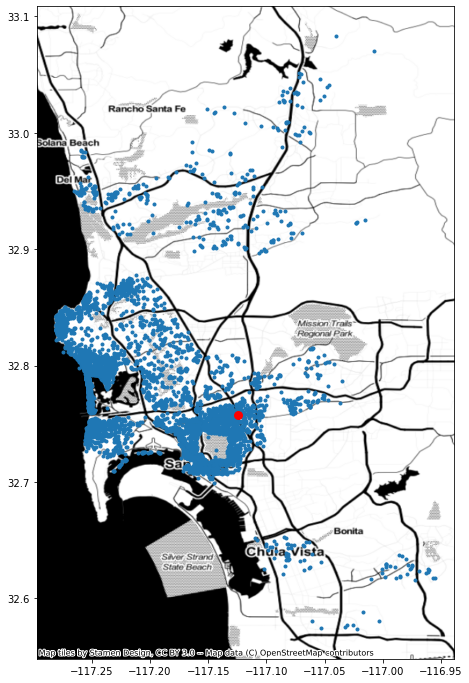

In [7]:
import contextily as ctx
f,ax = plt.subplots(1,figsize=(12, 12))
data.iloc[[600]].plot(ax=ax, marker='.', color='r', markersize=250, zorder=2)
data.plot(ax=ax, marker='.')
ctx.add_basemap(
    ax, 
    crs=data.crs.to_string(), 
    source=ctx.providers.Stamen.Toner
)

Let's load the San Diego neighbourhoods as a GeoDataFrame.

In [8]:
neighborhoods = gpd.read_file('../data/neighbourhoods_san_diego.geojson')
neighborhoods.head()

,neighbourhood,neighbourhood_group,geometry
0,Amphitheater And Water Park,None,"MULTIPOLYGON (((-117.01452 32.58790, -117.0144..."
1,Bella Lago,None,"MULTIPOLYGON (((-116.94128 32.68431, -116.9412..."
2,Bonita Long Canyon,None,"MULTIPOLYGON (((-117.01149 32.66352, -117.0114..."
3,East Lake,None,"MULTIPOLYGON (((-116.99302 32.66040, -116.9816..."
4,Eastlake Trails,None,"MULTIPOLYGON (((-116.95512 32.64124, -116.9550..."


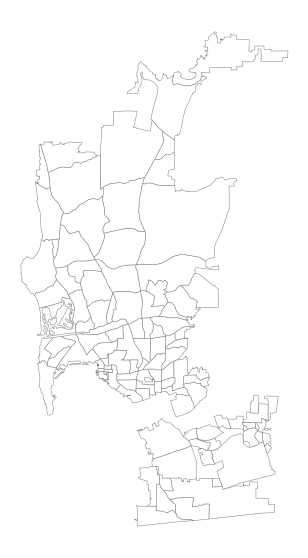

In [9]:
fig, ax = plt.subplots(figsize=(6,10))
neighborhoods.plot(ax=ax, linewidth=0.5, edgecolor='grey', color='white')
plt.axis('off')
plt.show()

In [10]:
# download and project a street network
G = ox.graph_from_place('San Diego, USA', network_type="drive")
G_proj = ox.project_graph(G)
# fig, ax = ox.plot_graph(G_proj, figsize=(20,20), node_size=2, node_color='#999999', node_edgecolor='none', node_zorder=2,
#                         edge_color='#555555', edge_linewidth=0.7, edge_alpha=1)

In [11]:
G_proj.graph["crs"]

<Projected CRS: +proj=utm +zone=11 +ellps=WGS84 +datum=WGS84 +unit ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: UTM zone 11N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [12]:
neighborhoods_proj = neighborhoods.copy()
#reproject neighborhoods geometry to utm crs
neighborhoods_proj.geometry = neighborhoods_proj.geometry.to_crs(G_proj.graph["crs"])
neighborhoods_proj.head()

,neighbourhood,neighbourhood_group,geometry
0,Amphitheater And Water Park,None,"MULTIPOLYGON (((498637.801 3605602.988, 498640..."
1,Bella Lago,None,"MULTIPOLYGON (((505504.923 3616291.485, 505504..."
2,Bonita Long Canyon,None,"MULTIPOLYGON (((498922.690 3613986.357, 498922..."
3,East Lake,None,"MULTIPOLYGON (((500654.435 3613639.457, 501721..."
4,Eastlake Trails,None,"MULTIPOLYGON (((504209.763 3611517.140, 504214..."


Let's use the osmnx API to get all parks in San Diego from OpenStreetMap.

In [13]:
tags = {"leisure": "park"}
parks = ox.geometries_from_place('San Diego, USA', tags=tags)
parks.head()

highway                  name  \
element_type osmid                                     
node         358780630     NaN   Bennington Monument   
             358782257     NaN       Cliffridge Park   
             358782289     NaN  Coast Boulevard Park   
             358782957     NaN        Del Cerro Park   
             358784996     NaN       Grant Hill Park   

                                           geometry created_by  ele  \
element_type osmid                                                    
node         358780630  POINT (-117.24444 32.68992)        NaN    0   
             358782257  POINT (-117.24448 32.85782)        NaN  111   
             358782289  POINT (-117.27865 32.84449)        NaN   16   
             358782957  POINT (-117.05809 32.78144)        NaN  137   
             358784996  POINT (-117.13781 32.70977)        NaN   51   

                       gnis:county_id gnis:created gnis:feature_id  \
element_type osmid                                                   
node         358780630            073   01/19/1981          239226   
             358782257            073   01/19/1981          240701   
             358782289            073   01/19/1981          240732   
             358782957            073   01/19/1981          241391   
             358784996            073   01/19/1981          242928   

                       gnis:state_id leisure  ... note alt_name smoking  dog  \
element_type osmid                            ...                              
node         358780630            06    park  ...  NaN      NaN     NaN  NaN   
             358782257            06    park  ...  NaN      NaN     NaN  NaN   
             358782289            06    park  ...  NaN      NaN     NaN  NaN   
             358782957            06    park  ...  NaN      NaN     NaN  NaN   
             358784996            06    park  ...  NaN      NaN     NaN  NaN   

                       opening_hours:covid19  lit ways type addr:housename  \
element_type osmid                                                           
node         358780630                   NaN  NaN  NaN  NaN            NaN   
             358782257                   NaN  NaN  NaN  NaN            NaN   
             358782289                   NaN  NaN  NaN  NaN            NaN   
             358782957                   NaN  NaN  NaN  NaN            NaN   
             358784996                   NaN  NaN  NaN  NaN            NaN   

                       phone  
element_type osmid            
node         358780630   NaN  
             358782257   NaN  
             358782289   NaN  
             358782957   NaN  
             358784996   NaN  

[5 rows x 71 columns]

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


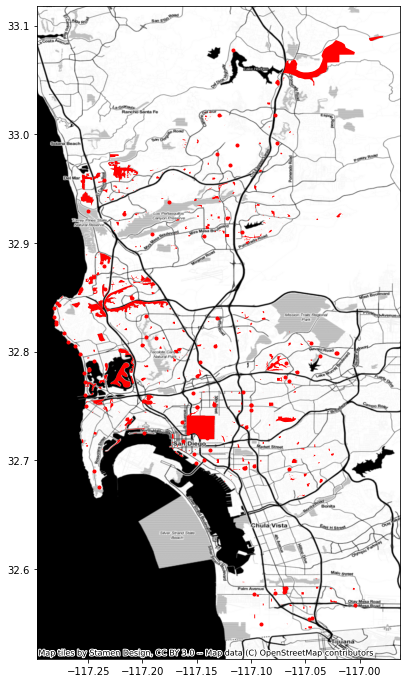

In [14]:
f,ax = plt.subplots(1,figsize=(12, 12))
parks.plot(ax=ax, marker='.', color='red')
ctx.add_basemap(
    ax, 
    crs=parks.crs.to_string(), 
    source=ctx.providers.Stamen.Toner
)

Let's keep only polygon or multipolygon geometries, getting rid of all point geometries representing parks. 

In [15]:
print(len(parks))
parks = parks[(parks["geometry"].geom_type == "Polygon")|(parks["geometry"].geom_type == "MultiPolygon")]
print(len(parks))
parks.reset_index(inplace=True, drop=True)
parks.head()

589
485


C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,highway,name,geometry,created_by,ele,gnis:county_id,gnis:created,gnis:feature_id,gnis:state_id,leisure,...,note,alt_name,smoking,dog,opening_hours:covid19,lit,ways,type,addr:housename,phone
0,NaN,Hilltop Park,"POLYGON ((-117.11747 32.97136, -117.11734 32.9...",NaN,NaN,NaN,NaN,NaN,NaN,park,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,Doyle Community Park,"POLYGON ((-117.22159 32.86456, -117.22057 32.8...",NaN,NaN,NaN,NaN,NaN,NaN,park,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,Mandell Weiss-Eastgate City Park,"POLYGON ((-117.21746 32.87564, -117.21662 32.8...",NaN,NaN,NaN,NaN,NaN,NaN,park,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,"POLYGON ((-117.23498 32.85821, -117.23435 32.8...",Potlatch 0.9c,NaN,NaN,NaN,NaN,NaN,park,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,Maddox Park,"POLYGON ((-117.15808 32.90688, -117.15786 32.9...",NaN,NaN,NaN,NaN,NaN,NaN,park,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
parks = parks[["geometry", "name"]]
parks.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,geometry,name
0,"POLYGON ((-117.11747 32.97136, -117.11734 32.9...",Hilltop Park
1,"POLYGON ((-117.22159 32.86456, -117.22057 32.8...",Doyle Community Park
2,"POLYGON ((-117.21746 32.87564, -117.21662 32.8...",Mandell Weiss-Eastgate City Park
3,"POLYGON ((-117.23498 32.85821, -117.23435 32.8...",NaN
4,"POLYGON ((-117.15808 32.90688, -117.15786 32.9...",Maddox Park


Let's compute the areas of the parks and assign them to a new column:

In [17]:
# first, reproject the park geometry data
parks_proj = parks.copy()
parks_proj.geometry = parks_proj.geometry.to_crs(neighborhoods_proj.crs)
parks_proj["area"] = parks_proj.geometry.area
parks_proj.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,geometry,name,area
0,"POLYGON ((489022.988 3648117.964, 489035.191 3...",Hilltop Park,42795.988432
1,"POLYGON ((479268.330 3636294.104, 479364.129 3...",Doyle Community Park,96309.437987
2,"POLYGON ((479657.361 3637522.007, 479735.516 3...",Mandell Weiss-Eastgate City Park,15849.041082
3,"POLYGON ((478013.938 3635592.742, 478073.378 3...",NaN,24456.351666
4,"POLYGON ((485216.875 3640974.764, 485237.482 3...",Maddox Park,21265.642241


Now, let's keep only the biggest parks, those above the 99th percentile in the park area distribution.

In [18]:
np.percentile(parks_proj.area, 99)

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1181964.8852071085

In [19]:
print(len(parks_proj))
parks_proj = parks_proj[parks_proj.area > np.percentile(parks_proj.area, 99)]
parks_proj.reset_index(inplace=True, drop=True)
print(len(parks_proj))
parks_proj.head()

485
5


,geometry,name,area
0,"POLYGON ((485074.276 3622585.111, 485166.588 3...",Balboa Park,5.176288e+06
1,"POLYGON ((478189.278 3633399.110, 478324.887 3...",Marian Bear Natural Memorial Park,1.805759e+06
2,"POLYGON ((494403.217 3658891.314, 494464.280 3...",San Dieguito River Park,7.156036e+06
3,"MULTIPOLYGON (((480261.516 3625697.520, 480249...",Mission Bay Park,2.098622e+06
4,"POLYGON ((479031.978 3646872.451, 479020.122 3...",Gonzales Canyon Open Space,1.738148e+06


### Engineering features

Let's first test some `shapely` and `osmnx` functionality before moving on to engineering the distance feature.

In [20]:
from shapely.ops import nearest_points

# reproject the Airbnb point data first
data_proj = data.copy()
data_proj.geometry = data_proj.geometry.to_crs(neighborhoods_proj.crs)

point1 = data_proj.loc[30, "geometry"]
point2 = data_proj.loc[600, "geometry"]
candidate_pt, p2 = nearest_points(parks_proj.loc[0, 'geometry'], point2)
candidate_pt.coords[0]

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(487453.5722804807, 3622572.162622876)

14428.419424153486 2029.6177105724062


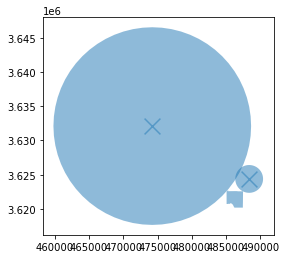

In [21]:
poly = parks_proj.loc[0, 'geometry']
dist1 = point1.distance(poly)
dist2 = point2.distance(poly)
print(dist1, dist2)
buff1 = point1.buffer(dist1) 
buff2 = point2.buffer(dist2) 
gdf_ = gpd.GeoDataFrame({"geometry" : [poly, point1, point2, buff1, buff2]})
gdf_.plot(marker='x', markersize=250, alpha=0.5)
plt.show()

### Distance to Balboa Park

In [22]:
# Retrieve nodes and edges
nodes, edges = ox.graph_to_gdfs(G_proj)
nodes.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
48857412,3.631779e+06,490571.488064,3,-117.100731,32.823986,NaN,NaN,POINT (490571.488 3631778.783)
1429663812,3.631690e+06,490544.548797,4,-117.101018,32.823182,traffic_signals,NaN,POINT (490544.549 3631689.702)
3639538766,3.631715e+06,490722.004457,3,-117.099122,32.823414,NaN,NaN,POINT (490722.004 3631715.264)
49364985,3.631975e+06,490374.845412,4,-117.102834,32.825755,NaN,NaN,POINT (490374.845 3631975.045)
48857474,3.632198e+06,479034.325491,1,-117.223999,32.827606,turning_circle,NaN,POINT (479034.325 3632197.810)


C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


2696.964
2696.964


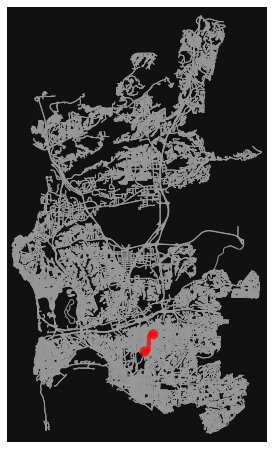

In [23]:
point = data_proj.loc[600, "geometry"]
origin = ox.distance.nearest_nodes(G_proj, point.coords[0][0], point.coords[0][1])
balboa = parks_proj.loc[0, 'geometry']
candidate_pt, p2 = nearest_points(balboa, point)
destination = ox.distance.nearest_nodes(G_proj, candidate_pt.coords[0][0], candidate_pt.coords[0][1])
try:
    if origin!=destination:
        dist = nx.shortest_path_length(G_proj, origin, destination, weight = "length")
except:
    # since OpenStreetMap street networks are maintained by volunteers, they sometimes contain errors, such as 
    # topological inconsistencies, which can lead the code to raise errors. In order to avoid that, let's
    # try a simple but bad practice workaround:
    dist = 'NaN'
    pass

print(dist)

path = nx.shortest_path(G_proj, origin, destination, weight='length')
edges = [ tuple( path[i:i+2] ) for i in range( len(path) - 1 ) ]
dist_c = np.sum([G_proj.get_edge_data(*edge)[0]['length'] for edge in edges])
print(dist_c)

routes = [path, path]
rc = ['r', 'r']
fig, ax = ox.plot_graph_routes(G_proj, routes, route_colors=rc, route_linewidth=6, node_size=0)

Now, let's compute the distance from each Airbnb listing to the famous Balboa Park in San Diego.

In [24]:
from tqdm import tqdm

dict_dist_to_balboa = {}
balboa = parks_proj.loc[0, 'geometry']

for i in tqdm(range(len(data_proj))):
    point = data_proj.loc[i, "geometry"]
    origin = ox.distance.nearest_nodes(G_proj, point.coords[0][0], point.coords[0][1])
    candidate_pt, p2 = nearest_points(balboa, point)
    destination = ox.distance.nearest_nodes(G_proj, candidate_pt.coords[0][0], candidate_pt.coords[0][1])
    try:
        if origin!=destination:
            dist = nx.shortest_path_length(G_proj, origin, destination, weight = "length")
    except:
        # since OpenStreetMap street networks are maintained by volunteers, they sometimes contain errors, such as 
        # topological inconsistencies, which can lead the code to raise errors. In order to avoid that, let's
        # try a simple but bad practice workaround:
        dist = 'NaN'
        pass

    print("Distance from listing {} to Balboa Park: ".format(i), dist)
    dict_dist_to_balboa[i] = dist

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
  0%|                                                                               | 1/6110 [00:00<55:17,  1.84it/s]

Distance from listing 0 to Balboa Park:  1776.874


  0%|                                                                               | 2/6110 [00:00<46:47,  2.18it/s]

Distance from listing 1 to Balboa Park:  12324.041000000001


  0%|                                                                               | 3/6110 [00:01<39:18,  2.59it/s]

Distance from listing 2 to Balboa Park:  1540.368


  0%|                                                                               | 4/6110 [00:01<47:50,  2.13it/s]

Distance from listing 3 to Balboa Park:  25592.028000000002


  0%|                                                                               | 5/6110 [00:01<41:58,  2.42it/s]

Distance from listing 4 to Balboa Park:  7387.224


  0%|                                                                               | 6/6110 [00:02<47:34,  2.14it/s]

Distance from listing 5 to Balboa Park:  2595.1220000000003


  0%|                                                                               | 7/6110 [00:02<41:19,  2.46it/s]

Distance from listing 6 to Balboa Park:  8842.378999999997


  0%|                                                                               | 8/6110 [00:03<49:07,  2.07it/s]

Distance from listing 7 to Balboa Park:  16089.636999999999


  0%|                                                                               | 9/6110 [00:03<43:15,  2.35it/s]

Distance from listing 8 to Balboa Park:  14225.546000000002


  0%|▏                                                                             | 10/6110 [00:04<50:39,  2.01it/s]

Distance from listing 9 to Balboa Park:  13238.66


  0%|▏                                                                             | 11/6110 [00:04<43:52,  2.32it/s]

Distance from listing 10 to Balboa Park:  10842.056999999997


  0%|▏                                                                             | 12/6110 [00:04<38:34,  2.63it/s]

Distance from listing 11 to Balboa Park:  7449.714


  0%|▏                                                                             | 13/6110 [00:05<46:57,  2.16it/s]

Distance from listing 12 to Balboa Park:  12594.986


  0%|▏                                                                             | 14/6110 [00:05<40:32,  2.51it/s]

Distance from listing 13 to Balboa Park:  8986.526


  0%|▏                                                                             | 15/6110 [00:06<46:36,  2.18it/s]

Distance from listing 14 to Balboa Park:  583.347


  0%|▏                                                                             | 16/6110 [00:06<39:37,  2.56it/s]

Distance from listing 15 to Balboa Park:  501.97400000000005


  0%|▏                                                                             | 17/6110 [00:07<47:32,  2.14it/s]

Distance from listing 16 to Balboa Park:  16036.408999999998


  0%|▏                                                                             | 18/6110 [00:07<42:37,  2.38it/s]

Distance from listing 17 to Balboa Park:  16063.413999999999


  0%|▏                                                                             | 19/6110 [00:08<51:22,  1.98it/s]

Distance from listing 18 to Balboa Park:  15990.375999999998


  0%|▎                                                                             | 20/6110 [00:08<42:41,  2.38it/s]

Distance from listing 19 to Balboa Park:  1521.408


  0%|▎                                                                             | 21/6110 [00:08<39:02,  2.60it/s]

Distance from listing 20 to Balboa Park:  13843.487


  0%|▎                                                                             | 22/6110 [00:09<46:55,  2.16it/s]

Distance from listing 21 to Balboa Park:  15433.304999999997


  0%|▎                                                                             | 23/6110 [00:09<43:27,  2.33it/s]

Distance from listing 22 to Balboa Park:  13373.949999999999


  0%|▎                                                                             | 24/6110 [00:10<48:13,  2.10it/s]

Distance from listing 23 to Balboa Park:  1707.339


  0%|▎                                                                             | 25/6110 [00:10<42:05,  2.41it/s]

Distance from listing 24 to Balboa Park:  14797.303999999998


  0%|▎                                                                             | 26/6110 [00:11<48:19,  2.10it/s]

Distance from listing 25 to Balboa Park:  15057.175999999996


  0%|▎                                                                             | 27/6110 [00:11<41:45,  2.43it/s]

Distance from listing 26 to Balboa Park:  10169.151999999998


  0%|▎                                                                             | 28/6110 [00:12<45:53,  2.21it/s]

Distance from listing 27 to Balboa Park:  1395.269


  0%|▎                                                                             | 29/6110 [00:12<40:28,  2.50it/s]

Distance from listing 28 to Balboa Park:  11564.878999999997


  0%|▍                                                                             | 30/6110 [00:13<47:03,  2.15it/s]

Distance from listing 29 to Balboa Park:  11652.0


  1%|▍                                                                             | 31/6110 [00:13<42:58,  2.36it/s]

Distance from listing 30 to Balboa Park:  17748.963000000003


  1%|▍                                                                             | 32/6110 [00:13<39:45,  2.55it/s]

Distance from listing 31 to Balboa Park:  19261.136


  1%|▍                                                                             | 33/6110 [00:14<45:09,  2.24it/s]

Distance from listing 32 to Balboa Park:  3442.601


  1%|▍                                                                             | 34/6110 [00:14<38:06,  2.66it/s]

Distance from listing 33 to Balboa Park:  1964.437


  1%|▍                                                                             | 35/6110 [00:15<46:15,  2.19it/s]

Distance from listing 34 to Balboa Park:  12553.765000000001


  1%|▍                                                                             | 36/6110 [00:15<43:38,  2.32it/s]

Distance from listing 35 to Balboa Park:  21860.306


  1%|▍                                                                             | 37/6110 [00:16<52:04,  1.94it/s]

Distance from listing 36 to Balboa Park:  21156.316999999995


  1%|▍                                                                             | 38/6110 [00:16<43:51,  2.31it/s]

Distance from listing 37 to Balboa Park:  7276.059


  1%|▍                                                                             | 39/6110 [00:17<48:30,  2.09it/s]

Distance from listing 38 to Balboa Park:  6933.767999999999


  1%|▌                                                                             | 40/6110 [00:17<41:45,  2.42it/s]

Distance from listing 39 to Balboa Park:  11405.589000000002


  1%|▌                                                                             | 41/6110 [00:17<36:08,  2.80it/s]

Distance from listing 40 to Balboa Park:  284.249


  1%|▌                                                                             | 42/6110 [00:18<43:26,  2.33it/s]

Distance from listing 41 to Balboa Park:  11585.69


  1%|▌                                                                             | 43/6110 [00:18<37:19,  2.71it/s]

Distance from listing 42 to Balboa Park:  984.7440000000001


  1%|▌                                                                             | 44/6110 [00:18<44:47,  2.26it/s]

Distance from listing 43 to Balboa Park:  1050.2199999999998


  1%|▌                                                                             | 45/6110 [00:19<39:46,  2.54it/s]

Distance from listing 44 to Balboa Park:  10035.255000000001


  1%|▌                                                                             | 46/6110 [00:19<46:25,  2.18it/s]

Distance from listing 45 to Balboa Park:  16062.357999999998


  1%|▌                                                                             | 47/6110 [00:20<40:42,  2.48it/s]

Distance from listing 46 to Balboa Park:  12169.816


  1%|▌                                                                             | 48/6110 [00:20<38:34,  2.62it/s]

Distance from listing 47 to Balboa Park:  20134.674000000003


  1%|▋                                                                             | 49/6110 [00:21<46:18,  2.18it/s]

Distance from listing 48 to Balboa Park:  13881.867000000002


  1%|▋                                                                             | 50/6110 [00:21<39:33,  2.55it/s]

Distance from listing 49 to Balboa Park:  85.24199999999999


  1%|▋                                                                             | 51/6110 [00:21<45:08,  2.24it/s]

Distance from listing 50 to Balboa Park:  4861.124


  1%|▋                                                                             | 52/6110 [00:22<40:47,  2.47it/s]

Distance from listing 51 to Balboa Park:  15807.079999999998


  1%|▋                                                                             | 53/6110 [00:22<46:07,  2.19it/s]

Distance from listing 52 to Balboa Park:  8604.306999999999


  1%|▋                                                                             | 54/6110 [00:23<38:32,  2.62it/s]

Distance from listing 53 to Balboa Park:  586.998


  1%|▋                                                                             | 55/6110 [00:23<48:12,  2.09it/s]

Distance from listing 54 to Balboa Park:  26877.833


  1%|▋                                                                             | 56/6110 [00:24<42:10,  2.39it/s]

Distance from listing 55 to Balboa Park:  11471.885


  1%|▋                                                                             | 57/6110 [00:24<48:37,  2.07it/s]

Distance from listing 56 to Balboa Park:  3826.981


  1%|▋                                                                             | 58/6110 [00:24<41:10,  2.45it/s]

Distance from listing 57 to Balboa Park:  232.97


  1%|▊                                                                             | 59/6110 [00:25<35:31,  2.84it/s]

Distance from listing 58 to Balboa Park:  673.384


  1%|▊                                                                             | 60/6110 [00:25<41:26,  2.43it/s]

Distance from listing 59 to Balboa Park:  1367.387


  1%|▊                                                                             | 61/6110 [00:25<39:15,  2.57it/s]

Distance from listing 60 to Balboa Park:  26812.351


  1%|▊                                                                             | 62/6110 [00:26<46:19,  2.18it/s]

Distance from listing 61 to Balboa Park:  1985.434


  1%|▊                                                                             | 63/6110 [00:26<39:33,  2.55it/s]

Distance from listing 62 to Balboa Park:  7148.091


  1%|▊                                                                             | 64/6110 [00:27<47:03,  2.14it/s]

Distance from listing 63 to Balboa Park:  2954.03


  1%|▊                                                                             | 65/6110 [00:27<41:11,  2.45it/s]

Distance from listing 64 to Balboa Park:  167.99300000000002


  1%|▊                                                                             | 66/6110 [00:28<53:41,  1.88it/s]

Distance from listing 65 to Balboa Park:  17579.651000000005


  1%|▊                                                                             | 67/6110 [00:28<44:25,  2.27it/s]

Distance from listing 66 to Balboa Park:  1278.836


  1%|▊                                                                             | 68/6110 [00:29<37:42,  2.67it/s]

Distance from listing 67 to Balboa Park:  1538.777


  1%|▉                                                                             | 69/6110 [00:29<47:37,  2.11it/s]

Distance from listing 68 to Balboa Park:  1172.885


  1%|▉                                                                             | 70/6110 [00:30<43:35,  2.31it/s]

Distance from listing 69 to Balboa Park:  1397.242


  1%|▉                                                                           | 71/6110 [00:31<1:00:52,  1.65it/s]

Distance from listing 70 to Balboa Park:  1290.0439999999999


  1%|▉                                                                             | 72/6110 [00:31<55:21,  1.82it/s]

Distance from listing 71 to Balboa Park:  1397.242


  1%|▉                                                                           | 73/6110 [00:32<1:16:28,  1.32it/s]

Distance from listing 72 to Balboa Park:  22773.435000000005


  1%|▉                                                                           | 74/6110 [00:33<1:03:41,  1.58it/s]

Distance from listing 73 to Balboa Park:  1057.3020000000001


  1%|▉                                                                           | 75/6110 [00:33<1:10:15,  1.43it/s]

Distance from listing 74 to Balboa Park:  9064.633999999998


  1%|▉                                                                             | 76/6110 [00:34<59:00,  1.70it/s]

Distance from listing 75 to Balboa Park:  1267.564


  1%|▉                                                                             | 77/6110 [00:34<52:47,  1.90it/s]

Distance from listing 76 to Balboa Park:  8679.401999999998


  1%|▉                                                                           | 78/6110 [00:35<1:04:10,  1.57it/s]

Distance from listing 77 to Balboa Park:  1748.056


  1%|█                                                                             | 79/6110 [00:35<54:35,  1.84it/s]

Distance from listing 78 to Balboa Park:  1141.172


  1%|▉                                                                           | 80/6110 [00:36<1:03:46,  1.58it/s]

Distance from listing 79 to Balboa Park:  1990.804


  1%|█                                                                             | 81/6110 [00:37<56:40,  1.77it/s]

Distance from listing 80 to Balboa Park:  10420.027999999998


  1%|█                                                                           | 82/6110 [00:37<1:05:45,  1.53it/s]

Distance from listing 81 to Balboa Park:  4785.491999999999


  1%|█                                                                             | 83/6110 [00:38<57:01,  1.76it/s]

Distance from listing 82 to Balboa Park:  821.987


  1%|█                                                                           | 84/6110 [00:39<1:09:53,  1.44it/s]

Distance from listing 83 to Balboa Park:  12854.719000000001


  1%|█                                                                             | 85/6110 [00:39<58:47,  1.71it/s]

Distance from listing 84 to Balboa Park:  1868.258


  1%|█                                                                           | 86/6110 [00:40<1:07:46,  1.48it/s]

Distance from listing 85 to Balboa Park:  3298.409


  1%|█                                                                             | 87/6110 [00:40<59:37,  1.68it/s]

Distance from listing 86 to Balboa Park:  9708.278999999997


  1%|█                                                                             | 88/6110 [00:41<51:49,  1.94it/s]

Distance from listing 87 to Balboa Park:  167.99300000000002


  1%|█                                                                           | 89/6110 [00:42<1:03:11,  1.59it/s]

Distance from listing 88 to Balboa Park:  2335.6980000000003


  1%|█▏                                                                            | 90/6110 [00:42<57:31,  1.74it/s]

Distance from listing 89 to Balboa Park:  11981.111


  1%|█▏                                                                          | 91/6110 [00:43<1:05:16,  1.54it/s]

Distance from listing 90 to Balboa Park:  425.202


  2%|█▏                                                                            | 92/6110 [00:43<55:15,  1.82it/s]

Distance from listing 91 to Balboa Park:  1945.7720000000004


  2%|█▏                                                                          | 93/6110 [00:44<1:04:21,  1.56it/s]

Distance from listing 92 to Balboa Park:  10086.804


  2%|█▏                                                                            | 94/6110 [00:44<55:57,  1.79it/s]

Distance from listing 93 to Balboa Park:  12185.594000000001


  2%|█▏                                                                            | 95/6110 [00:45<59:25,  1.69it/s]

Distance from listing 94 to Balboa Park:  7891.452


  2%|█▏                                                                            | 96/6110 [00:46<52:01,  1.93it/s]

Distance from listing 95 to Balboa Park:  15517.248


  2%|█▏                                                                            | 97/6110 [00:46<46:02,  2.18it/s]

Distance from listing 96 to Balboa Park:  14202.935000000001


  2%|█▎                                                                            | 98/6110 [00:46<52:17,  1.92it/s]

Distance from listing 97 to Balboa Park:  12938.887


  2%|█▎                                                                            | 99/6110 [00:47<43:19,  2.31it/s]

Distance from listing 98 to Balboa Park:  2616.377


  2%|█▎                                                                           | 100/6110 [00:47<51:02,  1.96it/s]

Distance from listing 99 to Balboa Park:  10370.127999999997


  2%|█▎                                                                           | 101/6110 [00:48<45:21,  2.21it/s]

Distance from listing 100 to Balboa Park:  18419.244


  2%|█▎                                                                           | 102/6110 [00:48<53:17,  1.88it/s]

Distance from listing 101 to Balboa Park:  7965.841000000002


  2%|█▎                                                                           | 103/6110 [00:49<46:52,  2.14it/s]

Distance from listing 102 to Balboa Park:  19286.590999999993


  2%|█▎                                                                           | 104/6110 [00:49<43:03,  2.33it/s]

Distance from listing 103 to Balboa Park:  18807.973999999995


  2%|█▎                                                                           | 105/6110 [00:50<47:43,  2.10it/s]

Distance from listing 104 to Balboa Park:  1336.1360000000002


  2%|█▎                                                                           | 106/6110 [00:50<40:20,  2.48it/s]

Distance from listing 105 to Balboa Park:  3525.906


  2%|█▎                                                                           | 107/6110 [00:51<47:17,  2.12it/s]

Distance from listing 106 to Balboa Park:  1163.088


  2%|█▎                                                                           | 108/6110 [00:51<40:54,  2.44it/s]

Distance from listing 107 to Balboa Park:  1012.5799999999999


  2%|█▎                                                                           | 109/6110 [00:52<50:43,  1.97it/s]

Distance from listing 108 to Balboa Park:  11443.414999999994


  2%|█▍                                                                           | 110/6110 [00:52<43:05,  2.32it/s]

Distance from listing 109 to Balboa Park:  3525.284


  2%|█▍                                                                           | 111/6110 [00:52<48:49,  2.05it/s]

Distance from listing 110 to Balboa Park:  400.615


  2%|█▍                                                                           | 112/6110 [00:53<41:38,  2.40it/s]

Distance from listing 111 to Balboa Park:  1021.6790000000001


  2%|█▍                                                                           | 113/6110 [00:53<36:55,  2.71it/s]

Distance from listing 112 to Balboa Park:  1021.6790000000001


  2%|█▍                                                                           | 114/6110 [00:54<44:24,  2.25it/s]

Distance from listing 113 to Balboa Park:  256.43600000000004


  2%|█▍                                                                           | 115/6110 [00:54<37:40,  2.65it/s]

Distance from listing 114 to Balboa Park:  985.6080000000001


  2%|█▍                                                                           | 116/6110 [00:54<44:00,  2.27it/s]

Distance from listing 115 to Balboa Park:  422.28000000000003


  2%|█▍                                                                           | 117/6110 [00:55<37:59,  2.63it/s]

Distance from listing 116 to Balboa Park:  424.207


  2%|█▍                                                                           | 118/6110 [00:55<45:39,  2.19it/s]

Distance from listing 117 to Balboa Park:  741.6289999999999


  2%|█▍                                                                           | 119/6110 [00:56<41:00,  2.44it/s]

Distance from listing 118 to Balboa Park:  18253.271


  2%|█▌                                                                           | 120/6110 [00:56<45:57,  2.17it/s]

Distance from listing 119 to Balboa Park:  597.879


  2%|█▌                                                                           | 121/6110 [00:56<38:50,  2.57it/s]

Distance from listing 120 to Balboa Park:  1021.086


  2%|█▌                                                                           | 122/6110 [00:57<34:05,  2.93it/s]

Distance from listing 121 to Balboa Park:  2967.4249999999997


  2%|█▌                                                                           | 123/6110 [00:57<40:37,  2.46it/s]

Distance from listing 122 to Balboa Park:  5883.863


  2%|█▌                                                                           | 124/6110 [00:57<36:41,  2.72it/s]

Distance from listing 123 to Balboa Park:  13510.015


  2%|█▌                                                                           | 125/6110 [00:58<42:01,  2.37it/s]

Distance from listing 124 to Balboa Park:  1108.525


  2%|█▌                                                                           | 126/6110 [00:58<35:39,  2.80it/s]

Distance from listing 125 to Balboa Park:  585.3109999999999


  2%|█▌                                                                           | 128/6110 [00:59<35:08,  2.84it/s]

Distance from listing 126 to Balboa Park:  815.7560000000001
Distance from listing 127 to Balboa Park:  726.2849999999999


  2%|█▋                                                                           | 129/6110 [00:59<41:13,  2.42it/s]

Distance from listing 128 to Balboa Park:  512.638


  2%|█▋                                                                           | 130/6110 [01:00<37:18,  2.67it/s]

Distance from listing 129 to Balboa Park:  16348.377999999999


  2%|█▋                                                                           | 131/6110 [01:00<32:45,  3.04it/s]

Distance from listing 130 to Balboa Park:  405.584


  2%|█▋                                                                           | 132/6110 [01:01<40:55,  2.43it/s]

Distance from listing 131 to Balboa Park:  12881.198


  2%|█▋                                                                           | 133/6110 [01:01<36:44,  2.71it/s]

Distance from listing 132 to Balboa Park:  12042.659


  2%|█▋                                                                           | 134/6110 [01:01<43:41,  2.28it/s]

Distance from listing 133 to Balboa Park:  10088.607999999998


  2%|█▋                                                                           | 135/6110 [01:02<37:21,  2.67it/s]

Distance from listing 134 to Balboa Park:  510.05199999999996


  2%|█▋                                                                           | 136/6110 [01:02<43:23,  2.29it/s]

Distance from listing 135 to Balboa Park:  1626.7349999999997


  2%|█▋                                                                           | 137/6110 [01:02<37:15,  2.67it/s]

Distance from listing 136 to Balboa Park:  2313.008


  2%|█▋                                                                           | 138/6110 [01:03<45:58,  2.17it/s]

Distance from listing 137 to Balboa Park:  18062.953000000005


  2%|█▊                                                                           | 139/6110 [01:03<38:39,  2.57it/s]

Distance from listing 138 to Balboa Park:  1578.5639999999999


  2%|█▊                                                                           | 140/6110 [01:04<43:53,  2.27it/s]

Distance from listing 139 to Balboa Park:  1540.368


  2%|█▊                                                                           | 141/6110 [01:04<37:32,  2.65it/s]

Distance from listing 140 to Balboa Park:  1540.368


  2%|█▊                                                                           | 142/6110 [01:04<33:05,  3.01it/s]

Distance from listing 141 to Balboa Park:  2055.018


  2%|█▊                                                                           | 143/6110 [01:05<40:07,  2.48it/s]

Distance from listing 142 to Balboa Park:  2174.626


  2%|█▊                                                                           | 144/6110 [01:05<36:35,  2.72it/s]

Distance from listing 143 to Balboa Park:  12482.541000000001


  2%|█▊                                                                           | 145/6110 [01:06<44:39,  2.23it/s]

Distance from listing 144 to Balboa Park:  11907.315999999999


  2%|█▊                                                                           | 146/6110 [01:06<39:33,  2.51it/s]

Distance from listing 145 to Balboa Park:  11652.734


  2%|█▊                                                                           | 147/6110 [01:07<46:17,  2.15it/s]

Distance from listing 146 to Balboa Park:  10437.776999999998


  2%|█▊                                                                           | 148/6110 [01:07<40:48,  2.44it/s]

Distance from listing 147 to Balboa Park:  15967.919999999998


  2%|█▉                                                                           | 149/6110 [01:07<35:10,  2.82it/s]

Distance from listing 148 to Balboa Park:  826.1630000000001


  2%|█▉                                                                           | 150/6110 [01:08<43:30,  2.28it/s]

Distance from listing 149 to Balboa Park:  14579.123


  2%|█▉                                                                           | 151/6110 [01:08<40:36,  2.45it/s]

Distance from listing 150 to Balboa Park:  28958.292


  2%|█▉                                                                           | 152/6110 [01:09<45:26,  2.19it/s]

Distance from listing 151 to Balboa Park:  3339.4139999999993


  3%|█▉                                                                           | 153/6110 [01:09<38:37,  2.57it/s]

Distance from listing 152 to Balboa Park:  1099.044


  3%|█▉                                                                           | 154/6110 [01:10<44:53,  2.21it/s]

Distance from listing 153 to Balboa Park:  6950.053999999999


  3%|█▉                                                                           | 155/6110 [01:10<38:39,  2.57it/s]

Distance from listing 154 to Balboa Park:  10259.831999999995


  3%|█▉                                                                           | 156/6110 [01:11<47:37,  2.08it/s]

Distance from listing 155 to Balboa Park:  2022.3710000000003


  3%|█▉                                                                           | 157/6110 [01:11<40:30,  2.45it/s]

Distance from listing 156 to Balboa Park:  594.62


  3%|█▉                                                                           | 158/6110 [01:11<47:13,  2.10it/s]

Distance from listing 157 to Balboa Park:  570.86


  3%|██                                                                           | 159/6110 [01:12<41:53,  2.37it/s]

Distance from listing 158 to Balboa Park:  18281.569


  3%|██                                                                           | 160/6110 [01:12<38:32,  2.57it/s]

Distance from listing 159 to Balboa Park:  18128.117000000002


  3%|██                                                                           | 161/6110 [01:13<47:35,  2.08it/s]

Distance from listing 160 to Balboa Park:  6626.4349999999995


  3%|██                                                                           | 162/6110 [01:13<40:58,  2.42it/s]

Distance from listing 161 to Balboa Park:  10511.847999999998


  3%|██                                                                           | 163/6110 [01:14<46:34,  2.13it/s]

Distance from listing 162 to Balboa Park:  8211.395


  3%|██                                                                           | 164/6110 [01:14<39:10,  2.53it/s]

Distance from listing 163 to Balboa Park:  1029.228


  3%|██                                                                           | 165/6110 [01:14<45:59,  2.15it/s]

Distance from listing 164 to Balboa Park:  13144.054


  3%|██                                                                           | 166/6110 [01:15<40:50,  2.43it/s]

Distance from listing 165 to Balboa Park:  16209.491999999998


  3%|██                                                                           | 167/6110 [01:15<45:32,  2.17it/s]

Distance from listing 166 to Balboa Park:  826.1630000000001


  3%|██                                                                           | 168/6110 [01:16<42:27,  2.33it/s]

Distance from listing 167 to Balboa Park:  25870.193999999996


  3%|██▏                                                                          | 169/6110 [01:16<36:29,  2.71it/s]

Distance from listing 168 to Balboa Park:  714.9590000000001


  3%|██▏                                                                          | 170/6110 [01:17<42:33,  2.33it/s]

Distance from listing 169 to Balboa Park:  594.581


  3%|██▏                                                                          | 171/6110 [01:17<36:22,  2.72it/s]

Distance from listing 170 to Balboa Park:  1296.423


  3%|██▏                                                                          | 172/6110 [01:17<42:40,  2.32it/s]

Distance from listing 171 to Balboa Park:  5288.560000000001


  3%|██▏                                                                          | 173/6110 [01:18<37:05,  2.67it/s]

Distance from listing 172 to Balboa Park:  2762.365


  3%|██▏                                                                          | 174/6110 [01:18<43:26,  2.28it/s]

Distance from listing 173 to Balboa Park:  2108.9480000000003


  3%|██▏                                                                          | 175/6110 [01:18<40:57,  2.41it/s]

Distance from listing 174 to Balboa Park:  26940.984000000008


  3%|██▏                                                                          | 176/6110 [01:19<35:20,  2.80it/s]

Distance from listing 175 to Balboa Park:  991.313


  3%|██▏                                                                          | 177/6110 [01:19<44:15,  2.23it/s]

Distance from listing 176 to Balboa Park:  19931.097999999994


  3%|██▏                                                                          | 178/6110 [01:20<37:51,  2.61it/s]

Distance from listing 177 to Balboa Park:  865.767


  3%|██▎                                                                          | 179/6110 [01:20<45:05,  2.19it/s]

Distance from listing 178 to Balboa Park:  13498.108


  3%|██▎                                                                          | 180/6110 [01:21<39:23,  2.51it/s]

Distance from listing 179 to Balboa Park:  9878.572999999997


  3%|██▎                                                                          | 181/6110 [01:21<44:38,  2.21it/s]

Distance from listing 180 to Balboa Park:  424.63899999999995


  3%|██▎                                                                          | 182/6110 [01:21<37:36,  2.63it/s]

Distance from listing 181 to Balboa Park:  421.134


  3%|██▎                                                                          | 183/6110 [01:22<46:55,  2.11it/s]

Distance from listing 182 to Balboa Park:  19280.173


  3%|██▎                                                                          | 184/6110 [01:22<39:33,  2.50it/s]

Distance from listing 183 to Balboa Park:  5183.700000000001


  3%|██▎                                                                          | 185/6110 [01:23<47:27,  2.08it/s]

Distance from listing 184 to Balboa Park:  18491.854000000007


  3%|██▎                                                                          | 186/6110 [01:23<42:52,  2.30it/s]

Distance from listing 185 to Balboa Park:  19880.293999999994


  3%|██▎                                                                          | 187/6110 [01:23<37:45,  2.61it/s]

Distance from listing 186 to Balboa Park:  10869.408


  3%|██▎                                                                          | 188/6110 [01:24<44:45,  2.21it/s]

Distance from listing 187 to Balboa Park:  11230.484


  3%|██▍                                                                          | 189/6110 [01:24<38:23,  2.57it/s]

Distance from listing 188 to Balboa Park:  8211.395


  3%|██▍                                                                          | 190/6110 [01:25<44:07,  2.24it/s]

Distance from listing 189 to Balboa Park:  2902.666


  3%|██▍                                                                          | 191/6110 [01:25<37:23,  2.64it/s]

Distance from listing 190 to Balboa Park:  1947.549


  3%|██▍                                                                          | 192/6110 [01:26<46:44,  2.11it/s]

Distance from listing 191 to Balboa Park:  18858.256


  3%|██▍                                                                          | 193/6110 [01:26<42:26,  2.32it/s]

Distance from listing 192 to Balboa Park:  19857.012999999995


  3%|██▍                                                                          | 194/6110 [01:27<40:05,  2.46it/s]

Distance from listing 193 to Balboa Park:  26488.831000000006


  3%|██▍                                                                          | 195/6110 [01:27<44:54,  2.19it/s]

Distance from listing 194 to Balboa Park:  348.719


  3%|██▍                                                                          | 196/6110 [01:27<40:09,  2.45it/s]

Distance from listing 195 to Balboa Park:  14094.709


  3%|██▍                                                                          | 197/6110 [01:28<46:24,  2.12it/s]

Distance from listing 196 to Balboa Park:  13403.599


  3%|██▍                                                                          | 198/6110 [01:28<40:45,  2.42it/s]

Distance from listing 197 to Balboa Park:  15090.271999999997


  3%|██▌                                                                          | 199/6110 [01:29<46:03,  2.14it/s]

Distance from listing 198 to Balboa Park:  7041.161000000001


  3%|██▌                                                                          | 200/6110 [01:29<39:28,  2.50it/s]

Distance from listing 199 to Balboa Park:  6497.2080000000005


  3%|██▌                                                                          | 201/6110 [01:30<44:43,  2.20it/s]

Distance from listing 200 to Balboa Park:  6751.646000000001


  3%|██▌                                                                          | 202/6110 [01:30<39:36,  2.49it/s]

Distance from listing 201 to Balboa Park:  11198.721999999994


  3%|██▌                                                                          | 203/6110 [01:31<44:59,  2.19it/s]

Distance from listing 202 to Balboa Park:  399.962


  3%|██▌                                                                          | 204/6110 [01:31<37:59,  2.59it/s]

Distance from listing 203 to Balboa Park:  3511.0920000000006


  3%|██▌                                                                          | 205/6110 [01:31<34:31,  2.85it/s]

Distance from listing 204 to Balboa Park:  7759.339999999998


  3%|██▌                                                                          | 206/6110 [01:32<40:47,  2.41it/s]

Distance from listing 205 to Balboa Park:  511.50899999999996


  3%|██▌                                                                          | 207/6110 [01:32<35:30,  2.77it/s]

Distance from listing 206 to Balboa Park:  875.44


  3%|██▌                                                                          | 208/6110 [01:33<44:23,  2.22it/s]

Distance from listing 207 to Balboa Park:  19957.275999999998


  3%|██▋                                                                          | 209/6110 [01:33<38:39,  2.54it/s]

Distance from listing 208 to Balboa Park:  9657.331999999997


  3%|██▋                                                                          | 210/6110 [01:33<45:20,  2.17it/s]

Distance from listing 209 to Balboa Park:  10701.565


  3%|██▋                                                                          | 211/6110 [01:34<40:01,  2.46it/s]

Distance from listing 210 to Balboa Park:  13888.592999999999


  3%|██▋                                                                          | 212/6110 [01:34<45:06,  2.18it/s]

Distance from listing 211 to Balboa Park:  5608.952000000001


  3%|██▋                                                                          | 213/6110 [01:35<40:44,  2.41it/s]

Distance from listing 212 to Balboa Park:  19681.43899999999


  4%|██▋                                                                          | 214/6110 [01:35<37:18,  2.63it/s]

Distance from listing 213 to Balboa Park:  18552.497


  4%|██▋                                                                          | 215/6110 [01:35<43:47,  2.24it/s]

Distance from listing 214 to Balboa Park:  1371.5300000000002


  4%|██▋                                                                          | 216/6110 [01:36<39:32,  2.48it/s]

Distance from listing 215 to Balboa Park:  404.014


  4%|██▋                                                                          | 217/6110 [01:37<51:46,  1.90it/s]

Distance from listing 216 to Balboa Park:  977.208


  4%|██▋                                                                          | 218/6110 [01:37<45:48,  2.14it/s]

Distance from listing 217 to Balboa Park:  2221.965


  4%|██▊                                                                          | 219/6110 [01:38<53:44,  1.83it/s]

Distance from listing 218 to Balboa Park:  1638.281


  4%|██▊                                                                          | 220/6110 [01:38<45:12,  2.17it/s]

Distance from listing 219 to Balboa Park:  4814.791


  4%|██▊                                                                          | 221/6110 [01:39<49:50,  1.97it/s]

Distance from listing 220 to Balboa Park:  12317.142000000002


  4%|██▊                                                                          | 222/6110 [01:39<43:25,  2.26it/s]

Distance from listing 221 to Balboa Park:  12016.917


  4%|██▊                                                                          | 223/6110 [01:39<36:53,  2.66it/s]

Distance from listing 222 to Balboa Park:  405.584


  4%|██▊                                                                          | 224/6110 [01:40<43:09,  2.27it/s]

Distance from listing 223 to Balboa Park:  2700.47


  4%|██▊                                                                          | 225/6110 [01:40<37:01,  2.65it/s]

Distance from listing 224 to Balboa Park:  2136.3470000000007


  4%|██▊                                                                          | 226/6110 [01:40<44:41,  2.19it/s]

Distance from listing 225 to Balboa Park:  13987.396


  4%|██▊                                                                          | 227/6110 [01:41<40:43,  2.41it/s]

Distance from listing 226 to Balboa Park:  17347.588000000003


  4%|██▊                                                                          | 228/6110 [01:41<47:40,  2.06it/s]

Distance from listing 227 to Balboa Park:  13432.690999999999


  4%|██▉                                                                          | 229/6110 [01:42<40:00,  2.45it/s]

Distance from listing 228 to Balboa Park:  1111.374


  4%|██▉                                                                          | 230/6110 [01:42<45:06,  2.17it/s]

Distance from listing 229 to Balboa Park:  3652.138


  4%|██▉                                                                          | 231/6110 [01:42<38:16,  2.56it/s]

Distance from listing 230 to Balboa Park:  1878.382


  4%|██▉                                                                          | 232/6110 [01:43<35:02,  2.80it/s]

Distance from listing 231 to Balboa Park:  12475.979000000001


  4%|██▉                                                                          | 233/6110 [01:43<42:25,  2.31it/s]

Distance from listing 232 to Balboa Park:  7997.384000000002


  4%|██▉                                                                          | 234/6110 [01:44<36:37,  2.67it/s]

Distance from listing 233 to Balboa Park:  4705.93


  4%|██▉                                                                          | 235/6110 [01:44<42:20,  2.31it/s]

Distance from listing 234 to Balboa Park:  523.086


  4%|██▉                                                                          | 236/6110 [01:44<36:39,  2.67it/s]

Distance from listing 235 to Balboa Park:  7065.038


  4%|██▉                                                                          | 237/6110 [01:45<46:21,  2.11it/s]

Distance from listing 236 to Balboa Park:  13899.011


  4%|██▉                                                                          | 238/6110 [01:45<41:06,  2.38it/s]

Distance from listing 237 to Balboa Park:  14379.628


  4%|███                                                                          | 239/6110 [01:46<47:56,  2.04it/s]

Distance from listing 238 to Balboa Park:  18687.819


  4%|███                                                                          | 240/6110 [01:46<42:31,  2.30it/s]

Distance from listing 239 to Balboa Park:  19541.016999999993


  4%|███                                                                          | 241/6110 [01:47<37:55,  2.58it/s]

Distance from listing 240 to Balboa Park:  10869.408


  4%|███                                                                          | 242/6110 [01:47<45:28,  2.15it/s]

Distance from listing 241 to Balboa Park:  14082.821


  4%|███                                                                          | 243/6110 [01:48<42:15,  2.31it/s]

Distance from listing 242 to Balboa Park:  27388.332000000006


  4%|███                                                                          | 244/6110 [01:48<46:26,  2.10it/s]

Distance from listing 243 to Balboa Park:  1321.765


  4%|███                                                                          | 245/6110 [01:49<43:05,  2.27it/s]

Distance from listing 244 to Balboa Park:  23382.365999999998


  4%|███                                                                          | 246/6110 [01:49<48:43,  2.01it/s]

Distance from listing 245 to Balboa Park:  14524.659


  4%|███                                                                          | 247/6110 [01:49<40:53,  2.39it/s]

Distance from listing 246 to Balboa Park:  1336.677


  4%|███▏                                                                         | 248/6110 [01:50<35:07,  2.78it/s]

Distance from listing 247 to Balboa Park:  4027.1520000000005


  4%|███▏                                                                         | 249/6110 [01:50<41:26,  2.36it/s]

Distance from listing 248 to Balboa Park:  5183.700000000001


  4%|███▏                                                                         | 250/6110 [01:50<35:28,  2.75it/s]

Distance from listing 249 to Balboa Park:  655.087


  4%|███▏                                                                         | 251/6110 [01:51<45:32,  2.14it/s]

Distance from listing 250 to Balboa Park:  26225.698999999997


  4%|███▏                                                                         | 252/6110 [01:52<42:21,  2.30it/s]

Distance from listing 251 to Balboa Park:  13392.97


  4%|███▏                                                                         | 253/6110 [01:52<49:54,  1.96it/s]

Distance from listing 252 to Balboa Park:  19140.171


  4%|███▏                                                                         | 254/6110 [01:52<42:02,  2.32it/s]

Distance from listing 253 to Balboa Park:  7271.567000000001


  4%|███▏                                                                         | 255/6110 [01:53<46:54,  2.08it/s]

Distance from listing 254 to Balboa Park:  83.47999999999999


  4%|███▏                                                                         | 256/6110 [01:53<39:12,  2.49it/s]

Distance from listing 255 to Balboa Park:  508.46200000000005


  4%|███▏                                                                         | 257/6110 [01:54<49:58,  1.95it/s]

Distance from listing 256 to Balboa Park:  13856.401


  4%|███▎                                                                         | 258/6110 [01:54<44:18,  2.20it/s]

Distance from listing 257 to Balboa Park:  7712.7580000000025


  4%|███▎                                                                         | 259/6110 [01:55<40:39,  2.40it/s]

Distance from listing 258 to Balboa Park:  12143.150000000001


  4%|███▎                                                                         | 260/6110 [01:55<49:45,  1.96it/s]

Distance from listing 259 to Balboa Park:  18475.127


  4%|███▎                                                                         | 261/6110 [01:56<45:01,  2.16it/s]

Distance from listing 260 to Balboa Park:  13246.804999999998


  4%|███▎                                                                         | 262/6110 [01:56<48:37,  2.00it/s]

Distance from listing 261 to Balboa Park:  570.86


  4%|███▎                                                                         | 263/6110 [01:57<44:24,  2.19it/s]

Distance from listing 262 to Balboa Park:  29173.406000000003


  4%|███▎                                                                         | 264/6110 [01:57<49:15,  1.98it/s]

Distance from listing 263 to Balboa Park:  1631.8849999999998


  4%|███▎                                                                         | 265/6110 [01:58<43:21,  2.25it/s]

Distance from listing 264 to Balboa Park:  12679.662


  4%|███▎                                                                         | 266/6110 [01:58<48:01,  2.03it/s]

Distance from listing 265 to Balboa Park:  6626.717000000001


  4%|███▎                                                                         | 267/6110 [01:59<40:47,  2.39it/s]

Distance from listing 266 to Balboa Park:  2212.9399999999996


  4%|███▍                                                                         | 268/6110 [01:59<36:49,  2.64it/s]

Distance from listing 267 to Balboa Park:  10565.418


  4%|███▍                                                                         | 269/6110 [01:59<44:08,  2.21it/s]

Distance from listing 268 to Balboa Park:  7418.771000000001


  4%|███▍                                                                         | 270/6110 [02:00<40:54,  2.38it/s]

Distance from listing 269 to Balboa Park:  19044.645999999997


  4%|███▍                                                                         | 271/6110 [02:01<50:57,  1.91it/s]

Distance from listing 270 to Balboa Park:  29078.531000000003


  4%|███▍                                                                         | 272/6110 [02:01<45:30,  2.14it/s]

Distance from listing 271 to Balboa Park:  18047.904000000002


  4%|███▍                                                                         | 273/6110 [02:02<52:23,  1.86it/s]

Distance from listing 272 to Balboa Park:  17926.768000000004


  4%|███▍                                                                         | 274/6110 [02:02<44:32,  2.18it/s]

Distance from listing 273 to Balboa Park:  607.3870000000001


  5%|███▍                                                                         | 275/6110 [02:03<50:45,  1.92it/s]

Distance from listing 274 to Balboa Park:  1088.684


  5%|███▍                                                                         | 276/6110 [02:03<45:28,  2.14it/s]

Distance from listing 275 to Balboa Park:  14202.935000000001


  5%|███▍                                                                         | 277/6110 [02:03<49:59,  1.94it/s]

Distance from listing 276 to Balboa Park:  7780.075000000003


  5%|███▌                                                                         | 278/6110 [02:04<42:18,  2.30it/s]

Distance from listing 277 to Balboa Park:  7262.805


  5%|███▌                                                                         | 279/6110 [02:04<36:01,  2.70it/s]

Distance from listing 278 to Balboa Park:  133.785


  5%|███▌                                                                         | 280/6110 [02:05<42:03,  2.31it/s]

Distance from listing 279 to Balboa Park:  1815.7259999999999


  5%|███▌                                                                         | 281/6110 [02:05<35:42,  2.72it/s]

Distance from listing 280 to Balboa Park:  348.719


  5%|███▌                                                                         | 282/6110 [02:05<42:12,  2.30it/s]

Distance from listing 281 to Balboa Park:  1199.454


  5%|███▌                                                                         | 283/6110 [02:06<35:50,  2.71it/s]

Distance from listing 282 to Balboa Park:  2504.409


  5%|███▌                                                                         | 284/6110 [02:06<41:28,  2.34it/s]

Distance from listing 283 to Balboa Park:  1136.109


  5%|███▌                                                                         | 285/6110 [02:06<36:01,  2.70it/s]

Distance from listing 284 to Balboa Park:  1057.3020000000001


  5%|███▌                                                                         | 286/6110 [02:07<31:47,  3.05it/s]

Distance from listing 285 to Balboa Park:  917.0899999999999


  5%|███▌                                                                         | 287/6110 [02:07<42:34,  2.28it/s]

Distance from listing 286 to Balboa Park:  26441.586999999996


  5%|███▋                                                                         | 288/6110 [02:07<36:13,  2.68it/s]

Distance from listing 287 to Balboa Park:  1051.719


  5%|███▋                                                                         | 289/6110 [02:08<43:46,  2.22it/s]

Distance from listing 288 to Balboa Park:  14254.965


  5%|███▋                                                                         | 290/6110 [02:08<37:42,  2.57it/s]

Distance from listing 289 to Balboa Park:  2601.648


  5%|███▋                                                                         | 291/6110 [02:09<47:15,  2.05it/s]

Distance from listing 290 to Balboa Park:  23051.358


  5%|███▋                                                                         | 292/6110 [02:09<41:54,  2.31it/s]

Distance from listing 291 to Balboa Park:  12517.843


  5%|███▋                                                                         | 293/6110 [02:10<47:34,  2.04it/s]

Distance from listing 292 to Balboa Park:  12479.084


  5%|███▋                                                                         | 294/6110 [02:10<43:17,  2.24it/s]

Distance from listing 293 to Balboa Park:  25470.103999999996


  5%|███▋                                                                         | 295/6110 [02:11<47:25,  2.04it/s]

Distance from listing 294 to Balboa Park:  7167.828000000001


  5%|███▋                                                                         | 296/6110 [02:11<39:56,  2.43it/s]

Distance from listing 295 to Balboa Park:  8211.395


  5%|███▋                                                                         | 297/6110 [02:11<35:53,  2.70it/s]

Distance from listing 296 to Balboa Park:  133.785


  5%|███▊                                                                         | 298/6110 [02:12<43:42,  2.22it/s]

Distance from listing 297 to Balboa Park:  815.7560000000001


  5%|███▊                                                                         | 299/6110 [02:12<37:20,  2.59it/s]

Distance from listing 298 to Balboa Park:  516.814


  5%|███▊                                                                         | 300/6110 [02:13<42:51,  2.26it/s]

Distance from listing 299 to Balboa Park:  348.719


  5%|███▊                                                                         | 301/6110 [02:13<40:30,  2.39it/s]

Distance from listing 300 to Balboa Park:  27948.441


  5%|███▊                                                                         | 302/6110 [02:14<46:45,  2.07it/s]

Distance from listing 301 to Balboa Park:  14580.125999999998


  5%|███▊                                                                         | 303/6110 [02:14<39:10,  2.47it/s]

Distance from listing 302 to Balboa Park:  143.351


  5%|███▊                                                                         | 304/6110 [02:15<46:12,  2.09it/s]

Distance from listing 303 to Balboa Park:  11198.721999999994


  5%|███▊                                                                         | 305/6110 [02:15<38:44,  2.50it/s]

Distance from listing 304 to Balboa Park:  678.932


  5%|███▊                                                                         | 306/6110 [02:15<34:03,  2.84it/s]

Distance from listing 305 to Balboa Park:  7805.037


  5%|███▊                                                                         | 307/6110 [02:16<40:22,  2.40it/s]

Distance from listing 306 to Balboa Park:  782.9860000000001


  5%|███▉                                                                         | 308/6110 [02:16<35:49,  2.70it/s]

Distance from listing 307 to Balboa Park:  9612.514


  5%|███▉                                                                         | 309/6110 [02:17<42:44,  2.26it/s]

Distance from listing 308 to Balboa Park:  10364.516999999998


  5%|███▉                                                                         | 310/6110 [02:17<38:45,  2.49it/s]

Distance from listing 309 to Balboa Park:  13897.074


  5%|███▉                                                                         | 311/6110 [02:18<45:51,  2.11it/s]

Distance from listing 310 to Balboa Park:  18047.904000000002


  5%|███▉                                                                         | 312/6110 [02:18<40:03,  2.41it/s]

Distance from listing 311 to Balboa Park:  11377.817000000001


  5%|███▉                                                                         | 313/6110 [02:18<35:45,  2.70it/s]

Distance from listing 312 to Balboa Park:  12276.274000000001


  5%|███▉                                                                         | 314/6110 [02:19<43:32,  2.22it/s]

Distance from listing 313 to Balboa Park:  14382.284


  5%|███▉                                                                         | 315/6110 [02:19<38:40,  2.50it/s]

Distance from listing 314 to Balboa Park:  12698.809000000001


  5%|███▉                                                                         | 316/6110 [02:20<47:01,  2.05it/s]

Distance from listing 315 to Balboa Park:  24269.299


  5%|███▉                                                                         | 317/6110 [02:20<41:43,  2.31it/s]

Distance from listing 316 to Balboa Park:  15674.168000000005


  5%|████                                                                         | 318/6110 [02:21<45:49,  2.11it/s]

Distance from listing 317 to Balboa Park:  1455.5469999999998


  5%|████                                                                         | 319/6110 [02:21<39:54,  2.42it/s]

Distance from listing 318 to Balboa Park:  12361.271


  5%|████                                                                         | 320/6110 [02:22<45:51,  2.10it/s]

Distance from listing 319 to Balboa Park:  8455.106999999998


  5%|████                                                                         | 321/6110 [02:22<38:41,  2.49it/s]

Distance from listing 320 to Balboa Park:  766.5350000000001


  5%|████                                                                         | 322/6110 [02:22<47:25,  2.03it/s]

Distance from listing 321 to Balboa Park:  20192.953999999998


  5%|████                                                                         | 323/6110 [02:23<42:06,  2.29it/s]

Distance from listing 322 to Balboa Park:  542.788


  5%|████                                                                         | 324/6110 [02:23<37:37,  2.56it/s]

Distance from listing 323 to Balboa Park:  14122.653000000002


  5%|████                                                                         | 325/6110 [02:24<44:05,  2.19it/s]

Distance from listing 324 to Balboa Park:  12157.044000000002


  5%|████                                                                         | 326/6110 [02:24<38:53,  2.48it/s]

Distance from listing 325 to Balboa Park:  12212.125


  5%|████                                                                         | 327/6110 [02:25<46:30,  2.07it/s]

Distance from listing 326 to Balboa Park:  19377.355999999996


  5%|████▏                                                                        | 328/6110 [02:25<38:46,  2.49it/s]

Distance from listing 327 to Balboa Park:  402.31300000000005


  5%|████▏                                                                        | 329/6110 [02:25<44:06,  2.18it/s]

Distance from listing 328 to Balboa Park:  639.231


  5%|████▏                                                                        | 330/6110 [02:26<38:45,  2.49it/s]

Distance from listing 329 to Balboa Park:  2485.893


  5%|████▏                                                                        | 331/6110 [02:26<46:11,  2.09it/s]

Distance from listing 330 to Balboa Park:  12918.606


  5%|████▏                                                                        | 332/6110 [02:27<38:51,  2.48it/s]

Distance from listing 331 to Balboa Park:  55.709


  5%|████▏                                                                        | 333/6110 [02:27<33:45,  2.85it/s]

Distance from listing 332 to Balboa Park:  1938.1380000000001


  5%|████▏                                                                        | 334/6110 [02:27<41:40,  2.31it/s]

Distance from listing 333 to Balboa Park:  10188.003000000002


  5%|████▏                                                                        | 335/6110 [02:28<37:11,  2.59it/s]

Distance from listing 334 to Balboa Park:  13948.889000000001


  5%|████▏                                                                        | 336/6110 [02:28<44:13,  2.18it/s]

Distance from listing 335 to Balboa Park:  13251.571999999998


  6%|████▏                                                                        | 337/6110 [02:29<37:35,  2.56it/s]

Distance from listing 336 to Balboa Park:  424.505


  6%|████▎                                                                        | 338/6110 [02:29<43:44,  2.20it/s]

Distance from listing 337 to Balboa Park:  10088.607999999998


  6%|████▎                                                                        | 339/6110 [02:29<37:51,  2.54it/s]

Distance from listing 338 to Balboa Park:  917.0899999999999


  6%|████▎                                                                        | 340/6110 [02:30<43:20,  2.22it/s]

Distance from listing 339 to Balboa Park:  1977.586


  6%|████▎                                                                        | 341/6110 [02:30<38:43,  2.48it/s]

Distance from listing 340 to Balboa Park:  13617.780999999999


  6%|████▎                                                                        | 342/6110 [02:31<33:51,  2.84it/s]

Distance from listing 341 to Balboa Park:  7282.217000000001


  6%|████▎                                                                        | 343/6110 [02:31<40:14,  2.39it/s]

Distance from listing 342 to Balboa Park:  219.28300000000002


  6%|████▎                                                                        | 344/6110 [02:31<35:48,  2.68it/s]

Distance from listing 343 to Balboa Park:  10627.839


  6%|████▎                                                                        | 345/6110 [02:32<43:46,  2.20it/s]

Distance from listing 344 to Balboa Park:  18486.856


  6%|████▎                                                                        | 346/6110 [02:32<38:10,  2.52it/s]

Distance from listing 345 to Balboa Park:  8777.760999999999


  6%|████▎                                                                        | 347/6110 [02:33<46:41,  2.06it/s]

Distance from listing 346 to Balboa Park:  26225.698999999997


  6%|████▍                                                                        | 348/6110 [02:33<39:21,  2.44it/s]

Distance from listing 347 to Balboa Park:  4078.8770000000004


  6%|████▍                                                                        | 349/6110 [02:34<44:53,  2.14it/s]

Distance from listing 348 to Balboa Park:  10280.069


  6%|████▍                                                                        | 350/6110 [02:34<38:16,  2.51it/s]

Distance from listing 349 to Balboa Park:  1123.2640000000004


  6%|████▍                                                                        | 351/6110 [02:34<35:02,  2.74it/s]

Distance from listing 350 to Balboa Park:  11136.192


  6%|████▍                                                                        | 352/6110 [02:35<41:30,  2.31it/s]

Distance from listing 351 to Balboa Park:  51.673


  6%|████▍                                                                        | 353/6110 [02:35<39:47,  2.41it/s]

Distance from listing 352 to Balboa Park:  36328.011999999995


  6%|████▍                                                                        | 354/6110 [02:36<46:07,  2.08it/s]

Distance from listing 353 to Balboa Park:  14164.731000000002


  6%|████▍                                                                        | 355/6110 [02:36<41:00,  2.34it/s]

Distance from listing 354 to Balboa Park:  15073.746999999996


  6%|████▍                                                                        | 356/6110 [02:37<46:30,  2.06it/s]

Distance from listing 355 to Balboa Park:  6377.365999999999


  6%|████▍                                                                        | 357/6110 [02:37<42:55,  2.23it/s]

Distance from listing 356 to Balboa Park:  28022.195


  6%|████▌                                                                        | 358/6110 [02:38<49:31,  1.94it/s]

Distance from listing 357 to Balboa Park:  19737.362999999994


  6%|████▌                                                                        | 359/6110 [02:38<43:30,  2.20it/s]

Distance from listing 358 to Balboa Park:  15860.751


  6%|████▌                                                                        | 360/6110 [02:39<48:51,  1.96it/s]

Distance from listing 359 to Balboa Park:  11585.69


  6%|████▌                                                                        | 361/6110 [02:39<41:48,  2.29it/s]

Distance from listing 360 to Balboa Park:  12050.564


  6%|████▌                                                                        | 362/6110 [02:39<38:13,  2.51it/s]

Distance from listing 361 to Balboa Park:  19770.779999999995


  6%|████▌                                                                        | 363/6110 [02:40<46:14,  2.07it/s]

Distance from listing 362 to Balboa Park:  18908.191000000003


  6%|████▌                                                                        | 364/6110 [02:40<40:26,  2.37it/s]

Distance from listing 363 to Balboa Park:  11773.1


  6%|████▌                                                                        | 365/6110 [02:41<46:58,  2.04it/s]

Distance from listing 364 to Balboa Park:  14416.757


  6%|████▌                                                                        | 366/6110 [02:41<40:04,  2.39it/s]

Distance from listing 365 to Balboa Park:  10753.42


  6%|████▋                                                                        | 367/6110 [02:42<44:25,  2.15it/s]

Distance from listing 366 to Balboa Park:  1172.885


  6%|████▋                                                                        | 368/6110 [02:42<37:36,  2.54it/s]

Distance from listing 367 to Balboa Park:  820.876


  6%|████▋                                                                        | 369/6110 [02:43<43:17,  2.21it/s]

Distance from listing 368 to Balboa Park:  491.186


  6%|████▋                                                                        | 370/6110 [02:43<36:43,  2.61it/s]

Distance from listing 369 to Balboa Park:  187.702


  6%|████▋                                                                        | 371/6110 [02:43<31:59,  2.99it/s]

Distance from listing 370 to Balboa Park:  594.581


  6%|████▋                                                                        | 372/6110 [02:44<41:19,  2.31it/s]

Distance from listing 371 to Balboa Park:  18523.479


  6%|████▋                                                                        | 373/6110 [02:44<35:41,  2.68it/s]

Distance from listing 372 to Balboa Park:  4007.7490000000003


  6%|████▋                                                                        | 374/6110 [02:45<43:30,  2.20it/s]

Distance from listing 373 to Balboa Park:  12085.032000000001


  6%|████▋                                                                        | 375/6110 [02:45<37:14,  2.57it/s]

Distance from listing 374 to Balboa Park:  8630.125


  6%|████▋                                                                        | 376/6110 [02:45<42:50,  2.23it/s]

Distance from listing 375 to Balboa Park:  4868.282999999999


  6%|████▊                                                                        | 377/6110 [02:46<38:46,  2.46it/s]

Distance from listing 376 to Balboa Park:  15890.056


  6%|████▊                                                                        | 378/6110 [02:46<45:23,  2.10it/s]

Distance from listing 377 to Balboa Park:  18206.592000000004


  6%|████▊                                                                        | 379/6110 [02:47<40:10,  2.38it/s]

Distance from listing 378 to Balboa Park:  18206.592000000004


  6%|████▊                                                                        | 380/6110 [02:47<35:20,  2.70it/s]

Distance from listing 379 to Balboa Park:  10838.619999999999


  6%|████▊                                                                        | 381/6110 [02:48<41:44,  2.29it/s]

Distance from listing 380 to Balboa Park:  4677.931
Distance from listing 381 to Balboa Park: 

  6%|████▊                                                                        | 382/6110 [02:48<35:22,  2.70it/s]

 4677.931


  6%|████▊                                                                        | 383/6110 [02:48<40:45,  2.34it/s]

Distance from listing 382 to Balboa Park:  834.6909999999998


  6%|████▊                                                                        | 384/6110 [02:49<35:30,  2.69it/s]

Distance from listing 383 to Balboa Park:  5580.300000000001


  6%|████▊                                                                        | 385/6110 [02:49<44:02,  2.17it/s]

Distance from listing 384 to Balboa Park:  12881.198


  6%|████▊                                                                        | 386/6110 [02:50<39:08,  2.44it/s]

Distance from listing 385 to Balboa Park:  12765.751


  6%|████▉                                                                        | 387/6110 [02:50<36:50,  2.59it/s]

Distance from listing 386 to Balboa Park:  9212.321


  6%|████▉                                                                        | 388/6110 [02:51<44:58,  2.12it/s]

Distance from listing 387 to Balboa Park:  18632.236


  6%|████▉                                                                        | 389/6110 [02:51<37:55,  2.51it/s]

Distance from listing 388 to Balboa Park:  1190.889


  6%|████▉                                                                        | 390/6110 [02:51<46:04,  2.07it/s]

Distance from listing 389 to Balboa Park:  11230.484


  6%|████▉                                                                        | 391/6110 [02:52<39:03,  2.44it/s]

Distance from listing 390 to Balboa Park:  1087.85


  6%|████▉                                                                        | 393/6110 [02:52<36:28,  2.61it/s]

Distance from listing 391 to Balboa Park:  1136.109
Distance from listing 392 to Balboa Park:  2504.409


  6%|████▉                                                                        | 394/6110 [02:53<43:03,  2.21it/s]

Distance from listing 393 to Balboa Park:  11234.25


  6%|████▉                                                                        | 395/6110 [02:53<36:37,  2.60it/s]

Distance from listing 394 to Balboa Park:  2434.867


  6%|████▉                                                                        | 396/6110 [02:54<43:17,  2.20it/s]

Distance from listing 395 to Balboa Park:  9158.186999999998


  6%|█████                                                                        | 397/6110 [02:54<36:26,  2.61it/s]

Distance from listing 396 to Balboa Park:  803.2679999999999


  7%|█████                                                                        | 398/6110 [02:54<31:58,  2.98it/s]

Distance from listing 397 to Balboa Park:  3757.6579999999994


  7%|█████                                                                        | 399/6110 [02:55<39:34,  2.41it/s]

Distance from listing 398 to Balboa Park:  10480.418999999998


  7%|█████                                                                        | 400/6110 [02:55<34:29,  2.76it/s]

Distance from listing 399 to Balboa Park:  1558.7879999999998


  7%|█████                                                                        | 401/6110 [02:56<42:10,  2.26it/s]

Distance from listing 400 to Balboa Park:  11495.685000000001


  7%|█████                                                                        | 402/6110 [02:56<37:30,  2.54it/s]

Distance from listing 401 to Balboa Park:  11811.476


  7%|█████                                                                        | 403/6110 [02:57<42:49,  2.22it/s]

Distance from listing 402 to Balboa Park:  1125.9320000000002


  7%|█████                                                                        | 404/6110 [02:57<37:06,  2.56it/s]

Distance from listing 403 to Balboa Park:  7849.589000000002


  7%|█████                                                                        | 405/6110 [02:58<44:42,  2.13it/s]

Distance from listing 404 to Balboa Park:  13613.953


  7%|█████                                                                        | 406/6110 [02:58<39:20,  2.42it/s]

Distance from listing 405 to Balboa Park:  14966.755999999998


  7%|█████▏                                                                       | 407/6110 [02:58<34:27,  2.76it/s]

Distance from listing 406 to Balboa Park:  259.22


  7%|█████▏                                                                       | 408/6110 [02:59<40:05,  2.37it/s]

Distance from listing 407 to Balboa Park:  1465.3690000000001


  7%|█████▏                                                                       | 409/6110 [02:59<34:12,  2.78it/s]

Distance from listing 408 to Balboa Park:  595.6270000000001


  7%|█████▏                                                                       | 410/6110 [02:59<40:30,  2.35it/s]

Distance from listing 409 to Balboa Park:  1117.472


  7%|█████▏                                                                       | 411/6110 [03:00<34:53,  2.72it/s]

Distance from listing 410 to Balboa Park:  1482.831


  7%|█████▏                                                                       | 412/6110 [03:00<40:50,  2.33it/s]

Distance from listing 411 to Balboa Park:  2614.749


  7%|█████▏                                                                       | 413/6110 [03:01<37:19,  2.54it/s]

Distance from listing 412 to Balboa Park:  16556.179


  7%|█████▏                                                                       | 414/6110 [03:01<44:33,  2.13it/s]

Distance from listing 413 to Balboa Park:  10236.145999999997


  7%|█████▏                                                                       | 415/6110 [03:01<37:31,  2.53it/s]

Distance from listing 414 to Balboa Park:  2327.915


  7%|█████▏                                                                       | 416/6110 [03:02<34:41,  2.74it/s]

Distance from listing 415 to Balboa Park:  15584.053000000004


  7%|█████▎                                                                       | 417/6110 [03:02<41:48,  2.27it/s]

Distance from listing 416 to Balboa Park:  12502.309000000001


  7%|█████▎                                                                       | 418/6110 [03:03<36:34,  2.59it/s]

Distance from listing 417 to Balboa Park:  8012.862000000001


  7%|█████▎                                                                       | 419/6110 [03:03<41:27,  2.29it/s]

Distance from listing 418 to Balboa Park:  1515.0140000000001


  7%|█████▎                                                                       | 420/6110 [03:03<35:34,  2.67it/s]

Distance from listing 419 to Balboa Park:  1479.4959999999999


  7%|█████▎                                                                       | 421/6110 [03:04<44:23,  2.14it/s]

Distance from listing 420 to Balboa Park:  23994.8


  7%|█████▎                                                                       | 422/6110 [03:04<40:54,  2.32it/s]

Distance from listing 421 to Balboa Park:  27741.766000000007


  7%|█████▎                                                                       | 423/6110 [03:05<46:39,  2.03it/s]

Distance from listing 422 to Balboa Park:  17926.768000000004


  7%|█████▎                                                                       | 424/6110 [03:05<39:21,  2.41it/s]

Distance from listing 423 to Balboa Park:  4448.399


  7%|█████▎                                                                       | 425/6110 [03:06<33:48,  2.80it/s]

Distance from listing 424 to Balboa Park:  2579.472


  7%|█████▎                                                                       | 426/6110 [03:06<39:51,  2.38it/s]

Distance from listing 425 to Balboa Park:  2907.014


  7%|█████▍                                                                       | 427/6110 [03:06<34:07,  2.78it/s]

Distance from listing 426 to Balboa Park:  594.581


  7%|█████▍                                                                       | 428/6110 [03:07<41:15,  2.29it/s]

Distance from listing 427 to Balboa Park:  9090.95


  7%|█████▍                                                                       | 429/6110 [03:07<36:26,  2.60it/s]

Distance from listing 428 to Balboa Park:  11462.219


  7%|█████▍                                                                       | 430/6110 [03:08<42:29,  2.23it/s]

Distance from listing 429 to Balboa Park:  9265.430999999999


  7%|█████▍                                                                       | 431/6110 [03:08<39:45,  2.38it/s]

Distance from listing 430 to Balboa Park:  25825.868999999995


  7%|█████▍                                                                       | 432/6110 [03:09<44:48,  2.11it/s]

Distance from listing 431 to Balboa Park:  10686.788


  7%|█████▍                                                                       | 433/6110 [03:09<37:29,  2.52it/s]

Distance from listing 432 to Balboa Park:  1114.82


  7%|█████▍                                                                       | 434/6110 [03:09<32:32,  2.91it/s]

Distance from listing 433 to Balboa Park:  1992.244


  7%|█████▍                                                                       | 435/6110 [03:10<39:10,  2.41it/s]

Distance from listing 434 to Balboa Park:  2074.4660000000003


  7%|█████▍                                                                       | 436/6110 [03:10<34:57,  2.70it/s]

Distance from listing 435 to Balboa Park:  7712.7580000000025


  7%|█████▌                                                                       | 437/6110 [03:11<42:20,  2.23it/s]

Distance from listing 436 to Balboa Park:  8556.428000000002


  7%|█████▌                                                                       | 438/6110 [03:11<36:27,  2.59it/s]

Distance from listing 437 to Balboa Park:  8556.428000000002


  7%|█████▌                                                                       | 439/6110 [03:12<43:31,  2.17it/s]

Distance from listing 438 to Balboa Park:  12349.967


  7%|█████▌                                                                       | 440/6110 [03:12<38:25,  2.46it/s]

Distance from listing 439 to Balboa Park:  14008.239


  7%|█████▌                                                                       | 441/6110 [03:12<42:59,  2.20it/s]

Distance from listing 440 to Balboa Park:  2693.2070000000003


  7%|█████▌                                                                       | 442/6110 [03:13<36:14,  2.61it/s]

Distance from listing 441 to Balboa Park:  2693.2070000000003


  7%|█████▌                                                                       | 443/6110 [03:13<31:51,  2.97it/s]

Distance from listing 442 to Balboa Park:  2816.84


  7%|█████▌                                                                       | 444/6110 [03:13<40:05,  2.36it/s]

Distance from listing 443 to Balboa Park:  12804.797999999999


  7%|█████▌                                                                       | 445/6110 [03:14<37:05,  2.55it/s]

Distance from listing 444 to Balboa Park:  20262.58


  7%|█████▌                                                                       | 446/6110 [03:14<41:55,  2.25it/s]

Distance from listing 445 to Balboa Park:  1462.4150000000002


  7%|█████▋                                                                       | 447/6110 [03:15<39:13,  2.41it/s]

Distance from listing 446 to Balboa Park:  34562.33300000002


  7%|█████▋                                                                       | 448/6110 [03:15<44:12,  2.13it/s]

Distance from listing 447 to Balboa Park:  6502.999000000001


  7%|█████▋                                                                       | 449/6110 [03:16<38:38,  2.44it/s]

Distance from listing 448 to Balboa Park:  12153.230000000001


  7%|█████▋                                                                       | 450/6110 [03:16<43:44,  2.16it/s]

Distance from listing 449 to Balboa Park:  7510.556000000002


  7%|█████▋                                                                       | 451/6110 [03:16<38:18,  2.46it/s]

Distance from listing 450 to Balboa Park:  11495.685000000001


  7%|█████▋                                                                       | 452/6110 [03:17<33:51,  2.79it/s]

Distance from listing 451 to Balboa Park:  9639.651999999996


  7%|█████▋                                                                       | 453/6110 [03:17<39:55,  2.36it/s]

Distance from listing 452 to Balboa Park:  365.954


  7%|█████▋                                                                       | 454/6110 [03:18<35:11,  2.68it/s]

Distance from listing 453 to Balboa Park:  7185.253999999999


  7%|█████▋                                                                       | 455/6110 [03:18<40:32,  2.32it/s]

Distance from listing 454 to Balboa Park:  716.4469999999999


  7%|█████▋                                                                       | 456/6110 [03:18<35:55,  2.62it/s]

Distance from listing 455 to Balboa Park:  9189.717999999997


  7%|█████▊                                                                       | 457/6110 [03:19<42:07,  2.24it/s]

Distance from listing 456 to Balboa Park:  10452.788999999999


  7%|█████▊                                                                       | 458/6110 [03:19<35:35,  2.65it/s]

Distance from listing 457 to Balboa Park:  428.262


  8%|█████▊                                                                       | 459/6110 [03:20<43:04,  2.19it/s]

Distance from listing 458 to Balboa Park:  12937.671


  8%|█████▊                                                                       | 460/6110 [03:20<38:37,  2.44it/s]

Distance from listing 459 to Balboa Park:  13794.136999999995


  8%|█████▊                                                                       | 461/6110 [03:20<35:31,  2.65it/s]

Distance from listing 460 to Balboa Park:  15669.851000000002


  8%|█████▊                                                                       | 462/6110 [03:21<41:25,  2.27it/s]

Distance from listing 461 to Balboa Park:  2780.235


  8%|█████▊                                                                       | 463/6110 [03:21<36:07,  2.60it/s]

Distance from listing 462 to Balboa Park:  9154.916000000001


  8%|█████▊                                                                       | 464/6110 [03:22<43:41,  2.15it/s]

Distance from listing 463 to Balboa Park:  12972.419


  8%|█████▊                                                                       | 465/6110 [03:22<38:52,  2.42it/s]

Distance from listing 464 to Balboa Park:  12701.775


  8%|█████▊                                                                       | 466/6110 [03:23<44:54,  2.09it/s]

Distance from listing 465 to Balboa Park:  12517.843


  8%|█████▉                                                                       | 467/6110 [03:23<39:07,  2.40it/s]

Distance from listing 466 to Balboa Park:  12408.754


  8%|█████▉                                                                       | 468/6110 [03:24<43:56,  2.14it/s]

Distance from listing 467 to Balboa Park:  2678.8590000000004


  8%|█████▉                                                                       | 469/6110 [03:24<37:01,  2.54it/s]

Distance from listing 468 to Balboa Park:  2098.064


  8%|█████▉                                                                       | 470/6110 [03:24<32:06,  2.93it/s]

Distance from listing 469 to Balboa Park:  862.6


  8%|█████▉                                                                       | 471/6110 [03:25<39:50,  2.36it/s]

Distance from listing 470 to Balboa Park:  10552.257


  8%|█████▉                                                                       | 472/6110 [03:25<34:52,  2.69it/s]

Distance from listing 471 to Balboa Park:  9830.733


  8%|█████▉                                                                       | 473/6110 [03:26<42:48,  2.19it/s]

Distance from listing 472 to Balboa Park:  12848.659


  8%|█████▉                                                                       | 474/6110 [03:26<36:14,  2.59it/s]

Distance from listing 473 to Balboa Park:  171.601


  8%|█████▉                                                                       | 475/6110 [03:26<42:24,  2.21it/s]

Distance from listing 474 to Balboa Park:  11462.219


  8%|█████▉                                                                       | 476/6110 [03:27<39:17,  2.39it/s]

Distance from listing 475 to Balboa Park:  19986.61799999999


  8%|██████                                                                       | 477/6110 [03:27<45:26,  2.07it/s]

Distance from listing 476 to Balboa Park:  9959.579999999998


  8%|██████                                                                       | 478/6110 [03:28<38:55,  2.41it/s]

Distance from listing 477 to Balboa Park:  10797.248


  8%|██████                                                                       | 479/6110 [03:28<36:57,  2.54it/s]

Distance from listing 478 to Balboa Park:  23067.413999999997


  8%|██████                                                                       | 480/6110 [03:29<43:42,  2.15it/s]

Distance from listing 479 to Balboa Park:  12751.168999999998


  8%|██████                                                                       | 481/6110 [03:29<39:00,  2.41it/s]

Distance from listing 480 to Balboa Park:  12695.959999999995


  8%|██████                                                                       | 482/6110 [03:30<45:05,  2.08it/s]

Distance from listing 481 to Balboa Park:  11882.315


  8%|██████                                                                       | 483/6110 [03:30<37:51,  2.48it/s]

Distance from listing 482 to Balboa Park:  859.4469999999999


  8%|██████                                                                       | 484/6110 [03:30<42:26,  2.21it/s]

Distance from listing 483 to Balboa Park:  818.018


  8%|██████                                                                       | 485/6110 [03:31<35:58,  2.61it/s]

Distance from listing 484 to Balboa Park:  2359.8850000000007


  8%|██████                                                                       | 486/6110 [03:31<43:13,  2.17it/s]

Distance from listing 485 to Balboa Park:  18404.638


  8%|██████▏                                                                      | 487/6110 [03:32<38:14,  2.45it/s]

Distance from listing 486 to Balboa Park:  10806.981999999996


  8%|██████▏                                                                      | 488/6110 [03:32<46:16,  2.02it/s]

Distance from listing 487 to Balboa Park:  19474.573999999993


  8%|██████▏                                                                      | 489/6110 [03:32<38:30,  2.43it/s]

Distance from listing 488 to Balboa Park:  939.367


  8%|██████▏                                                                      | 490/6110 [03:33<33:14,  2.82it/s]

Distance from listing 489 to Balboa Park:  1555.138


  8%|██████▏                                                                      | 491/6110 [03:33<39:22,  2.38it/s]

Distance from listing 490 to Balboa Park:  1081.989


  8%|██████▏                                                                      | 492/6110 [03:34<35:01,  2.67it/s]

Distance from listing 491 to Balboa Park:  11913.073


  8%|██████▏                                                                      | 493/6110 [03:34<42:46,  2.19it/s]

Distance from listing 492 to Balboa Park:  14628.528999999999


  8%|██████▏                                                                      | 494/6110 [03:34<36:28,  2.57it/s]

Distance from listing 493 to Balboa Park:  8651.971


  8%|██████▏                                                                      | 495/6110 [03:35<42:15,  2.21it/s]

Distance from listing 494 to Balboa Park:  2676.0750000000003


  8%|██████▎                                                                      | 496/6110 [03:35<37:09,  2.52it/s]

Distance from listing 495 to Balboa Park:  12532.456


  8%|██████▎                                                                      | 497/6110 [03:36<44:36,  2.10it/s]

Distance from listing 496 to Balboa Park:  16410.592


  8%|██████▎                                                                      | 498/6110 [03:36<38:32,  2.43it/s]

Distance from listing 497 to Balboa Park:  11127.288


  8%|██████▎                                                                      | 499/6110 [03:36<33:51,  2.76it/s]

Distance from listing 498 to Balboa Park:  8137.578999999998


  8%|██████▎                                                                      | 500/6110 [03:37<43:14,  2.16it/s]

Distance from listing 499 to Balboa Park:  27932.14


  8%|██████▎                                                                      | 501/6110 [03:37<36:24,  2.57it/s]

Distance from listing 500 to Balboa Park:  927.014


  8%|██████▎                                                                      | 502/6110 [03:38<41:29,  2.25it/s]

Distance from listing 501 to Balboa Park:  2375.3139999999994


  8%|██████▎                                                                      | 503/6110 [03:38<35:27,  2.64it/s]

Distance from listing 502 to Balboa Park:  3208.351


  8%|██████▎                                                                      | 504/6110 [03:39<40:47,  2.29it/s]

Distance from listing 503 to Balboa Park:  3711.2739999999994


  8%|██████▎                                                                      | 505/6110 [03:39<34:51,  2.68it/s]

Distance from listing 504 to Balboa Park:  3559.207


  8%|██████▍                                                                      | 506/6110 [03:39<32:06,  2.91it/s]

Distance from listing 505 to Balboa Park:  11263.642000000002


  8%|██████▍                                                                      | 507/6110 [03:40<41:54,  2.23it/s]

Distance from listing 506 to Balboa Park:  25382.192999999996


  8%|██████▍                                                                      | 508/6110 [03:40<37:18,  2.50it/s]

Distance from listing 507 to Balboa Park:  18115.743000000002


  8%|██████▍                                                                      | 510/6110 [03:41<35:35,  2.62it/s]

Distance from listing 508 to Balboa Park:  9522.482
Distance from listing 509 to Balboa Park:  9522.482


  8%|██████▍                                                                      | 511/6110 [03:42<41:37,  2.24it/s]

Distance from listing 510 to Balboa Park:  5532.350000000001


  8%|██████▍                                                                      | 512/6110 [03:42<38:26,  2.43it/s]

Distance from listing 511 to Balboa Park:  19823.604999999996


  8%|██████▍                                                                      | 513/6110 [03:43<45:17,  2.06it/s]

Distance from listing 512 to Balboa Park:  18043.280000000002


  8%|██████▍                                                                      | 514/6110 [03:43<38:28,  2.42it/s]

Distance from listing 513 to Balboa Park:  5640.400000000001


  8%|██████▍                                                                      | 515/6110 [03:43<43:45,  2.13it/s]

Distance from listing 514 to Balboa Park:  2310.526


  8%|██████▌                                                                      | 516/6110 [03:44<38:24,  2.43it/s]

Distance from listing 515 to Balboa Park:  12115.086000000001


  8%|██████▌                                                                      | 517/6110 [03:44<33:15,  2.80it/s]

Distance from listing 516 to Balboa Park:  1046.3600000000001


  8%|██████▌                                                                      | 518/6110 [03:45<41:05,  2.27it/s]

Distance from listing 517 to Balboa Park:  10886.458999999999


  8%|██████▌                                                                      | 519/6110 [03:45<36:53,  2.53it/s]

Distance from listing 518 to Balboa Park:  17844.957000000002


  9%|██████▌                                                                      | 520/6110 [03:45<43:20,  2.15it/s]

Distance from listing 519 to Balboa Park:  13079.492


  9%|██████▌                                                                      | 521/6110 [03:46<39:14,  2.37it/s]

Distance from listing 520 to Balboa Park:  18989.715000000004


  9%|██████▌                                                                      | 522/6110 [03:46<43:50,  2.12it/s]

Distance from listing 521 to Balboa Park:  9246.870999999997


  9%|██████▌                                                                      | 523/6110 [03:47<37:36,  2.48it/s]

Distance from listing 522 to Balboa Park:  10248.452


  9%|██████▌                                                                      | 524/6110 [03:47<42:36,  2.19it/s]

Distance from listing 523 to Balboa Park:  5407.579


  9%|██████▌                                                                      | 525/6110 [03:48<37:53,  2.46it/s]

Distance from listing 524 to Balboa Park:  17876.536000000004


  9%|██████▋                                                                      | 526/6110 [03:48<34:25,  2.70it/s]

Distance from listing 525 to Balboa Park:  12361.271


  9%|██████▋                                                                      | 527/6110 [03:48<41:10,  2.26it/s]

Distance from listing 526 to Balboa Park:  9006.523000000001


  9%|██████▋                                                                      | 528/6110 [03:49<34:55,  2.66it/s]

Distance from listing 527 to Balboa Park:  2136.0819999999994


  9%|██████▋                                                                      | 529/6110 [03:49<40:27,  2.30it/s]

Distance from listing 528 to Balboa Park:  1631.8849999999998


  9%|██████▋                                                                      | 530/6110 [03:49<36:19,  2.56it/s]

Distance from listing 529 to Balboa Park:  15070.825999999995


  9%|██████▋                                                                      | 531/6110 [03:50<41:37,  2.23it/s]

Distance from listing 530 to Balboa Park:  121.75800000000001


  9%|██████▋                                                                      | 532/6110 [03:50<36:53,  2.52it/s]

Distance from listing 531 to Balboa Park:  12679.662


  9%|██████▋                                                                      | 533/6110 [03:51<43:26,  2.14it/s]

Distance from listing 532 to Balboa Park:  10869.408


  9%|██████▋                                                                      | 534/6110 [03:51<36:40,  2.53it/s]

Distance from listing 533 to Balboa Park:  1163.088


  9%|██████▋                                                                      | 535/6110 [03:51<33:08,  2.80it/s]

Distance from listing 534 to Balboa Park:  2678.4480000000003


  9%|██████▊                                                                      | 536/6110 [03:52<40:15,  2.31it/s]

Distance from listing 535 to Balboa Park:  10273.292999999998


  9%|██████▊                                                                      | 537/6110 [03:52<38:22,  2.42it/s]

Distance from listing 536 to Balboa Park:  19771.326999999994


  9%|██████▊                                                                      | 538/6110 [03:53<47:49,  1.94it/s]

Distance from listing 537 to Balboa Park:  17761.371000000003


  9%|██████▊                                                                      | 539/6110 [03:53<41:31,  2.24it/s]

Distance from listing 538 to Balboa Park:  11916.977


  9%|██████▊                                                                      | 540/6110 [03:54<45:02,  2.06it/s]

Distance from listing 539 to Balboa Park:  945.415


  9%|██████▊                                                                      | 541/6110 [03:54<39:29,  2.35it/s]

Distance from listing 540 to Balboa Park:  11882.315


  9%|██████▊                                                                      | 542/6110 [03:55<43:27,  2.14it/s]

Distance from listing 541 to Balboa Park:  900.6490000000001


  9%|██████▊                                                                      | 543/6110 [03:55<36:22,  2.55it/s]

Distance from listing 542 to Balboa Park:  620.379


  9%|██████▊                                                                      | 544/6110 [03:55<31:32,  2.94it/s]

Distance from listing 543 to Balboa Park:  418.32099999999997


  9%|██████▊                                                                      | 545/6110 [03:56<37:54,  2.45it/s]

Distance from listing 544 to Balboa Park:  604.4319999999999


  9%|██████▉                                                                      | 546/6110 [03:56<32:30,  2.85it/s]

Distance from listing 545 to Balboa Park:  604.4319999999999


  9%|██████▉                                                                      | 547/6110 [03:57<39:10,  2.37it/s]

Distance from listing 546 to Balboa Park:  503.58799999999997


  9%|██████▉                                                                      | 548/6110 [03:57<33:35,  2.76it/s]

Distance from listing 547 to Balboa Park:  992.546


  9%|██████▉                                                                      | 549/6110 [03:58<40:02,  2.31it/s]

Distance from listing 548 to Balboa Park:  9544.558999999996


  9%|██████▉                                                                      | 550/6110 [03:58<35:10,  2.63it/s]

Distance from listing 549 to Balboa Park:  9639.651999999996


  9%|██████▉                                                                      | 551/6110 [03:58<41:54,  2.21it/s]

Distance from listing 550 to Balboa Park:  11462.219


  9%|██████▉                                                                      | 552/6110 [03:59<35:43,  2.59it/s]

Distance from listing 551 to Balboa Park:  3743.6780000000003


  9%|██████▉                                                                      | 553/6110 [03:59<33:53,  2.73it/s]

Distance from listing 552 to Balboa Park:  19256.665999999997


  9%|██████▉                                                                      | 554/6110 [04:00<39:23,  2.35it/s]

Distance from listing 553 to Balboa Park:  3311.552


  9%|██████▉                                                                      | 555/6110 [04:00<33:37,  2.75it/s]

Distance from listing 554 to Balboa Park:  104.04499999999999


  9%|███████                                                                      | 556/6110 [04:00<39:24,  2.35it/s]

Distance from listing 555 to Balboa Park:  1208.665


  9%|███████                                                                      | 557/6110 [04:01<33:29,  2.76it/s]

Distance from listing 556 to Balboa Park:  130.346


  9%|███████                                                                      | 558/6110 [04:01<41:32,  2.23it/s]

Distance from listing 557 to Balboa Park:  18981.705999999995


  9%|███████                                                                      | 559/6110 [04:01<36:19,  2.55it/s]

Distance from listing 558 to Balboa Park:  13444.646


  9%|███████                                                                      | 560/6110 [04:02<43:29,  2.13it/s]

Distance from listing 559 to Balboa Park:  18206.592000000004


  9%|███████                                                                      | 561/6110 [04:02<36:45,  2.52it/s]

Distance from listing 560 to Balboa Park:  4174.119000000001


  9%|███████                                                                      | 562/6110 [04:03<32:34,  2.84it/s]

Distance from listing 561 to Balboa Park:  10391.367999999999


  9%|███████                                                                      | 563/6110 [04:03<41:49,  2.21it/s]

Distance from listing 562 to Balboa Park:  27024.084000000006


  9%|███████                                                                      | 564/6110 [04:03<35:55,  2.57it/s]

Distance from listing 563 to Balboa Park:  917.0640000000001


  9%|███████                                                                      | 565/6110 [04:04<41:41,  2.22it/s]

Distance from listing 564 to Balboa Park:  1444.6309999999999


  9%|███████▏                                                                     | 566/6110 [04:04<36:51,  2.51it/s]

Distance from listing 565 to Balboa Park:  14202.935000000001


  9%|███████▏                                                                     | 567/6110 [04:05<42:53,  2.15it/s]

Distance from listing 566 to Balboa Park:  14202.935000000001


  9%|███████▏                                                                     | 568/6110 [04:05<37:30,  2.46it/s]

Distance from listing 567 to Balboa Park:  14379.628


  9%|███████▏                                                                     | 569/6110 [04:06<43:08,  2.14it/s]

Distance from listing 568 to Balboa Park:  14118.425000000001


  9%|███████▏                                                                     | 570/6110 [04:06<37:46,  2.44it/s]

Distance from listing 569 to Balboa Park:  14254.965


  9%|███████▏                                                                     | 571/6110 [04:06<34:01,  2.71it/s]

Distance from listing 570 to Balboa Park:  14118.425000000001


  9%|███████▏                                                                     | 572/6110 [04:07<40:32,  2.28it/s]

Distance from listing 571 to Balboa Park:  11778.658000000001


  9%|███████▏                                                                     | 573/6110 [04:07<35:24,  2.61it/s]

Distance from listing 572 to Balboa Park:  11462.219


  9%|███████▏                                                                     | 574/6110 [04:08<41:26,  2.23it/s]

Distance from listing 573 to Balboa Park:  12330.102


  9%|███████▏                                                                     | 575/6110 [04:08<36:03,  2.56it/s]

Distance from listing 574 to Balboa Park:  12124.403


  9%|███████▎                                                                     | 576/6110 [04:09<42:12,  2.19it/s]

Distance from listing 575 to Balboa Park:  14202.935000000001


  9%|███████▎                                                                     | 577/6110 [04:09<37:01,  2.49it/s]

Distance from listing 576 to Balboa Park:  14254.965


  9%|███████▎                                                                     | 578/6110 [04:09<33:39,  2.74it/s]

Distance from listing 577 to Balboa Park:  14379.628


  9%|███████▎                                                                     | 579/6110 [04:10<42:10,  2.19it/s]

Distance from listing 578 to Balboa Park:  14202.935000000001


  9%|███████▎                                                                     | 580/6110 [04:10<37:02,  2.49it/s]

Distance from listing 579 to Balboa Park:  14254.965


 10%|███████▎                                                                     | 581/6110 [04:11<45:14,  2.04it/s]

Distance from listing 580 to Balboa Park:  14118.425000000001


 10%|███████▎                                                                     | 582/6110 [04:11<39:04,  2.36it/s]

Distance from listing 581 to Balboa Park:  14202.935000000001


 10%|███████▎                                                                     | 583/6110 [04:12<44:22,  2.08it/s]

Distance from listing 582 to Balboa Park:  13033.636999999999


 10%|███████▎                                                                     | 584/6110 [04:12<38:25,  2.40it/s]

Distance from listing 583 to Balboa Park:  14379.628


 10%|███████▎                                                                     | 585/6110 [04:13<43:31,  2.12it/s]

Distance from listing 584 to Balboa Park:  14379.628


 10%|███████▍                                                                     | 586/6110 [04:13<37:58,  2.42it/s]

Distance from listing 585 to Balboa Park:  13989.432


 10%|███████▍                                                                     | 587/6110 [04:14<43:33,  2.11it/s]

Distance from listing 586 to Balboa Park:  14118.425000000001


 10%|███████▍                                                                     | 588/6110 [04:14<37:53,  2.43it/s]

Distance from listing 587 to Balboa Park:  14202.935000000001


 10%|███████▍                                                                     | 589/6110 [04:14<33:58,  2.71it/s]

Distance from listing 588 to Balboa Park:  11090.726999999999


 10%|███████▍                                                                     | 590/6110 [04:15<40:44,  2.26it/s]

Distance from listing 589 to Balboa Park:  11437.843


 10%|███████▍                                                                     | 591/6110 [04:15<35:03,  2.62it/s]

Distance from listing 590 to Balboa Park:  5264.895


 10%|███████▍                                                                     | 592/6110 [04:16<43:11,  2.13it/s]

Distance from listing 591 to Balboa Park:  14379.628


 10%|███████▍                                                                     | 593/6110 [04:16<38:00,  2.42it/s]

Distance from listing 592 to Balboa Park:  14254.965


 10%|███████▍                                                                     | 594/6110 [04:17<44:39,  2.06it/s]

Distance from listing 593 to Balboa Park:  14202.935000000001


 10%|███████▍                                                                     | 595/6110 [04:17<38:48,  2.37it/s]

Distance from listing 594 to Balboa Park:  14095.166000000001


 10%|███████▌                                                                     | 596/6110 [04:17<33:41,  2.73it/s]

Distance from listing 595 to Balboa Park:  1056.452


 10%|███████▌                                                                     | 597/6110 [04:18<38:34,  2.38it/s]

Distance from listing 596 to Balboa Park:  1395.269


 10%|███████▌                                                                     | 598/6110 [04:18<34:31,  2.66it/s]

Distance from listing 597 to Balboa Park:  14202.935000000001


 10%|███████▌                                                                     | 599/6110 [04:19<41:24,  2.22it/s]

Distance from listing 598 to Balboa Park:  14379.628


 10%|███████▌                                                                     | 600/6110 [04:19<35:30,  2.59it/s]

Distance from listing 599 to Balboa Park:  503.58799999999997


 10%|███████▌                                                                     | 601/6110 [04:19<40:01,  2.29it/s]

Distance from listing 600 to Balboa Park:  2696.964


 10%|███████▌                                                                     | 602/6110 [04:20<34:47,  2.64it/s]

Distance from listing 601 to Balboa Park:  10429.750000000002


 10%|███████▌                                                                     | 603/6110 [04:20<41:51,  2.19it/s]

Distance from listing 602 to Balboa Park:  19576.96999999999


 10%|███████▌                                                                     | 604/6110 [04:20<36:15,  2.53it/s]

Distance from listing 603 to Balboa Park:  10753.42


 10%|███████▌                                                                     | 605/6110 [04:21<41:40,  2.20it/s]

Distance from listing 604 to Balboa Park:  9940.894999999995


 10%|███████▋                                                                     | 606/6110 [04:21<36:39,  2.50it/s]

Distance from listing 605 to Balboa Park:  14966.755999999998


 10%|███████▋                                                                     | 607/6110 [04:22<33:14,  2.76it/s]

Distance from listing 606 to Balboa Park:  14095.166000000001


 10%|███████▋                                                                     | 608/6110 [04:22<40:24,  2.27it/s]

Distance from listing 607 to Balboa Park:  11839.286


 10%|███████▋                                                                     | 609/6110 [04:23<37:09,  2.47it/s]

Distance from listing 608 to Balboa Park:  19817.120999999996


 10%|███████▋                                                                     | 610/6110 [04:23<45:27,  2.02it/s]

Distance from listing 609 to Balboa Park:  19810.458999999995


 10%|███████▋                                                                     | 611/6110 [04:24<39:11,  2.34it/s]

Distance from listing 610 to Balboa Park:  12324.041000000001


 10%|███████▋                                                                     | 613/6110 [04:24<36:25,  2.52it/s]

Distance from listing 611 to Balboa Park:  1232.836
Distance from listing 612 to Balboa Park:  680.0600000000001


 10%|███████▋                                                                     | 614/6110 [04:25<42:10,  2.17it/s]

Distance from listing 613 to Balboa Park:  3499.5210000000006
Distance from listing 614 to Balboa Park:  

 10%|███████▊                                                                     | 615/6110 [04:25<35:19,  2.59it/s]

1289.034


 10%|███████▊                                                                     | 616/6110 [04:25<30:30,  3.00it/s]

Distance from listing 615 to Balboa Park:  702.4359999999999


 10%|███████▊                                                                     | 617/6110 [04:26<36:49,  2.49it/s]

Distance from listing 616 to Balboa Park:  1702.011


 10%|███████▊                                                                     | 618/6110 [04:26<34:11,  2.68it/s]

Distance from listing 617 to Balboa Park:  18189.9


 10%|███████▊                                                                     | 619/6110 [04:27<40:52,  2.24it/s]

Distance from listing 618 to Balboa Park:  11703.121000000001


 10%|███████▊                                                                     | 620/6110 [04:27<36:20,  2.52it/s]

Distance from listing 619 to Balboa Park:  11658.210000000001


 10%|███████▊                                                                     | 621/6110 [04:28<42:33,  2.15it/s]

Distance from listing 620 to Balboa Park:  13150.734


 10%|███████▊                                                                     | 622/6110 [04:28<37:18,  2.45it/s]

Distance from listing 621 to Balboa Park:  12577.847000000002


 10%|███████▊                                                                     | 623/6110 [04:29<41:21,  2.21it/s]

Distance from listing 622 to Balboa Park:  1462.4150000000002


 10%|███████▊                                                                     | 624/6110 [04:29<34:59,  2.61it/s]

Distance from listing 623 to Balboa Park:  2332.2129999999997


 10%|███████▉                                                                     | 625/6110 [04:29<31:02,  2.95it/s]

Distance from listing 624 to Balboa Park:  9554.249999999996


 10%|███████▉                                                                     | 626/6110 [04:30<36:48,  2.48it/s]

Distance from listing 625 to Balboa Park:  586.9499999999999


 10%|███████▉                                                                     | 627/6110 [04:30<32:41,  2.79it/s]

Distance from listing 626 to Balboa Park:  11618.354


 10%|███████▉                                                                     | 628/6110 [04:30<39:27,  2.32it/s]

Distance from listing 627 to Balboa Park:  6812.217000000001


 10%|███████▉                                                                     | 629/6110 [04:31<35:12,  2.59it/s]

Distance from listing 628 to Balboa Park:  11651.053000000002


 10%|███████▉                                                                     | 631/6110 [04:32<34:46,  2.63it/s]

Distance from listing 629 to Balboa Park:  11651.053000000002
Distance from listing 630 to Balboa Park:  2335.6980000000003


 10%|███████▉                                                                     | 632/6110 [04:32<30:12,  3.02it/s]

Distance from listing 631 to Balboa Park:  749.1240000000001


 10%|███████▉                                                                     | 633/6110 [04:32<38:09,  2.39it/s]

Distance from listing 632 to Balboa Park:  17648.284000000003


 10%|███████▉                                                                     | 634/6110 [04:33<35:02,  2.61it/s]

Distance from listing 633 to Balboa Park:  7449.714


 10%|████████                                                                     | 635/6110 [04:33<42:15,  2.16it/s]

Distance from listing 634 to Balboa Park:  15070.825999999995


 10%|████████                                                                     | 636/6110 [04:34<37:37,  2.43it/s]

Distance from listing 635 to Balboa Park:  9722.435999999998


 10%|████████                                                                     | 638/6110 [04:34<36:14,  2.52it/s]

Distance from listing 636 to Balboa Park:  9325.962
Distance from listing 637 to Balboa Park:  894.2189999999999


 10%|████████                                                                     | 639/6110 [04:35<41:54,  2.18it/s]

Distance from listing 638 to Balboa Park:  1370.367


 10%|████████                                                                     | 640/6110 [04:35<36:45,  2.48it/s]

Distance from listing 639 to Balboa Park:  13836.766000000001


 10%|████████                                                                     | 641/6110 [04:36<40:41,  2.24it/s]

Distance from listing 640 to Balboa Park:  1316.282


 11%|████████                                                                     | 642/6110 [04:36<36:34,  2.49it/s]

Distance from listing 641 to Balboa Park:  19936.428999999996


 11%|████████                                                                     | 643/6110 [04:36<31:54,  2.86it/s]

Distance from listing 642 to Balboa Park:  309.72


 11%|████████                                                                     | 644/6110 [04:37<38:26,  2.37it/s]

Distance from listing 643 to Balboa Park:  4724.378000000001


 11%|████████▏                                                                    | 645/6110 [04:37<33:08,  2.75it/s]

Distance from listing 644 to Balboa Park:  4537.143


 11%|████████▏                                                                    | 646/6110 [04:38<38:54,  2.34it/s]

Distance from listing 645 to Balboa Park:  13228.070999999996


 11%|████████▏                                                                    | 647/6110 [04:38<33:01,  2.76it/s]

Distance from listing 646 to Balboa Park:  2744.4410000000003


 11%|████████▏                                                                    | 648/6110 [04:39<39:18,  2.32it/s]

Distance from listing 647 to Balboa Park:  11431.234


 11%|████████▏                                                                    | 649/6110 [04:39<34:51,  2.61it/s]

Distance from listing 648 to Balboa Park:  11618.354


 11%|████████▏                                                                    | 650/6110 [04:40<41:05,  2.21it/s]

Distance from listing 649 to Balboa Park:  11519.880000000001


 11%|████████▏                                                                    | 652/6110 [04:40<31:03,  2.93it/s]

Distance from listing 650 to Balboa Park:  12889.072999999997
Distance from listing 651 to Balboa Park:  387.921


 11%|████████▏                                                                    | 653/6110 [04:41<38:07,  2.39it/s]

Distance from listing 652 to Balboa Park:  8510.812


 11%|████████▏                                                                    | 654/6110 [04:41<35:11,  2.58it/s]

Distance from listing 653 to Balboa Park:  18452.036000000007


 11%|████████▎                                                                    | 655/6110 [04:42<41:40,  2.18it/s]

Distance from listing 654 to Balboa Park:  12612.309000000001


 11%|████████▎                                                                    | 656/6110 [04:42<36:50,  2.47it/s]

Distance from listing 655 to Balboa Park:  14118.425000000001


 11%|████████▎                                                                    | 657/6110 [04:42<43:23,  2.09it/s]

Distance from listing 656 to Balboa Park:  17546.821000000004


 11%|████████▎                                                                    | 658/6110 [04:43<37:22,  2.43it/s]

Distance from listing 657 to Balboa Park:  11377.817000000001


 11%|████████▎                                                                    | 659/6110 [04:43<33:35,  2.70it/s]

Distance from listing 658 to Balboa Park:  13906.965


 11%|████████▎                                                                    | 661/6110 [04:44<34:17,  2.65it/s]

Distance from listing 659 to Balboa Park:  18881.544
Distance from listing 660 to Balboa Park:  1528.934


 11%|████████▎                                                                    | 662/6110 [04:44<40:05,  2.26it/s]

Distance from listing 661 to Balboa Park:  11431.234


 11%|████████▎                                                                    | 663/6110 [04:45<33:42,  2.69it/s]

Distance from listing 662 to Balboa Park:  1151.027


 11%|████████▎                                                                    | 664/6110 [04:45<39:22,  2.30it/s]

Distance from listing 663 to Balboa Park:  10509.329999999998


 11%|████████▍                                                                    | 665/6110 [04:46<35:51,  2.53it/s]

Distance from listing 664 to Balboa Park:  19868.453999999998


 11%|████████▍                                                                    | 666/6110 [04:46<40:05,  2.26it/s]

Distance from listing 665 to Balboa Park:  1968.8990000000001


 11%|████████▍                                                                    | 667/6110 [04:46<34:37,  2.62it/s]

Distance from listing 666 to Balboa Park:  9657.331999999997


 11%|████████▍                                                                    | 668/6110 [04:47<39:55,  2.27it/s]

Distance from listing 667 to Balboa Park:  8878.715


 11%|████████▍                                                                    | 669/6110 [04:47<33:44,  2.69it/s]

Distance from listing 668 to Balboa Park:  2609.3559999999998


 11%|████████▍                                                                    | 670/6110 [04:47<30:28,  2.98it/s]

Distance from listing 669 to Balboa Park:  11916.977


 11%|████████▍                                                                    | 671/6110 [04:48<36:02,  2.52it/s]

Distance from listing 670 to Balboa Park:  167.99300000000002


 11%|████████▍                                                                    | 672/6110 [04:48<31:20,  2.89it/s]

Distance from listing 671 to Balboa Park:  6098.89


 11%|████████▍                                                                    | 673/6110 [04:49<38:45,  2.34it/s]

Distance from listing 672 to Balboa Park:  10283.403999999999


 11%|████████▍                                                                    | 674/6110 [04:49<35:23,  2.56it/s]

Distance from listing 673 to Balboa Park:  21189.821000000004


 11%|████████▌                                                                    | 675/6110 [04:50<43:27,  2.08it/s]

Distance from listing 674 to Balboa Park:  19217.716999999997


 11%|████████▌                                                                    | 676/6110 [04:50<39:43,  2.28it/s]

Distance from listing 675 to Balboa Park:  12406.315


 11%|████████▌                                                                    | 677/6110 [04:50<34:56,  2.59it/s]

Distance from listing 676 to Balboa Park:  12169.816


 11%|████████▌                                                                    | 678/6110 [04:51<39:51,  2.27it/s]

Distance from listing 677 to Balboa Park:  2141.3880000000004


 11%|████████▌                                                                    | 679/6110 [04:51<36:23,  2.49it/s]

Distance from listing 678 to Balboa Park:  16704.290000000005


 11%|████████▌                                                                    | 680/6110 [04:52<43:03,  2.10it/s]

Distance from listing 679 to Balboa Park:  14854.567


 11%|████████▌                                                                    | 681/6110 [04:52<36:37,  2.47it/s]

Distance from listing 680 to Balboa Park:  533.68


 11%|████████▌                                                                    | 682/6110 [04:53<42:14,  2.14it/s]

Distance from listing 681 to Balboa Park:  10806.981999999996


 11%|████████▌                                                                    | 683/6110 [04:53<38:57,  2.32it/s]

Distance from listing 682 to Balboa Park:  25129.832


 11%|████████▌                                                                    | 684/6110 [04:54<44:27,  2.03it/s]

Distance from listing 683 to Balboa Park:  4814.791


 11%|████████▋                                                                    | 685/6110 [04:54<39:02,  2.32it/s]

Distance from listing 684 to Balboa Park:  13005.057


 11%|████████▋                                                                    | 686/6110 [04:55<43:25,  2.08it/s]

Distance from listing 685 to Balboa Park:  2762.6450000000004


 11%|████████▋                                                                    | 687/6110 [04:55<38:02,  2.38it/s]

Distance from listing 686 to Balboa Park:  10452.788999999999


 11%|████████▋                                                                    | 688/6110 [04:55<34:42,  2.60it/s]

Distance from listing 687 to Balboa Park:  12306.803000000002


 11%|████████▋                                                                    | 689/6110 [04:56<42:23,  2.13it/s]

Distance from listing 688 to Balboa Park:  17738.144000000004


 11%|████████▋                                                                    | 690/6110 [04:56<38:25,  2.35it/s]

Distance from listing 689 to Balboa Park:  18987.302000000003


 11%|████████▋                                                                    | 691/6110 [04:57<42:46,  2.11it/s]

Distance from listing 690 to Balboa Park:  13457.074999999997


 11%|████████▋                                                                    | 692/6110 [04:57<38:23,  2.35it/s]

Distance from listing 691 to Balboa Park:  19752.20699999999


 11%|████████▋                                                                    | 693/6110 [04:58<45:12,  2.00it/s]

Distance from listing 692 to Balboa Park:  19771.326999999994


 11%|████████▋                                                                    | 694/6110 [04:58<40:35,  2.22it/s]

Distance from listing 693 to Balboa Park:  19654.777999999988


 11%|████████▊                                                                    | 695/6110 [04:59<45:44,  1.97it/s]

Distance from listing 694 to Balboa Park:  10289.636999999999


 11%|████████▊                                                                    | 696/6110 [04:59<38:12,  2.36it/s]

Distance from listing 695 to Balboa Park:  708.3340000000001


 11%|████████▊                                                                    | 697/6110 [04:59<32:51,  2.75it/s]

Distance from listing 696 to Balboa Park:  2304.114


 11%|████████▊                                                                    | 698/6110 [05:00<40:20,  2.24it/s]

Distance from listing 697 to Balboa Park:  11652.734


 11%|████████▊                                                                    | 699/6110 [05:00<35:37,  2.53it/s]

Distance from listing 698 to Balboa Park:  13144.054


 11%|████████▊                                                                    | 700/6110 [05:01<40:50,  2.21it/s]

Distance from listing 699 to Balboa Park:  3838.1680000000006


 11%|████████▊                                                                    | 701/6110 [05:01<36:14,  2.49it/s]

Distance from listing 700 to Balboa Park:  11377.817000000001


 11%|████████▊                                                                    | 702/6110 [05:02<41:41,  2.16it/s]

Distance from listing 701 to Balboa Park:  11578.426000000001


 12%|████████▊                                                                    | 703/6110 [05:02<36:15,  2.49it/s]

Distance from listing 702 to Balboa Park:  11882.315


 12%|████████▊                                                                    | 704/6110 [05:02<33:55,  2.66it/s]

Distance from listing 703 to Balboa Park:  11461.756


 12%|████████▉                                                                    | 705/6110 [05:03<43:29,  2.07it/s]

Distance from listing 704 to Balboa Park:  19580.713999999993


 12%|████████▉                                                                    | 706/6110 [05:03<37:50,  2.38it/s]

Distance from listing 705 to Balboa Park:  9261.536


 12%|████████▉                                                                    | 707/6110 [05:04<45:18,  1.99it/s]

Distance from listing 706 to Balboa Park:  19796.559


 12%|████████▉                                                                    | 708/6110 [05:04<39:16,  2.29it/s]

Distance from listing 707 to Balboa Park:  18592.791


 12%|████████▉                                                                    | 709/6110 [05:05<44:09,  2.04it/s]

Distance from listing 708 to Balboa Park:  12111.163


 12%|████████▉                                                                    | 710/6110 [05:05<37:55,  2.37it/s]

Distance from listing 709 to Balboa Park:  11652.734


 12%|████████▉                                                                    | 711/6110 [05:06<44:05,  2.04it/s]

Distance from listing 710 to Balboa Park:  19453.800999999992


 12%|████████▉                                                                    | 712/6110 [05:06<38:50,  2.32it/s]

Distance from listing 711 to Balboa Park:  19453.800999999992


 12%|████████▉                                                                    | 713/6110 [05:06<42:09,  2.13it/s]

Distance from listing 712 to Balboa Park:  855.0629999999999


 12%|████████▉                                                                    | 714/6110 [05:07<36:52,  2.44it/s]

Distance from listing 713 to Balboa Park:  12502.309000000001


 12%|█████████                                                                    | 715/6110 [05:07<31:59,  2.81it/s]

Distance from listing 714 to Balboa Park:  3923.2490000000007


 12%|█████████                                                                    | 716/6110 [05:08<39:04,  2.30it/s]

Distance from listing 715 to Balboa Park:  7792.386999999999


 12%|█████████                                                                    | 717/6110 [05:08<35:52,  2.51it/s]

Distance from listing 716 to Balboa Park:  18552.497


 12%|█████████                                                                    | 718/6110 [05:09<43:05,  2.09it/s]

Distance from listing 717 to Balboa Park:  18208.534000000003


 12%|█████████                                                                    | 719/6110 [05:09<37:33,  2.39it/s]

Distance from listing 718 to Balboa Park:  7942.915999999997


 12%|█████████                                                                    | 720/6110 [05:09<43:38,  2.06it/s]

Distance from listing 719 to Balboa Park:  18158.852000000003


 12%|█████████                                                                    | 721/6110 [05:10<40:35,  2.21it/s]

Distance from listing 720 to Balboa Park:  23621.48


 12%|█████████                                                                    | 723/6110 [05:11<38:08,  2.35it/s]

Distance from listing 721 to Balboa Park:  18734.063999999995
Distance from listing 722 to Balboa Park:  1087.85


 12%|█████████                                                                    | 724/6110 [05:11<33:19,  2.69it/s]

Distance from listing 723 to Balboa Park:  8049.698999999998


 12%|█████████▏                                                                   | 725/6110 [05:12<39:29,  2.27it/s]

Distance from listing 724 to Balboa Park:  3104.765


 12%|█████████▏                                                                   | 726/6110 [05:12<35:57,  2.50it/s]

Distance from listing 725 to Balboa Park:  18592.791


 12%|█████████▏                                                                   | 727/6110 [05:12<40:53,  2.19it/s]

Distance from listing 726 to Balboa Park:  250.84


 12%|█████████▏                                                                   | 728/6110 [05:13<36:33,  2.45it/s]

Distance from listing 727 to Balboa Park:  18456.981


 12%|█████████▏                                                                   | 729/6110 [05:13<42:48,  2.10it/s]

Distance from listing 728 to Balboa Park:  19118.980999999992


 12%|█████████▏                                                                   | 730/6110 [05:14<37:39,  2.38it/s]

Distance from listing 729 to Balboa Park:  18839.555999999997


 12%|█████████▏                                                                   | 731/6110 [05:14<41:42,  2.15it/s]

Distance from listing 730 to Balboa Park:  2612.292


 12%|█████████▏                                                                   | 732/6110 [05:15<36:41,  2.44it/s]

Distance from listing 731 to Balboa Park:  18475.127


 12%|█████████▏                                                                   | 733/6110 [05:15<33:36,  2.67it/s]

Distance from listing 732 to Balboa Park:  15860.751


 12%|█████████▎                                                                   | 734/6110 [05:15<40:17,  2.22it/s]

Distance from listing 733 to Balboa Park:  18812.630999999994


 12%|█████████▎                                                                   | 735/6110 [05:16<37:09,  2.41it/s]

Distance from listing 734 to Balboa Park:  27393.343


 12%|█████████▎                                                                   | 736/6110 [05:16<41:22,  2.16it/s]

Distance from listing 735 to Balboa Park:  9756.888999999997


 12%|█████████▎                                                                   | 737/6110 [05:17<36:35,  2.45it/s]

Distance from listing 736 to Balboa Park:  18641.468


 12%|█████████▎                                                                   | 738/6110 [05:17<43:34,  2.05it/s]

Distance from listing 737 to Balboa Park:  12424.021


 12%|█████████▎                                                                   | 739/6110 [05:18<37:14,  2.40it/s]

Distance from listing 738 to Balboa Park:  10994.550000000001


 12%|█████████▎                                                                   | 740/6110 [05:18<44:26,  2.01it/s]

Distance from listing 739 to Balboa Park:  200.813


 12%|█████████▎                                                                   | 741/6110 [05:19<38:48,  2.31it/s]

Distance from listing 740 to Balboa Park:  17753.248000000003


 12%|█████████▎                                                                   | 742/6110 [05:19<34:53,  2.56it/s]

Distance from listing 741 to Balboa Park:  18419.709


 12%|█████████▍                                                                   | 744/6110 [05:20<35:11,  2.54it/s]

Distance from listing 742 to Balboa Park:  28152.644
Distance from listing 743 to Balboa Park:  532.304


 12%|█████████▍                                                                   | 745/6110 [05:20<41:25,  2.16it/s]

Distance from listing 744 to Balboa Park:  18475.127


 12%|█████████▍                                                                   | 746/6110 [05:21<37:32,  2.38it/s]

Distance from listing 745 to Balboa Park:  19282.147999999997


 12%|█████████▍                                                                   | 747/6110 [05:21<43:45,  2.04it/s]

Distance from listing 746 to Balboa Park:  18419.244


 12%|█████████▍                                                                   | 748/6110 [05:22<37:53,  2.36it/s]

Distance from listing 747 to Balboa Park:  11471.885


 12%|█████████▍                                                                   | 749/6110 [05:22<44:57,  1.99it/s]

Distance from listing 748 to Balboa Park:  19453.800999999992


 12%|█████████▍                                                                   | 750/6110 [05:23<38:18,  2.33it/s]

Distance from listing 749 to Balboa Park:  6427.479


 12%|█████████▍                                                                   | 751/6110 [05:23<43:04,  2.07it/s]

Distance from listing 750 to Balboa Park:  3453.101


 12%|█████████▍                                                                   | 752/6110 [05:24<42:28,  2.10it/s]

Distance from listing 751 to Balboa Park:  19082.568


 12%|█████████▍                                                                   | 753/6110 [05:24<36:48,  2.43it/s]

Distance from listing 752 to Balboa Park:  44.511


 12%|█████████▌                                                                   | 754/6110 [05:25<46:34,  1.92it/s]

Distance from listing 753 to Balboa Park:  3918.5519999999997


 12%|█████████▌                                                                   | 755/6110 [05:25<40:21,  2.21it/s]

Distance from listing 754 to Balboa Park:  10273.292999999998


 12%|█████████▌                                                                   | 756/6110 [05:26<45:43,  1.95it/s]

Distance from listing 755 to Balboa Park:  10686.788


 12%|█████████▌                                                                   | 757/6110 [05:26<39:29,  2.26it/s]

Distance from listing 756 to Balboa Park:  14854.567


 12%|█████████▌                                                                   | 758/6110 [05:27<46:51,  1.90it/s]

Distance from listing 757 to Balboa Park:  12050.564


 12%|█████████▌                                                                   | 759/6110 [05:27<42:09,  2.12it/s]

Distance from listing 758 to Balboa Park:  27659.751


 12%|█████████▌                                                                   | 760/6110 [05:28<47:34,  1.87it/s]

Distance from listing 759 to Balboa Park:  18115.743000000002


 12%|█████████▌                                                                   | 761/6110 [05:28<39:47,  2.24it/s]

Distance from listing 760 to Balboa Park:  2847.1639999999993


 12%|█████████▌                                                                   | 762/6110 [05:28<34:03,  2.62it/s]

Distance from listing 761 to Balboa Park:  1776.874


 12%|█████████▌                                                                   | 763/6110 [05:29<41:56,  2.12it/s]

Distance from listing 762 to Balboa Park:  13457.074999999997


 13%|█████████▋                                                                   | 764/6110 [05:29<36:45,  2.42it/s]

Distance from listing 763 to Balboa Park:  12169.816


 13%|█████████▋                                                                   | 765/6110 [05:30<42:26,  2.10it/s]

Distance from listing 764 to Balboa Park:  2485.893


 13%|█████████▋                                                                   | 766/6110 [05:30<36:11,  2.46it/s]

Distance from listing 765 to Balboa Park:  9878.572999999997


 13%|█████████▋                                                                   | 767/6110 [05:31<43:44,  2.04it/s]

Distance from listing 766 to Balboa Park:  11461.756


 13%|█████████▋                                                                   | 768/6110 [05:31<37:31,  2.37it/s]

Distance from listing 767 to Balboa Park:  11431.234


 13%|█████████▋                                                                   | 769/6110 [05:31<42:07,  2.11it/s]

Distance from listing 768 to Balboa Park:  11154.556


 13%|█████████▋                                                                   | 770/6110 [05:32<36:48,  2.42it/s]

Distance from listing 769 to Balboa Park:  12081.415


 13%|█████████▋                                                                   | 771/6110 [05:32<41:14,  2.16it/s]

Distance from listing 770 to Balboa Park:  1207.848


 13%|█████████▋                                                                   | 772/6110 [05:33<36:53,  2.41it/s]

Distance from listing 771 to Balboa Park:  17622.414000000004


 13%|█████████▋                                                                   | 773/6110 [05:33<31:35,  2.82it/s]

Distance from listing 772 to Balboa Park:  1333.755


 13%|█████████▊                                                                   | 774/6110 [05:33<37:18,  2.38it/s]

Distance from listing 773 to Balboa Park:  7308.297999999999


 13%|█████████▊                                                                   | 775/6110 [05:34<32:35,  2.73it/s]

Distance from listing 774 to Balboa Park:  6262.379


 13%|█████████▊                                                                   | 776/6110 [05:34<39:32,  2.25it/s]

Distance from listing 775 to Balboa Park:  10478.443


 13%|█████████▊                                                                   | 777/6110 [05:35<35:44,  2.49it/s]

Distance from listing 776 to Balboa Park:  17586.889000000003


 13%|█████████▊                                                                   | 778/6110 [05:35<39:37,  2.24it/s]

Distance from listing 777 to Balboa Park:  1894.2600000000002


 13%|█████████▊                                                                   | 779/6110 [05:35<34:54,  2.55it/s]

Distance from listing 778 to Balboa Park:  13144.054


 13%|█████████▊                                                                   | 780/6110 [05:36<39:30,  2.25it/s]

Distance from listing 779 to Balboa Park:  711.7619999999998


 13%|█████████▊                                                                   | 781/6110 [05:36<33:29,  2.65it/s]

Distance from listing 780 to Balboa Park:  2528.4950000000003


 13%|█████████▊                                                                   | 782/6110 [05:36<30:50,  2.88it/s]

Distance from listing 781 to Balboa Park:  10879.385999999999


 13%|█████████▊                                                                   | 783/6110 [05:37<37:37,  2.36it/s]

Distance from listing 782 to Balboa Park:  10879.784999999996


 13%|█████████▉                                                                   | 784/6110 [05:37<33:55,  2.62it/s]

Distance from listing 783 to Balboa Park:  13088.980999999996


 13%|█████████▉                                                                   | 785/6110 [05:38<40:43,  2.18it/s]

Distance from listing 784 to Balboa Park:  13020.466999999999


 13%|█████████▉                                                                   | 786/6110 [05:38<35:58,  2.47it/s]

Distance from listing 785 to Balboa Park:  11908.887


 13%|█████████▉                                                                   | 787/6110 [05:39<40:27,  2.19it/s]

Distance from listing 786 to Balboa Park:  6362.492


 13%|█████████▉                                                                   | 788/6110 [05:39<35:43,  2.48it/s]

Distance from listing 787 to Balboa Park:  5750.821999999998


 13%|█████████▉                                                                   | 789/6110 [05:39<33:32,  2.64it/s]

Distance from listing 788 to Balboa Park:  14139.677999999996


 13%|█████████▉                                                                   | 790/6110 [05:40<39:03,  2.27it/s]

Distance from listing 789 to Balboa Park:  585.3109999999999


 13%|█████████▉                                                                   | 791/6110 [05:40<34:32,  2.57it/s]

Distance from listing 790 to Balboa Park:  14534.768000000002


 13%|█████████▉                                                                   | 793/6110 [05:41<35:07,  2.52it/s]

Distance from listing 791 to Balboa Park:  13977.262000000002
Distance from listing 792 to Balboa Park:  1231.597


 13%|██████████                                                                   | 794/6110 [05:42<42:28,  2.09it/s]

Distance from listing 793 to Balboa Park:  27659.751


 13%|██████████                                                                   | 795/6110 [05:42<37:10,  2.38it/s]

Distance from listing 794 to Balboa Park:  11674.339


 13%|██████████                                                                   | 796/6110 [05:43<43:09,  2.05it/s]

Distance from listing 795 to Balboa Park:  1512.0130000000001


 13%|██████████                                                                   | 797/6110 [05:43<36:03,  2.46it/s]

Distance from listing 796 to Balboa Park:  172.899


 13%|██████████                                                                   | 798/6110 [05:44<41:32,  2.13it/s]

Distance from listing 797 to Balboa Park:  13989.432


 13%|██████████                                                                   | 799/6110 [05:44<37:41,  2.35it/s]

Distance from listing 798 to Balboa Park:  14118.425000000001


 13%|██████████                                                                   | 800/6110 [05:44<33:28,  2.64it/s]

Distance from listing 799 to Balboa Park:  14118.425000000001


 13%|██████████                                                                   | 801/6110 [05:45<39:44,  2.23it/s]

Distance from listing 800 to Balboa Park:  14095.166000000001


 13%|██████████                                                                   | 802/6110 [05:45<35:41,  2.48it/s]

Distance from listing 801 to Balboa Park:  14118.425000000001


 13%|██████████                                                                   | 803/6110 [05:46<42:18,  2.09it/s]

Distance from listing 802 to Balboa Park:  15070.825999999995


 13%|██████████▏                                                                  | 804/6110 [05:46<37:03,  2.39it/s]

Distance from listing 803 to Balboa Park:  12603.133000000002


 13%|██████████▏                                                                  | 806/6110 [05:47<35:09,  2.51it/s]

Distance from listing 804 to Balboa Park:  15504.759000000005
Distance from listing 805 to Balboa Park:  1164.4830000000002


 13%|██████████▏                                                                  | 807/6110 [05:47<31:02,  2.85it/s]

Distance from listing 806 to Balboa Park:  90.673


 13%|██████████▏                                                                  | 809/6110 [05:48<33:13,  2.66it/s]

Distance from listing 807 to Balboa Park:  26367.580999999995
Distance from listing 808 to Balboa Park:  1371.5300000000002


 13%|██████████▏                                                                  | 810/6110 [05:49<38:34,  2.29it/s]

Distance from listing 809 to Balboa Park:  10289.636999999999


 13%|██████████▏                                                                  | 811/6110 [05:49<33:25,  2.64it/s]

Distance from listing 810 to Balboa Park:  10686.788


 13%|██████████▏                                                                  | 813/6110 [05:50<32:27,  2.72it/s]

Distance from listing 811 to Balboa Park:  8626.130000000001
Distance from listing 812 to Balboa Park:  834.6909999999998


 13%|██████████▎                                                                  | 814/6110 [05:50<38:34,  2.29it/s]

Distance from listing 813 to Balboa Park:  11778.658000000001
Distance from listing 814 to Balboa Park: 

 13%|██████████▎                                                                  | 815/6110 [05:50<32:28,  2.72it/s]

 1316.282


 13%|██████████▎                                                                  | 816/6110 [05:51<37:15,  2.37it/s]

Distance from listing 815 to Balboa Park:  1199.454


 13%|██████████▎                                                                  | 817/6110 [05:51<31:30,  2.80it/s]

Distance from listing 816 to Balboa Park:  544.9830000000001


 13%|██████████▎                                                                  | 818/6110 [05:51<30:03,  2.93it/s]

Distance from listing 817 to Balboa Park:  11431.234


 13%|██████████▎                                                                  | 819/6110 [05:52<37:01,  2.38it/s]

Distance from listing 818 to Balboa Park:  12228.291000000001


 13%|██████████▎                                                                  | 820/6110 [05:52<32:18,  2.73it/s]

Distance from listing 819 to Balboa Park:  10169.151999999998


 13%|██████████▎                                                                  | 821/6110 [05:53<38:24,  2.30it/s]

Distance from listing 820 to Balboa Park:  11263.642000000002


 13%|██████████▎                                                                  | 822/6110 [05:53<33:37,  2.62it/s]

Distance from listing 821 to Balboa Park:  11431.234


 13%|██████████▎                                                                  | 823/6110 [05:54<37:59,  2.32it/s]

Distance from listing 822 to Balboa Park:  1515.8799999999999


 13%|██████████▍                                                                  | 824/6110 [05:54<33:19,  2.64it/s]

Distance from listing 823 to Balboa Park:  11405.589000000002


 14%|██████████▍                                                                  | 825/6110 [05:55<39:18,  2.24it/s]

Distance from listing 824 to Balboa Park:  11778.658000000001


 14%|██████████▍                                                                  | 826/6110 [05:55<32:55,  2.67it/s]

Distance from listing 825 to Balboa Park:  425.202


 14%|██████████▍                                                                  | 827/6110 [05:55<30:39,  2.87it/s]

Distance from listing 826 to Balboa Park:  18982.528999999995


 14%|██████████▍                                                                  | 828/6110 [05:56<37:03,  2.38it/s]

Distance from listing 827 to Balboa Park:  11819.77


 14%|██████████▍                                                                  | 829/6110 [05:56<34:13,  2.57it/s]

Distance from listing 828 to Balboa Park:  20279.351


 14%|██████████▍                                                                  | 830/6110 [05:57<40:00,  2.20it/s]

Distance from listing 829 to Balboa Park:  15114.850999999997


 14%|██████████▍                                                                  | 831/6110 [05:57<34:13,  2.57it/s]

Distance from listing 830 to Balboa Park:  7732.682999999999


 14%|██████████▍                                                                  | 832/6110 [05:57<39:47,  2.21it/s]

Distance from listing 831 to Balboa Park:  11220.693000000001


 14%|██████████▌                                                                  | 834/6110 [05:58<29:28,  2.98it/s]

Distance from listing 832 to Balboa Park:  10934.766999999998
Distance from listing 833 to Balboa Park:  2566.879


 14%|██████████▌                                                                  | 835/6110 [05:58<37:19,  2.36it/s]

Distance from listing 834 to Balboa Park:  17446.717000000004


 14%|██████████▌                                                                  | 836/6110 [05:59<33:11,  2.65it/s]

Distance from listing 835 to Balboa Park:  11106.167999999998


 14%|██████████▌                                                                  | 837/6110 [05:59<37:42,  2.33it/s]

Distance from listing 836 to Balboa Park:  3629.192


 14%|██████████▌                                                                  | 838/6110 [06:00<32:53,  2.67it/s]

Distance from listing 837 to Balboa Park:  9270.98


 14%|██████████▌                                                                  | 839/6110 [06:00<37:10,  2.36it/s]

Distance from listing 838 to Balboa Park:  102.205


 14%|██████████▌                                                                  | 840/6110 [06:00<31:26,  2.79it/s]

Distance from listing 839 to Balboa Park:  1105.679


 14%|██████████▌                                                                  | 841/6110 [06:01<39:11,  2.24it/s]

Distance from listing 840 to Balboa Park:  400.615


 14%|██████████▌                                                                  | 842/6110 [06:01<34:36,  2.54it/s]

Distance from listing 841 to Balboa Park:  12847.731


 14%|██████████▌                                                                  | 843/6110 [06:02<39:50,  2.20it/s]

Distance from listing 842 to Balboa Park:  11437.843


 14%|██████████▋                                                                  | 845/6110 [06:02<30:34,  2.87it/s]

Distance from listing 843 to Balboa Park:  16371.834000000003
Distance from listing 844 to Balboa Park:  513.904


 14%|██████████▋                                                                  | 847/6110 [06:03<31:13,  2.81it/s]

Distance from listing 845 to Balboa Park:  11651.053000000002
Distance from listing 846 to Balboa Park:  1333.397


 14%|██████████▋                                                                  | 848/6110 [06:04<38:13,  2.29it/s]

Distance from listing 847 to Balboa Park:  19057.678999999993


 14%|██████████▋                                                                  | 849/6110 [06:04<33:46,  2.60it/s]

Distance from listing 848 to Balboa Park:  12914.67


 14%|██████████▋                                                                  | 850/6110 [06:05<39:28,  2.22it/s]

Distance from listing 849 to Balboa Park:  12938.887


 14%|██████████▋                                                                  | 851/6110 [06:05<34:51,  2.51it/s]

Distance from listing 850 to Balboa Park:  12938.887


 14%|██████████▋                                                                  | 852/6110 [06:05<39:53,  2.20it/s]

Distance from listing 851 to Balboa Park:  11462.219


 14%|██████████▋                                                                  | 853/6110 [06:06<35:55,  2.44it/s]

Distance from listing 852 to Balboa Park:  20462.561


 14%|██████████▊                                                                  | 854/6110 [06:06<33:39,  2.60it/s]

Distance from listing 853 to Balboa Park:  22505.314999999995


 14%|██████████▊                                                                  | 855/6110 [06:07<39:25,  2.22it/s]

Distance from listing 854 to Balboa Park:  13520.624


 14%|██████████▊                                                                  | 856/6110 [06:07<33:44,  2.60it/s]

Distance from listing 855 to Balboa Park:  9068.271999999997


 14%|██████████▊                                                                  | 857/6110 [06:08<40:04,  2.18it/s]

Distance from listing 856 to Balboa Park:  19074.062999999995


 14%|██████████▊                                                                  | 858/6110 [06:08<35:42,  2.45it/s]

Distance from listing 857 to Balboa Park:  14416.757


 14%|██████████▊                                                                  | 859/6110 [06:08<41:49,  2.09it/s]

Distance from listing 858 to Balboa Park:  1895.1170000000002


 14%|██████████▊                                                                  | 860/6110 [06:09<37:42,  2.32it/s]

Distance from listing 859 to Balboa Park:  12330.102


 14%|██████████▊                                                                  | 861/6110 [06:09<32:09,  2.72it/s]

Distance from listing 860 to Balboa Park:  529.3050000000001


 14%|██████████▊                                                                  | 862/6110 [06:10<38:17,  2.28it/s]

Distance from listing 861 to Balboa Park:  2690.1749999999997


 14%|██████████▉                                                                  | 863/6110 [06:10<32:47,  2.67it/s]

Distance from listing 862 to Balboa Park:  1791.0459999999996


 14%|██████████▉                                                                  | 864/6110 [06:11<39:56,  2.19it/s]

Distance from listing 863 to Balboa Park:  2841.624


 14%|██████████▉                                                                  | 865/6110 [06:11<37:41,  2.32it/s]

Distance from listing 864 to Balboa Park:  12157.044000000002


 14%|██████████▉                                                                  | 866/6110 [06:12<44:08,  1.98it/s]

Distance from listing 865 to Balboa Park:  12551.879


 14%|██████████▉                                                                  | 867/6110 [06:12<37:45,  2.31it/s]

Distance from listing 866 to Balboa Park:  10078.770999999997


 14%|██████████▉                                                                  | 868/6110 [06:12<41:15,  2.12it/s]

Distance from listing 867 to Balboa Park:  91.474


 14%|██████████▉                                                                  | 869/6110 [06:13<34:27,  2.53it/s]

Distance from listing 868 to Balboa Park:  2902.1150000000002


 14%|██████████▉                                                                  | 870/6110 [06:13<32:06,  2.72it/s]

Distance from listing 869 to Balboa Park:  18932.665


 14%|██████████▉                                                                  | 871/6110 [06:14<38:44,  2.25it/s]

Distance from listing 870 to Balboa Park:  11127.288


 14%|██████████▉                                                                  | 872/6110 [06:14<33:11,  2.63it/s]

Distance from listing 871 to Balboa Park:  917.0899999999999


 14%|███████████                                                                  | 873/6110 [06:14<40:59,  2.13it/s]

Distance from listing 872 to Balboa Park:  19355.852999999996


 14%|███████████                                                                  | 874/6110 [06:15<35:56,  2.43it/s]

Distance from listing 873 to Balboa Park:  9431.708999999997


 14%|███████████                                                                  | 875/6110 [06:15<43:24,  2.01it/s]

Distance from listing 874 to Balboa Park:  18189.9


 14%|███████████                                                                  | 876/6110 [06:16<39:08,  2.23it/s]

Distance from listing 875 to Balboa Park:  11437.843


 14%|███████████                                                                  | 877/6110 [06:16<45:17,  1.93it/s]

Distance from listing 876 to Balboa Park:  2143.811


 14%|███████████                                                                  | 878/6110 [06:17<40:21,  2.16it/s]

Distance from listing 877 to Balboa Park:  11882.315


 14%|███████████                                                                  | 879/6110 [06:17<37:19,  2.34it/s]

Distance from listing 878 to Balboa Park:  1061.116


 14%|███████████                                                                  | 880/6110 [06:18<46:10,  1.89it/s]

Distance from listing 879 to Balboa Park:  2725.967


 14%|███████████                                                                  | 881/6110 [06:18<41:00,  2.13it/s]

Distance from listing 880 to Balboa Park:  17965.582000000002


 14%|███████████                                                                  | 882/6110 [06:19<46:31,  1.87it/s]

Distance from listing 881 to Balboa Park:  422.28000000000003


 14%|███████████▏                                                                 | 883/6110 [06:19<41:13,  2.11it/s]

Distance from listing 882 to Balboa Park:  10530.964


 14%|███████████▏                                                                 | 884/6110 [06:20<45:42,  1.91it/s]

Distance from listing 883 to Balboa Park:  1567.1520000000003


 14%|███████████▏                                                                 | 885/6110 [06:20<38:29,  2.26it/s]

Distance from listing 884 to Balboa Park:  8990.444


 15%|███████████▏                                                                 | 886/6110 [06:21<45:23,  1.92it/s]

Distance from listing 885 to Balboa Park:  25462.995


 15%|███████████▏                                                                 | 887/6110 [06:21<38:58,  2.23it/s]

Distance from listing 886 to Balboa Park:  14514.124


 15%|███████████▏                                                                 | 888/6110 [06:22<42:32,  2.05it/s]

Distance from listing 887 to Balboa Park:  10109.936999999998


 15%|███████████▏                                                                 | 889/6110 [06:22<36:54,  2.36it/s]

Distance from listing 888 to Balboa Park:  13831.171999999999
Distance from listing 889 to Balboa Park:  

 15%|███████████▏                                                                 | 890/6110 [06:22<31:15,  2.78it/s]

678.932


 15%|███████████▏                                                                 | 891/6110 [06:23<36:27,  2.39it/s]

Distance from listing 890 to Balboa Park:  3891.9030000000002


 15%|███████████▏                                                                 | 892/6110 [06:23<31:06,  2.80it/s]

Distance from listing 891 to Balboa Park:  2700.47


 15%|███████████▎                                                                 | 893/6110 [06:24<38:15,  2.27it/s]

Distance from listing 892 to Balboa Park:  13523.487000000001
Distance from listing 893 to Balboa Park:  

 15%|███████████▎                                                                 | 894/6110 [06:24<32:21,  2.69it/s]

1078.75


 15%|███████████▎                                                                 | 895/6110 [06:24<39:54,  2.18it/s]

Distance from listing 894 to Balboa Park:  10021.423999999995


 15%|███████████▎                                                                 | 896/6110 [06:25<37:25,  2.32it/s]

Distance from listing 895 to Balboa Park:  13734.464


 15%|███████████▎                                                                 | 897/6110 [06:25<32:26,  2.68it/s]

Distance from listing 896 to Balboa Park:  8650.048


 15%|███████████▎                                                                 | 898/6110 [06:26<37:57,  2.29it/s]

Distance from listing 897 to Balboa Park:  11263.642000000002


 15%|███████████▎                                                                 | 899/6110 [06:26<31:57,  2.72it/s]

Distance from listing 898 to Balboa Park:  2022.3710000000003


 15%|███████████▎                                                                 | 900/6110 [06:26<38:05,  2.28it/s]

Distance from listing 899 to Balboa Park:  12612.309000000001


 15%|███████████▎                                                                 | 901/6110 [06:27<32:06,  2.70it/s]

Distance from listing 900 to Balboa Park:  1544.9750000000001


 15%|███████████▎                                                                 | 902/6110 [06:27<37:29,  2.31it/s]

Distance from listing 901 to Balboa Park:  2351.7090000000003


 15%|███████████▍                                                                 | 903/6110 [06:27<32:05,  2.70it/s]

Distance from listing 902 to Balboa Park:  349.15700000000004


 15%|███████████▍                                                                 | 904/6110 [06:28<36:42,  2.36it/s]

Distance from listing 903 to Balboa Park:  1140.4279999999999


 15%|███████████▍                                                                 | 905/6110 [06:28<32:56,  2.63it/s]

Distance from listing 904 to Balboa Park:  12445.180000000002


 15%|███████████▍                                                                 | 906/6110 [06:29<28:56,  3.00it/s]

Distance from listing 905 to Balboa Park:  1861.9160000000002


 15%|███████████▍                                                                 | 907/6110 [06:29<36:54,  2.35it/s]

Distance from listing 906 to Balboa Park:  20099.488


 15%|███████████▍                                                                 | 908/6110 [06:29<34:27,  2.52it/s]

Distance from listing 907 to Balboa Park:  34924.83400000001


 15%|███████████▍                                                                 | 909/6110 [06:30<39:30,  2.19it/s]

Distance from listing 908 to Balboa Park:  11263.051000000001


 15%|███████████▍                                                                 | 910/6110 [06:30<34:38,  2.50it/s]

Distance from listing 909 to Balboa Park:  12479.084


 15%|███████████▍                                                                 | 911/6110 [06:31<40:44,  2.13it/s]

Distance from listing 910 to Balboa Park:  3205.932999999999


 15%|███████████▍                                                                 | 912/6110 [06:31<35:15,  2.46it/s]

Distance from listing 911 to Balboa Park:  1213.9560000000001


 15%|███████████▌                                                                 | 913/6110 [06:32<42:31,  2.04it/s]

Distance from listing 912 to Balboa Park:  4699.8820000000005


 15%|███████████▌                                                                 | 914/6110 [06:32<36:32,  2.37it/s]

Distance from listing 913 to Balboa Park:  4638.602


 15%|███████████▌                                                                 | 915/6110 [06:33<34:04,  2.54it/s]

Distance from listing 914 to Balboa Park:  18807.973999999995


 15%|███████████▌                                                                 | 916/6110 [06:33<40:45,  2.12it/s]

Distance from listing 915 to Balboa Park:  1528.934


 15%|███████████▌                                                                 | 917/6110 [06:33<34:52,  2.48it/s]

Distance from listing 916 to Balboa Park:  2793.109


 15%|███████████▌                                                                 | 918/6110 [06:34<42:24,  2.04it/s]

Distance from listing 917 to Balboa Park:  2413.518


 15%|███████████▌                                                                 | 919/6110 [06:34<39:12,  2.21it/s]

Distance from listing 918 to Balboa Park:  19908.675000000003


 15%|███████████▌                                                                 | 920/6110 [06:35<47:02,  1.84it/s]

Distance from listing 919 to Balboa Park:  19940.68999999999


 15%|███████████▌                                                                 | 921/6110 [06:35<39:59,  2.16it/s]

Distance from listing 920 to Balboa Park:  9564.075999999997


 15%|███████████▌                                                                 | 922/6110 [06:36<45:41,  1.89it/s]

Distance from listing 921 to Balboa Park:  3734.678


 15%|███████████▋                                                                 | 923/6110 [06:36<38:58,  2.22it/s]

Distance from listing 922 to Balboa Park:  130.346


 15%|███████████▋                                                                 | 924/6110 [06:37<34:18,  2.52it/s]

Distance from listing 923 to Balboa Park:  2422.084


 15%|███████████▋                                                                 | 925/6110 [06:37<43:11,  2.00it/s]

Distance from listing 924 to Balboa Park:  12316.543000000001


 15%|███████████▋                                                                 | 926/6110 [06:38<37:50,  2.28it/s]

Distance from listing 925 to Balboa Park:  11230.484


 15%|███████████▋                                                                 | 927/6110 [06:39<47:50,  1.81it/s]

Distance from listing 926 to Balboa Park:  26423.519999999997


 15%|███████████▋                                                                 | 928/6110 [06:39<39:14,  2.20it/s]

Distance from listing 927 to Balboa Park:  2614.749


 15%|███████████▋                                                                 | 929/6110 [06:39<43:42,  1.98it/s]

Distance from listing 928 to Balboa Park:  7515.848


 15%|███████████▋                                                                 | 930/6110 [06:40<38:18,  2.25it/s]

Distance from listing 929 to Balboa Park:  13734.464


 15%|███████████▋                                                                 | 931/6110 [06:40<41:34,  2.08it/s]

Distance from listing 930 to Balboa Park:  2129.9399999999996


 15%|███████████▋                                                                 | 932/6110 [06:41<34:50,  2.48it/s]

Distance from listing 931 to Balboa Park:  1235.212


 15%|███████████▊                                                                 | 933/6110 [06:41<30:45,  2.81it/s]

Distance from listing 932 to Balboa Park:  10552.257


 15%|███████████▊                                                                 | 934/6110 [06:41<37:47,  2.28it/s]

Distance from listing 933 to Balboa Park:  13950.619


 15%|███████████▊                                                                 | 935/6110 [06:42<33:41,  2.56it/s]

Distance from listing 934 to Balboa Park:  11773.1


 15%|███████████▊                                                                 | 936/6110 [06:42<37:58,  2.27it/s]

Distance from listing 935 to Balboa Park:  1085.1390000000001


 15%|███████████▊                                                                 | 937/6110 [06:42<32:04,  2.69it/s]

Distance from listing 936 to Balboa Park:  170.911


 15%|███████████▊                                                                 | 938/6110 [06:43<36:57,  2.33it/s]

Distance from listing 937 to Balboa Park:  2361.9030000000002


 15%|███████████▊                                                                 | 939/6110 [06:43<33:11,  2.60it/s]

Distance from listing 938 to Balboa Park:  13906.965


 15%|███████████▊                                                                 | 940/6110 [06:44<38:50,  2.22it/s]

Distance from listing 939 to Balboa Park:  11009.943


 15%|███████████▊                                                                 | 941/6110 [06:44<33:35,  2.56it/s]

Distance from listing 940 to Balboa Park:  10716.851999999999


 15%|███████████▊                                                                 | 942/6110 [06:45<38:48,  2.22it/s]

Distance from listing 941 to Balboa Park:  7153.129


 15%|███████████▉                                                                 | 943/6110 [06:45<33:30,  2.57it/s]

Distance from listing 942 to Balboa Park:  10159.027999999998


 15%|███████████▉                                                                 | 944/6110 [06:45<32:14,  2.67it/s]

Distance from listing 943 to Balboa Park:  24240.545000000002


 15%|███████████▉                                                                 | 945/6110 [06:46<37:57,  2.27it/s]

Distance from listing 944 to Balboa Park:  1600.0240000000001


 15%|███████████▉                                                                 | 946/6110 [06:46<32:50,  2.62it/s]

Distance from listing 945 to Balboa Park:  10509.329999999998


 16%|███████████▉                                                                 | 948/6110 [06:47<32:45,  2.63it/s]

Distance from listing 946 to Balboa Park:  12432.327000000001
Distance from listing 947 to Balboa Park:  2025.9599999999998


 16%|███████████▉                                                                 | 949/6110 [06:48<38:57,  2.21it/s]

Distance from listing 948 to Balboa Park:  16787.682999999997


 16%|███████████▉                                                                 | 950/6110 [06:48<33:33,  2.56it/s]

Distance from listing 949 to Balboa Park:  8385.543999999998


 16%|███████████▉                                                                 | 951/6110 [06:49<41:06,  2.09it/s]

Distance from listing 950 to Balboa Park:  23983.747


 16%|███████████▉                                                                 | 952/6110 [06:49<36:58,  2.33it/s]

Distance from listing 951 to Balboa Park:  18680.811


 16%|████████████                                                                 | 953/6110 [06:49<31:29,  2.73it/s]

Distance from listing 952 to Balboa Park:  2067.567


 16%|████████████                                                                 | 954/6110 [06:50<39:35,  2.17it/s]

Distance from listing 953 to Balboa Park:  19541.016999999993


 16%|████████████                                                                 | 955/6110 [06:50<33:19,  2.58it/s]

Distance from listing 954 to Balboa Park:  1232.836


 16%|████████████                                                                 | 956/6110 [06:51<37:30,  2.29it/s]

Distance from listing 955 to Balboa Park:  604.4319999999999


 16%|████████████                                                                 | 957/6110 [06:51<33:10,  2.59it/s]

Distance from listing 956 to Balboa Park:  11461.756


 16%|████████████                                                                 | 959/6110 [06:52<35:04,  2.45it/s]

Distance from listing 957 to Balboa Park:  18398.093
Distance from listing 958 to Balboa Park:  2074.4660000000003


 16%|████████████                                                                 | 960/6110 [06:52<38:57,  2.20it/s]

Distance from listing 959 to Balboa Park:  212.061


 16%|████████████                                                                 | 961/6110 [06:53<34:44,  2.47it/s]

Distance from listing 960 to Balboa Park:  18981.705999999995


 16%|████████████                                                                 | 962/6110 [06:53<30:38,  2.80it/s]

Distance from listing 961 to Balboa Park:  8377.513


 16%|████████████▏                                                                | 963/6110 [06:53<37:28,  2.29it/s]

Distance from listing 962 to Balboa Park:  12686.889


 16%|████████████▏                                                                | 964/6110 [06:54<32:29,  2.64it/s]

Distance from listing 963 to Balboa Park:  9708.278999999997


 16%|████████████▏                                                                | 965/6110 [06:54<38:05,  2.25it/s]

Distance from listing 964 to Balboa Park:  9639.651999999996


 16%|████████████▏                                                                | 966/6110 [06:55<34:01,  2.52it/s]

Distance from listing 965 to Balboa Park:  16969.011


 16%|████████████▏                                                                | 967/6110 [06:55<39:06,  2.19it/s]

Distance from listing 966 to Balboa Park:  11224.095000000001


 16%|████████████▏                                                                | 968/6110 [06:55<32:47,  2.61it/s]

Distance from listing 967 to Balboa Park:  511.539


 16%|████████████▏                                                                | 969/6110 [06:56<38:22,  2.23it/s]

Distance from listing 968 to Balboa Park:  10886.458999999999


 16%|████████████▏                                                                | 971/6110 [06:57<29:40,  2.89it/s]

Distance from listing 969 to Balboa Park:  14720.183
Distance from listing 970 to Balboa Park:  1715.3160000000003


 16%|████████████▏                                                                | 972/6110 [06:57<38:02,  2.25it/s]

Distance from listing 971 to Balboa Park:  25818.980999999996


 16%|████████████▎                                                                | 973/6110 [06:57<32:11,  2.66it/s]

Distance from listing 972 to Balboa Park:  1468.1449999999998


 16%|████████████▎                                                                | 974/6110 [06:58<37:33,  2.28it/s]

Distance from listing 973 to Balboa Park:  4828.85


 16%|████████████▎                                                                | 975/6110 [06:58<32:43,  2.62it/s]

Distance from listing 974 to Balboa Park:  8131.572999999998


 16%|████████████▎                                                                | 976/6110 [06:59<38:26,  2.23it/s]

Distance from listing 975 to Balboa Park:  8280.314999999997


 16%|████████████▎                                                                | 977/6110 [06:59<35:57,  2.38it/s]

Distance from listing 976 to Balboa Park:  28731.538


 16%|████████████▎                                                                | 978/6110 [06:59<32:27,  2.64it/s]

Distance from listing 977 to Balboa Park:  17870.525


 16%|████████████▎                                                                | 979/6110 [07:00<37:12,  2.30it/s]

Distance from listing 978 to Balboa Park:  8055.090000000001


 16%|████████████▎                                                                | 980/6110 [07:00<31:24,  2.72it/s]

Distance from listing 979 to Balboa Park:  407.209


 16%|████████████▎                                                                | 981/6110 [07:01<36:18,  2.35it/s]

Distance from listing 980 to Balboa Park:  513.182


 16%|████████████▍                                                                | 982/6110 [07:01<31:30,  2.71it/s]

Distance from listing 981 to Balboa Park:  8579.982999999998


 16%|████████████▍                                                                | 983/6110 [07:02<38:40,  2.21it/s]

Distance from listing 982 to Balboa Park:  15070.825999999995


 16%|████████████▍                                                                | 984/6110 [07:02<32:31,  2.63it/s]

Distance from listing 983 to Balboa Park:  2666.0439999999994


 16%|████████████▍                                                                | 985/6110 [07:03<38:43,  2.21it/s]

Distance from listing 984 to Balboa Park:  9492.223000000002


 16%|████████████▍                                                                | 986/6110 [07:03<34:39,  2.46it/s]

Distance from listing 985 to Balboa Park:  14634.828999999998


 16%|████████████▍                                                                | 987/6110 [07:03<39:28,  2.16it/s]

Distance from listing 986 to Balboa Park:  2071.92


 16%|████████████▍                                                                | 988/6110 [07:04<33:01,  2.58it/s]

Distance from listing 987 to Balboa Park:  1688.5610000000001


 16%|████████████▍                                                                | 989/6110 [07:04<28:26,  3.00it/s]

Distance from listing 988 to Balboa Park:  1834.3940000000002


 16%|████████████▍                                                                | 990/6110 [07:04<33:54,  2.52it/s]

Distance from listing 989 to Balboa Park:  2661.017
Distance from listing 990 to Balboa Park: 

 16%|████████████▍                                                                | 991/6110 [07:05<28:58,  2.94it/s]

 438.09000000000003


 16%|████████████▌                                                                | 992/6110 [07:05<36:45,  2.32it/s]

Distance from listing 991 to Balboa Park:  17235.100000000002


 16%|████████████▌                                                                | 993/6110 [07:05<32:18,  2.64it/s]

Distance from listing 992 to Balboa Park:  12085.032000000001


 16%|████████████▌                                                                | 994/6110 [07:06<38:11,  2.23it/s]

Distance from listing 993 to Balboa Park:  13373.949999999999


 16%|████████████▌                                                                | 995/6110 [07:06<31:58,  2.67it/s]

Distance from listing 994 to Balboa Park:  NaN


 16%|████████████▌                                                                | 996/6110 [07:07<36:55,  2.31it/s]

Distance from listing 995 to Balboa Park:  2074.4660000000003


 16%|████████████▌                                                                | 997/6110 [07:07<31:35,  2.70it/s]

Distance from listing 996 to Balboa Park:  2762.365


 16%|████████████▌                                                                | 998/6110 [07:07<30:58,  2.75it/s]

Distance from listing 997 to Balboa Park:  24163.104


 16%|████████████▌                                                                | 999/6110 [07:08<41:01,  2.08it/s]

Distance from listing 998 to Balboa Park:  19188.029999999995


 16%|████████████▍                                                               | 1000/6110 [07:09<38:07,  2.23it/s]

Distance from listing 999 to Balboa Park:  27068.477


 16%|████████████▍                                                               | 1001/6110 [07:09<43:00,  1.98it/s]

Distance from listing 1000 to Balboa Park:  1671.472


 16%|████████████▍                                                               | 1002/6110 [07:09<37:13,  2.29it/s]

Distance from listing 1001 to Balboa Park:  1875.5199999999998


 16%|████████████▍                                                               | 1003/6110 [07:10<46:33,  1.83it/s]

Distance from listing 1002 to Balboa Park:  13228.070999999996


 16%|████████████▍                                                               | 1004/6110 [07:11<39:55,  2.13it/s]

Distance from listing 1003 to Balboa Park:  12758.055


 16%|████████████▌                                                               | 1005/6110 [07:11<44:36,  1.91it/s]

Distance from listing 1004 to Balboa Park:  431.5870000000001


 16%|████████████▌                                                               | 1006/6110 [07:11<37:16,  2.28it/s]

Distance from listing 1005 to Balboa Park:  2134.392


 16%|████████████▌                                                               | 1007/6110 [07:12<33:13,  2.56it/s]

Distance from listing 1006 to Balboa Park:  6119.332


 16%|████████████▌                                                               | 1008/6110 [07:12<39:11,  2.17it/s]

Distance from listing 1007 to Balboa Park:  12644.782


 17%|████████████▌                                                               | 1009/6110 [07:13<33:11,  2.56it/s]

Distance from listing 1008 to Balboa Park:  2061.6590000000006


 17%|████████████▌                                                               | 1010/6110 [07:13<38:04,  2.23it/s]

Distance from listing 1009 to Balboa Park:  1141.172


 17%|████████████▌                                                               | 1011/6110 [07:13<33:31,  2.53it/s]

Distance from listing 1010 to Balboa Park:  311.68100000000004


 17%|████████████▌                                                               | 1012/6110 [07:14<39:48,  2.13it/s]

Distance from listing 1011 to Balboa Park:  19513.02799999999


 17%|████████████▌                                                               | 1013/6110 [07:14<34:16,  2.48it/s]

Distance from listing 1012 to Balboa Park:  10252.315999999999


 17%|████████████▌                                                               | 1014/6110 [07:15<42:08,  2.02it/s]

Distance from listing 1013 to Balboa Park:  12913.533000000001


 17%|████████████▋                                                               | 1015/6110 [07:15<36:47,  2.31it/s]

Distance from listing 1014 to Balboa Park:  107.893


 17%|████████████▋                                                               | 1016/6110 [07:16<33:00,  2.57it/s]

Distance from listing 1015 to Balboa Park:  12486.209


 17%|████████████▋                                                               | 1017/6110 [07:16<38:29,  2.21it/s]

Distance from listing 1016 to Balboa Park:  2895.8940000000002


 17%|████████████▋                                                               | 1018/6110 [07:17<34:20,  2.47it/s]

Distance from listing 1017 to Balboa Park:  8019.189


 17%|████████████▋                                                               | 1019/6110 [07:17<43:15,  1.96it/s]

Distance from listing 1018 to Balboa Park:  3251.7129999999997


 17%|████████████▋                                                               | 1020/6110 [07:18<43:01,  1.97it/s]

Distance from listing 1019 to Balboa Park:  9678.184999999998


 17%|████████████▋                                                               | 1021/6110 [07:19<53:49,  1.58it/s]

Distance from listing 1020 to Balboa Park:  2983.3109999999997


 17%|████████████▋                                                               | 1022/6110 [07:19<47:35,  1.78it/s]

Distance from listing 1021 to Balboa Park:  1907.517


 17%|████████████▋                                                               | 1023/6110 [07:19<42:00,  2.02it/s]

Distance from listing 1022 to Balboa Park:  2074.4660000000003


 17%|████████████▋                                                               | 1024/6110 [07:20<51:03,  1.66it/s]

Distance from listing 1023 to Balboa Park:  1973.972


 17%|████████████▋                                                               | 1025/6110 [07:21<43:46,  1.94it/s]

Distance from listing 1024 to Balboa Park:  1756.2379999999996


 17%|████████████▍                                                             | 1026/6110 [07:22<1:04:51,  1.31it/s]

Distance from listing 1025 to Balboa Park:  14257.338


 17%|████████████▊                                                               | 1027/6110 [07:22<53:22,  1.59it/s]

Distance from listing 1026 to Balboa Park:  2369.9380000000006


 17%|████████████▊                                                               | 1028/6110 [07:23<59:06,  1.43it/s]

Distance from listing 1027 to Balboa Park:  24240.545000000002


 17%|████████████▊                                                               | 1029/6110 [07:23<47:23,  1.79it/s]

Distance from listing 1028 to Balboa Park:  262.358


 17%|████████████▊                                                               | 1030/6110 [07:24<50:59,  1.66it/s]

Distance from listing 1029 to Balboa Park:  14008.239


 17%|████████████▊                                                               | 1031/6110 [07:24<43:35,  1.94it/s]

Distance from listing 1030 to Balboa Park:  13888.592999999999


 17%|████████████▊                                                               | 1032/6110 [07:25<38:45,  2.18it/s]

Distance from listing 1031 to Balboa Park:  14699.89


 17%|████████████▊                                                               | 1033/6110 [07:25<44:26,  1.90it/s]

Distance from listing 1032 to Balboa Park:  12636.122000000001


 17%|████████████▊                                                               | 1034/6110 [07:26<37:16,  2.27it/s]

Distance from listing 1033 to Balboa Park:  4244.151000000001


 17%|████████████▊                                                               | 1035/6110 [07:26<42:16,  2.00it/s]

Distance from listing 1034 to Balboa Park:  129.99699999999999


 17%|████████████▉                                                               | 1036/6110 [07:27<37:24,  2.26it/s]

Distance from listing 1035 to Balboa Park:  12577.665


 17%|████████████▉                                                               | 1037/6110 [07:27<43:30,  1.94it/s]

Distance from listing 1036 to Balboa Park:  694.89


 17%|████████████▉                                                               | 1038/6110 [07:28<37:40,  2.24it/s]

Distance from listing 1037 to Balboa Park:  262.358


 17%|████████████▉                                                               | 1039/6110 [07:28<45:23,  1.86it/s]

Distance from listing 1038 to Balboa Park:  9176.248999999998


 17%|████████████▉                                                               | 1040/6110 [07:29<42:44,  1.98it/s]

Distance from listing 1039 to Balboa Park:  18981.705999999995


 17%|████████████▉                                                               | 1041/6110 [07:29<37:39,  2.24it/s]

Distance from listing 1040 to Balboa Park:  11495.685000000001


 17%|████████████▉                                                               | 1042/6110 [07:30<44:47,  1.89it/s]

Distance from listing 1041 to Balboa Park:  11495.685000000001


 17%|████████████▉                                                               | 1043/6110 [07:30<38:47,  2.18it/s]

Distance from listing 1042 to Balboa Park:  594.056


 17%|████████████▉                                                               | 1044/6110 [07:31<45:37,  1.85it/s]

Distance from listing 1043 to Balboa Park:  1950.71


 17%|████████████▉                                                               | 1045/6110 [07:31<40:17,  2.10it/s]

Distance from listing 1044 to Balboa Park:  13403.243999999999


 17%|█████████████                                                               | 1046/6110 [07:32<47:30,  1.78it/s]

Distance from listing 1045 to Balboa Park:  19697.95299999999


 17%|█████████████                                                               | 1047/6110 [07:32<39:23,  2.14it/s]

Distance from listing 1046 to Balboa Park:  175.65300000000002


 17%|█████████████                                                               | 1048/6110 [07:33<45:56,  1.84it/s]

Distance from listing 1047 to Balboa Park:  12909.75


 17%|█████████████                                                               | 1049/6110 [07:33<38:24,  2.20it/s]

Distance from listing 1048 to Balboa Park:  1370.8759999999997


 17%|█████████████                                                               | 1050/6110 [07:33<33:26,  2.52it/s]

Distance from listing 1049 to Balboa Park:  953.115


 17%|█████████████                                                               | 1051/6110 [07:34<41:37,  2.03it/s]

Distance from listing 1050 to Balboa Park:  13033.636999999999


 17%|█████████████                                                               | 1052/6110 [07:34<36:25,  2.31it/s]

Distance from listing 1051 to Balboa Park:  9682.564999999997


 17%|█████████████                                                               | 1053/6110 [07:35<44:09,  1.91it/s]

Distance from listing 1052 to Balboa Park:  11882.315


 17%|█████████████                                                               | 1054/6110 [07:35<38:54,  2.17it/s]

Distance from listing 1053 to Balboa Park:  11691.227


 17%|█████████████                                                               | 1055/6110 [07:36<45:20,  1.86it/s]

Distance from listing 1054 to Balboa Park:  12872.765000000001


 17%|█████████████▏                                                              | 1056/6110 [07:36<38:37,  2.18it/s]

Distance from listing 1055 to Balboa Park:  152.684


 17%|█████████████▏                                                              | 1057/6110 [07:37<44:16,  1.90it/s]

Distance from listing 1056 to Balboa Park:  11810.784000000001


 17%|█████████████▏                                                              | 1058/6110 [07:37<38:30,  2.19it/s]

Distance from listing 1057 to Balboa Park:  11916.977


 17%|█████████████▏                                                              | 1059/6110 [07:38<33:07,  2.54it/s]

Distance from listing 1058 to Balboa Park:  1136.508


 17%|█████████████▏                                                              | 1060/6110 [07:38<41:28,  2.03it/s]

Distance from listing 1059 to Balboa Park:  19013.638999999996


 17%|█████████████▏                                                              | 1061/6110 [07:39<35:16,  2.39it/s]

Distance from listing 1060 to Balboa Park:  2338.828999999999


 17%|█████████████▏                                                              | 1062/6110 [07:39<40:54,  2.06it/s]

Distance from listing 1061 to Balboa Park:  558.7410000000001


 17%|█████████████▏                                                              | 1063/6110 [07:39<35:01,  2.40it/s]

Distance from listing 1062 to Balboa Park:  3137.095


 17%|█████████████▏                                                              | 1064/6110 [07:40<40:54,  2.06it/s]

Distance from listing 1063 to Balboa Park:  2510.4809999999998


 17%|█████████████▏                                                              | 1065/6110 [07:41<38:28,  2.19it/s]

Distance from listing 1064 to Balboa Park:  28510.883


 17%|█████████████▎                                                              | 1066/6110 [07:41<43:49,  1.92it/s]

Distance from listing 1065 to Balboa Park:  7927.379999999998


 17%|█████████████▎                                                              | 1067/6110 [07:42<39:47,  2.11it/s]

Distance from listing 1066 to Balboa Park:  19697.95299999999


 17%|█████████████▎                                                              | 1068/6110 [07:42<44:05,  1.91it/s]

Distance from listing 1067 to Balboa Park:  3906.9700000000003


 17%|█████████████▎                                                              | 1069/6110 [07:43<38:42,  2.17it/s]

Distance from listing 1068 to Balboa Park:  11651.053000000002


 18%|█████████████▎                                                              | 1070/6110 [07:43<33:30,  2.51it/s]

Distance from listing 1069 to Balboa Park:  3333.3280000000004


 18%|█████████████▎                                                              | 1071/6110 [07:43<39:36,  2.12it/s]

Distance from listing 1070 to Balboa Park:  2067.944


 18%|█████████████▎                                                              | 1072/6110 [07:44<33:53,  2.48it/s]

Distance from listing 1071 to Balboa Park:  580.794


 18%|█████████████▎                                                              | 1073/6110 [07:44<41:53,  2.00it/s]

Distance from listing 1072 to Balboa Park:  12895.508


 18%|█████████████▎                                                              | 1074/6110 [07:45<37:22,  2.25it/s]

Distance from listing 1073 to Balboa Park:  13072.025


 18%|█████████████▎                                                              | 1075/6110 [07:45<42:07,  1.99it/s]

Distance from listing 1074 to Balboa Park:  1842.604


 18%|█████████████▍                                                              | 1076/6110 [07:46<37:24,  2.24it/s]

Distance from listing 1075 to Balboa Park:  11386.818


 18%|█████████████▍                                                              | 1077/6110 [07:46<43:32,  1.93it/s]

Distance from listing 1076 to Balboa Park:  10464.500999999998


 18%|█████████████▍                                                              | 1078/6110 [07:47<39:08,  2.14it/s]

Distance from listing 1077 to Balboa Park:  19201.479999999992


 18%|█████████████▍                                                              | 1079/6110 [07:47<35:41,  2.35it/s]

Distance from listing 1078 to Balboa Park:  17761.371000000003


 18%|█████████████▍                                                              | 1080/6110 [07:48<40:55,  2.05it/s]

Distance from listing 1079 to Balboa Park:  2246.8930000000005


 18%|█████████████▍                                                              | 1081/6110 [07:48<35:47,  2.34it/s]

Distance from listing 1080 to Balboa Park:  7635.176000000002


 18%|█████████████▍                                                              | 1082/6110 [07:49<42:16,  1.98it/s]

Distance from listing 1081 to Balboa Park:  9878.572999999997


 18%|█████████████▍                                                              | 1083/6110 [07:49<35:50,  2.34it/s]

Distance from listing 1082 to Balboa Park:  723.254


 18%|█████████████▍                                                              | 1084/6110 [07:50<41:46,  2.01it/s]

Distance from listing 1083 to Balboa Park:  1731.93


 18%|█████████████▍                                                              | 1085/6110 [07:50<39:23,  2.13it/s]

Distance from listing 1084 to Balboa Park:  28894.821000000004


 18%|█████████████▌                                                              | 1086/6110 [07:50<34:03,  2.46it/s]

Distance from listing 1085 to Balboa Park:  1399.1069999999997


 18%|█████████████▌                                                              | 1087/6110 [07:51<41:33,  2.01it/s]

Distance from listing 1086 to Balboa Park:  1172.2629999999997


 18%|█████████████▌                                                              | 1088/6110 [07:51<35:30,  2.36it/s]

Distance from listing 1087 to Balboa Park:  2967.4249999999997


 18%|█████████████▌                                                              | 1089/6110 [07:52<48:54,  1.71it/s]

Distance from listing 1088 to Balboa Park:  20254.522


 18%|█████████████▌                                                              | 1090/6110 [07:52<43:06,  1.94it/s]

Distance from listing 1089 to Balboa Park:  12847.731


 18%|█████████████▌                                                              | 1091/6110 [07:53<49:46,  1.68it/s]

Distance from listing 1090 to Balboa Park:  13506.934


 18%|█████████████▌                                                              | 1092/6110 [07:54<44:57,  1.86it/s]

Distance from listing 1091 to Balboa Park:  9063.193


 18%|█████████████▌                                                              | 1093/6110 [07:55<55:31,  1.51it/s]

Distance from listing 1092 to Balboa Park:  13883.518


 18%|█████████████▌                                                              | 1094/6110 [07:55<45:32,  1.84it/s]

Distance from listing 1093 to Balboa Park:  1862.75


 18%|█████████████▌                                                              | 1095/6110 [07:56<51:48,  1.61it/s]

Distance from listing 1094 to Balboa Park:  4750.588


 18%|█████████████▋                                                              | 1096/6110 [07:56<43:10,  1.94it/s]

Distance from listing 1095 to Balboa Park:  4814.791


 18%|█████████████▋                                                              | 1097/6110 [07:56<38:12,  2.19it/s]

Distance from listing 1096 to Balboa Park:  14270.521


 18%|█████████████▋                                                              | 1098/6110 [07:57<44:34,  1.87it/s]

Distance from listing 1097 to Balboa Park:  3463.42


 18%|█████████████▋                                                              | 1099/6110 [07:57<38:22,  2.18it/s]

Distance from listing 1098 to Balboa Park:  256.43600000000004


 18%|█████████████▋                                                              | 1100/6110 [07:58<45:38,  1.83it/s]

Distance from listing 1099 to Balboa Park:  20616.877000000004


 18%|█████████████▋                                                              | 1101/6110 [07:58<38:03,  2.19it/s]

Distance from listing 1100 to Balboa Park:  256.43600000000004


 18%|█████████████▋                                                              | 1102/6110 [07:59<42:21,  1.97it/s]

Distance from listing 1101 to Balboa Park:  171.24099999999999


 18%|█████████████▋                                                              | 1103/6110 [07:59<38:09,  2.19it/s]

Distance from listing 1102 to Balboa Park:  13196.366999999998


 18%|█████████████▋                                                              | 1104/6110 [08:00<33:38,  2.48it/s]

Distance from listing 1103 to Balboa Park:  1087.85


 18%|█████████████▋                                                              | 1105/6110 [08:00<43:07,  1.93it/s]

Distance from listing 1104 to Balboa Park:  32765.484


 18%|█████████████▊                                                              | 1106/6110 [08:01<38:49,  2.15it/s]

Distance from listing 1105 to Balboa Park:  14699.89


 18%|█████████████▊                                                              | 1107/6110 [08:01<46:00,  1.81it/s]

Distance from listing 1106 to Balboa Park:  15171.024999999996


 18%|█████████████▊                                                              | 1108/6110 [08:02<39:01,  2.14it/s]

Distance from listing 1107 to Balboa Park:  487.00199999999995


 18%|█████████████▊                                                              | 1109/6110 [08:03<50:13,  1.66it/s]

Distance from listing 1108 to Balboa Park:  17119.557000000004


 18%|█████████████▊                                                              | 1110/6110 [08:03<43:46,  1.90it/s]

Distance from listing 1109 to Balboa Park:  9993.948999999997


 18%|█████████████▊                                                              | 1111/6110 [08:04<49:11,  1.69it/s]

Distance from listing 1110 to Balboa Park:  2492.646


 18%|█████████████▊                                                              | 1112/6110 [08:04<43:08,  1.93it/s]

Distance from listing 1111 to Balboa Park:  11495.685000000001


 18%|█████████████▊                                                              | 1113/6110 [08:05<49:20,  1.69it/s]

Distance from listing 1112 to Balboa Park:  1354.0559999999998


 18%|█████████████▊                                                              | 1114/6110 [08:05<43:15,  1.93it/s]

Distance from listing 1113 to Balboa Park:  8674.510000000002


 18%|█████████████▊                                                              | 1115/6110 [08:05<37:24,  2.23it/s]

Distance from listing 1114 to Balboa Park:  1497.8029999999999


 18%|█████████████▉                                                              | 1116/6110 [08:06<42:49,  1.94it/s]

Distance from listing 1115 to Balboa Park:  349.15700000000004


 18%|█████████████▉                                                              | 1117/6110 [08:06<36:33,  2.28it/s]

Distance from listing 1116 to Balboa Park:  2167.0670000000005


 18%|█████████████▉                                                              | 1118/6110 [08:07<45:03,  1.85it/s]

Distance from listing 1117 to Balboa Park:  18652.994000000002


 18%|█████████████▉                                                              | 1119/6110 [08:07<40:42,  2.04it/s]

Distance from listing 1118 to Balboa Park:  20462.561


 18%|█████████████▉                                                              | 1120/6110 [08:08<44:54,  1.85it/s]

Distance from listing 1119 to Balboa Park:  1744.9399999999998


 18%|█████████████▉                                                              | 1121/6110 [08:08<37:29,  2.22it/s]

Distance from listing 1120 to Balboa Park:  176.87


 18%|█████████████▉                                                              | 1122/6110 [08:09<32:39,  2.55it/s]

Distance from listing 1121 to Balboa Park:  263.079


 18%|█████████████▉                                                              | 1123/6110 [08:09<42:21,  1.96it/s]

Distance from listing 1122 to Balboa Park:  4814.791


 18%|█████████████▉                                                              | 1124/6110 [08:10<40:13,  2.07it/s]

Distance from listing 1123 to Balboa Park:  11342.422


 18%|█████████████▉                                                              | 1125/6110 [08:11<46:06,  1.80it/s]

Distance from listing 1124 to Balboa Park:  18281.569


 18%|██████████████                                                              | 1126/6110 [08:11<38:05,  2.18it/s]

Distance from listing 1125 to Balboa Park:  1512.644


 18%|██████████████                                                              | 1127/6110 [08:11<41:59,  1.98it/s]

Distance from listing 1126 to Balboa Park:  586.998


 18%|██████████████                                                              | 1128/6110 [08:12<37:01,  2.24it/s]

Distance from listing 1127 to Balboa Park:  4909.307


 18%|██████████████                                                              | 1129/6110 [08:12<44:20,  1.87it/s]

Distance from listing 1128 to Balboa Park:  13801.916000000001


 18%|██████████████                                                              | 1130/6110 [08:13<37:16,  2.23it/s]

Distance from listing 1129 to Balboa Park:  1440.4869999999999


 19%|██████████████                                                              | 1131/6110 [08:13<33:32,  2.47it/s]

Distance from listing 1130 to Balboa Park:  12115.086000000001


 19%|██████████████                                                              | 1132/6110 [08:14<42:31,  1.95it/s]

Distance from listing 1131 to Balboa Park:  12635.474


 19%|██████████████                                                              | 1133/6110 [08:14<36:02,  2.30it/s]

Distance from listing 1132 to Balboa Park:  170.02499999999998


 19%|██████████████                                                              | 1134/6110 [08:15<41:06,  2.02it/s]

Distance from listing 1133 to Balboa Park:  256.96700000000004


 19%|██████████████                                                              | 1135/6110 [08:15<35:50,  2.31it/s]

Distance from listing 1134 to Balboa Park:  2141.745


 19%|██████████████▏                                                             | 1136/6110 [08:16<40:56,  2.02it/s]

Distance from listing 1135 to Balboa Park:  1816.3570000000002


 19%|██████████████▏                                                             | 1137/6110 [08:16<35:52,  2.31it/s]

Distance from listing 1136 to Balboa Park:  1190.006


 19%|██████████████▏                                                             | 1138/6110 [08:17<43:45,  1.89it/s]

Distance from listing 1137 to Balboa Park:  13109.364


 19%|██████████████▏                                                             | 1139/6110 [08:17<37:10,  2.23it/s]

Distance from listing 1138 to Balboa Park:  1474.903


 19%|██████████████▏                                                             | 1140/6110 [08:17<32:22,  2.56it/s]

Distance from listing 1139 to Balboa Park:  873.054


 19%|██████████████▏                                                             | 1141/6110 [08:18<42:28,  1.95it/s]

Distance from listing 1140 to Balboa Park:  7249.885


 19%|██████████████▏                                                             | 1142/6110 [08:18<35:56,  2.30it/s]

Distance from listing 1141 to Balboa Park:  1316.282


 19%|██████████████▏                                                             | 1143/6110 [08:19<44:00,  1.88it/s]

Distance from listing 1142 to Balboa Park:  1184.809


 19%|██████████████▏                                                             | 1144/6110 [08:19<38:12,  2.17it/s]

Distance from listing 1143 to Balboa Park:  9554.249999999996


 19%|██████████████▏                                                             | 1145/6110 [08:20<46:33,  1.78it/s]

Distance from listing 1144 to Balboa Park:  12530.533000000001


 19%|██████████████▎                                                             | 1146/6110 [08:20<38:48,  2.13it/s]

Distance from listing 1145 to Balboa Park:  5009.343


 19%|██████████████▎                                                             | 1147/6110 [08:21<45:29,  1.82it/s]

Distance from listing 1146 to Balboa Park:  12440.208000000002


 19%|██████████████▎                                                             | 1148/6110 [08:21<39:00,  2.12it/s]

Distance from listing 1147 to Balboa Park:  491.186


 19%|██████████████▎                                                             | 1149/6110 [08:22<34:31,  2.40it/s]

Distance from listing 1148 to Balboa Park:  2082.3469999999998


 19%|██████████████▎                                                             | 1150/6110 [08:22<42:03,  1.97it/s]

Distance from listing 1149 to Balboa Park:  821.987


 19%|██████████████▎                                                             | 1151/6110 [08:23<37:29,  2.20it/s]

Distance from listing 1150 to Balboa Park:  115.866


 19%|██████████████▎                                                             | 1152/6110 [08:24<50:24,  1.64it/s]

Distance from listing 1151 to Balboa Park:  1591.879


 19%|██████████████▎                                                             | 1153/6110 [08:24<43:34,  1.90it/s]

Distance from listing 1152 to Balboa Park:  1429.1879999999999


 19%|██████████████▎                                                             | 1154/6110 [08:25<51:21,  1.61it/s]

Distance from listing 1153 to Balboa Park:  12583.547


 19%|██████████████▎                                                             | 1155/6110 [08:25<42:21,  1.95it/s]

Distance from listing 1154 to Balboa Park:  1517.405


 19%|██████████████▍                                                             | 1156/6110 [08:26<45:32,  1.81it/s]

Distance from listing 1155 to Balboa Park:  1704.516


 19%|██████████████▍                                                             | 1157/6110 [08:26<38:00,  2.17it/s]

Distance from listing 1156 to Balboa Park:  1736.9730000000002


 19%|██████████████▍                                                             | 1158/6110 [08:26<32:24,  2.55it/s]

Distance from listing 1157 to Balboa Park:  615.431


 19%|██████████████▍                                                             | 1159/6110 [08:27<37:55,  2.18it/s]

Distance from listing 1158 to Balboa Park:  1415.377


 19%|██████████████▍                                                             | 1160/6110 [08:27<33:19,  2.48it/s]

Distance from listing 1159 to Balboa Park:  1555.138


 19%|██████████████▍                                                             | 1161/6110 [08:28<42:05,  1.96it/s]

Distance from listing 1160 to Balboa Park:  13617.817


 19%|██████████████▍                                                             | 1162/6110 [08:28<36:51,  2.24it/s]

Distance from listing 1161 to Balboa Park:  10637.686


 19%|██████████████▍                                                             | 1163/6110 [08:29<45:45,  1.80it/s]

Distance from listing 1162 to Balboa Park:  1449.378


 19%|██████████████▍                                                             | 1164/6110 [08:29<39:14,  2.10it/s]

Distance from listing 1163 to Balboa Park:  2133.368


 19%|██████████████▍                                                             | 1165/6110 [08:30<48:10,  1.71it/s]

Distance from listing 1164 to Balboa Park:  14735.429999999998


 19%|██████████████▌                                                             | 1166/6110 [08:30<41:31,  1.98it/s]

Distance from listing 1165 to Balboa Park:  5986.687000000001


 19%|██████████████▌                                                             | 1167/6110 [08:31<48:28,  1.70it/s]

Distance from listing 1166 to Balboa Park:  6216.293000000001


 19%|██████████████▌                                                             | 1168/6110 [08:32<41:49,  1.97it/s]

Distance from listing 1167 to Balboa Park:  7851.111000000001


 19%|██████████████▌                                                             | 1169/6110 [08:32<36:14,  2.27it/s]

Distance from listing 1168 to Balboa Park:  340.751


 19%|██████████████▌                                                             | 1170/6110 [08:33<44:01,  1.87it/s]

Distance from listing 1169 to Balboa Park:  250.84


 19%|██████████████▌                                                             | 1171/6110 [08:33<37:33,  2.19it/s]

Distance from listing 1170 to Balboa Park:  1287.347


 19%|██████████████▌                                                             | 1172/6110 [08:34<45:48,  1.80it/s]

Distance from listing 1171 to Balboa Park:  8213.342


 19%|██████████████▌                                                             | 1173/6110 [08:34<39:43,  2.07it/s]

Distance from listing 1172 to Balboa Park:  4803.0779999999995


 19%|██████████████▌                                                             | 1174/6110 [08:35<46:52,  1.75it/s]

Distance from listing 1173 to Balboa Park:  232.551


 19%|██████████████▌                                                             | 1175/6110 [08:35<40:08,  2.05it/s]

Distance from listing 1174 to Balboa Park:  1257.823


 19%|██████████████▋                                                             | 1176/6110 [08:35<36:27,  2.26it/s]

Distance from listing 1175 to Balboa Park:  8897.114999999998


 19%|██████████████▋                                                             | 1177/6110 [08:36<46:18,  1.78it/s]

Distance from listing 1176 to Balboa Park:  9444.192999999996


 19%|██████████████▋                                                             | 1178/6110 [08:37<41:24,  1.98it/s]

Distance from listing 1177 to Balboa Park:  12277.339


 19%|██████████████▋                                                             | 1179/6110 [08:37<45:42,  1.80it/s]

Distance from listing 1178 to Balboa Park:  2335.6980000000003


 19%|██████████████▋                                                             | 1180/6110 [08:37<38:27,  2.14it/s]

Distance from listing 1179 to Balboa Park:  1383.7400000000002


 19%|██████████████▋                                                             | 1181/6110 [08:38<44:02,  1.86it/s]

Distance from listing 1180 to Balboa Park:  5364.034000000001


 19%|██████████████▋                                                             | 1182/6110 [08:39<40:58,  2.00it/s]

Distance from listing 1181 to Balboa Park:  29684.794


 19%|██████████████▋                                                             | 1183/6110 [08:39<45:36,  1.80it/s]

Distance from listing 1182 to Balboa Park:  4693.447


 19%|██████████████▋                                                             | 1184/6110 [08:40<38:41,  2.12it/s]

Distance from listing 1183 to Balboa Park:  3658.4490000000005


 19%|██████████████▋                                                             | 1185/6110 [08:40<43:59,  1.87it/s]

Distance from listing 1184 to Balboa Park:  4718.2609999999995


 19%|██████████████▊                                                             | 1186/6110 [08:41<37:17,  2.20it/s]

Distance from listing 1185 to Balboa Park:  780.223


 19%|██████████████▊                                                             | 1187/6110 [08:41<33:42,  2.43it/s]

Distance from listing 1186 to Balboa Park:  10879.578


 19%|██████████████▊                                                             | 1188/6110 [08:42<42:32,  1.93it/s]

Distance from listing 1187 to Balboa Park:  12089.063000000002


 19%|██████████████▊                                                             | 1189/6110 [08:42<36:42,  2.23it/s]

Distance from listing 1188 to Balboa Park:  1996.1570000000002


 19%|██████████████▊                                                             | 1190/6110 [08:43<42:55,  1.91it/s]

Distance from listing 1189 to Balboa Park:  3135.383


 19%|██████████████▊                                                             | 1191/6110 [08:43<36:25,  2.25it/s]

Distance from listing 1190 to Balboa Park:  815.7560000000001


 20%|██████████████▊                                                             | 1192/6110 [08:44<42:34,  1.93it/s]

Distance from listing 1191 to Balboa Park:  4882.135000000001


 20%|██████████████▊                                                             | 1193/6110 [08:44<37:54,  2.16it/s]

Distance from listing 1192 to Balboa Park:  14151.078000000001


 20%|██████████████▊                                                             | 1194/6110 [08:44<32:48,  2.50it/s]

Distance from listing 1193 to Balboa Park:  51.673


 20%|██████████████▊                                                             | 1195/6110 [08:45<41:27,  1.98it/s]

Distance from listing 1194 to Balboa Park:  13351.464999999998


 20%|██████████████▉                                                             | 1196/6110 [08:45<37:42,  2.17it/s]

Distance from listing 1195 to Balboa Park:  15467.018000000004


 20%|██████████████▉                                                             | 1197/6110 [08:46<44:27,  1.84it/s]

Distance from listing 1196 to Balboa Park:  12553.765000000001


 20%|██████████████▉                                                             | 1198/6110 [08:46<37:25,  2.19it/s]

Distance from listing 1197 to Balboa Park:  3588.3690000000006


 20%|██████████████▉                                                             | 1199/6110 [08:47<44:52,  1.82it/s]

Distance from listing 1198 to Balboa Park:  12719.294999999998


 20%|██████████████▉                                                             | 1200/6110 [08:47<37:56,  2.16it/s]

Distance from listing 1199 to Balboa Park:  3661.4590000000007


 20%|██████████████▉                                                             | 1201/6110 [08:48<44:49,  1.83it/s]

Distance from listing 1200 to Balboa Park:  18256.555


 20%|██████████████▉                                                             | 1202/6110 [08:48<38:31,  2.12it/s]

Distance from listing 1201 to Balboa Park:  9798.108999999999


 20%|██████████████▉                                                             | 1203/6110 [08:49<33:22,  2.45it/s]

Distance from listing 1202 to Balboa Park:  166.553


 20%|██████████████▉                                                             | 1204/6110 [08:49<42:35,  1.92it/s]

Distance from listing 1203 to Balboa Park:  13457.074999999997


 20%|██████████████▉                                                             | 1205/6110 [08:50<37:17,  2.19it/s]

Distance from listing 1204 to Balboa Park:  2395.6040000000003


 20%|███████████████                                                             | 1206/6110 [08:50<44:20,  1.84it/s]

Distance from listing 1205 to Balboa Park:  12060.784


 20%|███████████████                                                             | 1207/6110 [08:51<41:19,  1.98it/s]

Distance from listing 1206 to Balboa Park:  17748.963000000003


 20%|███████████████                                                             | 1208/6110 [08:52<46:45,  1.75it/s]

Distance from listing 1207 to Balboa Park:  2452.509


 20%|███████████████                                                             | 1209/6110 [08:52<39:18,  2.08it/s]

Distance from listing 1208 to Balboa Park:  3759.7110000000002


 20%|███████████████                                                             | 1210/6110 [08:53<45:54,  1.78it/s]

Distance from listing 1209 to Balboa Park:  10433.389


 20%|███████████████                                                             | 1211/6110 [08:53<40:31,  2.01it/s]

Distance from listing 1210 to Balboa Park:  12816.716


 20%|███████████████                                                             | 1212/6110 [08:53<36:16,  2.25it/s]

Distance from listing 1211 to Balboa Park:  12169.816


 20%|███████████████                                                             | 1213/6110 [08:54<41:30,  1.97it/s]

Distance from listing 1212 to Balboa Park:  993.1790000000001


 20%|███████████████                                                             | 1214/6110 [08:54<35:37,  2.29it/s]

Distance from listing 1213 to Balboa Park:  3103.89


 20%|███████████████                                                             | 1215/6110 [08:55<43:05,  1.89it/s]

Distance from listing 1214 to Balboa Park:  12486.209


 20%|███████████████▏                                                            | 1216/6110 [08:55<38:13,  2.13it/s]

Distance from listing 1215 to Balboa Park:  14592.554999999998


 20%|███████████████▏                                                            | 1217/6110 [08:56<44:52,  1.82it/s]

Distance from listing 1216 to Balboa Park:  12933.716


 20%|███████████████▏                                                            | 1218/6110 [08:56<37:35,  2.17it/s]

Distance from listing 1217 to Balboa Park:  1098.5140000000001


 20%|███████████████▏                                                            | 1219/6110 [08:57<42:41,  1.91it/s]

Distance from listing 1218 to Balboa Park:  1371.5300000000002


 20%|███████████████▏                                                            | 1220/6110 [08:57<36:17,  2.25it/s]

Distance from listing 1219 to Balboa Park:  1992.244


 20%|███████████████▏                                                            | 1221/6110 [08:57<31:58,  2.55it/s]

Distance from listing 1220 to Balboa Park:  2947.1270000000004


 20%|███████████████▏                                                            | 1222/6110 [08:58<38:12,  2.13it/s]

Distance from listing 1221 to Balboa Park:  1973.972


 20%|███████████████▏                                                            | 1223/6110 [08:58<33:32,  2.43it/s]

Distance from listing 1222 to Balboa Park:  4803.0779999999995


 20%|███████████████▏                                                            | 1224/6110 [08:59<41:35,  1.96it/s]

Distance from listing 1223 to Balboa Park:  10859.801


 20%|███████████████▏                                                            | 1225/6110 [08:59<35:57,  2.26it/s]

Distance from listing 1224 to Balboa Park:  4718.2609999999995


 20%|███████████████▏                                                            | 1226/6110 [09:00<41:15,  1.97it/s]

Distance from listing 1225 to Balboa Park:  1468.1449999999998


 20%|███████████████▎                                                            | 1227/6110 [09:00<34:48,  2.34it/s]

Distance from listing 1226 to Balboa Park:  171.343


 20%|███████████████▎                                                            | 1228/6110 [09:01<42:29,  1.91it/s]

Distance from listing 1227 to Balboa Park:  17771.054000000004


 20%|███████████████▎                                                            | 1229/6110 [09:01<38:07,  2.13it/s]

Distance from listing 1228 to Balboa Park:  15792.194999999998


 20%|███████████████▎                                                            | 1230/6110 [09:02<45:23,  1.79it/s]

Distance from listing 1229 to Balboa Park:  19868.453999999998


 20%|███████████████▎                                                            | 1231/6110 [09:02<39:25,  2.06it/s]

Distance from listing 1230 to Balboa Park:  12717.432


 20%|███████████████▎                                                            | 1232/6110 [09:03<33:55,  2.40it/s]

Distance from listing 1231 to Balboa Park:  312.541


 20%|███████████████▎                                                            | 1233/6110 [09:03<41:58,  1.94it/s]

Distance from listing 1232 to Balboa Park:  11251.265999999996


 20%|███████████████▎                                                            | 1234/6110 [09:04<38:50,  2.09it/s]

Distance from listing 1233 to Balboa Park:  19025.296


 20%|███████████████▎                                                            | 1235/6110 [09:05<45:14,  1.80it/s]

Distance from listing 1234 to Balboa Park:  11014.048999999995


 20%|███████████████▎                                                            | 1236/6110 [09:05<38:44,  2.10it/s]

Distance from listing 1235 to Balboa Park:  8536.418000000001


 20%|███████████████▍                                                            | 1237/6110 [09:06<46:06,  1.76it/s]

Distance from listing 1236 to Balboa Park:  18908.191000000003


 20%|███████████████▍                                                            | 1238/6110 [09:06<38:39,  2.10it/s]

Distance from listing 1237 to Balboa Park:  1973.972


 20%|███████████████▍                                                            | 1239/6110 [09:07<43:44,  1.86it/s]

Distance from listing 1238 to Balboa Park:  6347.321


 20%|███████████████▍                                                            | 1240/6110 [09:07<37:47,  2.15it/s]

Distance from listing 1239 to Balboa Park:  10395.978999999998


 20%|███████████████▍                                                            | 1241/6110 [09:07<34:21,  2.36it/s]

Distance from listing 1240 to Balboa Park:  12661.717


 20%|███████████████▍                                                            | 1242/6110 [09:08<43:27,  1.87it/s]

Distance from listing 1241 to Balboa Park:  17347.588000000003


 20%|███████████████▍                                                            | 1243/6110 [09:08<37:22,  2.17it/s]

Distance from listing 1242 to Balboa Park:  7445.861


 20%|███████████████▍                                                            | 1244/6110 [09:09<43:34,  1.86it/s]

Distance from listing 1243 to Balboa Park:  12464.341


 20%|███████████████▍                                                            | 1245/6110 [09:09<38:30,  2.11it/s]

Distance from listing 1244 to Balboa Park:  12484.310000000001


 20%|███████████████▍                                                            | 1246/6110 [09:10<45:54,  1.77it/s]

Distance from listing 1245 to Balboa Park:  15490.005999999998


 20%|███████████████▌                                                            | 1247/6110 [09:11<41:57,  1.93it/s]

Distance from listing 1246 to Balboa Park:  27562.059


 20%|███████████████▌                                                            | 1248/6110 [09:11<35:30,  2.28it/s]

Distance from listing 1247 to Balboa Park:  1033.858


 20%|███████████████▌                                                            | 1249/6110 [09:11<41:13,  1.97it/s]

Distance from listing 1248 to Balboa Park:  399.962


 20%|███████████████▌                                                            | 1250/6110 [09:12<37:51,  2.14it/s]

Distance from listing 1249 to Balboa Park:  17086.891000000003


 20%|███████████████▌                                                            | 1251/6110 [09:13<43:34,  1.86it/s]

Distance from listing 1250 to Balboa Park:  9260.773999999998


 20%|███████████████▌                                                            | 1252/6110 [09:13<38:26,  2.11it/s]

Distance from listing 1251 to Balboa Park:  8540.876


 21%|███████████████▌                                                            | 1253/6110 [09:14<44:05,  1.84it/s]

Distance from listing 1252 to Balboa Park:  6097.379000000001


 21%|███████████████▌                                                            | 1254/6110 [09:14<38:13,  2.12it/s]

Distance from listing 1253 to Balboa Park:  7408.209000000001


 21%|███████████████▌                                                            | 1255/6110 [09:15<43:22,  1.87it/s]

Distance from listing 1254 to Balboa Park:  4399.925


 21%|███████████████▌                                                            | 1256/6110 [09:15<37:27,  2.16it/s]

Distance from listing 1255 to Balboa Park:  10169.151999999998


 21%|███████████████▋                                                            | 1257/6110 [09:16<43:38,  1.85it/s]

Distance from listing 1256 to Balboa Park:  11585.69


 21%|███████████████▋                                                            | 1258/6110 [09:16<37:17,  2.17it/s]

Distance from listing 1257 to Balboa Park:  6390.356000000001


 21%|███████████████▋                                                            | 1259/6110 [09:16<34:00,  2.38it/s]

Distance from listing 1258 to Balboa Park:  12081.415


 21%|███████████████▋                                                            | 1260/6110 [09:17<40:02,  2.02it/s]

Distance from listing 1259 to Balboa Park:  2434.867


 21%|███████████████▋                                                            | 1261/6110 [09:17<36:47,  2.20it/s]

Distance from listing 1260 to Balboa Park:  17268.213000000003


 21%|███████████████▋                                                            | 1262/6110 [09:18<42:47,  1.89it/s]

Distance from listing 1261 to Balboa Park:  11263.642000000002


 21%|███████████████▋                                                            | 1263/6110 [09:18<36:19,  2.22it/s]

Distance from listing 1262 to Balboa Park:  4638.602


 21%|███████████████▋                                                            | 1264/6110 [09:19<41:22,  1.95it/s]

Distance from listing 1263 to Balboa Park:  346.91999999999996


 21%|███████████████▋                                                            | 1265/6110 [09:19<35:13,  2.29it/s]

Distance from listing 1264 to Balboa Park:  NaN


 21%|███████████████▋                                                            | 1266/6110 [09:20<41:00,  1.97it/s]

Distance from listing 1265 to Balboa Park:  2480.2760000000003


 21%|███████████████▊                                                            | 1267/6110 [09:20<34:37,  2.33it/s]

Distance from listing 1266 to Balboa Park:  NaN


 21%|███████████████▊                                                            | 1268/6110 [09:20<34:13,  2.36it/s]

Distance from listing 1267 to Balboa Park:  13882.162


 21%|███████████████▊                                                            | 1269/6110 [09:21<42:12,  1.91it/s]

Distance from listing 1268 to Balboa Park:  9522.482


 21%|███████████████▊                                                            | 1270/6110 [09:21<36:38,  2.20it/s]

Distance from listing 1269 to Balboa Park:  8183.351000000001


 21%|███████████████▊                                                            | 1271/6110 [09:22<45:35,  1.77it/s]

Distance from listing 1270 to Balboa Park:  26441.586999999996


 21%|███████████████▊                                                            | 1272/6110 [09:23<38:20,  2.10it/s]

Distance from listing 1271 to Balboa Park:  1861.9160000000002


 21%|███████████████▊                                                            | 1273/6110 [09:23<43:14,  1.86it/s]

Distance from listing 1272 to Balboa Park:  1685.316


 21%|███████████████▊                                                            | 1274/6110 [09:24<40:36,  1.99it/s]

Distance from listing 1273 to Balboa Park:  19013.638999999996


 21%|███████████████▊                                                            | 1275/6110 [09:24<47:48,  1.69it/s]

Distance from listing 1274 to Balboa Park:  2071.92


 21%|███████████████▊                                                            | 1276/6110 [09:25<41:04,  1.96it/s]

Distance from listing 1275 to Balboa Park:  10908.935999999998


 21%|███████████████▉                                                            | 1277/6110 [09:25<36:02,  2.23it/s]

Distance from listing 1276 to Balboa Park:  8916.612000000001


 21%|███████████████▉                                                            | 1278/6110 [09:26<41:30,  1.94it/s]

Distance from listing 1277 to Balboa Park:  1116.959


 21%|███████████████▉                                                            | 1279/6110 [09:26<37:07,  2.17it/s]

Distance from listing 1278 to Balboa Park:  13550.950999999994


 21%|███████████████▉                                                            | 1280/6110 [09:27<42:38,  1.89it/s]

Distance from listing 1279 to Balboa Park:  4418.18


 21%|███████████████▉                                                            | 1281/6110 [09:27<36:02,  2.23it/s]

Distance from listing 1280 to Balboa Park:  1560.349


 21%|███████████████▉                                                            | 1282/6110 [09:28<42:45,  1.88it/s]

Distance from listing 1281 to Balboa Park:  4876.284


 21%|███████████████▉                                                            | 1283/6110 [09:28<36:17,  2.22it/s]

Distance from listing 1282 to Balboa Park:  1419.1189999999997


 21%|███████████████▉                                                            | 1284/6110 [09:28<32:32,  2.47it/s]

Distance from listing 1283 to Balboa Park:  6698.080999999999


 21%|███████████████▉                                                            | 1285/6110 [09:29<38:43,  2.08it/s]

Distance from listing 1284 to Balboa Park:  856.8969999999999


 21%|███████████████▉                                                            | 1286/6110 [09:29<33:17,  2.41it/s]

Distance from listing 1285 to Balboa Park:  1335.0309999999997


 21%|████████████████                                                            | 1287/6110 [09:30<40:14,  2.00it/s]

Distance from listing 1286 to Balboa Park:  7505.274


 21%|████████████████                                                            | 1288/6110 [09:30<35:33,  2.26it/s]

Distance from listing 1287 to Balboa Park:  8826.215


 21%|████████████████                                                            | 1289/6110 [09:31<41:20,  1.94it/s]

Distance from listing 1288 to Balboa Park:  2510.4809999999998


 21%|████████████████                                                            | 1290/6110 [09:31<36:26,  2.20it/s]

Distance from listing 1289 to Balboa Park:  10437.132999999994


 21%|████████████████                                                            | 1291/6110 [09:32<46:14,  1.74it/s]

Distance from listing 1290 to Balboa Park:  10805.911999999997


 21%|████████████████                                                            | 1292/6110 [09:33<42:49,  1.88it/s]

Distance from listing 1291 to Balboa Park:  26203.476000000006


 21%|████████████████                                                            | 1293/6110 [09:33<38:01,  2.11it/s]

Distance from listing 1292 to Balboa Park:  12745.312


 21%|████████████████                                                            | 1294/6110 [09:34<42:38,  1.88it/s]

Distance from listing 1293 to Balboa Park:  615.431


 21%|████████████████                                                            | 1295/6110 [09:34<35:52,  2.24it/s]

Distance from listing 1294 to Balboa Park:  615.431


 21%|████████████████                                                            | 1296/6110 [09:34<41:34,  1.93it/s]

Distance from listing 1295 to Balboa Park:  2443.4120000000003


 21%|████████████████▏                                                           | 1297/6110 [09:35<36:06,  2.22it/s]

Distance from listing 1296 to Balboa Park:  7875.782


 21%|████████████████▏                                                           | 1298/6110 [09:35<43:07,  1.86it/s]

Distance from listing 1297 to Balboa Park:  13351.464999999998


 21%|████████████████▏                                                           | 1299/6110 [09:36<38:00,  2.11it/s]

Distance from listing 1298 to Balboa Park:  10965.293999999998


 21%|████████████████▏                                                           | 1300/6110 [09:36<42:50,  1.87it/s]

Distance from listing 1299 to Balboa Park:  2022.3710000000003


 21%|████████████████▏                                                           | 1301/6110 [09:37<37:08,  2.16it/s]

Distance from listing 1300 to Balboa Park:  10017.367999999997


 21%|████████████████▏                                                           | 1302/6110 [09:37<42:34,  1.88it/s]

Distance from listing 1301 to Balboa Park:  4605.125


 21%|████████████████▏                                                           | 1303/6110 [09:38<36:52,  2.17it/s]

Distance from listing 1302 to Balboa Park:  11058.269


 21%|████████████████▏                                                           | 1304/6110 [09:38<32:59,  2.43it/s]

Distance from listing 1303 to Balboa Park:  10494.044999999995


 21%|████████████████▏                                                           | 1305/6110 [09:39<40:13,  1.99it/s]

Distance from listing 1304 to Balboa Park:  10260.215999999995


 21%|████████████████▏                                                           | 1306/6110 [09:39<35:21,  2.26it/s]

Distance from listing 1305 to Balboa Park:  10494.044999999995


 21%|████████████████▎                                                           | 1307/6110 [09:40<41:52,  1.91it/s]

Distance from listing 1306 to Balboa Park:  10494.044999999995


 21%|████████████████▎                                                           | 1308/6110 [09:40<38:18,  2.09it/s]

Distance from listing 1307 to Balboa Park:  18601.124000000003


 21%|████████████████▎                                                           | 1309/6110 [09:41<43:15,  1.85it/s]

Distance from listing 1308 to Balboa Park:  9910.169999999998


 21%|████████████████▎                                                           | 1310/6110 [09:41<36:29,  2.19it/s]

Distance from listing 1309 to Balboa Park:  4303.991


 21%|████████████████▎                                                           | 1311/6110 [09:42<45:04,  1.77it/s]

Distance from listing 1310 to Balboa Park:  33128.443999999996


 21%|████████████████▎                                                           | 1312/6110 [09:42<39:34,  2.02it/s]

Distance from listing 1311 to Balboa Park:  15057.175999999996


 21%|████████████████▎                                                           | 1313/6110 [09:43<35:46,  2.24it/s]

Distance from listing 1312 to Balboa Park:  13212.653999999995


 22%|████████████████▎                                                           | 1314/6110 [09:43<40:52,  1.96it/s]

Distance from listing 1313 to Balboa Park:  8.278


 22%|████████████████▎                                                           | 1315/6110 [09:44<36:37,  2.18it/s]

Distance from listing 1314 to Balboa Park:  14958.539999999997


 22%|████████████████▎                                                           | 1316/6110 [09:44<43:40,  1.83it/s]

Distance from listing 1315 to Balboa Park:  13227.311999999998


 22%|████████████████▍                                                           | 1317/6110 [09:45<37:54,  2.11it/s]

Distance from listing 1316 to Balboa Park:  10164.621999999998


 22%|████████████████▍                                                           | 1318/6110 [09:45<43:29,  1.84it/s]

Distance from listing 1317 to Balboa Park:  10395.978999999998


 22%|████████████████▍                                                           | 1319/6110 [09:46<36:46,  2.17it/s]

Distance from listing 1318 to Balboa Park:  1992.244


 22%|████████████████▍                                                           | 1320/6110 [09:46<44:42,  1.79it/s]

Distance from listing 1319 to Balboa Park:  17904.628000000004


 22%|████████████████▍                                                           | 1321/6110 [09:47<40:20,  1.98it/s]

Distance from listing 1320 to Balboa Park:  18713.304000000004


 22%|████████████████▍                                                           | 1322/6110 [09:48<47:32,  1.68it/s]

Distance from listing 1321 to Balboa Park:  15654.005999999998


 22%|████████████████▍                                                           | 1323/6110 [09:48<39:28,  2.02it/s]

Distance from listing 1322 to Balboa Park:  2504.409


 22%|████████████████▍                                                           | 1324/6110 [09:48<33:46,  2.36it/s]

Distance from listing 1323 to Balboa Park:  260.639


 22%|████████████████▍                                                           | 1325/6110 [09:49<41:38,  1.92it/s]

Distance from listing 1324 to Balboa Park:  18447.168


 22%|████████████████▍                                                           | 1326/6110 [09:49<35:50,  2.22it/s]

Distance from listing 1325 to Balboa Park:  9117.198999999995


 22%|████████████████▌                                                           | 1327/6110 [09:50<42:29,  1.88it/s]

Distance from listing 1326 to Balboa Park:  9020.122


 22%|████████████████▌                                                           | 1328/6110 [09:50<36:55,  2.16it/s]

Distance from listing 1327 to Balboa Park:  10364.516999999998


 22%|████████████████▌                                                           | 1329/6110 [09:51<41:34,  1.92it/s]

Distance from listing 1328 to Balboa Park:  2817.181


 22%|████████████████▌                                                           | 1330/6110 [09:51<35:04,  2.27it/s]

Distance from listing 1329 to Balboa Park:  44.511


 22%|████████████████▌                                                           | 1331/6110 [09:52<42:37,  1.87it/s]

Distance from listing 1330 to Balboa Park:  4573.772


 22%|████████████████▌                                                           | 1332/6110 [09:52<38:53,  2.05it/s]

Distance from listing 1331 to Balboa Park:  19751.064999999995


 22%|████████████████▌                                                           | 1333/6110 [09:53<36:14,  2.20it/s]

Distance from listing 1332 to Balboa Park:  18789.342000000004


 22%|████████████████▌                                                           | 1334/6110 [09:53<41:15,  1.93it/s]

Distance from listing 1333 to Balboa Park:  6164.785


 22%|████████████████▌                                                           | 1335/6110 [09:54<35:57,  2.21it/s]

Distance from listing 1334 to Balboa Park:  10565.418


 22%|████████████████▌                                                           | 1336/6110 [09:54<41:23,  1.92it/s]

Distance from listing 1335 to Balboa Park:  4351.5160000000005


 22%|████████████████▋                                                           | 1337/6110 [09:55<36:57,  2.15it/s]

Distance from listing 1336 to Balboa Park:  12502.309000000001


 22%|████████████████▋                                                           | 1338/6110 [09:55<44:30,  1.79it/s]

Distance from listing 1337 to Balboa Park:  18652.994000000002


 22%|████████████████▋                                                           | 1339/6110 [09:56<37:08,  2.14it/s]

Distance from listing 1338 to Balboa Park:  985.703


 22%|████████████████▋                                                           | 1340/6110 [09:56<41:49,  1.90it/s]

Distance from listing 1339 to Balboa Park:  716.114


 22%|████████████████▋                                                           | 1341/6110 [09:57<35:38,  2.23it/s]

Distance from listing 1340 to Balboa Park:  1867.561


 22%|████████████████▋                                                           | 1342/6110 [09:57<31:27,  2.53it/s]

Distance from listing 1341 to Balboa Park:  8035.725


 22%|████████████████▋                                                           | 1343/6110 [09:57<37:54,  2.10it/s]

Distance from listing 1342 to Balboa Park:  6181.979000000001


 22%|████████████████▋                                                           | 1344/6110 [09:58<34:43,  2.29it/s]

Distance from listing 1343 to Balboa Park:  13150.734


 22%|████████████████▋                                                           | 1345/6110 [09:59<41:09,  1.93it/s]

Distance from listing 1344 to Balboa Park:  13623.165999999997


 22%|████████████████▋                                                           | 1346/6110 [09:59<36:01,  2.20it/s]

Distance from listing 1345 to Balboa Park:  11703.121000000001


 22%|████████████████▊                                                           | 1347/6110 [10:00<42:59,  1.85it/s]

Distance from listing 1346 to Balboa Park:  11513.566


 22%|████████████████▊                                                           | 1348/6110 [10:00<39:43,  2.00it/s]

Distance from listing 1347 to Balboa Park:  28973.124000000003


 22%|████████████████▊                                                           | 1349/6110 [10:01<44:29,  1.78it/s]

Distance from listing 1348 to Balboa Park:  10627.839


 22%|████████████████▊                                                           | 1350/6110 [10:01<37:09,  2.14it/s]

Distance from listing 1349 to Balboa Park:  1033.858


 22%|████████████████▊                                                           | 1351/6110 [10:02<42:04,  1.89it/s]

Distance from listing 1350 to Balboa Park:  389.678


 22%|████████████████▊                                                           | 1352/6110 [10:02<35:45,  2.22it/s]

Distance from listing 1351 to Balboa Park:  2720.925999999999


 22%|████████████████▊                                                           | 1353/6110 [10:02<33:01,  2.40it/s]

Distance from listing 1352 to Balboa Park:  11831.257000000001


 22%|████████████████▊                                                           | 1354/6110 [10:03<40:51,  1.94it/s]

Distance from listing 1353 to Balboa Park:  11488.526000000002


 22%|████████████████▊                                                           | 1355/6110 [10:03<35:07,  2.26it/s]

Distance from listing 1354 to Balboa Park:  4084.7670000000007


 22%|████████████████▊                                                           | 1356/6110 [10:04<41:29,  1.91it/s]

Distance from listing 1355 to Balboa Park:  1426.739


 22%|████████████████▉                                                           | 1357/6110 [10:04<35:09,  2.25it/s]

Distance from listing 1356 to Balboa Park:  1117.472


 22%|████████████████▉                                                           | 1358/6110 [10:05<41:50,  1.89it/s]

Distance from listing 1357 to Balboa Park:  1354.0559999999998


 22%|████████████████▉                                                           | 1359/6110 [10:05<36:15,  2.18it/s]

Distance from listing 1358 to Balboa Park:  7799.174000000001


 22%|████████████████▉                                                           | 1360/6110 [10:06<42:28,  1.86it/s]

Distance from listing 1359 to Balboa Park:  8326.095000000001


 22%|████████████████▉                                                           | 1361/6110 [10:06<38:29,  2.06it/s]

Distance from listing 1360 to Balboa Park:  12923.618


 22%|████████████████▉                                                           | 1362/6110 [10:07<35:14,  2.25it/s]

Distance from listing 1361 to Balboa Park:  12185.428000000002


 22%|████████████████▉                                                           | 1363/6110 [10:07<41:48,  1.89it/s]

Distance from listing 1362 to Balboa Park:  NaN


 22%|████████████████▉                                                           | 1364/6110 [10:08<35:48,  2.21it/s]

Distance from listing 1363 to Balboa Park:  600.711


 22%|████████████████▉                                                           | 1365/6110 [10:08<43:27,  1.82it/s]

Distance from listing 1364 to Balboa Park:  11652.734


 22%|████████████████▉                                                           | 1366/6110 [10:09<40:34,  1.95it/s]

Distance from listing 1365 to Balboa Park:  24911.0


 22%|█████████████████                                                           | 1367/6110 [10:10<46:16,  1.71it/s]

Distance from listing 1366 to Balboa Park:  10656.587999999998


 22%|█████████████████                                                           | 1368/6110 [10:10<39:58,  1.98it/s]

Distance from listing 1367 to Balboa Park:  10779.355


 22%|█████████████████                                                           | 1369/6110 [10:11<47:45,  1.65it/s]

Distance from listing 1368 to Balboa Park:  10648.668999999998


 22%|█████████████████                                                           | 1370/6110 [10:11<41:28,  1.90it/s]

Distance from listing 1369 to Balboa Park:  10575.650999999996


 22%|█████████████████                                                           | 1371/6110 [10:12<45:54,  1.72it/s]

Distance from listing 1370 to Balboa Park:  2009.9299999999998


 22%|█████████████████                                                           | 1372/6110 [10:12<38:46,  2.04it/s]

Distance from listing 1371 to Balboa Park:  4747.12


 22%|█████████████████                                                           | 1373/6110 [10:12<34:41,  2.28it/s]

Distance from listing 1372 to Balboa Park:  8338.011000000002


 22%|█████████████████                                                           | 1374/6110 [10:13<44:06,  1.79it/s]

Distance from listing 1373 to Balboa Park:  19081.995


 23%|█████████████████                                                           | 1375/6110 [10:14<38:08,  2.07it/s]

Distance from listing 1374 to Balboa Park:  9887.786999999997


 23%|█████████████████                                                           | 1376/6110 [10:14<45:44,  1.72it/s]

Distance from listing 1375 to Balboa Park:  12378.406


 23%|█████████████████▏                                                          | 1377/6110 [10:15<39:18,  2.01it/s]

Distance from listing 1376 to Balboa Park:  6230.592


 23%|█████████████████▏                                                          | 1378/6110 [10:15<45:25,  1.74it/s]

Distance from listing 1377 to Balboa Park:  11405.589000000002


 23%|█████████████████▏                                                          | 1379/6110 [10:16<37:47,  2.09it/s]

Distance from listing 1378 to Balboa Park:  1512.0210000000002


 23%|█████████████████▏                                                          | 1380/6110 [10:16<43:46,  1.80it/s]

Distance from listing 1379 to Balboa Park:  12938.887


 23%|█████████████████▏                                                          | 1381/6110 [10:17<37:06,  2.12it/s]

Distance from listing 1380 to Balboa Park:  702.4359999999999


 23%|█████████████████▏                                                          | 1382/6110 [10:17<34:24,  2.29it/s]

Distance from listing 1381 to Balboa Park:  18246.583000000002


 23%|█████████████████▏                                                          | 1383/6110 [10:18<41:41,  1.89it/s]

Distance from listing 1382 to Balboa Park:  13826.93


 23%|█████████████████▏                                                          | 1384/6110 [10:18<37:01,  2.13it/s]

Distance from listing 1383 to Balboa Park:  18128.117000000002


 23%|█████████████████▏                                                          | 1385/6110 [10:19<43:54,  1.79it/s]

Distance from listing 1384 to Balboa Park:  18253.271


 23%|█████████████████▏                                                          | 1386/6110 [10:19<37:41,  2.09it/s]

Distance from listing 1385 to Balboa Park:  7394.255


 23%|█████████████████▎                                                          | 1387/6110 [10:20<42:46,  1.84it/s]

Distance from listing 1386 to Balboa Park:  4750.1050000000005


 23%|█████████████████▎                                                          | 1388/6110 [10:20<37:48,  2.08it/s]

Distance from listing 1387 to Balboa Park:  18333.096


 23%|█████████████████▎                                                          | 1389/6110 [10:21<43:44,  1.80it/s]

Distance from listing 1388 to Balboa Park:  12393.387


 23%|█████████████████▎                                                          | 1390/6110 [10:21<37:32,  2.10it/s]

Distance from listing 1389 to Balboa Park:  6580.465


 23%|█████████████████▎                                                          | 1391/6110 [10:22<43:47,  1.80it/s]

Distance from listing 1390 to Balboa Park:  12153.230000000001


 23%|█████████████████▎                                                          | 1392/6110 [10:22<38:24,  2.05it/s]

Distance from listing 1391 to Balboa Park:  12864.974999999999


 23%|█████████████████▎                                                          | 1393/6110 [10:23<33:07,  2.37it/s]

Distance from listing 1392 to Balboa Park:  2018.3450000000003


 23%|█████████████████▎                                                          | 1394/6110 [10:23<40:13,  1.95it/s]

Distance from listing 1393 to Balboa Park:  11618.354


 23%|█████████████████▎                                                          | 1395/6110 [10:24<37:36,  2.09it/s]

Distance from listing 1394 to Balboa Park:  20721.723


 23%|█████████████████▎                                                          | 1396/6110 [10:24<42:52,  1.83it/s]

Distance from listing 1395 to Balboa Park:  10575.650999999996


 23%|█████████████████▍                                                          | 1397/6110 [10:25<38:23,  2.05it/s]

Distance from listing 1396 to Balboa Park:  18562.299


 23%|█████████████████▍                                                          | 1398/6110 [10:25<42:38,  1.84it/s]

Distance from listing 1397 to Balboa Park:  2596.2630000000004


 23%|█████████████████▍                                                          | 1399/6110 [10:26<38:06,  2.06it/s]

Distance from listing 1398 to Balboa Park:  18333.096


 23%|█████████████████▍                                                          | 1400/6110 [10:27<45:52,  1.71it/s]

Distance from listing 1399 to Balboa Park:  30278.259000000002


 23%|█████████████████▍                                                          | 1401/6110 [10:27<38:21,  2.05it/s]

Distance from listing 1400 to Balboa Park:  2223.1049999999996


 23%|█████████████████▍                                                          | 1402/6110 [10:27<33:39,  2.33it/s]

Distance from listing 1401 to Balboa Park:  1994.1160000000002


 23%|█████████████████▍                                                          | 1403/6110 [10:28<39:20,  1.99it/s]

Distance from listing 1402 to Balboa Park:  3424.3139999999994


 23%|█████████████████▍                                                          | 1404/6110 [10:28<33:27,  2.34it/s]

Distance from listing 1403 to Balboa Park:  1877.2289999999998


 23%|█████████████████▍                                                          | 1405/6110 [10:29<39:27,  1.99it/s]

Distance from listing 1404 to Balboa Park:  3861.0799999999995


 23%|█████████████████▍                                                          | 1406/6110 [10:29<35:44,  2.19it/s]

Distance from listing 1405 to Balboa Park:  18393.887


 23%|█████████████████▌                                                          | 1407/6110 [10:30<42:28,  1.85it/s]

Distance from listing 1406 to Balboa Park:  14854.567


 23%|█████████████████▌                                                          | 1408/6110 [10:30<36:27,  2.15it/s]

Distance from listing 1407 to Balboa Park:  7810.327999999998


 23%|█████████████████▌                                                          | 1409/6110 [10:31<41:42,  1.88it/s]

Distance from listing 1408 to Balboa Park:  6098.445000000001


 23%|█████████████████▌                                                          | 1410/6110 [10:31<36:28,  2.15it/s]

Distance from listing 1409 to Balboa Park:  11490.531


 23%|█████████████████▌                                                          | 1411/6110 [10:31<32:17,  2.43it/s]

Distance from listing 1410 to Balboa Park:  7081.797999999999


 23%|█████████████████▌                                                          | 1412/6110 [10:32<39:49,  1.97it/s]

Distance from listing 1411 to Balboa Park:  11367.660000000002


 23%|█████████████████▌                                                          | 1413/6110 [10:32<34:01,  2.30it/s]

Distance from listing 1412 to Balboa Park:  424.63899999999995


 23%|█████████████████▌                                                          | 1414/6110 [10:33<39:48,  1.97it/s]

Distance from listing 1413 to Balboa Park:  3562.837


 23%|█████████████████▌                                                          | 1415/6110 [10:33<34:46,  2.25it/s]

Distance from listing 1414 to Balboa Park:  6843.326999999999


 23%|█████████████████▌                                                          | 1416/6110 [10:34<40:12,  1.95it/s]

Distance from listing 1415 to Balboa Park:  599.132


 23%|█████████████████▋                                                          | 1417/6110 [10:34<35:07,  2.23it/s]

Distance from listing 1416 to Balboa Park:  10954.314999999999


 23%|█████████████████▋                                                          | 1418/6110 [10:35<42:12,  1.85it/s]

Distance from listing 1417 to Balboa Park:  13897.529000000002


 23%|█████████████████▋                                                          | 1419/6110 [10:35<36:40,  2.13it/s]

Distance from listing 1418 to Balboa Park:  11882.315


 23%|█████████████████▋                                                          | 1420/6110 [10:36<31:42,  2.47it/s]

Distance from listing 1419 to Balboa Park:  121.75800000000001


 23%|█████████████████▋                                                          | 1421/6110 [10:36<38:56,  2.01it/s]

Distance from listing 1420 to Balboa Park:  12220.707


 23%|█████████████████▋                                                          | 1422/6110 [10:37<34:12,  2.28it/s]

Distance from listing 1421 to Balboa Park:  10133.971999999996


 23%|█████████████████▋                                                          | 1423/6110 [10:37<39:17,  1.99it/s]

Distance from listing 1422 to Balboa Park:  130.346


 23%|█████████████████▋                                                          | 1424/6110 [10:38<33:51,  2.31it/s]

Distance from listing 1423 to Balboa Park:  5425.510000000001


 23%|█████████████████▋                                                          | 1425/6110 [10:38<42:55,  1.82it/s]

Distance from listing 1424 to Balboa Park:  12220.707


 23%|█████████████████▋                                                          | 1426/6110 [10:39<37:03,  2.11it/s]

Distance from listing 1425 to Balboa Park:  10954.314999999999


 23%|█████████████████▋                                                          | 1427/6110 [10:39<42:02,  1.86it/s]

Distance from listing 1426 to Balboa Park:  3692.0700000000006


 23%|█████████████████▊                                                          | 1428/6110 [10:40<36:55,  2.11it/s]

Distance from listing 1427 to Balboa Park:  12061.231


 23%|█████████████████▊                                                          | 1429/6110 [10:40<33:31,  2.33it/s]

Distance from listing 1428 to Balboa Park:  15070.825999999995


 23%|█████████████████▊                                                          | 1430/6110 [10:41<40:25,  1.93it/s]

Distance from listing 1429 to Balboa Park:  11431.234


 23%|█████████████████▊                                                          | 1431/6110 [10:41<34:20,  2.27it/s]

Distance from listing 1430 to Balboa Park:  2364.809


 23%|█████████████████▊                                                          | 1432/6110 [10:42<39:56,  1.95it/s]

Distance from listing 1431 to Balboa Park:  5871.662


 23%|█████████████████▊                                                          | 1433/6110 [10:42<36:02,  2.16it/s]

Distance from listing 1432 to Balboa Park:  18657.159


 23%|█████████████████▊                                                          | 1434/6110 [10:43<41:14,  1.89it/s]

Distance from listing 1433 to Balboa Park:  3136.5269999999996


 23%|█████████████████▊                                                          | 1435/6110 [10:43<36:13,  2.15it/s]

Distance from listing 1434 to Balboa Park:  12185.428000000002


 24%|█████████████████▊                                                          | 1436/6110 [10:44<42:36,  1.83it/s]

Distance from listing 1435 to Balboa Park:  12050.564


 24%|█████████████████▊                                                          | 1437/6110 [10:44<37:14,  2.09it/s]

Distance from listing 1436 to Balboa Park:  12153.230000000001


 24%|█████████████████▉                                                          | 1438/6110 [10:44<34:06,  2.28it/s]

Distance from listing 1437 to Balboa Park:  13950.619


 24%|█████████████████▉                                                          | 1439/6110 [10:45<40:48,  1.91it/s]

Distance from listing 1438 to Balboa Park:  12061.231


 24%|█████████████████▉                                                          | 1440/6110 [10:46<35:41,  2.18it/s]

Distance from listing 1439 to Balboa Park:  12061.231


 24%|█████████████████▉                                                          | 1441/6110 [10:46<42:56,  1.81it/s]

Distance from listing 1440 to Balboa Park:  20021.831


 24%|█████████████████▉                                                          | 1442/6110 [10:47<38:24,  2.03it/s]

Distance from listing 1441 to Balboa Park:  18374.860000000004


 24%|█████████████████▉                                                          | 1443/6110 [10:47<44:24,  1.75it/s]

Distance from listing 1442 to Balboa Park:  18790.897999999994


 24%|█████████████████▉                                                          | 1444/6110 [10:48<37:13,  2.09it/s]

Distance from listing 1443 to Balboa Park:  336.43600000000004


 24%|█████████████████▉                                                          | 1445/6110 [10:48<43:12,  1.80it/s]

Distance from listing 1444 to Balboa Park:  9715.617999999995


 24%|█████████████████▉                                                          | 1446/6110 [10:49<36:20,  2.14it/s]

Distance from listing 1445 to Balboa Park:  563.32


 24%|█████████████████▉                                                          | 1447/6110 [10:49<32:26,  2.40it/s]

Distance from listing 1446 to Balboa Park:  9601.883999999996


 24%|██████████████████                                                          | 1448/6110 [10:50<38:38,  2.01it/s]

Distance from listing 1447 to Balboa Park:  1930.18


 24%|██████████████████                                                          | 1449/6110 [10:50<34:05,  2.28it/s]

Distance from listing 1448 to Balboa Park:  9516.145999999995


 24%|██████████████████                                                          | 1450/6110 [10:51<40:45,  1.91it/s]

Distance from listing 1449 to Balboa Park:  12185.428000000002


 24%|██████████████████                                                          | 1451/6110 [10:51<35:11,  2.21it/s]

Distance from listing 1450 to Balboa Park:  7505.274


 24%|██████████████████                                                          | 1452/6110 [10:52<41:41,  1.86it/s]

Distance from listing 1451 to Balboa Park:  1113.891


 24%|██████████████████                                                          | 1453/6110 [10:52<35:11,  2.21it/s]

Distance from listing 1452 to Balboa Park:  559.4530000000001


 24%|██████████████████                                                          | 1454/6110 [10:53<40:12,  1.93it/s]

Distance from listing 1453 to Balboa Park:  421.134


 24%|██████████████████                                                          | 1455/6110 [10:53<34:05,  2.28it/s]

Distance from listing 1454 to Balboa Park:  337.425


 24%|██████████████████                                                          | 1456/6110 [10:54<40:52,  1.90it/s]

Distance from listing 1455 to Balboa Park:  563.32


 24%|██████████████████                                                          | 1457/6110 [10:54<36:48,  2.11it/s]

Distance from listing 1456 to Balboa Park:  337.425


 24%|██████████████████▏                                                         | 1458/6110 [10:54<34:09,  2.27it/s]

Distance from listing 1457 to Balboa Park:  11597.493


 24%|██████████████████▏                                                         | 1459/6110 [10:55<44:17,  1.75it/s]

Distance from listing 1458 to Balboa Park:  13305.515


 24%|██████████████████▏                                                         | 1460/6110 [10:56<39:04,  1.98it/s]

Distance from listing 1459 to Balboa Park:  8742.55


 24%|██████████████████▏                                                         | 1461/6110 [10:56<46:48,  1.66it/s]

Distance from listing 1460 to Balboa Park:  11618.354


 24%|██████████████████▏                                                         | 1462/6110 [10:57<43:00,  1.80it/s]

Distance from listing 1461 to Balboa Park:  13664.982000000002


 24%|██████████████████▏                                                         | 1463/6110 [10:58<48:32,  1.60it/s]

Distance from listing 1462 to Balboa Park:  11377.817000000001


 24%|██████████████████▏                                                         | 1464/6110 [10:58<41:51,  1.85it/s]

Distance from listing 1463 to Balboa Park:  10391.367999999999


 24%|██████████████████▏                                                         | 1465/6110 [10:58<37:47,  2.05it/s]

Distance from listing 1464 to Balboa Park:  18822.307999999997


 24%|██████████████████▏                                                         | 1466/6110 [10:59<44:35,  1.74it/s]

Distance from listing 1465 to Balboa Park:  13039.532


 24%|██████████████████▏                                                         | 1467/6110 [10:59<37:27,  2.07it/s]

Distance from listing 1466 to Balboa Park:  117.491


 24%|██████████████████▎                                                         | 1468/6110 [11:00<44:11,  1.75it/s]

Distance from listing 1467 to Balboa Park:  117.344


 24%|██████████████████▎                                                         | 1469/6110 [11:01<40:54,  1.89it/s]

Distance from listing 1468 to Balboa Park:  18963.389000000003


 24%|██████████████████▎                                                         | 1470/6110 [11:01<47:12,  1.64it/s]

Distance from listing 1469 to Balboa Park:  13775.148


 24%|██████████████████▎                                                         | 1471/6110 [11:02<40:59,  1.89it/s]

Distance from listing 1470 to Balboa Park:  12050.564


 24%|██████████████████▎                                                         | 1472/6110 [11:03<47:48,  1.62it/s]

Distance from listing 1471 to Balboa Park:  383.878


 24%|██████████████████▎                                                         | 1473/6110 [11:03<40:18,  1.92it/s]

Distance from listing 1472 to Balboa Park:  330.775


 24%|██████████████████▎                                                         | 1474/6110 [11:03<35:15,  2.19it/s]

Distance from listing 1473 to Balboa Park:  894.806


 24%|██████████████████▎                                                         | 1475/6110 [11:04<42:38,  1.81it/s]

Distance from listing 1474 to Balboa Park:  11805.85


 24%|██████████████████▎                                                         | 1476/6110 [11:04<38:14,  2.02it/s]

Distance from listing 1475 to Balboa Park:  12143.150000000001


 24%|██████████████████▎                                                         | 1477/6110 [11:05<43:57,  1.76it/s]

Distance from listing 1476 to Balboa Park:  8233.051000000001


 24%|██████████████████▍                                                         | 1478/6110 [11:05<39:35,  1.95it/s]

Distance from listing 1477 to Balboa Park:  12016.917


 24%|██████████████████▍                                                         | 1479/6110 [11:06<46:00,  1.68it/s]

Distance from listing 1478 to Balboa Park:  9350.348999999998


 24%|██████████████████▍                                                         | 1480/6110 [11:07<40:32,  1.90it/s]

Distance from listing 1479 to Balboa Park:  14045.545000000002


 24%|██████████████████▍                                                         | 1481/6110 [11:07<44:47,  1.72it/s]

Distance from listing 1480 to Balboa Park:  1333.755


 24%|██████████████████▍                                                         | 1482/6110 [11:08<37:29,  2.06it/s]

Distance from listing 1481 to Balboa Park:  51.458


 24%|██████████████████▍                                                         | 1483/6110 [11:08<42:30,  1.81it/s]

Distance from listing 1482 to Balboa Park:  4042.2390000000005


 24%|██████████████████▍                                                         | 1484/6110 [11:09<37:33,  2.05it/s]

Distance from listing 1483 to Balboa Park:  12143.150000000001


 24%|██████████████████▍                                                         | 1485/6110 [11:09<34:22,  2.24it/s]

Distance from listing 1484 to Balboa Park:  15883.355999999998


 24%|██████████████████▍                                                         | 1486/6110 [11:10<41:07,  1.87it/s]

Distance from listing 1485 to Balboa Park:  1996.1570000000002


 24%|██████████████████▍                                                         | 1487/6110 [11:10<37:44,  2.04it/s]

Distance from listing 1486 to Balboa Park:  18169.553000000007


 24%|██████████████████▌                                                         | 1488/6110 [11:11<43:04,  1.79it/s]

Distance from listing 1487 to Balboa Park:  10113.398


 24%|██████████████████▌                                                         | 1489/6110 [11:11<36:01,  2.14it/s]

Distance from listing 1488 to Balboa Park:  1124.323


 24%|██████████████████▌                                                         | 1490/6110 [11:12<40:40,  1.89it/s]

Distance from listing 1489 to Balboa Park:  1197.992


 24%|██████████████████▌                                                         | 1491/6110 [11:12<36:28,  2.11it/s]

Distance from listing 1490 to Balboa Park:  7039.875999999998


 24%|██████████████████▌                                                         | 1492/6110 [11:13<42:17,  1.82it/s]

Distance from listing 1491 to Balboa Park:  9601.883999999996


 24%|██████████████████▌                                                         | 1493/6110 [11:13<36:58,  2.08it/s]

Distance from listing 1492 to Balboa Park:  11604.767


 24%|██████████████████▌                                                         | 1494/6110 [11:13<32:01,  2.40it/s]

Distance from listing 1493 to Balboa Park:  2300.864


 24%|██████████████████▌                                                         | 1495/6110 [11:14<37:54,  2.03it/s]

Distance from listing 1494 to Balboa Park:  1966.2150000000001


 24%|██████████████████▌                                                         | 1496/6110 [11:14<32:27,  2.37it/s]

Distance from listing 1495 to Balboa Park:  917.0640000000001


 25%|██████████████████▌                                                         | 1497/6110 [11:15<39:40,  1.94it/s]

Distance from listing 1496 to Balboa Park:  13267.963999999998


 25%|██████████████████▋                                                         | 1498/6110 [11:15<35:00,  2.20it/s]

Distance from listing 1497 to Balboa Park:  12502.309000000001


 25%|██████████████████▋                                                         | 1499/6110 [11:16<39:50,  1.93it/s]

Distance from listing 1498 to Balboa Park:  622.134


 25%|██████████████████▋                                                         | 1500/6110 [11:16<33:53,  2.27it/s]

Distance from listing 1499 to Balboa Park:  3906.9700000000003


 25%|██████████████████▋                                                         | 1501/6110 [11:17<39:06,  1.96it/s]

Distance from listing 1500 to Balboa Park:  1190.006


 25%|██████████████████▋                                                         | 1502/6110 [11:17<33:26,  2.30it/s]

Distance from listing 1501 to Balboa Park:  1947.549


 25%|██████████████████▋                                                         | 1503/6110 [11:17<30:04,  2.55it/s]

Distance from listing 1502 to Balboa Park:  10337.166999999998


 25%|██████████████████▋                                                         | 1504/6110 [11:18<40:06,  1.91it/s]

Distance from listing 1503 to Balboa Park:  18949.886000000002


 25%|██████████████████▋                                                         | 1505/6110 [11:19<36:47,  2.09it/s]

Distance from listing 1504 to Balboa Park:  18949.886000000002


 25%|██████████████████▋                                                         | 1506/6110 [11:19<43:05,  1.78it/s]

Distance from listing 1505 to Balboa Park:  16168.506999999998


 25%|██████████████████▋                                                         | 1507/6110 [11:20<36:14,  2.12it/s]

Distance from listing 1506 to Balboa Park:  431.5870000000001


 25%|██████████████████▊                                                         | 1508/6110 [11:20<42:22,  1.81it/s]

Distance from listing 1507 to Balboa Park:  15377.195999999998


 25%|██████████████████▊                                                         | 1509/6110 [11:21<39:08,  1.96it/s]

Distance from listing 1508 to Balboa Park:  32152.025


 25%|██████████████████▊                                                         | 1510/6110 [11:22<43:13,  1.77it/s]

Distance from listing 1509 to Balboa Park:  3015.2299999999996


 25%|██████████████████▊                                                         | 1511/6110 [11:22<36:33,  2.10it/s]

Distance from listing 1510 to Balboa Park:  1799.801


 25%|██████████████████▊                                                         | 1512/6110 [11:22<33:42,  2.27it/s]

Distance from listing 1511 to Balboa Park:  13840.353000000001


 25%|██████████████████▊                                                         | 1513/6110 [11:23<38:57,  1.97it/s]

Distance from listing 1512 to Balboa Park:  1311.29


 25%|██████████████████▊                                                         | 1514/6110 [11:23<33:03,  2.32it/s]

Distance from listing 1513 to Balboa Park:  887.1640000000001


 25%|██████████████████▊                                                         | 1515/6110 [11:24<39:06,  1.96it/s]

Distance from listing 1514 to Balboa Park:  6070.728


 25%|██████████████████▊                                                         | 1516/6110 [11:24<34:56,  2.19it/s]

Distance from listing 1515 to Balboa Park:  12060.784


 25%|██████████████████▊                                                         | 1517/6110 [11:25<42:32,  1.80it/s]

Distance from listing 1516 to Balboa Park:  17546.821000000004


 25%|██████████████████▉                                                         | 1518/6110 [11:25<37:37,  2.03it/s]

Distance from listing 1517 to Balboa Park:  13953.965999999997


 25%|██████████████████▉                                                         | 1519/6110 [11:26<41:43,  1.83it/s]

Distance from listing 1518 to Balboa Park:  2425.951


 25%|██████████████████▉                                                         | 1520/6110 [11:26<35:07,  2.18it/s]

Distance from listing 1519 to Balboa Park:  3729.827


 25%|██████████████████▉                                                         | 1521/6110 [11:26<31:26,  2.43it/s]

Distance from listing 1520 to Balboa Park:  9431.708999999997


 25%|██████████████████▉                                                         | 1522/6110 [11:27<41:01,  1.86it/s]

Distance from listing 1521 to Balboa Park:  33364.533


 25%|██████████████████▉                                                         | 1523/6110 [11:28<35:24,  2.16it/s]

Distance from listing 1522 to Balboa Park:  10370.127999999997


 25%|██████████████████▉                                                         | 1524/6110 [11:28<41:41,  1.83it/s]

Distance from listing 1523 to Balboa Park:  11956.923


 25%|██████████████████▉                                                         | 1525/6110 [11:29<36:55,  2.07it/s]

Distance from listing 1524 to Balboa Park:  12466.774999999998


 25%|██████████████████▉                                                         | 1526/6110 [11:29<41:04,  1.86it/s]

Distance from listing 1525 to Balboa Park:  939.367


 25%|██████████████████▉                                                         | 1527/6110 [11:30<36:56,  2.07it/s]

Distance from listing 1526 to Balboa Park:  12715.044000000002


 25%|███████████████████                                                         | 1528/6110 [11:30<42:17,  1.81it/s]

Distance from listing 1527 to Balboa Park:  9260.773999999998


 25%|███████████████████                                                         | 1529/6110 [11:31<35:34,  2.15it/s]

Distance from listing 1528 to Balboa Park:  2217.761


 25%|███████████████████                                                         | 1530/6110 [11:31<43:24,  1.76it/s]

Distance from listing 1529 to Balboa Park:  17546.821000000004


 25%|███████████████████                                                         | 1531/6110 [11:32<36:33,  2.09it/s]

Distance from listing 1530 to Balboa Park:  1849.4810000000002


 25%|███████████████████                                                         | 1532/6110 [11:32<31:47,  2.40it/s]

Distance from listing 1531 to Balboa Park:  2732.5979999999995


 25%|███████████████████                                                         | 1533/6110 [11:33<37:46,  2.02it/s]

Distance from listing 1532 to Balboa Park:  1150.006


 25%|███████████████████                                                         | 1534/6110 [11:33<35:57,  2.12it/s]

Distance from listing 1533 to Balboa Park:  28022.195


 25%|███████████████████                                                         | 1535/6110 [11:34<43:04,  1.77it/s]

Distance from listing 1534 to Balboa Park:  17061.627000000004


 25%|███████████████████                                                         | 1536/6110 [11:34<35:53,  2.12it/s]

Distance from listing 1535 to Balboa Park:  540.9839999999999


 25%|███████████████████                                                         | 1537/6110 [11:35<40:47,  1.87it/s]

Distance from listing 1536 to Balboa Park:  8811.540999999997


 25%|███████████████████▏                                                        | 1538/6110 [11:35<37:55,  2.01it/s]

Distance from listing 1537 to Balboa Park:  32887.149999999994


 25%|███████████████████▏                                                        | 1539/6110 [11:36<43:50,  1.74it/s]

Distance from listing 1538 to Balboa Park:  13897.074


 25%|███████████████████▏                                                        | 1540/6110 [11:36<38:25,  1.98it/s]

Distance from listing 1539 to Balboa Park:  13556.293999999994


 25%|███████████████████▏                                                        | 1541/6110 [11:37<34:23,  2.21it/s]

Distance from listing 1540 to Balboa Park:  11956.923


 25%|███████████████████▏                                                        | 1542/6110 [11:37<40:20,  1.89it/s]

Distance from listing 1541 to Balboa Park:  7986.590000000002


 25%|███████████████████▏                                                        | 1543/6110 [11:38<34:13,  2.22it/s]

Distance from listing 1542 to Balboa Park:  604.4319999999999


 25%|███████████████████▏                                                        | 1544/6110 [11:38<39:41,  1.92it/s]

Distance from listing 1543 to Balboa Park:  1884.971


 25%|███████████████████▏                                                        | 1545/6110 [11:39<33:42,  2.26it/s]

Distance from listing 1544 to Balboa Park:  1017.183


 25%|███████████████████▏                                                        | 1546/6110 [11:39<39:41,  1.92it/s]

Distance from listing 1545 to Balboa Park:  11578.426000000001


 25%|███████████████████▏                                                        | 1547/6110 [11:40<34:42,  2.19it/s]

Distance from listing 1546 to Balboa Park:  2082.1030000000005


 25%|███████████████████▎                                                        | 1548/6110 [11:40<42:58,  1.77it/s]

Distance from listing 1547 to Balboa Park:  17268.213000000003


 25%|███████████████████▎                                                        | 1549/6110 [11:41<36:38,  2.07it/s]

Distance from listing 1548 to Balboa Park:  12837.498999999996


 25%|███████████████████▎                                                        | 1550/6110 [11:41<31:51,  2.39it/s]

Distance from listing 1549 to Balboa Park:  5582.022999999999


 25%|███████████████████▎                                                        | 1551/6110 [11:42<39:32,  1.92it/s]

Distance from listing 1550 to Balboa Park:  18246.583000000002


 25%|███████████████████▎                                                        | 1552/6110 [11:42<33:29,  2.27it/s]

Distance from listing 1551 to Balboa Park:  1426.0


 25%|███████████████████▎                                                        | 1553/6110 [11:43<39:00,  1.95it/s]

Distance from listing 1552 to Balboa Park:  346.91999999999996


 25%|███████████████████▎                                                        | 1554/6110 [11:43<35:07,  2.16it/s]

Distance from listing 1553 to Balboa Park:  13140.219


 25%|███████████████████▎                                                        | 1555/6110 [11:44<40:55,  1.86it/s]

Distance from listing 1554 to Balboa Park:  8526.450999999997


 25%|███████████████████▎                                                        | 1556/6110 [11:44<35:21,  2.15it/s]

Distance from listing 1555 to Balboa Park:  7207.654


 25%|███████████████████▎                                                        | 1557/6110 [11:45<42:07,  1.80it/s]

Distance from listing 1556 to Balboa Park:  18822.307999999997


 25%|███████████████████▍                                                        | 1558/6110 [11:45<37:45,  2.01it/s]

Distance from listing 1557 to Balboa Park:  18657.159


 26%|███████████████████▍                                                        | 1559/6110 [11:45<32:11,  2.36it/s]

Distance from listing 1558 to Balboa Park:  489.95400000000006


 26%|███████████████████▍                                                        | 1560/6110 [11:46<37:40,  2.01it/s]

Distance from listing 1559 to Balboa Park:  2375.3139999999994


 26%|███████████████████▍                                                        | 1561/6110 [11:46<32:08,  2.36it/s]

Distance from listing 1560 to Balboa Park:  1219.9019999999998


 26%|███████████████████▍                                                        | 1562/6110 [11:47<37:36,  2.02it/s]

Distance from listing 1561 to Balboa Park:  2431.12


 26%|███████████████████▍                                                        | 1563/6110 [11:47<33:44,  2.25it/s]

Distance from listing 1562 to Balboa Park:  12848.659


 26%|███████████████████▍                                                        | 1564/6110 [11:48<40:36,  1.87it/s]

Distance from listing 1563 to Balboa Park:  12854.719000000001


 26%|███████████████████▍                                                        | 1565/6110 [11:48<35:04,  2.16it/s]

Distance from listing 1564 to Balboa Park:  7974.107999999997


 26%|███████████████████▍                                                        | 1566/6110 [11:49<30:30,  2.48it/s]

Distance from listing 1565 to Balboa Park:  1896.6109999999999


 26%|███████████████████▍                                                        | 1567/6110 [11:49<36:49,  2.06it/s]

Distance from listing 1566 to Balboa Park:  6390.356000000001


 26%|███████████████████▌                                                        | 1568/6110 [11:50<31:50,  2.38it/s]

Distance from listing 1567 to Balboa Park:  86.774


 26%|███████████████████▌                                                        | 1569/6110 [11:50<37:28,  2.02it/s]

Distance from listing 1568 to Balboa Park:  2676.0750000000003


 26%|███████████████████▌                                                        | 1570/6110 [11:50<32:04,  2.36it/s]

Distance from listing 1569 to Balboa Park:  1807.0889999999997


 26%|███████████████████▌                                                        | 1571/6110 [11:51<37:53,  2.00it/s]

Distance from listing 1570 to Balboa Park:  3688.948


 26%|███████████████████▌                                                        | 1572/6110 [11:52<35:49,  2.11it/s]

Distance from listing 1571 to Balboa Park:  18333.096


 26%|███████████████████▌                                                        | 1573/6110 [11:52<42:56,  1.76it/s]

Distance from listing 1572 to Balboa Park:  19346.292999999987


 26%|███████████████████▌                                                        | 1574/6110 [11:53<37:05,  2.04it/s]

Distance from listing 1573 to Balboa Park:  11069.786


 26%|███████████████████▌                                                        | 1575/6110 [11:53<41:57,  1.80it/s]

Distance from listing 1574 to Balboa Park:  10648.668999999998


 26%|███████████████████▌                                                        | 1576/6110 [11:54<36:16,  2.08it/s]

Distance from listing 1575 to Balboa Park:  8760.447999999999


 26%|███████████████████▌                                                        | 1577/6110 [11:54<33:57,  2.22it/s]

Distance from listing 1576 to Balboa Park:  17237.162000000004


 26%|███████████████████▋                                                        | 1578/6110 [11:55<39:16,  1.92it/s]

Distance from listing 1577 to Balboa Park:  2521.6880000000006


 26%|███████████████████▋                                                        | 1579/6110 [11:55<33:39,  2.24it/s]

Distance from listing 1578 to Balboa Park:  2311.5400000000004


 26%|███████████████████▋                                                        | 1580/6110 [11:56<41:08,  1.84it/s]

Distance from listing 1579 to Balboa Park:  18881.544


 26%|███████████████████▋                                                        | 1581/6110 [11:56<35:45,  2.11it/s]

Distance from listing 1580 to Balboa Park:  10886.716


 26%|███████████████████▋                                                        | 1582/6110 [11:57<41:01,  1.84it/s]

Distance from listing 1581 to Balboa Park:  5695.356000000001


 26%|███████████████████▋                                                        | 1583/6110 [11:57<34:23,  2.19it/s]

Distance from listing 1582 to Balboa Park:  1152.5230000000001


 26%|███████████████████▋                                                        | 1584/6110 [11:57<30:04,  2.51it/s]

Distance from listing 1583 to Balboa Park:  4345.895


 26%|███████████████████▋                                                        | 1585/6110 [11:58<36:09,  2.09it/s]

Distance from listing 1584 to Balboa Park:  85.513


 26%|███████████████████▋                                                        | 1586/6110 [11:58<32:26,  2.32it/s]

Distance from listing 1585 to Balboa Park:  12185.428000000002


 26%|███████████████████▋                                                        | 1587/6110 [11:59<40:55,  1.84it/s]

Distance from listing 1586 to Balboa Park:  12153.230000000001


 26%|███████████████████▊                                                        | 1588/6110 [11:59<34:51,  2.16it/s]

Distance from listing 1587 to Balboa Park:  3652.138


 26%|███████████████████▊                                                        | 1589/6110 [12:00<42:23,  1.78it/s]

Distance from listing 1588 to Balboa Park:  17991.303000000004


 26%|███████████████████▊                                                        | 1590/6110 [12:00<36:13,  2.08it/s]

Distance from listing 1589 to Balboa Park:  9012.149


 26%|███████████████████▊                                                        | 1591/6110 [12:01<41:08,  1.83it/s]

Distance from listing 1590 to Balboa Park:  5945.601


 26%|███████████████████▊                                                        | 1592/6110 [12:02<36:35,  2.06it/s]

Distance from listing 1591 to Balboa Park:  14560.649


 26%|███████████████████▊                                                        | 1593/6110 [12:02<40:44,  1.85it/s]

Distance from listing 1592 to Balboa Park:  176.87


 26%|███████████████████▊                                                        | 1594/6110 [12:02<34:26,  2.19it/s]

Distance from listing 1593 to Balboa Park:  2637.657


 26%|███████████████████▊                                                        | 1595/6110 [12:03<30:00,  2.51it/s]

Distance from listing 1594 to Balboa Park:  167.99300000000002


 26%|███████████████████▊                                                        | 1596/6110 [12:03<36:54,  2.04it/s]

Distance from listing 1595 to Balboa Park:  9260.773999999998


 26%|███████████████████▊                                                        | 1597/6110 [12:04<31:44,  2.37it/s]

Distance from listing 1596 to Balboa Park:  888.455


 26%|███████████████████▉                                                        | 1598/6110 [12:04<38:42,  1.94it/s]

Distance from listing 1597 to Balboa Park:  11753.932


 26%|███████████████████▉                                                        | 1599/6110 [12:05<34:45,  2.16it/s]

Distance from listing 1598 to Balboa Park:  14039.772


 26%|███████████████████▉                                                        | 1600/6110 [12:05<40:45,  1.84it/s]

Distance from listing 1599 to Balboa Park:  12169.816


 26%|███████████████████▉                                                        | 1601/6110 [12:06<35:24,  2.12it/s]

Distance from listing 1600 to Balboa Park:  10452.788999999999


 26%|███████████████████▉                                                        | 1602/6110 [12:06<40:04,  1.87it/s]

Distance from listing 1601 to Balboa Park:  1739.821


 26%|███████████████████▉                                                        | 1603/6110 [12:07<33:46,  2.22it/s]

Distance from listing 1602 to Balboa Park:  91.474


 26%|███████████████████▉                                                        | 1604/6110 [12:07<29:59,  2.50it/s]

Distance from listing 1603 to Balboa Park:  7284.7970000000005


 26%|███████████████████▉                                                        | 1605/6110 [12:08<36:04,  2.08it/s]

Distance from listing 1604 to Balboa Park:  1468.1449999999998


 26%|███████████████████▉                                                        | 1606/6110 [12:08<30:56,  2.43it/s]

Distance from listing 1605 to Balboa Park:  1713.858


 26%|███████████████████▉                                                        | 1607/6110 [12:09<40:23,  1.86it/s]

Distance from listing 1606 to Balboa Park:  26645.035999999996


 26%|████████████████████                                                        | 1608/6110 [12:09<35:51,  2.09it/s]

Distance from listing 1607 to Balboa Park:  18369.724


 26%|████████████████████                                                        | 1609/6110 [12:10<40:46,  1.84it/s]

Distance from listing 1608 to Balboa Park:  4733.415


 26%|████████████████████                                                        | 1610/6110 [12:10<37:55,  1.98it/s]

Distance from listing 1609 to Balboa Park:  27317.144000000008


 26%|████████████████████                                                        | 1611/6110 [12:11<35:13,  2.13it/s]

Distance from listing 1610 to Balboa Park:  19012.440000000002


 26%|████████████████████                                                        | 1612/6110 [12:11<42:29,  1.76it/s]

Distance from listing 1611 to Balboa Park:  19012.440000000002


 26%|████████████████████                                                        | 1613/6110 [12:12<39:07,  1.92it/s]

Distance from listing 1612 to Balboa Park:  22399.248000000007


 26%|████████████████████                                                        | 1614/6110 [12:12<42:42,  1.75it/s]

Distance from listing 1613 to Balboa Park:  3354.6579999999994


 26%|████████████████████                                                        | 1615/6110 [12:13<37:21,  2.01it/s]

Distance from listing 1614 to Balboa Park:  12661.717


 26%|████████████████████                                                        | 1616/6110 [12:14<41:43,  1.80it/s]

Distance from listing 1615 to Balboa Park:  9650.744999999999


 26%|████████████████████                                                        | 1617/6110 [12:14<34:57,  2.14it/s]

Distance from listing 1616 to Balboa Park:  1506.9560000000001


 26%|████████████████████▏                                                       | 1618/6110 [12:14<39:30,  1.90it/s]

Distance from listing 1617 to Balboa Park:  931.408


 26%|████████████████████▏                                                       | 1619/6110 [12:15<33:44,  2.22it/s]

Distance from listing 1618 to Balboa Park:  1530.1589999999999


 27%|████████████████████▏                                                       | 1620/6110 [12:15<39:41,  1.89it/s]

Distance from listing 1619 to Balboa Park:  9887.740999999996


 27%|████████████████████▏                                                       | 1621/6110 [12:16<35:01,  2.14it/s]

Distance from listing 1620 to Balboa Park:  11937.415


 27%|████████████████████▏                                                       | 1622/6110 [12:16<31:55,  2.34it/s]

Distance from listing 1621 to Balboa Park:  14622.607999999998


 27%|████████████████████▏                                                       | 1623/6110 [12:17<39:51,  1.88it/s]

Distance from listing 1622 to Balboa Park:  17347.588000000003


 27%|████████████████████▏                                                       | 1624/6110 [12:17<33:57,  2.20it/s]

Distance from listing 1623 to Balboa Park:  2773.9010000000003


 27%|████████████████████▏                                                       | 1625/6110 [12:18<38:51,  1.92it/s]

Distance from listing 1624 to Balboa Park:  4249.228


 27%|████████████████████▏                                                       | 1626/6110 [12:18<32:51,  2.27it/s]

Distance from listing 1625 to Balboa Park:  958.065


 27%|████████████████████▏                                                       | 1627/6110 [12:19<37:53,  1.97it/s]

Distance from listing 1626 to Balboa Park:  3080.177


 27%|████████████████████▎                                                       | 1628/6110 [12:19<33:17,  2.24it/s]

Distance from listing 1627 to Balboa Park:  9405.757


 27%|████████████████████▎                                                       | 1629/6110 [12:19<30:03,  2.48it/s]

Distance from listing 1628 to Balboa Park:  9325.962


 27%|████████████████████▎                                                       | 1630/6110 [12:20<37:29,  1.99it/s]

Distance from listing 1629 to Balboa Park:  18208.534000000003


 27%|████████████████████▎                                                       | 1631/6110 [12:20<33:46,  2.21it/s]

Distance from listing 1630 to Balboa Park:  18447.168


 27%|████████████████████▎                                                       | 1632/6110 [12:21<38:42,  1.93it/s]

Distance from listing 1631 to Balboa Park:  1371.5300000000002


 27%|████████████████████▎                                                       | 1633/6110 [12:21<32:43,  2.28it/s]

Distance from listing 1632 to Balboa Park:  717.627


 27%|████████████████████▎                                                       | 1634/6110 [12:22<37:55,  1.97it/s]

Distance from listing 1633 to Balboa Park:  1236.538


 27%|████████████████████▎                                                       | 1635/6110 [12:22<32:13,  2.31it/s]

Distance from listing 1634 to Balboa Park:  735.4659999999999


 27%|████████████████████▎                                                       | 1636/6110 [12:23<39:07,  1.91it/s]

Distance from listing 1635 to Balboa Park:  10565.418


 27%|████████████████████▎                                                       | 1637/6110 [12:23<33:33,  2.22it/s]

Distance from listing 1636 to Balboa Park:  2967.4249999999997


 27%|████████████████████▎                                                       | 1638/6110 [12:24<29:46,  2.50it/s]

Distance from listing 1637 to Balboa Park:  12837.498999999996


 27%|████████████████████▍                                                       | 1639/6110 [12:24<35:46,  2.08it/s]

Distance from listing 1638 to Balboa Park:  3139.4020000000005


 27%|████████████████████▍                                                       | 1640/6110 [12:24<30:57,  2.41it/s]

Distance from listing 1639 to Balboa Park:  1819.36


 27%|████████████████████▍                                                       | 1641/6110 [12:25<37:36,  1.98it/s]

Distance from listing 1640 to Balboa Park:  10516.425999999996


 27%|████████████████████▍                                                       | 1642/6110 [12:25<32:01,  2.33it/s]

Distance from listing 1641 to Balboa Park:  2535.2949999999996


 27%|████████████████████▍                                                       | 1643/6110 [12:26<38:10,  1.95it/s]

Distance from listing 1642 to Balboa Park:  10879.578


 27%|████████████████████▍                                                       | 1644/6110 [12:26<32:22,  2.30it/s]

Distance from listing 1643 to Balboa Park:  2434.711


 27%|████████████████████▍                                                       | 1645/6110 [12:27<39:46,  1.87it/s]

Distance from listing 1644 to Balboa Park:  14213.873


 27%|████████████████████▍                                                       | 1646/6110 [12:28<35:20,  2.11it/s]

Distance from listing 1645 to Balboa Park:  18066.207000000002


 27%|████████████████████▍                                                       | 1647/6110 [12:28<40:52,  1.82it/s]

Distance from listing 1646 to Balboa Park:  10190.161999999998


 27%|████████████████████▍                                                       | 1648/6110 [12:29<35:31,  2.09it/s]

Distance from listing 1647 to Balboa Park:  11773.1


 27%|████████████████████▌                                                       | 1649/6110 [12:29<32:14,  2.31it/s]

Distance from listing 1648 to Balboa Park:  11811.476


 27%|████████████████████▌                                                       | 1650/6110 [12:30<40:09,  1.85it/s]

Distance from listing 1649 to Balboa Park:  18552.497


 27%|████████████████████▌                                                       | 1651/6110 [12:30<34:03,  2.18it/s]

Distance from listing 1650 to Balboa Park:  1061.554


 27%|████████████████████▌                                                       | 1652/6110 [12:31<40:22,  1.84it/s]

Distance from listing 1651 to Balboa Park:  11431.234


 27%|████████████████████▌                                                       | 1653/6110 [12:31<35:15,  2.11it/s]

Distance from listing 1652 to Balboa Park:  9317.937999999998


 27%|████████████████████▌                                                       | 1654/6110 [12:32<42:51,  1.73it/s]

Distance from listing 1653 to Balboa Park:  19701.689


 27%|████████████████████▌                                                       | 1655/6110 [12:32<38:30,  1.93it/s]

Distance from listing 1654 to Balboa Park:  19025.296


 27%|████████████████████▌                                                       | 1656/6110 [12:33<43:28,  1.71it/s]

Distance from listing 1655 to Balboa Park:  12816.716


 27%|████████████████████▌                                                       | 1657/6110 [12:33<37:14,  1.99it/s]

Distance from listing 1656 to Balboa Park:  9805.644999999997


 27%|████████████████████▌                                                       | 1658/6110 [12:34<33:05,  2.24it/s]

Distance from listing 1657 to Balboa Park:  11008.215


 27%|████████████████████▋                                                       | 1659/6110 [12:34<40:06,  1.85it/s]

Distance from listing 1658 to Balboa Park:  13527.917999999998


 27%|████████████████████▋                                                       | 1660/6110 [12:35<33:44,  2.20it/s]

Distance from listing 1659 to Balboa Park:  1248.245


 27%|████████████████████▋                                                       | 1661/6110 [12:35<38:52,  1.91it/s]

Distance from listing 1660 to Balboa Park:  1090.0349999999999


 27%|████████████████████▋                                                       | 1662/6110 [12:36<36:10,  2.05it/s]

Distance from listing 1661 to Balboa Park:  24824.272999999997


 27%|████████████████████▋                                                       | 1663/6110 [12:36<40:25,  1.83it/s]

Distance from listing 1662 to Balboa Park:  2044.9889999999998


 27%|████████████████████▋                                                       | 1664/6110 [12:37<34:12,  2.17it/s]

Distance from listing 1663 to Balboa Park:  3854.2870000000007


 27%|████████████████████▋                                                       | 1665/6110 [12:37<39:33,  1.87it/s]

Distance from listing 1664 to Balboa Park:  8733.805999999999


 27%|████████████████████▋                                                       | 1666/6110 [12:38<35:03,  2.11it/s]

Distance from listing 1665 to Balboa Park:  13146.553999999998


 27%|████████████████████▋                                                       | 1667/6110 [12:38<30:09,  2.46it/s]

Distance from listing 1666 to Balboa Park:  797.792


 27%|████████████████████▋                                                       | 1668/6110 [12:39<37:16,  1.99it/s]

Distance from listing 1667 to Balboa Park:  10933.581999999999


 27%|████████████████████▊                                                       | 1669/6110 [12:39<33:15,  2.23it/s]

Distance from listing 1668 to Balboa Park:  12837.498999999996


 27%|████████████████████▊                                                       | 1670/6110 [12:40<41:44,  1.77it/s]

Distance from listing 1669 to Balboa Park:  30376.669


 27%|████████████████████▊                                                       | 1671/6110 [12:40<35:02,  2.11it/s]

Distance from listing 1670 to Balboa Park:  907.2810000000001


 27%|████████████████████▊                                                       | 1672/6110 [12:41<42:39,  1.73it/s]

Distance from listing 1671 to Balboa Park:  2521.6880000000006


 27%|████████████████████▊                                                       | 1673/6110 [12:41<38:17,  1.93it/s]

Distance from listing 1672 to Balboa Park:  12585.141


 27%|████████████████████▊                                                       | 1674/6110 [12:42<42:48,  1.73it/s]

Distance from listing 1673 to Balboa Park:  9006.523000000001


 27%|████████████████████▊                                                       | 1675/6110 [12:42<35:28,  2.08it/s]

Distance from listing 1674 to Balboa Park:  331.974


 27%|████████████████████▊                                                       | 1676/6110 [12:43<31:34,  2.34it/s]

Distance from listing 1675 to Balboa Park:  2671.185


 27%|████████████████████▊                                                       | 1677/6110 [12:43<40:46,  1.81it/s]

Distance from listing 1676 to Balboa Park:  11658.210000000001


 27%|████████████████████▊                                                       | 1678/6110 [12:44<34:21,  2.15it/s]

Distance from listing 1677 to Balboa Park:  5183.700000000001


 27%|████████████████████▉                                                       | 1679/6110 [12:44<38:50,  1.90it/s]

Distance from listing 1678 to Balboa Park:  557.3799999999999


 27%|████████████████████▉                                                       | 1680/6110 [12:45<32:48,  2.25it/s]

Distance from listing 1679 to Balboa Park:  214.43499999999997


 28%|████████████████████▉                                                       | 1681/6110 [12:45<40:18,  1.83it/s]

Distance from listing 1680 to Balboa Park:  15958.783


 28%|████████████████████▉                                                       | 1682/6110 [12:46<35:34,  2.07it/s]

Distance from listing 1681 to Balboa Park:  13830.249


 28%|████████████████████▉                                                       | 1683/6110 [12:46<30:38,  2.41it/s]

Distance from listing 1682 to Balboa Park:  2118.141


 28%|████████████████████▉                                                       | 1684/6110 [12:47<37:18,  1.98it/s]

Distance from listing 1683 to Balboa Park:  11651.053000000002


 28%|████████████████████▉                                                       | 1685/6110 [12:47<33:31,  2.20it/s]

Distance from listing 1684 to Balboa Park:  13414.710999999996


 28%|████████████████████▉                                                       | 1686/6110 [12:48<40:06,  1.84it/s]

Distance from listing 1685 to Balboa Park:  13601.291999999994


 28%|████████████████████▉                                                       | 1687/6110 [12:48<36:26,  2.02it/s]

Distance from listing 1686 to Balboa Park:  17991.303000000004


 28%|████████████████████▉                                                       | 1688/6110 [12:49<41:54,  1.76it/s]

Distance from listing 1687 to Balboa Park:  10283.403999999999


 28%|█████████████████████                                                       | 1689/6110 [12:49<36:48,  2.00it/s]

Distance from listing 1688 to Balboa Park:  15242.844


 28%|█████████████████████                                                       | 1690/6110 [12:50<42:10,  1.75it/s]

Distance from listing 1689 to Balboa Park:  11882.315


 28%|█████████████████████                                                       | 1691/6110 [12:50<37:47,  1.95it/s]

Distance from listing 1690 to Balboa Park:  20569.906000000003


 28%|█████████████████████                                                       | 1692/6110 [12:51<32:08,  2.29it/s]

Distance from listing 1691 to Balboa Park:  735.457


 28%|█████████████████████                                                       | 1693/6110 [12:51<38:07,  1.93it/s]

Distance from listing 1692 to Balboa Park:  10010.29


 28%|█████████████████████                                                       | 1694/6110 [12:52<37:35,  1.96it/s]

Distance from listing 1693 to Balboa Park:  21082.598999999995


 28%|█████████████████████                                                       | 1695/6110 [12:52<42:51,  1.72it/s]

Distance from listing 1694 to Balboa Park:  12115.086000000001


 28%|█████████████████████                                                       | 1696/6110 [12:53<35:49,  2.05it/s]

Distance from listing 1695 to Balboa Park:  1199.752


 28%|█████████████████████                                                       | 1697/6110 [12:53<40:08,  1.83it/s]

Distance from listing 1696 to Balboa Park:  6639.628000000001


 28%|█████████████████████                                                       | 1698/6110 [12:54<36:22,  2.02it/s]

Distance from listing 1697 to Balboa Park:  18789.840000000004


 28%|█████████████████████▏                                                      | 1699/6110 [12:55<41:57,  1.75it/s]

Distance from listing 1698 to Balboa Park:  13672.958999999999


 28%|█████████████████████▏                                                      | 1700/6110 [12:55<36:44,  2.00it/s]

Distance from listing 1699 to Balboa Park:  13278.420999999998


 28%|█████████████████████▏                                                      | 1701/6110 [12:56<41:18,  1.78it/s]

Distance from listing 1700 to Balboa Park:  10437.132999999994


 28%|█████████████████████▏                                                      | 1702/6110 [12:56<36:22,  2.02it/s]

Distance from listing 1701 to Balboa Park:  17519.427000000003


 28%|█████████████████████▏                                                      | 1703/6110 [12:56<32:28,  2.26it/s]

Distance from listing 1702 to Balboa Park:  11377.817000000001


 28%|█████████████████████▏                                                      | 1704/6110 [12:57<38:02,  1.93it/s]

Distance from listing 1703 to Balboa Park:  6994.248


 28%|█████████████████████▏                                                      | 1705/6110 [12:57<32:25,  2.26it/s]

Distance from listing 1704 to Balboa Park:  892.13


 28%|█████████████████████▏                                                      | 1706/6110 [12:58<38:08,  1.92it/s]

Distance from listing 1705 to Balboa Park:  7510.556000000002


 28%|█████████████████████▏                                                      | 1707/6110 [12:58<32:43,  2.24it/s]

Distance from listing 1706 to Balboa Park:  7923.800000000001


 28%|█████████████████████▏                                                      | 1708/6110 [12:59<38:03,  1.93it/s]

Distance from listing 1707 to Balboa Park:  1199.752


 28%|█████████████████████▎                                                      | 1709/6110 [12:59<34:12,  2.14it/s]

Distance from listing 1708 to Balboa Park:  14213.873


 28%|█████████████████████▎                                                      | 1710/6110 [13:00<38:28,  1.91it/s]

Distance from listing 1709 to Balboa Park:  755.3330000000001


 28%|█████████████████████▎                                                      | 1711/6110 [13:00<35:52,  2.04it/s]

Distance from listing 1710 to Balboa Park:  32687.677000000003


 28%|█████████████████████▎                                                      | 1712/6110 [13:01<30:42,  2.39it/s]

Distance from listing 1711 to Balboa Park:  2323.5059999999994


 28%|█████████████████████▎                                                      | 1713/6110 [13:01<35:47,  2.05it/s]

Distance from listing 1712 to Balboa Park:  2217.7580000000003


 28%|█████████████████████▎                                                      | 1714/6110 [13:02<32:09,  2.28it/s]

Distance from listing 1713 to Balboa Park:  11136.192


 28%|█████████████████████▎                                                      | 1715/6110 [13:02<37:28,  1.95it/s]

Distance from listing 1714 to Balboa Park:  1787.9199999999998


 28%|█████████████████████▎                                                      | 1716/6110 [13:03<33:02,  2.22it/s]

Distance from listing 1715 to Balboa Park:  11916.977


 28%|█████████████████████▎                                                      | 1717/6110 [13:03<38:56,  1.88it/s]

Distance from listing 1716 to Balboa Park:  11884.075


 28%|█████████████████████▎                                                      | 1718/6110 [13:03<32:52,  2.23it/s]

Distance from listing 1717 to Balboa Park:  982.4780000000001


 28%|█████████████████████▍                                                      | 1719/6110 [13:04<38:10,  1.92it/s]

Distance from listing 1718 to Balboa Park:  257.824


 28%|█████████████████████▍                                                      | 1720/6110 [13:04<32:41,  2.24it/s]

Distance from listing 1719 to Balboa Park:  365.954


 28%|█████████████████████▍                                                      | 1721/6110 [13:05<38:46,  1.89it/s]

Distance from listing 1720 to Balboa Park:  9740.294999999996


 28%|█████████████████████▍                                                      | 1722/6110 [13:05<32:46,  2.23it/s]

Distance from listing 1721 to Balboa Park:  889.996


 28%|█████████████████████▍                                                      | 1723/6110 [13:06<29:46,  2.46it/s]

Distance from listing 1722 to Balboa Park:  11585.69


 28%|█████████████████████▍                                                      | 1724/6110 [13:06<37:14,  1.96it/s]

Distance from listing 1723 to Balboa Park:  13843.487


 28%|█████████████████████▍                                                      | 1725/6110 [13:07<31:57,  2.29it/s]

Distance from listing 1724 to Balboa Park:  341.323


 28%|█████████████████████▍                                                      | 1726/6110 [13:08<40:20,  1.81it/s]

Distance from listing 1725 to Balboa Park:  23346.214


 28%|█████████████████████▍                                                      | 1727/6110 [13:08<35:06,  2.08it/s]

Distance from listing 1726 to Balboa Park:  12317.142000000002


 28%|█████████████████████▍                                                      | 1728/6110 [13:09<39:05,  1.87it/s]

Distance from listing 1727 to Balboa Park:  1532.7099999999998


 28%|█████████████████████▌                                                      | 1729/6110 [13:09<33:05,  2.21it/s]

Distance from listing 1728 to Balboa Park:  1136.109


 28%|█████████████████████▌                                                      | 1730/6110 [13:09<28:47,  2.54it/s]

Distance from listing 1729 to Balboa Park:  301.779


 28%|█████████████████████▌                                                      | 1731/6110 [13:10<35:38,  2.05it/s]

Distance from listing 1730 to Balboa Park:  8044.052999999997


 28%|█████████████████████▌                                                      | 1732/6110 [13:10<31:28,  2.32it/s]

Distance from listing 1731 to Balboa Park:  10259.831999999995


 28%|█████████████████████▌                                                      | 1733/6110 [13:11<38:01,  1.92it/s]

Distance from listing 1732 to Balboa Park:  11811.476


 28%|█████████████████████▌                                                      | 1734/6110 [13:11<32:10,  2.27it/s]

Distance from listing 1733 to Balboa Park:  1136.109


 28%|█████████████████████▌                                                      | 1735/6110 [13:12<37:25,  1.95it/s]

Distance from listing 1734 to Balboa Park:  1136.109


 28%|█████████████████████▌                                                      | 1736/6110 [13:12<32:01,  2.28it/s]

Distance from listing 1735 to Balboa Park:  1033.858


 28%|█████████████████████▌                                                      | 1737/6110 [13:13<36:56,  1.97it/s]

Distance from listing 1736 to Balboa Park:  1033.858


 28%|█████████████████████▌                                                      | 1738/6110 [13:13<31:29,  2.31it/s]

Distance from listing 1737 to Balboa Park:  1858.768


 28%|█████████████████████▋                                                      | 1739/6110 [13:13<29:10,  2.50it/s]

Distance from listing 1738 to Balboa Park:  12604.775000000001


 28%|█████████████████████▋                                                      | 1740/6110 [13:14<36:43,  1.98it/s]

Distance from listing 1739 to Balboa Park:  18208.534000000003


 28%|█████████████████████▋                                                      | 1741/6110 [13:14<31:16,  2.33it/s]

Distance from listing 1740 to Balboa Park:  748.371


 29%|█████████████████████▋                                                      | 1742/6110 [13:15<38:07,  1.91it/s]

Distance from listing 1741 to Balboa Park:  14225.546000000002


 29%|█████████████████████▋                                                      | 1743/6110 [13:15<33:01,  2.20it/s]

Distance from listing 1742 to Balboa Park:  6634.634999999998


 29%|█████████████████████▋                                                      | 1744/6110 [13:16<37:43,  1.93it/s]

Distance from listing 1743 to Balboa Park:  5018.904000000001


 29%|█████████████████████▋                                                      | 1745/6110 [13:16<33:46,  2.15it/s]

Distance from listing 1744 to Balboa Park:  13792.439


 29%|█████████████████████▋                                                      | 1746/6110 [13:17<38:48,  1.87it/s]

Distance from listing 1745 to Balboa Park:  13228.070999999996


 29%|█████████████████████▋                                                      | 1747/6110 [13:17<34:19,  2.12it/s]

Distance from listing 1746 to Balboa Park:  10206.855999999996


 29%|█████████████████████▋                                                      | 1748/6110 [13:18<40:04,  1.81it/s]

Distance from listing 1747 to Balboa Park:  12324.041000000001


 29%|█████████████████████▊                                                      | 1749/6110 [13:18<33:51,  2.15it/s]

Distance from listing 1748 to Balboa Park:  3688.948


 29%|█████████████████████▊                                                      | 1750/6110 [13:19<30:57,  2.35it/s]

Distance from listing 1749 to Balboa Park:  13179.394


 29%|█████████████████████▊                                                      | 1751/6110 [13:19<37:26,  1.94it/s]

Distance from listing 1750 to Balboa Park:  11913.073


 29%|█████████████████████▊                                                      | 1752/6110 [13:20<35:22,  2.05it/s]

Distance from listing 1751 to Balboa Park:  27865.646


 29%|█████████████████████▊                                                      | 1753/6110 [13:20<38:55,  1.87it/s]

Distance from listing 1752 to Balboa Park:  1282.037


 29%|█████████████████████▊                                                      | 1754/6110 [13:21<33:05,  2.19it/s]

Distance from listing 1753 to Balboa Park:  2858.5159999999996


 29%|█████████████████████▊                                                      | 1755/6110 [13:22<40:21,  1.80it/s]

Distance from listing 1754 to Balboa Park:  19195.139


 29%|█████████████████████▊                                                      | 1756/6110 [13:22<34:08,  2.13it/s]

Distance from listing 1755 to Balboa Park:  2192.1850000000004


 29%|█████████████████████▊                                                      | 1757/6110 [13:22<30:31,  2.38it/s]

Distance from listing 1756 to Balboa Park:  9579.537000000002


 29%|█████████████████████▊                                                      | 1758/6110 [13:23<37:06,  1.95it/s]

Distance from listing 1757 to Balboa Park:  12185.428000000002


 29%|█████████████████████▉                                                      | 1759/6110 [13:23<31:54,  2.27it/s]

Distance from listing 1758 to Balboa Park:  3997.845


 29%|█████████████████████▉                                                      | 1760/6110 [13:24<37:51,  1.92it/s]

Distance from listing 1759 to Balboa Park:  12124.403


 29%|█████████████████████▉                                                      | 1761/6110 [13:24<33:28,  2.17it/s]

Distance from listing 1760 to Balboa Park:  10014.825999999997


 29%|█████████████████████▉                                                      | 1762/6110 [13:25<39:42,  1.82it/s]

Distance from listing 1761 to Balboa Park:  15073.746999999996


 29%|█████████████████████▉                                                      | 1763/6110 [13:25<33:18,  2.18it/s]

Distance from listing 1762 to Balboa Park:  1842.604


 29%|█████████████████████▉                                                      | 1764/6110 [13:26<39:45,  1.82it/s]

Distance from listing 1763 to Balboa Park:  18343.916


 29%|█████████████████████▉                                                      | 1765/6110 [13:26<33:51,  2.14it/s]

Distance from listing 1764 to Balboa Park:  5378.616999999999


 29%|█████████████████████▉                                                      | 1766/6110 [13:27<38:49,  1.87it/s]

Distance from listing 1765 to Balboa Park:  5826.169000000001


 29%|█████████████████████▉                                                      | 1767/6110 [13:27<32:46,  2.21it/s]

Distance from listing 1766 to Balboa Park:  2161.6210000000005


 29%|█████████████████████▉                                                      | 1768/6110 [13:27<30:07,  2.40it/s]

Distance from listing 1767 to Balboa Park:  12494.893000000002


 29%|██████████████████████                                                      | 1769/6110 [13:28<35:41,  2.03it/s]

Distance from listing 1768 to Balboa Park:  3176.141


 29%|██████████████████████                                                      | 1770/6110 [13:28<30:34,  2.37it/s]

Distance from listing 1769 to Balboa Park:  3764.005


 29%|██████████████████████                                                      | 1771/6110 [13:29<36:27,  1.98it/s]

Distance from listing 1770 to Balboa Park:  6098.445000000001


 29%|██████████████████████                                                      | 1772/6110 [13:29<33:58,  2.13it/s]

Distance from listing 1771 to Balboa Park:  19256.665999999997


 29%|██████████████████████                                                      | 1773/6110 [13:30<41:04,  1.76it/s]

Distance from listing 1772 to Balboa Park:  19075.552


 29%|██████████████████████                                                      | 1774/6110 [13:31<36:10,  2.00it/s]

Distance from listing 1773 to Balboa Park:  18419.244


 29%|██████████████████████                                                      | 1775/6110 [13:31<31:23,  2.30it/s]

Distance from listing 1774 to Balboa Park:  4444.896


 29%|██████████████████████                                                      | 1776/6110 [13:32<37:26,  1.93it/s]

Distance from listing 1775 to Balboa Park:  9769.519


 29%|██████████████████████                                                      | 1777/6110 [13:32<35:09,  2.05it/s]

Distance from listing 1776 to Balboa Park:  37183.507999999994


 29%|██████████████████████                                                      | 1778/6110 [13:33<39:11,  1.84it/s]

Distance from listing 1777 to Balboa Park:  2044.325


 29%|██████████████████████▏                                                     | 1779/6110 [13:33<33:03,  2.18it/s]

Distance from listing 1778 to Balboa Park:  1699.4509999999998


 29%|██████████████████████▏                                                     | 1780/6110 [13:34<40:48,  1.77it/s]

Distance from listing 1779 to Balboa Park:  27734.101


 29%|██████████████████████▏                                                     | 1781/6110 [13:34<34:01,  2.12it/s]

Distance from listing 1780 to Balboa Park:  1239.852


 29%|██████████████████████▏                                                     | 1782/6110 [13:35<40:08,  1.80it/s]

Distance from listing 1781 to Balboa Park:  13989.432


 29%|██████████████████████▏                                                     | 1783/6110 [13:35<35:26,  2.04it/s]

Distance from listing 1782 to Balboa Park:  14382.284


 29%|██████████████████████▏                                                     | 1784/6110 [13:36<40:11,  1.79it/s]

Distance from listing 1783 to Balboa Park:  12157.044000000002


 29%|██████████████████████▏                                                     | 1785/6110 [13:36<36:13,  1.99it/s]

Distance from listing 1784 to Balboa Park:  20807.943000000003


 29%|██████████████████████▏                                                     | 1786/6110 [13:37<32:00,  2.25it/s]

Distance from listing 1785 to Balboa Park:  9878.572999999997


 29%|██████████████████████▏                                                     | 1787/6110 [13:37<38:04,  1.89it/s]

Distance from listing 1786 to Balboa Park:  12153.230000000001


 29%|██████████████████████▏                                                     | 1788/6110 [13:37<32:10,  2.24it/s]

Distance from listing 1787 to Balboa Park:  284.04


 29%|██████████████████████▎                                                     | 1789/6110 [13:38<39:18,  1.83it/s]

Distance from listing 1788 to Balboa Park:  18532.663


 29%|██████████████████████▎                                                     | 1790/6110 [13:39<32:58,  2.18it/s]

Distance from listing 1789 to Balboa Park:  1384.8100000000002


 29%|██████████████████████▎                                                     | 1791/6110 [13:39<38:51,  1.85it/s]

Distance from listing 1790 to Balboa Park:  12635.474


 29%|██████████████████████▎                                                     | 1792/6110 [13:40<32:48,  2.19it/s]

Distance from listing 1791 to Balboa Park:  1242.851


 29%|██████████████████████▎                                                     | 1793/6110 [13:40<37:41,  1.91it/s]

Distance from listing 1792 to Balboa Park:  2310.526


 29%|██████████████████████▎                                                     | 1794/6110 [13:41<33:43,  2.13it/s]

Distance from listing 1793 to Balboa Park:  13480.954999999998


 29%|██████████████████████▎                                                     | 1795/6110 [13:41<30:53,  2.33it/s]

Distance from listing 1794 to Balboa Park:  13191.798999999999


 29%|██████████████████████▎                                                     | 1796/6110 [13:42<36:08,  1.99it/s]

Distance from listing 1795 to Balboa Park:  1966.2150000000001


 29%|██████████████████████▎                                                     | 1797/6110 [13:42<31:28,  2.28it/s]

Distance from listing 1796 to Balboa Park:  6704.001


 29%|██████████████████████▎                                                     | 1798/6110 [13:43<38:28,  1.87it/s]

Distance from listing 1797 to Balboa Park:  18343.916


 29%|██████████████████████▍                                                     | 1799/6110 [13:43<34:13,  2.10it/s]

Distance from listing 1798 to Balboa Park:  12641.517


 29%|██████████████████████▍                                                     | 1800/6110 [13:44<38:26,  1.87it/s]

Distance from listing 1799 to Balboa Park:  757.329


 29%|██████████████████████▍                                                     | 1801/6110 [13:44<32:40,  2.20it/s]

Distance from listing 1800 to Balboa Park:  250.84


 29%|██████████████████████▍                                                     | 1802/6110 [13:45<36:54,  1.95it/s]

Distance from listing 1801 to Balboa Park:  656.7059999999999


 30%|██████████████████████▍                                                     | 1803/6110 [13:45<31:26,  2.28it/s]

Distance from listing 1802 to Balboa Park:  586.998


 30%|██████████████████████▍                                                     | 1804/6110 [13:45<29:23,  2.44it/s]

Distance from listing 1803 to Balboa Park:  11996.182


 30%|██████████████████████▍                                                     | 1805/6110 [13:46<37:17,  1.92it/s]

Distance from listing 1804 to Balboa Park:  12185.594000000001


 30%|██████████████████████▍                                                     | 1806/6110 [13:46<31:48,  2.26it/s]

Distance from listing 1805 to Balboa Park:  1106.467


 30%|██████████████████████▍                                                     | 1807/6110 [13:47<39:13,  1.83it/s]

Distance from listing 1806 to Balboa Park:  17566.329999999998


 30%|██████████████████████▍                                                     | 1808/6110 [13:47<32:56,  2.18it/s]

Distance from listing 1807 to Balboa Park:  1000.7339999999999


 30%|██████████████████████▌                                                     | 1809/6110 [13:48<40:46,  1.76it/s]

Distance from listing 1808 to Balboa Park:  26338.104999999996


 30%|██████████████████████▌                                                     | 1810/6110 [13:48<34:53,  2.05it/s]

Distance from listing 1809 to Balboa Park:  10480.418999999998


 30%|██████████████████████▌                                                     | 1811/6110 [13:49<38:31,  1.86it/s]

Distance from listing 1810 to Balboa Park:  698.408


 30%|██████████████████████▌                                                     | 1812/6110 [13:49<32:20,  2.21it/s]

Distance from listing 1811 to Balboa Park:  593.7460000000001


 30%|██████████████████████▌                                                     | 1813/6110 [13:50<29:59,  2.39it/s]

Distance from listing 1812 to Balboa Park:  18655.065


 30%|██████████████████████▌                                                     | 1814/6110 [13:50<36:29,  1.96it/s]

Distance from listing 1813 to Balboa Park:  11753.932


 30%|██████████████████████▌                                                     | 1815/6110 [13:51<30:58,  2.31it/s]

Distance from listing 1814 to Balboa Park:  875.44


 30%|██████████████████████▌                                                     | 1816/6110 [13:51<36:09,  1.98it/s]

Distance from listing 1815 to Balboa Park:  2275.5470000000005


 30%|██████████████████████▌                                                     | 1817/6110 [13:52<32:34,  2.20it/s]

Distance from listing 1816 to Balboa Park:  2308.443


 30%|██████████████████████▌                                                     | 1818/6110 [13:52<37:24,  1.91it/s]

Distance from listing 1817 to Balboa Park:  2251.9760000000006


 30%|██████████████████████▋                                                     | 1819/6110 [13:53<32:10,  2.22it/s]

Distance from listing 1818 to Balboa Park:  4787.4349999999995


 30%|██████████████████████▋                                                     | 1820/6110 [13:53<37:46,  1.89it/s]

Distance from listing 1819 to Balboa Park:  12203.200999999994


 30%|██████████████████████▋                                                     | 1821/6110 [13:54<33:22,  2.14it/s]

Distance from listing 1820 to Balboa Park:  2221.965


 30%|██████████████████████▋                                                     | 1822/6110 [13:54<40:37,  1.76it/s]

Distance from listing 1821 to Balboa Park:  2364.809


 30%|██████████████████████▋                                                     | 1823/6110 [13:55<34:32,  2.07it/s]

Distance from listing 1822 to Balboa Park:  168.42


 30%|██████████████████████▋                                                     | 1824/6110 [13:55<32:24,  2.20it/s]

Distance from listing 1823 to Balboa Park:  16723.363


 30%|██████████████████████▋                                                     | 1825/6110 [13:56<40:56,  1.74it/s]

Distance from listing 1824 to Balboa Park:  12837.952


 30%|██████████████████████▋                                                     | 1826/6110 [13:56<36:53,  1.94it/s]

Distance from listing 1825 to Balboa Park:  17955.004000000008


 30%|██████████████████████▋                                                     | 1827/6110 [13:57<44:17,  1.61it/s]

Distance from listing 1826 to Balboa Park:  16317.862000000001


 30%|██████████████████████▋                                                     | 1828/6110 [13:57<38:10,  1.87it/s]

Distance from listing 1827 to Balboa Park:  4907.517999999999


 30%|██████████████████████▊                                                     | 1829/6110 [13:58<46:01,  1.55it/s]

Distance from listing 1828 to Balboa Park:  14296.887


 30%|██████████████████████▊                                                     | 1830/6110 [13:59<40:06,  1.78it/s]

Distance from listing 1829 to Balboa Park:  10160.661000000004


 30%|██████████████████████▊                                                     | 1831/6110 [14:00<46:14,  1.54it/s]

Distance from listing 1830 to Balboa Park:  2261.066


 30%|██████████████████████▊                                                     | 1832/6110 [14:00<40:47,  1.75it/s]

Distance from listing 1831 to Balboa Park:  11691.227


 30%|██████████████████████▊                                                     | 1833/6110 [14:00<35:46,  1.99it/s]

Distance from listing 1832 to Balboa Park:  2510.4809999999998


 30%|██████████████████████▊                                                     | 1834/6110 [14:01<46:43,  1.53it/s]

Distance from listing 1833 to Balboa Park:  17779.546000000002


 30%|██████████████████████▊                                                     | 1835/6110 [14:02<39:36,  1.80it/s]

Distance from listing 1834 to Balboa Park:  1551.898


 30%|██████████████████████▊                                                     | 1836/6110 [14:02<44:59,  1.58it/s]

Distance from listing 1835 to Balboa Park:  172.397


 30%|██████████████████████▊                                                     | 1837/6110 [14:03<39:12,  1.82it/s]

Distance from listing 1836 to Balboa Park:  11810.784000000001


 30%|██████████████████████▊                                                     | 1838/6110 [14:04<46:03,  1.55it/s]

Distance from listing 1837 to Balboa Park:  541.6999999999999


 30%|██████████████████████▊                                                     | 1839/6110 [14:04<40:51,  1.74it/s]

Distance from listing 1838 to Balboa Park:  17309.913000000004


 30%|██████████████████████▉                                                     | 1840/6110 [14:05<44:20,  1.60it/s]

Distance from listing 1839 to Balboa Park:  7883.469


 30%|██████████████████████▉                                                     | 1841/6110 [14:05<37:13,  1.91it/s]

Distance from listing 1840 to Balboa Park:  53.045


 30%|██████████████████████▉                                                     | 1842/6110 [14:05<31:48,  2.24it/s]

Distance from listing 1841 to Balboa Park:  407.209


 30%|██████████████████████▉                                                     | 1843/6110 [14:06<39:59,  1.78it/s]

Distance from listing 1842 to Balboa Park:  13201.135000000002


 30%|██████████████████████▉                                                     | 1844/6110 [14:07<38:18,  1.86it/s]

Distance from listing 1843 to Balboa Park:  13146.918000000001


 30%|██████████████████████▉                                                     | 1845/6110 [14:08<47:42,  1.49it/s]

Distance from listing 1844 to Balboa Park:  10828.457999999999


 30%|██████████████████████▉                                                     | 1846/6110 [14:08<42:43,  1.66it/s]

Distance from listing 1845 to Balboa Park:  9270.98


 30%|██████████████████████▉                                                     | 1847/6110 [14:09<55:09,  1.29it/s]

Distance from listing 1846 to Balboa Park:  26569.572999999997


 30%|██████████████████████▉                                                     | 1848/6110 [14:10<49:32,  1.43it/s]

Distance from listing 1847 to Balboa Park:  18246.583000000002


 30%|██████████████████████▉                                                     | 1849/6110 [14:11<53:40,  1.32it/s]

Distance from listing 1848 to Balboa Park:  9887.740999999996


 30%|███████████████████████                                                     | 1850/6110 [14:11<46:39,  1.52it/s]

Distance from listing 1849 to Balboa Park:  10671.006999999998


 30%|███████████████████████                                                     | 1851/6110 [14:12<41:33,  1.71it/s]

Distance from listing 1850 to Balboa Park:  11220.693000000001


 30%|███████████████████████                                                     | 1852/6110 [14:12<47:01,  1.51it/s]

Distance from listing 1851 to Balboa Park:  3240.7749999999996


 30%|███████████████████████                                                     | 1853/6110 [14:13<40:37,  1.75it/s]

Distance from listing 1852 to Balboa Park:  1585.115


 30%|███████████████████████                                                     | 1854/6110 [14:14<50:29,  1.40it/s]

Distance from listing 1853 to Balboa Park:  19940.68999999999


 30%|███████████████████████                                                     | 1855/6110 [14:14<42:48,  1.66it/s]

Distance from listing 1854 to Balboa Park:  1650.748


 30%|███████████████████████                                                     | 1856/6110 [14:15<48:03,  1.48it/s]

Distance from listing 1855 to Balboa Park:  508.32399999999996


 30%|███████████████████████                                                     | 1857/6110 [14:15<43:14,  1.64it/s]

Distance from listing 1856 to Balboa Park:  14472.217999999999


 30%|███████████████████████                                                     | 1858/6110 [14:16<48:07,  1.47it/s]

Distance from listing 1857 to Balboa Park:  1614.676


 30%|███████████████████████                                                     | 1859/6110 [14:17<42:17,  1.68it/s]

Distance from listing 1858 to Balboa Park:  10452.788999999999


 30%|███████████████████████▏                                                    | 1860/6110 [14:17<38:34,  1.84it/s]

Distance from listing 1859 to Balboa Park:  9909.803999999996


 30%|███████████████████████▏                                                    | 1861/6110 [14:18<46:46,  1.51it/s]

Distance from listing 1860 to Balboa Park:  11651.053000000002


 30%|███████████████████████▏                                                    | 1862/6110 [14:19<44:51,  1.58it/s]

Distance from listing 1861 to Balboa Park:  28428.22


 30%|███████████████████████▏                                                    | 1863/6110 [14:20<53:51,  1.31it/s]

Distance from listing 1862 to Balboa Park:  28428.22


 31%|███████████████████████▏                                                    | 1864/6110 [14:20<45:00,  1.57it/s]

Distance from listing 1863 to Balboa Park:  2074.4660000000003


 31%|███████████████████████▏                                                    | 1865/6110 [14:21<51:09,  1.38it/s]

Distance from listing 1864 to Balboa Park:  11752.581


 31%|███████████████████████▏                                                    | 1866/6110 [14:21<43:15,  1.64it/s]

Distance from listing 1865 to Balboa Park:  432.962


 31%|███████████████████████▏                                                    | 1867/6110 [14:22<37:41,  1.88it/s]

Distance from listing 1866 to Balboa Park:  167.542


 31%|███████████████████████▏                                                    | 1868/6110 [14:23<49:03,  1.44it/s]

Distance from listing 1867 to Balboa Park:  20936.405000000002


 31%|███████████████████████▏                                                    | 1869/6110 [14:23<41:43,  1.69it/s]

Distance from listing 1868 to Balboa Park:  684.981


 31%|███████████████████████▎                                                    | 1870/6110 [14:24<48:14,  1.46it/s]

Distance from listing 1869 to Balboa Park:  10452.788999999999


 31%|███████████████████████▎                                                    | 1871/6110 [14:24<41:17,  1.71it/s]

Distance from listing 1870 to Balboa Park:  1511.8280000000002


 31%|███████████████████████▎                                                    | 1872/6110 [14:25<47:08,  1.50it/s]

Distance from listing 1871 to Balboa Park:  7136.062000000002


 31%|███████████████████████▎                                                    | 1873/6110 [14:26<40:32,  1.74it/s]

Distance from listing 1872 to Balboa Park:  2790.738


 31%|███████████████████████▎                                                    | 1874/6110 [14:26<48:03,  1.47it/s]

Distance from listing 1873 to Balboa Park:  12120.851


 31%|███████████████████████▎                                                    | 1875/6110 [14:27<41:05,  1.72it/s]

Distance from listing 1874 to Balboa Park:  1318.355


 31%|███████████████████████▎                                                    | 1876/6110 [14:27<37:25,  1.89it/s]

Distance from listing 1875 to Balboa Park:  8213.342


 31%|███████████████████████▎                                                    | 1877/6110 [14:28<44:48,  1.57it/s]

Distance from listing 1876 to Balboa Park:  10260.215999999995


 31%|███████████████████████▎                                                    | 1878/6110 [14:29<40:55,  1.72it/s]

Distance from listing 1877 to Balboa Park:  12376.381000000001


 31%|███████████████████████▎                                                    | 1879/6110 [14:29<47:55,  1.47it/s]

Distance from listing 1878 to Balboa Park:  8471.293999999998


 31%|███████████████████████▍                                                    | 1880/6110 [14:30<41:55,  1.68it/s]

Distance from listing 1879 to Balboa Park:  6133.3769999999995


 31%|███████████████████████▍                                                    | 1881/6110 [14:31<49:39,  1.42it/s]

Distance from listing 1880 to Balboa Park:  12502.309000000001


 31%|███████████████████████▍                                                    | 1882/6110 [14:31<43:48,  1.61it/s]

Distance from listing 1881 to Balboa Park:  11652.734


 31%|███████████████████████▍                                                    | 1883/6110 [14:32<48:34,  1.45it/s]

Distance from listing 1882 to Balboa Park:  3685.4910000000004


 31%|███████████████████████▍                                                    | 1884/6110 [14:33<41:49,  1.68it/s]

Distance from listing 1883 to Balboa Park:  3685.4910000000004


 31%|███████████████████████▍                                                    | 1885/6110 [14:33<49:35,  1.42it/s]

Distance from listing 1884 to Balboa Park:  4598.442000000001


 31%|███████████████████████▍                                                    | 1886/6110 [14:34<47:30,  1.48it/s]

Distance from listing 1885 to Balboa Park:  17119.557000000004


 31%|███████████████████████▍                                                    | 1887/6110 [14:35<43:06,  1.63it/s]

Distance from listing 1886 to Balboa Park:  10965.293999999998


 31%|███████████████████████▍                                                    | 1888/6110 [14:35<47:50,  1.47it/s]

Distance from listing 1887 to Balboa Park:  2922.5849999999996


 31%|███████████████████████▍                                                    | 1889/6110 [14:36<41:46,  1.68it/s]

Distance from listing 1888 to Balboa Park:  6133.3769999999995


 31%|███████████████████████▌                                                    | 1890/6110 [14:37<49:11,  1.43it/s]

Distance from listing 1889 to Balboa Park:  14752.423999999999


 31%|███████████████████████▌                                                    | 1891/6110 [14:37<42:47,  1.64it/s]

Distance from listing 1890 to Balboa Park:  12232.177999999996


 31%|███████████████████████▌                                                    | 1892/6110 [14:38<49:57,  1.41it/s]

Distance from listing 1891 to Balboa Park:  15164.179999999997


 31%|███████████████████████▌                                                    | 1893/6110 [14:38<42:02,  1.67it/s]

Distance from listing 1892 to Balboa Park:  172.899


 31%|███████████████████████▌                                                    | 1894/6110 [14:39<48:12,  1.46it/s]

Distance from listing 1893 to Balboa Park:  9279.019999999999


 31%|███████████████████████▌                                                    | 1895/6110 [14:40<43:31,  1.61it/s]

Distance from listing 1894 to Balboa Park:  13869.898


 31%|███████████████████████▌                                                    | 1896/6110 [14:40<38:50,  1.81it/s]

Distance from listing 1895 to Balboa Park:  9996.539999999999


 31%|███████████████████████▌                                                    | 1897/6110 [14:41<44:42,  1.57it/s]

Distance from listing 1896 to Balboa Park:  741.6289999999999


 31%|███████████████████████▌                                                    | 1898/6110 [14:41<42:00,  1.67it/s]

Distance from listing 1897 to Balboa Park:  18194.771000000004


 31%|███████████████████████▌                                                    | 1899/6110 [14:42<49:25,  1.42it/s]

Distance from listing 1898 to Balboa Park:  12508.815


 31%|███████████████████████▋                                                    | 1900/6110 [14:43<41:59,  1.67it/s]

Distance from listing 1899 to Balboa Park:  714.7729999999999


 31%|███████████████████████▋                                                    | 1901/6110 [14:44<51:53,  1.35it/s]

Distance from listing 1900 to Balboa Park:  25954.330999999995


 31%|███████████████████████▋                                                    | 1902/6110 [14:44<43:32,  1.61it/s]

Distance from listing 1901 to Balboa Park:  175.83499999999998


 31%|███████████████████████▋                                                    | 1903/6110 [14:45<49:30,  1.42it/s]

Distance from listing 1902 to Balboa Park:  9401.107999999998


 31%|███████████████████████▋                                                    | 1904/6110 [14:46<43:24,  1.61it/s]

Distance from listing 1903 to Balboa Park:  12061.231


 31%|███████████████████████▋                                                    | 1905/6110 [14:46<48:58,  1.43it/s]

Distance from listing 1904 to Balboa Park:  7923.800000000001


 31%|███████████████████████▋                                                    | 1906/6110 [14:47<44:14,  1.58it/s]

Distance from listing 1905 to Balboa Park:  17926.768000000004


 31%|███████████████████████▋                                                    | 1907/6110 [14:47<38:06,  1.84it/s]

Distance from listing 1906 to Balboa Park:  918.241


 31%|███████████████████████▋                                                    | 1908/6110 [14:48<47:29,  1.47it/s]

Distance from listing 1907 to Balboa Park:  20025.778999999995


 31%|███████████████████████▋                                                    | 1909/6110 [14:49<40:18,  1.74it/s]

Distance from listing 1908 to Balboa Park:  624.76


 31%|███████████████████████▊                                                    | 1910/6110 [14:49<46:59,  1.49it/s]

Distance from listing 1909 to Balboa Park:  10159.027999999998


 31%|███████████████████████▊                                                    | 1911/6110 [14:50<40:43,  1.72it/s]

Distance from listing 1910 to Balboa Park:  3019.3289999999997


 31%|███████████████████████▊                                                    | 1912/6110 [14:51<48:53,  1.43it/s]

Distance from listing 1911 to Balboa Park:  12903.626


 31%|███████████████████████▊                                                    | 1913/6110 [14:51<41:17,  1.69it/s]

Distance from listing 1912 to Balboa Park:  797.792


 31%|███████████████████████▊                                                    | 1914/6110 [14:52<48:43,  1.44it/s]

Distance from listing 1913 to Balboa Park:  2421.6739999999995


 31%|███████████████████████▊                                                    | 1915/6110 [14:52<41:10,  1.70it/s]

Distance from listing 1914 to Balboa Park:  816.471


 31%|███████████████████████▊                                                    | 1916/6110 [14:53<36:26,  1.92it/s]

Distance from listing 1915 to Balboa Park:  2957.6979999999994


 31%|███████████████████████▊                                                    | 1917/6110 [14:54<45:46,  1.53it/s]

Distance from listing 1916 to Balboa Park:  14985.132999999998


 31%|███████████████████████▊                                                    | 1918/6110 [14:54<43:41,  1.60it/s]

Distance from listing 1917 to Balboa Park:  25894.180000000008


 31%|███████████████████████▊                                                    | 1919/6110 [14:55<48:59,  1.43it/s]

Distance from listing 1918 to Balboa Park:  8385.543999999998


 31%|███████████████████████▉                                                    | 1920/6110 [14:56<43:36,  1.60it/s]

Distance from listing 1919 to Balboa Park:  11517.205000000002


 31%|███████████████████████▉                                                    | 1921/6110 [14:57<49:47,  1.40it/s]

Distance from listing 1920 to Balboa Park:  11619.815


 31%|███████████████████████▉                                                    | 1922/6110 [14:57<44:49,  1.56it/s]

Distance from listing 1921 to Balboa Park:  15261.282000000003


 31%|███████████████████████▉                                                    | 1923/6110 [14:57<39:58,  1.75it/s]

Distance from listing 1922 to Balboa Park:  11703.121000000001


 31%|███████████████████████▉                                                    | 1924/6110 [14:58<46:31,  1.50it/s]

Distance from listing 1923 to Balboa Park:  10453.126999999999


 32%|███████████████████████▉                                                    | 1925/6110 [14:59<41:36,  1.68it/s]

Distance from listing 1924 to Balboa Park:  11011.311


 32%|███████████████████████▉                                                    | 1926/6110 [15:00<49:23,  1.41it/s]

Distance from listing 1925 to Balboa Park:  15600.800000000003


 32%|███████████████████████▉                                                    | 1927/6110 [15:00<41:32,  1.68it/s]

Distance from listing 1926 to Balboa Park:  1788.586


 32%|███████████████████████▉                                                    | 1928/6110 [15:01<47:01,  1.48it/s]

Distance from listing 1927 to Balboa Park:  2510.4809999999998


 32%|███████████████████████▉                                                    | 1929/6110 [15:01<40:15,  1.73it/s]

Distance from listing 1928 to Balboa Park:  2016.677


 32%|████████████████████████                                                    | 1930/6110 [15:02<45:51,  1.52it/s]

Distance from listing 1929 to Balboa Park:  4333.178


 32%|████████████████████████                                                    | 1931/6110 [15:02<39:10,  1.78it/s]

Distance from listing 1930 to Balboa Park:  483.441


 32%|████████████████████████                                                    | 1932/6110 [15:03<44:47,  1.55it/s]

Distance from listing 1931 to Balboa Park:  2077.912


 32%|████████████████████████                                                    | 1933/6110 [15:04<38:45,  1.80it/s]

Distance from listing 1932 to Balboa Park:  3408.9660000000003


 32%|████████████████████████                                                    | 1934/6110 [15:04<34:29,  2.02it/s]

Distance from listing 1933 to Balboa Park:  726.2849999999999


 32%|████████████████████████                                                    | 1935/6110 [15:05<41:40,  1.67it/s]

Distance from listing 1934 to Balboa Park:  517.88


 32%|████████████████████████                                                    | 1936/6110 [15:05<38:03,  1.83it/s]

Distance from listing 1935 to Balboa Park:  11882.315


 32%|████████████████████████                                                    | 1937/6110 [15:06<43:41,  1.59it/s]

Distance from listing 1936 to Balboa Park:  1788.586


 32%|████████████████████████                                                    | 1938/6110 [15:06<38:02,  1.83it/s]

Distance from listing 1937 to Balboa Park:  2061.6590000000006


 32%|████████████████████████                                                    | 1939/6110 [15:07<47:10,  1.47it/s]

Distance from listing 1938 to Balboa Park:  18965.547000000002


 32%|████████████████████████▏                                                   | 1940/6110 [15:08<40:53,  1.70it/s]

Distance from listing 1939 to Balboa Park:  5714.102000000001


 32%|████████████████████████▏                                                   | 1941/6110 [15:08<36:24,  1.91it/s]

Distance from listing 1940 to Balboa Park:  5641.245000000001


 32%|████████████████████████▏                                                   | 1942/6110 [15:09<44:44,  1.55it/s]

Distance from listing 1941 to Balboa Park:  9111.165


 32%|████████████████████████▏                                                   | 1943/6110 [15:09<39:00,  1.78it/s]

Distance from listing 1942 to Balboa Park:  2622.887


 32%|████████████████████████▏                                                   | 1944/6110 [15:10<45:25,  1.53it/s]

Distance from listing 1943 to Balboa Park:  424.207


 32%|████████████████████████▏                                                   | 1945/6110 [15:11<39:13,  1.77it/s]

Distance from listing 1944 to Balboa Park:  2033.183


 32%|████████████████████████▏                                                   | 1946/6110 [15:12<49:21,  1.41it/s]

Distance from listing 1945 to Balboa Park:  3005.456


 32%|████████████████████████▏                                                   | 1947/6110 [15:12<45:47,  1.51it/s]

Distance from listing 1946 to Balboa Park:  4570.895


 32%|███████████████████████▌                                                  | 1948/6110 [15:14<1:00:27,  1.15it/s]

Distance from listing 1947 to Balboa Park:  13567.182999999994


 32%|████████████████████████▏                                                   | 1949/6110 [15:14<51:58,  1.33it/s]

Distance from listing 1948 to Balboa Park:  1267.145


 32%|████████████████████████▎                                                   | 1950/6110 [15:15<50:28,  1.37it/s]

Distance from listing 1949 to Balboa Park:  19954.09599999999


 32%|███████████████████████▋                                                  | 1951/6110 [15:16<1:01:22,  1.13it/s]

Distance from listing 1950 to Balboa Park:  17991.303000000004


 32%|████████████████████████▎                                                   | 1952/6110 [15:17<54:07,  1.28it/s]

Distance from listing 1951 to Balboa Park:  9724.987999999998


 32%|███████████████████████▋                                                  | 1953/6110 [15:18<1:02:25,  1.11it/s]

Distance from listing 1952 to Balboa Park:  8535.735999999999


 32%|████████████████████████▎                                                   | 1954/6110 [15:18<52:44,  1.31it/s]

Distance from listing 1953 to Balboa Park:  5714.102000000001


 32%|████████████████████████▎                                                   | 1955/6110 [15:19<59:41,  1.16it/s]

Distance from listing 1954 to Balboa Park:  14379.628


 32%|████████████████████████▎                                                   | 1956/6110 [15:20<48:48,  1.42it/s]

Distance from listing 1955 to Balboa Park:  2133.368


 32%|████████████████████████▎                                                   | 1957/6110 [15:21<55:53,  1.24it/s]

Distance from listing 1956 to Balboa Park:  23381.113


 32%|████████████████████████▎                                                   | 1958/6110 [15:21<48:03,  1.44it/s]

Distance from listing 1957 to Balboa Park:  9086.863000000001


 32%|████████████████████████▎                                                   | 1959/6110 [15:22<55:55,  1.24it/s]

Distance from listing 1958 to Balboa Park:  26596.737999999998


 32%|████████████████████████▍                                                   | 1960/6110 [15:23<47:24,  1.46it/s]

Distance from listing 1959 to Balboa Park:  9394.018


 32%|████████████████████████▍                                                   | 1961/6110 [15:23<44:57,  1.54it/s]

Distance from listing 1960 to Balboa Park:  24142.612999999998


 32%|████████████████████████▍                                                   | 1962/6110 [15:24<51:13,  1.35it/s]

Distance from listing 1961 to Balboa Park:  2554.5550000000003


 32%|████████████████████████▍                                                   | 1963/6110 [15:25<46:23,  1.49it/s]

Distance from listing 1962 to Balboa Park:  3297.104


 32%|████████████████████████▍                                                   | 1964/6110 [15:26<52:41,  1.31it/s]

Distance from listing 1963 to Balboa Park:  2140.2919999999995


 32%|████████████████████████▍                                                   | 1965/6110 [15:26<44:56,  1.54it/s]

Distance from listing 1964 to Balboa Park:  608.007


 32%|████████████████████████▍                                                   | 1966/6110 [15:27<50:53,  1.36it/s]

Distance from listing 1965 to Balboa Park:  5318.831


 32%|████████████████████████▍                                                   | 1967/6110 [15:27<46:12,  1.49it/s]

Distance from listing 1966 to Balboa Park:  14270.581


 32%|████████████████████████▍                                                   | 1968/6110 [15:28<44:25,  1.55it/s]

Distance from listing 1967 to Balboa Park:  20056.365999999995


 32%|████████████████████████▍                                                   | 1969/6110 [15:29<48:25,  1.43it/s]

Distance from listing 1968 to Balboa Park:  2494.587


 32%|████████████████████████▌                                                   | 1970/6110 [15:29<41:07,  1.68it/s]

Distance from listing 1969 to Balboa Park:  1468.1449999999998


 32%|████████████████████████▌                                                   | 1971/6110 [15:30<46:31,  1.48it/s]

Distance from listing 1970 to Balboa Park:  170.911


 32%|████████████████████████▌                                                   | 1972/6110 [15:31<41:53,  1.65it/s]

Distance from listing 1971 to Balboa Park:  13022.401999999998


 32%|████████████████████████▌                                                   | 1973/6110 [15:31<47:41,  1.45it/s]

Distance from listing 1972 to Balboa Park:  10686.788


 32%|████████████████████████▌                                                   | 1974/6110 [15:32<41:33,  1.66it/s]

Distance from listing 1973 to Balboa Park:  7515.848


 32%|████████████████████████▌                                                   | 1975/6110 [15:33<49:29,  1.39it/s]

Distance from listing 1974 to Balboa Park:  17293.291000000005


 32%|████████████████████████▌                                                   | 1976/6110 [15:33<46:04,  1.50it/s]

Distance from listing 1975 to Balboa Park:  36434.037


 32%|████████████████████████▌                                                   | 1977/6110 [15:35<56:30,  1.22it/s]

Distance from listing 1976 to Balboa Park:  19111.956999999995


 32%|████████████████████████▌                                                   | 1978/6110 [15:35<49:55,  1.38it/s]

Distance from listing 1977 to Balboa Park:  19053.264999999992


 32%|████████████████████████▌                                                   | 1979/6110 [15:35<42:56,  1.60it/s]

Distance from listing 1978 to Balboa Park:  5714.102000000001


 32%|████████████████████████▋                                                   | 1980/6110 [15:36<49:14,  1.40it/s]

Distance from listing 1979 to Balboa Park:  13241.574


 32%|████████████████████████▋                                                   | 1981/6110 [15:37<41:21,  1.66it/s]

Distance from listing 1980 to Balboa Park:  685.9789999999999


 32%|████████████████████████▋                                                   | 1982/6110 [15:38<46:40,  1.47it/s]

Distance from listing 1981 to Balboa Park:  1199.752


 32%|████████████████████████▋                                                   | 1983/6110 [15:38<40:59,  1.68it/s]

Distance from listing 1982 to Balboa Park:  6117.079999999999


 32%|████████████████████████▋                                                   | 1984/6110 [15:39<47:42,  1.44it/s]

Distance from listing 1983 to Balboa Park:  11810.784000000001


 32%|████████████████████████▋                                                   | 1985/6110 [15:39<42:49,  1.61it/s]

Distance from listing 1984 to Balboa Park:  15136.858


 33%|████████████████████████▋                                                   | 1986/6110 [15:40<49:46,  1.38it/s]

Distance from listing 1985 to Balboa Park:  15045.986


 33%|████████████████████████▋                                                   | 1987/6110 [15:41<41:58,  1.64it/s]

Distance from listing 1986 to Balboa Park:  2817.181


 33%|████████████████████████▋                                                   | 1988/6110 [15:41<37:29,  1.83it/s]

Distance from listing 1987 to Balboa Park:  7285.956999999999


 33%|████████████████████████▋                                                   | 1989/6110 [15:42<44:02,  1.56it/s]

Distance from listing 1988 to Balboa Park:  5010.911000000001


 33%|████████████████████████▊                                                   | 1990/6110 [15:42<37:58,  1.81it/s]

Distance from listing 1989 to Balboa Park:  1455.5469999999998


 33%|████████████████████████▊                                                   | 1991/6110 [15:43<44:30,  1.54it/s]

Distance from listing 1990 to Balboa Park:  6543.8009999999995


 33%|████████████████████████▊                                                   | 1992/6110 [15:44<41:33,  1.65it/s]

Distance from listing 1991 to Balboa Park:  19395.565999999995


 33%|████████████████████████▊                                                   | 1993/6110 [15:44<46:16,  1.48it/s]

Distance from listing 1992 to Balboa Park:  3652.138


 33%|████████████████████████▊                                                   | 1994/6110 [15:45<39:41,  1.73it/s]

Distance from listing 1993 to Balboa Park:  2335.6980000000003


 33%|████████████████████████▊                                                   | 1995/6110 [15:46<45:40,  1.50it/s]

Distance from listing 1994 to Balboa Park:  6646.95


 33%|████████████████████████▊                                                   | 1996/6110 [15:46<39:24,  1.74it/s]

Distance from listing 1995 to Balboa Park:  2329.3099999999995


 33%|████████████████████████▊                                                   | 1997/6110 [15:46<36:40,  1.87it/s]

Distance from listing 1996 to Balboa Park:  11561.767000000002


 33%|████████████████████████▊                                                   | 1998/6110 [15:47<47:06,  1.46it/s]

Distance from listing 1997 to Balboa Park:  25253.743000000006


 33%|████████████████████████▊                                                   | 1999/6110 [15:48<44:53,  1.53it/s]

Distance from listing 1998 to Balboa Park:  24984.754000000008


 33%|████████████████████████▉                                                   | 2000/6110 [15:49<49:01,  1.40it/s]

Distance from listing 1999 to Balboa Park:  2580.194


 33%|████████████████████████▉                                                   | 2001/6110 [15:49<41:16,  1.66it/s]

Distance from listing 2000 to Balboa Park:  NaN


 33%|████████████████████████▉                                                   | 2002/6110 [15:50<48:24,  1.41it/s]

Distance from listing 2001 to Balboa Park:  13800.614


 33%|████████████████████████▉                                                   | 2003/6110 [15:51<43:11,  1.58it/s]

Distance from listing 2002 to Balboa Park:  14045.545000000002


 33%|████████████████████████▉                                                   | 2004/6110 [15:52<49:19,  1.39it/s]

Distance from listing 2003 to Balboa Park:  7883.469


 33%|████████████████████████▉                                                   | 2005/6110 [15:52<44:18,  1.54it/s]

Distance from listing 2004 to Balboa Park:  18489.167


 33%|████████████████████████▉                                                   | 2006/6110 [15:53<49:03,  1.39it/s]

Distance from listing 2005 to Balboa Park:  1270.3020000000001


 33%|████████████████████████▉                                                   | 2007/6110 [15:53<41:35,  1.64it/s]

Distance from listing 2006 to Balboa Park:  2288.5990000000006


 33%|████████████████████████▉                                                   | 2008/6110 [15:54<36:10,  1.89it/s]

Distance from listing 2007 to Balboa Park:  1591.25


 33%|████████████████████████▉                                                   | 2009/6110 [15:54<42:33,  1.61it/s]

Distance from listing 2008 to Balboa Park:  424.505


 33%|█████████████████████████                                                   | 2010/6110 [15:55<37:43,  1.81it/s]

Distance from listing 2009 to Balboa Park:  13457.074999999997


 33%|█████████████████████████                                                   | 2011/6110 [15:56<44:49,  1.52it/s]

Distance from listing 2010 to Balboa Park:  13623.165999999997


 33%|█████████████████████████                                                   | 2012/6110 [15:56<39:16,  1.74it/s]

Distance from listing 2011 to Balboa Park:  2022.3710000000003


 33%|█████████████████████████                                                   | 2013/6110 [15:57<47:27,  1.44it/s]

Distance from listing 2012 to Balboa Park:  15600.800000000003


 33%|█████████████████████████                                                   | 2014/6110 [15:58<42:24,  1.61it/s]

Distance from listing 2013 to Balboa Park:  16133.498999999998


 33%|█████████████████████████                                                   | 2015/6110 [15:59<48:38,  1.40it/s]

Distance from listing 2014 to Balboa Park:  18319.435


 33%|█████████████████████████                                                   | 2016/6110 [15:59<42:04,  1.62it/s]

Distance from listing 2015 to Balboa Park:  12203.200999999994


 33%|█████████████████████████                                                   | 2017/6110 [15:59<39:15,  1.74it/s]

Distance from listing 2016 to Balboa Park:  14225.546000000002


 33%|█████████████████████████                                                   | 2018/6110 [16:00<46:42,  1.46it/s]

Distance from listing 2017 to Balboa Park:  12169.816


 33%|█████████████████████████                                                   | 2019/6110 [16:01<40:39,  1.68it/s]

Distance from listing 2018 to Balboa Park:  8537.392999999998


 33%|█████████████████████████▏                                                  | 2020/6110 [16:02<45:15,  1.51it/s]

Distance from listing 2019 to Balboa Park:  348.719


 33%|█████████████████████████▏                                                  | 2021/6110 [16:02<41:04,  1.66it/s]

Distance from listing 2020 to Balboa Park:  14254.965


 33%|█████████████████████████▏                                                  | 2022/6110 [16:03<45:58,  1.48it/s]

Distance from listing 2021 to Balboa Park:  3043.3340000000003


 33%|█████████████████████████▏                                                  | 2023/6110 [16:03<41:42,  1.63it/s]

Distance from listing 2022 to Balboa Park:  18208.534000000003


 33%|█████████████████████████▏                                                  | 2024/6110 [16:04<48:34,  1.40it/s]

Distance from listing 2023 to Balboa Park:  18447.168


 33%|█████████████████████████▏                                                  | 2025/6110 [16:05<43:08,  1.58it/s]

Distance from listing 2024 to Balboa Park:  12583.547


 33%|█████████████████████████▏                                                  | 2026/6110 [16:05<38:38,  1.76it/s]

Distance from listing 2025 to Balboa Park:  9358.054999999998


 33%|█████████████████████████▏                                                  | 2027/6110 [16:06<47:54,  1.42it/s]

Distance from listing 2026 to Balboa Park:  18043.280000000002


 33%|█████████████████████████▏                                                  | 2028/6110 [16:07<42:19,  1.61it/s]

Distance from listing 2027 to Balboa Park:  12361.271


 33%|█████████████████████████▏                                                  | 2029/6110 [16:08<50:43,  1.34it/s]

Distance from listing 2028 to Balboa Park:  18770.048000000003


 33%|█████████████████████████▎                                                  | 2030/6110 [16:08<46:11,  1.47it/s]

Distance from listing 2029 to Balboa Park:  21189.821000000004


 33%|█████████████████████████▎                                                  | 2031/6110 [16:09<51:45,  1.31it/s]

Distance from listing 2030 to Balboa Park:  18447.168


 33%|█████████████████████████▎                                                  | 2032/6110 [16:10<45:44,  1.49it/s]

Distance from listing 2031 to Balboa Park:  15235.376999999999


 33%|█████████████████████████▎                                                  | 2033/6110 [16:10<50:18,  1.35it/s]

Distance from listing 2032 to Balboa Park:  12203.200999999994


 33%|█████████████████████████▎                                                  | 2034/6110 [16:11<43:31,  1.56it/s]

Distance from listing 2033 to Balboa Park:  10653.249


 33%|█████████████████████████▎                                                  | 2035/6110 [16:11<38:00,  1.79it/s]

Distance from listing 2034 to Balboa Park:  6077.108


 33%|█████████████████████████▎                                                  | 2036/6110 [16:12<43:26,  1.56it/s]

Distance from listing 2035 to Balboa Park:  547.218


 33%|█████████████████████████▎                                                  | 2037/6110 [16:13<39:44,  1.71it/s]

Distance from listing 2036 to Balboa Park:  17927.879


 33%|█████████████████████████▎                                                  | 2038/6110 [16:13<47:00,  1.44it/s]

Distance from listing 2037 to Balboa Park:  18208.534000000003


 33%|█████████████████████████▎                                                  | 2039/6110 [16:14<42:09,  1.61it/s]

Distance from listing 2038 to Balboa Park:  13399.247


 33%|█████████████████████████▎                                                  | 2040/6110 [16:15<47:16,  1.43it/s]

Distance from listing 2039 to Balboa Park:  8211.395


 33%|█████████████████████████▍                                                  | 2041/6110 [16:15<43:04,  1.57it/s]

Distance from listing 2040 to Balboa Park:  15514.381999999998


 33%|█████████████████████████▍                                                  | 2042/6110 [16:16<47:06,  1.44it/s]

Distance from listing 2041 to Balboa Park:  1616.853


 33%|█████████████████████████▍                                                  | 2043/6110 [16:17<42:05,  1.61it/s]

Distance from listing 2042 to Balboa Park:  14622.607999999998


 33%|█████████████████████████▍                                                  | 2044/6110 [16:17<38:31,  1.76it/s]

Distance from listing 2043 to Balboa Park:  12925.137


 33%|█████████████████████████▍                                                  | 2045/6110 [16:18<43:56,  1.54it/s]

Distance from listing 2044 to Balboa Park:  1076.442


 33%|█████████████████████████▍                                                  | 2046/6110 [16:18<37:44,  1.79it/s]

Distance from listing 2045 to Balboa Park:  668.51


 34%|█████████████████████████▍                                                  | 2047/6110 [16:19<44:25,  1.52it/s]

Distance from listing 2046 to Balboa Park:  8438.289


 34%|█████████████████████████▍                                                  | 2048/6110 [16:19<38:21,  1.76it/s]

Distance from listing 2047 to Balboa Park:  2652.0600000000004


 34%|█████████████████████████▍                                                  | 2049/6110 [16:20<45:15,  1.50it/s]

Distance from listing 2048 to Balboa Park:  10159.027999999998


 34%|█████████████████████████▍                                                  | 2050/6110 [16:21<39:53,  1.70it/s]

Distance from listing 2049 to Balboa Park:  8347.251000000002


 34%|█████████████████████████▌                                                  | 2051/6110 [16:22<45:02,  1.50it/s]

Distance from listing 2050 to Balboa Park:  2847.1639999999993


 34%|█████████████████████████▌                                                  | 2052/6110 [16:22<38:33,  1.75it/s]

Distance from listing 2051 to Balboa Park:  2847.1639999999993


 34%|█████████████████████████▌                                                  | 2053/6110 [16:23<44:16,  1.53it/s]

Distance from listing 2052 to Balboa Park:  720.942


 34%|█████████████████████████▌                                                  | 2054/6110 [16:23<37:51,  1.79it/s]

Distance from listing 2053 to Balboa Park:  620.379


 34%|█████████████████████████▌                                                  | 2055/6110 [16:24<35:53,  1.88it/s]

Distance from listing 2054 to Balboa Park:  18592.791


 34%|█████████████████████████▌                                                  | 2056/6110 [16:24<42:54,  1.57it/s]

Distance from listing 2055 to Balboa Park:  9027.061


 34%|█████████████████████████▌                                                  | 2057/6110 [16:25<38:13,  1.77it/s]

Distance from listing 2056 to Balboa Park:  9601.883999999996


 34%|█████████████████████████▌                                                  | 2058/6110 [16:26<44:05,  1.53it/s]

Distance from listing 2057 to Balboa Park:  1172.2629999999997


 34%|█████████████████████████▌                                                  | 2059/6110 [16:26<40:03,  1.69it/s]

Distance from listing 2058 to Balboa Park:  12933.716


 34%|█████████████████████████▌                                                  | 2060/6110 [16:27<47:24,  1.42it/s]

Distance from listing 2059 to Balboa Park:  11415.471999999998


 34%|█████████████████████████▋                                                  | 2061/6110 [16:28<42:16,  1.60it/s]

Distance from listing 2060 to Balboa Park:  11839.286


 34%|█████████████████████████▋                                                  | 2062/6110 [16:29<48:26,  1.39it/s]

Distance from listing 2061 to Balboa Park:  11405.589000000002


 34%|█████████████████████████▋                                                  | 2063/6110 [16:29<46:05,  1.46it/s]

Distance from listing 2062 to Balboa Park:  27802.591


 34%|█████████████████████████▋                                                  | 2064/6110 [16:30<41:52,  1.61it/s]

Distance from listing 2063 to Balboa Park:  12903.626


 34%|█████████████████████████▋                                                  | 2065/6110 [16:31<50:56,  1.32it/s]

Distance from listing 2064 to Balboa Park:  15582.914999999999


 34%|█████████████████████████▋                                                  | 2066/6110 [16:31<46:26,  1.45it/s]

Distance from listing 2065 to Balboa Park:  12060.784


 34%|█████████████████████████▋                                                  | 2067/6110 [16:32<52:22,  1.29it/s]

Distance from listing 2066 to Balboa Park:  13623.165999999997


 34%|█████████████████████████▋                                                  | 2068/6110 [16:33<44:48,  1.50it/s]

Distance from listing 2067 to Balboa Park:  2217.761


 34%|█████████████████████████▋                                                  | 2069/6110 [16:34<53:02,  1.27it/s]

Distance from listing 2068 to Balboa Park:  14254.965


 34%|█████████████████████████▋                                                  | 2070/6110 [16:34<46:36,  1.44it/s]

Distance from listing 2069 to Balboa Park:  13892.175


 34%|█████████████████████████▊                                                  | 2071/6110 [16:35<51:31,  1.31it/s]

Distance from listing 2070 to Balboa Park:  1501.241


 34%|█████████████████████████▊                                                  | 2072/6110 [16:35<44:02,  1.53it/s]

Distance from listing 2071 to Balboa Park:  4403.063


 34%|█████████████████████████▊                                                  | 2073/6110 [16:36<39:40,  1.70it/s]

Distance from listing 2072 to Balboa Park:  8019.189


 34%|█████████████████████████▊                                                  | 2074/6110 [16:37<48:14,  1.39it/s]

Distance from listing 2073 to Balboa Park:  13063.039999999999


 34%|█████████████████████████▊                                                  | 2075/6110 [16:37<40:49,  1.65it/s]

Distance from listing 2074 to Balboa Park:  2156.197


 34%|█████████████████████████▊                                                  | 2076/6110 [16:38<46:27,  1.45it/s]

Distance from listing 2075 to Balboa Park:  203.218


 34%|█████████████████████████▊                                                  | 2077/6110 [16:38<39:30,  1.70it/s]

Distance from listing 2076 to Balboa Park:  4204.7080000000005


 34%|█████████████████████████▊                                                  | 2078/6110 [16:39<47:40,  1.41it/s]

Distance from listing 2077 to Balboa Park:  12848.659


 34%|█████████████████████████▊                                                  | 2079/6110 [16:40<42:40,  1.57it/s]

Distance from listing 2078 to Balboa Park:  12451.397999999997


 34%|█████████████████████████▊                                                  | 2080/6110 [16:41<48:39,  1.38it/s]

Distance from listing 2079 to Balboa Park:  9579.537000000002


 34%|█████████████████████████▉                                                  | 2081/6110 [16:41<43:06,  1.56it/s]

Distance from listing 2080 to Balboa Park:  11753.654


 34%|█████████████████████████▉                                                  | 2082/6110 [16:42<48:55,  1.37it/s]

Distance from listing 2081 to Balboa Park:  10090.986999999997


 34%|█████████████████████████▉                                                  | 2083/6110 [16:43<42:30,  1.58it/s]

Distance from listing 2082 to Balboa Park:  10509.329999999998


 34%|█████████████████████████▉                                                  | 2084/6110 [16:43<40:39,  1.65it/s]

Distance from listing 2083 to Balboa Park:  20560.621000000003


 34%|█████████████████████████▉                                                  | 2085/6110 [16:44<47:18,  1.42it/s]

Distance from listing 2084 to Balboa Park:  12661.717


 34%|█████████████████████████▉                                                  | 2086/6110 [16:45<41:41,  1.61it/s]

Distance from listing 2085 to Balboa Park:  12072.282000000001


 34%|█████████████████████████▉                                                  | 2087/6110 [16:45<47:15,  1.42it/s]

Distance from listing 2086 to Balboa Park:  8673.35


 34%|█████████████████████████▉                                                  | 2088/6110 [16:46<41:56,  1.60it/s]

Distance from listing 2087 to Balboa Park:  11908.887


 34%|█████████████████████████▉                                                  | 2089/6110 [16:47<50:38,  1.32it/s]

Distance from listing 2088 to Balboa Park:  33723.20300000001


 34%|█████████████████████████▉                                                  | 2090/6110 [16:48<45:52,  1.46it/s]

Distance from listing 2089 to Balboa Park:  12849.736


 34%|██████████████████████████                                                  | 2091/6110 [16:48<49:06,  1.36it/s]

Distance from listing 2090 to Balboa Park:  530.245


 34%|██████████████████████████                                                  | 2092/6110 [16:49<41:28,  1.61it/s]

Distance from listing 2091 to Balboa Park:  2440.912


 34%|██████████████████████████                                                  | 2093/6110 [16:50<46:31,  1.44it/s]

Distance from listing 2092 to Balboa Park:  2105.7520000000004


 34%|██████████████████████████                                                  | 2094/6110 [16:50<42:56,  1.56it/s]

Distance from listing 2093 to Balboa Park:  7413.451999999998


 34%|██████████████████████████                                                  | 2095/6110 [16:51<38:58,  1.72it/s]

Distance from listing 2094 to Balboa Park:  14190.304000000002


 34%|██████████████████████████                                                  | 2096/6110 [16:52<49:51,  1.34it/s]

Distance from listing 2095 to Balboa Park:  24285.8


 34%|██████████████████████████                                                  | 2097/6110 [16:52<41:48,  1.60it/s]

Distance from listing 2096 to Balboa Park:  856.256


 34%|██████████████████████████                                                  | 2098/6110 [16:53<49:26,  1.35it/s]

Distance from listing 2097 to Balboa Park:  18701.346


 34%|██████████████████████████                                                  | 2099/6110 [16:53<43:17,  1.54it/s]

Distance from listing 2098 to Balboa Park:  8213.193000000001


 34%|██████████████████████████                                                  | 2100/6110 [16:55<53:14,  1.26it/s]

Distance from listing 2099 to Balboa Park:  13665.768999999998


 34%|██████████████████████████▏                                                 | 2101/6110 [16:55<47:32,  1.41it/s]

Distance from listing 2100 to Balboa Park:  13831.171999999999


 34%|██████████████████████████▏                                                 | 2102/6110 [16:56<45:38,  1.46it/s]

Distance from listing 2101 to Balboa Park:  12209.318000000001


 34%|██████████████████████████▏                                                 | 2103/6110 [16:57<50:11,  1.33it/s]

Distance from listing 2102 to Balboa Park:  1219.2540000000001


 34%|██████████████████████████▏                                                 | 2104/6110 [16:57<43:00,  1.55it/s]

Distance from listing 2103 to Balboa Park:  2261.066


 34%|██████████████████████████▏                                                 | 2105/6110 [16:58<53:04,  1.26it/s]

Distance from listing 2104 to Balboa Park:  27559.994


 34%|██████████████████████████▏                                                 | 2106/6110 [16:59<47:44,  1.40it/s]

Distance from listing 2105 to Balboa Park:  16723.363


 34%|██████████████████████████▏                                                 | 2107/6110 [17:00<53:09,  1.26it/s]

Distance from listing 2106 to Balboa Park:  9948.644000000002


 35%|██████████████████████████▏                                                 | 2108/6110 [17:00<47:26,  1.41it/s]

Distance from listing 2107 to Balboa Park:  13293.946999999998


 35%|██████████████████████████▏                                                 | 2109/6110 [17:01<51:31,  1.29it/s]

Distance from listing 2108 to Balboa Park:  532.304


 35%|██████████████████████████▏                                                 | 2110/6110 [17:01<43:40,  1.53it/s]

Distance from listing 2109 to Balboa Park:  1317.687


 35%|██████████████████████████▎                                                 | 2111/6110 [17:02<39:36,  1.68it/s]

Distance from listing 2110 to Balboa Park:  10565.418


 35%|██████████████████████████▎                                                 | 2112/6110 [17:03<49:37,  1.34it/s]

Distance from listing 2111 to Balboa Park:  14966.755999999998


 35%|██████████████████████████▎                                                 | 2113/6110 [17:04<44:43,  1.49it/s]

Distance from listing 2112 to Balboa Park:  7041.161000000001


 35%|██████████████████████████▎                                                 | 2114/6110 [17:04<49:32,  1.34it/s]

Distance from listing 2113 to Balboa Park:  284.16700000000003


 35%|██████████████████████████▎                                                 | 2115/6110 [17:05<46:11,  1.44it/s]

Distance from listing 2114 to Balboa Park:  18774.484000000004


 35%|██████████████████████████▎                                                 | 2116/6110 [17:06<54:14,  1.23it/s]

Distance from listing 2115 to Balboa Park:  17049.166000000005


 35%|██████████████████████████▎                                                 | 2117/6110 [17:07<46:29,  1.43it/s]

Distance from listing 2116 to Balboa Park:  6226.7390000000005


 35%|██████████████████████████▎                                                 | 2118/6110 [17:08<57:13,  1.16it/s]

Distance from listing 2117 to Balboa Park:  12938.887


 35%|██████████████████████████▎                                                 | 2119/6110 [17:08<48:26,  1.37it/s]

Distance from listing 2118 to Balboa Park:  1163.371


 35%|██████████████████████████▎                                                 | 2120/6110 [17:09<53:22,  1.25it/s]

Distance from listing 2119 to Balboa Park:  8294.706000000002


 35%|██████████████████████████▍                                                 | 2121/6110 [17:10<47:51,  1.39it/s]

Distance from listing 2120 to Balboa Park:  12687.812


 35%|██████████████████████████▍                                                 | 2122/6110 [17:10<43:28,  1.53it/s]

Distance from listing 2121 to Balboa Park:  11069.786


 35%|██████████████████████████▍                                                 | 2123/6110 [17:11<48:15,  1.38it/s]

Distance from listing 2122 to Balboa Park:  2196.524


 35%|██████████████████████████▍                                                 | 2124/6110 [17:12<43:35,  1.52it/s]

Distance from listing 2123 to Balboa Park:  11106.819


 35%|██████████████████████████▍                                                 | 2125/6110 [17:13<50:35,  1.31it/s]

Distance from listing 2124 to Balboa Park:  12393.387


 35%|██████████████████████████▍                                                 | 2126/6110 [17:13<43:31,  1.53it/s]

Distance from listing 2125 to Balboa Park:  4717.969000000001


 35%|██████████████████████████▍                                                 | 2127/6110 [17:14<50:51,  1.31it/s]

Distance from listing 2126 to Balboa Park:  12484.310000000001


 35%|██████████████████████████▍                                                 | 2128/6110 [17:14<43:09,  1.54it/s]

Distance from listing 2127 to Balboa Park:  473.07000000000005


 35%|██████████████████████████▍                                                 | 2129/6110 [17:15<51:12,  1.30it/s]

Distance from listing 2128 to Balboa Park:  12679.662


 35%|██████████████████████████▍                                                 | 2130/6110 [17:16<44:16,  1.50it/s]

Distance from listing 2129 to Balboa Park:  10420.027999999998


 35%|██████████████████████████▌                                                 | 2131/6110 [17:16<37:43,  1.76it/s]

Distance from listing 2130 to Balboa Park:  939.6909999999999


 35%|██████████████████████████▌                                                 | 2132/6110 [17:17<45:23,  1.46it/s]

Distance from listing 2131 to Balboa Park:  13144.054


 35%|██████████████████████████▌                                                 | 2133/6110 [17:18<43:07,  1.54it/s]

Distance from listing 2132 to Balboa Park:  22216.987000000005


 35%|██████████████████████████▌                                                 | 2134/6110 [17:19<50:59,  1.30it/s]

Distance from listing 2133 to Balboa Park:  28022.195


 35%|██████████████████████████▌                                                 | 2135/6110 [17:19<43:32,  1.52it/s]

Distance from listing 2134 to Balboa Park:  10797.248


 35%|██████████████████████████▌                                                 | 2136/6110 [17:20<49:52,  1.33it/s]

Distance from listing 2135 to Balboa Park:  12913.533000000001


 35%|██████████████████████████▌                                                 | 2137/6110 [17:21<45:04,  1.47it/s]

Distance from listing 2136 to Balboa Park:  19817.120999999996


 35%|██████████████████████████▌                                                 | 2138/6110 [17:22<52:35,  1.26it/s]

Distance from listing 2137 to Balboa Park:  25130.947


 35%|██████████████████████████▌                                                 | 2139/6110 [17:22<44:35,  1.48it/s]

Distance from listing 2138 to Balboa Park:  7900.052000000001


 35%|██████████████████████████▌                                                 | 2140/6110 [17:23<40:31,  1.63it/s]

Distance from listing 2139 to Balboa Park:  14007.574


 35%|██████████████████████████▋                                                 | 2141/6110 [17:24<47:23,  1.40it/s]

Distance from listing 2140 to Balboa Park:  13520.624


 35%|██████████████████████████▋                                                 | 2142/6110 [17:24<40:16,  1.64it/s]

Distance from listing 2141 to Balboa Park:  4796.980999999999


 35%|██████████████████████████▋                                                 | 2143/6110 [17:25<45:44,  1.45it/s]

Distance from listing 2142 to Balboa Park:  10596.295999999998


 35%|██████████████████████████▋                                                 | 2144/6110 [17:25<40:50,  1.62it/s]

Distance from listing 2143 to Balboa Park:  13869.898


 35%|██████████████████████████▋                                                 | 2145/6110 [17:26<47:09,  1.40it/s]

Distance from listing 2144 to Balboa Park:  12330.102


 35%|██████████████████████████▋                                                 | 2146/6110 [17:27<40:34,  1.63it/s]

Distance from listing 2145 to Balboa Park:  5397.542000000001


 35%|██████████████████████████▋                                                 | 2147/6110 [17:27<44:57,  1.47it/s]

Distance from listing 2146 to Balboa Park:  1108.616


 35%|██████████████████████████▋                                                 | 2148/6110 [17:28<38:12,  1.73it/s]

Distance from listing 2147 to Balboa Park:  784.0129999999999


 35%|██████████████████████████▋                                                 | 2149/6110 [17:28<33:57,  1.94it/s]

Distance from listing 2148 to Balboa Park:  3503.8619999999996


 35%|██████████████████████████▋                                                 | 2150/6110 [17:29<44:08,  1.50it/s]

Distance from listing 2149 to Balboa Park:  17876.317000000003


 35%|██████████████████████████▊                                                 | 2151/6110 [17:29<37:37,  1.75it/s]

Distance from listing 2150 to Balboa Park:  168.42


 35%|██████████████████████████▊                                                 | 2152/6110 [17:30<42:56,  1.54it/s]

Distance from listing 2151 to Balboa Park:  1456.2020000000002


 35%|██████████████████████████▊                                                 | 2153/6110 [17:31<38:23,  1.72it/s]

Distance from listing 2152 to Balboa Park:  10320.818999999996


 35%|██████████████████████████▊                                                 | 2154/6110 [17:32<45:07,  1.46it/s]

Distance from listing 2153 to Balboa Park:  11483.966


 35%|██████████████████████████▊                                                 | 2155/6110 [17:32<39:17,  1.68it/s]

Distance from listing 2154 to Balboa Park:  6884.365


 35%|██████████████████████████▊                                                 | 2156/6110 [17:33<44:13,  1.49it/s]

Distance from listing 2155 to Balboa Park:  2217.761


 35%|██████████████████████████▊                                                 | 2157/6110 [17:33<37:42,  1.75it/s]

Distance from listing 2156 to Balboa Park:  1443.662


 35%|██████████████████████████▊                                                 | 2158/6110 [17:34<34:50,  1.89it/s]

Distance from listing 2157 to Balboa Park:  1213.9560000000001


 35%|██████████████████████████▊                                                 | 2159/6110 [17:35<45:02,  1.46it/s]

Distance from listing 2158 to Balboa Park:  9678.184999999998


 35%|██████████████████████████▊                                                 | 2160/6110 [17:35<38:25,  1.71it/s]

Distance from listing 2159 to Balboa Park:  2185.0800000000004


 35%|██████████████████████████▉                                                 | 2161/6110 [17:36<45:39,  1.44it/s]

Distance from listing 2160 to Balboa Park:  13506.934


 35%|██████████████████████████▉                                                 | 2162/6110 [17:36<38:58,  1.69it/s]

Distance from listing 2161 to Balboa Park:  3398.6210000000005


 35%|██████████████████████████▉                                                 | 2163/6110 [17:37<44:59,  1.46it/s]

Distance from listing 2162 to Balboa Park:  10252.315999999999


 35%|██████████████████████████▉                                                 | 2164/6110 [17:38<38:41,  1.70it/s]

Distance from listing 2163 to Balboa Park:  3452.9499999999994


 35%|██████████████████████████▉                                                 | 2165/6110 [17:39<45:16,  1.45it/s]

Distance from listing 2164 to Balboa Park:  10681.172999999999


 35%|██████████████████████████▉                                                 | 2166/6110 [17:39<38:20,  1.71it/s]

Distance from listing 2165 to Balboa Park:  716.114


 35%|██████████████████████████▉                                                 | 2167/6110 [17:39<33:29,  1.96it/s]

Distance from listing 2166 to Balboa Park:  1256.93


 35%|██████████████████████████▉                                                 | 2168/6110 [17:40<41:05,  1.60it/s]

Distance from listing 2167 to Balboa Park:  11703.121000000001


 35%|██████████████████████████▉                                                 | 2169/6110 [17:41<37:23,  1.76it/s]

Distance from listing 2168 to Balboa Park:  12361.271


 36%|██████████████████████████▉                                                 | 2170/6110 [17:41<42:39,  1.54it/s]

Distance from listing 2169 to Balboa Park:  108.97300000000001


 36%|███████████████████████████                                                 | 2171/6110 [17:42<36:25,  1.80it/s]

Distance from listing 2170 to Balboa Park:  107.893


 36%|███████████████████████████                                                 | 2172/6110 [17:43<41:19,  1.59it/s]

Distance from listing 2171 to Balboa Park:  380.945


 36%|███████████████████████████                                                 | 2173/6110 [17:43<37:49,  1.73it/s]

Distance from listing 2172 to Balboa Park:  13506.934


 36%|███████████████████████████                                                 | 2174/6110 [17:44<42:58,  1.53it/s]

Distance from listing 2173 to Balboa Park:  427.524


 36%|███████████████████████████                                                 | 2175/6110 [17:44<36:51,  1.78it/s]

Distance from listing 2174 to Balboa Park:  600.711


 36%|███████████████████████████                                                 | 2176/6110 [17:45<37:35,  1.74it/s]

Distance from listing 2175 to Balboa Park:  32849.191


 36%|███████████████████████████                                                 | 2177/6110 [17:46<44:33,  1.47it/s]

Distance from listing 2176 to Balboa Park:  14257.338


 36%|███████████████████████████                                                 | 2178/6110 [17:46<38:06,  1.72it/s]

Distance from listing 2177 to Balboa Park:  1412.945


 36%|███████████████████████████                                                 | 2179/6110 [17:47<42:50,  1.53it/s]

Distance from listing 2178 to Balboa Park:  600.3119999999999


 36%|███████████████████████████                                                 | 2180/6110 [17:47<38:53,  1.68it/s]

Distance from listing 2179 to Balboa Park:  12613.082


 36%|███████████████████████████▏                                                | 2181/6110 [17:48<46:05,  1.42it/s]

Distance from listing 2180 to Balboa Park:  12727.291


 36%|███████████████████████████▏                                                | 2182/6110 [17:49<41:03,  1.59it/s]

Distance from listing 2181 to Balboa Park:  14908.413999999999


 36%|███████████████████████████▏                                                | 2183/6110 [17:50<45:07,  1.45it/s]

Distance from listing 2182 to Balboa Park:  172.397


 36%|███████████████████████████▏                                                | 2184/6110 [17:50<40:35,  1.61it/s]

Distance from listing 2183 to Balboa Park:  13456.734


 36%|███████████████████████████▏                                                | 2185/6110 [17:51<45:54,  1.42it/s]

Distance from listing 2184 to Balboa Park:  10460.862999999996


 36%|███████████████████████████▏                                                | 2186/6110 [17:52<43:17,  1.51it/s]

Distance from listing 2185 to Balboa Park:  18208.534000000003


 36%|███████████████████████████▏                                                | 2187/6110 [17:52<40:32,  1.61it/s]

Distance from listing 2186 to Balboa Park:  18041.640000000007


 36%|███████████████████████████▏                                                | 2188/6110 [17:53<46:49,  1.40it/s]

Distance from listing 2187 to Balboa Park:  12551.879


 36%|███████████████████████████▏                                                | 2189/6110 [17:53<41:41,  1.57it/s]

Distance from listing 2188 to Balboa Park:  12707.991


 36%|███████████████████████████▏                                                | 2190/6110 [17:54<45:37,  1.43it/s]

Distance from listing 2189 to Balboa Park:  1966.2150000000001


 36%|███████████████████████████▎                                                | 2191/6110 [17:55<38:35,  1.69it/s]

Distance from listing 2190 to Balboa Park:  485.757


 36%|███████████████████████████▎                                                | 2192/6110 [17:56<45:36,  1.43it/s]

Distance from listing 2191 to Balboa Park:  14524.659


 36%|███████████████████████████▎                                                | 2193/6110 [17:56<42:48,  1.52it/s]

Distance from listing 2192 to Balboa Park:  39027.37999999999


 36%|███████████████████████████▎                                                | 2194/6110 [17:57<39:57,  1.63it/s]

Distance from listing 2193 to Balboa Park:  17563.031000000003


 36%|███████████████████████████▎                                                | 2195/6110 [17:58<45:04,  1.45it/s]

Distance from listing 2194 to Balboa Park:  10516.425999999996


 36%|███████████████████████████▎                                                | 2196/6110 [17:58<39:00,  1.67it/s]

Distance from listing 2195 to Balboa Park:  4675.325000000001


 36%|███████████████████████████▎                                                | 2197/6110 [17:59<45:37,  1.43it/s]

Distance from listing 2196 to Balboa Park:  14485.112


 36%|███████████████████████████▎                                                | 2198/6110 [17:59<40:36,  1.61it/s]

Distance from listing 2197 to Balboa Park:  14524.659


 36%|███████████████████████████▎                                                | 2199/6110 [18:00<46:45,  1.39it/s]

Distance from listing 2198 to Balboa Park:  14391.959


 36%|███████████████████████████▎                                                | 2200/6110 [18:01<41:33,  1.57it/s]

Distance from listing 2199 to Balboa Park:  14391.959


 36%|███████████████████████████▍                                                | 2201/6110 [18:02<46:39,  1.40it/s]

Distance from listing 2200 to Balboa Park:  10003.722999999996


 36%|███████████████████████████▍                                                | 2202/6110 [18:02<40:30,  1.61it/s]

Distance from listing 2201 to Balboa Park:  10088.607999999998


 36%|███████████████████████████▍                                                | 2203/6110 [18:02<37:33,  1.73it/s]

Distance from listing 2202 to Balboa Park:  18552.497


 36%|███████████████████████████▍                                                | 2204/6110 [18:03<42:54,  1.52it/s]

Distance from listing 2203 to Balboa Park:  3116.9599999999996


 36%|███████████████████████████▍                                                | 2205/6110 [18:04<36:39,  1.78it/s]

Distance from listing 2204 to Balboa Park:  1282.037


 36%|███████████████████████████▍                                                | 2206/6110 [18:04<42:09,  1.54it/s]

Distance from listing 2205 to Balboa Park:  1289.034


 36%|███████████████████████████▍                                                | 2207/6110 [18:05<36:12,  1.80it/s]

Distance from listing 2206 to Balboa Park:  1510.3029999999999


 36%|███████████████████████████▍                                                | 2208/6110 [18:06<41:50,  1.55it/s]

Distance from listing 2207 to Balboa Park:  5018.904000000001


 36%|███████████████████████████▍                                                | 2209/6110 [18:06<37:10,  1.75it/s]

Distance from listing 2208 to Balboa Park:  9253.78


 36%|███████████████████████████▍                                                | 2210/6110 [18:07<44:04,  1.47it/s]

Distance from listing 2209 to Balboa Park:  10494.044999999995


 36%|███████████████████████████▌                                                | 2211/6110 [18:07<39:42,  1.64it/s]

Distance from listing 2210 to Balboa Park:  12913.483


 36%|███████████████████████████▌                                                | 2212/6110 [18:08<36:26,  1.78it/s]

Distance from listing 2211 to Balboa Park:  12153.230000000001


 36%|███████████████████████████▌                                                | 2213/6110 [18:09<41:33,  1.56it/s]

Distance from listing 2212 to Balboa Park:  1540.368


 36%|███████████████████████████▌                                                | 2214/6110 [18:09<38:11,  1.70it/s]

Distance from listing 2213 to Balboa Park:  13498.108


 36%|███████████████████████████▌                                                | 2215/6110 [18:10<44:29,  1.46it/s]

Distance from listing 2214 to Balboa Park:  12502.309000000001


 36%|███████████████████████████▌                                                | 2216/6110 [18:10<37:55,  1.71it/s]

Distance from listing 2215 to Balboa Park:  12502.309000000001


 36%|███████████████████████████▌                                                | 2217/6110 [18:11<42:51,  1.51it/s]

Distance from listing 2216 to Balboa Park:  255.941


 36%|███████████████████████████▌                                                | 2218/6110 [18:12<36:40,  1.77it/s]

Distance from listing 2217 to Balboa Park:  1495.506


 36%|███████████████████████████▌                                                | 2219/6110 [18:13<45:09,  1.44it/s]

Distance from listing 2218 to Balboa Park:  18989.715000000004


 36%|███████████████████████████▌                                                | 2220/6110 [18:13<39:57,  1.62it/s]

Distance from listing 2219 to Balboa Park:  11829.876


 36%|███████████████████████████▋                                                | 2221/6110 [18:13<35:52,  1.81it/s]

Distance from listing 2220 to Balboa Park:  10952.505


 36%|███████████████████████████▋                                                | 2222/6110 [18:14<45:19,  1.43it/s]

Distance from listing 2221 to Balboa Park:  25835.411000000007


 36%|███████████████████████████▋                                                | 2223/6110 [18:15<38:25,  1.69it/s]

Distance from listing 2222 to Balboa Park:  115.866


 36%|███████████████████████████▋                                                | 2224/6110 [18:16<46:24,  1.40it/s]

Distance from listing 2223 to Balboa Park:  17904.628000000004


 36%|███████████████████████████▋                                                | 2225/6110 [18:16<39:18,  1.65it/s]

Distance from listing 2224 to Balboa Park:  3278.055


 36%|███████████████████████████▋                                                | 2226/6110 [18:17<45:44,  1.42it/s]

Distance from listing 2225 to Balboa Park:  13510.015


 36%|███████████████████████████▋                                                | 2227/6110 [18:17<38:37,  1.68it/s]

Distance from listing 2226 to Balboa Park:  1296.423


 36%|███████████████████████████▋                                                | 2228/6110 [18:18<44:33,  1.45it/s]

Distance from listing 2227 to Balboa Park:  9490.034999999996


 36%|███████████████████████████▋                                                | 2229/6110 [18:19<37:37,  1.72it/s]

Distance from listing 2228 to Balboa Park:  471.71500000000003


 36%|███████████████████████████▋                                                | 2230/6110 [18:20<42:21,  1.53it/s]

Distance from listing 2229 to Balboa Park:  2120.091


 37%|███████████████████████████▊                                                | 2231/6110 [18:20<37:14,  1.74it/s]

Distance from listing 2230 to Balboa Park:  7686.579


 37%|███████████████████████████▊                                                | 2232/6110 [18:20<35:56,  1.80it/s]

Distance from listing 2231 to Balboa Park:  18858.932


 37%|███████████████████████████▊                                                | 2233/6110 [18:21<41:22,  1.56it/s]

Distance from listing 2232 to Balboa Park:  2366.0679999999998


 37%|███████████████████████████▊                                                | 2234/6110 [18:22<35:37,  1.81it/s]

Distance from listing 2233 to Balboa Park:  1560.349


 37%|███████████████████████████▊                                                | 2235/6110 [18:22<41:55,  1.54it/s]

Distance from listing 2234 to Balboa Park:  9619.818999999998


 37%|███████████████████████████▊                                                | 2236/6110 [18:23<36:01,  1.79it/s]

Distance from listing 2235 to Balboa Park:  351.26599999999996


 37%|███████████████████████████▊                                                | 2237/6110 [18:24<41:11,  1.57it/s]

Distance from listing 2236 to Balboa Park:  1430.374


 37%|███████████████████████████▊                                                | 2238/6110 [18:24<35:32,  1.82it/s]

Distance from listing 2237 to Balboa Park:  285.687


 37%|███████████████████████████▊                                                | 2239/6110 [18:25<34:37,  1.86it/s]

Distance from listing 2238 to Balboa Park:  19680.852999999992


 37%|███████████████████████████▊                                                | 2240/6110 [18:25<40:28,  1.59it/s]

Distance from listing 2239 to Balboa Park:  106.08


 37%|███████████████████████████▊                                                | 2241/6110 [18:26<34:57,  1.84it/s]

Distance from listing 2240 to Balboa Park:  2730.6259999999997


 37%|███████████████████████████▉                                                | 2242/6110 [18:27<42:22,  1.52it/s]

Distance from listing 2241 to Balboa Park:  11431.234


 37%|███████████████████████████▉                                                | 2243/6110 [18:27<38:48,  1.66it/s]

Distance from listing 2242 to Balboa Park:  16261.896999999999


 37%|███████████████████████████▉                                                | 2244/6110 [18:28<45:21,  1.42it/s]

Distance from listing 2243 to Balboa Park:  12502.309000000001


 37%|███████████████████████████▉                                                | 2245/6110 [18:28<40:15,  1.60it/s]

Distance from listing 2244 to Balboa Park:  12169.816


 37%|███████████████████████████▉                                                | 2246/6110 [18:29<46:58,  1.37it/s]

Distance from listing 2245 to Balboa Park:  14699.89


 37%|███████████████████████████▉                                                | 2247/6110 [18:30<41:50,  1.54it/s]

Distance from listing 2246 to Balboa Park:  14416.757


 37%|███████████████████████████▉                                                | 2248/6110 [18:31<48:15,  1.33it/s]

Distance from listing 2247 to Balboa Park:  17810.27700000001


 37%|███████████████████████████▉                                                | 2249/6110 [18:31<42:27,  1.52it/s]

Distance from listing 2248 to Balboa Park:  15224.176999999998


 37%|███████████████████████████▉                                                | 2250/6110 [18:32<36:33,  1.76it/s]

Distance from listing 2249 to Balboa Park:  3020.506


 37%|███████████████████████████▉                                                | 2251/6110 [18:33<41:57,  1.53it/s]

Distance from listing 2250 to Balboa Park:  3020.506


 37%|████████████████████████████                                                | 2252/6110 [18:33<36:34,  1.76it/s]

Distance from listing 2251 to Balboa Park:  7431.223000000002


 37%|████████████████████████████                                                | 2253/6110 [18:34<41:21,  1.55it/s]

Distance from listing 2252 to Balboa Park:  830.024


 37%|████████████████████████████                                                | 2254/6110 [18:34<39:49,  1.61it/s]

Distance from listing 2253 to Balboa Park:  29453.537


 37%|████████████████████████████                                                | 2255/6110 [18:35<45:21,  1.42it/s]

Distance from listing 2254 to Balboa Park:  11773.1


 37%|████████████████████████████                                                | 2256/6110 [18:36<40:30,  1.59it/s]

Distance from listing 2255 to Balboa Park:  13686.599999999999


 37%|████████████████████████████                                                | 2257/6110 [18:37<44:22,  1.45it/s]

Distance from listing 2256 to Balboa Park:  1370.6770000000001


 37%|████████████████████████████                                                | 2258/6110 [18:37<39:31,  1.62it/s]

Distance from listing 2257 to Balboa Park:  14151.078000000001


 37%|████████████████████████████                                                | 2259/6110 [18:37<34:16,  1.87it/s]

Distance from listing 2258 to Balboa Park:  1354.0559999999998


 37%|████████████████████████████                                                | 2260/6110 [18:38<41:12,  1.56it/s]

Distance from listing 2259 to Balboa Park:  10596.295999999998


 37%|████████████████████████████                                                | 2261/6110 [18:39<35:59,  1.78it/s]

Distance from listing 2260 to Balboa Park:  5979.814


 37%|████████████████████████████▏                                               | 2262/6110 [18:39<43:13,  1.48it/s]

Distance from listing 2261 to Balboa Park:  14811.015999999998


 37%|████████████████████████████▏                                               | 2263/6110 [18:40<39:04,  1.64it/s]

Distance from listing 2262 to Balboa Park:  13320.835


 37%|████████████████████████████▏                                               | 2264/6110 [18:41<45:21,  1.41it/s]

Distance from listing 2263 to Balboa Park:  13509.668999999994


 37%|████████████████████████████▏                                               | 2265/6110 [18:41<38:54,  1.65it/s]

Distance from listing 2264 to Balboa Park:  6309.419000000001


 37%|████████████████████████████▏                                               | 2266/6110 [18:42<34:16,  1.87it/s]

Distance from listing 2265 to Balboa Park:  6039.9890000000005


 37%|████████████████████████████▏                                               | 2267/6110 [18:43<44:13,  1.45it/s]

Distance from listing 2266 to Balboa Park:  22734.949999999997


 37%|████████████████████████████▏                                               | 2268/6110 [18:43<37:26,  1.71it/s]

Distance from listing 2267 to Balboa Park:  445.65599999999995


 37%|████████████████████████████▏                                               | 2269/6110 [18:44<43:19,  1.48it/s]

Distance from listing 2268 to Balboa Park:  10653.249


 37%|████████████████████████████▏                                               | 2270/6110 [18:44<37:10,  1.72it/s]

Distance from listing 2269 to Balboa Park:  2361.9030000000002


 37%|████████████████████████████▏                                               | 2271/6110 [18:45<44:08,  1.45it/s]

Distance from listing 2270 to Balboa Park:  12933.716


 37%|████████████████████████████▎                                               | 2272/6110 [18:46<40:46,  1.57it/s]

Distance from listing 2271 to Balboa Park:  18666.764000000006


 37%|████████████████████████████▎                                               | 2273/6110 [18:47<47:12,  1.35it/s]

Distance from listing 2272 to Balboa Park:  13201.135000000002


 37%|████████████████████████████▎                                               | 2274/6110 [18:47<42:01,  1.52it/s]

Distance from listing 2273 to Balboa Park:  14752.423999999999


 37%|████████████████████████████▎                                               | 2275/6110 [18:48<45:21,  1.41it/s]

Distance from listing 2274 to Balboa Park:  2136.3470000000007


 37%|████████████████████████████▎                                               | 2276/6110 [18:48<38:42,  1.65it/s]

Distance from listing 2275 to Balboa Park:  3764.005


 37%|████████████████████████████▎                                               | 2277/6110 [18:49<34:06,  1.87it/s]

Distance from listing 2276 to Balboa Park:  4537.926


 37%|████████████████████████████▎                                               | 2278/6110 [18:50<39:57,  1.60it/s]

Distance from listing 2277 to Balboa Park:  3757.6579999999994


 37%|████████████████████████████▎                                               | 2279/6110 [18:50<37:49,  1.69it/s]

Distance from listing 2278 to Balboa Park:  12864.974999999999


 37%|████████████████████████████▎                                               | 2280/6110 [18:51<45:51,  1.39it/s]

Distance from listing 2279 to Balboa Park:  17546.821000000004


 37%|████████████████████████████▎                                               | 2281/6110 [18:52<40:31,  1.57it/s]

Distance from listing 2280 to Balboa Park:  3732.582


 37%|████████████████████████████▍                                               | 2282/6110 [18:52<44:34,  1.43it/s]

Distance from listing 2281 to Balboa Park:  4796.980999999999


 37%|████████████████████████████▍                                               | 2283/6110 [18:53<37:50,  1.69it/s]

Distance from listing 2282 to Balboa Park:  4684.107999999999


 37%|████████████████████████████▍                                               | 2284/6110 [18:53<34:58,  1.82it/s]

Distance from listing 2283 to Balboa Park:  12864.974999999999


 37%|████████████████████████████▍                                               | 2285/6110 [18:54<44:03,  1.45it/s]

Distance from listing 2284 to Balboa Park:  23480.535999999996


 37%|████████████████████████████▍                                               | 2286/6110 [18:55<39:10,  1.63it/s]

Distance from listing 2285 to Balboa Park:  14164.731000000002


 37%|████████████████████████████▍                                               | 2287/6110 [18:56<46:55,  1.36it/s]

Distance from listing 2286 to Balboa Park:  17268.213000000003


 37%|████████████████████████████▍                                               | 2288/6110 [18:56<40:39,  1.57it/s]

Distance from listing 2287 to Balboa Park:  9821.559999999996


 37%|████████████████████████████▍                                               | 2289/6110 [18:57<45:49,  1.39it/s]

Distance from listing 2288 to Balboa Park:  11367.660000000002


 37%|████████████████████████████▍                                               | 2290/6110 [18:57<38:38,  1.65it/s]

Distance from listing 2289 to Balboa Park:  2880.6309999999994


 37%|████████████████████████████▍                                               | 2291/6110 [18:58<44:57,  1.42it/s]

Distance from listing 2290 to Balboa Park:  11526.726999999995


 38%|████████████████████████████▌                                               | 2292/6110 [18:59<42:10,  1.51it/s]

Distance from listing 2291 to Balboa Park:  23628.802000000007


 38%|████████████████████████████▌                                               | 2293/6110 [19:00<47:58,  1.33it/s]

Distance from listing 2292 to Balboa Park:  18333.096


 38%|████████████████████████████▌                                               | 2294/6110 [19:00<41:09,  1.55it/s]

Distance from listing 2293 to Balboa Park:  11022.154


 38%|████████████████████████████▌                                               | 2295/6110 [19:01<35:21,  1.80it/s]

Distance from listing 2294 to Balboa Park:  758.642


 38%|████████████████████████████▌                                               | 2296/6110 [19:01<40:29,  1.57it/s]

Distance from listing 2295 to Balboa Park:  1324.0309999999997


 38%|████████████████████████████▌                                               | 2297/6110 [19:02<37:47,  1.68it/s]

Distance from listing 2296 to Balboa Park:  19954.09599999999


 38%|████████████████████████████▌                                               | 2298/6110 [19:03<43:33,  1.46it/s]

Distance from listing 2297 to Balboa Park:  8159.044999999998


 38%|████████████████████████████▌                                               | 2299/6110 [19:03<37:53,  1.68it/s]

Distance from listing 2298 to Balboa Park:  13623.165999999997


 38%|████████████████████████████▌                                               | 2300/6110 [19:04<42:39,  1.49it/s]

Distance from listing 2299 to Balboa Park:  1956.8449999999998


 38%|████████████████████████████▌                                               | 2301/6110 [19:04<39:11,  1.62it/s]

Distance from listing 2300 to Balboa Park:  16485.155000000002


 38%|████████████████████████████▋                                               | 2302/6110 [19:05<33:59,  1.87it/s]

Distance from listing 2301 to Balboa Park:  2942.9049999999997


 38%|████████████████████████████▋                                               | 2303/6110 [19:06<39:55,  1.59it/s]

Distance from listing 2302 to Balboa Park:  1370.6770000000001


 38%|████████████████████████████▋                                               | 2304/6110 [19:06<35:33,  1.78it/s]

Distance from listing 2303 to Balboa Park:  9264.277000000002


 38%|████████████████████████████▋                                               | 2305/6110 [19:07<42:11,  1.50it/s]

Distance from listing 2304 to Balboa Park:  14643.639


 38%|████████████████████████████▋                                               | 2306/6110 [19:08<39:31,  1.60it/s]

Distance from listing 2305 to Balboa Park:  19166.721999999998


 38%|████████████████████████████▋                                               | 2307/6110 [19:08<44:21,  1.43it/s]

Distance from listing 2306 to Balboa Park:  10315.892999999996


 38%|████████████████████████████▋                                               | 2308/6110 [19:09<39:37,  1.60it/s]

Distance from listing 2307 to Balboa Park:  12324.041000000001


 38%|████████████████████████████▋                                               | 2309/6110 [19:10<44:00,  1.44it/s]

Distance from listing 2308 to Balboa Park:  3759.7110000000002


 38%|████████████████████████████▋                                               | 2310/6110 [19:10<41:15,  1.54it/s]

Distance from listing 2309 to Balboa Park:  18476.646000000004


 38%|████████████████████████████▋                                               | 2311/6110 [19:11<46:03,  1.37it/s]

Distance from listing 2310 to Balboa Park:  11604.767


 38%|████████████████████████████▊                                               | 2312/6110 [19:11<38:38,  1.64it/s]

Distance from listing 2311 to Balboa Park:  741.6289999999999


 38%|████████████████████████████▊                                               | 2313/6110 [19:12<35:49,  1.77it/s]

Distance from listing 2312 to Balboa Park:  13671.614000000001


 38%|████████████████████████████▊                                               | 2314/6110 [19:13<40:33,  1.56it/s]

Distance from listing 2313 to Balboa Park:  1907.517


 38%|████████████████████████████▊                                               | 2315/6110 [19:13<37:58,  1.67it/s]

Distance from listing 2314 to Balboa Park:  18224.621000000006


 38%|████████████████████████████▊                                               | 2316/6110 [19:14<42:40,  1.48it/s]

Distance from listing 2315 to Balboa Park:  1842.604


 38%|████████████████████████████▊                                               | 2317/6110 [19:14<36:30,  1.73it/s]

Distance from listing 2316 to Balboa Park:  1756.2379999999996


 38%|████████████████████████████▊                                               | 2318/6110 [19:15<41:28,  1.52it/s]

Distance from listing 2317 to Balboa Park:  2304.114


 38%|████████████████████████████▊                                               | 2319/6110 [19:16<35:37,  1.77it/s]

Distance from listing 2318 to Balboa Park:  1001.231


 38%|████████████████████████████▊                                               | 2320/6110 [19:16<40:58,  1.54it/s]

Distance from listing 2319 to Balboa Park:  464.91999999999996


 38%|████████████████████████████▊                                               | 2321/6110 [19:17<36:40,  1.72it/s]

Distance from listing 2320 to Balboa Park:  11461.756


 38%|████████████████████████████▉                                               | 2322/6110 [19:17<33:02,  1.91it/s]

Distance from listing 2321 to Balboa Park:  5947.624


 38%|████████████████████████████▉                                               | 2323/6110 [19:18<41:42,  1.51it/s]

Distance from listing 2322 to Balboa Park:  19194.840999999993


 38%|████████████████████████████▉                                               | 2324/6110 [19:19<37:04,  1.70it/s]

Distance from listing 2323 to Balboa Park:  11431.234


 38%|████████████████████████████▉                                               | 2325/6110 [19:20<43:29,  1.45it/s]

Distance from listing 2324 to Balboa Park:  13442.13


 38%|████████████████████████████▉                                               | 2326/6110 [19:20<39:20,  1.60it/s]

Distance from listing 2325 to Balboa Park:  18822.307999999997


 38%|████████████████████████████▉                                               | 2327/6110 [19:21<43:32,  1.45it/s]

Distance from listing 2326 to Balboa Park:  4692.607


 38%|████████████████████████████▉                                               | 2328/6110 [19:21<38:22,  1.64it/s]

Distance from listing 2327 to Balboa Park:  11674.339


 38%|████████████████████████████▉                                               | 2329/6110 [19:22<47:15,  1.33it/s]

Distance from listing 2328 to Balboa Park:  22881.076999999997


 38%|████████████████████████████▉                                               | 2330/6110 [19:23<39:37,  1.59it/s]

Distance from listing 2329 to Balboa Park:  1791.0459999999996


 38%|████████████████████████████▉                                               | 2331/6110 [19:24<45:30,  1.38it/s]

Distance from listing 2330 to Balboa Park:  12316.543000000001


 38%|█████████████████████████████                                               | 2332/6110 [19:24<38:38,  1.63it/s]

Distance from listing 2331 to Balboa Park:  2596.1490000000003


 38%|█████████████████████████████                                               | 2333/6110 [19:24<33:40,  1.87it/s]

Distance from listing 2332 to Balboa Park:  2295.4330000000004


 38%|█████████████████████████████                                               | 2334/6110 [19:25<41:13,  1.53it/s]

Distance from listing 2333 to Balboa Park:  12306.803000000002


 38%|█████████████████████████████                                               | 2335/6110 [19:26<36:59,  1.70it/s]

Distance from listing 2334 to Balboa Park:  10320.818999999996


 38%|█████████████████████████████                                               | 2336/6110 [19:27<41:23,  1.52it/s]

Distance from listing 2335 to Balboa Park:  2108.9480000000003


 38%|█████████████████████████████                                               | 2337/6110 [19:27<38:49,  1.62it/s]

Distance from listing 2336 to Balboa Park:  18300.850000000006


 38%|█████████████████████████████                                               | 2338/6110 [19:28<46:25,  1.35it/s]

Distance from listing 2337 to Balboa Park:  18399.516000000007


 38%|█████████████████████████████                                               | 2339/6110 [19:29<41:29,  1.51it/s]

Distance from listing 2338 to Balboa Park:  18158.852000000003


 38%|█████████████████████████████                                               | 2340/6110 [19:29<35:33,  1.77it/s]

Distance from listing 2339 to Balboa Park:  2574.926


 38%|█████████████████████████████                                               | 2341/6110 [19:30<42:49,  1.47it/s]

Distance from listing 2340 to Balboa Park:  13632.550000000001


 38%|█████████████████████████████▏                                              | 2342/6110 [19:30<37:39,  1.67it/s]

Distance from listing 2341 to Balboa Park:  11773.1


 38%|█████████████████████████████▏                                              | 2343/6110 [19:31<44:11,  1.42it/s]

Distance from listing 2342 to Balboa Park:  13731.905


 38%|█████████████████████████████▏                                              | 2344/6110 [19:32<37:19,  1.68it/s]

Distance from listing 2343 to Balboa Park:  1237.1539999999998


 38%|█████████████████████████████▏                                              | 2345/6110 [19:33<42:19,  1.48it/s]

Distance from listing 2344 to Balboa Park:  6470.3830000000025


 38%|█████████████████████████████▏                                              | 2346/6110 [19:33<38:36,  1.62it/s]

Distance from listing 2345 to Balboa Park:  18008.804000000004


 38%|█████████████████████████████▏                                              | 2347/6110 [19:34<43:33,  1.44it/s]

Distance from listing 2346 to Balboa Park:  1318.509


 38%|█████████████████████████████▏                                              | 2348/6110 [19:34<40:07,  1.56it/s]

Distance from listing 2347 to Balboa Park:  12610.159999999996


 38%|█████████████████████████████▏                                              | 2349/6110 [19:35<44:29,  1.41it/s]

Distance from listing 2348 to Balboa Park:  792.259


 38%|█████████████████████████████▏                                              | 2350/6110 [19:36<37:43,  1.66it/s]

Distance from listing 2349 to Balboa Park:  232.97


 38%|█████████████████████████████▏                                              | 2351/6110 [19:36<33:57,  1.85it/s]

Distance from listing 2350 to Balboa Park:  1266.0629999999999


 38%|█████████████████████████████▎                                              | 2352/6110 [19:37<41:08,  1.52it/s]

Distance from listing 2351 to Balboa Park:  12475.979000000001


 39%|█████████████████████████████▎                                              | 2353/6110 [19:37<35:14,  1.78it/s]

Distance from listing 2352 to Balboa Park:  200.813


 39%|█████████████████████████████▎                                              | 2354/6110 [19:38<44:38,  1.40it/s]

Distance from listing 2353 to Balboa Park:  26148.249999999996


 39%|█████████████████████████████▎                                              | 2355/6110 [19:39<38:48,  1.61it/s]

Distance from listing 2354 to Balboa Park:  7582.303999999999


 39%|█████████████████████████████▎                                              | 2356/6110 [19:40<45:44,  1.37it/s]

Distance from listing 2355 to Balboa Park:  10429.750000000002


 39%|█████████████████████████████▎                                              | 2357/6110 [19:40<39:15,  1.59it/s]

Distance from listing 2356 to Balboa Park:  1058.758


 39%|█████████████████████████████▎                                              | 2358/6110 [19:41<45:01,  1.39it/s]

Distance from listing 2357 to Balboa Park:  15329.304999999998


 39%|█████████████████████████████▎                                              | 2359/6110 [19:41<39:11,  1.60it/s]

Distance from listing 2358 to Balboa Park:  11805.85


 39%|█████████████████████████████▎                                              | 2360/6110 [19:42<33:52,  1.84it/s]

Distance from listing 2359 to Balboa Park:  1017.183


 39%|█████████████████████████████▎                                              | 2361/6110 [19:43<43:25,  1.44it/s]

Distance from listing 2360 to Balboa Park:  32474.086


 39%|█████████████████████████████▍                                              | 2362/6110 [19:43<37:15,  1.68it/s]

Distance from listing 2361 to Balboa Park:  4513.1900000000005


 39%|█████████████████████████████▍                                              | 2363/6110 [19:44<42:33,  1.47it/s]

Distance from listing 2362 to Balboa Park:  7231.926999999999


 39%|█████████████████████████████▍                                              | 2364/6110 [19:45<38:09,  1.64it/s]

Distance from listing 2363 to Balboa Park:  12641.517


 39%|█████████████████████████████▍                                              | 2365/6110 [19:46<46:23,  1.35it/s]

Distance from listing 2364 to Balboa Park:  25665.697000000007


 39%|█████████████████████████████▍                                              | 2366/6110 [19:46<39:04,  1.60it/s]

Distance from listing 2365 to Balboa Park:  4796.980999999999


 39%|█████████████████████████████▍                                              | 2367/6110 [19:46<33:49,  1.84it/s]

Distance from listing 2366 to Balboa Park:  1953.317


 39%|█████████████████████████████▍                                              | 2368/6110 [19:47<41:10,  1.51it/s]

Distance from listing 2367 to Balboa Park:  15083.085999999996


 39%|█████████████████████████████▍                                              | 2369/6110 [19:48<35:09,  1.77it/s]

Distance from listing 2368 to Balboa Park:  301.779


 39%|█████████████████████████████▍                                              | 2370/6110 [19:49<43:51,  1.42it/s]

Distance from listing 2369 to Balboa Park:  20985.492999999995


 39%|█████████████████████████████▍                                              | 2371/6110 [19:49<37:11,  1.68it/s]

Distance from listing 2370 to Balboa Park:  2340.9159999999997


 39%|█████████████████████████████▌                                              | 2372/6110 [19:50<46:31,  1.34it/s]

Distance from listing 2371 to Balboa Park:  29022.294


 39%|█████████████████████████████▌                                              | 2373/6110 [19:51<41:00,  1.52it/s]

Distance from listing 2372 to Balboa Park:  17635.957000000002


 39%|█████████████████████████████▌                                              | 2374/6110 [19:51<46:57,  1.33it/s]

Distance from listing 2373 to Balboa Park:  11263.642000000002


 39%|█████████████████████████████▌                                              | 2375/6110 [19:52<39:19,  1.58it/s]

Distance from listing 2374 to Balboa Park:  816.427


 39%|█████████████████████████████▌                                              | 2376/6110 [19:52<36:01,  1.73it/s]

Distance from listing 2375 to Balboa Park:  16528.362


 39%|█████████████████████████████▌                                              | 2377/6110 [19:53<40:31,  1.54it/s]

Distance from listing 2376 to Balboa Park:  256.43600000000004


 39%|█████████████████████████████▌                                              | 2378/6110 [19:53<34:42,  1.79it/s]

Distance from listing 2377 to Balboa Park:  689.2570000000001


 39%|█████████████████████████████▌                                              | 2379/6110 [19:54<41:47,  1.49it/s]

Distance from listing 2378 to Balboa Park:  14797.252999999999


 39%|█████████████████████████████▌                                              | 2380/6110 [19:55<37:40,  1.65it/s]

Distance from listing 2379 to Balboa Park:  13121.306999999997


 39%|█████████████████████████████▌                                              | 2381/6110 [19:56<42:22,  1.47it/s]

Distance from listing 2380 to Balboa Park:  2887.3970000000004


 39%|█████████████████████████████▋                                              | 2382/6110 [19:56<36:14,  1.71it/s]

Distance from listing 2381 to Balboa Park:  2141.3880000000004


 39%|█████████████████████████████▋                                              | 2383/6110 [19:57<42:41,  1.46it/s]

Distance from listing 2382 to Balboa Park:  11220.693000000001


 39%|█████████████████████████████▋                                              | 2384/6110 [19:57<36:22,  1.71it/s]

Distance from listing 2383 to Balboa Park:  4241.905000000001


 39%|█████████████████████████████▋                                              | 2385/6110 [19:58<34:14,  1.81it/s]

Distance from listing 2384 to Balboa Park:  12397.385


 39%|█████████████████████████████▋                                              | 2386/6110 [19:59<43:33,  1.42it/s]

Distance from listing 2385 to Balboa Park:  28024.037000000008


 39%|█████████████████████████████▋                                              | 2387/6110 [19:59<37:53,  1.64it/s]

Distance from listing 2386 to Balboa Park:  9375.365000000002


 39%|█████████████████████████████▋                                              | 2388/6110 [20:00<42:02,  1.48it/s]

Distance from listing 2387 to Balboa Park:  2499.6789999999996


 39%|█████████████████████████████▋                                              | 2389/6110 [20:00<35:57,  1.72it/s]

Distance from listing 2388 to Balboa Park:  2943.5789999999997


 39%|█████████████████████████████▋                                              | 2390/6110 [20:01<40:43,  1.52it/s]

Distance from listing 2389 to Balboa Park:  2400.1000000000004


 39%|█████████████████████████████▋                                              | 2391/6110 [20:02<38:35,  1.61it/s]

Distance from listing 2390 to Balboa Park:  23975.974


 39%|█████████████████████████████▊                                              | 2392/6110 [20:03<43:02,  1.44it/s]

Distance from listing 2391 to Balboa Park:  5619.643999999999


 39%|█████████████████████████████▊                                              | 2393/6110 [20:03<36:33,  1.69it/s]

Distance from listing 2392 to Balboa Park:  1152.5230000000001


 39%|█████████████████████████████▊                                              | 2394/6110 [20:04<40:55,  1.51it/s]

Distance from listing 2393 to Balboa Park:  517.88


 39%|█████████████████████████████▊                                              | 2395/6110 [20:04<36:07,  1.71it/s]

Distance from listing 2394 to Balboa Park:  10232.771999999999


 39%|█████████████████████████████▊                                              | 2396/6110 [20:05<31:34,  1.96it/s]

Distance from listing 2395 to Balboa Park:  2124.96


 39%|█████████████████████████████▊                                              | 2397/6110 [20:06<40:32,  1.53it/s]

Distance from listing 2396 to Balboa Park:  19580.735999999994


 39%|█████████████████████████████▊                                              | 2398/6110 [20:06<36:54,  1.68it/s]

Distance from listing 2397 to Balboa Park:  14853.140999999998


 39%|█████████████████████████████▊                                              | 2399/6110 [20:07<42:37,  1.45it/s]

Distance from listing 2398 to Balboa Park:  12212.125


 39%|█████████████████████████████▊                                              | 2400/6110 [20:07<36:04,  1.71it/s]

Distance from listing 2399 to Balboa Park:  1270.3020000000001


 39%|█████████████████████████████▊                                              | 2401/6110 [20:08<42:22,  1.46it/s]

Distance from listing 2400 to Balboa Park:  11495.722000000002


 39%|█████████████████████████████▉                                              | 2402/6110 [20:09<36:05,  1.71it/s]

Distance from listing 2401 to Balboa Park:  1474.903


 39%|█████████████████████████████▉                                              | 2403/6110 [20:09<41:59,  1.47it/s]

Distance from listing 2402 to Balboa Park:  9325.962


 39%|█████████████████████████████▉                                              | 2404/6110 [20:10<37:52,  1.63it/s]

Distance from listing 2403 to Balboa Park:  13470.330999999998


 39%|█████████████████████████████▉                                              | 2405/6110 [20:11<37:24,  1.65it/s]

Distance from listing 2404 to Balboa Park:  28973.124000000003


 39%|█████████████████████████████▉                                              | 2406/6110 [20:11<43:05,  1.43it/s]

Distance from listing 2405 to Balboa Park:  10148.975999999999


 39%|█████████████████████████████▉                                              | 2407/6110 [20:12<36:51,  1.67it/s]

Distance from listing 2406 to Balboa Park:  4030.4290000000005


 39%|█████████████████████████████▉                                              | 2408/6110 [20:13<43:26,  1.42it/s]

Distance from listing 2407 to Balboa Park:  13295.420999999998


 39%|█████████████████████████████▉                                              | 2409/6110 [20:13<37:41,  1.64it/s]

Distance from listing 2408 to Balboa Park:  10010.709999999997


 39%|█████████████████████████████▉                                              | 2410/6110 [20:14<41:55,  1.47it/s]

Distance from listing 2409 to Balboa Park:  4241.905000000001


 39%|█████████████████████████████▉                                              | 2411/6110 [20:14<37:20,  1.65it/s]

Distance from listing 2410 to Balboa Park:  10637.961999999996


 39%|██████████████████████████████                                              | 2412/6110 [20:15<41:56,  1.47it/s]

Distance from listing 2411 to Balboa Park:  2665.134


 39%|██████████████████████████████                                              | 2413/6110 [20:16<35:46,  1.72it/s]

Distance from listing 2412 to Balboa Park:  2193.258


 40%|██████████████████████████████                                              | 2414/6110 [20:16<31:18,  1.97it/s]

Distance from listing 2413 to Balboa Park:  1966.2150000000001


 40%|██████████████████████████████                                              | 2415/6110 [20:17<37:22,  1.65it/s]

Distance from listing 2414 to Balboa Park:  595.6270000000001


 40%|██████████████████████████████                                              | 2416/6110 [20:17<34:58,  1.76it/s]

Distance from listing 2415 to Balboa Park:  15543.003999999997


 40%|██████████████████████████████                                              | 2417/6110 [20:18<40:50,  1.51it/s]

Distance from listing 2416 to Balboa Park:  12203.200999999994


 40%|██████████████████████████████                                              | 2418/6110 [20:19<37:48,  1.63it/s]

Distance from listing 2417 to Balboa Park:  19549.932999999994


 40%|██████████████████████████████                                              | 2419/6110 [20:20<42:51,  1.44it/s]

Distance from listing 2418 to Balboa Park:  6740.757


 40%|██████████████████████████████                                              | 2420/6110 [20:20<36:32,  1.68it/s]

Distance from listing 2419 to Balboa Park:  1114.249


 40%|██████████████████████████████                                              | 2421/6110 [20:21<40:58,  1.50it/s]

Distance from listing 2420 to Balboa Park:  1967.204


 40%|██████████████████████████████▏                                             | 2422/6110 [20:21<36:49,  1.67it/s]

Distance from listing 2421 to Balboa Park:  12155.825999999997


 40%|██████████████████████████████▏                                             | 2423/6110 [20:22<36:12,  1.70it/s]

Distance from listing 2422 to Balboa Park:  27013.027000000006


 40%|██████████████████████████████▏                                             | 2424/6110 [20:23<44:10,  1.39it/s]

Distance from listing 2423 to Balboa Park:  20614.936


 40%|██████████████████████████████▏                                             | 2425/6110 [20:23<37:49,  1.62it/s]

Distance from listing 2424 to Balboa Park:  5289.399


 40%|██████████████████████████████▏                                             | 2426/6110 [20:24<45:41,  1.34it/s]

Distance from listing 2425 to Balboa Park:  29264.195000000003


 40%|██████████████████████████████▏                                             | 2427/6110 [20:25<39:20,  1.56it/s]

Distance from listing 2426 to Balboa Park:  10088.607999999998


 40%|██████████████████████████████▏                                             | 2428/6110 [20:25<43:05,  1.42it/s]

Distance from listing 2427 to Balboa Park:  2392.632


 40%|██████████████████████████████▏                                             | 2429/6110 [20:26<37:10,  1.65it/s]

Distance from listing 2428 to Balboa Park:  10043.196999999995


 40%|██████████████████████████████▏                                             | 2430/6110 [20:27<42:29,  1.44it/s]

Distance from listing 2429 to Balboa Park:  10853.481


 40%|██████████████████████████████▏                                             | 2431/6110 [20:27<36:03,  1.70it/s]

Distance from listing 2430 to Balboa Park:  956.2930000000001


 40%|██████████████████████████████▎                                             | 2432/6110 [20:28<35:48,  1.71it/s]

Distance from listing 2431 to Balboa Park:  25812.821000000007


 40%|██████████████████████████████▎                                             | 2433/6110 [20:29<42:14,  1.45it/s]

Distance from listing 2432 to Balboa Park:  13655.179999999998


 40%|██████████████████████████████▎                                             | 2434/6110 [20:29<36:01,  1.70it/s]

Distance from listing 2433 to Balboa Park:  1956.5860000000005


 40%|██████████████████████████████▎                                             | 2435/6110 [20:30<40:44,  1.50it/s]

Distance from listing 2434 to Balboa Park:  2422.084


 40%|██████████████████████████████▎                                             | 2436/6110 [20:30<38:08,  1.61it/s]

Distance from listing 2435 to Balboa Park:  19817.120999999996


 40%|██████████████████████████████▎                                             | 2437/6110 [20:31<42:21,  1.45it/s]

Distance from listing 2436 to Balboa Park:  4684.107999999999


 40%|██████████████████████████████▎                                             | 2438/6110 [20:32<36:56,  1.66it/s]

Distance from listing 2437 to Balboa Park:  9723.027000000002


 40%|██████████████████████████████▎                                             | 2439/6110 [20:33<45:20,  1.35it/s]

Distance from listing 2438 to Balboa Park:  22780.138


 40%|██████████████████████████████▎                                             | 2440/6110 [20:33<37:54,  1.61it/s]

Distance from listing 2439 to Balboa Park:  919.569


 40%|██████████████████████████████▎                                             | 2441/6110 [20:33<32:52,  1.86it/s]

Distance from listing 2440 to Balboa Park:  285.687


 40%|██████████████████████████████▍                                             | 2442/6110 [20:34<40:05,  1.52it/s]

Distance from listing 2441 to Balboa Park:  12169.816


 40%|██████████████████████████████▍                                             | 2443/6110 [20:35<34:17,  1.78it/s]

Distance from listing 2442 to Balboa Park:  3141.8920000000003


 40%|██████████████████████████████▍                                             | 2444/6110 [20:35<40:29,  1.51it/s]

Distance from listing 2443 to Balboa Park:  11829.876


 40%|██████████████████████████████▍                                             | 2445/6110 [20:36<34:30,  1.77it/s]

Distance from listing 2444 to Balboa Park:  346.91999999999996


 40%|██████████████████████████████▍                                             | 2446/6110 [20:37<39:06,  1.56it/s]

Distance from listing 2445 to Balboa Park:  166.553


 40%|██████████████████████████████▍                                             | 2447/6110 [20:37<37:12,  1.64it/s]

Distance from listing 2446 to Balboa Park:  23951.042


 40%|██████████████████████████████▍                                             | 2448/6110 [20:38<43:19,  1.41it/s]

Distance from listing 2447 to Balboa Park:  12428.181


 40%|██████████████████████████████▍                                             | 2449/6110 [20:38<36:58,  1.65it/s]

Distance from listing 2448 to Balboa Park:  4901.210000000001


 40%|██████████████████████████████▍                                             | 2450/6110 [20:39<32:16,  1.89it/s]

Distance from listing 2449 to Balboa Park:  422.28000000000003


 40%|██████████████████████████████▍                                             | 2451/6110 [20:40<38:40,  1.58it/s]

Distance from listing 2450 to Balboa Park:  8587.938


 40%|██████████████████████████████▍                                             | 2452/6110 [20:40<33:28,  1.82it/s]

Distance from listing 2451 to Balboa Park:  1301.119


 40%|██████████████████████████████▌                                             | 2453/6110 [20:41<42:02,  1.45it/s]

Distance from listing 2452 to Balboa Park:  2395.6040000000003


 40%|██████████████████████████████▌                                             | 2454/6110 [20:42<38:31,  1.58it/s]

Distance from listing 2453 to Balboa Park:  11829.876


 40%|██████████████████████████████▌                                             | 2455/6110 [20:42<44:34,  1.37it/s]

Distance from listing 2454 to Balboa Park:  NaN


 40%|██████████████████████████████▌                                             | 2456/6110 [20:43<38:51,  1.57it/s]

Distance from listing 2455 to Balboa Park:  3256.135


 40%|██████████████████████████████▌                                             | 2457/6110 [20:44<49:16,  1.24it/s]

Distance from listing 2456 to Balboa Park:  30102.024


 40%|██████████████████████████████▌                                             | 2458/6110 [20:45<45:27,  1.34it/s]

Distance from listing 2457 to Balboa Park:  25963.770000000008


 40%|██████████████████████████████▌                                             | 2459/6110 [20:45<38:03,  1.60it/s]

Distance from listing 2458 to Balboa Park:  985.703


 40%|██████████████████████████████▌                                             | 2460/6110 [20:46<42:46,  1.42it/s]

Distance from listing 2459 to Balboa Park:  5823.138999999999


 40%|██████████████████████████████▌                                             | 2461/6110 [20:46<36:15,  1.68it/s]

Distance from listing 2460 to Balboa Park:  2395.6040000000003


 40%|██████████████████████████████▌                                             | 2462/6110 [20:47<40:55,  1.49it/s]

Distance from listing 2461 to Balboa Park:  1850.732


 40%|██████████████████████████████▋                                             | 2463/6110 [20:47<35:02,  1.73it/s]

Distance from listing 2462 to Balboa Park:  2680.9809999999998


 40%|██████████████████████████████▋                                             | 2464/6110 [20:48<40:14,  1.51it/s]

Distance from listing 2463 to Balboa Park:  8124.194000000001


 40%|██████████████████████████████▋                                             | 2465/6110 [20:49<35:46,  1.70it/s]

Distance from listing 2464 to Balboa Park:  11186.919000000002


 40%|██████████████████████████████▋                                             | 2466/6110 [20:50<42:06,  1.44it/s]

Distance from listing 2465 to Balboa Park:  11483.966


 40%|██████████████████████████████▋                                             | 2467/6110 [20:50<35:55,  1.69it/s]

Distance from listing 2466 to Balboa Park:  2004.091


 40%|██████████████████████████████▋                                             | 2468/6110 [20:50<31:25,  1.93it/s]

Distance from listing 2467 to Balboa Park:  4224.986


 40%|██████████████████████████████▋                                             | 2469/6110 [20:51<40:18,  1.51it/s]

Distance from listing 2468 to Balboa Park:  15999.840999999999


 40%|██████████████████████████████▋                                             | 2470/6110 [20:52<38:30,  1.58it/s]

Distance from listing 2469 to Balboa Park:  19796.559


 40%|██████████████████████████████▋                                             | 2471/6110 [20:53<42:06,  1.44it/s]

Distance from listing 2470 to Balboa Park:  1756.2379999999996


 40%|██████████████████████████████▋                                             | 2472/6110 [20:53<35:42,  1.70it/s]

Distance from listing 2471 to Balboa Park:  1654.2370000000003


 40%|██████████████████████████████▊                                             | 2473/6110 [20:54<39:56,  1.52it/s]

Distance from listing 2472 to Balboa Park:  2025.1509999999998


 40%|██████████████████████████████▊                                             | 2474/6110 [20:54<34:07,  1.78it/s]

Distance from listing 2473 to Balboa Park:  1659.481


 41%|██████████████████████████████▊                                             | 2475/6110 [20:55<41:09,  1.47it/s]

Distance from listing 2474 to Balboa Park:  12016.917


 41%|██████████████████████████████▊                                             | 2476/6110 [20:56<36:16,  1.67it/s]

Distance from listing 2475 to Balboa Park:  1113.891


 41%|██████████████████████████████▊                                             | 2477/6110 [20:56<34:10,  1.77it/s]

Distance from listing 2476 to Balboa Park:  1897.0149999999999


 41%|██████████████████████████████▊                                             | 2478/6110 [20:57<41:10,  1.47it/s]

Distance from listing 2477 to Balboa Park:  7437.8099999999995


 41%|██████████████████████████████▊                                             | 2479/6110 [20:58<40:36,  1.49it/s]

Distance from listing 2478 to Balboa Park:  16299.349999999999


 41%|██████████████████████████████▊                                             | 2480/6110 [20:59<45:03,  1.34it/s]

Distance from listing 2479 to Balboa Park:  4181.744


 41%|██████████████████████████████▊                                             | 2481/6110 [20:59<40:30,  1.49it/s]

Distance from listing 2480 to Balboa Park:  13144.054


 41%|██████████████████████████████▊                                             | 2482/6110 [21:00<45:07,  1.34it/s]

Distance from listing 2481 to Balboa Park:  5150.06


 41%|██████████████████████████████▉                                             | 2483/6110 [21:01<40:17,  1.50it/s]

Distance from listing 2482 to Balboa Park:  13063.039999999999


 41%|██████████████████████████████▉                                             | 2484/6110 [21:02<47:12,  1.28it/s]

Distance from listing 2483 to Balboa Park:  17761.371000000003


 41%|██████████████████████████████▉                                             | 2485/6110 [21:02<40:16,  1.50it/s]

Distance from listing 2484 to Balboa Park:  90.673


 41%|██████████████████████████████▉                                             | 2486/6110 [21:03<45:03,  1.34it/s]

Distance from listing 2485 to Balboa Park:  830.368


 41%|██████████████████████████████▉                                             | 2487/6110 [21:03<40:24,  1.49it/s]

Distance from listing 2486 to Balboa Park:  13130.731


 41%|██████████████████████████████▉                                             | 2488/6110 [21:04<37:05,  1.63it/s]

Distance from listing 2487 to Balboa Park:  13045.01


 41%|██████████████████████████████▉                                             | 2489/6110 [21:05<46:59,  1.28it/s]

Distance from listing 2488 to Balboa Park:  12239.137999999995


 41%|██████████████████████████████▉                                             | 2490/6110 [21:06<45:29,  1.33it/s]

Distance from listing 2489 to Balboa Park:  32228.654


 41%|██████████████████████████████▉                                             | 2491/6110 [21:07<48:26,  1.25it/s]

Distance from listing 2490 to Balboa Park:  5301.1720000000005


 41%|██████████████████████████████▉                                             | 2492/6110 [21:07<40:47,  1.48it/s]

Distance from listing 2491 to Balboa Park:  1324.0309999999997


 41%|███████████████████████████████                                             | 2493/6110 [21:08<47:09,  1.28it/s]

Distance from listing 2492 to Balboa Park:  15239.732999999997


 41%|███████████████████████████████                                             | 2494/6110 [21:09<40:07,  1.50it/s]

Distance from listing 2493 to Balboa Park:  741.6289999999999


 41%|███████████████████████████████                                             | 2495/6110 [21:09<45:33,  1.32it/s]

Distance from listing 2494 to Balboa Park:  644.9390000000001


 41%|███████████████████████████████                                             | 2496/6110 [21:10<38:42,  1.56it/s]

Distance from listing 2495 to Balboa Park:  2536.2949999999996


 41%|███████████████████████████████                                             | 2497/6110 [21:11<43:45,  1.38it/s]

Distance from listing 2496 to Balboa Park:  1842.604


 41%|███████████████████████████████                                             | 2498/6110 [21:11<39:11,  1.54it/s]

Distance from listing 2497 to Balboa Park:  10480.418999999998


 41%|███████████████████████████████                                             | 2499/6110 [21:12<34:12,  1.76it/s]

Distance from listing 2498 to Balboa Park:  7.707


 41%|███████████████████████████████                                             | 2500/6110 [21:13<40:18,  1.49it/s]

Distance from listing 2499 to Balboa Park:  337.425


 41%|███████████████████████████████                                             | 2501/6110 [21:13<35:07,  1.71it/s]

Distance from listing 2500 to Balboa Park:  1946.9800000000002


 41%|███████████████████████████████                                             | 2502/6110 [21:14<41:06,  1.46it/s]

Distance from listing 2501 to Balboa Park:  1362.1520000000003


 41%|███████████████████████████████▏                                            | 2503/6110 [21:14<37:01,  1.62it/s]

Distance from listing 2502 to Balboa Park:  11578.426000000001


 41%|███████████████████████████████▏                                            | 2504/6110 [21:15<41:58,  1.43it/s]

Distance from listing 2503 to Balboa Park:  1304.865


 41%|███████████████████████████████▏                                            | 2505/6110 [21:16<36:02,  1.67it/s]

Distance from listing 2504 to Balboa Park:  304.25199999999995


 41%|███████████████████████████████▏                                            | 2506/6110 [21:16<42:04,  1.43it/s]

Distance from listing 2505 to Balboa Park:  7482.5250000000015


 41%|███████████████████████████████▏                                            | 2507/6110 [21:17<36:17,  1.65it/s]

Distance from listing 2506 to Balboa Park:  3479.003


 41%|███████████████████████████████▏                                            | 2508/6110 [21:17<34:08,  1.76it/s]

Distance from listing 2507 to Balboa Park:  11652.734


 41%|███████████████████████████████▏                                            | 2509/6110 [21:18<41:37,  1.44it/s]

Distance from listing 2508 to Balboa Park:  11651.053000000002


 41%|███████████████████████████████▏                                            | 2510/6110 [21:19<35:49,  1.67it/s]

Distance from listing 2509 to Balboa Park:  6894.217


 41%|███████████████████████████████▏                                            | 2511/6110 [21:20<39:56,  1.50it/s]

Distance from listing 2510 to Balboa Park:  2387.6440000000002


 41%|███████████████████████████████▏                                            | 2512/6110 [21:20<33:59,  1.76it/s]

Distance from listing 2511 to Balboa Park:  1199.454


 41%|███████████████████████████████▎                                            | 2513/6110 [21:21<38:39,  1.55it/s]

Distance from listing 2512 to Balboa Park:  1051.852


 41%|███████████████████████████████▎                                            | 2514/6110 [21:21<37:12,  1.61it/s]

Distance from listing 2513 to Balboa Park:  27678.569


 41%|███████████████████████████████▎                                            | 2515/6110 [21:22<42:04,  1.42it/s]

Distance from listing 2514 to Balboa Park:  10190.161999999998


 41%|███████████████████████████████▎                                            | 2516/6110 [21:23<38:44,  1.55it/s]

Distance from listing 2515 to Balboa Park:  17589.400000000005


 41%|███████████████████████████████▎                                            | 2517/6110 [21:23<34:48,  1.72it/s]

Distance from listing 2516 to Balboa Park:  10352.294000000002


 41%|███████████████████████████████▎                                            | 2518/6110 [21:24<39:19,  1.52it/s]

Distance from listing 2517 to Balboa Park:  402.55300000000005


 41%|███████████████████████████████▎                                            | 2519/6110 [21:24<33:43,  1.77it/s]

Distance from listing 2518 to Balboa Park:  819.4469999999999


 41%|███████████████████████████████▎                                            | 2520/6110 [21:25<38:20,  1.56it/s]

Distance from listing 2519 to Balboa Park:  508.32399999999996


 41%|███████████████████████████████▎                                            | 2521/6110 [21:25<33:01,  1.81it/s]

Distance from listing 2520 to Balboa Park:  2526.2690000000007


 41%|███████████████████████████████▎                                            | 2522/6110 [21:26<38:28,  1.55it/s]

Distance from listing 2521 to Balboa Park:  5005.695


 41%|███████████████████████████████▍                                            | 2523/6110 [21:27<32:55,  1.82it/s]

Distance from listing 2522 to Balboa Park:  770.223


 41%|███████████████████████████████▍                                            | 2524/6110 [21:28<39:41,  1.51it/s]

Distance from listing 2523 to Balboa Park:  12532.456


 41%|███████████████████████████████▍                                            | 2525/6110 [21:28<33:56,  1.76it/s]

Distance from listing 2524 to Balboa Park:  532.304


 41%|███████████████████████████████▍                                            | 2526/6110 [21:28<29:48,  2.00it/s]

Distance from listing 2525 to Balboa Park:  1704.6979999999996


 41%|███████████████████████████████▍                                            | 2527/6110 [21:29<38:57,  1.53it/s]

Distance from listing 2526 to Balboa Park:  17003.315


 41%|███████████████████████████████▍                                            | 2528/6110 [21:30<36:44,  1.62it/s]

Distance from listing 2527 to Balboa Park:  17663.846000000005


 41%|███████████████████████████████▍                                            | 2529/6110 [21:31<41:46,  1.43it/s]

Distance from listing 2528 to Balboa Park:  9904.478999999998


 41%|███████████████████████████████▍                                            | 2530/6110 [21:31<35:46,  1.67it/s]

Distance from listing 2529 to Balboa Park:  3208.351


 41%|███████████████████████████████▍                                            | 2531/6110 [21:32<39:36,  1.51it/s]

Distance from listing 2530 to Balboa Park:  1581.0760000000005


 41%|███████████████████████████████▍                                            | 2532/6110 [21:32<33:49,  1.76it/s]

Distance from listing 2531 to Balboa Park:  2287.1170000000006


 41%|███████████████████████████████▌                                            | 2533/6110 [21:33<38:37,  1.54it/s]

Distance from listing 2532 to Balboa Park:  826.6600000000001


 41%|███████████████████████████████▌                                            | 2534/6110 [21:34<36:54,  1.61it/s]

Distance from listing 2533 to Balboa Park:  26877.833


 41%|███████████████████████████████▌                                            | 2535/6110 [21:34<31:53,  1.87it/s]

Distance from listing 2534 to Balboa Park:  1515.0140000000001


 42%|███████████████████████████████▌                                            | 2536/6110 [21:35<39:08,  1.52it/s]

Distance from listing 2535 to Balboa Park:  2129.822


 42%|███████████████████████████████▌                                            | 2537/6110 [21:35<37:52,  1.57it/s]

Distance from listing 2536 to Balboa Park:  1160.6259999999997


 42%|███████████████████████████████▌                                            | 2538/6110 [21:37<53:06,  1.12it/s]

Distance from listing 2537 to Balboa Park:  1465.6700000000003


 42%|███████████████████████████████▌                                            | 2539/6110 [21:38<49:07,  1.21it/s]

Distance from listing 2538 to Balboa Park:  12994.556999999997


 42%|██████████████████████████████▊                                           | 2540/6110 [21:39<1:06:55,  1.12s/it]

Distance from listing 2539 to Balboa Park:  19986.61799999999


 42%|███████████████████████████████▌                                            | 2541/6110 [21:40<59:51,  1.01s/it]

Distance from listing 2540 to Balboa Park:  8381.349999999999


 42%|███████████████████████████████▌                                            | 2542/6110 [21:41<59:17,  1.00it/s]

Distance from listing 2541 to Balboa Park:  26877.833


 42%|██████████████████████████████▊                                           | 2543/6110 [21:43<1:05:49,  1.11s/it]

Distance from listing 2542 to Balboa Park:  797.03


 42%|███████████████████████████████▋                                            | 2544/6110 [21:43<55:10,  1.08it/s]

Distance from listing 2543 to Balboa Park:  2310.526


 42%|███████████████████████████████▋                                            | 2545/6110 [21:44<56:47,  1.05it/s]

Distance from listing 2544 to Balboa Park:  6928.472000000002


 42%|███████████████████████████████▋                                            | 2546/6110 [21:45<50:23,  1.18it/s]

Distance from listing 2545 to Balboa Park:  7849.589000000002


 42%|███████████████████████████████▋                                            | 2547/6110 [21:46<52:40,  1.13it/s]

Distance from listing 2546 to Balboa Park:  6497.549


 42%|███████████████████████████████▋                                            | 2548/6110 [21:46<44:09,  1.34it/s]

Distance from listing 2547 to Balboa Park:  1232.67


 42%|███████████████████████████████▋                                            | 2549/6110 [21:47<52:38,  1.13it/s]

Distance from listing 2548 to Balboa Park:  1426.7089999999998


 42%|███████████████████████████████▋                                            | 2550/6110 [21:48<46:14,  1.28it/s]

Distance from listing 2549 to Balboa Park:  11528.230000000001


 42%|███████████████████████████████▋                                            | 2551/6110 [21:48<44:44,  1.33it/s]

Distance from listing 2550 to Balboa Park:  13989.432


 42%|███████████████████████████████▋                                            | 2552/6110 [21:50<51:23,  1.15it/s]

Distance from listing 2551 to Balboa Park:  10797.248


 42%|███████████████████████████████▊                                            | 2553/6110 [21:50<49:08,  1.21it/s]

Distance from listing 2552 to Balboa Park:  12185.428000000002


 42%|███████████████████████████████▊                                            | 2554/6110 [21:52<58:11,  1.02it/s]

Distance from listing 2553 to Balboa Park:  5540.581000000001


 42%|███████████████████████████████▊                                            | 2555/6110 [21:52<50:20,  1.18it/s]

Distance from listing 2554 to Balboa Park:  13773.534


 42%|███████████████████████████████▊                                            | 2556/6110 [21:53<51:20,  1.15it/s]

Distance from listing 2555 to Balboa Park:  1237.1539999999998


 42%|███████████████████████████████▊                                            | 2557/6110 [21:54<45:26,  1.30it/s]

Distance from listing 2556 to Balboa Park:  14202.935000000001


 42%|███████████████████████████████▊                                            | 2558/6110 [21:55<59:30,  1.01s/it]

Distance from listing 2557 to Balboa Park:  32247.589000000004


 42%|███████████████████████████████▊                                            | 2559/6110 [21:56<49:56,  1.19it/s]

Distance from listing 2558 to Balboa Park:  1029.228


 42%|███████████████████████████████▊                                            | 2560/6110 [21:57<53:06,  1.11it/s]

Distance from listing 2559 to Balboa Park:  5808.025000000001


 42%|███████████████████████████████▊                                            | 2561/6110 [21:57<44:39,  1.32it/s]

Distance from listing 2560 to Balboa Park:  10051.490999999996


 42%|███████████████████████████████▊                                            | 2562/6110 [21:58<39:34,  1.49it/s]

Distance from listing 2561 to Balboa Park:  11984.717


 42%|███████████████████████████████▉                                            | 2563/6110 [21:58<43:15,  1.37it/s]

Distance from listing 2562 to Balboa Park:  1236.461


 42%|███████████████████████████████▉                                            | 2564/6110 [21:59<37:33,  1.57it/s]

Distance from listing 2563 to Balboa Park:  10464.500999999998


 42%|███████████████████████████████▉                                            | 2565/6110 [22:00<46:08,  1.28it/s]

Distance from listing 2564 to Balboa Park:  27272.136000000002


 42%|███████████████████████████████▉                                            | 2566/6110 [22:00<40:10,  1.47it/s]

Distance from listing 2565 to Balboa Park:  12060.784


 42%|███████████████████████████████▉                                            | 2567/6110 [22:01<42:52,  1.38it/s]

Distance from listing 2566 to Balboa Park:  1880.913


 42%|███████████████████████████████▉                                            | 2568/6110 [22:02<37:16,  1.58it/s]

Distance from listing 2567 to Balboa Park:  7153.129


 42%|███████████████████████████████▉                                            | 2569/6110 [22:02<32:21,  1.82it/s]

Distance from listing 2568 to Balboa Park:  2564.322


 42%|███████████████████████████████▉                                            | 2570/6110 [22:03<37:58,  1.55it/s]

Distance from listing 2569 to Balboa Park:  9904.478999999998


 42%|███████████████████████████████▉                                            | 2571/6110 [22:03<34:09,  1.73it/s]

Distance from listing 2570 to Balboa Park:  10842.056999999997


 42%|███████████████████████████████▉                                            | 2572/6110 [22:04<38:36,  1.53it/s]

Distance from listing 2571 to Balboa Park:  747.802


 42%|████████████████████████████████                                            | 2573/6110 [22:05<33:04,  1.78it/s]

Distance from listing 2572 to Balboa Park:  2136.3470000000007


 42%|████████████████████████████████                                            | 2574/6110 [22:05<39:02,  1.51it/s]

Distance from listing 2573 to Balboa Park:  1589.712


 42%|████████████████████████████████                                            | 2575/6110 [22:06<36:20,  1.62it/s]

Distance from listing 2574 to Balboa Park:  13278.420999999998


 42%|████████████████████████████████                                            | 2576/6110 [22:07<42:18,  1.39it/s]

Distance from listing 2575 to Balboa Park:  4142.245


 42%|████████████████████████████████                                            | 2577/6110 [22:07<36:11,  1.63it/s]

Distance from listing 2576 to Balboa Park:  2100.773


 42%|████████████████████████████████                                            | 2578/6110 [22:08<32:11,  1.83it/s]

Distance from listing 2577 to Balboa Park:  1875.5199999999998


 42%|████████████████████████████████                                            | 2579/6110 [22:09<49:19,  1.19it/s]

Distance from listing 2578 to Balboa Park:  11752.581


 42%|████████████████████████████████                                            | 2580/6110 [22:10<41:52,  1.41it/s]

Distance from listing 2579 to Balboa Park:  2074.4660000000003


 42%|████████████████████████████████                                            | 2581/6110 [22:11<45:29,  1.29it/s]

Distance from listing 2580 to Balboa Park:  2074.4660000000003


 42%|████████████████████████████████                                            | 2582/6110 [22:11<38:35,  1.52it/s]

Distance from listing 2581 to Balboa Park:  1973.972


 42%|████████████████████████████████▏                                           | 2583/6110 [22:12<41:54,  1.40it/s]

Distance from listing 2582 to Balboa Park:  1842.604


 42%|████████████████████████████████▏                                           | 2584/6110 [22:12<35:28,  1.66it/s]

Distance from listing 2583 to Balboa Park:  2074.4660000000003


 42%|████████████████████████████████▏                                           | 2585/6110 [22:13<39:44,  1.48it/s]

Distance from listing 2584 to Balboa Park:  1973.972


 42%|████████████████████████████████▏                                           | 2586/6110 [22:13<34:32,  1.70it/s]

Distance from listing 2585 to Balboa Park:  1907.517


 42%|████████████████████████████████▏                                           | 2587/6110 [22:14<30:17,  1.94it/s]

Distance from listing 2586 to Balboa Park:  865.767


 42%|████████████████████████████████▏                                           | 2588/6110 [22:15<35:54,  1.63it/s]

Distance from listing 2587 to Balboa Park:  375.826


 42%|████████████████████████████████▏                                           | 2589/6110 [22:15<31:17,  1.87it/s]

Distance from listing 2588 to Balboa Park:  1093.09


 42%|████████████████████████████████▏                                           | 2590/6110 [22:16<39:28,  1.49it/s]

Distance from listing 2589 to Balboa Park:  12903.626


 42%|████████████████████████████████▏                                           | 2591/6110 [22:16<33:57,  1.73it/s]

Distance from listing 2590 to Balboa Park:  982.4780000000001


 42%|████████████████████████████████▏                                           | 2592/6110 [22:17<38:41,  1.52it/s]

Distance from listing 2591 to Balboa Park:  4057.8190000000004


 42%|████████████████████████████████▎                                           | 2593/6110 [22:18<35:20,  1.66it/s]

Distance from listing 2592 to Balboa Park:  13617.780999999999


 42%|████████████████████████████████▎                                           | 2594/6110 [22:18<31:16,  1.87it/s]

Distance from listing 2593 to Balboa Park:  5121.689999999999


 42%|████████████████████████████████▎                                           | 2595/6110 [22:19<36:27,  1.61it/s]

Distance from listing 2594 to Balboa Park:  841.893


 42%|████████████████████████████████▎                                           | 2596/6110 [22:19<31:30,  1.86it/s]

Distance from listing 2595 to Balboa Park:  NaN


 43%|████████████████████████████████▎                                           | 2597/6110 [22:20<36:41,  1.60it/s]

Distance from listing 2596 to Balboa Park:  2492.1660000000006


 43%|████████████████████████████████▎                                           | 2598/6110 [22:20<31:37,  1.85it/s]

Distance from listing 2597 to Balboa Park:  187.702


 43%|████████████████████████████████▎                                           | 2599/6110 [22:21<36:45,  1.59it/s]

Distance from listing 2598 to Balboa Park:  1544.9750000000001


 43%|████████████████████████████████▎                                           | 2600/6110 [22:21<32:25,  1.80it/s]

Distance from listing 2599 to Balboa Park:  7199.499999999999


 43%|████████████████████████████████▎                                           | 2601/6110 [22:22<37:08,  1.57it/s]

Distance from listing 2600 to Balboa Park:  859.238


 43%|████████████████████████████████▎                                           | 2602/6110 [22:23<33:49,  1.73it/s]

Distance from listing 2601 to Balboa Park:  13667.618


 43%|████████████████████████████████▍                                           | 2603/6110 [22:24<38:33,  1.52it/s]

Distance from listing 2602 to Balboa Park:  1619.405


 43%|████████████████████████████████▍                                           | 2604/6110 [22:24<33:05,  1.77it/s]

Distance from listing 2603 to Balboa Park:  2564.322


 43%|████████████████████████████████▍                                           | 2605/6110 [22:24<29:16,  2.00it/s]

Distance from listing 2604 to Balboa Park:  2079.274


 43%|████████████████████████████████▍                                           | 2606/6110 [22:25<34:44,  1.68it/s]

Distance from listing 2605 to Balboa Park:  514.609


 43%|████████████████████████████████▍                                           | 2607/6110 [22:25<30:20,  1.92it/s]

Distance from listing 2606 to Balboa Park:  1169.3170000000002


 43%|████████████████████████████████▍                                           | 2608/6110 [22:26<37:31,  1.56it/s]

Distance from listing 2607 to Balboa Park:  13523.487000000001


 43%|████████████████████████████████▍                                           | 2609/6110 [22:27<32:55,  1.77it/s]

Distance from listing 2608 to Balboa Park:  5675.518


 43%|████████████████████████████████▍                                           | 2610/6110 [22:28<41:40,  1.40it/s]

Distance from listing 2609 to Balboa Park:  23664.77


 43%|████████████████████████████████▍                                           | 2611/6110 [22:28<37:13,  1.57it/s]

Distance from listing 2610 to Balboa Park:  12579.018


 43%|████████████████████████████████▍                                           | 2612/6110 [22:29<41:13,  1.41it/s]

Distance from listing 2611 to Balboa Park:  7198.659999999998


 43%|████████████████████████████████▌                                           | 2613/6110 [22:30<35:08,  1.66it/s]

Distance from listing 2612 to Balboa Park:  1333.755


 43%|████████████████████████████████▌                                           | 2614/6110 [22:30<41:28,  1.40it/s]

Distance from listing 2613 to Balboa Park:  13963.932999999997


 43%|████████████████████████████████▌                                           | 2615/6110 [22:31<35:15,  1.65it/s]

Distance from listing 2614 to Balboa Park:  1619.405


 43%|████████████████████████████████▌                                           | 2616/6110 [22:31<31:07,  1.87it/s]

Distance from listing 2615 to Balboa Park:  541.6999999999999


 43%|████████████████████████████████▌                                           | 2617/6110 [22:32<36:21,  1.60it/s]

Distance from listing 2616 to Balboa Park:  774.8399999999999


 43%|████████████████████████████████▌                                           | 2618/6110 [22:32<31:27,  1.85it/s]

Distance from listing 2617 to Balboa Park:  1362.1520000000003


 43%|████████████████████████████████▌                                           | 2619/6110 [22:33<37:35,  1.55it/s]

Distance from listing 2618 to Balboa Park:  12917.73


 43%|████████████████████████████████▌                                           | 2620/6110 [22:34<32:32,  1.79it/s]

Distance from listing 2619 to Balboa Park:  3398.6210000000005


 43%|████████████████████████████████▌                                           | 2621/6110 [22:35<38:14,  1.52it/s]

Distance from listing 2620 to Balboa Park:  13623.165999999997


 43%|████████████████████████████████▌                                           | 2622/6110 [22:35<32:50,  1.77it/s]

Distance from listing 2621 to Balboa Park:  4068.091


 43%|████████████████████████████████▋                                           | 2623/6110 [22:35<29:06,  2.00it/s]

Distance from listing 2622 to Balboa Park:  2339.826


 43%|████████████████████████████████▋                                           | 2624/6110 [22:36<34:43,  1.67it/s]

Distance from listing 2623 to Balboa Park:  2217.761


 43%|████████████████████████████████▋                                           | 2625/6110 [22:36<31:35,  1.84it/s]

Distance from listing 2624 to Balboa Park:  9733.546999999999


 43%|████████████████████████████████▋                                           | 2626/6110 [22:37<36:59,  1.57it/s]

Distance from listing 2625 to Balboa Park:  2420.8540000000003


 43%|████████████████████████████████▋                                           | 2627/6110 [22:38<32:42,  1.77it/s]

Distance from listing 2626 to Balboa Park:  10317.358999999999


 43%|████████████████████████████████▋                                           | 2628/6110 [22:39<37:20,  1.55it/s]

Distance from listing 2627 to Balboa Park:  2287.1170000000006


 43%|████████████████████████████████▋                                           | 2629/6110 [22:39<33:22,  1.74it/s]

Distance from listing 2628 to Balboa Park:  8370.336999999998


 43%|████████████████████████████████▋                                           | 2630/6110 [22:40<41:44,  1.39it/s]

Distance from listing 2629 to Balboa Park:  25462.995


 43%|████████████████████████████████▋                                           | 2631/6110 [22:40<35:35,  1.63it/s]

Distance from listing 2630 to Balboa Park:  2018.3450000000003


 43%|████████████████████████████████▋                                           | 2632/6110 [22:41<30:53,  1.88it/s]

Distance from listing 2631 to Balboa Park:  2018.3450000000003


 43%|████████████████████████████████▊                                           | 2633/6110 [22:42<36:46,  1.58it/s]

Distance from listing 2632 to Balboa Park:  8842.378999999997


 43%|████████████████████████████████▊                                           | 2634/6110 [22:42<31:45,  1.82it/s]

Distance from listing 2633 to Balboa Park:  2143.811


 43%|████████████████████████████████▊                                           | 2635/6110 [22:43<36:34,  1.58it/s]

Distance from listing 2634 to Balboa Park:  2867.601


 43%|████████████████████████████████▊                                           | 2636/6110 [22:43<32:14,  1.80it/s]

Distance from listing 2635 to Balboa Park:  7241.599000000002


 43%|████████████████████████████████▊                                           | 2637/6110 [22:44<36:53,  1.57it/s]

Distance from listing 2636 to Balboa Park:  2202.5510000000004


 43%|████████████████████████████████▊                                           | 2638/6110 [22:44<32:00,  1.81it/s]

Distance from listing 2637 to Balboa Park:  2341.88


 43%|████████████████████████████████▊                                           | 2639/6110 [22:45<38:31,  1.50it/s]

Distance from listing 2638 to Balboa Park:  13403.599


 43%|████████████████████████████████▊                                           | 2640/6110 [22:46<34:23,  1.68it/s]

Distance from listing 2639 to Balboa Park:  10944.917999999998


 43%|████████████████████████████████▊                                           | 2641/6110 [22:47<38:49,  1.49it/s]

Distance from listing 2640 to Balboa Park:  1267.564


 43%|████████████████████████████████▊                                           | 2642/6110 [22:47<34:33,  1.67it/s]

Distance from listing 2641 to Balboa Park:  11674.339


 43%|████████████████████████████████▉                                           | 2643/6110 [22:47<30:06,  1.92it/s]

Distance from listing 2642 to Balboa Park:  408.35299999999995


 43%|████████████████████████████████▉                                           | 2644/6110 [22:48<35:24,  1.63it/s]

Distance from listing 2643 to Balboa Park:  616.5160000000001


 43%|████████████████████████████████▉                                           | 2645/6110 [22:49<31:54,  1.81it/s]

Distance from listing 2644 to Balboa Park:  8776.909


 43%|████████████████████████████████▉                                           | 2646/6110 [22:49<38:19,  1.51it/s]

Distance from listing 2645 to Balboa Park:  11528.138


 43%|████████████████████████████████▉                                           | 2647/6110 [22:50<32:39,  1.77it/s]

Distance from listing 2646 to Balboa Park:  813.055


 43%|████████████████████████████████▉                                           | 2648/6110 [22:51<37:37,  1.53it/s]

Distance from listing 2647 to Balboa Park:  3529.261


 43%|████████████████████████████████▉                                           | 2649/6110 [22:51<32:13,  1.79it/s]

Distance from listing 2648 to Balboa Park:  1370.367


 43%|████████████████████████████████▉                                           | 2650/6110 [22:52<41:24,  1.39it/s]

Distance from listing 2649 to Balboa Park:  13950.619


 43%|████████████████████████████████▉                                           | 2651/6110 [22:53<36:49,  1.57it/s]

Distance from listing 2650 to Balboa Park:  12425.040999999997


 43%|████████████████████████████████▉                                           | 2652/6110 [22:53<31:36,  1.82it/s]

Distance from listing 2651 to Balboa Park:  426.65600000000006


 43%|████████████████████████████████▉                                           | 2653/6110 [22:54<36:42,  1.57it/s]

Distance from listing 2652 to Balboa Park:  3325.0679999999993


 43%|█████████████████████████████████                                           | 2654/6110 [22:54<31:46,  1.81it/s]

Distance from listing 2653 to Balboa Park:  2644.434


 43%|█████████████████████████████████                                           | 2655/6110 [22:55<37:23,  1.54it/s]

Distance from listing 2654 to Balboa Park:  9097.437


 43%|█████████████████████████████████                                           | 2656/6110 [22:55<32:10,  1.79it/s]

Distance from listing 2655 to Balboa Park:  1761.9130000000002


 43%|█████████████████████████████████                                           | 2657/6110 [22:56<37:53,  1.52it/s]

Distance from listing 2656 to Balboa Park:  9140.842999999999


 44%|█████████████████████████████████                                           | 2658/6110 [22:57<34:05,  1.69it/s]

Distance from listing 2657 to Balboa Park:  11237.859999999997


 44%|█████████████████████████████████                                           | 2659/6110 [22:57<30:18,  1.90it/s]

Distance from listing 2658 to Balboa Park:  6216.604


 44%|█████████████████████████████████                                           | 2660/6110 [22:58<37:00,  1.55it/s]

Distance from listing 2659 to Balboa Park:  7353.518000000002


 44%|█████████████████████████████████                                           | 2661/6110 [22:58<33:40,  1.71it/s]

Distance from listing 2660 to Balboa Park:  12804.797999999999


 44%|█████████████████████████████████                                           | 2662/6110 [22:59<37:50,  1.52it/s]

Distance from listing 2661 to Balboa Park:  586.998


 44%|█████████████████████████████████                                           | 2663/6110 [23:00<32:30,  1.77it/s]

Distance from listing 2662 to Balboa Park:  4333.178


 44%|█████████████████████████████████▏                                          | 2664/6110 [23:00<37:12,  1.54it/s]

Distance from listing 2663 to Balboa Park:  1510.9550000000004


 44%|█████████████████████████████████▏                                          | 2665/6110 [23:01<31:56,  1.80it/s]

Distance from listing 2664 to Balboa Park:  1510.9550000000004


 44%|█████████████████████████████████▏                                          | 2666/6110 [23:02<37:32,  1.53it/s]

Distance from listing 2665 to Balboa Park:  6231.4929999999995


 44%|█████████████████████████████████▏                                          | 2667/6110 [23:02<32:20,  1.77it/s]

Distance from listing 2666 to Balboa Park:  1850.48


 44%|█████████████████████████████████▏                                          | 2668/6110 [23:03<38:13,  1.50it/s]

Distance from listing 2667 to Balboa Park:  9803.128999999997


 44%|█████████████████████████████████▏                                          | 2669/6110 [23:03<34:32,  1.66it/s]

Distance from listing 2668 to Balboa Park:  13041.851999999999


 44%|█████████████████████████████████▏                                          | 2670/6110 [23:04<33:54,  1.69it/s]

Distance from listing 2669 to Balboa Park:  22884.82700000001


 44%|█████████████████████████████████▏                                          | 2671/6110 [23:05<38:03,  1.51it/s]

Distance from listing 2670 to Balboa Park:  803.201


 44%|█████████████████████████████████▏                                          | 2672/6110 [23:05<34:25,  1.66it/s]

Distance from listing 2671 to Balboa Park:  12922.825


 44%|█████████████████████████████████▏                                          | 2673/6110 [23:06<39:17,  1.46it/s]

Distance from listing 2672 to Balboa Park:  9682.564999999997


 44%|█████████████████████████████████▎                                          | 2674/6110 [23:06<34:21,  1.67it/s]

Distance from listing 2673 to Balboa Park:  6698.080999999999


 44%|█████████████████████████████████▎                                          | 2675/6110 [23:07<38:18,  1.49it/s]

Distance from listing 2674 to Balboa Park:  799.188


 44%|█████████████████████████████████▎                                          | 2676/6110 [23:08<34:18,  1.67it/s]

Distance from listing 2675 to Balboa Park:  11367.660000000002


 44%|█████████████████████████████████▎                                          | 2677/6110 [23:08<29:55,  1.91it/s]

Distance from listing 2676 to Balboa Park:  1400.1250000000002


 44%|█████████████████████████████████▎                                          | 2678/6110 [23:09<42:25,  1.35it/s]

Distance from listing 2677 to Balboa Park:  14821.701000000001


 44%|█████████████████████████████████▎                                          | 2679/6110 [23:10<37:53,  1.51it/s]

Distance from listing 2678 to Balboa Park:  10689.349999999999


 44%|█████████████████████████████████▎                                          | 2680/6110 [23:11<43:15,  1.32it/s]

Distance from listing 2679 to Balboa Park:  2422.084


 44%|█████████████████████████████████▎                                          | 2681/6110 [23:11<38:11,  1.50it/s]

Distance from listing 2680 to Balboa Park:  18489.167


 44%|█████████████████████████████████▎                                          | 2682/6110 [23:12<40:18,  1.42it/s]

Distance from listing 2681 to Balboa Park:  2225.3810000000003


 44%|█████████████████████████████████▎                                          | 2683/6110 [23:12<33:52,  1.69it/s]

Distance from listing 2682 to Balboa Park:  776.275


 44%|█████████████████████████████████▍                                          | 2684/6110 [23:13<40:24,  1.41it/s]

Distance from listing 2683 to Balboa Park:  11778.658000000001


 44%|█████████████████████████████████▍                                          | 2685/6110 [23:14<33:49,  1.69it/s]

Distance from listing 2684 to Balboa Park:  2141.3880000000004


 44%|█████████████████████████████████▍                                          | 2686/6110 [23:14<30:36,  1.86it/s]

Distance from listing 2685 to Balboa Park:  511.33099999999996


 44%|█████████████████████████████████▍                                          | 2687/6110 [23:15<39:03,  1.46it/s]

Distance from listing 2686 to Balboa Park:  12679.662


 44%|█████████████████████████████████▍                                          | 2688/6110 [23:15<33:12,  1.72it/s]

Distance from listing 2687 to Balboa Park:  1316.282


 44%|█████████████████████████████████▍                                          | 2689/6110 [23:16<38:22,  1.49it/s]

Distance from listing 2688 to Balboa Park:  1900.4830000000004


 44%|█████████████████████████████████▍                                          | 2690/6110 [23:17<40:07,  1.42it/s]

Distance from listing 2689 to Balboa Park:  17119.557000000004


 44%|█████████████████████████████████▍                                          | 2691/6110 [23:18<46:43,  1.22it/s]

Distance from listing 2690 to Balboa Park:  9260.773999999998


 44%|█████████████████████████████████▍                                          | 2692/6110 [23:19<40:22,  1.41it/s]

Distance from listing 2691 to Balboa Park:  1517.405


 44%|█████████████████████████████████▍                                          | 2693/6110 [23:20<45:24,  1.25it/s]

Distance from listing 2692 to Balboa Park:  1836.7010000000002


 44%|█████████████████████████████████▌                                          | 2694/6110 [23:20<37:56,  1.50it/s]

Distance from listing 2693 to Balboa Park:  998.348


 44%|█████████████████████████████████▌                                          | 2695/6110 [23:21<44:55,  1.27it/s]

Distance from listing 2694 to Balboa Park:  30102.024


 44%|█████████████████████████████████▌                                          | 2696/6110 [23:21<37:40,  1.51it/s]

Distance from listing 2695 to Balboa Park:  4068.091


 44%|█████████████████████████████████▌                                          | 2697/6110 [23:22<36:09,  1.57it/s]

Distance from listing 2696 to Balboa Park:  30102.024


 44%|█████████████████████████████████▌                                          | 2698/6110 [23:23<39:40,  1.43it/s]

Distance from listing 2697 to Balboa Park:  894.048


 44%|█████████████████████████████████▌                                          | 2699/6110 [23:23<36:48,  1.54it/s]

Distance from listing 2698 to Balboa Park:  18815.854000000003


 44%|█████████████████████████████████▌                                          | 2700/6110 [23:24<41:26,  1.37it/s]

Distance from listing 2699 to Balboa Park:  8083.4270000000015


 44%|█████████████████████████████████▌                                          | 2701/6110 [23:25<37:41,  1.51it/s]

Distance from listing 2700 to Balboa Park:  17119.557000000004


 44%|█████████████████████████████████▌                                          | 2702/6110 [23:26<40:44,  1.39it/s]

Distance from listing 2701 to Balboa Park:  2002.7410000000002


 44%|█████████████████████████████████▌                                          | 2703/6110 [23:26<34:16,  1.66it/s]

Distance from listing 2702 to Balboa Park:  607.3870000000001


 44%|█████████████████████████████████▋                                          | 2704/6110 [23:27<33:46,  1.68it/s]

Distance from listing 2703 to Balboa Park:  27280.561


 44%|█████████████████████████████████▋                                          | 2705/6110 [23:27<38:00,  1.49it/s]

Distance from listing 2704 to Balboa Park:  405.584


 44%|█████████████████████████████████▋                                          | 2706/6110 [23:28<32:53,  1.72it/s]

Distance from listing 2705 to Balboa Park:  1412.945


 44%|█████████████████████████████████▋                                          | 2707/6110 [23:29<39:05,  1.45it/s]

Distance from listing 2706 to Balboa Park:  14202.935000000001


 44%|█████████████████████████████████▋                                          | 2708/6110 [23:29<33:31,  1.69it/s]

Distance from listing 2707 to Balboa Park:  5540.581000000001


 44%|█████████████████████████████████▋                                          | 2709/6110 [23:30<39:37,  1.43it/s]

Distance from listing 2708 to Balboa Park:  12361.271


 44%|█████████████████████████████████▋                                          | 2710/6110 [23:31<35:32,  1.59it/s]

Distance from listing 2709 to Balboa Park:  13144.054


 44%|█████████████████████████████████▋                                          | 2711/6110 [23:31<41:06,  1.38it/s]

Distance from listing 2710 to Balboa Park:  11090.726999999999


 44%|█████████████████████████████████▋                                          | 2712/6110 [23:32<35:49,  1.58it/s]

Distance from listing 2711 to Balboa Park:  11658.210000000001


 44%|█████████████████████████████████▋                                          | 2713/6110 [23:33<39:39,  1.43it/s]

Distance from listing 2712 to Balboa Park:  6928.472000000002


 44%|█████████████████████████████████▊                                          | 2714/6110 [23:33<35:23,  1.60it/s]

Distance from listing 2713 to Balboa Park:  10686.788


 44%|█████████████████████████████████▊                                          | 2715/6110 [23:34<33:27,  1.69it/s]

Distance from listing 2714 to Balboa Park:  17119.557000000004


 44%|█████████████████████████████████▊                                          | 2716/6110 [23:35<38:59,  1.45it/s]

Distance from listing 2715 to Balboa Park:  12316.543000000001


 44%|█████████████████████████████████▊                                          | 2717/6110 [23:35<35:07,  1.61it/s]

Distance from listing 2716 to Balboa Park:  13781.314


 44%|█████████████████████████████████▊                                          | 2718/6110 [23:36<39:11,  1.44it/s]

Distance from listing 2717 to Balboa Park:  7898.826000000001


 45%|█████████████████████████████████▊                                          | 2719/6110 [23:36<33:27,  1.69it/s]

Distance from listing 2718 to Balboa Park:  4252.858


 45%|█████████████████████████████████▊                                          | 2720/6110 [23:37<37:56,  1.49it/s]

Distance from listing 2719 to Balboa Park:  9565.091999999997


 45%|█████████████████████████████████▊                                          | 2721/6110 [23:38<33:17,  1.70it/s]

Distance from listing 2720 to Balboa Park:  13457.074999999997


 45%|█████████████████████████████████▊                                          | 2722/6110 [23:38<29:09,  1.94it/s]

Distance from listing 2721 to Balboa Park:  1788.4789999999998


 45%|█████████████████████████████████▊                                          | 2723/6110 [23:39<34:59,  1.61it/s]

Distance from listing 2722 to Balboa Park:  2678.8590000000004


 45%|█████████████████████████████████▉                                          | 2724/6110 [23:39<33:09,  1.70it/s]

Distance from listing 2723 to Balboa Park:  20006.037999999993


 45%|█████████████████████████████████▉                                          | 2725/6110 [23:40<37:41,  1.50it/s]

Distance from listing 2724 to Balboa Park:  2061.6590000000006


 45%|█████████████████████████████████▉                                          | 2726/6110 [23:41<34:48,  1.62it/s]

Distance from listing 2725 to Balboa Park:  20254.522


 45%|█████████████████████████████████▉                                          | 2727/6110 [23:42<42:11,  1.34it/s]

Distance from listing 2726 to Balboa Park:  23294.910999999996


 45%|█████████████████████████████████▉                                          | 2728/6110 [23:42<35:20,  1.59it/s]

Distance from listing 2727 to Balboa Park:  1820.0569999999998


 45%|█████████████████████████████████▉                                          | 2729/6110 [23:43<40:57,  1.38it/s]

Distance from listing 2728 to Balboa Park:  16553.565


 45%|█████████████████████████████████▉                                          | 2730/6110 [23:43<36:31,  1.54it/s]

Distance from listing 2729 to Balboa Park:  16553.565


 45%|█████████████████████████████████▉                                          | 2731/6110 [23:44<42:05,  1.34it/s]

Distance from listing 2730 to Balboa Park:  16956.965000000004


 45%|█████████████████████████████████▉                                          | 2732/6110 [23:45<35:21,  1.59it/s]

Distance from listing 2731 to Balboa Park:  3764.005


 45%|█████████████████████████████████▉                                          | 2733/6110 [23:45<33:08,  1.70it/s]

Distance from listing 2732 to Balboa Park:  16794.601000000006


 45%|██████████████████████████████████                                          | 2734/6110 [23:46<37:18,  1.51it/s]

Distance from listing 2733 to Balboa Park:  830.024


 45%|██████████████████████████████████                                          | 2735/6110 [23:47<33:10,  1.70it/s]

Distance from listing 2734 to Balboa Park:  11882.315


 45%|██████████████████████████████████                                          | 2736/6110 [23:47<37:54,  1.48it/s]

Distance from listing 2735 to Balboa Park:  6126.003000000001


 45%|██████████████████████████████████                                          | 2737/6110 [23:48<34:29,  1.63it/s]

Distance from listing 2736 to Balboa Park:  12915.666


 45%|██████████████████████████████████                                          | 2738/6110 [23:49<40:04,  1.40it/s]

Distance from listing 2737 to Balboa Park:  12460.719000000001


 45%|██████████████████████████████████                                          | 2739/6110 [23:49<33:51,  1.66it/s]

Distance from listing 2738 to Balboa Park:  1399.1069999999997


 45%|██████████████████████████████████                                          | 2740/6110 [23:50<39:13,  1.43it/s]

Distance from listing 2739 to Balboa Park:  11829.876


 45%|██████████████████████████████████                                          | 2741/6110 [23:51<36:00,  1.56it/s]

Distance from listing 2740 to Balboa Park:  18456.981


 45%|██████████████████████████████████                                          | 2742/6110 [23:51<32:29,  1.73it/s]

Distance from listing 2741 to Balboa Park:  14058.149000000001


 45%|██████████████████████████████████                                          | 2743/6110 [23:52<39:12,  1.43it/s]

Distance from listing 2742 to Balboa Park:  9984.907


 45%|██████████████████████████████████▏                                         | 2744/6110 [23:52<33:57,  1.65it/s]

Distance from listing 2743 to Balboa Park:  8326.566


 45%|██████████████████████████████████▏                                         | 2745/6110 [23:53<39:38,  1.41it/s]

Distance from listing 2744 to Balboa Park:  13045.01


 45%|██████████████████████████████████▏                                         | 2746/6110 [23:54<34:11,  1.64it/s]

Distance from listing 2745 to Balboa Park:  9499.272999999997


 45%|██████████████████████████████████▏                                         | 2747/6110 [23:55<39:25,  1.42it/s]

Distance from listing 2746 to Balboa Park:  10280.069


 45%|██████████████████████████████████▏                                         | 2748/6110 [23:55<35:13,  1.59it/s]

Distance from listing 2747 to Balboa Park:  12564.42


 45%|██████████████████████████████████▏                                         | 2749/6110 [23:56<40:24,  1.39it/s]

Distance from listing 2748 to Balboa Park:  11440.921999999999


 45%|██████████████████████████████████▏                                         | 2750/6110 [23:56<35:24,  1.58it/s]

Distance from listing 2749 to Balboa Park:  12153.230000000001


 45%|██████████████████████████████████▏                                         | 2751/6110 [23:57<32:40,  1.71it/s]

Distance from listing 2750 to Balboa Park:  18343.916


 45%|██████████████████████████████████▏                                         | 2752/6110 [23:58<37:03,  1.51it/s]

Distance from listing 2751 to Balboa Park:  429.103


 45%|██████████████████████████████████▏                                         | 2753/6110 [23:58<32:33,  1.72it/s]

Distance from listing 2752 to Balboa Park:  9277.576


 45%|██████████████████████████████████▎                                         | 2754/6110 [23:59<38:28,  1.45it/s]

Distance from listing 2753 to Balboa Park:  11447.005


 45%|██████████████████████████████████▎                                         | 2755/6110 [24:00<34:36,  1.62it/s]

Distance from listing 2754 to Balboa Park:  15669.851000000002


 45%|██████████████████████████████████▎                                         | 2756/6110 [24:00<38:09,  1.46it/s]

Distance from listing 2755 to Balboa Park:  549.874


 45%|██████████████████████████████████▎                                         | 2757/6110 [24:01<34:37,  1.61it/s]

Distance from listing 2756 to Balboa Park:  13431.445


 45%|██████████████████████████████████▎                                         | 2758/6110 [24:02<39:39,  1.41it/s]

Distance from listing 2757 to Balboa Park:  9874.082999999995


 45%|██████████████████████████████████▎                                         | 2759/6110 [24:02<33:21,  1.67it/s]

Distance from listing 2758 to Balboa Park:  2408.0720000000006


 45%|██████████████████████████████████▎                                         | 2760/6110 [24:02<29:13,  1.91it/s]

Distance from listing 2759 to Balboa Park:  2129.822


 45%|██████████████████████████████████▎                                         | 2761/6110 [24:03<34:41,  1.61it/s]

Distance from listing 2760 to Balboa Park:  4322.667


 45%|██████████████████████████████████▎                                         | 2762/6110 [24:04<30:06,  1.85it/s]

Distance from listing 2761 to Balboa Park:  2595.8160000000003


 45%|██████████████████████████████████▎                                         | 2763/6110 [24:05<35:22,  1.58it/s]

Distance from listing 2762 to Balboa Park:  4901.210000000001


 45%|██████████████████████████████████▍                                         | 2764/6110 [24:05<32:16,  1.73it/s]

Distance from listing 2763 to Balboa Park:  12227.235999999997


 45%|██████████████████████████████████▍                                         | 2765/6110 [24:06<37:59,  1.47it/s]

Distance from listing 2764 to Balboa Park:  12644.782


 45%|██████████████████████████████████▍                                         | 2766/6110 [24:06<32:21,  1.72it/s]

Distance from listing 2765 to Balboa Park:  330.094


 45%|██████████████████████████████████▍                                         | 2767/6110 [24:07<37:57,  1.47it/s]

Distance from listing 2766 to Balboa Park:  11752.581


 45%|██████████████████████████████████▍                                         | 2768/6110 [24:08<33:50,  1.65it/s]

Distance from listing 2767 to Balboa Park:  12361.271


 45%|██████████████████████████████████▍                                         | 2769/6110 [24:09<39:03,  1.43it/s]

Distance from listing 2768 to Balboa Park:  11220.693000000001


 45%|██████████████████████████████████▍                                         | 2770/6110 [24:09<35:10,  1.58it/s]

Distance from listing 2769 to Balboa Park:  13351.464999999998


 45%|██████████████████████████████████▍                                         | 2771/6110 [24:09<30:32,  1.82it/s]

Distance from listing 2770 to Balboa Park:  214.43499999999997


 45%|██████████████████████████████████▍                                         | 2772/6110 [24:10<36:53,  1.51it/s]

Distance from listing 2771 to Balboa Park:  15070.825999999995


 45%|██████████████████████████████████▍                                         | 2773/6110 [24:11<31:34,  1.76it/s]

Distance from listing 2772 to Balboa Park:  2327.915


 45%|██████████████████████████████████▌                                         | 2774/6110 [24:12<37:52,  1.47it/s]

Distance from listing 2773 to Balboa Park:  9165.001


 45%|██████████████████████████████████▌                                         | 2775/6110 [24:12<32:24,  1.72it/s]

Distance from listing 2774 to Balboa Park:  1099.982


 45%|██████████████████████████████████▌                                         | 2776/6110 [24:13<38:24,  1.45it/s]

Distance from listing 2775 to Balboa Park:  14162.477


 45%|██████████████████████████████████▌                                         | 2777/6110 [24:13<34:31,  1.61it/s]

Distance from listing 2776 to Balboa Park:  14267.381


 45%|██████████████████████████████████▌                                         | 2778/6110 [24:14<30:02,  1.85it/s]

Distance from listing 2777 to Balboa Park:  3219.392


 45%|██████████████████████████████████▌                                         | 2779/6110 [24:15<35:52,  1.55it/s]

Distance from listing 2778 to Balboa Park:  10370.127999999997


 45%|██████████████████████████████████▌                                         | 2780/6110 [24:15<31:26,  1.77it/s]

Distance from listing 2779 to Balboa Park:  8817.002000000002


 46%|██████████████████████████████████▌                                         | 2781/6110 [24:16<36:50,  1.51it/s]

Distance from listing 2780 to Balboa Park:  6310.831999999999


 46%|██████████████████████████████████▌                                         | 2782/6110 [24:16<32:49,  1.69it/s]

Distance from listing 2781 to Balboa Park:  10933.581999999999


 46%|██████████████████████████████████▌                                         | 2783/6110 [24:17<38:38,  1.44it/s]

Distance from listing 2782 to Balboa Park:  11122.676


 46%|██████████████████████████████████▋                                         | 2784/6110 [24:18<34:06,  1.63it/s]

Distance from listing 2783 to Balboa Park:  11674.339


 46%|██████████████████████████████████▋                                         | 2785/6110 [24:19<39:34,  1.40it/s]

Distance from listing 2784 to Balboa Park:  11839.286


 46%|██████████████████████████████████▋                                         | 2786/6110 [24:19<34:54,  1.59it/s]

Distance from listing 2785 to Balboa Park:  11253.319000000001


 46%|██████████████████████████████████▋                                         | 2787/6110 [24:20<38:18,  1.45it/s]

Distance from listing 2786 to Balboa Park:  1333.755


 46%|██████████████████████████████████▋                                         | 2788/6110 [24:20<32:33,  1.70it/s]

Distance from listing 2787 to Balboa Park:  2897.382


 46%|██████████████████████████████████▋                                         | 2789/6110 [24:21<30:24,  1.82it/s]

Distance from listing 2788 to Balboa Park:  12864.974999999999


 46%|██████████████████████████████████▋                                         | 2790/6110 [24:22<38:38,  1.43it/s]

Distance from listing 2789 to Balboa Park:  28731.538


 46%|██████████████████████████████████▋                                         | 2791/6110 [24:22<33:45,  1.64it/s]

Distance from listing 2790 to Balboa Park:  11703.121000000001


 46%|██████████████████████████████████▋                                         | 2792/6110 [24:23<39:29,  1.40it/s]

Distance from listing 2791 to Balboa Park:  13655.179999999998


 46%|██████████████████████████████████▋                                         | 2793/6110 [24:23<35:07,  1.57it/s]

Distance from listing 2792 to Balboa Park:  11811.476


 46%|██████████████████████████████████▊                                         | 2794/6110 [24:24<39:20,  1.40it/s]

Distance from listing 2793 to Balboa Park:  10113.398


 46%|██████████████████████████████████▊                                         | 2795/6110 [24:25<33:21,  1.66it/s]

Distance from listing 2794 to Balboa Park:  1468.1449999999998


 46%|██████████████████████████████████▊                                         | 2796/6110 [24:25<30:56,  1.79it/s]

Distance from listing 2795 to Balboa Park:  12399.785


 46%|██████████████████████████████████▊                                         | 2797/6110 [24:26<36:28,  1.51it/s]

Distance from listing 2796 to Balboa Park:  9490.034999999996


 46%|██████████████████████████████████▊                                         | 2798/6110 [24:26<31:24,  1.76it/s]

Distance from listing 2797 to Balboa Park:  1585.115


 46%|██████████████████████████████████▊                                         | 2799/6110 [24:28<41:22,  1.33it/s]

Distance from listing 2798 to Balboa Park:  27842.777


 46%|██████████████████████████████████▊                                         | 2800/6110 [24:28<35:52,  1.54it/s]

Distance from listing 2799 to Balboa Park:  10148.975999999999


 46%|██████████████████████████████████▊                                         | 2801/6110 [24:29<39:04,  1.41it/s]

Distance from listing 2800 to Balboa Park:  131.36599999999999


 46%|██████████████████████████████████▊                                         | 2802/6110 [24:29<35:00,  1.57it/s]

Distance from listing 2801 to Balboa Park:  17519.427000000003


 46%|██████████████████████████████████▊                                         | 2803/6110 [24:30<40:38,  1.36it/s]

Distance from listing 2802 to Balboa Park:  12060.784


 46%|██████████████████████████████████▉                                         | 2804/6110 [24:31<35:55,  1.53it/s]

Distance from listing 2803 to Balboa Park:  11960.588


 46%|██████████████████████████████████▉                                         | 2805/6110 [24:31<31:36,  1.74it/s]

Distance from listing 2804 to Balboa Park:  10886.716


 46%|██████████████████████████████████▉                                         | 2806/6110 [24:32<36:45,  1.50it/s]

Distance from listing 2805 to Balboa Park:  8833.498999999998


 46%|██████████████████████████████████▉                                         | 2807/6110 [24:33<34:51,  1.58it/s]

Distance from listing 2806 to Balboa Park:  37168.47699999999


 46%|██████████████████████████████████▉                                         | 2808/6110 [24:34<39:12,  1.40it/s]

Distance from listing 2807 to Balboa Park:  9864.145000000002


 46%|██████████████████████████████████▉                                         | 2809/6110 [24:34<33:13,  1.66it/s]

Distance from listing 2808 to Balboa Park:  3716.8230000000003


 46%|██████████████████████████████████▉                                         | 2810/6110 [24:35<39:13,  1.40it/s]

Distance from listing 2809 to Balboa Park:  18987.660999999996


 46%|██████████████████████████████████▉                                         | 2811/6110 [24:35<33:07,  1.66it/s]

Distance from listing 2810 to Balboa Park:  2329.3099999999995


 46%|██████████████████████████████████▉                                         | 2812/6110 [24:36<42:09,  1.30it/s]

Distance from listing 2811 to Balboa Park:  25939.248


 46%|██████████████████████████████████▉                                         | 2813/6110 [24:37<37:49,  1.45it/s]

Distance from listing 2812 to Balboa Park:  12796.561999999998


 46%|███████████████████████████████████                                         | 2814/6110 [24:38<42:12,  1.30it/s]

Distance from listing 2813 to Balboa Park:  13306.266


 46%|███████████████████████████████████                                         | 2815/6110 [24:38<36:57,  1.49it/s]

Distance from listing 2814 to Balboa Park:  11703.121000000001


 46%|███████████████████████████████████                                         | 2816/6110 [24:39<31:36,  1.74it/s]

Distance from listing 2815 to Balboa Park:  919.569


 46%|███████████████████████████████████                                         | 2817/6110 [24:39<35:55,  1.53it/s]

Distance from listing 2816 to Balboa Park:  4417.352000000001


 46%|███████████████████████████████████                                         | 2818/6110 [24:40<32:54,  1.67it/s]

Distance from listing 2817 to Balboa Park:  12909.044000000002


 46%|███████████████████████████████████                                         | 2819/6110 [24:41<36:33,  1.50it/s]

Distance from listing 2818 to Balboa Park:  1311.29


 46%|███████████████████████████████████                                         | 2820/6110 [24:41<32:56,  1.66it/s]

Distance from listing 2819 to Balboa Park:  12918.606


 46%|███████████████████████████████████                                         | 2821/6110 [24:42<36:44,  1.49it/s]

Distance from listing 2820 to Balboa Park:  1275.3580000000002


 46%|███████████████████████████████████                                         | 2822/6110 [24:43<35:00,  1.57it/s]

Distance from listing 2821 to Balboa Park:  26569.572999999997


 46%|███████████████████████████████████                                         | 2823/6110 [24:43<31:13,  1.75it/s]

Distance from listing 2822 to Balboa Park:  9412.025999999998


 46%|███████████████████████████████████▏                                        | 2824/6110 [24:44<36:22,  1.51it/s]

Distance from listing 2823 to Balboa Park:  10420.027999999998


 46%|███████████████████████████████████▏                                        | 2825/6110 [24:44<31:07,  1.76it/s]

Distance from listing 2824 to Balboa Park:  NaN


 46%|███████████████████████████████████▏                                        | 2826/6110 [24:45<38:19,  1.43it/s]

Distance from listing 2825 to Balboa Park:  19162.288999999993


 46%|███████████████████████████████████▏                                        | 2827/6110 [24:46<35:17,  1.55it/s]

Distance from listing 2826 to Balboa Park:  17876.317000000003


 46%|███████████████████████████████████▏                                        | 2828/6110 [24:47<38:13,  1.43it/s]

Distance from listing 2827 to Balboa Park:  85.513


 46%|███████████████████████████████████▏                                        | 2829/6110 [24:47<32:24,  1.69it/s]

Distance from listing 2828 to Balboa Park:  665.254


 46%|███████████████████████████████████▏                                        | 2830/6110 [24:48<37:56,  1.44it/s]

Distance from listing 2829 to Balboa Park:  10821.367999999999


 46%|███████████████████████████████████▏                                        | 2831/6110 [24:48<32:26,  1.68it/s]

Distance from listing 2830 to Balboa Park:  3008.911


 46%|███████████████████████████████████▏                                        | 2832/6110 [24:49<38:15,  1.43it/s]

Distance from listing 2831 to Balboa Park:  13140.219


 46%|███████████████████████████████████▏                                        | 2833/6110 [24:50<33:30,  1.63it/s]

Distance from listing 2832 to Balboa Park:  10711.892


 46%|███████████████████████████████████▎                                        | 2834/6110 [24:50<29:01,  1.88it/s]

Distance from listing 2833 to Balboa Park:  1159.7420000000002


 46%|███████████████████████████████████▎                                        | 2835/6110 [24:51<34:15,  1.59it/s]

Distance from listing 2834 to Balboa Park:  85.24199999999999


 46%|███████████████████████████████████▎                                        | 2836/6110 [24:51<31:39,  1.72it/s]

Distance from listing 2835 to Balboa Park:  14391.959


 46%|███████████████████████████████████▎                                        | 2837/6110 [24:52<38:56,  1.40it/s]

Distance from listing 2836 to Balboa Park:  13511.538


 46%|███████████████████████████████████▎                                        | 2838/6110 [24:53<36:28,  1.49it/s]

Distance from listing 2837 to Balboa Park:  32065.284000000003


 46%|███████████████████████████████████▎                                        | 2839/6110 [24:54<40:21,  1.35it/s]

Distance from listing 2838 to Balboa Park:  12675.761


 46%|███████████████████████████████████▎                                        | 2840/6110 [24:54<34:11,  1.59it/s]

Distance from listing 2839 to Balboa Park:  8516.029999999999


 46%|███████████████████████████████████▎                                        | 2841/6110 [24:55<31:19,  1.74it/s]

Distance from listing 2840 to Balboa Park:  12923.618


 47%|███████████████████████████████████▎                                        | 2842/6110 [24:55<36:38,  1.49it/s]

Distance from listing 2841 to Balboa Park:  15906.427000000001


 47%|███████████████████████████████████▎                                        | 2843/6110 [24:56<31:24,  1.73it/s]

Distance from listing 2842 to Balboa Park:  2197.8830000000003


 47%|███████████████████████████████████▍                                        | 2844/6110 [24:57<37:41,  1.44it/s]

Distance from listing 2843 to Balboa Park:  17832.056000000004


 47%|███████████████████████████████████▍                                        | 2845/6110 [24:57<33:44,  1.61it/s]

Distance from listing 2844 to Balboa Park:  13510.015


 47%|███████████████████████████████████▍                                        | 2846/6110 [24:58<37:30,  1.45it/s]

Distance from listing 2845 to Balboa Park:  2277.18


 47%|███████████████████████████████████▍                                        | 2847/6110 [24:58<32:26,  1.68it/s]

Distance from listing 2846 to Balboa Park:  8516.029999999999


 47%|███████████████████████████████████▍                                        | 2848/6110 [24:59<37:07,  1.46it/s]

Distance from listing 2847 to Balboa Park:  8516.029999999999


 47%|███████████████████████████████████▍                                        | 2849/6110 [25:00<32:49,  1.66it/s]

Distance from listing 2848 to Balboa Park:  10647.038999999997


 47%|███████████████████████████████████▍                                        | 2850/6110 [25:01<37:23,  1.45it/s]

Distance from listing 2849 to Balboa Park:  8516.029999999999


 47%|███████████████████████████████████▍                                        | 2851/6110 [25:01<32:36,  1.67it/s]

Distance from listing 2850 to Balboa Park:  8516.029999999999


 47%|███████████████████████████████████▍                                        | 2852/6110 [25:01<29:41,  1.83it/s]

Distance from listing 2851 to Balboa Park:  12124.403


 47%|███████████████████████████████████▍                                        | 2853/6110 [25:02<36:46,  1.48it/s]

Distance from listing 2852 to Balboa Park:  14008.239


 47%|███████████████████████████████████▍                                        | 2854/6110 [25:03<33:11,  1.63it/s]

Distance from listing 2853 to Balboa Park:  14958.539999999997


 47%|███████████████████████████████████▌                                        | 2855/6110 [25:04<37:58,  1.43it/s]

Distance from listing 2854 to Balboa Park:  9959.579999999998


 47%|███████████████████████████████████▌                                        | 2856/6110 [25:04<34:38,  1.57it/s]

Distance from listing 2855 to Balboa Park:  19983.938


 47%|███████████████████████████████████▌                                        | 2857/6110 [25:05<40:15,  1.35it/s]

Distance from listing 2856 to Balboa Park:  19936.428999999996


 47%|███████████████████████████████████▌                                        | 2858/6110 [25:06<33:51,  1.60it/s]

Distance from listing 2857 to Balboa Park:  1248.245


 47%|███████████████████████████████████▌                                        | 2859/6110 [25:06<37:57,  1.43it/s]

Distance from listing 2858 to Balboa Park:  12203.200999999994


 47%|███████████████████████████████████▌                                        | 2860/6110 [25:07<34:12,  1.58it/s]

Distance from listing 2859 to Balboa Park:  16490.694


 47%|███████████████████████████████████▌                                        | 2861/6110 [25:07<31:25,  1.72it/s]

Distance from listing 2860 to Balboa Park:  12641.517


 47%|███████████████████████████████████▌                                        | 2862/6110 [25:08<37:20,  1.45it/s]

Distance from listing 2861 to Balboa Park:  12222.797999999995


 47%|███████████████████████████████████▌                                        | 2863/6110 [25:09<37:51,  1.43it/s]

Distance from listing 2862 to Balboa Park:  27078.769


 47%|███████████████████████████████████▌                                        | 2864/6110 [25:10<42:18,  1.28it/s]

Distance from listing 2863 to Balboa Park:  3015.2299999999996


 47%|███████████████████████████████████▋                                        | 2865/6110 [25:11<37:56,  1.43it/s]

Distance from listing 2864 to Balboa Park:  1187.134


 47%|███████████████████████████████████▋                                        | 2866/6110 [25:12<42:13,  1.28it/s]

Distance from listing 2865 to Balboa Park:  2340.9159999999997


 47%|███████████████████████████████████▋                                        | 2867/6110 [25:12<38:00,  1.42it/s]

Distance from listing 2866 to Balboa Park:  12755.353


 47%|███████████████████████████████████▋                                        | 2868/6110 [25:13<41:35,  1.30it/s]

Distance from listing 2867 to Balboa Park:  3452.9499999999994


 47%|███████████████████████████████████▋                                        | 2869/6110 [25:13<36:28,  1.48it/s]

Distance from listing 2868 to Balboa Park:  7295.061999999998


 47%|███████████████████████████████████▋                                        | 2870/6110 [25:14<35:41,  1.51it/s]

Distance from listing 2869 to Balboa Park:  18407.634000000002


 47%|███████████████████████████████████▋                                        | 2871/6110 [25:15<41:14,  1.31it/s]

Distance from listing 2870 to Balboa Park:  12228.291000000001


 47%|███████████████████████████████████▋                                        | 2872/6110 [25:16<36:08,  1.49it/s]

Distance from listing 2871 to Balboa Park:  12124.403


 47%|███████████████████████████████████▋                                        | 2873/6110 [25:17<41:41,  1.29it/s]

Distance from listing 2872 to Balboa Park:  12296.208


 47%|███████████████████████████████████▋                                        | 2874/6110 [25:17<35:52,  1.50it/s]

Distance from listing 2873 to Balboa Park:  3217.203


 47%|███████████████████████████████████▊                                        | 2875/6110 [25:18<42:31,  1.27it/s]

Distance from listing 2874 to Balboa Park:  2251.9760000000006


 47%|███████████████████████████████████▊                                        | 2876/6110 [25:18<36:52,  1.46it/s]

Distance from listing 2875 to Balboa Park:  284.16700000000003


 47%|███████████████████████████████████▊                                        | 2877/6110 [25:20<45:15,  1.19it/s]

Distance from listing 2876 to Balboa Park:  10037.552999999996


 47%|███████████████████████████████████▊                                        | 2878/6110 [25:20<40:15,  1.34it/s]

Distance from listing 2877 to Balboa Park:  18734.063999999995


 47%|███████████████████████████████████▊                                        | 2879/6110 [25:21<36:53,  1.46it/s]

Distance from listing 2878 to Balboa Park:  18592.791


 47%|███████████████████████████████████▊                                        | 2880/6110 [25:22<40:30,  1.33it/s]

Distance from listing 2879 to Balboa Park:  2217.761


 47%|███████████████████████████████████▊                                        | 2881/6110 [25:22<35:26,  1.52it/s]

Distance from listing 2880 to Balboa Park:  10065.650999999998


 47%|███████████████████████████████████▊                                        | 2882/6110 [25:23<39:11,  1.37it/s]

Distance from listing 2881 to Balboa Park:  684.981


 47%|███████████████████████████████████▊                                        | 2883/6110 [25:23<34:49,  1.54it/s]

Distance from listing 2882 to Balboa Park:  992.546


 47%|███████████████████████████████████▊                                        | 2884/6110 [25:24<40:35,  1.32it/s]

Distance from listing 2883 to Balboa Park:  9682.564999999997


 47%|███████████████████████████████████▉                                        | 2885/6110 [25:25<35:18,  1.52it/s]

Distance from listing 2884 to Balboa Park:  10003.722999999996


 47%|███████████████████████████████████▉                                        | 2886/6110 [25:26<40:25,  1.33it/s]

Distance from listing 2885 to Balboa Park:  10159.027999999998


 47%|███████████████████████████████████▉                                        | 2887/6110 [25:26<36:01,  1.49it/s]

Distance from listing 2886 to Balboa Park:  9940.220999999998


 47%|███████████████████████████████████▉                                        | 2888/6110 [25:27<34:05,  1.58it/s]

Distance from listing 2887 to Balboa Park:  19936.428999999996


 47%|███████████████████████████████████▉                                        | 2889/6110 [25:28<40:22,  1.33it/s]

Distance from listing 2888 to Balboa Park:  13442.13


 47%|███████████████████████████████████▉                                        | 2890/6110 [25:28<34:52,  1.54it/s]

Distance from listing 2889 to Balboa Park:  684.981


 47%|███████████████████████████████████▉                                        | 2891/6110 [25:29<41:24,  1.30it/s]

Distance from listing 2890 to Balboa Park:  17539.319000000003


 47%|███████████████████████████████████▉                                        | 2892/6110 [25:30<35:07,  1.53it/s]

Distance from listing 2891 to Balboa Park:  1420.525


 47%|███████████████████████████████████▉                                        | 2893/6110 [25:31<39:23,  1.36it/s]

Distance from listing 2892 to Balboa Park:  2831.949


 47%|███████████████████████████████████▉                                        | 2894/6110 [25:31<35:08,  1.53it/s]

Distance from listing 2893 to Balboa Park:  11405.589000000002


 47%|████████████████████████████████████                                        | 2895/6110 [25:32<42:08,  1.27it/s]

Distance from listing 2894 to Balboa Park:  18901.175999999996


 47%|████████████████████████████████████                                        | 2896/6110 [25:33<36:54,  1.45it/s]

Distance from listing 2895 to Balboa Park:  9989.406999999997


 47%|████████████████████████████████████                                        | 2897/6110 [25:33<33:15,  1.61it/s]

Distance from listing 2896 to Balboa Park:  13185.716


 47%|████████████████████████████████████                                        | 2898/6110 [25:34<38:22,  1.40it/s]

Distance from listing 2897 to Balboa Park:  12816.716


 47%|████████████████████████████████████                                        | 2899/6110 [25:35<34:13,  1.56it/s]

Distance from listing 2898 to Balboa Park:  12974.79


 47%|████████████████████████████████████                                        | 2900/6110 [25:35<37:36,  1.42it/s]

Distance from listing 2899 to Balboa Park:  2140.2919999999995


 47%|████████████████████████████████████                                        | 2901/6110 [25:36<32:46,  1.63it/s]

Distance from listing 2900 to Balboa Park:  9947.526999999996


 47%|████████████████████████████████████                                        | 2902/6110 [25:37<37:05,  1.44it/s]

Distance from listing 2901 to Balboa Park:  9947.653999999997


 48%|████████████████████████████████████                                        | 2903/6110 [25:37<32:19,  1.65it/s]

Distance from listing 2902 to Balboa Park:  8345.908000000001


 48%|████████████████████████████████████                                        | 2904/6110 [25:38<37:02,  1.44it/s]

Distance from listing 2903 to Balboa Park:  9431.708999999997


 48%|████████████████████████████████████▏                                       | 2905/6110 [25:38<32:52,  1.62it/s]

Distance from listing 2904 to Balboa Park:  11916.977


 48%|████████████████████████████████████▏                                       | 2906/6110 [25:39<37:04,  1.44it/s]

Distance from listing 2905 to Balboa Park:  7036.739000000001


 48%|████████████████████████████████████▏                                       | 2907/6110 [25:40<32:55,  1.62it/s]

Distance from listing 2906 to Balboa Park:  12185.428000000002


 48%|████████████████████████████████████▏                                       | 2908/6110 [25:40<30:12,  1.77it/s]

Distance from listing 2907 to Balboa Park:  11778.658000000001


 48%|████████████████████████████████████▏                                       | 2909/6110 [25:41<36:05,  1.48it/s]

Distance from listing 2908 to Balboa Park:  11159.932999999997


 48%|████████████████████████████████████▏                                       | 2910/6110 [25:42<32:32,  1.64it/s]

Distance from listing 2909 to Balboa Park:  11272.016


 48%|████████████████████████████████████▏                                       | 2911/6110 [25:42<36:26,  1.46it/s]

Distance from listing 2910 to Balboa Park:  1571.135


 48%|████████████████████████████████████▏                                       | 2912/6110 [25:43<31:08,  1.71it/s]

Distance from listing 2911 to Balboa Park:  1020.0169999999998


 48%|████████████████████████████████████▏                                       | 2913/6110 [25:44<35:04,  1.52it/s]

Distance from listing 2912 to Balboa Park:  556.463


 48%|████████████████████████████████████▏                                       | 2914/6110 [25:44<32:06,  1.66it/s]

Distance from listing 2913 to Balboa Park:  13023.719


 48%|████████████████████████████████████▎                                       | 2915/6110 [25:45<29:43,  1.79it/s]

Distance from listing 2914 to Balboa Park:  11519.880000000001


 48%|████████████████████████████████████▎                                       | 2916/6110 [25:45<35:44,  1.49it/s]

Distance from listing 2915 to Balboa Park:  11709.623


 48%|████████████████████████████████████▎                                       | 2917/6110 [25:46<30:32,  1.74it/s]

Distance from listing 2916 to Balboa Park:  355.808


 48%|████████████████████████████████████▎                                       | 2918/6110 [25:47<34:52,  1.53it/s]

Distance from listing 2917 to Balboa Park:  929.8449999999999


 48%|████████████████████████████████████▎                                       | 2919/6110 [25:47<31:02,  1.71it/s]

Distance from listing 2918 to Balboa Park:  9989.406999999997


 48%|████████████████████████████████████▎                                       | 2920/6110 [25:48<36:21,  1.46it/s]

Distance from listing 2919 to Balboa Park:  11916.977


 48%|████████████████████████████████████▎                                       | 2921/6110 [25:48<30:52,  1.72it/s]

Distance from listing 2920 to Balboa Park:  267.83299999999997


 48%|████████████████████████████████████▎                                       | 2922/6110 [25:49<36:25,  1.46it/s]

Distance from listing 2921 to Balboa Park:  10934.766999999998


 48%|████████████████████████████████████▎                                       | 2923/6110 [25:50<32:57,  1.61it/s]

Distance from listing 2922 to Balboa Park:  11420.402999999995


 48%|████████████████████████████████████▎                                       | 2924/6110 [25:51<38:07,  1.39it/s]

Distance from listing 2923 to Balboa Park:  13295.964999999998


 48%|████████████████████████████████████▍                                       | 2925/6110 [25:51<32:13,  1.65it/s]

Distance from listing 2924 to Balboa Park:  1605.7859999999998


 48%|████████████████████████████████████▍                                       | 2926/6110 [25:52<31:09,  1.70it/s]

Distance from listing 2925 to Balboa Park:  13140.911999999997


 48%|████████████████████████████████████▍                                       | 2927/6110 [25:53<36:52,  1.44it/s]

Distance from listing 2926 to Balboa Park:  13775.148


 48%|████████████████████████████████████▍                                       | 2928/6110 [25:53<32:10,  1.65it/s]

Distance from listing 2927 to Balboa Park:  9887.740999999996


 48%|████████████████████████████████████▍                                       | 2929/6110 [25:54<35:55,  1.48it/s]

Distance from listing 2928 to Balboa Park:  1250.9370000000001


 48%|████████████████████████████████████▍                                       | 2930/6110 [25:54<30:38,  1.73it/s]

Distance from listing 2929 to Balboa Park:  3339.6269999999995


 48%|████████████████████████████████████▍                                       | 2931/6110 [25:55<36:27,  1.45it/s]

Distance from listing 2930 to Balboa Park:  12228.291000000001


 48%|████████████████████████████████████▍                                       | 2932/6110 [25:55<32:23,  1.64it/s]

Distance from listing 2931 to Balboa Park:  10480.418999999998


 48%|████████████████████████████████████▍                                       | 2933/6110 [25:56<37:40,  1.41it/s]

Distance from listing 2932 to Balboa Park:  11263.051000000001


 48%|████████████████████████████████████▍                                       | 2934/6110 [25:57<34:36,  1.53it/s]

Distance from listing 2933 to Balboa Park:  12392.650000000001


 48%|████████████████████████████████████▌                                       | 2935/6110 [25:58<34:01,  1.56it/s]

Distance from listing 2934 to Balboa Park:  15306.173999999999


 48%|████████████████████████████████████▌                                       | 2936/6110 [25:59<39:45,  1.33it/s]

Distance from listing 2935 to Balboa Park:  6698.080999999999


 48%|████████████████████████████████████▌                                       | 2937/6110 [25:59<34:35,  1.53it/s]

Distance from listing 2936 to Balboa Park:  10436.552000000001


 48%|████████████████████████████████████▌                                       | 2938/6110 [26:00<39:54,  1.32it/s]

Distance from listing 2937 to Balboa Park:  11022.154


 48%|████████████████████████████████████▌                                       | 2939/6110 [26:00<34:27,  1.53it/s]

Distance from listing 2938 to Balboa Park:  10637.686


 48%|████████████████████████████████████▌                                       | 2940/6110 [26:01<37:21,  1.41it/s]

Distance from listing 2939 to Balboa Park:  4144.118


 48%|████████████████████████████████████▌                                       | 2941/6110 [26:02<32:38,  1.62it/s]

Distance from listing 2940 to Balboa Park:  9348.064999999999


 48%|████████████████████████████████████▌                                       | 2942/6110 [26:03<36:29,  1.45it/s]

Distance from listing 2941 to Balboa Park:  2361.9030000000002


 48%|████████████████████████████████████▌                                       | 2943/6110 [26:03<31:28,  1.68it/s]

Distance from listing 2942 to Balboa Park:  6357.323


 48%|████████████████████████████████████▌                                       | 2944/6110 [26:03<27:43,  1.90it/s]

Distance from listing 2943 to Balboa Park:  4448.399


 48%|████████████████████████████████████▋                                       | 2945/6110 [26:04<34:07,  1.55it/s]

Distance from listing 2944 to Balboa Park:  9810.389


 48%|████████████████████████████████████▋                                       | 2946/6110 [26:05<32:41,  1.61it/s]

Distance from listing 2945 to Balboa Park:  37582.39699999998


 48%|████████████████████████████████████▋                                       | 2947/6110 [26:06<38:07,  1.38it/s]

Distance from listing 2946 to Balboa Park:  13399.247


 48%|████████████████████████████████████▋                                       | 2948/6110 [26:06<34:27,  1.53it/s]

Distance from listing 2947 to Balboa Park:  12547.454000000002


 48%|████████████████████████████████████▋                                       | 2949/6110 [26:07<38:34,  1.37it/s]

Distance from listing 2948 to Balboa Park:  9279.019999999999


 48%|████████████████████████████████████▋                                       | 2950/6110 [26:08<34:20,  1.53it/s]

Distance from listing 2949 to Balboa Park:  14088.551999999996


 48%|████████████████████████████████████▋                                       | 2951/6110 [26:08<30:54,  1.70it/s]

Distance from listing 2950 to Balboa Park:  12745.312


 48%|████████████████████████████████████▋                                       | 2952/6110 [26:09<35:30,  1.48it/s]

Distance from listing 2951 to Balboa Park:  6460.687999999999


 48%|████████████████████████████████████▋                                       | 2953/6110 [26:09<32:19,  1.63it/s]

Distance from listing 2952 to Balboa Park:  18734.063999999995


 48%|████████████████████████████████████▋                                       | 2954/6110 [26:10<37:39,  1.40it/s]

Distance from listing 2953 to Balboa Park:  13059.194


 48%|████████████████████████████████████▊                                       | 2955/6110 [26:11<33:47,  1.56it/s]

Distance from listing 2954 to Balboa Park:  13227.742999999999


 48%|████████████████████████████████████▊                                       | 2956/6110 [26:12<37:09,  1.41it/s]

Distance from listing 2955 to Balboa Park:  3015.2299999999996


 48%|████████████████████████████████████▊                                       | 2957/6110 [26:12<34:25,  1.53it/s]

Distance from listing 2956 to Balboa Park:  20832.401999999995


 48%|████████████████████████████████████▊                                       | 2958/6110 [26:13<41:13,  1.27it/s]

Distance from listing 2957 to Balboa Park:  13109.364


 48%|████████████████████████████████████▊                                       | 2959/6110 [26:14<34:36,  1.52it/s]

Distance from listing 2958 to Balboa Park:  5005.695


 48%|████████████████████████████████████▊                                       | 2960/6110 [26:14<29:42,  1.77it/s]

Distance from listing 2959 to Balboa Park:  975.1560000000001


 48%|████████████████████████████████████▊                                       | 2961/6110 [26:15<34:44,  1.51it/s]

Distance from listing 2960 to Balboa Park:  10681.172999999999


 48%|████████████████████████████████████▊                                       | 2962/6110 [26:15<31:21,  1.67it/s]

Distance from listing 2961 to Balboa Park:  11277.69


 48%|████████████████████████████████████▊                                       | 2963/6110 [26:16<36:47,  1.43it/s]

Distance from listing 2962 to Balboa Park:  14202.935000000001


 49%|████████████████████████████████████▊                                       | 2964/6110 [26:17<31:09,  1.68it/s]

Distance from listing 2963 to Balboa Park:  1232.182


 49%|████████████████████████████████████▉                                       | 2965/6110 [26:18<36:42,  1.43it/s]

Distance from listing 2964 to Balboa Park:  13351.464999999998


 49%|████████████████████████████████████▉                                       | 2966/6110 [26:18<33:44,  1.55it/s]

Distance from listing 2965 to Balboa Park:  18616.506


 49%|████████████████████████████████████▉                                       | 2967/6110 [26:19<36:48,  1.42it/s]

Distance from listing 2966 to Balboa Park:  1218.5539999999999


 49%|████████████████████████████████████▉                                       | 2968/6110 [26:19<34:19,  1.53it/s]

Distance from listing 2967 to Balboa Park:  26566.472000000005


 49%|████████████████████████████████████▉                                       | 2969/6110 [26:20<31:12,  1.68it/s]

Distance from listing 2968 to Balboa Park:  14280.933


 49%|████████████████████████████████████▉                                       | 2970/6110 [26:21<35:59,  1.45it/s]

Distance from listing 2969 to Balboa Park:  12050.564


 49%|████████████████████████████████████▉                                       | 2971/6110 [26:21<31:09,  1.68it/s]

Distance from listing 2970 to Balboa Park:  8516.029999999999


 49%|████████████████████████████████████▉                                       | 2972/6110 [26:22<35:53,  1.46it/s]

Distance from listing 2971 to Balboa Park:  9878.572999999997


 49%|████████████████████████████████████▉                                       | 2973/6110 [26:22<31:36,  1.65it/s]

Distance from listing 2972 to Balboa Park:  9483.203000000003


 49%|████████████████████████████████████▉                                       | 2974/6110 [26:23<37:24,  1.40it/s]

Distance from listing 2973 to Balboa Park:  19237.258999999995


 49%|█████████████████████████████████████                                       | 2975/6110 [26:24<31:42,  1.65it/s]

Distance from listing 2974 to Balboa Park:  533.68


 49%|█████████████████████████████████████                                       | 2976/6110 [26:25<34:58,  1.49it/s]

Distance from listing 2975 to Balboa Park:  308.015


 49%|█████████████████████████████████████                                       | 2977/6110 [26:25<32:15,  1.62it/s]

Distance from listing 2976 to Balboa Park:  13227.311999999998


 49%|█████████████████████████████████████                                       | 2978/6110 [26:26<39:18,  1.33it/s]

Distance from listing 2977 to Balboa Park:  27006.34


 49%|█████████████████████████████████████                                       | 2979/6110 [26:27<36:07,  1.44it/s]

Distance from listing 2978 to Balboa Park:  27497.802


 49%|█████████████████████████████████████                                       | 2980/6110 [26:27<31:15,  1.67it/s]

Distance from listing 2979 to Balboa Park:  6147.952


 49%|█████████████████████████████████████                                       | 2981/6110 [26:28<35:44,  1.46it/s]

Distance from listing 2980 to Balboa Park:  10088.607999999998


 49%|█████████████████████████████████████                                       | 2982/6110 [26:28<32:22,  1.61it/s]

Distance from listing 2981 to Balboa Park:  14797.252999999999


 49%|█████████████████████████████████████                                       | 2983/6110 [26:29<36:27,  1.43it/s]

Distance from listing 2982 to Balboa Park:  7765.657999999999


 49%|█████████████████████████████████████                                       | 2984/6110 [26:30<31:07,  1.67it/s]

Distance from listing 2983 to Balboa Park:  2922.5849999999996


 49%|█████████████████████████████████████▏                                      | 2985/6110 [26:31<36:53,  1.41it/s]

Distance from listing 2984 to Balboa Park:  17738.144000000004


 49%|█████████████████████████████████████▏                                      | 2986/6110 [26:31<33:22,  1.56it/s]

Distance from listing 2985 to Balboa Park:  18128.117000000002


 49%|█████████████████████████████████████▏                                      | 2987/6110 [26:32<36:28,  1.43it/s]

Distance from listing 2986 to Balboa Park:  2256.195


 49%|█████████████████████████████████████▏                                      | 2988/6110 [26:32<32:41,  1.59it/s]

Distance from listing 2987 to Balboa Park:  15057.175999999996


 49%|█████████████████████████████████████▏                                      | 2989/6110 [26:33<28:07,  1.85it/s]

Distance from listing 2988 to Balboa Park:  804.737


 49%|█████████████████████████████████████▏                                      | 2990/6110 [26:34<34:29,  1.51it/s]

Distance from listing 2989 to Balboa Park:  14837.545999999998


 49%|█████████████████████████████████████▏                                      | 2991/6110 [26:34<31:21,  1.66it/s]

Distance from listing 2990 to Balboa Park:  13922.098000000002


 49%|█████████████████████████████████████▏                                      | 2992/6110 [26:35<35:03,  1.48it/s]

Distance from listing 2991 to Balboa Park:  3439.7089999999994


 49%|█████████████████████████████████████▏                                      | 2993/6110 [26:36<31:31,  1.65it/s]

Distance from listing 2992 to Balboa Park:  13088.980999999996


 49%|█████████████████████████████████████▏                                      | 2994/6110 [26:36<35:33,  1.46it/s]

Distance from listing 2993 to Balboa Park:  5926.731000000001


 49%|█████████████████████████████████████▎                                      | 2995/6110 [26:37<30:56,  1.68it/s]

Distance from listing 2994 to Balboa Park:  6110.082


 49%|█████████████████████████████████████▎                                      | 2996/6110 [26:37<29:11,  1.78it/s]

Distance from listing 2995 to Balboa Park:  15981.136999999999


 49%|█████████████████████████████████████▎                                      | 2997/6110 [26:38<35:25,  1.46it/s]

Distance from listing 2996 to Balboa Park:  13199.847999999998


 49%|█████████████████████████████████████▎                                      | 2998/6110 [26:39<32:08,  1.61it/s]

Distance from listing 2997 to Balboa Park:  15710.957999999997


 49%|█████████████████████████████████████▎                                      | 2999/6110 [26:40<37:13,  1.39it/s]

Distance from listing 2998 to Balboa Park:  12522.941


 49%|█████████████████████████████████████▎                                      | 3000/6110 [26:40<34:33,  1.50it/s]

Distance from listing 2999 to Balboa Park:  23589.193


 49%|█████████████████████████████████████▎                                      | 3001/6110 [26:41<39:08,  1.32it/s]

Distance from listing 3000 to Balboa Park:  13667.618


 49%|█████████████████████████████████████▎                                      | 3002/6110 [26:42<33:55,  1.53it/s]

Distance from listing 3001 to Balboa Park:  11431.234


 49%|█████████████████████████████████████▎                                      | 3003/6110 [26:43<38:24,  1.35it/s]

Distance from listing 3002 to Balboa Park:  12143.150000000001


 49%|█████████████████████████████████████▎                                      | 3004/6110 [26:43<32:00,  1.62it/s]

Distance from listing 3003 to Balboa Park:  167.361


 49%|█████████████████████████████████████▍                                      | 3005/6110 [26:44<35:32,  1.46it/s]

Distance from listing 3004 to Balboa Park:  2421.973


 49%|█████████████████████████████████████▍                                      | 3006/6110 [26:44<30:22,  1.70it/s]

Distance from listing 3005 to Balboa Park:  2111.983


 49%|█████████████████████████████████████▍                                      | 3007/6110 [26:44<26:35,  1.95it/s]

Distance from listing 3006 to Balboa Park:  888.455


 49%|█████████████████████████████████████▍                                      | 3008/6110 [26:45<32:11,  1.61it/s]

Distance from listing 3007 to Balboa Park:  13228.070999999996


 49%|█████████████████████████████████████▍                                      | 3009/6110 [26:46<27:45,  1.86it/s]

Distance from listing 3008 to Balboa Park:  599.132


 49%|█████████████████████████████████████▍                                      | 3010/6110 [26:47<33:51,  1.53it/s]

Distance from listing 3009 to Balboa Park:  11220.693000000001


 49%|█████████████████████████████████████▍                                      | 3011/6110 [26:47<29:34,  1.75it/s]

Distance from listing 3010 to Balboa Park:  7085.916


 49%|█████████████████████████████████████▍                                      | 3012/6110 [26:48<33:40,  1.53it/s]

Distance from listing 3011 to Balboa Park:  1283.9459999999997


 49%|█████████████████████████████████████▍                                      | 3013/6110 [26:48<29:48,  1.73it/s]

Distance from listing 3012 to Balboa Park:  9331.831999999999


 49%|█████████████████████████████████████▍                                      | 3014/6110 [26:49<36:30,  1.41it/s]

Distance from listing 3013 to Balboa Park:  18380.567000000006


 49%|█████████████████████████████████████▌                                      | 3015/6110 [26:50<31:13,  1.65it/s]

Distance from listing 3014 to Balboa Park:  4174.119000000001


 49%|█████████████████████████████████████▌                                      | 3016/6110 [26:50<27:41,  1.86it/s]

Distance from listing 3015 to Balboa Park:  5915.014


 49%|█████████████████████████████████████▌                                      | 3017/6110 [26:51<33:50,  1.52it/s]

Distance from listing 3016 to Balboa Park:  11883.139000000001


 49%|█████████████████████████████████████▌                                      | 3018/6110 [26:51<29:33,  1.74it/s]

Distance from listing 3017 to Balboa Park:  7202.361


 49%|█████████████████████████████████████▌                                      | 3019/6110 [26:52<37:20,  1.38it/s]

Distance from listing 3018 to Balboa Park:  17991.303000000004


 49%|█████████████████████████████████████▌                                      | 3020/6110 [26:53<34:41,  1.48it/s]

Distance from listing 3019 to Balboa Park:  27509.429000000007


 49%|█████████████████████████████████████▌                                      | 3021/6110 [26:54<37:31,  1.37it/s]

Distance from listing 3020 to Balboa Park:  6147.952


 49%|█████████████████████████████████████▌                                      | 3022/6110 [26:54<33:11,  1.55it/s]

Distance from listing 3021 to Balboa Park:  12638.463


 49%|█████████████████████████████████████▌                                      | 3023/6110 [26:55<38:30,  1.34it/s]

Distance from listing 3022 to Balboa Park:  18482.027000000006


 49%|█████████████████████████████████████▌                                      | 3024/6110 [26:56<32:17,  1.59it/s]

Distance from listing 3023 to Balboa Park:  2022.021


 50%|█████████████████████████████████████▋                                      | 3025/6110 [26:56<27:50,  1.85it/s]

Distance from listing 3024 to Balboa Park:  1868.258


 50%|█████████████████████████████████████▋                                      | 3026/6110 [26:57<32:38,  1.57it/s]

Distance from listing 3025 to Balboa Park:  1444.9679999999998


 50%|█████████████████████████████████████▋                                      | 3027/6110 [26:57<28:32,  1.80it/s]

Distance from listing 3026 to Balboa Park:  1931.708


 50%|█████████████████████████████████████▋                                      | 3028/6110 [26:58<37:56,  1.35it/s]

Distance from listing 3027 to Balboa Park:  11651.053000000002


 50%|█████████████████████████████████████▋                                      | 3029/6110 [26:59<33:26,  1.54it/s]

Distance from listing 3028 to Balboa Park:  285.687


 50%|█████████████████████████████████████▋                                      | 3030/6110 [26:59<35:39,  1.44it/s]

Distance from listing 3029 to Balboa Park:  1468.1449999999998


 50%|█████████████████████████████████████▋                                      | 3031/6110 [27:00<33:31,  1.53it/s]

Distance from listing 3030 to Balboa Park:  14378.286


 50%|█████████████████████████████████████▋                                      | 3032/6110 [27:01<39:47,  1.29it/s]

Distance from listing 3031 to Balboa Park:  15252.090999999999


 50%|█████████████████████████████████████▋                                      | 3033/6110 [27:02<36:13,  1.42it/s]

Distance from listing 3032 to Balboa Park:  13686.599999999999


 50%|█████████████████████████████████████▋                                      | 3034/6110 [27:02<32:46,  1.56it/s]

Distance from listing 3033 to Balboa Park:  16592.018


 50%|█████████████████████████████████████▊                                      | 3035/6110 [27:03<39:38,  1.29it/s]

Distance from listing 3034 to Balboa Park:  36226.757


 50%|█████████████████████████████████████▊                                      | 3036/6110 [27:04<34:25,  1.49it/s]

Distance from listing 3035 to Balboa Park:  13548.945


 50%|█████████████████████████████████████▊                                      | 3037/6110 [27:05<37:53,  1.35it/s]

Distance from listing 3036 to Balboa Park:  11513.566


 50%|█████████████████████████████████████▊                                      | 3038/6110 [27:05<33:03,  1.55it/s]

Distance from listing 3037 to Balboa Park:  11882.315


 50%|█████████████████████████████████████▊                                      | 3039/6110 [27:06<39:05,  1.31it/s]

Distance from listing 3038 to Balboa Park:  13146.553999999998


 50%|█████████████████████████████████████▊                                      | 3040/6110 [27:06<33:17,  1.54it/s]

Distance from listing 3039 to Balboa Park:  9027.061


 50%|█████████████████████████████████████▊                                      | 3041/6110 [27:07<36:59,  1.38it/s]

Distance from listing 3040 to Balboa Park:  13655.179999999998


 50%|█████████████████████████████████████▊                                      | 3042/6110 [27:08<33:42,  1.52it/s]

Distance from listing 3041 to Balboa Park:  13320.835


 50%|█████████████████████████████████████▊                                      | 3043/6110 [27:09<41:30,  1.23it/s]

Distance from listing 3042 to Balboa Park:  19502.407999999996


 50%|█████████████████████████████████████▊                                      | 3044/6110 [27:09<35:05,  1.46it/s]

Distance from listing 3043 to Balboa Park:  1308.06


 50%|█████████████████████████████████████▉                                      | 3045/6110 [27:10<30:05,  1.70it/s]

Distance from listing 3044 to Balboa Park:  1399.1069999999997


 50%|█████████████████████████████████████▉                                      | 3046/6110 [27:11<37:41,  1.35it/s]

Distance from listing 3045 to Balboa Park:  35335.774000000005


 50%|█████████████████████████████████████▉                                      | 3047/6110 [27:11<33:22,  1.53it/s]

Distance from listing 3046 to Balboa Park:  13351.464999999998


 50%|█████████████████████████████████████▉                                      | 3048/6110 [27:12<39:36,  1.29it/s]

Distance from listing 3047 to Balboa Park:  35363.634000000005


 50%|█████████████████████████████████████▉                                      | 3049/6110 [27:13<34:28,  1.48it/s]

Distance from listing 3048 to Balboa Park:  11984.717


 50%|█████████████████████████████████████▉                                      | 3050/6110 [27:14<36:40,  1.39it/s]

Distance from listing 3049 to Balboa Park:  1415.377


 50%|█████████████████████████████████████▉                                      | 3051/6110 [27:14<31:04,  1.64it/s]

Distance from listing 3050 to Balboa Park:  1620.578


 50%|█████████████████████████████████████▉                                      | 3052/6110 [27:15<34:46,  1.47it/s]

Distance from listing 3051 to Balboa Park:  2287.1170000000006


 50%|█████████████████████████████████████▉                                      | 3053/6110 [27:15<31:23,  1.62it/s]

Distance from listing 3052 to Balboa Park:  13130.731


 50%|█████████████████████████████████████▉                                      | 3054/6110 [27:16<30:34,  1.67it/s]

Distance from listing 3053 to Balboa Park:  11122.676


 50%|██████████████████████████████████████                                      | 3055/6110 [27:17<34:29,  1.48it/s]

Distance from listing 3054 to Balboa Park:  1837.974


 50%|██████████████████████████████████████                                      | 3056/6110 [27:17<29:36,  1.72it/s]

Distance from listing 3055 to Balboa Park:  1367.8829999999998


 50%|██████████████████████████████████████                                      | 3057/6110 [27:18<35:27,  1.43it/s]

Distance from listing 3056 to Balboa Park:  12689.591999999999


 50%|██████████████████████████████████████                                      | 3058/6110 [27:19<33:22,  1.52it/s]

Distance from listing 3057 to Balboa Park:  26608.174999999996


 50%|██████████████████████████████████████                                      | 3059/6110 [27:19<36:19,  1.40it/s]

Distance from listing 3058 to Balboa Park:  3682.993


 50%|██████████████████████████████████████                                      | 3060/6110 [27:20<32:51,  1.55it/s]

Distance from listing 3059 to Balboa Park:  15730.843


 50%|██████████████████████████████████████                                      | 3061/6110 [27:21<37:32,  1.35it/s]

Distance from listing 3060 to Balboa Park:  12376.381000000001


 50%|██████████████████████████████████████                                      | 3062/6110 [27:21<31:22,  1.62it/s]

Distance from listing 3061 to Balboa Park:  1849.788


 50%|██████████████████████████████████████                                      | 3063/6110 [27:22<29:00,  1.75it/s]

Distance from listing 3062 to Balboa Park:  13336.262999999999


 50%|██████████████████████████████████████                                      | 3064/6110 [27:23<33:28,  1.52it/s]

Distance from listing 3063 to Balboa Park:  6889.612999999999


 50%|██████████████████████████████████████                                      | 3065/6110 [27:23<31:49,  1.59it/s]

Distance from listing 3064 to Balboa Park:  22790.229000000007


 50%|██████████████████████████████████████▏                                     | 3066/6110 [27:24<38:26,  1.32it/s]

Distance from listing 3065 to Balboa Park:  22790.229000000007


 50%|██████████████████████████████████████▏                                     | 3067/6110 [27:25<35:20,  1.44it/s]

Distance from listing 3066 to Balboa Park:  22790.229000000007


 50%|██████████████████████████████████████▏                                     | 3068/6110 [27:26<40:36,  1.25it/s]

Distance from listing 3067 to Balboa Park:  30571.251


 50%|██████████████████████████████████████▏                                     | 3069/6110 [27:26<36:47,  1.38it/s]

Distance from listing 3068 to Balboa Park:  28022.195


 50%|██████████████████████████████████████▏                                     | 3070/6110 [27:27<32:46,  1.55it/s]

Distance from listing 3069 to Balboa Park:  14056.597999999998


 50%|██████████████████████████████████████▏                                     | 3071/6110 [27:28<35:38,  1.42it/s]

Distance from listing 3070 to Balboa Park:  1321.5799999999997


 50%|██████████████████████████████████████▏                                     | 3072/6110 [27:28<31:04,  1.63it/s]

Distance from listing 3071 to Balboa Park:  10869.408


 50%|██████████████████████████████████████▏                                     | 3073/6110 [27:29<34:31,  1.47it/s]

Distance from listing 3072 to Balboa Park:  1061.116


 50%|██████████████████████████████████████▏                                     | 3074/6110 [27:29<32:46,  1.54it/s]

Distance from listing 3073 to Balboa Park:  33433.28


 50%|██████████████████████████████████████▏                                     | 3075/6110 [27:30<36:52,  1.37it/s]

Distance from listing 3074 to Balboa Park:  11691.227


 50%|██████████████████████████████████████▎                                     | 3076/6110 [27:31<32:50,  1.54it/s]

Distance from listing 3075 to Balboa Park:  13869.898


 50%|██████████████████████████████████████▎                                     | 3077/6110 [27:32<36:01,  1.40it/s]

Distance from listing 3076 to Balboa Park:  2510.4809999999998


 50%|██████████████████████████████████████▎                                     | 3078/6110 [27:32<30:41,  1.65it/s]

Distance from listing 3077 to Balboa Park:  3882.1620000000003


 50%|██████████████████████████████████████▎                                     | 3079/6110 [27:33<37:38,  1.34it/s]

Distance from listing 3078 to Balboa Park:  23693.128999999997


 50%|██████████████████████████████████████▎                                     | 3080/6110 [27:33<32:38,  1.55it/s]

Distance from listing 3079 to Balboa Park:  10838.619999999999


 50%|██████████████████████████████████████▎                                     | 3081/6110 [27:34<29:09,  1.73it/s]

Distance from listing 3080 to Balboa Park:  9517.135999999999


 50%|██████████████████████████████████████▎                                     | 3082/6110 [27:35<34:44,  1.45it/s]

Distance from listing 3081 to Balboa Park:  12923.618


 50%|██████████████████████████████████████▎                                     | 3083/6110 [27:35<29:25,  1.71it/s]

Distance from listing 3082 to Balboa Park:  888.083


 50%|██████████████████████████████████████▎                                     | 3084/6110 [27:36<33:09,  1.52it/s]

Distance from listing 3083 to Balboa Park:  1156.882


 50%|██████████████████████████████████████▎                                     | 3085/6110 [27:36<28:19,  1.78it/s]

Distance from listing 3084 to Balboa Park:  894.806


 51%|██████████████████████████████████████▍                                     | 3086/6110 [27:37<32:33,  1.55it/s]

Distance from listing 3085 to Balboa Park:  3205.932999999999


 51%|██████████████████████████████████████▍                                     | 3087/6110 [27:38<28:01,  1.80it/s]

Distance from listing 3086 to Balboa Park:  2762.365


 51%|██████████████████████████████████████▍                                     | 3088/6110 [27:38<32:17,  1.56it/s]

Distance from listing 3087 to Balboa Park:  1293.1709999999998


 51%|██████████████████████████████████████▍                                     | 3089/6110 [27:39<29:33,  1.70it/s]

Distance from listing 3088 to Balboa Park:  13506.934


 51%|██████████████████████████████████████▍                                     | 3090/6110 [27:39<25:50,  1.95it/s]

Distance from listing 3089 to Balboa Park:  819.4469999999999


 51%|██████████████████████████████████████▍                                     | 3091/6110 [27:40<31:20,  1.61it/s]

Distance from listing 3090 to Balboa Park:  8180.205999999997


 51%|██████████████████████████████████████▍                                     | 3092/6110 [27:40<27:00,  1.86it/s]

Distance from listing 3091 to Balboa Park:  1002.347


 51%|██████████████████████████████████████▍                                     | 3093/6110 [27:41<33:32,  1.50it/s]

Distance from listing 3092 to Balboa Park:  14213.873


 51%|██████████████████████████████████████▍                                     | 3094/6110 [27:42<28:59,  1.73it/s]

Distance from listing 3093 to Balboa Park:  2586.399


 51%|██████████████████████████████████████▍                                     | 3095/6110 [27:43<32:50,  1.53it/s]

Distance from listing 3094 to Balboa Park:  770.388


 51%|██████████████████████████████████████▌                                     | 3096/6110 [27:43<29:56,  1.68it/s]

Distance from listing 3095 to Balboa Park:  12715.044000000002


 51%|██████████████████████████████████████▌                                     | 3097/6110 [27:44<35:02,  1.43it/s]

Distance from listing 3096 to Balboa Park:  8460.592


 51%|██████████████████████████████████████▌                                     | 3098/6110 [27:44<29:49,  1.68it/s]

Distance from listing 3097 to Balboa Park:  4201.251


 51%|██████████████████████████████████████▌                                     | 3099/6110 [27:45<26:18,  1.91it/s]

Distance from listing 3098 to Balboa Park:  1912.266


 51%|██████████████████████████████████████▌                                     | 3100/6110 [27:46<31:20,  1.60it/s]

Distance from listing 3099 to Balboa Park:  1996.1570000000002


 51%|██████████████████████████████████████▌                                     | 3101/6110 [27:46<27:58,  1.79it/s]

Distance from listing 3100 to Balboa Park:  10352.294000000002


 51%|██████████████████████████████████████▌                                     | 3102/6110 [27:47<33:51,  1.48it/s]

Distance from listing 3101 to Balboa Park:  14322.188000000002


 51%|██████████████████████████████████████▌                                     | 3103/6110 [27:47<29:03,  1.72it/s]

Distance from listing 3102 to Balboa Park:  1992.244


 51%|██████████████████████████████████████▌                                     | 3104/6110 [27:48<33:41,  1.49it/s]

Distance from listing 3103 to Balboa Park:  11032.424


 51%|██████████████████████████████████████▌                                     | 3105/6110 [27:49<30:43,  1.63it/s]

Distance from listing 3104 to Balboa Park:  17994.228000000003


 51%|██████████████████████████████████████▋                                     | 3106/6110 [27:50<35:32,  1.41it/s]

Distance from listing 3105 to Balboa Park:  12324.041000000001


 51%|██████████████████████████████████████▋                                     | 3107/6110 [27:50<31:51,  1.57it/s]

Distance from listing 3106 to Balboa Park:  18562.299


 51%|██████████████████████████████████████▋                                     | 3108/6110 [27:51<37:41,  1.33it/s]

Distance from listing 3107 to Balboa Park:  17515.237000000005


 51%|██████████████████████████████████████▋                                     | 3109/6110 [27:52<35:00,  1.43it/s]

Distance from listing 3108 to Balboa Park:  18435.606


 51%|██████████████████████████████████████▋                                     | 3110/6110 [27:52<30:52,  1.62it/s]

Distance from listing 3109 to Balboa Park:  10480.418999999998


 51%|██████████████████████████████████████▋                                     | 3111/6110 [27:53<36:03,  1.39it/s]

Distance from listing 3110 to Balboa Park:  15810.704999999998


 51%|██████████████████████████████████████▋                                     | 3112/6110 [27:53<30:30,  1.64it/s]

Distance from listing 3111 to Balboa Park:  2365.8590000000004


 51%|██████████████████████████████████████▋                                     | 3113/6110 [27:54<34:42,  1.44it/s]

Distance from listing 3112 to Balboa Park:  1709.0359999999996


 51%|██████████████████████████████████████▋                                     | 3114/6110 [27:55<29:28,  1.69it/s]

Distance from listing 3113 to Balboa Park:  902.5980000000001


 51%|██████████████████████████████████████▋                                     | 3115/6110 [27:55<32:58,  1.51it/s]

Distance from listing 3114 to Balboa Park:  876.78


 51%|██████████████████████████████████████▊                                     | 3116/6110 [27:56<29:11,  1.71it/s]

Distance from listing 3115 to Balboa Park:  8083.4270000000015


 51%|██████████████████████████████████████▊                                     | 3117/6110 [27:57<34:44,  1.44it/s]

Distance from listing 3116 to Balboa Park:  12707.991


 51%|██████████████████████████████████████▊                                     | 3118/6110 [27:57<30:40,  1.63it/s]

Distance from listing 3117 to Balboa Park:  11883.139000000001


 51%|██████████████████████████████████████▊                                     | 3119/6110 [27:58<27:04,  1.84it/s]

Distance from listing 3118 to Balboa Park:  4551.576


 51%|██████████████████████████████████████▊                                     | 3120/6110 [27:59<33:19,  1.50it/s]

Distance from listing 3119 to Balboa Park:  18532.663


 51%|██████████████████████████████████████▊                                     | 3121/6110 [27:59<30:05,  1.66it/s]

Distance from listing 3120 to Balboa Park:  18092.276


 51%|██████████████████████████████████████▊                                     | 3122/6110 [28:00<36:27,  1.37it/s]

Distance from listing 3121 to Balboa Park:  21430.625999999997


 51%|██████████████████████████████████████▊                                     | 3123/6110 [28:00<32:13,  1.54it/s]

Distance from listing 3122 to Balboa Park:  11420.402999999995


 51%|██████████████████████████████████████▊                                     | 3124/6110 [28:02<38:25,  1.30it/s]

Distance from listing 3123 to Balboa Park:  39195.710999999996


 51%|██████████████████████████████████████▊                                     | 3125/6110 [28:02<32:07,  1.55it/s]

Distance from listing 3124 to Balboa Park:  2517.416


 51%|██████████████████████████████████████▉                                     | 3126/6110 [28:03<35:05,  1.42it/s]

Distance from listing 3125 to Balboa Park:  585.199


 51%|██████████████████████████████████████▉                                     | 3127/6110 [28:03<30:44,  1.62it/s]

Distance from listing 3126 to Balboa Park:  8963.055


 51%|██████████████████████████████████████▉                                     | 3128/6110 [28:03<26:45,  1.86it/s]

Distance from listing 3127 to Balboa Park:  1081.989


 51%|██████████████████████████████████████▉                                     | 3129/6110 [28:04<30:52,  1.61it/s]

Distance from listing 3128 to Balboa Park:  492.214


 51%|██████████████████████████████████████▉                                     | 3130/6110 [28:05<29:18,  1.70it/s]

Distance from listing 3129 to Balboa Park:  19872.914999999994


 51%|██████████████████████████████████████▉                                     | 3131/6110 [28:06<35:38,  1.39it/s]

Distance from listing 3130 to Balboa Park:  25768.150000000005


 51%|██████████████████████████████████████▉                                     | 3132/6110 [28:06<30:17,  1.64it/s]

Distance from listing 3131 to Balboa Park:  4901.210000000001


 51%|██████████████████████████████████████▉                                     | 3133/6110 [28:07<33:42,  1.47it/s]

Distance from listing 3132 to Balboa Park:  4051.1470000000004


 51%|██████████████████████████████████████▉                                     | 3134/6110 [28:07<29:35,  1.68it/s]

Distance from listing 3133 to Balboa Park:  9350.348999999998


 51%|██████████████████████████████████████▉                                     | 3135/6110 [28:08<34:02,  1.46it/s]

Distance from listing 3134 to Balboa Park:  10838.619999999999


 51%|███████████████████████████████████████                                     | 3136/6110 [28:09<30:33,  1.62it/s]

Distance from listing 3135 to Balboa Park:  15274.991999999998


 51%|███████████████████████████████████████                                     | 3137/6110 [28:09<27:59,  1.77it/s]

Distance from listing 3136 to Balboa Park:  12918.606


 51%|███████████████████████████████████████                                     | 3138/6110 [28:10<35:21,  1.40it/s]

Distance from listing 3137 to Balboa Park:  20643.026


 51%|███████████████████████████████████████                                     | 3139/6110 [28:11<33:00,  1.50it/s]

Distance from listing 3138 to Balboa Park:  25727.955000000005


 51%|███████████████████████████████████████                                     | 3140/6110 [28:12<35:32,  1.39it/s]

Distance from listing 3139 to Balboa Park:  2225.3810000000003


 51%|███████████████████████████████████████                                     | 3141/6110 [28:12<30:05,  1.64it/s]

Distance from listing 3140 to Balboa Park:  2082.898


 51%|███████████████████████████████████████                                     | 3142/6110 [28:13<34:53,  1.42it/s]

Distance from listing 3141 to Balboa Park:  12551.879


 51%|███████████████████████████████████████                                     | 3143/6110 [28:13<29:28,  1.68it/s]

Distance from listing 3142 to Balboa Park:  NaN


 51%|███████████████████████████████████████                                     | 3144/6110 [28:14<32:55,  1.50it/s]

Distance from listing 3143 to Balboa Park:  399.07599999999996


 51%|███████████████████████████████████████                                     | 3145/6110 [28:15<29:46,  1.66it/s]

Distance from listing 3144 to Balboa Park:  18281.569


 51%|███████████████████████████████████████▏                                    | 3146/6110 [28:15<26:01,  1.90it/s]

Distance from listing 3145 to Balboa Park:  2033.183


 52%|███████████████████████████████████████▏                                    | 3147/6110 [28:16<31:10,  1.58it/s]

Distance from listing 3146 to Balboa Park:  1355.132


 52%|███████████████████████████████████████▏                                    | 3148/6110 [28:16<28:37,  1.72it/s]

Distance from listing 3147 to Balboa Park:  13175.866999999998


 52%|███████████████████████████████████████▏                                    | 3149/6110 [28:17<33:56,  1.45it/s]

Distance from listing 3148 to Balboa Park:  12085.032000000001


 52%|███████████████████████████████████████▏                                    | 3150/6110 [28:18<30:25,  1.62it/s]

Distance from listing 3149 to Balboa Park:  13306.266


 52%|███████████████████████████████████████▏                                    | 3151/6110 [28:19<33:32,  1.47it/s]

Distance from listing 3150 to Balboa Park:  NaN


 52%|███████████████████████████████████████▏                                    | 3152/6110 [28:19<29:29,  1.67it/s]

Distance from listing 3151 to Balboa Park:  8971.496000000001


 52%|███████████████████████████████████████▏                                    | 3153/6110 [28:20<33:03,  1.49it/s]

Distance from listing 3152 to Balboa Park:  2251.9760000000006


 52%|███████████████████████████████████████▏                                    | 3154/6110 [28:20<28:09,  1.75it/s]

Distance from listing 3153 to Balboa Park:  433.658


 52%|███████████████████████████████████████▏                                    | 3155/6110 [28:20<25:24,  1.94it/s]

Distance from listing 3154 to Balboa Park:  9265.430999999999


 52%|███████████████████████████████████████▎                                    | 3156/6110 [28:21<30:05,  1.64it/s]

Distance from listing 3155 to Balboa Park:  2421.973


 52%|███████████████████████████████████████▎                                    | 3157/6110 [28:22<28:52,  1.70it/s]

Distance from listing 3156 to Balboa Park:  18387.735


 52%|███████████████████████████████████████▎                                    | 3158/6110 [28:23<32:15,  1.52it/s]

Distance from listing 3157 to Balboa Park:  18387.735


 52%|███████████████████████████████████████▎                                    | 3159/6110 [28:23<28:50,  1.71it/s]

Distance from listing 3158 to Balboa Park:  9733.546999999999


 52%|███████████████████████████████████████▎                                    | 3160/6110 [28:24<32:25,  1.52it/s]

Distance from listing 3159 to Balboa Park:  445.65599999999995


 52%|███████████████████████████████████████▎                                    | 3161/6110 [28:24<28:56,  1.70it/s]

Distance from listing 3160 to Balboa Park:  9569.148999999998


 52%|███████████████████████████████████████▎                                    | 3162/6110 [28:25<33:28,  1.47it/s]

Distance from listing 3161 to Balboa Park:  1218.5539999999999


 52%|███████████████████████████████████████▎                                    | 3163/6110 [28:26<29:12,  1.68it/s]

Distance from listing 3162 to Balboa Park:  3269.9300000000003


 52%|███████████████████████████████████████▎                                    | 3164/6110 [28:26<27:53,  1.76it/s]

Distance from listing 3163 to Balboa Park:  14622.607999999998


 52%|███████████████████████████████████████▎                                    | 3165/6110 [28:27<32:30,  1.51it/s]

Distance from listing 3164 to Balboa Park:  13457.074999999997


 52%|███████████████████████████████████████▍                                    | 3166/6110 [28:27<28:51,  1.70it/s]

Distance from listing 3165 to Balboa Park:  15057.175999999996


 52%|███████████████████████████████████████▍                                    | 3167/6110 [28:28<33:08,  1.48it/s]

Distance from listing 3166 to Balboa Park:  14202.935000000001


 52%|███████████████████████████████████████▍                                    | 3168/6110 [28:29<29:44,  1.65it/s]

Distance from listing 3167 to Balboa Park:  14095.166000000001


 52%|███████████████████████████████████████▍                                    | 3169/6110 [28:30<34:14,  1.43it/s]

Distance from listing 3168 to Balboa Park:  12072.282000000001


 52%|███████████████████████████████████████▍                                    | 3170/6110 [28:30<29:42,  1.65it/s]

Distance from listing 3169 to Balboa Park:  7762.182999999999


 52%|███████████████████████████████████████▍                                    | 3171/6110 [28:31<35:05,  1.40it/s]

Distance from listing 3170 to Balboa Park:  1157.278


 52%|███████████████████████████████████████▍                                    | 3172/6110 [28:32<32:12,  1.52it/s]

Distance from listing 3171 to Balboa Park:  8090.323999999999


 52%|███████████████████████████████████████▍                                    | 3173/6110 [28:32<30:36,  1.60it/s]

Distance from listing 3172 to Balboa Park:  17794.744000000002


 52%|███████████████████████████████████████▍                                    | 3174/6110 [28:33<32:38,  1.50it/s]

Distance from listing 3173 to Balboa Park:  2876.2130000000006


 52%|███████████████████████████████████████▍                                    | 3175/6110 [28:33<27:25,  1.78it/s]

Distance from listing 3174 to Balboa Park:  1218.105


 52%|███████████████████████████████████████▌                                    | 3176/6110 [28:34<30:40,  1.59it/s]

Distance from listing 3175 to Balboa Park:  1862.75


 52%|███████████████████████████████████████▌                                    | 3177/6110 [28:34<28:15,  1.73it/s]

Distance from listing 3176 to Balboa Park:  19398.796999999988


 52%|███████████████████████████████████████▌                                    | 3178/6110 [28:35<35:19,  1.38it/s]

Distance from listing 3177 to Balboa Park:  27659.751


 52%|███████████████████████████████████████▌                                    | 3179/6110 [28:36<29:20,  1.67it/s]

Distance from listing 3178 to Balboa Park:  548.614


 52%|███████████████████████████████████████▌                                    | 3180/6110 [28:37<33:15,  1.47it/s]

Distance from listing 3179 to Balboa Park:  9063.193


 52%|███████████████████████████████████████▌                                    | 3181/6110 [28:37<30:00,  1.63it/s]

Distance from listing 3180 to Balboa Park:  13392.97


 52%|███████████████████████████████████████▌                                    | 3182/6110 [28:38<26:51,  1.82it/s]

Distance from listing 3181 to Balboa Park:  8374.890000000001


 52%|███████████████████████████████████████▌                                    | 3183/6110 [28:38<32:03,  1.52it/s]

Distance from listing 3182 to Balboa Park:  11038.83


 52%|███████████████████████████████████████▌                                    | 3184/6110 [28:39<27:35,  1.77it/s]

Distance from listing 3183 to Balboa Park:  545.825


 52%|███████████████████████████████████████▌                                    | 3185/6110 [28:40<36:59,  1.32it/s]

Distance from listing 3184 to Balboa Park:  35571.189


 52%|███████████████████████████████████████▋                                    | 3186/6110 [28:40<30:57,  1.57it/s]

Distance from listing 3185 to Balboa Park:  129.99699999999999


 52%|███████████████████████████████████████▋                                    | 3187/6110 [28:41<33:51,  1.44it/s]

Distance from listing 3186 to Balboa Park:  133.785


 52%|███████████████████████████████████████▋                                    | 3188/6110 [28:42<30:22,  1.60it/s]

Distance from listing 3187 to Balboa Park:  13523.487000000001


 52%|███████████████████████████████████████▋                                    | 3189/6110 [28:43<34:49,  1.40it/s]

Distance from listing 3188 to Balboa Park:  13617.817


 52%|███████████████████████████████████████▋                                    | 3190/6110 [28:43<29:54,  1.63it/s]

Distance from listing 3189 to Balboa Park:  7762.182999999999


 52%|███████████████████████████████████████▋                                    | 3191/6110 [28:43<26:03,  1.87it/s]

Distance from listing 3190 to Balboa Park:  3909.0810000000006


 52%|███████████████████████████████████████▋                                    | 3192/6110 [28:44<30:28,  1.60it/s]

Distance from listing 3191 to Balboa Park:  741.7239999999999


 52%|███████████████████████████████████████▋                                    | 3193/6110 [28:45<28:01,  1.73it/s]

Distance from listing 3192 to Balboa Park:  14724.627999999999


 52%|███████████████████████████████████████▋                                    | 3194/6110 [28:46<34:01,  1.43it/s]

Distance from listing 3193 to Balboa Park:  16421.029000000002


 52%|███████████████████████████████████████▋                                    | 3195/6110 [28:46<30:21,  1.60it/s]

Distance from listing 3194 to Balboa Park:  12016.917


 52%|███████████████████████████████████████▊                                    | 3196/6110 [28:47<34:54,  1.39it/s]

Distance from listing 3195 to Balboa Park:  13087.195


 52%|███████████████████████████████████████▊                                    | 3197/6110 [28:47<29:58,  1.62it/s]

Distance from listing 3196 to Balboa Park:  1738.4180000000001


 52%|███████████████████████████████████████▊                                    | 3198/6110 [28:48<28:50,  1.68it/s]

Distance from listing 3197 to Balboa Park:  17463.188


 52%|███████████████████████████████████████▊                                    | 3199/6110 [28:49<33:59,  1.43it/s]

Distance from listing 3198 to Balboa Park:  12788.711


 52%|███████████████████████████████████████▊                                    | 3200/6110 [28:49<30:34,  1.59it/s]

Distance from listing 3199 to Balboa Park:  17965.582000000002


 52%|███████████████████████████████████████▊                                    | 3201/6110 [28:50<35:28,  1.37it/s]

Distance from listing 3200 to Balboa Park:  12111.163


 52%|███████████████████████████████████████▊                                    | 3202/6110 [28:51<31:12,  1.55it/s]

Distance from listing 3201 to Balboa Park:  11691.227


 52%|███████████████████████████████████████▊                                    | 3203/6110 [28:52<37:15,  1.30it/s]

Distance from listing 3202 to Balboa Park:  13431.46


 52%|███████████████████████████████████████▊                                    | 3204/6110 [28:52<32:55,  1.47it/s]

Distance from listing 3203 to Balboa Park:  15201.251


 52%|███████████████████████████████████████▊                                    | 3205/6110 [28:53<36:49,  1.31it/s]

Distance from listing 3204 to Balboa Park:  13431.46


 52%|███████████████████████████████████████▉                                    | 3206/6110 [28:54<32:30,  1.49it/s]

Distance from listing 3205 to Balboa Park:  13431.46


 52%|███████████████████████████████████████▉                                    | 3207/6110 [28:54<28:37,  1.69it/s]

Distance from listing 3206 to Balboa Park:  11916.977


 53%|███████████████████████████████████████▉                                    | 3208/6110 [28:55<33:48,  1.43it/s]

Distance from listing 3207 to Balboa Park:  15808.637999999997


 53%|███████████████████████████████████████▉                                    | 3209/6110 [28:55<28:58,  1.67it/s]

Distance from listing 3208 to Balboa Park:  6360.307000000001


 53%|███████████████████████████████████████▉                                    | 3210/6110 [28:56<33:46,  1.43it/s]

Distance from listing 3209 to Balboa Park:  10689.349999999999


 53%|███████████████████████████████████████▉                                    | 3211/6110 [28:57<28:38,  1.69it/s]

Distance from listing 3210 to Balboa Park:  1945.7720000000004


 53%|███████████████████████████████████████▉                                    | 3212/6110 [28:57<32:07,  1.50it/s]

Distance from listing 3211 to Balboa Park:  2474.998


 53%|███████████████████████████████████████▉                                    | 3213/6110 [28:58<28:49,  1.67it/s]

Distance from listing 3212 to Balboa Park:  12551.879


 53%|███████████████████████████████████████▉                                    | 3214/6110 [28:58<25:50,  1.87it/s]

Distance from listing 3213 to Balboa Park:  8424.244999999997


 53%|███████████████████████████████████████▉                                    | 3215/6110 [28:59<31:31,  1.53it/s]

Distance from listing 3214 to Balboa Park:  11908.887


 53%|████████████████████████████████████████                                    | 3216/6110 [29:00<30:15,  1.59it/s]

Distance from listing 3215 to Balboa Park:  26227.901999999995


 53%|████████████████████████████████████████                                    | 3217/6110 [29:01<33:38,  1.43it/s]

Distance from listing 3216 to Balboa Park:  8297.843


 53%|████████████████████████████████████████                                    | 3218/6110 [29:01<29:05,  1.66it/s]

Distance from listing 3217 to Balboa Park:  8233.051000000001


 53%|████████████████████████████████████████                                    | 3219/6110 [29:02<33:49,  1.42it/s]

Distance from listing 3218 to Balboa Park:  11367.660000000002


 53%|████████████████████████████████████████                                    | 3220/6110 [29:02<30:34,  1.58it/s]

Distance from listing 3219 to Balboa Park:  12222.871


 53%|████████████████████████████████████████                                    | 3221/6110 [29:03<34:58,  1.38it/s]

Distance from listing 3220 to Balboa Park:  16496.989000000005


 53%|████████████████████████████████████████                                    | 3222/6110 [29:04<29:38,  1.62it/s]

Distance from listing 3221 to Balboa Park:  1850.48


 53%|████████████████████████████████████████                                    | 3223/6110 [29:05<35:14,  1.37it/s]

Distance from listing 3222 to Balboa Park:  18658.15


 53%|████████████████████████████████████████                                    | 3224/6110 [29:05<31:41,  1.52it/s]

Distance from listing 3223 to Balboa Park:  19513.02799999999


 53%|████████████████████████████████████████                                    | 3225/6110 [29:06<29:28,  1.63it/s]

Distance from listing 3224 to Balboa Park:  17119.557000000004


 53%|████████████████████████████████████████▏                                   | 3226/6110 [29:07<32:55,  1.46it/s]

Distance from listing 3225 to Balboa Park:  4946.352


 53%|████████████████████████████████████████▏                                   | 3227/6110 [29:07<27:57,  1.72it/s]

Distance from listing 3226 to Balboa Park:  908.424


 53%|████████████████████████████████████████▏                                   | 3228/6110 [29:08<34:25,  1.40it/s]

Distance from listing 3227 to Balboa Park:  32641.956000000002


 53%|████████████████████████████████████████▏                                   | 3229/6110 [29:08<28:56,  1.66it/s]

Distance from listing 3228 to Balboa Park:  2752.082


 53%|████████████████████████████████████████▏                                   | 3230/6110 [29:09<32:55,  1.46it/s]

Distance from listing 3229 to Balboa Park:  6013.244999999998


 53%|████████████████████████████████████████▏                                   | 3231/6110 [29:10<29:45,  1.61it/s]

Distance from listing 3230 to Balboa Park:  13563.317000000001


 53%|████████████████████████████████████████▏                                   | 3232/6110 [29:10<27:28,  1.75it/s]

Distance from listing 3231 to Balboa Park:  12661.305999999997


 53%|████████████████████████████████████████▏                                   | 3233/6110 [29:11<32:56,  1.46it/s]

Distance from listing 3232 to Balboa Park:  13351.464999999998


 53%|████████████████████████████████████████▏                                   | 3234/6110 [29:12<31:02,  1.54it/s]

Distance from listing 3233 to Balboa Park:  25356.015000000007


 53%|████████████████████████████████████████▏                                   | 3235/6110 [29:13<35:03,  1.37it/s]

Distance from listing 3234 to Balboa Park:  2400.1000000000004


 53%|████████████████████████████████████████▎                                   | 3236/6110 [29:13<29:57,  1.60it/s]

Distance from listing 3235 to Balboa Park:  9481.194999999998


 53%|████████████████████████████████████████▎                                   | 3237/6110 [29:14<36:03,  1.33it/s]

Distance from listing 3236 to Balboa Park:  21799.693000000003


 53%|████████████████████████████████████████▎                                   | 3238/6110 [29:14<30:06,  1.59it/s]

Distance from listing 3237 to Balboa Park:  1065.621


 53%|████████████████████████████████████████▎                                   | 3239/6110 [29:15<34:34,  1.38it/s]

Distance from listing 3238 to Balboa Park:  13840.353000000001


 53%|████████████████████████████████████████▎                                   | 3240/6110 [29:16<30:30,  1.57it/s]

Distance from listing 3239 to Balboa Park:  12131.684999999998


 53%|████████████████████████████████████████▎                                   | 3241/6110 [29:17<33:26,  1.43it/s]

Distance from listing 3240 to Balboa Park:  1938.1380000000001


 53%|████████████████████████████████████████▎                                   | 3242/6110 [29:17<28:15,  1.69it/s]

Distance from listing 3241 to Balboa Park:  7.614


 53%|████████████████████████████████████████▎                                   | 3243/6110 [29:17<26:07,  1.83it/s]

Distance from listing 3242 to Balboa Park:  12915.666


 53%|████████████████████████████████████████▎                                   | 3244/6110 [29:18<30:17,  1.58it/s]

Distance from listing 3243 to Balboa Park:  1554.6060000000002


 53%|████████████████████████████████████████▎                                   | 3245/6110 [29:19<26:00,  1.84it/s]

Distance from listing 3244 to Balboa Park:  257.148


 53%|████████████████████████████████████████▍                                   | 3246/6110 [29:19<31:23,  1.52it/s]

Distance from listing 3245 to Balboa Park:  11908.887


 53%|████████████████████████████████████████▍                                   | 3247/6110 [29:20<27:52,  1.71it/s]

Distance from listing 3246 to Balboa Park:  11851.703000000001


 53%|████████████████████████████████████████▍                                   | 3248/6110 [29:21<32:35,  1.46it/s]

Distance from listing 3247 to Balboa Park:  11377.817000000001


 53%|████████████████████████████████████████▍                                   | 3249/6110 [29:21<27:34,  1.73it/s]

Distance from listing 3248 to Balboa Park:  284.249


 53%|████████████████████████████████████████▍                                   | 3250/6110 [29:22<31:52,  1.50it/s]

Distance from listing 3249 to Balboa Park:  5378.616999999999


 53%|████████████████████████████████████████▍                                   | 3251/6110 [29:22<27:11,  1.75it/s]

Distance from listing 3250 to Balboa Park:  2627.2889999999998


 53%|████████████████████████████████████████▍                                   | 3252/6110 [29:23<23:59,  1.98it/s]

Distance from listing 3251 to Balboa Park:  2120.091


 53%|████████████████████████████████████████▍                                   | 3253/6110 [29:24<28:58,  1.64it/s]

Distance from listing 3252 to Balboa Park:  4303.509000000001


 53%|████████████████████████████████████████▍                                   | 3254/6110 [29:24<25:17,  1.88it/s]

Distance from listing 3253 to Balboa Park:  357.789


 53%|████████████████████████████████████████▍                                   | 3255/6110 [29:25<30:28,  1.56it/s]

Distance from listing 3254 to Balboa Park:  6055.893


 53%|████████████████████████████████████████▌                                   | 3256/6110 [29:25<26:42,  1.78it/s]

Distance from listing 3255 to Balboa Park:  4351.5160000000005


 53%|████████████████████████████████████████▌                                   | 3257/6110 [29:26<32:13,  1.48it/s]

Distance from listing 3256 to Balboa Park:  13399.247


 53%|████████████████████████████████████████▌                                   | 3258/6110 [29:27<28:34,  1.66it/s]

Distance from listing 3257 to Balboa Park:  9370.565999999999


 53%|████████████████████████████████████████▌                                   | 3259/6110 [29:28<34:01,  1.40it/s]

Distance from listing 3258 to Balboa Park:  12806.094999999998


 53%|████████████████████████████████████████▌                                   | 3260/6110 [29:28<31:21,  1.51it/s]

Distance from listing 3259 to Balboa Park:  17663.846000000005


 53%|████████████████████████████████████████▌                                   | 3261/6110 [29:29<29:39,  1.60it/s]

Distance from listing 3260 to Balboa Park:  37739.846


 53%|████████████████████████████████████████▌                                   | 3262/6110 [29:29<32:20,  1.47it/s]

Distance from listing 3261 to Balboa Park:  1247.4689999999998


 53%|████████████████████████████████████████▌                                   | 3263/6110 [29:30<28:22,  1.67it/s]

Distance from listing 3262 to Balboa Park:  13623.165999999997


 53%|████████████████████████████████████████▌                                   | 3264/6110 [29:31<32:56,  1.44it/s]

Distance from listing 3263 to Balboa Park:  12547.454000000002


 53%|████████████████████████████████████████▌                                   | 3265/6110 [29:31<29:28,  1.61it/s]

Distance from listing 3264 to Balboa Park:  13587.614


 53%|████████████████████████████████████████▌                                   | 3266/6110 [29:32<34:50,  1.36it/s]

Distance from listing 3265 to Balboa Park:  18658.15


 53%|████████████████████████████████████████▋                                   | 3267/6110 [29:33<30:04,  1.58it/s]

Distance from listing 3266 to Balboa Park:  9849.780999999999


 53%|████████████████████████████████████████▋                                   | 3268/6110 [29:33<26:47,  1.77it/s]

Distance from listing 3267 to Balboa Park:  8763.108


 54%|████████████████████████████████████████▋                                   | 3269/6110 [29:34<32:22,  1.46it/s]

Distance from listing 3268 to Balboa Park:  816.471


 54%|████████████████████████████████████████▋                                   | 3270/6110 [29:34<29:00,  1.63it/s]

Distance from listing 3269 to Balboa Park:  402.55300000000005


 54%|████████████████████████████████████████▋                                   | 3271/6110 [29:36<36:13,  1.31it/s]

Distance from listing 3270 to Balboa Park:  18008.804000000004


 54%|████████████████████████████████████████▋                                   | 3272/6110 [29:36<34:06,  1.39it/s]

Distance from listing 3271 to Balboa Park:  19908.299


 54%|████████████████████████████████████████▋                                   | 3273/6110 [29:37<38:35,  1.23it/s]

Distance from listing 3272 to Balboa Park:  9722.435999999998


 54%|████████████████████████████████████████▋                                   | 3274/6110 [29:38<34:22,  1.37it/s]

Distance from listing 3273 to Balboa Park:  11916.977


 54%|████████████████████████████████████████▋                                   | 3275/6110 [29:39<40:25,  1.17it/s]

Distance from listing 3274 to Balboa Park:  1347.4929999999997


 54%|████████████████████████████████████████▋                                   | 3276/6110 [29:39<35:17,  1.34it/s]

Distance from listing 3275 to Balboa Park:  5280.333000000001


 54%|████████████████████████████████████████▊                                   | 3277/6110 [29:40<31:44,  1.49it/s]

Distance from listing 3276 to Balboa Park:  2174.626


 54%|████████████████████████████████████████▊                                   | 3278/6110 [29:41<40:05,  1.18it/s]

Distance from listing 3277 to Balboa Park:  14819.111


 54%|████████████████████████████████████████▊                                   | 3279/6110 [29:42<36:01,  1.31it/s]

Distance from listing 3278 to Balboa Park:  11043.311


 54%|████████████████████████████████████████▊                                   | 3280/6110 [29:43<39:36,  1.19it/s]

Distance from listing 3279 to Balboa Park:  2513.053


 54%|████████████████████████████████████████▊                                   | 3281/6110 [29:43<33:19,  1.42it/s]

Distance from listing 3280 to Balboa Park:  975.1560000000001


 54%|████████████████████████████████████████▊                                   | 3282/6110 [29:44<40:51,  1.15it/s]

Distance from listing 3281 to Balboa Park:  24802.193000000007


 54%|████████████████████████████████████████▊                                   | 3283/6110 [29:45<34:01,  1.38it/s]

Distance from listing 3282 to Balboa Park:  255.819


 54%|████████████████████████████████████████▊                                   | 3284/6110 [29:46<36:37,  1.29it/s]

Distance from listing 3283 to Balboa Park:  1348.4840000000002


 54%|████████████████████████████████████████▊                                   | 3285/6110 [29:46<34:31,  1.36it/s]

Distance from listing 3284 to Balboa Park:  27269.408000000007


 54%|████████████████████████████████████████▊                                   | 3286/6110 [29:47<39:27,  1.19it/s]

Distance from listing 3285 to Balboa Park:  19979.16799999999


 54%|████████████████████████████████████████▉                                   | 3287/6110 [29:48<34:16,  1.37it/s]

Distance from listing 3286 to Balboa Park:  11350.119


 54%|████████████████████████████████████████▉                                   | 3288/6110 [29:48<30:07,  1.56it/s]

Distance from listing 3287 to Balboa Park:  7760.249


 54%|████████████████████████████████████████▉                                   | 3289/6110 [29:49<34:25,  1.37it/s]

Distance from listing 3288 to Balboa Park:  8723.319


 54%|████████████████████████████████████████▉                                   | 3290/6110 [29:50<32:08,  1.46it/s]

Distance from listing 3289 to Balboa Park:  7707.913999999999


 54%|████████████████████████████████████████▉                                   | 3291/6110 [29:51<38:19,  1.23it/s]

Distance from listing 3290 to Balboa Park:  17237.162000000004


 54%|████████████████████████████████████████▉                                   | 3292/6110 [29:52<36:02,  1.30it/s]

Distance from listing 3291 to Balboa Park:  15718.003999999997


 54%|████████████████████████████████████████▉                                   | 3293/6110 [29:53<40:44,  1.15it/s]

Distance from listing 3292 to Balboa Park:  17124.072000000004


 54%|████████████████████████████████████████▉                                   | 3294/6110 [29:53<35:09,  1.34it/s]

Distance from listing 3293 to Balboa Park:  12675.761


 54%|████████████████████████████████████████▉                                   | 3295/6110 [29:54<38:45,  1.21it/s]

Distance from listing 3294 to Balboa Park:  12512.769


 54%|████████████████████████████████████████▉                                   | 3296/6110 [29:55<33:04,  1.42it/s]

Distance from listing 3295 to Balboa Park:  7024.584


 54%|█████████████████████████████████████████                                   | 3297/6110 [29:55<30:20,  1.55it/s]

Distance from listing 3296 to Balboa Park:  13227.311999999998


 54%|█████████████████████████████████████████                                   | 3298/6110 [29:56<34:20,  1.37it/s]

Distance from listing 3297 to Balboa Park:  1317.552


 54%|█████████████████████████████████████████                                   | 3299/6110 [29:56<30:11,  1.55it/s]

Distance from listing 3298 to Balboa Park:  8438.289


 54%|█████████████████████████████████████████                                   | 3300/6110 [29:57<33:51,  1.38it/s]

Distance from listing 3299 to Balboa Park:  1731.93


 54%|█████████████████████████████████████████                                   | 3301/6110 [29:58<30:25,  1.54it/s]

Distance from listing 3300 to Balboa Park:  10370.127999999997


 54%|█████████████████████████████████████████                                   | 3302/6110 [29:59<35:43,  1.31it/s]

Distance from listing 3301 to Balboa Park:  12393.387


 54%|█████████████████████████████████████████                                   | 3303/6110 [29:59<33:02,  1.42it/s]

Distance from listing 3302 to Balboa Park:  19256.665999999997


 54%|█████████████████████████████████████████                                   | 3304/6110 [30:00<34:27,  1.36it/s]

Distance from listing 3303 to Balboa Park:  2192.1850000000004


 54%|█████████████████████████████████████████                                   | 3305/6110 [30:01<28:40,  1.63it/s]

Distance from listing 3304 to Balboa Park:  1801.4099999999999


 54%|█████████████████████████████████████████                                   | 3306/6110 [30:01<24:58,  1.87it/s]

Distance from listing 3305 to Balboa Park:  2762.6450000000004


 54%|█████████████████████████████████████████▏                                  | 3307/6110 [30:02<30:55,  1.51it/s]

Distance from listing 3306 to Balboa Park:  20493.841000000004


 54%|█████████████████████████████████████████▏                                  | 3308/6110 [30:02<27:42,  1.69it/s]

Distance from listing 3307 to Balboa Park:  15448.699999999995


 54%|█████████████████████████████████████████▏                                  | 3309/6110 [30:03<30:39,  1.52it/s]

Distance from listing 3308 to Balboa Park:  668.51


 54%|█████████████████████████████████████████▏                                  | 3310/6110 [30:03<27:28,  1.70it/s]

Distance from listing 3309 to Balboa Park:  13144.054


 54%|█████████████████████████████████████████▏                                  | 3311/6110 [30:04<31:56,  1.46it/s]

Distance from listing 3310 to Balboa Park:  13144.054


 54%|█████████████████████████████████████████▏                                  | 3312/6110 [30:05<28:19,  1.65it/s]

Distance from listing 3311 to Balboa Park:  13144.054


 54%|█████████████████████████████████████████▏                                  | 3313/6110 [30:06<35:26,  1.32it/s]

Distance from listing 3312 to Balboa Park:  18687.819


 54%|█████████████████████████████████████████▏                                  | 3314/6110 [30:06<30:57,  1.50it/s]

Distance from listing 3313 to Balboa Park:  12675.761


 54%|█████████████████████████████████████████▏                                  | 3315/6110 [30:07<34:44,  1.34it/s]

Distance from listing 3314 to Balboa Park:  12914.67


 54%|█████████████████████████████████████████▏                                  | 3316/6110 [30:08<29:14,  1.59it/s]

Distance from listing 3315 to Balboa Park:  4311.352


 54%|█████████████████████████████████████████▎                                  | 3317/6110 [30:08<26:02,  1.79it/s]

Distance from listing 3316 to Balboa Park:  8652.007


 54%|█████████████████████████████████████████▎                                  | 3318/6110 [30:09<30:47,  1.51it/s]

Distance from listing 3317 to Balboa Park:  12644.782


 54%|█████████████████████████████████████████▎                                  | 3319/6110 [30:09<27:17,  1.70it/s]

Distance from listing 3318 to Balboa Park:  11597.493


 54%|█████████████████████████████████████████▎                                  | 3320/6110 [30:10<31:22,  1.48it/s]

Distance from listing 3319 to Balboa Park:  11618.354


 54%|█████████████████████████████████████████▎                                  | 3321/6110 [30:11<27:55,  1.66it/s]

Distance from listing 3320 to Balboa Park:  12324.041000000001


 54%|█████████████████████████████████████████▎                                  | 3322/6110 [30:12<32:10,  1.44it/s]

Distance from listing 3321 to Balboa Park:  12675.761


 54%|█████████████████████████████████████████▎                                  | 3323/6110 [30:12<27:35,  1.68it/s]

Distance from listing 3322 to Balboa Park:  13623.165999999997


 54%|█████████████████████████████████████████▎                                  | 3324/6110 [30:12<25:18,  1.83it/s]

Distance from listing 3323 to Balboa Park:  13144.054


 54%|█████████████████████████████████████████▎                                  | 3325/6110 [30:13<30:30,  1.52it/s]

Distance from listing 3324 to Balboa Park:  13144.054


 54%|█████████████████████████████████████████▎                                  | 3326/6110 [30:14<27:14,  1.70it/s]

Distance from listing 3325 to Balboa Park:  11604.767


 54%|█████████████████████████████████████████▍                                  | 3327/6110 [30:15<31:52,  1.46it/s]

Distance from listing 3326 to Balboa Park:  12386.388


 54%|█████████████████████████████████████████▍                                  | 3328/6110 [30:15<27:04,  1.71it/s]

Distance from listing 3327 to Balboa Park:  1348.4840000000002


 54%|█████████████████████████████████████████▍                                  | 3329/6110 [30:16<31:23,  1.48it/s]

Distance from listing 3328 to Balboa Park:  11652.734


 55%|█████████████████████████████████████████▍                                  | 3330/6110 [30:16<26:41,  1.74it/s]

Distance from listing 3329 to Balboa Park:  2564.322


 55%|█████████████████████████████████████████▍                                  | 3331/6110 [30:17<29:52,  1.55it/s]

Distance from listing 3330 to Balboa Park:  2156.4350000000004


 55%|█████████████████████████████████████████▍                                  | 3332/6110 [30:18<28:27,  1.63it/s]

Distance from listing 3331 to Balboa Park:  30165.492000000002


 55%|█████████████████████████████████████████▍                                  | 3333/6110 [30:18<27:16,  1.70it/s]

Distance from listing 3332 to Balboa Park:  35832.75800000001


 55%|█████████████████████████████████████████▍                                  | 3334/6110 [30:19<30:56,  1.50it/s]

Distance from listing 3333 to Balboa Park:  10866.872999999998


 55%|█████████████████████████████████████████▍                                  | 3335/6110 [30:19<28:05,  1.65it/s]

Distance from listing 3334 to Balboa Park:  12804.797999999999


 55%|█████████████████████████████████████████▍                                  | 3336/6110 [30:20<30:45,  1.50it/s]

Distance from listing 3335 to Balboa Park:  1237.1539999999998


 55%|█████████████████████████████████████████▌                                  | 3337/6110 [30:21<26:51,  1.72it/s]

Distance from listing 3336 to Balboa Park:  7761.7980000000025


 55%|█████████████████████████████████████████▌                                  | 3338/6110 [30:21<30:00,  1.54it/s]

Distance from listing 3337 to Balboa Park:  2973.0989999999997


 55%|█████████████████████████████████████████▌                                  | 3339/6110 [30:22<27:01,  1.71it/s]

Distance from listing 3338 to Balboa Park:  11487.657


 55%|█████████████████████████████████████████▌                                  | 3340/6110 [30:23<31:40,  1.46it/s]

Distance from listing 3339 to Balboa Park:  13140.219


 55%|█████████████████████████████████████████▌                                  | 3341/6110 [30:23<26:59,  1.71it/s]

Distance from listing 3340 to Balboa Park:  4063.6370000000006


 55%|█████████████████████████████████████████▌                                  | 3342/6110 [30:24<32:34,  1.42it/s]

Distance from listing 3341 to Balboa Park:  17779.546000000002


 55%|█████████████████████████████████████████▌                                  | 3343/6110 [30:25<28:48,  1.60it/s]

Distance from listing 3342 to Balboa Park:  13144.054


 55%|█████████████████████████████████████████▌                                  | 3344/6110 [30:25<25:35,  1.80it/s]

Distance from listing 3343 to Balboa Park:  10010.29


 55%|█████████████████████████████████████████▌                                  | 3345/6110 [30:26<29:21,  1.57it/s]

Distance from listing 3344 to Balboa Park:  5378.616999999999


 55%|█████████████████████████████████████████▌                                  | 3346/6110 [30:26<25:09,  1.83it/s]

Distance from listing 3345 to Balboa Park:  1157.278


 55%|█████████████████████████████████████████▋                                  | 3347/6110 [30:27<31:08,  1.48it/s]

Distance from listing 3346 to Balboa Park:  19979.16799999999


 55%|█████████████████████████████████████████▋                                  | 3348/6110 [30:27<26:19,  1.75it/s]

Distance from listing 3347 to Balboa Park:  1033.858


 55%|█████████████████████████████████████████▋                                  | 3349/6110 [30:28<29:48,  1.54it/s]

Distance from listing 3348 to Balboa Park:  1136.109


 55%|█████████████████████████████████████████▋                                  | 3350/6110 [30:29<26:09,  1.76it/s]

Distance from listing 3349 to Balboa Park:  7759.339999999998


 55%|█████████████████████████████████████████▋                                  | 3351/6110 [30:30<31:05,  1.48it/s]

Distance from listing 3350 to Balboa Park:  18447.168


 55%|█████████████████████████████████████████▋                                  | 3352/6110 [30:30<27:53,  1.65it/s]

Distance from listing 3351 to Balboa Park:  15161.990999999996


 55%|█████████████████████████████████████████▋                                  | 3353/6110 [30:30<24:46,  1.85it/s]

Distance from listing 3352 to Balboa Park:  7908.569000000001


 55%|█████████████████████████████████████████▋                                  | 3354/6110 [30:31<29:54,  1.54it/s]

Distance from listing 3353 to Balboa Park:  11652.734


 55%|█████████████████████████████████████████▋                                  | 3355/6110 [30:32<26:56,  1.70it/s]

Distance from listing 3354 to Balboa Park:  13511.538


 55%|█████████████████████████████████████████▋                                  | 3356/6110 [30:33<30:59,  1.48it/s]

Distance from listing 3355 to Balboa Park:  14114.551


 55%|█████████████████████████████████████████▊                                  | 3357/6110 [30:33<28:12,  1.63it/s]

Distance from listing 3356 to Balboa Park:  19171.155999999995


 55%|█████████████████████████████████████████▊                                  | 3358/6110 [30:34<32:11,  1.42it/s]

Distance from listing 3357 to Balboa Park:  11415.471999999998


 55%|█████████████████████████████████████████▊                                  | 3359/6110 [30:35<29:59,  1.53it/s]

Distance from listing 3358 to Balboa Park:  25939.248


 55%|█████████████████████████████████████████▊                                  | 3360/6110 [30:35<33:11,  1.38it/s]

Distance from listing 3359 to Balboa Park:  12502.309000000001


 55%|█████████████████████████████████████████▊                                  | 3361/6110 [30:36<27:53,  1.64it/s]

Distance from listing 3360 to Balboa Park:  1440.4869999999999


 55%|█████████████████████████████████████████▊                                  | 3362/6110 [30:36<23:58,  1.91it/s]

Distance from listing 3361 to Balboa Park:  2328.1470000000004


 55%|█████████████████████████████████████████▊                                  | 3363/6110 [30:37<29:35,  1.55it/s]

Distance from listing 3362 to Balboa Park:  13146.918000000001


 55%|█████████████████████████████████████████▊                                  | 3364/6110 [30:37<25:27,  1.80it/s]

Distance from listing 3363 to Balboa Park:  3932.0300000000007


 55%|█████████████████████████████████████████▊                                  | 3365/6110 [30:38<30:22,  1.51it/s]

Distance from listing 3364 to Balboa Park:  12522.941


 55%|█████████████████████████████████████████▊                                  | 3366/6110 [30:39<27:20,  1.67it/s]

Distance from listing 3365 to Balboa Park:  12848.659


 55%|█████████████████████████████████████████▉                                  | 3367/6110 [30:40<30:51,  1.48it/s]

Distance from listing 3366 to Balboa Park:  4268.1


 55%|█████████████████████████████████████████▉                                  | 3368/6110 [30:40<27:20,  1.67it/s]

Distance from listing 3367 to Balboa Park:  10018.177999999996


 55%|█████████████████████████████████████████▉                                  | 3369/6110 [30:41<31:53,  1.43it/s]

Distance from listing 3368 to Balboa Park:  13438.204999999998


 55%|█████████████████████████████████████████▉                                  | 3370/6110 [30:41<27:09,  1.68it/s]

Distance from listing 3369 to Balboa Park:  7512.072000000002


 55%|█████████████████████████████████████████▉                                  | 3371/6110 [30:42<24:43,  1.85it/s]

Distance from listing 3370 to Balboa Park:  11916.977


 55%|█████████████████████████████████████████▉                                  | 3372/6110 [30:43<28:34,  1.60it/s]

Distance from listing 3371 to Balboa Park:  4537.143


 55%|█████████████████████████████████████████▉                                  | 3373/6110 [30:43<26:13,  1.74it/s]

Distance from listing 3372 to Balboa Park:  18008.804000000004


 55%|█████████████████████████████████████████▉                                  | 3374/6110 [30:44<29:35,  1.54it/s]

Distance from listing 3373 to Balboa Park:  1208.665


 55%|█████████████████████████████████████████▉                                  | 3375/6110 [30:44<25:16,  1.80it/s]

Distance from listing 3374 to Balboa Park:  258.335


 55%|█████████████████████████████████████████▉                                  | 3376/6110 [30:45<30:14,  1.51it/s]

Distance from listing 3375 to Balboa Park:  14908.413999999999


 55%|██████████████████████████████████████████                                  | 3377/6110 [30:45<26:27,  1.72it/s]

Distance from listing 3376 to Balboa Park:  9487.751999999997


 55%|██████████████████████████████████████████                                  | 3378/6110 [30:46<30:32,  1.49it/s]

Distance from listing 3377 to Balboa Park:  6912.397


 55%|██████████████████████████████████████████                                  | 3379/6110 [30:47<26:34,  1.71it/s]

Distance from listing 3378 to Balboa Park:  9254.955


 55%|██████████████████████████████████████████                                  | 3380/6110 [30:47<23:16,  1.95it/s]

Distance from listing 3379 to Balboa Park:  2919.7670000000003


 55%|██████████████████████████████████████████                                  | 3381/6110 [30:48<28:00,  1.62it/s]

Distance from listing 3380 to Balboa Park:  10681.172999999999


 55%|██████████████████████████████████████████                                  | 3382/6110 [30:48<24:16,  1.87it/s]

Distance from listing 3381 to Balboa Park:  2088.097


 55%|██████████████████████████████████████████                                  | 3383/6110 [30:49<29:47,  1.53it/s]

Distance from listing 3382 to Balboa Park:  13130.731


 55%|██████████████████████████████████████████                                  | 3384/6110 [30:50<25:26,  1.79it/s]

Distance from listing 3383 to Balboa Park:  2304.114


 55%|██████████████████████████████████████████                                  | 3385/6110 [30:50<30:26,  1.49it/s]

Distance from listing 3384 to Balboa Park:  15792.194999999998


 55%|██████████████████████████████████████████                                  | 3386/6110 [30:51<27:43,  1.64it/s]

Distance from listing 3385 to Balboa Park:  13246.804999999998


 55%|██████████████████████████████████████████▏                                 | 3387/6110 [30:52<32:23,  1.40it/s]

Distance from listing 3386 to Balboa Park:  6427.479


 55%|██████████████████████████████████████████▏                                 | 3388/6110 [30:52<28:20,  1.60it/s]

Distance from listing 3387 to Balboa Park:  12831.371


 55%|██████████████████████████████████████████▏                                 | 3389/6110 [30:53<24:34,  1.84it/s]

Distance from listing 3388 to Balboa Park:  2481.706


 55%|██████████████████████████████████████████▏                                 | 3390/6110 [30:54<30:14,  1.50it/s]

Distance from listing 3389 to Balboa Park:  16779.657000000003


 55%|██████████████████████████████████████████▏                                 | 3391/6110 [30:54<25:44,  1.76it/s]

Distance from listing 3390 to Balboa Park:  2225.3810000000003


 56%|██████████████████████████████████████████▏                                 | 3392/6110 [30:55<29:58,  1.51it/s]

Distance from listing 3391 to Balboa Park:  11604.767


 56%|██████████████████████████████████████████▏                                 | 3393/6110 [30:55<28:04,  1.61it/s]

Distance from listing 3392 to Balboa Park:  23272.078999999998


 56%|██████████████████████████████████████████▏                                 | 3394/6110 [30:56<30:44,  1.47it/s]

Distance from listing 3393 to Balboa Park:  2976.5119999999997


 56%|██████████████████████████████████████████▏                                 | 3395/6110 [30:57<26:15,  1.72it/s]

Distance from listing 3394 to Balboa Park:  3747.44


 56%|██████████████████████████████████████████▏                                 | 3396/6110 [30:58<31:56,  1.42it/s]

Distance from listing 3395 to Balboa Park:  28022.195


 56%|██████████████████████████████████████████▎                                 | 3397/6110 [30:58<26:54,  1.68it/s]

Distance from listing 3396 to Balboa Park:  399.962


 56%|██████████████████████████████████████████▎                                 | 3398/6110 [30:58<25:40,  1.76it/s]

Distance from listing 3397 to Balboa Park:  19986.61799999999


 56%|██████████████████████████████████████████▎                                 | 3399/6110 [30:59<30:04,  1.50it/s]

Distance from listing 3398 to Balboa Park:  12435.192000000001


 56%|██████████████████████████████████████████▎                                 | 3400/6110 [31:00<27:24,  1.65it/s]

Distance from listing 3399 to Balboa Park:  17167.170000000002


 56%|██████████████████████████████████████████▎                                 | 3401/6110 [31:01<30:04,  1.50it/s]

Distance from listing 3400 to Balboa Park:  86.774


 56%|██████████████████████████████████████████▎                                 | 3402/6110 [31:01<27:41,  1.63it/s]

Distance from listing 3401 to Balboa Park:  14485.112


 56%|██████████████████████████████████████████▎                                 | 3403/6110 [31:02<31:38,  1.43it/s]

Distance from listing 3402 to Balboa Park:  14416.757


 56%|██████████████████████████████████████████▎                                 | 3404/6110 [31:02<28:11,  1.60it/s]

Distance from listing 3403 to Balboa Park:  13563.317000000001


 56%|██████████████████████████████████████████▎                                 | 3405/6110 [31:03<31:27,  1.43it/s]

Distance from listing 3404 to Balboa Park:  10648.668999999998


 56%|██████████████████████████████████████████▎                                 | 3406/6110 [31:04<27:21,  1.65it/s]

Distance from listing 3405 to Balboa Park:  10750.014999999998


 56%|██████████████████████████████████████████▍                                 | 3407/6110 [31:04<24:20,  1.85it/s]

Distance from listing 3406 to Balboa Park:  10896.213


 56%|██████████████████████████████████████████▍                                 | 3408/6110 [31:05<28:34,  1.58it/s]

Distance from listing 3407 to Balboa Park:  10750.014999999998


 56%|██████████████████████████████████████████▍                                 | 3409/6110 [31:05<25:10,  1.79it/s]

Distance from listing 3408 to Balboa Park:  10886.716


 56%|██████████████████████████████████████████▍                                 | 3410/6110 [31:06<29:57,  1.50it/s]

Distance from listing 3409 to Balboa Park:  13694.948999999999


 56%|██████████████████████████████████████████▍                                 | 3411/6110 [31:07<26:57,  1.67it/s]

Distance from listing 3410 to Balboa Park:  13762.192


 56%|██████████████████████████████████████████▍                                 | 3412/6110 [31:08<30:54,  1.45it/s]

Distance from listing 3411 to Balboa Park:  13694.948999999999


 56%|██████████████████████████████████████████▍                                 | 3413/6110 [31:08<27:40,  1.62it/s]

Distance from listing 3412 to Balboa Park:  13480.627


 56%|██████████████████████████████████████████▍                                 | 3414/6110 [31:09<31:49,  1.41it/s]

Distance from listing 3413 to Balboa Park:  13587.614


 56%|██████████████████████████████████████████▍                                 | 3415/6110 [31:09<27:16,  1.65it/s]

Distance from listing 3414 to Balboa Park:  9847.532999999996


 56%|██████████████████████████████████████████▍                                 | 3416/6110 [31:10<30:41,  1.46it/s]

Distance from listing 3415 to Balboa Park:  9847.532999999996


 56%|██████████████████████████████████████████▌                                 | 3417/6110 [31:11<26:47,  1.68it/s]

Distance from listing 3416 to Balboa Park:  11122.676


 56%|██████████████████████████████████████████▌                                 | 3418/6110 [31:11<24:32,  1.83it/s]

Distance from listing 3417 to Balboa Park:  11101.266


 56%|██████████████████████████████████████████▌                                 | 3419/6110 [31:12<29:42,  1.51it/s]

Distance from listing 3418 to Balboa Park:  14514.124


 56%|██████████████████████████████████████████▌                                 | 3420/6110 [31:12<26:51,  1.67it/s]

Distance from listing 3419 to Balboa Park:  14514.124


 56%|██████████████████████████████████████████▌                                 | 3421/6110 [31:13<31:21,  1.43it/s]

Distance from listing 3420 to Balboa Park:  14416.757


 56%|██████████████████████████████████████████▌                                 | 3422/6110 [31:14<28:39,  1.56it/s]

Distance from listing 3421 to Balboa Park:  19280.173


 56%|██████████████████████████████████████████▌                                 | 3423/6110 [31:15<31:59,  1.40it/s]

Distance from listing 3422 to Balboa Park:  11342.422


 56%|██████████████████████████████████████████▌                                 | 3424/6110 [31:15<28:19,  1.58it/s]

Distance from listing 3423 to Balboa Park:  13906.965


 56%|██████████████████████████████████████████▌                                 | 3425/6110 [31:16<25:41,  1.74it/s]

Distance from listing 3424 to Balboa Park:  13882.162


 56%|██████████████████████████████████████████▌                                 | 3426/6110 [31:16<30:02,  1.49it/s]

Distance from listing 3425 to Balboa Park:  13989.432


 56%|██████████████████████████████████████████▋                                 | 3427/6110 [31:17<26:58,  1.66it/s]

Distance from listing 3426 to Balboa Park:  14008.239


 56%|██████████████████████████████████████████▋                                 | 3428/6110 [31:18<31:01,  1.44it/s]

Distance from listing 3427 to Balboa Park:  14254.965


 56%|██████████████████████████████████████████▋                                 | 3429/6110 [31:18<27:35,  1.62it/s]

Distance from listing 3428 to Balboa Park:  13830.249


 56%|██████████████████████████████████████████▋                                 | 3430/6110 [31:19<31:04,  1.44it/s]

Distance from listing 3429 to Balboa Park:  11009.943


 56%|██████████████████████████████████████████▋                                 | 3431/6110 [31:20<27:30,  1.62it/s]

Distance from listing 3430 to Balboa Park:  12831.371


 56%|██████████████████████████████████████████▋                                 | 3432/6110 [31:20<31:03,  1.44it/s]

Distance from listing 3431 to Balboa Park:  11984.717


 56%|██████████████████████████████████████████▋                                 | 3433/6110 [31:21<27:31,  1.62it/s]

Distance from listing 3432 to Balboa Park:  12060.784


 56%|██████████████████████████████████████████▋                                 | 3434/6110 [31:22<31:22,  1.42it/s]

Distance from listing 3433 to Balboa Park:  11984.717


 56%|██████████████████████████████████████████▋                                 | 3435/6110 [31:22<27:37,  1.61it/s]

Distance from listing 3434 to Balboa Park:  12060.784


 56%|██████████████████████████████████████████▋                                 | 3436/6110 [31:23<25:11,  1.77it/s]

Distance from listing 3435 to Balboa Park:  11984.717


 56%|██████████████████████████████████████████▊                                 | 3437/6110 [31:24<29:39,  1.50it/s]

Distance from listing 3436 to Balboa Park:  11984.717


 56%|██████████████████████████████████████████▊                                 | 3438/6110 [31:24<26:23,  1.69it/s]

Distance from listing 3437 to Balboa Park:  11778.658000000001


 56%|██████████████████████████████████████████▊                                 | 3439/6110 [31:25<30:45,  1.45it/s]

Distance from listing 3438 to Balboa Park:  11960.588


 56%|██████████████████████████████████████████▊                                 | 3440/6110 [31:25<27:02,  1.65it/s]

Distance from listing 3439 to Balboa Park:  12424.021


 56%|██████████████████████████████████████████▊                                 | 3441/6110 [31:26<31:07,  1.43it/s]

Distance from listing 3440 to Balboa Park:  12675.761


 56%|██████████████████████████████████████████▊                                 | 3442/6110 [31:27<27:22,  1.62it/s]

Distance from listing 3441 to Balboa Park:  12081.415


 56%|██████████████████████████████████████████▊                                 | 3443/6110 [31:27<24:53,  1.79it/s]

Distance from listing 3442 to Balboa Park:  11851.703000000001


 56%|██████████████████████████████████████████▊                                 | 3444/6110 [31:28<28:26,  1.56it/s]

Distance from listing 3443 to Balboa Park:  2417.962


 56%|██████████████████████████████████████████▊                                 | 3445/6110 [31:28<25:44,  1.73it/s]

Distance from listing 3444 to Balboa Park:  14045.545000000002


 56%|██████████████████████████████████████████▊                                 | 3446/6110 [31:29<30:32,  1.45it/s]

Distance from listing 3445 to Balboa Park:  19428.57399999999


 56%|██████████████████████████████████████████▉                                 | 3447/6110 [31:30<27:08,  1.63it/s]

Distance from listing 3446 to Balboa Park:  13781.314


 56%|██████████████████████████████████████████▉                                 | 3448/6110 [31:30<29:32,  1.50it/s]

Distance from listing 3447 to Balboa Park:  594.056


 56%|██████████████████████████████████████████▉                                 | 3449/6110 [31:31<26:17,  1.69it/s]

Distance from listing 3448 to Balboa Park:  11495.685000000001


 56%|██████████████████████████████████████████▉                                 | 3450/6110 [31:32<30:43,  1.44it/s]

Distance from listing 3449 to Balboa Park:  14839.389


 56%|██████████████████████████████████████████▉                                 | 3451/6110 [31:32<25:55,  1.71it/s]

Distance from listing 3450 to Balboa Park:  2400.1000000000004


 56%|██████████████████████████████████████████▉                                 | 3452/6110 [31:33<31:04,  1.43it/s]

Distance from listing 3451 to Balboa Park:  17119.557000000004


 57%|██████████████████████████████████████████▉                                 | 3453/6110 [31:33<26:31,  1.67it/s]

Distance from listing 3452 to Balboa Park:  6062.057999999999


 57%|██████████████████████████████████████████▉                                 | 3454/6110 [31:34<24:35,  1.80it/s]

Distance from listing 3453 to Balboa Park:  12428.181


 57%|██████████████████████████████████████████▉                                 | 3455/6110 [31:35<30:12,  1.46it/s]

Distance from listing 3454 to Balboa Park:  17606.053000000004


 57%|██████████████████████████████████████████▉                                 | 3456/6110 [31:35<25:39,  1.72it/s]

Distance from listing 3455 to Balboa Park:  2105.7520000000004


 57%|███████████████████████████████████████████                                 | 3457/6110 [31:36<30:59,  1.43it/s]

Distance from listing 3456 to Balboa Park:  18709.681000000004


 57%|███████████████████████████████████████████                                 | 3458/6110 [31:37<26:22,  1.68it/s]

Distance from listing 3457 to Balboa Park:  1348.4840000000002


 57%|███████████████████████████████████████████                                 | 3459/6110 [31:37<29:17,  1.51it/s]

Distance from listing 3458 to Balboa Park:  642.0619999999999


 57%|███████████████████████████████████████████                                 | 3460/6110 [31:38<26:35,  1.66it/s]

Distance from listing 3459 to Balboa Park:  12636.122000000001


 57%|███████████████████████████████████████████                                 | 3461/6110 [31:39<29:27,  1.50it/s]

Distance from listing 3460 to Balboa Park:  1788.586


 57%|███████████████████████████████████████████                                 | 3462/6110 [31:39<25:00,  1.76it/s]

Distance from listing 3461 to Balboa Park:  491.992


 57%|███████████████████████████████████████████                                 | 3463/6110 [31:39<23:17,  1.89it/s]

Distance from listing 3462 to Balboa Park:  14797.252999999999


 57%|███████████████████████████████████████████                                 | 3464/6110 [31:40<28:33,  1.54it/s]

Distance from listing 3463 to Balboa Park:  13199.847999999998


 57%|███████████████████████████████████████████                                 | 3465/6110 [31:41<27:28,  1.60it/s]

Distance from listing 3464 to Balboa Park:  27257.642


 57%|███████████████████████████████████████████                                 | 3466/6110 [31:42<31:26,  1.40it/s]

Distance from listing 3465 to Balboa Park:  13667.618


 57%|███████████████████████████████████████████                                 | 3467/6110 [31:42<26:52,  1.64it/s]

Distance from listing 3466 to Balboa Park:  9969.223000000007


 57%|███████████████████████████████████████████▏                                | 3468/6110 [31:43<31:33,  1.40it/s]

Distance from listing 3467 to Balboa Park:  15841.092999999997


 57%|███████████████████████████████████████████▏                                | 3469/6110 [31:44<27:52,  1.58it/s]

Distance from listing 3468 to Balboa Park:  15109.548999999997


 57%|███████████████████████████████████████████▏                                | 3470/6110 [31:44<30:12,  1.46it/s]

Distance from listing 3469 to Balboa Park:  2395.6040000000003


 57%|███████████████████████████████████████████▏                                | 3471/6110 [31:45<26:39,  1.65it/s]

Distance from listing 3470 to Balboa Park:  6147.952


 57%|███████████████████████████████████████████▏                                | 3472/6110 [31:45<24:27,  1.80it/s]

Distance from listing 3471 to Balboa Park:  14095.166000000001


 57%|███████████████████████████████████████████▏                                | 3473/6110 [31:46<29:16,  1.50it/s]

Distance from listing 3472 to Balboa Park:  14118.425000000001


 57%|███████████████████████████████████████████▏                                | 3474/6110 [31:47<26:13,  1.68it/s]

Distance from listing 3473 to Balboa Park:  13125.857999999998


 57%|███████████████████████████████████████████▏                                | 3475/6110 [31:48<30:34,  1.44it/s]

Distance from listing 3474 to Balboa Park:  18901.175999999996


 57%|███████████████████████████████████████████▏                                | 3476/6110 [31:48<26:33,  1.65it/s]

Distance from listing 3475 to Balboa Park:  10420.027999999998


 57%|███████████████████████████████████████████▏                                | 3477/6110 [31:49<29:19,  1.50it/s]

Distance from listing 3476 to Balboa Park:  3853.3920000000003


 57%|███████████████████████████████████████████▎                                | 3478/6110 [31:49<24:50,  1.77it/s]

Distance from listing 3477 to Balboa Park:  1704.6979999999996


 57%|███████████████████████████████████████████▎                                | 3479/6110 [31:50<28:04,  1.56it/s]

Distance from listing 3478 to Balboa Park:  1791.0459999999996


 57%|███████████████████████████████████████████▎                                | 3480/6110 [31:50<24:04,  1.82it/s]

Distance from listing 3479 to Balboa Park:  2217.761


 57%|███████████████████████████████████████████▎                                | 3481/6110 [31:51<21:11,  2.07it/s]

Distance from listing 3480 to Balboa Park:  447.59299999999996


 57%|███████████████████████████████████████████▎                                | 3482/6110 [31:52<26:38,  1.64it/s]

Distance from listing 3481 to Balboa Park:  1992.244


 57%|███████████████████████████████████████████▎                                | 3483/6110 [31:52<23:05,  1.90it/s]

Distance from listing 3482 to Balboa Park:  1671.472


 57%|███████████████████████████████████████████▎                                | 3484/6110 [31:53<27:03,  1.62it/s]

Distance from listing 3483 to Balboa Park:  1842.604


 57%|███████████████████████████████████████████▎                                | 3485/6110 [31:53<23:18,  1.88it/s]

Distance from listing 3484 to Balboa Park:  1973.972


 57%|███████████████████████████████████████████▎                                | 3486/6110 [31:54<27:10,  1.61it/s]

Distance from listing 3485 to Balboa Park:  1973.972


 57%|███████████████████████████████████████████▎                                | 3487/6110 [31:54<23:15,  1.88it/s]

Distance from listing 3486 to Balboa Park:  1671.472


 57%|███████████████████████████████████████████▍                                | 3488/6110 [31:55<27:00,  1.62it/s]

Distance from listing 3487 to Balboa Park:  1219.9019999999998


 57%|███████████████████████████████████████████▍                                | 3489/6110 [31:55<23:10,  1.88it/s]

Distance from listing 3488 to Balboa Park:  130.346


 57%|███████████████████████████████████████████▍                                | 3490/6110 [31:56<20:45,  2.10it/s]

Distance from listing 3489 to Balboa Park:  2389.6189999999997


 57%|███████████████████████████████████████████▍                                | 3491/6110 [31:56<24:51,  1.76it/s]

Distance from listing 3490 to Balboa Park:  1354.0559999999998


 57%|███████████████████████████████████████████▍                                | 3492/6110 [31:57<21:55,  1.99it/s]

Distance from listing 3491 to Balboa Park:  115.866


 57%|███████████████████████████████████████████▍                                | 3493/6110 [31:58<27:08,  1.61it/s]

Distance from listing 3492 to Balboa Park:  14118.425000000001


 57%|███████████████████████████████████████████▍                                | 3494/6110 [31:58<24:52,  1.75it/s]

Distance from listing 3493 to Balboa Park:  11898.389


 57%|███████████████████████████████████████████▍                                | 3495/6110 [31:59<27:50,  1.57it/s]

Distance from listing 3494 to Balboa Park:  331.70799999999997


 57%|███████████████████████████████████████████▍                                | 3496/6110 [31:59<23:51,  1.83it/s]

Distance from listing 3495 to Balboa Park:  2400.1000000000004


 57%|███████████████████████████████████████████▍                                | 3497/6110 [32:00<27:05,  1.61it/s]

Distance from listing 3496 to Balboa Park:  1671.472


 57%|███████████████████████████████████████████▌                                | 3498/6110 [32:00<23:18,  1.87it/s]

Distance from listing 3497 to Balboa Park:  1842.604


 57%|███████████████████████████████████████████▌                                | 3499/6110 [32:01<26:42,  1.63it/s]

Distance from listing 3498 to Balboa Park:  1992.244


 57%|███████████████████████████████████████████▌                                | 3500/6110 [32:02<23:05,  1.88it/s]

Distance from listing 3499 to Balboa Park:  1671.472


 57%|███████████████████████████████████████████▌                                | 3501/6110 [32:02<20:31,  2.12it/s]

Distance from listing 3500 to Balboa Park:  1180.433


 57%|███████████████████████████████████████████▌                                | 3502/6110 [32:03<24:45,  1.76it/s]

Distance from listing 3501 to Balboa Park:  348.719


 57%|███████████████████████████████████████████▌                                | 3503/6110 [32:03<21:43,  2.00it/s]

Distance from listing 3502 to Balboa Park:  1382.82


 57%|███████████████████████████████████████████▌                                | 3504/6110 [32:04<26:16,  1.65it/s]

Distance from listing 3503 to Balboa Park:  13623.165999999997


 57%|███████████████████████████████████████████▌                                | 3505/6110 [32:04<22:45,  1.91it/s]

Distance from listing 3504 to Balboa Park:  1399.1069999999997


 57%|███████████████████████████████████████████▌                                | 3506/6110 [32:05<27:33,  1.57it/s]

Distance from listing 3505 to Balboa Park:  11069.786


 57%|███████████████████████████████████████████▌                                | 3507/6110 [32:05<23:41,  1.83it/s]

Distance from listing 3506 to Balboa Park:  87.45700000000001


 57%|███████████████████████████████████████████▋                                | 3508/6110 [32:06<27:12,  1.59it/s]

Distance from listing 3507 to Balboa Park:  2756.5920000000006


 57%|███████████████████████████████████████████▋                                | 3509/6110 [32:07<23:57,  1.81it/s]

Distance from listing 3508 to Balboa Park:  9569.906999999996


 57%|███████████████████████████████████████████▋                                | 3510/6110 [32:07<22:22,  1.94it/s]

Distance from listing 3509 to Balboa Park:  11811.476


 57%|███████████████████████████████████████████▋                                | 3511/6110 [32:08<28:09,  1.54it/s]

Distance from listing 3510 to Balboa Park:  18476.646000000004


 57%|███████████████████████████████████████████▋                                | 3512/6110 [32:08<24:46,  1.75it/s]

Distance from listing 3511 to Balboa Park:  8254.771


 57%|███████████████████████████████████████████▋                                | 3513/6110 [32:09<27:57,  1.55it/s]

Distance from listing 3512 to Balboa Park:  1788.586


 58%|███████████████████████████████████████████▋                                | 3514/6110 [32:10<23:53,  1.81it/s]

Distance from listing 3513 to Balboa Park:  1232.836


 58%|███████████████████████████████████████████▋                                | 3515/6110 [32:11<29:59,  1.44it/s]

Distance from listing 3514 to Balboa Park:  39089.37899999999


 58%|███████████████████████████████████████████▋                                | 3516/6110 [32:11<25:37,  1.69it/s]

Distance from listing 3515 to Balboa Park:  7944.3330000000005


 58%|███████████████████████████████████████████▋                                | 3517/6110 [32:12<28:54,  1.50it/s]

Distance from listing 3516 to Balboa Park:  1516.2680000000003


 58%|███████████████████████████████████████████▊                                | 3518/6110 [32:12<27:12,  1.59it/s]

Distance from listing 3517 to Balboa Park:  12864.974999999999


 58%|███████████████████████████████████████████▊                                | 3519/6110 [32:13<23:21,  1.85it/s]

Distance from listing 3518 to Balboa Park:  2103.6400000000003


 58%|███████████████████████████████████████████▊                                | 3520/6110 [32:13<26:31,  1.63it/s]

Distance from listing 3519 to Balboa Park:  4260.678999999999


 58%|███████████████████████████████████████████▊                                | 3521/6110 [32:14<23:10,  1.86it/s]

Distance from listing 3520 to Balboa Park:  4570.893000000001


 58%|███████████████████████████████████████████▊                                | 3522/6110 [32:15<26:34,  1.62it/s]

Distance from listing 3521 to Balboa Park:  2499.6789999999996


 58%|███████████████████████████████████████████▊                                | 3523/6110 [32:15<24:51,  1.73it/s]

Distance from listing 3522 to Balboa Park:  18944.819000000003


 58%|███████████████████████████████████████████▊                                | 3524/6110 [32:16<29:06,  1.48it/s]

Distance from listing 3523 to Balboa Park:  14164.731000000002


 58%|███████████████████████████████████████████▊                                | 3525/6110 [32:16<25:05,  1.72it/s]

Distance from listing 3524 to Balboa Park:  13457.074999999997


 58%|███████████████████████████████████████████▊                                | 3526/6110 [32:17<28:01,  1.54it/s]

Distance from listing 3525 to Balboa Park:  1996.1570000000002


 58%|███████████████████████████████████████████▊                                | 3527/6110 [32:18<26:24,  1.63it/s]

Distance from listing 3526 to Balboa Park:  35762.556000000004


 58%|███████████████████████████████████████████▉                                | 3528/6110 [32:19<29:36,  1.45it/s]

Distance from listing 3527 to Balboa Park:  10348.192999999997


 58%|███████████████████████████████████████████▉                                | 3529/6110 [32:19<26:12,  1.64it/s]

Distance from listing 3528 to Balboa Park:  12169.676999999996


 58%|███████████████████████████████████████████▉                                | 3530/6110 [32:19<22:32,  1.91it/s]

Distance from listing 3529 to Balboa Park:  1207.848


 58%|███████████████████████████████████████████▉                                | 3531/6110 [32:20<26:11,  1.64it/s]

Distance from listing 3530 to Balboa Park:  1645.764


 58%|███████████████████████████████████████████▉                                | 3532/6110 [32:20<22:35,  1.90it/s]

Distance from listing 3531 to Balboa Park:  1738.4180000000001


 58%|███████████████████████████████████████████▉                                | 3533/6110 [32:21<27:34,  1.56it/s]

Distance from listing 3532 to Balboa Park:  13399.247


 58%|███████████████████████████████████████████▉                                | 3534/6110 [32:22<23:45,  1.81it/s]

Distance from listing 3533 to Balboa Park:  117.344


 58%|███████████████████████████████████████████▉                                | 3535/6110 [32:23<27:51,  1.54it/s]

Distance from listing 3534 to Balboa Park:  11377.817000000001


 58%|███████████████████████████████████████████▉                                | 3536/6110 [32:23<25:19,  1.69it/s]

Distance from listing 3535 to Balboa Park:  18189.9


 58%|███████████████████████████████████████████▉                                | 3537/6110 [32:23<23:22,  1.83it/s]

Distance from listing 3536 to Balboa Park:  13831.171999999999


 58%|████████████████████████████████████████████                                | 3538/6110 [32:24<27:09,  1.58it/s]

Distance from listing 3537 to Balboa Park:  10853.481


 58%|████████████████████████████████████████████                                | 3539/6110 [32:25<23:39,  1.81it/s]

Distance from listing 3538 to Balboa Park:  6143.704000000002


 58%|████████████████████████████████████████████                                | 3540/6110 [32:26<27:39,  1.55it/s]

Distance from listing 3539 to Balboa Park:  9721.865999999998


 58%|████████████████████████████████████████████                                | 3541/6110 [32:26<24:53,  1.72it/s]

Distance from listing 3540 to Balboa Park:  12440.208000000002


 58%|████████████████████████████████████████████                                | 3542/6110 [32:27<28:53,  1.48it/s]

Distance from listing 3541 to Balboa Park:  12169.816


 58%|████████████████████████████████████████████                                | 3543/6110 [32:27<24:27,  1.75it/s]

Distance from listing 3542 to Balboa Park:  1370.367


 58%|████████████████████████████████████████████                                | 3544/6110 [32:28<28:14,  1.51it/s]

Distance from listing 3543 to Balboa Park:  10797.248


 58%|████████████████████████████████████████████                                | 3545/6110 [32:29<26:39,  1.60it/s]

Distance from listing 3544 to Balboa Park:  26423.519999999997


 58%|████████████████████████████████████████████                                | 3546/6110 [32:29<24:16,  1.76it/s]

Distance from listing 3545 to Balboa Park:  15496.064999999997


 58%|████████████████████████████████████████████                                | 3547/6110 [32:30<28:25,  1.50it/s]

Distance from listing 3546 to Balboa Park:  10954.314999999999


 58%|████████████████████████████████████████████▏                               | 3548/6110 [32:30<24:04,  1.77it/s]

Distance from listing 3547 to Balboa Park:  4337.883


 58%|████████████████████████████████████████████▏                               | 3549/6110 [32:31<29:18,  1.46it/s]

Distance from listing 3548 to Balboa Park:  17414.328000000005


 58%|████████████████████████████████████████████▏                               | 3550/6110 [32:32<26:58,  1.58it/s]

Distance from listing 3549 to Balboa Park:  17876.317000000003


 58%|████████████████████████████████████████████▏                               | 3551/6110 [32:33<30:28,  1.40it/s]

Distance from listing 3550 to Balboa Park:  12923.618


 58%|████████████████████████████████████████████▏                               | 3552/6110 [32:33<25:33,  1.67it/s]

Distance from listing 3551 to Balboa Park:  171.24099999999999


 58%|████████████████████████████████████████████▏                               | 3553/6110 [32:34<30:50,  1.38it/s]

Distance from listing 3552 to Balboa Park:  26428.784000000007


 58%|████████████████████████████████████████████▏                               | 3554/6110 [32:34<25:56,  1.64it/s]

Distance from listing 3553 to Balboa Park:  960.3290000000001


 58%|████████████████████████████████████████████▏                               | 3555/6110 [32:35<29:34,  1.44it/s]

Distance from listing 3554 to Balboa Park:  10848.015


 58%|████████████████████████████████████████████▏                               | 3556/6110 [32:36<24:57,  1.71it/s]

Distance from listing 3555 to Balboa Park:  1849.4810000000002


 58%|████████████████████████████████████████████▏                               | 3557/6110 [32:36<21:52,  1.95it/s]

Distance from listing 3556 to Balboa Park:  1426.739


 58%|████████████████████████████████████████████▎                               | 3558/6110 [32:37<25:47,  1.65it/s]

Distance from listing 3557 to Balboa Park:  3169.044


 58%|████████████████████████████████████████████▎                               | 3559/6110 [32:37<23:26,  1.81it/s]

Distance from listing 3558 to Balboa Park:  13403.599


 58%|████████████████████████████████████████████▎                               | 3560/6110 [32:38<26:38,  1.60it/s]

Distance from listing 3559 to Balboa Park:  1992.244


 58%|████████████████████████████████████████████▎                               | 3561/6110 [32:38<23:54,  1.78it/s]

Distance from listing 3560 to Balboa Park:  11908.887


 58%|████████████████████████████████████████████▎                               | 3562/6110 [32:39<28:31,  1.49it/s]

Distance from listing 3561 to Balboa Park:  13399.247


 58%|████████████████████████████████████████████▎                               | 3563/6110 [32:40<26:31,  1.60it/s]

Distance from listing 3562 to Balboa Park:  17545.846000000005


 58%|████████████████████████████████████████████▎                               | 3564/6110 [32:40<24:03,  1.76it/s]

Distance from listing 3563 to Balboa Park:  12577.665


 58%|████████████████████████████████████████████▎                               | 3565/6110 [32:41<30:05,  1.41it/s]

Distance from listing 3564 to Balboa Park:  9397.580000000002


 58%|████████████████████████████████████████████▎                               | 3566/6110 [32:42<27:34,  1.54it/s]

Distance from listing 3565 to Balboa Park:  12522.349


 58%|████████████████████████████████████████████▎                               | 3567/6110 [32:43<33:35,  1.26it/s]

Distance from listing 3566 to Balboa Park:  8211.395


 58%|████████████████████████████████████████████▍                               | 3568/6110 [32:44<31:35,  1.34it/s]

Distance from listing 3567 to Balboa Park:  19957.275999999998


 58%|████████████████████████████████████████████▍                               | 3569/6110 [32:45<37:10,  1.14it/s]

Distance from listing 3568 to Balboa Park:  19171.155999999995


 58%|████████████████████████████████████████████▍                               | 3570/6110 [32:45<31:35,  1.34it/s]

Distance from listing 3569 to Balboa Park:  1837.974


 58%|████████████████████████████████████████████▍                               | 3571/6110 [32:46<36:34,  1.16it/s]

Distance from listing 3570 to Balboa Park:  16899.951999999997


 58%|████████████████████████████████████████████▍                               | 3572/6110 [32:47<31:18,  1.35it/s]

Distance from listing 3571 to Balboa Park:  9546.433999999997


 58%|████████████████████████████████████████████▍                               | 3573/6110 [32:47<26:40,  1.59it/s]

Distance from listing 3572 to Balboa Park:  920.5070000000001


 58%|████████████████████████████████████████████▍                               | 3574/6110 [32:48<31:32,  1.34it/s]

Distance from listing 3573 to Balboa Park:  15797.350000000006


 59%|████████████████████████████████████████████▍                               | 3575/6110 [32:49<28:40,  1.47it/s]

Distance from listing 3574 to Balboa Park:  19307.708999999995


 59%|████████████████████████████████████████████▍                               | 3576/6110 [32:50<31:56,  1.32it/s]

Distance from listing 3575 to Balboa Park:  18932.792999999994


 59%|████████████████████████████████████████████▍                               | 3577/6110 [32:50<28:00,  1.51it/s]

Distance from listing 3576 to Balboa Park:  15262.115


 59%|████████████████████████████████████████████▌                               | 3578/6110 [32:51<29:47,  1.42it/s]

Distance from listing 3577 to Balboa Park:  440.12399999999997


 59%|████████████████████████████████████████████▌                               | 3579/6110 [32:51<25:02,  1.68it/s]

Distance from listing 3578 to Balboa Park:  284.249


 59%|████████████████████████████████████████████▌                               | 3580/6110 [32:52<29:00,  1.45it/s]

Distance from listing 3579 to Balboa Park:  1761.9130000000002


 59%|████████████████████████████████████████████▌                               | 3581/6110 [32:52<24:32,  1.72it/s]

Distance from listing 3580 to Balboa Park:  2055.018


 59%|████████████████████████████████████████████▌                               | 3582/6110 [32:53<23:33,  1.79it/s]

Distance from listing 3581 to Balboa Park:  12933.716


 59%|████████████████████████████████████████████▌                               | 3583/6110 [32:54<28:06,  1.50it/s]

Distance from listing 3582 to Balboa Park:  10954.314999999999


 59%|████████████████████████████████████████████▌                               | 3584/6110 [32:54<25:49,  1.63it/s]

Distance from listing 3583 to Balboa Park:  18616.506


 59%|████████████████████████████████████████████▌                               | 3585/6110 [32:55<29:10,  1.44it/s]

Distance from listing 3584 to Balboa Park:  11618.354


 59%|████████████████████████████████████████████▌                               | 3586/6110 [32:56<24:42,  1.70it/s]

Distance from listing 3585 to Balboa Park:  1195.055


 59%|████████████████████████████████████████████▌                               | 3587/6110 [32:57<30:04,  1.40it/s]

Distance from listing 3586 to Balboa Park:  32466.646


 59%|████████████████████████████████████████████▋                               | 3588/6110 [32:57<25:37,  1.64it/s]

Distance from listing 3587 to Balboa Park:  5585.179000000001


 59%|████████████████████████████████████████████▋                               | 3589/6110 [32:58<30:19,  1.39it/s]

Distance from listing 3588 to Balboa Park:  18655.811000000005


 59%|████████████████████████████████████████████▋                               | 3590/6110 [32:58<25:26,  1.65it/s]

Distance from listing 3589 to Balboa Park:  1468.1609999999998


 59%|████████████████████████████████████████████▋                               | 3591/6110 [32:59<29:14,  1.44it/s]

Distance from listing 3590 to Balboa Park:  11296.081


 59%|████████████████████████████████████████████▋                               | 3592/6110 [33:00<24:38,  1.70it/s]

Distance from listing 3591 to Balboa Park:  1242.851


 59%|████████████████████████████████████████████▋                               | 3593/6110 [33:00<22:40,  1.85it/s]

Distance from listing 3592 to Balboa Park:  13146.553999999998


 59%|████████████████████████████████████████████▋                               | 3594/6110 [33:01<26:02,  1.61it/s]

Distance from listing 3593 to Balboa Park:  656.7059999999999


 59%|████████████████████████████████████████████▋                               | 3595/6110 [33:01<23:12,  1.81it/s]

Distance from listing 3594 to Balboa Park:  7849.589000000002


 59%|████████████████████████████████████████████▋                               | 3596/6110 [33:02<27:30,  1.52it/s]

Distance from listing 3595 to Balboa Park:  12473.405


 59%|████████████████████████████████████████████▋                               | 3597/6110 [33:02<23:40,  1.77it/s]

Distance from listing 3596 to Balboa Park:  4533.794


 59%|████████████████████████████████████████████▊                               | 3598/6110 [33:03<29:04,  1.44it/s]

Distance from listing 3597 to Balboa Park:  23658.385


 59%|████████████████████████████████████████████▊                               | 3599/6110 [33:04<26:23,  1.59it/s]

Distance from listing 3598 to Balboa Park:  20021.831


 59%|████████████████████████████████████████████▊                               | 3600/6110 [33:05<29:28,  1.42it/s]

Distance from listing 3599 to Balboa Park:  12185.428000000002


 59%|████████████████████████████████████████████▊                               | 3601/6110 [33:05<25:42,  1.63it/s]

Distance from listing 3600 to Balboa Park:  9599.909


 59%|████████████████████████████████████████████▊                               | 3602/6110 [33:06<24:52,  1.68it/s]

Distance from listing 3601 to Balboa Park:  27303.504


 59%|████████████████████████████████████████████▊                               | 3603/6110 [33:07<28:03,  1.49it/s]

Distance from listing 3602 to Balboa Park:  8221.386999999999


 59%|████████████████████████████████████████████▊                               | 3604/6110 [33:07<23:59,  1.74it/s]

Distance from listing 3603 to Balboa Park:  2865.829


 59%|████████████████████████████████████████████▊                               | 3605/6110 [33:08<29:19,  1.42it/s]

Distance from listing 3604 to Balboa Park:  32238.647


 59%|████████████████████████████████████████████▊                               | 3606/6110 [33:08<25:52,  1.61it/s]

Distance from listing 3605 to Balboa Park:  13144.054


 59%|████████████████████████████████████████████▊                               | 3607/6110 [33:09<28:55,  1.44it/s]

Distance from listing 3606 to Balboa Park:  9682.564999999997


 59%|████████████████████████████████████████████▉                               | 3608/6110 [33:10<25:09,  1.66it/s]

Distance from listing 3607 to Balboa Park:  12220.707


 59%|████████████████████████████████████████████▉                               | 3609/6110 [33:10<28:42,  1.45it/s]

Distance from listing 3608 to Balboa Park:  12212.125


 59%|████████████████████████████████████████████▉                               | 3610/6110 [33:11<25:38,  1.63it/s]

Distance from listing 3609 to Balboa Park:  12399.785


 59%|████████████████████████████████████████████▉                               | 3611/6110 [33:11<23:21,  1.78it/s]

Distance from listing 3610 to Balboa Park:  12727.291


 59%|████████████████████████████████████████████▉                               | 3612/6110 [33:12<27:47,  1.50it/s]

Distance from listing 3611 to Balboa Park:  12227.796999999999


 59%|████████████████████████████████████████████▉                               | 3613/6110 [33:13<25:05,  1.66it/s]

Distance from listing 3612 to Balboa Park:  12605.147


 59%|████████████████████████████████████████████▉                               | 3614/6110 [33:14<27:55,  1.49it/s]

Distance from listing 3613 to Balboa Park:  2256.6839999999997


 59%|████████████████████████████████████████████▉                               | 3615/6110 [33:14<24:25,  1.70it/s]

Distance from listing 3614 to Balboa Park:  7054.37


 59%|████████████████████████████████████████████▉                               | 3616/6110 [33:15<28:29,  1.46it/s]

Distance from listing 3615 to Balboa Park:  13671.614000000001


 59%|████████████████████████████████████████████▉                               | 3617/6110 [33:15<24:45,  1.68it/s]

Distance from listing 3616 to Balboa Park:  10220.308999999997


 59%|█████████████████████████████████████████████                               | 3618/6110 [33:16<28:01,  1.48it/s]

Distance from listing 3617 to Balboa Park:  1333.755


 59%|█████████████████████████████████████████████                               | 3619/6110 [33:17<24:39,  1.68it/s]

Distance from listing 3618 to Balboa Park:  11805.85


 59%|█████████████████████████████████████████████                               | 3620/6110 [33:17<22:18,  1.86it/s]

Distance from listing 3619 to Balboa Park:  9582.151


 59%|█████████████████████████████████████████████                               | 3621/6110 [33:18<26:43,  1.55it/s]

Distance from listing 3620 to Balboa Park:  12961.405


 59%|█████████████████████████████████████████████                               | 3622/6110 [33:18<24:02,  1.72it/s]

Distance from listing 3621 to Balboa Park:  13063.039999999999


 59%|█████████████████████████████████████████████                               | 3623/6110 [33:19<26:46,  1.55it/s]

Distance from listing 3622 to Balboa Park:  304.25199999999995


 59%|█████████████████████████████████████████████                               | 3624/6110 [33:19<24:28,  1.69it/s]

Distance from listing 3623 to Balboa Park:  15620.967


 59%|█████████████████████████████████████████████                               | 3625/6110 [33:20<27:12,  1.52it/s]

Distance from listing 3624 to Balboa Park:  2835.964


 59%|█████████████████████████████████████████████                               | 3626/6110 [33:21<23:03,  1.79it/s]

Distance from listing 3625 to Balboa Park:  284.249


 59%|█████████████████████████████████████████████                               | 3627/6110 [33:21<26:24,  1.57it/s]

Distance from listing 3626 to Balboa Park:  2105.7520000000004


 59%|█████████████████████████████████████████████▏                              | 3628/6110 [33:22<22:30,  1.84it/s]

Distance from listing 3627 to Balboa Park:  429.377


 59%|█████████████████████████████████████████████▏                              | 3629/6110 [33:22<21:08,  1.96it/s]

Distance from listing 3628 to Balboa Park:  13001.754999999997


 59%|█████████████████████████████████████████████▏                              | 3630/6110 [33:23<24:52,  1.66it/s]

Distance from listing 3629 to Balboa Park:  856.8969999999999


 59%|█████████████████████████████████████████████▏                              | 3631/6110 [33:23<22:17,  1.85it/s]

Distance from listing 3630 to Balboa Park:  12061.231


 59%|█████████████████████████████████████████████▏                              | 3632/6110 [33:24<26:11,  1.58it/s]

Distance from listing 3631 to Balboa Park:  12994.556999999997


 59%|█████████████████████████████████████████████▏                              | 3633/6110 [33:25<22:28,  1.84it/s]

Distance from listing 3632 to Balboa Park:  919.569


 59%|█████████████████████████████████████████████▏                              | 3634/6110 [33:25<26:25,  1.56it/s]

Distance from listing 3633 to Balboa Park:  10289.636999999999


 59%|█████████████████████████████████████████████▏                              | 3635/6110 [33:26<22:37,  1.82it/s]

Distance from listing 3634 to Balboa Park:  1248.245


 60%|█████████████████████████████████████████████▏                              | 3636/6110 [33:27<26:05,  1.58it/s]

Distance from listing 3635 to Balboa Park:  7594.678000000002


 60%|█████████████████████████████████████████████▏                              | 3637/6110 [33:27<22:21,  1.84it/s]

Distance from listing 3636 to Balboa Park:  512.638


 60%|█████████████████████████████████████████████▎                              | 3638/6110 [33:27<19:49,  2.08it/s]

Distance from listing 3637 to Balboa Park:  2061.6590000000006


 60%|█████████████████████████████████████████████▎                              | 3639/6110 [33:28<25:07,  1.64it/s]

Distance from listing 3638 to Balboa Park:  13457.295


 60%|█████████████████████████████████████████████▎                              | 3640/6110 [33:29<23:04,  1.78it/s]

Distance from listing 3639 to Balboa Park:  14416.757


 60%|█████████████████████████████████████████████▎                              | 3641/6110 [33:29<25:53,  1.59it/s]

Distance from listing 3640 to Balboa Park:  86.99


 60%|█████████████████████████████████████████████▎                              | 3642/6110 [33:30<24:05,  1.71it/s]

Distance from listing 3641 to Balboa Park:  17061.627000000004


 60%|█████████████████████████████████████████████▎                              | 3643/6110 [33:31<28:46,  1.43it/s]

Distance from listing 3642 to Balboa Park:  17061.627000000004


 60%|█████████████████████████████████████████████▎                              | 3644/6110 [33:31<25:26,  1.62it/s]

Distance from listing 3643 to Balboa Park:  13511.538


 60%|█████████████████████████████████████████████▎                              | 3645/6110 [33:32<27:50,  1.48it/s]

Distance from listing 3644 to Balboa Park:  2070.411


 60%|█████████████████████████████████████████████▎                              | 3646/6110 [33:33<25:04,  1.64it/s]

Distance from listing 3645 to Balboa Park:  18043.280000000002


 60%|█████████████████████████████████████████████▎                              | 3647/6110 [33:33<22:57,  1.79it/s]

Distance from listing 3646 to Balboa Park:  16228.472999999998


 60%|█████████████████████████████████████████████▍                              | 3648/6110 [33:34<28:46,  1.43it/s]

Distance from listing 3647 to Balboa Park:  19657.605999999992


 60%|█████████████████████████████████████████████▍                              | 3649/6110 [33:35<25:43,  1.59it/s]

Distance from listing 3648 to Balboa Park:  19074.062999999995


 60%|█████████████████████████████████████████████▍                              | 3650/6110 [33:35<29:20,  1.40it/s]

Distance from listing 3649 to Balboa Park:  13399.247


 60%|█████████████████████████████████████████████▍                              | 3651/6110 [33:36<25:32,  1.60it/s]

Distance from listing 3650 to Balboa Park:  14299.952


 60%|█████████████████████████████████████████████▍                              | 3652/6110 [33:37<27:57,  1.47it/s]

Distance from listing 3651 to Balboa Park:  4142.393000000001


 60%|█████████████████████████████████████████████▍                              | 3653/6110 [33:37<24:40,  1.66it/s]

Distance from listing 3652 to Balboa Park:  11778.658000000001


 60%|█████████████████████████████████████████████▍                              | 3654/6110 [33:38<27:36,  1.48it/s]

Distance from listing 3653 to Balboa Park:  5741.832000000001


 60%|█████████████████████████████████████████████▍                              | 3655/6110 [33:38<24:44,  1.65it/s]

Distance from listing 3654 to Balboa Park:  13671.614000000001


 60%|█████████████████████████████████████████████▍                              | 3656/6110 [33:39<21:58,  1.86it/s]

Distance from listing 3655 to Balboa Park:  9682.564999999997


 60%|█████████████████████████████████████████████▍                              | 3657/6110 [33:40<25:24,  1.61it/s]

Distance from listing 3656 to Balboa Park:  1819.36


 60%|█████████████████████████████████████████████▌                              | 3658/6110 [33:40<23:21,  1.75it/s]

Distance from listing 3657 to Balboa Park:  17926.768000000004


 60%|█████████████████████████████████████████████▌                              | 3659/6110 [33:41<27:39,  1.48it/s]

Distance from listing 3658 to Balboa Park:  2341.88


 60%|█████████████████████████████████████████████▌                              | 3660/6110 [33:41<23:57,  1.70it/s]

Distance from listing 3659 to Balboa Park:  522.232


 60%|█████████████████████████████████████████████▌                              | 3661/6110 [33:42<28:32,  1.43it/s]

Distance from listing 3660 to Balboa Park:  6293.782999999999


 60%|█████████████████████████████████████████████▌                              | 3662/6110 [33:43<27:39,  1.48it/s]

Distance from listing 3661 to Balboa Park:  27990.364000000005


 60%|█████████████████████████████████████████████▌                              | 3663/6110 [33:43<25:28,  1.60it/s]

Distance from listing 3662 to Balboa Park:  13023.719


 60%|█████████████████████████████████████████████▌                              | 3664/6110 [33:45<31:13,  1.31it/s]

Distance from listing 3663 to Balboa Park:  27225.799000000006


 60%|█████████████████████████████████████████████▌                              | 3665/6110 [33:45<27:09,  1.50it/s]

Distance from listing 3664 to Balboa Park:  8860.436999999998


 60%|█████████████████████████████████████████████▌                              | 3666/6110 [33:46<31:32,  1.29it/s]

Distance from listing 3665 to Balboa Park:  13284.796999999999


 60%|█████████████████████████████████████████████▌                              | 3667/6110 [33:46<26:34,  1.53it/s]

Distance from listing 3666 to Balboa Park:  1208.665


 60%|█████████████████████████████████████████████▌                              | 3668/6110 [33:47<28:32,  1.43it/s]

Distance from listing 3667 to Balboa Park:  1190.006


 60%|█████████████████████████████████████████████▋                              | 3669/6110 [33:48<26:00,  1.56it/s]

Distance from listing 3668 to Balboa Park:  17237.162000000004


 60%|█████████████████████████████████████████████▋                              | 3670/6110 [33:49<29:43,  1.37it/s]

Distance from listing 3669 to Balboa Park:  19162.288999999993


 60%|█████████████████████████████████████████████▋                              | 3671/6110 [33:49<25:06,  1.62it/s]

Distance from listing 3670 to Balboa Park:  4371.032999999999


 60%|█████████████████████████████████████████████▋                              | 3672/6110 [33:50<28:47,  1.41it/s]

Distance from listing 3671 to Balboa Park:  14958.539999999997


 60%|█████████████████████████████████████████████▋                              | 3673/6110 [33:50<26:35,  1.53it/s]

Distance from listing 3672 to Balboa Park:  28026.515


 60%|█████████████████████████████████████████████▋                              | 3674/6110 [33:51<24:10,  1.68it/s]

Distance from listing 3673 to Balboa Park:  13843.487


 60%|█████████████████████████████████████████████▋                              | 3675/6110 [33:52<28:32,  1.42it/s]

Distance from listing 3674 to Balboa Park:  11709.623


 60%|█████████████████████████████████████████████▋                              | 3676/6110 [33:52<25:09,  1.61it/s]

Distance from listing 3675 to Balboa Park:  11743.045


 60%|█████████████████████████████████████████████▋                              | 3677/6110 [33:53<27:33,  1.47it/s]

Distance from listing 3676 to Balboa Park:  2738.485


 60%|█████████████████████████████████████████████▋                              | 3678/6110 [33:54<24:50,  1.63it/s]

Distance from listing 3677 to Balboa Park:  12996.349999999999


 60%|█████████████████████████████████████████████▊                              | 3679/6110 [33:54<28:31,  1.42it/s]

Distance from listing 3678 to Balboa Park:  13480.627


 60%|█████████████████████████████████████████████▊                              | 3680/6110 [33:55<26:35,  1.52it/s]

Distance from listing 3679 to Balboa Park:  32823.486


 60%|█████████████████████████████████████████████▊                              | 3681/6110 [33:55<23:50,  1.70it/s]

Distance from listing 3680 to Balboa Park:  11960.588


 60%|█████████████████████████████████████████████▊                              | 3682/6110 [33:56<26:25,  1.53it/s]

Distance from listing 3681 to Balboa Park:  1940.8149999999998


 60%|█████████████████████████████████████████████▊                              | 3683/6110 [33:57<24:28,  1.65it/s]

Distance from listing 3682 to Balboa Park:  17534.939000000002


 60%|█████████████████████████████████████████████▊                              | 3684/6110 [33:58<26:55,  1.50it/s]

Distance from listing 3683 to Balboa Park:  1466.2380000000003


 60%|█████████████████████████████████████████████▊                              | 3685/6110 [33:58<23:17,  1.74it/s]

Distance from listing 3684 to Balboa Park:  6148.516999999999


 60%|█████████████████████████████████████████████▊                              | 3686/6110 [33:59<27:15,  1.48it/s]

Distance from listing 3685 to Balboa Park:  10024.079999999998


 60%|█████████████████████████████████████████████▊                              | 3687/6110 [33:59<23:58,  1.68it/s]

Distance from listing 3686 to Balboa Park:  10901.195999999998


 60%|█████████████████████████████████████████████▊                              | 3688/6110 [34:00<27:47,  1.45it/s]

Distance from listing 3687 to Balboa Park:  12491.679999999997


 60%|█████████████████████████████████████████████▉                              | 3689/6110 [34:01<24:25,  1.65it/s]

Distance from listing 3688 to Balboa Park:  11377.817000000001


 60%|█████████████████████████████████████████████▉                              | 3690/6110 [34:01<22:26,  1.80it/s]

Distance from listing 3689 to Balboa Park:  12495.566999999995


 60%|█████████████████████████████████████████████▉                              | 3691/6110 [34:02<25:33,  1.58it/s]

Distance from listing 3690 to Balboa Park:  2372.7


 60%|█████████████████████████████████████████████▉                              | 3692/6110 [34:02<22:40,  1.78it/s]

Distance from listing 3691 to Balboa Park:  11703.121000000001


 60%|█████████████████████████████████████████████▉                              | 3693/6110 [34:03<26:57,  1.49it/s]

Distance from listing 3692 to Balboa Park:  16409.235


 60%|█████████████████████████████████████████████▉                              | 3694/6110 [34:04<24:52,  1.62it/s]

Distance from listing 3693 to Balboa Park:  18807.973999999995


 60%|█████████████████████████████████████████████▉                              | 3695/6110 [34:04<28:25,  1.42it/s]

Distance from listing 3694 to Balboa Park:  14229.244


 60%|█████████████████████████████████████████████▉                              | 3696/6110 [34:05<25:56,  1.55it/s]

Distance from listing 3695 to Balboa Park:  13144.054


 61%|█████████████████████████████████████████████▉                              | 3697/6110 [34:06<28:17,  1.42it/s]

Distance from listing 3696 to Balboa Park:  1000.7339999999999


 61%|█████████████████████████████████████████████▉                              | 3698/6110 [34:06<25:15,  1.59it/s]

Distance from listing 3697 to Balboa Park:  18419.709


 61%|██████████████████████████████████████████████                              | 3699/6110 [34:07<28:38,  1.40it/s]

Distance from listing 3698 to Balboa Park:  17924.790000000005


 61%|██████████████████████████████████████████████                              | 3700/6110 [34:08<25:14,  1.59it/s]

Distance from listing 3699 to Balboa Park:  13480.627


 61%|██████████████████████████████████████████████                              | 3701/6110 [34:08<21:43,  1.85it/s]

Distance from listing 3700 to Balboa Park:  1849.4810000000002


 61%|██████████████████████████████████████████████                              | 3702/6110 [34:09<25:05,  1.60it/s]

Distance from listing 3701 to Balboa Park:  1884.971


 61%|██████████████████████████████████████████████                              | 3703/6110 [34:09<21:45,  1.84it/s]

Distance from listing 3702 to Balboa Park:  4765.516


 61%|██████████████████████████████████████████████                              | 3704/6110 [34:10<24:51,  1.61it/s]

Distance from listing 3703 to Balboa Park:  87.45700000000001


 61%|██████████████████████████████████████████████                              | 3705/6110 [34:10<22:24,  1.79it/s]

Distance from listing 3704 to Balboa Park:  11851.703000000001


 61%|██████████████████████████████████████████████                              | 3706/6110 [34:11<25:50,  1.55it/s]

Distance from listing 3705 to Balboa Park:  13623.165999999997


 61%|██████████████████████████████████████████████                              | 3707/6110 [34:12<23:14,  1.72it/s]

Distance from listing 3706 to Balboa Park:  12330.102


 61%|██████████████████████████████████████████████                              | 3708/6110 [34:12<21:25,  1.87it/s]

Distance from listing 3707 to Balboa Park:  14613.192


 61%|██████████████████████████████████████████████▏                             | 3709/6110 [34:13<25:56,  1.54it/s]

Distance from listing 3708 to Balboa Park:  12933.716


 61%|██████████████████████████████████████████████▏                             | 3710/6110 [34:13<23:23,  1.71it/s]

Distance from listing 3709 to Balboa Park:  13198.592


 61%|██████████████████████████████████████████████▏                             | 3711/6110 [34:14<27:03,  1.48it/s]

Distance from listing 3710 to Balboa Park:  10969.374


 61%|██████████████████████████████████████████████▏                             | 3712/6110 [34:15<23:57,  1.67it/s]

Distance from listing 3711 to Balboa Park:  11431.234


 61%|██████████████████████████████████████████████▏                             | 3713/6110 [34:16<27:08,  1.47it/s]

Distance from listing 3712 to Balboa Park:  10511.847999999998


 61%|██████████████████████████████████████████████▏                             | 3714/6110 [34:16<22:56,  1.74it/s]

Distance from listing 3713 to Balboa Park:  2880.6309999999994


 61%|██████████████████████████████████████████████▏                             | 3715/6110 [34:17<26:50,  1.49it/s]

Distance from listing 3714 to Balboa Park:  12316.543000000001


 61%|██████████████████████████████████████████████▏                             | 3716/6110 [34:17<23:10,  1.72it/s]

Distance from listing 3715 to Balboa Park:  6582.405


 61%|██████████████████████████████████████████████▏                             | 3717/6110 [34:18<21:11,  1.88it/s]

Distance from listing 3716 to Balboa Park:  12085.032000000001


 61%|██████████████████████████████████████████████▏                             | 3718/6110 [34:18<24:24,  1.63it/s]

Distance from listing 3717 to Balboa Park:  1605.7859999999998


 61%|██████████████████████████████████████████████▎                             | 3719/6110 [34:19<22:28,  1.77it/s]

Distance from listing 3718 to Balboa Park:  13282.98


 61%|██████████████████████████████████████████████▎                             | 3720/6110 [34:20<27:49,  1.43it/s]

Distance from listing 3719 to Balboa Park:  13144.054


 61%|██████████████████████████████████████████████▎                             | 3721/6110 [34:20<26:04,  1.53it/s]

Distance from listing 3720 to Balboa Park:  13235.151999999998


 61%|██████████████████████████████████████████████▎                             | 3722/6110 [34:21<31:01,  1.28it/s]

Distance from listing 3721 to Balboa Park:  18172.373000000003


 61%|██████████████████████████████████████████████▎                             | 3723/6110 [34:22<28:34,  1.39it/s]

Distance from listing 3722 to Balboa Park:  18393.887


 61%|██████████████████████████████████████████████▎                             | 3724/6110 [34:23<31:59,  1.24it/s]

Distance from listing 3723 to Balboa Park:  13138.363999999998


 61%|██████████████████████████████████████████████▎                             | 3725/6110 [34:23<26:46,  1.48it/s]

Distance from listing 3724 to Balboa Park:  1849.4810000000002


 61%|██████████████████████████████████████████████▎                             | 3726/6110 [34:24<29:45,  1.33it/s]

Distance from listing 3725 to Balboa Park:  6935.441


 61%|██████████████████████████████████████████████▎                             | 3727/6110 [34:25<26:32,  1.50it/s]

Distance from listing 3726 to Balboa Park:  13937.766


 61%|██████████████████████████████████████████████▎                             | 3728/6110 [34:25<23:58,  1.66it/s]

Distance from listing 3727 to Balboa Park:  11447.005


 61%|██████████████████████████████████████████████▍                             | 3729/6110 [34:26<28:19,  1.40it/s]

Distance from listing 3728 to Balboa Park:  12580.135


 61%|██████████████████████████████████████████████▍                             | 3730/6110 [34:27<24:55,  1.59it/s]

Distance from listing 3729 to Balboa Park:  10464.500999999998


 61%|██████████████████████████████████████████████▍                             | 3731/6110 [34:28<30:43,  1.29it/s]

Distance from listing 3730 to Balboa Park:  24154.298


 61%|██████████████████████████████████████████████▍                             | 3732/6110 [34:28<25:55,  1.53it/s]

Distance from listing 3731 to Balboa Park:  1324.0309999999997


 61%|██████████████████████████████████████████████▍                             | 3733/6110 [34:29<31:00,  1.28it/s]

Distance from listing 3732 to Balboa Park:  12428.181


 61%|██████████████████████████████████████████████▍                             | 3734/6110 [34:30<26:37,  1.49it/s]

Distance from listing 3733 to Balboa Park:  4724.378000000001


 61%|██████████████████████████████████████████████▍                             | 3735/6110 [34:30<24:10,  1.64it/s]

Distance from listing 3734 to Balboa Park:  13177.984999999999


 61%|██████████████████████████████████████████████▍                             | 3736/6110 [34:31<28:22,  1.39it/s]

Distance from listing 3735 to Balboa Park:  12324.041000000001


 61%|██████████████████████████████████████████████▍                             | 3737/6110 [34:32<25:14,  1.57it/s]

Distance from listing 3736 to Balboa Park:  12502.309000000001


 61%|██████████████████████████████████████████████▍                             | 3738/6110 [34:33<29:17,  1.35it/s]

Distance from listing 3737 to Balboa Park:  12324.041000000001


 61%|██████████████████████████████████████████████▌                             | 3739/6110 [34:33<24:59,  1.58it/s]

Distance from listing 3738 to Balboa Park:  2780.5450000000005


 61%|██████████████████████████████████████████████▌                             | 3740/6110 [34:34<29:42,  1.33it/s]

Distance from listing 3739 to Balboa Park:  12807.189


 61%|██████████████████████████████████████████████▌                             | 3741/6110 [34:34<26:14,  1.50it/s]

Distance from listing 3740 to Balboa Park:  8540.503999999999


 61%|██████████████████████████████████████████████▌                             | 3742/6110 [34:35<30:43,  1.28it/s]

Distance from listing 3741 to Balboa Park:  17061.627000000004


 61%|██████████████████████████████████████████████▌                             | 3743/6110 [34:36<27:41,  1.42it/s]

Distance from listing 3742 to Balboa Park:  13247.682


 61%|██████████████████████████████████████████████▌                             | 3744/6110 [34:37<29:52,  1.32it/s]

Distance from listing 3743 to Balboa Park:  873.054


 61%|██████████████████████████████████████████████▌                             | 3745/6110 [34:37<25:39,  1.54it/s]

Distance from listing 3744 to Balboa Park:  6976.798999999999


 61%|██████████████████████████████████████████████▌                             | 3746/6110 [34:38<24:48,  1.59it/s]

Distance from listing 3745 to Balboa Park:  18872.018000000004


 61%|██████████████████████████████████████████████▌                             | 3747/6110 [34:39<29:17,  1.34it/s]

Distance from listing 3746 to Balboa Park:  14270.521


 61%|██████████████████████████████████████████████▌                             | 3748/6110 [34:39<25:49,  1.52it/s]

Distance from listing 3747 to Balboa Park:  9264.277000000002


 61%|██████████████████████████████████████████████▋                             | 3749/6110 [34:41<32:07,  1.22it/s]

Distance from listing 3748 to Balboa Park:  22802.554000000007


 61%|██████████████████████████████████████████████▋                             | 3750/6110 [34:41<27:58,  1.41it/s]

Distance from listing 3749 to Balboa Park:  10716.851999999999


 61%|██████████████████████████████████████████████▋                             | 3751/6110 [34:42<30:10,  1.30it/s]

Distance from listing 3750 to Balboa Park:  1823.0019999999997


 61%|██████████████████████████████████████████████▋                             | 3752/6110 [34:42<27:32,  1.43it/s]

Distance from listing 3751 to Balboa Park:  15090.271999999997


 61%|██████████████████████████████████████████████▋                             | 3753/6110 [34:43<25:30,  1.54it/s]

Distance from listing 3752 to Balboa Park:  11884.075


 61%|██████████████████████████████████████████████▋                             | 3754/6110 [34:44<31:52,  1.23it/s]

Distance from listing 3753 to Balboa Park:  15486.871


 61%|██████████████████████████████████████████████▋                             | 3755/6110 [34:45<28:15,  1.39it/s]

Distance from listing 3754 to Balboa Park:  12185.428000000002


 61%|██████████████████████████████████████████████▋                             | 3756/6110 [34:46<30:30,  1.29it/s]

Distance from listing 3755 to Balboa Park:  2434.711


 61%|██████████████████████████████████████████████▋                             | 3757/6110 [34:46<26:44,  1.47it/s]

Distance from listing 3756 to Balboa Park:  11263.051000000001


 62%|██████████████████████████████████████████████▋                             | 3758/6110 [34:47<28:16,  1.39it/s]

Distance from listing 3757 to Balboa Park:  331.974


 62%|██████████████████████████████████████████████▊                             | 3759/6110 [34:47<24:29,  1.60it/s]

Distance from listing 3758 to Balboa Park:  11495.685000000001


 62%|██████████████████████████████████████████████▊                             | 3760/6110 [34:48<26:55,  1.46it/s]

Distance from listing 3759 to Balboa Park:  816.471


 62%|██████████████████████████████████████████████▊                             | 3761/6110 [34:48<22:42,  1.72it/s]

Distance from listing 3760 to Balboa Park:  760.539


 62%|██████████████████████████████████████████████▊                             | 3762/6110 [34:49<22:29,  1.74it/s]

Distance from listing 3761 to Balboa Park:  17876.317000000003


 62%|██████████████████████████████████████████████▊                             | 3763/6110 [34:50<25:52,  1.51it/s]

Distance from listing 3762 to Balboa Park:  8661.891999999998


 62%|██████████████████████████████████████████████▊                             | 3764/6110 [34:50<22:38,  1.73it/s]

Distance from listing 3763 to Balboa Park:  8679.401999999998


 62%|██████████████████████████████████████████████▊                             | 3765/6110 [34:51<25:31,  1.53it/s]

Distance from listing 3764 to Balboa Park:  2174.0699999999997


 62%|██████████████████████████████████████████████▊                             | 3766/6110 [34:51<22:44,  1.72it/s]

Distance from listing 3765 to Balboa Park:  839.5369999999999


 62%|██████████████████████████████████████████████▊                             | 3767/6110 [34:52<28:11,  1.39it/s]

Distance from listing 3766 to Balboa Park:  26578.006999999998


 62%|██████████████████████████████████████████████▊                             | 3768/6110 [34:53<23:50,  1.64it/s]

Distance from listing 3767 to Balboa Park:  4723.397


 62%|██████████████████████████████████████████████▉                             | 3769/6110 [34:54<26:08,  1.49it/s]

Distance from listing 3768 to Balboa Park:  874.8429999999998


 62%|██████████████████████████████████████████████▉                             | 3770/6110 [34:54<22:11,  1.76it/s]

Distance from listing 3769 to Balboa Park:  1269.4769999999999


 62%|██████████████████████████████████████████████▉                             | 3771/6110 [34:55<27:17,  1.43it/s]

Distance from listing 3770 to Balboa Park:  7338.245000000002


 62%|██████████████████████████████████████████████▉                             | 3772/6110 [34:56<25:14,  1.54it/s]

Distance from listing 3771 to Balboa Park:  13282.98


 62%|██████████████████████████████████████████████▉                             | 3773/6110 [34:56<21:31,  1.81it/s]

Distance from listing 3772 to Balboa Park:  684.981


 62%|██████████████████████████████████████████████▉                             | 3774/6110 [34:57<25:45,  1.51it/s]

Distance from listing 3773 to Balboa Park:  13141.105


 62%|██████████████████████████████████████████████▉                             | 3775/6110 [34:57<21:57,  1.77it/s]

Distance from listing 3774 to Balboa Park:  2815.3979999999997


 62%|██████████████████████████████████████████████▉                             | 3776/6110 [34:58<25:25,  1.53it/s]

Distance from listing 3775 to Balboa Park:  9969.113999999998


 62%|██████████████████████████████████████████████▉                             | 3777/6110 [34:58<21:39,  1.80it/s]

Distance from listing 3776 to Balboa Park:  4724.378000000001


 62%|██████████████████████████████████████████████▉                             | 3778/6110 [34:59<24:43,  1.57it/s]

Distance from listing 3777 to Balboa Park:  1605.7859999999998


 62%|███████████████████████████████████████████████                             | 3779/6110 [34:59<21:10,  1.84it/s]

Distance from listing 3778 to Balboa Park:  1530.164


 62%|███████████████████████████████████████████████                             | 3780/6110 [35:00<19:13,  2.02it/s]

Distance from listing 3779 to Balboa Park:  13228.070999999996


 62%|███████████████████████████████████████████████                             | 3781/6110 [35:01<22:35,  1.72it/s]

Distance from listing 3780 to Balboa Park:  2535.2949999999996


 62%|███████████████████████████████████████████████                             | 3782/6110 [35:01<19:41,  1.97it/s]

Distance from listing 3781 to Balboa Park:  2341.88


 62%|███████████████████████████████████████████████                             | 3783/6110 [35:02<24:55,  1.56it/s]

Distance from listing 3782 to Balboa Park:  18552.497


 62%|███████████████████████████████████████████████                             | 3784/6110 [35:02<22:23,  1.73it/s]

Distance from listing 3783 to Balboa Park:  13775.148


 62%|███████████████████████████████████████████████                             | 3785/6110 [35:03<26:35,  1.46it/s]

Distance from listing 3784 to Balboa Park:  13352.741999999998


 62%|███████████████████████████████████████████████                             | 3786/6110 [35:04<23:07,  1.68it/s]

Distance from listing 3785 to Balboa Park:  8783.749000000002


 62%|███████████████████████████████████████████████                             | 3787/6110 [35:05<27:14,  1.42it/s]

Distance from listing 3786 to Balboa Park:  19453.800999999992


 62%|███████████████████████████████████████████████                             | 3788/6110 [35:05<25:12,  1.53it/s]

Distance from listing 3787 to Balboa Park:  35023.35100000001


 62%|███████████████████████████████████████████████▏                            | 3789/6110 [35:06<27:17,  1.42it/s]

Distance from listing 3788 to Balboa Park:  5540.581000000001


 62%|███████████████████████████████████████████████▏                            | 3790/6110 [35:06<24:49,  1.56it/s]

Distance from listing 3789 to Balboa Park:  18998.325


 62%|███████████████████████████████████████████████▏                            | 3791/6110 [35:07<23:39,  1.63it/s]

Distance from listing 3790 to Balboa Park:  32335.243000000002


 62%|███████████████████████████████████████████████▏                            | 3792/6110 [35:08<27:16,  1.42it/s]

Distance from listing 3791 to Balboa Park:  14510.294


 62%|███████████████████████████████████████████████▏                            | 3793/6110 [35:08<25:16,  1.53it/s]

Distance from listing 3792 to Balboa Park:  26114.82700000001


 62%|███████████████████████████████████████████████▏                            | 3794/6110 [35:09<28:14,  1.37it/s]

Distance from listing 3793 to Balboa Park:  13472.901


 62%|███████████████████████████████████████████████▏                            | 3795/6110 [35:10<23:40,  1.63it/s]

Distance from listing 3794 to Balboa Park:  2249.577


 62%|███████████████████████████████████████████████▏                            | 3796/6110 [35:11<27:15,  1.42it/s]

Distance from listing 3795 to Balboa Park:  13174.421999999999


 62%|███████████████████████████████████████████████▏                            | 3797/6110 [35:11<23:44,  1.62it/s]

Distance from listing 3796 to Balboa Park:  3945.0809999999997


 62%|███████████████████████████████████████████████▏                            | 3798/6110 [35:12<25:55,  1.49it/s]

Distance from listing 3797 to Balboa Park:  594.056


 62%|███████████████████████████████████████████████▎                            | 3799/6110 [35:12<22:01,  1.75it/s]

Distance from listing 3798 to Balboa Park:  NaN


 62%|███████████████████████████████████████████████▎                            | 3800/6110 [35:13<20:05,  1.92it/s]

Distance from listing 3799 to Balboa Park:  11377.817000000001


 62%|███████████████████████████████████████████████▎                            | 3801/6110 [35:13<23:54,  1.61it/s]

Distance from listing 3800 to Balboa Park:  8471.811


 62%|███████████████████████████████████████████████▎                            | 3802/6110 [35:14<20:34,  1.87it/s]

Distance from listing 3801 to Balboa Park:  521.8309999999999


 62%|███████████████████████████████████████████████▎                            | 3803/6110 [35:15<24:57,  1.54it/s]

Distance from listing 3802 to Balboa Park:  14472.217999999999


 62%|███████████████████████████████████████████████▎                            | 3804/6110 [35:15<23:17,  1.65it/s]

Distance from listing 3803 to Balboa Park:  19502.407999999996


 62%|███████████████████████████████████████████████▎                            | 3805/6110 [35:16<27:18,  1.41it/s]

Distance from listing 3804 to Balboa Park:  17943.831000000002


 62%|███████████████████████████████████████████████▎                            | 3806/6110 [35:17<23:40,  1.62it/s]

Distance from listing 3805 to Balboa Park:  9134.332


 62%|███████████████████████████████████████████████▎                            | 3807/6110 [35:17<20:47,  1.85it/s]

Distance from listing 3806 to Balboa Park:  6722.9180000000015


 62%|███████████████████████████████████████████████▎                            | 3808/6110 [35:18<24:21,  1.58it/s]

Distance from listing 3807 to Balboa Park:  10133.274999999998


 62%|███████████████████████████████████████████████▍                            | 3809/6110 [35:18<20:55,  1.83it/s]

Distance from listing 3808 to Balboa Park:  2105.7520000000004


 62%|███████████████████████████████████████████████▍                            | 3810/6110 [35:19<24:13,  1.58it/s]

Distance from listing 3809 to Balboa Park:  6889.612999999999


 62%|███████████████████████████████████████████████▍                            | 3811/6110 [35:19<21:50,  1.75it/s]

Distance from listing 3810 to Balboa Park:  11014.048999999995


 62%|███████████████████████████████████████████████▍                            | 3812/6110 [35:20<25:36,  1.50it/s]

Distance from listing 3811 to Balboa Park:  15057.175999999996


 62%|███████████████████████████████████████████████▍                            | 3813/6110 [35:21<22:40,  1.69it/s]

Distance from listing 3812 to Balboa Park:  9969.422999999999


 62%|███████████████████████████████████████████████▍                            | 3814/6110 [35:22<26:24,  1.45it/s]

Distance from listing 3813 to Balboa Park:  12085.439


 62%|███████████████████████████████████████████████▍                            | 3815/6110 [35:22<23:07,  1.65it/s]

Distance from listing 3814 to Balboa Park:  9866.237999999998


 62%|███████████████████████████████████████████████▍                            | 3816/6110 [35:23<25:29,  1.50it/s]

Distance from listing 3815 to Balboa Park:  1875.8129999999999


 62%|███████████████████████████████████████████████▍                            | 3817/6110 [35:23<21:58,  1.74it/s]

Distance from listing 3816 to Balboa Park:  6148.516999999999


 62%|███████████████████████████████████████████████▍                            | 3818/6110 [35:24<19:58,  1.91it/s]

Distance from listing 3817 to Balboa Park:  11136.192


 63%|███████████████████████████████████████████████▌                            | 3819/6110 [35:24<24:15,  1.57it/s]

Distance from listing 3818 to Balboa Park:  11652.734


 63%|███████████████████████████████████████████████▌                            | 3820/6110 [35:25<21:25,  1.78it/s]

Distance from listing 3819 to Balboa Park:  10853.481


 63%|███████████████████████████████████████████████▌                            | 3821/6110 [35:26<24:56,  1.53it/s]

Distance from listing 3820 to Balboa Park:  11367.660000000002


 63%|███████████████████████████████████████████████▌                            | 3822/6110 [35:26<21:22,  1.78it/s]

Distance from listing 3821 to Balboa Park:  1415.5990000000002


 63%|███████████████████████████████████████████████▌                            | 3823/6110 [35:27<24:07,  1.58it/s]

Distance from listing 3822 to Balboa Park:  350.408


 63%|███████████████████████████████████████████████▌                            | 3824/6110 [35:27<20:44,  1.84it/s]

Distance from listing 3823 to Balboa Park:  2934.5750000000003


 63%|███████████████████████████████████████████████▌                            | 3825/6110 [35:28<23:47,  1.60it/s]

Distance from listing 3824 to Balboa Park:  2528.4950000000003


 63%|███████████████████████████████████████████████▌                            | 3826/6110 [35:28<21:17,  1.79it/s]

Distance from listing 3825 to Balboa Park:  11652.734


 63%|███████████████████████████████████████████████▌                            | 3827/6110 [35:29<19:39,  1.94it/s]

Distance from listing 3826 to Balboa Park:  11819.77


 63%|███████████████████████████████████████████████▌                            | 3828/6110 [35:30<23:55,  1.59it/s]

Distance from listing 3827 to Balboa Park:  12072.282000000001


 63%|███████████████████████████████████████████████▋                            | 3829/6110 [35:30<20:39,  1.84it/s]

Distance from listing 3828 to Balboa Park:  4068.091


 63%|███████████████████████████████████████████████▋                            | 3830/6110 [35:31<23:38,  1.61it/s]

Distance from listing 3829 to Balboa Park:  1847.6930000000002


 63%|███████████████████████████████████████████████▋                            | 3831/6110 [35:31<21:33,  1.76it/s]

Distance from listing 3830 to Balboa Park:  13253.540999999997


 63%|███████████████████████████████████████████████▋                            | 3832/6110 [35:32<25:18,  1.50it/s]

Distance from listing 3831 to Balboa Park:  11839.286


 63%|███████████████████████████████████████████████▋                            | 3833/6110 [35:33<22:07,  1.71it/s]

Distance from listing 3832 to Balboa Park:  10686.788


 63%|███████████████████████████████████████████████▋                            | 3834/6110 [35:34<25:54,  1.46it/s]

Distance from listing 3833 to Balboa Park:  14391.959


 63%|███████████████████████████████████████████████▋                            | 3835/6110 [35:34<22:00,  1.72it/s]

Distance from listing 3834 to Balboa Park:  1356.7060000000001


 63%|███████████████████████████████████████████████▋                            | 3836/6110 [35:34<21:26,  1.77it/s]

Distance from listing 3835 to Balboa Park:  23374.824999999997


 63%|███████████████████████████████████████████████▋                            | 3837/6110 [35:35<25:26,  1.49it/s]

Distance from listing 3836 to Balboa Park:  12872.765000000001


 63%|███████████████████████████████████████████████▋                            | 3838/6110 [35:36<22:11,  1.71it/s]

Distance from listing 3837 to Balboa Park:  5899.192999999999


 63%|███████████████████████████████████████████████▊                            | 3839/6110 [35:37<24:34,  1.54it/s]

Distance from listing 3838 to Balboa Park:  1973.972


 63%|███████████████████████████████████████████████▊                            | 3840/6110 [35:37<21:10,  1.79it/s]

Distance from listing 3839 to Balboa Park:  1907.517


 63%|███████████████████████████████████████████████▊                            | 3841/6110 [35:38<24:02,  1.57it/s]

Distance from listing 3840 to Balboa Park:  2074.4660000000003


 63%|███████████████████████████████████████████████▊                            | 3842/6110 [35:38<20:39,  1.83it/s]

Distance from listing 3841 to Balboa Park:  1605.7859999999998


 63%|███████████████████████████████████████████████▊                            | 3843/6110 [35:38<18:19,  2.06it/s]

Distance from listing 3842 to Balboa Park:  1756.2379999999996


 63%|███████████████████████████████████████████████▊                            | 3844/6110 [35:39<23:39,  1.60it/s]

Distance from listing 3843 to Balboa Park:  18349.051000000007


 63%|███████████████████████████████████████████████▊                            | 3845/6110 [35:40<20:39,  1.83it/s]

Distance from listing 3844 to Balboa Park:  7052.586


 63%|███████████████████████████████████████████████▊                            | 3846/6110 [35:41<25:18,  1.49it/s]

Distance from listing 3845 to Balboa Park:  20225.464


 63%|███████████████████████████████████████████████▊                            | 3847/6110 [35:41<21:29,  1.76it/s]

Distance from listing 3846 to Balboa Park:  2074.4660000000003


 63%|███████████████████████████████████████████████▊                            | 3848/6110 [35:42<24:04,  1.57it/s]

Distance from listing 3847 to Balboa Park:  1907.517


 63%|███████████████████████████████████████████████▉                            | 3849/6110 [35:42<20:36,  1.83it/s]

Distance from listing 3848 to Balboa Park:  1875.5199999999998


 63%|███████████████████████████████████████████████▉                            | 3850/6110 [35:43<24:21,  1.55it/s]

Distance from listing 3849 to Balboa Park:  11773.1


 63%|███████████████████████████████████████████████▉                            | 3851/6110 [35:43<20:41,  1.82it/s]

Distance from listing 3850 to Balboa Park:  2074.4660000000003


 63%|███████████████████████████████████████████████▉                            | 3852/6110 [35:44<20:08,  1.87it/s]

Distance from listing 3851 to Balboa Park:  18924.010000000002


 63%|███████████████████████████████████████████████▉                            | 3853/6110 [35:45<23:03,  1.63it/s]

Distance from listing 3852 to Balboa Park:  2074.4660000000003


 63%|███████████████████████████████████████████████▉                            | 3854/6110 [35:45<19:55,  1.89it/s]

Distance from listing 3853 to Balboa Park:  1791.0459999999996


 63%|███████████████████████████████████████████████▉                            | 3855/6110 [35:46<23:01,  1.63it/s]

Distance from listing 3854 to Balboa Park:  2074.4660000000003


 63%|███████████████████████████████████████████████▉                            | 3856/6110 [35:46<19:55,  1.88it/s]

Distance from listing 3855 to Balboa Park:  1875.5199999999998


 63%|███████████████████████████████████████████████▉                            | 3857/6110 [35:47<24:08,  1.56it/s]

Distance from listing 3856 to Balboa Park:  11233.319999999996


 63%|███████████████████████████████████████████████▉                            | 3858/6110 [35:48<22:48,  1.65it/s]

Distance from listing 3857 to Balboa Park:  18283.882000000005


 63%|████████████████████████████████████████████████                            | 3859/6110 [35:48<25:08,  1.49it/s]

Distance from listing 3858 to Balboa Park:  3116.9599999999996


 63%|████████████████████████████████████████████████                            | 3860/6110 [35:49<21:23,  1.75it/s]

Distance from listing 3859 to Balboa Park:  993.1790000000001


 63%|████████████████████████████████████████████████                            | 3861/6110 [35:49<18:55,  1.98it/s]

Distance from listing 3860 to Balboa Park:  4483.456999999999


 63%|████████████████████████████████████████████████                            | 3862/6110 [35:50<22:33,  1.66it/s]

Distance from listing 3861 to Balboa Park:  1742.5670000000002


 63%|████████████████████████████████████████████████                            | 3863/6110 [35:50<20:36,  1.82it/s]

Distance from listing 3862 to Balboa Park:  12210.841


 63%|████████████████████████████████████████████████                            | 3864/6110 [35:51<23:32,  1.59it/s]

Distance from listing 3863 to Balboa Park:  331.93899999999996


 63%|████████████████████████████████████████████████                            | 3865/6110 [35:51<21:01,  1.78it/s]

Distance from listing 3864 to Balboa Park:  305.501


 63%|████████████████████████████████████████████████                            | 3866/6110 [35:52<23:55,  1.56it/s]

Distance from listing 3865 to Balboa Park:  4861.124


 63%|████████████████████████████████████████████████                            | 3867/6110 [35:53<21:43,  1.72it/s]

Distance from listing 3866 to Balboa Park:  14270.521


 63%|████████████████████████████████████████████████                            | 3868/6110 [35:54<24:02,  1.55it/s]

Distance from listing 3867 to Balboa Park:  331.93899999999996


 63%|████████████████████████████████████████████████▏                           | 3869/6110 [35:54<20:39,  1.81it/s]

Distance from listing 3868 to Balboa Park:  160.546


 63%|████████████████████████████████████████████████▏                           | 3870/6110 [35:55<25:54,  1.44it/s]

Distance from listing 3869 to Balboa Park:  26727.399999999998


 63%|████████████████████████████████████████████████▏                           | 3871/6110 [35:55<22:11,  1.68it/s]

Distance from listing 3870 to Balboa Park:  7786.184000000001


 63%|████████████████████████████████████████████████▏                           | 3872/6110 [35:56<20:23,  1.83it/s]

Distance from listing 3871 to Balboa Park:  15109.548999999997


 63%|████████████████████████████████████████████████▏                           | 3873/6110 [35:57<23:45,  1.57it/s]

Distance from listing 3872 to Balboa Park:  13457.074999999997


 63%|████████████████████████████████████████████████▏                           | 3874/6110 [35:57<20:23,  1.83it/s]

Distance from listing 3873 to Balboa Park:  740.0319999999999


 63%|████████████████████████████████████████████████▏                           | 3875/6110 [35:58<24:23,  1.53it/s]

Distance from listing 3874 to Balboa Park:  13480.627


 63%|████████████████████████████████████████████████▏                           | 3876/6110 [35:58<20:51,  1.79it/s]

Distance from listing 3875 to Balboa Park:  1444.9679999999998


 63%|████████████████████████████████████████████████▏                           | 3877/6110 [35:59<24:49,  1.50it/s]

Distance from listing 3876 to Balboa Park:  12743.917999999998


 63%|████████████████████████████████████████████████▏                           | 3878/6110 [36:00<22:37,  1.64it/s]

Distance from listing 3877 to Balboa Park:  16421.029000000002


 63%|████████████████████████████████████████████████▏                           | 3879/6110 [36:00<24:54,  1.49it/s]

Distance from listing 3878 to Balboa Park:  2275.5470000000005


 64%|████████████████████████████████████████████████▎                           | 3880/6110 [36:01<21:33,  1.72it/s]

Distance from listing 3879 to Balboa Park:  6642.13


 64%|████████████████████████████████████████████████▎                           | 3881/6110 [36:01<18:48,  1.97it/s]

Distance from listing 3880 to Balboa Park:  263.079


 64%|████████████████████████████████████████████████▎                           | 3882/6110 [36:02<23:58,  1.55it/s]

Distance from listing 3881 to Balboa Park:  17546.821000000004


 64%|████████████████████████████████████████████████▎                           | 3883/6110 [36:02<21:41,  1.71it/s]

Distance from listing 3882 to Balboa Park:  13215.427999999998


 64%|████████████████████████████████████████████████▎                           | 3884/6110 [36:03<24:01,  1.54it/s]

Distance from listing 3883 to Balboa Park:  2206.9429999999998


 64%|████████████████████████████████████████████████▎                           | 3885/6110 [36:04<20:24,  1.82it/s]

Distance from listing 3884 to Balboa Park:  511.50899999999996


 64%|████████████████████████████████████████████████▎                           | 3886/6110 [36:04<23:19,  1.59it/s]

Distance from listing 3885 to Balboa Park:  431.5870000000001


 64%|████████████████████████████████████████████████▎                           | 3887/6110 [36:05<21:28,  1.73it/s]

Distance from listing 3886 to Balboa Park:  16866.743


 64%|████████████████████████████████████████████████▎                           | 3888/6110 [36:06<24:01,  1.54it/s]

Distance from listing 3887 to Balboa Park:  2118.141


 64%|████████████████████████████████████████████████▎                           | 3889/6110 [36:06<20:32,  1.80it/s]

Distance from listing 3888 to Balboa Park:  2395.6040000000003


 64%|████████████████████████████████████████████████▍                           | 3890/6110 [36:06<17:52,  2.07it/s]

Distance from listing 3889 to Balboa Park:  91.474


 64%|████████████████████████████████████████████████▍                           | 3891/6110 [36:07<22:36,  1.64it/s]

Distance from listing 3890 to Balboa Park:  11352.646999999997


 64%|████████████████████████████████████████████████▍                           | 3892/6110 [36:08<19:30,  1.89it/s]

Distance from listing 3891 to Balboa Park:  2395.6040000000003


 64%|████████████████████████████████████████████████▍                           | 3893/6110 [36:08<23:25,  1.58it/s]

Distance from listing 3892 to Balboa Park:  12482.541000000001


 64%|████████████████████████████████████████████████▍                           | 3894/6110 [36:09<21:57,  1.68it/s]

Distance from listing 3893 to Balboa Park:  17993.759000000002


 64%|████████████████████████████████████████████████▍                           | 3895/6110 [36:10<26:40,  1.38it/s]

Distance from listing 3894 to Balboa Park:  17337.586


 64%|████████████████████████████████████████████████▍                           | 3896/6110 [36:10<22:26,  1.64it/s]

Distance from listing 3895 to Balboa Park:  2105.7520000000004


 64%|████████████████████████████████████████████████▍                           | 3897/6110 [36:11<25:39,  1.44it/s]

Distance from listing 3896 to Balboa Park:  13882.162


 64%|████████████████████████████████████████████████▍                           | 3898/6110 [36:12<23:08,  1.59it/s]

Distance from listing 3897 to Balboa Park:  15069.257999999998


 64%|████████████████████████████████████████████████▍                           | 3899/6110 [36:12<20:18,  1.81it/s]

Distance from listing 3898 to Balboa Park:  5873.768


 64%|████████████████████████████████████████████████▌                           | 3900/6110 [36:13<24:14,  1.52it/s]

Distance from listing 3899 to Balboa Park:  11269.181


 64%|████████████████████████████████████████████████▌                           | 3901/6110 [36:13<21:10,  1.74it/s]

Distance from listing 3900 to Balboa Park:  10681.172999999999


 64%|████████████████████████████████████████████████▌                           | 3902/6110 [36:14<24:50,  1.48it/s]

Distance from listing 3901 to Balboa Park:  13472.901


 64%|████████████████████████████████████████████████▌                           | 3903/6110 [36:15<21:15,  1.73it/s]

Distance from listing 3902 to Balboa Park:  1616.853


 64%|████████████████████████████████████████████████▌                           | 3904/6110 [36:16<25:23,  1.45it/s]

Distance from listing 3903 to Balboa Park:  18987.302000000003


 64%|████████████████████████████████████████████████▌                           | 3905/6110 [36:16<22:44,  1.62it/s]

Distance from listing 3904 to Balboa Park:  18253.271


 64%|████████████████████████████████████████████████▌                           | 3906/6110 [36:17<25:38,  1.43it/s]

Distance from listing 3905 to Balboa Park:  12185.428000000002


 64%|████████████████████████████████████████████████▌                           | 3907/6110 [36:17<22:20,  1.64it/s]

Distance from listing 3906 to Balboa Park:  12061.231


 64%|████████████████████████████████████████████████▌                           | 3908/6110 [36:18<25:40,  1.43it/s]

Distance from listing 3907 to Balboa Park:  10836.222999999998


 64%|████████████████████████████████████████████████▌                           | 3909/6110 [36:19<23:10,  1.58it/s]

Distance from listing 3908 to Balboa Park:  18868.852999999996


 64%|████████████████████████████████████████████████▋                           | 3910/6110 [36:19<19:51,  1.85it/s]

Distance from listing 3909 to Balboa Park:  491.186


 64%|████████████████████████████████████████████████▋                           | 3911/6110 [36:20<24:23,  1.50it/s]

Distance from listing 3910 to Balboa Park:  19395.565999999995


 64%|████████████████████████████████████████████████▋                           | 3912/6110 [36:20<22:47,  1.61it/s]

Distance from listing 3911 to Balboa Park:  27769.681


 64%|████████████████████████████████████████████████▋                           | 3913/6110 [36:21<24:57,  1.47it/s]

Distance from listing 3912 to Balboa Park:  5915.014


 64%|████████████████████████████████████████████████▋                           | 3914/6110 [36:22<21:08,  1.73it/s]

Distance from listing 3913 to Balboa Park:  917.0640000000001


 64%|████████████████████████████████████████████████▋                           | 3915/6110 [36:23<25:04,  1.46it/s]

Distance from listing 3914 to Balboa Park:  12085.032000000001


 64%|████████████████████████████████████████████████▋                           | 3916/6110 [36:23<21:46,  1.68it/s]

Distance from listing 3915 to Balboa Park:  9740.294999999996


 64%|████████████████████████████████████████████████▋                           | 3917/6110 [36:24<24:00,  1.52it/s]

Distance from listing 3916 to Balboa Park:  741.6289999999999


 64%|████████████████████████████████████████████████▋                           | 3918/6110 [36:24<20:31,  1.78it/s]

Distance from listing 3917 to Balboa Park:  1963.0690000000002


 64%|████████████████████████████████████████████████▋                           | 3919/6110 [36:24<18:04,  2.02it/s]

Distance from listing 3918 to Balboa Park:  2133.368


 64%|████████████████████████████████████████████████▊                           | 3920/6110 [36:25<22:10,  1.65it/s]

Distance from listing 3919 to Balboa Park:  12317.142000000002


 64%|████████████████████████████████████████████████▊                           | 3921/6110 [36:26<20:31,  1.78it/s]

Distance from listing 3920 to Balboa Park:  18735.313999999995


 64%|████████████████████████████████████████████████▊                           | 3922/6110 [36:27<23:36,  1.54it/s]

Distance from listing 3921 to Balboa Park:  7253.678


 64%|████████████████████████████████████████████████▊                           | 3923/6110 [36:27<20:49,  1.75it/s]

Distance from listing 3922 to Balboa Park:  7440.5120000000015


 64%|████████████████████████████████████████████████▊                           | 3924/6110 [36:28<23:19,  1.56it/s]

Distance from listing 3923 to Balboa Park:  1456.2020000000002


 64%|████████████████████████████████████████████████▊                           | 3925/6110 [36:28<19:49,  1.84it/s]

Distance from listing 3924 to Balboa Park:  510.05199999999996


 64%|████████████████████████████████████████████████▊                           | 3926/6110 [36:29<23:42,  1.54it/s]

Distance from listing 3925 to Balboa Park:  13559.641


 64%|████████████████████████████████████████████████▊                           | 3927/6110 [36:29<20:17,  1.79it/s]

Distance from listing 3926 to Balboa Park:  1627.8859999999997


 64%|████████████████████████████████████████████████▊                           | 3928/6110 [36:30<17:50,  2.04it/s]

Distance from listing 3927 to Balboa Park:  1411.686


 64%|████████████████████████████████████████████████▊                           | 3929/6110 [36:31<21:14,  1.71it/s]

Distance from listing 3928 to Balboa Park:  1725.34


 64%|████████████████████████████████████████████████▉                           | 3930/6110 [36:31<19:42,  1.84it/s]

Distance from listing 3929 to Balboa Park:  12306.803000000002


 64%|████████████████████████████████████████████████▉                           | 3931/6110 [36:32<23:38,  1.54it/s]

Distance from listing 3930 to Balboa Park:  12016.917


 64%|████████████████████████████████████████████████▉                           | 3932/6110 [36:32<20:07,  1.80it/s]

Distance from listing 3931 to Balboa Park:  1237.1539999999998


 64%|████████████████████████████████████████████████▉                           | 3933/6110 [36:33<25:05,  1.45it/s]

Distance from listing 3932 to Balboa Park:  27842.777


 64%|████████████████████████████████████████████████▉                           | 3934/6110 [36:34<23:50,  1.52it/s]

Distance from listing 3933 to Balboa Park:  19312.227999999996


 64%|████████████████████████████████████████████████▉                           | 3935/6110 [36:35<25:30,  1.42it/s]

Distance from listing 3934 to Balboa Park:  1354.0559999999998


 64%|████████████████████████████████████████████████▉                           | 3936/6110 [36:35<22:52,  1.58it/s]

Distance from listing 3935 to Balboa Park:  18189.9


 64%|████████████████████████████████████████████████▉                           | 3937/6110 [36:36<25:02,  1.45it/s]

Distance from listing 3936 to Balboa Park:  6216.604


 64%|████████████████████████████████████████████████▉                           | 3938/6110 [36:36<23:17,  1.55it/s]

Distance from listing 3937 to Balboa Park:  27357.085000000003


 64%|████████████████████████████████████████████████▉                           | 3939/6110 [36:37<20:27,  1.77it/s]

Distance from listing 3938 to Balboa Park:  9046.509999999998


 64%|█████████████████████████████████████████████████                           | 3940/6110 [36:38<23:03,  1.57it/s]

Distance from listing 3939 to Balboa Park:  755.188


 65%|█████████████████████████████████████████████████                           | 3941/6110 [36:38<20:42,  1.75it/s]

Distance from listing 3940 to Balboa Park:  11916.977


 65%|█████████████████████████████████████████████████                           | 3942/6110 [36:39<23:09,  1.56it/s]

Distance from listing 3941 to Balboa Park:  1328.955


 65%|█████████████████████████████████████████████████                           | 3943/6110 [36:39<20:29,  1.76it/s]

Distance from listing 3942 to Balboa Park:  12185.428000000002


 65%|█████████████████████████████████████████████████                           | 3944/6110 [36:40<22:58,  1.57it/s]

Distance from listing 3943 to Balboa Park:  1946.9800000000002


 65%|█████████████████████████████████████████████████                           | 3945/6110 [36:40<20:29,  1.76it/s]

Distance from listing 3944 to Balboa Park:  12185.428000000002


 65%|█████████████████████████████████████████████████                           | 3946/6110 [36:41<23:13,  1.55it/s]

Distance from listing 3945 to Balboa Park:  2341.88


 65%|█████████████████████████████████████████████████                           | 3947/6110 [36:42<20:43,  1.74it/s]

Distance from listing 3946 to Balboa Park:  11810.784000000001


 65%|█████████████████████████████████████████████████                           | 3948/6110 [36:42<18:23,  1.96it/s]

Distance from listing 3947 to Balboa Park:  2288.5990000000006


 65%|█████████████████████████████████████████████████                           | 3949/6110 [36:43<22:39,  1.59it/s]

Distance from listing 3948 to Balboa Park:  16643.843999999997


 65%|█████████████████████████████████████████████████▏                          | 3950/6110 [36:43<20:56,  1.72it/s]

Distance from listing 3949 to Balboa Park:  19286.590999999993


 65%|█████████████████████████████████████████████████▏                          | 3951/6110 [36:44<24:18,  1.48it/s]

Distance from listing 3950 to Balboa Park:  11585.69


 65%|█████████████████████████████████████████████████▏                          | 3952/6110 [36:45<21:38,  1.66it/s]

Distance from listing 3951 to Balboa Park:  12532.456


 65%|█████████████████████████████████████████████████▏                          | 3953/6110 [36:46<25:23,  1.42it/s]

Distance from listing 3952 to Balboa Park:  18449.770000000008


 65%|█████████████████████████████████████████████████▏                          | 3954/6110 [36:46<21:30,  1.67it/s]

Distance from listing 3953 to Balboa Park:  4252.858


 65%|█████████████████████████████████████████████████▏                          | 3955/6110 [36:47<24:12,  1.48it/s]

Distance from listing 3954 to Balboa Park:  9046.509999999998


 65%|█████████████████████████████████████████████████▏                          | 3956/6110 [36:47<20:32,  1.75it/s]

Distance from listing 3955 to Balboa Park:  1912.266


 65%|█████████████████████████████████████████████████▏                          | 3957/6110 [36:48<19:00,  1.89it/s]

Distance from listing 3956 to Balboa Park:  14254.965


 65%|█████████████████████████████████████████████████▏                          | 3958/6110 [36:49<24:09,  1.48it/s]

Distance from listing 3957 to Balboa Park:  33266.75000000001


 65%|█████████████████████████████████████████████████▏                          | 3959/6110 [36:49<22:01,  1.63it/s]

Distance from listing 3958 to Balboa Park:  16694.172000000002


 65%|█████████████████████████████████████████████████▎                          | 3960/6110 [36:50<26:02,  1.38it/s]

Distance from listing 3959 to Balboa Park:  25686.592999999997


 65%|█████████████████████████████████████████████████▎                          | 3961/6110 [36:51<22:48,  1.57it/s]

Distance from listing 3960 to Balboa Park:  11778.658000000001


 65%|█████████████████████████████████████████████████▎                          | 3962/6110 [36:52<27:13,  1.31it/s]

Distance from listing 3961 to Balboa Park:  16421.029000000002


 65%|█████████████████████████████████████████████████▎                          | 3963/6110 [36:52<24:56,  1.44it/s]

Distance from listing 3962 to Balboa Park:  30018.378


 65%|█████████████████████████████████████████████████▎                          | 3964/6110 [36:53<26:18,  1.36it/s]

Distance from listing 3963 to Balboa Park:  4876.233


 65%|█████████████████████████████████████████████████▎                          | 3965/6110 [36:53<23:14,  1.54it/s]

Distance from listing 3964 to Balboa Park:  14267.381


 65%|█████████████████████████████████████████████████▎                          | 3966/6110 [36:54<20:57,  1.71it/s]

Distance from listing 3965 to Balboa Park:  14094.709


 65%|█████████████████████████████████████████████████▎                          | 3967/6110 [36:55<23:13,  1.54it/s]

Distance from listing 3966 to Balboa Park:  1090.0349999999999


 65%|█████████████████████████████████████████████████▎                          | 3968/6110 [36:55<19:55,  1.79it/s]

Distance from listing 3967 to Balboa Park:  4907.517999999999


 65%|█████████████████████████████████████████████████▎                          | 3969/6110 [36:56<23:40,  1.51it/s]

Distance from listing 3968 to Balboa Park:  10018.177999999996


 65%|█████████████████████████████████████████████████▍                          | 3970/6110 [36:56<21:09,  1.69it/s]

Distance from listing 3969 to Balboa Park:  12430.736


 65%|█████████████████████████████████████████████████▍                          | 3971/6110 [36:57<24:39,  1.45it/s]

Distance from listing 3970 to Balboa Park:  14382.284


 65%|█████████████████████████████████████████████████▍                          | 3972/6110 [36:58<21:35,  1.65it/s]

Distance from listing 3971 to Balboa Park:  11916.977


 65%|█████████████████████████████████████████████████▍                          | 3973/6110 [36:58<18:42,  1.90it/s]

Distance from listing 3972 to Balboa Park:  2213.1690000000003


 65%|█████████████████████████████████████████████████▍                          | 3974/6110 [36:59<22:36,  1.57it/s]

Distance from listing 3973 to Balboa Park:  12669.178


 65%|█████████████████████████████████████████████████▍                          | 3975/6110 [36:59<19:21,  1.84it/s]

Distance from listing 3974 to Balboa Park:  171.601


 65%|█████████████████████████████████████████████████▍                          | 3976/6110 [37:00<22:42,  1.57it/s]

Distance from listing 3975 to Balboa Park:  10370.127999999997


 65%|█████████████████████████████████████████████████▍                          | 3977/6110 [37:00<20:16,  1.75it/s]

Distance from listing 3976 to Balboa Park:  11908.887


 65%|█████████████████████████████████████████████████▍                          | 3978/6110 [37:01<22:50,  1.56it/s]

Distance from listing 3977 to Balboa Park:  2716.349


 65%|█████████████████████████████████████████████████▍                          | 3979/6110 [37:02<21:00,  1.69it/s]

Distance from listing 3978 to Balboa Park:  15345.649999999998


 65%|█████████████████████████████████████████████████▌                          | 3980/6110 [37:03<23:19,  1.52it/s]

Distance from listing 3979 to Balboa Park:  1326.1470000000002


 65%|█████████████████████████████████████████████████▌                          | 3981/6110 [37:03<19:56,  1.78it/s]

Distance from listing 3980 to Balboa Park:  4054.0589999999997


 65%|█████████████████████████████████████████████████▌                          | 3982/6110 [37:03<17:42,  2.00it/s]

Distance from listing 3981 to Balboa Park:  3429.9159999999997


 65%|█████████████████████████████████████████████████▌                          | 3983/6110 [37:04<23:12,  1.53it/s]

Distance from listing 3982 to Balboa Park:  22759.466999999997


 65%|█████████████████████████████████████████████████▌                          | 3984/6110 [37:05<20:56,  1.69it/s]

Distance from listing 3983 to Balboa Park:  12120.851


 65%|█████████████████████████████████████████████████▌                          | 3985/6110 [37:06<23:47,  1.49it/s]

Distance from listing 3984 to Balboa Park:  7849.589000000002


 65%|█████████████████████████████████████████████████▌                          | 3986/6110 [37:06<20:11,  1.75it/s]

Distance from listing 3985 to Balboa Park:  7849.589000000002


 65%|█████████████████████████████████████████████████▌                          | 3987/6110 [37:07<22:39,  1.56it/s]

Distance from listing 3986 to Balboa Park:  4014.9760000000006


 65%|█████████████████████████████████████████████████▌                          | 3988/6110 [37:07<21:11,  1.67it/s]

Distance from listing 3987 to Balboa Park:  18690.738000000005


 65%|█████████████████████████████████████████████████▌                          | 3989/6110 [37:08<23:23,  1.51it/s]

Distance from listing 3988 to Balboa Park:  595.6270000000001


 65%|█████████████████████████████████████████████████▋                          | 3990/6110 [37:08<20:17,  1.74it/s]

Distance from listing 3989 to Balboa Park:  13359.439999999995


 65%|█████████████████████████████████████████████████▋                          | 3991/6110 [37:09<23:05,  1.53it/s]

Distance from listing 3990 to Balboa Park:  9801.539999999995


 65%|█████████████████████████████████████████████████▋                          | 3992/6110 [37:10<19:36,  1.80it/s]

Distance from listing 3991 to Balboa Park:  1662.027


 65%|█████████████████████████████████████████████████▋                          | 3993/6110 [37:10<18:01,  1.96it/s]

Distance from listing 3992 to Balboa Park:  3964.4270000000006


 65%|█████████████████████████████████████████████████▋                          | 3994/6110 [37:11<21:14,  1.66it/s]

Distance from listing 3993 to Balboa Park:  1462.616


 65%|█████████████████████████████████████████████████▋                          | 3995/6110 [37:11<20:06,  1.75it/s]

Distance from listing 3994 to Balboa Park:  16779.657000000003


 65%|█████████████████████████████████████████████████▋                          | 3996/6110 [37:12<24:11,  1.46it/s]

Distance from listing 3995 to Balboa Park:  16547.278000000002


 65%|█████████████████████████████████████████████████▋                          | 3997/6110 [37:13<21:13,  1.66it/s]

Distance from listing 3996 to Balboa Park:  12115.086000000001


 65%|█████████████████████████████████████████████████▋                          | 3998/6110 [37:14<24:16,  1.45it/s]

Distance from listing 3997 to Balboa Park:  12675.761


 65%|█████████████████████████████████████████████████▋                          | 3999/6110 [37:14<21:12,  1.66it/s]

Distance from listing 3998 to Balboa Park:  9544.558999999996


 65%|█████████████████████████████████████████████████▊                          | 4000/6110 [37:15<24:39,  1.43it/s]

Distance from listing 3999 to Balboa Park:  14270.581


 65%|█████████████████████████████████████████████████▊                          | 4001/6110 [37:15<21:24,  1.64it/s]

Distance from listing 4000 to Balboa Park:  9325.743


 65%|█████████████████████████████████████████████████▊                          | 4002/6110 [37:16<18:38,  1.89it/s]

Distance from listing 4001 to Balboa Park:  3681.5980000000004


 66%|█████████████████████████████████████████████████▊                          | 4003/6110 [37:17<22:35,  1.55it/s]

Distance from listing 4002 to Balboa Park:  12727.291


 66%|█████████████████████████████████████████████████▊                          | 4004/6110 [37:17<19:25,  1.81it/s]

Distance from listing 4003 to Balboa Park:  2569.5800000000004


 66%|█████████████████████████████████████████████████▊                          | 4005/6110 [37:18<24:24,  1.44it/s]

Distance from listing 4004 to Balboa Park:  18736.382


 66%|█████████████████████████████████████████████████▊                          | 4006/6110 [37:18<21:15,  1.65it/s]

Distance from listing 4005 to Balboa Park:  9166.317


 66%|█████████████████████████████████████████████████▊                          | 4007/6110 [37:19<23:47,  1.47it/s]

Distance from listing 4006 to Balboa Park:  8795.983999999997


 66%|█████████████████████████████████████████████████▊                          | 4008/6110 [37:20<20:34,  1.70it/s]

Distance from listing 4007 to Balboa Park:  8857.96


 66%|█████████████████████████████████████████████████▊                          | 4009/6110 [37:20<18:16,  1.92it/s]

Distance from listing 4008 to Balboa Park:  10331.987999999998


 66%|█████████████████████████████████████████████████▉                          | 4010/6110 [37:21<22:10,  1.58it/s]

Distance from listing 4009 to Balboa Park:  14797.252999999999


 66%|█████████████████████████████████████████████████▉                          | 4011/6110 [37:21<19:10,  1.83it/s]

Distance from listing 4010 to Balboa Park:  6009.095


 66%|█████████████████████████████████████████████████▉                          | 4012/6110 [37:22<22:18,  1.57it/s]

Distance from listing 4011 to Balboa Park:  1850.48


 66%|█████████████████████████████████████████████████▉                          | 4013/6110 [37:22<19:16,  1.81it/s]

Distance from listing 4012 to Balboa Park:  1879.266


 66%|█████████████████████████████████████████████████▉                          | 4014/6110 [37:23<22:44,  1.54it/s]

Distance from listing 4013 to Balboa Park:  12218.347999999998


 66%|█████████████████████████████████████████████████▉                          | 4015/6110 [37:24<19:28,  1.79it/s]

Distance from listing 4014 to Balboa Park:  788.8939999999998


 66%|█████████████████████████████████████████████████▉                          | 4016/6110 [37:24<22:54,  1.52it/s]

Distance from listing 4015 to Balboa Park:  12743.917999999998


 66%|█████████████████████████████████████████████████▉                          | 4017/6110 [37:25<21:42,  1.61it/s]

Distance from listing 4016 to Balboa Park:  27932.14


 66%|█████████████████████████████████████████████████▉                          | 4018/6110 [37:25<19:54,  1.75it/s]

Distance from listing 4017 to Balboa Park:  14382.284


 66%|█████████████████████████████████████████████████▉                          | 4019/6110 [37:26<22:09,  1.57it/s]

Distance from listing 4018 to Balboa Park:  685.1069999999999


 66%|██████████████████████████████████████████████████                          | 4020/6110 [37:27<19:59,  1.74it/s]

Distance from listing 4019 to Balboa Park:  14382.284


 66%|██████████████████████████████████████████████████                          | 4021/6110 [37:27<22:18,  1.56it/s]

Distance from listing 4020 to Balboa Park:  829.0949999999998


 66%|██████████████████████████████████████████████████                          | 4022/6110 [37:28<20:10,  1.72it/s]

Distance from listing 4021 to Balboa Park:  13792.439


 66%|██████████████████████████████████████████████████                          | 4023/6110 [37:29<22:33,  1.54it/s]

Distance from listing 4022 to Balboa Park:  2361.9030000000002


 66%|██████████████████████████████████████████████████                          | 4024/6110 [37:29<19:28,  1.79it/s]

Distance from listing 4023 to Balboa Park:  2275.5470000000005


 66%|██████████████████████████████████████████████████                          | 4025/6110 [37:30<23:07,  1.50it/s]

Distance from listing 4024 to Balboa Park:  12560.314999999999


 66%|██████████████████████████████████████████████████                          | 4026/6110 [37:30<19:36,  1.77it/s]

Distance from listing 4025 to Balboa Park:  12560.314999999999


 66%|██████████████████████████████████████████████████                          | 4027/6110 [37:31<17:03,  2.04it/s]

Distance from listing 4026 to Balboa Park:  511.33099999999996


 66%|██████████████████████████████████████████████████                          | 4028/6110 [37:32<21:45,  1.59it/s]

Distance from listing 4027 to Balboa Park:  19580.713999999993


 66%|██████████████████████████████████████████████████                          | 4029/6110 [37:32<19:35,  1.77it/s]

Distance from listing 4028 to Balboa Park:  11984.717


 66%|██████████████████████████████████████████████████▏                         | 4030/6110 [37:33<22:06,  1.57it/s]

Distance from listing 4029 to Balboa Park:  304.25199999999995


 66%|██████████████████████████████████████████████████▏                         | 4031/6110 [37:33<19:21,  1.79it/s]

Distance from listing 4030 to Balboa Park:  8590.554


 66%|██████████████████████████████████████████████████▏                         | 4032/6110 [37:34<21:53,  1.58it/s]

Distance from listing 4031 to Balboa Park:  4007.7490000000003


 66%|██████████████████████████████████████████████████▏                         | 4033/6110 [37:34<19:55,  1.74it/s]

Distance from listing 4032 to Balboa Park:  18435.606


 66%|██████████████████████████████████████████████████▏                         | 4034/6110 [37:35<22:38,  1.53it/s]

Distance from listing 4033 to Balboa Park:  8516.029999999999


 66%|██████████████████████████████████████████████████▏                         | 4035/6110 [37:36<20:20,  1.70it/s]

Distance from listing 4034 to Balboa Park:  11984.717


 66%|██████████████████████████████████████████████████▏                         | 4036/6110 [37:36<17:38,  1.96it/s]

Distance from listing 4035 to Balboa Park:  343.22700000000003


 66%|██████████████████████████████████████████████████▏                         | 4037/6110 [37:37<22:15,  1.55it/s]

Distance from listing 4036 to Balboa Park:  19735.75799999999


 66%|██████████████████████████████████████████████████▏                         | 4038/6110 [37:37<19:06,  1.81it/s]

Distance from listing 4037 to Balboa Park:  5183.700000000001


 66%|██████████████████████████████████████████████████▏                         | 4039/6110 [37:38<23:57,  1.44it/s]

Distance from listing 4038 to Balboa Park:  20783.512


 66%|██████████████████████████████████████████████████▎                         | 4040/6110 [37:39<20:43,  1.66it/s]

Distance from listing 4039 to Balboa Park:  9682.564999999997


 66%|██████████████████████████████████████████████████▎                         | 4041/6110 [37:40<22:49,  1.51it/s]

Distance from listing 4040 to Balboa Park:  2586.399


 66%|██████████████████████████████████████████████████▎                         | 4042/6110 [37:40<19:30,  1.77it/s]

Distance from listing 4041 to Balboa Park:  4828.85


 66%|██████████████████████████████████████████████████▎                         | 4043/6110 [37:41<22:48,  1.51it/s]

Distance from listing 4042 to Balboa Park:  14579.123


 66%|██████████████████████████████████████████████████▎                         | 4044/6110 [37:41<20:04,  1.71it/s]

Distance from listing 4043 to Balboa Park:  9431.708999999997


 66%|██████████████████████████████████████████████████▎                         | 4045/6110 [37:41<17:20,  1.99it/s]

Distance from listing 4044 to Balboa Park:  1823.0019999999997


 66%|██████████████████████████████████████████████████▎                         | 4046/6110 [37:42<21:22,  1.61it/s]

Distance from listing 4045 to Balboa Park:  14510.294


 66%|██████████████████████████████████████████████████▎                         | 4047/6110 [37:43<18:13,  1.89it/s]

Distance from listing 4046 to Balboa Park:  14510.294


 66%|██████████████████████████████████████████████████▎                         | 4048/6110 [37:44<22:34,  1.52it/s]

Distance from listing 4047 to Balboa Park:  20462.561


 66%|██████████████████████████████████████████████████▎                         | 4049/6110 [37:44<19:52,  1.73it/s]

Distance from listing 4048 to Balboa Park:  11585.69


 66%|██████████████████████████████████████████████████▍                         | 4050/6110 [37:45<22:28,  1.53it/s]

Distance from listing 4049 to Balboa Park:  6520.695999999999


 66%|██████████████████████████████████████████████████▍                         | 4051/6110 [37:45<19:24,  1.77it/s]

Distance from listing 4050 to Balboa Park:  12203.200999999994


 66%|██████████████████████████████████████████████████▍                         | 4052/6110 [37:46<22:05,  1.55it/s]

Distance from listing 4051 to Balboa Park:  5915.014


 66%|██████████████████████████████████████████████████▍                         | 4053/6110 [37:47<21:12,  1.62it/s]

Distance from listing 4052 to Balboa Park:  20637.447000000004


 66%|██████████████████████████████████████████████████▍                         | 4054/6110 [37:47<19:24,  1.77it/s]

Distance from listing 4053 to Balboa Park:  15114.850999999997


 66%|██████████████████████████████████████████████████▍                         | 4055/6110 [37:48<21:49,  1.57it/s]

Distance from listing 4054 to Balboa Park:  3127.405


 66%|██████████████████████████████████████████████████▍                         | 4056/6110 [37:48<19:00,  1.80it/s]

Distance from listing 4055 to Balboa Park:  6098.445000000001


 66%|██████████████████████████████████████████████████▍                         | 4057/6110 [37:49<22:37,  1.51it/s]

Distance from listing 4056 to Balboa Park:  12316.543000000001


 66%|██████████████████████████████████████████████████▍                         | 4058/6110 [37:49<19:15,  1.78it/s]

Distance from listing 4057 to Balboa Park:  880.508


 66%|██████████████████████████████████████████████████▍                         | 4059/6110 [37:50<22:22,  1.53it/s]

Distance from listing 4058 to Balboa Park:  6637.9929999999995


 66%|██████████████████████████████████████████████████▌                         | 4060/6110 [37:51<19:03,  1.79it/s]

Distance from listing 4059 to Balboa Park:  1444.9679999999998


 66%|██████████████████████████████████████████████████▌                         | 4061/6110 [37:52<22:26,  1.52it/s]

Distance from listing 4060 to Balboa Park:  1444.9679999999998


 66%|██████████████████████████████████████████████████▌                         | 4062/6110 [37:52<19:04,  1.79it/s]

Distance from listing 4061 to Balboa Park:  1444.9679999999998


 66%|██████████████████████████████████████████████████▌                         | 4063/6110 [37:53<21:41,  1.57it/s]

Distance from listing 4062 to Balboa Park:  2316.2999999999997


 67%|██████████████████████████████████████████████████▌                         | 4064/6110 [37:53<18:40,  1.83it/s]

Distance from listing 4063 to Balboa Park:  2311.5400000000004


 67%|██████████████████████████████████████████████████▌                         | 4065/6110 [37:53<16:40,  2.04it/s]

Distance from listing 4064 to Balboa Park:  2548.0890000000004


 67%|██████████████████████████████████████████████████▌                         | 4066/6110 [37:54<19:56,  1.71it/s]

Distance from listing 4065 to Balboa Park:  991.923


 67%|██████████████████████████████████████████████████▌                         | 4067/6110 [37:55<18:24,  1.85it/s]

Distance from listing 4066 to Balboa Park:  14797.252999999999


 67%|██████████████████████████████████████████████████▌                         | 4068/6110 [37:56<22:06,  1.54it/s]

Distance from listing 4067 to Balboa Park:  12393.387


 67%|██████████████████████████████████████████████████▌                         | 4069/6110 [37:56<19:27,  1.75it/s]

Distance from listing 4068 to Balboa Park:  6457.518999999999


 67%|██████████████████████████████████████████████████▋                         | 4070/6110 [37:57<22:13,  1.53it/s]

Distance from listing 4069 to Balboa Park:  2025.9599999999998


 67%|██████████████████████████████████████████████████▋                         | 4071/6110 [37:57<18:55,  1.80it/s]

Distance from listing 4070 to Balboa Park:  588.4350000000001


 67%|██████████████████████████████████████████████████▋                         | 4072/6110 [37:58<22:07,  1.54it/s]

Distance from listing 4071 to Balboa Park:  11916.977


 67%|██████████████████████████████████████████████████▋                         | 4073/6110 [37:58<18:57,  1.79it/s]

Distance from listing 4072 to Balboa Park:  2747.5329999999994


 67%|██████████████████████████████████████████████████▋                         | 4074/6110 [37:59<16:37,  2.04it/s]

Distance from listing 4073 to Balboa Park:  887.212


 67%|██████████████████████████████████████████████████▋                         | 4075/6110 [37:59<19:40,  1.72it/s]

Distance from listing 4074 to Balboa Park:  1232.67


 67%|██████████████████████████████████████████████████▋                         | 4076/6110 [38:00<17:05,  1.98it/s]

Distance from listing 4075 to Balboa Park:  1444.9679999999998


 67%|██████████████████████████████████████████████████▋                         | 4077/6110 [38:01<21:24,  1.58it/s]

Distance from listing 4076 to Balboa Park:  12585.141


 67%|██████████████████████████████████████████████████▋                         | 4078/6110 [38:01<19:27,  1.74it/s]

Distance from listing 4077 to Balboa Park:  12460.719000000001


 67%|██████████████████████████████████████████████████▋                         | 4079/6110 [38:02<24:39,  1.37it/s]

Distance from listing 4078 to Balboa Park:  11235.409999999996


 67%|██████████████████████████████████████████████████▋                         | 4080/6110 [38:03<20:35,  1.64it/s]

Distance from listing 4079 to Balboa Park:  400.615


 67%|██████████████████████████████████████████████████▊                         | 4081/6110 [38:03<18:50,  1.79it/s]

Distance from listing 4080 to Balboa Park:  13403.599


 67%|██████████████████████████████████████████████████▊                         | 4082/6110 [38:04<22:51,  1.48it/s]

Distance from listing 4081 to Balboa Park:  17152.940000000002


 67%|██████████████████████████████████████████████████▊                         | 4083/6110 [38:04<19:32,  1.73it/s]

Distance from listing 4082 to Balboa Park:  1862.382


 67%|██████████████████████████████████████████████████▊                         | 4084/6110 [38:05<21:51,  1.55it/s]

Distance from listing 4083 to Balboa Park:  4042.2390000000005


 67%|██████████████████████████████████████████████████▊                         | 4085/6110 [38:06<19:49,  1.70it/s]

Distance from listing 4084 to Balboa Park:  13130.731


 67%|██████████████████████████████████████████████████▊                         | 4086/6110 [38:06<22:49,  1.48it/s]

Distance from listing 4085 to Balboa Park:  10169.595999999998


 67%|██████████████████████████████████████████████████▊                         | 4087/6110 [38:07<19:17,  1.75it/s]

Distance from listing 4086 to Balboa Park:  2361.9030000000002


 67%|██████████████████████████████████████████████████▊                         | 4088/6110 [38:08<21:37,  1.56it/s]

Distance from listing 4087 to Balboa Park:  1058.758


 67%|██████████████████████████████████████████████████▊                         | 4089/6110 [38:08<18:28,  1.82it/s]

Distance from listing 4088 to Balboa Park:  2326.7760000000003


 67%|██████████████████████████████████████████████████▊                         | 4090/6110 [38:09<22:13,  1.52it/s]

Distance from listing 4089 to Balboa Park:  12486.209


 67%|██████████████████████████████████████████████████▉                         | 4091/6110 [38:09<19:00,  1.77it/s]

Distance from listing 4090 to Balboa Park:  1607.9859999999999


 67%|██████████████████████████████████████████████████▉                         | 4092/6110 [38:10<17:11,  1.96it/s]

Distance from listing 4091 to Balboa Park:  10460.862999999996


 67%|██████████████████████████████████████████████████▉                         | 4093/6110 [38:10<20:23,  1.65it/s]

Distance from listing 4092 to Balboa Park:  2136.3470000000007


 67%|██████████████████████████████████████████████████▉                         | 4094/6110 [38:11<18:06,  1.86it/s]

Distance from listing 4093 to Balboa Park:  10850.155999999997


 67%|██████████████████████████████████████████████████▉                         | 4095/6110 [38:12<20:58,  1.60it/s]

Distance from listing 4094 to Balboa Park:  3757.0890000000004


 67%|██████████████████████████████████████████████████▉                         | 4096/6110 [38:12<19:29,  1.72it/s]

Distance from listing 4095 to Balboa Park:  16371.834000000003


 67%|██████████████████████████████████████████████████▉                         | 4097/6110 [38:13<22:53,  1.47it/s]

Distance from listing 4096 to Balboa Park:  14379.628


 67%|██████████████████████████████████████████████████▉                         | 4098/6110 [38:13<19:24,  1.73it/s]

Distance from listing 4097 to Balboa Park:  1347.4929999999997


 67%|██████████████████████████████████████████████████▉                         | 4099/6110 [38:14<23:29,  1.43it/s]

Distance from listing 4098 to Balboa Park:  17237.162000000004


 67%|██████████████████████████████████████████████████▉                         | 4100/6110 [38:15<23:13,  1.44it/s]

Distance from listing 4099 to Balboa Park:  17465.100000000002


 67%|███████████████████████████████████████████████████                         | 4101/6110 [38:15<20:08,  1.66it/s]

Distance from listing 4100 to Balboa Park:  9682.564999999997


 67%|███████████████████████████████████████████████████                         | 4102/6110 [38:16<22:41,  1.47it/s]

Distance from listing 4101 to Balboa Park:  2142.66


 67%|███████████████████████████████████████████████████                         | 4103/6110 [38:17<20:05,  1.66it/s]

Distance from listing 4102 to Balboa Park:  2083.353


 67%|███████████████████████████████████████████████████                         | 4104/6110 [38:17<22:07,  1.51it/s]

Distance from listing 4103 to Balboa Park:  1966.2150000000001


 67%|███████████████████████████████████████████████████                         | 4105/6110 [38:18<19:15,  1.73it/s]

Distance from listing 4104 to Balboa Park:  8776.909


 67%|███████████████████████████████████████████████████                         | 4106/6110 [38:19<21:30,  1.55it/s]

Distance from listing 4105 to Balboa Park:  1405.3410000000001


 67%|███████████████████████████████████████████████████                         | 4107/6110 [38:19<20:02,  1.67it/s]

Distance from listing 4106 to Balboa Park:  19919.300999999996


 67%|███████████████████████████████████████████████████                         | 4108/6110 [38:20<22:03,  1.51it/s]

Distance from listing 4107 to Balboa Park:  1354.0559999999998


 67%|███████████████████████████████████████████████████                         | 4109/6110 [38:20<18:48,  1.77it/s]

Distance from listing 4108 to Balboa Park:  2310.526


 67%|███████████████████████████████████████████████████                         | 4110/6110 [38:21<17:05,  1.95it/s]

Distance from listing 4109 to Balboa Park:  7486.563000000001


 67%|███████████████████████████████████████████████████▏                        | 4111/6110 [38:22<21:09,  1.57it/s]

Distance from listing 4110 to Balboa Park:  15984.464


 67%|███████████████████████████████████████████████████▏                        | 4112/6110 [38:22<19:09,  1.74it/s]

Distance from listing 4111 to Balboa Park:  13563.317000000001


 67%|███████████████████████████████████████████████████▏                        | 4113/6110 [38:23<22:31,  1.48it/s]

Distance from listing 4112 to Balboa Park:  13879.954


 67%|███████████████████████████████████████████████████▏                        | 4114/6110 [38:23<19:01,  1.75it/s]

Distance from listing 4113 to Balboa Park:  140.54


 67%|███████████████████████████████████████████████████▏                        | 4115/6110 [38:24<22:27,  1.48it/s]

Distance from listing 4114 to Balboa Park:  16409.235


 67%|███████████████████████████████████████████████████▏                        | 4116/6110 [38:24<18:58,  1.75it/s]

Distance from listing 4115 to Balboa Park:  176.69699999999997


 67%|███████████████████████████████████████████████████▏                        | 4117/6110 [38:25<21:48,  1.52it/s]

Distance from listing 4116 to Balboa Park:  13457.074999999997


 67%|███████████████████████████████████████████████████▏                        | 4118/6110 [38:26<19:43,  1.68it/s]

Distance from listing 4117 to Balboa Park:  13272.939000000002


 67%|███████████████████████████████████████████████████▏                        | 4119/6110 [38:27<22:34,  1.47it/s]

Distance from listing 4118 to Balboa Park:  12169.816


 67%|███████████████████████████████████████████████████▏                        | 4120/6110 [38:27<20:00,  1.66it/s]

Distance from listing 4119 to Balboa Park:  12938.887


 67%|███████████████████████████████████████████████████▎                        | 4121/6110 [38:27<17:11,  1.93it/s]

Distance from listing 4120 to Balboa Park:  196.662


 67%|███████████████████████████████████████████████████▎                        | 4122/6110 [38:28<20:33,  1.61it/s]

Distance from listing 4121 to Balboa Park:  10003.722999999996


 67%|███████████████████████████████████████████████████▎                        | 4123/6110 [38:29<18:05,  1.83it/s]

Distance from listing 4122 to Balboa Park:  9708.278999999997


 67%|███████████████████████████████████████████████████▎                        | 4124/6110 [38:29<21:10,  1.56it/s]

Distance from listing 4123 to Balboa Park:  9708.278999999997


 68%|███████████████████████████████████████████████████▎                        | 4125/6110 [38:30<20:14,  1.63it/s]

Distance from listing 4124 to Balboa Park:  26367.580999999995


 68%|███████████████████████████████████████████████████▎                        | 4126/6110 [38:31<23:00,  1.44it/s]

Distance from listing 4125 to Balboa Park:  12324.041000000001


 68%|███████████████████████████████████████████████████▎                        | 4127/6110 [38:31<19:24,  1.70it/s]

Distance from listing 4126 to Balboa Park:  1483.0400000000002


 68%|███████████████████████████████████████████████████▎                        | 4128/6110 [38:32<16:53,  1.96it/s]

Distance from listing 4127 to Balboa Park:  1412.762


 68%|███████████████████████████████████████████████████▎                        | 4129/6110 [38:32<19:41,  1.68it/s]

Distance from listing 4128 to Balboa Park:  681.922


 68%|███████████████████████████████████████████████████▎                        | 4130/6110 [38:33<18:07,  1.82it/s]

Distance from listing 4129 to Balboa Park:  17408.073


 68%|███████████████████████████████████████████████████▍                        | 4131/6110 [38:34<21:43,  1.52it/s]

Distance from listing 4130 to Balboa Park:  18043.280000000002


 68%|███████████████████████████████████████████████████▍                        | 4132/6110 [38:34<18:31,  1.78it/s]

Distance from listing 4131 to Balboa Park:  1914.696


 68%|███████████████████████████████████████████████████▍                        | 4133/6110 [38:35<21:45,  1.51it/s]

Distance from listing 4132 to Balboa Park:  11752.581


 68%|███████████████████████████████████████████████████▍                        | 4134/6110 [38:35<19:36,  1.68it/s]

Distance from listing 4133 to Balboa Park:  13563.317000000001


 68%|███████████████████████████████████████████████████▍                        | 4135/6110 [38:36<22:01,  1.49it/s]

Distance from listing 4134 to Balboa Park:  9532.895999999995


 68%|███████████████████████████████████████████████████▍                        | 4136/6110 [38:37<18:42,  1.76it/s]

Distance from listing 4135 to Balboa Park:  821.755


 68%|███████████████████████████████████████████████████▍                        | 4137/6110 [38:37<21:02,  1.56it/s]

Distance from listing 4136 to Balboa Park:  1669.1099999999997


 68%|███████████████████████████████████████████████████▍                        | 4138/6110 [38:38<19:41,  1.67it/s]

Distance from listing 4137 to Balboa Park:  20707.799000000003


 68%|███████████████████████████████████████████████████▍                        | 4139/6110 [38:38<17:06,  1.92it/s]

Distance from listing 4138 to Balboa Park:  345.7830000000001


 68%|███████████████████████████████████████████████████▍                        | 4140/6110 [38:39<20:13,  1.62it/s]

Distance from listing 4139 to Balboa Park:  2251.9760000000006


 68%|███████████████████████████████████████████████████▌                        | 4141/6110 [38:40<18:56,  1.73it/s]

Distance from listing 4140 to Balboa Park:  9898.063999999998


 68%|███████████████████████████████████████████████████▌                        | 4142/6110 [38:41<23:04,  1.42it/s]

Distance from listing 4141 to Balboa Park:  2389.6189999999997


 68%|███████████████████████████████████████████████████▌                        | 4143/6110 [38:41<20:52,  1.57it/s]

Distance from listing 4142 to Balboa Park:  11960.588


 68%|███████████████████████████████████████████████████▌                        | 4144/6110 [38:42<25:31,  1.28it/s]

Distance from listing 4143 to Balboa Park:  12764.069


 68%|███████████████████████████████████████████████████▌                        | 4145/6110 [38:43<22:42,  1.44it/s]

Distance from listing 4144 to Balboa Park:  12016.917


 68%|███████████████████████████████████████████████████▌                        | 4146/6110 [38:44<26:18,  1.24it/s]

Distance from listing 4145 to Balboa Park:  20046.705


 68%|███████████████████████████████████████████████████▌                        | 4147/6110 [38:44<22:07,  1.48it/s]

Distance from listing 4146 to Balboa Park:  6052.720000000001


 68%|███████████████████████████████████████████████████▌                        | 4148/6110 [38:45<19:32,  1.67it/s]

Distance from listing 4147 to Balboa Park:  8950.227


 68%|███████████████████████████████████████████████████▌                        | 4149/6110 [38:45<22:58,  1.42it/s]

Distance from listing 4148 to Balboa Park:  12393.387


 68%|███████████████████████████████████████████████████▌                        | 4150/6110 [38:46<20:37,  1.58it/s]

Distance from listing 4149 to Balboa Park:  11270.192000000001


 68%|███████████████████████████████████████████████████▋                        | 4151/6110 [38:47<23:06,  1.41it/s]

Distance from listing 4150 to Balboa Park:  2817.181


 68%|███████████████████████████████████████████████████▋                        | 4152/6110 [38:47<20:07,  1.62it/s]

Distance from listing 4151 to Balboa Park:  7431.223000000002


 68%|███████████████████████████████████████████████████▋                        | 4153/6110 [38:48<23:48,  1.37it/s]

Distance from listing 4152 to Balboa Park:  18043.280000000002


 68%|███████████████████████████████████████████████████▋                        | 4154/6110 [38:49<21:39,  1.50it/s]

Distance from listing 4153 to Balboa Park:  12220.707


 68%|███████████████████████████████████████████████████▋                        | 4155/6110 [38:50<24:21,  1.34it/s]

Distance from listing 4154 to Balboa Park:  253.415


 68%|███████████████████████████████████████████████████▋                        | 4156/6110 [38:50<22:17,  1.46it/s]

Distance from listing 4155 to Balboa Park:  16471.480000000003


 68%|███████████████████████████████████████████████████▋                        | 4157/6110 [38:51<19:01,  1.71it/s]

Distance from listing 4156 to Balboa Park:  1468.1449999999998


 68%|███████████████████████████████████████████████████▋                        | 4158/6110 [38:52<23:23,  1.39it/s]

Distance from listing 4157 to Balboa Park:  2764.567


 68%|███████████████████████████████████████████████████▋                        | 4159/6110 [38:52<22:36,  1.44it/s]

Distance from listing 4158 to Balboa Park:  30165.492000000002


 68%|███████████████████████████████████████████████████▋                        | 4160/6110 [38:53<25:58,  1.25it/s]

Distance from listing 4159 to Balboa Park:  16967.348000000005


 68%|███████████████████████████████████████████████████▊                        | 4161/6110 [38:54<22:28,  1.44it/s]

Distance from listing 4160 to Balboa Park:  9534.339


 68%|███████████████████████████████████████████████████▊                        | 4162/6110 [38:55<24:06,  1.35it/s]

Distance from listing 4161 to Balboa Park:  2564.322


 68%|███████████████████████████████████████████████████▊                        | 4163/6110 [38:55<24:13,  1.34it/s]

Distance from listing 4162 to Balboa Park:  24399.222


 68%|███████████████████████████████████████████████████▊                        | 4164/6110 [38:56<20:40,  1.57it/s]

Distance from listing 4163 to Balboa Park:  2384.2550000000006


 68%|███████████████████████████████████████████████████▊                        | 4165/6110 [38:57<22:57,  1.41it/s]

Distance from listing 4164 to Balboa Park:  1996.1570000000002


 68%|███████████████████████████████████████████████████▊                        | 4166/6110 [38:57<20:49,  1.56it/s]

Distance from listing 4165 to Balboa Park:  13306.266


 68%|███████████████████████████████████████████████████▊                        | 4167/6110 [38:58<23:46,  1.36it/s]

Distance from listing 4166 to Balboa Park:  9019.162


 68%|███████████████████████████████████████████████████▊                        | 4168/6110 [38:58<20:07,  1.61it/s]

Distance from listing 4167 to Balboa Park:  284.16700000000003


 68%|███████████████████████████████████████████████████▊                        | 4169/6110 [38:59<22:24,  1.44it/s]

Distance from listing 4168 to Balboa Park:  1444.9679999999998


 68%|███████████████████████████████████████████████████▊                        | 4170/6110 [39:00<18:59,  1.70it/s]

Distance from listing 4169 to Balboa Park:  90.673


 68%|███████████████████████████████████████████████████▉                        | 4171/6110 [39:00<21:45,  1.49it/s]

Distance from listing 4170 to Balboa Park:  5183.700000000001


 68%|███████████████████████████████████████████████████▉                        | 4172/6110 [39:01<18:48,  1.72it/s]

Distance from listing 4171 to Balboa Park:  3089.2219999999998


 68%|███████████████████████████████████████████████████▉                        | 4173/6110 [39:01<18:43,  1.72it/s]

Distance from listing 4172 to Balboa Park:  17925.704


 68%|███████████████████████████████████████████████████▉                        | 4174/6110 [39:02<22:31,  1.43it/s]

Distance from listing 4173 to Balboa Park:  12925.137


 68%|███████████████████████████████████████████████████▉                        | 4175/6110 [39:03<19:20,  1.67it/s]

Distance from listing 4174 to Balboa Park:  2076.8860000000004


 68%|███████████████████████████████████████████████████▉                        | 4176/6110 [39:04<21:49,  1.48it/s]

Distance from listing 4175 to Balboa Park:  1354.0559999999998


 68%|███████████████████████████████████████████████████▉                        | 4177/6110 [39:04<21:15,  1.52it/s]

Distance from listing 4176 to Balboa Park:  32517.783999999996


 68%|███████████████████████████████████████████████████▉                        | 4178/6110 [39:05<23:08,  1.39it/s]

Distance from listing 4177 to Balboa Park:  1382.573


 68%|███████████████████████████████████████████████████▉                        | 4179/6110 [39:06<20:39,  1.56it/s]

Distance from listing 4178 to Balboa Park:  16396.466


 68%|███████████████████████████████████████████████████▉                        | 4180/6110 [39:06<23:06,  1.39it/s]

Distance from listing 4179 to Balboa Park:  13313.000999999998


 68%|████████████████████████████████████████████████████                        | 4181/6110 [39:07<19:19,  1.66it/s]

Distance from listing 4180 to Balboa Park:  843.8870000000001


 68%|████████████████████████████████████████████████████                        | 4182/6110 [39:08<21:54,  1.47it/s]

Distance from listing 4181 to Balboa Park:  11462.219


 68%|████████████████████████████████████████████████████                        | 4183/6110 [39:08<18:45,  1.71it/s]

Distance from listing 4182 to Balboa Park:  4473.843


 68%|████████████████████████████████████████████████████                        | 4184/6110 [39:08<16:39,  1.93it/s]

Distance from listing 4183 to Balboa Park:  10260.215999999995


 68%|████████████████████████████████████████████████████                        | 4185/6110 [39:09<19:25,  1.65it/s]

Distance from listing 4184 to Balboa Park:  1033.982


 69%|████████████████████████████████████████████████████                        | 4186/6110 [39:10<17:23,  1.84it/s]

Distance from listing 4185 to Balboa Park:  10000.753999999997


 69%|████████████████████████████████████████████████████                        | 4187/6110 [39:10<20:26,  1.57it/s]

Distance from listing 4186 to Balboa Park:  10716.851999999999


 69%|████████████████████████████████████████████████████                        | 4188/6110 [39:11<18:26,  1.74it/s]

Distance from listing 4187 to Balboa Park:  11984.717


 69%|████████████████████████████████████████████████████                        | 4189/6110 [39:12<22:38,  1.41it/s]

Distance from listing 4188 to Balboa Park:  28508.372000000003


 69%|████████████████████████████████████████████████████                        | 4190/6110 [39:12<19:57,  1.60it/s]

Distance from listing 4189 to Balboa Park:  13235.151999999998


 69%|████████████████████████████████████████████████████▏                       | 4191/6110 [39:13<23:44,  1.35it/s]

Distance from listing 4190 to Balboa Park:  27146.377


 69%|████████████████████████████████████████████████████▏                       | 4192/6110 [39:14<20:23,  1.57it/s]

Distance from listing 4191 to Balboa Park:  10686.788


 69%|████████████████████████████████████████████████████▏                       | 4193/6110 [39:14<17:36,  1.81it/s]

Distance from listing 4192 to Balboa Park:  2422.084


 69%|████████████████████████████████████████████████████▏                       | 4194/6110 [39:15<20:09,  1.58it/s]

Distance from listing 4193 to Balboa Park:  2304.114


 69%|████████████████████████████████████████████████████▏                       | 4195/6110 [39:15<17:50,  1.79it/s]

Distance from listing 4194 to Balboa Park:  10797.248


 69%|████████████████████████████████████████████████████▏                       | 4196/6110 [39:16<20:18,  1.57it/s]

Distance from listing 4195 to Balboa Park:  1522.952


 69%|████████████████████████████████████████████████████▏                       | 4197/6110 [39:16<17:52,  1.78it/s]

Distance from listing 4196 to Balboa Park:  10236.171


 69%|████████████████████████████████████████████████████▏                       | 4198/6110 [39:17<20:08,  1.58it/s]

Distance from listing 4197 to Balboa Park:  2105.7520000000004


 69%|████████████████████████████████████████████████████▏                       | 4199/6110 [39:18<18:30,  1.72it/s]

Distance from listing 4198 to Balboa Park:  13781.314


 69%|████████████████████████████████████████████████████▏                       | 4200/6110 [39:19<21:26,  1.48it/s]

Distance from listing 4199 to Balboa Park:  10753.42


 69%|████████████████████████████████████████████████████▎                       | 4201/6110 [39:19<20:51,  1.52it/s]

Distance from listing 4200 to Balboa Park:  25832.599999999995


 69%|████████████████████████████████████████████████████▎                       | 4202/6110 [39:20<19:23,  1.64it/s]

Distance from listing 4201 to Balboa Park:  12111.163


 69%|████████████████████████████████████████████████████▎                       | 4203/6110 [39:21<22:27,  1.42it/s]

Distance from listing 4202 to Balboa Park:  5695.356000000001


 69%|████████████████████████████████████████████████████▎                       | 4204/6110 [39:21<19:51,  1.60it/s]

Distance from listing 4203 to Balboa Park:  6292.354


 69%|████████████████████████████████████████████████████▎                       | 4205/6110 [39:22<22:55,  1.38it/s]

Distance from listing 4204 to Balboa Park:  9801.539999999995


 69%|████████████████████████████████████████████████████▎                       | 4206/6110 [39:23<22:24,  1.42it/s]

Distance from listing 4205 to Balboa Park:  26120.789


 69%|████████████████████████████████████████████████████▎                       | 4207/6110 [39:24<24:18,  1.30it/s]

Distance from listing 4206 to Balboa Park:  1057.3020000000001


 69%|████████████████████████████████████████████████████▎                       | 4208/6110 [39:24<21:36,  1.47it/s]

Distance from listing 4207 to Balboa Park:  11839.286


 69%|████████████████████████████████████████████████████▎                       | 4209/6110 [39:25<24:01,  1.32it/s]

Distance from listing 4208 to Balboa Park:  11009.943


 69%|████████████████████████████████████████████████████▎                       | 4210/6110 [39:25<19:55,  1.59it/s]

Distance from listing 4209 to Balboa Park:  2022.3710000000003


 69%|████████████████████████████████████████████████████▍                       | 4211/6110 [39:26<17:01,  1.86it/s]

Distance from listing 4210 to Balboa Park:  2275.5470000000005


 69%|████████████████████████████████████████████████████▍                       | 4212/6110 [39:27<20:30,  1.54it/s]

Distance from listing 4211 to Balboa Park:  15087.947999999997


 69%|████████████████████████████████████████████████████▍                       | 4213/6110 [39:27<18:29,  1.71it/s]

Distance from listing 4212 to Balboa Park:  16490.694


 69%|████████████████████████████████████████████████████▍                       | 4214/6110 [39:28<22:38,  1.40it/s]

Distance from listing 4213 to Balboa Park:  27242.07


 69%|████████████████████████████████████████████████████▍                       | 4215/6110 [39:28<19:35,  1.61it/s]

Distance from listing 4214 to Balboa Park:  11578.426000000001


 69%|████████████████████████████████████████████████████▍                       | 4216/6110 [39:29<21:16,  1.48it/s]

Distance from listing 4215 to Balboa Park:  1738.4180000000001


 69%|████████████████████████████████████████████████████▍                       | 4217/6110 [39:30<19:01,  1.66it/s]

Distance from listing 4216 to Balboa Park:  13197.330999999998


 69%|████████████████████████████████████████████████████▍                       | 4218/6110 [39:31<21:24,  1.47it/s]

Distance from listing 4217 to Balboa Park:  9940.894999999995


 69%|████████████████████████████████████████████████████▍                       | 4219/6110 [39:31<19:30,  1.62it/s]

Distance from listing 4218 to Balboa Park:  19752.20699999999


 69%|████████████████████████████████████████████████████▍                       | 4220/6110 [39:31<18:02,  1.75it/s]

Distance from listing 4219 to Balboa Park:  19780.16799999999


 69%|████████████████████████████████████████████████████▌                       | 4221/6110 [39:32<20:19,  1.55it/s]

Distance from listing 4220 to Balboa Park:  3556.4799999999996


 69%|████████████████████████████████████████████████████▌                       | 4222/6110 [39:33<17:33,  1.79it/s]

Distance from listing 4221 to Balboa Park:  7308.297999999999


 69%|████████████████████████████████████████████████████▌                       | 4223/6110 [39:34<21:38,  1.45it/s]

Distance from listing 4222 to Balboa Park:  19282.147999999997


 69%|████████████████████████████████████████████████████▌                       | 4224/6110 [39:34<18:53,  1.66it/s]

Distance from listing 4223 to Balboa Park:  9082.525


 69%|████████████████████████████████████████████████████▌                       | 4225/6110 [39:35<20:49,  1.51it/s]

Distance from listing 4224 to Balboa Park:  3424.3139999999994


 69%|████████████████████████████████████████████████████▌                       | 4226/6110 [39:35<17:42,  1.77it/s]

Distance from listing 4225 to Balboa Park:  1738.4180000000001


 69%|████████████████████████████████████████████████████▌                       | 4227/6110 [39:36<16:03,  1.95it/s]

Distance from listing 4226 to Balboa Park:  9887.786999999997


 69%|████████████████████████████████████████████████████▌                       | 4228/6110 [39:36<19:08,  1.64it/s]

Distance from listing 4227 to Balboa Park:  8560.660999999998


 69%|████████████████████████████████████████████████████▌                       | 4229/6110 [39:37<16:34,  1.89it/s]

Distance from listing 4228 to Balboa Park:  2716.349


 69%|████████████████████████████████████████████████████▌                       | 4230/6110 [39:38<19:54,  1.57it/s]

Distance from listing 4229 to Balboa Park:  11585.69


 69%|████████████████████████████████████████████████████▋                       | 4231/6110 [39:38<17:12,  1.82it/s]

Distance from listing 4230 to Balboa Park:  2124.388


 69%|████████████████████████████████████████████████████▋                       | 4232/6110 [39:39<19:43,  1.59it/s]

Distance from listing 4231 to Balboa Park:  3080.177


 69%|████████████████████████████████████████████████████▋                       | 4233/6110 [39:39<17:07,  1.83it/s]

Distance from listing 4232 to Balboa Park:  3169.044


 69%|████████████████████████████████████████████████████▋                       | 4234/6110 [39:40<19:31,  1.60it/s]

Distance from listing 4233 to Balboa Park:  975.1560000000001


 69%|████████████████████████████████████████████████████▋                       | 4235/6110 [39:40<16:46,  1.86it/s]

Distance from listing 4234 to Balboa Park:  2171.742


 69%|████████████████████████████████████████████████████▋                       | 4236/6110 [39:41<20:30,  1.52it/s]

Distance from listing 4235 to Balboa Park:  19364.761999999988


 69%|████████████████████████████████████████████████████▋                       | 4237/6110 [39:42<18:11,  1.72it/s]

Distance from listing 4236 to Balboa Park:  11127.288


 69%|████████████████████████████████████████████████████▋                       | 4238/6110 [39:42<16:29,  1.89it/s]

Distance from listing 4237 to Balboa Park:  11810.784000000001


 69%|████████████████████████████████████████████████████▋                       | 4239/6110 [39:43<19:41,  1.58it/s]

Distance from listing 4238 to Balboa Park:  11224.095000000001


 69%|████████████████████████████████████████████████████▋                       | 4240/6110 [39:43<17:00,  1.83it/s]

Distance from listing 4239 to Balboa Park:  1400.1250000000002


 69%|████████████████████████████████████████████████████▊                       | 4241/6110 [39:44<19:31,  1.60it/s]

Distance from listing 4240 to Balboa Park:  416.34


 69%|████████████████████████████████████████████████████▊                       | 4242/6110 [39:44<16:51,  1.85it/s]

Distance from listing 4241 to Balboa Park:  1420.208


 69%|████████████████████████████████████████████████████▊                       | 4243/6110 [39:45<20:15,  1.54it/s]

Distance from listing 4242 to Balboa Park:  16137.227999999997


 69%|████████████████████████████████████████████████████▊                       | 4244/6110 [39:46<17:53,  1.74it/s]

Distance from listing 4243 to Balboa Park:  11882.315


 69%|████████████████████████████████████████████████████▊                       | 4245/6110 [39:47<21:25,  1.45it/s]

Distance from listing 4244 to Balboa Park:  17042.655000000006


 69%|████████████████████████████████████████████████████▊                       | 4246/6110 [39:47<19:37,  1.58it/s]

Distance from listing 4245 to Balboa Park:  19376.595999999994


 70%|████████████████████████████████████████████████████▊                       | 4247/6110 [39:48<18:22,  1.69it/s]

Distance from listing 4246 to Balboa Park:  19676.77899999999


 70%|████████████████████████████████████████████████████▊                       | 4248/6110 [39:49<20:31,  1.51it/s]

Distance from listing 4247 to Balboa Park:  4586.622


 70%|████████████████████████████████████████████████████▊                       | 4249/6110 [39:49<18:05,  1.72it/s]

Distance from listing 4248 to Balboa Park:  11342.422


 70%|████████████████████████████████████████████████████▊                       | 4250/6110 [39:50<22:21,  1.39it/s]

Distance from listing 4249 to Balboa Park:  26120.789


 70%|████████████████████████████████████████████████████▉                       | 4251/6110 [39:50<19:49,  1.56it/s]

Distance from listing 4250 to Balboa Park:  13632.583


 70%|████████████████████████████████████████████████████▉                       | 4252/6110 [39:51<21:53,  1.41it/s]

Distance from listing 4251 to Balboa Park:  9046.509999999998


 70%|████████████████████████████████████████████████████▉                       | 4253/6110 [39:52<20:17,  1.53it/s]

Distance from listing 4252 to Balboa Park:  17672.601000000002


 70%|████████████████████████████████████████████████████▉                       | 4254/6110 [39:53<23:44,  1.30it/s]

Distance from listing 4253 to Balboa Park:  27242.07


 70%|████████████████████████████████████████████████████▉                       | 4255/6110 [39:53<19:44,  1.57it/s]

Distance from listing 4254 to Balboa Park:  2530.6160000000004


 70%|████████████████████████████████████████████████████▉                       | 4256/6110 [39:54<17:39,  1.75it/s]

Distance from listing 4255 to Balboa Park:  11839.286


 70%|████████████████████████████████████████████████████▉                       | 4257/6110 [39:54<19:42,  1.57it/s]

Distance from listing 4256 to Balboa Park:  1228.999


 70%|████████████████████████████████████████████████████▉                       | 4258/6110 [39:55<16:52,  1.83it/s]

Distance from listing 4257 to Balboa Park:  3080.177


 70%|████████████████████████████████████████████████████▉                       | 4259/6110 [39:56<19:27,  1.59it/s]

Distance from listing 4258 to Balboa Park:  4244.151000000001


 70%|████████████████████████████████████████████████████▉                       | 4260/6110 [39:56<18:08,  1.70it/s]

Distance from listing 4259 to Balboa Park:  19836.885999999995


 70%|█████████████████████████████████████████████████████                       | 4261/6110 [39:57<20:19,  1.52it/s]

Distance from listing 4260 to Balboa Park:  5183.700000000001


 70%|█████████████████████████████████████████████████████                       | 4262/6110 [39:57<19:13,  1.60it/s]

Distance from listing 4261 to Balboa Park:  20907.542999999994


 70%|█████████████████████████████████████████████████████                       | 4263/6110 [39:58<21:21,  1.44it/s]

Distance from listing 4262 to Balboa Park:  11032.424


 70%|█████████████████████████████████████████████████████                       | 4264/6110 [39:59<18:41,  1.65it/s]

Distance from listing 4263 to Balboa Park:  11658.210000000001


 70%|█████████████████████████████████████████████████████                       | 4265/6110 [39:59<16:11,  1.90it/s]

Distance from listing 4264 to Balboa Park:  2221.965


 70%|█████████████████████████████████████████████████████                       | 4266/6110 [40:00<19:47,  1.55it/s]

Distance from listing 4265 to Balboa Park:  12868.445


 70%|█████████████████████████████████████████████████████                       | 4267/6110 [40:00<18:28,  1.66it/s]

Distance from listing 4266 to Balboa Park:  17610.076000000005


 70%|█████████████████████████████████████████████████████                       | 4268/6110 [40:01<20:59,  1.46it/s]

Distance from listing 4267 to Balboa Park:  12185.428000000002


 70%|█████████████████████████████████████████████████████                       | 4269/6110 [40:02<17:40,  1.74it/s]

Distance from listing 4268 to Balboa Park:  2275.5470000000005


 70%|█████████████████████████████████████████████████████                       | 4270/6110 [40:02<19:42,  1.56it/s]

Distance from listing 4269 to Balboa Park:  303.598


 70%|█████████████████████████████████████████████████████▏                      | 4271/6110 [40:03<16:53,  1.81it/s]

Distance from listing 4270 to Balboa Park:  2163.9030000000002


 70%|█████████████████████████████████████████████████████▏                      | 4272/6110 [40:04<19:07,  1.60it/s]

Distance from listing 4271 to Balboa Park:  1821.3690000000001


 70%|█████████████████████████████████████████████████████▏                      | 4273/6110 [40:04<16:20,  1.87it/s]

Distance from listing 4272 to Balboa Park:  1821.3690000000001


 70%|█████████████████████████████████████████████████████▏                      | 4274/6110 [40:04<14:48,  2.07it/s]

Distance from listing 4273 to Balboa Park:  13623.165999999997


 70%|█████████████████████████████████████████████████████▏                      | 4275/6110 [40:05<18:05,  1.69it/s]

Distance from listing 4274 to Balboa Park:  13623.165999999997


 70%|█████████████████████████████████████████████████████▏                      | 4276/6110 [40:06<17:25,  1.75it/s]

Distance from listing 4275 to Balboa Park:  21143.644999999997


 70%|█████████████████████████████████████████████████████▏                      | 4277/6110 [40:06<19:40,  1.55it/s]

Distance from listing 4276 to Balboa Park:  511.33099999999996


 70%|█████████████████████████████████████████████████████▏                      | 4278/6110 [40:07<17:58,  1.70it/s]

Distance from listing 4277 to Balboa Park:  16303.384000000002


 70%|█████████████████████████████████████████████████████▏                      | 4279/6110 [40:08<21:01,  1.45it/s]

Distance from listing 4278 to Balboa Park:  14511.740000000002


 70%|█████████████████████████████████████████████████████▏                      | 4280/6110 [40:08<18:28,  1.65it/s]

Distance from listing 4279 to Balboa Park:  11651.053000000002


 70%|█████████████████████████████████████████████████████▏                      | 4281/6110 [40:09<21:43,  1.40it/s]

Distance from listing 4280 to Balboa Park:  17844.957000000002


 70%|█████████████████████████████████████████████████████▎                      | 4282/6110 [40:10<18:57,  1.61it/s]

Distance from listing 4281 to Balboa Park:  11810.784000000001


 70%|█████████████████████████████████████████████████████▎                      | 4283/6110 [40:10<20:38,  1.47it/s]

Distance from listing 4282 to Balboa Park:  1399.1069999999997


 70%|█████████████████████████████████████████████████████▎                      | 4284/6110 [40:11<18:16,  1.67it/s]

Distance from listing 4283 to Balboa Park:  12072.282000000001


 70%|█████████████████████████████████████████████████████▎                      | 4285/6110 [40:11<16:43,  1.82it/s]

Distance from listing 4284 to Balboa Park:  13775.148


 70%|█████████████████████████████████████████████████████▎                      | 4286/6110 [40:12<19:43,  1.54it/s]

Distance from listing 4285 to Balboa Park:  11310.281


 70%|█████████████████████████████████████████████████████▎                      | 4287/6110 [40:13<17:34,  1.73it/s]

Distance from listing 4286 to Balboa Park:  12081.415


 70%|█████████████████████████████████████████████████████▎                      | 4288/6110 [40:13<19:37,  1.55it/s]

Distance from listing 4287 to Balboa Park:  1265.819


 70%|█████████████████████████████████████████████████████▎                      | 4289/6110 [40:14<18:46,  1.62it/s]

Distance from listing 4288 to Balboa Park:  32247.589000000004


 70%|█████████████████████████████████████████████████████▎                      | 4290/6110 [40:15<21:08,  1.43it/s]

Distance from listing 4289 to Balboa Park:  11154.556


 70%|█████████████████████████████████████████████████████▎                      | 4291/6110 [40:15<18:21,  1.65it/s]

Distance from listing 4290 to Balboa Park:  7582.303999999999


 70%|█████████████████████████████████████████████████████▍                      | 4292/6110 [40:16<21:12,  1.43it/s]

Distance from listing 4291 to Balboa Park:  18008.804000000004


 70%|█████████████████████████████████████████████████████▍                      | 4293/6110 [40:17<18:48,  1.61it/s]

Distance from listing 4292 to Balboa Park:  12698.809000000001


 70%|█████████████████████████████████████████████████████▍                      | 4294/6110 [40:17<16:56,  1.79it/s]

Distance from listing 4293 to Balboa Park:  11377.817000000001


 70%|█████████████████████████████████████████████████████▍                      | 4295/6110 [40:18<20:07,  1.50it/s]

Distance from listing 4294 to Balboa Park:  13144.054


 70%|█████████████████████████████████████████████████████▍                      | 4296/6110 [40:18<18:08,  1.67it/s]

Distance from listing 4295 to Balboa Park:  14045.545000000002


 70%|█████████████████████████████████████████████████████▍                      | 4297/6110 [40:19<21:15,  1.42it/s]

Distance from listing 4296 to Balboa Park:  18592.791


 70%|█████████████████████████████████████████████████████▍                      | 4298/6110 [40:20<19:43,  1.53it/s]

Distance from listing 4297 to Balboa Park:  35117.878000000004


 70%|█████████████████████████████████████████████████████▍                      | 4299/6110 [40:21<22:24,  1.35it/s]

Distance from listing 4298 to Balboa Park:  12484.419000000002


 70%|█████████████████████████████████████████████████████▍                      | 4300/6110 [40:21<18:43,  1.61it/s]

Distance from listing 4299 to Balboa Park:  168.102


 70%|█████████████████████████████████████████████████████▍                      | 4301/6110 [40:21<16:08,  1.87it/s]

Distance from listing 4300 to Balboa Park:  1370.367


 70%|█████████████████████████████████████████████████████▌                      | 4302/6110 [40:22<18:38,  1.62it/s]

Distance from listing 4301 to Balboa Park:  867.738


 70%|█████████████████████████████████████████████████████▌                      | 4303/6110 [40:23<16:31,  1.82it/s]

Distance from listing 4302 to Balboa Park:  6292.354


 70%|█████████████████████████████████████████████████████▌                      | 4304/6110 [40:23<18:45,  1.60it/s]

Distance from listing 4303 to Balboa Park:  350.408


 70%|█████████████████████████████████████████████████████▌                      | 4305/6110 [40:24<16:08,  1.86it/s]

Distance from listing 4304 to Balboa Park:  2005.202


 70%|█████████████████████████████████████████████████████▌                      | 4306/6110 [40:25<18:37,  1.61it/s]

Distance from listing 4305 to Balboa Park:  1407.211


 70%|█████████████████████████████████████████████████████▌                      | 4307/6110 [40:25<17:04,  1.76it/s]

Distance from listing 4306 to Balboa Park:  15377.195999999998


 71%|█████████████████████████████████████████████████████▌                      | 4308/6110 [40:26<20:02,  1.50it/s]

Distance from listing 4307 to Balboa Park:  11604.767


 71%|█████████████████████████████████████████████████████▌                      | 4309/6110 [40:26<17:02,  1.76it/s]

Distance from listing 4308 to Balboa Park:  2082.1030000000005


 71%|█████████████████████████████████████████████████████▌                      | 4310/6110 [40:27<14:53,  2.01it/s]

Distance from listing 4309 to Balboa Park:  285.687


 71%|█████████████████████████████████████████████████████▌                      | 4311/6110 [40:27<18:18,  1.64it/s]

Distance from listing 4310 to Balboa Park:  11009.943


 71%|█████████████████████████████████████████████████████▋                      | 4312/6110 [40:28<16:25,  1.82it/s]

Distance from listing 4311 to Balboa Park:  10252.315999999999


 71%|█████████████████████████████████████████████████████▋                      | 4313/6110 [40:29<19:26,  1.54it/s]

Distance from listing 4312 to Balboa Park:  12153.230000000001


 71%|█████████████████████████████████████████████████████▋                      | 4314/6110 [40:29<16:42,  1.79it/s]

Distance from listing 4313 to Balboa Park:  4901.210000000001


 71%|█████████████████████████████████████████████████████▋                      | 4315/6110 [40:30<18:56,  1.58it/s]

Distance from listing 4314 to Balboa Park:  3354.6579999999994


 71%|█████████████████████████████████████████████████████▋                      | 4316/6110 [40:30<16:34,  1.80it/s]

Distance from listing 4315 to Balboa Park:  7120.16


 71%|█████████████████████████████████████████████████████▋                      | 4317/6110 [40:31<18:54,  1.58it/s]

Distance from listing 4316 to Balboa Park:  1778.546


 71%|█████████████████████████████████████████████████████▋                      | 4318/6110 [40:32<17:11,  1.74it/s]

Distance from listing 4317 to Balboa Park:  18008.804000000004


 71%|█████████████████████████████████████████████████████▋                      | 4319/6110 [40:32<16:48,  1.78it/s]

Distance from listing 4318 to Balboa Park:  26120.789


 71%|█████████████████████████████████████████████████████▋                      | 4320/6110 [40:33<20:09,  1.48it/s]

Distance from listing 4319 to Balboa Park:  18158.852000000003


 71%|█████████████████████████████████████████████████████▋                      | 4321/6110 [40:34<19:02,  1.57it/s]

Distance from listing 4320 to Balboa Park:  25792.243000000002


 71%|█████████████████████████████████████████████████████▊                      | 4322/6110 [40:34<20:54,  1.43it/s]

Distance from listing 4321 to Balboa Park:  5863.686000000001


 71%|█████████████████████████████████████████████████████▊                      | 4323/6110 [40:35<17:34,  1.69it/s]

Distance from listing 4322 to Balboa Park:  2193.672


 71%|█████████████████████████████████████████████████████▊                      | 4324/6110 [40:36<20:49,  1.43it/s]

Distance from listing 4323 to Balboa Park:  16547.278000000002


 71%|█████████████████████████████████████████████████████▊                      | 4325/6110 [40:36<17:37,  1.69it/s]

Distance from listing 4324 to Balboa Park:  2022.3710000000003


 71%|█████████████████████████████████████████████████████▊                      | 4326/6110 [40:37<20:32,  1.45it/s]

Distance from listing 4325 to Balboa Park:  13196.366999999998


 71%|█████████████████████████████████████████████████████▊                      | 4327/6110 [40:37<19:10,  1.55it/s]

Distance from listing 4326 to Balboa Park:  38655.545


 71%|█████████████████████████████████████████████████████▊                      | 4328/6110 [40:38<21:39,  1.37it/s]

Distance from listing 4327 to Balboa Park:  11778.658000000001


 71%|█████████████████████████████████████████████████████▊                      | 4329/6110 [40:39<18:46,  1.58it/s]

Distance from listing 4328 to Balboa Park:  9663.928


 71%|█████████████████████████████████████████████████████▊                      | 4330/6110 [40:39<16:04,  1.84it/s]

Distance from listing 4329 to Balboa Park:  1117.761


 71%|█████████████████████████████████████████████████████▊                      | 4331/6110 [40:40<20:09,  1.47it/s]

Distance from listing 4330 to Balboa Park:  37230.86299999998


 71%|█████████████████████████████████████████████████████▉                      | 4332/6110 [40:41<17:53,  1.66it/s]

Distance from listing 4331 to Balboa Park:  14897.374000000002


 71%|█████████████████████████████████████████████████████▉                      | 4333/6110 [40:41<20:19,  1.46it/s]

Distance from listing 4332 to Balboa Park:  11883.139000000001


 71%|█████████████████████████████████████████████████████▉                      | 4334/6110 [40:42<17:10,  1.72it/s]

Distance from listing 4333 to Balboa Park:  1000.7339999999999


 71%|█████████████████████████████████████████████████████▉                      | 4335/6110 [40:43<19:24,  1.52it/s]

Distance from listing 4334 to Balboa Park:  4063.6370000000006


 71%|█████████████████████████████████████████████████████▉                      | 4336/6110 [40:43<17:09,  1.72it/s]

Distance from listing 4335 to Balboa Park:  11585.69


 71%|█████████████████████████████████████████████████████▉                      | 4337/6110 [40:44<19:10,  1.54it/s]

Distance from listing 4336 to Balboa Park:  430.509


 71%|█████████████████████████████████████████████████████▉                      | 4338/6110 [40:44<16:33,  1.78it/s]

Distance from listing 4337 to Balboa Park:  4077.9300000000003


 71%|█████████████████████████████████████████████████████▉                      | 4339/6110 [40:45<14:34,  2.02it/s]

Distance from listing 4338 to Balboa Park:  1419.1189999999997


 71%|█████████████████████████████████████████████████████▉                      | 4340/6110 [40:45<17:23,  1.70it/s]

Distance from listing 4339 to Balboa Park:  1001.762


 71%|█████████████████████████████████████████████████████▉                      | 4341/6110 [40:46<16:00,  1.84it/s]

Distance from listing 4340 to Balboa Park:  14229.244


 71%|██████████████████████████████████████████████████████                      | 4342/6110 [40:47<18:49,  1.56it/s]

Distance from listing 4341 to Balboa Park:  12232.177999999996


 71%|██████████████████████████████████████████████████████                      | 4343/6110 [40:47<16:42,  1.76it/s]

Distance from listing 4342 to Balboa Park:  14379.319


 71%|██████████████████████████████████████████████████████                      | 4344/6110 [40:48<18:46,  1.57it/s]

Distance from listing 4343 to Balboa Park:  1270.1790000000003


 71%|██████████████████████████████████████████████████████                      | 4345/6110 [40:48<16:12,  1.82it/s]

Distance from listing 4344 to Balboa Park:  2969.246


 71%|██████████████████████████████████████████████████████                      | 4346/6110 [40:49<18:54,  1.56it/s]

Distance from listing 4345 to Balboa Park:  10828.457999999999


 71%|██████████████████████████████████████████████████████                      | 4347/6110 [40:49<16:41,  1.76it/s]

Distance from listing 4346 to Balboa Park:  10681.172999999999


 71%|██████████████████████████████████████████████████████                      | 4348/6110 [40:50<14:37,  2.01it/s]

Distance from listing 4347 to Balboa Park:  488.62000000000006


 71%|██████████████████████████████████████████████████████                      | 4349/6110 [40:51<17:35,  1.67it/s]

Distance from listing 4348 to Balboa Park:  7166.249


 71%|██████████████████████████████████████████████████████                      | 4350/6110 [40:51<15:13,  1.93it/s]

Distance from listing 4349 to Balboa Park:  90.673


 71%|██████████████████████████████████████████████████████                      | 4351/6110 [40:52<18:25,  1.59it/s]

Distance from listing 4350 to Balboa Park:  3339.995


 71%|██████████████████████████████████████████████████████▏                     | 4352/6110 [40:52<16:23,  1.79it/s]

Distance from listing 4351 to Balboa Park:  10828.457999999999


 71%|██████████████████████████████████████████████████████▏                     | 4353/6110 [40:53<19:31,  1.50it/s]

Distance from listing 4352 to Balboa Park:  13457.295


 71%|██████████████████████████████████████████████████████▏                     | 4354/6110 [40:54<17:20,  1.69it/s]

Distance from listing 4353 to Balboa Park:  11027.817000000001


 71%|██████████████████████████████████████████████████████▏                     | 4355/6110 [40:54<19:42,  1.48it/s]

Distance from listing 4354 to Balboa Park:  11126.761000000002


 71%|██████████████████████████████████████████████████████▏                     | 4356/6110 [40:55<17:15,  1.69it/s]

Distance from listing 4355 to Balboa Park:  10838.619999999999


 71%|██████████████████████████████████████████████████████▏                     | 4357/6110 [40:55<15:27,  1.89it/s]

Distance from listing 4356 to Balboa Park:  10608.832999999995


 71%|██████████████████████████████████████████████████████▏                     | 4358/6110 [40:56<17:53,  1.63it/s]

Distance from listing 4357 to Balboa Park:  1530.465


 71%|██████████████████████████████████████████████████████▏                     | 4359/6110 [40:56<15:32,  1.88it/s]

Distance from listing 4358 to Balboa Park:  2136.3470000000007


 71%|██████████████████████████████████████████████████████▏                     | 4360/6110 [40:57<18:33,  1.57it/s]

Distance from listing 4359 to Balboa Park:  11038.83


 71%|██████████████████████████████████████████████████████▏                     | 4361/6110 [40:58<17:23,  1.68it/s]

Distance from listing 4360 to Balboa Park:  18963.389000000003


 71%|██████████████████████████████████████████████████████▎                     | 4362/6110 [40:59<19:10,  1.52it/s]

Distance from listing 4361 to Balboa Park:  303.84900000000005


 71%|██████████████████████████████████████████████████████▎                     | 4363/6110 [40:59<16:16,  1.79it/s]

Distance from listing 4362 to Balboa Park:  1399.2620000000004


 71%|██████████████████████████████████████████████████████▎                     | 4364/6110 [41:00<19:04,  1.53it/s]

Distance from listing 4363 to Balboa Park:  10952.505


 71%|██████████████████████████████████████████████████████▎                     | 4365/6110 [41:00<16:30,  1.76it/s]

Distance from listing 4364 to Balboa Park:  5915.014


 71%|██████████████████████████████████████████████████████▎                     | 4366/6110 [41:00<14:50,  1.96it/s]

Distance from listing 4365 to Balboa Park:  13623.165999999997


 71%|██████████████████████████████████████████████████████▎                     | 4367/6110 [41:01<19:12,  1.51it/s]

Distance from listing 4366 to Balboa Park:  36012.019


 71%|██████████████████████████████████████████████████████▎                     | 4368/6110 [41:02<16:21,  1.77it/s]

Distance from listing 4367 to Balboa Park:  1849.4810000000002


 72%|██████████████████████████████████████████████████████▎                     | 4369/6110 [41:03<18:21,  1.58it/s]

Distance from listing 4368 to Balboa Park:  586.9499999999999


 72%|██████████████████████████████████████████████████████▎                     | 4370/6110 [41:03<16:12,  1.79it/s]

Distance from listing 4369 to Balboa Park:  7730.532000000002


 72%|██████████████████████████████████████████████████████▎                     | 4371/6110 [41:04<20:12,  1.43it/s]

Distance from listing 4370 to Balboa Park:  27755.459000000006


 72%|██████████████████████████████████████████████████████▍                     | 4372/6110 [41:05<18:40,  1.55it/s]

Distance from listing 4371 to Balboa Park:  22679.394


 72%|██████████████████████████████████████████████████████▍                     | 4373/6110 [41:05<20:02,  1.44it/s]

Distance from listing 4372 to Balboa Park:  1554.6060000000002


 72%|██████████████████████████████████████████████████████▍                     | 4374/6110 [41:06<18:04,  1.60it/s]

Distance from listing 4373 to Balboa Park:  16371.834000000003


 72%|██████████████████████████████████████████████████████▍                     | 4375/6110 [41:06<15:30,  1.86it/s]

Distance from listing 4374 to Balboa Park:  2192.1850000000004


 72%|██████████████████████████████████████████████████████▍                     | 4376/6110 [41:07<17:54,  1.61it/s]

Distance from listing 4375 to Balboa Park:  2392.632


 72%|██████████████████████████████████████████████████████▍                     | 4377/6110 [41:07<15:57,  1.81it/s]

Distance from listing 4376 to Balboa Park:  9887.786999999997


 72%|██████████████████████████████████████████████████████▍                     | 4378/6110 [41:08<18:45,  1.54it/s]

Distance from listing 4377 to Balboa Park:  9805.644999999997


 72%|██████████████████████████████████████████████████████▍                     | 4379/6110 [41:09<16:59,  1.70it/s]

Distance from listing 4378 to Balboa Park:  18592.791


 72%|██████████████████████████████████████████████████████▍                     | 4380/6110 [41:10<19:09,  1.51it/s]

Distance from listing 4379 to Balboa Park:  9755.607999999998


 72%|██████████████████████████████████████████████████████▍                     | 4381/6110 [41:10<16:54,  1.70it/s]

Distance from listing 4380 to Balboa Park:  11604.767


 72%|██████████████████████████████████████████████████████▌                     | 4382/6110 [41:10<15:27,  1.86it/s]

Distance from listing 4381 to Balboa Park:  11652.734


 72%|██████████████████████████████████████████████████████▌                     | 4383/6110 [41:11<18:28,  1.56it/s]

Distance from listing 4382 to Balboa Park:  12061.231


 72%|██████████████████████████████████████████████████████▌                     | 4384/6110 [41:12<16:36,  1.73it/s]

Distance from listing 4383 to Balboa Park:  12607.35


 72%|██████████████████████████████████████████████████████▌                     | 4385/6110 [41:12<18:33,  1.55it/s]

Distance from listing 4384 to Balboa Park:  12607.35


 72%|██████████████████████████████████████████████████████▌                     | 4386/6110 [41:13<16:45,  1.71it/s]

Distance from listing 4385 to Balboa Park:  13392.97


 72%|██████████████████████████████████████████████████████▌                     | 4387/6110 [41:14<19:31,  1.47it/s]

Distance from listing 4386 to Balboa Park:  13403.619999999999


 72%|██████████████████████████████████████████████████████▌                     | 4388/6110 [41:14<17:24,  1.65it/s]

Distance from listing 4387 to Balboa Park:  12081.415


 72%|██████████████████████████████████████████████████████▌                     | 4389/6110 [41:15<19:52,  1.44it/s]

Distance from listing 4388 to Balboa Park:  11011.311


 72%|██████████████████████████████████████████████████████▌                     | 4390/6110 [41:15<16:44,  1.71it/s]

Distance from listing 4389 to Balboa Park:  1440.4869999999999


 72%|██████████████████████████████████████████████████████▌                     | 4391/6110 [41:16<18:42,  1.53it/s]

Distance from listing 4390 to Balboa Park:  2991.359


 72%|██████████████████████████████████████████████████████▋                     | 4392/6110 [41:17<17:26,  1.64it/s]

Distance from listing 4391 to Balboa Park:  19280.173


 72%|██████████████████████████████████████████████████████▋                     | 4393/6110 [41:17<15:08,  1.89it/s]

Distance from listing 4392 to Balboa Park:  829.826


 72%|██████████████████████████████████████████████████████▋                     | 4394/6110 [41:18<17:21,  1.65it/s]

Distance from listing 4393 to Balboa Park:  91.474


 72%|██████████████████████████████████████████████████████▋                     | 4395/6110 [41:18<14:58,  1.91it/s]

Distance from listing 4394 to Balboa Park:  1605.7859999999998


 72%|██████████████████████████████████████████████████████▋                     | 4396/6110 [41:19<18:21,  1.56it/s]

Distance from listing 4395 to Balboa Park:  10929.473999999998


 72%|██████████████████████████████████████████████████████▋                     | 4397/6110 [41:20<15:42,  1.82it/s]

Distance from listing 4396 to Balboa Park:  176.87


 72%|██████████████████████████████████████████████████████▋                     | 4398/6110 [41:20<17:49,  1.60it/s]

Distance from listing 4397 to Balboa Park:  92.606


 72%|██████████████████████████████████████████████████████▋                     | 4399/6110 [41:21<15:13,  1.87it/s]

Distance from listing 4398 to Balboa Park:  90.673


 72%|██████████████████████████████████████████████████████▋                     | 4400/6110 [41:21<17:25,  1.64it/s]

Distance from listing 4399 to Balboa Park:  90.673


 72%|██████████████████████████████████████████████████████▋                     | 4401/6110 [41:22<15:05,  1.89it/s]

Distance from listing 4400 to Balboa Park:  5540.581000000001


 72%|██████████████████████████████████████████████████████▊                     | 4402/6110 [41:22<13:41,  2.08it/s]

Distance from listing 4401 to Balboa Park:  5540.581000000001


 72%|██████████████████████████████████████████████████████▊                     | 4403/6110 [41:23<16:33,  1.72it/s]

Distance from listing 4402 to Balboa Park:  5183.700000000001


 72%|██████████████████████████████████████████████████████▊                     | 4404/6110 [41:23<15:13,  1.87it/s]

Distance from listing 4403 to Balboa Park:  10489.993999999999


 72%|██████████████████████████████████████████████████████▊                     | 4405/6110 [41:24<17:37,  1.61it/s]

Distance from listing 4404 to Balboa Park:  5183.700000000001


 72%|██████████████████████████████████████████████████████▊                     | 4406/6110 [41:25<15:09,  1.87it/s]

Distance from listing 4405 to Balboa Park:  1299.15


 72%|██████████████████████████████████████████████████████▊                     | 4407/6110 [41:25<17:21,  1.64it/s]

Distance from listing 4406 to Balboa Park:  1468.1449999999998


 72%|██████████████████████████████████████████████████████▊                     | 4408/6110 [41:26<15:07,  1.87it/s]

Distance from listing 4407 to Balboa Park:  3251.7129999999997


 72%|██████████████████████████████████████████████████████▊                     | 4409/6110 [41:26<14:07,  2.01it/s]

Distance from listing 4408 to Balboa Park:  11405.589000000002


 72%|██████████████████████████████████████████████████████▊                     | 4410/6110 [41:27<16:35,  1.71it/s]

Distance from listing 4409 to Balboa Park:  910.509


 72%|██████████████████████████████████████████████████████▊                     | 4411/6110 [41:27<15:05,  1.88it/s]

Distance from listing 4410 to Balboa Park:  11069.786


 72%|██████████████████████████████████████████████████████▉                     | 4412/6110 [41:28<18:13,  1.55it/s]

Distance from listing 4411 to Balboa Park:  12115.086000000001


 72%|██████████████████████████████████████████████████████▉                     | 4413/6110 [41:29<16:37,  1.70it/s]

Distance from listing 4412 to Balboa Park:  18667.503999999997


 72%|██████████████████████████████████████████████████████▉                     | 4414/6110 [41:30<19:21,  1.46it/s]

Distance from listing 4413 to Balboa Park:  16036.408999999998


 72%|██████████████████████████████████████████████████████▉                     | 4415/6110 [41:30<16:57,  1.67it/s]

Distance from listing 4414 to Balboa Park:  11220.693000000001


 72%|██████████████████████████████████████████████████████▉                     | 4416/6110 [41:31<19:29,  1.45it/s]

Distance from listing 4415 to Balboa Park:  12925.137


 72%|██████████████████████████████████████████████████████▉                     | 4417/6110 [41:31<16:27,  1.71it/s]

Distance from listing 4416 to Balboa Park:  301.779


 72%|██████████████████████████████████████████████████████▉                     | 4418/6110 [41:32<18:16,  1.54it/s]

Distance from listing 4417 to Balboa Park:  90.673


 72%|██████████████████████████████████████████████████████▉                     | 4419/6110 [41:32<15:33,  1.81it/s]

Distance from listing 4418 to Balboa Park:  167.542


 72%|██████████████████████████████████████████████████████▉                     | 4420/6110 [41:33<14:29,  1.94it/s]

Distance from listing 4419 to Balboa Park:  11277.893


 72%|██████████████████████████████████████████████████████▉                     | 4421/6110 [41:34<17:42,  1.59it/s]

Distance from listing 4420 to Balboa Park:  12971.599


 72%|███████████████████████████████████████████████████████                     | 4422/6110 [41:34<16:02,  1.75it/s]

Distance from listing 4421 to Balboa Park:  12923.618


 72%|███████████████████████████████████████████████████████                     | 4423/6110 [41:35<18:48,  1.50it/s]

Distance from listing 4422 to Balboa Park:  13235.151999999998


 72%|███████████████████████████████████████████████████████                     | 4424/6110 [41:35<16:45,  1.68it/s]

Distance from listing 4423 to Balboa Park:  12607.35


 72%|███████████████████████████████████████████████████████                     | 4425/6110 [41:36<19:11,  1.46it/s]

Distance from listing 4424 to Balboa Park:  10806.981999999996


 72%|███████████████████████████████████████████████████████                     | 4426/6110 [41:37<17:34,  1.60it/s]

Distance from listing 4425 to Balboa Park:  19560.805999999993


 72%|███████████████████████████████████████████████████████                     | 4427/6110 [41:37<15:06,  1.86it/s]

Distance from listing 4426 to Balboa Park:  1228.999


 72%|███████████████████████████████████████████████████████                     | 4428/6110 [41:38<18:29,  1.52it/s]

Distance from listing 4427 to Balboa Park:  14622.607999999998


 72%|███████████████████████████████████████████████████████                     | 4429/6110 [41:38<16:38,  1.68it/s]

Distance from listing 4428 to Balboa Park:  15083.085999999996


 73%|███████████████████████████████████████████████████████                     | 4430/6110 [41:39<18:23,  1.52it/s]

Distance from listing 4429 to Balboa Park:  1135.9859999999999


 73%|███████████████████████████████████████████████████████                     | 4431/6110 [41:40<16:54,  1.65it/s]

Distance from listing 4430 to Balboa Park:  19513.02799999999


 73%|███████████████████████████████████████████████████████▏                    | 4432/6110 [41:41<18:36,  1.50it/s]

Distance from listing 4431 to Balboa Park:  2174.626


 73%|███████████████████████████████████████████████████████▏                    | 4433/6110 [41:41<15:46,  1.77it/s]

Distance from listing 4432 to Balboa Park:  830.024


 73%|███████████████████████████████████████████████████████▏                    | 4434/6110 [41:42<20:47,  1.34it/s]

Distance from listing 4433 to Balboa Park:  19225.518


 73%|███████████████████████████████████████████████████████▏                    | 4435/6110 [41:43<19:17,  1.45it/s]

Distance from listing 4434 to Balboa Park:  10769.901999999998


 73%|███████████████████████████████████████████████████████▏                    | 4436/6110 [41:43<19:28,  1.43it/s]

Distance from listing 4435 to Balboa Park:  19171.155999999995


 73%|███████████████████████████████████████████████████████▏                    | 4437/6110 [41:44<22:41,  1.23it/s]

Distance from listing 4436 to Balboa Park:  11831.257000000001


 73%|███████████████████████████████████████████████████████▏                    | 4438/6110 [41:45<18:43,  1.49it/s]

Distance from listing 4437 to Balboa Park:  1849.4810000000002


 73%|███████████████████████████████████████████████████████▏                    | 4439/6110 [41:46<19:44,  1.41it/s]

Distance from listing 4438 to Balboa Park:  620.379


 73%|███████████████████████████████████████████████████████▏                    | 4440/6110 [41:46<17:11,  1.62it/s]

Distance from listing 4439 to Balboa Park:  9927.519


 73%|███████████████████████████████████████████████████████▏                    | 4441/6110 [41:47<20:00,  1.39it/s]

Distance from listing 4440 to Balboa Park:  19121.171999999995


 73%|███████████████████████████████████████████████████████▎                    | 4442/6110 [41:47<17:20,  1.60it/s]

Distance from listing 4441 to Balboa Park:  11377.817000000001


 73%|███████████████████████████████████████████████████████▎                    | 4443/6110 [41:48<19:32,  1.42it/s]

Distance from listing 4442 to Balboa Park:  11437.843


 73%|███████████████████████████████████████████████████████▎                    | 4444/6110 [41:49<18:12,  1.53it/s]

Distance from listing 4443 to Balboa Park:  23559.124999999996


 73%|███████████████████████████████████████████████████████▎                    | 4445/6110 [41:50<19:28,  1.43it/s]

Distance from listing 4444 to Balboa Park:  2510.4809999999998


 73%|███████████████████████████████████████████████████████▎                    | 4446/6110 [41:50<16:58,  1.63it/s]

Distance from listing 4445 to Balboa Park:  11462.219


 73%|███████████████████████████████████████████████████████▎                    | 4447/6110 [41:50<15:25,  1.80it/s]

Distance from listing 4446 to Balboa Park:  11009.943


 73%|███████████████████████████████████████████████████████▎                    | 4448/6110 [41:51<17:37,  1.57it/s]

Distance from listing 4447 to Balboa Park:  10364.516999999998


 73%|███████████████████████████████████████████████████████▎                    | 4449/6110 [41:52<17:45,  1.56it/s]

Distance from listing 4448 to Balboa Park:  18854.626


 73%|███████████████████████████████████████████████████████▎                    | 4450/6110 [41:53<21:20,  1.30it/s]

Distance from listing 4449 to Balboa Park:  20618.407000000003


 73%|███████████████████████████████████████████████████████▎                    | 4451/6110 [41:53<17:42,  1.56it/s]

Distance from listing 4450 to Balboa Park:  2046.362


 73%|███████████████████████████████████████████████████████▍                    | 4452/6110 [41:54<19:02,  1.45it/s]

Distance from listing 4451 to Balboa Park:  975.1560000000001


 73%|███████████████████████████████████████████████████████▍                    | 4453/6110 [41:55<16:57,  1.63it/s]

Distance from listing 4452 to Balboa Park:  12349.967


 73%|███████████████████████████████████████████████████████▍                    | 4454/6110 [41:55<14:41,  1.88it/s]

Distance from listing 4453 to Balboa Park:  4802.78


 73%|███████████████████████████████████████████████████████▍                    | 4455/6110 [41:56<17:22,  1.59it/s]

Distance from listing 4454 to Balboa Park:  11882.315


 73%|███████████████████████████████████████████████████████▍                    | 4456/6110 [41:56<15:42,  1.76it/s]

Distance from listing 4455 to Balboa Park:  12532.456


 73%|███████████████████████████████████████████████████████▍                    | 4457/6110 [41:57<17:29,  1.58it/s]

Distance from listing 4456 to Balboa Park:  1786.7099999999998


 73%|███████████████████████████████████████████████████████▍                    | 4458/6110 [41:57<15:12,  1.81it/s]

Distance from listing 4457 to Balboa Park:  3707.3880000000004


 73%|███████████████████████████████████████████████████████▍                    | 4459/6110 [41:58<17:21,  1.58it/s]

Distance from listing 4458 to Balboa Park:  2902.288


 73%|███████████████████████████████████████████████████████▍                    | 4460/6110 [41:58<15:12,  1.81it/s]

Distance from listing 4459 to Balboa Park:  9805.644999999997


 73%|███████████████████████████████████████████████████████▍                    | 4461/6110 [41:59<17:21,  1.58it/s]

Distance from listing 4460 to Balboa Park:  5018.904000000001


 73%|███████████████████████████████████████████████████████▌                    | 4462/6110 [42:00<15:42,  1.75it/s]

Distance from listing 4461 to Balboa Park:  12758.961


 73%|███████████████████████████████████████████████████████▌                    | 4463/6110 [42:00<13:36,  2.02it/s]

Distance from listing 4462 to Balboa Park:  1877.2289999999998


 73%|███████████████████████████████████████████████████████▌                    | 4464/6110 [42:01<15:58,  1.72it/s]

Distance from listing 4463 to Balboa Park:  3340.1499999999996


 73%|███████████████████████████████████████████████████████▌                    | 4465/6110 [42:01<13:50,  1.98it/s]

Distance from listing 4464 to Balboa Park:  170.02499999999998


 73%|███████████████████████████████████████████████████████▌                    | 4466/6110 [42:02<17:53,  1.53it/s]

Distance from listing 4465 to Balboa Park:  27381.957000000002


 73%|███████████████████████████████████████████████████████▌                    | 4467/6110 [42:03<15:20,  1.78it/s]

Distance from listing 4466 to Balboa Park:  3168.7929999999997


 73%|███████████████████████████████████████████████████████▌                    | 4468/6110 [42:03<17:18,  1.58it/s]

Distance from listing 4467 to Balboa Park:  2967.4249999999997


 73%|███████████████████████████████████████████████████████▌                    | 4469/6110 [42:04<15:04,  1.81it/s]

Distance from listing 4468 to Balboa Park:  5537.184000000001


 73%|███████████████████████████████████████████████████████▌                    | 4470/6110 [42:05<17:44,  1.54it/s]

Distance from listing 4469 to Balboa Park:  11882.315


 73%|███████████████████████████████████████████████████████▌                    | 4471/6110 [42:05<15:33,  1.76it/s]

Distance from listing 4470 to Balboa Park:  9279.019999999999


 73%|███████████████████████████████████████████████████████▋                    | 4472/6110 [42:06<18:33,  1.47it/s]

Distance from listing 4471 to Balboa Park:  19286.590999999993


 73%|███████████████████████████████████████████████████████▋                    | 4473/6110 [42:06<16:06,  1.69it/s]

Distance from listing 4472 to Balboa Park:  9601.883999999996


 73%|███████████████████████████████████████████████████████▋                    | 4474/6110 [42:07<14:22,  1.90it/s]

Distance from listing 4473 to Balboa Park:  9431.708999999997


 73%|███████████████████████████████████████████████████████▋                    | 4475/6110 [42:08<17:54,  1.52it/s]

Distance from listing 4474 to Balboa Park:  20462.561


 73%|███████████████████████████████████████████████████████▋                    | 4476/6110 [42:08<15:19,  1.78it/s]

Distance from listing 4475 to Balboa Park:  2680.5040000000004


 73%|███████████████████████████████████████████████████████▋                    | 4477/6110 [42:09<17:52,  1.52it/s]

Distance from listing 4476 to Balboa Park:  12220.707


 73%|███████████████████████████████████████████████████████▋                    | 4478/6110 [42:09<16:23,  1.66it/s]

Distance from listing 4477 to Balboa Park:  19676.91399999999


 73%|███████████████████████████████████████████████████████▋                    | 4479/6110 [42:10<18:50,  1.44it/s]

Distance from listing 4478 to Balboa Park:  12848.659


 73%|███████████████████████████████████████████████████████▋                    | 4480/6110 [42:11<16:16,  1.67it/s]

Distance from listing 4479 to Balboa Park:  7590.762000000003


 73%|███████████████████████████████████████████████████████▋                    | 4481/6110 [42:11<17:52,  1.52it/s]

Distance from listing 4480 to Balboa Park:  1219.2540000000001


 73%|███████████████████████████████████████████████████████▋                    | 4482/6110 [42:12<15:58,  1.70it/s]

Distance from listing 4481 to Balboa Park:  12502.309000000001


 73%|███████████████████████████████████████████████████████▊                    | 4483/6110 [42:12<15:02,  1.80it/s]

Distance from listing 4482 to Balboa Park:  19560.238999999994


 73%|███████████████████████████████████████████████████████▊                    | 4484/6110 [42:13<17:21,  1.56it/s]

Distance from listing 4483 to Balboa Park:  10686.788


 73%|███████████████████████████████████████████████████████▊                    | 4485/6110 [42:14<15:29,  1.75it/s]

Distance from listing 4484 to Balboa Park:  10565.418


 73%|███████████████████████████████████████████████████████▊                    | 4486/6110 [42:14<18:16,  1.48it/s]

Distance from listing 4485 to Balboa Park:  13215.427999999998


 73%|███████████████████████████████████████████████████████▊                    | 4487/6110 [42:15<15:22,  1.76it/s]

Distance from listing 4486 to Balboa Park:  1352.21


 73%|███████████████████████████████████████████████████████▊                    | 4488/6110 [42:16<17:54,  1.51it/s]

Distance from listing 4487 to Balboa Park:  11839.286


 73%|███████████████████████████████████████████████████████▊                    | 4489/6110 [42:16<17:00,  1.59it/s]

Distance from listing 4488 to Balboa Park:  18858.256


 73%|███████████████████████████████████████████████████████▊                    | 4490/6110 [42:17<19:10,  1.41it/s]

Distance from listing 4489 to Balboa Park:  12351.810000000001


 74%|███████████████████████████████████████████████████████▊                    | 4491/6110 [42:17<16:06,  1.68it/s]

Distance from listing 4490 to Balboa Park:  920.727


 74%|███████████████████████████████████████████████████████▊                    | 4492/6110 [42:18<13:54,  1.94it/s]

Distance from listing 4491 to Balboa Park:  1671.472


 74%|███████████████████████████████████████████████████████▉                    | 4493/6110 [42:19<16:05,  1.67it/s]

Distance from listing 4492 to Balboa Park:  402.393


 74%|███████████████████████████████████████████████████████▉                    | 4494/6110 [42:19<14:00,  1.92it/s]

Distance from listing 4493 to Balboa Park:  1001.762


 74%|███████████████████████████████████████████████████████▉                    | 4495/6110 [42:20<16:10,  1.66it/s]

Distance from listing 4494 to Balboa Park:  511.33099999999996


 74%|███████████████████████████████████████████████████████▉                    | 4496/6110 [42:20<13:58,  1.93it/s]

Distance from listing 4495 to Balboa Park:  1125.9320000000002


 74%|███████████████████████████████████████████████████████▉                    | 4497/6110 [42:21<16:13,  1.66it/s]

Distance from listing 4496 to Balboa Park:  1354.0559999999998


 74%|███████████████████████████████████████████████████████▉                    | 4498/6110 [42:21<14:40,  1.83it/s]

Distance from listing 4497 to Balboa Park:  12532.456


 74%|███████████████████████████████████████████████████████▉                    | 4499/6110 [42:22<17:36,  1.52it/s]

Distance from listing 4498 to Balboa Park:  12864.974999999999


 74%|███████████████████████████████████████████████████████▉                    | 4500/6110 [42:22<15:08,  1.77it/s]

Distance from listing 4499 to Balboa Park:  4257.947


 74%|███████████████████████████████████████████████████████▉                    | 4501/6110 [42:23<17:08,  1.56it/s]

Distance from listing 4500 to Balboa Park:  3723.257


 74%|███████████████████████████████████████████████████████▉                    | 4502/6110 [42:24<15:21,  1.75it/s]

Distance from listing 4501 to Balboa Park:  13144.054


 74%|████████████████████████████████████████████████████████                    | 4503/6110 [42:24<13:25,  1.99it/s]

Distance from listing 4502 to Balboa Park:  1900.4830000000004


 74%|████████████████████████████████████████████████████████                    | 4504/6110 [42:25<15:58,  1.68it/s]

Distance from listing 4503 to Balboa Park:  440.12399999999997


 74%|████████████████████████████████████████████████████████                    | 4505/6110 [42:25<14:31,  1.84it/s]

Distance from listing 4504 to Balboa Park:  11652.734


 74%|████████████████████████████████████████████████████████                    | 4506/6110 [42:26<18:10,  1.47it/s]

Distance from listing 4505 to Balboa Park:  35803.302


 74%|████████████████████████████████████████████████████████                    | 4507/6110 [42:27<16:20,  1.64it/s]

Distance from listing 4506 to Balboa Park:  18702.743


 74%|████████████████████████████████████████████████████████                    | 4508/6110 [42:28<17:58,  1.49it/s]

Distance from listing 4507 to Balboa Park:  1343.804


 74%|████████████████████████████████████████████████████████                    | 4509/6110 [42:28<15:13,  1.75it/s]

Distance from listing 4508 to Balboa Park:  1848.949


 74%|████████████████████████████████████████████████████████                    | 4510/6110 [42:29<17:42,  1.51it/s]

Distance from listing 4509 to Balboa Park:  11691.227


 74%|████████████████████████████████████████████████████████                    | 4511/6110 [42:29<16:17,  1.64it/s]

Distance from listing 4510 to Balboa Park:  18701.346


 74%|████████████████████████████████████████████████████████                    | 4512/6110 [42:30<14:47,  1.80it/s]

Distance from listing 4511 to Balboa Park:  12324.041000000001


 74%|████████████████████████████████████████████████████████▏                   | 4513/6110 [42:31<17:47,  1.50it/s]

Distance from listing 4512 to Balboa Park:  13095.027999999998


 74%|████████████████████████████████████████████████████████▏                   | 4514/6110 [42:31<15:52,  1.68it/s]

Distance from listing 4513 to Balboa Park:  12351.810000000001


 74%|████████████████████████████████████████████████████████▏                   | 4515/6110 [42:32<18:25,  1.44it/s]

Distance from listing 4514 to Balboa Park:  13130.731


 74%|████████████████████████████████████████████████████████▏                   | 4516/6110 [42:32<15:35,  1.70it/s]

Distance from listing 4515 to Balboa Park:  735.457


 74%|████████████████████████████████████████████████████████▏                   | 4517/6110 [42:33<18:04,  1.47it/s]

Distance from listing 4516 to Balboa Park:  14033.24


 74%|████████████████████████████████████████████████████████▏                   | 4518/6110 [42:34<15:54,  1.67it/s]

Distance from listing 4517 to Balboa Park:  12228.291000000001


 74%|████████████████████████████████████████████████████████▏                   | 4519/6110 [42:34<14:41,  1.80it/s]

Distance from listing 4518 to Balboa Park:  18552.497


 74%|████████████████████████████████████████████████████████▏                   | 4520/6110 [42:35<16:42,  1.59it/s]

Distance from listing 4519 to Balboa Park:  867.738


 74%|████████████████████████████████████████████████████████▏                   | 4521/6110 [42:35<14:36,  1.81it/s]

Distance from listing 4520 to Balboa Park:  4465.049


 74%|████████████████████████████████████████████████████████▏                   | 4522/6110 [42:36<18:10,  1.46it/s]

Distance from listing 4521 to Balboa Park:  32207.153000000002


 74%|████████████████████████████████████████████████████████▎                   | 4523/6110 [42:37<15:28,  1.71it/s]

Distance from listing 4522 to Balboa Park:  3577.5979999999995


 74%|████████████████████████████████████████████████████████▎                   | 4524/6110 [42:38<18:26,  1.43it/s]

Distance from listing 4523 to Balboa Park:  17614.089000000004


 74%|████████████████████████████████████████████████████████▎                   | 4525/6110 [42:38<16:23,  1.61it/s]

Distance from listing 4524 to Balboa Park:  14987.372999999998


 74%|████████████████████████████████████████████████████████▎                   | 4526/6110 [42:39<18:12,  1.45it/s]

Distance from listing 4525 to Balboa Park:  9495.402999999997


 74%|████████████████████████████████████████████████████████▎                   | 4527/6110 [42:39<16:35,  1.59it/s]

Distance from listing 4526 to Balboa Park:  19771.326999999994


 74%|████████████████████████████████████████████████████████▎                   | 4528/6110 [42:40<18:35,  1.42it/s]

Distance from listing 4527 to Balboa Park:  11154.556


 74%|████████████████████████████████████████████████████████▎                   | 4529/6110 [42:41<17:09,  1.54it/s]

Distance from listing 4528 to Balboa Park:  32795.367


 74%|████████████████████████████████████████████████████████▎                   | 4530/6110 [42:41<15:42,  1.68it/s]

Distance from listing 4529 to Balboa Park:  19307.708999999995


 74%|████████████████████████████████████████████████████████▎                   | 4531/6110 [42:42<18:39,  1.41it/s]

Distance from listing 4530 to Balboa Park:  17991.303000000004


 74%|████████████████████████████████████████████████████████▎                   | 4532/6110 [42:43<15:41,  1.68it/s]

Distance from listing 4531 to Balboa Park:  714.8050000000001


 74%|████████████████████████████████████████████████████████▍                   | 4533/6110 [42:43<18:14,  1.44it/s]

Distance from listing 4532 to Balboa Park:  13563.317000000001


 74%|████████████████████████████████████████████████████████▍                   | 4534/6110 [42:44<15:53,  1.65it/s]

Distance from listing 4533 to Balboa Park:  11658.210000000001


 74%|████████████████████████████████████████████████████████▍                   | 4535/6110 [42:45<17:24,  1.51it/s]

Distance from listing 4534 to Balboa Park:  175.65300000000002


 74%|████████████████████████████████████████████████████████▍                   | 4536/6110 [42:45<15:36,  1.68it/s]

Distance from listing 4535 to Balboa Park:  15048.833999999997


 74%|████████████████████████████████████████████████████████▍                   | 4537/6110 [42:46<17:13,  1.52it/s]

Distance from listing 4536 to Balboa Park:  517.88


 74%|████████████████████████████████████████████████████████▍                   | 4538/6110 [42:46<15:51,  1.65it/s]

Distance from listing 4537 to Balboa Park:  20262.58


 74%|████████████████████████████████████████████████████████▍                   | 4539/6110 [42:47<17:26,  1.50it/s]

Distance from listing 4538 to Balboa Park:  421.134


 74%|████████████████████████████████████████████████████████▍                   | 4540/6110 [42:48<15:20,  1.71it/s]

Distance from listing 4539 to Balboa Park:  10064.618


 74%|████████████████████████████████████████████████████████▍                   | 4541/6110 [42:48<13:59,  1.87it/s]

Distance from listing 4540 to Balboa Park:  12604.775000000001


 74%|████████████████████████████████████████████████████████▍                   | 4542/6110 [42:49<15:59,  1.63it/s]

Distance from listing 4541 to Balboa Park:  2037.21


 74%|████████████████████████████████████████████████████████▌                   | 4543/6110 [42:49<13:52,  1.88it/s]

Distance from listing 4542 to Balboa Park:  2256.6839999999997


 74%|████████████████████████████████████████████████████████▌                   | 4544/6110 [42:50<16:45,  1.56it/s]

Distance from listing 4543 to Balboa Park:  12060.784


 74%|████████████████████████████████████████████████████████▌                   | 4545/6110 [42:51<15:58,  1.63it/s]

Distance from listing 4544 to Balboa Park:  27991.694000000007


 74%|████████████████████████████████████████████████████████▌                   | 4546/6110 [42:52<18:57,  1.37it/s]

Distance from listing 4545 to Balboa Park:  13826.93


 74%|████████████████████████████████████████████████████████▌                   | 4547/6110 [42:52<15:57,  1.63it/s]

Distance from listing 4546 to Balboa Park:  3205.932999999999


 74%|████████████████████████████████████████████████████████▌                   | 4548/6110 [42:53<18:58,  1.37it/s]

Distance from listing 4547 to Balboa Park:  27253.455


 74%|████████████████████████████████████████████████████████▌                   | 4549/6110 [42:53<15:51,  1.64it/s]

Distance from listing 4548 to Balboa Park:  1050.738


 74%|████████████████████████████████████████████████████████▌                   | 4550/6110 [42:54<14:05,  1.84it/s]

Distance from listing 4549 to Balboa Park:  2174.626


 74%|████████████████████████████████████████████████████████▌                   | 4551/6110 [42:54<16:16,  1.60it/s]

Distance from listing 4550 to Balboa Park:  3177.727999999999


 75%|████████████████████████████████████████████████████████▌                   | 4552/6110 [42:55<15:40,  1.66it/s]

Distance from listing 4551 to Balboa Park:  32795.367


 75%|████████████████████████████████████████████████████████▋                   | 4553/6110 [42:56<17:56,  1.45it/s]

Distance from listing 4552 to Balboa Park:  14613.192


 75%|████████████████████████████████████████████████████████▋                   | 4554/6110 [42:56<16:02,  1.62it/s]

Distance from listing 4553 to Balboa Park:  14685.984999999999


 75%|████████████████████████████████████████████████████████▋                   | 4555/6110 [42:57<18:04,  1.43it/s]

Distance from listing 4554 to Balboa Park:  13856.401


 75%|████████████████████████████████████████████████████████▋                   | 4556/6110 [42:58<15:47,  1.64it/s]

Distance from listing 4555 to Balboa Park:  8059.748000000001


 75%|████████████████████████████████████████████████████████▋                   | 4557/6110 [42:58<14:56,  1.73it/s]

Distance from listing 4556 to Balboa Park:  19200.157


 75%|████████████████████████████████████████████████████████▋                   | 4558/6110 [42:59<16:39,  1.55it/s]

Distance from listing 4557 to Balboa Park:  655.7660000000001


 75%|████████████████████████████████████████████████████████▋                   | 4559/6110 [42:59<14:10,  1.82it/s]

Distance from listing 4558 to Balboa Park:  1402.461


 75%|████████████████████████████████████████████████████████▋                   | 4560/6110 [43:00<17:34,  1.47it/s]

Distance from listing 4559 to Balboa Park:  2221.965


 75%|████████████████████████████████████████████████████████▋                   | 4561/6110 [43:01<15:54,  1.62it/s]

Distance from listing 4560 to Balboa Park:  13228.070999999996


 75%|████████████████████████████████████████████████████████▋                   | 4562/6110 [43:02<20:06,  1.28it/s]

Distance from listing 4561 to Balboa Park:  18349.153000000002


 75%|████████████████████████████████████████████████████████▊                   | 4563/6110 [43:02<17:49,  1.45it/s]

Distance from listing 4562 to Balboa Park:  12421.847


 75%|████████████████████████████████████████████████████████▊                   | 4564/6110 [43:03<19:46,  1.30it/s]

Distance from listing 4563 to Balboa Park:  9490.034999999996


 75%|████████████████████████████████████████████████████████▊                   | 4565/6110 [43:04<17:34,  1.46it/s]

Distance from listing 4564 to Balboa Park:  11133.233999999997


 75%|████████████████████████████████████████████████████████▊                   | 4566/6110 [43:05<19:52,  1.29it/s]

Distance from listing 4565 to Balboa Park:  18435.606


 75%|████████████████████████████████████████████████████████▊                   | 4567/6110 [43:05<17:33,  1.46it/s]

Distance from listing 4566 to Balboa Park:  13781.314


 75%|████████████████████████████████████████████████████████▊                   | 4568/6110 [43:06<14:59,  1.71it/s]

Distance from listing 4567 to Balboa Park:  399.962


 75%|████████████████████████████████████████████████████████▊                   | 4569/6110 [43:07<18:01,  1.42it/s]

Distance from listing 4568 to Balboa Park:  12932.42


 75%|████████████████████████████████████████████████████████▊                   | 4570/6110 [43:07<15:20,  1.67it/s]

Distance from listing 4569 to Balboa Park:  1231.6389999999997


 75%|████████████████████████████████████████████████████████▊                   | 4571/6110 [43:08<17:18,  1.48it/s]

Distance from listing 4570 to Balboa Park:  2395.6040000000003


 75%|████████████████████████████████████████████████████████▊                   | 4572/6110 [43:08<14:52,  1.72it/s]

Distance from listing 4571 to Balboa Park:  1585.115


 75%|████████████████████████████████████████████████████████▉                   | 4573/6110 [43:09<18:13,  1.40it/s]

Distance from listing 4572 to Balboa Park:  11431.234


 75%|████████████████████████████████████████████████████████▉                   | 4574/6110 [43:10<15:54,  1.61it/s]

Distance from listing 4573 to Balboa Park:  919.569


 75%|████████████████████████████████████████████████████████▉                   | 4575/6110 [43:11<19:06,  1.34it/s]

Distance from listing 4574 to Balboa Park:  13144.054


 75%|████████████████████████████████████████████████████████▉                   | 4576/6110 [43:11<16:56,  1.51it/s]

Distance from listing 4575 to Balboa Park:  12330.102


 75%|████████████████████████████████████████████████████████▉                   | 4577/6110 [43:12<15:30,  1.65it/s]

Distance from listing 4576 to Balboa Park:  12085.032000000001


 75%|████████████████████████████████████████████████████████▉                   | 4578/6110 [43:12<18:11,  1.40it/s]

Distance from listing 4577 to Balboa Park:  11263.642000000002


 75%|████████████████████████████████████████████████████████▉                   | 4579/6110 [43:13<15:29,  1.65it/s]

Distance from listing 4578 to Balboa Park:  1946.9800000000002


 75%|████████████████████████████████████████████████████████▉                   | 4580/6110 [43:14<18:27,  1.38it/s]

Distance from listing 4579 to Balboa Park:  13720.923


 75%|████████████████████████████████████████████████████████▉                   | 4581/6110 [43:14<15:38,  1.63it/s]

Distance from listing 4580 to Balboa Park:  1316.282


 75%|████████████████████████████████████████████████████████▉                   | 4582/6110 [43:15<18:35,  1.37it/s]

Distance from listing 4581 to Balboa Park:  19299.917999999994


 75%|█████████████████████████████████████████████████████████                   | 4583/6110 [43:16<16:32,  1.54it/s]

Distance from listing 4582 to Balboa Park:  3932.0300000000007


 75%|█████████████████████████████████████████████████████████                   | 4584/6110 [43:17<18:26,  1.38it/s]

Distance from listing 4583 to Balboa Park:  8460.232


 75%|█████████████████████████████████████████████████████████                   | 4585/6110 [43:17<15:43,  1.62it/s]

Distance from listing 4584 to Balboa Park:  1770.638


 75%|█████████████████████████████████████████████████████████                   | 4586/6110 [43:17<14:17,  1.78it/s]

Distance from listing 4585 to Balboa Park:  11691.227


 75%|█████████████████████████████████████████████████████████                   | 4587/6110 [43:18<17:33,  1.45it/s]

Distance from listing 4586 to Balboa Park:  19057.678999999993


 75%|█████████████████████████████████████████████████████████                   | 4588/6110 [43:19<16:00,  1.59it/s]

Distance from listing 4587 to Balboa Park:  14752.423999999999


 75%|█████████████████████████████████████████████████████████                   | 4589/6110 [43:20<18:44,  1.35it/s]

Distance from listing 4588 to Balboa Park:  13617.780999999999


 75%|█████████████████████████████████████████████████████████                   | 4590/6110 [43:20<16:46,  1.51it/s]

Distance from listing 4589 to Balboa Park:  12914.67


 75%|█████████████████████████████████████████████████████████                   | 4591/6110 [43:21<18:51,  1.34it/s]

Distance from listing 4590 to Balboa Park:  13284.796999999999


 75%|█████████████████████████████████████████████████████████                   | 4592/6110 [43:22<16:48,  1.51it/s]

Distance from listing 4591 to Balboa Park:  13403.599


 75%|█████████████████████████████████████████████████████████▏                  | 4593/6110 [43:23<18:54,  1.34it/s]

Distance from listing 4592 to Balboa Park:  11009.943


 75%|█████████████████████████████████████████████████████████▏                  | 4594/6110 [43:23<16:37,  1.52it/s]

Distance from listing 4593 to Balboa Park:  11009.943


 75%|█████████████████████████████████████████████████████████▏                  | 4595/6110 [43:24<18:11,  1.39it/s]

Distance from listing 4594 to Balboa Park:  1382.7539999999997


 75%|█████████████████████████████████████████████████████████▏                  | 4596/6110 [43:25<17:02,  1.48it/s]

Distance from listing 4595 to Balboa Park:  15048.833999999997


 75%|█████████████████████████████████████████████████████████▏                  | 4597/6110 [43:25<15:24,  1.64it/s]

Distance from listing 4596 to Balboa Park:  9569.906999999996


 75%|█████████████████████████████████████████████████████████▏                  | 4598/6110 [43:26<17:34,  1.43it/s]

Distance from listing 4597 to Balboa Park:  312.03499999999997


 75%|█████████████████████████████████████████████████████████▏                  | 4599/6110 [43:26<14:50,  1.70it/s]

Distance from listing 4598 to Balboa Park:  1438.4099999999999


 75%|█████████████████████████████████████████████████████████▏                  | 4600/6110 [43:27<17:08,  1.47it/s]

Distance from listing 4599 to Balboa Park:  11331.305


 75%|█████████████████████████████████████████████████████████▏                  | 4601/6110 [43:28<16:00,  1.57it/s]

Distance from listing 4600 to Balboa Park:  22679.394


 75%|█████████████████████████████████████████████████████████▏                  | 4602/6110 [43:28<17:14,  1.46it/s]

Distance from listing 4601 to Balboa Park:  2335.6980000000003


 75%|█████████████████████████████████████████████████████████▎                  | 4603/6110 [43:29<16:03,  1.56it/s]

Distance from listing 4602 to Balboa Park:  23619.302


 75%|█████████████████████████████████████████████████████████▎                  | 4604/6110 [43:30<17:45,  1.41it/s]

Distance from listing 4603 to Balboa Park:  12050.564


 75%|█████████████████████████████████████████████████████████▎                  | 4605/6110 [43:30<15:38,  1.60it/s]

Distance from listing 4604 to Balboa Park:  12804.797999999999


 75%|█████████████████████████████████████████████████████████▎                  | 4606/6110 [43:31<13:48,  1.81it/s]

Distance from listing 4605 to Balboa Park:  10169.151999999998


 75%|█████████████████████████████████████████████████████████▎                  | 4607/6110 [43:32<15:55,  1.57it/s]

Distance from listing 4606 to Balboa Park:  2365.8590000000004


 75%|█████████████████████████████████████████████████████████▎                  | 4608/6110 [43:32<13:58,  1.79it/s]

Distance from listing 4607 to Balboa Park:  9431.708999999997


 75%|█████████████████████████████████████████████████████████▎                  | 4609/6110 [43:33<15:58,  1.57it/s]

Distance from listing 4608 to Balboa Park:  2422.084


 75%|█████████████████████████████████████████████████████████▎                  | 4610/6110 [43:33<13:46,  1.82it/s]

Distance from listing 4609 to Balboa Park:  3646.884


 75%|█████████████████████████████████████████████████████████▎                  | 4611/6110 [43:34<15:41,  1.59it/s]

Distance from listing 4610 to Balboa Park:  3429.3949999999995


 75%|█████████████████████████████████████████████████████████▎                  | 4612/6110 [43:34<14:12,  1.76it/s]

Distance from listing 4611 to Balboa Park:  12914.67


 75%|█████████████████████████████████████████████████████████▍                  | 4613/6110 [43:35<13:08,  1.90it/s]

Distance from listing 4612 to Balboa Park:  10476.115999999998


 76%|█████████████████████████████████████████████████████████▍                  | 4614/6110 [43:36<16:20,  1.53it/s]

Distance from listing 4613 to Balboa Park:  17041.818000000007


 76%|█████████████████████████████████████████████████████████▍                  | 4615/6110 [43:36<15:04,  1.65it/s]

Distance from listing 4614 to Balboa Park:  13720.923


 76%|█████████████████████████████████████████████████████████▍                  | 4616/6110 [43:37<17:23,  1.43it/s]

Distance from listing 4615 to Balboa Park:  13201.135000000002


 76%|█████████████████████████████████████████████████████████▍                  | 4617/6110 [43:38<15:13,  1.63it/s]

Distance from listing 4616 to Balboa Park:  3164.3509999999997


 76%|█████████████████████████████████████████████████████████▍                  | 4618/6110 [43:39<18:32,  1.34it/s]

Distance from listing 4617 to Balboa Park:  13623.165999999997


 76%|█████████████████████████████████████████████████████████▍                  | 4619/6110 [43:39<15:49,  1.57it/s]

Distance from listing 4618 to Balboa Park:  2422.084


 76%|█████████████████████████████████████████████████████████▍                  | 4620/6110 [43:40<17:52,  1.39it/s]

Distance from listing 4619 to Balboa Park:  15543.003999999997


 76%|█████████████████████████████████████████████████████████▍                  | 4621/6110 [43:40<15:38,  1.59it/s]

Distance from listing 4620 to Balboa Park:  12482.541000000001


 76%|█████████████████████████████████████████████████████████▍                  | 4622/6110 [43:41<17:04,  1.45it/s]

Distance from listing 4621 to Balboa Park:  2434.711


 76%|█████████████████████████████████████████████████████████▌                  | 4623/6110 [43:41<14:39,  1.69it/s]

Distance from listing 4622 to Balboa Park:  6148.516999999999


 76%|█████████████████████████████████████████████████████████▌                  | 4624/6110 [43:42<13:43,  1.80it/s]

Distance from listing 4623 to Balboa Park:  19689.54099999999


 76%|█████████████████████████████████████████████████████████▌                  | 4625/6110 [43:43<15:35,  1.59it/s]

Distance from listing 4624 to Balboa Park:  829.826


 76%|█████████████████████████████████████████████████████████▌                  | 4626/6110 [43:43<13:57,  1.77it/s]

Distance from listing 4625 to Balboa Park:  12532.456


 76%|█████████████████████████████████████████████████████████▌                  | 4627/6110 [43:44<18:03,  1.37it/s]

Distance from listing 4626 to Balboa Park:  17663.846000000005


 76%|█████████████████████████████████████████████████████████▌                  | 4628/6110 [43:45<16:36,  1.49it/s]

Distance from listing 4627 to Balboa Park:  25900.530000000002


 76%|█████████████████████████████████████████████████████████▌                  | 4629/6110 [43:46<18:47,  1.31it/s]

Distance from listing 4628 to Balboa Park:  18553.228000000006


 76%|█████████████████████████████████████████████████████████▌                  | 4630/6110 [43:46<17:13,  1.43it/s]

Distance from listing 4629 to Balboa Park:  23130.35


 76%|█████████████████████████████████████████████████████████▌                  | 4631/6110 [43:47<16:02,  1.54it/s]

Distance from listing 4630 to Balboa Park:  31374.643


 76%|█████████████████████████████████████████████████████████▌                  | 4632/6110 [43:48<17:10,  1.43it/s]

Distance from listing 4631 to Balboa Park:  2898.8210000000004


 76%|█████████████████████████████████████████████████████████▋                  | 4633/6110 [43:48<15:09,  1.62it/s]

Distance from listing 4632 to Balboa Park:  12472.93


 76%|█████████████████████████████████████████████████████████▋                  | 4634/6110 [43:49<16:32,  1.49it/s]

Distance from listing 4633 to Balboa Park:  1125.9320000000002


 76%|█████████████████████████████████████████████████████████▋                  | 4635/6110 [43:49<14:26,  1.70it/s]

Distance from listing 4634 to Balboa Park:  8537.392999999998


 76%|█████████████████████████████████████████████████████████▋                  | 4636/6110 [43:50<16:55,  1.45it/s]

Distance from listing 4635 to Balboa Park:  12351.810000000001


 76%|█████████████████████████████████████████████████████████▋                  | 4637/6110 [43:51<14:24,  1.70it/s]

Distance from listing 4636 to Balboa Park:  3708.6880000000006


 76%|█████████████████████████████████████████████████████████▋                  | 4638/6110 [43:52<17:28,  1.40it/s]

Distance from listing 4637 to Balboa Park:  8059.748000000001


 76%|█████████████████████████████████████████████████████████▋                  | 4639/6110 [43:52<16:16,  1.51it/s]

Distance from listing 4638 to Balboa Park:  29780.207000000002


 76%|█████████████████████████████████████████████████████████▋                  | 4640/6110 [43:53<17:36,  1.39it/s]

Distance from listing 4639 to Balboa Park:  7635.176000000002


 76%|█████████████████████████████████████████████████████████▋                  | 4641/6110 [43:53<14:46,  1.66it/s]

Distance from listing 4640 to Balboa Park:  1704.6979999999996


 76%|█████████████████████████████████████████████████████████▋                  | 4642/6110 [43:54<12:52,  1.90it/s]

Distance from listing 4641 to Balboa Park:  2025.9619999999998


 76%|█████████████████████████████████████████████████████████▊                  | 4643/6110 [43:55<15:48,  1.55it/s]

Distance from listing 4642 to Balboa Park:  19111.956999999995


 76%|█████████████████████████████████████████████████████████▊                  | 4644/6110 [43:55<13:29,  1.81it/s]

Distance from listing 4643 to Balboa Park:  343.559


 76%|█████████████████████████████████████████████████████████▊                  | 4645/6110 [43:56<15:23,  1.59it/s]

Distance from listing 4644 to Balboa Park:  3005.5309999999995


 76%|█████████████████████████████████████████████████████████▊                  | 4646/6110 [43:56<13:10,  1.85it/s]

Distance from listing 4645 to Balboa Park:  1190.806


 76%|█████████████████████████████████████████████████████████▊                  | 4647/6110 [43:57<16:21,  1.49it/s]

Distance from listing 4646 to Balboa Park:  17268.213000000003


 76%|█████████████████████████████████████████████████████████▊                  | 4648/6110 [43:57<14:10,  1.72it/s]

Distance from listing 4647 to Balboa Park:  7810.327999999998


 76%|█████████████████████████████████████████████████████████▊                  | 4649/6110 [43:58<15:49,  1.54it/s]

Distance from listing 4648 to Balboa Park:  768.8269999999999


 76%|█████████████████████████████████████████████████████████▊                  | 4650/6110 [43:59<13:33,  1.80it/s]

Distance from listing 4649 to Balboa Park:  3463.42


 76%|█████████████████████████████████████████████████████████▊                  | 4651/6110 [43:59<15:43,  1.55it/s]

Distance from listing 4650 to Balboa Park:  8398.025000000001


 76%|█████████████████████████████████████████████████████████▊                  | 4652/6110 [44:00<14:53,  1.63it/s]

Distance from listing 4651 to Balboa Park:  28395.438000000006


 76%|█████████████████████████████████████████████████████████▉                  | 4653/6110 [44:00<14:00,  1.73it/s]

Distance from listing 4652 to Balboa Park:  17066.923


 76%|█████████████████████████████████████████████████████████▉                  | 4654/6110 [44:01<15:38,  1.55it/s]

Distance from listing 4653 to Balboa Park:  1333.755


 76%|█████████████████████████████████████████████████████████▉                  | 4655/6110 [44:02<14:28,  1.68it/s]

Distance from listing 4654 to Balboa Park:  17268.213000000003


 76%|█████████████████████████████████████████████████████████▉                  | 4656/6110 [44:03<16:11,  1.50it/s]

Distance from listing 4655 to Balboa Park:  6460.687999999999


 76%|█████████████████████████████████████████████████████████▉                  | 4657/6110 [44:03<14:04,  1.72it/s]

Distance from listing 4656 to Balboa Park:  10266.842000000002


 76%|█████████████████████████████████████████████████████████▉                  | 4658/6110 [44:04<16:00,  1.51it/s]

Distance from listing 4657 to Balboa Park:  8211.395


 76%|█████████████████████████████████████████████████████████▉                  | 4659/6110 [44:04<14:21,  1.69it/s]

Distance from listing 4658 to Balboa Park:  12603.133000000002


 76%|█████████████████████████████████████████████████████████▉                  | 4660/6110 [44:05<13:02,  1.85it/s]

Distance from listing 4659 to Balboa Park:  11462.219


 76%|█████████████████████████████████████████████████████████▉                  | 4661/6110 [44:05<15:01,  1.61it/s]

Distance from listing 4660 to Balboa Park:  1996.1570000000002


 76%|█████████████████████████████████████████████████████████▉                  | 4662/6110 [44:06<12:56,  1.87it/s]

Distance from listing 4661 to Balboa Park:  2700.47


 76%|██████████████████████████████████████████████████████████                  | 4663/6110 [44:07<15:23,  1.57it/s]

Distance from listing 4662 to Balboa Park:  11703.121000000001


 76%|██████████████████████████████████████████████████████████                  | 4664/6110 [44:07<13:53,  1.74it/s]

Distance from listing 4663 to Balboa Park:  10166.386999999995


 76%|██████████████████████████████████████████████████████████                  | 4665/6110 [44:08<15:55,  1.51it/s]

Distance from listing 4664 to Balboa Park:  7579.93


 76%|██████████████████████████████████████████████████████████                  | 4666/6110 [44:08<13:30,  1.78it/s]

Distance from listing 4665 to Balboa Park:  855.717


 76%|██████████████████████████████████████████████████████████                  | 4667/6110 [44:09<15:39,  1.54it/s]

Distance from listing 4666 to Balboa Park:  10954.314999999999


 76%|██████████████████████████████████████████████████████████                  | 4668/6110 [44:10<13:35,  1.77it/s]

Distance from listing 4667 to Balboa Park:  6484.7530000000015


 76%|██████████████████████████████████████████████████████████                  | 4669/6110 [44:10<12:55,  1.86it/s]

Distance from listing 4668 to Balboa Park:  19111.956999999995


 76%|██████████████████████████████████████████████████████████                  | 4670/6110 [44:11<14:49,  1.62it/s]

Distance from listing 4669 to Balboa Park:  2061.6590000000006


 76%|██████████████████████████████████████████████████████████                  | 4671/6110 [44:11<12:44,  1.88it/s]

Distance from listing 4670 to Balboa Park:  348.719


 76%|██████████████████████████████████████████████████████████                  | 4672/6110 [44:12<15:43,  1.52it/s]

Distance from listing 4671 to Balboa Park:  19513.02799999999


 76%|██████████████████████████████████████████████████████████▏                 | 4673/6110 [44:13<14:08,  1.69it/s]

Distance from listing 4672 to Balboa Park:  13306.266


 76%|██████████████████████████████████████████████████████████▏                 | 4674/6110 [44:14<17:09,  1.39it/s]

Distance from listing 4673 to Balboa Park:  25158.341000000008


 77%|██████████████████████████████████████████████████████████▏                 | 4675/6110 [44:14<15:02,  1.59it/s]

Distance from listing 4674 to Balboa Park:  12907.869


 77%|██████████████████████████████████████████████████████████▏                 | 4676/6110 [44:15<16:26,  1.45it/s]

Distance from listing 4675 to Balboa Park:  1996.1570000000002


 77%|██████████████████████████████████████████████████████████▏                 | 4677/6110 [44:15<13:50,  1.73it/s]

Distance from listing 4676 to Balboa Park:  1946.9800000000002


 77%|██████████████████████████████████████████████████████████▏                 | 4678/6110 [44:16<16:04,  1.48it/s]

Distance from listing 4677 to Balboa Park:  10565.418


 77%|██████████████████████████████████████████████████████████▏                 | 4679/6110 [44:16<14:00,  1.70it/s]

Distance from listing 4678 to Balboa Park:  10480.418999999998


 77%|██████████████████████████████████████████████████████████▏                 | 4680/6110 [44:17<12:44,  1.87it/s]

Distance from listing 4679 to Balboa Park:  9544.558999999996


 77%|██████████████████████████████████████████████████████████▏                 | 4681/6110 [44:18<14:45,  1.61it/s]

Distance from listing 4680 to Balboa Park:  1682.569


 77%|██████████████████████████████████████████████████████████▏                 | 4682/6110 [44:18<13:01,  1.83it/s]

Distance from listing 4681 to Balboa Park:  7718.368999999999


 77%|██████████████████████████████████████████████████████████▎                 | 4683/6110 [44:19<15:42,  1.51it/s]

Distance from listing 4682 to Balboa Park:  14699.89


 77%|██████████████████████████████████████████████████████████▎                 | 4684/6110 [44:19<13:20,  1.78it/s]

Distance from listing 4683 to Balboa Park:  740.677


 77%|██████████████████████████████████████████████████████████▎                 | 4685/6110 [44:20<15:47,  1.50it/s]

Distance from listing 4684 to Balboa Park:  16115.353999999998


 77%|██████████████████████████████████████████████████████████▎                 | 4686/6110 [44:21<13:45,  1.72it/s]

Distance from listing 4685 to Balboa Park:  9176.248999999998


 77%|██████████████████████████████████████████████████████████▎                 | 4687/6110 [44:21<15:20,  1.55it/s]

Distance from listing 4686 to Balboa Park:  918.8870000000001


 77%|██████████████████████████████████████████████████████████▎                 | 4688/6110 [44:22<13:32,  1.75it/s]

Distance from listing 4687 to Balboa Park:  3219.578


 77%|██████████████████████████████████████████████████████████▎                 | 4689/6110 [44:22<11:59,  1.97it/s]

Distance from listing 4688 to Balboa Park:  3005.5309999999995


 77%|██████████████████████████████████████████████████████████▎                 | 4690/6110 [44:23<14:44,  1.61it/s]

Distance from listing 4689 to Balboa Park:  13144.054


 77%|██████████████████████████████████████████████████████████▎                 | 4691/6110 [44:23<12:42,  1.86it/s]

Distance from listing 4690 to Balboa Park:  166.553


 77%|██████████████████████████████████████████████████████████▎                 | 4692/6110 [44:24<15:32,  1.52it/s]

Distance from listing 4691 to Balboa Park:  16075.707999999999


 77%|██████████████████████████████████████████████████████████▎                 | 4693/6110 [44:25<13:29,  1.75it/s]

Distance from listing 4692 to Balboa Park:  6446.276000000001


 77%|██████████████████████████████████████████████████████████▍                 | 4694/6110 [44:26<15:54,  1.48it/s]

Distance from listing 4693 to Balboa Park:  13276.222000000002


 77%|██████████████████████████████████████████████████████████▍                 | 4695/6110 [44:26<14:10,  1.66it/s]

Distance from listing 4694 to Balboa Park:  12816.716


 77%|██████████████████████████████████████████████████████████▍                 | 4696/6110 [44:27<16:22,  1.44it/s]

Distance from listing 4695 to Balboa Park:  11378.545999999995


 77%|██████████████████████████████████████████████████████████▍                 | 4697/6110 [44:27<14:20,  1.64it/s]

Distance from listing 4696 to Balboa Park:  12124.403


 77%|██████████████████████████████████████████████████████████▍                 | 4698/6110 [44:28<12:48,  1.84it/s]

Distance from listing 4697 to Balboa Park:  13874.023


 77%|██████████████████████████████████████████████████████████▍                 | 4699/6110 [44:28<14:42,  1.60it/s]

Distance from listing 4698 to Balboa Park:  4753.332


 77%|██████████████████████████████████████████████████████████▍                 | 4700/6110 [44:29<12:35,  1.87it/s]

Distance from listing 4699 to Balboa Park:  102.205


 77%|██████████████████████████████████████████████████████████▍                 | 4701/6110 [44:30<14:27,  1.62it/s]

Distance from listing 4700 to Balboa Park:  620.379


 77%|██████████████████████████████████████████████████████████▍                 | 4702/6110 [44:30<12:41,  1.85it/s]

Distance from listing 4701 to Balboa Park:  6070.728


 77%|██████████████████████████████████████████████████████████▍                 | 4703/6110 [44:31<14:45,  1.59it/s]

Distance from listing 4702 to Balboa Park:  2490.234


 77%|██████████████████████████████████████████████████████████▌                 | 4704/6110 [44:31<13:09,  1.78it/s]

Distance from listing 4703 to Balboa Park:  11405.589000000002


 77%|██████████████████████████████████████████████████████████▌                 | 4705/6110 [44:32<14:51,  1.58it/s]

Distance from listing 4704 to Balboa Park:  2555.52


 77%|██████████████████████████████████████████████████████████▌                 | 4706/6110 [44:33<13:42,  1.71it/s]

Distance from listing 4705 to Balboa Park:  15645.336


 77%|██████████████████████████████████████████████████████████▌                 | 4707/6110 [44:33<15:35,  1.50it/s]

Distance from listing 4706 to Balboa Park:  9878.572999999997


 77%|██████████████████████████████████████████████████████████▌                 | 4708/6110 [44:34<13:39,  1.71it/s]

Distance from listing 4707 to Balboa Park:  11810.784000000001


 77%|██████████████████████████████████████████████████████████▌                 | 4709/6110 [44:34<12:39,  1.84it/s]

Distance from listing 4708 to Balboa Park:  12904.141


 77%|██████████████████████████████████████████████████████████▌                 | 4710/6110 [44:35<15:57,  1.46it/s]

Distance from listing 4709 to Balboa Park:  24239.368000000002


 77%|██████████████████████████████████████████████████████████▌                 | 4711/6110 [44:36<14:17,  1.63it/s]

Distance from listing 4710 to Balboa Park:  17844.957000000002


 77%|██████████████████████████████████████████████████████████▌                 | 4712/6110 [44:37<16:01,  1.45it/s]

Distance from listing 4711 to Balboa Park:  7452.039999999999


 77%|██████████████████████████████████████████████████████████▌                 | 4713/6110 [44:37<14:05,  1.65it/s]

Distance from listing 4712 to Balboa Park:  9663.930999999997


 77%|██████████████████████████████████████████████████████████▋                 | 4714/6110 [44:38<15:25,  1.51it/s]

Distance from listing 4713 to Balboa Park:  702.812


 77%|██████████████████████████████████████████████████████████▋                 | 4715/6110 [44:38<13:10,  1.76it/s]

Distance from listing 4714 to Balboa Park:  2395.6040000000003


 77%|██████████████████████████████████████████████████████████▋                 | 4716/6110 [44:39<15:02,  1.55it/s]

Distance from listing 4715 to Balboa Park:  2614.749


 77%|██████████████████████████████████████████████████████████▋                 | 4717/6110 [44:39<14:02,  1.65it/s]

Distance from listing 4716 to Balboa Park:  19453.002999999993


 77%|██████████████████████████████████████████████████████████▋                 | 4718/6110 [44:40<12:09,  1.91it/s]

Distance from listing 4717 to Balboa Park:  1764.032


 77%|██████████████████████████████████████████████████████████▋                 | 4719/6110 [44:41<14:50,  1.56it/s]

Distance from listing 4718 to Balboa Park:  12210.841


 77%|██████████████████████████████████████████████████████████▋                 | 4720/6110 [44:41<12:53,  1.80it/s]

Distance from listing 4719 to Balboa Park:  6928.472000000002


 77%|██████████████████████████████████████████████████████████▋                 | 4721/6110 [44:42<14:37,  1.58it/s]

Distance from listing 4720 to Balboa Park:  1468.1449999999998


 77%|██████████████████████████████████████████████████████████▋                 | 4722/6110 [44:42<12:32,  1.84it/s]

Distance from listing 4721 to Balboa Park:  1468.1449999999998


 77%|██████████████████████████████████████████████████████████▋                 | 4723/6110 [44:43<15:57,  1.45it/s]

Distance from listing 4722 to Balboa Park:  27973.607


 77%|██████████████████████████████████████████████████████████▊                 | 4724/6110 [44:44<13:31,  1.71it/s]

Distance from listing 4723 to Balboa Park:  1788.586


 77%|██████████████████████████████████████████████████████████▊                 | 4725/6110 [44:44<15:41,  1.47it/s]

Distance from listing 4724 to Balboa Park:  11377.817000000001


 77%|██████████████████████████████████████████████████████████▊                 | 4726/6110 [44:45<13:53,  1.66it/s]

Distance from listing 4725 to Balboa Park:  12324.041000000001


 77%|██████████████████████████████████████████████████████████▊                 | 4727/6110 [44:45<12:46,  1.80it/s]

Distance from listing 4726 to Balboa Park:  16572.302


 77%|██████████████████████████████████████████████████████████▊                 | 4728/6110 [44:46<16:08,  1.43it/s]

Distance from listing 4727 to Balboa Park:  16805.576


 77%|██████████████████████████████████████████████████████████▊                 | 4729/6110 [44:47<14:07,  1.63it/s]

Distance from listing 4728 to Balboa Park:  12169.816


 77%|██████████████████████████████████████████████████████████▊                 | 4730/6110 [44:48<16:10,  1.42it/s]

Distance from listing 4729 to Balboa Park:  14378.286


 77%|██████████████████████████████████████████████████████████▊                 | 4731/6110 [44:48<14:25,  1.59it/s]

Distance from listing 4730 to Balboa Park:  18552.497


 77%|██████████████████████████████████████████████████████████▊                 | 4732/6110 [44:49<15:43,  1.46it/s]

Distance from listing 4731 to Balboa Park:  3941.7070000000003


 77%|██████████████████████████████████████████████████████████▊                 | 4733/6110 [44:49<13:29,  1.70it/s]

Distance from listing 4732 to Balboa Park:  5926.731000000001


 77%|██████████████████████████████████████████████████████████▉                 | 4734/6110 [44:50<12:25,  1.85it/s]

Distance from listing 4733 to Balboa Park:  14853.140999999998


 77%|██████████████████████████████████████████████████████████▉                 | 4735/6110 [44:51<14:39,  1.56it/s]

Distance from listing 4734 to Balboa Park:  8552.777000000002


 78%|██████████████████████████████████████████████████████████▉                 | 4736/6110 [44:51<13:15,  1.73it/s]

Distance from listing 4735 to Balboa Park:  12613.082


 78%|██████████████████████████████████████████████████████████▉                 | 4737/6110 [44:52<15:34,  1.47it/s]

Distance from listing 4736 to Balboa Park:  804.737


 78%|██████████████████████████████████████████████████████████▉                 | 4738/6110 [44:52<13:11,  1.73it/s]

Distance from listing 4737 to Balboa Park:  422.28000000000003


 78%|██████████████████████████████████████████████████████████▉                 | 4739/6110 [44:53<14:54,  1.53it/s]

Distance from listing 4738 to Balboa Park:  1764.032


 78%|██████████████████████████████████████████████████████████▉                 | 4740/6110 [44:54<13:36,  1.68it/s]

Distance from listing 4739 to Balboa Park:  15797.350000000006


 78%|██████████████████████████████████████████████████████████▉                 | 4741/6110 [44:54<15:25,  1.48it/s]

Distance from listing 4740 to Balboa Park:  10656.020999999999


 78%|██████████████████████████████████████████████████████████▉                 | 4742/6110 [44:55<13:43,  1.66it/s]

Distance from listing 4741 to Balboa Park:  11709.623


 78%|██████████████████████████████████████████████████████████▉                 | 4743/6110 [44:56<16:23,  1.39it/s]

Distance from listing 4742 to Balboa Park:  18919.898


 78%|███████████████████████████████████████████████████████████                 | 4744/6110 [44:56<13:48,  1.65it/s]

Distance from listing 4743 to Balboa Park:  2140.675


 78%|███████████████████████████████████████████████████████████                 | 4745/6110 [44:57<11:59,  1.90it/s]

Distance from listing 4744 to Balboa Park:  4224.986


 78%|███████████████████████████████████████████████████████████                 | 4746/6110 [44:57<13:55,  1.63it/s]

Distance from listing 4745 to Balboa Park:  1993.335


 78%|███████████████████████████████████████████████████████████                 | 4747/6110 [44:58<13:09,  1.73it/s]

Distance from listing 4746 to Balboa Park:  17943.831000000002


 78%|███████████████████████████████████████████████████████████                 | 4748/6110 [44:59<15:25,  1.47it/s]

Distance from listing 4747 to Balboa Park:  16943.200999999997


 78%|███████████████████████████████████████████████████████████                 | 4749/6110 [44:59<13:06,  1.73it/s]

Distance from listing 4748 to Balboa Park:  2055.018


 78%|███████████████████████████████████████████████████████████                 | 4750/6110 [45:00<15:05,  1.50it/s]

Distance from listing 4749 to Balboa Park:  10509.329999999998


 78%|███████████████████████████████████████████████████████████                 | 4751/6110 [45:00<12:49,  1.77it/s]

Distance from listing 4750 to Balboa Park:  1466.2380000000003


 78%|███████████████████████████████████████████████████████████                 | 4752/6110 [45:01<11:14,  2.01it/s]

Distance from listing 4751 to Balboa Park:  823.9759999999999


 78%|███████████████████████████████████████████████████████████                 | 4753/6110 [45:02<13:33,  1.67it/s]

Distance from listing 4752 to Balboa Park:  7289.211000000001


 78%|███████████████████████████████████████████████████████████▏                | 4754/6110 [45:02<12:07,  1.86it/s]

Distance from listing 4753 to Balboa Park:  8994.112000000001


 78%|███████████████████████████████████████████████████████████▏                | 4755/6110 [45:03<14:02,  1.61it/s]

Distance from listing 4754 to Balboa Park:  2747.4889999999996


 78%|███████████████████████████████████████████████████████████▏                | 4756/6110 [45:03<12:47,  1.76it/s]

Distance from listing 4755 to Balboa Park:  12895.508


 78%|███████████████████████████████████████████████████████████▏                | 4757/6110 [45:04<14:38,  1.54it/s]

Distance from listing 4756 to Balboa Park:  1940.8149999999998


 78%|███████████████████████████████████████████████████████████▏                | 4758/6110 [45:05<13:50,  1.63it/s]

Distance from listing 4757 to Balboa Park:  27837.95


 78%|███████████████████████████████████████████████████████████▏                | 4759/6110 [45:05<15:46,  1.43it/s]

Distance from listing 4758 to Balboa Park:  12430.736


 78%|███████████████████████████████████████████████████████████▏                | 4760/6110 [45:06<13:13,  1.70it/s]

Distance from listing 4759 to Balboa Park:  443.827


 78%|███████████████████████████████████████████████████████████▏                | 4761/6110 [45:07<15:25,  1.46it/s]

Distance from listing 4760 to Balboa Park:  15694.427000000003


 78%|███████████████████████████████████████████████████████████▏                | 4762/6110 [45:07<12:55,  1.74it/s]

Distance from listing 4761 to Balboa Park:  624.76


 78%|███████████████████████████████████████████████████████████▏                | 4763/6110 [45:07<11:59,  1.87it/s]

Distance from listing 4762 to Balboa Park:  13694.948999999999


 78%|███████████████████████████████████████████████████████████▎                | 4764/6110 [45:08<13:53,  1.61it/s]

Distance from listing 4763 to Balboa Park:  830.452


 78%|███████████████████████████████████████████████████████████▎                | 4765/6110 [45:09<13:12,  1.70it/s]

Distance from listing 4764 to Balboa Park:  25931.808000000005


 78%|███████████████████████████████████████████████████████████▎                | 4766/6110 [45:10<14:46,  1.52it/s]

Distance from listing 4765 to Balboa Park:  4068.091


 78%|███████████████████████████████████████████████████████████▎                | 4767/6110 [45:10<12:37,  1.77it/s]

Distance from listing 4766 to Balboa Park:  2481.306


 78%|███████████████████████████████████████████████████████████▎                | 4768/6110 [45:11<14:54,  1.50it/s]

Distance from listing 4767 to Balboa Park:  12166.250999999997


 78%|███████████████████████████████████████████████████████████▎                | 4769/6110 [45:11<13:46,  1.62it/s]

Distance from listing 4768 to Balboa Park:  18690.738000000005


 78%|███████████████████████████████████████████████████████████▎                | 4770/6110 [45:12<11:51,  1.88it/s]

Distance from listing 4769 to Balboa Park:  780.945


 78%|███████████████████████████████████████████████████████████▎                | 4771/6110 [45:12<13:40,  1.63it/s]

Distance from listing 4770 to Balboa Park:  3339.995


 78%|███████████████████████████████████████████████████████████▎                | 4772/6110 [45:13<11:48,  1.89it/s]

Distance from listing 4771 to Balboa Park:  5336.749000000001


 78%|███████████████████████████████████████████████████████████▎                | 4773/6110 [45:14<14:59,  1.49it/s]

Distance from listing 4772 to Balboa Park:  20783.512


 78%|███████████████████████████████████████████████████████████▍                | 4774/6110 [45:14<12:55,  1.72it/s]

Distance from listing 4773 to Balboa Park:  7757.130000000001


 78%|███████████████████████████████████████████████████████████▍                | 4775/6110 [45:15<14:51,  1.50it/s]

Distance from listing 4774 to Balboa Park:  8059.748000000001


 78%|███████████████████████████████████████████████████████████▍                | 4776/6110 [45:16<13:47,  1.61it/s]

Distance from listing 4775 to Balboa Park:  17663.846000000005


 78%|███████████████████████████████████████████████████████████▍                | 4777/6110 [45:16<15:03,  1.48it/s]

Distance from listing 4776 to Balboa Park:  2421.973


 78%|███████████████████████████████████████████████████████████▍                | 4778/6110 [45:17<12:46,  1.74it/s]

Distance from listing 4777 to Balboa Park:  1482.872


 78%|███████████████████████████████████████████████████████████▍                | 4779/6110 [45:18<14:18,  1.55it/s]

Distance from listing 4778 to Balboa Park:  91.57600000000001


 78%|███████████████████████████████████████████████████████████▍                | 4780/6110 [45:18<12:09,  1.82it/s]

Distance from listing 4779 to Balboa Park:  163.01800000000003


 78%|███████████████████████████████████████████████████████████▍                | 4781/6110 [45:18<10:41,  2.07it/s]

Distance from listing 4780 to Balboa Park:  735.457


 78%|███████████████████████████████████████████████████████████▍                | 4782/6110 [45:19<13:10,  1.68it/s]

Distance from listing 4781 to Balboa Park:  10552.257


 78%|███████████████████████████████████████████████████████████▍                | 4783/6110 [45:20<12:46,  1.73it/s]

Distance from listing 4782 to Balboa Park:  21228.634999999995


 78%|███████████████████████████████████████████████████████████▌                | 4784/6110 [45:21<15:42,  1.41it/s]

Distance from listing 4783 to Balboa Park:  27248.054000000007


 78%|███████████████████████████████████████████████████████████▌                | 4785/6110 [45:21<14:38,  1.51it/s]

Distance from listing 4784 to Balboa Park:  28508.372000000003


 78%|███████████████████████████████████████████████████████████▌                | 4786/6110 [45:22<16:59,  1.30it/s]

Distance from listing 4785 to Balboa Park:  21228.230999999996


 78%|███████████████████████████████████████████████████████████▌                | 4787/6110 [45:23<14:36,  1.51it/s]

Distance from listing 4786 to Balboa Park:  13228.070999999996


 78%|███████████████████████████████████████████████████████████▌                | 4788/6110 [45:23<13:24,  1.64it/s]

Distance from listing 4787 to Balboa Park:  11619.815


 78%|███████████████████████████████████████████████████████████▌                | 4789/6110 [45:24<15:27,  1.42it/s]

Distance from listing 4788 to Balboa Park:  16409.235


 78%|███████████████████████████████████████████████████████████▌                | 4790/6110 [45:24<13:45,  1.60it/s]

Distance from listing 4789 to Balboa Park:  13320.835


 78%|███████████████████████████████████████████████████████████▌                | 4791/6110 [45:25<15:16,  1.44it/s]

Distance from listing 4790 to Balboa Park:  10509.329999999998


 78%|███████████████████████████████████████████████████████████▌                | 4792/6110 [45:26<13:36,  1.61it/s]

Distance from listing 4791 to Balboa Park:  18115.743000000002


 78%|███████████████████████████████████████████████████████████▌                | 4793/6110 [45:27<14:49,  1.48it/s]

Distance from listing 4792 to Balboa Park:  238.40200000000002


 78%|███████████████████████████████████████████████████████████▋                | 4794/6110 [45:27<12:44,  1.72it/s]

Distance from listing 4793 to Balboa Park:  6567.2840000000015


 78%|███████████████████████████████████████████████████████████▋                | 4795/6110 [45:28<14:15,  1.54it/s]

Distance from listing 4794 to Balboa Park:  2790.738


 78%|███████████████████████████████████████████████████████████▋                | 4796/6110 [45:28<12:17,  1.78it/s]

Distance from listing 4795 to Balboa Park:  6390.356000000001


 79%|███████████████████████████████████████████████████████████▋                | 4797/6110 [45:28<10:46,  2.03it/s]

Distance from listing 4796 to Balboa Park:  1837.974


 79%|███████████████████████████████████████████████████████████▋                | 4798/6110 [45:29<12:45,  1.71it/s]

Distance from listing 4797 to Balboa Park:  1880.913


 79%|███████████████████████████████████████████████████████████▋                | 4799/6110 [45:30<11:23,  1.92it/s]

Distance from listing 4798 to Balboa Park:  13457.074999999997


 79%|███████████████████████████████████████████████████████████▋                | 4800/6110 [45:30<13:15,  1.65it/s]

Distance from listing 4799 to Balboa Park:  1017.183


 79%|███████████████████████████████████████████████████████████▋                | 4801/6110 [45:31<11:31,  1.89it/s]

Distance from listing 4800 to Balboa Park:  4417.415000000001


 79%|███████████████████████████████████████████████████████████▋                | 4802/6110 [45:31<13:13,  1.65it/s]

Distance from listing 4801 to Balboa Park:  2592.715


 79%|███████████████████████████████████████████████████████████▋                | 4803/6110 [45:32<11:30,  1.89it/s]

Distance from listing 4802 to Balboa Park:  2341.88


 79%|███████████████████████████████████████████████████████████▊                | 4804/6110 [45:33<13:24,  1.62it/s]

Distance from listing 4803 to Balboa Park:  1333.397


 79%|███████████████████████████████████████████████████████████▊                | 4805/6110 [45:33<11:44,  1.85it/s]

Distance from listing 4804 to Balboa Park:  5426.967000000001


 79%|███████████████████████████████████████████████████████████▊                | 4806/6110 [45:34<13:28,  1.61it/s]

Distance from listing 4805 to Balboa Park:  1501.241


 79%|███████████████████████████████████████████████████████████▊                | 4807/6110 [45:34<11:58,  1.81it/s]

Distance from listing 4806 to Balboa Park:  11913.073


 79%|███████████████████████████████████████████████████████████▊                | 4808/6110 [45:35<10:30,  2.07it/s]

Distance from listing 4807 to Balboa Park:  2113.0420000000004


 79%|███████████████████████████████████████████████████████████▊                | 4809/6110 [45:35<13:22,  1.62it/s]

Distance from listing 4808 to Balboa Park:  13506.934


 79%|███████████████████████████████████████████████████████████▊                | 4810/6110 [45:36<11:33,  1.88it/s]

Distance from listing 4809 to Balboa Park:  1992.244


 79%|███████████████████████████████████████████████████████████▊                | 4811/6110 [45:37<13:43,  1.58it/s]

Distance from listing 4810 to Balboa Park:  9803.128999999997


 79%|███████████████████████████████████████████████████████████▊                | 4812/6110 [45:37<11:57,  1.81it/s]

Distance from listing 4811 to Balboa Park:  6865.781999999998


 79%|███████████████████████████████████████████████████████████▊                | 4813/6110 [45:38<13:44,  1.57it/s]

Distance from listing 4812 to Balboa Park:  2020.5420000000001


 79%|███████████████████████████████████████████████████████████▉                | 4814/6110 [45:38<12:28,  1.73it/s]

Distance from listing 4813 to Balboa Park:  12351.810000000001


 79%|███████████████████████████████████████████████████████████▉                | 4815/6110 [45:39<14:01,  1.54it/s]

Distance from listing 4814 to Balboa Park:  2082.1030000000005


 79%|███████████████████████████████████████████████████████████▉                | 4816/6110 [45:40<13:18,  1.62it/s]

Distance from listing 4815 to Balboa Park:  27939.618


 79%|███████████████████████████████████████████████████████████▉                | 4817/6110 [45:40<11:42,  1.84it/s]

Distance from listing 4816 to Balboa Park:  8677.060999999998


 79%|███████████████████████████████████████████████████████████▉                | 4818/6110 [45:41<14:21,  1.50it/s]

Distance from listing 4817 to Balboa Park:  18208.534000000003


 79%|███████████████████████████████████████████████████████████▉                | 4819/6110 [45:41<12:55,  1.67it/s]

Distance from listing 4818 to Balboa Park:  13580.506


 79%|███████████████████████████████████████████████████████████▉                | 4820/6110 [45:42<14:50,  1.45it/s]

Distance from listing 4819 to Balboa Park:  12907.869


 79%|███████████████████████████████████████████████████████████▉                | 4821/6110 [45:43<12:40,  1.69it/s]

Distance from listing 4820 to Balboa Park:  7195.995999999999


 79%|███████████████████████████████████████████████████████████▉                | 4822/6110 [45:43<13:55,  1.54it/s]

Distance from listing 4821 to Balboa Park:  176.87


 79%|███████████████████████████████████████████████████████████▉                | 4823/6110 [45:44<13:12,  1.62it/s]

Distance from listing 4822 to Balboa Park:  27018.337


 79%|████████████████████████████████████████████████████████████                | 4824/6110 [45:45<15:21,  1.40it/s]

Distance from listing 4823 to Balboa Park:  18300.850000000006


 79%|████████████████████████████████████████████████████████████                | 4825/6110 [45:45<13:06,  1.63it/s]

Distance from listing 4824 to Balboa Park:  8211.395


 79%|████████████████████████████████████████████████████████████                | 4826/6110 [45:46<14:18,  1.50it/s]

Distance from listing 4825 to Balboa Park:  90.673


 79%|████████████████████████████████████████████████████████████                | 4827/6110 [45:47<12:50,  1.66it/s]

Distance from listing 4826 to Balboa Park:  13082.244999999999


 79%|████████████████████████████████████████████████████████████                | 4828/6110 [45:47<11:51,  1.80it/s]

Distance from listing 4827 to Balboa Park:  15504.759000000005


 79%|████████████████████████████████████████████████████████████                | 4829/6110 [45:48<14:02,  1.52it/s]

Distance from listing 4828 to Balboa Park:  13444.385


 79%|████████████████████████████████████████████████████████████                | 4830/6110 [45:48<12:12,  1.75it/s]

Distance from listing 4829 to Balboa Park:  13457.074999999997


 79%|████████████████████████████████████████████████████████████                | 4831/6110 [45:49<14:59,  1.42it/s]

Distance from listing 4830 to Balboa Park:  36096.13599999999


 79%|████████████████████████████████████████████████████████████                | 4832/6110 [45:50<12:35,  1.69it/s]

Distance from listing 4831 to Balboa Park:  2332.2129999999997


 79%|████████████████████████████████████████████████████████████                | 4833/6110 [45:51<15:14,  1.40it/s]

Distance from listing 4832 to Balboa Park:  25809.242999999995


 79%|████████████████████████████████████████████████████████████▏               | 4834/6110 [45:51<12:49,  1.66it/s]

Distance from listing 4833 to Balboa Park:  2082.1030000000005


 79%|████████████████████████████████████████████████████████████▏               | 4835/6110 [45:52<15:12,  1.40it/s]

Distance from listing 4834 to Balboa Park:  11089.990999999998


 79%|████████████████████████████████████████████████████████████▏               | 4836/6110 [45:52<12:54,  1.65it/s]

Distance from listing 4835 to Balboa Park:  3356.6950000000006


 79%|████████████████████████████████████████████████████████████▏               | 4837/6110 [45:53<11:10,  1.90it/s]

Distance from listing 4836 to Balboa Park:  1482.831


 79%|████████████████████████████████████████████████████████████▏               | 4838/6110 [45:53<13:02,  1.63it/s]

Distance from listing 4837 to Balboa Park:  2622.887


 79%|████████████████████████████████████████████████████████████▏               | 4839/6110 [45:54<11:33,  1.83it/s]

Distance from listing 4838 to Balboa Park:  13457.074999999997


 79%|████████████████████████████████████████████████████████████▏               | 4840/6110 [45:55<14:11,  1.49it/s]

Distance from listing 4839 to Balboa Park:  19746.97099999999


 79%|████████████████████████████████████████████████████████████▏               | 4841/6110 [45:55<13:04,  1.62it/s]

Distance from listing 4840 to Balboa Park:  17794.744000000002


 79%|████████████████████████████████████████████████████████████▏               | 4842/6110 [45:56<15:29,  1.36it/s]

Distance from listing 4841 to Balboa Park:  26608.174999999996


 79%|████████████████████████████████████████████████████████████▏               | 4843/6110 [45:57<12:59,  1.63it/s]

Distance from listing 4842 to Balboa Park:  4367.942000000001


 79%|████████████████████████████████████████████████████████████▎               | 4844/6110 [45:57<14:14,  1.48it/s]

Distance from listing 4843 to Balboa Park:  2055.018


 79%|████████████████████████████████████████████████████████████▎               | 4845/6110 [45:58<12:56,  1.63it/s]

Distance from listing 4844 to Balboa Park:  20225.464


 79%|████████████████████████████████████████████████████████████▎               | 4846/6110 [45:58<11:34,  1.82it/s]

Distance from listing 4845 to Balboa Park:  11876.598000000002


 79%|████████████████████████████████████████████████████████████▎               | 4847/6110 [45:59<13:31,  1.56it/s]

Distance from listing 4846 to Balboa Park:  7670.182000000003


 79%|████████████████████████████████████████████████████████████▎               | 4848/6110 [46:00<12:05,  1.74it/s]

Distance from listing 4847 to Balboa Park:  11038.082999999999


 79%|████████████████████████████████████████████████████████████▎               | 4849/6110 [46:00<13:48,  1.52it/s]

Distance from listing 4848 to Balboa Park:  8385.543999999998


 79%|████████████████████████████████████████████████████████████▎               | 4850/6110 [46:01<12:34,  1.67it/s]

Distance from listing 4849 to Balboa Park:  15584.053000000004


 79%|████████████████████████████████████████████████████████████▎               | 4851/6110 [46:02<15:03,  1.39it/s]

Distance from listing 4850 to Balboa Park:  27071.947


 79%|████████████████████████████████████████████████████████████▎               | 4852/6110 [46:02<12:39,  1.66it/s]

Distance from listing 4851 to Balboa Park:  4027.1520000000005


 79%|████████████████████████████████████████████████████████████▎               | 4853/6110 [46:03<13:53,  1.51it/s]

Distance from listing 4852 to Balboa Park:  1990.804


 79%|████████████████████████████████████████████████████████████▍               | 4854/6110 [46:04<12:39,  1.65it/s]

Distance from listing 4853 to Balboa Park:  19171.155999999995


 79%|████████████████████████████████████████████████████████████▍               | 4855/6110 [46:04<14:11,  1.47it/s]

Distance from listing 4854 to Balboa Park:  8098.202


 79%|████████████████████████████████████████████████████████████▍               | 4856/6110 [46:05<13:03,  1.60it/s]

Distance from listing 4855 to Balboa Park:  20707.799000000003


 79%|████████████████████████████████████████████████████████████▍               | 4857/6110 [46:05<11:08,  1.87it/s]

Distance from listing 4856 to Balboa Park:  2835.964


 80%|████████████████████████████████████████████████████████████▍               | 4858/6110 [46:06<13:19,  1.57it/s]

Distance from listing 4857 to Balboa Park:  11047.502


 80%|████████████████████████████████████████████████████████████▍               | 4859/6110 [46:06<11:20,  1.84it/s]

Distance from listing 4858 to Balboa Park:  1403.121


 80%|████████████████████████████████████████████████████████████▍               | 4860/6110 [46:07<13:00,  1.60it/s]

Distance from listing 4859 to Balboa Park:  1631.8849999999998


 80%|████████████████████████████████████████████████████████████▍               | 4861/6110 [46:08<11:20,  1.84it/s]

Distance from listing 4860 to Balboa Park:  6933.613


 80%|████████████████████████████████████████████████████████████▍               | 4862/6110 [46:09<13:36,  1.53it/s]

Distance from listing 4861 to Balboa Park:  15561.577999999998


 80%|████████████████████████████████████████████████████████████▍               | 4863/6110 [46:09<11:34,  1.79it/s]

Distance from listing 4862 to Balboa Park:  1219.182


 80%|████████████████████████████████████████████████████████████▌               | 4864/6110 [46:10<13:05,  1.59it/s]

Distance from listing 4863 to Balboa Park:  2485.893


 80%|████████████████████████████████████████████████████████████▌               | 4865/6110 [46:10<11:16,  1.84it/s]

Distance from listing 4864 to Balboa Park:  2764.567


 80%|████████████████████████████████████████████████████████████▌               | 4866/6110 [46:10<10:42,  1.94it/s]

Distance from listing 4865 to Balboa Park:  18687.819


 80%|████████████████████████████████████████████████████████████▌               | 4867/6110 [46:11<12:35,  1.65it/s]

Distance from listing 4866 to Balboa Park:  4448.371


 80%|████████████████████████████████████████████████████████████▌               | 4868/6110 [46:12<11:30,  1.80it/s]

Distance from listing 4867 to Balboa Park:  12848.659


 80%|████████████████████████████████████████████████████████████▌               | 4869/6110 [46:12<13:02,  1.59it/s]

Distance from listing 4868 to Balboa Park:  3716.8230000000003


 80%|████████████████████████████████████████████████████████████▌               | 4870/6110 [46:13<11:13,  1.84it/s]

Distance from listing 4869 to Balboa Park:  3716.8230000000003


 80%|████████████████████████████████████████████████████████████▌               | 4871/6110 [46:14<13:49,  1.49it/s]

Distance from listing 4870 to Balboa Park:  16755.107000000004


 80%|████████████████████████████████████████████████████████████▌               | 4872/6110 [46:14<11:45,  1.76it/s]

Distance from listing 4871 to Balboa Park:  1972.1509999999998


 80%|████████████████████████████████████████████████████████████▌               | 4873/6110 [46:15<13:16,  1.55it/s]

Distance from listing 4872 to Balboa Park:  432.962


 80%|████████████████████████████████████████████████████████████▋               | 4874/6110 [46:15<11:20,  1.82it/s]

Distance from listing 4873 to Balboa Park:  805.0520000000001


 80%|████████████████████████████████████████████████████████████▋               | 4875/6110 [46:16<09:59,  2.06it/s]

Distance from listing 4874 to Balboa Park:  1046.3600000000001


 80%|████████████████████████████████████████████████████████████▋               | 4876/6110 [46:17<12:40,  1.62it/s]

Distance from listing 4875 to Balboa Park:  13144.054


 80%|████████████████████████████████████████████████████████████▋               | 4877/6110 [46:17<11:36,  1.77it/s]

Distance from listing 4876 to Balboa Park:  12399.299


 80%|████████████████████████████████████████████████████████████▋               | 4878/6110 [46:18<13:11,  1.56it/s]

Distance from listing 4877 to Balboa Park:  4448.371


 80%|████████████████████████████████████████████████████████████▋               | 4879/6110 [46:18<11:18,  1.81it/s]

Distance from listing 4878 to Balboa Park:  1966.2150000000001


 80%|████████████████████████████████████████████████████████████▋               | 4880/6110 [46:19<13:30,  1.52it/s]

Distance from listing 4879 to Balboa Park:  13511.538


 80%|████████████████████████████████████████████████████████████▋               | 4881/6110 [46:19<11:35,  1.77it/s]

Distance from listing 4880 to Balboa Park:  1996.1570000000002


 80%|████████████████████████████████████████████████████████████▋               | 4882/6110 [46:20<10:29,  1.95it/s]

Distance from listing 4881 to Balboa Park:  9878.572999999997


 80%|████████████████████████████████████████████████████████████▋               | 4883/6110 [46:21<12:20,  1.66it/s]

Distance from listing 4882 to Balboa Park:  1343.804


 80%|████████████████████████████████████████████████████████████▊               | 4884/6110 [46:21<11:02,  1.85it/s]

Distance from listing 4883 to Balboa Park:  10531.810999999998


 80%|████████████████████████████████████████████████████████████▊               | 4885/6110 [46:22<12:59,  1.57it/s]

Distance from listing 4884 to Balboa Park:  9432.356


 80%|████████████████████████████████████████████████████████████▊               | 4886/6110 [46:22<12:20,  1.65it/s]

Distance from listing 4885 to Balboa Park:  22802.554000000007


 80%|████████████████████████████████████████████████████████████▊               | 4887/6110 [46:23<14:11,  1.44it/s]

Distance from listing 4886 to Balboa Park:  13293.946999999998


 80%|████████████████████████████████████████████████████████████▊               | 4888/6110 [46:24<12:35,  1.62it/s]

Distance from listing 4887 to Balboa Park:  13227.311999999998


 80%|████████████████████████████████████████████████████████████▊               | 4889/6110 [46:25<15:12,  1.34it/s]

Distance from listing 4888 to Balboa Park:  26878.329999999998


 80%|████████████████████████████████████████████████████████████▊               | 4890/6110 [46:25<12:40,  1.61it/s]

Distance from listing 4889 to Balboa Park:  1762.3260000000002


 80%|████████████████████████████████████████████████████████████▊               | 4891/6110 [46:26<14:27,  1.40it/s]

Distance from listing 4890 to Balboa Park:  12017.175


 80%|████████████████████████████████████████████████████████████▊               | 4892/6110 [46:26<12:46,  1.59it/s]

Distance from listing 4891 to Balboa Park:  12070.227999999996


 80%|████████████████████████████████████████████████████████████▊               | 4893/6110 [46:27<11:23,  1.78it/s]

Distance from listing 4892 to Balboa Park:  13792.744


 80%|████████████████████████████████████████████████████████████▊               | 4894/6110 [46:28<13:15,  1.53it/s]

Distance from listing 4893 to Balboa Park:  9765.550999999998


 80%|████████████████████████████████████████████████████████████▉               | 4895/6110 [46:28<12:00,  1.69it/s]

Distance from listing 4894 to Balboa Park:  17926.768000000004


 80%|████████████████████████████████████████████████████████████▉               | 4896/6110 [46:29<14:02,  1.44it/s]

Distance from listing 4895 to Balboa Park:  18047.904000000002


 80%|████████████████████████████████████████████████████████████▉               | 4897/6110 [46:30<12:26,  1.62it/s]

Distance from listing 4896 to Balboa Park:  13444.385


 80%|████████████████████████████████████████████████████████████▉               | 4898/6110 [46:30<14:00,  1.44it/s]

Distance from listing 4897 to Balboa Park:  12081.415


 80%|████████████████████████████████████████████████████████████▉               | 4899/6110 [46:31<12:05,  1.67it/s]

Distance from listing 4898 to Balboa Park:  9178.990000000002


 80%|████████████████████████████████████████████████████████████▉               | 4900/6110 [46:32<13:59,  1.44it/s]

Distance from listing 4899 to Balboa Park:  13604.668999999994


 80%|████████████████████████████████████████████████████████████▉               | 4901/6110 [46:32<12:03,  1.67it/s]

Distance from listing 4900 to Balboa Park:  9178.990000000002


 80%|████████████████████████████████████████████████████████████▉               | 4902/6110 [46:33<13:35,  1.48it/s]

Distance from listing 4901 to Balboa Park:  7887.757


 80%|████████████████████████████████████████████████████████████▉               | 4903/6110 [46:33<11:29,  1.75it/s]

Distance from listing 4902 to Balboa Park:  1456.2020000000002


 80%|████████████████████████████████████████████████████████████▉               | 4904/6110 [46:34<10:04,  2.00it/s]

Distance from listing 4903 to Balboa Park:  1207.848


 80%|█████████████████████████████████████████████████████████████               | 4905/6110 [46:35<13:03,  1.54it/s]

Distance from listing 4904 to Balboa Park:  21799.693000000003


 80%|█████████████████████████████████████████████████████████████               | 4906/6110 [46:35<11:10,  1.80it/s]

Distance from listing 4905 to Balboa Park:  945.8050000000001


 80%|█████████████████████████████████████████████████████████████               | 4907/6110 [46:36<13:36,  1.47it/s]

Distance from listing 4906 to Balboa Park:  18279.033000000007


 80%|█████████████████████████████████████████████████████████████               | 4908/6110 [46:36<12:11,  1.64it/s]

Distance from listing 4907 to Balboa Park:  13150.734


 80%|█████████████████████████████████████████████████████████████               | 4909/6110 [46:37<13:39,  1.46it/s]

Distance from listing 4908 to Balboa Park:  11703.121000000001


 80%|█████████████████████████████████████████████████████████████               | 4910/6110 [46:38<12:06,  1.65it/s]

Distance from listing 4909 to Balboa Park:  12547.454000000002


 80%|█████████████████████████████████████████████████████████████               | 4911/6110 [46:38<13:34,  1.47it/s]

Distance from listing 4910 to Balboa Park:  4142.393000000001


 80%|█████████████████████████████████████████████████████████████               | 4912/6110 [46:39<12:09,  1.64it/s]

Distance from listing 4911 to Balboa Park:  15114.850999999997


 80%|█████████████████████████████████████████████████████████████               | 4913/6110 [46:39<11:05,  1.80it/s]

Distance from listing 4912 to Balboa Park:  12600.565


 80%|█████████████████████████████████████████████████████████████               | 4914/6110 [46:40<13:19,  1.50it/s]

Distance from listing 4913 to Balboa Park:  17844.957000000002


 80%|█████████████████████████████████████████████████████████████▏              | 4915/6110 [46:41<12:18,  1.62it/s]

Distance from listing 4914 to Balboa Park:  16742.91


 80%|█████████████████████████████████████████████████████████████▏              | 4916/6110 [46:42<13:25,  1.48it/s]

Distance from listing 4915 to Balboa Park:  1853.638


 80%|█████████████████████████████████████████████████████████████▏              | 4917/6110 [46:42<12:34,  1.58it/s]

Distance from listing 4916 to Balboa Park:  22608.565


 80%|█████████████████████████████████████████████████████████████▏              | 4918/6110 [46:43<14:09,  1.40it/s]

Distance from listing 4917 to Balboa Park:  12316.543000000001


 81%|█████████████████████████████████████████████████████████████▏              | 4919/6110 [46:43<12:27,  1.59it/s]

Distance from listing 4918 to Balboa Park:  12324.041000000001


 81%|█████████████████████████████████████████████████████████████▏              | 4920/6110 [46:44<13:54,  1.43it/s]

Distance from listing 4919 to Balboa Park:  11937.415


 81%|█████████████████████████████████████████████████████████████▏              | 4921/6110 [46:45<12:22,  1.60it/s]

Distance from listing 4920 to Balboa Park:  13306.266


 81%|█████████████████████████████████████████████████████████████▏              | 4922/6110 [46:45<10:49,  1.83it/s]

Distance from listing 4921 to Balboa Park:  8385.543999999998


 81%|█████████████████████████████████████████████████████████████▏              | 4923/6110 [46:46<12:39,  1.56it/s]

Distance from listing 4922 to Balboa Park:  9993.948999999997


 81%|█████████████████████████████████████████████████████████████▏              | 4924/6110 [46:46<10:49,  1.83it/s]

Distance from listing 4923 to Balboa Park:  2251.9760000000006


 81%|█████████████████████████████████████████████████████████████▎              | 4925/6110 [46:47<12:20,  1.60it/s]

Distance from listing 4924 to Balboa Park:  4551.576


 81%|█████████████████████████████████████████████████████████████▎              | 4926/6110 [46:48<10:59,  1.80it/s]

Distance from listing 4925 to Balboa Park:  10952.505


 81%|█████████████████████████████████████████████████████████████▎              | 4927/6110 [46:48<12:45,  1.55it/s]

Distance from listing 4926 to Balboa Park:  9821.559999999996


 81%|█████████████████████████████████████████████████████████████▎              | 4928/6110 [46:49<11:16,  1.75it/s]

Distance from listing 4927 to Balboa Park:  10890.605


 81%|█████████████████████████████████████████████████████████████▎              | 4929/6110 [46:50<13:17,  1.48it/s]

Distance from listing 4928 to Balboa Park:  12603.133000000002


 81%|█████████████████████████████████████████████████████████████▎              | 4930/6110 [46:50<11:23,  1.73it/s]

Distance from listing 4929 to Balboa Park:  5695.356000000001


 81%|█████████████████████████████████████████████████████████████▎              | 4931/6110 [46:50<10:14,  1.92it/s]

Distance from listing 4930 to Balboa Park:  1474.903


 81%|█████████████████████████████████████████████████████████████▎              | 4932/6110 [46:52<14:00,  1.40it/s]

Distance from listing 4931 to Balboa Park:  7856.966999999999


 81%|█████████████████████████████████████████████████████████████▎              | 4933/6110 [46:52<11:46,  1.67it/s]

Distance from listing 4932 to Balboa Park:  815.8399999999999


 81%|█████████████████████████████████████████████████████████████▎              | 4934/6110 [46:53<13:30,  1.45it/s]

Distance from listing 4933 to Balboa Park:  11908.887


 81%|█████████████████████████████████████████████████████████████▍              | 4935/6110 [46:53<11:55,  1.64it/s]

Distance from listing 4934 to Balboa Park:  12376.381000000001


 81%|█████████████████████████████████████████████████████████████▍              | 4936/6110 [46:54<13:43,  1.43it/s]

Distance from listing 4935 to Balboa Park:  12551.879


 81%|█████████████████████████████████████████████████████████████▍              | 4937/6110 [46:55<12:09,  1.61it/s]

Distance from listing 4936 to Balboa Park:  13095.027999999998


 81%|█████████████████████████████████████████████████████████████▍              | 4938/6110 [46:56<13:43,  1.42it/s]

Distance from listing 4937 to Balboa Park:  11009.943


 81%|█████████████████████████████████████████████████████████████▍              | 4939/6110 [46:56<11:42,  1.67it/s]

Distance from listing 4938 to Balboa Park:  13457.074999999997


 81%|█████████████████████████████████████████████████████████████▍              | 4940/6110 [46:56<10:14,  1.90it/s]

Distance from listing 4939 to Balboa Park:  4148.342000000001


 81%|█████████████████████████████████████████████████████████████▍              | 4941/6110 [46:57<11:49,  1.65it/s]

Distance from listing 4940 to Balboa Park:  1028.709


 81%|█████████████████████████████████████████████████████████████▍              | 4942/6110 [46:57<10:41,  1.82it/s]

Distance from listing 4941 to Balboa Park:  11069.786


 81%|█████████████████████████████████████████████████████████████▍              | 4943/6110 [46:58<12:28,  1.56it/s]

Distance from listing 4942 to Balboa Park:  8424.244999999997


 81%|█████████████████████████████████████████████████████████████▍              | 4944/6110 [46:59<10:40,  1.82it/s]

Distance from listing 4943 to Balboa Park:  1282.037


 81%|█████████████████████████████████████████████████████████████▌              | 4945/6110 [46:59<12:11,  1.59it/s]

Distance from listing 4944 to Balboa Park:  2341.88


 81%|█████████████████████████████████████████████████████████████▌              | 4946/6110 [47:00<11:45,  1.65it/s]

Distance from listing 4945 to Balboa Park:  28297.986


 81%|█████████████████████████████████████████████████████████████▌              | 4947/6110 [47:01<12:54,  1.50it/s]

Distance from listing 4946 to Balboa Park:  1283.9459999999997


 81%|█████████████████████████████████████████████████████████████▌              | 4948/6110 [47:01<11:00,  1.76it/s]

Distance from listing 4947 to Balboa Park:  2313.008


 81%|█████████████████████████████████████████████████████████████▌              | 4949/6110 [47:02<12:44,  1.52it/s]

Distance from listing 4948 to Balboa Park:  9037.846


 81%|█████████████████████████████████████████████████████████████▌              | 4950/6110 [47:02<11:10,  1.73it/s]

Distance from listing 4949 to Balboa Park:  9639.768999999998


 81%|█████████████████████████████████████████████████████████████▌              | 4951/6110 [47:03<10:12,  1.89it/s]

Distance from listing 4950 to Balboa Park:  12061.231


 81%|█████████████████████████████████████████████████████████████▌              | 4952/6110 [47:04<12:03,  1.60it/s]

Distance from listing 4951 to Balboa Park:  10797.248


 81%|█████████████████████████████████████████████████████████████▌              | 4953/6110 [47:04<11:35,  1.66it/s]

Distance from listing 4952 to Balboa Park:  27068.477


 81%|█████████████████████████████████████████████████████████████▌              | 4954/6110 [47:05<13:59,  1.38it/s]

Distance from listing 4953 to Balboa Park:  27734.101


 81%|█████████████████████████████████████████████████████████████▋              | 4955/6110 [47:06<12:09,  1.58it/s]

Distance from listing 4954 to Balboa Park:  12061.231


 81%|█████████████████████████████████████████████████████████████▋              | 4956/6110 [47:07<13:43,  1.40it/s]

Distance from listing 4955 to Balboa Park:  12963.602999999996


 81%|█████████████████████████████████████████████████████████████▋              | 4957/6110 [47:07<11:27,  1.68it/s]

Distance from listing 4956 to Balboa Park:  814.8100000000001


 81%|█████████████████████████████████████████████████████████████▋              | 4958/6110 [47:08<13:36,  1.41it/s]

Distance from listing 4957 to Balboa Park:  17622.666000000005


 81%|█████████████████████████████████████████████████████████████▋              | 4959/6110 [47:08<12:03,  1.59it/s]

Distance from listing 4958 to Balboa Park:  13794.706999999999


 81%|█████████████████████████████████████████████████████████████▋              | 4960/6110 [47:09<10:18,  1.86it/s]

Distance from listing 4959 to Balboa Park:  258.335


 81%|█████████████████████████████████████████████████████████████▋              | 4961/6110 [47:09<11:51,  1.61it/s]

Distance from listing 4960 to Balboa Park:  2177.056


 81%|█████████████████████████████████████████████████████████████▋              | 4962/6110 [47:10<10:12,  1.88it/s]

Distance from listing 4961 to Balboa Park:  11.404


 81%|█████████████████████████████████████████████████████████████▋              | 4963/6110 [47:11<12:17,  1.56it/s]

Distance from listing 4962 to Balboa Park:  9594.160999999998


 81%|█████████████████████████████████████████████████████████████▋              | 4964/6110 [47:11<10:28,  1.82it/s]

Distance from listing 4963 to Balboa Park:  773.742


 81%|█████████████████████████████████████████████████████████████▊              | 4965/6110 [47:12<12:31,  1.52it/s]

Distance from listing 4964 to Balboa Park:  12686.889


 81%|█████████████████████████████████████████████████████████████▊              | 4966/6110 [47:12<11:15,  1.69it/s]

Distance from listing 4965 to Balboa Park:  12085.439


 81%|█████████████████████████████████████████████████████████████▊              | 4967/6110 [47:13<12:36,  1.51it/s]

Distance from listing 4966 to Balboa Park:  5183.700000000001


 81%|█████████████████████████████████████████████████████████████▊              | 4968/6110 [47:13<10:43,  1.77it/s]

Distance from listing 4967 to Balboa Park:  2316.2999999999997


 81%|█████████████████████████████████████████████████████████████▊              | 4969/6110 [47:14<09:56,  1.91it/s]

Distance from listing 4968 to Balboa Park:  11126.942999999996


 81%|█████████████████████████████████████████████████████████████▊              | 4970/6110 [47:15<11:56,  1.59it/s]

Distance from listing 4969 to Balboa Park:  12220.707


 81%|█████████████████████████████████████████████████████████████▊              | 4971/6110 [47:15<10:16,  1.85it/s]

Distance from listing 4970 to Balboa Park:  2074.4660000000003


 81%|█████████████████████████████████████████████████████████████▊              | 4972/6110 [47:16<11:49,  1.60it/s]

Distance from listing 4971 to Balboa Park:  2280.7340000000004


 81%|█████████████████████████████████████████████████████████████▊              | 4973/6110 [47:16<10:11,  1.86it/s]

Distance from listing 4972 to Balboa Park:  1426.739


 81%|█████████████████████████████████████████████████████████████▊              | 4974/6110 [47:17<11:53,  1.59it/s]

Distance from listing 4973 to Balboa Park:  6231.4929999999995


 81%|█████████████████████████████████████████████████████████████▉              | 4975/6110 [47:18<10:49,  1.75it/s]

Distance from listing 4974 to Balboa Park:  13792.439


 81%|█████████████████████████████████████████████████████████████▉              | 4976/6110 [47:18<12:42,  1.49it/s]

Distance from listing 4975 to Balboa Park:  12607.35


 81%|█████████████████████████████████████████████████████████████▉              | 4977/6110 [47:19<11:09,  1.69it/s]

Distance from listing 4976 to Balboa Park:  10880.829999999998


 81%|█████████████████████████████████████████████████████████████▉              | 4978/6110 [47:19<10:07,  1.86it/s]

Distance from listing 4977 to Balboa Park:  10686.788


 81%|█████████████████████████████████████████████████████████████▉              | 4979/6110 [47:20<11:42,  1.61it/s]

Distance from listing 4978 to Balboa Park:  284.16700000000003


 82%|█████████████████████████████████████████████████████████████▉              | 4980/6110 [47:20<10:20,  1.82it/s]

Distance from listing 4979 to Balboa Park:  8677.060999999998


 82%|█████████████████████████████████████████████████████████████▉              | 4981/6110 [47:21<12:18,  1.53it/s]

Distance from listing 4980 to Balboa Park:  18158.852000000003


 82%|█████████████████████████████████████████████████████████████▉              | 4982/6110 [47:22<10:47,  1.74it/s]

Distance from listing 4981 to Balboa Park:  10565.418


 82%|█████████████████████████████████████████████████████████████▉              | 4983/6110 [47:23<12:17,  1.53it/s]

Distance from listing 4982 to Balboa Park:  10364.516999999998


 82%|█████████████████████████████████████████████████████████████▉              | 4984/6110 [47:23<10:28,  1.79it/s]

Distance from listing 4983 to Balboa Park:  2647.8549999999996


 82%|██████████████████████████████████████████████████████████████              | 4985/6110 [47:23<09:14,  2.03it/s]

Distance from listing 4984 to Balboa Park:  2163.9030000000002


 82%|██████████████████████████████████████████████████████████████              | 4986/6110 [47:24<11:00,  1.70it/s]

Distance from listing 4985 to Balboa Park:  330.094


 82%|██████████████████████████████████████████████████████████████              | 4987/6110 [47:24<09:51,  1.90it/s]

Distance from listing 4986 to Balboa Park:  10565.418


 82%|██████████████████████████████████████████████████████████████              | 4988/6110 [47:25<11:47,  1.59it/s]

Distance from listing 4987 to Balboa Park:  11810.784000000001


 82%|██████████████████████████████████████████████████████████████              | 4989/6110 [47:26<10:38,  1.76it/s]

Distance from listing 4988 to Balboa Park:  12914.67


 82%|██████████████████████████████████████████████████████████████              | 4990/6110 [47:27<13:05,  1.43it/s]

Distance from listing 4989 to Balboa Park:  27564.785000000007


 82%|██████████████████████████████████████████████████████████████              | 4991/6110 [47:27<11:00,  1.69it/s]

Distance from listing 4990 to Balboa Park:  1326.1470000000002


 82%|██████████████████████████████████████████████████████████████              | 4992/6110 [47:28<12:30,  1.49it/s]

Distance from listing 4991 to Balboa Park:  6873.311999999999


 82%|██████████████████████████████████████████████████████████████              | 4993/6110 [47:28<11:07,  1.67it/s]

Distance from listing 4992 to Balboa Park:  13563.317000000001


 82%|██████████████████████████████████████████████████████████████              | 4994/6110 [47:29<10:20,  1.80it/s]

Distance from listing 4993 to Balboa Park:  16265.757000000005


 82%|██████████████████████████████████████████████████████████████▏             | 4995/6110 [47:30<11:39,  1.59it/s]

Distance from listing 4994 to Balboa Park:  1250.9370000000001


 82%|██████████████████████████████████████████████████████████████▏             | 4996/6110 [47:30<10:49,  1.71it/s]

Distance from listing 4995 to Balboa Park:  17474.811000000005


 82%|██████████████████████████████████████████████████████████████▏             | 4997/6110 [47:31<12:24,  1.50it/s]

Distance from listing 4996 to Balboa Park:  8090.323999999999


 82%|██████████████████████████████████████████████████████████████▏             | 4998/6110 [47:31<10:31,  1.76it/s]

Distance from listing 4997 to Balboa Park:  1619.405


 82%|██████████████████████████████████████████████████████████████▏             | 4999/6110 [47:32<11:50,  1.56it/s]

Distance from listing 4998 to Balboa Park:  2335.6980000000003


 82%|██████████████████████████████████████████████████████████████▏             | 5000/6110 [47:32<10:07,  1.83it/s]

Distance from listing 4999 to Balboa Park:  344.154


 82%|██████████████████████████████████████████████████████████████▏             | 5001/6110 [47:33<09:36,  1.92it/s]

Distance from listing 5000 to Balboa Park:  18987.660999999996


 82%|██████████████████████████████████████████████████████████████▏             | 5002/6110 [47:34<11:26,  1.61it/s]

Distance from listing 5001 to Balboa Park:  6377.245


 82%|██████████████████████████████████████████████████████████████▏             | 5003/6110 [47:34<10:24,  1.77it/s]

Distance from listing 5002 to Balboa Park:  13775.148


 82%|██████████████████████████████████████████████████████████████▏             | 5004/6110 [47:35<11:45,  1.57it/s]

Distance from listing 5003 to Balboa Park:  1551.898


 82%|██████████████████████████████████████████████████████████████▎             | 5005/6110 [47:35<10:05,  1.83it/s]

Distance from listing 5004 to Balboa Park:  1248.245


 82%|██████████████████████████████████████████████████████████████▎             | 5006/6110 [47:36<12:01,  1.53it/s]

Distance from listing 5005 to Balboa Park:  12972.419


 82%|██████████████████████████████████████████████████████████████▎             | 5007/6110 [47:37<10:17,  1.78it/s]

Distance from listing 5006 to Balboa Park:  1258.934


 82%|██████████████████████████████████████████████████████████████▎             | 5008/6110 [47:37<11:41,  1.57it/s]

Distance from listing 5007 to Balboa Park:  1837.974


 82%|██████████████████████████████████████████████████████████████▎             | 5009/6110 [47:38<10:06,  1.81it/s]

Distance from listing 5008 to Balboa Park:  3729.3319999999994


 82%|██████████████████████████████████████████████████████████████▎             | 5010/6110 [47:38<10:02,  1.83it/s]

Distance from listing 5009 to Balboa Park:  25678.709000000006


 82%|██████████████████████████████████████████████████████████████▎             | 5011/6110 [47:39<11:58,  1.53it/s]

Distance from listing 5010 to Balboa Park:  14958.539999999997


 82%|██████████████████████████████████████████████████████████████▎             | 5012/6110 [47:40<10:17,  1.78it/s]

Distance from listing 5011 to Balboa Park:  5408.283


 82%|██████████████████████████████████████████████████████████████▎             | 5013/6110 [47:40<11:40,  1.57it/s]

Distance from listing 5012 to Balboa Park:  2395.6040000000003


 82%|██████████████████████████████████████████████████████████████▎             | 5014/6110 [47:41<09:59,  1.83it/s]

Distance from listing 5013 to Balboa Park:  713.0039999999999


 82%|██████████████████████████████████████████████████████████████▍             | 5015/6110 [47:42<11:36,  1.57it/s]

Distance from listing 5014 to Balboa Park:  13359.439999999995


 82%|██████████████████████████████████████████████████████████████▍             | 5016/6110 [47:42<11:01,  1.65it/s]

Distance from listing 5015 to Balboa Park:  23277.635000000006


 82%|██████████████████████████████████████████████████████████████▍             | 5017/6110 [47:43<12:08,  1.50it/s]

Distance from listing 5016 to Balboa Park:  4473.843


 82%|██████████████████████████████████████████████████████████████▍             | 5018/6110 [47:43<11:16,  1.61it/s]

Distance from listing 5017 to Balboa Park:  18452.036000000007


 82%|██████████████████████████████████████████████████████████████▍             | 5019/6110 [47:44<09:42,  1.87it/s]

Distance from listing 5018 to Balboa Park:  2572.1549999999997


 82%|██████████████████████████████████████████████████████████████▍             | 5020/6110 [47:45<11:11,  1.62it/s]

Distance from listing 5019 to Balboa Park:  1821.3690000000001


 82%|██████████████████████████████████████████████████████████████▍             | 5021/6110 [47:45<09:44,  1.86it/s]

Distance from listing 5020 to Balboa Park:  2185.0800000000004


 82%|██████████████████████████████████████████████████████████████▍             | 5022/6110 [47:46<11:14,  1.61it/s]

Distance from listing 5021 to Balboa Park:  1324.0309999999997


 82%|██████████████████████████████████████████████████████████████▍             | 5023/6110 [47:46<10:05,  1.80it/s]

Distance from listing 5022 to Balboa Park:  11619.815


 82%|██████████████████████████████████████████████████████████████▍             | 5024/6110 [47:47<11:58,  1.51it/s]

Distance from listing 5023 to Balboa Park:  11829.876


 82%|██████████████████████████████████████████████████████████████▌             | 5025/6110 [47:47<10:16,  1.76it/s]

Distance from listing 5024 to Balboa Park:  5183.700000000001


 82%|██████████████████████████████████████████████████████████████▌             | 5026/6110 [47:48<11:58,  1.51it/s]

Distance from listing 5025 to Balboa Park:  11851.703000000001


 82%|██████████████████████████████████████████████████████████████▌             | 5027/6110 [47:49<10:52,  1.66it/s]

Distance from listing 5026 to Balboa Park:  13351.464999999998


 82%|██████████████████████████████████████████████████████████████▌             | 5028/6110 [47:49<09:23,  1.92it/s]

Distance from listing 5027 to Balboa Park:  187.702


 82%|██████████████████████████████████████████████████████████████▌             | 5029/6110 [47:50<12:01,  1.50it/s]

Distance from listing 5028 to Balboa Park:  33710.90900000001


 82%|██████████████████████████████████████████████████████████████▌             | 5030/6110 [47:50<10:14,  1.76it/s]

Distance from listing 5029 to Balboa Park:  2629.122


 82%|██████████████████████████████████████████████████████████████▌             | 5031/6110 [47:51<11:38,  1.54it/s]

Distance from listing 5030 to Balboa Park:  7409.757000000001


 82%|██████████████████████████████████████████████████████████████▌             | 5032/6110 [47:52<10:35,  1.70it/s]

Distance from listing 5031 to Balboa Park:  7908.569000000001


 82%|██████████████████████████████████████████████████████████████▌             | 5033/6110 [47:53<12:02,  1.49it/s]

Distance from listing 5032 to Balboa Park:  7564.838000000002


 82%|██████████████████████████████████████████████████████████████▌             | 5034/6110 [47:53<10:46,  1.66it/s]

Distance from listing 5033 to Balboa Park:  13138.363999999998


 82%|██████████████████████████████████████████████████████████████▋             | 5035/6110 [47:54<12:24,  1.44it/s]

Distance from listing 5034 to Balboa Park:  11498.617999999995


 82%|██████████████████████████████████████████████████████████████▋             | 5036/6110 [47:54<10:44,  1.67it/s]

Distance from listing 5035 to Balboa Park:  10264.608000000002


 82%|██████████████████████████████████████████████████████████████▋             | 5037/6110 [47:55<11:53,  1.50it/s]

Distance from listing 5036 to Balboa Park:  1370.367


 82%|██████████████████████████████████████████████████████████████▋             | 5038/6110 [47:55<10:24,  1.72it/s]

Distance from listing 5037 to Balboa Park:  1081.035


 82%|██████████████████████████████████████████████████████████████▋             | 5039/6110 [47:56<09:48,  1.82it/s]

Distance from listing 5038 to Balboa Park:  15792.194999999998


 82%|██████████████████████████████████████████████████████████████▋             | 5040/6110 [47:57<12:30,  1.42it/s]

Distance from listing 5039 to Balboa Park:  9339.252


 83%|██████████████████████████████████████████████████████████████▋             | 5041/6110 [47:58<12:14,  1.46it/s]

Distance from listing 5040 to Balboa Park:  18944.819000000003


 83%|██████████████████████████████████████████████████████████████▋             | 5042/6110 [47:59<13:44,  1.30it/s]

Distance from listing 5041 to Balboa Park:  2251.9760000000006


 83%|██████████████████████████████████████████████████████████████▋             | 5043/6110 [47:59<12:05,  1.47it/s]

Distance from listing 5042 to Balboa Park:  10280.069


 83%|██████████████████████████████████████████████████████████████▋             | 5044/6110 [48:00<13:08,  1.35it/s]

Distance from listing 5043 to Balboa Park:  1735.6979999999999


 83%|██████████████████████████████████████████████████████████████▊             | 5045/6110 [48:00<11:46,  1.51it/s]

Distance from listing 5044 to Balboa Park:  12306.803000000002


 83%|██████████████████████████████████████████████████████████████▊             | 5046/6110 [48:01<10:07,  1.75it/s]

Distance from listing 5045 to Balboa Park:  2245.4610000000002


 83%|██████████████████████████████████████████████████████████████▊             | 5047/6110 [48:02<11:40,  1.52it/s]

Distance from listing 5046 to Balboa Park:  3499.5210000000006


 83%|██████████████████████████████████████████████████████████████▊             | 5048/6110 [48:02<10:03,  1.76it/s]

Distance from listing 5047 to Balboa Park:  1569.7100000000003


 83%|██████████████████████████████████████████████████████████████▊             | 5049/6110 [48:03<12:04,  1.46it/s]

Distance from listing 5048 to Balboa Park:  11367.660000000002


 83%|██████████████████████████████████████████████████████████████▊             | 5050/6110 [48:03<10:29,  1.68it/s]

Distance from listing 5049 to Balboa Park:  2221.965


 83%|██████████████████████████████████████████████████████████████▊             | 5051/6110 [48:04<12:24,  1.42it/s]

Distance from listing 5050 to Balboa Park:  13587.614


 83%|██████████████████████████████████████████████████████████████▊             | 5052/6110 [48:05<10:37,  1.66it/s]

Distance from listing 5051 to Balboa Park:  339.44899999999996


 83%|██████████████████████████████████████████████████████████████▊             | 5053/6110 [48:06<12:45,  1.38it/s]

Distance from listing 5052 to Balboa Park:  10626.220000000003


 83%|██████████████████████████████████████████████████████████████▊             | 5054/6110 [48:06<12:21,  1.42it/s]

Distance from listing 5053 to Balboa Park:  21361.259000000002


 83%|██████████████████████████████████████████████████████████████▉             | 5055/6110 [48:07<14:03,  1.25it/s]

Distance from listing 5054 to Balboa Park:  11937.415


 83%|██████████████████████████████████████████████████████████████▉             | 5056/6110 [48:08<12:24,  1.42it/s]

Distance from listing 5055 to Balboa Park:  14807.347999999998


 83%|██████████████████████████████████████████████████████████████▉             | 5057/6110 [48:08<10:40,  1.64it/s]

Distance from listing 5056 to Balboa Park:  487.126


 83%|██████████████████████████████████████████████████████████████▉             | 5058/6110 [48:09<12:14,  1.43it/s]

Distance from listing 5057 to Balboa Park:  999.5049999999999


 83%|██████████████████████████████████████████████████████████████▉             | 5059/6110 [48:10<11:06,  1.58it/s]

Distance from listing 5058 to Balboa Park:  9874.082999999995


 83%|██████████████████████████████████████████████████████████████▉             | 5060/6110 [48:11<12:29,  1.40it/s]

Distance from listing 5059 to Balboa Park:  7320.0700000000015


 83%|██████████████████████████████████████████████████████████████▉             | 5061/6110 [48:11<10:39,  1.64it/s]

Distance from listing 5060 to Balboa Park:  1837.974


 83%|██████████████████████████████████████████████████████████████▉             | 5062/6110 [48:12<12:40,  1.38it/s]

Distance from listing 5061 to Balboa Park:  13144.054


 83%|██████████████████████████████████████████████████████████████▉             | 5063/6110 [48:12<11:31,  1.51it/s]

Distance from listing 5062 to Balboa Park:  18208.534000000003


 83%|██████████████████████████████████████████████████████████████▉             | 5064/6110 [48:13<13:16,  1.31it/s]

Distance from listing 5063 to Balboa Park:  8130.555000000002


 83%|███████████████████████████████████████████████████████████████             | 5065/6110 [48:14<11:17,  1.54it/s]

Distance from listing 5064 to Balboa Park:  4859.725


 83%|███████████████████████████████████████████████████████████████             | 5066/6110 [48:14<09:44,  1.79it/s]

Distance from listing 5065 to Balboa Park:  1022.984


 83%|███████████████████████████████████████████████████████████████             | 5067/6110 [48:15<11:23,  1.52it/s]

Distance from listing 5066 to Balboa Park:  1400.1250000000002


 83%|███████████████████████████████████████████████████████████████             | 5068/6110 [48:15<09:50,  1.76it/s]

Distance from listing 5067 to Balboa Park:  2422.084


 83%|███████████████████████████████████████████████████████████████             | 5069/6110 [48:16<11:57,  1.45it/s]

Distance from listing 5068 to Balboa Park:  11829.876


 83%|███████████████████████████████████████████████████████████████             | 5070/6110 [48:17<10:36,  1.63it/s]

Distance from listing 5069 to Balboa Park:  11027.817000000001


 83%|███████████████████████████████████████████████████████████████             | 5071/6110 [48:18<12:16,  1.41it/s]

Distance from listing 5070 to Balboa Park:  8598.410999999996


 83%|███████████████████████████████████████████████████████████████             | 5072/6110 [48:18<10:32,  1.64it/s]

Distance from listing 5071 to Balboa Park:  2364.5280000000007


 83%|███████████████████████████████████████████████████████████████             | 5073/6110 [48:19<12:25,  1.39it/s]

Distance from listing 5072 to Balboa Park:  10021.423999999995


 83%|███████████████████████████████████████████████████████████████             | 5074/6110 [48:19<10:37,  1.62it/s]

Distance from listing 5073 to Balboa Park:  702.0070000000001


 83%|███████████████████████████████████████████████████████████████▏            | 5075/6110 [48:20<10:00,  1.72it/s]

Distance from listing 5074 to Balboa Park:  12583.547


 83%|███████████████████████████████████████████████████████████████▏            | 5076/6110 [48:21<12:02,  1.43it/s]

Distance from listing 5075 to Balboa Park:  12913.483


 83%|███████████████████████████████████████████████████████████████▏            | 5077/6110 [48:21<11:04,  1.55it/s]

Distance from listing 5076 to Balboa Park:  17818.680000000008


 83%|███████████████████████████████████████████████████████████████▏            | 5078/6110 [48:22<12:44,  1.35it/s]

Distance from listing 5077 to Balboa Park:  14202.935000000001


 83%|███████████████████████████████████████████████████████████████▏            | 5079/6110 [48:23<11:11,  1.54it/s]

Distance from listing 5078 to Balboa Park:  9663.930999999997


 83%|███████████████████████████████████████████████████████████████▏            | 5080/6110 [48:24<12:29,  1.38it/s]

Distance from listing 5079 to Balboa Park:  2212.548


 83%|███████████████████████████████████████████████████████████████▏            | 5081/6110 [48:24<10:52,  1.58it/s]

Distance from listing 5080 to Balboa Park:  12563.636


 83%|███████████████████████████████████████████████████████████████▏            | 5082/6110 [48:25<12:45,  1.34it/s]

Distance from listing 5081 to Balboa Park:  20913.045000000002


 83%|███████████████████████████████████████████████████████████████▏            | 5083/6110 [48:26<10:49,  1.58it/s]

Distance from listing 5082 to Balboa Park:  9851.966999999993


 83%|███████████████████████████████████████████████████████████████▏            | 5084/6110 [48:26<12:15,  1.39it/s]

Distance from listing 5083 to Balboa Park:  14797.252999999999


 83%|███████████████████████████████████████████████████████████████▎            | 5085/6110 [48:27<10:19,  1.66it/s]

Distance from listing 5084 to Balboa Park:  1940.8149999999998


 83%|███████████████████████████████████████████████████████████████▎            | 5086/6110 [48:27<08:56,  1.91it/s]

Distance from listing 5085 to Balboa Park:  1996.1570000000002


 83%|███████████████████████████████████████████████████████████████▎            | 5087/6110 [48:28<10:20,  1.65it/s]

Distance from listing 5086 to Balboa Park:  996.558


 83%|███████████████████████████████████████████████████████████████▎            | 5088/6110 [48:28<09:02,  1.88it/s]

Distance from listing 5087 to Balboa Park:  6306.731000000001


 83%|███████████████████████████████████████████████████████████████▎            | 5089/6110 [48:29<10:29,  1.62it/s]

Distance from listing 5088 to Balboa Park:  4042.2390000000005


 83%|███████████████████████████████████████████████████████████████▎            | 5090/6110 [48:30<09:16,  1.83it/s]

Distance from listing 5089 to Balboa Park:  13457.074999999997


 83%|███████████████████████████████████████████████████████████████▎            | 5091/6110 [48:30<10:41,  1.59it/s]

Distance from listing 5090 to Balboa Park:  5717.237000000001


 83%|███████████████████████████████████████████████████████████████▎            | 5092/6110 [48:31<09:10,  1.85it/s]

Distance from listing 5091 to Balboa Park:  561.954


 83%|███████████████████████████████████████████████████████████████▎            | 5093/6110 [48:32<10:44,  1.58it/s]

Distance from listing 5092 to Balboa Park:  10264.608000000002


 83%|███████████████████████████████████████████████████████████████▎            | 5094/6110 [48:32<09:09,  1.85it/s]

Distance from listing 5093 to Balboa Park:  8.091


 83%|███████████████████████████████████████████████████████████████▎            | 5095/6110 [48:32<08:35,  1.97it/s]

Distance from listing 5094 to Balboa Park:  13632.550000000001


 83%|███████████████████████████████████████████████████████████████▍            | 5096/6110 [48:33<10:26,  1.62it/s]

Distance from listing 5095 to Balboa Park:  11350.119


 83%|███████████████████████████████████████████████████████████████▍            | 5097/6110 [48:34<09:25,  1.79it/s]

Distance from listing 5096 to Balboa Park:  12050.564


 83%|███████████████████████████████████████████████████████████████▍            | 5098/6110 [48:34<10:38,  1.58it/s]

Distance from listing 5097 to Balboa Park:  1062.454


 83%|███████████████████████████████████████████████████████████████▍            | 5099/6110 [48:35<09:35,  1.76it/s]

Distance from listing 5098 to Balboa Park:  13351.464999999998


 83%|███████████████████████████████████████████████████████████████▍            | 5100/6110 [48:36<10:41,  1.57it/s]

Distance from listing 5099 to Balboa Park:  284.04


 83%|███████████████████████████████████████████████████████████████▍            | 5101/6110 [48:36<09:56,  1.69it/s]

Distance from listing 5100 to Balboa Park:  19124.42


 84%|███████████████████████████████████████████████████████████████▍            | 5102/6110 [48:37<12:01,  1.40it/s]

Distance from listing 5101 to Balboa Park:  19796.559


 84%|███████████████████████████████████████████████████████████████▍            | 5103/6110 [48:37<10:21,  1.62it/s]

Distance from listing 5102 to Balboa Park:  10437.132999999994


 84%|███████████████████████████████████████████████████████████████▍            | 5104/6110 [48:38<09:28,  1.77it/s]

Distance from listing 5103 to Balboa Park:  18158.852000000003


 84%|███████████████████████████████████████████████████████████████▍            | 5105/6110 [48:39<10:57,  1.53it/s]

Distance from listing 5104 to Balboa Park:  10437.132999999994


 84%|███████████████████████████████████████████████████████████████▌            | 5106/6110 [48:39<09:33,  1.75it/s]

Distance from listing 5105 to Balboa Park:  10575.650999999996


 84%|███████████████████████████████████████████████████████████████▌            | 5107/6110 [48:40<10:43,  1.56it/s]

Distance from listing 5106 to Balboa Park:  1110.0870000000002


 84%|███████████████████████████████████████████████████████████████▌            | 5108/6110 [48:41<10:21,  1.61it/s]

Distance from listing 5107 to Balboa Park:  25294.248000000007


 84%|███████████████████████████████████████████████████████████████▌            | 5109/6110 [48:41<11:21,  1.47it/s]

Distance from listing 5108 to Balboa Park:  1738.4180000000001


 84%|███████████████████████████████████████████████████████████████▌            | 5110/6110 [48:42<09:36,  1.73it/s]

Distance from listing 5109 to Balboa Park:  256.96700000000004


 84%|███████████████████████████████████████████████████████████████▌            | 5111/6110 [48:43<11:09,  1.49it/s]

Distance from listing 5110 to Balboa Park:  11839.286


 84%|███████████████████████████████████████████████████████████████▌            | 5112/6110 [48:43<09:29,  1.75it/s]

Distance from listing 5111 to Balboa Park:  1237.1539999999998


 84%|███████████████████████████████████████████████████████████████▌            | 5113/6110 [48:44<11:15,  1.47it/s]

Distance from listing 5112 to Balboa Park:  12220.707


 84%|███████████████████████████████████████████████████████████████▌            | 5114/6110 [48:44<10:02,  1.65it/s]

Distance from listing 5113 to Balboa Park:  13095.027999999998


 84%|███████████████████████████████████████████████████████████████▌            | 5115/6110 [48:45<08:58,  1.85it/s]

Distance from listing 5114 to Balboa Park:  11032.424


 84%|███████████████████████████████████████████████████████████████▋            | 5116/6110 [48:45<10:10,  1.63it/s]

Distance from listing 5115 to Balboa Park:  958.065


 84%|███████████████████████████████████████████████████████████████▋            | 5117/6110 [48:46<09:10,  1.80it/s]

Distance from listing 5116 to Balboa Park:  12598.468


 84%|███████████████████████████████████████████████████████████████▋            | 5118/6110 [48:47<11:02,  1.50it/s]

Distance from listing 5117 to Balboa Park:  10815.563999999998


 84%|███████████████████████████████████████████████████████████████▋            | 5119/6110 [48:47<09:35,  1.72it/s]

Distance from listing 5118 to Balboa Park:  1370.367


 84%|███████████████████████████████████████████████████████████████▋            | 5120/6110 [48:48<12:16,  1.34it/s]

Distance from listing 5119 to Balboa Park:  17066.923


 84%|███████████████████████████████████████████████████████████████▋            | 5121/6110 [48:49<10:35,  1.56it/s]

Distance from listing 5120 to Balboa Park:  2217.7580000000003


 84%|███████████████████████████████████████████████████████████████▋            | 5122/6110 [48:49<09:44,  1.69it/s]

Distance from listing 5121 to Balboa Park:  11908.887


 84%|███████████████████████████████████████████████████████████████▋            | 5123/6110 [48:50<11:19,  1.45it/s]

Distance from listing 5122 to Balboa Park:  7127.744


 84%|███████████████████████████████████████████████████████████████▋            | 5124/6110 [48:51<10:21,  1.59it/s]

Distance from listing 5123 to Balboa Park:  18552.497


 84%|███████████████████████████████████████████████████████████████▋            | 5125/6110 [48:52<13:04,  1.26it/s]

Distance from listing 5124 to Balboa Park:  35679.723000000005


 84%|███████████████████████████████████████████████████████████████▊            | 5126/6110 [48:52<11:21,  1.44it/s]

Distance from listing 5125 to Balboa Park:  13403.599


 84%|███████████████████████████████████████████████████████████████▊            | 5127/6110 [48:53<12:09,  1.35it/s]

Distance from listing 5126 to Balboa Park:  10879.578


 84%|███████████████████████████████████████████████████████████████▊            | 5128/6110 [48:53<10:06,  1.62it/s]

Distance from listing 5127 to Balboa Park:  336.43600000000004


 84%|███████████████████████████████████████████████████████████████▊            | 5129/6110 [48:54<11:00,  1.49it/s]

Distance from listing 5128 to Balboa Park:  1792.852


 84%|███████████████████████████████████████████████████████████████▊            | 5130/6110 [48:55<09:20,  1.75it/s]

Distance from listing 5129 to Balboa Park:  1299.15


 84%|███████████████████████████████████████████████████████████████▊            | 5131/6110 [48:55<10:52,  1.50it/s]

Distance from listing 5130 to Balboa Park:  11703.121000000001


 84%|███████████████████████████████████████████████████████████████▊            | 5132/6110 [48:56<09:51,  1.65it/s]

Distance from listing 5131 to Balboa Park:  18475.127


 84%|███████████████████████████████████████████████████████████████▊            | 5133/6110 [48:56<08:51,  1.84it/s]

Distance from listing 5132 to Balboa Park:  11810.784000000001


 84%|███████████████████████████████████████████████████████████████▊            | 5134/6110 [48:57<10:22,  1.57it/s]

Distance from listing 5133 to Balboa Park:  10879.578


 84%|███████████████████████████████████████████████████████████████▊            | 5135/6110 [48:58<09:17,  1.75it/s]

Distance from listing 5134 to Balboa Park:  9951.831999999999


 84%|███████████████████████████████████████████████████████████████▉            | 5136/6110 [48:58<10:54,  1.49it/s]

Distance from listing 5135 to Balboa Park:  13379.747


 84%|███████████████████████████████████████████████████████████████▉            | 5137/6110 [48:59<09:47,  1.66it/s]

Distance from listing 5136 to Balboa Park:  13379.747


 84%|███████████████████████████████████████████████████████████████▉            | 5138/6110 [49:00<11:47,  1.37it/s]

Distance from listing 5137 to Balboa Park:  33282.346000000005


 84%|███████████████████████████████████████████████████████████████▉            | 5139/6110 [49:00<09:50,  1.64it/s]

Distance from listing 5138 to Balboa Park:  33282.346000000005


 84%|███████████████████████████████████████████████████████████████▉            | 5140/6110 [49:01<11:00,  1.47it/s]

Distance from listing 5139 to Balboa Park:  7574.511000000003


 84%|███████████████████████████████████████████████████████████████▉            | 5141/6110 [49:02<09:46,  1.65it/s]

Distance from listing 5140 to Balboa Park:  14310.193000000001


 84%|███████████████████████████████████████████████████████████████▉            | 5142/6110 [49:02<10:48,  1.49it/s]

Distance from listing 5141 to Balboa Park:  512.638


 84%|███████████████████████████████████████████████████████████████▉            | 5143/6110 [49:03<09:40,  1.66it/s]

Distance from listing 5142 to Balboa Park:  12174.942000000001


 84%|███████████████████████████████████████████████████████████████▉            | 5144/6110 [49:03<08:22,  1.92it/s]

Distance from listing 5143 to Balboa Park:  937.3990000000001


 84%|███████████████████████████████████████████████████████████████▉            | 5145/6110 [49:04<09:53,  1.63it/s]

Distance from listing 5144 to Balboa Park:  6098.445000000001


 84%|████████████████████████████████████████████████████████████████            | 5146/6110 [49:04<08:43,  1.84it/s]

Distance from listing 5145 to Balboa Park:  8733.805999999999


 84%|████████████████████████████████████████████████████████████████            | 5147/6110 [49:05<10:26,  1.54it/s]

Distance from listing 5146 to Balboa Park:  11805.85


 84%|████████████████████████████████████████████████████████████████            | 5148/6110 [49:06<09:50,  1.63it/s]

Distance from listing 5147 to Balboa Park:  24246.636000000002


 84%|████████████████████████████████████████████████████████████████            | 5149/6110 [49:07<10:49,  1.48it/s]

Distance from listing 5148 to Balboa Park:  1788.586


 84%|████████████████████████████████████████████████████████████████            | 5150/6110 [49:07<09:09,  1.75it/s]

Distance from listing 5149 to Balboa Park:  1842.604


 84%|████████████████████████████████████████████████████████████████            | 5151/6110 [49:08<10:18,  1.55it/s]

Distance from listing 5150 to Balboa Park:  1407.211


 84%|████████████████████████████████████████████████████████████████            | 5152/6110 [49:08<08:51,  1.80it/s]

Distance from listing 5151 to Balboa Park:  1788.586


 84%|████████████████████████████████████████████████████████████████            | 5153/6110 [49:08<08:01,  1.99it/s]

Distance from listing 5152 to Balboa Park:  8649.351


 84%|████████████████████████████████████████████████████████████████            | 5154/6110 [49:09<10:03,  1.58it/s]

Distance from listing 5153 to Balboa Park:  19735.75799999999


 84%|████████████████████████████████████████████████████████████████            | 5155/6110 [49:10<09:08,  1.74it/s]

Distance from listing 5154 to Balboa Park:  12169.816


 84%|████████████████████████████████████████████████████████████████▏           | 5156/6110 [49:11<10:12,  1.56it/s]

Distance from listing 5155 to Balboa Park:  600.3119999999999


 84%|████████████████████████████████████████████████████████████████▏           | 5157/6110 [49:11<08:47,  1.81it/s]

Distance from listing 5156 to Balboa Park:  3251.7129999999997


 84%|████████████████████████████████████████████████████████████████▏           | 5158/6110 [49:12<09:58,  1.59it/s]

Distance from listing 5157 to Balboa Park:  471.71500000000003


 84%|████████████████████████████████████████████████████████████████▏           | 5159/6110 [49:12<08:45,  1.81it/s]

Distance from listing 5158 to Balboa Park:  10909.801999999998


 84%|████████████████████████████████████████████████████████████████▏           | 5160/6110 [49:13<10:11,  1.55it/s]

Distance from listing 5159 to Balboa Park:  8369.253


 84%|████████████████████████████████████████████████████████████████▏           | 5161/6110 [49:14<09:30,  1.66it/s]

Distance from listing 5160 to Balboa Park:  17610.076000000005


 84%|████████████████████████████████████████████████████████████████▏           | 5162/6110 [49:14<10:35,  1.49it/s]

Distance from listing 5161 to Balboa Park:  1740.378


 85%|████████████████████████████████████████████████████████████████▏           | 5163/6110 [49:15<09:07,  1.73it/s]

Distance from listing 5162 to Balboa Park:  2413.518


 85%|████████████████████████████████████████████████████████████████▏           | 5164/6110 [49:15<08:56,  1.76it/s]

Distance from listing 5163 to Balboa Park:  36112.67


 85%|████████████████████████████████████████████████████████████████▏           | 5165/6110 [49:16<11:02,  1.43it/s]

Distance from listing 5164 to Balboa Park:  35992.65400000001


 85%|████████████████████████████████████████████████████████████████▎           | 5166/6110 [49:17<09:45,  1.61it/s]

Distance from listing 5165 to Balboa Park:  12551.879


 85%|████████████████████████████████████████████████████████████████▎           | 5167/6110 [49:18<11:06,  1.42it/s]

Distance from listing 5166 to Balboa Park:  12987.094999999998


 85%|████████████████████████████████████████████████████████████████▎           | 5168/6110 [49:18<09:34,  1.64it/s]

Distance from listing 5167 to Balboa Park:  9993.948999999997


 85%|████████████████████████████████████████████████████████████████▎           | 5169/6110 [49:19<10:33,  1.49it/s]

Distance from listing 5168 to Balboa Park:  2744.4410000000003


 85%|████████████████████████████████████████████████████████████████▎           | 5170/6110 [49:19<09:22,  1.67it/s]

Distance from listing 5169 to Balboa Park:  12553.765000000001


 85%|████████████████████████████████████████████████████████████████▎           | 5171/6110 [49:20<11:21,  1.38it/s]

Distance from listing 5170 to Balboa Park:  38748.299999999996


 85%|████████████████████████████████████████████████████████████████▎           | 5172/6110 [49:21<10:09,  1.54it/s]

Distance from listing 5171 to Balboa Park:  18265.832000000006


 85%|████████████████████████████████████████████████████████████████▎           | 5173/6110 [49:21<09:38,  1.62it/s]

Distance from listing 5172 to Balboa Park:  26210.659999999996


 85%|████████████████████████████████████████████████████████████████▎           | 5174/6110 [49:22<11:23,  1.37it/s]

Distance from listing 5173 to Balboa Park:  29453.954


 85%|████████████████████████████████████████████████████████████████▎           | 5175/6110 [49:23<10:02,  1.55it/s]

Distance from listing 5174 to Balboa Park:  16899.951999999997


 85%|████████████████████████████████████████████████████████████████▍           | 5176/6110 [49:24<11:46,  1.32it/s]

Distance from listing 5175 to Balboa Park:  29453.954


 85%|████████████████████████████████████████████████████████████████▍           | 5177/6110 [49:24<09:52,  1.57it/s]

Distance from listing 5176 to Balboa Park:  4210.17


 85%|████████████████████████████████████████████████████████████████▍           | 5178/6110 [49:25<10:52,  1.43it/s]

Distance from listing 5177 to Balboa Park:  13623.165999999997


 85%|████████████████████████████████████████████████████████████████▍           | 5179/6110 [49:25<10:06,  1.53it/s]

Distance from listing 5178 to Balboa Park:  29453.954


 85%|████████████████████████████████████████████████████████████████▍           | 5180/6110 [49:26<11:23,  1.36it/s]

Distance from listing 5179 to Balboa Park:  13672.958999999999


 85%|████████████████████████████████████████████████████████████████▍           | 5181/6110 [49:27<09:31,  1.63it/s]

Distance from listing 5180 to Balboa Park:  2044.9889999999998


 85%|████████████████████████████████████████████████████████████████▍           | 5182/6110 [49:27<08:15,  1.87it/s]

Distance from listing 5181 to Balboa Park:  4324.515


 85%|████████████████████████████████████████████████████████████████▍           | 5183/6110 [49:28<09:44,  1.59it/s]

Distance from listing 5182 to Balboa Park:  8085.5419999999995


 85%|████████████████████████████████████████████████████████████████▍           | 5184/6110 [49:28<08:33,  1.80it/s]

Distance from listing 5183 to Balboa Park:  10327.329000000002


 85%|████████████████████████████████████████████████████████████████▍           | 5185/6110 [49:29<10:14,  1.50it/s]

Distance from listing 5184 to Balboa Park:  13547.419999999995


 85%|████████████████████████████████████████████████████████████████▌           | 5186/6110 [49:30<08:56,  1.72it/s]

Distance from listing 5185 to Balboa Park:  8381.349999999999


 85%|████████████████████████████████████████████████████████████████▌           | 5187/6110 [49:31<10:40,  1.44it/s]

Distance from listing 5186 to Balboa Park:  15073.746999999996


 85%|████████████████████████████████████████████████████████████████▌           | 5188/6110 [49:31<09:38,  1.59it/s]

Distance from listing 5187 to Balboa Park:  15500.294999999998


 85%|████████████████████████████████████████████████████████████████▌           | 5189/6110 [49:31<08:18,  1.85it/s]

Distance from listing 5188 to Balboa Park:  2284.377


 85%|████████████████████████████████████████████████████████████████▌           | 5190/6110 [49:32<10:31,  1.46it/s]

Distance from listing 5189 to Balboa Park:  21441.281000000003


 85%|████████████████████████████████████████████████████████████████▌           | 5191/6110 [49:33<09:38,  1.59it/s]

Distance from listing 5190 to Balboa Park:  17546.821000000004


 85%|████████████████████████████████████████████████████████████████▌           | 5192/6110 [49:34<10:59,  1.39it/s]

Distance from listing 5191 to Balboa Park:  18868.852999999996


 85%|████████████████████████████████████████████████████████████████▌           | 5193/6110 [49:34<09:59,  1.53it/s]

Distance from listing 5192 to Balboa Park:  17474.811000000005


 85%|████████████████████████████████████████████████████████████████▌           | 5194/6110 [49:35<11:01,  1.39it/s]

Distance from listing 5193 to Balboa Park:  10880.829999999998


 85%|████████████████████████████████████████████████████████████████▌           | 5195/6110 [49:36<09:13,  1.65it/s]

Distance from listing 5194 to Balboa Park:  758.642


 85%|████████████████████████████████████████████████████████████████▋           | 5196/6110 [49:36<10:09,  1.50it/s]

Distance from listing 5195 to Balboa Park:  6230.013000000001


 85%|████████████████████████████████████████████████████████████████▋           | 5197/6110 [49:37<08:49,  1.72it/s]

Distance from listing 5196 to Balboa Park:  13228.070999999996


 85%|████████████████████████████████████████████████████████████████▋           | 5198/6110 [49:38<09:57,  1.53it/s]

Distance from listing 5197 to Balboa Park:  4907.264000000001


 85%|████████████████████████████████████████████████████████████████▋           | 5199/6110 [49:38<08:56,  1.70it/s]

Distance from listing 5198 to Balboa Park:  12913.533000000001


 85%|████████████████████████████████████████████████████████████████▋           | 5200/6110 [49:38<08:12,  1.85it/s]

Distance from listing 5199 to Balboa Park:  14118.425000000001


 85%|████████████████████████████████████████████████████████████████▋           | 5201/6110 [49:39<09:52,  1.53it/s]

Distance from listing 5200 to Balboa Park:  12661.717


 85%|████████████████████████████████████████████████████████████████▋           | 5202/6110 [49:40<08:58,  1.69it/s]

Distance from listing 5201 to Balboa Park:  18562.299


 85%|████████████████████████████████████████████████████████████████▋           | 5203/6110 [49:41<09:59,  1.51it/s]

Distance from listing 5202 to Balboa Park:  512.912


 85%|████████████████████████████████████████████████████████████████▋           | 5204/6110 [49:41<09:02,  1.67it/s]

Distance from listing 5203 to Balboa Park:  14054.877000000002


 85%|████████████████████████████████████████████████████████████████▋           | 5205/6110 [49:42<10:43,  1.41it/s]

Distance from listing 5204 to Balboa Park:  18684.433000000005


 85%|████████████████████████████████████████████████████████████████▊           | 5206/6110 [49:42<09:07,  1.65it/s]

Distance from listing 5205 to Balboa Park:  6677.592999999999


 85%|████████████████████████████████████████████████████████████████▊           | 5207/6110 [49:43<10:32,  1.43it/s]

Distance from listing 5206 to Balboa Park:  12227.796999999999


 85%|████████████████████████████████████████████████████████████████▊           | 5208/6110 [49:44<09:27,  1.59it/s]

Distance from listing 5207 to Balboa Park:  17782.097


 85%|████████████████████████████████████████████████████████████████▊           | 5209/6110 [49:44<08:09,  1.84it/s]

Distance from listing 5208 to Balboa Park:  2446.743


 85%|████████████████████████████████████████████████████████████████▊           | 5210/6110 [49:45<09:23,  1.60it/s]

Distance from listing 5209 to Balboa Park:  1473.557


 85%|████████████████████████████████████████████████████████████████▊           | 5211/6110 [49:45<08:25,  1.78it/s]

Distance from listing 5210 to Balboa Park:  9405.104


 85%|████████████████████████████████████████████████████████████████▊           | 5212/6110 [49:46<09:53,  1.51it/s]

Distance from listing 5211 to Balboa Park:  11430.864999999994


 85%|████████████████████████████████████████████████████████████████▊           | 5213/6110 [49:47<08:24,  1.78it/s]

Distance from listing 5212 to Balboa Park:  1462.4150000000002


 85%|████████████████████████████████████████████████████████████████▊           | 5214/6110 [49:47<09:34,  1.56it/s]

Distance from listing 5213 to Balboa Park:  1265.819


 85%|████████████████████████████████████████████████████████████████▊           | 5215/6110 [49:48<08:36,  1.73it/s]

Distance from listing 5214 to Balboa Park:  4303.991


 85%|████████████████████████████████████████████████████████████████▉           | 5216/6110 [49:49<09:58,  1.49it/s]

Distance from listing 5215 to Balboa Park:  9864.109999999997


 85%|████████████████████████████████████████████████████████████████▉           | 5217/6110 [49:49<08:26,  1.76it/s]

Distance from listing 5216 to Balboa Park:  337.425


 85%|████████████████████████████████████████████████████████████████▉           | 5218/6110 [49:50<08:10,  1.82it/s]

Distance from listing 5217 to Balboa Park:  18398.093


 85%|████████████████████████████████████████████████████████████████▉           | 5219/6110 [49:50<09:46,  1.52it/s]

Distance from listing 5218 to Balboa Park:  12758.961


 85%|████████████████████████████████████████████████████████████████▉           | 5220/6110 [49:51<08:20,  1.78it/s]

Distance from listing 5219 to Balboa Park:  1551.898


 85%|████████████████████████████████████████████████████████████████▉           | 5221/6110 [49:52<09:45,  1.52it/s]

Distance from listing 5220 to Balboa Park:  2853.5170000000003


 85%|████████████████████████████████████████████████████████████████▉           | 5222/6110 [49:52<08:17,  1.78it/s]

Distance from listing 5221 to Balboa Park:  1316.282


 85%|████████████████████████████████████████████████████████████████▉           | 5223/6110 [49:53<09:50,  1.50it/s]

Distance from listing 5222 to Balboa Park:  13306.266


 85%|████████████████████████████████████████████████████████████████▉           | 5224/6110 [49:53<08:20,  1.77it/s]

Distance from listing 5223 to Balboa Park:  175.65300000000002


 86%|████████████████████████████████████████████████████████████████▉           | 5225/6110 [49:54<09:30,  1.55it/s]

Distance from listing 5224 to Balboa Park:  2859.9420000000005


 86%|█████████████████████████████████████████████████████████████████           | 5226/6110 [49:55<08:55,  1.65it/s]

Distance from listing 5225 to Balboa Park:  17876.317000000003


 86%|█████████████████████████████████████████████████████████████████           | 5227/6110 [49:55<07:52,  1.87it/s]

Distance from listing 5226 to Balboa Park:  6698.080999999999


 86%|█████████████████████████████████████████████████████████████████           | 5228/6110 [49:56<09:50,  1.49it/s]

Distance from listing 5227 to Balboa Park:  17541.538999999997


 86%|█████████████████████████████████████████████████████████████████           | 5229/6110 [49:56<08:45,  1.68it/s]

Distance from listing 5228 to Balboa Park:  12675.761


 86%|█████████████████████████████████████████████████████████████████           | 5230/6110 [49:57<09:40,  1.52it/s]

Distance from listing 5229 to Balboa Park:  2022.3710000000003


 86%|█████████████████████████████████████████████████████████████████           | 5231/6110 [49:58<08:41,  1.68it/s]

Distance from listing 5230 to Balboa Park:  13720.923


 86%|█████████████████████████████████████████████████████████████████           | 5232/6110 [49:58<09:36,  1.52it/s]

Distance from listing 5231 to Balboa Park:  1879.266


 86%|█████████████████████████████████████████████████████████████████           | 5233/6110 [49:59<08:13,  1.78it/s]

Distance from listing 5232 to Balboa Park:  2310.526


 86%|█████████████████████████████████████████████████████████████████           | 5234/6110 [49:59<07:23,  1.98it/s]

Distance from listing 5233 to Balboa Park:  13228.070999999996


 86%|█████████████████████████████████████████████████████████████████           | 5235/6110 [50:00<08:46,  1.66it/s]

Distance from listing 5234 to Balboa Park:  2481.306


 86%|█████████████████████████████████████████████████████████████████▏          | 5236/6110 [50:00<08:02,  1.81it/s]

Distance from listing 5235 to Balboa Park:  15708.071999999996


 86%|█████████████████████████████████████████████████████████████████▏          | 5237/6110 [50:01<09:15,  1.57it/s]

Distance from listing 5236 to Balboa Park:  3089.2219999999998


 86%|█████████████████████████████████████████████████████████████████▏          | 5238/6110 [50:02<07:54,  1.84it/s]

Distance from listing 5237 to Balboa Park:  92.606


 86%|█████████████████████████████████████████████████████████████████▏          | 5239/6110 [50:03<09:45,  1.49it/s]

Distance from listing 5238 to Balboa Park:  19908.675000000003


 86%|█████████████████████████████████████████████████████████████████▏          | 5240/6110 [50:03<08:15,  1.76it/s]

Distance from listing 5239 to Balboa Park:  735.4659999999999


 86%|█████████████████████████████████████████████████████████████████▏          | 5241/6110 [50:04<09:12,  1.57it/s]

Distance from listing 5240 to Balboa Park:  872.685


 86%|█████████████████████████████████████████████████████████████████▏          | 5242/6110 [50:04<08:08,  1.78it/s]

Distance from listing 5241 to Balboa Park:  8083.4270000000015


 86%|█████████████████████████████████████████████████████████████████▏          | 5243/6110 [50:05<09:12,  1.57it/s]

Distance from listing 5242 to Balboa Park:  681.922


 86%|█████████████████████████████████████████████████████████████████▏          | 5244/6110 [50:05<07:52,  1.83it/s]

Distance from listing 5243 to Balboa Park:  826.1630000000001


 86%|█████████████████████████████████████████████████████████████████▏          | 5245/6110 [50:06<07:21,  1.96it/s]

Distance from listing 5244 to Balboa Park:  12907.869


 86%|█████████████████████████████████████████████████████████████████▎          | 5246/6110 [50:07<09:05,  1.58it/s]

Distance from listing 5245 to Balboa Park:  12895.508


 86%|█████████████████████████████████████████████████████████████████▎          | 5247/6110 [50:07<07:51,  1.83it/s]

Distance from listing 5246 to Balboa Park:  2323.578


 86%|█████████████████████████████████████████████████████████████████▎          | 5248/6110 [50:08<09:13,  1.56it/s]

Distance from listing 5247 to Balboa Park:  11916.977


 86%|█████████████████████████████████████████████████████████████████▎          | 5249/6110 [50:08<08:23,  1.71it/s]

Distance from listing 5248 to Balboa Park:  14171.427


 86%|█████████████████████████████████████████████████████████████████▎          | 5250/6110 [50:09<09:36,  1.49it/s]

Distance from listing 5249 to Balboa Park:  10252.315999999999


 86%|█████████████████████████████████████████████████████████████████▎          | 5251/6110 [50:10<08:33,  1.67it/s]

Distance from listing 5250 to Balboa Park:  12971.599


 86%|█████████████████████████████████████████████████████████████████▎          | 5252/6110 [50:10<07:25,  1.93it/s]

Distance from listing 5251 to Balboa Park:  3205.932999999999


 86%|█████████████████████████████████████████████████████████████████▎          | 5253/6110 [50:11<09:27,  1.51it/s]

Distance from listing 5252 to Balboa Park:  36257.745


 86%|█████████████████████████████████████████████████████████████████▎          | 5254/6110 [50:11<08:55,  1.60it/s]

Distance from listing 5253 to Balboa Park:  23704.317


 86%|█████████████████████████████████████████████████████████████████▎          | 5255/6110 [50:12<09:42,  1.47it/s]

Distance from listing 5254 to Balboa Park:  3764.005


 86%|█████████████████████████████████████████████████████████████████▍          | 5256/6110 [50:13<08:34,  1.66it/s]

Distance from listing 5255 to Balboa Park:  12361.271


 86%|█████████████████████████████████████████████████████████████████▍          | 5257/6110 [50:13<09:29,  1.50it/s]

Distance from listing 5256 to Balboa Park:  3544.7060000000006


 86%|█████████████████████████████████████████████████████████████████▍          | 5258/6110 [50:14<08:16,  1.72it/s]

Distance from listing 5257 to Balboa Park:  11013.074


 86%|█████████████████████████████████████████████████████████████████▍          | 5259/6110 [50:15<09:39,  1.47it/s]

Distance from listing 5258 to Balboa Park:  12602.108


 86%|█████████████████████████████████████████████████████████████████▍          | 5260/6110 [50:15<08:14,  1.72it/s]

Distance from listing 5259 to Balboa Park:  6840.9450000000015


 86%|█████████████████████████████████████████████████████████████████▍          | 5261/6110 [50:16<09:42,  1.46it/s]

Distance from listing 5260 to Balboa Park:  11883.139000000001


 86%|█████████████████████████████████████████████████████████████████▍          | 5262/6110 [50:16<08:18,  1.70it/s]

Distance from listing 5261 to Balboa Park:  6051.950000000001


 86%|█████████████████████████████████████████████████████████████████▍          | 5263/6110 [50:17<07:17,  1.94it/s]

Distance from listing 5262 to Balboa Park:  4586.622


 86%|█████████████████████████████████████████████████████████████████▍          | 5264/6110 [50:18<08:31,  1.65it/s]

Distance from listing 5263 to Balboa Park:  2895.8940000000002


 86%|█████████████████████████████████████████████████████████████████▍          | 5265/6110 [50:18<08:15,  1.71it/s]

Distance from listing 5264 to Balboa Park:  34825.46200000001


 86%|█████████████████████████████████████████████████████████████████▌          | 5266/6110 [50:19<09:11,  1.53it/s]

Distance from listing 5265 to Balboa Park:  1574.346


 86%|█████████████████████████████████████████████████████████████████▌          | 5267/6110 [50:19<08:02,  1.75it/s]

Distance from listing 5266 to Balboa Park:  6873.311999999999


 86%|█████████████████████████████████████████████████████████████████▌          | 5268/6110 [50:20<09:11,  1.53it/s]

Distance from listing 5267 to Balboa Park:  8682.741999999998


 86%|█████████████████████████████████████████████████████████████████▌          | 5269/6110 [50:21<08:11,  1.71it/s]

Distance from listing 5268 to Balboa Park:  12679.662


 86%|█████████████████████████████████████████████████████████████████▌          | 5270/6110 [50:22<09:59,  1.40it/s]

Distance from listing 5269 to Balboa Park:  25411.920000000006


 86%|█████████████████████████████████████████████████████████████████▌          | 5271/6110 [50:22<08:37,  1.62it/s]

Distance from listing 5270 to Balboa Park:  10716.851999999999


 86%|█████████████████████████████████████████████████████████████████▌          | 5272/6110 [50:22<07:26,  1.88it/s]

Distance from listing 5271 to Balboa Park:  2527.0360000000005


 86%|█████████████████████████████████████████████████████████████████▌          | 5273/6110 [50:23<08:59,  1.55it/s]

Distance from listing 5272 to Balboa Park:  13781.314


 86%|█████████████████████████████████████████████████████████████████▌          | 5274/6110 [50:24<07:41,  1.81it/s]

Distance from listing 5273 to Balboa Park:  1328.955


 86%|█████████████████████████████████████████████████████████████████▌          | 5275/6110 [50:24<08:51,  1.57it/s]

Distance from listing 5274 to Balboa Park:  3256.216


 86%|█████████████████████████████████████████████████████████████████▋          | 5276/6110 [50:25<07:35,  1.83it/s]

Distance from listing 5275 to Balboa Park:  1258.934


 86%|█████████████████████████████████████████████████████████████████▋          | 5277/6110 [50:26<09:31,  1.46it/s]

Distance from listing 5276 to Balboa Park:  23621.48


 86%|█████████████████████████████████████████████████████████████████▋          | 5278/6110 [50:26<08:03,  1.72it/s]

Distance from listing 5277 to Balboa Park:  1250.9370000000001


 86%|█████████████████████████████████████████████████████████████████▋          | 5279/6110 [50:27<08:55,  1.55it/s]

Distance from listing 5278 to Balboa Park:  545.825


 86%|█████████████████████████████████████████████████████████████████▋          | 5280/6110 [50:27<07:50,  1.76it/s]

Distance from listing 5279 to Balboa Park:  9253.78


 86%|█████████████████████████████████████████████████████████████████▋          | 5281/6110 [50:28<06:51,  2.01it/s]

Distance from listing 5280 to Balboa Park:  1117.761


 86%|█████████████████████████████████████████████████████████████████▋          | 5282/6110 [50:28<08:29,  1.62it/s]

Distance from listing 5281 to Balboa Park:  11709.623


 86%|█████████████████████████████████████████████████████████████████▋          | 5283/6110 [50:29<07:58,  1.73it/s]

Distance from listing 5282 to Balboa Park:  19735.75799999999


 86%|█████████████████████████████████████████████████████████████████▋          | 5284/6110 [50:30<09:27,  1.46it/s]

Distance from listing 5283 to Balboa Park:  12277.339


 86%|█████████████████████████████████████████████████████████████████▋          | 5285/6110 [50:30<07:59,  1.72it/s]

Distance from listing 5284 to Balboa Park:  644.9390000000001


 87%|█████████████████████████████████████████████████████████████████▊          | 5286/6110 [50:31<09:20,  1.47it/s]

Distance from listing 5285 to Balboa Park:  15274.991999999998


 87%|█████████████████████████████████████████████████████████████████▊          | 5287/6110 [50:31<07:54,  1.73it/s]

Distance from listing 5286 to Balboa Park:  1333.3400000000001


 87%|█████████████████████████████████████████████████████████████████▊          | 5288/6110 [50:32<09:35,  1.43it/s]

Distance from listing 5287 to Balboa Park:  18998.325


 87%|█████████████████████████████████████████████████████████████████▊          | 5289/6110 [50:33<08:32,  1.60it/s]

Distance from listing 5288 to Balboa Park:  13174.421999999999


 87%|█████████████████████████████████████████████████████████████████▊          | 5290/6110 [50:34<09:20,  1.46it/s]

Distance from listing 5289 to Balboa Park:  2447.757


 87%|█████████████████████████████████████████████████████████████████▊          | 5291/6110 [50:34<08:32,  1.60it/s]

Distance from listing 5290 to Balboa Park:  19366.698999999993


 87%|█████████████████████████████████████████████████████████████████▊          | 5292/6110 [50:35<07:46,  1.76it/s]

Distance from listing 5291 to Balboa Park:  12376.713000000002


 87%|█████████████████████████████████████████████████████████████████▊          | 5293/6110 [50:35<08:43,  1.56it/s]

Distance from listing 5292 to Balboa Park:  1232.9159999999997


 87%|█████████████████████████████████████████████████████████████████▊          | 5294/6110 [50:36<07:26,  1.83it/s]

Distance from listing 5293 to Balboa Park:  538.1120000000001


 87%|█████████████████████████████████████████████████████████████████▊          | 5295/6110 [50:37<08:58,  1.51it/s]

Distance from listing 5294 to Balboa Park:  13407.154999999999


 87%|█████████████████████████████████████████████████████████████████▊          | 5296/6110 [50:37<07:38,  1.77it/s]

Distance from listing 5295 to Balboa Park:  1807.0889999999997


 87%|█████████████████████████████████████████████████████████████████▉          | 5297/6110 [50:38<09:02,  1.50it/s]

Distance from listing 5296 to Balboa Park:  12185.428000000002


 87%|█████████████████████████████████████████████████████████████████▉          | 5298/6110 [50:38<07:56,  1.70it/s]

Distance from listing 5297 to Balboa Park:  12185.428000000002


 87%|█████████████████████████████████████████████████████████████████▉          | 5299/6110 [50:39<09:07,  1.48it/s]

Distance from listing 5298 to Balboa Park:  11127.288


 87%|█████████████████████████████████████████████████████████████████▉          | 5300/6110 [50:40<07:44,  1.75it/s]

Distance from listing 5299 to Balboa Park:  2033.6499999999999


 87%|█████████████████████████████████████████████████████████████████▉          | 5301/6110 [50:40<07:01,  1.92it/s]

Distance from listing 5300 to Balboa Park:  12050.564


 87%|█████████████████████████████████████████████████████████████████▉          | 5302/6110 [50:41<08:26,  1.60it/s]

Distance from listing 5301 to Balboa Park:  10934.766999999998


 87%|█████████████████████████████████████████████████████████████████▉          | 5303/6110 [50:41<07:40,  1.75it/s]

Distance from listing 5302 to Balboa Park:  12938.887


 87%|█████████████████████████████████████████████████████████████████▉          | 5304/6110 [50:42<08:55,  1.50it/s]

Distance from listing 5303 to Balboa Park:  12925.137


 87%|█████████████████████████████████████████████████████████████████▉          | 5305/6110 [50:43<08:01,  1.67it/s]

Distance from listing 5304 to Balboa Park:  12428.181


 87%|█████████████████████████████████████████████████████████████████▉          | 5306/6110 [50:43<08:48,  1.52it/s]

Distance from listing 5305 to Balboa Park:  937.75


 87%|██████████████████████████████████████████████████████████████████          | 5307/6110 [50:44<07:56,  1.69it/s]

Distance from listing 5306 to Balboa Park:  14118.425000000001


 87%|██████████████████████████████████████████████████████████████████          | 5308/6110 [50:45<08:48,  1.52it/s]

Distance from listing 5307 to Balboa Park:  424.207


 87%|██████████████████████████████████████████████████████████████████          | 5309/6110 [50:45<07:34,  1.76it/s]

Distance from listing 5308 to Balboa Park:  4230.883


 87%|██████████████████████████████████████████████████████████████████          | 5310/6110 [50:45<06:37,  2.01it/s]

Distance from listing 5309 to Balboa Park:  1462.4150000000002


 87%|██████████████████████████████████████████████████████████████████          | 5311/6110 [50:46<08:04,  1.65it/s]

Distance from listing 5310 to Balboa Park:  10627.839


 87%|██████████████████████████████████████████████████████████████████          | 5312/6110 [50:47<07:00,  1.90it/s]

Distance from listing 5311 to Balboa Park:  2005.202


 87%|██████████████████████████████████████████████████████████████████          | 5313/6110 [50:47<08:33,  1.55it/s]

Distance from listing 5312 to Balboa Park:  18868.852999999996


 87%|██████████████████████████████████████████████████████████████████          | 5314/6110 [50:48<07:32,  1.76it/s]

Distance from listing 5313 to Balboa Park:  10828.457999999999


 87%|██████████████████████████████████████████████████████████████████          | 5315/6110 [50:49<08:28,  1.56it/s]

Distance from listing 5314 to Balboa Park:  1000.7339999999999


 87%|██████████████████████████████████████████████████████████████████          | 5316/6110 [50:49<07:15,  1.82it/s]

Distance from listing 5315 to Balboa Park:  1381.897


 87%|██████████████████████████████████████████████████████████████████▏         | 5317/6110 [50:50<08:17,  1.59it/s]

Distance from listing 5316 to Balboa Park:  1970.2640000000001


 87%|██████████████████████████████████████████████████████████████████▏         | 5318/6110 [50:50<07:55,  1.67it/s]

Distance from listing 5317 to Balboa Park:  24786.903


 87%|██████████████████████████████████████████████████████████████████▏         | 5319/6110 [50:51<06:52,  1.92it/s]

Distance from listing 5318 to Balboa Park:  2574.9559999999997


 87%|██████████████████████████████████████████████████████████████████▏         | 5320/6110 [50:52<08:36,  1.53it/s]

Distance from listing 5319 to Balboa Park:  8537.392999999998


 87%|██████████████████████████████████████████████████████████████████▏         | 5321/6110 [50:52<07:22,  1.78it/s]

Distance from listing 5320 to Balboa Park:  1473.557


 87%|██████████████████████████████████████████████████████████████████▏         | 5322/6110 [50:53<08:19,  1.58it/s]

Distance from listing 5321 to Balboa Park:  1993.335


 87%|██████████████████████████████████████████████████████████████████▏         | 5323/6110 [50:53<07:05,  1.85it/s]

Distance from listing 5322 to Balboa Park:  1029.228


 87%|██████████████████████████████████████████████████████████████████▏         | 5324/6110 [50:54<08:15,  1.59it/s]

Distance from listing 5323 to Balboa Park:  8423.973999999998


 87%|██████████████████████████████████████████████████████████████████▏         | 5325/6110 [50:54<07:01,  1.86it/s]

Distance from listing 5324 to Balboa Park:  1662.027


 87%|██████████████████████████████████████████████████████████████████▏         | 5326/6110 [50:55<09:03,  1.44it/s]

Distance from listing 5325 to Balboa Park:  17761.371000000003


 87%|██████████████████████████████████████████████████████████████████▎         | 5327/6110 [50:56<07:39,  1.71it/s]

Distance from listing 5326 to Balboa Park:  51.673


 87%|██████████████████████████████████████████████████████████████████▎         | 5328/6110 [50:56<06:51,  1.90it/s]

Distance from listing 5327 to Balboa Park:  9878.572999999997


 87%|██████████████████████████████████████████████████████████████████▎         | 5329/6110 [50:57<08:00,  1.63it/s]

Distance from listing 5328 to Balboa Park:  5009.343


 87%|██████████████████████████████████████████████████████████████████▎         | 5330/6110 [50:57<07:27,  1.74it/s]

Distance from listing 5329 to Balboa Park:  16686.347


 87%|██████████████████████████████████████████████████████████████████▎         | 5331/6110 [50:58<08:21,  1.55it/s]

Distance from listing 5330 to Balboa Park:  1412.4020000000003


 87%|██████████████████████████████████████████████████████████████████▎         | 5332/6110 [50:59<07:47,  1.66it/s]

Distance from listing 5331 to Balboa Park:  17268.213000000003


 87%|██████████████████████████████████████████████████████████████████▎         | 5333/6110 [50:59<08:32,  1.52it/s]

Distance from listing 5332 to Balboa Park:  2174.626


 87%|██████████████████████████████████████████████████████████████████▎         | 5334/6110 [51:00<07:36,  1.70it/s]

Distance from listing 5333 to Balboa Park:  6698.080999999999


 87%|██████████████████████████████████████████████████████████████████▎         | 5335/6110 [51:01<08:38,  1.49it/s]

Distance from listing 5334 to Balboa Park:  9682.564999999997


 87%|██████████████████████████████████████████████████████████████████▎         | 5336/6110 [51:01<07:46,  1.66it/s]

Distance from listing 5335 to Balboa Park:  12918.606


 87%|██████████████████████████████████████████████████████████████████▍         | 5337/6110 [51:02<06:42,  1.92it/s]

Distance from listing 5336 to Balboa Park:  NaN


 87%|██████████████████████████████████████████████████████████████████▍         | 5338/6110 [51:02<08:12,  1.57it/s]

Distance from listing 5337 to Balboa Park:  13251.571999999998


 87%|██████████████████████████████████████████████████████████████████▍         | 5339/6110 [51:03<07:30,  1.71it/s]

Distance from listing 5338 to Balboa Park:  18592.791


 87%|██████████████████████████████████████████████████████████████████▍         | 5340/6110 [51:04<08:52,  1.45it/s]

Distance from listing 5339 to Balboa Park:  18560.231


 87%|██████████████████████████████████████████████████████████████████▍         | 5341/6110 [51:04<07:54,  1.62it/s]

Distance from listing 5340 to Balboa Park:  17761.371000000003


 87%|██████████████████████████████████████████████████████████████████▍         | 5342/6110 [51:05<09:06,  1.40it/s]

Distance from listing 5341 to Balboa Park:  15242.844


 87%|██████████████████████████████████████████████████████████████████▍         | 5343/6110 [51:06<08:07,  1.57it/s]

Distance from listing 5342 to Balboa Park:  18657.159


 87%|██████████████████████████████████████████████████████████████████▍         | 5344/6110 [51:07<09:10,  1.39it/s]

Distance from listing 5343 to Balboa Park:  18043.280000000002


 87%|██████████████████████████████████████████████████████████████████▍         | 5345/6110 [51:07<08:13,  1.55it/s]

Distance from listing 5344 to Balboa Park:  19580.713999999993


 87%|██████████████████████████████████████████████████████████████████▍         | 5346/6110 [51:08<07:33,  1.69it/s]

Distance from listing 5345 to Balboa Park:  19580.713999999993


 88%|██████████████████████████████████████████████████████████████████▌         | 5347/6110 [51:08<08:43,  1.46it/s]

Distance from listing 5346 to Balboa Park:  18456.981


 88%|██████████████████████████████████████████████████████████████████▌         | 5348/6110 [51:09<07:47,  1.63it/s]

Distance from listing 5347 to Balboa Park:  17761.371000000003


 88%|██████████████████████████████████████████████████████████████████▌         | 5349/6110 [51:10<09:14,  1.37it/s]

Distance from listing 5348 to Balboa Park:  19508.247999999996


 88%|██████████████████████████████████████████████████████████████████▌         | 5350/6110 [51:10<08:16,  1.53it/s]

Distance from listing 5349 to Balboa Park:  19398.796999999988


 88%|██████████████████████████████████████████████████████████████████▌         | 5351/6110 [51:11<09:22,  1.35it/s]

Distance from listing 5350 to Balboa Park:  19121.171999999995


 88%|██████████████████████████████████████████████████████████████████▌         | 5352/6110 [51:12<08:13,  1.53it/s]

Distance from listing 5351 to Balboa Park:  18592.791


 88%|██████████████████████████████████████████████████████████████████▌         | 5353/6110 [51:13<09:19,  1.35it/s]

Distance from listing 5352 to Balboa Park:  19075.552


 88%|██████████████████████████████████████████████████████████████████▌         | 5354/6110 [51:13<08:21,  1.51it/s]

Distance from listing 5353 to Balboa Park:  19580.713999999993


 88%|██████████████████████████████████████████████████████████████████▌         | 5355/6110 [51:14<09:20,  1.35it/s]

Distance from listing 5354 to Balboa Park:  18552.497


 88%|██████████████████████████████████████████████████████████████████▌         | 5356/6110 [51:15<08:23,  1.50it/s]

Distance from listing 5355 to Balboa Park:  18616.506


 88%|██████████████████████████████████████████████████████████████████▋         | 5357/6110 [51:15<07:39,  1.64it/s]

Distance from listing 5356 to Balboa Park:  18908.576


 88%|██████████████████████████████████████████████████████████████████▋         | 5358/6110 [51:16<08:58,  1.40it/s]

Distance from listing 5357 to Balboa Park:  19508.247999999996


 88%|██████████████████████████████████████████████████████████████████▋         | 5359/6110 [51:17<08:05,  1.55it/s]

Distance from listing 5358 to Balboa Park:  19966.783999999996


 88%|██████████████████████████████████████████████████████████████████▋         | 5360/6110 [51:17<09:14,  1.35it/s]

Distance from listing 5359 to Balboa Park:  20122.135000000002


 88%|██████████████████████████████████████████████████████████████████▋         | 5361/6110 [51:18<08:21,  1.49it/s]

Distance from listing 5360 to Balboa Park:  19966.72499999999


 88%|██████████████████████████████████████████████████████████████████▋         | 5362/6110 [51:19<09:20,  1.33it/s]

Distance from listing 5361 to Balboa Park:  18771.190999999995


 88%|██████████████████████████████████████████████████████████████████▋         | 5363/6110 [51:19<08:16,  1.50it/s]

Distance from listing 5362 to Balboa Park:  19780.16799999999


 88%|██████████████████████████████████████████████████████████████████▋         | 5364/6110 [51:20<07:31,  1.65it/s]

Distance from listing 5363 to Balboa Park:  18757.950999999997


 88%|██████████████████████████████████████████████████████████████████▋         | 5365/6110 [51:21<08:43,  1.42it/s]

Distance from listing 5364 to Balboa Park:  18158.852000000003


 88%|██████████████████████████████████████████████████████████████████▋         | 5366/6110 [51:21<07:45,  1.60it/s]

Distance from listing 5365 to Balboa Park:  16591.801


 88%|██████████████████████████████████████████████████████████████████▊         | 5367/6110 [51:22<09:02,  1.37it/s]

Distance from listing 5366 to Balboa Park:  20279.351


 88%|██████████████████████████████████████████████████████████████████▊         | 5368/6110 [51:23<08:02,  1.54it/s]

Distance from listing 5367 to Balboa Park:  14837.545999999998


 88%|██████████████████████████████████████████████████████████████████▊         | 5369/6110 [51:24<09:06,  1.36it/s]

Distance from listing 5368 to Balboa Park:  18982.528999999995


 88%|██████████████████████████████████████████████████████████████████▊         | 5370/6110 [51:24<08:07,  1.52it/s]

Distance from listing 5369 to Balboa Park:  20462.561


 88%|██████████████████████████████████████████████████████████████████▊         | 5371/6110 [51:25<09:11,  1.34it/s]

Distance from listing 5370 to Balboa Park:  19157.936999999994


 88%|██████████████████████████████████████████████████████████████████▊         | 5372/6110 [51:25<08:05,  1.52it/s]

Distance from listing 5371 to Balboa Park:  17870.525


 88%|██████████████████████████████████████████████████████████████████▊         | 5373/6110 [51:26<07:28,  1.64it/s]

Distance from listing 5372 to Balboa Park:  20623.777000000002


 88%|██████████████████████████████████████████████████████████████████▊         | 5374/6110 [51:27<08:37,  1.42it/s]

Distance from listing 5373 to Balboa Park:  18333.096


 88%|██████████████████████████████████████████████████████████████████▊         | 5375/6110 [51:27<07:42,  1.59it/s]

Distance from listing 5374 to Balboa Park:  19046.61799999999


 88%|██████████████████████████████████████████████████████████████████▊         | 5376/6110 [51:28<08:45,  1.40it/s]

Distance from listing 5375 to Balboa Park:  17152.046


 88%|██████████████████████████████████████████████████████████████████▉         | 5377/6110 [51:29<07:48,  1.56it/s]

Distance from listing 5376 to Balboa Park:  18790.897999999994


 88%|██████████████████████████████████████████████████████████████████▉         | 5378/6110 [51:30<08:53,  1.37it/s]

Distance from listing 5377 to Balboa Park:  18790.897999999994


 88%|██████████████████████████████████████████████████████████████████▉         | 5379/6110 [51:30<07:59,  1.52it/s]

Distance from listing 5378 to Balboa Park:  18919.095


 88%|██████████████████████████████████████████████████████████████████▉         | 5380/6110 [51:31<09:06,  1.34it/s]

Distance from listing 5379 to Balboa Park:  19052.157


 88%|██████████████████████████████████████████████████████████████████▉         | 5381/6110 [51:32<07:54,  1.53it/s]

Distance from listing 5380 to Balboa Park:  14735.429999999998


 88%|██████████████████████████████████████████████████████████████████▉         | 5382/6110 [51:32<07:21,  1.65it/s]

Distance from listing 5381 to Balboa Park:  19052.157


 88%|██████████████████████████████████████████████████████████████████▉         | 5383/6110 [51:33<08:37,  1.41it/s]

Distance from listing 5382 to Balboa Park:  19773.846999999994


 88%|██████████████████████████████████████████████████████████████████▉         | 5384/6110 [51:33<07:36,  1.59it/s]

Distance from listing 5383 to Balboa Park:  18619.73


 88%|██████████████████████████████████████████████████████████████████▉         | 5385/6110 [51:34<08:40,  1.39it/s]

Distance from listing 5384 to Balboa Park:  19514.72699999999


 88%|██████████████████████████████████████████████████████████████████▉         | 5386/6110 [51:35<07:48,  1.54it/s]

Distance from listing 5385 to Balboa Park:  19954.09599999999


 88%|███████████████████████████████████████████████████████████████████         | 5387/6110 [51:36<08:51,  1.36it/s]

Distance from listing 5386 to Balboa Park:  18864.827999999994


 88%|███████████████████████████████████████████████████████████████████         | 5388/6110 [51:36<07:46,  1.55it/s]

Distance from listing 5387 to Balboa Park:  17870.525


 88%|███████████████████████████████████████████████████████████████████         | 5389/6110 [51:37<08:53,  1.35it/s]

Distance from listing 5388 to Balboa Park:  20462.561


 88%|███████████████████████████████████████████████████████████████████         | 5390/6110 [51:38<07:58,  1.50it/s]

Distance from listing 5389 to Balboa Park:  18770.048000000003


 88%|███████████████████████████████████████████████████████████████████         | 5391/6110 [51:38<07:14,  1.66it/s]

Distance from listing 5390 to Balboa Park:  18447.168


 88%|███████████████████████████████████████████████████████████████████         | 5392/6110 [51:39<08:21,  1.43it/s]

Distance from listing 5391 to Balboa Park:  18208.534000000003


 88%|███████████████████████████████████████████████████████████████████         | 5393/6110 [51:39<07:25,  1.61it/s]

Distance from listing 5392 to Balboa Park:  18281.569


 88%|███████████████████████████████████████████████████████████████████         | 5394/6110 [51:40<08:32,  1.40it/s]

Distance from listing 5393 to Balboa Park:  18043.280000000002


 88%|███████████████████████████████████████████████████████████████████         | 5395/6110 [51:41<07:30,  1.59it/s]

Distance from listing 5394 to Balboa Park:  15543.003999999997


 88%|███████████████████████████████████████████████████████████████████         | 5396/6110 [51:42<08:30,  1.40it/s]

Distance from listing 5395 to Balboa Park:  15472.927999999996


 88%|███████████████████████████████████████████████████████████████████▏        | 5397/6110 [51:42<07:31,  1.58it/s]

Distance from listing 5396 to Balboa Park:  18489.167


 88%|███████████████████████████████████████████████████████████████████▏        | 5398/6110 [51:43<08:41,  1.36it/s]

Distance from listing 5397 to Balboa Park:  18524.633000000005


 88%|███████████████████████████████████████████████████████████████████▏        | 5399/6110 [51:44<07:43,  1.53it/s]

Distance from listing 5398 to Balboa Park:  16259.275999999998


 88%|███████████████████████████████████████████████████████████████████▏        | 5400/6110 [51:45<08:46,  1.35it/s]

Distance from listing 5399 to Balboa Park:  19514.72699999999


 88%|███████████████████████████████████████████████████████████████████▏        | 5401/6110 [51:45<07:45,  1.52it/s]

Distance from listing 5400 to Balboa Park:  18812.630999999994


 88%|███████████████████████████████████████████████████████████████████▏        | 5402/6110 [51:45<06:57,  1.69it/s]

Distance from listing 5401 to Balboa Park:  18734.063999999995


 88%|███████████████████████████████████████████████████████████████████▏        | 5403/6110 [51:46<08:15,  1.43it/s]

Distance from listing 5402 to Balboa Park:  18949.886000000002


 88%|███████████████████████████████████████████████████████████████████▏        | 5404/6110 [51:47<07:23,  1.59it/s]

Distance from listing 5403 to Balboa Park:  11462.219


 88%|███████████████████████████████████████████████████████████████████▏        | 5405/6110 [51:48<08:34,  1.37it/s]

Distance from listing 5404 to Balboa Park:  19179.328999999998


 88%|███████████████████████████████████████████████████████████████████▏        | 5406/6110 [51:48<07:35,  1.55it/s]

Distance from listing 5405 to Balboa Park:  15571.968


 88%|███████████████████████████████████████████████████████████████████▎        | 5407/6110 [51:49<08:27,  1.39it/s]

Distance from listing 5406 to Balboa Park:  17161.23


 89%|███████████████████████████████████████████████████████████████████▎        | 5408/6110 [51:50<07:32,  1.55it/s]

Distance from listing 5407 to Balboa Park:  19220.905999999995


 89%|███████████████████████████████████████████████████████████████████▎        | 5409/6110 [51:51<08:32,  1.37it/s]

Distance from listing 5408 to Balboa Park:  18086.829000000005


 89%|███████████████████████████████████████████████████████████████████▎        | 5410/6110 [51:51<07:28,  1.56it/s]

Distance from listing 5409 to Balboa Park:  12661.717


 89%|███████████████████████████████████████████████████████████████████▎        | 5411/6110 [51:52<07:04,  1.65it/s]

Distance from listing 5410 to Balboa Park:  16137.227999999997


 89%|███████████████████████████████████████████████████████████████████▎        | 5412/6110 [51:53<08:13,  1.42it/s]

Distance from listing 5411 to Balboa Park:  17844.957000000002


 89%|███████████████████████████████████████████████████████████████████▎        | 5413/6110 [51:53<07:09,  1.62it/s]

Distance from listing 5412 to Balboa Park:  11377.817000000001


 89%|███████████████████████████████████████████████████████████████████▎        | 5414/6110 [51:54<08:22,  1.38it/s]

Distance from listing 5413 to Balboa Park:  20191.957000000002


 89%|███████████████████████████████████████████████████████████████████▎        | 5415/6110 [51:54<07:25,  1.56it/s]

Distance from listing 5414 to Balboa Park:  18008.804000000004


 89%|███████████████████████████████████████████████████████████████████▎        | 5416/6110 [51:55<08:24,  1.37it/s]

Distance from listing 5415 to Balboa Park:  18128.117000000002


 89%|███████████████████████████████████████████████████████████████████▍        | 5417/6110 [51:56<07:39,  1.51it/s]

Distance from listing 5416 to Balboa Park:  18616.506


 89%|███████████████████████████████████████████████████████████████████▍        | 5418/6110 [51:57<08:32,  1.35it/s]

Distance from listing 5417 to Balboa Park:  18128.117000000002


 89%|███████████████████████████████████████████████████████████████████▍        | 5419/6110 [51:57<07:31,  1.53it/s]

Distance from listing 5418 to Balboa Park:  18343.916


 89%|███████████████████████████████████████████████████████████████████▍        | 5420/6110 [51:58<08:34,  1.34it/s]

Distance from listing 5419 to Balboa Park:  19194.840999999993


 89%|███████████████████████████████████████████████████████████████████▍        | 5421/6110 [51:59<07:36,  1.51it/s]

Distance from listing 5420 to Balboa Park:  18419.709


 89%|███████████████████████████████████████████████████████████████████▍        | 5422/6110 [51:59<06:48,  1.69it/s]

Distance from listing 5421 to Balboa Park:  11753.932


 89%|███████████████████████████████████████████████████████████████████▍        | 5423/6110 [52:00<07:57,  1.44it/s]

Distance from listing 5422 to Balboa Park:  18066.207000000002


 89%|███████████████████████████████████████████████████████████████████▍        | 5424/6110 [52:00<07:05,  1.61it/s]

Distance from listing 5423 to Balboa Park:  17761.371000000003


 89%|███████████████████████████████████████████████████████████████████▍        | 5425/6110 [52:01<07:52,  1.45it/s]

Distance from listing 5424 to Balboa Park:  9449.762


 89%|███████████████████████████████████████████████████████████████████▍        | 5426/6110 [52:02<07:13,  1.58it/s]

Distance from listing 5425 to Balboa Park:  19772.368999999995


 89%|███████████████████████████████████████████████████████████████████▌        | 5427/6110 [52:03<08:24,  1.35it/s]

Distance from listing 5426 to Balboa Park:  19680.803999999993


 89%|███████████████████████████████████████████████████████████████████▌        | 5428/6110 [52:03<07:24,  1.53it/s]

Distance from listing 5427 to Balboa Park:  17738.144000000004


 89%|███████████████████████████████████████████████████████████████████▌        | 5429/6110 [52:04<06:40,  1.70it/s]

Distance from listing 5428 to Balboa Park:  15057.175999999996


 89%|███████████████████████████████████████████████████████████████████▌        | 5430/6110 [52:04<07:36,  1.49it/s]

Distance from listing 5429 to Balboa Park:  11011.311


 89%|███████████████████████████████████████████████████████████████████▌        | 5431/6110 [52:05<06:43,  1.68it/s]

Distance from listing 5430 to Balboa Park:  11913.073


 89%|███████████████████████████████████████████████████████████████████▌        | 5432/6110 [52:06<07:35,  1.49it/s]

Distance from listing 5431 to Balboa Park:  5926.731000000001


 89%|███████████████████████████████████████████████████████████████████▌        | 5433/6110 [52:06<06:25,  1.76it/s]

Distance from listing 5432 to Balboa Park:  740.0319999999999


 89%|███████████████████████████████████████████████████████████████████▌        | 5434/6110 [52:07<07:14,  1.56it/s]

Distance from listing 5433 to Balboa Park:  254.56300000000002


 89%|███████████████████████████████████████████████████████████████████▌        | 5435/6110 [52:07<06:31,  1.73it/s]

Distance from listing 5434 to Balboa Park:  15073.746999999996


 89%|███████████████████████████████████████████████████████████████████▌        | 5436/6110 [52:08<07:39,  1.47it/s]

Distance from listing 5435 to Balboa Park:  11691.227


 89%|███████████████████████████████████████████████████████████████████▋        | 5437/6110 [52:09<07:03,  1.59it/s]

Distance from listing 5436 to Balboa Park:  19938.72699999999


 89%|███████████████████████████████████████████████████████████████████▋        | 5438/6110 [52:09<06:03,  1.85it/s]

Distance from listing 5437 to Balboa Park:  2079.3640000000005


 89%|███████████████████████████████████████████████████████████████████▋        | 5439/6110 [52:10<06:53,  1.62it/s]

Distance from listing 5438 to Balboa Park:  740.0319999999999


 89%|███████████████████████████████████████████████████████████████████▋        | 5440/6110 [52:10<05:56,  1.88it/s]

Distance from listing 5439 to Balboa Park:  424.505


 89%|███████████████████████████████████████████████████████████████████▋        | 5441/6110 [52:11<07:01,  1.59it/s]

Distance from listing 5440 to Balboa Park:  8914.901999999998


 89%|███████████████████████████████████████████████████████████████████▋        | 5442/6110 [52:11<06:01,  1.85it/s]

Distance from listing 5441 to Balboa Park:  2902.666


 89%|███████████████████████████████████████████████████████████████████▋        | 5443/6110 [52:12<07:11,  1.54it/s]

Distance from listing 5442 to Balboa Park:  12996.349999999999


 89%|███████████████████████████████████████████████████████████████████▋        | 5444/6110 [52:13<06:07,  1.81it/s]

Distance from listing 5443 to Balboa Park:  348.719


 89%|███████████████████████████████████████████████████████████████████▋        | 5445/6110 [52:13<07:01,  1.58it/s]

Distance from listing 5444 to Balboa Park:  3019.9689999999996


 89%|███████████████████████████████████████████████████████████████████▋        | 5446/6110 [52:14<06:14,  1.78it/s]

Distance from listing 5445 to Balboa Park:  11884.075


 89%|███████████████████████████████████████████████████████████████████▊        | 5447/6110 [52:15<07:23,  1.49it/s]

Distance from listing 5446 to Balboa Park:  14058.149000000001


 89%|███████████████████████████████████████████████████████████████████▊        | 5448/6110 [52:15<06:36,  1.67it/s]

Distance from listing 5447 to Balboa Park:  12559.437999999998


 89%|███████████████████████████████████████████████████████████████████▊        | 5449/6110 [52:16<06:03,  1.82it/s]

Distance from listing 5448 to Balboa Park:  13655.179999999998


 89%|███████████████████████████████████████████████████████████████████▊        | 5450/6110 [52:17<07:07,  1.54it/s]

Distance from listing 5449 to Balboa Park:  1554.6060000000002


 89%|███████████████████████████████████████████████████████████████████▊        | 5451/6110 [52:17<06:08,  1.79it/s]

Distance from listing 5450 to Balboa Park:  4605.125


 89%|███████████████████████████████████████████████████████████████████▊        | 5452/6110 [52:18<06:57,  1.57it/s]

Distance from listing 5451 to Balboa Park:  1884.971


 89%|███████████████████████████████████████████████████████████████████▊        | 5453/6110 [52:18<06:19,  1.73it/s]

Distance from listing 5452 to Balboa Park:  17926.768000000004


 89%|███████████████████████████████████████████████████████████████████▊        | 5454/6110 [52:19<07:26,  1.47it/s]

Distance from listing 5453 to Balboa Park:  16914.999999999996


 89%|███████████████████████████████████████████████████████████████████▊        | 5455/6110 [52:20<06:49,  1.60it/s]

Distance from listing 5454 to Balboa Park:  16841.743


 89%|███████████████████████████████████████████████████████████████████▊        | 5456/6110 [52:20<07:50,  1.39it/s]

Distance from listing 5455 to Balboa Park:  15534.362000000001


 89%|███████████████████████████████████████████████████████████████████▉        | 5457/6110 [52:21<06:36,  1.65it/s]

Distance from listing 5456 to Balboa Park:  5945.863000000001


 89%|███████████████████████████████████████████████████████████████████▉        | 5458/6110 [52:21<06:03,  1.79it/s]

Distance from listing 5457 to Balboa Park:  14310.193000000001


 89%|███████████████████████████████████████████████████████████████████▉        | 5459/6110 [52:22<07:12,  1.51it/s]

Distance from listing 5458 to Balboa Park:  11277.925999999996


 89%|███████████████████████████████████████████████████████████████████▉        | 5460/6110 [52:23<06:16,  1.73it/s]

Distance from listing 5459 to Balboa Park:  9385.137999999997


 89%|███████████████████████████████████████████████████████████████████▉        | 5461/6110 [52:23<07:21,  1.47it/s]

Distance from listing 5460 to Balboa Park:  6292.354


 89%|███████████████████████████████████████████████████████████████████▉        | 5462/6110 [52:24<06:49,  1.58it/s]

Distance from listing 5461 to Balboa Park:  6408.372


 89%|███████████████████████████████████████████████████████████████████▉        | 5463/6110 [52:25<08:02,  1.34it/s]

Distance from listing 5462 to Balboa Park:  30165.492000000002


 89%|███████████████████████████████████████████████████████████████████▉        | 5464/6110 [52:25<06:56,  1.55it/s]

Distance from listing 5463 to Balboa Park:  10933.581999999999


 89%|███████████████████████████████████████████████████████████████████▉        | 5465/6110 [52:26<07:36,  1.41it/s]

Distance from listing 5464 to Balboa Park:  10342.184


 89%|███████████████████████████████████████████████████████████████████▉        | 5466/6110 [52:27<07:05,  1.51it/s]

Distance from listing 5465 to Balboa Park:  27308.862


 89%|████████████████████████████████████████████████████████████████████        | 5467/6110 [52:27<06:36,  1.62it/s]

Distance from listing 5466 to Balboa Park:  27308.862


 89%|████████████████████████████████████████████████████████████████████        | 5468/6110 [52:28<07:46,  1.37it/s]

Distance from listing 5467 to Balboa Park:  17566.329999999998


 90%|████████████████████████████████████████████████████████████████████        | 5469/6110 [52:29<06:30,  1.64it/s]

Distance from listing 5468 to Balboa Park:  374.945


 90%|████████████████████████████████████████████████████████████████████        | 5470/6110 [52:29<07:06,  1.50it/s]

Distance from listing 5469 to Balboa Park:  1824.448


 90%|████████████████████████████████████████████████████████████████████        | 5471/6110 [52:30<06:23,  1.67it/s]

Distance from listing 5470 to Balboa Park:  13306.266


 90%|████████████████████████████████████████████████████████████████████        | 5472/6110 [52:31<07:14,  1.47it/s]

Distance from listing 5471 to Balboa Park:  11810.784000000001


 90%|████████████████████████████████████████████████████████████████████        | 5473/6110 [52:31<06:23,  1.66it/s]

Distance from listing 5472 to Balboa Park:  12938.887


 90%|████████████████████████████████████████████████████████████████████        | 5474/6110 [52:32<05:40,  1.87it/s]

Distance from listing 5473 to Balboa Park:  9532.895999999995


 90%|████████████████████████████████████████████████████████████████████        | 5475/6110 [52:33<07:03,  1.50it/s]

Distance from listing 5474 to Balboa Park:  19140.171


 90%|████████████████████████████████████████████████████████████████████        | 5476/6110 [52:33<06:18,  1.68it/s]

Distance from listing 5475 to Balboa Park:  12349.967


 90%|████████████████████████████████████████████████████████████████████▏       | 5477/6110 [52:34<06:57,  1.51it/s]

Distance from listing 5476 to Balboa Park:  1996.1570000000002


 90%|████████████████████████████████████████████████████████████████████▏       | 5478/6110 [52:34<06:01,  1.75it/s]

Distance from listing 5477 to Balboa Park:  2172.2200000000003


 90%|████████████████████████████████████████████████████████████████████▏       | 5479/6110 [52:35<06:46,  1.55it/s]

Distance from listing 5478 to Balboa Park:  336.43600000000004


 90%|████████████████████████████████████████████████████████████████████▏       | 5480/6110 [52:35<05:51,  1.79it/s]

Distance from listing 5479 to Balboa Park:  6528.303999999999


 90%|████████████████████████████████████████████████████████████████████▏       | 5481/6110 [52:36<06:36,  1.59it/s]

Distance from listing 5480 to Balboa Park:  1199.752


 90%|████████████████████████████████████████████████████████████████████▏       | 5482/6110 [52:37<05:52,  1.78it/s]

Distance from listing 5481 to Balboa Park:  11810.784000000001


 90%|████████████████████████████████████████████████████████████████████▏       | 5483/6110 [52:37<06:38,  1.57it/s]

Distance from listing 5482 to Balboa Park:  1354.0559999999998


 90%|████████████████████████████████████████████████████████████████████▏       | 5484/6110 [52:38<05:49,  1.79it/s]

Distance from listing 5483 to Balboa Park:  10236.687999999995


 90%|████████████████████████████████████████████████████████████████████▏       | 5485/6110 [52:38<05:08,  2.02it/s]

Distance from listing 5484 to Balboa Park:  2346.3300000000004


 90%|████████████████████████████████████████████████████████████████████▏       | 5486/6110 [52:39<06:19,  1.64it/s]

Distance from listing 5485 to Balboa Park:  11884.075


 90%|████████████████████████████████████████████████████████████████████▎       | 5487/6110 [52:39<05:33,  1.87it/s]

Distance from listing 5486 to Balboa Park:  7957.154000000001


 90%|████████████████████████████████████████████████████████████████████▎       | 5488/6110 [52:40<06:24,  1.62it/s]

Distance from listing 5487 to Balboa Park:  1616.9089999999999


 90%|████████████████████████████████████████████████████████████████████▎       | 5489/6110 [52:41<05:45,  1.80it/s]

Distance from listing 5488 to Balboa Park:  10584.508999999998


 90%|████████████████████████████████████████████████████████████████████▎       | 5490/6110 [52:41<06:29,  1.59it/s]

Distance from listing 5489 to Balboa Park:  1150.006


 90%|████████████████████████████████████████████████████████████████████▎       | 5491/6110 [52:42<05:33,  1.85it/s]

Distance from listing 5490 to Balboa Park:  2256.075


 90%|████████████████████████████████████████████████████████████████████▎       | 5492/6110 [52:42<06:23,  1.61it/s]

Distance from listing 5491 to Balboa Park:  1911.4509999999998


 90%|████████████████████████████████████████████████████████████████████▎       | 5493/6110 [52:43<05:29,  1.87it/s]

Distance from listing 5492 to Balboa Park:  1994.399


 90%|████████████████████████████████████████████████████████████████████▎       | 5494/6110 [52:44<06:42,  1.53it/s]

Distance from listing 5493 to Balboa Park:  15326.044


 90%|████████████████████████████████████████████████████████████████████▎       | 5495/6110 [52:44<05:58,  1.71it/s]

Distance from listing 5494 to Balboa Park:  15582.914999999999


 90%|████████████████████████████████████████████████████████████████████▎       | 5496/6110 [52:45<05:31,  1.85it/s]

Distance from listing 5495 to Balboa Park:  12525.071


 90%|████████████████████████████████████████████████████████████████████▍       | 5497/6110 [52:45<06:21,  1.61it/s]

Distance from listing 5496 to Balboa Park:  2198.8820000000005


 90%|████████████████████████████████████████████████████████████████████▍       | 5498/6110 [52:46<05:28,  1.86it/s]

Distance from listing 5497 to Balboa Park:  313.47099999999995


 90%|████████████████████████████████████████████████████████████████████▍       | 5499/6110 [52:47<06:32,  1.55it/s]

Distance from listing 5498 to Balboa Park:  11220.693000000001


 90%|████████████████████████████████████████████████████████████████████▍       | 5500/6110 [52:47<05:44,  1.77it/s]

Distance from listing 5499 to Balboa Park:  7056.377999999999


 90%|████████████████████████████████████████████████████████████████████▍       | 5501/6110 [52:48<06:55,  1.47it/s]

Distance from listing 5500 to Balboa Park:  21017.503000000004


 90%|████████████████████████████████████████████████████████████████████▍       | 5502/6110 [52:48<05:50,  1.73it/s]

Distance from listing 5501 to Balboa Park:  1143.984


 90%|████████████████████████████████████████████████████████████████████▍       | 5503/6110 [52:49<05:06,  1.98it/s]

Distance from listing 5502 to Balboa Park:  90.673


 90%|████████████████████████████████████████████████████████████████████▍       | 5504/6110 [52:49<06:09,  1.64it/s]

Distance from listing 5503 to Balboa Park:  10681.172999999999


 90%|████████████████████████████████████████████████████████████████████▍       | 5505/6110 [52:50<05:28,  1.84it/s]

Distance from listing 5504 to Balboa Park:  8332.252


 90%|████████████████████████████████████████████████████████████████████▍       | 5506/6110 [52:51<06:15,  1.61it/s]

Distance from listing 5505 to Balboa Park:  863.8750000000001


 90%|████████████████████████████████████████████████████████████████████▍       | 5507/6110 [52:51<05:30,  1.82it/s]

Distance from listing 5506 to Balboa Park:  8385.543999999998


 90%|████████████████████████████████████████████████████████████████████▌       | 5508/6110 [52:52<06:50,  1.47it/s]

Distance from listing 5507 to Balboa Park:  15161.990999999996


 90%|████████████████████████████████████████████████████████████████████▌       | 5509/6110 [52:52<05:48,  1.73it/s]

Distance from listing 5508 to Balboa Park:  4448.399


 90%|████████████████████████████████████████████████████████████████████▌       | 5510/6110 [52:53<06:29,  1.54it/s]

Distance from listing 5509 to Balboa Park:  1356.7060000000001


 90%|████████████████████████████████████████████████████████████████████▌       | 5511/6110 [52:54<05:34,  1.79it/s]

Distance from listing 5510 to Balboa Park:  1218.5539999999999


 90%|████████████████████████████████████████████████████████████████████▌       | 5512/6110 [52:54<05:13,  1.91it/s]

Distance from listing 5511 to Balboa Park:  15033.682999999997


 90%|████████████████████████████████████████████████████████████████████▌       | 5513/6110 [52:55<06:29,  1.53it/s]

Distance from listing 5512 to Balboa Park:  19877.926


 90%|████████████████████████████████████████████████████████████████████▌       | 5514/6110 [52:55<05:35,  1.77it/s]

Distance from listing 5513 to Balboa Park:  4758.768000000001


 90%|████████████████████████████████████████████████████████████████████▌       | 5515/6110 [52:56<06:17,  1.58it/s]

Distance from listing 5514 to Balboa Park:  1354.0559999999998


 90%|████████████████████████████████████████████████████████████████████▌       | 5516/6110 [52:57<05:51,  1.69it/s]

Distance from listing 5515 to Balboa Park:  19183.324999999997


 90%|████████████████████████████████████████████████████████████████████▌       | 5517/6110 [52:58<06:49,  1.45it/s]

Distance from listing 5516 to Balboa Park:  15582.914999999999


 90%|████████████████████████████████████████████████████████████████████▋       | 5518/6110 [52:58<05:55,  1.66it/s]

Distance from listing 5517 to Balboa Park:  9198.896


 90%|████████████████████████████████████████████████████████████████████▋       | 5519/6110 [52:59<06:30,  1.51it/s]

Distance from listing 5518 to Balboa Park:  1345.207


 90%|████████████████████████████████████████████████████████████████████▋       | 5520/6110 [52:59<05:51,  1.68it/s]

Distance from listing 5519 to Balboa Park:  13295.420999999998


 90%|████████████████████████████████████████████████████████████████████▋       | 5521/6110 [53:00<05:21,  1.83it/s]

Distance from listing 5520 to Balboa Park:  12925.137


 90%|████████████████████████████████████████████████████████████████████▋       | 5522/6110 [53:00<06:15,  1.57it/s]

Distance from listing 5521 to Balboa Park:  10088.607999999998


 90%|████████████████████████████████████████████████████████████████████▋       | 5523/6110 [53:01<05:59,  1.63it/s]

Distance from listing 5522 to Balboa Park:  12932.42


 90%|████████████████████████████████████████████████████████████████████▋       | 5524/6110 [53:02<06:35,  1.48it/s]

Distance from listing 5523 to Balboa Park:  437.781


 90%|████████████████████████████████████████████████████████████████████▋       | 5525/6110 [53:02<05:43,  1.71it/s]

Distance from listing 5524 to Balboa Park:  13623.165999999997


 90%|████████████████████████████████████████████████████████████████████▋       | 5526/6110 [53:03<06:39,  1.46it/s]

Distance from listing 5525 to Balboa Park:  12788.711


 90%|████████████████████████████████████████████████████████████████████▋       | 5527/6110 [53:04<05:53,  1.65it/s]

Distance from listing 5526 to Balboa Park:  11658.210000000001


 90%|████████████████████████████████████████████████████████████████████▊       | 5528/6110 [53:04<06:57,  1.39it/s]

Distance from listing 5527 to Balboa Park:  13831.171999999999


 90%|████████████████████████████████████████████████████████████████████▊       | 5529/6110 [53:05<06:03,  1.60it/s]

Distance from listing 5528 to Balboa Park:  1626.7349999999997


 91%|████████████████████████████████████████████████████████████████████▊       | 5530/6110 [53:06<07:01,  1.38it/s]

Distance from listing 5529 to Balboa Park:  2105.7520000000004


 91%|████████████████████████████████████████████████████████████████████▊       | 5531/6110 [53:06<06:27,  1.49it/s]

Distance from listing 5530 to Balboa Park:  17761.371000000003


 91%|████████████████████████████████████████████████████████████████████▊       | 5532/6110 [53:07<06:09,  1.56it/s]

Distance from listing 5531 to Balboa Park:  13278.420999999998


 91%|████████████████████████████████████████████████████████████████████▊       | 5533/6110 [53:08<06:46,  1.42it/s]

Distance from listing 5532 to Balboa Park:  2315.375


 91%|████████████████████████████████████████████████████████████████████▊       | 5534/6110 [53:08<06:07,  1.57it/s]

Distance from listing 5533 to Balboa Park:  13197.330999999998


 91%|████████████████████████████████████████████████████████████████████▊       | 5535/6110 [53:09<06:49,  1.40it/s]

Distance from listing 5534 to Balboa Park:  1894.2600000000002


 91%|████████████████████████████████████████████████████████████████████▊       | 5536/6110 [53:10<05:47,  1.65it/s]

Distance from listing 5535 to Balboa Park:  2422.084


 91%|████████████████████████████████████████████████████████████████████▊       | 5537/6110 [53:11<07:05,  1.35it/s]

Distance from listing 5536 to Balboa Park:  40547.475


 91%|████████████████████████████████████████████████████████████████████▉       | 5538/6110 [53:11<06:01,  1.58it/s]

Distance from listing 5537 to Balboa Park:  1867.561


 91%|████████████████████████████████████████████████████████████████████▉       | 5539/6110 [53:12<05:54,  1.61it/s]

Distance from listing 5538 to Balboa Park:  23990.090000000007


 91%|████████████████████████████████████████████████████████████████████▉       | 5540/6110 [53:13<06:57,  1.36it/s]

Distance from listing 5539 to Balboa Park:  18128.117000000002


 91%|████████████████████████████████████████████████████████████████████▉       | 5541/6110 [53:13<06:09,  1.54it/s]

Distance from listing 5540 to Balboa Park:  8733.835000000001


 91%|████████████████████████████████████████████████████████████████████▉       | 5542/6110 [53:14<07:08,  1.33it/s]

Distance from listing 5541 to Balboa Park:  1258.2949999999998


 91%|████████████████████████████████████████████████████████████████████▉       | 5543/6110 [53:15<06:29,  1.45it/s]

Distance from listing 5542 to Balboa Park:  17926.768000000004


 91%|████████████████████████████████████████████████████████████████████▉       | 5544/6110 [53:16<07:14,  1.30it/s]

Distance from listing 5543 to Balboa Park:  2434.867


 91%|████████████████████████████████████████████████████████████████████▉       | 5545/6110 [53:16<06:29,  1.45it/s]

Distance from listing 5544 to Balboa Park:  14987.372999999998


 91%|████████████████████████████████████████████████████████████████████▉       | 5546/6110 [53:17<07:19,  1.28it/s]

Distance from listing 5545 to Balboa Park:  16190.424999999997


 91%|████████████████████████████████████████████████████████████████████▉       | 5547/6110 [53:18<06:31,  1.44it/s]

Distance from listing 5546 to Balboa Park:  11263.642000000002


 91%|█████████████████████████████████████████████████████████████████████       | 5548/6110 [53:19<07:24,  1.26it/s]

Distance from listing 5547 to Balboa Park:  9665.347000000002


 91%|█████████████████████████████████████████████████████████████████████       | 5549/6110 [53:19<06:22,  1.47it/s]

Distance from listing 5548 to Balboa Park:  2687.9619999999995


 91%|█████████████████████████████████████████████████████████████████████       | 5550/6110 [53:20<06:34,  1.42it/s]

Distance from listing 5549 to Balboa Park:  25104.238


 91%|█████████████████████████████████████████████████████████████████████       | 5551/6110 [53:21<07:20,  1.27it/s]

Distance from listing 5550 to Balboa Park:  1468.1449999999998


 91%|█████████████████████████████████████████████████████████████████████       | 5552/6110 [53:21<06:58,  1.33it/s]

Distance from listing 5551 to Balboa Park:  30165.492000000002


 91%|█████████████████████████████████████████████████████████████████████       | 5553/6110 [53:22<07:56,  1.17it/s]

Distance from listing 5552 to Balboa Park:  1615.214


 91%|█████████████████████████████████████████████████████████████████████       | 5554/6110 [53:23<07:28,  1.24it/s]

Distance from listing 5553 to Balboa Park:  33710.90900000001


 91%|█████████████████████████████████████████████████████████████████████       | 5555/6110 [53:24<08:02,  1.15it/s]

Distance from listing 5554 to Balboa Park:  3319.390999999999


 91%|█████████████████████████████████████████████████████████████████████       | 5556/6110 [53:25<07:29,  1.23it/s]

Distance from listing 5555 to Balboa Park:  33710.90900000001


 91%|█████████████████████████████████████████████████████████████████████       | 5557/6110 [53:25<06:27,  1.43it/s]

Distance from listing 5556 to Balboa Park:  13623.165999999997


 91%|█████████████████████████████████████████████████████████████████████▏      | 5558/6110 [53:26<07:32,  1.22it/s]

Distance from listing 5557 to Balboa Park:  17579.651000000005


 91%|█████████████████████████████████████████████████████████████████████▏      | 5559/6110 [53:27<06:38,  1.38it/s]

Distance from listing 5558 to Balboa Park:  13130.731


 91%|█████████████████████████████████████████████████████████████████████▏      | 5560/6110 [53:28<07:29,  1.22it/s]

Distance from listing 5559 to Balboa Park:  16528.362


 91%|█████████████████████████████████████████████████████████████████████▏      | 5561/6110 [53:28<06:37,  1.38it/s]

Distance from listing 5560 to Balboa Park:  12559.437999999998


 91%|█████████████████████████████████████████████████████████████████████▏      | 5562/6110 [53:29<07:02,  1.30it/s]

Distance from listing 5561 to Balboa Park:  1444.9679999999998


 91%|█████████████████████████████████████████████████████████████████████▏      | 5563/6110 [53:30<06:15,  1.46it/s]

Distance from listing 5562 to Balboa Park:  14385.372000000001


 91%|█████████████████████████████████████████████████████████████████████▏      | 5564/6110 [53:30<05:35,  1.63it/s]

Distance from listing 5563 to Balboa Park:  10933.581999999999


 91%|█████████████████████████████████████████████████████████████████████▏      | 5565/6110 [53:31<06:15,  1.45it/s]

Distance from listing 5564 to Balboa Park:  2074.4660000000003


 91%|█████████████████████████████████████████████████████████████████████▏      | 5566/6110 [53:32<05:32,  1.64it/s]

Distance from listing 5565 to Balboa Park:  14421.141


 91%|█████████████████████████████████████████████████████████████████████▏      | 5567/6110 [53:33<06:41,  1.35it/s]

Distance from listing 5566 to Balboa Park:  19629.50399999999


 91%|█████████████████████████████████████████████████████████████████████▎      | 5568/6110 [53:33<05:37,  1.60it/s]

Distance from listing 5567 to Balboa Park:  1022.984


 91%|█████████████████████████████████████████████████████████████████████▎      | 5569/6110 [53:34<06:50,  1.32it/s]

Distance from listing 5568 to Balboa Park:  16421.029000000002


 91%|█████████████████████████████████████████████████████████████████████▎      | 5570/6110 [53:34<05:58,  1.51it/s]

Distance from listing 5569 to Balboa Park:  11819.77


 91%|█████████████████████████████████████████████████████████████████████▎      | 5571/6110 [53:35<06:45,  1.33it/s]

Distance from listing 5570 to Balboa Park:  18360.442000000006


 91%|█████████████████████████████████████████████████████████████████████▎      | 5572/6110 [53:36<05:53,  1.52it/s]

Distance from listing 5571 to Balboa Park:  11960.588


 91%|█████████████████████████████████████████████████████████████████████▎      | 5573/6110 [53:36<05:00,  1.79it/s]

Distance from listing 5572 to Balboa Park:  704.872


 91%|█████████████████████████████████████████████████████████████████████▎      | 5574/6110 [53:37<06:13,  1.43it/s]

Distance from listing 5573 to Balboa Park:  28953.205


 91%|█████████████████████████████████████████████████████████████████████▎      | 5575/6110 [53:38<05:35,  1.60it/s]

Distance from listing 5574 to Balboa Park:  19171.155999999995


 91%|█████████████████████████████████████████████████████████████████████▎      | 5576/6110 [53:38<06:04,  1.47it/s]

Distance from listing 5575 to Balboa Park:  1354.0559999999998


 91%|█████████████████████████████████████████████████████████████████████▎      | 5577/6110 [53:39<05:08,  1.73it/s]

Distance from listing 5576 to Balboa Park:  3862.3530000000005


 91%|█████████████████████████████████████████████████████████████████████▍      | 5578/6110 [53:40<06:20,  1.40it/s]

Distance from listing 5577 to Balboa Park:  28919.208000000002


 91%|█████████████████████████████████████████████████████████████████████▍      | 5579/6110 [53:40<05:29,  1.61it/s]

Distance from listing 5578 to Balboa Park:  9527.645


 91%|█████████████████████████████████████████████████████████████████████▍      | 5580/6110 [53:41<06:14,  1.42it/s]

Distance from listing 5579 to Balboa Park:  12345.916999999998


 91%|█████████████████████████████████████████████████████████████████████▍      | 5581/6110 [53:41<05:13,  1.69it/s]

Distance from listing 5580 to Balboa Park:  1087.153


 91%|█████████████████████████████████████████████████████████████████████▍      | 5582/6110 [53:42<05:58,  1.47it/s]

Distance from listing 5581 to Balboa Park:  11350.119


 91%|█████████████████████████████████████████████████████████████████████▍      | 5583/6110 [53:43<05:21,  1.64it/s]

Distance from listing 5582 to Balboa Park:  13020.466999999999


 91%|█████████████████████████████████████████████████████████████████████▍      | 5584/6110 [53:43<04:37,  1.89it/s]

Distance from listing 5583 to Balboa Park:  NaN


 91%|█████████████████████████████████████████████████████████████████████▍      | 5585/6110 [53:44<05:22,  1.63it/s]

Distance from listing 5584 to Balboa Park:  167.542


 91%|█████████████████████████████████████████████████████████████████████▍      | 5586/6110 [53:44<04:44,  1.84it/s]

Distance from listing 5585 to Balboa Park:  10117.760999999995


 91%|█████████████████████████████████████████████████████████████████████▍      | 5587/6110 [53:45<05:26,  1.60it/s]

Distance from listing 5586 to Balboa Park:  4077.6660000000006


 91%|█████████████████████████████████████████████████████████████████████▌      | 5588/6110 [53:45<04:40,  1.86it/s]

Distance from listing 5587 to Balboa Park:  85.513


 91%|█████████████████████████████████████████████████████████████████████▌      | 5589/6110 [53:46<05:22,  1.62it/s]

Distance from listing 5588 to Balboa Park:  2437.733


 91%|█████████████████████████████████████████████████████████████████████▌      | 5590/6110 [53:47<04:35,  1.89it/s]

Distance from listing 5589 to Balboa Park:  766.5350000000001


 92%|█████████████████████████████████████████████████████████████████████▌      | 5591/6110 [53:47<05:18,  1.63it/s]

Distance from listing 5590 to Balboa Park:  1382.82


 92%|█████████████████████████████████████████████████████████████████████▌      | 5592/6110 [53:48<04:50,  1.78it/s]

Distance from listing 5591 to Balboa Park:  12755.353


 92%|█████████████████████████████████████████████████████████████████████▌      | 5593/6110 [53:48<04:28,  1.93it/s]

Distance from listing 5592 to Balboa Park:  12016.917


 92%|█████████████████████████████████████████████████████████████████████▌      | 5594/6110 [53:49<05:17,  1.62it/s]

Distance from listing 5593 to Balboa Park:  11013.074


 92%|█████████████████████████████████████████████████████████████████████▌      | 5595/6110 [53:49<04:30,  1.90it/s]

Distance from listing 5594 to Balboa Park:  307.32599999999996


 92%|█████████████████████████████████████████████████████████████████████▌      | 5596/6110 [53:50<05:40,  1.51it/s]

Distance from listing 5595 to Balboa Park:  18701.734000000004


 92%|█████████████████████████████████████████████████████████████████████▌      | 5597/6110 [53:51<04:48,  1.78it/s]

Distance from listing 5596 to Balboa Park:  1184.666


 92%|█████████████████████████████████████████████████████████████████████▋      | 5598/6110 [53:52<06:03,  1.41it/s]

Distance from listing 5597 to Balboa Park:  22218.877999999997


 92%|█████████████████████████████████████████████████████████████████████▋      | 5599/6110 [53:52<05:37,  1.51it/s]

Distance from listing 5598 to Balboa Park:  23920.18500000001


 92%|█████████████████████████████████████████████████████████████████████▋      | 5600/6110 [53:53<06:00,  1.42it/s]

Distance from listing 5599 to Balboa Park:  1468.1449999999998


 92%|█████████████████████████████████████████████████████████████████████▋      | 5601/6110 [53:53<05:02,  1.68it/s]

Distance from listing 5600 to Balboa Park:  1321.5799999999997


 92%|█████████████████████████████████████████████████████████████████████▋      | 5602/6110 [53:54<04:36,  1.84it/s]

Distance from listing 5601 to Balboa Park:  11047.502


 92%|█████████████████████████████████████████████████████████████████████▋      | 5603/6110 [53:55<05:20,  1.58it/s]

Distance from listing 5602 to Balboa Park:  2777.455


 92%|█████████████████████████████████████████████████████████████████████▋      | 5604/6110 [53:55<04:39,  1.81it/s]

Distance from listing 5603 to Balboa Park:  8131.174000000001


 92%|█████████████████████████████████████████████████████████████████████▋      | 5605/6110 [53:56<05:36,  1.50it/s]

Distance from listing 5604 to Balboa Park:  12788.711


 92%|█████████████████████████████████████████████████████████████████████▋      | 5606/6110 [53:56<04:51,  1.73it/s]

Distance from listing 5605 to Balboa Park:  4063.6370000000006


 92%|█████████████████████████████████████████████████████████████████████▋      | 5607/6110 [53:57<05:47,  1.45it/s]

Distance from listing 5606 to Balboa Park:  16403.893


 92%|█████████████████████████████████████████████████████████████████████▊      | 5608/6110 [53:58<05:20,  1.57it/s]

Distance from listing 5607 to Balboa Park:  18748.613


 92%|█████████████████████████████████████████████████████████████████████▊      | 5609/6110 [53:59<06:03,  1.38it/s]

Distance from listing 5608 to Balboa Park:  12707.991


 92%|█████████████████████████████████████████████████████████████████████▊      | 5610/6110 [53:59<05:11,  1.61it/s]

Distance from listing 5609 to Balboa Park:  10204.832999999999


 92%|█████████████████████████████████████████████████████████████████████▊      | 5611/6110 [54:00<05:38,  1.47it/s]

Distance from listing 5610 to Balboa Park:  1232.67


 92%|█████████████████████████████████████████████████████████████████████▊      | 5612/6110 [54:00<05:01,  1.65it/s]

Distance from listing 5611 to Balboa Park:  12804.797999999999


 92%|█████████████████████████████████████████████████████████████████████▊      | 5613/6110 [54:01<04:26,  1.86it/s]

Distance from listing 5612 to Balboa Park:  12232.177999999996


 92%|█████████████████████████████████████████████████████████████████████▊      | 5614/6110 [54:02<05:22,  1.54it/s]

Distance from listing 5613 to Balboa Park:  12715.044000000002


 92%|█████████████████████████████████████████████████████████████████████▊      | 5615/6110 [54:02<04:35,  1.80it/s]

Distance from listing 5614 to Balboa Park:  12715.044000000002


 92%|█████████████████████████████████████████████████████████████████████▊      | 5616/6110 [54:03<05:15,  1.56it/s]

Distance from listing 5615 to Balboa Park:  6989.608


 92%|█████████████████████████████████████████████████████████████████████▊      | 5617/6110 [54:03<04:28,  1.83it/s]

Distance from listing 5616 to Balboa Park:  977.208


 92%|█████████████████████████████████████████████████████████████████████▉      | 5618/6110 [54:04<05:12,  1.57it/s]

Distance from listing 5617 to Balboa Park:  2277.658


 92%|█████████████████████████████████████████████████████████████████████▉      | 5619/6110 [54:04<04:27,  1.84it/s]

Distance from listing 5618 to Balboa Park:  2231.923


 92%|█████████████████████████████████████████████████████████████████████▉      | 5620/6110 [54:05<05:09,  1.58it/s]

Distance from listing 5619 to Balboa Park:  2758.052


 92%|█████████████████████████████████████████████████████████████████████▉      | 5621/6110 [54:06<04:50,  1.68it/s]

Distance from listing 5620 to Balboa Park:  19772.368999999995


 92%|█████████████████████████████████████████████████████████████████████▉      | 5622/6110 [54:06<04:27,  1.82it/s]

Distance from listing 5621 to Balboa Park:  16329.932999999997


 92%|█████████████████████████████████████████████████████████████████████▉      | 5623/6110 [54:07<05:04,  1.60it/s]

Distance from listing 5622 to Balboa Park:  2409.845


 92%|█████████████████████████████████████████████████████████████████████▉      | 5624/6110 [54:07<04:28,  1.81it/s]

Distance from listing 5623 to Balboa Park:  9107.528


 92%|█████████████████████████████████████████████████████████████████████▉      | 5625/6110 [54:08<05:16,  1.53it/s]

Distance from listing 5624 to Balboa Park:  10439.416000000003


 92%|█████████████████████████████████████████████████████████████████████▉      | 5626/6110 [54:09<04:30,  1.79it/s]

Distance from listing 5625 to Balboa Park:  4049.2980000000007


 92%|█████████████████████████████████████████████████████████████████████▉      | 5627/6110 [54:10<05:29,  1.47it/s]

Distance from listing 5626 to Balboa Park:  19445.636999999995


 92%|██████████████████████████████████████████████████████████████████████      | 5628/6110 [54:10<05:03,  1.59it/s]

Distance from listing 5627 to Balboa Park:  17388.239999999998


 92%|██████████████████████████████████████████████████████████████████████      | 5629/6110 [54:11<05:40,  1.41it/s]

Distance from listing 5628 to Balboa Park:  11674.339


 92%|██████████████████████████████████████████████████████████████████████      | 5630/6110 [54:11<04:59,  1.60it/s]

Distance from listing 5629 to Balboa Park:  12089.063000000002


 92%|██████████████████████████████████████████████████████████████████████      | 5631/6110 [54:12<04:16,  1.87it/s]

Distance from listing 5630 to Balboa Park:  6.96


 92%|██████████████████████████████████████████████████████████████████████      | 5632/6110 [54:13<04:55,  1.62it/s]

Distance from listing 5631 to Balboa Park:  4098.741000000001


 92%|██████████████████████████████████████████████████████████████████████      | 5633/6110 [54:13<04:27,  1.79it/s]

Distance from listing 5632 to Balboa Park:  13063.039999999999


 92%|██████████████████████████████████████████████████████████████████████      | 5634/6110 [54:14<05:14,  1.51it/s]

Distance from listing 5633 to Balboa Park:  11984.717


 92%|██████████████████████████████████████████████████████████████████████      | 5635/6110 [54:14<04:41,  1.69it/s]

Distance from listing 5634 to Balboa Park:  15083.085999999996


 92%|██████████████████████████████████████████████████████████████████████      | 5636/6110 [54:15<05:14,  1.51it/s]

Distance from listing 5635 to Balboa Park:  6260.192000000001


 92%|██████████████████████████████████████████████████████████████████████      | 5637/6110 [54:15<04:25,  1.78it/s]

Distance from listing 5636 to Balboa Park:  1468.1449999999998


 92%|██████████████████████████████████████████████████████████████████████▏     | 5638/6110 [54:16<05:09,  1.53it/s]

Distance from listing 5637 to Balboa Park:  11310.281


 92%|██████████████████████████████████████████████████████████████████████▏     | 5639/6110 [54:17<04:35,  1.71it/s]

Distance from listing 5638 to Balboa Park:  11778.658000000001


 92%|██████████████████████████████████████████████████████████████████████▏     | 5640/6110 [54:18<05:26,  1.44it/s]

Distance from listing 5639 to Balboa Park:  15362.029999999999


 92%|██████████████████████████████████████████████████████████████████████▏     | 5641/6110 [54:18<04:40,  1.67it/s]

Distance from listing 5640 to Balboa Park:  5979.814


 92%|██████████████████████████████████████████████████████████████████████▏     | 5642/6110 [54:18<04:05,  1.91it/s]

Distance from listing 5641 to Balboa Park:  1136.508


 92%|██████████████████████████████████████████████████████████████████████▏     | 5643/6110 [54:19<04:44,  1.64it/s]

Distance from listing 5642 to Balboa Park:  1438.4099999999999


 92%|██████████████████████████████████████████████████████████████████████▏     | 5644/6110 [54:20<04:05,  1.90it/s]

Distance from listing 5643 to Balboa Park:  1468.1449999999998


 92%|██████████████████████████████████████████████████████████████████████▏     | 5645/6110 [54:20<04:44,  1.63it/s]

Distance from listing 5644 to Balboa Park:  532.304


 92%|██████████████████████████████████████████████████████████████████████▏     | 5646/6110 [54:21<04:07,  1.88it/s]

Distance from listing 5645 to Balboa Park:  2499.6789999999996


 92%|██████████████████████████████████████████████████████████████████████▏     | 5647/6110 [54:22<04:51,  1.59it/s]

Distance from listing 5646 to Balboa Park:  11032.424


 92%|██████████████████████████████████████████████████████████████████████▎     | 5648/6110 [54:22<04:09,  1.85it/s]

Distance from listing 5647 to Balboa Park:  443.827


 92%|██████████████████████████████████████████████████████████████████████▎     | 5649/6110 [54:23<05:16,  1.46it/s]

Distance from listing 5648 to Balboa Park:  28963.141000000003


 92%|██████████████████████████████████████████████████████████████████████▎     | 5650/6110 [54:23<04:34,  1.68it/s]

Distance from listing 5649 to Balboa Park:  6292.354


 92%|██████████████████████████████████████████████████████████████████████▎     | 5651/6110 [54:24<04:04,  1.87it/s]

Distance from listing 5650 to Balboa Park:  7936.115999999998


 93%|██████████████████████████████████████████████████████████████████████▎     | 5652/6110 [54:25<04:42,  1.62it/s]

Distance from listing 5651 to Balboa Park:  2810.191


 93%|██████████████████████████████████████████████████████████████████████▎     | 5653/6110 [54:25<04:03,  1.88it/s]

Distance from listing 5652 to Balboa Park:  917.572


 93%|██████████████████████████████████████████████████████████████████████▎     | 5654/6110 [54:26<04:49,  1.58it/s]

Distance from listing 5653 to Balboa Park:  12050.564


 93%|██████████████████████████████████████████████████████████████████████▎     | 5655/6110 [54:26<04:08,  1.83it/s]

Distance from listing 5654 to Balboa Park:  2335.6980000000003


 93%|██████████████████████████████████████████████████████████████████████▎     | 5656/6110 [54:27<05:07,  1.48it/s]

Distance from listing 5655 to Balboa Park:  12797.304


 93%|██████████████████████████████████████████████████████████████████████▎     | 5657/6110 [54:27<04:28,  1.69it/s]

Distance from listing 5656 to Balboa Park:  10552.257


 93%|██████████████████████████████████████████████████████████████████████▍     | 5658/6110 [54:28<04:57,  1.52it/s]

Distance from listing 5657 to Balboa Park:  1641.3979999999997


 93%|██████████████████████████████████████████████████████████████████████▍     | 5659/6110 [54:29<04:25,  1.70it/s]

Distance from listing 5658 to Balboa Park:  12085.032000000001


 93%|██████████████████████████████████████████████████████████████████████▍     | 5660/6110 [54:30<05:06,  1.47it/s]

Distance from listing 5659 to Balboa Park:  11377.817000000001


 93%|██████████████████████████████████████████████████████████████████████▍     | 5661/6110 [54:30<04:20,  1.72it/s]

Distance from listing 5660 to Balboa Park:  5073.256


 93%|██████████████████████████████████████████████████████████████████████▍     | 5662/6110 [54:30<04:13,  1.77it/s]

Distance from listing 5661 to Balboa Park:  25643.676999999996


 93%|██████████████████████████████████████████████████████████████████████▍     | 5663/6110 [54:31<04:57,  1.50it/s]

Distance from listing 5662 to Balboa Park:  11367.660000000002


 93%|██████████████████████████████████████████████████████████████████████▍     | 5664/6110 [54:32<04:12,  1.77it/s]

Distance from listing 5663 to Balboa Park:  919.569


 93%|██████████████████████████████████████████████████████████████████████▍     | 5665/6110 [54:32<04:43,  1.57it/s]

Distance from listing 5664 to Balboa Park:  1440.4869999999999


 93%|██████████████████████████████████████████████████████████████████████▍     | 5666/6110 [54:33<04:03,  1.82it/s]

Distance from listing 5665 to Balboa Park:  3424.1320000000005


 93%|██████████████████████████████████████████████████████████████████████▍     | 5667/6110 [54:34<04:51,  1.52it/s]

Distance from listing 5666 to Balboa Park:  12687.812


 93%|██████████████████████████████████████████████████████████████████████▌     | 5668/6110 [54:34<04:21,  1.69it/s]

Distance from listing 5667 to Balboa Park:  13686.599999999999


 93%|██████████████████████████████████████████████████████████████████████▌     | 5669/6110 [54:35<03:49,  1.92it/s]

Distance from listing 5668 to Balboa Park:  6528.303999999999


 93%|██████████████████████████████████████████████████████████████████████▌     | 5670/6110 [54:35<04:26,  1.65it/s]

Distance from listing 5669 to Balboa Park:  NaN


 93%|██████████████████████████████████████████████████████████████████████▌     | 5671/6110 [54:36<04:04,  1.80it/s]

Distance from listing 5670 to Balboa Park:  12583.547


 93%|██████████████████████████████████████████████████████████████████████▌     | 5672/6110 [54:37<04:49,  1.52it/s]

Distance from listing 5671 to Balboa Park:  12695.959999999995


 93%|██████████████████████████████████████████████████████████████████████▌     | 5673/6110 [54:37<04:05,  1.78it/s]

Distance from listing 5672 to Balboa Park:  3639.2940000000003


 93%|██████████████████████████████████████████████████████████████████████▌     | 5674/6110 [54:38<04:55,  1.48it/s]

Distance from listing 5673 to Balboa Park:  12687.812


 93%|██████████████████████████████████████████████████████████████████████▌     | 5675/6110 [54:38<04:25,  1.64it/s]

Distance from listing 5674 to Balboa Park:  14735.429999999998


 93%|██████████████████████████████████████████████████████████████████████▌     | 5676/6110 [54:39<05:03,  1.43it/s]

Distance from listing 5675 to Balboa Park:  10585.036999999997


 93%|██████████████████████████████████████████████████████████████████████▌     | 5677/6110 [54:40<04:24,  1.64it/s]

Distance from listing 5676 to Balboa Park:  11127.288


 93%|██████████████████████████████████████████████████████████████████████▋     | 5678/6110 [54:40<03:51,  1.86it/s]

Distance from listing 5677 to Balboa Park:  6559.476000000001


 93%|██████████████████████████████████████████████████████████████████████▋     | 5679/6110 [54:41<04:32,  1.58it/s]

Distance from listing 5678 to Balboa Park:  11082.722000000002


 93%|██████████████████████████████████████████████████████████████████████▋     | 5680/6110 [54:41<04:00,  1.79it/s]

Distance from listing 5679 to Balboa Park:  8083.4270000000015


 93%|██████████████████████████████████████████████████████████████████████▋     | 5681/6110 [54:42<04:32,  1.58it/s]

Distance from listing 5680 to Balboa Park:  NaN


 93%|██████████████████████████████████████████████████████████████████████▋     | 5682/6110 [54:42<03:52,  1.84it/s]

Distance from listing 5681 to Balboa Park:  2784.793


 93%|██████████████████████████████████████████████████████████████████████▋     | 5683/6110 [54:43<04:25,  1.61it/s]

Distance from listing 5682 to Balboa Park:  402.967


 93%|██████████████████████████████████████████████████████████████████████▋     | 5684/6110 [54:44<04:01,  1.77it/s]

Distance from listing 5683 to Balboa Park:  12534.415


 93%|██████████████████████████████████████████████████████████████████████▋     | 5685/6110 [54:45<04:52,  1.45it/s]

Distance from listing 5684 to Balboa Park:  17235.100000000002


 93%|██████████████████████████████████████████████████████████████████████▋     | 5686/6110 [54:45<04:07,  1.71it/s]

Distance from listing 5685 to Balboa Park:  1824.448


 93%|██████████████████████████████████████████████████████████████████████▋     | 5687/6110 [54:46<04:37,  1.52it/s]

Distance from listing 5686 to Balboa Park:  5183.700000000001


 93%|██████████████████████████████████████████████████████████████████████▊     | 5688/6110 [54:46<03:55,  1.79it/s]

Distance from listing 5687 to Balboa Park:  1913.314


 93%|██████████████████████████████████████████████████████████████████████▊     | 5689/6110 [54:47<03:32,  1.98it/s]

Distance from listing 5688 to Balboa Park:  10337.166999999998


 93%|██████████████████████████████████████████████████████████████████████▊     | 5690/6110 [54:47<04:09,  1.69it/s]

Distance from listing 5689 to Balboa Park:  977.208


 93%|██████████████████████████████████████████████████████████████████████▊     | 5691/6110 [54:48<03:38,  1.92it/s]

Distance from listing 5690 to Balboa Park:  1468.1449999999998


 93%|██████████████████████████████████████████████████████████████████████▊     | 5692/6110 [54:49<04:15,  1.64it/s]

Distance from listing 5691 to Balboa Park:  583.371


 93%|██████████████████████████████████████████████████████████████████████▊     | 5693/6110 [54:49<03:47,  1.83it/s]

Distance from listing 5692 to Balboa Park:  10248.452


 93%|██████████████████████████████████████████████████████████████████████▊     | 5694/6110 [54:50<04:32,  1.53it/s]

Distance from listing 5693 to Balboa Park:  12602.108


 93%|██████████████████████████████████████████████████████████████████████▊     | 5695/6110 [54:50<03:58,  1.74it/s]

Distance from listing 5694 to Balboa Park:  4241.905000000001


 93%|██████████████████████████████████████████████████████████████████████▊     | 5696/6110 [54:51<04:30,  1.53it/s]

Distance from listing 5695 to Balboa Park:  4605.125


 93%|██████████████████████████████████████████████████████████████████████▊     | 5697/6110 [54:52<04:18,  1.60it/s]

Distance from listing 5696 to Balboa Park:  14882.539999999999


 93%|██████████████████████████████████████████████████████████████████████▉     | 5698/6110 [54:52<03:50,  1.79it/s]

Distance from listing 5697 to Balboa Park:  11913.073


 93%|██████████████████████████████████████████████████████████████████████▉     | 5699/6110 [54:53<04:34,  1.50it/s]

Distance from listing 5698 to Balboa Park:  11386.818


 93%|██████████████████████████████████████████████████████████████████████▉     | 5700/6110 [54:53<03:56,  1.73it/s]

Distance from listing 5699 to Balboa Park:  7490.041000000001


 93%|██████████████████████████████████████████████████████████████████████▉     | 5701/6110 [54:54<04:50,  1.41it/s]

Distance from listing 5700 to Balboa Park:  22655.12


 93%|██████████████████████████████████████████████████████████████████████▉     | 5702/6110 [54:55<04:14,  1.60it/s]

Distance from listing 5701 to Balboa Park:  11981.111


 93%|██████████████████████████████████████████████████████████████████████▉     | 5703/6110 [54:56<04:37,  1.47it/s]

Distance from listing 5702 to Balboa Park:  2833.6009999999997


 93%|██████████████████████████████████████████████████████████████████████▉     | 5704/6110 [54:56<03:52,  1.74it/s]

Distance from listing 5703 to Balboa Park:  82.30799999999999


 93%|██████████████████████████████████████████████████████████████████████▉     | 5705/6110 [54:56<03:29,  1.93it/s]

Distance from listing 5704 to Balboa Park:  8552.777000000002


 93%|██████████████████████████████████████████████████████████████████████▉     | 5706/6110 [54:57<04:25,  1.52it/s]

Distance from listing 5705 to Balboa Park:  33774.36600000001


 93%|██████████████████████████████████████████████████████████████████████▉     | 5707/6110 [54:58<03:44,  1.79it/s]

Distance from listing 5706 to Balboa Park:  991.923


 93%|██████████████████████████████████████████████████████████████████████▉     | 5708/6110 [54:58<04:21,  1.53it/s]

Distance from listing 5707 to Balboa Park:  9601.883999999996


 93%|███████████████████████████████████████████████████████████████████████     | 5709/6110 [54:59<03:45,  1.78it/s]

Distance from listing 5708 to Balboa Park:  2287.1170000000006


 93%|███████████████████████████████████████████████████████████████████████     | 5710/6110 [55:00<04:13,  1.58it/s]

Distance from listing 5709 to Balboa Park:  570.86


 93%|███████████████████████████████████████████████████████████████████████     | 5711/6110 [55:00<03:37,  1.83it/s]

Distance from listing 5710 to Balboa Park:  2232.9759999999997


 93%|███████████████████████████████████████████████████████████████████████     | 5712/6110 [55:01<04:06,  1.61it/s]

Distance from listing 5711 to Balboa Park:  496.784


 94%|███████████████████████████████████████████████████████████████████████     | 5713/6110 [55:01<03:33,  1.86it/s]

Distance from listing 5712 to Balboa Park:  5183.700000000001


 94%|███████████████████████████████████████████████████████████████████████     | 5714/6110 [55:02<04:07,  1.60it/s]

Distance from listing 5713 to Balboa Park:  4605.125


 94%|███████████████████████████████████████████████████████████████████████     | 5715/6110 [55:02<03:32,  1.86it/s]

Distance from listing 5714 to Balboa Park:  425.752


 94%|███████████████████████████████████████████████████████████████████████     | 5716/6110 [55:03<03:30,  1.87it/s]

Distance from listing 5715 to Balboa Park:  18542.906000000006


 94%|███████████████████████████████████████████████████████████████████████     | 5717/6110 [55:04<04:04,  1.61it/s]

Distance from listing 5716 to Balboa Park:  1022.03


 94%|███████████████████████████████████████████████████████████████████████     | 5718/6110 [55:04<03:41,  1.77it/s]

Distance from listing 5717 to Balboa Park:  12072.282000000001


 94%|███████████████████████████████████████████████████████████████████████▏    | 5719/6110 [55:05<04:13,  1.54it/s]

Distance from listing 5718 to Balboa Park:  6641.182000000003


 94%|███████████████████████████████████████████████████████████████████████▏    | 5720/6110 [55:05<03:44,  1.74it/s]

Distance from listing 5719 to Balboa Park:  12153.230000000001


 94%|███████████████████████████████████████████████████████████████████████▏    | 5721/6110 [55:06<04:25,  1.47it/s]

Distance from listing 5720 to Balboa Park:  18552.497


 94%|███████████████████████████████████████████████████████████████████████▏    | 5722/6110 [55:07<03:45,  1.72it/s]

Distance from listing 5721 to Balboa Park:  1854.481


 94%|███████████████████████████████████████████████████████████████████████▏    | 5723/6110 [55:07<04:10,  1.54it/s]

Distance from listing 5722 to Balboa Park:  1237.1539999999998


 94%|███████████████████████████████████████████████████████████████████████▏    | 5724/6110 [55:08<03:43,  1.73it/s]

Distance from listing 5723 to Balboa Park:  9986.275999999998


 94%|███████████████████████████████████████████████████████████████████████▏    | 5725/6110 [55:08<03:15,  1.97it/s]

Distance from listing 5724 to Balboa Park:  1742.232


 94%|███████████████████████████████████████████████████████████████████████▏    | 5726/6110 [55:09<03:54,  1.64it/s]

Distance from listing 5725 to Balboa Park:  8232.967


 94%|███████████████████████████████████████████████████████████████████████▏    | 5727/6110 [55:09<03:21,  1.90it/s]

Distance from listing 5726 to Balboa Park:  2768.692


 94%|███████████████████████████████████████████████████████████████████████▏    | 5728/6110 [55:10<04:16,  1.49it/s]

Distance from listing 5727 to Balboa Park:  26671.493


 94%|███████████████████████████████████████████████████████████████████████▎    | 5729/6110 [55:11<04:01,  1.57it/s]

Distance from listing 5728 to Balboa Park:  24039.82900000001


 94%|███████████████████████████████████████████████████████████████████████▎    | 5730/6110 [55:12<04:20,  1.46it/s]

Distance from listing 5729 to Balboa Park:  422.28000000000003


 94%|███████████████████████████████████████████████████████████████████████▎    | 5731/6110 [55:12<03:49,  1.65it/s]

Distance from listing 5730 to Balboa Park:  9440.89


 94%|███████████████████████████████████████████████████████████████████████▎    | 5732/6110 [55:13<04:13,  1.49it/s]

Distance from listing 5731 to Balboa Park:  1715.1329999999998


 94%|███████████████████████████████████████████████████████████████████████▎    | 5733/6110 [55:13<03:33,  1.76it/s]

Distance from listing 5732 to Balboa Park:  NaN


 94%|███████████████████████████████████████████████████████████████████████▎    | 5734/6110 [55:14<03:29,  1.79it/s]

Distance from listing 5733 to Balboa Park:  40547.475


 94%|███████████████████████████████████████████████████████████████████████▎    | 5735/6110 [55:15<03:56,  1.59it/s]

Distance from listing 5734 to Balboa Park:  2103.6400000000003


 94%|███████████████████████████████████████████████████████████████████████▎    | 5736/6110 [55:15<03:33,  1.75it/s]

Distance from listing 5735 to Balboa Park:  12764.069


 94%|███████████████████████████████████████████████████████████████████████▎    | 5737/6110 [55:16<04:04,  1.52it/s]

Distance from listing 5736 to Balboa Park:  7688.897


 94%|███████████████████████████████████████████████████████████████████████▎    | 5738/6110 [55:16<03:28,  1.78it/s]

Distance from listing 5737 to Balboa Park:  2166.094


 94%|███████████████████████████████████████████████████████████████████████▍    | 5739/6110 [55:17<04:18,  1.44it/s]

Distance from listing 5738 to Balboa Park:  25179.476


 94%|███████████████████████████████████████████████████████████████████████▍    | 5740/6110 [55:18<03:35,  1.72it/s]

Distance from listing 5739 to Balboa Park:  432.962


 94%|███████████████████████████████████████████████████████████████████████▍    | 5741/6110 [55:18<03:15,  1.89it/s]

Distance from listing 5740 to Balboa Park:  11009.943


 94%|███████████████████████████████████████████████████████████████████████▍    | 5742/6110 [55:19<03:52,  1.59it/s]

Distance from listing 5741 to Balboa Park:  8100.707999999998


 94%|███████████████████████████████████████████████████████████████████████▍    | 5743/6110 [55:19<03:24,  1.80it/s]

Distance from listing 5742 to Balboa Park:  9639.651999999996


 94%|███████████████████████████████████████████████████████████████████████▍    | 5744/6110 [55:20<03:52,  1.57it/s]

Distance from listing 5743 to Balboa Park:  4311.352


 94%|███████████████████████████████████████████████████████████████████████▍    | 5745/6110 [55:20<03:24,  1.79it/s]

Distance from listing 5744 to Balboa Park:  10484.267000000003


 94%|███████████████████████████████████████████████████████████████████████▍    | 5746/6110 [55:21<03:56,  1.54it/s]

Distance from listing 5745 to Balboa Park:  6310.831999999999


 94%|███████████████████████████████████████████████████████████████████████▍    | 5747/6110 [55:22<03:29,  1.74it/s]

Distance from listing 5746 to Balboa Park:  11009.943


 94%|███████████████████████████████████████████████████████████████████████▍    | 5748/6110 [55:23<04:02,  1.49it/s]

Distance from listing 5747 to Balboa Park:  12115.086000000001


 94%|███████████████████████████████████████████████████████████████████████▌    | 5749/6110 [55:23<03:32,  1.70it/s]

Distance from listing 5748 to Balboa Park:  10879.578


 94%|███████████████████████████████████████████████████████████████████████▌    | 5750/6110 [55:23<03:12,  1.87it/s]

Distance from listing 5749 to Balboa Park:  10739.255


 94%|███████████████████████████████████████████████████████████████████████▌    | 5751/6110 [55:24<03:53,  1.54it/s]

Distance from listing 5750 to Balboa Park:  16348.377999999999


 94%|███████████████████████████████████████████████████████████████████████▌    | 5752/6110 [55:25<03:31,  1.69it/s]

Distance from listing 5751 to Balboa Park:  13676.895


 94%|███████████████████████████████████████████████████████████████████████▌    | 5753/6110 [55:26<03:54,  1.52it/s]

Distance from listing 5752 to Balboa Park:  2887.3970000000004


 94%|███████████████████████████████████████████████████████████████████████▌    | 5754/6110 [55:26<03:27,  1.71it/s]

Distance from listing 5753 to Balboa Park:  11043.311


 94%|███████████████████████████████████████████████████████████████████████▌    | 5755/6110 [55:27<04:00,  1.48it/s]

Distance from listing 5754 to Balboa Park:  11652.734


 94%|███████████████████████████████████████████████████████████████████████▌    | 5756/6110 [55:27<03:27,  1.71it/s]

Distance from listing 5755 to Balboa Park:  10324.471000000003


 94%|███████████████████████████████████████████████████████████████████████▌    | 5757/6110 [55:28<04:11,  1.40it/s]

Distance from listing 5756 to Balboa Park:  29271.207


 94%|███████████████████████████████████████████████████████████████████████▌    | 5758/6110 [55:29<03:47,  1.55it/s]

Distance from listing 5757 to Balboa Park:  20051.445


 94%|███████████████████████████████████████████████████████████████████████▋    | 5759/6110 [55:30<04:04,  1.44it/s]

Distance from listing 5758 to Balboa Park:  2217.761


 94%|███████████████████████████████████████████████████████████████████████▋    | 5760/6110 [55:30<03:36,  1.61it/s]

Distance from listing 5759 to Balboa Park:  11495.685000000001


 94%|███████████████████████████████████████████████████████████████████████▋    | 5761/6110 [55:30<03:18,  1.76it/s]

Distance from listing 5760 to Balboa Park:  13403.619999999999


 94%|███████████████████████████████████████████████████████████████████████▋    | 5762/6110 [55:31<03:42,  1.56it/s]

Distance from listing 5761 to Balboa Park:  1114.249


 94%|███████████████████████████████████████████████████████████████████████▋    | 5763/6110 [55:32<03:20,  1.73it/s]

Distance from listing 5762 to Balboa Park:  13456.734


 94%|███████████████████████████████████████████████████████████████████████▋    | 5764/6110 [55:33<03:48,  1.51it/s]

Distance from listing 5763 to Balboa Park:  10565.418


 94%|███████████████████████████████████████████████████████████████████████▋    | 5765/6110 [55:33<03:23,  1.69it/s]

Distance from listing 5764 to Balboa Park:  13146.553999999998


 94%|███████████████████████████████████████████████████████████████████████▋    | 5766/6110 [55:34<03:53,  1.47it/s]

Distance from listing 5765 to Balboa Park:  11752.581


 94%|███████████████████████████████████████████████████████████████████████▋    | 5767/6110 [55:34<03:29,  1.64it/s]

Distance from listing 5766 to Balboa Park:  17994.228000000003


 94%|███████████████████████████████████████████████████████████████████████▋    | 5768/6110 [55:35<03:53,  1.46it/s]

Distance from listing 5767 to Balboa Park:  7356.528000000002


 94%|███████████████████████████████████████████████████████████████████████▊    | 5769/6110 [55:35<03:19,  1.71it/s]

Distance from listing 5768 to Balboa Park:  440.12399999999997


 94%|███████████████████████████████████████████████████████████████████████▊    | 5770/6110 [55:36<03:01,  1.87it/s]

Distance from listing 5769 to Balboa Park:  3290.325


 94%|███████████████████████████████████████████████████████████████████████▊    | 5771/6110 [55:37<03:46,  1.49it/s]

Distance from listing 5770 to Balboa Park:  13102.734999999999


 94%|███████████████████████████████████████████████████████████████████████▊    | 5772/6110 [55:37<03:13,  1.75it/s]

Distance from listing 5771 to Balboa Park:  2749.8100000000004


 94%|███████████████████████████████████████████████████████████████████████▊    | 5773/6110 [55:38<03:47,  1.48it/s]

Distance from listing 5772 to Balboa Park:  12153.230000000001


 95%|███████████████████████████████████████████████████████████████████████▊    | 5774/6110 [55:39<03:33,  1.58it/s]

Distance from listing 5773 to Balboa Park:  35063.706000000006


 95%|███████████████████████████████████████████████████████████████████████▊    | 5775/6110 [55:40<04:00,  1.39it/s]

Distance from listing 5774 to Balboa Park:  13632.550000000001


 95%|███████████████████████████████████████████████████████████████████████▊    | 5776/6110 [55:40<03:22,  1.65it/s]

Distance from listing 5775 to Balboa Park:  4938.736


 95%|███████████████████████████████████████████████████████████████████████▊    | 5777/6110 [55:41<03:42,  1.50it/s]

Distance from listing 5776 to Balboa Park:  2335.6980000000003


 95%|███████████████████████████████████████████████████████████████████████▊    | 5778/6110 [55:41<03:27,  1.60it/s]

Distance from listing 5777 to Balboa Park:  23870.378999999997


 95%|███████████████████████████████████████████████████████████████████████▉    | 5779/6110 [55:42<03:02,  1.82it/s]

Distance from listing 5778 to Balboa Park:  6762.460000000001


 95%|███████████████████████████████████████████████████████████████████████▉    | 5780/6110 [55:43<03:38,  1.51it/s]

Distance from listing 5779 to Balboa Park:  17465.100000000002


 95%|███████████████████████████████████████████████████████████████████████▉    | 5781/6110 [55:43<03:05,  1.78it/s]

Distance from listing 5780 to Balboa Park:  4068.091


 95%|███████████████████████████████████████████████████████████████████████▉    | 5782/6110 [55:44<03:37,  1.51it/s]

Distance from listing 5781 to Balboa Park:  11549.76


 95%|███████████████████████████████████████████████████████████████████████▉    | 5783/6110 [55:44<03:03,  1.78it/s]

Distance from listing 5782 to Balboa Park:  871.0880000000002


 95%|███████████████████████████████████████████████████████████████████████▉    | 5784/6110 [55:45<03:46,  1.44it/s]

Distance from listing 5783 to Balboa Park:  25809.242999999995


 95%|███████████████████████████████████████████████████████████████████████▉    | 5785/6110 [55:45<03:10,  1.71it/s]

Distance from listing 5784 to Balboa Park:  1232.788


 95%|███████████████████████████████████████████████████████████████████████▉    | 5786/6110 [55:46<03:47,  1.43it/s]

Distance from listing 5785 to Balboa Park:  17991.303000000004


 95%|███████████████████████████████████████████████████████████████████████▉    | 5787/6110 [55:47<03:11,  1.69it/s]

Distance from listing 5786 to Balboa Park:  593.617


 95%|███████████████████████████████████████████████████████████████████████▉    | 5788/6110 [55:48<03:31,  1.53it/s]

Distance from listing 5787 to Balboa Park:  2396.6699999999996


 95%|████████████████████████████████████████████████████████████████████████    | 5789/6110 [55:48<02:59,  1.79it/s]

Distance from listing 5788 to Balboa Park:  2361.8950000000004


 95%|████████████████████████████████████████████████████████████████████████    | 5790/6110 [55:48<02:38,  2.01it/s]

Distance from listing 5789 to Balboa Park:  5439.316000000001


 95%|████████████████████████████████████████████████████████████████████████    | 5791/6110 [55:49<03:26,  1.54it/s]

Distance from listing 5790 to Balboa Park:  30165.492000000002


 95%|████████████████████████████████████████████████████████████████████████    | 5792/6110 [55:50<03:05,  1.71it/s]

Distance from listing 5791 to Balboa Park:  14854.567


 95%|████████████████████████████████████████████████████████████████████████    | 5793/6110 [55:51<03:32,  1.49it/s]

Distance from listing 5792 to Balboa Park:  12236.193000000001


 95%|████████████████████████████████████████████████████████████████████████    | 5794/6110 [55:51<03:04,  1.71it/s]

Distance from listing 5793 to Balboa Park:  8725.509


 95%|████████████████████████████████████████████████████████████████████████    | 5795/6110 [55:52<03:32,  1.48it/s]

Distance from listing 5794 to Balboa Park:  1652.8220000000001


 95%|████████████████████████████████████████████████████████████████████████    | 5796/6110 [55:52<03:09,  1.65it/s]

Distance from listing 5795 to Balboa Park:  13293.946999999998


 95%|████████████████████████████████████████████████████████████████████████    | 5797/6110 [55:53<03:32,  1.47it/s]

Distance from listing 5796 to Balboa Park:  13780.325


 95%|████████████████████████████████████████████████████████████████████████    | 5798/6110 [55:53<02:58,  1.74it/s]

Distance from listing 5797 to Balboa Park:  NaN


 95%|████████████████████████████████████████████████████████████████████████▏   | 5799/6110 [55:54<02:38,  1.96it/s]

Distance from listing 5798 to Balboa Park:  3292.5439999999994


 95%|████████████████████████████████████████████████████████████████████████▏   | 5800/6110 [55:55<03:08,  1.65it/s]

Distance from listing 5799 to Balboa Park:  10140.904999999995


 95%|████████████████████████████████████████████████████████████████████████▏   | 5801/6110 [55:55<02:52,  1.79it/s]

Distance from listing 5800 to Balboa Park:  14622.607999999998


 95%|████████████████████████████████████████████████████████████████████████▏   | 5802/6110 [55:56<03:33,  1.44it/s]

Distance from listing 5801 to Balboa Park:  19217.716999999997


 95%|████████████████████████████████████████████████████████████████████████▏   | 5803/6110 [55:56<03:03,  1.67it/s]

Distance from listing 5802 to Balboa Park:  8553.954


 95%|████████████████████████████████████████████████████████████████████████▏   | 5804/6110 [55:57<03:19,  1.54it/s]

Distance from listing 5803 to Balboa Park:  470.799


 95%|████████████████████████████████████████████████████████████████████████▏   | 5805/6110 [55:58<02:50,  1.79it/s]

Distance from listing 5804 to Balboa Park:  2341.88


 95%|████████████████████████████████████████████████████████████████████████▏   | 5806/6110 [55:59<03:26,  1.47it/s]

Distance from listing 5805 to Balboa Park:  19761.984999999993


 95%|████████████████████████████████████████████████████████████████████████▏   | 5807/6110 [55:59<02:55,  1.73it/s]

Distance from listing 5806 to Balboa Park:  2768.692


 95%|████████████████████████████████████████████████████████████████████████▏   | 5808/6110 [55:59<02:31,  1.99it/s]

Distance from listing 5807 to Balboa Park:  1232.67


 95%|████████████████████████████████████████████████████████████████████████▎   | 5809/6110 [56:00<03:14,  1.54it/s]

Distance from listing 5808 to Balboa Park:  29100.274


 95%|████████████████████████████████████████████████████████████████████████▎   | 5810/6110 [56:01<02:48,  1.78it/s]

Distance from listing 5809 to Balboa Park:  6377.365999999999


 95%|████████████████████████████████████████████████████████████████████████▎   | 5811/6110 [56:01<03:19,  1.50it/s]

Distance from listing 5810 to Balboa Park:  14966.755999999998


 95%|████████████████████████████████████████████████████████████████████████▎   | 5812/6110 [56:02<02:57,  1.68it/s]

Distance from listing 5811 to Balboa Park:  12502.309000000001


 95%|████████████████████████████████████████████████████████████████████████▎   | 5813/6110 [56:03<03:20,  1.48it/s]

Distance from listing 5812 to Balboa Park:  9637.327


 95%|████████████████████████████████████████████████████████████████████████▎   | 5814/6110 [56:03<02:48,  1.76it/s]

Distance from listing 5813 to Balboa Park:  399.962


 95%|████████████████████████████████████████████████████████████████████████▎   | 5815/6110 [56:04<03:09,  1.56it/s]

Distance from listing 5814 to Balboa Park:  2300.864


 95%|████████████████████████████████████████████████████████████████████████▎   | 5816/6110 [56:04<02:41,  1.82it/s]

Distance from listing 5815 to Balboa Park:  1763.81


 95%|████████████████████████████████████████████████████████████████████████▎   | 5817/6110 [56:05<02:21,  2.07it/s]

Distance from listing 5816 to Balboa Park:  2058.803


 95%|████████████████████████████████████████████████████████████████████████▎   | 5818/6110 [56:06<03:00,  1.61it/s]

Distance from listing 5817 to Balboa Park:  15490.005999999998


 95%|████████████████████████████████████████████████████████████████████████▍   | 5819/6110 [56:06<02:44,  1.77it/s]

Distance from listing 5818 to Balboa Park:  15033.682999999997


 95%|████████████████████████████████████████████████████████████████████████▍   | 5820/6110 [56:07<03:07,  1.55it/s]

Distance from listing 5819 to Balboa Park:  7329.179000000002


 95%|████████████████████████████████████████████████████████████████████████▍   | 5821/6110 [56:07<02:39,  1.81it/s]

Distance from listing 5820 to Balboa Park:  90.673


 95%|████████████████████████████████████████████████████████████████████████▍   | 5822/6110 [56:08<03:04,  1.56it/s]

Distance from listing 5821 to Balboa Park:  4448.399


 95%|████████████████████████████████████████████████████████████████████████▍   | 5823/6110 [56:08<02:36,  1.83it/s]

Distance from listing 5822 to Balboa Park:  173.37300000000002


 95%|████████████████████████████████████████████████████████████████████████▍   | 5824/6110 [56:09<02:57,  1.61it/s]

Distance from listing 5823 to Balboa Park:  345.7830000000001


 95%|████████████████████████████████████████████████████████████████████████▍   | 5825/6110 [56:10<02:50,  1.67it/s]

Distance from listing 5824 to Balboa Park:  28152.644


 95%|████████████████████████████████████████████████████████████████████████▍   | 5826/6110 [56:11<03:15,  1.45it/s]

Distance from listing 5825 to Balboa Park:  12016.917


 95%|████████████████████████████████████████████████████████████████████████▍   | 5827/6110 [56:11<02:49,  1.67it/s]

Distance from listing 5826 to Balboa Park:  11624.96


 95%|████████████████████████████████████████████████████████████████████████▍   | 5828/6110 [56:11<02:25,  1.94it/s]

Distance from listing 5827 to Balboa Park:  1661.6090000000002


 95%|████████████████████████████████████████████████████████████████████████▌   | 5829/6110 [56:12<02:54,  1.61it/s]

Distance from listing 5828 to Balboa Park:  9905.916999999998


 95%|████████████████████████████████████████████████████████████████████████▌   | 5830/6110 [56:12<02:31,  1.85it/s]

Distance from listing 5829 to Balboa Park:  9665.347000000002


 95%|████████████████████████████████████████████████████████████████████████▌   | 5831/6110 [56:13<02:59,  1.55it/s]

Distance from listing 5830 to Balboa Park:  12993.018


 95%|████████████████████████████████████████████████████████████████████████▌   | 5832/6110 [56:14<02:32,  1.82it/s]

Distance from listing 5831 to Balboa Park:  2256.195


 95%|████████████████████████████████████████████████████████████████████████▌   | 5833/6110 [56:15<02:57,  1.56it/s]

Distance from listing 5832 to Balboa Park:  7730.532000000002


 95%|████████████████████████████████████████████████████████████████████████▌   | 5834/6110 [56:15<02:30,  1.83it/s]

Distance from listing 5833 to Balboa Park:  399.962


 95%|████████████████████████████████████████████████████████████████████████▌   | 5835/6110 [56:15<02:12,  2.07it/s]

Distance from listing 5834 to Balboa Park:  2586.513


 96%|████████████████████████████████████████████████████████████████████████▌   | 5836/6110 [56:16<02:46,  1.65it/s]

Distance from listing 5835 to Balboa Park:  13826.93


 96%|████████████████████████████████████████████████████████████████████████▌   | 5837/6110 [56:16<02:28,  1.84it/s]

Distance from listing 5836 to Balboa Park:  9989.406999999997


 96%|████████████████████████████████████████████████████████████████████████▌   | 5838/6110 [56:17<02:51,  1.59it/s]

Distance from listing 5837 to Balboa Park:  5483.936000000001


 96%|████████████████████████████████████████████████████████████████████████▋   | 5839/6110 [56:18<02:26,  1.85it/s]

Distance from listing 5838 to Balboa Park:  2365.8590000000004


 96%|████████████████████████████████████████████████████████████████████████▋   | 5840/6110 [56:18<02:50,  1.59it/s]

Distance from listing 5839 to Balboa Park:  13623.165999999997


 96%|████████████████████████████████████████████████████████████████████████▋   | 5841/6110 [56:19<02:25,  1.84it/s]

Distance from listing 5840 to Balboa Park:  3141.9009999999994


 96%|████████████████████████████████████████████████████████████████████████▋   | 5842/6110 [56:20<02:45,  1.62it/s]

Distance from listing 5841 to Balboa Park:  625.552


 96%|████████████████████████████████████████████████████████████████████████▋   | 5843/6110 [56:20<02:25,  1.84it/s]

Distance from listing 5842 to Balboa Park:  408.35299999999995


 96%|████████████████████████████████████████████████████████████████████████▋   | 5844/6110 [56:21<03:08,  1.41it/s]

Distance from listing 5843 to Balboa Park:  13351.464999999998


 96%|████████████████████████████████████████████████████████████████████████▋   | 5845/6110 [56:21<02:38,  1.67it/s]

Distance from listing 5844 to Balboa Park:  2782.6410000000005


 96%|████████████████████████████████████████████████████████████████████████▋   | 5846/6110 [56:22<02:17,  1.91it/s]

Distance from listing 5845 to Balboa Park:  888.083


 96%|████████████████████████████████████████████████████████████████████████▋   | 5847/6110 [56:23<02:38,  1.66it/s]

Distance from listing 5846 to Balboa Park:  586.998


 96%|████████████████████████████████████████████████████████████████████████▋   | 5848/6110 [56:23<02:25,  1.81it/s]

Distance from listing 5847 to Balboa Park:  19702.477999999992


 96%|████████████████████████████████████████████████████████████████████████▊   | 5849/6110 [56:24<02:43,  1.60it/s]

Distance from listing 5848 to Balboa Park:  2810.191


 96%|████████████████████████████████████████████████████████████████████████▊   | 5850/6110 [56:24<02:20,  1.85it/s]

Distance from listing 5849 to Balboa Park:  2395.6040000000003


 96%|████████████████████████████████████████████████████████████████████████▊   | 5851/6110 [56:25<02:42,  1.60it/s]

Distance from listing 5850 to Balboa Park:  5183.700000000001


 96%|████████████████████████████████████████████████████████████████████████▊   | 5852/6110 [56:25<02:19,  1.86it/s]

Distance from listing 5851 to Balboa Park:  3020.506


 96%|████████████████████████████████████████████████████████████████████████▊   | 5853/6110 [56:26<02:01,  2.11it/s]

Distance from listing 5852 to Balboa Park:  1497.1779999999999


 96%|████████████████████████████████████████████████████████████████████████▊   | 5854/6110 [56:26<02:29,  1.71it/s]

Distance from listing 5853 to Balboa Park:  9708.278999999997


 96%|████████████████████████████████████████████████████████████████████████▊   | 5855/6110 [56:27<02:16,  1.86it/s]

Distance from listing 5854 to Balboa Park:  11996.096999999998


 96%|████████████████████████████████████████████████████████████████████████▊   | 5856/6110 [56:28<02:36,  1.62it/s]

Distance from listing 5855 to Balboa Park:  5373.580999999999


 96%|████████████████████████████████████████████████████████████████████████▊   | 5857/6110 [56:28<02:16,  1.85it/s]

Distance from listing 5856 to Balboa Park:  4262.023999999999


 96%|████████████████████████████████████████████████████████████████████████▊   | 5858/6110 [56:29<02:36,  1.61it/s]

Distance from listing 5857 to Balboa Park:  1884.971


 96%|████████████████████████████████████████████████████████████████████████▉   | 5859/6110 [56:29<02:26,  1.71it/s]

Distance from listing 5858 to Balboa Park:  17991.303000000004


 96%|████████████████████████████████████████████████████████████████████████▉   | 5860/6110 [56:30<02:43,  1.53it/s]

Distance from listing 5859 to Balboa Park:  NaN


 96%|████████████████████████████████████████████████████████████████████████▉   | 5861/6110 [56:31<02:26,  1.70it/s]

Distance from listing 5860 to Balboa Park:  13617.780999999999


 96%|████████████████████████████████████████████████████████████████████████▉   | 5862/6110 [56:31<02:11,  1.89it/s]

Distance from listing 5861 to Balboa Park:  12294.054000000002


 96%|████████████████████████████████████████████████████████████████████████▉   | 5863/6110 [56:32<02:36,  1.58it/s]

Distance from listing 5862 to Balboa Park:  11851.703000000001


 96%|████████████████████████████████████████████████████████████████████████▉   | 5864/6110 [56:32<02:24,  1.70it/s]

Distance from listing 5863 to Balboa Park:  17622.666000000005


 96%|████████████████████████████████████████████████████████████████████████▉   | 5865/6110 [56:33<02:49,  1.45it/s]

Distance from listing 5864 to Balboa Park:  19312.227999999996


 96%|████████████████████████████████████████████████████████████████████████▉   | 5866/6110 [56:34<02:27,  1.66it/s]

Distance from listing 5865 to Balboa Park:  9735.218


 96%|████████████████████████████████████████████████████████████████████████▉   | 5867/6110 [56:34<02:40,  1.52it/s]

Distance from listing 5866 to Balboa Park:  1600.0240000000001


 96%|████████████████████████████████████████████████████████████████████████▉   | 5868/6110 [56:35<02:19,  1.73it/s]

Distance from listing 5867 to Balboa Park:  8682.741999999998


 96%|█████████████████████████████████████████████████████████████████████████   | 5869/6110 [56:36<02:42,  1.48it/s]

Distance from listing 5868 to Balboa Park:  17622.414000000004


 96%|█████████████████████████████████████████████████████████████████████████   | 5870/6110 [56:36<02:21,  1.69it/s]

Distance from listing 5869 to Balboa Park:  7635.176000000002


 96%|█████████████████████████████████████████████████████████████████████████   | 5871/6110 [56:37<02:03,  1.93it/s]

Distance from listing 5870 to Balboa Park:  4547.559


 96%|█████████████████████████████████████████████████████████████████████████   | 5872/6110 [56:37<02:26,  1.63it/s]

Distance from listing 5871 to Balboa Park:  6641.182000000003


 96%|█████████████████████████████████████████████████████████████████████████   | 5873/6110 [56:38<02:21,  1.67it/s]

Distance from listing 5872 to Balboa Park:  30165.492000000002


 96%|█████████████████████████████████████████████████████████████████████████   | 5874/6110 [56:39<02:38,  1.49it/s]

Distance from listing 5873 to Balboa Park:  6478.467


 96%|█████████████████████████████████████████████████████████████████████████   | 5875/6110 [56:39<02:19,  1.69it/s]

Distance from listing 5874 to Balboa Park:  11009.943


 96%|█████████████████████████████████████████████████████████████████████████   | 5876/6110 [56:40<02:37,  1.48it/s]

Distance from listing 5875 to Balboa Park:  8424.244999999997


 96%|█████████████████████████████████████████████████████████████████████████   | 5877/6110 [56:40<02:13,  1.75it/s]

Distance from listing 5876 to Balboa Park:  1233.876


 96%|█████████████████████████████████████████████████████████████████████████   | 5878/6110 [56:41<02:44,  1.41it/s]

Distance from listing 5877 to Balboa Park:  22424.499000000007


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5879/6110 [56:42<02:17,  1.68it/s]

Distance from listing 5878 to Balboa Park:  172.138


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5880/6110 [56:42<01:59,  1.92it/s]

Distance from listing 5879 to Balboa Park:  55.709


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5881/6110 [56:43<02:18,  1.65it/s]

Distance from listing 5880 to Balboa Park:  1773.134


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5882/6110 [56:43<02:05,  1.81it/s]

Distance from listing 5881 to Balboa Park:  13144.054


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5883/6110 [56:44<02:27,  1.53it/s]

Distance from listing 5882 to Balboa Park:  11651.053000000002


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5884/6110 [56:45<02:07,  1.77it/s]

Distance from listing 5883 to Balboa Park:  6181.094


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5885/6110 [56:45<02:28,  1.52it/s]

Distance from listing 5884 to Balboa Park:  9730.473999999998


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5886/6110 [56:46<02:16,  1.64it/s]

Distance from listing 5885 to Balboa Park:  18871.722000000005


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5887/6110 [56:47<02:28,  1.50it/s]

Distance from listing 5886 to Balboa Park:  770.388


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5888/6110 [56:47<02:07,  1.75it/s]

Distance from listing 5887 to Balboa Park:  9665.347000000002


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5889/6110 [56:48<02:24,  1.53it/s]

Distance from listing 5888 to Balboa Park:  10509.329999999998


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5890/6110 [56:48<02:03,  1.79it/s]

Distance from listing 5889 to Balboa Park:  2341.88


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5891/6110 [56:49<01:51,  1.97it/s]

Distance from listing 5890 to Balboa Park:  8579.701


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5892/6110 [56:50<02:24,  1.51it/s]

Distance from listing 5891 to Balboa Park:  21702.271


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5893/6110 [56:50<02:02,  1.77it/s]

Distance from listing 5892 to Balboa Park:  1367.387


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5894/6110 [56:51<02:24,  1.50it/s]

Distance from listing 5893 to Balboa Park:  12318.331999999995


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5895/6110 [56:51<02:13,  1.61it/s]

Distance from listing 5894 to Balboa Park:  14187.474000000002


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5896/6110 [56:52<02:35,  1.37it/s]

Distance from listing 5895 to Balboa Park:  18285.010000000006


 97%|█████████████████████████████████████████████████████████████████████████▎  | 5897/6110 [56:53<02:09,  1.64it/s]

Distance from listing 5896 to Balboa Park:  522.232


 97%|█████████████████████████████████████████████████████████████████████████▎  | 5898/6110 [56:53<01:52,  1.88it/s]

Distance from listing 5897 to Balboa Park:  5915.014


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5899/6110 [56:54<02:10,  1.62it/s]

Distance from listing 5898 to Balboa Park:  4027.1520000000005


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5900/6110 [56:54<01:52,  1.86it/s]

Distance from listing 5899 to Balboa Park:  6390.356000000001


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5901/6110 [56:55<02:17,  1.52it/s]

Distance from listing 5900 to Balboa Park:  20900.781000000003


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5902/6110 [56:56<02:01,  1.72it/s]

Distance from listing 5901 to Balboa Park:  11674.339


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5903/6110 [56:56<02:14,  1.54it/s]

Distance from listing 5902 to Balboa Park:  246.67399999999998


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5904/6110 [56:57<01:55,  1.79it/s]

Distance from listing 5903 to Balboa Park:  3916.0539999999996


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5905/6110 [56:58<02:11,  1.56it/s]

Distance from listing 5904 to Balboa Park:  2507.808


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5906/6110 [56:58<01:52,  1.81it/s]

Distance from listing 5905 to Balboa Park:  168.42


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5907/6110 [56:58<01:38,  2.07it/s]

Distance from listing 5906 to Balboa Park:  1150.006


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5908/6110 [56:59<01:57,  1.72it/s]

Distance from listing 5907 to Balboa Park:  2622.887


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5909/6110 [57:00<01:55,  1.75it/s]

Distance from listing 5908 to Balboa Park:  27932.14


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5910/6110 [57:00<02:09,  1.55it/s]

Distance from listing 5909 to Balboa Park:  5078.006000000001


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5911/6110 [57:01<01:56,  1.70it/s]

Distance from listing 5910 to Balboa Park:  13102.734999999999


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5912/6110 [57:02<02:15,  1.46it/s]

Distance from listing 5911 to Balboa Park:  14966.755999999998


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5913/6110 [57:02<01:57,  1.68it/s]

Distance from listing 5912 to Balboa Park:  2275.5470000000005


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5914/6110 [57:03<02:09,  1.51it/s]

Distance from listing 5913 to Balboa Park:  1324.0309999999997


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5915/6110 [57:03<01:50,  1.77it/s]

Distance from listing 5914 to Balboa Park:  2831.9230000000002


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5916/6110 [57:04<02:07,  1.52it/s]

Distance from listing 5915 to Balboa Park:  9993.948999999997


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5917/6110 [57:05<01:53,  1.69it/s]

Distance from listing 5916 to Balboa Park:  11702.491999999995


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5918/6110 [57:05<01:47,  1.78it/s]

Distance from listing 5917 to Balboa Park:  19737.362999999994


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5919/6110 [57:06<02:10,  1.46it/s]

Distance from listing 5918 to Balboa Park:  20430.390000000003


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5920/6110 [57:06<01:50,  1.73it/s]

Distance from listing 5919 to Balboa Park:  2327.915


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5921/6110 [57:07<02:06,  1.50it/s]

Distance from listing 5920 to Balboa Park:  11342.422


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5922/6110 [57:08<01:47,  1.76it/s]

Distance from listing 5921 to Balboa Park:  2079.274


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5923/6110 [57:09<02:06,  1.48it/s]

Distance from listing 5922 to Balboa Park:  17161.23


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5924/6110 [57:09<01:48,  1.71it/s]

Distance from listing 5923 to Balboa Park:  8537.392999999998


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5925/6110 [57:09<01:40,  1.84it/s]

Distance from listing 5924 to Balboa Park:  13843.487


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5926/6110 [57:10<01:54,  1.61it/s]

Distance from listing 5925 to Balboa Park:  1141.172


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5927/6110 [57:11<01:38,  1.87it/s]

Distance from listing 5926 to Balboa Park:  558.7410000000001


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5928/6110 [57:11<01:52,  1.61it/s]

Distance from listing 5927 to Balboa Park:  5426.967000000001


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5929/6110 [57:12<01:36,  1.88it/s]

Distance from listing 5928 to Balboa Park:  2423.6500000000005


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5930/6110 [57:13<02:00,  1.49it/s]

Distance from listing 5929 to Balboa Park:  21189.227999999996


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5931/6110 [57:13<01:42,  1.75it/s]

Distance from listing 5930 to Balboa Park:  1788.586


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5932/6110 [57:14<01:53,  1.57it/s]

Distance from listing 5931 to Balboa Park:  2221.965


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5933/6110 [57:14<01:36,  1.84it/s]

Distance from listing 5932 to Balboa Park:  87.01700000000001


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5934/6110 [57:15<01:51,  1.58it/s]

Distance from listing 5933 to Balboa Park:  13457.074999999997


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5935/6110 [57:15<01:38,  1.78it/s]

Distance from listing 5934 to Balboa Park:  10627.839


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5936/6110 [57:16<01:31,  1.90it/s]

Distance from listing 5935 to Balboa Park:  15161.990999999996


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5937/6110 [57:17<01:48,  1.60it/s]

Distance from listing 5936 to Balboa Park:  7730.532000000002


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5938/6110 [57:17<01:32,  1.85it/s]

Distance from listing 5937 to Balboa Park:  1560.98


 97%|█████████████████████████████████████████████████████████████████████████▊  | 5939/6110 [57:18<01:57,  1.46it/s]

Distance from listing 5938 to Balboa Park:  28057.113999999998


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5940/6110 [57:18<01:38,  1.72it/s]

Distance from listing 5939 to Balboa Park:  172.899


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5941/6110 [57:19<01:55,  1.47it/s]

Distance from listing 5940 to Balboa Park:  12475.979000000001


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5942/6110 [57:20<01:36,  1.73it/s]

Distance from listing 5941 to Balboa Park:  92.606


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5943/6110 [57:20<01:48,  1.54it/s]

Distance from listing 5942 to Balboa Park:  176.87


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5944/6110 [57:21<01:32,  1.79it/s]

Distance from listing 5943 to Balboa Park:  5608.952000000001


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5945/6110 [57:21<01:22,  2.00it/s]

Distance from listing 5944 to Balboa Park:  6973.378


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5946/6110 [57:22<01:37,  1.69it/s]

Distance from listing 5945 to Balboa Park:  6881.553000000002


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5947/6110 [57:22<01:23,  1.95it/s]

Distance from listing 5946 to Balboa Park:  644.9390000000001


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5948/6110 [57:23<01:46,  1.53it/s]

Distance from listing 5947 to Balboa Park:  17876.317000000003


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5949/6110 [57:24<01:35,  1.69it/s]

Distance from listing 5948 to Balboa Park:  13548.945


 97%|██████████████████████████████████████████████████████████████████████████  | 5950/6110 [57:25<01:48,  1.47it/s]

Distance from listing 5949 to Balboa Park:  11908.887


 97%|██████████████████████████████████████████████████████████████████████████  | 5951/6110 [57:25<01:32,  1.73it/s]

Distance from listing 5950 to Balboa Park:  2217.761


 97%|██████████████████████████████████████████████████████████████████████████  | 5952/6110 [57:26<01:46,  1.49it/s]

Distance from listing 5951 to Balboa Park:  10952.505


 97%|██████████████████████████████████████████████████████████████████████████  | 5953/6110 [57:26<01:29,  1.75it/s]

Distance from listing 5952 to Balboa Park:  2198.8820000000005


 97%|██████████████████████████████████████████████████████████████████████████  | 5954/6110 [57:27<01:45,  1.49it/s]

Distance from listing 5953 to Balboa Park:  18189.9


 97%|██████████████████████████████████████████████████████████████████████████  | 5955/6110 [57:28<01:33,  1.66it/s]

Distance from listing 5954 to Balboa Park:  12406.315


 97%|██████████████████████████████████████████████████████████████████████████  | 5956/6110 [57:28<01:20,  1.91it/s]

Distance from listing 5955 to Balboa Park:  198.146


 97%|██████████████████████████████████████████████████████████████████████████  | 5957/6110 [57:29<01:40,  1.53it/s]

Distance from listing 5956 to Balboa Park:  16317.862000000001


 98%|██████████████████████████████████████████████████████████████████████████  | 5958/6110 [57:29<01:28,  1.72it/s]

Distance from listing 5957 to Balboa Park:  12393.387


 98%|██████████████████████████████████████████████████████████████████████████  | 5959/6110 [57:30<01:38,  1.54it/s]

Distance from listing 5958 to Balboa Park:  945.1139999999999


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5960/6110 [57:30<01:23,  1.79it/s]

Distance from listing 5959 to Balboa Park:  2536.2949999999996


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5961/6110 [57:31<01:34,  1.57it/s]

Distance from listing 5960 to Balboa Park:  3299.995


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5962/6110 [57:32<01:20,  1.84it/s]

Distance from listing 5961 to Balboa Park:  408.35299999999995


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5963/6110 [57:32<01:31,  1.61it/s]

Distance from listing 5962 to Balboa Park:  624.76


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5964/6110 [57:33<01:22,  1.77it/s]

Distance from listing 5963 to Balboa Park:  13655.179999999998


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5965/6110 [57:33<01:11,  2.02it/s]

Distance from listing 5964 to Balboa Park:  949.014


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5966/6110 [57:34<01:29,  1.61it/s]

Distance from listing 5965 to Balboa Park:  12847.731


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5967/6110 [57:34<01:20,  1.77it/s]

Distance from listing 5966 to Balboa Park:  13125.857999999998


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5968/6110 [57:35<01:35,  1.49it/s]

Distance from listing 5967 to Balboa Park:  13020.466999999999


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5969/6110 [57:36<01:24,  1.66it/s]

Distance from listing 5968 to Balboa Park:  15883.355999999998


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5970/6110 [57:37<01:35,  1.46it/s]

Distance from listing 5969 to Balboa Park:  11350.119


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5971/6110 [57:37<01:23,  1.67it/s]

Distance from listing 5970 to Balboa Park:  9902.137


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5972/6110 [57:37<01:11,  1.92it/s]

Distance from listing 5971 to Balboa Park:  5073.256


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5973/6110 [57:38<01:23,  1.65it/s]

Distance from listing 5972 to Balboa Park:  5073.256


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5974/6110 [57:39<01:12,  1.89it/s]

Distance from listing 5973 to Balboa Park:  3339.6269999999995


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5975/6110 [57:39<01:25,  1.57it/s]

Distance from listing 5974 to Balboa Park:  7502.045999999999


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5976/6110 [57:40<01:15,  1.77it/s]

Distance from listing 5975 to Balboa Park:  7347.546999999999


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5977/6110 [57:41<01:26,  1.53it/s]

Distance from listing 5976 to Balboa Park:  11495.685000000001


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5978/6110 [57:41<01:13,  1.79it/s]

Distance from listing 5977 to Balboa Park:  2136.3470000000007


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5979/6110 [57:42<01:26,  1.51it/s]

Distance from listing 5978 to Balboa Park:  13045.01


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5980/6110 [57:42<01:13,  1.78it/s]

Distance from listing 5979 to Balboa Park:  698.408


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5981/6110 [57:43<01:23,  1.55it/s]

Distance from listing 5980 to Balboa Park:  5540.581000000001


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5982/6110 [57:43<01:10,  1.82it/s]

Distance from listing 5981 to Balboa Park:  2082.1030000000005


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5983/6110 [57:44<01:05,  1.93it/s]

Distance from listing 5982 to Balboa Park:  13413.605


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5984/6110 [57:45<01:18,  1.60it/s]

Distance from listing 5983 to Balboa Park:  11691.227


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5985/6110 [57:45<01:10,  1.78it/s]

Distance from listing 5984 to Balboa Park:  11805.85


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5986/6110 [57:46<01:21,  1.52it/s]

Distance from listing 5985 to Balboa Park:  11495.685000000001


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5987/6110 [57:46<01:09,  1.78it/s]

Distance from listing 5986 to Balboa Park:  2124.96


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5988/6110 [57:47<01:21,  1.49it/s]

Distance from listing 5987 to Balboa Park:  11528.230000000001


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5989/6110 [57:48<01:08,  1.75it/s]

Distance from listing 5988 to Balboa Park:  1282.037


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5990/6110 [57:48<01:17,  1.55it/s]

Distance from listing 5989 to Balboa Park:  2454.518


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5991/6110 [57:49<01:07,  1.77it/s]

Distance from listing 5990 to Balboa Park:  8842.378999999997


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5992/6110 [57:49<00:58,  2.01it/s]

Distance from listing 5991 to Balboa Park:  2420.8540000000003


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5993/6110 [57:50<01:13,  1.60it/s]

Distance from listing 5992 to Balboa Park:  12948.22


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5994/6110 [57:51<01:05,  1.76it/s]

Distance from listing 5993 to Balboa Park:  14202.935000000001


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5995/6110 [57:51<01:16,  1.50it/s]

Distance from listing 5994 to Balboa Park:  2070.411


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5996/6110 [57:52<01:10,  1.61it/s]

Distance from listing 5995 to Balboa Park:  12868.445


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5997/6110 [57:53<01:17,  1.46it/s]

Distance from listing 5996 to Balboa Park:  13512.931999999997


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5998/6110 [57:53<01:10,  1.58it/s]

Distance from listing 5997 to Balboa Park:  18476.646000000004


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5999/6110 [57:54<01:19,  1.39it/s]

Distance from listing 5998 to Balboa Park:  12687.812


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6000/6110 [57:55<01:06,  1.66it/s]

Distance from listing 5999 to Balboa Park:  1584.4709999999998


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6001/6110 [57:55<00:58,  1.87it/s]

Distance from listing 6000 to Balboa Park:  8839.041


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6002/6110 [57:56<01:06,  1.63it/s]

Distance from listing 6001 to Balboa Park:  1232.182


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6003/6110 [57:56<01:03,  1.68it/s]

Distance from listing 6002 to Balboa Park:  24786.903


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6004/6110 [57:57<01:10,  1.51it/s]

Distance from listing 6003 to Balboa Park:  24786.903


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6005/6110 [57:57<00:59,  1.77it/s]

Distance from listing 6004 to Balboa Park:  1671.472


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6006/6110 [57:59<01:14,  1.39it/s]

Distance from listing 6005 to Balboa Park:  24276.411000000007


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6007/6110 [57:59<01:05,  1.58it/s]

Distance from listing 6006 to Balboa Park:  15710.608999999997


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6008/6110 [58:00<01:14,  1.37it/s]

Distance from listing 6007 to Balboa Park:  15126.359


 98%|██████████████████████████████████████████████████████████████████████████▋ | 6009/6110 [58:00<01:06,  1.51it/s]

Distance from listing 6008 to Balboa Park:  18349.153000000002


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6010/6110 [58:01<01:14,  1.35it/s]

Distance from listing 6009 to Balboa Park:  12250.009000000002


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6011/6110 [58:02<01:02,  1.59it/s]

Distance from listing 6010 to Balboa Park:  13512.931999999997


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6012/6110 [58:02<00:52,  1.86it/s]

Distance from listing 6011 to Balboa Park:  823.9759999999999


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6013/6110 [58:03<01:03,  1.52it/s]

Distance from listing 6012 to Balboa Park:  12155.742000000002


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6014/6110 [58:03<00:53,  1.78it/s]

Distance from listing 6013 to Balboa Park:  3398.6210000000005


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6015/6110 [58:04<01:02,  1.51it/s]

Distance from listing 6014 to Balboa Park:  12709.269999999997


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6016/6110 [58:05<00:54,  1.74it/s]

Distance from listing 6015 to Balboa Park:  6110.082


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6017/6110 [58:05<00:59,  1.57it/s]

Distance from listing 6016 to Balboa Park:  374.945


 98%|██████████████████████████████████████████████████████████████████████████▊ | 6018/6110 [58:06<00:50,  1.84it/s]

Distance from listing 6017 to Balboa Park:  310.578


 99%|██████████████████████████████████████████████████████████████████████████▊ | 6019/6110 [58:06<00:56,  1.61it/s]

Distance from listing 6018 to Balboa Park:  1583.0220000000002


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6020/6110 [58:07<00:49,  1.83it/s]

Distance from listing 6019 to Balboa Park:  5947.624


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6021/6110 [58:07<00:43,  2.06it/s]

Distance from listing 6020 to Balboa Park:  402.967


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6022/6110 [58:08<01:00,  1.44it/s]

Distance from listing 6021 to Balboa Park:  19979.16799999999


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6023/6110 [58:09<00:53,  1.62it/s]

Distance from listing 6022 to Balboa Park:  13694.948999999999


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6024/6110 [58:10<00:57,  1.48it/s]

Distance from listing 6023 to Balboa Park:  1139.036


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6025/6110 [58:10<00:50,  1.69it/s]

Distance from listing 6024 to Balboa Park:  8817.002


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6026/6110 [58:11<01:00,  1.40it/s]

Distance from listing 6025 to Balboa Park:  31281.062


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6027/6110 [58:11<00:49,  1.66it/s]

Distance from listing 6026 to Balboa Park:  5373.580999999999


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6028/6110 [58:12<00:55,  1.49it/s]

Distance from listing 6027 to Balboa Park:  12203.200999999994


 99%|██████████████████████████████████████████████████████████████████████████▉ | 6029/6110 [58:13<00:47,  1.70it/s]

Distance from listing 6028 to Balboa Park:  9651.345000000001


 99%|███████████████████████████████████████████████████████████████████████████ | 6030/6110 [58:13<00:41,  1.93it/s]

Distance from listing 6029 to Balboa Park:  6320.632000000001


 99%|███████████████████████████████████████████████████████████████████████████ | 6031/6110 [58:14<00:48,  1.62it/s]

Distance from listing 6030 to Balboa Park:  8872.188


 99%|███████████████████████████████████████████████████████████████████████████ | 6032/6110 [58:14<00:41,  1.88it/s]

Distance from listing 6031 to Balboa Park:  2877.665


 99%|███████████████████████████████████████████████████████████████████████████ | 6033/6110 [58:15<00:47,  1.62it/s]

Distance from listing 6032 to Balboa Park:  1289.034


 99%|███████████████████████████████████████████████████████████████████████████ | 6034/6110 [58:15<00:40,  1.88it/s]

Distance from listing 6033 to Balboa Park:  1907.517


 99%|███████████████████████████████████████████████████████████████████████████ | 6035/6110 [58:16<00:46,  1.61it/s]

Distance from listing 6034 to Balboa Park:  1354.0559999999998


 99%|███████████████████████████████████████████████████████████████████████████ | 6036/6110 [58:16<00:39,  1.86it/s]

Distance from listing 6035 to Balboa Park:  3031.5769999999998


 99%|███████████████████████████████████████████████████████████████████████████ | 6037/6110 [58:17<00:45,  1.61it/s]

Distance from listing 6036 to Balboa Park:  5906.433000000001


 99%|███████████████████████████████████████████████████████████████████████████ | 6038/6110 [58:18<00:38,  1.85it/s]

Distance from listing 6037 to Balboa Park:  1400.1250000000002


 99%|███████████████████████████████████████████████████████████████████████████ | 6039/6110 [58:19<00:46,  1.53it/s]

Distance from listing 6038 to Balboa Park:  12821.066999999995


 99%|███████████████████████████████████████████████████████████████████████████▏| 6040/6110 [58:19<00:43,  1.61it/s]

Distance from listing 6039 to Balboa Park:  25825.868999999995


 99%|███████████████████████████████████████████████████████████████████████████▏| 6041/6110 [58:19<00:38,  1.80it/s]

Distance from listing 6040 to Balboa Park:  11651.053000000002


 99%|███████████████████████████████████████████████████████████████████████████▏| 6042/6110 [58:20<00:43,  1.58it/s]

Distance from listing 6041 to Balboa Park:  1225.404


 99%|███████████████████████████████████████████████████████████████████████████▏| 6043/6110 [58:21<00:36,  1.83it/s]

Distance from listing 6042 to Balboa Park:  2217.761


 99%|███████████████████████████████████████████████████████████████████████████▏| 6044/6110 [58:22<00:43,  1.52it/s]

Distance from listing 6043 to Balboa Park:  10079.292000000001


 99%|███████████████████████████████████████████████████████████████████████████▏| 6045/6110 [58:22<00:36,  1.79it/s]

Distance from listing 6044 to Balboa Park:  1318.509


 99%|███████████████████████████████████████████████████████████████████████████▏| 6046/6110 [58:23<00:42,  1.50it/s]

Distance from listing 6045 to Balboa Park:  6032.137


 99%|███████████████████████████████████████████████████████████████████████████▏| 6047/6110 [58:23<00:38,  1.64it/s]

Distance from listing 6046 to Balboa Park:  4351.5160000000005


 99%|███████████████████████████████████████████████████████████████████████████▏| 6048/6110 [58:24<00:41,  1.49it/s]

Distance from listing 6047 to Balboa Park:  985.703


 99%|███████████████████████████████████████████████████████████████████████████▏| 6049/6110 [58:25<00:36,  1.68it/s]

Distance from listing 6048 to Balboa Park:  8665.706999999999


 99%|███████████████████████████████████████████████████████████████████████████▎| 6050/6110 [58:25<00:34,  1.73it/s]

Distance from listing 6049 to Balboa Park:  39811.653


 99%|███████████████████████████████████████████████████████████████████████████▎| 6051/6110 [58:26<00:38,  1.53it/s]

Distance from listing 6050 to Balboa Park:  5537.184000000001


 99%|███████████████████████████████████████████████████████████████████████████▎| 6052/6110 [58:26<00:32,  1.80it/s]

Distance from listing 6051 to Balboa Park:  624.76


 99%|███████████████████████████████████████████████████████████████████████████▎| 6053/6110 [58:27<00:35,  1.59it/s]

Distance from listing 6052 to Balboa Park:  2261.066


 99%|███████████████████████████████████████████████████████████████████████████▎| 6054/6110 [58:27<00:31,  1.76it/s]

Distance from listing 6053 to Balboa Park:  14622.607999999998


 99%|███████████████████████████████████████████████████████████████████████████▎| 6055/6110 [58:28<00:35,  1.55it/s]

Distance from listing 6054 to Balboa Park:  2368.0280000000002


 99%|███████████████████████████████████████████████████████████████████████████▎| 6056/6110 [58:29<00:32,  1.68it/s]

Distance from listing 6055 to Balboa Park:  17237.162000000004


 99%|███████████████████████████████████████████████████████████████████████████▎| 6057/6110 [58:30<00:35,  1.48it/s]

Distance from listing 6056 to Balboa Park:  7749.349


 99%|███████████████████████████████████████████████████████████████████████████▎| 6058/6110 [58:30<00:29,  1.74it/s]

Distance from listing 6057 to Balboa Park:  829.826


 99%|███████████████████████████████████████████████████████████████████████████▎| 6059/6110 [58:31<00:35,  1.45it/s]

Distance from listing 6058 to Balboa Park:  17086.891000000003


 99%|███████████████████████████████████████████████████████████████████████████▍| 6060/6110 [58:31<00:29,  1.67it/s]

Distance from listing 6059 to Balboa Park:  8950.329


 99%|███████████████████████████████████████████████████████████████████████████▍| 6061/6110 [58:32<00:26,  1.83it/s]

Distance from listing 6060 to Balboa Park:  12395.232


 99%|███████████████████████████████████████████████████████████████████████████▍| 6062/6110 [58:33<00:30,  1.57it/s]

Distance from listing 6061 to Balboa Park:  13457.074999999997


 99%|███████████████████████████████████████████████████████████████████████████▍| 6063/6110 [58:33<00:27,  1.74it/s]

Distance from listing 6062 to Balboa Park:  15083.085999999996


 99%|███████████████████████████████████████████████████████████████████████████▍| 6064/6110 [58:34<00:29,  1.55it/s]

Distance from listing 6063 to Balboa Park:  1996.1570000000002


 99%|███████████████████████████████████████████████████████████████████████████▍| 6065/6110 [58:34<00:24,  1.81it/s]

Distance from listing 6064 to Balboa Park:  1256.93


 99%|███████████████████████████████████████████████████████████████████████████▍| 6066/6110 [58:35<00:31,  1.42it/s]

Distance from listing 6065 to Balboa Park:  9197.478


 99%|███████████████████████████████████████████████████████████████████████████▍| 6067/6110 [58:36<00:26,  1.60it/s]

Distance from listing 6066 to Balboa Park:  8993.26


 99%|███████████████████████████████████████████████████████████████████████████▍| 6068/6110 [58:36<00:24,  1.74it/s]

Distance from listing 6067 to Balboa Park:  9175.411999999997


 99%|███████████████████████████████████████████████████████████████████████████▍| 6069/6110 [58:37<00:28,  1.42it/s]

Distance from listing 6068 to Balboa Park:  13623.165999999997


 99%|███████████████████████████████████████████████████████████████████████████▌| 6070/6110 [58:38<00:26,  1.49it/s]

Distance from listing 6069 to Balboa Park:  25782.121000000003


 99%|███████████████████████████████████████████████████████████████████████████▌| 6071/6110 [58:39<00:29,  1.32it/s]

Distance from listing 6070 to Balboa Park:  7676.274999999999


 99%|███████████████████████████████████████████████████████████████████████████▌| 6072/6110 [58:39<00:24,  1.55it/s]

Distance from listing 6071 to Balboa Park:  502.82


 99%|███████████████████████████████████████████████████████████████████████████▌| 6073/6110 [58:40<00:26,  1.40it/s]

Distance from listing 6072 to Balboa Park:  1605.7859999999998


 99%|███████████████████████████████████████████████████████████████████████████▌| 6074/6110 [58:40<00:21,  1.64it/s]

Distance from listing 6073 to Balboa Park:  1661.3700000000001


 99%|███████████████████████████████████████████████████████████████████████████▌| 6075/6110 [58:41<00:24,  1.43it/s]

Distance from listing 6074 to Balboa Park:  3926.9220000000005


 99%|███████████████████████████████████████████████████████████████████████████▌| 6076/6110 [58:42<00:20,  1.67it/s]

Distance from listing 6075 to Balboa Park:  740.0319999999999


 99%|███████████████████████████████████████████████████████████████████████████▌| 6077/6110 [58:43<00:24,  1.33it/s]

Distance from listing 6076 to Balboa Park:  28119.704999999998


 99%|███████████████████████████████████████████████████████████████████████████▌| 6078/6110 [58:43<00:20,  1.56it/s]

Distance from listing 6077 to Balboa Park:  2310.526


 99%|███████████████████████████████████████████████████████████████████████████▌| 6079/6110 [58:44<00:19,  1.58it/s]

Distance from listing 6078 to Balboa Park:  17586.889000000003


100%|███████████████████████████████████████████████████████████████████████████▋| 6080/6110 [58:45<00:22,  1.32it/s]

Distance from listing 6079 to Balboa Park:  12334.627


100%|███████████████████████████████████████████████████████████████████████████▋| 6081/6110 [58:45<00:18,  1.53it/s]

Distance from listing 6080 to Balboa Park:  6416.429000000002


100%|███████████████████████████████████████████████████████████████████████████▋| 6082/6110 [58:46<00:19,  1.41it/s]

Distance from listing 6081 to Balboa Park:  549.874


100%|███████████████████████████████████████████████████████████████████████████▋| 6083/6110 [58:46<00:16,  1.63it/s]

Distance from listing 6082 to Balboa Park:  6737.681


100%|███████████████████████████████████████████████████████████████████████████▋| 6084/6110 [58:47<00:17,  1.46it/s]

Distance from listing 6083 to Balboa Park:  2444.8279999999995


100%|███████████████████████████████████████████████████████████████████████████▋| 6085/6110 [58:48<00:14,  1.70it/s]

Distance from listing 6084 to Balboa Park:  3355.433


100%|███████████████████████████████████████████████████████████████████████████▋| 6086/6110 [58:49<00:16,  1.42it/s]

Distance from listing 6085 to Balboa Park:  13989.432


100%|███████████████████████████████████████████████████████████████████████████▋| 6087/6110 [58:49<00:13,  1.65it/s]

Distance from listing 6086 to Balboa Park:  1150.006


100%|███████████████████████████████████████████████████████████████████████████▋| 6088/6110 [58:49<00:12,  1.81it/s]

Distance from listing 6087 to Balboa Park:  6289.067999999999


100%|███████████████████████████████████████████████████████████████████████████▋| 6089/6110 [58:50<00:13,  1.54it/s]

Distance from listing 6088 to Balboa Park:  1371.5300000000002


100%|███████████████████████████████████████████████████████████████████████████▊| 6090/6110 [58:51<00:11,  1.80it/s]

Distance from listing 6089 to Balboa Park:  2022.3710000000003


100%|███████████████████████████████████████████████████████████████████████████▊| 6091/6110 [58:52<00:13,  1.46it/s]

Distance from listing 6090 to Balboa Park:  443.827


100%|███████████████████████████████████████████████████████████████████████████▊| 6092/6110 [58:52<00:10,  1.68it/s]

Distance from listing 6091 to Balboa Park:  2510.4809999999998


100%|███████████████████████████████████████████████████████████████████████████▊| 6093/6110 [58:53<00:12,  1.36it/s]

Distance from listing 6092 to Balboa Park:  9438.441999999997


100%|███████████████████████████████████████████████████████████████████████████▊| 6094/6110 [58:54<00:11,  1.43it/s]

Distance from listing 6093 to Balboa Park:  30165.492000000002


100%|███████████████████████████████████████████████████████████████████████████▊| 6095/6110 [58:55<00:11,  1.31it/s]

Distance from listing 6094 to Balboa Park:  9137.510999999999


100%|███████████████████████████████████████████████████████████████████████████▊| 6096/6110 [58:55<00:09,  1.55it/s]

Distance from listing 6095 to Balboa Park:  1482.872


100%|███████████████████████████████████████████████████████████████████████████▊| 6097/6110 [58:55<00:07,  1.77it/s]

Distance from listing 6096 to Balboa Park:  2077.912


100%|███████████████████████████████████████████████████████████████████████████▊| 6098/6110 [58:56<00:08,  1.38it/s]

Distance from listing 6097 to Balboa Park:  28229.639


100%|███████████████████████████████████████████████████████████████████████████▊| 6099/6110 [58:57<00:06,  1.57it/s]

Distance from listing 6098 to Balboa Park:  8159.044999999998


100%|███████████████████████████████████████████████████████████████████████████▉| 6100/6110 [58:58<00:07,  1.38it/s]

Distance from listing 6099 to Balboa Park:  12608.86


100%|███████████████████████████████████████████████████████████████████████████▉| 6101/6110 [58:58<00:05,  1.62it/s]

Distance from listing 6100 to Balboa Park:  1466.2380000000003


100%|███████████████████████████████████████████████████████████████████████████▉| 6102/6110 [58:59<00:05,  1.40it/s]

Distance from listing 6101 to Balboa Park:  12573.338000000002


100%|███████████████████████████████████████████████████████████████████████████▉| 6103/6110 [58:59<00:04,  1.59it/s]

Distance from listing 6102 to Balboa Park:  12608.86


100%|███████████████████████████████████████████████████████████████████████████▉| 6104/6110 [59:00<00:04,  1.41it/s]

Distance from listing 6103 to Balboa Park:  1875.5199999999998


100%|███████████████████████████████████████████████████████████████████████████▉| 6105/6110 [59:01<00:03,  1.59it/s]

Distance from listing 6104 to Balboa Park:  11585.69


100%|███████████████████████████████████████████████████████████████████████████▉| 6106/6110 [59:02<00:03,  1.33it/s]

Distance from listing 6105 to Balboa Park:  17309.913000000004


100%|███████████████████████████████████████████████████████████████████████████▉| 6107/6110 [59:02<00:01,  1.57it/s]

Distance from listing 6106 to Balboa Park:  2156.4350000000004


100%|███████████████████████████████████████████████████████████████████████████▉| 6108/6110 [59:03<00:01,  1.78it/s]

Distance from listing 6107 to Balboa Park:  462.604


100%|███████████████████████████████████████████████████████████████████████████▉| 6109/6110 [59:03<00:00,  1.53it/s]

Distance from listing 6108 to Balboa Park:  1847.6930000000002


100%|████████████████████████████████████████████████████████████████████████████| 6110/6110 [59:04<00:00,  1.72it/s]

Distance from listing 6109 to Balboa Park:  24557.167999999998


In [25]:
balboa_dists = np.fromiter(dict_dist_to_balboa.values(), dtype=float)
balboa_dists

array([ 1776.874, 12324.041,  1540.368, ...,   462.604,  1847.693,
       24557.168])

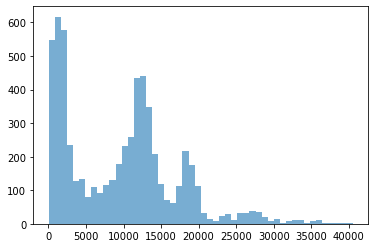

In [26]:
# let's plot a quick histogram

plt.hist(balboa_dists, bins=50, alpha=0.6)
plt.show()

In [27]:
data_proj["balboa_dist"] = data_proj.index.map(dict_dist_to_balboa)
print(len(data_proj))
data_proj = data_proj[data_proj['balboa_dist']!='NaN']
data_proj.reset_index(inplace=True, drop=True)
print(len(data_proj))
data_proj.head()

6110
6092


,accommodates,bathrooms,bedrooms,beds,neighborhood,pool,d2balboa,coastal,price,log_price,...,pg_Apartment,pg_Condominium,pg_House,pg_Other,pg_Townhouse,rt_Entire_home/apt,rt_Private_room,rt_Shared_room,geometry,balboa_dist
0,5,2.0,2.0,2.0,North Hills,0,2.972077,0,425.0,6.052089,...,0,0,1,0,0,1,0,0,POINT (487849.961 3624022.580),1776.87
1,6,1.0,2.0,4.0,Mission Bay,0,11.501385,1,205.0,5.323010,...,0,1,0,0,0,1,0,0,POINT (476352.113 3627393.256),12324
2,2,1.0,1.0,1.0,North Hills,0,2.493893,0,99.0,4.595120,...,1,0,0,0,0,0,1,0,POINT (486772.302 3623943.385),1540.37
3,2,1.0,1.0,1.0,Mira Mesa,0,22.293757,0,72.0,4.276666,...,0,0,1,0,0,0,1,0,POINT (485725.689 3643659.514),25592
4,2,1.0,1.0,1.0,Roseville,0,6.829451,0,55.0,4.007333,...,0,0,1,0,0,0,1,0,POINT (479510.620 3622708.972),7387.22


Let's plot the distances to Balboa Park on a map! Getting a visual feel of the features you are engineering is important!

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


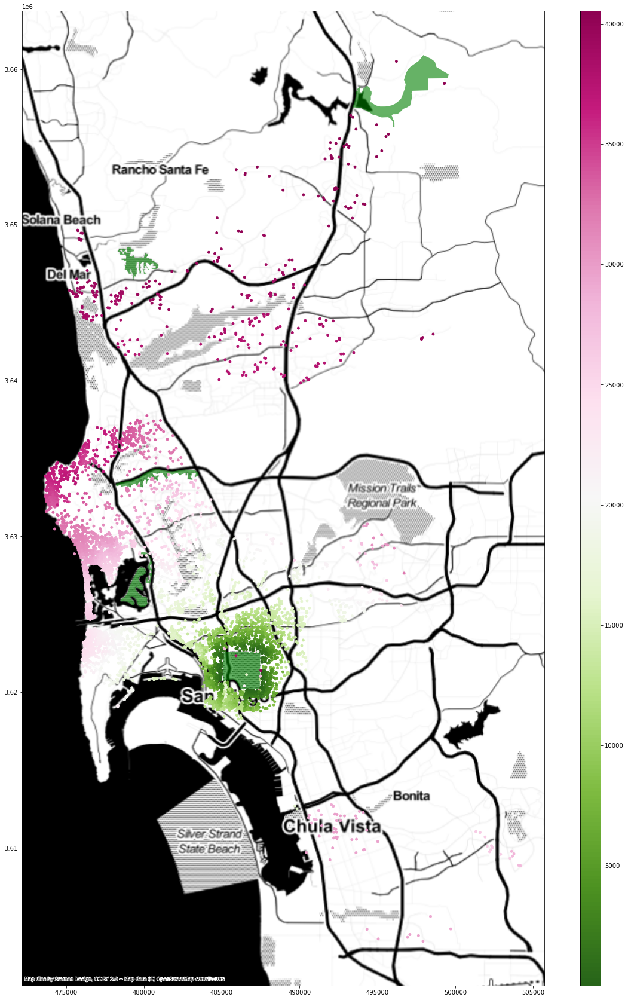

In [28]:
fig,ax = plt.subplots(1,figsize=(24, 30))

# ox.plot_graph(G_proj, ax=ax, show=False, close=False, \
#               node_color='grey', node_size=0, edge_linewidth=1.5, node_alpha=0.8, node_zorder=1, edge_color='grey', \
#               edge_alpha=0.5)

data_proj.plot(ax=ax, column = 'balboa_dist', cmap='PiYG_r', s=15, legend=False, zorder=3)
parks_proj.plot(ax=ax, color='green', alpha=0.6)

cbax = fig.add_axes([0.8, 0.125, 0.02, 0.755])

sm = plt.cm.ScalarMappable(cmap='PiYG_r', \
                          norm = plt.Normalize(vmin=min(data_proj.balboa_dist), vmax=max(data_proj.balboa_dist)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(
    ax, 
    crs=data_proj.crs.to_string(), 
    source=ctx.providers.Stamen.Toner
)

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


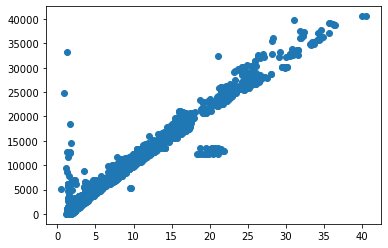

In [29]:
# quick correlation check wit the distance feature in the data
plt.scatter(data_proj.d2balboa, data_proj.balboa_dist)

### Distance to closest park

Now, let's compute the distance from each Airbnb listing to the closest park in San Diego.

In [30]:
parks_proj.head()

,geometry,name,area
0,"POLYGON ((485074.276 3622585.111, 485166.588 3...",Balboa Park,5.176288e+06
1,"POLYGON ((478189.278 3633399.110, 478324.887 3...",Marian Bear Natural Memorial Park,1.805759e+06
2,"POLYGON ((494403.217 3658891.314, 494464.280 3...",San Dieguito River Park,7.156036e+06
3,"MULTIPOLYGON (((480261.516 3625697.520, 480249...",Mission Bay Park,2.098622e+06
4,"POLYGON ((479031.978 3646872.451, 479020.122 3...",Gonzales Canyon Open Space,1.738148e+06


In [33]:
dict_dist_to_park = {}
for i in tqdm(range(len(data_proj))):
    point = data_proj.loc[i, "geometry"]
    origin = ox.distance.nearest_nodes(G_proj, point.coords[0][0], point.coords[0][1])
    dists_to_parks = []
    for j in range(len(parks_proj)):
        park = parks_proj.loc[j, 'geometry']
        candidate_pt, p2 = nearest_points(park, point)
        destination = ox.distance.nearest_nodes(G_proj, candidate_pt.coords[0][0], candidate_pt.coords[0][1])
        try:
            if origin!=destination:
                dist = nx.shortest_path_length(G_proj, origin, destination, weight = "length")
                dists_to_parks.append(dist)
        except:
            # since OpenStreetMap street networks are maintained by volunteers, they sometimes contain errors, such as 
            # topological inconsistencies, which can lead the code to raise errors. In order to avoid that, let's
            # try a simple but bad practice workaround:
            dist = 'NaN'
            dists_to_parks.append(dist)
            pass
    
    # make sure the dists_to_parks list doesn't contain any 'NaN's using a generator expression
    try:
        min_dist = min(dists_to_parks)
    except:
        min_dist = min(e for e in dists_to_parks if isinstance(e, float))
    print("Distance from listing {} to closest park: ".format(i), min_dist)
    dict_dist_to_park[i] = min_dist

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
  0%|                                                                             | 1/6092 [00:01<2:57:15,  1.75s/it]

Distance from listing 0 to closest park:  1776.874


  0%|                                                                             | 2/6092 [00:03<2:58:09,  1.76s/it]

Distance from listing 1 to closest park:  4461.405


  0%|                                                                             | 3/6092 [00:05<2:52:33,  1.70s/it]

Distance from listing 2 to closest park:  1540.368


  0%|                                                                             | 4/6092 [00:06<2:45:23,  1.63s/it]

Distance from listing 3 to closest park:  17720.201


  0%|                                                                             | 5/6092 [00:08<2:50:52,  1.68s/it]

Distance from listing 4 to closest park:  5915.552000000001


  0%|                                                                             | 6/6092 [00:09<2:46:23,  1.64s/it]

Distance from listing 5 to closest park:  2595.1220000000003


  0%|                                                                             | 7/6092 [00:11<2:41:41,  1.59s/it]

Distance from listing 6 to closest park:  4494.973


  0%|                                                                             | 8/6092 [00:13<2:48:11,  1.66s/it]

Distance from listing 7 to closest park:  7054.634000000002


  0%|                                                                             | 9/6092 [00:14<2:40:23,  1.58s/it]

Distance from listing 8 to closest park:  4175.423999999999


  0%|                                                                            | 10/6092 [00:16<2:34:44,  1.53s/it]

Distance from listing 9 to closest park:  2881.212


  0%|▏                                                                           | 11/6092 [00:17<2:43:27,  1.61s/it]

Distance from listing 10 to closest park:  3478.341000000001


  0%|▏                                                                           | 12/6092 [00:19<2:43:06,  1.61s/it]

Distance from listing 11 to closest park:  7449.714


  0%|▏                                                                           | 13/6092 [00:20<2:38:20,  1.56s/it]

Distance from listing 12 to closest park:  4383.729


  0%|▏                                                                           | 14/6092 [00:22<2:45:20,  1.63s/it]

Distance from listing 13 to closest park:  5222.693


  0%|▏                                                                           | 15/6092 [00:24<2:41:39,  1.60s/it]

Distance from listing 14 to closest park:  583.347


  0%|▏                                                                           | 16/6092 [00:25<2:38:13,  1.56s/it]

Distance from listing 15 to closest park:  501.97400000000005


  0%|▏                                                                           | 17/6092 [00:27<2:44:28,  1.62s/it]

Distance from listing 16 to closest park:  7001.406000000002


  0%|▏                                                                           | 18/6092 [00:28<2:38:01,  1.56s/it]

Distance from listing 17 to closest park:  6941.475000000002


  0%|▏                                                                           | 19/6092 [00:30<2:32:48,  1.51s/it]

Distance from listing 18 to closest park:  6955.373000000002


  0%|▏                                                                           | 20/6092 [00:32<2:46:48,  1.65s/it]

Distance from listing 19 to closest park:  1521.408


  0%|▎                                                                           | 21/6092 [00:33<2:45:00,  1.63s/it]

Distance from listing 20 to closest park:  7081.597


  0%|▎                                                                           | 22/6092 [00:35<2:40:07,  1.58s/it]

Distance from listing 21 to closest park:  6229.470000000001


  0%|▎                                                                           | 23/6092 [00:37<2:53:32,  1.72s/it]

Distance from listing 22 to closest park:  6606.451999999999


  0%|▎                                                                           | 24/6092 [00:39<2:55:46,  1.74s/it]

Distance from listing 23 to closest park:  1707.339


  0%|▎                                                                           | 25/6092 [00:40<2:50:54,  1.69s/it]

Distance from listing 24 to closest park:  5762.301000000001


  0%|▎                                                                           | 26/6092 [00:42<3:02:18,  1.80s/it]

Distance from listing 25 to closest park:  5853.341000000001


  0%|▎                                                                           | 27/6092 [00:44<3:01:30,  1.80s/it]

Distance from listing 26 to closest park:  3558.487


  0%|▎                                                                           | 28/6092 [00:46<2:58:01,  1.76s/it]

Distance from listing 27 to closest park:  1395.269


  0%|▎                                                                           | 29/6092 [00:47<2:57:51,  1.76s/it]

Distance from listing 28 to closest park:  4272.567999999999


  0%|▎                                                                           | 30/6092 [00:49<2:50:25,  1.69s/it]

Distance from listing 29 to closest park:  4359.688999999999


  1%|▍                                                                           | 31/6092 [00:50<2:45:03,  1.63s/it]

Distance from listing 30 to closest park:  8713.960000000003


  1%|▍                                                                           | 32/6092 [00:52<2:54:03,  1.72s/it]

Distance from listing 31 to closest park:  3797.5029999999992


  1%|▍                                                                           | 33/6092 [00:54<2:54:17,  1.73s/it]

Distance from listing 32 to closest park:  3442.601


  1%|▍                                                                           | 34/6092 [00:56<2:55:39,  1.74s/it]

Distance from listing 33 to closest park:  1964.437


  1%|▍                                                                           | 35/6092 [00:58<2:58:16,  1.77s/it]

Distance from listing 34 to closest park:  4085.1050000000005


  1%|▍                                                                           | 36/6092 [00:59<2:53:55,  1.72s/it]

Distance from listing 35 to closest park:  13453.092


  1%|▍                                                                           | 37/6092 [01:01<2:48:36,  1.67s/it]

Distance from listing 36 to closest park:  13475.883000000002


  1%|▍                                                                           | 38/6092 [01:03<2:54:15,  1.73s/it]

Distance from listing 37 to closest park:  5824.725


  1%|▍                                                                           | 39/6092 [01:04<2:47:43,  1.66s/it]

Distance from listing 38 to closest park:  1333.2559999999999


  1%|▍                                                                           | 40/6092 [01:06<2:44:34,  1.63s/it]

Distance from listing 39 to closest park:  4007.811


  1%|▌                                                                           | 41/6092 [01:08<2:58:13,  1.77s/it]

Distance from listing 40 to closest park:  284.249


  1%|▌                                                                           | 42/6092 [01:09<2:51:16,  1.70s/it]

Distance from listing 41 to closest park:  4187.912


  1%|▌                                                                           | 43/6092 [01:11<2:47:08,  1.66s/it]

Distance from listing 42 to closest park:  984.7440000000001


  1%|▌                                                                           | 44/6092 [01:13<2:43:18,  1.62s/it]

Distance from listing 43 to closest park:  1050.2199999999998


  1%|▌                                                                           | 45/6092 [01:14<2:51:27,  1.70s/it]

Distance from listing 44 to closest park:  4268.0509999999995


  1%|▌                                                                           | 46/6092 [01:16<2:44:20,  1.63s/it]

Distance from listing 45 to closest park:  7027.355000000001


  1%|▌                                                                           | 47/6092 [01:18<2:44:56,  1.64s/it]

Distance from listing 46 to closest park:  4740.481999999999


  1%|▌                                                                           | 48/6092 [01:19<2:53:35,  1.72s/it]

Distance from listing 47 to closest park:  4978.367


  1%|▌                                                                           | 49/6092 [01:21<2:46:04,  1.65s/it]

Distance from listing 48 to closest park:  3524.4190000000003


  1%|▌                                                                           | 50/6092 [01:23<2:44:50,  1.64s/it]

Distance from listing 49 to closest park:  85.24199999999999


  1%|▋                                                                           | 51/6092 [01:25<2:55:01,  1.74s/it]

Distance from listing 50 to closest park:  4861.124


  1%|▋                                                                           | 52/6092 [01:26<2:49:40,  1.69s/it]

Distance from listing 51 to closest park:  2164.652


  1%|▋                                                                           | 53/6092 [01:28<2:50:51,  1.70s/it]

Distance from listing 52 to closest park:  2041.5969999999998


  1%|▋                                                                           | 54/6092 [01:30<3:04:10,  1.83s/it]

Distance from listing 53 to closest park:  586.998


  1%|▋                                                                           | 55/6092 [01:31<2:51:08,  1.70s/it]

Distance from listing 54 to closest park:  3033.6810000000005


  1%|▋                                                                           | 56/6092 [01:33<2:53:11,  1.72s/it]

Distance from listing 55 to closest park:  4074.107


  1%|▋                                                                           | 57/6092 [01:35<3:06:58,  1.86s/it]

Distance from listing 56 to closest park:  3826.981


  1%|▋                                                                           | 58/6092 [01:37<3:07:23,  1.86s/it]

Distance from listing 57 to closest park:  232.97


  1%|▋                                                                           | 59/6092 [01:39<3:06:21,  1.85s/it]

Distance from listing 58 to closest park:  673.384


  1%|▋                                                                           | 60/6092 [01:41<3:13:57,  1.93s/it]

Distance from listing 59 to closest park:  1367.387


  1%|▊                                                                           | 61/6092 [01:43<3:00:35,  1.80s/it]

Distance from listing 60 to closest park:  6586.214000000001


  1%|▊                                                                           | 62/6092 [01:44<2:55:45,  1.75s/it]

Distance from listing 61 to closest park:  1985.434


  1%|▊                                                                           | 63/6092 [01:46<3:01:51,  1.81s/it]

Distance from listing 62 to closest park:  6695.8949999999995


  1%|▊                                                                           | 64/6092 [01:48<2:53:23,  1.73s/it]

Distance from listing 63 to closest park:  2954.03


  1%|▊                                                                           | 65/6092 [01:49<2:48:38,  1.68s/it]

Distance from listing 64 to closest park:  167.99300000000002


  1%|▊                                                                           | 66/6092 [01:51<2:53:47,  1.73s/it]

Distance from listing 65 to closest park:  3937.223


  1%|▊                                                                           | 67/6092 [01:53<2:49:43,  1.69s/it]

Distance from listing 66 to closest park:  1278.836


  1%|▊                                                                           | 68/6092 [01:54<2:45:51,  1.65s/it]

Distance from listing 67 to closest park:  1538.777


  1%|▊                                                                           | 69/6092 [01:56<2:56:59,  1.76s/it]

Distance from listing 68 to closest park:  1172.885


  1%|▊                                                                           | 70/6092 [01:58<2:51:37,  1.71s/it]

Distance from listing 69 to closest park:  1397.242


  1%|▉                                                                           | 71/6092 [01:59<2:47:14,  1.67s/it]

Distance from listing 70 to closest park:  1290.0439999999999


  1%|▉                                                                           | 72/6092 [02:01<2:56:03,  1.75s/it]

Distance from listing 71 to closest park:  1397.242


  1%|▉                                                                           | 73/6092 [02:03<2:48:49,  1.68s/it]

Distance from listing 72 to closest park:  15133.925000000001


  1%|▉                                                                           | 74/6092 [02:05<2:45:50,  1.65s/it]

Distance from listing 73 to closest park:  1057.3020000000001


  1%|▉                                                                           | 75/6092 [02:06<2:52:51,  1.72s/it]

Distance from listing 74 to closest park:  5224.537999999999


  1%|▉                                                                           | 76/6092 [02:08<2:47:26,  1.67s/it]

Distance from listing 75 to closest park:  1267.564


  1%|▉                                                                           | 77/6092 [02:10<2:43:06,  1.63s/it]

Distance from listing 76 to closest park:  4331.996


  1%|▉                                                                           | 78/6092 [02:12<2:53:53,  1.73s/it]

Distance from listing 77 to closest park:  1748.056


  1%|▉                                                                           | 79/6092 [02:13<2:48:34,  1.68s/it]

Distance from listing 78 to closest park:  1141.172


  1%|▉                                                                           | 80/6092 [02:15<2:43:57,  1.64s/it]

Distance from listing 79 to closest park:  1990.804


  1%|█                                                                           | 81/6092 [02:16<2:49:57,  1.70s/it]

Distance from listing 80 to closest park:  3809.363


  1%|█                                                                           | 82/6092 [02:18<2:48:01,  1.68s/it]

Distance from listing 81 to closest park:  4785.491999999999


  1%|█                                                                           | 83/6092 [02:20<2:45:48,  1.66s/it]

Distance from listing 82 to closest park:  821.987


  1%|█                                                                           | 84/6092 [02:21<2:49:49,  1.70s/it]

Distance from listing 83 to closest park:  2970.1519999999996


  1%|█                                                                           | 85/6092 [02:23<2:43:52,  1.64s/it]

Distance from listing 84 to closest park:  1868.258


  1%|█                                                                           | 86/6092 [02:24<2:38:30,  1.58s/it]

Distance from listing 85 to closest park:  3298.409


  1%|█                                                                           | 87/6092 [02:26<2:48:22,  1.68s/it]

Distance from listing 86 to closest park:  3097.6139999999996


  1%|█                                                                           | 88/6092 [02:28<2:46:10,  1.66s/it]

Distance from listing 87 to closest park:  167.99300000000002


  1%|█                                                                           | 89/6092 [02:30<2:45:01,  1.65s/it]

Distance from listing 88 to closest park:  2335.6980000000003


  1%|█                                                                           | 90/6092 [02:31<2:51:17,  1.71s/it]

Distance from listing 89 to closest park:  7950.149000000001


  1%|█▏                                                                          | 91/6092 [02:33<2:46:41,  1.67s/it]

Distance from listing 90 to closest park:  425.202


  2%|█▏                                                                          | 92/6092 [02:34<2:42:03,  1.62s/it]

Distance from listing 91 to closest park:  1945.7720000000004


  2%|█▏                                                                          | 93/6092 [02:36<2:47:55,  1.68s/it]

Distance from listing 92 to closest park:  3272.5320000000006


  2%|█▏                                                                          | 94/6092 [02:38<2:41:22,  1.61s/it]

Distance from listing 93 to closest park:  7787.539000000001


  2%|█▏                                                                          | 95/6092 [02:39<2:37:13,  1.57s/it]

Distance from listing 94 to closest park:  6243.935


  2%|█▏                                                                          | 96/6092 [02:41<2:41:54,  1.62s/it]

Distance from listing 95 to closest park:  1438.3450000000003


  2%|█▏                                                                          | 97/6092 [02:42<2:35:49,  1.56s/it]

Distance from listing 96 to closest park:  5564.977000000001


  2%|█▏                                                                          | 98/6092 [02:44<2:32:03,  1.52s/it]

Distance from listing 97 to closest park:  3993.77


  2%|█▏                                                                          | 99/6092 [02:46<2:42:07,  1.62s/it]

Distance from listing 98 to closest park:  2616.377


  2%|█▏                                                                         | 100/6092 [02:47<2:35:48,  1.56s/it]

Distance from listing 99 to closest park:  3759.463


  2%|█▏                                                                         | 101/6092 [02:48<2:30:12,  1.50s/it]

Distance from listing 100 to closest park:  6403.260000000001


  2%|█▎                                                                         | 102/6092 [02:50<2:40:05,  1.60s/it]

Distance from listing 101 to closest park:  5041.083


  2%|█▎                                                                         | 103/6092 [02:52<2:33:48,  1.54s/it]

Distance from listing 102 to closest park:  5456.914000000001


  2%|█▎                                                                         | 104/6092 [02:53<2:28:40,  1.49s/it]

Distance from listing 103 to closest park:  5935.462


  2%|█▎                                                                         | 105/6092 [02:55<2:43:29,  1.64s/it]

Distance from listing 104 to closest park:  1336.1360000000002


  2%|█▎                                                                         | 106/6092 [02:57<2:42:07,  1.62s/it]

Distance from listing 105 to closest park:  3525.906


  2%|█▎                                                                         | 107/6092 [02:58<2:40:08,  1.61s/it]

Distance from listing 106 to closest park:  1163.088


  2%|█▎                                                                         | 108/6092 [03:00<2:39:04,  1.60s/it]

Distance from listing 107 to closest park:  1012.5799999999999


  2%|█▎                                                                         | 109/6092 [03:02<2:43:57,  1.64s/it]

Distance from listing 108 to closest park:  4219.514


  2%|█▎                                                                         | 110/6092 [03:03<2:41:22,  1.62s/it]

Distance from listing 109 to closest park:  3525.284


  2%|█▎                                                                         | 111/6092 [03:05<2:40:21,  1.61s/it]

Distance from listing 110 to closest park:  400.615


  2%|█▍                                                                         | 112/6092 [03:07<2:49:11,  1.70s/it]

Distance from listing 111 to closest park:  1021.6790000000001


  2%|█▍                                                                         | 113/6092 [03:08<2:43:49,  1.64s/it]

Distance from listing 112 to closest park:  1021.6790000000001


  2%|█▍                                                                         | 114/6092 [03:10<2:39:49,  1.60s/it]

Distance from listing 113 to closest park:  256.43600000000004


  2%|█▍                                                                         | 115/6092 [03:12<2:51:16,  1.72s/it]

Distance from listing 114 to closest park:  985.6080000000001


  2%|█▍                                                                         | 116/6092 [03:13<2:46:28,  1.67s/it]

Distance from listing 115 to closest park:  422.28000000000003


  2%|█▍                                                                         | 117/6092 [03:15<2:45:36,  1.66s/it]

Distance from listing 116 to closest park:  424.207


  2%|█▍                                                                         | 118/6092 [03:17<2:53:08,  1.74s/it]

Distance from listing 117 to closest park:  741.6289999999999


  2%|█▍                                                                         | 119/6092 [03:18<2:42:49,  1.64s/it]

Distance from listing 118 to closest park:  7012.641999999999


  2%|█▍                                                                         | 120/6092 [03:20<2:39:15,  1.60s/it]

Distance from listing 119 to closest park:  597.879


  2%|█▍                                                                         | 121/6092 [03:22<2:55:53,  1.77s/it]

Distance from listing 120 to closest park:  1021.086


  2%|█▌                                                                         | 122/6092 [03:23<2:50:27,  1.71s/it]

Distance from listing 121 to closest park:  2967.4249999999997


  2%|█▌                                                                         | 123/6092 [03:25<2:45:05,  1.66s/it]

Distance from listing 122 to closest park:  2754.891


  2%|█▌                                                                         | 124/6092 [03:27<2:49:41,  1.71s/it]

Distance from listing 123 to closest park:  4153.705


  2%|█▌                                                                         | 125/6092 [03:28<2:45:53,  1.67s/it]

Distance from listing 124 to closest park:  1108.525


  2%|█▌                                                                         | 126/6092 [03:30<2:43:48,  1.65s/it]

Distance from listing 125 to closest park:  585.3109999999999


  2%|█▌                                                                         | 127/6092 [03:32<2:53:24,  1.74s/it]

Distance from listing 126 to closest park:  815.7560000000001


  2%|█▌                                                                         | 128/6092 [03:33<2:49:22,  1.70s/it]

Distance from listing 127 to closest park:  726.2849999999999


  2%|█▌                                                                         | 129/6092 [03:35<2:44:52,  1.66s/it]

Distance from listing 128 to closest park:  512.638


  2%|█▌                                                                         | 130/6092 [03:37<2:49:12,  1.70s/it]

Distance from listing 129 to closest park:  7010.515000000002


  2%|█▌                                                                         | 131/6092 [03:38<2:46:17,  1.67s/it]

Distance from listing 130 to closest park:  405.584


  2%|█▋                                                                         | 132/6092 [03:40<2:42:53,  1.64s/it]

Distance from listing 131 to closest park:  7038.054


  2%|█▋                                                                         | 133/6092 [03:42<2:52:06,  1.73s/it]

Distance from listing 132 to closest park:  8051.598


  2%|█▋                                                                         | 134/6092 [03:44<2:49:47,  1.71s/it]

Distance from listing 133 to closest park:  3477.943


  2%|█▋                                                                         | 135/6092 [03:45<2:52:11,  1.73s/it]

Distance from listing 134 to closest park:  510.05199999999996


  2%|█▋                                                                         | 136/6092 [03:48<3:06:20,  1.88s/it]

Distance from listing 135 to closest park:  1626.7349999999997


  2%|█▋                                                                         | 137/6092 [03:49<2:58:49,  1.80s/it]

Distance from listing 136 to closest park:  2313.008


  2%|█▋                                                                         | 138/6092 [03:51<2:53:37,  1.75s/it]

Distance from listing 137 to closest park:  5474.961


  2%|█▋                                                                         | 139/6092 [03:53<2:59:24,  1.81s/it]

Distance from listing 138 to closest park:  1578.5639999999999


  2%|█▋                                                                         | 140/6092 [03:55<2:56:42,  1.78s/it]

Distance from listing 139 to closest park:  1540.368


  2%|█▋                                                                         | 141/6092 [03:56<2:52:58,  1.74s/it]

Distance from listing 140 to closest park:  9593.982999999997


  2%|█▋                                                                         | 142/6092 [03:58<2:48:57,  1.70s/it]

Distance from listing 141 to closest park:  2055.018


  2%|█▊                                                                         | 143/6092 [04:00<2:58:11,  1.80s/it]

Distance from listing 142 to closest park:  2174.626


  2%|█▊                                                                         | 144/6092 [04:01<2:48:53,  1.70s/it]

Distance from listing 143 to closest park:  4305.0160000000005


  2%|█▊                                                                         | 145/6092 [04:03<2:43:00,  1.64s/it]

Distance from listing 144 to closest park:  3721.060000000001


  2%|█▊                                                                         | 146/6092 [04:05<2:50:40,  1.72s/it]

Distance from listing 145 to closest park:  4254.956


  2%|█▊                                                                         | 147/6092 [04:06<2:48:57,  1.71s/it]

Distance from listing 146 to closest park:  3164.3880000000004


  2%|█▊                                                                         | 148/6092 [04:08<2:44:20,  1.66s/it]

Distance from listing 147 to closest park:  6764.085000000002


  2%|█▊                                                                         | 149/6092 [04:10<3:00:48,  1.83s/it]

Distance from listing 148 to closest park:  826.1630000000001


  2%|█▊                                                                         | 150/6092 [04:12<3:04:32,  1.86s/it]

Distance from listing 149 to closest park:  5168.320000000001


  2%|█▊                                                                         | 151/6092 [04:14<2:59:22,  1.81s/it]

Distance from listing 150 to closest park:  1204.172


  2%|█▊                                                                         | 152/6092 [04:16<3:10:13,  1.92s/it]

Distance from listing 151 to closest park:  3339.4139999999993


  3%|█▉                                                                         | 153/6092 [04:18<3:04:36,  1.87s/it]

Distance from listing 152 to closest park:  1099.044


  3%|█▉                                                                         | 154/6092 [04:19<3:02:11,  1.84s/it]

Distance from listing 153 to closest park:  1316.9699999999998


  3%|█▉                                                                         | 155/6092 [04:21<3:03:47,  1.86s/it]

Distance from listing 154 to closest park:  4940.506


  3%|█▉                                                                         | 156/6092 [04:23<2:54:46,  1.77s/it]

Distance from listing 155 to closest park:  2022.3710000000003


  3%|█▉                                                                         | 157/6092 [04:25<2:56:05,  1.78s/it]

Distance from listing 156 to closest park:  594.62


  3%|█▉                                                                         | 158/6092 [04:27<3:03:00,  1.85s/it]

Distance from listing 157 to closest park:  570.86


  3%|█▉                                                                         | 159/6092 [04:28<2:52:27,  1.74s/it]

Distance from listing 158 to closest park:  6954.395999999999


  3%|█▉                                                                         | 160/6092 [04:30<2:43:25,  1.65s/it]

Distance from listing 159 to closest park:  6786.723999999998


  3%|█▉                                                                         | 161/6092 [04:32<2:52:25,  1.74s/it]

Distance from listing 160 to closest park:  6626.4349999999995


  3%|█▉                                                                         | 162/6092 [04:33<2:45:04,  1.67s/it]

Distance from listing 161 to closest park:  3901.183


  3%|██                                                                         | 163/6092 [04:35<2:38:40,  1.61s/it]

Distance from listing 162 to closest park:  8211.395


  3%|██                                                                         | 164/6092 [04:37<2:47:20,  1.69s/it]

Distance from listing 163 to closest park:  1029.228


  3%|██                                                                         | 165/6092 [04:38<2:38:13,  1.60s/it]

Distance from listing 164 to closest park:  4082.950000000001


  3%|██                                                                         | 166/6092 [04:39<2:34:50,  1.57s/it]

Distance from listing 165 to closest park:  7005.657000000002


  3%|██                                                                         | 167/6092 [04:41<2:36:46,  1.59s/it]

Distance from listing 166 to closest park:  826.1630000000001


  3%|██                                                                         | 168/6092 [04:43<2:40:13,  1.62s/it]

Distance from listing 167 to closest park:  5644.057


  3%|██                                                                         | 169/6092 [04:44<2:37:41,  1.60s/it]

Distance from listing 168 to closest park:  714.9590000000001


  3%|██                                                                         | 170/6092 [04:46<2:36:28,  1.59s/it]

Distance from listing 169 to closest park:  594.581


  3%|██                                                                         | 171/6092 [04:48<2:46:56,  1.69s/it]

Distance from listing 170 to closest park:  1296.423


  3%|██                                                                         | 172/6092 [04:49<2:44:18,  1.67s/it]

Distance from listing 171 to closest park:  5288.560000000001


  3%|██▏                                                                        | 173/6092 [04:51<2:38:03,  1.60s/it]

Distance from listing 172 to closest park:  2762.365


  3%|██▏                                                                        | 174/6092 [04:53<2:46:09,  1.68s/it]

Distance from listing 173 to closest park:  2108.9480000000003


  3%|██▏                                                                        | 175/6092 [04:54<2:37:46,  1.60s/it]

Distance from listing 174 to closest park:  13862.149000000001


  3%|██▏                                                                        | 176/6092 [04:56<2:35:57,  1.58s/it]

Distance from listing 175 to closest park:  991.313


  3%|██▏                                                                        | 177/6092 [04:57<2:40:24,  1.63s/it]

Distance from listing 176 to closest park:  4467.465


  3%|██▏                                                                        | 178/6092 [04:59<2:37:31,  1.60s/it]

Distance from listing 177 to closest park:  865.767


  3%|██▏                                                                        | 179/6092 [05:00<2:32:20,  1.55s/it]

Distance from listing 178 to closest park:  7041.092999999999


  3%|██▏                                                                        | 180/6092 [05:02<2:41:40,  1.64s/it]

Distance from listing 179 to closest park:  3550.685


  3%|██▏                                                                        | 181/6092 [05:04<2:37:52,  1.60s/it]

Distance from listing 180 to closest park:  424.63899999999995


  3%|██▏                                                                        | 182/6092 [05:05<2:35:29,  1.58s/it]

Distance from listing 181 to closest park:  421.134


  3%|██▎                                                                        | 183/6092 [05:07<2:40:40,  1.63s/it]

Distance from listing 182 to closest park:  3816.5399999999995


  3%|██▎                                                                        | 184/6092 [05:08<2:35:24,  1.58s/it]

Distance from listing 183 to closest park:  5183.700000000001


  3%|██▎                                                                        | 185/6092 [05:10<2:30:00,  1.52s/it]

Distance from listing 184 to closest park:  3028.2209999999995


  3%|██▎                                                                        | 186/6092 [05:12<2:38:38,  1.61s/it]

Distance from listing 185 to closest park:  4416.661


  3%|██▎                                                                        | 187/6092 [05:13<2:32:04,  1.55s/it]

Distance from listing 186 to closest park:  3471.63


  3%|██▎                                                                        | 188/6092 [05:14<2:27:22,  1.50s/it]

Distance from listing 187 to closest park:  3832.7059999999997


  3%|██▎                                                                        | 189/6092 [05:16<2:26:07,  1.49s/it]

Distance from listing 188 to closest park:  8211.395


  3%|██▎                                                                        | 190/6092 [05:18<2:37:57,  1.61s/it]

Distance from listing 189 to closest park:  2902.666


  3%|██▎                                                                        | 191/6092 [05:19<2:34:27,  1.57s/it]

Distance from listing 190 to closest park:  1947.549


  3%|██▎                                                                        | 192/6092 [05:21<2:28:25,  1.51s/it]

Distance from listing 191 to closest park:  6018.036


  3%|██▍                                                                        | 193/6092 [05:22<2:34:56,  1.58s/it]

Distance from listing 192 to closest park:  4393.38


  3%|██▍                                                                        | 194/6092 [05:24<2:29:27,  1.52s/it]

Distance from listing 193 to closest park:  18054.700000000004


  3%|██▍                                                                        | 195/6092 [05:25<2:30:00,  1.53s/it]

Distance from listing 194 to closest park:  348.719


  3%|██▍                                                                        | 196/6092 [05:27<2:36:31,  1.59s/it]

Distance from listing 195 to closest park:  4568.079000000001


  3%|██▍                                                                        | 197/6092 [05:28<2:31:52,  1.55s/it]

Distance from listing 196 to closest park:  7323.923999999999


  3%|██▍                                                                        | 198/6092 [05:30<2:26:38,  1.49s/it]

Distance from listing 197 to closest park:  5490.339000000001


  3%|██▍                                                                        | 199/6092 [05:32<2:34:48,  1.58s/it]

Distance from listing 198 to closest park:  6405.887


  3%|██▍                                                                        | 200/6092 [05:33<2:30:03,  1.53s/it]

Distance from listing 199 to closest park:  6497.2080000000005


  3%|██▍                                                                        | 201/6092 [05:35<2:29:51,  1.53s/it]

Distance from listing 200 to closest park:  6634.8279999999995


  3%|██▍                                                                        | 202/6092 [05:36<2:37:53,  1.61s/it]

Distance from listing 201 to closest park:  4244.098


  3%|██▍                                                                        | 203/6092 [05:38<2:37:45,  1.61s/it]

Distance from listing 202 to closest park:  399.962


  3%|██▌                                                                        | 204/6092 [05:40<2:37:36,  1.61s/it]

Distance from listing 203 to closest park:  3511.0920000000006


  3%|██▌                                                                        | 205/6092 [05:42<2:51:21,  1.75s/it]

Distance from listing 204 to closest park:  3824.143


  3%|██▌                                                                        | 206/6092 [05:43<2:54:28,  1.78s/it]

Distance from listing 205 to closest park:  511.50899999999996


  3%|██▌                                                                        | 207/6092 [05:45<2:48:48,  1.72s/it]

Distance from listing 206 to closest park:  875.44


  3%|██▌                                                                        | 208/6092 [05:47<2:54:09,  1.78s/it]

Distance from listing 207 to closest park:  4925.054


  3%|██▌                                                                        | 209/6092 [05:49<2:47:29,  1.71s/it]

Distance from listing 208 to closest park:  3329.444


  3%|██▌                                                                        | 210/6092 [05:50<2:43:06,  1.66s/it]

Distance from listing 209 to closest park:  911.3930000000001


  3%|██▌                                                                        | 211/6092 [05:52<2:46:59,  1.70s/it]

Distance from listing 210 to closest park:  3988.8349999999996


  3%|██▌                                                                        | 212/6092 [05:53<2:41:53,  1.65s/it]

Distance from listing 211 to closest park:  5608.952000000001


  3%|██▌                                                                        | 213/6092 [05:55<2:35:24,  1.59s/it]

Distance from listing 212 to closest park:  4217.806


  4%|██▋                                                                        | 214/6092 [05:57<2:40:31,  1.64s/it]

Distance from listing 213 to closest park:  6765.717


  4%|██▋                                                                        | 215/6092 [05:58<2:36:20,  1.60s/it]

Distance from listing 214 to closest park:  1371.5300000000002


  4%|██▋                                                                        | 216/6092 [06:00<2:36:04,  1.59s/it]

Distance from listing 215 to closest park:  404.014


  4%|██▋                                                                        | 217/6092 [06:02<2:43:24,  1.67s/it]

Distance from listing 216 to closest park:  977.208


  4%|██▋                                                                        | 218/6092 [06:03<2:39:37,  1.63s/it]

Distance from listing 217 to closest park:  2221.965


  4%|██▋                                                                        | 219/6092 [06:05<2:34:35,  1.58s/it]

Distance from listing 218 to closest park:  1638.281


  4%|██▋                                                                        | 220/6092 [06:06<2:35:54,  1.59s/it]

Distance from listing 219 to closest park:  4814.791


  4%|██▋                                                                        | 221/6092 [06:08<2:43:23,  1.67s/it]

Distance from listing 220 to closest park:  4919.364


  4%|██▋                                                                        | 222/6092 [06:09<2:37:35,  1.61s/it]

Distance from listing 221 to closest park:  8140.120000000001


  4%|██▋                                                                        | 223/6092 [06:11<2:35:02,  1.59s/it]

Distance from listing 222 to closest park:  405.584


  4%|██▊                                                                        | 224/6092 [06:13<2:44:08,  1.68s/it]

Distance from listing 223 to closest park:  2700.47


  4%|██▊                                                                        | 225/6092 [06:14<2:40:43,  1.64s/it]

Distance from listing 224 to closest park:  2136.3470000000007


  4%|██▊                                                                        | 226/6092 [06:16<2:36:14,  1.60s/it]

Distance from listing 225 to closest park:  4532.032


  4%|██▊                                                                        | 227/6092 [06:18<2:41:41,  1.65s/it]

Distance from listing 226 to closest park:  3705.16


  4%|██▊                                                                        | 228/6092 [06:19<2:35:46,  1.59s/it]

Distance from listing 227 to closest park:  3075.243


  4%|██▊                                                                        | 229/6092 [06:21<2:34:15,  1.58s/it]

Distance from listing 228 to closest park:  1111.374


  4%|██▊                                                                        | 230/6092 [06:23<2:46:23,  1.70s/it]

Distance from listing 229 to closest park:  3652.138


  4%|██▊                                                                        | 231/6092 [06:24<2:41:25,  1.65s/it]

Distance from listing 230 to closest park:  1878.382


  4%|██▊                                                                        | 232/6092 [06:26<2:33:40,  1.57s/it]

Distance from listing 231 to closest park:  4115.049000000001


  4%|██▊                                                                        | 233/6092 [06:27<2:34:31,  1.58s/it]

Distance from listing 232 to closest park:  7997.384000000002


  4%|██▉                                                                        | 234/6092 [06:29<2:44:05,  1.68s/it]

Distance from listing 233 to closest park:  4705.93


  4%|██▉                                                                        | 235/6092 [06:31<2:38:34,  1.62s/it]

Distance from listing 234 to closest park:  523.086


  4%|██▉                                                                        | 236/6092 [06:32<2:33:08,  1.57s/it]

Distance from listing 235 to closest park:  6484.945000000001


  4%|██▉                                                                        | 237/6092 [06:34<2:38:14,  1.62s/it]

Distance from listing 236 to closest park:  4286.538


  4%|██▉                                                                        | 238/6092 [06:35<2:31:12,  1.55s/it]

Distance from listing 237 to closest park:  5741.670000000001


  4%|██▉                                                                        | 239/6092 [06:37<2:25:25,  1.49s/it]

Distance from listing 238 to closest park:  6055.617


  4%|██▉                                                                        | 240/6092 [06:38<2:32:11,  1.56s/it]

Distance from listing 239 to closest park:  5457.126


  4%|██▉                                                                        | 241/6092 [06:40<2:27:09,  1.51s/it]

Distance from listing 240 to closest park:  3471.63


  4%|██▉                                                                        | 242/6092 [06:41<2:24:40,  1.48s/it]

Distance from listing 241 to closest park:  4470.348


  4%|██▉                                                                        | 243/6092 [06:42<2:21:20,  1.45s/it]

Distance from listing 242 to closest park:  13154.971999999996


  4%|███                                                                        | 244/6092 [06:44<2:33:30,  1.58s/it]

Distance from listing 243 to closest park:  1321.765


  4%|███                                                                        | 245/6092 [06:46<2:28:55,  1.53s/it]

Distance from listing 244 to closest park:  16240.208999999997


  4%|███                                                                        | 246/6092 [06:47<2:25:37,  1.49s/it]

Distance from listing 245 to closest park:  5589.676000000001


  4%|███                                                                        | 247/6092 [06:49<2:41:46,  1.66s/it]

Distance from listing 246 to closest park:  1336.677


  4%|███                                                                        | 248/6092 [06:51<2:38:11,  1.62s/it]

Distance from listing 247 to closest park:  4027.1520000000005


  4%|███                                                                        | 249/6092 [06:52<2:33:02,  1.57s/it]

Distance from listing 248 to closest park:  5183.700000000001


  4%|███                                                                        | 250/6092 [06:54<2:41:42,  1.66s/it]

Distance from listing 249 to closest park:  655.087


  4%|███                                                                        | 251/6092 [06:55<2:32:02,  1.56s/it]

Distance from listing 250 to closest park:  2410.242


  4%|███                                                                        | 252/6092 [06:57<2:29:40,  1.54s/it]

Distance from listing 251 to closest park:  7146.771999999999


  4%|███                                                                        | 253/6092 [06:59<2:34:42,  1.59s/it]

Distance from listing 252 to closest park:  6299.951


  4%|███▏                                                                       | 254/6092 [07:00<2:33:52,  1.58s/it]

Distance from listing 253 to closest park:  7271.567000000001


  4%|███▏                                                                       | 255/6092 [07:02<2:34:04,  1.58s/it]

Distance from listing 254 to closest park:  83.47999999999999


  4%|███▏                                                                       | 256/6092 [07:04<2:42:26,  1.67s/it]

Distance from listing 255 to closest park:  508.46200000000005


  4%|███▏                                                                       | 257/6092 [07:05<2:41:05,  1.66s/it]

Distance from listing 256 to closest park:  13856.401


  4%|███▏                                                                       | 258/6092 [07:07<2:39:47,  1.64s/it]

Distance from listing 257 to closest park:  7712.7580000000025


  4%|███▏                                                                       | 259/6092 [07:09<2:49:24,  1.74s/it]

Distance from listing 258 to closest park:  7875.8330000000005


  4%|███▏                                                                       | 260/6092 [07:10<2:40:38,  1.65s/it]

Distance from listing 259 to closest park:  6328.27


  4%|███▏                                                                       | 261/6092 [07:12<2:33:46,  1.58s/it]

Distance from listing 260 to closest park:  3196.6829999999995


  4%|███▏                                                                       | 262/6092 [07:14<2:41:07,  1.66s/it]

Distance from listing 261 to closest park:  570.86


  4%|███▏                                                                       | 263/6092 [07:15<2:31:24,  1.56s/it]

Distance from listing 262 to closest park:  1367.5069999999998


  4%|███▎                                                                       | 264/6092 [07:16<2:31:29,  1.56s/it]

Distance from listing 263 to closest park:  1631.8849999999998


  4%|███▎                                                                       | 265/6092 [07:18<2:37:56,  1.63s/it]

Distance from listing 264 to closest park:  4249.319


  4%|███▎                                                                       | 266/6092 [07:20<2:31:59,  1.57s/it]

Distance from listing 265 to closest park:  6626.717000000001


  4%|███▎                                                                       | 267/6092 [07:21<2:30:31,  1.55s/it]

Distance from listing 266 to closest park:  2212.9399999999996


  4%|███▎                                                                       | 268/6092 [07:23<2:36:57,  1.62s/it]

Distance from listing 267 to closest park:  3954.753


  4%|███▎                                                                       | 269/6092 [07:25<2:36:41,  1.61s/it]

Distance from listing 268 to closest park:  7418.771000000001


  4%|███▎                                                                       | 270/6092 [07:26<2:29:03,  1.54s/it]

Distance from listing 269 to closest park:  3581.0129999999995


  4%|███▎                                                                       | 271/6092 [07:27<2:22:53,  1.47s/it]

Distance from listing 270 to closest park:  1434.866


  4%|███▎                                                                       | 272/6092 [07:29<2:31:58,  1.57s/it]

Distance from listing 271 to closest park:  6857.887999999999


  4%|███▎                                                                       | 273/6092 [07:30<2:28:01,  1.53s/it]

Distance from listing 272 to closest park:  6812.325


  4%|███▎                                                                       | 274/6092 [07:32<2:34:55,  1.60s/it]

Distance from listing 273 to closest park:  607.3870000000001


  5%|███▍                                                                       | 275/6092 [07:34<2:44:57,  1.70s/it]

Distance from listing 274 to closest park:  1088.684


  5%|███▍                                                                       | 276/6092 [07:36<2:36:43,  1.62s/it]

Distance from listing 275 to closest park:  5564.977000000001


  5%|███▍                                                                       | 277/6092 [07:37<2:38:32,  1.64s/it]

Distance from listing 276 to closest park:  7352.263999999999


  5%|███▍                                                                       | 278/6092 [07:39<2:51:03,  1.77s/it]

Distance from listing 277 to closest park:  7262.805


  5%|███▍                                                                       | 279/6092 [07:41<2:47:09,  1.73s/it]

Distance from listing 278 to closest park:  133.785


  5%|███▍                                                                       | 280/6092 [07:43<2:49:32,  1.75s/it]

Distance from listing 279 to closest park:  1815.7259999999999


  5%|███▍                                                                       | 281/6092 [07:45<3:10:43,  1.97s/it]

Distance from listing 280 to closest park:  348.719


  5%|███▍                                                                       | 282/6092 [07:47<3:10:19,  1.97s/it]

Distance from listing 281 to closest park:  1199.454


  5%|███▍                                                                       | 283/6092 [07:49<3:06:31,  1.93s/it]

Distance from listing 282 to closest park:  2504.409


  5%|███▍                                                                       | 284/6092 [07:51<3:12:57,  1.99s/it]

Distance from listing 283 to closest park:  1136.109


  5%|███▌                                                                       | 285/6092 [07:53<2:59:35,  1.86s/it]

Distance from listing 284 to closest park:  1057.3020000000001


  5%|███▌                                                                       | 286/6092 [07:54<2:53:26,  1.79s/it]

Distance from listing 285 to closest park:  917.0899999999999


  5%|███▌                                                                       | 287/6092 [07:56<2:56:32,  1.82s/it]

Distance from listing 286 to closest park:  2626.13


  5%|███▌                                                                       | 288/6092 [07:58<2:50:32,  1.76s/it]

Distance from listing 287 to closest park:  1051.719


  5%|███▌                                                                       | 289/6092 [08:00<2:47:48,  1.74s/it]

Distance from listing 288 to closest park:  7749.39


  5%|███▌                                                                       | 290/6092 [08:02<2:56:03,  1.82s/it]

Distance from listing 289 to closest park:  2601.648


  5%|███▌                                                                       | 291/6092 [08:03<2:48:54,  1.75s/it]

Distance from listing 290 to closest park:  15696.299999999997


  5%|███▌                                                                       | 292/6092 [08:05<2:41:30,  1.67s/it]

Distance from listing 291 to closest park:  4385.322


  5%|███▌                                                                       | 293/6092 [08:06<2:33:43,  1.59s/it]

Distance from listing 292 to closest park:  4427.043000000001


  5%|███▌                                                                       | 294/6092 [08:08<2:38:11,  1.64s/it]

Distance from listing 293 to closest park:  5243.967


  5%|███▋                                                                       | 295/6092 [08:09<2:32:10,  1.57s/it]

Distance from listing 294 to closest park:  7134.792999999999


  5%|███▋                                                                       | 296/6092 [08:11<2:28:26,  1.54s/it]

Distance from listing 295 to closest park:  8211.395


  5%|███▋                                                                       | 297/6092 [08:13<2:42:21,  1.68s/it]

Distance from listing 296 to closest park:  133.785


  5%|███▋                                                                       | 298/6092 [08:14<2:41:18,  1.67s/it]

Distance from listing 297 to closest park:  815.7560000000001


  5%|███▋                                                                       | 299/6092 [08:16<2:38:50,  1.65s/it]

Distance from listing 298 to closest park:  516.814


  5%|███▋                                                                       | 300/6092 [08:18<2:47:19,  1.73s/it]

Distance from listing 299 to closest park:  348.719


  5%|███▋                                                                       | 301/6092 [08:19<2:39:41,  1.65s/it]

Distance from listing 300 to closest park:  4104.289000000001


  5%|███▋                                                                       | 302/6092 [08:21<2:34:32,  1.60s/it]

Distance from listing 301 to closest park:  4967.653


  5%|███▋                                                                       | 303/6092 [08:23<2:44:55,  1.71s/it]

Distance from listing 302 to closest park:  143.351


  5%|███▋                                                                       | 304/6092 [08:24<2:37:43,  1.64s/it]

Distance from listing 303 to closest park:  4244.098


  5%|███▊                                                                       | 305/6092 [08:26<2:36:37,  1.62s/it]

Distance from listing 304 to closest park:  678.932


  5%|███▊                                                                       | 306/6092 [08:28<2:41:55,  1.68s/it]

Distance from listing 305 to closest park:  5936.106999999999


  5%|███▊                                                                       | 307/6092 [08:29<2:38:58,  1.65s/it]

Distance from listing 306 to closest park:  782.9860000000001


  5%|███▊                                                                       | 308/6092 [08:31<2:34:40,  1.60s/it]

Distance from listing 307 to closest park:  3534.9240000000004


  5%|███▊                                                                       | 309/6092 [08:32<2:30:33,  1.56s/it]

Distance from listing 308 to closest park:  3753.852


  5%|███▊                                                                       | 310/6092 [08:34<2:41:28,  1.68s/it]

Distance from listing 309 to closest park:  4284.601


  5%|███▊                                                                       | 311/6092 [08:36<2:37:06,  1.63s/it]

Distance from listing 310 to closest park:  6857.887999999999


  5%|███▊                                                                       | 312/6092 [08:37<2:32:42,  1.59s/it]

Distance from listing 311 to closest park:  3980.0389999999998


  5%|███▊                                                                       | 313/6092 [08:39<2:40:08,  1.66s/it]

Distance from listing 312 to closest park:  4878.495999999999


  5%|███▊                                                                       | 314/6092 [08:40<2:35:24,  1.61s/it]

Distance from listing 313 to closest park:  4769.811


  5%|███▉                                                                       | 315/6092 [08:42<2:31:48,  1.58s/it]

Distance from listing 314 to closest park:  3296.78


  5%|███▉                                                                       | 316/6092 [08:44<2:39:27,  1.66s/it]

Distance from listing 315 to closest park:  17047.805


  5%|███▉                                                                       | 317/6092 [08:45<2:37:24,  1.64s/it]

Distance from listing 316 to closest park:  138.772


  5%|███▉                                                                       | 318/6092 [08:47<2:38:31,  1.65s/it]

Distance from listing 317 to closest park:  1455.5469999999998


  5%|███▉                                                                       | 319/6092 [08:49<2:42:23,  1.69s/it]

Distance from listing 318 to closest park:  4560.717


  5%|███▉                                                                       | 320/6092 [08:51<2:42:06,  1.69s/it]

Distance from listing 319 to closest park:  2592.827


  5%|███▉                                                                       | 321/6092 [08:52<2:40:07,  1.66s/it]

Distance from listing 320 to closest park:  766.5350000000001


  5%|███▉                                                                       | 322/6092 [08:54<2:47:03,  1.74s/it]

Distance from listing 321 to closest park:  4729.321


  5%|███▉                                                                       | 323/6092 [08:56<2:45:35,  1.72s/it]

Distance from listing 322 to closest park:  542.788


  5%|███▉                                                                       | 324/6092 [08:57<2:41:13,  1.68s/it]

Distance from listing 323 to closest park:  4856.09


  5%|████                                                                       | 325/6092 [08:59<2:46:10,  1.73s/it]

Distance from listing 324 to closest park:  4759.266


  5%|████                                                                       | 326/6092 [09:01<2:37:33,  1.64s/it]

Distance from listing 325 to closest park:  4814.347


  5%|████                                                                       | 327/6092 [09:02<2:32:57,  1.59s/it]

Distance from listing 326 to closest park:  3913.7229999999995


  5%|████                                                                       | 328/6092 [09:04<2:35:07,  1.61s/it]

Distance from listing 327 to closest park:  402.31300000000005


  5%|████                                                                       | 329/6092 [09:06<2:46:27,  1.73s/it]

Distance from listing 328 to closest park:  639.231


  5%|████                                                                       | 330/6092 [09:07<2:40:17,  1.67s/it]

Distance from listing 329 to closest park:  2485.893


  5%|████                                                                       | 331/6092 [09:09<2:34:30,  1.61s/it]

Distance from listing 330 to closest park:  3913.622


  5%|████                                                                       | 332/6092 [09:11<2:43:19,  1.70s/it]

Distance from listing 331 to closest park:  55.709


  5%|████                                                                       | 333/6092 [09:12<2:38:49,  1.65s/it]

Distance from listing 332 to closest park:  1938.1380000000001


  5%|████                                                                       | 334/6092 [09:14<2:36:38,  1.63s/it]

Distance from listing 333 to closest park:  10188.003000000002


  5%|████                                                                       | 335/6092 [09:16<2:42:13,  1.69s/it]

Distance from listing 334 to closest park:  4679.794


  6%|████▏                                                                      | 336/6092 [09:17<2:36:50,  1.63s/it]

Distance from listing 335 to closest park:  3201.4499999999994


  6%|████▏                                                                      | 337/6092 [09:19<2:36:14,  1.63s/it]

Distance from listing 336 to closest park:  424.505


  6%|████▏                                                                      | 338/6092 [09:21<2:43:43,  1.71s/it]

Distance from listing 337 to closest park:  3477.943


  6%|████▏                                                                      | 339/6092 [09:22<2:40:22,  1.67s/it]

Distance from listing 338 to closest park:  917.0899999999999


  6%|████▏                                                                      | 340/6092 [09:24<2:39:29,  1.66s/it]

Distance from listing 339 to closest park:  1977.586


  6%|████▏                                                                      | 341/6092 [09:26<2:41:20,  1.68s/it]

Distance from listing 340 to closest park:  4149.820999999999


  6%|████▏                                                                      | 342/6092 [09:27<2:34:22,  1.61s/it]

Distance from listing 341 to closest park:  7282.217000000001


  6%|████▏                                                                      | 343/6092 [09:29<2:31:59,  1.59s/it]

Distance from listing 342 to closest park:  219.28300000000002


  6%|████▏                                                                      | 344/6092 [09:30<2:39:05,  1.66s/it]

Distance from listing 343 to closest park:  4017.174


  6%|████▏                                                                      | 345/6092 [09:32<2:30:30,  1.57s/it]

Distance from listing 344 to closest park:  6370.587


  6%|████▎                                                                      | 346/6092 [09:33<2:25:31,  1.52s/it]

Distance from listing 345 to closest park:  2251.491


  6%|████▎                                                                      | 347/6092 [09:35<2:29:52,  1.57s/it]

Distance from listing 346 to closest park:  2410.242


  6%|████▎                                                                      | 348/6092 [09:36<2:27:00,  1.54s/it]

Distance from listing 347 to closest park:  4078.8770000000004


  6%|████▎                                                                      | 349/6092 [09:38<2:25:51,  1.52s/it]

Distance from listing 348 to closest park:  3669.404


  6%|████▎                                                                      | 350/6092 [09:40<2:40:18,  1.68s/it]

Distance from listing 349 to closest park:  1123.2640000000004


  6%|████▎                                                                      | 351/6092 [09:41<2:38:55,  1.66s/it]

Distance from listing 350 to closest park:  3738.4139999999998


  6%|████▎                                                                      | 352/6092 [09:43<2:42:43,  1.70s/it]

Distance from listing 351 to closest park:  51.673


  6%|████▎                                                                      | 353/6092 [09:45<2:57:00,  1.85s/it]

Distance from listing 352 to closest park:  3445.871


  6%|████▎                                                                      | 354/6092 [09:47<2:47:09,  1.75s/it]

Distance from listing 353 to closest park:  7307.093999999999


  6%|████▎                                                                      | 355/6092 [09:48<2:41:48,  1.69s/it]

Distance from listing 354 to closest park:  6038.744000000001


  6%|████▍                                                                      | 356/6092 [09:50<2:48:16,  1.76s/it]

Distance from listing 355 to closest park:  6377.365999999999


  6%|████▍                                                                      | 357/6092 [09:52<2:35:46,  1.63s/it]

Distance from listing 356 to closest park:  4178.0430000000015


  6%|████▍                                                                      | 358/6092 [09:53<2:27:52,  1.55s/it]

Distance from listing 357 to closest park:  4581.056


  6%|████▍                                                                      | 359/6092 [09:54<2:23:44,  1.50s/it]

Distance from listing 358 to closest park:  4201.604


  6%|████▍                                                                      | 360/6092 [09:56<2:37:49,  1.65s/it]

Distance from listing 359 to closest park:  4187.912


  6%|████▍                                                                      | 361/6092 [09:58<2:33:05,  1.60s/it]

Distance from listing 360 to closest park:  4652.786


  6%|████▍                                                                      | 362/6092 [09:59<2:29:56,  1.57s/it]

Distance from listing 361 to closest park:  4614.473


  6%|████▍                                                                      | 363/6092 [10:01<2:35:05,  1.62s/it]

Distance from listing 362 to closest park:  3444.5579999999995


  6%|████▍                                                                      | 364/6092 [10:03<2:31:46,  1.59s/it]

Distance from listing 363 to closest park:  4375.322


  6%|████▍                                                                      | 365/6092 [10:04<2:28:19,  1.55s/it]

Distance from listing 364 to closest park:  5519.902000000001


  6%|████▌                                                                      | 366/6092 [10:06<2:34:52,  1.62s/it]

Distance from listing 365 to closest park:  4248.478999999999


  6%|████▌                                                                      | 367/6092 [10:08<2:34:35,  1.62s/it]

Distance from listing 366 to closest park:  1172.885


  6%|████▌                                                                      | 368/6092 [10:09<2:33:33,  1.61s/it]

Distance from listing 367 to closest park:  820.876


  6%|████▌                                                                      | 369/6092 [10:11<2:43:19,  1.71s/it]

Distance from listing 368 to closest park:  491.186


  6%|████▌                                                                      | 370/6092 [10:13<2:38:20,  1.66s/it]

Distance from listing 369 to closest park:  187.702


  6%|████▌                                                                      | 371/6092 [10:14<2:34:14,  1.62s/it]

Distance from listing 370 to closest park:  594.581


  6%|████▌                                                                      | 372/6092 [10:16<2:27:57,  1.55s/it]

Distance from listing 371 to closest park:  6215.6140000000005


  6%|████▌                                                                      | 373/6092 [10:18<2:42:54,  1.71s/it]

Distance from listing 372 to closest park:  4007.7490000000003


  6%|████▌                                                                      | 374/6092 [10:19<2:37:29,  1.65s/it]

Distance from listing 373 to closest park:  4687.254


  6%|████▌                                                                      | 375/6092 [10:21<2:32:52,  1.60s/it]

Distance from listing 374 to closest park:  7855.508999999999


  6%|████▋                                                                      | 376/6092 [10:23<2:40:34,  1.69s/it]

Distance from listing 375 to closest park:  4868.282999999999


  6%|████▋                                                                      | 377/6092 [10:24<2:32:35,  1.60s/it]

Distance from listing 376 to closest park:  4676.723


  6%|████▋                                                                      | 378/6092 [10:25<2:27:21,  1.55s/it]

Distance from listing 377 to closest park:  6532.501000000001


  6%|████▋                                                                      | 379/6092 [10:27<2:33:35,  1.61s/it]

Distance from listing 378 to closest park:  6532.501000000001


  6%|████▋                                                                      | 380/6092 [10:29<2:29:35,  1.57s/it]

Distance from listing 379 to closest park:  4332.816


  6%|████▋                                                                      | 381/6092 [10:30<2:29:07,  1.57s/it]

Distance from listing 380 to closest park:  4677.931


  6%|████▋                                                                      | 382/6092 [10:32<2:27:59,  1.56s/it]

Distance from listing 381 to closest park:  9291.287999999997


  6%|████▋                                                                      | 383/6092 [10:34<2:37:16,  1.65s/it]

Distance from listing 382 to closest park:  834.6909999999998


  6%|████▋                                                                      | 384/6092 [10:35<2:31:47,  1.60s/it]

Distance from listing 383 to closest park:  3057.033


  6%|████▋                                                                      | 385/6092 [10:36<2:26:59,  1.55s/it]

Distance from listing 384 to closest park:  7038.054


  6%|████▊                                                                      | 386/6092 [10:38<2:32:58,  1.61s/it]

Distance from listing 385 to closest park:  3120.034


  6%|████▊                                                                      | 387/6092 [10:40<2:27:40,  1.55s/it]

Distance from listing 386 to closest park:  3935.1170000000006


  6%|████▊                                                                      | 388/6092 [10:41<2:22:32,  1.50s/it]

Distance from listing 387 to closest park:  3168.6029999999996


  6%|████▊                                                                      | 389/6092 [10:43<2:36:42,  1.65s/it]

Distance from listing 388 to closest park:  1190.889


  6%|████▊                                                                      | 390/6092 [10:44<2:30:55,  1.59s/it]

Distance from listing 389 to closest park:  3832.7059999999997


  6%|████▊                                                                      | 391/6092 [10:46<2:27:23,  1.55s/it]

Distance from listing 390 to closest park:  1087.85


  6%|████▊                                                                      | 392/6092 [10:48<2:37:35,  1.66s/it]

Distance from listing 391 to closest park:  1136.109


  6%|████▊                                                                      | 393/6092 [10:49<2:33:53,  1.62s/it]

Distance from listing 392 to closest park:  2504.409


  6%|████▊                                                                      | 394/6092 [10:51<2:27:49,  1.56s/it]

Distance from listing 393 to closest park:  3836.4719999999998


  6%|████▊                                                                      | 395/6092 [10:53<2:35:14,  1.63s/it]

Distance from listing 394 to closest park:  2434.867


  7%|████▉                                                                      | 396/6092 [10:54<2:30:29,  1.59s/it]

Distance from listing 395 to closest park:  3853.6959999999995


  7%|████▉                                                                      | 397/6092 [10:56<2:29:15,  1.57s/it]

Distance from listing 396 to closest park:  803.2679999999999


  7%|████▉                                                                      | 398/6092 [10:58<2:39:49,  1.68s/it]

Distance from listing 397 to closest park:  3757.6579999999994


  7%|████▉                                                                      | 399/6092 [10:59<2:34:27,  1.63s/it]

Distance from listing 398 to closest park:  3869.754


  7%|████▉                                                                      | 400/6092 [11:01<2:32:35,  1.61s/it]

Distance from listing 399 to closest park:  1558.7879999999998


  7%|████▉                                                                      | 401/6092 [11:03<2:41:18,  1.70s/it]

Distance from listing 400 to closest park:  4097.907


  7%|████▉                                                                      | 402/6092 [11:04<2:33:32,  1.62s/it]

Distance from listing 401 to closest park:  8255.356000000002


  7%|████▉                                                                      | 403/6092 [11:05<2:29:47,  1.58s/it]

Distance from listing 402 to closest park:  1125.9320000000002


  7%|████▉                                                                      | 404/6092 [11:07<2:38:55,  1.68s/it]

Distance from listing 403 to closest park:  7849.589000000002


  7%|████▉                                                                      | 405/6092 [11:09<2:32:22,  1.61s/it]

Distance from listing 404 to closest park:  3973.016


  7%|████▉                                                                      | 406/6092 [11:10<2:27:17,  1.55s/it]

Distance from listing 405 to closest park:  5464.042


  7%|█████                                                                      | 407/6092 [11:12<2:44:29,  1.74s/it]

Distance from listing 406 to closest park:  259.22


  7%|█████                                                                      | 408/6092 [11:14<2:38:52,  1.68s/it]

Distance from listing 407 to closest park:  1465.3690000000001


  7%|█████                                                                      | 409/6092 [11:15<2:34:58,  1.64s/it]

Distance from listing 408 to closest park:  595.6270000000001


  7%|█████                                                                      | 410/6092 [11:17<2:44:21,  1.74s/it]

Distance from listing 409 to closest park:  1117.472


  7%|█████                                                                      | 411/6092 [11:19<2:39:07,  1.68s/it]

Distance from listing 410 to closest park:  1482.831


  7%|█████                                                                      | 412/6092 [11:21<2:37:05,  1.66s/it]

Distance from listing 411 to closest park:  2614.749


  7%|█████                                                                      | 413/6092 [11:22<2:41:50,  1.71s/it]

Distance from listing 412 to closest park:  3423.8179999999998


  7%|█████                                                                      | 414/6092 [11:24<2:33:28,  1.62s/it]

Distance from listing 413 to closest park:  3772.273


  7%|█████                                                                      | 415/6092 [11:25<2:33:01,  1.62s/it]

Distance from listing 414 to closest park:  2327.915


  7%|█████                                                                      | 416/6092 [11:27<2:40:52,  1.70s/it]

Distance from listing 415 to closest park:  474.17499999999995


  7%|█████▏                                                                     | 417/6092 [11:29<2:33:56,  1.63s/it]

Distance from listing 416 to closest park:  4602.3279999999995


  7%|█████▏                                                                     | 418/6092 [11:30<2:34:09,  1.63s/it]

Distance from listing 417 to closest park:  5623.2530000000015


  7%|█████▏                                                                     | 419/6092 [11:32<2:45:38,  1.75s/it]

Distance from listing 418 to closest park:  1515.0140000000001


  7%|█████▏                                                                     | 420/6092 [11:34<2:38:29,  1.68s/it]

Distance from listing 419 to closest park:  1479.4959999999999


  7%|█████▏                                                                     | 421/6092 [11:35<2:33:45,  1.63s/it]

Distance from listing 420 to closest park:  16773.306


  7%|█████▏                                                                     | 422/6092 [11:37<2:41:25,  1.71s/it]

Distance from listing 421 to closest park:  12652.682999999995


  7%|█████▏                                                                     | 423/6092 [11:39<2:33:18,  1.62s/it]

Distance from listing 422 to closest park:  6812.325


  7%|█████▏                                                                     | 424/6092 [11:41<2:36:33,  1.66s/it]

Distance from listing 423 to closest park:  4448.399


  7%|█████▏                                                                     | 425/6092 [11:43<2:52:37,  1.83s/it]

Distance from listing 424 to closest park:  2579.472


  7%|█████▏                                                                     | 426/6092 [11:44<2:47:36,  1.77s/it]

Distance from listing 425 to closest park:  2907.014


  7%|█████▎                                                                     | 427/6092 [11:46<2:49:22,  1.79s/it]

Distance from listing 426 to closest park:  594.581


  7%|█████▎                                                                     | 428/6092 [11:49<3:05:21,  1.96s/it]

Distance from listing 427 to closest park:  9090.95


  7%|█████▎                                                                     | 429/6092 [11:50<2:54:25,  1.85s/it]

Distance from listing 428 to closest park:  4064.441


  7%|█████▎                                                                     | 430/6092 [11:52<2:43:24,  1.73s/it]

Distance from listing 429 to closest park:  5155.402999999998


  7%|█████▎                                                                     | 431/6092 [11:54<2:46:52,  1.77s/it]

Distance from listing 430 to closest park:  5599.732


  7%|█████▎                                                                     | 432/6092 [11:55<2:39:21,  1.69s/it]

Distance from listing 431 to closest park:  4076.1229999999996


  7%|█████▎                                                                     | 433/6092 [11:57<2:35:54,  1.65s/it]

Distance from listing 432 to closest park:  1114.82


  7%|█████▎                                                                     | 434/6092 [11:58<2:37:17,  1.67s/it]

Distance from listing 433 to closest park:  1992.244


  7%|█████▎                                                                     | 435/6092 [12:00<2:50:31,  1.81s/it]

Distance from listing 434 to closest park:  2074.4660000000003


  7%|█████▎                                                                     | 436/6092 [12:02<2:51:00,  1.81s/it]

Distance from listing 435 to closest park:  7712.7580000000025


  7%|█████▍                                                                     | 437/6092 [12:04<2:48:16,  1.79s/it]

Distance from listing 436 to closest park:  8556.428000000002


  7%|█████▍                                                                     | 438/6092 [12:06<2:58:13,  1.89s/it]

Distance from listing 437 to closest park:  8988.780999999999


  7%|█████▍                                                                     | 439/6092 [12:08<2:53:30,  1.84s/it]

Distance from listing 438 to closest park:  7698.8200000000015


  7%|█████▍                                                                     | 440/6092 [12:09<2:46:12,  1.76s/it]

Distance from listing 439 to closest park:  7594.299


  7%|█████▍                                                                     | 441/6092 [12:11<2:50:59,  1.82s/it]

Distance from listing 440 to closest park:  2693.2070000000003


  7%|█████▍                                                                     | 442/6092 [12:13<2:44:41,  1.75s/it]

Distance from listing 441 to closest park:  11286.864000000001


  7%|█████▍                                                                     | 443/6092 [12:15<2:39:25,  1.69s/it]

Distance from listing 442 to closest park:  2816.84


  7%|█████▍                                                                     | 444/6092 [12:16<2:42:08,  1.72s/it]

Distance from listing 443 to closest park:  3203.962


  7%|█████▍                                                                     | 445/6092 [12:18<2:32:31,  1.62s/it]

Distance from listing 444 to closest park:  5106.273000000001


  7%|█████▍                                                                     | 446/6092 [12:19<2:29:50,  1.59s/it]

Distance from listing 445 to closest park:  1462.4150000000002


  7%|█████▌                                                                     | 447/6092 [12:21<2:33:06,  1.63s/it]

Distance from listing 446 to closest park:  5167.802


  7%|█████▌                                                                     | 448/6092 [12:22<2:27:50,  1.57s/it]

Distance from listing 447 to closest park:  4258.831999999999


  7%|█████▌                                                                     | 449/6092 [12:24<2:25:55,  1.55s/it]

Distance from listing 448 to closest park:  4755.451999999999


  7%|█████▌                                                                     | 450/6092 [12:26<2:35:25,  1.65s/it]

Distance from listing 449 to closest park:  7082.744999999999


  7%|█████▌                                                                     | 451/6092 [12:27<2:31:23,  1.61s/it]

Distance from listing 450 to closest park:  4097.907


  7%|█████▌                                                                     | 452/6092 [12:29<2:28:07,  1.58s/it]

Distance from listing 451 to closest park:  3028.9869999999996


  7%|█████▌                                                                     | 453/6092 [12:31<2:38:06,  1.68s/it]

Distance from listing 452 to closest park:  365.954


  7%|█████▌                                                                     | 454/6092 [12:32<2:31:16,  1.61s/it]

Distance from listing 453 to closest park:  2107.712


  7%|█████▌                                                                     | 455/6092 [12:34<2:28:42,  1.58s/it]

Distance from listing 454 to closest park:  716.4469999999999


  7%|█████▌                                                                     | 456/6092 [12:35<2:35:30,  1.66s/it]

Distance from listing 455 to closest park:  1809.8329999999996


  8%|█████▋                                                                     | 457/6092 [12:37<2:28:47,  1.58s/it]

Distance from listing 456 to closest park:  3842.124


  8%|█████▋                                                                     | 458/6092 [12:38<2:27:41,  1.57s/it]

Distance from listing 457 to closest park:  428.262


  8%|█████▋                                                                     | 459/6092 [12:40<2:34:26,  1.65s/it]

Distance from listing 458 to closest park:  3056.914


  8%|█████▋                                                                     | 460/6092 [12:42<2:30:25,  1.60s/it]

Distance from listing 459 to closest park:  2515.4439999999995


  8%|█████▋                                                                     | 461/6092 [12:43<2:24:38,  1.54s/it]

Distance from listing 460 to closest park:  5312.403


  8%|█████▋                                                                     | 462/6092 [12:45<2:34:49,  1.65s/it]

Distance from listing 461 to closest park:  2780.235


  8%|█████▋                                                                     | 463/6092 [12:47<2:34:10,  1.64s/it]

Distance from listing 462 to closest park:  9154.916000000001


  8%|█████▋                                                                     | 464/6092 [12:48<2:27:36,  1.57s/it]

Distance from listing 463 to closest park:  6512.841


  8%|█████▋                                                                     | 465/6092 [12:50<2:32:51,  1.63s/it]

Distance from listing 464 to closest park:  3122.9010000000003


  8%|█████▋                                                                     | 466/6092 [12:51<2:26:48,  1.57s/it]

Distance from listing 465 to closest park:  4385.322


  8%|█████▋                                                                     | 467/6092 [12:53<2:22:27,  1.52s/it]

Distance from listing 466 to closest park:  4597.839999999999


  8%|█████▊                                                                     | 468/6092 [12:55<2:36:25,  1.67s/it]

Distance from listing 467 to closest park:  2678.8590000000004


  8%|█████▊                                                                     | 469/6092 [12:56<2:34:09,  1.64s/it]

Distance from listing 468 to closest park:  2098.064


  8%|█████▊                                                                     | 470/6092 [12:58<2:32:24,  1.63s/it]

Distance from listing 469 to closest park:  862.6


  8%|█████▊                                                                     | 471/6092 [12:59<2:27:39,  1.58s/it]

Distance from listing 470 to closest park:  4085.4739999999993


  8%|█████▊                                                                     | 472/6092 [13:01<2:38:13,  1.69s/it]

Distance from listing 471 to closest park:  9830.733


  8%|█████▊                                                                     | 473/6092 [13:03<2:31:25,  1.62s/it]

Distance from listing 472 to closest park:  2944.828


  8%|█████▊                                                                     | 474/6092 [13:05<2:41:28,  1.72s/it]

Distance from listing 473 to closest park:  171.601


  8%|█████▊                                                                     | 475/6092 [13:06<2:32:46,  1.63s/it]

Distance from listing 474 to closest park:  4064.441


  8%|█████▊                                                                     | 476/6092 [13:08<2:25:59,  1.56s/it]

Distance from listing 475 to closest park:  7146.397999999999


  8%|█████▊                                                                     | 477/6092 [13:09<2:21:18,  1.51s/it]

Distance from listing 476 to closest park:  2673.001


  8%|█████▉                                                                     | 478/6092 [13:11<2:31:30,  1.62s/it]

Distance from listing 477 to closest park:  4186.583


  8%|█████▉                                                                     | 479/6092 [13:12<2:23:40,  1.54s/it]

Distance from listing 478 to closest park:  6481.560999999998


  8%|█████▉                                                                     | 480/6092 [13:14<2:21:10,  1.51s/it]

Distance from listing 479 to closest park:  769.3389999999999


  8%|█████▉                                                                     | 481/6092 [13:15<2:28:14,  1.59s/it]

Distance from listing 480 to closest park:  869.7280000000001


  8%|█████▉                                                                     | 482/6092 [13:17<2:22:53,  1.53s/it]

Distance from listing 481 to closest park:  4484.537


  8%|█████▉                                                                     | 483/6092 [13:18<2:22:16,  1.52s/it]

Distance from listing 482 to closest park:  859.4469999999999


  8%|█████▉                                                                     | 484/6092 [13:20<2:31:34,  1.62s/it]

Distance from listing 483 to closest park:  818.018


  8%|█████▉                                                                     | 485/6092 [13:22<2:29:41,  1.60s/it]

Distance from listing 484 to closest park:  2359.8850000000007


  8%|█████▉                                                                     | 486/6092 [13:23<2:25:04,  1.55s/it]

Distance from listing 485 to closest park:  9066.775000000003


  8%|█████▉                                                                     | 487/6092 [13:25<2:37:21,  1.68s/it]

Distance from listing 486 to closest park:  3035.54


  8%|██████                                                                     | 488/6092 [13:26<2:29:25,  1.60s/it]

Distance from listing 487 to closest park:  7825.729


  8%|██████                                                                     | 489/6092 [13:28<2:29:49,  1.60s/it]

Distance from listing 488 to closest park:  939.367


  8%|██████                                                                     | 490/6092 [13:30<2:37:46,  1.69s/it]

Distance from listing 489 to closest park:  1555.138


  8%|██████                                                                     | 491/6092 [13:32<2:33:22,  1.64s/it]

Distance from listing 490 to closest park:  1081.989


  8%|██████                                                                     | 492/6092 [13:33<2:27:35,  1.58s/it]

Distance from listing 491 to closest park:  4515.295


  8%|██████                                                                     | 493/6092 [13:35<2:34:50,  1.66s/it]

Distance from listing 492 to closest park:  5710.1190000000015


  8%|██████                                                                     | 494/6092 [13:36<2:30:05,  1.61s/it]

Distance from listing 493 to closest park:  7659.589000000001


  8%|██████                                                                     | 495/6092 [13:38<2:27:43,  1.58s/it]

Distance from listing 494 to closest park:  2676.0750000000003


  8%|██████                                                                     | 496/6092 [13:39<2:24:27,  1.55s/it]

Distance from listing 495 to closest park:  4632.474999999999


  8%|██████                                                                     | 497/6092 [13:41<2:33:47,  1.65s/it]

Distance from listing 496 to closest park:  2768.164


  8%|██████▏                                                                    | 498/6092 [13:43<2:29:55,  1.61s/it]

Distance from listing 497 to closest park:  3729.5099999999998


  8%|██████▏                                                                    | 499/6092 [13:44<2:27:01,  1.58s/it]

Distance from listing 498 to closest park:  4202.382


  8%|██████▏                                                                    | 500/6092 [13:46<2:32:43,  1.64s/it]

Distance from listing 499 to closest park:  4087.9880000000007


  8%|██████▏                                                                    | 501/6092 [13:48<2:35:07,  1.66s/it]

Distance from listing 500 to closest park:  927.014


  8%|██████▏                                                                    | 502/6092 [13:50<2:42:52,  1.75s/it]

Distance from listing 501 to closest park:  2375.3139999999994


  8%|██████▏                                                                    | 503/6092 [13:51<2:37:33,  1.69s/it]

Distance from listing 502 to closest park:  3208.351


  8%|██████▏                                                                    | 504/6092 [13:53<2:33:04,  1.64s/it]

Distance from listing 503 to closest park:  3711.2739999999994


  8%|██████▏                                                                    | 505/6092 [13:54<2:29:17,  1.60s/it]

Distance from listing 504 to closest park:  3559.207


  8%|██████▏                                                                    | 506/6092 [13:56<2:35:50,  1.67s/it]

Distance from listing 505 to closest park:  3865.864


  8%|██████▏                                                                    | 507/6092 [13:57<2:28:15,  1.59s/it]

Distance from listing 506 to closest park:  5156.056


  8%|██████▎                                                                    | 508/6092 [13:59<2:21:45,  1.52s/it]

Distance from listing 507 to closest park:  6704.79


  8%|██████▎                                                                    | 509/6092 [14:01<2:31:48,  1.63s/it]

Distance from listing 508 to closest park:  4418.517999999999


  8%|██████▎                                                                    | 510/6092 [14:02<2:28:39,  1.60s/it]

Distance from listing 509 to closest park:  13751.584


  8%|██████▎                                                                    | 511/6092 [14:04<2:23:47,  1.55s/it]

Distance from listing 510 to closest park:  5532.350000000001


  8%|██████▎                                                                    | 512/6092 [14:05<2:30:07,  1.61s/it]

Distance from listing 511 to closest park:  4359.972


  8%|██████▎                                                                    | 513/6092 [14:07<2:26:28,  1.58s/it]

Distance from listing 512 to closest park:  6695.813


  8%|██████▎                                                                    | 514/6092 [14:08<2:23:43,  1.55s/it]

Distance from listing 513 to closest park:  5640.400000000001


  8%|██████▎                                                                    | 515/6092 [14:10<2:33:07,  1.65s/it]

Distance from listing 514 to closest park:  2310.526


  8%|██████▎                                                                    | 516/6092 [14:12<2:25:56,  1.57s/it]

Distance from listing 515 to closest park:  4717.308


  8%|██████▎                                                                    | 517/6092 [14:13<2:27:50,  1.59s/it]

Distance from listing 516 to closest park:  1046.3600000000001


  9%|██████▍                                                                    | 518/6092 [14:15<2:22:39,  1.54s/it]

Distance from listing 517 to closest park:  3113.245


  9%|██████▍                                                                    | 519/6092 [14:16<2:28:31,  1.60s/it]

Distance from listing 518 to closest park:  6643.195


  9%|██████▍                                                                    | 520/6092 [14:18<2:23:31,  1.55s/it]

Distance from listing 519 to closest park:  3441.3669999999997


  9%|██████▍                                                                    | 521/6092 [14:19<2:18:54,  1.50s/it]

Distance from listing 520 to closest park:  3526.082


  9%|██████▍                                                                    | 522/6092 [14:21<2:27:17,  1.59s/it]

Distance from listing 521 to closest park:  5270.883999999998


  9%|██████▍                                                                    | 523/6092 [14:23<2:24:25,  1.56s/it]

Distance from listing 522 to closest park:  3920.564


  9%|██████▍                                                                    | 524/6092 [14:24<2:25:02,  1.56s/it]

Distance from listing 523 to closest park:  5407.579


  9%|██████▍                                                                    | 525/6092 [14:26<2:30:06,  1.62s/it]

Distance from listing 524 to closest park:  8841.533000000003


  9%|██████▍                                                                    | 526/6092 [14:27<2:24:33,  1.56s/it]

Distance from listing 525 to closest park:  4560.717


  9%|██████▍                                                                    | 527/6092 [14:29<2:23:37,  1.55s/it]

Distance from listing 526 to closest park:  4815.6810000000005


  9%|██████▌                                                                    | 528/6092 [14:31<2:34:09,  1.66s/it]

Distance from listing 527 to closest park:  2136.0819999999994


  9%|██████▌                                                                    | 529/6092 [14:32<2:31:26,  1.63s/it]

Distance from listing 528 to closest park:  1631.8849999999998


  9%|██████▌                                                                    | 530/6092 [14:34<2:26:33,  1.58s/it]

Distance from listing 529 to closest park:  5548.024000000001


  9%|██████▌                                                                    | 531/6092 [14:36<2:37:29,  1.70s/it]

Distance from listing 530 to closest park:  121.75800000000001


  9%|██████▌                                                                    | 532/6092 [14:37<2:31:07,  1.63s/it]

Distance from listing 531 to closest park:  4249.319


  9%|██████▌                                                                    | 533/6092 [14:39<2:26:09,  1.58s/it]

Distance from listing 532 to closest park:  3471.63


  9%|██████▌                                                                    | 534/6092 [14:41<2:32:56,  1.65s/it]

Distance from listing 533 to closest park:  1163.088


  9%|██████▌                                                                    | 535/6092 [14:42<2:28:43,  1.61s/it]

Distance from listing 534 to closest park:  2678.4480000000003


  9%|██████▌                                                                    | 536/6092 [14:43<2:25:22,  1.57s/it]

Distance from listing 535 to closest park:  5351.029999999999


  9%|██████▌                                                                    | 537/6092 [14:45<2:31:11,  1.63s/it]

Distance from listing 536 to closest park:  5551.821000000001


  9%|██████▌                                                                    | 538/6092 [14:47<2:23:15,  1.55s/it]

Distance from listing 537 to closest park:  8726.368000000004


  9%|██████▋                                                                    | 539/6092 [14:48<2:19:11,  1.50s/it]

Distance from listing 538 to closest park:  4519.199


  9%|██████▋                                                                    | 540/6092 [14:50<2:29:07,  1.61s/it]

Distance from listing 539 to closest park:  945.415


  9%|██████▋                                                                    | 541/6092 [14:51<2:23:35,  1.55s/it]

Distance from listing 540 to closest park:  4484.537


  9%|██████▋                                                                    | 542/6092 [14:53<2:22:47,  1.54s/it]

Distance from listing 541 to closest park:  900.6490000000001


  9%|██████▋                                                                    | 543/6092 [14:55<2:31:44,  1.64s/it]

Distance from listing 542 to closest park:  620.379


  9%|██████▋                                                                    | 544/6092 [14:56<2:27:48,  1.60s/it]

Distance from listing 543 to closest park:  418.32099999999997


  9%|██████▋                                                                    | 545/6092 [14:58<2:24:41,  1.57s/it]

Distance from listing 544 to closest park:  604.4319999999999


  9%|██████▋                                                                    | 546/6092 [15:00<2:33:09,  1.66s/it]

Distance from listing 545 to closest park:  604.4319999999999


  9%|██████▋                                                                    | 547/6092 [15:01<2:29:04,  1.61s/it]

Distance from listing 546 to closest park:  503.58799999999997


  9%|██████▋                                                                    | 548/6092 [15:03<2:26:06,  1.58s/it]

Distance from listing 547 to closest park:  992.546


  9%|██████▊                                                                    | 549/6092 [15:04<2:32:12,  1.65s/it]

Distance from listing 548 to closest park:  2835.582


  9%|██████▊                                                                    | 550/6092 [15:06<2:27:05,  1.59s/it]

Distance from listing 549 to closest park:  3028.9869999999996


  9%|██████▊                                                                    | 551/6092 [15:07<2:21:15,  1.53s/it]

Distance from listing 550 to closest park:  4064.441


  9%|██████▊                                                                    | 552/6092 [15:09<2:28:15,  1.61s/it]

Distance from listing 551 to closest park:  3743.6780000000003


  9%|██████▊                                                                    | 553/6092 [15:10<2:20:42,  1.52s/it]

Distance from listing 552 to closest park:  6891.426000000001


  9%|██████▊                                                                    | 554/6092 [15:12<2:20:00,  1.52s/it]

Distance from listing 553 to closest park:  3311.552


  9%|██████▊                                                                    | 555/6092 [15:14<2:29:19,  1.62s/it]

Distance from listing 554 to closest park:  104.04499999999999


  9%|██████▊                                                                    | 556/6092 [15:15<2:25:41,  1.58s/it]

Distance from listing 555 to closest park:  1208.665


  9%|██████▊                                                                    | 557/6092 [15:17<2:23:13,  1.55s/it]

Distance from listing 556 to closest park:  130.346


  9%|██████▊                                                                    | 558/6092 [15:18<2:27:43,  1.60s/it]

Distance from listing 557 to closest park:  6360.079000000001


  9%|██████▉                                                                    | 559/6092 [15:20<2:28:45,  1.61s/it]

Distance from listing 558 to closest park:  13444.646


  9%|██████▉                                                                    | 560/6092 [15:21<2:21:37,  1.54s/it]

Distance from listing 559 to closest park:  6532.501000000001


  9%|██████▉                                                                    | 561/6092 [15:23<2:28:30,  1.61s/it]

Distance from listing 560 to closest park:  3963.9620000000004


  9%|██████▉                                                                    | 562/6092 [15:25<2:22:45,  1.55s/it]

Distance from listing 561 to closest park:  4592.057


  9%|██████▉                                                                    | 563/6092 [15:26<2:17:43,  1.49s/it]

Distance from listing 562 to closest park:  14527.301999999998


  9%|██████▉                                                                    | 564/6092 [15:28<2:28:04,  1.61s/it]

Distance from listing 563 to closest park:  917.0640000000001


  9%|██████▉                                                                    | 565/6092 [15:29<2:24:42,  1.57s/it]

Distance from listing 564 to closest park:  1444.6309999999999


  9%|██████▉                                                                    | 566/6092 [15:31<2:19:42,  1.52s/it]

Distance from listing 565 to closest park:  5564.977000000001


  9%|██████▉                                                                    | 567/6092 [15:32<2:16:03,  1.48s/it]

Distance from listing 566 to closest park:  5564.977000000001


  9%|██████▉                                                                    | 568/6092 [15:34<2:23:31,  1.56s/it]

Distance from listing 567 to closest park:  5741.670000000001


  9%|███████                                                                    | 569/6092 [15:35<2:19:11,  1.51s/it]

Distance from listing 568 to closest park:  7614.407999999999


  9%|███████                                                                    | 570/6092 [15:37<2:16:45,  1.49s/it]

Distance from listing 569 to closest park:  7749.39


  9%|███████                                                                    | 571/6092 [15:38<2:24:49,  1.57s/it]

Distance from listing 570 to closest park:  7614.407999999999


  9%|███████                                                                    | 572/6092 [15:40<2:22:20,  1.55s/it]

Distance from listing 571 to closest park:  7055.608999999999


  9%|███████                                                                    | 573/6092 [15:41<2:20:56,  1.53s/it]

Distance from listing 572 to closest park:  4064.441


  9%|███████                                                                    | 574/6092 [15:43<2:29:38,  1.63s/it]

Distance from listing 573 to closest park:  4529.548


  9%|███████                                                                    | 575/6092 [15:45<2:27:40,  1.61s/it]

Distance from listing 574 to closest park:  4726.625


  9%|███████                                                                    | 576/6092 [15:46<2:27:07,  1.60s/it]

Distance from listing 575 to closest park:  5564.977000000001


  9%|███████                                                                    | 577/6092 [15:48<2:39:58,  1.74s/it]

Distance from listing 576 to closest park:  7749.39


  9%|███████                                                                    | 578/6092 [15:50<2:34:40,  1.68s/it]

Distance from listing 577 to closest park:  5741.670000000001


 10%|███████▏                                                                   | 579/6092 [15:52<2:34:38,  1.68s/it]

Distance from listing 578 to closest park:  5564.977000000001


 10%|███████▏                                                                   | 580/6092 [15:53<2:30:50,  1.64s/it]

Distance from listing 579 to closest park:  7749.39


 10%|███████▏                                                                   | 581/6092 [15:55<2:36:36,  1.70s/it]

Distance from listing 580 to closest park:  7614.407999999999


 10%|███████▏                                                                   | 582/6092 [15:56<2:27:52,  1.61s/it]

Distance from listing 581 to closest park:  5564.977000000001


 10%|███████▏                                                                   | 583/6092 [15:58<2:22:31,  1.55s/it]

Distance from listing 582 to closest park:  2983.515


 10%|███████▏                                                                   | 584/6092 [16:00<2:32:10,  1.66s/it]

Distance from listing 583 to closest park:  5741.670000000001


 10%|███████▏                                                                   | 585/6092 [16:01<2:28:08,  1.61s/it]

Distance from listing 584 to closest park:  5741.670000000001


 10%|███████▏                                                                   | 586/6092 [16:03<2:23:44,  1.57s/it]

Distance from listing 585 to closest park:  7485.415


 10%|███████▏                                                                   | 587/6092 [16:05<2:31:59,  1.66s/it]

Distance from listing 586 to closest park:  7614.407999999999


 10%|███████▏                                                                   | 588/6092 [16:06<2:24:14,  1.57s/it]

Distance from listing 587 to closest park:  5564.977000000001


 10%|███████▎                                                                   | 589/6092 [16:07<2:21:41,  1.54s/it]

Distance from listing 588 to closest park:  4274.302


 10%|███████▎                                                                   | 590/6092 [16:09<2:27:43,  1.61s/it]

Distance from listing 589 to closest park:  4040.065


 10%|███████▎                                                                   | 591/6092 [16:11<2:26:57,  1.60s/it]

Distance from listing 590 to closest park:  5264.895


 10%|███████▎                                                                   | 592/6092 [16:12<2:22:25,  1.55s/it]

Distance from listing 591 to closest park:  5741.670000000001


 10%|███████▎                                                                   | 593/6092 [16:14<2:32:21,  1.66s/it]

Distance from listing 592 to closest park:  7749.39


 10%|███████▎                                                                   | 594/6092 [16:16<2:25:16,  1.59s/it]

Distance from listing 593 to closest park:  5564.977000000001


 10%|███████▎                                                                   | 595/6092 [16:17<2:24:29,  1.58s/it]

Distance from listing 594 to closest park:  7589.591


 10%|███████▎                                                                   | 596/6092 [16:19<2:37:14,  1.72s/it]

Distance from listing 595 to closest park:  1056.452


 10%|███████▎                                                                   | 597/6092 [16:21<2:34:48,  1.69s/it]

Distance from listing 596 to closest park:  1395.269


 10%|███████▎                                                                   | 598/6092 [16:22<2:27:46,  1.61s/it]

Distance from listing 597 to closest park:  5564.977000000001


 10%|███████▎                                                                   | 599/6092 [16:24<2:31:53,  1.66s/it]

Distance from listing 598 to closest park:  5741.670000000001


 10%|███████▍                                                                   | 600/6092 [16:26<2:27:27,  1.61s/it]

Distance from listing 599 to closest park:  503.58799999999997


 10%|███████▍                                                                   | 601/6092 [16:27<2:27:21,  1.61s/it]

Distance from listing 600 to closest park:  2696.964


 10%|███████▍                                                                   | 602/6092 [16:29<2:25:53,  1.59s/it]

Distance from listing 601 to closest park:  4361.696999999999


 10%|███████▍                                                                   | 603/6092 [16:31<2:33:42,  1.68s/it]

Distance from listing 602 to closest park:  5339.634000000001


 10%|███████▍                                                                   | 604/6092 [16:32<2:29:26,  1.63s/it]

Distance from listing 603 to closest park:  4248.478999999999


 10%|███████▍                                                                   | 605/6092 [16:34<2:24:38,  1.58s/it]

Distance from listing 604 to closest park:  5079.041999999999


 10%|███████▍                                                                   | 606/6092 [16:36<2:34:22,  1.69s/it]

Distance from listing 605 to closest park:  5464.042


 10%|███████▍                                                                   | 607/6092 [16:37<2:29:43,  1.64s/it]

Distance from listing 606 to closest park:  7589.591


 10%|███████▍                                                                   | 608/6092 [16:38<2:24:01,  1.58s/it]

Distance from listing 607 to closest park:  4441.508


 10%|███████▍                                                                   | 609/6092 [16:40<2:29:47,  1.64s/it]

Distance from listing 608 to closest park:  4353.488


 10%|███████▌                                                                   | 610/6092 [16:42<2:25:52,  1.60s/it]

Distance from listing 609 to closest park:  5191.3910000000005


 10%|███████▌                                                                   | 611/6092 [16:43<2:22:50,  1.56s/it]

Distance from listing 610 to closest park:  4461.405


 10%|███████▌                                                                   | 612/6092 [16:45<2:33:40,  1.68s/it]

Distance from listing 611 to closest park:  1232.836


 10%|███████▌                                                                   | 613/6092 [16:47<2:31:06,  1.65s/it]

Distance from listing 612 to closest park:  680.0600000000001


 10%|███████▌                                                                   | 614/6092 [16:48<2:27:41,  1.62s/it]

Distance from listing 613 to closest park:  3499.5210000000006


 10%|███████▌                                                                   | 615/6092 [16:50<2:37:58,  1.73s/it]

Distance from listing 614 to closest park:  1289.034


 10%|███████▌                                                                   | 616/6092 [16:52<2:34:50,  1.70s/it]

Distance from listing 615 to closest park:  702.4359999999999


 10%|███████▌                                                                   | 617/6092 [16:54<2:32:30,  1.67s/it]

Distance from listing 616 to closest park:  1702.011


 10%|███████▌                                                                   | 618/6092 [16:55<2:25:34,  1.60s/it]

Distance from listing 617 to closest park:  6630.633


 10%|███████▌                                                                   | 619/6092 [16:57<2:31:26,  1.66s/it]

Distance from listing 618 to closest park:  4305.343


 10%|███████▋                                                                   | 620/6092 [16:58<2:26:11,  1.60s/it]

Distance from listing 619 to closest park:  4260.432


 10%|███████▋                                                                   | 621/6092 [17:00<2:20:13,  1.54s/it]

Distance from listing 620 to closest park:  3265.7590000000005


 10%|███████▋                                                                   | 622/6092 [17:02<2:29:48,  1.64s/it]

Distance from listing 621 to closest park:  4297.985000000001


 10%|███████▋                                                                   | 623/6092 [17:03<2:29:12,  1.64s/it]

Distance from listing 622 to closest park:  1462.4150000000002


 10%|███████▋                                                                   | 624/6092 [17:05<2:28:10,  1.63s/it]

Distance from listing 623 to closest park:  2332.2129999999997


 10%|███████▋                                                                   | 625/6092 [17:07<2:36:11,  1.71s/it]

Distance from listing 624 to closest park:  2943.5849999999996


 10%|███████▋                                                                   | 626/6092 [17:08<2:34:52,  1.70s/it]

Distance from listing 625 to closest park:  586.9499999999999


 10%|███████▋                                                                   | 627/6092 [17:10<2:32:05,  1.67s/it]

Distance from listing 626 to closest park:  4220.576


 10%|███████▋                                                                   | 628/6092 [17:12<2:42:16,  1.78s/it]

Distance from listing 627 to closest park:  6812.217000000001


 10%|███████▋                                                                   | 629/6092 [17:13<2:33:38,  1.69s/it]

Distance from listing 628 to closest park:  4253.275


 10%|███████▊                                                                   | 630/6092 [17:15<2:30:12,  1.65s/it]

Distance from listing 629 to closest park:  9393.469999999998


 10%|███████▊                                                                   | 631/6092 [17:17<2:40:01,  1.76s/it]

Distance from listing 630 to closest park:  2335.6980000000003


 10%|███████▊                                                                   | 632/6092 [17:19<2:36:13,  1.72s/it]

Distance from listing 631 to closest park:  749.1240000000001


 10%|███████▊                                                                   | 633/6092 [17:20<2:34:27,  1.70s/it]

Distance from listing 632 to closest park:  8310.421000000002


 10%|███████▊                                                                   | 634/6092 [17:22<2:44:25,  1.81s/it]

Distance from listing 633 to closest park:  7449.714


 10%|███████▊                                                                   | 635/6092 [17:24<2:34:25,  1.70s/it]

Distance from listing 634 to closest park:  5548.024000000001


 10%|███████▊                                                                   | 636/6092 [17:25<2:27:36,  1.62s/it]

Distance from listing 635 to closest park:  2435.857


 10%|███████▊                                                                   | 637/6092 [17:27<2:39:47,  1.76s/it]

Distance from listing 636 to closest park:  9325.962


 10%|███████▊                                                                   | 638/6092 [17:29<2:35:57,  1.72s/it]

Distance from listing 637 to closest park:  894.2189999999999


 10%|███████▊                                                                   | 639/6092 [17:30<2:32:22,  1.68s/it]

Distance from listing 638 to closest park:  1370.367


 11%|███████▉                                                                   | 640/6092 [17:32<2:39:49,  1.76s/it]

Distance from listing 639 to closest park:  3786.644


 11%|███████▉                                                                   | 641/6092 [17:34<2:34:49,  1.70s/it]

Distance from listing 640 to closest park:  1316.282


 11%|███████▉                                                                   | 642/6092 [17:35<2:26:42,  1.62s/it]

Distance from listing 641 to closest park:  5065.421


 11%|███████▉                                                                   | 643/6092 [17:37<2:25:20,  1.60s/it]

Distance from listing 642 to closest park:  309.72


 11%|███████▉                                                                   | 644/6092 [17:39<2:38:15,  1.74s/it]

Distance from listing 643 to closest park:  4724.378000000001


 11%|███████▉                                                                   | 645/6092 [17:41<2:35:51,  1.72s/it]

Distance from listing 644 to closest park:  4537.143


 11%|███████▉                                                                   | 646/6092 [17:43<2:37:43,  1.74s/it]

Distance from listing 645 to closest park:  13228.070999999996


 11%|███████▉                                                                   | 647/6092 [17:44<2:44:09,  1.81s/it]

Distance from listing 646 to closest park:  2744.4410000000003


 11%|███████▉                                                                   | 648/6092 [17:46<2:35:45,  1.72s/it]

Distance from listing 647 to closest park:  4033.456


 11%|███████▉                                                                   | 649/6092 [17:47<2:29:17,  1.65s/it]

Distance from listing 648 to closest park:  4220.576


 11%|████████                                                                   | 650/6092 [17:50<2:41:10,  1.78s/it]

Distance from listing 649 to closest park:  8237.796999999999


 11%|████████                                                                   | 651/6092 [17:51<2:32:07,  1.68s/it]

Distance from listing 650 to closest park:  633.7


 11%|████████                                                                   | 652/6092 [17:53<2:29:13,  1.65s/it]

Distance from listing 651 to closest park:  387.921


 11%|████████                                                                   | 653/6092 [17:55<2:38:35,  1.75s/it]

Distance from listing 652 to closest park:  8510.812


 11%|████████                                                                   | 654/6092 [17:56<2:29:31,  1.65s/it]

Distance from listing 653 to closest park:  2988.403


 11%|████████                                                                   | 655/6092 [17:57<2:25:17,  1.60s/it]

Distance from listing 654 to closest park:  6869.611999999999


 11%|████████                                                                   | 656/6092 [17:59<2:32:59,  1.69s/it]

Distance from listing 655 to closest park:  7614.407999999999


 11%|████████                                                                   | 657/6092 [18:01<2:23:22,  1.58s/it]

Distance from listing 656 to closest park:  3904.393


 11%|████████                                                                   | 658/6092 [18:02<2:18:00,  1.52s/it]

Distance from listing 657 to closest park:  3980.0389999999998


 11%|████████                                                                   | 659/6092 [18:04<2:25:09,  1.60s/it]

Distance from listing 658 to closest park:  7493.033


 11%|████████▏                                                                  | 660/6092 [18:05<2:18:38,  1.53s/it]

Distance from listing 659 to closest park:  3417.9109999999996


 11%|████████▏                                                                  | 661/6092 [18:07<2:19:14,  1.54s/it]

Distance from listing 660 to closest park:  1528.934


 11%|████████▏                                                                  | 662/6092 [18:09<2:27:03,  1.62s/it]

Distance from listing 661 to closest park:  4033.456


 11%|████████▏                                                                  | 663/6092 [18:10<2:23:54,  1.59s/it]

Distance from listing 662 to closest park:  1151.027


 11%|████████▏                                                                  | 664/6092 [18:12<2:20:05,  1.55s/it]

Distance from listing 663 to closest park:  3898.665


 11%|████████▏                                                                  | 665/6092 [18:13<2:16:59,  1.51s/it]

Distance from listing 664 to closest park:  5047.7300000000005


 11%|████████▏                                                                  | 666/6092 [18:15<2:27:59,  1.64s/it]

Distance from listing 665 to closest park:  1968.8990000000001


 11%|████████▏                                                                  | 667/6092 [18:16<2:23:33,  1.59s/it]

Distance from listing 666 to closest park:  3329.444


 11%|████████▏                                                                  | 668/6092 [18:18<2:21:19,  1.56s/it]

Distance from listing 667 to closest park:  4587.8949999999995


 11%|████████▏                                                                  | 669/6092 [18:20<2:30:40,  1.67s/it]

Distance from listing 668 to closest park:  2609.3559999999998


 11%|████████▏                                                                  | 670/6092 [18:21<2:23:12,  1.58s/it]

Distance from listing 669 to closest park:  4519.199


 11%|████████▎                                                                  | 671/6092 [18:23<2:21:45,  1.57s/it]

Distance from listing 670 to closest park:  167.99300000000002


 11%|████████▎                                                                  | 672/6092 [18:25<2:30:07,  1.66s/it]

Distance from listing 671 to closest park:  3246.0389999999998


 11%|████████▎                                                                  | 673/6092 [18:26<2:25:15,  1.61s/it]

Distance from listing 672 to closest park:  1894.4379999999996


 11%|████████▎                                                                  | 674/6092 [18:28<2:21:04,  1.56s/it]

Distance from listing 673 to closest park:  5726.188000000001


 11%|████████▎                                                                  | 675/6092 [18:29<2:30:29,  1.67s/it]

Distance from listing 674 to closest park:  6377.496999999999


 11%|████████▎                                                                  | 676/6092 [18:31<2:23:41,  1.59s/it]

Distance from listing 675 to closest park:  2356.1929999999998


 11%|████████▎                                                                  | 677/6092 [18:32<2:18:38,  1.54s/it]

Distance from listing 676 to closest park:  4740.481999999999


 11%|████████▎                                                                  | 678/6092 [18:34<2:29:09,  1.65s/it]

Distance from listing 677 to closest park:  2141.3880000000004


 11%|████████▎                                                                  | 679/6092 [18:36<2:21:10,  1.56s/it]

Distance from listing 678 to closest park:  2812.645


 11%|████████▎                                                                  | 680/6092 [18:37<2:17:15,  1.52s/it]

Distance from listing 679 to closest park:  5766.221000000001


 11%|████████▍                                                                  | 681/6092 [18:39<2:26:27,  1.62s/it]

Distance from listing 680 to closest park:  533.68


 11%|████████▍                                                                  | 682/6092 [18:40<2:21:29,  1.57s/it]

Distance from listing 681 to closest park:  3035.54


 11%|████████▍                                                                  | 683/6092 [18:42<2:19:56,  1.55s/it]

Distance from listing 682 to closest park:  17350.956000000002


 11%|████████▍                                                                  | 684/6092 [18:44<2:28:29,  1.65s/it]

Distance from listing 683 to closest park:  4814.791


 11%|████████▍                                                                  | 685/6092 [18:45<2:21:15,  1.57s/it]

Distance from listing 684 to closest park:  3633.5799999999995


 11%|████████▍                                                                  | 686/6092 [18:47<2:19:32,  1.55s/it]

Distance from listing 685 to closest park:  2762.6450000000004


 11%|████████▍                                                                  | 687/6092 [18:48<2:26:02,  1.62s/it]

Distance from listing 686 to closest park:  3842.124


 11%|████████▍                                                                  | 688/6092 [18:50<2:20:16,  1.56s/it]

Distance from listing 687 to closest park:  6303.817999999999


 11%|████████▍                                                                  | 689/6092 [18:51<2:15:45,  1.51s/it]

Distance from listing 688 to closest park:  8703.141000000003


 11%|████████▍                                                                  | 690/6092 [18:53<2:21:44,  1.57s/it]

Distance from listing 689 to closest park:  3523.669


 11%|████████▌                                                                  | 691/6092 [18:55<2:22:29,  1.58s/it]

Distance from listing 690 to closest park:  13457.074999999997


 11%|████████▌                                                                  | 692/6092 [18:56<2:17:07,  1.52s/it]

Distance from listing 691 to closest park:  5444.501


 11%|████████▌                                                                  | 693/6092 [18:57<2:14:21,  1.49s/it]

Distance from listing 692 to closest park:  5551.821000000001


 11%|████████▌                                                                  | 694/6092 [18:59<2:22:12,  1.58s/it]

Distance from listing 693 to closest park:  5347.072000000001


 11%|████████▌                                                                  | 695/6092 [19:01<2:19:52,  1.55s/it]

Distance from listing 694 to closest park:  3678.972


 11%|████████▌                                                                  | 696/6092 [19:02<2:23:42,  1.60s/it]

Distance from listing 695 to closest park:  708.3340000000001


 11%|████████▌                                                                  | 697/6092 [19:04<2:32:52,  1.70s/it]

Distance from listing 696 to closest park:  2304.114


 11%|████████▌                                                                  | 698/6092 [19:06<2:24:51,  1.61s/it]

Distance from listing 697 to closest park:  4254.956


 11%|████████▌                                                                  | 699/6092 [19:07<2:18:45,  1.54s/it]

Distance from listing 698 to closest park:  4082.950000000001


 11%|████████▌                                                                  | 700/6092 [19:09<2:29:32,  1.66s/it]

Distance from listing 699 to closest park:  3838.1680000000006


 12%|████████▋                                                                  | 701/6092 [19:10<2:22:46,  1.59s/it]

Distance from listing 700 to closest park:  3980.0389999999998


 12%|████████▋                                                                  | 702/6092 [19:12<2:17:47,  1.53s/it]

Distance from listing 701 to closest park:  4180.648


 12%|████████▋                                                                  | 703/6092 [19:14<2:26:09,  1.63s/it]

Distance from listing 702 to closest park:  4484.537


 12%|████████▋                                                                  | 704/6092 [19:15<2:20:49,  1.57s/it]

Distance from listing 703 to closest park:  4063.978


 12%|████████▋                                                                  | 705/6092 [19:16<2:16:49,  1.52s/it]

Distance from listing 704 to closest park:  5674.962


 12%|████████▋                                                                  | 706/6092 [19:18<2:26:12,  1.63s/it]

Distance from listing 705 to closest park:  4784.458


 12%|████████▋                                                                  | 707/6092 [19:20<2:19:39,  1.56s/it]

Distance from listing 706 to closest park:  4735.259999999998


 12%|████████▋                                                                  | 708/6092 [19:21<2:15:38,  1.51s/it]

Distance from listing 707 to closest park:  6438.026000000001


 12%|████████▋                                                                  | 709/6092 [19:23<2:23:05,  1.59s/it]

Distance from listing 708 to closest park:  1753.7150000000004


 12%|████████▋                                                                  | 710/6092 [19:24<2:18:48,  1.55s/it]

Distance from listing 709 to closest park:  4254.956


 12%|████████▊                                                                  | 711/6092 [19:26<2:16:17,  1.52s/it]

Distance from listing 710 to closest park:  5548.049000000001


 12%|████████▊                                                                  | 712/6092 [19:28<2:26:17,  1.63s/it]

Distance from listing 711 to closest park:  5548.049000000001


 12%|████████▊                                                                  | 713/6092 [19:29<2:25:38,  1.62s/it]

Distance from listing 712 to closest park:  855.0629999999999


 12%|████████▊                                                                  | 714/6092 [19:31<2:22:12,  1.59s/it]

Distance from listing 713 to closest park:  4602.3279999999995


 12%|████████▊                                                                  | 715/6092 [19:33<2:32:00,  1.70s/it]

Distance from listing 714 to closest park:  3717.4090000000006


 12%|████████▊                                                                  | 716/6092 [19:34<2:24:46,  1.62s/it]

Distance from listing 715 to closest park:  3857.19


 12%|████████▊                                                                  | 717/6092 [19:36<2:18:21,  1.54s/it]

Distance from listing 716 to closest park:  6765.717


 12%|████████▊                                                                  | 718/6092 [19:38<2:28:48,  1.66s/it]

Distance from listing 717 to closest park:  6967.387999999999


 12%|████████▊                                                                  | 719/6092 [19:39<2:25:55,  1.63s/it]

Distance from listing 718 to closest park:  3740.014


 12%|████████▊                                                                  | 720/6092 [19:41<2:29:31,  1.67s/it]

Distance from listing 719 to closest park:  6580.241


 12%|████████▉                                                                  | 721/6092 [19:43<2:41:38,  1.81s/it]

Distance from listing 720 to closest park:  16322.720999999998


 12%|████████▉                                                                  | 722/6092 [19:44<2:34:01,  1.72s/it]

Distance from listing 721 to closest park:  6592.343


 12%|████████▉                                                                  | 723/6092 [19:46<2:29:51,  1.67s/it]

Distance from listing 722 to closest park:  1087.85


 12%|████████▉                                                                  | 724/6092 [19:48<2:34:13,  1.72s/it]

Distance from listing 723 to closest park:  377.85400000000004


 12%|████████▉                                                                  | 725/6092 [19:50<2:31:30,  1.69s/it]

Distance from listing 724 to closest park:  3104.765


 12%|████████▉                                                                  | 726/6092 [19:51<2:23:05,  1.60s/it]

Distance from listing 725 to closest park:  6438.026000000001


 12%|████████▉                                                                  | 727/6092 [19:52<2:20:35,  1.57s/it]

Distance from listing 726 to closest park:  250.84


 12%|████████▉                                                                  | 728/6092 [19:54<2:24:20,  1.61s/it]

Distance from listing 727 to closest park:  6282.112000000001


 12%|████████▉                                                                  | 729/6092 [19:55<2:17:43,  1.54s/it]

Distance from listing 728 to closest park:  5940.2660000000005


 12%|████████▉                                                                  | 730/6092 [19:57<2:12:19,  1.48s/it]

Distance from listing 729 to closest park:  5980.5740000000005


 12%|████████▉                                                                  | 731/6092 [19:59<2:22:21,  1.59s/it]

Distance from listing 730 to closest park:  2612.292


 12%|█████████                                                                  | 732/6092 [20:00<2:15:35,  1.52s/it]

Distance from listing 731 to closest park:  6328.27


 12%|█████████                                                                  | 733/6092 [20:01<2:11:31,  1.47s/it]

Distance from listing 732 to closest park:  1673.301


 12%|█████████                                                                  | 734/6092 [20:03<2:18:28,  1.55s/it]

Distance from listing 733 to closest park:  5926.462


 12%|█████████                                                                  | 735/6092 [20:04<2:12:08,  1.48s/it]

Distance from listing 734 to closest park:  3549.1910000000007


 12%|█████████                                                                  | 736/6092 [20:06<2:10:54,  1.47s/it]

Distance from listing 735 to closest park:  4165.19


 12%|█████████                                                                  | 737/6092 [20:08<2:18:10,  1.55s/it]

Distance from listing 736 to closest park:  6097.625


 12%|█████████                                                                  | 738/6092 [20:09<2:14:11,  1.50s/it]

Distance from listing 737 to closest park:  4524.04


 12%|█████████                                                                  | 739/6092 [20:10<2:12:33,  1.49s/it]

Distance from listing 738 to closest park:  4383.884999999999


 12%|█████████                                                                  | 740/6092 [20:12<2:13:57,  1.50s/it]

Distance from listing 739 to closest park:  200.813


 12%|█████████                                                                  | 741/6092 [20:14<2:20:02,  1.57s/it]

Distance from listing 740 to closest park:  8718.245000000003


 12%|█████████▏                                                                 | 742/6092 [20:15<2:14:33,  1.51s/it]

Distance from listing 741 to closest park:  6554.381


 12%|█████████▏                                                                 | 743/6092 [20:16<2:10:00,  1.46s/it]

Distance from listing 742 to closest park:  4308.492000000001


 12%|█████████▏                                                                 | 744/6092 [20:18<2:20:38,  1.58s/it]

Distance from listing 743 to closest park:  532.304


 12%|█████████▏                                                                 | 745/6092 [20:20<2:15:29,  1.52s/it]

Distance from listing 744 to closest park:  6328.27


 12%|█████████▏                                                                 | 746/6092 [20:21<2:10:48,  1.47s/it]

Distance from listing 745 to closest park:  3818.515


 12%|█████████▏                                                                 | 747/6092 [20:23<2:17:19,  1.54s/it]

Distance from listing 746 to closest park:  6403.260000000001


 12%|█████████▏                                                                 | 748/6092 [20:24<2:13:27,  1.50s/it]

Distance from listing 747 to closest park:  4074.107


 12%|█████████▏                                                                 | 749/6092 [20:25<2:09:53,  1.46s/it]

Distance from listing 748 to closest park:  5548.049000000001


 12%|█████████▏                                                                 | 750/6092 [20:27<2:18:41,  1.56s/it]

Distance from listing 749 to closest park:  3554.577


 12%|█████████▏                                                                 | 751/6092 [20:29<2:17:39,  1.55s/it]

Distance from listing 750 to closest park:  3453.101


 12%|█████████▎                                                                 | 752/6092 [20:30<2:12:34,  1.49s/it]

Distance from listing 751 to closest park:  3618.9349999999995


 12%|█████████▎                                                                 | 753/6092 [20:32<2:22:48,  1.60s/it]

Distance from listing 752 to closest park:  44.511


 12%|█████████▎                                                                 | 754/6092 [20:33<2:18:29,  1.56s/it]

Distance from listing 753 to closest park:  3918.5519999999997


 12%|█████████▎                                                                 | 755/6092 [20:35<2:15:06,  1.52s/it]

Distance from listing 754 to closest park:  5351.029999999999


 12%|█████████▎                                                                 | 756/6092 [20:37<2:21:59,  1.60s/it]

Distance from listing 755 to closest park:  4076.1229999999996


 12%|█████████▎                                                                 | 757/6092 [20:38<2:16:25,  1.53s/it]

Distance from listing 756 to closest park:  5766.221000000001


 12%|█████████▎                                                                 | 758/6092 [20:39<2:13:13,  1.50s/it]

Distance from listing 757 to closest park:  4652.786


 12%|█████████▎                                                                 | 759/6092 [20:41<2:18:37,  1.56s/it]

Distance from listing 758 to closest park:  3815.5990000000006


 12%|█████████▎                                                                 | 760/6092 [20:43<2:13:18,  1.50s/it]

Distance from listing 759 to closest park:  6704.79


 12%|█████████▎                                                                 | 761/6092 [20:44<2:13:21,  1.50s/it]

Distance from listing 760 to closest park:  2847.1639999999993


 13%|█████████▍                                                                 | 762/6092 [20:46<2:22:47,  1.61s/it]

Distance from listing 761 to closest park:  1776.874


 13%|█████████▍                                                                 | 763/6092 [20:47<2:21:39,  1.60s/it]

Distance from listing 762 to closest park:  13457.074999999997


 13%|█████████▍                                                                 | 764/6092 [20:49<2:16:05,  1.53s/it]

Distance from listing 763 to closest park:  4740.481999999999


 13%|█████████▍                                                                 | 765/6092 [20:50<2:14:41,  1.52s/it]

Distance from listing 764 to closest park:  2485.893


 13%|█████████▍                                                                 | 766/6092 [20:52<2:21:59,  1.60s/it]

Distance from listing 765 to closest park:  3550.685


 13%|█████████▍                                                                 | 767/6092 [20:54<2:16:22,  1.54s/it]

Distance from listing 766 to closest park:  4063.978


 13%|█████████▍                                                                 | 768/6092 [20:55<2:12:46,  1.50s/it]

Distance from listing 767 to closest park:  4033.456


 13%|█████████▍                                                                 | 769/6092 [20:57<2:19:52,  1.58s/it]

Distance from listing 768 to closest park:  3756.778


 13%|█████████▍                                                                 | 770/6092 [20:58<2:15:05,  1.52s/it]

Distance from listing 769 to closest park:  4683.637000000001


 13%|█████████▍                                                                 | 771/6092 [21:00<2:13:34,  1.51s/it]

Distance from listing 770 to closest park:  1207.848


 13%|█████████▌                                                                 | 772/6092 [21:01<2:19:25,  1.57s/it]

Distance from listing 771 to closest park:  8587.411000000002


 13%|█████████▌                                                                 | 773/6092 [21:03<2:17:03,  1.55s/it]

Distance from listing 772 to closest park:  1333.755


 13%|█████████▌                                                                 | 774/6092 [21:04<2:14:18,  1.52s/it]

Distance from listing 773 to closest park:  6815.456999999999


 13%|█████████▌                                                                 | 775/6092 [21:06<2:24:58,  1.64s/it]

Distance from listing 774 to closest park:  6262.379


 13%|█████████▌                                                                 | 776/6092 [21:08<2:18:55,  1.57s/it]

Distance from listing 775 to closest park:  2528.049


 13%|█████████▌                                                                 | 777/6092 [21:09<2:13:24,  1.51s/it]

Distance from listing 776 to closest park:  3944.4609999999993


 13%|█████████▌                                                                 | 778/6092 [21:11<2:22:47,  1.61s/it]

Distance from listing 777 to closest park:  1894.2600000000002


 13%|█████████▌                                                                 | 779/6092 [21:12<2:16:41,  1.54s/it]

Distance from listing 778 to closest park:  4082.950000000001


 13%|█████████▌                                                                 | 780/6092 [21:14<2:15:24,  1.53s/it]

Distance from listing 779 to closest park:  711.7619999999998


 13%|█████████▌                                                                 | 781/6092 [21:16<2:24:45,  1.64s/it]

Distance from listing 780 to closest park:  2528.4950000000003


 13%|█████████▋                                                                 | 782/6092 [21:17<2:19:09,  1.57s/it]

Distance from listing 781 to closest park:  7597.303000000001


 13%|█████████▋                                                                 | 783/6092 [21:18<2:14:04,  1.52s/it]

Distance from listing 782 to closest park:  2836.541


 13%|█████████▋                                                                 | 784/6092 [21:20<2:10:52,  1.48s/it]

Distance from listing 783 to closest park:  1661.7740000000001


 13%|█████████▋                                                                 | 785/6092 [21:21<2:18:00,  1.56s/it]

Distance from listing 784 to closest park:  3800.5079999999994


 13%|█████████▋                                                                 | 786/6092 [21:23<2:13:35,  1.51s/it]

Distance from listing 785 to closest park:  4511.109


 13%|█████████▋                                                                 | 787/6092 [21:24<2:12:17,  1.50s/it]

Distance from listing 786 to closest park:  6362.492


 13%|█████████▋                                                                 | 788/6092 [21:26<2:23:21,  1.62s/it]

Distance from listing 787 to closest park:  5750.821999999998


 13%|█████████▋                                                                 | 789/6092 [21:28<2:16:19,  1.54s/it]

Distance from listing 788 to closest park:  2570.495


 13%|█████████▋                                                                 | 790/6092 [21:29<2:15:13,  1.53s/it]

Distance from listing 789 to closest park:  585.3109999999999


 13%|█████████▋                                                                 | 791/6092 [21:31<2:20:31,  1.59s/it]

Distance from listing 790 to closest park:  4484.646


 13%|█████████▊                                                                 | 792/6092 [21:32<2:14:39,  1.52s/it]

Distance from listing 791 to closest park:  3927.14


 13%|█████████▊                                                                 | 793/6092 [21:34<2:14:27,  1.52s/it]

Distance from listing 792 to closest park:  1231.597


 13%|█████████▊                                                                 | 794/6092 [21:35<2:09:41,  1.47s/it]

Distance from listing 793 to closest park:  3815.5990000000006


 13%|█████████▊                                                                 | 795/6092 [21:37<2:17:17,  1.56s/it]

Distance from listing 794 to closest park:  4276.561


 13%|█████████▊                                                                 | 796/6092 [21:38<2:15:36,  1.54s/it]

Distance from listing 795 to closest park:  1512.0130000000001


 13%|█████████▊                                                                 | 797/6092 [21:40<2:17:26,  1.56s/it]

Distance from listing 796 to closest park:  172.899


 13%|█████████▊                                                                 | 798/6092 [21:42<2:25:35,  1.65s/it]

Distance from listing 797 to closest park:  7485.415


 13%|█████████▊                                                                 | 799/6092 [21:43<2:20:26,  1.59s/it]

Distance from listing 798 to closest park:  7614.407999999999


 13%|█████████▊                                                                 | 800/6092 [21:45<2:16:55,  1.55s/it]

Distance from listing 799 to closest park:  7614.407999999999


 13%|█████████▊                                                                 | 801/6092 [21:47<2:25:10,  1.65s/it]

Distance from listing 800 to closest park:  7589.591


 13%|█████████▊                                                                 | 802/6092 [21:48<2:21:15,  1.60s/it]

Distance from listing 801 to closest park:  7614.407999999999


 13%|█████████▉                                                                 | 803/6092 [21:50<2:19:32,  1.58s/it]

Distance from listing 802 to closest park:  5548.024000000001


 13%|█████████▉                                                                 | 804/6092 [21:51<2:24:40,  1.64s/it]

Distance from listing 803 to closest park:  6981.296


 13%|█████████▉                                                                 | 805/6092 [21:53<2:16:53,  1.55s/it]

Distance from listing 804 to closest park:  394.881


 13%|█████████▉                                                                 | 806/6092 [21:54<2:15:21,  1.54s/it]

Distance from listing 805 to closest park:  1164.4830000000002


 13%|█████████▉                                                                 | 807/6092 [21:56<2:23:05,  1.62s/it]

Distance from listing 806 to closest park:  90.673


 13%|█████████▉                                                                 | 808/6092 [21:57<2:15:39,  1.54s/it]

Distance from listing 807 to closest park:  6141.444


 13%|█████████▉                                                                 | 809/6092 [21:59<2:14:29,  1.53s/it]

Distance from listing 808 to closest park:  1371.5300000000002


 13%|█████████▉                                                                 | 810/6092 [22:01<2:20:42,  1.60s/it]

Distance from listing 809 to closest park:  3678.972


 13%|█████████▉                                                                 | 811/6092 [22:02<2:15:42,  1.54s/it]

Distance from listing 810 to closest park:  4076.1229999999996


 13%|█████████▉                                                                 | 812/6092 [22:04<2:12:48,  1.51s/it]

Distance from listing 811 to closest park:  5424.837


 13%|██████████                                                                 | 813/6092 [22:05<2:22:01,  1.61s/it]

Distance from listing 812 to closest park:  834.6909999999998


 13%|██████████                                                                 | 814/6092 [22:07<2:16:45,  1.55s/it]

Distance from listing 813 to closest park:  7055.608999999999


 13%|██████████                                                                 | 815/6092 [22:08<2:15:36,  1.54s/it]

Distance from listing 814 to closest park:  1316.282


 13%|██████████                                                                 | 816/6092 [22:10<2:17:19,  1.56s/it]

Distance from listing 815 to closest park:  1199.454


 13%|██████████                                                                 | 817/6092 [22:12<2:25:51,  1.66s/it]

Distance from listing 816 to closest park:  544.9830000000001


 13%|██████████                                                                 | 818/6092 [22:13<2:18:51,  1.58s/it]

Distance from listing 817 to closest park:  4033.456


 13%|██████████                                                                 | 819/6092 [22:15<2:14:30,  1.53s/it]

Distance from listing 818 to closest park:  4798.956999999999


 13%|██████████                                                                 | 820/6092 [22:16<2:20:44,  1.60s/it]

Distance from listing 819 to closest park:  3558.487


 13%|██████████                                                                 | 821/6092 [22:18<2:15:14,  1.54s/it]

Distance from listing 820 to closest park:  3865.864


 13%|██████████                                                                 | 822/6092 [22:19<2:11:49,  1.50s/it]

Distance from listing 821 to closest park:  4033.456


 14%|██████████▏                                                                | 823/6092 [22:21<2:21:42,  1.61s/it]

Distance from listing 822 to closest park:  1515.8799999999999


 14%|██████████▏                                                                | 824/6092 [22:22<2:16:03,  1.55s/it]

Distance from listing 823 to closest park:  4007.811


 14%|██████████▏                                                                | 825/6092 [22:24<2:12:48,  1.51s/it]

Distance from listing 824 to closest park:  7055.608999999999


 14%|██████████▏                                                                | 826/6092 [22:26<2:22:59,  1.63s/it]

Distance from listing 825 to closest park:  425.202


 14%|██████████▏                                                                | 827/6092 [22:27<2:15:55,  1.55s/it]

Distance from listing 826 to closest park:  5756.564


 14%|██████████▏                                                                | 828/6092 [22:29<2:12:00,  1.50s/it]

Distance from listing 827 to closest park:  4421.992


 14%|██████████▏                                                                | 829/6092 [22:30<2:18:10,  1.58s/it]

Distance from listing 828 to closest park:  4815.718


 14%|██████████▏                                                                | 830/6092 [22:32<2:12:52,  1.52s/it]

Distance from listing 829 to closest park:  5514.918000000001


 14%|██████████▏                                                                | 831/6092 [22:34<2:24:08,  1.64s/it]

Distance from listing 830 to closest park:  7732.682999999999


 14%|██████████▏                                                                | 832/6092 [22:35<2:17:57,  1.57s/it]

Distance from listing 831 to closest park:  3822.915


 14%|██████████▎                                                                | 833/6092 [22:36<2:13:59,  1.53s/it]

Distance from listing 832 to closest park:  4595.148999999999


 14%|██████████▎                                                                | 834/6092 [22:38<2:11:57,  1.51s/it]

Distance from listing 833 to closest park:  2566.879


 14%|██████████▎                                                                | 835/6092 [22:40<2:17:05,  1.56s/it]

Distance from listing 834 to closest park:  4314.356


 14%|██████████▎                                                                | 836/6092 [22:41<2:12:45,  1.52s/it]

Distance from listing 835 to closest park:  4266.873


 14%|██████████▎                                                                | 837/6092 [22:43<2:12:48,  1.52s/it]

Distance from listing 836 to closest park:  3629.192


 14%|██████████▎                                                                | 838/6092 [22:44<2:20:01,  1.60s/it]

Distance from listing 837 to closest park:  3905.211


 14%|██████████▎                                                                | 839/6092 [22:46<2:17:15,  1.57s/it]

Distance from listing 838 to closest park:  102.205


 14%|██████████▎                                                                | 840/6092 [22:47<2:15:49,  1.55s/it]

Distance from listing 839 to closest park:  1105.679


 14%|██████████▎                                                                | 841/6092 [22:49<2:24:50,  1.65s/it]

Distance from listing 840 to closest park:  400.615


 14%|██████████▎                                                                | 842/6092 [22:51<2:17:57,  1.58s/it]

Distance from listing 841 to closest park:  2943.9


 14%|██████████▍                                                                | 843/6092 [22:52<2:12:58,  1.52s/it]

Distance from listing 842 to closest park:  4040.065


 14%|██████████▍                                                                | 844/6092 [22:54<2:18:01,  1.58s/it]

Distance from listing 843 to closest park:  2565.902


 14%|██████████▍                                                                | 845/6092 [22:55<2:16:28,  1.56s/it]

Distance from listing 844 to closest park:  513.904


 14%|██████████▍                                                                | 846/6092 [22:57<2:12:32,  1.52s/it]

Distance from listing 845 to closest park:  4253.275


 14%|██████████▍                                                                | 847/6092 [22:58<2:20:59,  1.61s/it]

Distance from listing 846 to closest park:  1333.397


 14%|██████████▍                                                                | 848/6092 [23:00<2:14:42,  1.54s/it]

Distance from listing 847 to closest park:  6286.435


 14%|██████████▍                                                                | 849/6092 [23:01<2:10:38,  1.49s/it]

Distance from listing 848 to closest park:  3871.462


 14%|██████████▍                                                                | 850/6092 [23:03<2:17:16,  1.57s/it]

Distance from listing 849 to closest park:  3993.77


 14%|██████████▍                                                                | 851/6092 [23:04<2:11:59,  1.51s/it]

Distance from listing 850 to closest park:  3993.77


 14%|██████████▍                                                                | 852/6092 [23:06<2:09:25,  1.48s/it]

Distance from listing 851 to closest park:  4064.441


 14%|██████████▌                                                                | 853/6092 [23:08<2:15:57,  1.56s/it]

Distance from listing 852 to closest park:  4998.928


 14%|██████████▌                                                                | 854/6092 [23:09<2:10:50,  1.50s/it]

Distance from listing 853 to closest park:  6944.810999999998


 14%|██████████▌                                                                | 855/6092 [23:10<2:07:45,  1.46s/it]

Distance from listing 854 to closest park:  4365.645999999999


 14%|██████████▌                                                                | 856/6092 [23:12<2:16:15,  1.56s/it]

Distance from listing 855 to closest park:  4992.241999999998


 14%|██████████▌                                                                | 857/6092 [23:13<2:10:30,  1.50s/it]

Distance from listing 856 to closest park:  6302.819


 14%|██████████▌                                                                | 858/6092 [23:15<2:07:38,  1.46s/it]

Distance from listing 857 to closest park:  5519.902000000001


 14%|██████████▌                                                                | 859/6092 [23:17<2:16:53,  1.57s/it]

Distance from listing 858 to closest park:  1895.1170000000002


 14%|██████████▌                                                                | 860/6092 [23:18<2:11:38,  1.51s/it]

Distance from listing 859 to closest park:  4529.548


 14%|██████████▌                                                                | 861/6092 [23:19<2:11:44,  1.51s/it]

Distance from listing 860 to closest park:  529.3050000000001


 14%|██████████▌                                                                | 862/6092 [23:21<2:19:36,  1.60s/it]

Distance from listing 861 to closest park:  2690.1749999999997


 14%|██████████▌                                                                | 863/6092 [23:23<2:17:40,  1.58s/it]

Distance from listing 862 to closest park:  1791.0459999999996


 14%|██████████▋                                                                | 864/6092 [23:24<2:14:45,  1.55s/it]

Distance from listing 863 to closest park:  2841.624


 14%|██████████▋                                                                | 865/6092 [23:26<2:20:46,  1.62s/it]

Distance from listing 864 to closest park:  4759.266


 14%|██████████▋                                                                | 866/6092 [23:27<2:15:31,  1.56s/it]

Distance from listing 865 to closest park:  6930.0419999999995


 14%|██████████▋                                                                | 867/6092 [23:29<2:11:00,  1.50s/it]

Distance from listing 866 to closest park:  2070.1989999999996


 14%|██████████▋                                                                | 868/6092 [23:30<2:10:25,  1.50s/it]

Distance from listing 867 to closest park:  91.474


 14%|██████████▋                                                                | 869/6092 [23:32<2:19:21,  1.60s/it]

Distance from listing 868 to closest park:  2902.1150000000002


 14%|██████████▋                                                                | 870/6092 [23:34<2:12:48,  1.53s/it]

Distance from listing 869 to closest park:  3469.0319999999997


 14%|██████████▋                                                                | 871/6092 [23:35<2:09:31,  1.49s/it]

Distance from listing 870 to closest park:  3729.5099999999998


 14%|██████████▋                                                                | 872/6092 [23:37<2:19:28,  1.60s/it]

Distance from listing 871 to closest park:  917.0899999999999


 14%|██████████▋                                                                | 873/6092 [23:38<2:13:23,  1.53s/it]

Distance from listing 872 to closest park:  3892.2199999999993


 14%|██████████▊                                                                | 874/6092 [23:40<2:16:49,  1.57s/it]

Distance from listing 873 to closest park:  3103.821


 14%|██████████▊                                                                | 875/6092 [23:42<2:24:18,  1.66s/it]

Distance from listing 874 to closest park:  6630.633


 14%|██████████▊                                                                | 876/6092 [23:43<2:18:17,  1.59s/it]

Distance from listing 875 to closest park:  4040.065


 14%|██████████▊                                                                | 877/6092 [23:45<2:19:49,  1.61s/it]

Distance from listing 876 to closest park:  2143.811


 14%|██████████▊                                                                | 878/6092 [23:47<2:27:36,  1.70s/it]

Distance from listing 877 to closest park:  4484.537


 14%|██████████▊                                                                | 879/6092 [23:48<2:24:36,  1.66s/it]

Distance from listing 878 to closest park:  1061.116


 14%|██████████▊                                                                | 880/6092 [23:50<2:28:50,  1.71s/it]

Distance from listing 879 to closest park:  2725.967


 14%|██████████▊                                                                | 881/6092 [23:52<2:32:00,  1.75s/it]

Distance from listing 880 to closest park:  6930.991999999998


 14%|██████████▊                                                                | 882/6092 [23:54<2:28:32,  1.71s/it]

Distance from listing 881 to closest park:  422.28000000000003


 14%|██████████▊                                                                | 883/6092 [23:55<2:21:31,  1.63s/it]

Distance from listing 882 to closest park:  2008.94


 15%|██████████▉                                                                | 884/6092 [23:57<2:27:43,  1.70s/it]

Distance from listing 883 to closest park:  1567.1520000000003


 15%|██████████▉                                                                | 885/6092 [23:58<2:19:44,  1.61s/it]

Distance from listing 884 to closest park:  2629.7999999999997


 15%|██████████▉                                                                | 886/6092 [24:00<2:15:03,  1.56s/it]

Distance from listing 885 to closest park:  17684.119000000002


 15%|██████████▉                                                                | 887/6092 [24:01<2:19:58,  1.61s/it]

Distance from listing 886 to closest park:  5644.895000000001


 15%|██████████▉                                                                | 888/6092 [24:03<2:15:11,  1.56s/it]

Distance from listing 887 to closest park:  3782.049


 15%|██████████▉                                                                | 889/6092 [24:04<2:11:15,  1.51s/it]

Distance from listing 888 to closest park:  6903.7080000000005


 15%|██████████▉                                                                | 890/6092 [24:06<2:20:51,  1.62s/it]

Distance from listing 889 to closest park:  678.932


 15%|██████████▉                                                                | 891/6092 [24:08<2:18:20,  1.60s/it]

Distance from listing 890 to closest park:  3891.9030000000002


 15%|██████████▉                                                                | 892/6092 [24:09<2:15:17,  1.56s/it]

Distance from listing 891 to closest park:  2700.47


 15%|██████████▉                                                                | 893/6092 [24:11<2:20:10,  1.62s/it]

Distance from listing 892 to closest park:  3473.3650000000002


 15%|███████████                                                                | 894/6092 [24:12<2:16:57,  1.58s/it]

Distance from listing 893 to closest park:  1078.75


 15%|███████████                                                                | 895/6092 [24:14<2:11:57,  1.52s/it]

Distance from listing 894 to closest park:  2999.8889999999997


 15%|███████████                                                                | 896/6092 [24:15<2:08:29,  1.48s/it]

Distance from listing 895 to closest park:  4578.131


 15%|███████████                                                                | 897/6092 [24:17<2:18:49,  1.60s/it]

Distance from listing 896 to closest park:  8650.048


 15%|███████████                                                                | 898/6092 [24:18<2:13:21,  1.54s/it]

Distance from listing 897 to closest park:  3865.864


 15%|███████████                                                                | 899/6092 [24:20<2:13:08,  1.54s/it]

Distance from listing 898 to closest park:  2022.3710000000003


 15%|███████████                                                                | 900/6092 [24:22<2:19:38,  1.61s/it]

Distance from listing 899 to closest park:  6869.611999999999


 15%|███████████                                                                | 901/6092 [24:23<2:17:06,  1.58s/it]

Distance from listing 900 to closest park:  1544.9750000000001


 15%|███████████                                                                | 902/6092 [24:25<2:15:19,  1.56s/it]

Distance from listing 901 to closest park:  2351.7090000000003


 15%|███████████                                                                | 903/6092 [24:27<2:22:06,  1.64s/it]

Distance from listing 902 to closest park:  349.15700000000004


 15%|███████████▏                                                               | 904/6092 [24:28<2:18:31,  1.60s/it]

Distance from listing 903 to closest park:  1140.4279999999999


 15%|███████████▏                                                               | 905/6092 [24:30<2:13:23,  1.54s/it]

Distance from listing 904 to closest park:  4343.219


 15%|███████████▏                                                               | 906/6092 [24:31<2:21:30,  1.64s/it]

Distance from listing 905 to closest park:  1861.9160000000002


 15%|███████████▏                                                               | 907/6092 [24:33<2:14:36,  1.56s/it]

Distance from listing 906 to closest park:  5070.793000000001


 15%|███████████▏                                                               | 908/6092 [24:34<2:09:03,  1.49s/it]

Distance from listing 907 to closest park:  5402.737


 15%|███████████▏                                                               | 909/6092 [24:36<2:16:21,  1.58s/it]

Distance from listing 908 to closest park:  3865.273


 15%|███████████▏                                                               | 910/6092 [24:37<2:11:39,  1.52s/it]

Distance from listing 909 to closest park:  4427.043000000001


 15%|███████████▏                                                               | 911/6092 [24:39<2:16:33,  1.58s/it]

Distance from listing 910 to closest park:  3205.932999999999


 15%|███████████▏                                                               | 912/6092 [24:41<2:26:42,  1.70s/it]

Distance from listing 911 to closest park:  1213.9560000000001


 15%|███████████▏                                                               | 913/6092 [24:42<2:20:22,  1.63s/it]

Distance from listing 912 to closest park:  4699.8820000000005


 15%|███████████▎                                                               | 914/6092 [24:44<2:18:05,  1.60s/it]

Distance from listing 913 to closest park:  4638.602


 15%|███████████▎                                                               | 915/6092 [24:46<2:21:27,  1.64s/it]

Distance from listing 914 to closest park:  5935.462


 15%|███████████▎                                                               | 916/6092 [24:47<2:16:40,  1.58s/it]

Distance from listing 915 to closest park:  1528.934


 15%|███████████▎                                                               | 917/6092 [24:49<2:13:15,  1.54s/it]

Distance from listing 916 to closest park:  2793.109


 15%|███████████▎                                                               | 918/6092 [24:51<2:21:38,  1.64s/it]

Distance from listing 917 to closest park:  2413.518


 15%|███████████▎                                                               | 919/6092 [24:52<2:14:24,  1.56s/it]

Distance from listing 918 to closest park:  4847.375999999998


 15%|███████████▎                                                               | 920/6092 [24:53<2:09:29,  1.50s/it]

Distance from listing 919 to closest park:  4477.057


 15%|███████████▎                                                               | 921/6092 [24:55<2:07:57,  1.48s/it]

Distance from listing 920 to closest park:  3776.816


 15%|███████████▎                                                               | 922/6092 [24:57<2:17:19,  1.59s/it]

Distance from listing 921 to closest park:  3734.678


 15%|███████████▎                                                               | 923/6092 [24:58<2:14:54,  1.57s/it]

Distance from listing 922 to closest park:  130.346


 15%|███████████▍                                                               | 924/6092 [25:00<2:23:26,  1.67s/it]

Distance from listing 923 to closest park:  2422.084


 15%|███████████▍                                                               | 925/6092 [25:01<2:16:34,  1.59s/it]

Distance from listing 924 to closest park:  4468.902999999999


 15%|███████████▍                                                               | 926/6092 [25:03<2:11:28,  1.53s/it]

Distance from listing 925 to closest park:  3832.7059999999997


 15%|███████████▍                                                               | 927/6092 [25:04<2:05:56,  1.46s/it]

Distance from listing 926 to closest park:  2747.496


 15%|███████████▍                                                               | 928/6092 [25:06<2:17:40,  1.60s/it]

Distance from listing 927 to closest park:  2614.749


 15%|███████████▍                                                               | 929/6092 [25:07<2:13:33,  1.55s/it]

Distance from listing 928 to closest park:  3580.651


 15%|███████████▍                                                               | 930/6092 [25:09<2:09:12,  1.50s/it]

Distance from listing 929 to closest park:  4578.131


 15%|███████████▍                                                               | 931/6092 [25:11<2:17:38,  1.60s/it]

Distance from listing 930 to closest park:  2129.9399999999996


 15%|███████████▍                                                               | 932/6092 [25:12<2:14:19,  1.56s/it]

Distance from listing 931 to closest park:  1235.212


 15%|███████████▍                                                               | 933/6092 [25:14<2:11:04,  1.52s/it]

Distance from listing 932 to closest park:  4085.4739999999993


 15%|███████████▍                                                               | 934/6092 [25:15<2:17:51,  1.60s/it]

Distance from listing 933 to closest park:  7185.745000000001


 15%|███████████▌                                                               | 935/6092 [25:17<2:12:46,  1.54s/it]

Distance from listing 934 to closest park:  4375.322


 15%|███████████▌                                                               | 936/6092 [25:18<2:11:39,  1.53s/it]

Distance from listing 935 to closest park:  1085.1390000000001


 15%|███████████▌                                                               | 937/6092 [25:20<2:22:25,  1.66s/it]

Distance from listing 936 to closest park:  170.911


 15%|███████████▌                                                               | 938/6092 [25:22<2:19:18,  1.62s/it]

Distance from listing 937 to closest park:  2361.9030000000002


 15%|███████████▌                                                               | 939/6092 [25:23<2:14:06,  1.56s/it]

Distance from listing 938 to closest park:  7493.033


 15%|███████████▌                                                               | 940/6092 [25:25<2:19:24,  1.62s/it]

Distance from listing 939 to closest park:  3612.165


 15%|███████████▌                                                               | 941/6092 [25:26<2:13:54,  1.56s/it]

Distance from listing 940 to closest park:  3319.074


 15%|███████████▌                                                               | 942/6092 [25:28<2:11:26,  1.53s/it]

Distance from listing 941 to closest park:  4170.156999999999


 15%|███████████▌                                                               | 943/6092 [25:30<2:17:53,  1.61s/it]

Distance from listing 942 to closest park:  3548.363


 15%|███████████▌                                                               | 944/6092 [25:31<2:13:28,  1.56s/it]

Distance from listing 943 to closest park:  17019.051


 16%|███████████▋                                                               | 945/6092 [25:33<2:12:43,  1.55s/it]

Distance from listing 944 to closest park:  1600.0240000000001


 16%|███████████▋                                                               | 946/6092 [25:34<2:18:41,  1.62s/it]

Distance from listing 945 to closest park:  3898.665


 16%|███████████▋                                                               | 947/6092 [25:36<2:13:29,  1.56s/it]

Distance from listing 946 to closest park:  4206.543000000001


 16%|███████████▋                                                               | 948/6092 [25:37<2:12:43,  1.55s/it]

Distance from listing 947 to closest park:  2025.9599999999998


 16%|███████████▋                                                               | 949/6092 [25:39<2:18:21,  1.61s/it]

Distance from listing 948 to closest park:  7583.848000000003


 16%|███████████▋                                                               | 950/6092 [25:41<2:20:04,  1.63s/it]

Distance from listing 949 to closest park:  4450.347


 16%|███████████▋                                                               | 951/6092 [25:42<2:17:27,  1.60s/it]

Distance from listing 950 to closest park:  16762.253


 16%|███████████▋                                                               | 952/6092 [25:44<2:24:49,  1.69s/it]

Distance from listing 951 to closest park:  6350.006


 16%|███████████▋                                                               | 953/6092 [25:46<2:31:54,  1.77s/it]

Distance from listing 952 to closest park:  2067.567


 16%|███████████▋                                                               | 954/6092 [25:48<2:34:38,  1.81s/it]

Distance from listing 953 to closest park:  5457.126


 16%|███████████▊                                                               | 955/6092 [25:50<2:38:29,  1.85s/it]

Distance from listing 954 to closest park:  1232.836


 16%|███████████▊                                                               | 956/6092 [25:51<2:29:48,  1.75s/it]

Distance from listing 955 to closest park:  604.4319999999999


 16%|███████████▊                                                               | 957/6092 [25:53<2:21:25,  1.65s/it]

Distance from listing 956 to closest park:  4063.978


 16%|███████████▊                                                               | 958/6092 [25:55<2:23:32,  1.68s/it]

Distance from listing 957 to closest park:  7199.396000000001


 16%|███████████▊                                                               | 959/6092 [25:56<2:21:26,  1.65s/it]

Distance from listing 958 to closest park:  2074.4660000000003


 16%|███████████▊                                                               | 960/6092 [25:58<2:17:53,  1.61s/it]

Distance from listing 959 to closest park:  212.061


 16%|███████████▊                                                               | 961/6092 [25:59<2:20:51,  1.65s/it]

Distance from listing 960 to closest park:  6360.079000000001


 16%|███████████▊                                                               | 962/6092 [26:01<2:15:43,  1.59s/it]

Distance from listing 961 to closest park:  5577.664


 16%|███████████▊                                                               | 963/6092 [26:02<2:11:27,  1.54s/it]

Distance from listing 962 to closest park:  6160.281999999999


 16%|███████████▊                                                               | 964/6092 [26:04<2:17:44,  1.61s/it]

Distance from listing 963 to closest park:  3097.6139999999996


 16%|███████████▉                                                               | 965/6092 [26:06<2:12:45,  1.55s/it]

Distance from listing 964 to closest park:  3028.9869999999996


 16%|███████████▉                                                               | 966/6092 [26:07<2:08:06,  1.50s/it]

Distance from listing 965 to closest park:  7934.0080000000025


 16%|███████████▉                                                               | 967/6092 [26:09<2:14:59,  1.58s/it]

Distance from listing 966 to closest park:  3826.317


 16%|███████████▉                                                               | 968/6092 [26:10<2:12:21,  1.55s/it]

Distance from listing 967 to closest park:  511.539


 16%|███████████▉                                                               | 969/6092 [26:12<2:08:09,  1.50s/it]

Distance from listing 968 to closest park:  3113.245


 16%|███████████▉                                                               | 970/6092 [26:13<2:04:21,  1.46s/it]

Distance from listing 969 to closest park:  641.28


 16%|███████████▉                                                               | 971/6092 [26:15<2:14:35,  1.58s/it]

Distance from listing 970 to closest park:  1715.3160000000003


 16%|███████████▉                                                               | 972/6092 [26:16<2:09:02,  1.51s/it]

Distance from listing 971 to closest park:  4283.241


 16%|███████████▉                                                               | 973/6092 [26:18<2:08:56,  1.51s/it]

Distance from listing 972 to closest park:  1468.1449999999998


 16%|███████████▉                                                               | 974/6092 [26:19<2:17:26,  1.61s/it]

Distance from listing 973 to closest park:  4828.85


 16%|████████████                                                               | 975/6092 [26:21<2:14:33,  1.58s/it]

Distance from listing 974 to closest park:  8059.476999999999


 16%|████████████                                                               | 976/6092 [26:22<2:12:15,  1.55s/it]

Distance from listing 975 to closest park:  7766.186999999999


 16%|████████████                                                               | 977/6092 [26:24<2:16:15,  1.60s/it]

Distance from listing 976 to closest park:  10090.253999999995


 16%|████████████                                                               | 978/6092 [26:26<2:10:14,  1.53s/it]

Distance from listing 977 to closest park:  6835.934999999999


 16%|████████████                                                               | 979/6092 [26:27<2:07:57,  1.50s/it]

Distance from listing 978 to closest park:  6273.557


 16%|████████████                                                               | 980/6092 [26:29<2:18:06,  1.62s/it]

Distance from listing 979 to closest park:  407.209


 16%|████████████                                                               | 981/6092 [26:30<2:15:13,  1.59s/it]

Distance from listing 980 to closest park:  513.182


 16%|████████████                                                               | 982/6092 [26:32<2:11:12,  1.54s/it]

Distance from listing 981 to closest park:  4398.422


 16%|████████████                                                               | 983/6092 [26:34<2:16:53,  1.61s/it]

Distance from listing 982 to closest park:  5548.024000000001


 16%|████████████                                                               | 984/6092 [26:35<2:15:14,  1.59s/it]

Distance from listing 983 to closest park:  2666.0439999999994


 16%|████████████▏                                                              | 985/6092 [26:37<2:11:31,  1.55s/it]

Distance from listing 984 to closest park:  4575.870999999999


 16%|████████████▏                                                              | 986/6092 [26:38<2:16:54,  1.61s/it]

Distance from listing 985 to closest park:  5626.555000000002


 16%|████████████▏                                                              | 987/6092 [26:40<2:13:42,  1.57s/it]

Distance from listing 986 to closest park:  2071.92


 16%|████████████▏                                                              | 988/6092 [26:41<2:11:37,  1.55s/it]

Distance from listing 987 to closest park:  1688.5610000000001


 16%|████████████▏                                                              | 989/6092 [26:43<2:19:31,  1.64s/it]

Distance from listing 988 to closest park:  1834.3940000000002


 16%|████████████▏                                                              | 990/6092 [26:45<2:17:16,  1.61s/it]

Distance from listing 989 to closest park:  2661.017


 16%|████████████▏                                                              | 991/6092 [26:46<2:15:04,  1.59s/it]

Distance from listing 990 to closest park:  438.09000000000003


 16%|████████████▏                                                              | 992/6092 [26:48<2:18:29,  1.63s/it]

Distance from listing 991 to closest park:  3895.6330000000007


 16%|████████████▏                                                              | 993/6092 [26:49<2:13:04,  1.57s/it]

Distance from listing 992 to closest park:  4687.254


 16%|████████████▏                                                              | 994/6092 [26:51<2:09:40,  1.53s/it]

Distance from listing 993 to closest park:  6606.451999999999


 16%|████████████▏                                                              | 995/6092 [26:52<2:09:40,  1.53s/it]

Distance from listing 994 to closest park:  2074.4660000000003


 16%|████████████▎                                                              | 996/6092 [26:54<2:17:16,  1.62s/it]

Distance from listing 995 to closest park:  2762.365


 16%|████████████▎                                                              | 997/6092 [26:56<2:13:02,  1.57s/it]

Distance from listing 996 to closest park:  16941.61


 16%|████████████▎                                                              | 998/6092 [26:57<2:07:50,  1.51s/it]

Distance from listing 997 to closest park:  6200.031000000001


 16%|████████████▎                                                              | 999/6092 [26:59<2:12:31,  1.56s/it]

Distance from listing 998 to closest park:  1976.407


 16%|████████████▏                                                             | 1000/6092 [27:00<2:11:53,  1.55s/it]

Distance from listing 999 to closest park:  1671.472


 16%|████████████▏                                                             | 1001/6092 [27:02<2:11:34,  1.55s/it]

Distance from listing 1000 to closest park:  1875.5199999999998


 16%|████████████▏                                                             | 1002/6092 [27:04<2:22:03,  1.67s/it]

Distance from listing 1001 to closest park:  13228.070999999996


 16%|████████████▏                                                             | 1003/6092 [27:05<2:20:06,  1.65s/it]

Distance from listing 1002 to closest park:  12758.055


 16%|████████████▏                                                             | 1004/6092 [27:07<2:16:11,  1.61s/it]

Distance from listing 1003 to closest park:  431.5870000000001


 16%|████████████▏                                                             | 1005/6092 [27:09<2:24:29,  1.70s/it]

Distance from listing 1004 to closest park:  2134.392


 17%|████████████▏                                                             | 1006/6092 [27:10<2:17:40,  1.62s/it]

Distance from listing 1005 to closest park:  2374.635


 17%|████████████▏                                                             | 1007/6092 [27:12<2:11:59,  1.56s/it]

Distance from listing 1006 to closest park:  4279.304


 17%|████████████▏                                                             | 1008/6092 [27:13<2:20:43,  1.66s/it]

Distance from listing 1007 to closest park:  2061.6590000000006


 17%|████████████▎                                                             | 1009/6092 [27:15<2:16:03,  1.61s/it]

Distance from listing 1008 to closest park:  1141.172


 17%|████████████▎                                                             | 1010/6092 [27:16<2:13:49,  1.58s/it]

Distance from listing 1009 to closest park:  311.68100000000004


 17%|████████████▎                                                             | 1011/6092 [27:18<2:17:58,  1.63s/it]

Distance from listing 1010 to closest park:  5226.0650000000005


 17%|████████████▎                                                             | 1012/6092 [27:20<2:13:09,  1.57s/it]

Distance from listing 1011 to closest park:  3641.651


 17%|████████████▎                                                             | 1013/6092 [27:21<2:08:44,  1.52s/it]

Distance from listing 1012 to closest park:  3120.186


 17%|████████████▎                                                             | 1014/6092 [27:23<2:17:14,  1.62s/it]

Distance from listing 1013 to closest park:  107.893


 17%|████████████▎                                                             | 1015/6092 [27:24<2:12:27,  1.57s/it]

Distance from listing 1014 to closest park:  6643.0650000000005


 17%|████████████▎                                                             | 1016/6092 [27:26<2:10:55,  1.55s/it]

Distance from listing 1015 to closest park:  2895.8940000000002


 17%|████████████▎                                                             | 1017/6092 [27:28<2:17:41,  1.63s/it]

Distance from listing 1016 to closest park:  5036.217


 17%|████████████▎                                                             | 1018/6092 [27:29<2:15:40,  1.60s/it]

Distance from listing 1017 to closest park:  3251.7129999999997


 17%|████████████▍                                                             | 1019/6092 [27:31<2:11:27,  1.55s/it]

Distance from listing 1018 to closest park:  3997.572


 17%|████████████▍                                                             | 1020/6092 [27:33<2:20:58,  1.67s/it]

Distance from listing 1019 to closest park:  2983.3109999999997


 17%|████████████▍                                                             | 1021/6092 [27:34<2:17:34,  1.63s/it]

Distance from listing 1020 to closest park:  1907.517


 17%|████████████▍                                                             | 1022/6092 [27:36<2:15:10,  1.60s/it]

Distance from listing 1021 to closest park:  2074.4660000000003


 17%|████████████▍                                                             | 1023/6092 [27:38<2:25:09,  1.72s/it]

Distance from listing 1022 to closest park:  1973.972


 17%|████████████▍                                                             | 1024/6092 [27:39<2:21:01,  1.67s/it]

Distance from listing 1023 to closest park:  1756.2379999999996


 17%|████████████▍                                                             | 1025/6092 [27:41<2:15:42,  1.61s/it]

Distance from listing 1024 to closest park:  5105.122000000001


 17%|████████████▍                                                             | 1026/6092 [27:43<2:24:08,  1.71s/it]

Distance from listing 1025 to closest park:  2369.9380000000006


 17%|████████████▍                                                             | 1027/6092 [27:44<2:18:33,  1.64s/it]

Distance from listing 1026 to closest park:  17019.051


 17%|████████████▍                                                             | 1028/6092 [27:46<2:14:57,  1.60s/it]

Distance from listing 1027 to closest park:  262.358


 17%|████████████▍                                                             | 1029/6092 [27:47<2:21:18,  1.67s/it]

Distance from listing 1028 to closest park:  7594.299


 17%|████████████▌                                                             | 1030/6092 [27:49<2:14:59,  1.60s/it]

Distance from listing 1029 to closest park:  3988.8349999999996


 17%|████████████▌                                                             | 1031/6092 [27:50<2:09:52,  1.54s/it]

Distance from listing 1030 to closest park:  5413.494000000001


 17%|████████████▌                                                             | 1032/6092 [27:52<2:06:21,  1.50s/it]

Distance from listing 1031 to closest park:  3296.7949999999996


 17%|████████████▌                                                             | 1033/6092 [27:53<2:14:05,  1.59s/it]

Distance from listing 1032 to closest park:  4033.9940000000006


 17%|████████████▌                                                             | 1034/6092 [27:55<2:12:17,  1.57s/it]

Distance from listing 1033 to closest park:  129.99699999999999


 17%|████████████▌                                                             | 1035/6092 [27:56<2:08:23,  1.52s/it]

Distance from listing 1034 to closest park:  4445.002


 17%|████████████▌                                                             | 1036/6092 [27:58<2:18:09,  1.64s/it]

Distance from listing 1035 to closest park:  694.89


 17%|████████████▌                                                             | 1037/6092 [28:00<2:14:09,  1.59s/it]

Distance from listing 1036 to closest park:  262.358


 17%|████████████▌                                                             | 1038/6092 [28:01<2:10:13,  1.55s/it]

Distance from listing 1037 to closest park:  3263.585


 17%|████████████▌                                                             | 1039/6092 [28:03<2:14:38,  1.60s/it]

Distance from listing 1038 to closest park:  6360.079000000001


 17%|████████████▋                                                             | 1040/6092 [28:04<2:09:41,  1.54s/it]

Distance from listing 1039 to closest park:  4097.907


 17%|████████████▋                                                             | 1041/6092 [28:06<2:07:03,  1.51s/it]

Distance from listing 1040 to closest park:  4097.907


 17%|████████████▋                                                             | 1042/6092 [28:08<2:15:42,  1.61s/it]

Distance from listing 1041 to closest park:  594.056


 17%|████████████▋                                                             | 1043/6092 [28:09<2:12:52,  1.58s/it]

Distance from listing 1042 to closest park:  1950.71


 17%|████████████▋                                                             | 1044/6092 [28:11<2:07:55,  1.52s/it]

Distance from listing 1043 to closest park:  3353.122


 17%|████████████▋                                                             | 1045/6092 [28:12<2:04:13,  1.48s/it]

Distance from listing 1044 to closest park:  4234.32


 17%|████████████▋                                                             | 1046/6092 [28:14<2:13:15,  1.58s/it]

Distance from listing 1045 to closest park:  175.65300000000002


 17%|████████████▋                                                             | 1047/6092 [28:15<2:07:55,  1.52s/it]

Distance from listing 1046 to closest park:  2859.628


 17%|████████████▋                                                             | 1048/6092 [28:17<2:11:54,  1.57s/it]

Distance from listing 1047 to closest park:  1370.8759999999997


 17%|████████████▋                                                             | 1049/6092 [28:19<2:18:57,  1.65s/it]

Distance from listing 1048 to closest park:  953.115


 17%|████████████▊                                                             | 1050/6092 [28:20<2:12:24,  1.58s/it]

Distance from listing 1049 to closest park:  2983.515


 17%|████████████▊                                                             | 1051/6092 [28:21<2:08:55,  1.53s/it]

Distance from listing 1050 to closest park:  3354.6769999999997


 17%|████████████▊                                                             | 1052/6092 [28:23<2:14:37,  1.60s/it]

Distance from listing 1051 to closest park:  4484.537


 17%|████████████▊                                                             | 1053/6092 [28:25<2:09:32,  1.54s/it]

Distance from listing 1052 to closest park:  4293.449


 17%|████████████▊                                                             | 1054/6092 [28:26<2:05:43,  1.50s/it]

Distance from listing 1053 to closest park:  3027.6259999999997


 17%|████████████▊                                                             | 1055/6092 [28:28<2:14:44,  1.60s/it]

Distance from listing 1054 to closest park:  152.684


 17%|████████████▊                                                             | 1056/6092 [28:29<2:09:02,  1.54s/it]

Distance from listing 1055 to closest park:  4413.006


 17%|████████████▊                                                             | 1057/6092 [28:31<2:05:27,  1.50s/it]

Distance from listing 1056 to closest park:  4519.199


 17%|████████████▊                                                             | 1058/6092 [28:33<2:15:48,  1.62s/it]

Distance from listing 1057 to closest park:  1136.508


 17%|████████████▊                                                             | 1059/6092 [28:34<2:09:02,  1.54s/it]

Distance from listing 1058 to closest park:  5728.779


 17%|████████████▉                                                             | 1060/6092 [28:35<2:07:07,  1.52s/it]

Distance from listing 1059 to closest park:  2338.828999999999


 17%|████████████▉                                                             | 1061/6092 [28:37<2:07:45,  1.52s/it]

Distance from listing 1060 to closest park:  558.7410000000001


 17%|████████████▉                                                             | 1062/6092 [28:39<2:15:50,  1.62s/it]

Distance from listing 1061 to closest park:  3137.095


 17%|████████████▉                                                             | 1063/6092 [28:40<2:13:03,  1.59s/it]

Distance from listing 1062 to closest park:  2510.4809999999998


 17%|████████████▉                                                             | 1064/6092 [28:42<2:07:28,  1.52s/it]

Distance from listing 1063 to closest park:  14277.522999999996


 17%|████████████▉                                                             | 1065/6092 [28:43<2:13:22,  1.59s/it]

Distance from listing 1064 to closest park:  300.934


 17%|████████████▉                                                             | 1066/6092 [28:45<2:07:31,  1.52s/it]

Distance from listing 1065 to closest park:  4234.32


 18%|████████████▉                                                             | 1067/6092 [28:47<2:15:53,  1.62s/it]

Distance from listing 1066 to closest park:  3906.9700000000003


 18%|████████████▉                                                             | 1068/6092 [28:48<2:10:19,  1.56s/it]

Distance from listing 1067 to closest park:  4253.275


 18%|████████████▉                                                             | 1069/6092 [28:50<2:09:10,  1.54s/it]

Distance from listing 1068 to closest park:  3333.3280000000004


 18%|████████████▉                                                             | 1070/6092 [28:51<2:08:26,  1.53s/it]

Distance from listing 1069 to closest park:  2067.944


 18%|█████████████                                                             | 1071/6092 [28:53<2:17:32,  1.64s/it]

Distance from listing 1070 to closest park:  580.794


 18%|█████████████                                                             | 1072/6092 [28:54<2:11:09,  1.57s/it]

Distance from listing 1071 to closest park:  2845.386


 18%|█████████████                                                             | 1073/6092 [28:56<2:06:41,  1.51s/it]

Distance from listing 1072 to closest park:  3021.903


 18%|█████████████                                                             | 1074/6092 [28:58<2:16:11,  1.63s/it]

Distance from listing 1073 to closest park:  1842.604


 18%|█████████████                                                             | 1075/6092 [28:59<2:10:00,  1.55s/it]

Distance from listing 1074 to closest park:  4094.5069999999996


 18%|█████████████                                                             | 1076/6092 [29:00<2:06:37,  1.51s/it]

Distance from listing 1075 to closest park:  3853.8360000000002


 18%|█████████████                                                             | 1077/6092 [29:02<2:11:58,  1.58s/it]

Distance from listing 1076 to closest park:  5537.613


 18%|█████████████                                                             | 1078/6092 [29:04<2:06:33,  1.51s/it]

Distance from listing 1077 to closest park:  8726.368000000004


 18%|█████████████                                                             | 1079/6092 [29:05<2:06:54,  1.52s/it]

Distance from listing 1078 to closest park:  2246.8930000000005


 18%|█████████████                                                             | 1080/6092 [29:07<2:16:57,  1.64s/it]

Distance from listing 1079 to closest park:  7635.176000000002


 18%|█████████████▏                                                            | 1081/6092 [29:08<2:11:22,  1.57s/it]

Distance from listing 1080 to closest park:  3550.685


 18%|█████████████▏                                                            | 1082/6092 [29:10<2:10:05,  1.56s/it]

Distance from listing 1081 to closest park:  723.254


 18%|█████████████▏                                                            | 1083/6092 [29:12<2:18:15,  1.66s/it]

Distance from listing 1082 to closest park:  1731.93


 18%|█████████████▏                                                            | 1084/6092 [29:13<2:09:23,  1.55s/it]

Distance from listing 1083 to closest park:  3448.088000000001


 18%|█████████████▏                                                            | 1085/6092 [29:15<2:08:01,  1.53s/it]

Distance from listing 1084 to closest park:  1399.1069999999997


 18%|█████████████▏                                                            | 1086/6092 [29:16<2:16:17,  1.63s/it]

Distance from listing 1085 to closest park:  1172.2629999999997


 18%|█████████████▏                                                            | 1087/6092 [29:18<2:12:50,  1.59s/it]

Distance from listing 1086 to closest park:  2967.4249999999997


 18%|█████████████▏                                                            | 1088/6092 [29:19<2:07:26,  1.53s/it]

Distance from listing 1087 to closest park:  4790.889


 18%|█████████████▏                                                            | 1089/6092 [29:21<2:12:58,  1.59s/it]

Distance from listing 1088 to closest park:  2943.9


 18%|█████████████▏                                                            | 1090/6092 [29:22<2:07:30,  1.53s/it]

Distance from listing 1089 to closest park:  3865.997


 18%|█████████████▎                                                            | 1091/6092 [29:24<2:04:33,  1.49s/it]

Distance from listing 1090 to closest park:  1652.3469999999998


 18%|█████████████▎                                                            | 1092/6092 [29:26<2:10:22,  1.56s/it]

Distance from listing 1091 to closest park:  2662.454


 18%|█████████████▎                                                            | 1093/6092 [29:27<2:08:09,  1.54s/it]

Distance from listing 1092 to closest park:  1862.75


 18%|█████████████▎                                                            | 1094/6092 [29:29<2:06:07,  1.51s/it]

Distance from listing 1093 to closest park:  4750.588


 18%|█████████████▎                                                            | 1095/6092 [29:30<2:05:14,  1.50s/it]

Distance from listing 1094 to closest park:  4814.791


 18%|█████████████▎                                                            | 1096/6092 [29:32<2:11:37,  1.58s/it]

Distance from listing 1095 to closest park:  5279.779000000001


 18%|█████████████▎                                                            | 1097/6092 [29:33<2:09:39,  1.56s/it]

Distance from listing 1096 to closest park:  3463.42


 18%|█████████████▎                                                            | 1098/6092 [29:35<2:08:31,  1.54s/it]

Distance from listing 1097 to closest park:  256.43600000000004


 18%|█████████████▎                                                            | 1099/6092 [29:37<2:13:03,  1.60s/it]

Distance from listing 1098 to closest park:  5153.244000000001


 18%|█████████████▎                                                            | 1100/6092 [29:38<2:10:47,  1.57s/it]

Distance from listing 1099 to closest park:  256.43600000000004


 18%|█████████████▎                                                            | 1101/6092 [29:40<2:11:11,  1.58s/it]

Distance from listing 1100 to closest park:  171.24099999999999


 18%|█████████████▍                                                            | 1102/6092 [29:41<2:17:47,  1.66s/it]

Distance from listing 1101 to closest park:  3146.2449999999994


 18%|█████████████▍                                                            | 1103/6092 [29:43<2:14:34,  1.62s/it]

Distance from listing 1102 to closest park:  1087.85


 18%|█████████████▍                                                            | 1104/6092 [29:44<2:08:58,  1.55s/it]

Distance from listing 1103 to closest park:  6767.226999999999


 18%|█████████████▍                                                            | 1105/6092 [29:46<2:16:19,  1.64s/it]

Distance from listing 1104 to closest park:  5413.494000000001


 18%|█████████████▍                                                            | 1106/6092 [29:48<2:11:00,  1.58s/it]

Distance from listing 1105 to closest park:  5967.1900000000005


 18%|█████████████▍                                                            | 1107/6092 [29:49<2:10:10,  1.57s/it]

Distance from listing 1106 to closest park:  487.00199999999995


 18%|█████████████▍                                                            | 1108/6092 [29:51<2:13:53,  1.61s/it]

Distance from listing 1107 to closest park:  3477.1289999999995


 18%|█████████████▍                                                            | 1109/6092 [29:52<2:08:58,  1.55s/it]

Distance from listing 1108 to closest park:  3666.0609999999997


 18%|█████████████▍                                                            | 1110/6092 [29:54<2:07:45,  1.54s/it]

Distance from listing 1109 to closest park:  2492.646


 18%|█████████████▍                                                            | 1111/6092 [29:56<2:13:29,  1.61s/it]

Distance from listing 1110 to closest park:  4097.907


 18%|█████████████▌                                                            | 1112/6092 [29:57<2:11:18,  1.58s/it]

Distance from listing 1111 to closest park:  1354.0559999999998


 18%|█████████████▌                                                            | 1113/6092 [29:59<2:07:01,  1.53s/it]

Distance from listing 1112 to closest park:  4332.414000000001


 18%|█████████████▌                                                            | 1114/6092 [30:00<2:15:44,  1.64s/it]

Distance from listing 1113 to closest park:  1497.8029999999999


 18%|█████████████▌                                                            | 1115/6092 [30:02<2:11:06,  1.58s/it]

Distance from listing 1114 to closest park:  349.15700000000004


 18%|█████████████▌                                                            | 1116/6092 [30:03<2:09:22,  1.56s/it]

Distance from listing 1115 to closest park:  2167.0670000000005


 18%|█████████████▌                                                            | 1117/6092 [30:05<2:13:37,  1.61s/it]

Distance from listing 1116 to closest park:  3189.3609999999994


 18%|█████████████▌                                                            | 1118/6092 [30:06<2:07:08,  1.53s/it]

Distance from listing 1117 to closest park:  4998.928


 18%|█████████████▌                                                            | 1119/6092 [30:08<2:07:15,  1.54s/it]

Distance from listing 1118 to closest park:  1744.9399999999998


 18%|█████████████▌                                                            | 1120/6092 [30:10<2:14:21,  1.62s/it]

Distance from listing 1119 to closest park:  176.87


 18%|█████████████▌                                                            | 1121/6092 [30:11<2:10:27,  1.57s/it]

Distance from listing 1120 to closest park:  263.079


 18%|█████████████▋                                                            | 1122/6092 [30:13<2:07:30,  1.54s/it]

Distance from listing 1121 to closest park:  4814.791


 18%|█████████████▋                                                            | 1123/6092 [30:15<2:12:55,  1.60s/it]

Distance from listing 1122 to closest park:  3944.644


 18%|█████████████▋                                                            | 1124/6092 [30:16<2:06:52,  1.53s/it]

Distance from listing 1123 to closest park:  6954.395999999999


 18%|█████████████▋                                                            | 1125/6092 [30:17<2:05:55,  1.52s/it]

Distance from listing 1124 to closest park:  1512.644


 18%|█████████████▋                                                            | 1126/6092 [30:19<2:14:30,  1.63s/it]

Distance from listing 1125 to closest park:  586.998


 18%|█████████████▋                                                            | 1127/6092 [30:21<2:10:18,  1.57s/it]

Distance from listing 1126 to closest park:  4909.307


 19%|█████████████▋                                                            | 1128/6092 [30:22<2:05:33,  1.52s/it]

Distance from listing 1127 to closest park:  3751.7939999999994


 19%|█████████████▋                                                            | 1129/6092 [30:24<2:14:46,  1.63s/it]

Distance from listing 1128 to closest park:  1440.4869999999999


 19%|█████████████▋                                                            | 1130/6092 [30:25<2:09:19,  1.56s/it]

Distance from listing 1129 to closest park:  4717.308


 19%|█████████████▋                                                            | 1131/6092 [30:27<2:05:36,  1.52s/it]

Distance from listing 1130 to closest park:  4269.996


 19%|█████████████▊                                                            | 1132/6092 [30:29<2:14:44,  1.63s/it]

Distance from listing 1131 to closest park:  170.02499999999998


 19%|█████████████▊                                                            | 1133/6092 [30:30<2:11:41,  1.59s/it]

Distance from listing 1132 to closest park:  256.96700000000004


 19%|█████████████▊                                                            | 1134/6092 [30:32<2:08:34,  1.56s/it]

Distance from listing 1133 to closest park:  2141.745


 19%|█████████████▊                                                            | 1135/6092 [30:33<2:07:25,  1.54s/it]

Distance from listing 1134 to closest park:  1816.3570000000002


 19%|█████████████▊                                                            | 1136/6092 [30:35<2:15:25,  1.64s/it]

Distance from listing 1135 to closest park:  1190.006


 19%|█████████████▊                                                            | 1137/6092 [30:36<2:09:39,  1.57s/it]

Distance from listing 1136 to closest park:  7075.076999999999


 19%|█████████████▊                                                            | 1138/6092 [30:38<2:08:00,  1.55s/it]

Distance from listing 1137 to closest park:  1474.903


 19%|█████████████▊                                                            | 1139/6092 [30:40<2:14:38,  1.63s/it]

Distance from listing 1138 to closest park:  873.054


 19%|█████████████▊                                                            | 1140/6092 [30:41<2:12:47,  1.61s/it]

Distance from listing 1139 to closest park:  7249.885


 19%|█████████████▊                                                            | 1141/6092 [30:43<2:11:42,  1.60s/it]

Distance from listing 1140 to closest park:  1316.282


 19%|█████████████▊                                                            | 1142/6092 [30:45<2:18:42,  1.68s/it]

Distance from listing 1141 to closest park:  1184.809


 19%|█████████████▉                                                            | 1143/6092 [30:46<2:12:20,  1.60s/it]

Distance from listing 1142 to closest park:  2943.5849999999996


 19%|█████████████▉                                                            | 1144/6092 [30:48<2:06:57,  1.54s/it]

Distance from listing 1143 to closest park:  4248.257


 19%|█████████████▉                                                            | 1145/6092 [30:49<2:13:19,  1.62s/it]

Distance from listing 1144 to closest park:  5009.343


 19%|█████████████▉                                                            | 1146/6092 [30:51<2:07:30,  1.55s/it]

Distance from listing 1145 to closest park:  4629.294


 19%|█████████████▉                                                            | 1147/6092 [30:52<2:07:41,  1.55s/it]

Distance from listing 1146 to closest park:  491.186


 19%|█████████████▉                                                            | 1148/6092 [30:54<2:15:09,  1.64s/it]

Distance from listing 1147 to closest park:  2082.3469999999998


 19%|█████████████▉                                                            | 1149/6092 [30:56<2:11:56,  1.60s/it]

Distance from listing 1148 to closest park:  821.987


 19%|█████████████▉                                                            | 1150/6092 [30:57<2:10:17,  1.58s/it]

Distance from listing 1149 to closest park:  115.866


 19%|█████████████▉                                                            | 1151/6092 [30:59<2:08:29,  1.56s/it]

Distance from listing 1150 to closest park:  1591.879


 19%|█████████████▉                                                            | 1152/6092 [31:01<2:15:09,  1.64s/it]

Distance from listing 1151 to closest park:  1429.1879999999999


 19%|██████████████                                                            | 1153/6092 [31:02<2:09:31,  1.57s/it]

Distance from listing 1152 to closest park:  6545.726999999999


 19%|██████████████                                                            | 1154/6092 [31:03<2:06:43,  1.54s/it]

Distance from listing 1153 to closest park:  1517.405


 19%|██████████████                                                            | 1155/6092 [31:05<2:15:01,  1.64s/it]

Distance from listing 1154 to closest park:  1704.516


 19%|██████████████                                                            | 1156/6092 [31:07<2:11:50,  1.60s/it]

Distance from listing 1155 to closest park:  1736.9730000000002


 19%|██████████████                                                            | 1157/6092 [31:08<2:09:01,  1.57s/it]

Distance from listing 1156 to closest park:  615.431


 19%|██████████████                                                            | 1158/6092 [31:10<2:15:09,  1.64s/it]

Distance from listing 1157 to closest park:  1415.377


 19%|██████████████                                                            | 1159/6092 [31:12<2:11:07,  1.59s/it]

Distance from listing 1158 to closest park:  1555.138


 19%|██████████████                                                            | 1160/6092 [31:13<2:06:29,  1.54s/it]

Distance from listing 1159 to closest park:  7114.848


 19%|██████████████                                                            | 1161/6092 [31:15<2:12:21,  1.61s/it]

Distance from listing 1160 to closest park:  4132.745


 19%|██████████████                                                            | 1162/6092 [31:16<2:08:49,  1.57s/it]

Distance from listing 1161 to closest park:  1449.378


 19%|██████████████▏                                                           | 1163/6092 [31:18<2:07:38,  1.55s/it]

Distance from listing 1162 to closest park:  2133.368


 19%|██████████████▏                                                           | 1164/6092 [31:20<2:13:06,  1.62s/it]

Distance from listing 1163 to closest park:  5152.537000000001


 19%|██████████████▏                                                           | 1165/6092 [31:21<2:08:35,  1.57s/it]

Distance from listing 1164 to closest park:  2909.462


 19%|██████████████▏                                                           | 1166/6092 [31:23<2:08:58,  1.57s/it]

Distance from listing 1165 to closest park:  2818.357


 19%|██████████████▏                                                           | 1167/6092 [31:24<2:14:47,  1.64s/it]

Distance from listing 1166 to closest park:  7470.803000000001


 19%|██████████████▏                                                           | 1168/6092 [31:26<2:11:33,  1.60s/it]

Distance from listing 1167 to closest park:  340.751


 19%|██████████████▏                                                           | 1169/6092 [31:27<2:09:36,  1.58s/it]

Distance from listing 1168 to closest park:  250.84


 19%|██████████████▏                                                           | 1170/6092 [31:29<2:16:44,  1.67s/it]

Distance from listing 1169 to closest park:  1287.347


 19%|██████████████▏                                                           | 1171/6092 [31:31<2:10:17,  1.59s/it]

Distance from listing 1170 to closest park:  4934.543999999999


 19%|██████████████▏                                                           | 1172/6092 [31:32<2:06:51,  1.55s/it]

Distance from listing 1171 to closest park:  4803.0779999999995


 19%|██████████████▏                                                           | 1173/6092 [31:34<2:15:12,  1.65s/it]

Distance from listing 1172 to closest park:  232.551


 19%|██████████████▎                                                           | 1174/6092 [31:36<2:12:29,  1.62s/it]

Distance from listing 1173 to closest park:  1257.823


 19%|██████████████▎                                                           | 1175/6092 [31:37<2:07:59,  1.56s/it]

Distance from listing 1174 to closest park:  2569.227


 19%|██████████████▎                                                           | 1176/6092 [31:39<2:13:19,  1.63s/it]

Distance from listing 1175 to closest park:  5814.089999999998


 19%|██████████████▎                                                           | 1177/6092 [31:40<2:08:43,  1.57s/it]

Distance from listing 1176 to closest park:  1919.8910000000003


 19%|██████████████▎                                                           | 1178/6092 [31:42<2:10:30,  1.59s/it]

Distance from listing 1177 to closest park:  2335.6980000000003


 19%|██████████████▎                                                           | 1179/6092 [31:44<2:10:28,  1.59s/it]

Distance from listing 1178 to closest park:  1383.7400000000002


 19%|██████████████▎                                                           | 1180/6092 [31:45<2:16:51,  1.67s/it]

Distance from listing 1179 to closest park:  5364.034000000001


 19%|██████████████▎                                                           | 1181/6092 [31:47<2:10:10,  1.59s/it]

Distance from listing 1180 to closest park:  5479.023999999999


 19%|██████████████▎                                                           | 1182/6092 [31:49<2:19:42,  1.71s/it]

Distance from listing 1181 to closest park:  4693.447


 19%|██████████████▎                                                           | 1183/6092 [31:50<2:14:29,  1.64s/it]

Distance from listing 1182 to closest park:  3658.4490000000005


 19%|██████████████▍                                                           | 1184/6092 [31:52<2:09:49,  1.59s/it]

Distance from listing 1183 to closest park:  4718.2609999999995


 19%|██████████████▍                                                           | 1185/6092 [31:53<2:08:38,  1.57s/it]

Distance from listing 1184 to closest park:  780.223


 19%|██████████████▍                                                           | 1186/6092 [31:55<2:13:22,  1.63s/it]

Distance from listing 1185 to closest park:  4480.489


 19%|██████████████▍                                                           | 1187/6092 [31:56<2:08:53,  1.58s/it]

Distance from listing 1186 to closest park:  7964.493


 20%|██████████████▍                                                           | 1188/6092 [31:58<2:07:28,  1.56s/it]

Distance from listing 1187 to closest park:  1996.1570000000002


 20%|██████████████▍                                                           | 1189/6092 [32:00<2:15:44,  1.66s/it]

Distance from listing 1188 to closest park:  3135.383


 20%|██████████████▍                                                           | 1190/6092 [32:01<2:12:32,  1.62s/it]

Distance from listing 1189 to closest park:  815.7560000000001


 20%|██████████████▍                                                           | 1191/6092 [32:03<2:08:23,  1.57s/it]

Distance from listing 1190 to closest park:  4882.135000000001


 20%|██████████████▍                                                           | 1192/6092 [32:05<2:12:44,  1.63s/it]

Distance from listing 1191 to closest park:  4998.862000000001


 20%|██████████████▍                                                           | 1193/6092 [32:06<2:10:29,  1.60s/it]

Distance from listing 1192 to closest park:  51.673


 20%|██████████████▌                                                           | 1194/6092 [32:08<2:05:44,  1.54s/it]

Distance from listing 1193 to closest park:  3301.3429999999994


 20%|██████████████▌                                                           | 1195/6092 [32:09<2:10:14,  1.60s/it]

Distance from listing 1194 to closest park:  6095.541


 20%|██████████████▌                                                           | 1196/6092 [32:11<2:05:07,  1.53s/it]

Distance from listing 1195 to closest park:  4085.1050000000005


 20%|██████████████▌                                                           | 1197/6092 [32:12<2:03:04,  1.51s/it]

Distance from listing 1196 to closest park:  3588.3690000000006


 20%|██████████████▌                                                           | 1198/6092 [32:14<2:08:51,  1.58s/it]

Distance from listing 1197 to closest park:  2669.1730000000002


 20%|██████████████▌                                                           | 1199/6092 [32:15<2:06:04,  1.55s/it]

Distance from listing 1198 to closest park:  3661.4590000000007


 20%|██████████████▌                                                           | 1200/6092 [32:17<2:01:13,  1.49s/it]

Distance from listing 1199 to closest park:  6482.5380000000005


 20%|██████████████▌                                                           | 1201/6092 [32:18<2:08:28,  1.58s/it]

Distance from listing 1200 to closest park:  4671.794999999999


 20%|██████████████▌                                                           | 1202/6092 [32:20<2:07:22,  1.56s/it]

Distance from listing 1201 to closest park:  166.553


 20%|██████████████▌                                                           | 1203/6092 [32:22<2:07:44,  1.57s/it]

Distance from listing 1202 to closest park:  13457.074999999997


 20%|██████████████▋                                                           | 1204/6092 [32:23<2:15:42,  1.67s/it]

Distance from listing 1203 to closest park:  2395.6040000000003


 20%|██████████████▋                                                           | 1205/6092 [32:25<2:09:58,  1.60s/it]

Distance from listing 1204 to closest park:  6878.296


 20%|██████████████▋                                                           | 1206/6092 [32:26<2:04:43,  1.53s/it]

Distance from listing 1205 to closest park:  8713.960000000003


 20%|██████████████▋                                                           | 1207/6092 [32:28<2:05:05,  1.54s/it]

Distance from listing 1206 to closest park:  2452.509


 20%|██████████████▋                                                           | 1208/6092 [32:30<2:12:23,  1.63s/it]

Distance from listing 1207 to closest park:  3759.7110000000002


 20%|██████████████▋                                                           | 1209/6092 [32:31<2:07:01,  1.56s/it]

Distance from listing 1208 to closest park:  3616.964


 20%|██████████████▋                                                           | 1210/6092 [32:32<2:03:00,  1.51s/it]

Distance from listing 1209 to closest park:  3294.4680000000003


 20%|██████████████▋                                                           | 1211/6092 [32:34<2:08:54,  1.58s/it]

Distance from listing 1210 to closest park:  4740.481999999999


 20%|██████████████▋                                                           | 1212/6092 [32:36<2:06:59,  1.56s/it]

Distance from listing 1211 to closest park:  993.1790000000001


 20%|██████████████▋                                                           | 1213/6092 [32:37<2:05:29,  1.54s/it]

Distance from listing 1212 to closest park:  3103.89


 20%|██████████████▋                                                           | 1214/6092 [32:39<2:11:25,  1.62s/it]

Distance from listing 1213 to closest park:  6643.0650000000005


 20%|██████████████▊                                                           | 1215/6092 [32:40<2:05:50,  1.55s/it]

Distance from listing 1214 to closest park:  5343.577000000001


 20%|██████████████▊                                                           | 1216/6092 [32:42<2:02:43,  1.51s/it]

Distance from listing 1215 to closest park:  6897.457


 20%|██████████████▊                                                           | 1217/6092 [32:44<2:13:49,  1.65s/it]

Distance from listing 1216 to closest park:  1098.5140000000001


 20%|██████████████▊                                                           | 1218/6092 [32:45<2:12:39,  1.63s/it]

Distance from listing 1217 to closest park:  1371.5300000000002


 20%|██████████████▊                                                           | 1219/6092 [32:47<2:10:38,  1.61s/it]

Distance from listing 1218 to closest park:  1992.244


 20%|██████████████▊                                                           | 1220/6092 [32:49<2:16:56,  1.69s/it]

Distance from listing 1219 to closest park:  2947.1270000000004


 20%|██████████████▊                                                           | 1221/6092 [32:50<2:13:10,  1.64s/it]

Distance from listing 1220 to closest park:  1973.972


 20%|██████████████▊                                                           | 1222/6092 [32:52<2:08:16,  1.58s/it]

Distance from listing 1221 to closest park:  4803.0779999999995


 20%|██████████████▊                                                           | 1223/6092 [32:54<2:12:26,  1.63s/it]

Distance from listing 1222 to closest park:  2337.7769999999996


 20%|██████████████▊                                                           | 1224/6092 [32:55<2:08:19,  1.58s/it]

Distance from listing 1223 to closest park:  4718.2609999999995


 20%|██████████████▉                                                           | 1225/6092 [32:57<2:07:08,  1.57s/it]

Distance from listing 1224 to closest park:  1468.1449999999998


 20%|██████████████▉                                                           | 1226/6092 [32:58<2:14:39,  1.66s/it]

Distance from listing 1225 to closest park:  171.343


 20%|██████████████▉                                                           | 1227/6092 [33:00<2:07:56,  1.58s/it]

Distance from listing 1226 to closest park:  8433.191


 20%|██████████████▉                                                           | 1228/6092 [33:01<2:02:48,  1.51s/it]

Distance from listing 1227 to closest park:  6222.222000000002


 20%|██████████████▉                                                           | 1229/6092 [33:03<2:07:54,  1.58s/it]

Distance from listing 1228 to closest park:  5047.7300000000005


 20%|██████████████▉                                                           | 1230/6092 [33:04<2:07:55,  1.58s/it]

Distance from listing 1229 to closest park:  12717.432


 20%|██████████████▉                                                           | 1231/6092 [33:06<2:06:33,  1.56s/it]

Distance from listing 1230 to closest park:  312.541


 20%|██████████████▉                                                           | 1232/6092 [33:08<2:11:07,  1.62s/it]

Distance from listing 1231 to closest park:  1606.348


 20%|██████████████▉                                                           | 1233/6092 [33:09<2:04:47,  1.54s/it]

Distance from listing 1232 to closest park:  6185.076


 20%|██████████████▉                                                           | 1234/6092 [33:10<2:00:40,  1.49s/it]

Distance from listing 1233 to closest park:  2828.473


 20%|███████████████                                                           | 1235/6092 [33:12<2:08:19,  1.59s/it]

Distance from listing 1234 to closest park:  5915.658


 20%|███████████████                                                           | 1236/6092 [33:14<2:02:31,  1.51s/it]

Distance from listing 1235 to closest park:  3444.5579999999995


 20%|███████████████                                                           | 1237/6092 [33:15<2:02:34,  1.51s/it]

Distance from listing 1236 to closest park:  1973.972


 20%|███████████████                                                           | 1238/6092 [33:17<2:09:10,  1.60s/it]

Distance from listing 1237 to closest park:  2948.2650000000003


 20%|███████████████                                                           | 1239/6092 [33:18<2:04:31,  1.54s/it]

Distance from listing 1238 to closest park:  3785.314


 20%|███████████████                                                           | 1240/6092 [33:20<2:01:37,  1.50s/it]

Distance from listing 1239 to closest park:  6818.573


 20%|███████████████                                                           | 1241/6092 [33:21<2:06:30,  1.56s/it]

Distance from listing 1240 to closest park:  3705.16


 20%|███████████████                                                           | 1242/6092 [33:23<2:03:17,  1.53s/it]

Distance from listing 1241 to closest park:  4462.889


 20%|███████████████                                                           | 1243/6092 [33:24<2:04:19,  1.54s/it]

Distance from listing 1242 to closest park:  12464.341


 20%|███████████████                                                           | 1244/6092 [33:26<2:09:42,  1.61s/it]

Distance from listing 1243 to closest park:  4382.349


 20%|███████████████                                                           | 1245/6092 [33:28<2:04:03,  1.54s/it]

Distance from listing 1244 to closest park:  3830.8590000000004


 20%|███████████████▏                                                          | 1246/6092 [33:29<1:58:55,  1.47s/it]

Distance from listing 1245 to closest park:  3717.9070000000006


 20%|███████████████▏                                                          | 1247/6092 [33:31<2:08:49,  1.60s/it]

Distance from listing 1246 to closest park:  1033.858


 20%|███████████████▏                                                          | 1248/6092 [33:32<2:06:58,  1.57s/it]

Distance from listing 1247 to closest park:  399.962


 21%|███████████████▏                                                          | 1249/6092 [33:34<2:01:33,  1.51s/it]

Distance from listing 1248 to closest park:  3280.9590000000007


 21%|███████████████▏                                                          | 1250/6092 [33:35<2:08:31,  1.59s/it]

Distance from listing 1249 to closest park:  2932.886


 21%|███████████████▏                                                          | 1251/6092 [33:37<2:04:44,  1.55s/it]

Distance from listing 1250 to closest park:  6206.801


 21%|███████████████▏                                                          | 1252/6092 [33:38<2:01:45,  1.51s/it]

Distance from listing 1251 to closest park:  6097.379000000001


 21%|███████████████▏                                                          | 1253/6092 [33:40<2:15:33,  1.68s/it]

Distance from listing 1252 to closest park:  7408.209000000001


 21%|███████████████▏                                                          | 1254/6092 [33:42<2:13:52,  1.66s/it]

Distance from listing 1253 to closest park:  4399.925


 21%|███████████████▏                                                          | 1255/6092 [33:44<2:09:41,  1.61s/it]

Distance from listing 1254 to closest park:  3558.487


 21%|███████████████▎                                                          | 1256/6092 [33:45<2:15:28,  1.68s/it]

Distance from listing 1255 to closest park:  4187.912


 21%|███████████████▎                                                          | 1257/6092 [33:47<2:10:40,  1.62s/it]

Distance from listing 1256 to closest park:  4146.188999999999


 21%|███████████████▎                                                          | 1258/6092 [33:48<2:06:45,  1.57s/it]

Distance from listing 1257 to closest park:  4683.637000000001


 21%|███████████████▎                                                          | 1259/6092 [33:50<2:06:29,  1.57s/it]

Distance from listing 1258 to closest park:  2434.867


 21%|███████████████▎                                                          | 1260/6092 [33:52<2:11:00,  1.63s/it]

Distance from listing 1259 to closest park:  3625.785


 21%|███████████████▎                                                          | 1261/6092 [33:53<2:05:21,  1.56s/it]

Distance from listing 1260 to closest park:  3865.864


 21%|███████████████▎                                                          | 1262/6092 [33:55<2:04:52,  1.55s/it]

Distance from listing 1261 to closest park:  4638.602


 21%|███████████████▎                                                          | 1263/6092 [33:56<2:12:04,  1.64s/it]

Distance from listing 1262 to closest park:  346.91999999999996


 21%|███████████████▎                                                          | 1264/6092 [33:58<2:10:09,  1.62s/it]

Distance from listing 1263 to closest park:  2480.2760000000003


 21%|███████████████▎                                                          | 1265/6092 [33:59<2:05:18,  1.56s/it]

Distance from listing 1264 to closest park:  7468.222000000001


 21%|███████████████▍                                                          | 1266/6092 [34:01<2:11:09,  1.63s/it]

Distance from listing 1265 to closest park:  4418.517999999999


 21%|███████████████▍                                                          | 1267/6092 [34:03<2:06:12,  1.57s/it]

Distance from listing 1266 to closest park:  5036.8679999999995


 21%|███████████████▍                                                          | 1268/6092 [34:04<2:00:19,  1.50s/it]

Distance from listing 1267 to closest park:  2626.13


 21%|███████████████▍                                                          | 1269/6092 [34:06<2:08:42,  1.60s/it]

Distance from listing 1268 to closest park:  1861.9160000000002


 21%|███████████████▍                                                          | 1270/6092 [34:07<2:05:43,  1.56s/it]

Distance from listing 1269 to closest park:  1685.316


 21%|███████████████▍                                                          | 1271/6092 [34:09<2:00:40,  1.50s/it]

Distance from listing 1270 to closest park:  5728.779


 21%|███████████████▍                                                          | 1272/6092 [34:10<2:09:05,  1.61s/it]

Distance from listing 1271 to closest park:  2071.92


 21%|███████████████▍                                                          | 1273/6092 [34:12<2:03:36,  1.54s/it]

Distance from listing 1272 to closest park:  4188.8189999999995


 21%|███████████████▍                                                          | 1274/6092 [34:13<2:04:16,  1.55s/it]

Distance from listing 1273 to closest park:  8916.612000000001


 21%|███████████████▍                                                          | 1275/6092 [34:15<2:12:14,  1.65s/it]

Distance from listing 1274 to closest park:  1116.959


 21%|███████████████▍                                                          | 1276/6092 [34:17<2:05:31,  1.56s/it]

Distance from listing 1275 to closest park:  581.757


 21%|███████████████▌                                                          | 1277/6092 [34:18<2:04:14,  1.55s/it]

Distance from listing 1276 to closest park:  4418.18


 21%|███████████████▌                                                          | 1278/6092 [34:20<2:04:12,  1.55s/it]

Distance from listing 1277 to closest park:  1560.349


 21%|███████████████▌                                                          | 1279/6092 [34:22<2:10:54,  1.63s/it]

Distance from listing 1278 to closest park:  4876.284


 21%|███████████████▌                                                          | 1280/6092 [34:23<2:08:14,  1.60s/it]

Distance from listing 1279 to closest park:  1419.1189999999997


 21%|███████████████▌                                                          | 1281/6092 [34:25<2:07:24,  1.59s/it]

Distance from listing 1280 to closest park:  6698.080999999999


 21%|███████████████▌                                                          | 1282/6092 [34:27<2:14:30,  1.68s/it]

Distance from listing 1281 to closest park:  856.8969999999999


 21%|███████████████▌                                                          | 1283/6092 [34:28<2:11:17,  1.64s/it]

Distance from listing 1282 to closest park:  1335.0309999999997


 21%|███████████████▌                                                          | 1284/6092 [34:30<2:06:19,  1.58s/it]

Distance from listing 1283 to closest park:  5649.616000000001


 21%|███████████████▌                                                          | 1285/6092 [34:31<2:10:40,  1.63s/it]

Distance from listing 1284 to closest park:  2038.051


 21%|███████████████▌                                                          | 1286/6092 [34:33<2:08:30,  1.60s/it]

Distance from listing 1285 to closest park:  2510.4809999999998


 21%|███████████████▋                                                          | 1287/6092 [34:34<2:04:03,  1.55s/it]

Distance from listing 1286 to closest park:  4895.593


 21%|███████████████▋                                                          | 1288/6092 [34:36<2:08:46,  1.61s/it]

Distance from listing 1287 to closest park:  3546.973


 21%|███████████████▋                                                          | 1289/6092 [34:37<2:03:16,  1.54s/it]

Distance from listing 1288 to closest park:  13734.381


 21%|███████████████▋                                                          | 1290/6092 [34:39<1:59:22,  1.49s/it]

Distance from listing 1289 to closest park:  3469.708


 21%|███████████████▋                                                          | 1291/6092 [34:41<2:08:01,  1.60s/it]

Distance from listing 1290 to closest park:  615.431


 21%|███████████████▋                                                          | 1292/6092 [34:42<2:05:15,  1.57s/it]

Distance from listing 1291 to closest park:  615.431


 21%|███████████████▋                                                          | 1293/6092 [34:44<2:02:54,  1.54s/it]

Distance from listing 1292 to closest park:  2443.4120000000003


 21%|███████████████▋                                                          | 1294/6092 [34:45<2:09:00,  1.61s/it]

Distance from listing 1293 to closest park:  4892.8099999999995


 21%|███████████████▋                                                          | 1295/6092 [34:47<2:03:37,  1.55s/it]

Distance from listing 1294 to closest park:  3301.3429999999994


 21%|███████████████▋                                                          | 1296/6092 [34:48<1:59:56,  1.50s/it]

Distance from listing 1295 to closest park:  3034.41


 21%|███████████████▊                                                          | 1297/6092 [34:50<2:09:27,  1.62s/it]

Distance from listing 1296 to closest park:  2022.3710000000003


 21%|███████████████▊                                                          | 1298/6092 [34:51<2:04:40,  1.56s/it]

Distance from listing 1297 to closest park:  3689.4799999999996


 21%|███████████████▊                                                          | 1299/6092 [34:53<2:02:49,  1.54s/it]

Distance from listing 1298 to closest park:  4605.125


 21%|███████████████▊                                                          | 1300/6092 [34:54<2:00:00,  1.50s/it]

Distance from listing 1299 to closest park:  4564.289


 21%|███████████████▊                                                          | 1301/6092 [34:56<2:06:23,  1.58s/it]

Distance from listing 1300 to closest park:  4952.505


 21%|███████████████▊                                                          | 1302/6092 [34:58<2:02:17,  1.53s/it]

Distance from listing 1301 to closest park:  5113.891999999999


 21%|███████████████▊                                                          | 1303/6092 [34:59<2:08:09,  1.61s/it]

Distance from listing 1302 to closest park:  4952.505


 21%|███████████████▊                                                          | 1304/6092 [35:01<2:03:34,  1.55s/it]

Distance from listing 1303 to closest park:  4952.505


 21%|███████████████▊                                                          | 1305/6092 [35:02<1:59:04,  1.49s/it]

Distance from listing 1304 to closest park:  3137.4909999999995


 21%|███████████████▊                                                          | 1306/6092 [35:04<1:57:45,  1.48s/it]

Distance from listing 1305 to closest park:  4229.556999999999


 21%|███████████████▉                                                          | 1307/6092 [35:05<2:06:40,  1.59s/it]

Distance from listing 1306 to closest park:  4303.991


 21%|███████████████▉                                                          | 1308/6092 [35:07<2:00:30,  1.51s/it]

Distance from listing 1307 to closest park:  10957.117999999995


 21%|███████████████▉                                                          | 1309/6092 [35:08<1:57:47,  1.48s/it]

Distance from listing 1308 to closest park:  5853.341000000001


 22%|███████████████▉                                                          | 1310/6092 [35:10<2:07:06,  1.59s/it]

Distance from listing 1309 to closest park:  1785.4470000000003


 22%|███████████████▉                                                          | 1311/6092 [35:11<2:04:10,  1.56s/it]

Distance from listing 1310 to closest park:  8.278


 22%|███████████████▉                                                          | 1312/6092 [35:13<1:59:37,  1.50s/it]

Distance from listing 1311 to closest park:  5866.367000000001


 22%|███████████████▉                                                          | 1313/6092 [35:15<2:05:59,  1.58s/it]

Distance from listing 1312 to closest park:  7500.872


 22%|███████████████▉                                                          | 1314/6092 [35:16<2:01:54,  1.53s/it]

Distance from listing 1313 to closest park:  3553.957


 22%|███████████████▉                                                          | 1315/6092 [35:17<1:58:53,  1.49s/it]

Distance from listing 1314 to closest park:  3785.314


 22%|███████████████▉                                                          | 1316/6092 [35:19<2:08:43,  1.62s/it]

Distance from listing 1315 to closest park:  1992.244


 22%|███████████████▉                                                          | 1317/6092 [35:21<2:03:03,  1.55s/it]

Distance from listing 1316 to closest park:  4262.2


 22%|████████████████                                                          | 1318/6092 [35:22<1:58:25,  1.49s/it]

Distance from listing 1317 to closest park:  3249.671


 22%|████████████████                                                          | 1319/6092 [35:24<2:03:46,  1.56s/it]

Distance from listing 1318 to closest park:  2011.5780000000004


 22%|████████████████                                                          | 1320/6092 [35:25<2:03:15,  1.55s/it]

Distance from listing 1319 to closest park:  2504.409


 22%|████████████████                                                          | 1321/6092 [35:27<2:02:09,  1.54s/it]

Distance from listing 1320 to closest park:  260.639


 22%|████████████████                                                          | 1322/6092 [35:29<2:06:36,  1.59s/it]

Distance from listing 1321 to closest park:  6871.045999999999


 22%|████████████████                                                          | 1323/6092 [35:30<2:02:42,  1.54s/it]

Distance from listing 1322 to closest park:  5812.503999999998


 22%|████████████████                                                          | 1324/6092 [35:31<2:00:55,  1.52s/it]

Distance from listing 1323 to closest park:  7460.051


 22%|████████████████                                                          | 1325/6092 [35:33<1:58:29,  1.49s/it]

Distance from listing 1324 to closest park:  3753.852


 22%|████████████████                                                          | 1326/6092 [35:35<2:07:00,  1.60s/it]

Distance from listing 1325 to closest park:  2817.181


 22%|████████████████                                                          | 1327/6092 [35:36<2:04:39,  1.57s/it]

Distance from listing 1326 to closest park:  44.511


 22%|████████████████▏                                                         | 1328/6092 [35:38<2:02:26,  1.54s/it]

Distance from listing 1327 to closest park:  4573.772


 22%|████████████████▏                                                         | 1329/6092 [35:39<2:07:55,  1.61s/it]

Distance from listing 1328 to closest park:  4287.432


 22%|████████████████▏                                                         | 1330/6092 [35:41<2:04:14,  1.57s/it]

Distance from listing 1329 to closest park:  3325.709


 22%|████████████████▏                                                         | 1331/6092 [35:42<2:02:59,  1.55s/it]

Distance from listing 1330 to closest park:  6164.785


 22%|████████████████▏                                                         | 1332/6092 [35:44<2:09:50,  1.64s/it]

Distance from listing 1331 to closest park:  3954.753


 22%|████████████████▏                                                         | 1333/6092 [35:46<2:08:42,  1.62s/it]

Distance from listing 1332 to closest park:  4351.5160000000005


 22%|████████████████▏                                                         | 1334/6092 [35:47<2:06:51,  1.60s/it]

Distance from listing 1333 to closest park:  4602.3279999999995


 22%|████████████████▏                                                         | 1335/6092 [35:49<2:12:49,  1.68s/it]

Distance from listing 1334 to closest park:  3189.3609999999994


 22%|████████████████▏                                                         | 1336/6092 [35:51<2:09:46,  1.64s/it]

Distance from listing 1335 to closest park:  985.703


 22%|████████████████▏                                                         | 1337/6092 [35:52<2:06:31,  1.60s/it]

Distance from listing 1336 to closest park:  716.114


 22%|████████████████▎                                                         | 1338/6092 [35:54<2:12:28,  1.67s/it]

Distance from listing 1337 to closest park:  1867.561


 22%|████████████████▎                                                         | 1339/6092 [35:56<2:07:13,  1.61s/it]

Distance from listing 1338 to closest park:  7351.474000000001


 22%|████████████████▎                                                         | 1340/6092 [35:57<2:04:14,  1.57s/it]

Distance from listing 1339 to closest park:  6181.979000000001


 22%|████████████████▎                                                         | 1341/6092 [35:58<2:00:00,  1.52s/it]

Distance from listing 1340 to closest park:  3265.7590000000005


 22%|████████████████▎                                                         | 1342/6092 [36:00<2:10:00,  1.64s/it]

Distance from listing 1341 to closest park:  13623.165999999997


 22%|████████████████▎                                                         | 1343/6092 [36:02<2:04:26,  1.57s/it]

Distance from listing 1342 to closest park:  4305.343


 22%|████████████████▎                                                         | 1344/6092 [36:03<2:00:39,  1.52s/it]

Distance from listing 1343 to closest park:  7118.350999999999


 22%|████████████████▎                                                         | 1345/6092 [36:05<2:03:59,  1.57s/it]

Distance from listing 1344 to closest park:  3844.106


 22%|████████████████▎                                                         | 1346/6092 [36:06<2:00:28,  1.52s/it]

Distance from listing 1345 to closest park:  4017.174


 22%|████████████████▎                                                         | 1347/6092 [36:08<2:00:14,  1.52s/it]

Distance from listing 1346 to closest park:  1033.858


 22%|████████████████▎                                                         | 1348/6092 [36:10<2:08:37,  1.63s/it]

Distance from listing 1347 to closest park:  389.678


 22%|████████████████▍                                                         | 1349/6092 [36:11<2:05:38,  1.59s/it]

Distance from listing 1348 to closest park:  2720.925999999999


 22%|████████████████▍                                                         | 1350/6092 [36:13<2:00:53,  1.53s/it]

Distance from listing 1349 to closest park:  3554.372


 22%|████████████████▍                                                         | 1351/6092 [36:14<2:06:03,  1.60s/it]

Distance from listing 1350 to closest park:  3211.640999999999


 22%|████████████████▍                                                         | 1352/6092 [36:16<2:04:19,  1.57s/it]

Distance from listing 1351 to closest park:  4084.7670000000007


 22%|████████████████▍                                                         | 1353/6092 [36:17<2:01:43,  1.54s/it]

Distance from listing 1352 to closest park:  1426.739


 22%|████████████████▍                                                         | 1354/6092 [36:19<2:09:51,  1.64s/it]

Distance from listing 1353 to closest park:  1117.472


 22%|████████████████▍                                                         | 1355/6092 [36:21<2:08:35,  1.63s/it]

Distance from listing 1354 to closest park:  1354.0559999999998


 22%|████████████████▍                                                         | 1356/6092 [36:22<2:04:07,  1.57s/it]

Distance from listing 1355 to closest park:  5355.716000000001


 22%|████████████████▍                                                         | 1357/6092 [36:24<2:09:45,  1.64s/it]

Distance from listing 1356 to closest park:  5590.192


 22%|████████████████▍                                                         | 1358/6092 [36:25<2:04:22,  1.58s/it]

Distance from listing 1357 to closest park:  7808.849


 22%|████████████████▌                                                         | 1359/6092 [36:27<1:59:57,  1.52s/it]

Distance from listing 1358 to closest park:  4787.65


 22%|████████████████▌                                                         | 1360/6092 [36:29<2:07:59,  1.62s/it]

Distance from listing 1359 to closest park:  600.711


 22%|████████████████▌                                                         | 1361/6092 [36:30<2:02:32,  1.55s/it]

Distance from listing 1360 to closest park:  4254.956


 22%|████████████████▌                                                         | 1362/6092 [36:32<1:58:29,  1.50s/it]

Distance from listing 1361 to closest park:  15855.248999999996


 22%|████████████████▌                                                         | 1363/6092 [36:33<2:05:02,  1.59s/it]

Distance from listing 1362 to closest park:  4860.314


 22%|████████████████▌                                                         | 1364/6092 [36:35<2:00:52,  1.53s/it]

Distance from listing 1363 to closest park:  4812.449


 22%|████████████████▌                                                         | 1365/6092 [36:36<1:57:50,  1.50s/it]

Distance from listing 1364 to closest park:  4547.714


 22%|████████████████▌                                                         | 1366/6092 [36:38<2:04:09,  1.58s/it]

Distance from listing 1365 to closest park:  4779.377


 22%|████████████████▌                                                         | 1367/6092 [36:39<2:02:00,  1.55s/it]

Distance from listing 1366 to closest park:  2009.9299999999998


 22%|████████████████▌                                                         | 1368/6092 [36:41<1:59:50,  1.52s/it]

Distance from listing 1367 to closest park:  4747.12


 22%|████████████████▋                                                         | 1369/6092 [36:43<2:06:18,  1.60s/it]

Distance from listing 1368 to closest park:  5533.782999999999


 22%|████████████████▋                                                         | 1370/6092 [36:44<2:00:35,  1.53s/it]

Distance from listing 1369 to closest park:  3618.3619999999996


 23%|████████████████▋                                                         | 1371/6092 [36:45<1:57:46,  1.50s/it]

Distance from listing 1370 to closest park:  3277.122


 23%|████████████████▋                                                         | 1372/6092 [36:47<2:04:00,  1.58s/it]

Distance from listing 1371 to closest park:  4289.652999999999


 23%|████████████████▋                                                         | 1373/6092 [36:49<2:03:08,  1.57s/it]

Distance from listing 1372 to closest park:  6230.592


 23%|████████████████▋                                                         | 1374/6092 [36:50<1:59:23,  1.52s/it]

Distance from listing 1373 to closest park:  4007.811


 23%|████████████████▋                                                         | 1375/6092 [36:52<2:07:10,  1.62s/it]

Distance from listing 1374 to closest park:  1512.0210000000002


 23%|████████████████▋                                                         | 1376/6092 [36:53<2:01:48,  1.55s/it]

Distance from listing 1375 to closest park:  3993.77


 23%|████████████████▋                                                         | 1377/6092 [36:55<1:59:53,  1.53s/it]

Distance from listing 1376 to closest park:  702.4359999999999


 23%|████████████████▋                                                         | 1378/6092 [36:57<2:04:27,  1.58s/it]

Distance from listing 1377 to closest park:  6554.559000000001


 23%|████████████████▊                                                         | 1379/6092 [36:58<1:59:39,  1.52s/it]

Distance from listing 1378 to closest park:  3927.172


 23%|████████████████▊                                                         | 1380/6092 [36:59<1:55:43,  1.47s/it]

Distance from listing 1379 to closest park:  6786.723999999998


 23%|████████████████▊                                                         | 1381/6092 [37:01<2:01:41,  1.55s/it]

Distance from listing 1380 to closest park:  7012.641999999999


 23%|████████████████▊                                                         | 1382/6092 [37:02<1:59:11,  1.52s/it]

Distance from listing 1381 to closest park:  4411.282999999999


 23%|████████████████▊                                                         | 1383/6092 [37:04<1:57:14,  1.49s/it]

Distance from listing 1382 to closest park:  4750.1050000000005


 23%|████████████████▊                                                         | 1384/6092 [37:06<2:02:38,  1.56s/it]

Distance from listing 1383 to closest park:  6405.997


 23%|████████████████▊                                                         | 1385/6092 [37:07<1:58:25,  1.51s/it]

Distance from listing 1384 to closest park:  4493.406


 23%|████████████████▊                                                         | 1386/6092 [37:08<1:57:04,  1.49s/it]

Distance from listing 1385 to closest park:  6580.465


 23%|████████████████▊                                                         | 1387/6092 [37:10<2:03:18,  1.57s/it]

Distance from listing 1386 to closest park:  4755.451999999999


 23%|████████████████▊                                                         | 1388/6092 [37:12<1:59:48,  1.53s/it]

Distance from listing 1387 to closest park:  6618.625


 23%|████████████████▊                                                         | 1389/6092 [37:13<1:59:35,  1.53s/it]

Distance from listing 1388 to closest park:  2018.3450000000003


 23%|████████████████▉                                                         | 1390/6092 [37:15<2:04:55,  1.59s/it]

Distance from listing 1389 to closest park:  4220.576


 23%|████████████████▉                                                         | 1391/6092 [37:16<2:01:32,  1.55s/it]

Distance from listing 1390 to closest park:  12702.797


 23%|████████████████▉                                                         | 1392/6092 [37:18<1:57:56,  1.51s/it]

Distance from listing 1391 to closest park:  4779.377


 23%|████████████████▉                                                         | 1393/6092 [37:19<2:03:13,  1.57s/it]

Distance from listing 1392 to closest park:  6181.137000000001


 23%|████████████████▉                                                         | 1394/6092 [37:21<2:01:47,  1.56s/it]

Distance from listing 1393 to closest park:  2596.2630000000004


 23%|████████████████▉                                                         | 1395/6092 [37:22<1:56:57,  1.49s/it]

Distance from listing 1394 to closest park:  6405.997


 23%|████████████████▉                                                         | 1396/6092 [37:24<2:01:18,  1.55s/it]

Distance from listing 1395 to closest park:  3461.884


 23%|████████████████▉                                                         | 1397/6092 [37:26<1:59:59,  1.53s/it]

Distance from listing 1396 to closest park:  2223.1049999999996


 23%|████████████████▉                                                         | 1398/6092 [37:27<1:59:07,  1.52s/it]

Distance from listing 1397 to closest park:  1994.1160000000002


 23%|████████████████▉                                                         | 1399/6092 [37:29<2:07:06,  1.63s/it]

Distance from listing 1398 to closest park:  3424.3139999999994


 23%|█████████████████                                                         | 1400/6092 [37:30<2:03:52,  1.58s/it]

Distance from listing 1399 to closest park:  1877.2289999999998


 23%|█████████████████                                                         | 1401/6092 [37:32<2:02:14,  1.56s/it]

Distance from listing 1400 to closest park:  3861.0799999999995


 23%|█████████████████                                                         | 1402/6092 [37:34<2:06:03,  1.61s/it]

Distance from listing 1401 to closest park:  6924.326999999998


 23%|█████████████████                                                         | 1403/6092 [37:35<2:00:58,  1.55s/it]

Distance from listing 1402 to closest park:  5766.221000000001


 23%|█████████████████                                                         | 1404/6092 [37:36<1:58:09,  1.51s/it]

Distance from listing 1403 to closest park:  3763.2400000000002


 23%|█████████████████                                                         | 1405/6092 [37:38<2:05:13,  1.60s/it]

Distance from listing 1404 to closest park:  2993.875


 23%|█████████████████                                                         | 1406/6092 [37:40<2:07:52,  1.64s/it]

Distance from listing 1405 to closest park:  11490.531


 23%|█████████████████                                                         | 1407/6092 [37:41<2:04:22,  1.59s/it]

Distance from listing 1406 to closest park:  1731.568


 23%|█████████████████                                                         | 1408/6092 [37:43<2:09:18,  1.66s/it]

Distance from listing 1407 to closest park:  3969.882


 23%|█████████████████                                                         | 1409/6092 [37:45<2:07:53,  1.64s/it]

Distance from listing 1408 to closest park:  424.63899999999995


 23%|█████████████████▏                                                        | 1410/6092 [37:46<2:06:24,  1.62s/it]

Distance from listing 1409 to closest park:  3562.837


 23%|█████████████████▏                                                        | 1411/6092 [37:48<2:10:48,  1.68s/it]

Distance from listing 1410 to closest park:  1549.645


 23%|█████████████████▏                                                        | 1412/6092 [37:50<2:07:10,  1.63s/it]

Distance from listing 1411 to closest park:  599.132


 23%|█████████████████▏                                                        | 1413/6092 [37:51<2:02:12,  1.57s/it]

Distance from listing 1412 to closest park:  4449.0109999999995


 23%|█████████████████▏                                                        | 1414/6092 [37:53<2:06:34,  1.62s/it]

Distance from listing 1413 to closest park:  3847.4069999999997


 23%|█████████████████▏                                                        | 1415/6092 [37:54<2:01:10,  1.55s/it]

Distance from listing 1414 to closest park:  4484.537


 23%|█████████████████▏                                                        | 1416/6092 [37:56<1:59:28,  1.53s/it]

Distance from listing 1415 to closest park:  121.75800000000001


 23%|█████████████████▏                                                        | 1417/6092 [37:58<2:04:45,  1.60s/it]

Distance from listing 1416 to closest park:  4822.929


 23%|█████████████████▏                                                        | 1418/6092 [37:59<2:00:19,  1.54s/it]

Distance from listing 1417 to closest park:  5867.738999999999


 23%|█████████████████▏                                                        | 1419/6092 [38:01<1:59:25,  1.53s/it]

Distance from listing 1418 to closest park:  130.346


 23%|█████████████████▏                                                        | 1420/6092 [38:02<2:07:31,  1.64s/it]

Distance from listing 1419 to closest park:  5425.510000000001


 23%|█████████████████▎                                                        | 1421/6092 [38:04<2:01:39,  1.56s/it]

Distance from listing 1420 to closest park:  4822.929


 23%|█████████████████▎                                                        | 1422/6092 [38:05<1:57:54,  1.51s/it]

Distance from listing 1421 to closest park:  4449.0109999999995


 23%|█████████████████▎                                                        | 1423/6092 [38:07<2:04:38,  1.60s/it]

Distance from listing 1422 to closest park:  3692.0700000000006


 23%|█████████████████▎                                                        | 1424/6092 [38:08<1:59:42,  1.54s/it]

Distance from listing 1423 to closest park:  4663.4529999999995


 23%|█████████████████▎                                                        | 1425/6092 [38:10<1:56:01,  1.49s/it]

Distance from listing 1424 to closest park:  5548.024000000001


 23%|█████████████████▎                                                        | 1426/6092 [38:12<2:02:36,  1.58s/it]

Distance from listing 1425 to closest park:  4033.456


 23%|█████████████████▎                                                        | 1427/6092 [38:13<2:00:51,  1.55s/it]

Distance from listing 1426 to closest park:  2364.809


 23%|█████████████████▎                                                        | 1428/6092 [38:14<1:58:03,  1.52s/it]

Distance from listing 1427 to closest park:  2767.092


 23%|█████████████████▎                                                        | 1429/6092 [38:16<1:54:24,  1.47s/it]

Distance from listing 1428 to closest park:  6235.253000000001


 23%|█████████████████▎                                                        | 1430/6092 [38:18<2:03:46,  1.59s/it]

Distance from listing 1429 to closest park:  3136.5269999999996


 23%|█████████████████▍                                                        | 1431/6092 [38:19<1:59:23,  1.54s/it]

Distance from listing 1430 to closest park:  4787.65


 24%|█████████████████▍                                                        | 1432/6092 [38:21<1:56:18,  1.50s/it]

Distance from listing 1431 to closest park:  4652.786


 24%|█████████████████▍                                                        | 1433/6092 [38:22<2:02:31,  1.58s/it]

Distance from listing 1432 to closest park:  4755.451999999999


 24%|█████████████████▍                                                        | 1434/6092 [38:24<1:58:47,  1.53s/it]

Distance from listing 1433 to closest park:  7185.745000000001


 24%|█████████████████▍                                                        | 1435/6092 [38:25<1:55:24,  1.49s/it]

Distance from listing 1434 to closest park:  4663.4529999999995


 24%|█████████████████▍                                                        | 1436/6092 [38:27<2:01:46,  1.57s/it]

Distance from listing 1435 to closest park:  4663.4529999999995


 24%|█████████████████▍                                                        | 1437/6092 [38:28<1:57:08,  1.51s/it]

Distance from listing 1436 to closest park:  4865.524


 24%|█████████████████▍                                                        | 1438/6092 [38:30<1:53:24,  1.46s/it]

Distance from listing 1437 to closest park:  2911.2269999999994


 24%|█████████████████▍                                                        | 1439/6092 [38:31<1:59:33,  1.54s/it]

Distance from listing 1438 to closest park:  6101.514


 24%|█████████████████▍                                                        | 1440/6092 [38:33<1:58:48,  1.53s/it]

Distance from listing 1439 to closest park:  336.43600000000004


 24%|█████████████████▌                                                        | 1441/6092 [38:34<1:55:19,  1.49s/it]

Distance from listing 1440 to closest park:  2899.193


 24%|█████████████████▌                                                        | 1442/6092 [38:36<2:03:57,  1.60s/it]

Distance from listing 1441 to closest park:  563.32


 24%|█████████████████▌                                                        | 1443/6092 [38:37<2:00:00,  1.55s/it]

Distance from listing 1442 to closest park:  3273.996


 24%|█████████████████▌                                                        | 1444/6092 [38:39<1:58:58,  1.54s/it]

Distance from listing 1443 to closest park:  1930.18


 24%|█████████████████▌                                                        | 1445/6092 [38:41<2:05:24,  1.62s/it]

Distance from listing 1444 to closest park:  3188.258


 24%|█████████████████▌                                                        | 1446/6092 [38:42<2:00:07,  1.55s/it]

Distance from listing 1445 to closest park:  4787.65


 24%|█████████████████▌                                                        | 1447/6092 [38:44<1:57:21,  1.52s/it]

Distance from listing 1446 to closest park:  5649.616000000001


 24%|█████████████████▌                                                        | 1448/6092 [38:45<2:04:47,  1.61s/it]

Distance from listing 1447 to closest park:  1113.891


 24%|█████████████████▌                                                        | 1449/6092 [38:47<2:03:06,  1.59s/it]

Distance from listing 1448 to closest park:  559.4530000000001


 24%|█████████████████▌                                                        | 1450/6092 [38:49<2:01:13,  1.57s/it]

Distance from listing 1449 to closest park:  421.134


 24%|█████████████████▋                                                        | 1451/6092 [38:50<1:59:57,  1.55s/it]

Distance from listing 1450 to closest park:  337.425


 24%|█████████████████▋                                                        | 1452/6092 [38:52<2:07:34,  1.65s/it]

Distance from listing 1451 to closest park:  563.32


 24%|█████████████████▋                                                        | 1453/6092 [38:53<2:04:13,  1.61s/it]

Distance from listing 1452 to closest park:  337.425


 24%|█████████████████▋                                                        | 1454/6092 [38:55<1:59:18,  1.54s/it]

Distance from listing 1453 to closest park:  4199.715


 24%|█████████████████▋                                                        | 1455/6092 [38:57<2:03:48,  1.60s/it]

Distance from listing 1454 to closest park:  2948.0669999999996


 24%|█████████████████▋                                                        | 1456/6092 [38:58<2:01:16,  1.57s/it]

Distance from listing 1455 to closest park:  8041.714999999999


 24%|█████████████████▋                                                        | 1457/6092 [38:59<1:57:00,  1.51s/it]

Distance from listing 1456 to closest park:  4220.576


 24%|█████████████████▋                                                        | 1458/6092 [39:01<2:02:22,  1.58s/it]

Distance from listing 1457 to closest park:  3614.86


 24%|█████████████████▋                                                        | 1459/6092 [39:03<1:57:58,  1.53s/it]

Distance from listing 1458 to closest park:  3980.0389999999998


 24%|█████████████████▋                                                        | 1460/6092 [39:04<1:55:18,  1.49s/it]

Distance from listing 1459 to closest park:  4592.057


 24%|█████████████████▋                                                        | 1461/6092 [39:06<2:00:30,  1.56s/it]

Distance from listing 1460 to closest park:  6200.6810000000005


 24%|█████████████████▊                                                        | 1462/6092 [39:07<1:56:51,  1.51s/it]

Distance from listing 1461 to closest park:  6793.181999999999


 24%|█████████████████▊                                                        | 1463/6092 [39:09<1:56:32,  1.51s/it]

Distance from listing 1462 to closest park:  117.491


 24%|█████████████████▊                                                        | 1464/6092 [39:10<2:04:41,  1.62s/it]

Distance from listing 1463 to closest park:  117.344


 24%|█████████████████▊                                                        | 1465/6092 [39:12<1:58:31,  1.54s/it]

Distance from listing 1464 to closest park:  3499.756


 24%|█████████████████▊                                                        | 1466/6092 [39:13<1:55:29,  1.50s/it]

Distance from listing 1465 to closest park:  7361.216


 24%|█████████████████▊                                                        | 1467/6092 [39:15<2:01:26,  1.58s/it]

Distance from listing 1466 to closest park:  4652.786


 24%|█████████████████▊                                                        | 1468/6092 [39:16<1:59:16,  1.55s/it]

Distance from listing 1467 to closest park:  383.878


 24%|█████████████████▊                                                        | 1469/6092 [39:18<1:58:21,  1.54s/it]

Distance from listing 1468 to closest park:  330.775


 24%|█████████████████▊                                                        | 1470/6092 [39:20<2:06:20,  1.64s/it]

Distance from listing 1469 to closest park:  894.806


 24%|█████████████████▊                                                        | 1471/6092 [39:21<2:00:36,  1.57s/it]

Distance from listing 1470 to closest park:  4408.072


 24%|█████████████████▉                                                        | 1472/6092 [39:23<1:58:06,  1.53s/it]

Distance from listing 1471 to closest park:  7875.8330000000005


 24%|█████████████████▉                                                        | 1473/6092 [39:24<1:56:01,  1.51s/it]

Distance from listing 1472 to closest park:  7852.7429999999995


 24%|█████████████████▉                                                        | 1474/6092 [39:26<2:02:16,  1.59s/it]

Distance from listing 1473 to closest park:  6503.823


 24%|█████████████████▉                                                        | 1475/6092 [39:27<1:58:22,  1.54s/it]

Distance from listing 1474 to closest park:  3022.461


 24%|█████████████████▉                                                        | 1476/6092 [39:29<1:55:23,  1.50s/it]

Distance from listing 1475 to closest park:  7115.589


 24%|█████████████████▉                                                        | 1477/6092 [39:31<2:03:25,  1.60s/it]

Distance from listing 1476 to closest park:  1333.755


 24%|█████████████████▉                                                        | 1478/6092 [39:32<2:01:48,  1.58s/it]

Distance from listing 1477 to closest park:  51.458


 24%|█████████████████▉                                                        | 1479/6092 [39:34<1:59:01,  1.55s/it]

Distance from listing 1478 to closest park:  4042.2390000000005


 24%|█████████████████▉                                                        | 1480/6092 [39:35<2:04:42,  1.62s/it]

Distance from listing 1479 to closest park:  7875.8330000000005


 24%|█████████████████▉                                                        | 1481/6092 [39:37<1:59:07,  1.55s/it]

Distance from listing 1480 to closest park:  6679.5210000000025


 24%|██████████████████                                                        | 1482/6092 [39:38<1:58:55,  1.55s/it]

Distance from listing 1481 to closest park:  1996.1570000000002


 24%|██████████████████                                                        | 1483/6092 [39:40<2:05:42,  1.64s/it]

Distance from listing 1482 to closest park:  2705.9199999999996


 24%|██████████████████                                                        | 1484/6092 [39:42<2:04:37,  1.62s/it]

Distance from listing 1483 to closest park:  4498.373


 24%|██████████████████                                                        | 1485/6092 [39:43<2:06:16,  1.64s/it]

Distance from listing 1484 to closest park:  1124.323


 24%|██████████████████                                                        | 1486/6092 [39:45<2:13:53,  1.74s/it]

Distance from listing 1485 to closest park:  1197.992


 24%|██████████████████                                                        | 1487/6092 [39:47<2:07:59,  1.67s/it]

Distance from listing 1486 to closest park:  1891.7419999999997


 24%|██████████████████                                                        | 1488/6092 [39:48<2:05:15,  1.63s/it]

Distance from listing 1487 to closest park:  3273.996


 24%|██████████████████                                                        | 1489/6092 [39:50<2:08:07,  1.67s/it]

Distance from listing 1488 to closest park:  4206.989


 24%|██████████████████                                                        | 1490/6092 [39:52<2:04:52,  1.63s/it]

Distance from listing 1489 to closest park:  2300.864


 24%|██████████████████                                                        | 1491/6092 [39:53<2:02:15,  1.59s/it]

Distance from listing 1490 to closest park:  1966.2150000000001


 24%|██████████████████                                                        | 1492/6092 [39:55<2:08:24,  1.67s/it]

Distance from listing 1491 to closest park:  917.0640000000001


 25%|██████████████████▏                                                       | 1493/6092 [39:57<2:04:21,  1.62s/it]

Distance from listing 1492 to closest park:  6599.207


 25%|██████████████████▏                                                       | 1494/6092 [39:58<2:00:07,  1.57s/it]

Distance from listing 1493 to closest park:  4602.3279999999995


 25%|██████████████████▏                                                       | 1495/6092 [40:00<2:08:47,  1.68s/it]

Distance from listing 1494 to closest park:  622.134


 25%|██████████████████▏                                                       | 1496/6092 [40:02<2:05:28,  1.64s/it]

Distance from listing 1495 to closest park:  3906.9700000000003


 25%|██████████████████▏                                                       | 1497/6092 [40:03<2:03:18,  1.61s/it]

Distance from listing 1496 to closest park:  1190.006


 25%|██████████████████▏                                                       | 1498/6092 [40:05<2:08:36,  1.68s/it]

Distance from listing 1497 to closest park:  1947.549


 25%|██████████████████▏                                                       | 1499/6092 [40:06<2:02:50,  1.60s/it]

Distance from listing 1498 to closest park:  4476.947999999999


 25%|██████████████████▏                                                       | 1500/6092 [40:08<1:57:02,  1.53s/it]

Distance from listing 1499 to closest park:  3486.2529999999997


 25%|██████████████████▏                                                       | 1501/6092 [40:09<2:01:41,  1.59s/it]

Distance from listing 1500 to closest park:  3486.2529999999997


 25%|██████████████████▏                                                       | 1502/6092 [40:11<1:56:54,  1.53s/it]

Distance from listing 1501 to closest park:  7133.504000000002


 25%|██████████████████▎                                                       | 1503/6092 [40:12<1:56:34,  1.52s/it]

Distance from listing 1502 to closest park:  431.5870000000001


 25%|██████████████████▎                                                       | 1504/6092 [40:14<2:01:35,  1.59s/it]

Distance from listing 1503 to closest park:  6173.361000000002


 25%|██████████████████▎                                                       | 1505/6092 [40:15<1:55:36,  1.51s/it]

Distance from listing 1504 to closest park:  8499.952


 25%|██████████████████▎                                                       | 1506/6092 [40:17<1:55:30,  1.51s/it]

Distance from listing 1505 to closest park:  3015.2299999999996


 25%|██████████████████▎                                                       | 1507/6092 [40:19<2:03:12,  1.61s/it]

Distance from listing 1506 to closest park:  1799.801


 25%|██████████████████▎                                                       | 1508/6092 [40:20<1:58:15,  1.55s/it]

Distance from listing 1507 to closest park:  3790.231


 25%|██████████████████▎                                                       | 1509/6092 [40:22<1:56:53,  1.53s/it]

Distance from listing 1508 to closest park:  1311.29


 25%|██████████████████▎                                                       | 1510/6092 [40:24<2:04:46,  1.63s/it]

Distance from listing 1509 to closest park:  887.1640000000001


 25%|██████████████████▎                                                       | 1511/6092 [40:25<1:59:58,  1.57s/it]

Distance from listing 1510 to closest park:  3277.5460000000003


 25%|██████████████████▎                                                       | 1512/6092 [40:26<1:56:14,  1.52s/it]

Distance from listing 1511 to closest park:  6878.296


 25%|██████████████████▍                                                       | 1513/6092 [40:28<1:52:29,  1.47s/it]

Distance from listing 1512 to closest park:  4207.354


 25%|██████████████████▍                                                       | 1514/6092 [40:30<1:58:15,  1.55s/it]

Distance from listing 1513 to closest park:  1100.2910000000002


 25%|██████████████████▍                                                       | 1515/6092 [40:31<1:57:34,  1.54s/it]

Distance from listing 1514 to closest park:  2425.951


 25%|██████████████████▍                                                       | 1516/6092 [40:33<1:56:07,  1.52s/it]

Distance from listing 1515 to closest park:  3729.827


 25%|██████████████████▍                                                       | 1517/6092 [40:34<2:03:59,  1.63s/it]

Distance from listing 1516 to closest park:  3103.821


 25%|██████████████████▍                                                       | 1518/6092 [40:36<1:57:29,  1.54s/it]

Distance from listing 1517 to closest park:  7295.953999999999


 25%|██████████████████▍                                                       | 1519/6092 [40:37<1:54:26,  1.50s/it]

Distance from listing 1518 to closest park:  3759.463


 25%|██████████████████▍                                                       | 1520/6092 [40:39<2:04:22,  1.63s/it]

Distance from listing 1519 to closest park:  11956.923


 25%|██████████████████▍                                                       | 1521/6092 [40:40<1:59:13,  1.56s/it]

Distance from listing 1520 to closest park:  476.509


 25%|██████████████████▍                                                       | 1522/6092 [40:42<1:58:43,  1.56s/it]

Distance from listing 1521 to closest park:  939.367


 25%|██████████████████▌                                                       | 1523/6092 [40:44<2:02:43,  1.61s/it]

Distance from listing 1522 to closest park:  2944.784


 25%|██████████████████▌                                                       | 1524/6092 [40:45<1:58:41,  1.56s/it]

Distance from listing 1523 to closest park:  2932.886


 25%|██████████████████▌                                                       | 1525/6092 [40:47<1:58:01,  1.55s/it]

Distance from listing 1524 to closest park:  2217.761


 25%|██████████████████▌                                                       | 1526/6092 [40:48<2:01:47,  1.60s/it]

Distance from listing 1525 to closest park:  4207.354


 25%|██████████████████▌                                                       | 1527/6092 [40:50<2:00:31,  1.58s/it]

Distance from listing 1526 to closest park:  1849.4810000000002


 25%|██████████████████▌                                                       | 1528/6092 [40:52<1:59:50,  1.58s/it]

Distance from listing 1527 to closest park:  2732.5979999999995


 25%|██████████████████▌                                                       | 1529/6092 [40:53<1:58:30,  1.56s/it]

Distance from listing 1528 to closest park:  1150.006


 25%|██████████████████▌                                                       | 1530/6092 [40:55<2:02:04,  1.61s/it]

Distance from listing 1529 to closest park:  4178.0430000000015


 25%|██████████████████▌                                                       | 1531/6092 [40:56<1:56:13,  1.53s/it]

Distance from listing 1530 to closest park:  3419.1989999999996


 25%|██████████████████▌                                                       | 1532/6092 [40:58<1:55:54,  1.53s/it]

Distance from listing 1531 to closest park:  540.9839999999999


 25%|██████████████████▌                                                       | 1533/6092 [40:59<2:01:40,  1.60s/it]

Distance from listing 1532 to closest park:  2654.801


 25%|██████████████████▋                                                       | 1534/6092 [41:01<1:55:27,  1.52s/it]

Distance from listing 1533 to closest park:  10715.823999999995


 25%|██████████████████▋                                                       | 1535/6092 [41:02<1:52:09,  1.48s/it]

Distance from listing 1534 to closest park:  4284.601


 25%|██████████████████▋                                                       | 1536/6092 [41:04<1:57:28,  1.55s/it]

Distance from listing 1535 to closest park:  7634.628000000001


 25%|██████████████████▋                                                       | 1537/6092 [41:05<1:58:00,  1.55s/it]

Distance from listing 1536 to closest park:  11956.923


 25%|██████████████████▋                                                       | 1538/6092 [41:07<1:57:38,  1.55s/it]

Distance from listing 1537 to closest park:  7986.590000000002


 25%|██████████████████▋                                                       | 1539/6092 [41:09<2:04:55,  1.65s/it]

Distance from listing 1538 to closest park:  604.4319999999999


 25%|██████████████████▋                                                       | 1540/6092 [41:10<2:02:21,  1.61s/it]

Distance from listing 1539 to closest park:  1884.971


 25%|██████████████████▋                                                       | 1541/6092 [41:12<1:59:41,  1.58s/it]

Distance from listing 1540 to closest park:  1017.183


 25%|██████████████████▋                                                       | 1542/6092 [41:14<2:03:52,  1.63s/it]

Distance from listing 1541 to closest park:  4180.648


 25%|██████████████████▋                                                       | 1543/6092 [41:15<2:01:31,  1.60s/it]

Distance from listing 1542 to closest park:  2082.1030000000005


 25%|██████████████████▊                                                       | 1544/6092 [41:16<1:55:35,  1.52s/it]

Distance from listing 1543 to closest park:  3625.785


 25%|██████████████████▊                                                       | 1545/6092 [41:18<2:04:23,  1.64s/it]

Distance from listing 1544 to closest park:  12837.498999999996


 25%|██████████████████▊                                                       | 1546/6092 [41:20<2:02:55,  1.62s/it]

Distance from listing 1545 to closest park:  5582.022999999999


 25%|██████████████████▊                                                       | 1547/6092 [41:21<1:57:19,  1.55s/it]

Distance from listing 1546 to closest park:  6554.559000000001


 25%|██████████████████▊                                                       | 1548/6092 [41:23<2:05:12,  1.65s/it]

Distance from listing 1547 to closest park:  1426.0


 25%|██████████████████▊                                                       | 1549/6092 [41:25<2:02:01,  1.61s/it]

Distance from listing 1548 to closest park:  346.91999999999996


 25%|██████████████████▊                                                       | 1550/6092 [41:26<1:57:19,  1.55s/it]

Distance from listing 1549 to closest park:  3090.097


 25%|██████████████████▊                                                       | 1551/6092 [41:28<2:02:25,  1.62s/it]

Distance from listing 1550 to closest park:  1378.085


 25%|██████████████████▊                                                       | 1552/6092 [41:29<1:58:41,  1.57s/it]

Distance from listing 1551 to closest park:  4224.682


 25%|██████████████████▊                                                       | 1553/6092 [41:31<1:54:23,  1.51s/it]

Distance from listing 1552 to closest park:  6200.6810000000005


 26%|██████████████████▉                                                       | 1554/6092 [41:33<1:59:30,  1.58s/it]

Distance from listing 1553 to closest park:  6235.253000000001


 26%|██████████████████▉                                                       | 1555/6092 [41:34<1:57:48,  1.56s/it]

Distance from listing 1554 to closest park:  489.95400000000006


 26%|██████████████████▉                                                       | 1556/6092 [41:36<1:56:57,  1.55s/it]

Distance from listing 1555 to closest park:  2375.3139999999994


 26%|██████████████████▉                                                       | 1557/6092 [41:37<2:05:27,  1.66s/it]

Distance from listing 1556 to closest park:  1219.9019999999998


 26%|██████████████████▉                                                       | 1558/6092 [41:39<2:02:27,  1.62s/it]

Distance from listing 1557 to closest park:  2431.12


 26%|██████████████████▉                                                       | 1559/6092 [41:41<2:04:30,  1.65s/it]

Distance from listing 1558 to closest park:  2944.828


 26%|██████████████████▉                                                       | 1560/6092 [41:43<2:08:55,  1.71s/it]

Distance from listing 1559 to closest park:  2970.1519999999996


 26%|██████████████████▉                                                       | 1561/6092 [41:44<2:03:59,  1.64s/it]

Distance from listing 1560 to closest park:  4038.911


 26%|██████████████████▉                                                       | 1562/6092 [41:46<2:01:59,  1.62s/it]

Distance from listing 1561 to closest park:  1896.6109999999999


 26%|██████████████████▉                                                       | 1563/6092 [41:47<2:07:18,  1.69s/it]

Distance from listing 1562 to closest park:  4146.188999999999


 26%|██████████████████▉                                                       | 1564/6092 [41:49<2:04:06,  1.64s/it]

Distance from listing 1563 to closest park:  86.774


 26%|███████████████████                                                       | 1565/6092 [41:51<2:01:27,  1.61s/it]

Distance from listing 1564 to closest park:  2676.0750000000003


 26%|███████████████████                                                       | 1566/6092 [41:52<2:07:12,  1.69s/it]

Distance from listing 1565 to closest park:  1807.0889999999997


 26%|███████████████████                                                       | 1567/6092 [41:54<2:03:43,  1.64s/it]

Distance from listing 1566 to closest park:  3688.948


 26%|███████████████████                                                       | 1568/6092 [41:55<1:57:30,  1.56s/it]

Distance from listing 1567 to closest park:  6405.997


 26%|███████████████████                                                       | 1569/6092 [41:57<1:53:17,  1.50s/it]

Distance from listing 1568 to closest park:  5796.572


 26%|███████████████████                                                       | 1570/6092 [41:58<1:59:38,  1.59s/it]

Distance from listing 1569 to closest park:  3672.008


 26%|███████████████████                                                       | 1571/6092 [42:00<1:55:59,  1.54s/it]

Distance from listing 1570 to closest park:  4547.714


 26%|███████████████████                                                       | 1572/6092 [42:01<1:53:49,  1.51s/it]

Distance from listing 1571 to closest park:  3013.62


 26%|███████████████████                                                       | 1573/6092 [42:03<1:58:45,  1.58s/it]

Distance from listing 1572 to closest park:  3431.2300000000005


 26%|███████████████████                                                       | 1574/6092 [42:05<1:56:49,  1.55s/it]

Distance from listing 1573 to closest park:  2521.6880000000006


 26%|███████████████████▏                                                      | 1575/6092 [42:06<1:55:24,  1.53s/it]

Distance from listing 1574 to closest park:  2311.5400000000004


 26%|███████████████████▏                                                      | 1576/6092 [42:08<1:59:37,  1.59s/it]

Distance from listing 1575 to closest park:  3417.9109999999996


 26%|███████████████████▏                                                      | 1577/6092 [42:09<1:55:39,  1.54s/it]

Distance from listing 1576 to closest park:  4747.571


 26%|███████████████████▏                                                      | 1578/6092 [42:11<1:52:53,  1.50s/it]

Distance from listing 1577 to closest park:  3451.1890000000003


 26%|███████████████████▏                                                      | 1579/6092 [42:12<2:01:20,  1.61s/it]

Distance from listing 1578 to closest park:  1152.5230000000001


 26%|███████████████████▏                                                      | 1580/6092 [42:14<1:59:14,  1.59s/it]

Distance from listing 1579 to closest park:  4345.895


 26%|███████████████████▏                                                      | 1581/6092 [42:15<1:57:42,  1.57s/it]

Distance from listing 1580 to closest park:  85.513


 26%|███████████████████▏                                                      | 1582/6092 [42:17<2:02:10,  1.63s/it]

Distance from listing 1581 to closest park:  4787.65


 26%|███████████████████▏                                                      | 1583/6092 [42:19<1:57:04,  1.56s/it]

Distance from listing 1582 to closest park:  4755.451999999999


 26%|███████████████████▏                                                      | 1584/6092 [42:20<1:56:46,  1.55s/it]

Distance from listing 1583 to closest park:  3652.138


 26%|███████████████████▎                                                      | 1585/6092 [42:22<2:00:09,  1.60s/it]

Distance from listing 1584 to closest park:  4858.941999999999


 26%|███████████████████▎                                                      | 1586/6092 [42:23<1:59:38,  1.59s/it]

Distance from listing 1585 to closest park:  9012.149


 26%|███████████████████▎                                                      | 1587/6092 [42:25<1:55:40,  1.54s/it]

Distance from listing 1586 to closest park:  2371.498


 26%|███████████████████▎                                                      | 1588/6092 [42:27<2:00:18,  1.60s/it]

Distance from listing 1587 to closest park:  4976.3330000000005


 26%|███████████████████▎                                                      | 1589/6092 [42:28<1:57:20,  1.56s/it]

Distance from listing 1588 to closest park:  176.87


 26%|███████████████████▎                                                      | 1590/6092 [42:30<1:55:50,  1.54s/it]

Distance from listing 1589 to closest park:  2637.657


 26%|███████████████████▎                                                      | 1591/6092 [42:32<2:03:24,  1.65s/it]

Distance from listing 1590 to closest park:  167.99300000000002


 26%|███████████████████▎                                                      | 1592/6092 [42:33<1:58:33,  1.58s/it]

Distance from listing 1591 to closest park:  2932.886


 26%|███████████████████▎                                                      | 1593/6092 [42:34<1:56:00,  1.55s/it]

Distance from listing 1592 to closest park:  888.455


 26%|███████████████████▎                                                      | 1594/6092 [42:36<2:01:33,  1.62s/it]

Distance from listing 1593 to closest park:  6970.835999999999


 26%|███████████████████▎                                                      | 1595/6092 [42:38<1:55:55,  1.55s/it]

Distance from listing 1594 to closest park:  3682.324


 26%|███████████████████▍                                                      | 1596/6092 [42:39<1:52:15,  1.50s/it]

Distance from listing 1595 to closest park:  4740.481999999999


 26%|███████████████████▍                                                      | 1597/6092 [42:41<1:58:16,  1.58s/it]

Distance from listing 1596 to closest park:  3842.124


 26%|███████████████████▍                                                      | 1598/6092 [42:42<1:56:51,  1.56s/it]

Distance from listing 1597 to closest park:  1739.821


 26%|███████████████████▍                                                      | 1599/6092 [42:44<1:54:47,  1.53s/it]

Distance from listing 1598 to closest park:  91.474


 26%|███████████████████▍                                                      | 1600/6092 [42:46<2:04:01,  1.66s/it]

Distance from listing 1599 to closest park:  7284.7970000000005


 26%|███████████████████▍                                                      | 1601/6092 [42:47<2:01:31,  1.62s/it]

Distance from listing 1600 to closest park:  1468.1449999999998


 26%|███████████████████▍                                                      | 1602/6092 [42:49<1:57:33,  1.57s/it]

Distance from listing 1601 to closest park:  1713.858


 26%|███████████████████▍                                                      | 1603/6092 [42:50<2:00:06,  1.61s/it]

Distance from listing 1602 to closest park:  6418.899


 26%|███████████████████▍                                                      | 1604/6092 [42:52<1:54:45,  1.53s/it]

Distance from listing 1603 to closest park:  9031.861000000003


 26%|███████████████████▍                                                      | 1605/6092 [42:53<1:54:26,  1.53s/it]

Distance from listing 1604 to closest park:  4733.415


 26%|███████████████████▌                                                      | 1606/6092 [42:55<1:59:04,  1.59s/it]

Distance from listing 1605 to closest park:  12067.634999999997


 26%|███████████████████▌                                                      | 1607/6092 [42:56<1:54:07,  1.53s/it]

Distance from listing 1606 to closest park:  3548.8069999999993


 26%|███████████████████▌                                                      | 1608/6092 [42:58<1:50:18,  1.48s/it]

Distance from listing 1607 to closest park:  3548.8069999999993


 26%|███████████████████▌                                                      | 1609/6092 [42:59<1:56:59,  1.57s/it]

Distance from listing 1608 to closest park:  14821.160000000002


 26%|███████████████████▌                                                      | 1610/6092 [43:01<1:55:21,  1.54s/it]

Distance from listing 1609 to closest park:  3354.6579999999994


 26%|███████████████████▌                                                      | 1611/6092 [43:02<1:52:20,  1.50s/it]

Distance from listing 1610 to closest park:  6818.573


 26%|███████████████████▌                                                      | 1612/6092 [43:04<1:58:56,  1.59s/it]

Distance from listing 1611 to closest park:  4638.727


 26%|███████████████████▌                                                      | 1613/6092 [43:06<1:57:55,  1.58s/it]

Distance from listing 1612 to closest park:  1506.9560000000001


 26%|███████████████████▌                                                      | 1614/6092 [43:07<1:56:44,  1.56s/it]

Distance from listing 1613 to closest park:  931.408


 27%|███████████████████▌                                                      | 1615/6092 [43:09<2:03:52,  1.66s/it]

Distance from listing 1614 to closest park:  1530.1589999999999


 27%|███████████████████▋                                                      | 1616/6092 [43:11<1:58:00,  1.58s/it]

Distance from listing 1615 to closest park:  3277.0759999999996


 27%|███████████████████▋                                                      | 1617/6092 [43:12<1:54:17,  1.53s/it]

Distance from listing 1616 to closest park:  4539.637000000001


 27%|███████████████████▋                                                      | 1618/6092 [43:13<1:51:14,  1.49s/it]

Distance from listing 1617 to closest park:  5097.443000000001


 27%|███████████████████▋                                                      | 1619/6092 [43:15<1:56:17,  1.56s/it]

Distance from listing 1618 to closest park:  3705.16


 27%|███████████████████▋                                                      | 1620/6092 [43:17<1:55:26,  1.55s/it]

Distance from listing 1619 to closest park:  2773.9010000000003


 27%|███████████████████▋                                                      | 1621/6092 [43:18<1:54:50,  1.54s/it]

Distance from listing 1620 to closest park:  4249.228


 27%|███████████████████▋                                                      | 1622/6092 [43:20<2:01:43,  1.63s/it]

Distance from listing 1621 to closest park:  958.065


 27%|███████████████████▋                                                      | 1623/6092 [43:21<1:58:36,  1.59s/it]

Distance from listing 1622 to closest park:  3080.177


 27%|███████████████████▋                                                      | 1624/6092 [43:23<1:57:57,  1.58s/it]

Distance from listing 1623 to closest park:  9405.757


 27%|███████████████████▋                                                      | 1625/6092 [43:25<2:05:25,  1.68s/it]

Distance from listing 1624 to closest park:  9325.962


 27%|███████████████████▊                                                      | 1626/6092 [43:26<1:58:02,  1.59s/it]

Distance from listing 1625 to closest park:  6967.387999999999


 27%|███████████████████▊                                                      | 1627/6092 [43:28<1:53:03,  1.52s/it]

Distance from listing 1626 to closest park:  6871.045999999999


 27%|███████████████████▊                                                      | 1628/6092 [43:30<2:00:38,  1.62s/it]

Distance from listing 1627 to closest park:  1371.5300000000002


 27%|███████████████████▊                                                      | 1629/6092 [43:31<1:58:16,  1.59s/it]

Distance from listing 1628 to closest park:  717.627


 27%|███████████████████▊                                                      | 1630/6092 [43:33<1:55:59,  1.56s/it]

Distance from listing 1629 to closest park:  1236.538


 27%|███████████████████▊                                                      | 1631/6092 [43:34<2:02:41,  1.65s/it]

Distance from listing 1630 to closest park:  735.4659999999999


 27%|███████████████████▊                                                      | 1632/6092 [43:36<1:57:23,  1.58s/it]

Distance from listing 1631 to closest park:  3954.753


 27%|███████████████████▊                                                      | 1633/6092 [43:37<1:55:53,  1.56s/it]

Distance from listing 1632 to closest park:  2967.4249999999997


 27%|███████████████████▊                                                      | 1634/6092 [43:39<2:05:09,  1.68s/it]

Distance from listing 1633 to closest park:  12837.498999999996


 27%|███████████████████▊                                                      | 1635/6092 [43:41<2:02:50,  1.65s/it]

Distance from listing 1634 to closest park:  3139.4020000000005


 27%|███████████████████▊                                                      | 1636/6092 [43:42<2:01:58,  1.64s/it]

Distance from listing 1635 to closest park:  1819.36


 27%|███████████████████▉                                                      | 1637/6092 [43:44<2:06:54,  1.71s/it]

Distance from listing 1636 to closest park:  4663.816


 27%|███████████████████▉                                                      | 1638/6092 [43:46<2:03:53,  1.67s/it]

Distance from listing 1637 to closest park:  2535.2949999999996


 27%|███████████████████▉                                                      | 1639/6092 [43:47<2:00:34,  1.62s/it]

Distance from listing 1638 to closest park:  4480.489


 27%|███████████████████▉                                                      | 1640/6092 [43:49<2:09:43,  1.75s/it]

Distance from listing 1639 to closest park:  2434.711


 27%|███████████████████▉                                                      | 1641/6092 [43:51<2:01:04,  1.63s/it]

Distance from listing 1640 to closest park:  7028.668


 27%|███████████████████▉                                                      | 1642/6092 [43:52<1:54:58,  1.55s/it]

Distance from listing 1641 to closest park:  6529.295


 27%|███████████████████▉                                                      | 1643/6092 [43:54<1:59:52,  1.62s/it]

Distance from listing 1642 to closest park:  3579.497


 27%|███████████████████▉                                                      | 1644/6092 [43:55<1:55:31,  1.56s/it]

Distance from listing 1643 to closest park:  4375.322


 27%|███████████████████▉                                                      | 1645/6092 [43:57<1:52:39,  1.52s/it]

Distance from listing 1644 to closest park:  8255.356000000002


 27%|███████████████████▉                                                      | 1646/6092 [43:59<1:57:34,  1.59s/it]

Distance from listing 1645 to closest park:  6765.717


 27%|████████████████████                                                      | 1647/6092 [44:00<1:55:02,  1.55s/it]

Distance from listing 1646 to closest park:  1061.554


 27%|████████████████████                                                      | 1648/6092 [44:01<1:51:23,  1.50s/it]

Distance from listing 1647 to closest park:  4033.456


 27%|████████████████████                                                      | 1649/6092 [44:03<1:57:03,  1.58s/it]

Distance from listing 1648 to closest park:  1681.6129999999998


 27%|████████████████████                                                      | 1650/6092 [44:05<1:52:11,  1.52s/it]

Distance from listing 1649 to closest park:  4640.3899999999985


 27%|████████████████████                                                      | 1651/6092 [44:06<1:48:40,  1.47s/it]

Distance from listing 1650 to closest park:  7376.451


 27%|████████████████████                                                      | 1652/6092 [44:08<1:54:42,  1.55s/it]

Distance from listing 1651 to closest park:  3294.4680000000003


 27%|████████████████████                                                      | 1653/6092 [44:09<1:51:48,  1.51s/it]

Distance from listing 1652 to closest park:  3194.9799999999996


 27%|████████████████████                                                      | 1654/6092 [44:10<1:49:15,  1.48s/it]

Distance from listing 1653 to closest park:  3610.437


 27%|████████████████████                                                      | 1655/6092 [44:12<1:55:11,  1.56s/it]

Distance from listing 1654 to closest park:  3170.47


 27%|████████████████████                                                      | 1656/6092 [44:14<1:53:45,  1.54s/it]

Distance from listing 1655 to closest park:  1248.245


 27%|████████████████████▏                                                     | 1657/6092 [44:15<1:52:20,  1.52s/it]

Distance from listing 1656 to closest park:  1090.0349999999999


 27%|████████████████████▏                                                     | 1658/6092 [44:17<1:56:27,  1.58s/it]

Distance from listing 1657 to closest park:  5274.735999999999


 27%|████████████████████▏                                                     | 1659/6092 [44:18<1:54:38,  1.55s/it]

Distance from listing 1658 to closest park:  2044.9889999999998


 27%|████████████████████▏                                                     | 1660/6092 [44:20<1:54:18,  1.55s/it]

Distance from listing 1659 to closest park:  3854.2870000000007


 27%|████████████████████▏                                                     | 1661/6092 [44:21<1:51:31,  1.51s/it]

Distance from listing 1660 to closest park:  4386.4


 27%|████████████████████▏                                                     | 1662/6092 [44:23<1:57:26,  1.59s/it]

Distance from listing 1661 to closest park:  6687.508


 27%|████████████████████▏                                                     | 1663/6092 [44:25<1:54:42,  1.55s/it]

Distance from listing 1662 to closest park:  797.792


 27%|████████████████████▏                                                     | 1664/6092 [44:26<1:51:22,  1.51s/it]

Distance from listing 1663 to closest park:  3535.804


 27%|████████████████████▏                                                     | 1665/6092 [44:28<2:00:02,  1.63s/it]

Distance from listing 1664 to closest park:  12837.498999999996


 27%|████████████████████▏                                                     | 1666/6092 [44:29<1:53:09,  1.53s/it]

Distance from listing 1665 to closest park:  3747.0669999999996


 27%|████████████████████▏                                                     | 1667/6092 [44:31<1:52:52,  1.53s/it]

Distance from listing 1666 to closest park:  907.2810000000001


 27%|████████████████████▎                                                     | 1668/6092 [44:33<2:00:05,  1.63s/it]

Distance from listing 1667 to closest park:  2521.6880000000006


 27%|████████████████████▎                                                     | 1669/6092 [44:34<1:54:37,  1.55s/it]

Distance from listing 1668 to closest park:  2227.693


 27%|████████████████████▎                                                     | 1670/6092 [44:35<1:51:42,  1.52s/it]

Distance from listing 1669 to closest park:  4815.6810000000005


 27%|████████████████████▎                                                     | 1671/6092 [44:37<1:59:09,  1.62s/it]

Distance from listing 1670 to closest park:  331.974


 27%|████████████████████▎                                                     | 1672/6092 [44:39<1:55:48,  1.57s/it]

Distance from listing 1671 to closest park:  2671.185


 27%|████████████████████▎                                                     | 1673/6092 [44:40<1:51:59,  1.52s/it]

Distance from listing 1672 to closest park:  4260.432


 27%|████████████████████▎                                                     | 1674/6092 [44:42<1:58:34,  1.61s/it]

Distance from listing 1673 to closest park:  5183.700000000001


 27%|████████████████████▎                                                     | 1675/6092 [44:43<1:55:57,  1.58s/it]

Distance from listing 1674 to closest park:  557.3799999999999


 28%|████████████████████▎                                                     | 1676/6092 [44:45<1:54:38,  1.56s/it]

Distance from listing 1675 to closest park:  214.43499999999997


 28%|████████████████████▎                                                     | 1677/6092 [44:47<1:58:16,  1.61s/it]

Distance from listing 1676 to closest park:  1771.333


 28%|████████████████████▍                                                     | 1678/6092 [44:48<1:53:57,  1.55s/it]

Distance from listing 1677 to closest park:  7416.317


 28%|████████████████████▍                                                     | 1679/6092 [44:50<1:53:06,  1.54s/it]

Distance from listing 1678 to closest park:  2118.141


 28%|████████████████████▍                                                     | 1680/6092 [44:51<1:58:11,  1.61s/it]

Distance from listing 1679 to closest park:  4253.275


 28%|████████████████████▍                                                     | 1681/6092 [44:53<1:52:56,  1.54s/it]

Distance from listing 1680 to closest park:  1987.5040000000001


 28%|████████████████████▍                                                     | 1682/6092 [44:54<1:49:21,  1.49s/it]

Distance from listing 1681 to closest park:  2322.599


 28%|████████████████████▍                                                     | 1683/6092 [44:55<1:46:27,  1.45s/it]

Distance from listing 1682 to closest park:  4858.941999999999


 28%|████████████████████▍                                                     | 1684/6092 [44:57<1:53:04,  1.54s/it]

Distance from listing 1683 to closest park:  1894.4379999999996


 28%|████████████████████▍                                                     | 1685/6092 [44:59<1:49:25,  1.49s/it]

Distance from listing 1684 to closest park:  5630.371000000002


 28%|████████████████████▍                                                     | 1686/6092 [45:00<1:47:41,  1.47s/it]

Distance from listing 1685 to closest park:  4484.537


 28%|████████████████████▍                                                     | 1687/6092 [45:02<1:53:24,  1.54s/it]

Distance from listing 1686 to closest park:  5106.273000000001


 28%|████████████████████▌                                                     | 1688/6092 [45:03<1:52:30,  1.53s/it]

Distance from listing 1687 to closest park:  735.457


 28%|████████████████████▌                                                     | 1689/6092 [45:05<1:50:05,  1.50s/it]

Distance from listing 1688 to closest park:  4268.0509999999995


 28%|████████████████████▌                                                     | 1690/6092 [45:06<1:56:51,  1.59s/it]

Distance from listing 1689 to closest park:  14579.628


 28%|████████████████████▌                                                     | 1691/6092 [45:08<1:52:32,  1.53s/it]

Distance from listing 1690 to closest park:  4717.308


 28%|████████████████████▌                                                     | 1692/6092 [45:09<1:52:06,  1.53s/it]

Distance from listing 1691 to closest park:  1199.752


 28%|████████████████████▌                                                     | 1693/6092 [45:11<1:58:28,  1.62s/it]

Distance from listing 1692 to closest park:  3565.674


 28%|████████████████████▌                                                     | 1694/6092 [45:13<1:52:38,  1.54s/it]

Distance from listing 1693 to closest park:  6920.361


 28%|████████████████████▌                                                     | 1695/6092 [45:14<1:49:51,  1.50s/it]

Distance from listing 1694 to closest park:  7422.268


 28%|████████████████████▌                                                     | 1696/6092 [45:16<1:55:24,  1.58s/it]

Distance from listing 1695 to closest park:  3228.2989999999995


 28%|████████████████████▌                                                     | 1697/6092 [45:17<1:51:50,  1.53s/it]

Distance from listing 1696 to closest park:  4895.593


 28%|████████████████████▋                                                     | 1698/6092 [45:19<1:48:22,  1.48s/it]

Distance from listing 1697 to closest park:  8484.424


 28%|████████████████████▋                                                     | 1699/6092 [45:20<1:54:40,  1.57s/it]

Distance from listing 1698 to closest park:  3980.0389999999998


 28%|████████████████████▋                                                     | 1700/6092 [45:22<1:54:49,  1.57s/it]

Distance from listing 1699 to closest park:  6994.248


 28%|████████████████████▋                                                     | 1701/6092 [45:23<1:52:54,  1.54s/it]

Distance from listing 1700 to closest park:  892.13


 28%|████████████████████▋                                                     | 1702/6092 [45:25<1:58:21,  1.62s/it]

Distance from listing 1701 to closest park:  7082.744999999999


 28%|████████████████████▋                                                     | 1703/6092 [45:27<1:53:58,  1.56s/it]

Distance from listing 1702 to closest park:  7495.989


 28%|████████████████████▋                                                     | 1704/6092 [45:28<1:53:18,  1.55s/it]

Distance from listing 1703 to closest park:  1199.752


 28%|████████████████████▋                                                     | 1705/6092 [45:29<1:49:10,  1.49s/it]

Distance from listing 1704 to closest park:  7028.668


 28%|████████████████████▋                                                     | 1706/6092 [45:31<1:57:43,  1.61s/it]

Distance from listing 1705 to closest park:  755.3330000000001


 28%|████████████████████▋                                                     | 1707/6092 [45:33<1:52:01,  1.53s/it]

Distance from listing 1706 to closest park:  8135.043


 28%|████████████████████▋                                                     | 1708/6092 [45:34<1:50:09,  1.51s/it]

Distance from listing 1707 to closest park:  2323.5059999999994


 28%|████████████████████▊                                                     | 1709/6092 [45:36<1:58:02,  1.62s/it]

Distance from listing 1708 to closest park:  2217.7580000000003


 28%|████████████████████▊                                                     | 1710/6092 [45:37<1:53:20,  1.55s/it]

Distance from listing 1709 to closest park:  3738.4139999999998


 28%|████████████████████▊                                                     | 1711/6092 [45:39<1:52:50,  1.55s/it]

Distance from listing 1710 to closest park:  1787.9199999999998


 28%|████████████████████▊                                                     | 1712/6092 [45:41<2:01:45,  1.67s/it]

Distance from listing 1711 to closest park:  4519.199


 28%|████████████████████▊                                                     | 1713/6092 [45:42<1:58:09,  1.62s/it]

Distance from listing 1712 to closest park:  4486.297


 28%|████████████████████▊                                                     | 1714/6092 [45:44<1:56:23,  1.60s/it]

Distance from listing 1713 to closest park:  982.4780000000001


 28%|████████████████████▊                                                     | 1715/6092 [45:46<2:03:43,  1.70s/it]

Distance from listing 1714 to closest park:  257.824


 28%|████████████████████▊                                                     | 1716/6092 [45:47<2:00:18,  1.65s/it]

Distance from listing 1715 to closest park:  365.954


 28%|████████████████████▊                                                     | 1717/6092 [45:49<1:56:17,  1.59s/it]

Distance from listing 1716 to closest park:  3412.407


 28%|████████████████████▊                                                     | 1718/6092 [45:50<1:54:44,  1.57s/it]

Distance from listing 1717 to closest park:  889.996


 28%|████████████████████▉                                                     | 1719/6092 [45:52<1:58:24,  1.62s/it]

Distance from listing 1718 to closest park:  4187.912


 28%|████████████████████▉                                                     | 1720/6092 [45:54<1:53:59,  1.56s/it]

Distance from listing 1719 to closest park:  7081.597


 28%|████████████████████▉                                                     | 1721/6092 [45:55<1:52:37,  1.55s/it]

Distance from listing 1720 to closest park:  341.323


 28%|████████████████████▉                                                     | 1722/6092 [45:57<1:58:25,  1.63s/it]

Distance from listing 1721 to closest park:  15912.728


 28%|████████████████████▉                                                     | 1723/6092 [45:58<1:53:27,  1.56s/it]

Distance from listing 1722 to closest park:  4919.364


 28%|████████████████████▉                                                     | 1724/6092 [46:00<1:52:37,  1.55s/it]

Distance from listing 1723 to closest park:  1532.7099999999998


 28%|████████████████████▉                                                     | 1725/6092 [46:02<1:59:28,  1.64s/it]

Distance from listing 1724 to closest park:  1136.109


 28%|████████████████████▉                                                     | 1726/6092 [46:03<1:56:33,  1.60s/it]

Distance from listing 1725 to closest park:  301.779


 28%|████████████████████▉                                                     | 1727/6092 [46:05<1:52:37,  1.55s/it]

Distance from listing 1726 to closest park:  3638.8770000000004


 28%|████████████████████▉                                                     | 1728/6092 [46:06<1:57:39,  1.62s/it]

Distance from listing 1727 to closest park:  4940.506


 28%|█████████████████████                                                     | 1729/6092 [46:08<1:53:16,  1.56s/it]

Distance from listing 1728 to closest park:  8255.356000000002


 28%|█████████████████████                                                     | 1730/6092 [46:09<1:52:00,  1.54s/it]

Distance from listing 1729 to closest park:  1136.109


 28%|█████████████████████                                                     | 1731/6092 [46:11<1:59:23,  1.64s/it]

Distance from listing 1730 to closest park:  1136.109


 28%|█████████████████████                                                     | 1732/6092 [46:13<1:56:36,  1.60s/it]

Distance from listing 1731 to closest park:  1033.858


 28%|█████████████████████                                                     | 1733/6092 [46:14<1:54:44,  1.58s/it]

Distance from listing 1732 to closest park:  1033.858


 28%|█████████████████████                                                     | 1734/6092 [46:16<1:59:54,  1.65s/it]

Distance from listing 1733 to closest park:  1858.768


 28%|█████████████████████                                                     | 1735/6092 [46:17<1:54:36,  1.58s/it]

Distance from listing 1734 to closest park:  4239.2970000000005


 28%|█████████████████████                                                     | 1736/6092 [46:19<1:50:05,  1.52s/it]

Distance from listing 1735 to closest park:  6967.387999999999


 29%|█████████████████████                                                     | 1737/6092 [46:20<1:51:16,  1.53s/it]

Distance from listing 1736 to closest park:  748.371


 29%|█████████████████████                                                     | 1738/6092 [46:22<1:56:32,  1.61s/it]

Distance from listing 1737 to closest park:  4175.423999999999


 29%|█████████████████████                                                     | 1739/6092 [46:24<1:57:20,  1.62s/it]

Distance from listing 1738 to closest park:  6634.634999999998


 29%|█████████████████████▏                                                    | 1740/6092 [46:25<1:54:19,  1.58s/it]

Distance from listing 1739 to closest park:  5018.904000000001


 29%|█████████████████████▏                                                    | 1741/6092 [46:27<1:57:51,  1.63s/it]

Distance from listing 1740 to closest park:  3797.582


 29%|█████████████████████▏                                                    | 1742/6092 [46:29<1:56:49,  1.61s/it]

Distance from listing 1741 to closest park:  13228.070999999996


 29%|█████████████████████▏                                                    | 1743/6092 [46:30<1:51:54,  1.54s/it]

Distance from listing 1742 to closest park:  1245.868


 29%|█████████████████████▏                                                    | 1744/6092 [46:32<1:56:31,  1.61s/it]

Distance from listing 1743 to closest park:  4461.405


 29%|█████████████████████▏                                                    | 1745/6092 [46:33<1:54:13,  1.58s/it]

Distance from listing 1744 to closest park:  3688.948


 29%|█████████████████████▏                                                    | 1746/6092 [46:35<1:50:01,  1.52s/it]

Distance from listing 1745 to closest park:  2821.946


 29%|█████████████████████▏                                                    | 1747/6092 [46:36<1:55:57,  1.60s/it]

Distance from listing 1746 to closest park:  4515.295


 29%|█████████████████████▏                                                    | 1748/6092 [46:38<1:49:59,  1.52s/it]

Distance from listing 1747 to closest park:  3862.0150000000003


 29%|█████████████████████▏                                                    | 1749/6092 [46:39<1:49:35,  1.51s/it]

Distance from listing 1748 to closest park:  1282.037


 29%|█████████████████████▎                                                    | 1750/6092 [46:41<1:57:51,  1.63s/it]

Distance from listing 1749 to closest park:  2858.5159999999996


 29%|█████████████████████▎                                                    | 1751/6092 [46:43<1:52:20,  1.55s/it]

Distance from listing 1750 to closest park:  3731.506


 29%|█████████████████████▎                                                    | 1752/6092 [46:44<1:51:27,  1.54s/it]

Distance from listing 1751 to closest park:  2192.1850000000004


 29%|█████████████████████▎                                                    | 1753/6092 [46:46<1:58:10,  1.63s/it]

Distance from listing 1752 to closest park:  7724.306000000001


 29%|█████████████████████▎                                                    | 1754/6092 [46:47<1:53:13,  1.57s/it]

Distance from listing 1753 to closest park:  4787.65


 29%|█████████████████████▎                                                    | 1755/6092 [46:49<1:52:14,  1.55s/it]

Distance from listing 1754 to closest park:  3997.845


 29%|█████████████████████▎                                                    | 1756/6092 [46:51<1:56:35,  1.61s/it]

Distance from listing 1755 to closest park:  4726.625


 29%|█████████████████████▎                                                    | 1757/6092 [46:52<1:52:08,  1.55s/it]

Distance from listing 1756 to closest park:  1198.453


 29%|█████████████████████▎                                                    | 1758/6092 [46:53<1:48:40,  1.50s/it]

Distance from listing 1757 to closest park:  6038.744000000001


 29%|█████████████████████▎                                                    | 1759/6092 [46:55<1:57:13,  1.62s/it]

Distance from listing 1758 to closest park:  1842.604


 29%|█████████████████████▍                                                    | 1760/6092 [46:57<1:51:40,  1.55s/it]

Distance from listing 1759 to closest park:  6478.588000000001


 29%|█████████████████████▍                                                    | 1761/6092 [46:58<1:51:43,  1.55s/it]

Distance from listing 1760 to closest park:  5378.616999999999


 29%|█████████████████████▍                                                    | 1762/6092 [47:00<1:56:56,  1.62s/it]

Distance from listing 1761 to closest park:  5162.760000000001


 29%|█████████████████████▍                                                    | 1763/6092 [47:02<1:55:30,  1.60s/it]

Distance from listing 1762 to closest park:  2161.6210000000005


 29%|█████████████████████▍                                                    | 1764/6092 [47:03<1:51:12,  1.54s/it]

Distance from listing 1763 to closest park:  4173.166


 29%|█████████████████████▍                                                    | 1765/6092 [47:05<1:57:58,  1.64s/it]

Distance from listing 1764 to closest park:  3176.141


 29%|█████████████████████▍                                                    | 1766/6092 [47:06<1:54:33,  1.59s/it]

Distance from listing 1765 to closest park:  3764.005


 29%|█████████████████████▍                                                    | 1767/6092 [47:08<1:50:55,  1.54s/it]

Distance from listing 1766 to closest park:  2993.875


 29%|█████████████████████▍                                                    | 1768/6092 [47:09<1:54:44,  1.59s/it]

Distance from listing 1767 to closest park:  6891.426000000001


 29%|█████████████████████▍                                                    | 1769/6092 [47:11<1:50:11,  1.53s/it]

Distance from listing 1768 to closest park:  3611.9189999999994


 29%|█████████████████████▌                                                    | 1770/6092 [47:12<1:46:46,  1.48s/it]

Distance from listing 1769 to closest park:  6403.260000000001


 29%|█████████████████████▌                                                    | 1771/6092 [47:14<1:45:36,  1.47s/it]

Distance from listing 1770 to closest park:  4444.896


 29%|█████████████████████▌                                                    | 1772/6092 [47:15<1:53:44,  1.58s/it]

Distance from listing 1771 to closest park:  6885.097999999999


 29%|█████████████████████▌                                                    | 1773/6092 [47:17<1:47:57,  1.50s/it]

Distance from listing 1772 to closest park:  3168.9100000000003


 29%|█████████████████████▌                                                    | 1774/6092 [47:19<1:56:35,  1.62s/it]

Distance from listing 1773 to closest park:  2044.325


 29%|█████████████████████▌                                                    | 1775/6092 [47:20<1:53:37,  1.58s/it]

Distance from listing 1774 to closest park:  1699.4509999999998


 29%|█████████████████████▌                                                    | 1776/6092 [47:22<1:48:45,  1.51s/it]

Distance from listing 1775 to closest park:  3889.9490000000005


 29%|█████████████████████▌                                                    | 1777/6092 [47:23<1:47:57,  1.50s/it]

Distance from listing 1776 to closest park:  1239.852


 29%|█████████████████████▌                                                    | 1778/6092 [47:25<1:54:17,  1.59s/it]

Distance from listing 1777 to closest park:  7485.415


 29%|█████████████████████▌                                                    | 1779/6092 [47:26<1:49:56,  1.53s/it]

Distance from listing 1778 to closest park:  4769.811


 29%|█████████████████████▌                                                    | 1780/6092 [47:28<1:46:59,  1.49s/it]

Distance from listing 1779 to closest park:  4759.266


 29%|█████████████████████▋                                                    | 1781/6092 [47:29<1:52:36,  1.57s/it]

Distance from listing 1780 to closest park:  5344.31


 29%|█████████████████████▋                                                    | 1782/6092 [47:31<1:49:37,  1.53s/it]

Distance from listing 1781 to closest park:  3550.685


 29%|█████████████████████▋                                                    | 1783/6092 [47:32<1:46:55,  1.49s/it]

Distance from listing 1782 to closest park:  4755.451999999999


 29%|█████████████████████▋                                                    | 1784/6092 [47:34<1:54:13,  1.59s/it]

Distance from listing 1783 to closest park:  284.04


 29%|█████████████████████▋                                                    | 1785/6092 [47:35<1:49:17,  1.52s/it]

Distance from listing 1784 to closest park:  6516.679000000001


 29%|█████████████████████▋                                                    | 1786/6092 [47:37<1:48:34,  1.51s/it]

Distance from listing 1785 to closest park:  1384.8100000000002


 29%|█████████████████████▋                                                    | 1787/6092 [47:39<1:54:02,  1.59s/it]

Distance from listing 1786 to closest park:  4269.996


 29%|█████████████████████▋                                                    | 1788/6092 [47:40<1:54:19,  1.59s/it]

Distance from listing 1787 to closest park:  1242.851


 29%|█████████████████████▋                                                    | 1789/6092 [47:42<1:54:30,  1.60s/it]

Distance from listing 1788 to closest park:  2310.526


 29%|█████████████████████▋                                                    | 1790/6092 [47:44<2:03:00,  1.72s/it]

Distance from listing 1789 to closest park:  3123.507


 29%|█████████████████████▊                                                    | 1791/6092 [47:45<2:01:02,  1.69s/it]

Distance from listing 1790 to closest park:  3836.713


 29%|█████████████████████▊                                                    | 1792/6092 [47:47<1:59:52,  1.67s/it]

Distance from listing 1791 to closest park:  1966.2150000000001


 29%|█████████████████████▊                                                    | 1793/6092 [47:49<2:07:54,  1.79s/it]

Distance from listing 1792 to closest park:  6704.001


 29%|█████████████████████▊                                                    | 1794/6092 [47:50<1:59:04,  1.66s/it]

Distance from listing 1793 to closest park:  6478.588000000001


 29%|█████████████████████▊                                                    | 1795/6092 [47:52<1:52:57,  1.58s/it]

Distance from listing 1794 to closest park:  3647.485


 29%|█████████████████████▊                                                    | 1796/6092 [47:54<1:59:30,  1.67s/it]

Distance from listing 1795 to closest park:  757.329


 29%|█████████████████████▊                                                    | 1797/6092 [47:55<1:57:21,  1.64s/it]

Distance from listing 1796 to closest park:  250.84


 30%|█████████████████████▊                                                    | 1798/6092 [47:57<1:53:53,  1.59s/it]

Distance from listing 1797 to closest park:  656.7059999999999


 30%|█████████████████████▊                                                    | 1799/6092 [47:59<1:59:05,  1.66s/it]

Distance from listing 1798 to closest park:  586.998


 30%|█████████████████████▊                                                    | 1800/6092 [48:00<1:52:39,  1.57s/it]

Distance from listing 1799 to closest park:  1638.7340000000004


 30%|█████████████████████▉                                                    | 1801/6092 [48:01<1:49:12,  1.53s/it]

Distance from listing 1800 to closest park:  7787.539000000001


 30%|█████████████████████▉                                                    | 1802/6092 [48:03<1:56:58,  1.64s/it]

Distance from listing 1801 to closest park:  1106.467


 30%|█████████████████████▉                                                    | 1803/6092 [48:05<1:51:25,  1.56s/it]

Distance from listing 1802 to closest park:  3667.601


 30%|█████████████████████▉                                                    | 1804/6092 [48:06<1:50:40,  1.55s/it]

Distance from listing 1803 to closest park:  1000.7339999999999


 30%|█████████████████████▉                                                    | 1805/6092 [48:08<1:53:44,  1.59s/it]

Distance from listing 1804 to closest park:  2522.648


 30%|█████████████████████▉                                                    | 1806/6092 [48:09<1:49:50,  1.54s/it]

Distance from listing 1805 to closest park:  3869.754


 30%|█████████████████████▉                                                    | 1807/6092 [48:11<1:49:18,  1.53s/it]

Distance from listing 1806 to closest park:  698.408


 30%|█████████████████████▉                                                    | 1808/6092 [48:13<1:59:56,  1.68s/it]

Distance from listing 1807 to closest park:  593.7460000000001


 30%|█████████████████████▉                                                    | 1809/6092 [48:14<1:53:36,  1.59s/it]

Distance from listing 1808 to closest park:  6663.149


 30%|█████████████████████▉                                                    | 1810/6092 [48:16<1:50:08,  1.54s/it]

Distance from listing 1809 to closest park:  6970.835999999999


 30%|█████████████████████▉                                                    | 1811/6092 [48:17<1:56:10,  1.63s/it]

Distance from listing 1810 to closest park:  875.44


 30%|██████████████████████                                                    | 1812/6092 [48:19<1:54:44,  1.61s/it]

Distance from listing 1811 to closest park:  2275.5470000000005


 30%|██████████████████████                                                    | 1813/6092 [48:21<1:53:37,  1.59s/it]

Distance from listing 1812 to closest park:  2308.443


 30%|██████████████████████                                                    | 1814/6092 [48:23<2:00:23,  1.69s/it]

Distance from listing 1813 to closest park:  2251.9760000000006


 30%|██████████████████████                                                    | 1815/6092 [48:24<1:55:37,  1.62s/it]

Distance from listing 1814 to closest park:  4787.4349999999995


 30%|██████████████████████                                                    | 1816/6092 [48:26<1:54:19,  1.60s/it]

Distance from listing 1815 to closest park:  12203.200999999994


 30%|██████████████████████                                                    | 1817/6092 [48:27<1:53:09,  1.59s/it]

Distance from listing 1816 to closest park:  2221.965


 30%|██████████████████████                                                    | 1818/6092 [48:29<1:59:05,  1.67s/it]

Distance from listing 1817 to closest park:  2364.809


 30%|██████████████████████                                                    | 1819/6092 [48:30<1:55:55,  1.63s/it]

Distance from listing 1818 to closest park:  168.42


 30%|██████████████████████                                                    | 1820/6092 [48:32<1:50:48,  1.56s/it]

Distance from listing 1819 to closest park:  7519.528000000003


 30%|██████████████████████                                                    | 1821/6092 [48:34<1:55:58,  1.63s/it]

Distance from listing 1820 to closest park:  6994.807999999999


 30%|██████████████████████▏                                                   | 1822/6092 [48:35<1:50:42,  1.56s/it]

Distance from listing 1821 to closest park:  7597.556000000002


 30%|██████████████████████▏                                                   | 1823/6092 [48:36<1:46:30,  1.50s/it]

Distance from listing 1822 to closest park:  2511.9300000000003


 30%|██████████████████████▏                                                   | 1824/6092 [48:38<1:52:54,  1.59s/it]

Distance from listing 1823 to closest park:  4907.517999999999


 30%|██████████████████████▏                                                   | 1825/6092 [48:40<1:48:47,  1.53s/it]

Distance from listing 1824 to closest park:  5031.578


 30%|██████████████████████▏                                                   | 1826/6092 [48:41<1:49:56,  1.55s/it]

Distance from listing 1825 to closest park:  10160.661000000004


 30%|██████████████████████▏                                                   | 1827/6092 [48:43<1:57:26,  1.65s/it]

Distance from listing 1826 to closest park:  2261.066


 30%|██████████████████████▏                                                   | 1828/6092 [48:45<1:52:16,  1.58s/it]

Distance from listing 1827 to closest park:  4293.449


 30%|██████████████████████▏                                                   | 1829/6092 [48:46<1:51:18,  1.57s/it]

Distance from listing 1828 to closest park:  2510.4809999999998


 30%|██████████████████████▏                                                   | 1830/6092 [48:48<1:54:32,  1.61s/it]

Distance from listing 1829 to closest park:  4137.1179999999995


 30%|██████████████████████▏                                                   | 1831/6092 [48:49<1:52:41,  1.59s/it]

Distance from listing 1830 to closest park:  1551.898


 30%|██████████████████████▎                                                   | 1832/6092 [48:51<1:51:16,  1.57s/it]

Distance from listing 1831 to closest park:  172.397


 30%|██████████████████████▎                                                   | 1833/6092 [48:53<1:55:45,  1.63s/it]

Distance from listing 1832 to closest park:  4413.006


 30%|██████████████████████▎                                                   | 1834/6092 [48:54<1:53:04,  1.59s/it]

Distance from listing 1833 to closest park:  541.6999999999999


 30%|██████████████████████▎                                                   | 1835/6092 [48:55<1:48:08,  1.52s/it]

Distance from listing 1834 to closest park:  3503.9810000000007


 30%|██████████████████████▎                                                   | 1836/6092 [48:57<1:54:26,  1.61s/it]

Distance from listing 1835 to closest park:  6752.723000000001


 30%|██████████████████████▎                                                   | 1837/6092 [48:59<1:52:05,  1.58s/it]

Distance from listing 1836 to closest park:  53.045


 30%|██████████████████████▎                                                   | 1838/6092 [49:00<1:50:23,  1.56s/it]

Distance from listing 1837 to closest park:  407.209


 30%|██████████████████████▎                                                   | 1839/6092 [49:02<1:54:48,  1.62s/it]

Distance from listing 1838 to closest park:  3316.5679999999998


 30%|██████████████████████▎                                                   | 1840/6092 [49:03<1:49:53,  1.55s/it]

Distance from listing 1839 to closest park:  3262.351


 30%|██████████████████████▎                                                   | 1841/6092 [49:05<1:47:19,  1.51s/it]

Distance from listing 1840 to closest park:  4217.793


 30%|██████████████████████▎                                                   | 1842/6092 [49:07<1:53:33,  1.60s/it]

Distance from listing 1841 to closest park:  3905.211


 30%|██████████████████████▍                                                   | 1843/6092 [49:08<1:48:30,  1.53s/it]

Distance from listing 1842 to closest park:  2725.4210000000007


 30%|██████████████████████▍                                                   | 1844/6092 [49:09<1:45:09,  1.49s/it]

Distance from listing 1843 to closest park:  6554.559000000001


 30%|██████████████████████▍                                                   | 1845/6092 [49:11<1:51:47,  1.58s/it]

Distance from listing 1844 to closest park:  3277.0759999999996


 30%|██████████████████████▍                                                   | 1846/6092 [49:13<1:47:59,  1.53s/it]

Distance from listing 1845 to closest park:  3981.096


 30%|██████████████████████▍                                                   | 1847/6092 [49:14<1:45:33,  1.49s/it]

Distance from listing 1846 to closest park:  3822.915


 30%|██████████████████████▍                                                   | 1848/6092 [49:16<1:46:00,  1.50s/it]

Distance from listing 1847 to closest park:  3240.7749999999996


 30%|██████████████████████▍                                                   | 1849/6092 [49:17<1:54:34,  1.62s/it]

Distance from listing 1848 to closest park:  1585.115


 30%|██████████████████████▍                                                   | 1850/6092 [49:19<1:49:28,  1.55s/it]

Distance from listing 1849 to closest park:  4477.057


 30%|██████████████████████▍                                                   | 1851/6092 [49:20<1:48:08,  1.53s/it]

Distance from listing 1850 to closest park:  1650.748


 30%|██████████████████████▍                                                   | 1852/6092 [49:22<1:55:42,  1.64s/it]

Distance from listing 1851 to closest park:  508.32399999999996


 30%|██████████████████████▌                                                   | 1853/6092 [49:24<1:50:25,  1.56s/it]

Distance from listing 1852 to closest park:  5208.508000000001


 30%|██████████████████████▌                                                   | 1854/6092 [49:25<1:48:40,  1.54s/it]

Distance from listing 1853 to closest park:  1614.676


 30%|██████████████████████▌                                                   | 1855/6092 [49:27<1:53:42,  1.61s/it]

Distance from listing 1854 to closest park:  3842.124


 30%|██████████████████████▌                                                   | 1856/6092 [49:28<1:49:07,  1.55s/it]

Distance from listing 1855 to closest park:  3509.6989999999996


 30%|██████████████████████▌                                                   | 1857/6092 [49:30<1:45:51,  1.50s/it]

Distance from listing 1856 to closest park:  4253.275


 30%|██████████████████████▌                                                   | 1858/6092 [49:31<1:49:50,  1.56s/it]

Distance from listing 1857 to closest park:  1228.4


 31%|██████████████████████▌                                                   | 1859/6092 [49:33<1:44:46,  1.49s/it]

Distance from listing 1858 to closest park:  1228.4


 31%|██████████████████████▌                                                   | 1860/6092 [49:34<1:45:36,  1.50s/it]

Distance from listing 1859 to closest park:  2074.4660000000003


 31%|██████████████████████▌                                                   | 1861/6092 [49:36<1:51:54,  1.59s/it]

Distance from listing 1860 to closest park:  8342.434999999998


 31%|██████████████████████▌                                                   | 1862/6092 [49:37<1:48:51,  1.54s/it]

Distance from listing 1861 to closest park:  432.962


 31%|██████████████████████▋                                                   | 1863/6092 [49:39<1:48:23,  1.54s/it]

Distance from listing 1862 to closest park:  167.542


 31%|██████████████████████▋                                                   | 1864/6092 [49:41<1:58:37,  1.68s/it]

Distance from listing 1863 to closest park:  13296.895


 31%|██████████████████████▋                                                   | 1865/6092 [49:43<1:56:19,  1.65s/it]

Distance from listing 1864 to closest park:  684.981


 31%|██████████████████████▋                                                   | 1866/6092 [49:44<1:52:34,  1.60s/it]

Distance from listing 1865 to closest park:  3842.124


 31%|██████████████████████▋                                                   | 1867/6092 [49:46<2:01:22,  1.72s/it]

Distance from listing 1866 to closest park:  1511.8280000000002


 31%|██████████████████████▋                                                   | 1868/6092 [49:48<1:56:33,  1.66s/it]

Distance from listing 1867 to closest park:  6583.231


 31%|██████████████████████▋                                                   | 1869/6092 [49:49<1:53:45,  1.62s/it]

Distance from listing 1868 to closest park:  2790.738


 31%|██████████████████████▋                                                   | 1870/6092 [49:51<1:57:18,  1.67s/it]

Distance from listing 1869 to closest park:  6488.5779999999995


 31%|██████████████████████▋                                                   | 1871/6092 [49:52<1:53:56,  1.62s/it]

Distance from listing 1870 to closest park:  1318.355


 31%|██████████████████████▋                                                   | 1872/6092 [49:54<1:49:24,  1.56s/it]

Distance from listing 1871 to closest park:  4934.543999999999


 31%|██████████████████████▊                                                   | 1873/6092 [49:56<1:54:04,  1.62s/it]

Distance from listing 1872 to closest park:  5113.891999999999


 31%|██████████████████████▊                                                   | 1874/6092 [49:57<1:49:44,  1.56s/it]

Distance from listing 1873 to closest park:  6757.615


 31%|██████████████████████▊                                                   | 1875/6092 [49:58<1:48:13,  1.54s/it]

Distance from listing 1874 to closest park:  8281.78


 31%|██████████████████████▊                                                   | 1876/6092 [50:00<1:55:59,  1.65s/it]

Distance from listing 1875 to closest park:  6133.3769999999995


 31%|██████████████████████▊                                                   | 1877/6092 [50:02<1:50:40,  1.58s/it]

Distance from listing 1876 to closest park:  4602.3279999999995


 31%|██████████████████████▊                                                   | 1878/6092 [50:03<1:46:55,  1.52s/it]

Distance from listing 1877 to closest park:  4254.956


 31%|██████████████████████▊                                                   | 1879/6092 [50:05<1:45:10,  1.50s/it]

Distance from listing 1878 to closest park:  3685.4910000000004


 31%|██████████████████████▊                                                   | 1880/6092 [50:06<1:51:44,  1.59s/it]

Distance from listing 1879 to closest park:  3685.4910000000004


 31%|██████████████████████▊                                                   | 1881/6092 [50:08<1:48:44,  1.55s/it]

Distance from listing 1880 to closest park:  4598.442000000001


 31%|██████████████████████▊                                                   | 1882/6092 [50:09<1:44:46,  1.49s/it]

Distance from listing 1881 to closest park:  3477.1289999999995


 31%|██████████████████████▊                                                   | 1883/6092 [50:11<1:50:06,  1.57s/it]

Distance from listing 1882 to closest park:  3034.41


 31%|██████████████████████▉                                                   | 1884/6092 [50:12<1:48:45,  1.55s/it]

Distance from listing 1883 to closest park:  2922.5849999999996


 31%|██████████████████████▉                                                   | 1885/6092 [50:14<1:48:43,  1.55s/it]

Distance from listing 1884 to closest park:  6133.3769999999995


 31%|██████████████████████▉                                                   | 1886/6092 [50:16<1:52:50,  1.61s/it]

Distance from listing 1885 to closest park:  5681.450000000002


 31%|██████████████████████▉                                                   | 1887/6092 [50:17<1:51:42,  1.59s/it]

Distance from listing 1886 to closest park:  12232.177999999996


 31%|██████████████████████▉                                                   | 1888/6092 [50:19<1:47:22,  1.53s/it]

Distance from listing 1887 to closest park:  6129.177000000001


 31%|██████████████████████▉                                                   | 1889/6092 [50:21<1:55:57,  1.66s/it]

Distance from listing 1888 to closest park:  172.899


 31%|██████████████████████▉                                                   | 1890/6092 [50:22<1:51:09,  1.59s/it]

Distance from listing 1889 to closest park:  2951.1319999999996


 31%|██████████████████████▉                                                   | 1891/6092 [50:23<1:47:12,  1.53s/it]

Distance from listing 1890 to closest park:  4717.017000000001


 31%|██████████████████████▉                                                   | 1892/6092 [50:25<1:45:07,  1.50s/it]

Distance from listing 1891 to closest park:  4498.373


 31%|██████████████████████▉                                                   | 1893/6092 [50:27<1:52:34,  1.61s/it]

Distance from listing 1892 to closest park:  741.6289999999999


 31%|███████████████████████                                                   | 1894/6092 [50:28<1:47:04,  1.53s/it]

Distance from listing 1893 to closest park:  4552.343


 31%|███████████████████████                                                   | 1895/6092 [50:30<1:44:24,  1.49s/it]

Distance from listing 1894 to closest park:  4168.991000000001


 31%|███████████████████████                                                   | 1896/6092 [50:31<1:52:24,  1.61s/it]

Distance from listing 1895 to closest park:  714.7729999999999


 31%|███████████████████████                                                   | 1897/6092 [50:33<1:46:28,  1.52s/it]

Distance from listing 1896 to closest park:  5728.194


 31%|███████████████████████                                                   | 1898/6092 [50:34<1:45:52,  1.51s/it]

Distance from listing 1897 to closest park:  175.83499999999998


 31%|███████████████████████                                                   | 1899/6092 [50:36<1:54:15,  1.63s/it]

Distance from listing 1898 to closest park:  3073.22


 31%|███████████████████████                                                   | 1900/6092 [50:38<1:49:20,  1.57s/it]

Distance from listing 1899 to closest park:  4663.4529999999995


 31%|███████████████████████                                                   | 1901/6092 [50:39<1:46:13,  1.52s/it]

Distance from listing 1900 to closest park:  7495.989


 31%|███████████████████████                                                   | 1902/6092 [50:41<1:50:09,  1.58s/it]

Distance from listing 1901 to closest park:  6561.384


 31%|███████████████████████                                                   | 1903/6092 [50:42<1:48:10,  1.55s/it]

Distance from listing 1902 to closest park:  918.241


 31%|███████████████████████▏                                                  | 1904/6092 [50:44<1:44:19,  1.49s/it]

Distance from listing 1903 to closest park:  4562.146


 31%|███████████████████████▏                                                  | 1905/6092 [50:45<1:52:59,  1.62s/it]

Distance from listing 1904 to closest park:  624.76


 31%|███████████████████████▏                                                  | 1906/6092 [50:47<1:48:41,  1.56s/it]

Distance from listing 1905 to closest park:  3548.363


 31%|███████████████████████▏                                                  | 1907/6092 [50:48<1:48:25,  1.55s/it]

Distance from listing 1906 to closest park:  3019.3289999999997


 31%|███████████████████████▏                                                  | 1908/6092 [50:50<1:45:34,  1.51s/it]

Distance from listing 1907 to closest park:  6229.478999999999


 31%|███████████████████████▏                                                  | 1909/6092 [50:52<1:52:11,  1.61s/it]

Distance from listing 1908 to closest park:  797.792


 31%|███████████████████████▏                                                  | 1910/6092 [50:53<1:50:56,  1.59s/it]

Distance from listing 1909 to closest park:  2421.6739999999995


 31%|███████████████████████▏                                                  | 1911/6092 [50:55<1:56:43,  1.68s/it]

Distance from listing 1910 to closest park:  816.471


 31%|███████████████████████▏                                                  | 1912/6092 [50:57<1:53:16,  1.63s/it]

Distance from listing 1911 to closest park:  2957.6979999999994


 31%|███████████████████████▏                                                  | 1913/6092 [50:58<1:47:48,  1.55s/it]

Distance from listing 1912 to closest park:  906.2299999999998


 31%|███████████████████████▏                                                  | 1914/6092 [51:00<1:52:04,  1.61s/it]

Distance from listing 1913 to closest park:  17941.156000000003


 31%|███████████████████████▎                                                  | 1915/6092 [51:01<1:48:21,  1.56s/it]

Distance from listing 1914 to closest park:  4450.347


 31%|███████████████████████▎                                                  | 1916/6092 [51:03<1:45:34,  1.52s/it]

Distance from listing 1915 to closest park:  8235.122


 31%|███████████████████████▎                                                  | 1917/6092 [51:04<1:50:39,  1.59s/it]

Distance from listing 1916 to closest park:  4222.037


 31%|███████████████████████▎                                                  | 1918/6092 [51:06<1:46:27,  1.53s/it]

Distance from listing 1917 to closest park:  4903.834


 32%|███████████████████████▎                                                  | 1919/6092 [51:07<1:43:52,  1.49s/it]

Distance from listing 1918 to closest park:  4305.343


 32%|███████████████████████▎                                                  | 1920/6092 [51:09<1:42:27,  1.47s/it]

Distance from listing 1919 to closest park:  4476.947999999999


 32%|███████████████████████▎                                                  | 1921/6092 [51:10<1:48:29,  1.56s/it]

Distance from listing 1920 to closest park:  3613.533


 32%|███████████████████████▎                                                  | 1922/6092 [51:12<1:44:27,  1.50s/it]

Distance from listing 1921 to closest park:  212.14


 32%|███████████████████████▎                                                  | 1923/6092 [51:13<1:45:35,  1.52s/it]

Distance from listing 1922 to closest park:  1788.586


 32%|███████████████████████▎                                                  | 1924/6092 [51:15<1:54:03,  1.64s/it]

Distance from listing 1923 to closest park:  2510.4809999999998


 32%|███████████████████████▍                                                  | 1925/6092 [51:17<1:53:32,  1.63s/it]

Distance from listing 1924 to closest park:  2016.677


 32%|███████████████████████▍                                                  | 1926/6092 [51:18<1:50:38,  1.59s/it]

Distance from listing 1925 to closest park:  4333.178


 32%|███████████████████████▍                                                  | 1927/6092 [51:20<1:56:53,  1.68s/it]

Distance from listing 1926 to closest park:  483.441


 32%|███████████████████████▍                                                  | 1928/6092 [51:22<1:52:22,  1.62s/it]

Distance from listing 1927 to closest park:  2077.912


 32%|███████████████████████▍                                                  | 1929/6092 [51:23<1:50:04,  1.59s/it]

Distance from listing 1928 to closest park:  3408.9660000000003


 32%|███████████████████████▍                                                  | 1930/6092 [51:25<1:56:43,  1.68s/it]

Distance from listing 1929 to closest park:  726.2849999999999


 32%|███████████████████████▍                                                  | 1931/6092 [51:27<1:52:31,  1.62s/it]

Distance from listing 1930 to closest park:  517.88


 32%|███████████████████████▍                                                  | 1932/6092 [51:28<1:47:34,  1.55s/it]

Distance from listing 1931 to closest park:  4484.537


 32%|███████████████████████▍                                                  | 1933/6092 [51:30<1:54:26,  1.65s/it]

Distance from listing 1932 to closest park:  1788.586


 32%|███████████████████████▍                                                  | 1934/6092 [51:31<1:51:52,  1.61s/it]

Distance from listing 1933 to closest park:  2061.6590000000006


 32%|███████████████████████▌                                                  | 1935/6092 [51:33<1:46:53,  1.54s/it]

Distance from listing 1934 to closest park:  3501.9139999999998


 32%|███████████████████████▌                                                  | 1936/6092 [51:35<1:51:57,  1.62s/it]

Distance from listing 1935 to closest park:  3072.0370000000003


 32%|███████████████████████▌                                                  | 1937/6092 [51:36<1:49:30,  1.58s/it]

Distance from listing 1936 to closest park:  5641.245000000001


 32%|███████████████████████▌                                                  | 1938/6092 [51:38<1:49:26,  1.58s/it]

Distance from listing 1937 to closest park:  9111.165


 32%|███████████████████████▌                                                  | 1939/6092 [51:40<1:57:19,  1.70s/it]

Distance from listing 1938 to closest park:  2622.887


 32%|███████████████████████▌                                                  | 1940/6092 [51:41<1:55:37,  1.67s/it]

Distance from listing 1939 to closest park:  424.207


 32%|███████████████████████▌                                                  | 1941/6092 [51:43<1:51:39,  1.61s/it]

Distance from listing 1940 to closest park:  2033.183


 32%|███████████████████████▌                                                  | 1942/6092 [51:44<1:49:40,  1.59s/it]

Distance from listing 1941 to closest park:  3005.456


 32%|███████████████████████▌                                                  | 1943/6092 [51:46<1:57:13,  1.70s/it]

Distance from listing 1942 to closest park:  4570.895


 32%|███████████████████████▌                                                  | 1944/6092 [51:48<1:53:07,  1.64s/it]

Distance from listing 1943 to closest park:  2313.927


 32%|███████████████████████▋                                                  | 1945/6092 [51:49<1:52:24,  1.63s/it]

Distance from listing 1944 to closest park:  1267.145


 32%|███████████████████████▋                                                  | 1946/6092 [51:51<1:54:39,  1.66s/it]

Distance from listing 1945 to closest park:  4490.463


 32%|███████████████████████▋                                                  | 1947/6092 [51:52<1:48:10,  1.57s/it]

Distance from listing 1946 to closest park:  4858.941999999999


 32%|███████████████████████▋                                                  | 1948/6092 [51:54<1:45:26,  1.53s/it]

Distance from listing 1947 to closest park:  3114.323


 32%|███████████████████████▋                                                  | 1949/6092 [51:56<1:52:33,  1.63s/it]

Distance from listing 1948 to closest park:  8331.049


 32%|███████████████████████▋                                                  | 1950/6092 [51:57<1:48:40,  1.57s/it]

Distance from listing 1949 to closest park:  3072.0370000000003


 32%|███████████████████████▋                                                  | 1951/6092 [51:58<1:45:23,  1.53s/it]

Distance from listing 1950 to closest park:  5741.670000000001


 32%|███████████████████████▋                                                  | 1952/6092 [52:00<1:53:11,  1.64s/it]

Distance from listing 1951 to closest park:  2133.368


 32%|███████████████████████▋                                                  | 1953/6092 [52:02<1:49:01,  1.58s/it]

Distance from listing 1952 to closest park:  14952.009


 32%|███████████████████████▋                                                  | 1954/6092 [52:03<1:45:39,  1.53s/it]

Distance from listing 1953 to closest park:  4672.574999999998


 32%|███████████████████████▋                                                  | 1955/6092 [52:05<1:48:46,  1.58s/it]

Distance from listing 1954 to closest park:  5044.365


 32%|███████████████████████▊                                                  | 1956/6092 [52:07<1:49:08,  1.58s/it]

Distance from listing 1955 to closest park:  9394.018


 32%|███████████████████████▊                                                  | 1957/6092 [52:08<1:44:27,  1.52s/it]

Distance from listing 1956 to closest park:  7157.7469999999985


 32%|███████████████████████▊                                                  | 1958/6092 [52:10<1:52:02,  1.63s/it]

Distance from listing 1957 to closest park:  2554.5550000000003


 32%|███████████████████████▊                                                  | 1959/6092 [52:11<1:48:42,  1.58s/it]

Distance from listing 1958 to closest park:  3297.104


 32%|███████████████████████▊                                                  | 1960/6092 [52:13<1:47:26,  1.56s/it]

Distance from listing 1959 to closest park:  2140.2919999999995


 32%|███████████████████████▊                                                  | 1961/6092 [52:15<1:53:37,  1.65s/it]

Distance from listing 1960 to closest park:  608.007


 32%|███████████████████████▊                                                  | 1962/6092 [52:16<1:50:58,  1.61s/it]

Distance from listing 1961 to closest park:  5318.831


 32%|███████████████████████▊                                                  | 1963/6092 [52:18<1:46:26,  1.55s/it]

Distance from listing 1962 to closest park:  4743.951


 32%|███████████████████████▊                                                  | 1964/6092 [52:19<1:50:21,  1.60s/it]

Distance from listing 1963 to closest park:  7216.145999999999


 32%|███████████████████████▊                                                  | 1965/6092 [52:21<1:47:13,  1.56s/it]

Distance from listing 1964 to closest park:  2494.587


 32%|███████████████████████▉                                                  | 1966/6092 [52:22<1:46:47,  1.55s/it]

Distance from listing 1965 to closest park:  1468.1449999999998


 32%|███████████████████████▉                                                  | 1967/6092 [52:24<1:46:09,  1.54s/it]

Distance from listing 1966 to closest park:  170.911


 32%|███████████████████████▉                                                  | 1968/6092 [52:26<1:51:34,  1.62s/it]

Distance from listing 1967 to closest park:  7700.531


 32%|███████████████████████▉                                                  | 1969/6092 [52:27<1:47:36,  1.57s/it]

Distance from listing 1968 to closest park:  4076.1229999999996


 32%|███████████████████████▉                                                  | 1970/6092 [52:28<1:45:22,  1.53s/it]

Distance from listing 1969 to closest park:  3580.651


 32%|███████████████████████▉                                                  | 1971/6092 [52:30<1:49:06,  1.59s/it]

Distance from listing 1970 to closest park:  4160.93


 32%|███████████████████████▉                                                  | 1972/6092 [52:32<1:45:06,  1.53s/it]

Distance from listing 1971 to closest park:  21134.321


 32%|███████████████████████▉                                                  | 1973/6092 [52:33<1:41:44,  1.48s/it]

Distance from listing 1972 to closest park:  6252.975


 32%|███████████████████████▉                                                  | 1974/6092 [52:35<1:46:53,  1.56s/it]

Distance from listing 1973 to closest park:  5871.532


 32%|███████████████████████▉                                                  | 1975/6092 [52:36<1:44:13,  1.52s/it]

Distance from listing 1974 to closest park:  3072.0370000000003


 32%|████████████████████████                                                  | 1976/6092 [52:37<1:41:24,  1.48s/it]

Distance from listing 1975 to closest park:  3357.007


 32%|████████████████████████                                                  | 1977/6092 [52:39<1:49:32,  1.60s/it]

Distance from listing 1976 to closest park:  685.9789999999999


 32%|████████████████████████                                                  | 1978/6092 [52:41<1:47:35,  1.57s/it]

Distance from listing 1977 to closest park:  1199.752


 32%|████████████████████████                                                  | 1979/6092 [52:42<1:47:19,  1.57s/it]

Distance from listing 1978 to closest park:  6117.079999999999


 33%|████████████████████████                                                  | 1980/6092 [52:44<1:51:29,  1.63s/it]

Distance from listing 1979 to closest park:  4413.006


 33%|████████████████████████                                                  | 1981/6092 [52:46<1:46:47,  1.56s/it]

Distance from listing 1980 to closest park:  4779.41


 33%|████████████████████████                                                  | 1982/6092 [52:47<1:43:30,  1.51s/it]

Distance from listing 1981 to closest park:  4688.5380000000005


 33%|████████████████████████                                                  | 1983/6092 [52:49<1:50:42,  1.62s/it]

Distance from listing 1982 to closest park:  2817.181


 33%|████████████████████████                                                  | 1984/6092 [52:50<1:47:34,  1.57s/it]

Distance from listing 1983 to closest park:  5831.561000000001


 33%|████████████████████████                                                  | 1985/6092 [52:52<1:47:15,  1.57s/it]

Distance from listing 1984 to closest park:  5010.911000000001


 33%|████████████████████████                                                  | 1986/6092 [52:54<1:53:36,  1.66s/it]

Distance from listing 1985 to closest park:  1455.5469999999998


 33%|████████████████████████▏                                                 | 1987/6092 [52:55<1:49:52,  1.61s/it]

Distance from listing 1986 to closest park:  6543.8009999999995


 33%|████████████████████████▏                                                 | 1988/6092 [52:57<1:45:20,  1.54s/it]

Distance from listing 1987 to closest park:  3931.9329999999995


 33%|████████████████████████▏                                                 | 1989/6092 [52:58<1:44:52,  1.53s/it]

Distance from listing 1988 to closest park:  3652.138


 33%|████████████████████████▏                                                 | 1990/6092 [53:00<1:52:39,  1.65s/it]

Distance from listing 1989 to closest park:  2335.6980000000003


 33%|████████████████████████▏                                                 | 1991/6092 [53:01<1:48:22,  1.59s/it]

Distance from listing 1990 to closest park:  3572.996


 33%|████████████████████████▏                                                 | 1992/6092 [53:03<1:46:15,  1.56s/it]

Distance from listing 1991 to closest park:  2329.3099999999995


 33%|████████████████████████▏                                                 | 1993/6092 [53:05<1:50:57,  1.62s/it]

Distance from listing 1992 to closest park:  8279.684


 33%|████████████████████████▏                                                 | 1994/6092 [53:06<1:46:55,  1.57s/it]

Distance from listing 1993 to closest park:  17614.232999999997


 33%|████████████████████████▏                                                 | 1995/6092 [53:08<1:43:42,  1.52s/it]

Distance from listing 1994 to closest park:  17345.244


 33%|████████████████████████▏                                                 | 1996/6092 [53:09<1:50:11,  1.61s/it]

Distance from listing 1995 to closest park:  2580.194


 33%|████████████████████████▎                                                 | 1997/6092 [53:11<1:45:43,  1.55s/it]

Distance from listing 1996 to closest park:  4646.541


 33%|████████████████████████▎                                                 | 1998/6092 [53:12<1:42:31,  1.50s/it]

Distance from listing 1997 to closest park:  4989.044


 33%|████████████████████████▎                                                 | 1999/6092 [53:14<1:48:54,  1.60s/it]

Distance from listing 1998 to closest park:  6752.723000000001


 33%|████████████████████████▎                                                 | 2000/6092 [53:15<1:44:06,  1.53s/it]

Distance from listing 1999 to closest park:  6254.269000000001


 33%|████████████████████████▎                                                 | 2001/6092 [53:17<1:43:02,  1.51s/it]

Distance from listing 2000 to closest park:  1270.3020000000001


 33%|████████████████████████▎                                                 | 2002/6092 [53:19<1:50:48,  1.63s/it]

Distance from listing 2001 to closest park:  2288.5990000000006


 33%|████████████████████████▎                                                 | 2003/6092 [53:20<1:48:45,  1.60s/it]

Distance from listing 2002 to closest park:  1591.25


 33%|████████████████████████▎                                                 | 2004/6092 [53:22<1:47:07,  1.57s/it]

Distance from listing 2003 to closest park:  424.505


 33%|████████████████████████▎                                                 | 2005/6092 [53:24<1:55:07,  1.69s/it]

Distance from listing 2004 to closest park:  13457.074999999997


 33%|████████████████████████▎                                                 | 2006/6092 [53:25<1:52:59,  1.66s/it]

Distance from listing 2005 to closest park:  13623.165999999997


 33%|████████████████████████▍                                                 | 2007/6092 [53:27<1:50:39,  1.63s/it]

Distance from listing 2006 to closest park:  2022.3710000000003


 33%|████████████████████████▍                                                 | 2008/6092 [53:28<1:45:34,  1.55s/it]

Distance from listing 2007 to closest park:  212.14


 33%|████████████████████████▍                                                 | 2009/6092 [53:30<1:49:39,  1.61s/it]

Distance from listing 2008 to closest park:  7098.496000000002


 33%|████████████████████████▍                                                 | 2010/6092 [53:31<1:44:49,  1.54s/it]

Distance from listing 2009 to closest park:  6998.778999999999


 33%|████████████████████████▍                                                 | 2011/6092 [53:33<1:45:22,  1.55s/it]

Distance from listing 2010 to closest park:  12203.200999999994


 33%|████████████████████████▍                                                 | 2012/6092 [53:35<1:49:35,  1.61s/it]

Distance from listing 2011 to closest park:  4175.423999999999


 33%|████████████████████████▍                                                 | 2013/6092 [53:36<1:45:18,  1.55s/it]

Distance from listing 2012 to closest park:  4740.481999999999


 33%|████████████████████████▍                                                 | 2014/6092 [53:38<1:43:08,  1.52s/it]

Distance from listing 2013 to closest park:  2928.9489999999996


 33%|████████████████████████▍                                                 | 2015/6092 [53:40<1:52:28,  1.66s/it]

Distance from listing 2014 to closest park:  348.719


 33%|████████████████████████▍                                                 | 2016/6092 [53:41<1:50:03,  1.62s/it]

Distance from listing 2015 to closest park:  7749.39


 33%|████████████████████████▌                                                 | 2017/6092 [53:43<1:48:04,  1.59s/it]

Distance from listing 2016 to closest park:  3043.3340000000003


 33%|████████████████████████▌                                                 | 2018/6092 [53:44<1:52:09,  1.65s/it]

Distance from listing 2017 to closest park:  6967.387999999999


 33%|████████████████████████▌                                                 | 2019/6092 [53:46<1:46:51,  1.57s/it]

Distance from listing 2018 to closest park:  6871.045999999999


 33%|████████████████████████▌                                                 | 2020/6092 [53:47<1:44:59,  1.55s/it]

Distance from listing 2019 to closest park:  6545.726999999999


 33%|████████████████████████▌                                                 | 2021/6092 [53:49<1:51:04,  1.64s/it]

Distance from listing 2020 to closest park:  3030.167


 33%|████████████████████████▌                                                 | 2022/6092 [53:51<1:45:53,  1.56s/it]

Distance from listing 2021 to closest park:  6695.813


 33%|████████████████████████▌                                                 | 2023/6092 [53:52<1:42:44,  1.51s/it]

Distance from listing 2022 to closest park:  4560.717


 33%|████████████████████████▌                                                 | 2024/6092 [53:54<1:47:12,  1.58s/it]

Distance from listing 2023 to closest park:  3306.4149999999995


 33%|████████████████████████▌                                                 | 2025/6092 [53:55<1:42:50,  1.52s/it]

Distance from listing 2024 to closest park:  5726.188000000001


 33%|████████████████████████▌                                                 | 2026/6092 [53:56<1:39:41,  1.47s/it]

Distance from listing 2025 to closest park:  6871.045999999999


 33%|████████████████████████▌                                                 | 2027/6092 [53:58<1:45:30,  1.56s/it]

Distance from listing 2026 to closest park:  5622.904000000001


 33%|████████████████████████▋                                                 | 2028/6092 [54:00<1:45:40,  1.56s/it]

Distance from listing 2027 to closest park:  12203.200999999994


 33%|████████████████████████▋                                                 | 2029/6092 [54:01<1:43:05,  1.52s/it]

Distance from listing 2028 to closest park:  4317.208


 33%|████████████████████████▋                                                 | 2030/6092 [54:03<1:49:07,  1.61s/it]

Distance from listing 2029 to closest park:  2958.1400000000003


 33%|████████████████████████▋                                                 | 2031/6092 [54:05<1:47:33,  1.59s/it]

Distance from listing 2030 to closest park:  547.218


 33%|████████████████████████▋                                                 | 2032/6092 [54:06<1:43:25,  1.53s/it]

Distance from listing 2031 to closest park:  8892.876000000004


 33%|████████████████████████▋                                                 | 2033/6092 [54:08<1:47:16,  1.59s/it]

Distance from listing 2032 to closest park:  6967.387999999999


 33%|████████████████████████▋                                                 | 2034/6092 [54:09<1:42:59,  1.52s/it]

Distance from listing 2033 to closest park:  3760.4769999999994


 33%|████████████████████████▋                                                 | 2035/6092 [54:10<1:41:20,  1.50s/it]

Distance from listing 2034 to closest park:  8211.395


 33%|████████████████████████▋                                                 | 2036/6092 [54:12<1:46:13,  1.57s/it]

Distance from listing 2035 to closest park:  1435.4790000000003


 33%|████████████████████████▋                                                 | 2037/6092 [54:14<1:45:35,  1.56s/it]

Distance from listing 2036 to closest park:  1616.853


 33%|████████████████████████▊                                                 | 2038/6092 [54:15<1:42:10,  1.51s/it]

Distance from listing 2037 to closest park:  5097.443000000001


 33%|████████████████████████▊                                                 | 2039/6092 [54:17<1:39:57,  1.48s/it]

Distance from listing 2038 to closest park:  3945.484


 33%|████████████████████████▊                                                 | 2040/6092 [54:18<1:48:06,  1.60s/it]

Distance from listing 2039 to closest park:  1076.442


 34%|████████████████████████▊                                                 | 2041/6092 [54:20<1:46:03,  1.57s/it]

Distance from listing 2040 to closest park:  668.51


 34%|████████████████████████▊                                                 | 2042/6092 [54:21<1:43:02,  1.53s/it]

Distance from listing 2041 to closest park:  4568.635


 34%|████████████████████████▊                                                 | 2043/6092 [54:23<1:50:20,  1.64s/it]

Distance from listing 2042 to closest park:  2652.0600000000004


 34%|████████████████████████▊                                                 | 2044/6092 [54:25<1:45:55,  1.57s/it]

Distance from listing 2043 to closest park:  3548.363


 34%|████████████████████████▊                                                 | 2045/6092 [54:26<1:43:09,  1.53s/it]

Distance from listing 2044 to closest park:  4871.650999999999


 34%|████████████████████████▊                                                 | 2046/6092 [54:28<1:50:01,  1.63s/it]

Distance from listing 2045 to closest park:  2847.1639999999993


 34%|████████████████████████▊                                                 | 2047/6092 [54:29<1:47:25,  1.59s/it]

Distance from listing 2046 to closest park:  10433.237


 34%|████████████████████████▉                                                 | 2048/6092 [54:31<1:45:40,  1.57s/it]

Distance from listing 2047 to closest park:  720.942


 34%|████████████████████████▉                                                 | 2049/6092 [54:33<1:54:58,  1.71s/it]

Distance from listing 2048 to closest park:  620.379


 34%|████████████████████████▉                                                 | 2050/6092 [54:34<1:47:55,  1.60s/it]

Distance from listing 2049 to closest park:  6438.026000000001


 34%|████████████████████████▉                                                 | 2051/6092 [54:36<1:44:43,  1.55s/it]

Distance from listing 2050 to closest park:  2742.303


 34%|████████████████████████▉                                                 | 2052/6092 [54:38<1:49:46,  1.63s/it]

Distance from listing 2051 to closest park:  3273.996


 34%|████████████████████████▉                                                 | 2053/6092 [54:39<1:48:01,  1.60s/it]

Distance from listing 2052 to closest park:  1172.2629999999997


 34%|████████████████████████▉                                                 | 2054/6092 [54:41<1:44:24,  1.55s/it]

Distance from listing 2053 to closest park:  6897.457


 34%|████████████████████████▉                                                 | 2055/6092 [54:42<1:48:58,  1.62s/it]

Distance from listing 2054 to closest park:  7476.544999999999


 34%|████████████████████████▉                                                 | 2056/6092 [54:44<1:44:45,  1.56s/it]

Distance from listing 2055 to closest park:  4441.508


 34%|████████████████████████▉                                                 | 2057/6092 [54:45<1:43:38,  1.54s/it]

Distance from listing 2056 to closest park:  4007.811


 34%|████████████████████████▉                                                 | 2058/6092 [54:47<1:48:26,  1.61s/it]

Distance from listing 2057 to closest park:  3958.4390000000003


 34%|█████████████████████████                                                 | 2059/6092 [54:48<1:44:46,  1.56s/it]

Distance from listing 2058 to closest park:  6229.478999999999


 34%|█████████████████████████                                                 | 2060/6092 [54:50<1:41:20,  1.51s/it]

Distance from listing 2059 to closest park:  5970.442000000001


 34%|█████████████████████████                                                 | 2061/6092 [54:52<1:46:51,  1.59s/it]

Distance from listing 2060 to closest park:  6878.296


 34%|█████████████████████████                                                 | 2062/6092 [54:53<1:46:29,  1.59s/it]

Distance from listing 2061 to closest park:  13623.165999999997


 34%|█████████████████████████                                                 | 2063/6092 [54:55<1:45:17,  1.57s/it]

Distance from listing 2062 to closest park:  2217.761


 34%|█████████████████████████                                                 | 2064/6092 [54:57<1:49:23,  1.63s/it]

Distance from listing 2063 to closest park:  7749.39


 34%|█████████████████████████                                                 | 2065/6092 [54:58<1:48:13,  1.61s/it]

Distance from listing 2064 to closest park:  13892.175


 34%|█████████████████████████                                                 | 2066/6092 [55:00<1:46:16,  1.58s/it]

Distance from listing 2065 to closest park:  1501.241


 34%|█████████████████████████                                                 | 2067/6092 [55:01<1:43:22,  1.54s/it]

Distance from listing 2066 to closest park:  4403.063


 34%|█████████████████████████                                                 | 2068/6092 [55:03<1:48:24,  1.62s/it]

Distance from listing 2067 to closest park:  5036.217


 34%|█████████████████████████▏                                                | 2069/6092 [55:04<1:43:40,  1.55s/it]

Distance from listing 2068 to closest park:  3890.6690000000003


 34%|█████████████████████████▏                                                | 2070/6092 [55:06<1:41:58,  1.52s/it]

Distance from listing 2069 to closest park:  2156.197


 34%|█████████████████████████▏                                                | 2071/6092 [55:08<1:48:48,  1.62s/it]

Distance from listing 2070 to closest park:  203.218


 34%|█████████████████████████▏                                                | 2072/6092 [55:09<1:45:55,  1.58s/it]

Distance from listing 2071 to closest park:  4204.7080000000005


 34%|█████████████████████████▏                                                | 2073/6092 [55:10<1:42:08,  1.52s/it]

Distance from listing 2072 to closest park:  2893.712


 34%|█████████████████████████▏                                                | 2074/6092 [55:12<1:46:39,  1.59s/it]

Distance from listing 2073 to closest park:  3657.728999999999


 34%|█████████████████████████▏                                                | 2075/6092 [55:14<1:44:54,  1.57s/it]

Distance from listing 2074 to closest park:  7724.306000000001


 34%|█████████████████████████▏                                                | 2076/6092 [55:15<1:42:22,  1.53s/it]

Distance from listing 2075 to closest park:  8177.606000000002


 34%|█████████████████████████▏                                                | 2077/6092 [55:17<1:46:51,  1.60s/it]

Distance from listing 2076 to closest park:  2804.4080000000004


 34%|█████████████████████████▏                                                | 2078/6092 [55:18<1:42:45,  1.54s/it]

Distance from listing 2077 to closest park:  3898.665


 34%|█████████████████████████▎                                                | 2079/6092 [55:20<1:39:36,  1.49s/it]

Distance from listing 2078 to closest park:  8086.414000000001


 34%|█████████████████████████▎                                                | 2080/6092 [55:21<1:45:42,  1.58s/it]

Distance from listing 2079 to closest park:  6818.573


 34%|█████████████████████████▎                                                | 2081/6092 [55:23<1:42:39,  1.54s/it]

Distance from listing 2080 to closest park:  4674.504


 34%|█████████████████████████▎                                                | 2082/6092 [55:24<1:43:34,  1.55s/it]

Distance from listing 2081 to closest park:  8673.35


 34%|█████████████████████████▎                                                | 2083/6092 [55:26<1:48:02,  1.62s/it]

Distance from listing 2082 to closest park:  4511.109


 34%|█████████████████████████▎                                                | 2084/6092 [55:28<1:42:28,  1.53s/it]

Distance from listing 2083 to closest park:  7697.304999999999


 34%|█████████████████████████▎                                                | 2085/6092 [55:29<1:39:32,  1.49s/it]

Distance from listing 2084 to closest park:  3365.284


 34%|█████████████████████████▎                                                | 2086/6092 [55:31<1:47:01,  1.60s/it]

Distance from listing 2085 to closest park:  530.245


 34%|█████████████████████████▎                                                | 2087/6092 [55:32<1:45:08,  1.58s/it]

Distance from listing 2086 to closest park:  2440.912


 34%|█████████████████████████▎                                                | 2088/6092 [55:34<1:44:21,  1.56s/it]

Distance from listing 2087 to closest park:  2105.7520000000004


 34%|█████████████████████████▍                                                | 2089/6092 [55:36<1:48:58,  1.63s/it]

Distance from listing 2088 to closest park:  6567.964999999999


 34%|█████████████████████████▍                                                | 2090/6092 [55:37<1:44:01,  1.56s/it]

Distance from listing 2089 to closest park:  5034.153000000001


 34%|█████████████████████████▍                                                | 2091/6092 [55:38<1:41:05,  1.52s/it]

Distance from listing 2090 to closest park:  17064.306


 34%|█████████████████████████▍                                                | 2092/6092 [55:40<1:40:20,  1.51s/it]

Distance from listing 2091 to closest park:  856.256


 34%|█████████████████████████▍                                                | 2093/6092 [55:42<1:44:37,  1.57s/it]

Distance from listing 2092 to closest park:  3237.7129999999997


 34%|█████████████████████████▍                                                | 2094/6092 [55:43<1:42:01,  1.53s/it]

Distance from listing 2093 to closest park:  4956.355


 34%|█████████████████████████▍                                                | 2095/6092 [55:45<1:39:00,  1.49s/it]

Distance from listing 2094 to closest park:  4505.745


 34%|█████████████████████████▍                                                | 2096/6092 [55:46<1:45:36,  1.59s/it]

Distance from listing 2095 to closest park:  6903.7080000000005


 34%|█████████████████████████▍                                                | 2097/6092 [55:48<1:44:34,  1.57s/it]

Distance from listing 2096 to closest park:  7721.942000000001


 34%|█████████████████████████▍                                                | 2098/6092 [55:49<1:45:46,  1.59s/it]

Distance from listing 2097 to closest park:  1219.2540000000001


 34%|█████████████████████████▍                                                | 2099/6092 [55:51<1:52:41,  1.69s/it]

Distance from listing 2098 to closest park:  2261.066


 34%|█████████████████████████▌                                                | 2100/6092 [55:53<1:45:40,  1.59s/it]

Distance from listing 2099 to closest park:  1449.2340000000002


 34%|█████████████████████████▌                                                | 2101/6092 [55:54<1:42:09,  1.54s/it]

Distance from listing 2100 to closest park:  7519.528000000003


 35%|█████████████████████████▌                                                | 2102/6092 [55:56<1:50:19,  1.66s/it]

Distance from listing 2101 to closest park:  4260.374999999999


 35%|█████████████████████████▌                                                | 2103/6092 [55:58<1:46:43,  1.61s/it]

Distance from listing 2102 to closest park:  3655.8219999999997


 35%|█████████████████████████▌                                                | 2104/6092 [55:59<1:44:49,  1.58s/it]

Distance from listing 2103 to closest park:  532.304


 35%|█████████████████████████▌                                                | 2105/6092 [56:01<1:50:40,  1.67s/it]

Distance from listing 2104 to closest park:  1317.687


 35%|█████████████████████████▌                                                | 2106/6092 [56:02<1:45:47,  1.59s/it]

Distance from listing 2105 to closest park:  3954.753


 35%|█████████████████████████▌                                                | 2107/6092 [56:04<1:41:17,  1.53s/it]

Distance from listing 2106 to closest park:  5464.042


 35%|█████████████████████████▌                                                | 2108/6092 [56:06<1:46:11,  1.60s/it]

Distance from listing 2107 to closest park:  6405.887


 35%|█████████████████████████▌                                                | 2109/6092 [56:07<1:44:37,  1.58s/it]

Distance from listing 2108 to closest park:  284.16700000000003


 35%|█████████████████████████▋                                                | 2110/6092 [56:08<1:40:27,  1.51s/it]

Distance from listing 2109 to closest park:  3310.8509999999997


 35%|█████████████████████████▋                                                | 2111/6092 [56:10<1:44:48,  1.58s/it]

Distance from listing 2110 to closest park:  2970.2629999999995


 35%|█████████████████████████▋                                                | 2112/6092 [56:12<1:44:03,  1.57s/it]

Distance from listing 2111 to closest park:  6226.7390000000005


 35%|█████████████████████████▋                                                | 2113/6092 [56:13<1:40:36,  1.52s/it]

Distance from listing 2112 to closest park:  3993.77


 35%|█████████████████████████▋                                                | 2114/6092 [56:15<1:40:48,  1.52s/it]

Distance from listing 2113 to closest park:  1163.371


 35%|█████████████████████████▋                                                | 2115/6092 [56:16<1:46:13,  1.60s/it]

Distance from listing 2114 to closest park:  4459.965999999999


 35%|█████████████████████████▋                                                | 2116/6092 [56:18<1:42:19,  1.54s/it]

Distance from listing 2115 to closest park:  6441.4619999999995


 35%|█████████████████████████▋                                                | 2117/6092 [56:19<1:40:16,  1.51s/it]

Distance from listing 2116 to closest park:  3672.008


 35%|█████████████████████████▋                                                | 2118/6092 [56:21<1:46:25,  1.61s/it]

Distance from listing 2117 to closest park:  2196.524


 35%|█████████████████████████▋                                                | 2119/6092 [56:23<1:42:19,  1.55s/it]

Distance from listing 2118 to closest park:  2762.979


 35%|█████████████████████████▊                                                | 2120/6092 [56:24<1:39:17,  1.50s/it]

Distance from listing 2119 to closest park:  4493.406


 35%|█████████████████████████▊                                                | 2121/6092 [56:26<1:45:22,  1.59s/it]

Distance from listing 2120 to closest park:  4717.969000000001


 35%|█████████████████████████▊                                                | 2122/6092 [56:27<1:41:23,  1.53s/it]

Distance from listing 2121 to closest park:  4382.349


 35%|█████████████████████████▊                                                | 2123/6092 [56:29<1:40:42,  1.52s/it]

Distance from listing 2122 to closest park:  473.07000000000005


 35%|█████████████████████████▊                                                | 2124/6092 [56:30<1:45:34,  1.60s/it]

Distance from listing 2123 to closest park:  4249.319


 35%|█████████████████████████▊                                                | 2125/6092 [56:32<1:43:13,  1.56s/it]

Distance from listing 2124 to closest park:  3809.363


 35%|█████████████████████████▊                                                | 2126/6092 [56:33<1:42:24,  1.55s/it]

Distance from listing 2125 to closest park:  939.6909999999999


 35%|█████████████████████████▊                                                | 2127/6092 [56:35<1:46:42,  1.61s/it]

Distance from listing 2126 to closest park:  4082.950000000001


 35%|█████████████████████████▊                                                | 2128/6092 [56:37<1:42:50,  1.56s/it]

Distance from listing 2127 to closest park:  14273.080000000002


 35%|█████████████████████████▊                                                | 2129/6092 [56:38<1:38:03,  1.48s/it]

Distance from listing 2128 to closest park:  4178.0430000000015


 35%|█████████████████████████▊                                                | 2130/6092 [56:40<1:43:48,  1.57s/it]

Distance from listing 2129 to closest park:  4186.583


 35%|█████████████████████████▉                                                | 2131/6092 [56:41<1:40:07,  1.52s/it]

Distance from listing 2130 to closest park:  3120.186


 35%|█████████████████████████▉                                                | 2132/6092 [56:42<1:37:05,  1.47s/it]

Distance from listing 2131 to closest park:  4353.488


 35%|█████████████████████████▉                                                | 2133/6092 [56:44<1:43:24,  1.57s/it]

Distance from listing 2132 to closest park:  17195.947


 35%|█████████████████████████▉                                                | 2134/6092 [56:46<1:40:46,  1.53s/it]

Distance from listing 2133 to closest park:  5840.092


 35%|█████████████████████████▉                                                | 2135/6092 [56:47<1:37:42,  1.48s/it]

Distance from listing 2134 to closest park:  3650.1259999999997


 35%|█████████████████████████▉                                                | 2136/6092 [56:49<1:43:05,  1.56s/it]

Distance from listing 2135 to closest park:  4365.645999999999


 35%|█████████████████████████▉                                                | 2137/6092 [56:50<1:41:49,  1.54s/it]

Distance from listing 2136 to closest park:  4796.980999999999


 35%|█████████████████████████▉                                                | 2138/6092 [56:52<1:39:13,  1.51s/it]

Distance from listing 2137 to closest park:  3985.631


 35%|█████████████████████████▉                                                | 2139/6092 [56:53<1:44:05,  1.58s/it]

Distance from listing 2138 to closest park:  4812.192000000001


 35%|█████████████████████████▉                                                | 2140/6092 [56:55<1:40:12,  1.52s/it]

Distance from listing 2139 to closest park:  4529.548


 35%|██████████████████████████                                                | 2141/6092 [56:56<1:40:22,  1.52s/it]

Distance from listing 2140 to closest park:  5397.542000000001


 35%|██████████████████████████                                                | 2142/6092 [56:58<1:46:33,  1.62s/it]

Distance from listing 2141 to closest park:  1108.616


 35%|██████████████████████████                                                | 2143/6092 [57:00<1:44:26,  1.59s/it]

Distance from listing 2142 to closest park:  784.0129999999999


 35%|██████████████████████████                                                | 2144/6092 [57:01<1:42:54,  1.56s/it]

Distance from listing 2143 to closest park:  3503.8619999999996


 35%|██████████████████████████                                                | 2145/6092 [57:03<1:45:48,  1.61s/it]

Distance from listing 2144 to closest park:  4743.955999999999


 35%|██████████████████████████                                                | 2146/6092 [57:04<1:43:44,  1.58s/it]

Distance from listing 2145 to closest park:  168.42


 35%|██████████████████████████                                                | 2147/6092 [57:06<1:42:23,  1.56s/it]

Distance from listing 2146 to closest park:  1456.2020000000002


 35%|██████████████████████████                                                | 2148/6092 [57:08<1:46:15,  1.62s/it]

Distance from listing 2147 to closest park:  2991.6040000000007


 35%|██████████████████████████                                                | 2149/6092 [57:09<1:42:25,  1.56s/it]

Distance from listing 2148 to closest park:  8201.883


 35%|██████████████████████████                                                | 2150/6092 [57:11<1:40:23,  1.53s/it]

Distance from listing 2149 to closest park:  6884.365


 35%|██████████████████████████▏                                               | 2151/6092 [57:12<1:47:46,  1.64s/it]

Distance from listing 2150 to closest park:  2217.761


 35%|██████████████████████████▏                                               | 2152/6092 [57:14<1:44:58,  1.60s/it]

Distance from listing 2151 to closest park:  1443.662


 35%|██████████████████████████▏                                               | 2153/6092 [57:15<1:43:12,  1.57s/it]

Distance from listing 2152 to closest park:  1213.9560000000001


 35%|██████████████████████████▏                                               | 2154/6092 [57:17<1:47:34,  1.64s/it]

Distance from listing 2153 to closest park:  3997.572


 35%|██████████████████████████▏                                               | 2155/6092 [57:19<1:45:21,  1.61s/it]

Distance from listing 2154 to closest park:  2185.0800000000004


 35%|██████████████████████████▏                                               | 2156/6092 [57:20<1:42:45,  1.57s/it]

Distance from listing 2155 to closest park:  3865.997


 35%|██████████████████████████▏                                               | 2157/6092 [57:22<1:48:34,  1.66s/it]

Distance from listing 2156 to closest park:  3398.6210000000005


 35%|██████████████████████████▏                                               | 2158/6092 [57:24<1:43:45,  1.58s/it]

Distance from listing 2157 to closest park:  3641.651


 35%|██████████████████████████▏                                               | 2159/6092 [57:25<1:42:33,  1.56s/it]

Distance from listing 2158 to closest park:  3452.9499999999994


 35%|██████████████████████████▏                                               | 2160/6092 [57:27<1:47:00,  1.63s/it]

Distance from listing 2159 to closest park:  4070.508


 35%|██████████████████████████▏                                               | 2161/6092 [57:28<1:44:24,  1.59s/it]

Distance from listing 2160 to closest park:  716.114


 35%|██████████████████████████▎                                               | 2162/6092 [57:30<1:43:14,  1.58s/it]

Distance from listing 2161 to closest park:  1256.93


 36%|██████████████████████████▎                                               | 2163/6092 [57:31<1:40:11,  1.53s/it]

Distance from listing 2162 to closest park:  4305.343


 36%|██████████████████████████▎                                               | 2164/6092 [57:33<1:45:09,  1.61s/it]

Distance from listing 2163 to closest park:  4560.717


 36%|██████████████████████████▎                                               | 2165/6092 [57:35<1:43:04,  1.57s/it]

Distance from listing 2164 to closest park:  108.97300000000001


 36%|██████████████████████████▎                                               | 2166/6092 [57:36<1:41:52,  1.56s/it]

Distance from listing 2165 to closest park:  107.893


 36%|██████████████████████████▎                                               | 2167/6092 [57:38<1:48:13,  1.65s/it]

Distance from listing 2166 to closest park:  380.945


 36%|██████████████████████████▎                                               | 2168/6092 [57:39<1:44:26,  1.60s/it]

Distance from listing 2167 to closest park:  3865.997


 36%|██████████████████████████▎                                               | 2169/6092 [57:41<1:44:08,  1.59s/it]

Distance from listing 2168 to closest park:  427.524


 36%|██████████████████████████▎                                               | 2170/6092 [57:43<1:50:32,  1.69s/it]

Distance from listing 2169 to closest park:  600.711


 36%|██████████████████████████▎                                               | 2171/6092 [57:44<1:44:50,  1.60s/it]

Distance from listing 2170 to closest park:  5849.134999999998


 36%|██████████████████████████▍                                               | 2172/6092 [57:46<1:41:43,  1.56s/it]

Distance from listing 2171 to closest park:  5105.122000000001


 36%|██████████████████████████▍                                               | 2173/6092 [57:48<1:49:39,  1.68s/it]

Distance from listing 2172 to closest park:  1412.945


 36%|██████████████████████████▍                                               | 2174/6092 [57:49<1:47:13,  1.64s/it]

Distance from listing 2173 to closest park:  600.3119999999999


 36%|██████████████████████████▍                                               | 2175/6092 [57:51<1:42:33,  1.57s/it]

Distance from listing 2174 to closest park:  2562.96


 36%|██████████████████████████▍                                               | 2176/6092 [57:53<1:46:07,  1.63s/it]

Distance from listing 2175 to closest park:  2677.169


 36%|██████████████████████████▍                                               | 2177/6092 [57:54<1:41:43,  1.56s/it]

Distance from listing 2176 to closest park:  5900.140000000001


 36%|██████████████████████████▍                                               | 2178/6092 [57:55<1:41:01,  1.55s/it]

Distance from listing 2177 to closest park:  172.397


 36%|██████████████████████████▍                                               | 2179/6092 [57:57<1:45:11,  1.61s/it]

Distance from listing 2178 to closest park:  3406.6119999999996


 36%|██████████████████████████▍                                               | 2180/6092 [57:59<1:41:27,  1.56s/it]

Distance from listing 2179 to closest park:  4779.377


 36%|██████████████████████████▍                                               | 2181/6092 [58:00<1:37:36,  1.50s/it]

Distance from listing 2180 to closest park:  6967.387999999999


 36%|██████████████████████████▌                                               | 2182/6092 [58:01<1:35:02,  1.46s/it]

Distance from listing 2181 to closest park:  2578.0069999999996


 36%|██████████████████████████▌                                               | 2183/6092 [58:03<1:41:13,  1.55s/it]

Distance from listing 2182 to closest park:  6930.0419999999995


 36%|██████████████████████████▌                                               | 2184/6092 [58:05<1:37:56,  1.50s/it]

Distance from listing 2183 to closest park:  3381.649


 36%|██████████████████████████▌                                               | 2185/6092 [58:06<1:38:38,  1.51s/it]

Distance from listing 2184 to closest park:  1966.2150000000001


 36%|██████████████████████████▌                                               | 2186/6092 [58:08<1:52:16,  1.72s/it]

Distance from listing 2185 to closest park:  485.757


 36%|██████████████████████████▌                                               | 2187/6092 [58:10<1:46:19,  1.63s/it]

Distance from listing 2186 to closest park:  5589.676000000001


 36%|██████████████████████████▌                                               | 2188/6092 [58:11<1:41:53,  1.57s/it]

Distance from listing 2187 to closest park:  1725.235


 36%|██████████████████████████▌                                               | 2189/6092 [58:13<1:45:36,  1.62s/it]

Distance from listing 2188 to closest park:  3484.128


 36%|██████████████████████████▌                                               | 2190/6092 [58:14<1:41:46,  1.56s/it]

Distance from listing 2189 to closest park:  4663.816


 36%|██████████████████████████▌                                               | 2191/6092 [58:16<1:39:46,  1.53s/it]

Distance from listing 2190 to closest park:  4675.325000000001


 36%|██████████████████████████▋                                               | 2192/6092 [58:18<1:44:00,  1.60s/it]

Distance from listing 2191 to closest park:  5383.907000000001


 36%|██████████████████████████▋                                               | 2193/6092 [58:19<1:40:23,  1.54s/it]

Distance from listing 2192 to closest park:  5589.676000000001


 36%|██████████████████████████▋                                               | 2194/6092 [58:20<1:39:06,  1.53s/it]

Distance from listing 2193 to closest park:  5643.216000000001


 36%|██████████████████████████▋                                               | 2195/6092 [58:22<1:44:49,  1.61s/it]

Distance from listing 2194 to closest park:  5643.216000000001


 36%|██████████████████████████▋                                               | 2196/6092 [58:24<1:42:04,  1.57s/it]

Distance from listing 2195 to closest park:  3393.058


 36%|██████████████████████████▋                                               | 2197/6092 [58:25<1:39:58,  1.54s/it]

Distance from listing 2196 to closest park:  3477.943


 36%|██████████████████████████▋                                               | 2198/6092 [58:27<1:37:27,  1.50s/it]

Distance from listing 2197 to closest park:  6765.717


 36%|██████████████████████████▋                                               | 2199/6092 [58:29<1:47:22,  1.66s/it]

Distance from listing 2198 to closest park:  3116.9599999999996


 36%|██████████████████████████▋                                               | 2200/6092 [58:30<1:46:01,  1.63s/it]

Distance from listing 2199 to closest park:  1282.037


 36%|██████████████████████████▋                                               | 2201/6092 [58:32<1:43:20,  1.59s/it]

Distance from listing 2200 to closest park:  1289.034


 36%|██████████████████████████▋                                               | 2202/6092 [58:34<1:51:59,  1.73s/it]

Distance from listing 2201 to closest park:  1510.3029999999999


 36%|██████████████████████████▊                                               | 2203/6092 [58:35<1:46:58,  1.65s/it]

Distance from listing 2202 to closest park:  5018.904000000001


 36%|██████████████████████████▊                                               | 2204/6092 [58:37<1:45:54,  1.63s/it]

Distance from listing 2203 to closest park:  9253.78


 36%|██████████████████████████▊                                               | 2205/6092 [58:39<1:48:59,  1.68s/it]

Distance from listing 2204 to closest park:  4952.505


 36%|██████████████████████████▊                                               | 2206/6092 [58:40<1:44:43,  1.62s/it]

Distance from listing 2205 to closest park:  3843.5589999999997


 36%|██████████████████████████▊                                               | 2207/6092 [58:42<1:42:11,  1.58s/it]

Distance from listing 2206 to closest park:  4755.451999999999


 36%|██████████████████████████▊                                               | 2208/6092 [58:44<1:50:59,  1.71s/it]

Distance from listing 2207 to closest park:  1540.368


 36%|██████████████████████████▊                                               | 2209/6092 [58:45<1:45:42,  1.63s/it]

Distance from listing 2208 to closest park:  7041.092999999999


 36%|██████████████████████████▊                                               | 2210/6092 [58:46<1:41:48,  1.57s/it]

Distance from listing 2209 to closest park:  4602.3279999999995


 36%|██████████████████████████▊                                               | 2211/6092 [58:48<1:48:26,  1.68s/it]

Distance from listing 2210 to closest park:  7542.8679999999995


 36%|██████████████████████████▊                                               | 2212/6092 [58:50<1:46:14,  1.64s/it]

Distance from listing 2211 to closest park:  255.941


 36%|██████████████████████████▉                                               | 2213/6092 [58:51<1:44:29,  1.62s/it]

Distance from listing 2212 to closest park:  1495.506


 36%|██████████████████████████▉                                               | 2214/6092 [58:53<1:47:40,  1.67s/it]

Distance from listing 2213 to closest park:  3526.082


 36%|██████████████████████████▉                                               | 2215/6092 [58:55<1:42:19,  1.58s/it]

Distance from listing 2214 to closest park:  4432.098


 36%|██████████████████████████▉                                               | 2216/6092 [58:56<1:39:05,  1.53s/it]

Distance from listing 2215 to closest park:  3554.727


 36%|██████████████████████████▉                                               | 2217/6092 [58:58<1:44:48,  1.62s/it]

Distance from listing 2216 to closest park:  14525.690999999997


 36%|██████████████████████████▉                                               | 2218/6092 [58:59<1:42:57,  1.59s/it]

Distance from listing 2217 to closest park:  115.866


 36%|██████████████████████████▉                                               | 2219/6092 [59:01<1:38:09,  1.52s/it]

Distance from listing 2218 to closest park:  4262.2


 36%|██████████████████████████▉                                               | 2220/6092 [59:03<1:45:14,  1.63s/it]

Distance from listing 2219 to closest park:  3278.055


 36%|██████████████████████████▉                                               | 2221/6092 [59:04<1:39:59,  1.55s/it]

Distance from listing 2220 to closest park:  4153.705


 36%|██████████████████████████▉                                               | 2222/6092 [59:06<1:39:25,  1.54s/it]

Distance from listing 2221 to closest park:  1296.423


 36%|███████████████████████████                                               | 2223/6092 [59:07<1:44:02,  1.61s/it]

Distance from listing 2222 to closest park:  3162.147


 37%|███████████████████████████                                               | 2224/6092 [59:09<1:41:18,  1.57s/it]

Distance from listing 2223 to closest park:  471.71500000000003


 37%|███████████████████████████                                               | 2225/6092 [59:10<1:39:39,  1.55s/it]

Distance from listing 2224 to closest park:  2120.091


 37%|███████████████████████████                                               | 2226/6092 [59:12<1:37:32,  1.51s/it]

Distance from listing 2225 to closest park:  5303.915


 37%|███████████████████████████                                               | 2227/6092 [59:13<1:41:12,  1.57s/it]

Distance from listing 2226 to closest park:  6018.7119999999995


 37%|███████████████████████████                                               | 2228/6092 [59:15<1:39:53,  1.55s/it]

Distance from listing 2227 to closest park:  2366.0679999999998


 37%|███████████████████████████                                               | 2229/6092 [59:16<1:39:36,  1.55s/it]

Distance from listing 2228 to closest park:  1560.349


 37%|███████████████████████████                                               | 2230/6092 [59:18<1:44:30,  1.62s/it]

Distance from listing 2229 to closest park:  4136.066


 37%|███████████████████████████                                               | 2231/6092 [59:20<1:41:48,  1.58s/it]

Distance from listing 2230 to closest park:  351.26599999999996


 37%|███████████████████████████                                               | 2232/6092 [59:21<1:40:21,  1.56s/it]

Distance from listing 2231 to closest park:  1430.374


 37%|███████████████████████████                                               | 2233/6092 [59:23<1:46:39,  1.66s/it]

Distance from listing 2232 to closest park:  285.687


 37%|███████████████████████████▏                                              | 2234/6092 [59:25<1:40:53,  1.57s/it]

Distance from listing 2233 to closest park:  4524.546


 37%|███████████████████████████▏                                              | 2235/6092 [59:26<1:38:53,  1.54s/it]

Distance from listing 2234 to closest park:  106.08


 37%|███████████████████████████▏                                              | 2236/6092 [59:28<1:44:11,  1.62s/it]

Distance from listing 2235 to closest park:  2730.6259999999997


 37%|███████████████████████████▏                                              | 2237/6092 [59:29<1:39:45,  1.55s/it]

Distance from listing 2236 to closest park:  4033.456


 37%|███████████████████████████▏                                              | 2238/6092 [59:31<1:36:04,  1.50s/it]

Distance from listing 2237 to closest park:  6728.674000000002


 37%|███████████████████████████▏                                              | 2239/6092 [59:32<1:40:52,  1.57s/it]

Distance from listing 2238 to closest park:  4602.3279999999995


 37%|███████████████████████████▏                                              | 2240/6092 [59:34<1:37:20,  1.52s/it]

Distance from listing 2239 to closest park:  4740.481999999999


 37%|███████████████████████████▏                                              | 2241/6092 [59:35<1:34:36,  1.47s/it]

Distance from listing 2240 to closest park:  5413.494000000001


 37%|███████████████████████████▏                                              | 2242/6092 [59:37<1:39:54,  1.56s/it]

Distance from listing 2241 to closest park:  5519.902000000001


 37%|███████████████████████████▏                                              | 2243/6092 [59:38<1:36:21,  1.50s/it]

Distance from listing 2242 to closest park:  4664.018


 37%|███████████████████████████▎                                              | 2244/6092 [59:40<1:36:02,  1.50s/it]

Distance from listing 2243 to closest park:  5611.704000000001


 37%|███████████████████████████▎                                              | 2245/6092 [59:42<1:45:32,  1.65s/it]

Distance from listing 2244 to closest park:  3020.506


 37%|███████████████████████████▎                                              | 2246/6092 [59:43<1:43:28,  1.61s/it]

Distance from listing 2245 to closest park:  3020.506


 37%|███████████████████████████▎                                              | 2247/6092 [59:45<1:41:40,  1.59s/it]

Distance from listing 2246 to closest park:  7177.04


 37%|███████████████████████████▎                                              | 2248/6092 [59:47<1:48:50,  1.70s/it]

Distance from listing 2247 to closest park:  830.024


 37%|███████████████████████████▎                                              | 2249/6092 [59:48<1:48:09,  1.69s/it]

Distance from listing 2248 to closest park:  1052.741


 37%|███████████████████████████▎                                              | 2250/6092 [59:50<1:50:05,  1.72s/it]

Distance from listing 2249 to closest park:  4375.322


 37%|███████████████████████████▎                                              | 2251/6092 [59:52<1:54:46,  1.79s/it]

Distance from listing 2250 to closest park:  4330.361999999999


 37%|███████████████████████████▎                                              | 2252/6092 [59:54<1:52:17,  1.75s/it]

Distance from listing 2251 to closest park:  1370.6770000000001


 37%|███████████████████████████▎                                              | 2253/6092 [59:55<1:46:38,  1.67s/it]

Distance from listing 2252 to closest park:  4998.862000000001


 37%|███████████████████████████▍                                              | 2254/6092 [59:57<1:44:21,  1.63s/it]

Distance from listing 2253 to closest park:  1354.0559999999998


 37%|███████████████████████████▍                                              | 2255/6092 [59:59<1:50:15,  1.72s/it]

Distance from listing 2254 to closest park:  3985.631


 37%|██████████████████████████▋                                             | 2256/6092 [1:00:00<1:45:01,  1.64s/it]

Distance from listing 2255 to closest park:  2875.244


 37%|██████████████████████████▋                                             | 2257/6092 [1:00:02<1:48:53,  1.70s/it]

Distance from listing 2256 to closest park:  5450.368


 37%|██████████████████████████▋                                             | 2258/6092 [1:00:04<1:45:10,  1.65s/it]

Distance from listing 2257 to closest park:  6863.82


 37%|██████████████████████████▋                                             | 2259/6092 [1:00:05<1:41:56,  1.60s/it]

Distance from listing 2258 to closest park:  813.029


 37%|██████████████████████████▋                                             | 2260/6092 [1:00:07<1:40:16,  1.57s/it]

Distance from listing 2259 to closest park:  4065.2519999999995


 37%|██████████████████████████▋                                             | 2261/6092 [1:00:08<1:45:06,  1.65s/it]

Distance from listing 2260 to closest park:  5224.148000000001


 37%|██████████████████████████▋                                             | 2262/6092 [1:00:10<1:40:55,  1.58s/it]

Distance from listing 2261 to closest park:  15328.731


 37%|██████████████████████████▋                                             | 2263/6092 [1:00:12<1:47:26,  1.68s/it]

Distance from listing 2262 to closest park:  445.65599999999995


 37%|██████████████████████████▊                                             | 2264/6092 [1:00:13<1:46:12,  1.66s/it]

Distance from listing 2263 to closest park:  4317.208


 37%|██████████████████████████▊                                             | 2265/6092 [1:00:15<1:44:27,  1.64s/it]

Distance from listing 2264 to closest park:  2361.9030000000002


 37%|██████████████████████████▊                                             | 2266/6092 [1:00:16<1:40:22,  1.57s/it]

Distance from listing 2265 to closest park:  6897.457


 37%|██████████████████████████▊                                             | 2267/6092 [1:00:18<1:43:21,  1.62s/it]

Distance from listing 2266 to closest park:  6453.713000000002


 37%|██████████████████████████▊                                             | 2268/6092 [1:00:19<1:39:03,  1.55s/it]

Distance from listing 2267 to closest park:  3316.5679999999998


 37%|██████████████████████████▊                                             | 2269/6092 [1:00:21<1:36:36,  1.52s/it]

Distance from listing 2268 to closest park:  5681.450000000002


 37%|██████████████████████████▊                                             | 2270/6092 [1:00:23<1:43:50,  1.63s/it]

Distance from listing 2269 to closest park:  2136.3470000000007


 37%|██████████████████████████▊                                             | 2271/6092 [1:00:24<1:41:03,  1.59s/it]

Distance from listing 2270 to closest park:  3764.005


 37%|██████████████████████████▊                                             | 2272/6092 [1:00:26<1:38:55,  1.55s/it]

Distance from listing 2271 to closest park:  4537.926


 37%|██████████████████████████▊                                             | 2273/6092 [1:00:28<1:45:22,  1.66s/it]

Distance from listing 2272 to closest park:  3757.6579999999994


 37%|██████████████████████████▉                                             | 2274/6092 [1:00:29<1:41:25,  1.59s/it]

Distance from listing 2273 to closest park:  6618.625


 37%|██████████████████████████▉                                             | 2275/6092 [1:00:30<1:37:03,  1.53s/it]

Distance from listing 2274 to closest park:  4414.46


 37%|██████████████████████████▉                                             | 2276/6092 [1:00:32<1:43:45,  1.63s/it]

Distance from listing 2275 to closest park:  3732.582


 37%|██████████████████████████▉                                             | 2277/6092 [1:00:34<1:41:15,  1.59s/it]

Distance from listing 2276 to closest park:  4796.980999999999


 37%|██████████████████████████▉                                             | 2278/6092 [1:00:35<1:39:55,  1.57s/it]

Distance from listing 2277 to closest park:  4684.107999999999


 37%|██████████████████████████▉                                             | 2279/6092 [1:00:37<1:44:00,  1.64s/it]

Distance from listing 2278 to closest park:  6618.625


 37%|██████████████████████████▉                                             | 2280/6092 [1:00:39<1:38:42,  1.55s/it]

Distance from listing 2279 to closest park:  6894.682999999998


 37%|██████████████████████████▉                                             | 2281/6092 [1:00:40<1:36:01,  1.51s/it]

Distance from listing 2280 to closest park:  7307.093999999999


 37%|██████████████████████████▉                                             | 2282/6092 [1:00:42<1:40:23,  1.58s/it]

Distance from listing 2281 to closest park:  3625.785


 37%|██████████████████████████▉                                             | 2283/6092 [1:00:43<1:37:40,  1.54s/it]

Distance from listing 2282 to closest park:  3493.672


 37%|██████████████████████████▉                                             | 2284/6092 [1:00:45<1:35:09,  1.50s/it]

Distance from listing 2283 to closest park:  3969.882


 38%|███████████████████████████                                             | 2285/6092 [1:00:46<1:35:54,  1.51s/it]

Distance from listing 2284 to closest park:  2880.6309999999994


 38%|███████████████████████████                                             | 2286/6092 [1:00:48<1:40:23,  1.58s/it]

Distance from listing 2285 to closest park:  2519.909


 38%|███████████████████████████                                             | 2287/6092 [1:00:49<1:36:57,  1.53s/it]

Distance from listing 2286 to closest park:  14114.057999999999


 38%|███████████████████████████                                             | 2288/6092 [1:00:51<1:33:47,  1.48s/it]

Distance from listing 2287 to closest park:  6405.997


 38%|███████████████████████████                                             | 2289/6092 [1:00:52<1:39:48,  1.57s/it]

Distance from listing 2288 to closest park:  4623.065


 38%|███████████████████████████                                             | 2290/6092 [1:00:54<1:38:43,  1.56s/it]

Distance from listing 2289 to closest park:  758.642


 38%|███████████████████████████                                             | 2291/6092 [1:00:55<1:37:42,  1.54s/it]

Distance from listing 2290 to closest park:  1324.0309999999997


 38%|███████████████████████████                                             | 2292/6092 [1:00:57<1:41:30,  1.60s/it]

Distance from listing 2291 to closest park:  4490.463


 38%|███████████████████████████                                             | 2293/6092 [1:00:59<1:40:50,  1.59s/it]

Distance from listing 2292 to closest park:  8159.044999999998


 38%|███████████████████████████                                             | 2294/6092 [1:01:00<1:40:19,  1.58s/it]

Distance from listing 2293 to closest park:  13623.165999999997


 38%|███████████████████████████                                             | 2295/6092 [1:01:02<1:45:47,  1.67s/it]

Distance from listing 2294 to closest park:  1956.8449999999998


 38%|███████████████████████████▏                                            | 2296/6092 [1:01:03<1:39:41,  1.58s/it]

Distance from listing 2295 to closest park:  2593.5099999999998


 38%|███████████████████████████▏                                            | 2297/6092 [1:01:05<1:38:45,  1.56s/it]

Distance from listing 2296 to closest park:  2942.9049999999997


 38%|███████████████████████████▏                                            | 2298/6092 [1:01:07<1:45:19,  1.67s/it]

Distance from listing 2297 to closest park:  1370.6770000000001


 38%|███████████████████████████▏                                            | 2299/6092 [1:01:08<1:41:11,  1.60s/it]

Distance from listing 2298 to closest park:  5309.632999999999


 38%|███████████████████████████▏                                            | 2300/6092 [1:01:10<1:40:45,  1.59s/it]

Distance from listing 2299 to closest park:  14643.639


 38%|███████████████████████████▏                                            | 2301/6092 [1:01:12<1:44:03,  1.65s/it]

Distance from listing 2300 to closest park:  3703.0889999999995


 38%|███████████████████████████▏                                            | 2302/6092 [1:01:13<1:42:25,  1.62s/it]

Distance from listing 2301 to closest park:  4824.512


 38%|███████████████████████████▏                                            | 2303/6092 [1:01:15<1:39:40,  1.58s/it]

Distance from listing 2302 to closest park:  4461.405


 38%|███████████████████████████▏                                            | 2304/6092 [1:01:17<1:44:43,  1.66s/it]

Distance from listing 2303 to closest park:  3759.7110000000002


 38%|███████████████████████████▏                                            | 2305/6092 [1:01:18<1:39:13,  1.57s/it]

Distance from listing 2304 to closest park:  3013.0129999999995


 38%|███████████████████████████▎                                            | 2306/6092 [1:01:19<1:36:08,  1.52s/it]

Distance from listing 2305 to closest park:  4206.989


 38%|███████████████████████████▎                                            | 2307/6092 [1:01:21<1:42:41,  1.63s/it]

Distance from listing 2306 to closest park:  741.6289999999999


 38%|███████████████████████████▎                                            | 2308/6092 [1:01:23<1:37:54,  1.55s/it]

Distance from listing 2307 to closest park:  3621.4919999999997


 38%|███████████████████████████▎                                            | 2309/6092 [1:01:24<1:37:23,  1.54s/it]

Distance from listing 2308 to closest park:  1907.517


 38%|███████████████████████████▎                                            | 2310/6092 [1:01:26<1:40:44,  1.60s/it]

Distance from listing 2309 to closest park:  2760.988


 38%|███████████████████████████▎                                            | 2311/6092 [1:01:27<1:39:26,  1.58s/it]

Distance from listing 2310 to closest park:  1842.604


 38%|███████████████████████████▎                                            | 2312/6092 [1:01:29<1:38:50,  1.57s/it]

Distance from listing 2311 to closest park:  1756.2379999999996


 38%|███████████████████████████▎                                            | 2313/6092 [1:01:31<1:45:06,  1.67s/it]

Distance from listing 2312 to closest park:  2304.114


 38%|███████████████████████████▎                                            | 2314/6092 [1:01:32<1:42:16,  1.62s/it]

Distance from listing 2313 to closest park:  1001.231


 38%|███████████████████████████▎                                            | 2315/6092 [1:01:34<1:40:28,  1.60s/it]

Distance from listing 2314 to closest park:  464.91999999999996


 38%|███████████████████████████▎                                            | 2316/6092 [1:01:36<1:43:35,  1.65s/it]

Distance from listing 2315 to closest park:  4063.978


 38%|███████████████████████████▍                                            | 2317/6092 [1:01:37<1:39:43,  1.59s/it]

Distance from listing 2316 to closest park:  2366.34


 38%|███████████████████████████▍                                            | 2318/6092 [1:01:38<1:35:20,  1.52s/it]

Distance from listing 2317 to closest park:  5576.084000000001


 38%|███████████████████████████▍                                            | 2319/6092 [1:01:40<1:42:27,  1.63s/it]

Distance from listing 2318 to closest park:  4033.456


 38%|███████████████████████████▍                                            | 2320/6092 [1:01:42<1:39:12,  1.58s/it]

Distance from listing 2319 to closest park:  6773.373


 38%|███████████████████████████▍                                            | 2321/6092 [1:01:43<1:36:37,  1.54s/it]

Distance from listing 2320 to closest park:  6200.6810000000005


 38%|███████████████████████████▍                                            | 2322/6092 [1:01:45<1:43:46,  1.65s/it]

Distance from listing 2321 to closest park:  4692.607


 38%|███████████████████████████▍                                            | 2323/6092 [1:01:47<1:42:09,  1.63s/it]

Distance from listing 2322 to closest park:  4276.561


 38%|███████████████████████████▍                                            | 2324/6092 [1:01:48<1:42:27,  1.63s/it]

Distance from listing 2323 to closest park:  15293.939


 38%|███████████████████████████▍                                            | 2325/6092 [1:01:51<1:51:06,  1.77s/it]

Distance from listing 2324 to closest park:  1791.0459999999996


 38%|███████████████████████████▍                                            | 2326/6092 [1:01:52<1:44:49,  1.67s/it]

Distance from listing 2325 to closest park:  4468.902999999999


 38%|███████████████████████████▌                                            | 2327/6092 [1:01:53<1:41:26,  1.62s/it]

Distance from listing 2326 to closest park:  2596.1490000000003


 38%|███████████████████████████▌                                            | 2328/6092 [1:01:55<1:46:24,  1.70s/it]

Distance from listing 2327 to closest park:  2295.4330000000004


 38%|███████████████████████████▌                                            | 2329/6092 [1:01:57<1:41:11,  1.61s/it]

Distance from listing 2328 to closest park:  6303.817999999999


 38%|███████████████████████████▌                                            | 2330/6092 [1:01:58<1:37:04,  1.55s/it]

Distance from listing 2329 to closest park:  2991.6040000000007


 38%|███████████████████████████▌                                            | 2331/6092 [1:02:00<1:43:28,  1.65s/it]

Distance from listing 2330 to closest park:  2108.9480000000003


 38%|███████████████████████████▌                                            | 2332/6092 [1:02:01<1:38:06,  1.57s/it]

Distance from listing 2331 to closest park:  2837.2169999999996


 38%|███████████████████████████▌                                            | 2333/6092 [1:02:03<1:34:15,  1.50s/it]

Distance from listing 2332 to closest park:  2935.883


 38%|███████████████████████████▌                                            | 2334/6092 [1:02:04<1:38:28,  1.57s/it]

Distance from listing 2333 to closest park:  6580.241


 38%|███████████████████████████▌                                            | 2335/6092 [1:02:06<1:36:29,  1.54s/it]

Distance from listing 2334 to closest park:  2574.926


 38%|███████████████████████████▌                                            | 2336/6092 [1:02:07<1:33:36,  1.50s/it]

Distance from listing 2335 to closest park:  3582.4279999999994


 38%|███████████████████████████▌                                            | 2337/6092 [1:02:09<1:38:59,  1.58s/it]

Distance from listing 2336 to closest park:  4375.322


 38%|███████████████████████████▋                                            | 2338/6092 [1:02:11<1:35:18,  1.52s/it]

Distance from listing 2337 to closest park:  3681.783


 38%|███████████████████████████▋                                            | 2339/6092 [1:02:12<1:35:17,  1.52s/it]

Distance from listing 2338 to closest park:  1237.1539999999998


 38%|███████████████████████████▋                                            | 2340/6092 [1:02:14<1:42:04,  1.63s/it]

Distance from listing 2339 to closest park:  6470.3830000000025


 38%|███████████████████████████▋                                            | 2341/6092 [1:02:15<1:36:51,  1.55s/it]

Distance from listing 2340 to closest park:  6730.289


 38%|███████████████████████████▋                                            | 2342/6092 [1:02:17<1:36:02,  1.54s/it]

Distance from listing 2341 to closest park:  1318.509


 38%|███████████████████████████▋                                            | 2343/6092 [1:02:19<1:40:23,  1.61s/it]

Distance from listing 2342 to closest park:  1195.2769999999998


 38%|███████████████████████████▋                                            | 2344/6092 [1:02:20<1:39:07,  1.59s/it]

Distance from listing 2343 to closest park:  792.259


 38%|███████████████████████████▋                                            | 2345/6092 [1:02:22<1:37:33,  1.56s/it]

Distance from listing 2344 to closest park:  232.97


 39%|███████████████████████████▋                                            | 2346/6092 [1:02:23<1:36:56,  1.55s/it]

Distance from listing 2345 to closest park:  1266.0629999999999


 39%|███████████████████████████▋                                            | 2347/6092 [1:02:25<1:40:54,  1.62s/it]

Distance from listing 2346 to closest park:  4115.049000000001


 39%|███████████████████████████▊                                            | 2348/6092 [1:02:26<1:39:15,  1.59s/it]

Distance from listing 2347 to closest park:  200.813


 39%|███████████████████████████▊                                            | 2349/6092 [1:02:28<1:34:14,  1.51s/it]

Distance from listing 2348 to closest park:  5518.540999999999


 39%|███████████████████████████▊                                            | 2350/6092 [1:02:30<1:39:21,  1.59s/it]

Distance from listing 2349 to closest park:  827.9350000000001


 39%|███████████████████████████▊                                            | 2351/6092 [1:02:31<1:36:13,  1.54s/it]

Distance from listing 2350 to closest park:  4361.696999999999


 39%|███████████████████████████▊                                            | 2352/6092 [1:02:32<1:35:26,  1.53s/it]

Distance from listing 2351 to closest park:  1058.758


 39%|███████████████████████████▊                                            | 2353/6092 [1:02:34<1:40:19,  1.61s/it]

Distance from listing 2352 to closest park:  6125.470000000001


 39%|███████████████████████████▊                                            | 2354/6092 [1:02:36<1:36:36,  1.55s/it]

Distance from listing 2353 to closest park:  4408.072


 39%|███████████████████████████▊                                            | 2355/6092 [1:02:37<1:35:39,  1.54s/it]

Distance from listing 2354 to closest park:  1017.183


 39%|███████████████████████████▊                                            | 2356/6092 [1:02:39<1:39:03,  1.59s/it]

Distance from listing 2355 to closest park:  8017.401


 39%|███████████████████████████▊                                            | 2357/6092 [1:02:40<1:37:59,  1.57s/it]

Distance from listing 2356 to closest park:  4513.1900000000005


 39%|███████████████████████████▊                                            | 2358/6092 [1:02:42<1:34:57,  1.53s/it]

Distance from listing 2357 to closest park:  2083.7929999999997


 39%|███████████████████████████▉                                            | 2359/6092 [1:02:44<1:39:08,  1.59s/it]

Distance from listing 2358 to closest park:  3647.485


 39%|███████████████████████████▉                                            | 2360/6092 [1:02:45<1:35:23,  1.53s/it]

Distance from listing 2359 to closest park:  18213.781


 39%|███████████████████████████▉                                            | 2361/6092 [1:02:46<1:34:40,  1.52s/it]

Distance from listing 2360 to closest park:  4796.980999999999


 39%|███████████████████████████▉                                            | 2362/6092 [1:02:48<1:40:27,  1.62s/it]

Distance from listing 2361 to closest park:  1953.317


 39%|███████████████████████████▉                                            | 2363/6092 [1:02:50<1:36:25,  1.55s/it]

Distance from listing 2362 to closest park:  6074.812000000001


 39%|███████████████████████████▉                                            | 2364/6092 [1:02:51<1:35:33,  1.54s/it]

Distance from listing 2363 to closest park:  301.779


 39%|███████████████████████████▉                                            | 2365/6092 [1:02:53<1:40:31,  1.62s/it]

Distance from listing 2364 to closest park:  12540.535


 39%|███████████████████████████▉                                            | 2366/6092 [1:02:54<1:37:45,  1.57s/it]

Distance from listing 2365 to closest park:  2340.9159999999997


 39%|███████████████████████████▉                                            | 2367/6092 [1:02:56<1:32:58,  1.50s/it]

Distance from listing 2366 to closest park:  3893.276


 39%|███████████████████████████▉                                            | 2368/6092 [1:02:58<1:37:42,  1.57s/it]

Distance from listing 2367 to closest park:  8600.954000000002


 39%|███████████████████████████▉                                            | 2369/6092 [1:02:59<1:34:19,  1.52s/it]

Distance from listing 2368 to closest park:  3865.864


 39%|████████████████████████████                                            | 2370/6092 [1:03:00<1:34:03,  1.52s/it]

Distance from listing 2369 to closest park:  816.427


 39%|████████████████████████████                                            | 2371/6092 [1:03:02<1:38:30,  1.59s/it]

Distance from listing 2370 to closest park:  7324.527000000003


 39%|████████████████████████████                                            | 2372/6092 [1:03:04<1:37:01,  1.56s/it]

Distance from listing 2371 to closest park:  256.43600000000004


 39%|████████████████████████████                                            | 2373/6092 [1:03:05<1:35:21,  1.54s/it]

Distance from listing 2372 to closest park:  689.2570000000001


 39%|████████████████████████████                                            | 2374/6092 [1:03:07<1:39:20,  1.60s/it]

Distance from listing 2373 to closest park:  5272.088000000001


 39%|████████████████████████████                                            | 2375/6092 [1:03:08<1:35:11,  1.54s/it]

Distance from listing 2374 to closest park:  914.649


 39%|████████████████████████████                                            | 2376/6092 [1:03:10<1:35:20,  1.54s/it]

Distance from listing 2375 to closest park:  2887.3970000000004


 39%|████████████████████████████                                            | 2377/6092 [1:03:11<1:35:18,  1.54s/it]

Distance from listing 2376 to closest park:  2141.3880000000004


 39%|████████████████████████████                                            | 2378/6092 [1:03:13<1:40:05,  1.62s/it]

Distance from listing 2377 to closest park:  3822.915


 39%|████████████████████████████                                            | 2379/6092 [1:03:15<1:38:21,  1.59s/it]

Distance from listing 2378 to closest park:  4241.905000000001


 39%|████████████████████████████▏                                           | 2380/6092 [1:03:16<1:34:22,  1.53s/it]

Distance from listing 2379 to closest park:  2347.263


 39%|████████████████████████████▏                                           | 2381/6092 [1:03:18<1:38:10,  1.59s/it]

Distance from listing 2380 to closest park:  13543.918999999998


 39%|████████████████████████████▏                                           | 2382/6092 [1:03:19<1:35:56,  1.55s/it]

Distance from listing 2381 to closest park:  4575.870999999999


 39%|████████████████████████████▏                                           | 2383/6092 [1:03:21<1:35:33,  1.55s/it]

Distance from listing 2382 to closest park:  2499.6789999999996


 39%|████████████████████████████▏                                           | 2384/6092 [1:03:22<1:35:06,  1.54s/it]

Distance from listing 2383 to closest park:  2943.5789999999997


 39%|████████████████████████████▏                                           | 2385/6092 [1:03:24<1:41:31,  1.64s/it]

Distance from listing 2384 to closest park:  2400.1000000000004


 39%|████████████████████████████▏                                           | 2386/6092 [1:03:26<1:35:51,  1.55s/it]

Distance from listing 2385 to closest park:  6068.120999999998


 39%|████████████████████████████▏                                           | 2387/6092 [1:03:28<1:42:43,  1.66s/it]

Distance from listing 2386 to closest park:  5619.643999999999


 39%|████████████████████████████▏                                           | 2388/6092 [1:03:29<1:39:58,  1.62s/it]

Distance from listing 2387 to closest park:  1152.5230000000001


 39%|████████████████████████████▏                                           | 2389/6092 [1:03:31<1:37:07,  1.57s/it]

Distance from listing 2388 to closest park:  517.88


 39%|████████████████████████████▏                                           | 2390/6092 [1:03:32<1:34:15,  1.53s/it]

Distance from listing 2389 to closest park:  3622.107


 39%|████████████████████████████▎                                           | 2391/6092 [1:03:34<1:40:17,  1.63s/it]

Distance from listing 2390 to closest park:  2124.96


 39%|████████████████████████████▎                                           | 2392/6092 [1:03:35<1:35:34,  1.55s/it]

Distance from listing 2391 to closest park:  4117.103


 39%|████████████████████████████▎                                           | 2393/6092 [1:03:37<1:33:05,  1.51s/it]

Distance from listing 2392 to closest park:  5408.243


 39%|████████████████████████████▎                                           | 2394/6092 [1:03:38<1:37:37,  1.58s/it]

Distance from listing 2393 to closest park:  4814.347


 39%|████████████████████████████▎                                           | 2395/6092 [1:03:40<1:37:17,  1.58s/it]

Distance from listing 2394 to closest park:  1270.3020000000001


 39%|████████████████████████████▎                                           | 2396/6092 [1:03:41<1:36:31,  1.57s/it]

Distance from listing 2395 to closest park:  8213.639


 39%|████████████████████████████▎                                           | 2397/6092 [1:03:43<1:43:32,  1.68s/it]

Distance from listing 2396 to closest park:  1474.903


 39%|████████████████████████████▎                                           | 2398/6092 [1:03:45<1:43:34,  1.68s/it]

Distance from listing 2397 to closest park:  9325.962


 39%|████████████████████████████▎                                           | 2399/6092 [1:03:47<1:39:00,  1.61s/it]

Distance from listing 2398 to closest park:  3112.8829999999994


 39%|████████████████████████████▎                                           | 2400/6092 [1:03:48<1:41:30,  1.65s/it]

Distance from listing 2399 to closest park:  3844.106


 39%|████████████████████████████▍                                           | 2401/6092 [1:03:50<1:38:02,  1.59s/it]

Distance from listing 2400 to closest park:  4151.621999999999


 39%|████████████████████████████▍                                           | 2402/6092 [1:03:51<1:35:57,  1.56s/it]

Distance from listing 2401 to closest park:  4030.4290000000005


 39%|████████████████████████████▍                                           | 2403/6092 [1:03:53<1:39:40,  1.62s/it]

Distance from listing 2402 to closest park:  3940.3349999999996


 39%|████████████████████████████▍                                           | 2404/6092 [1:03:54<1:35:50,  1.56s/it]

Distance from listing 2403 to closest park:  4384.431


 39%|████████████████████████████▍                                           | 2405/6092 [1:03:56<1:35:12,  1.55s/it]

Distance from listing 2404 to closest park:  4241.905000000001


 39%|████████████████████████████▍                                           | 2406/6092 [1:03:58<1:39:10,  1.61s/it]

Distance from listing 2405 to closest park:  4110.796


 40%|████████████████████████████▍                                           | 2407/6092 [1:03:59<1:39:51,  1.63s/it]

Distance from listing 2406 to closest park:  2665.134


 40%|████████████████████████████▍                                           | 2408/6092 [1:04:01<1:37:25,  1.59s/it]

Distance from listing 2407 to closest park:  2193.258


 40%|████████████████████████████▍                                           | 2409/6092 [1:04:03<1:43:10,  1.68s/it]

Distance from listing 2408 to closest park:  1966.2150000000001


 40%|████████████████████████████▍                                           | 2410/6092 [1:04:04<1:39:49,  1.63s/it]

Distance from listing 2409 to closest park:  595.6270000000001


 40%|████████████████████████████▍                                           | 2411/6092 [1:04:06<1:35:51,  1.56s/it]

Distance from listing 2410 to closest park:  6508.001000000001


 40%|████████████████████████████▌                                           | 2412/6092 [1:04:07<1:35:45,  1.56s/it]

Distance from listing 2411 to closest park:  12203.200999999994


 40%|████████████████████████████▌                                           | 2413/6092 [1:04:09<1:38:45,  1.61s/it]

Distance from listing 2412 to closest park:  4086.2999999999997


 40%|████████████████████████████▌                                           | 2414/6092 [1:04:10<1:35:43,  1.56s/it]

Distance from listing 2413 to closest park:  6565.500999999999


 40%|████████████████████████████▌                                           | 2415/6092 [1:04:12<1:41:20,  1.65s/it]

Distance from listing 2414 to closest park:  1114.249


 40%|████████████████████████████▌                                           | 2416/6092 [1:04:14<1:38:19,  1.60s/it]

Distance from listing 2415 to closest park:  1967.204


 40%|████████████████████████████▌                                           | 2417/6092 [1:04:15<1:36:30,  1.58s/it]

Distance from listing 2416 to closest park:  1386.3740000000003


 40%|████████████████████████████▌                                           | 2418/6092 [1:04:17<1:44:49,  1.71s/it]

Distance from listing 2417 to closest park:  13499.306999999999


 40%|████████████████████████████▌                                           | 2419/6092 [1:04:19<1:40:53,  1.65s/it]

Distance from listing 2418 to closest park:  5364.325


 40%|████████████████████████████▌                                           | 2420/6092 [1:04:20<1:38:20,  1.61s/it]

Distance from listing 2419 to closest park:  5289.399


 40%|████████████████████████████▌                                           | 2421/6092 [1:04:22<1:33:01,  1.52s/it]

Distance from listing 2420 to closest park:  2012.354


 40%|████████████████████████████▋                                           | 2422/6092 [1:04:23<1:37:41,  1.60s/it]

Distance from listing 2421 to closest park:  3477.943


 40%|████████████████████████████▋                                           | 2423/6092 [1:04:25<1:36:33,  1.58s/it]

Distance from listing 2422 to closest park:  2392.632


 40%|████████████████████████████▋                                           | 2424/6092 [1:04:26<1:33:42,  1.53s/it]

Distance from listing 2423 to closest park:  5438.656999999999


 40%|████████████████████████████▋                                           | 2425/6092 [1:04:28<1:38:38,  1.61s/it]

Distance from listing 2424 to closest park:  4242.816


 40%|████████████████████████████▋                                           | 2426/6092 [1:04:30<1:36:38,  1.58s/it]

Distance from listing 2425 to closest park:  956.2930000000001


 40%|████████████████████████████▋                                           | 2427/6092 [1:04:31<1:33:47,  1.54s/it]

Distance from listing 2426 to closest park:  17438.155


 40%|████████████████████████████▋                                           | 2428/6092 [1:04:33<1:38:11,  1.61s/it]

Distance from listing 2427 to closest park:  6727.716


 40%|████████████████████████████▋                                           | 2429/6092 [1:04:34<1:36:15,  1.58s/it]

Distance from listing 2428 to closest park:  1956.5860000000005


 40%|████████████████████████████▋                                           | 2430/6092 [1:04:36<1:35:27,  1.56s/it]

Distance from listing 2429 to closest park:  2422.084


 40%|████████████████████████████▋                                           | 2431/6092 [1:04:38<1:38:21,  1.61s/it]

Distance from listing 2430 to closest park:  4353.488


 40%|████████████████████████████▋                                           | 2432/6092 [1:04:39<1:36:42,  1.59s/it]

Distance from listing 2431 to closest park:  4684.107999999999


 40%|████████████████████████████▊                                           | 2433/6092 [1:04:41<1:33:55,  1.54s/it]

Distance from listing 2432 to closest park:  4460.928999999999


 40%|████████████████████████████▊                                           | 2434/6092 [1:04:42<1:39:05,  1.63s/it]

Distance from listing 2433 to closest park:  15373.919


 40%|████████████████████████████▊                                           | 2435/6092 [1:04:44<1:37:20,  1.60s/it]

Distance from listing 2434 to closest park:  919.569


 40%|████████████████████████████▊                                           | 2436/6092 [1:04:45<1:36:18,  1.58s/it]

Distance from listing 2435 to closest park:  285.687


 40%|████████████████████████████▊                                           | 2437/6092 [1:04:47<1:39:43,  1.64s/it]

Distance from listing 2436 to closest park:  4740.481999999999


 40%|████████████████████████████▊                                           | 2438/6092 [1:04:49<1:37:35,  1.60s/it]

Distance from listing 2437 to closest park:  3141.8920000000003


 40%|████████████████████████████▊                                           | 2439/6092 [1:04:50<1:33:54,  1.54s/it]

Distance from listing 2438 to closest park:  4432.098


 40%|████████████████████████████▊                                           | 2440/6092 [1:04:52<1:39:23,  1.63s/it]

Distance from listing 2439 to closest park:  346.91999999999996


 40%|████████████████████████████▊                                           | 2441/6092 [1:04:54<1:37:09,  1.60s/it]

Distance from listing 2440 to closest park:  166.553


 40%|████████████████████████████▊                                           | 2442/6092 [1:04:55<1:33:51,  1.54s/it]

Distance from listing 2441 to closest park:  16729.548000000003


 40%|████████████████████████████▊                                           | 2443/6092 [1:04:57<1:37:42,  1.61s/it]

Distance from listing 2442 to closest park:  4080.5150000000003


 40%|████████████████████████████▉                                           | 2444/6092 [1:04:58<1:34:42,  1.56s/it]

Distance from listing 2443 to closest park:  4901.210000000001


 40%|████████████████████████████▉                                           | 2445/6092 [1:05:00<1:33:51,  1.54s/it]

Distance from listing 2444 to closest park:  422.28000000000003


 40%|████████████████████████████▉                                           | 2446/6092 [1:05:02<1:41:24,  1.67s/it]

Distance from listing 2445 to closest park:  8587.938


 40%|████████████████████████████▉                                           | 2447/6092 [1:05:03<1:39:13,  1.63s/it]

Distance from listing 2446 to closest park:  1301.119


 40%|████████████████████████████▉                                           | 2448/6092 [1:05:05<1:37:13,  1.60s/it]

Distance from listing 2447 to closest park:  2395.6040000000003


 40%|████████████████████████████▉                                           | 2449/6092 [1:05:06<1:40:11,  1.65s/it]

Distance from listing 2448 to closest park:  4432.098


 40%|████████████████████████████▉                                           | 2450/6092 [1:05:08<1:37:37,  1.61s/it]

Distance from listing 2449 to closest park:  3256.135


 40%|████████████████████████████▉                                           | 2451/6092 [1:05:09<1:34:10,  1.55s/it]

Distance from listing 2450 to closest park:  22462.51399999999


 40%|████████████████████████████▉                                           | 2452/6092 [1:05:11<1:37:42,  1.61s/it]

Distance from listing 2451 to closest park:  17589.104000000003


 40%|████████████████████████████▉                                           | 2453/6092 [1:05:13<1:36:11,  1.59s/it]

Distance from listing 2452 to closest park:  985.703


 40%|█████████████████████████████                                           | 2454/6092 [1:05:14<1:35:51,  1.58s/it]

Distance from listing 2453 to closest park:  5823.138999999999


 40%|█████████████████████████████                                           | 2455/6092 [1:05:16<1:41:30,  1.67s/it]

Distance from listing 2454 to closest park:  2395.6040000000003


 40%|█████████████████████████████                                           | 2456/6092 [1:05:18<1:38:12,  1.62s/it]

Distance from listing 2455 to closest park:  1850.732


 40%|█████████████████████████████                                           | 2457/6092 [1:05:19<1:35:34,  1.58s/it]

Distance from listing 2456 to closest park:  2680.9809999999998


 40%|█████████████████████████████                                           | 2458/6092 [1:05:21<1:39:24,  1.64s/it]

Distance from listing 2457 to closest park:  8124.194000000001


 40%|█████████████████████████████                                           | 2459/6092 [1:05:22<1:38:08,  1.62s/it]

Distance from listing 2458 to closest park:  11186.919000000002


 40%|█████████████████████████████                                           | 2460/6092 [1:05:24<1:34:37,  1.56s/it]

Distance from listing 2459 to closest park:  8201.883


 40%|█████████████████████████████                                           | 2461/6092 [1:05:26<1:39:45,  1.65s/it]

Distance from listing 2460 to closest park:  2004.091


 40%|█████████████████████████████                                           | 2462/6092 [1:05:27<1:37:23,  1.61s/it]

Distance from listing 2461 to closest park:  4224.986


 40%|█████████████████████████████                                           | 2463/6092 [1:05:29<1:33:08,  1.54s/it]

Distance from listing 2462 to closest park:  6964.838000000002


 40%|█████████████████████████████                                           | 2464/6092 [1:05:30<1:36:35,  1.60s/it]

Distance from listing 2463 to closest park:  4735.259999999998


 40%|█████████████████████████████▏                                          | 2465/6092 [1:05:32<1:35:32,  1.58s/it]

Distance from listing 2464 to closest park:  1756.2379999999996


 40%|█████████████████████████████▏                                          | 2466/6092 [1:05:33<1:34:44,  1.57s/it]

Distance from listing 2465 to closest park:  1654.2370000000003


 40%|█████████████████████████████▏                                          | 2467/6092 [1:05:35<1:40:13,  1.66s/it]

Distance from listing 2466 to closest park:  2025.1509999999998


 41%|█████████████████████████████▏                                          | 2468/6092 [1:05:37<1:37:18,  1.61s/it]

Distance from listing 2467 to closest park:  1659.481


 41%|█████████████████████████████▏                                          | 2469/6092 [1:05:38<1:33:59,  1.56s/it]

Distance from listing 2468 to closest park:  8140.120000000001


 41%|█████████████████████████████▏                                          | 2470/6092 [1:05:40<1:41:19,  1.68s/it]

Distance from listing 2469 to closest park:  1113.891


 41%|█████████████████████████████▏                                          | 2471/6092 [1:05:42<1:39:45,  1.65s/it]

Distance from listing 2470 to closest park:  1897.0149999999999


 41%|█████████████████████████████▏                                          | 2472/6092 [1:05:43<1:36:26,  1.60s/it]

Distance from listing 2471 to closest park:  3390.17


 41%|█████████████████████████████▏                                          | 2473/6092 [1:05:45<1:41:21,  1.68s/it]

Distance from listing 2472 to closest park:  7095.515000000002


 41%|█████████████████████████████▏                                          | 2474/6092 [1:05:47<1:39:44,  1.65s/it]

Distance from listing 2473 to closest park:  4181.744


 41%|█████████████████████████████▎                                          | 2475/6092 [1:05:48<1:35:38,  1.59s/it]

Distance from listing 2474 to closest park:  4082.950000000001


 41%|█████████████████████████████▎                                          | 2476/6092 [1:05:50<1:40:46,  1.67s/it]

Distance from listing 2475 to closest park:  5150.06


 41%|█████████████████████████████▎                                          | 2477/6092 [1:05:51<1:36:00,  1.59s/it]

Distance from listing 2476 to closest park:  3890.6690000000003


 41%|█████████████████████████████▎                                          | 2478/6092 [1:05:53<1:32:10,  1.53s/it]

Distance from listing 2477 to closest park:  8726.368000000004


 41%|█████████████████████████████▎                                          | 2479/6092 [1:05:55<1:37:34,  1.62s/it]

Distance from listing 2478 to closest park:  90.673


 41%|█████████████████████████████▎                                          | 2480/6092 [1:05:56<1:35:09,  1.58s/it]

Distance from listing 2479 to closest park:  830.368


 41%|█████████████████████████████▎                                          | 2481/6092 [1:05:58<1:31:33,  1.52s/it]

Distance from listing 2480 to closest park:  4071.2679999999996


 41%|█████████████████████████████▎                                          | 2482/6092 [1:05:59<1:35:27,  1.59s/it]

Distance from listing 2481 to closest park:  3160.0350000000003


 41%|█████████████████████████████▎                                          | 2483/6092 [1:06:01<1:32:04,  1.53s/it]

Distance from listing 2482 to closest park:  3352.386


 41%|█████████████████████████████▎                                          | 2484/6092 [1:06:02<1:28:39,  1.47s/it]

Distance from listing 2483 to closest park:  5074.581


 41%|█████████████████████████████▎                                          | 2485/6092 [1:06:04<1:36:40,  1.61s/it]

Distance from listing 2484 to closest park:  5301.1720000000005


 41%|█████████████████████████████▍                                          | 2486/6092 [1:06:05<1:35:05,  1.58s/it]

Distance from listing 2485 to closest park:  1324.0309999999997


 41%|█████████████████████████████▍                                          | 2487/6092 [1:06:07<1:31:28,  1.52s/it]

Distance from listing 2486 to closest park:  6035.898000000001


 41%|█████████████████████████████▍                                          | 2488/6092 [1:06:09<1:37:54,  1.63s/it]

Distance from listing 2487 to closest park:  741.6289999999999


 41%|█████████████████████████████▍                                          | 2489/6092 [1:06:10<1:35:36,  1.59s/it]

Distance from listing 2488 to closest park:  644.9390000000001


 41%|█████████████████████████████▍                                          | 2490/6092 [1:06:12<1:34:25,  1.57s/it]

Distance from listing 2489 to closest park:  2536.2949999999996


 41%|█████████████████████████████▍                                          | 2491/6092 [1:06:14<1:40:25,  1.67s/it]

Distance from listing 2490 to closest park:  1842.604


 41%|█████████████████████████████▍                                          | 2492/6092 [1:06:15<1:35:58,  1.60s/it]

Distance from listing 2491 to closest park:  3869.754


 41%|█████████████████████████████▍                                          | 2493/6092 [1:06:17<1:34:02,  1.57s/it]

Distance from listing 2492 to closest park:  7.707


 41%|█████████████████████████████▍                                          | 2494/6092 [1:06:18<1:39:48,  1.66s/it]

Distance from listing 2493 to closest park:  337.425


 41%|█████████████████████████████▍                                          | 2495/6092 [1:06:20<1:37:51,  1.63s/it]

Distance from listing 2494 to closest park:  1946.9800000000002


 41%|█████████████████████████████▍                                          | 2496/6092 [1:06:22<1:36:16,  1.61s/it]

Distance from listing 2495 to closest park:  1362.1520000000003


 41%|█████████████████████████████▌                                          | 2497/6092 [1:06:23<1:39:08,  1.65s/it]

Distance from listing 2496 to closest park:  4180.648


 41%|█████████████████████████████▌                                          | 2498/6092 [1:06:25<1:36:11,  1.61s/it]

Distance from listing 2497 to closest park:  1304.865


 41%|█████████████████████████████▌                                          | 2499/6092 [1:06:26<1:34:21,  1.58s/it]

Distance from listing 2498 to closest park:  304.25199999999995


 41%|█████████████████████████████▌                                          | 2500/6092 [1:06:28<1:39:27,  1.66s/it]

Distance from listing 2499 to closest park:  7482.5250000000015


 41%|█████████████████████████████▌                                          | 2501/6092 [1:06:30<1:35:24,  1.59s/it]

Distance from listing 2500 to closest park:  3479.003


 41%|█████████████████████████████▌                                          | 2502/6092 [1:06:31<1:32:28,  1.55s/it]

Distance from listing 2501 to closest park:  4254.956


 41%|█████████████████████████████▌                                          | 2503/6092 [1:06:33<1:36:49,  1.62s/it]

Distance from listing 2502 to closest park:  4253.275


 41%|█████████████████████████████▌                                          | 2504/6092 [1:06:34<1:33:37,  1.57s/it]

Distance from listing 2503 to closest park:  6567.6230000000005


 41%|█████████████████████████████▌                                          | 2505/6092 [1:06:36<1:31:39,  1.53s/it]

Distance from listing 2504 to closest park:  2387.6440000000002


 41%|█████████████████████████████▌                                          | 2506/6092 [1:06:38<1:37:54,  1.64s/it]

Distance from listing 2505 to closest park:  1199.454


 41%|█████████████████████████████▋                                          | 2507/6092 [1:06:39<1:35:35,  1.60s/it]

Distance from listing 2506 to closest park:  1051.852


 41%|█████████████████████████████▋                                          | 2508/6092 [1:06:40<1:30:52,  1.52s/it]

Distance from listing 2507 to closest park:  3834.4170000000004


 41%|█████████████████████████████▋                                          | 2509/6092 [1:06:42<1:35:29,  1.60s/it]

Distance from listing 2508 to closest park:  3579.497


 41%|█████████████████████████████▋                                          | 2510/6092 [1:06:44<1:31:03,  1.53s/it]

Distance from listing 2509 to closest park:  3783.4680000000008


 41%|█████████████████████████████▋                                          | 2511/6092 [1:06:45<1:29:19,  1.50s/it]

Distance from listing 2510 to closest park:  4245.616999999999


 41%|█████████████████████████████▋                                          | 2512/6092 [1:06:47<1:36:39,  1.62s/it]

Distance from listing 2511 to closest park:  402.55300000000005


 41%|█████████████████████████████▋                                          | 2513/6092 [1:06:48<1:34:28,  1.58s/it]

Distance from listing 2512 to closest park:  819.4469999999999


 41%|█████████████████████████████▋                                          | 2514/6092 [1:06:50<1:33:08,  1.56s/it]

Distance from listing 2513 to closest park:  508.32399999999996


 41%|█████████████████████████████▋                                          | 2515/6092 [1:06:51<1:31:46,  1.54s/it]

Distance from listing 2514 to closest park:  2526.2690000000007


 41%|█████████████████████████████▋                                          | 2516/6092 [1:06:53<1:37:44,  1.64s/it]

Distance from listing 2515 to closest park:  5005.695


 41%|█████████████████████████████▋                                          | 2517/6092 [1:06:55<1:35:05,  1.60s/it]

Distance from listing 2516 to closest park:  770.223


 41%|█████████████████████████████▊                                          | 2518/6092 [1:06:56<1:31:54,  1.54s/it]

Distance from listing 2517 to closest park:  4632.474999999999


 41%|█████████████████████████████▊                                          | 2519/6092 [1:06:58<1:37:33,  1.64s/it]

Distance from listing 2518 to closest park:  532.304


 41%|█████████████████████████████▊                                          | 2520/6092 [1:07:00<1:35:43,  1.61s/it]

Distance from listing 2519 to closest park:  1704.6979999999996


 41%|█████████████████████████████▊                                          | 2521/6092 [1:07:01<1:31:46,  1.54s/it]

Distance from listing 2520 to closest park:  5176.3009999999995


 41%|█████████████████████████████▊                                          | 2522/6092 [1:07:03<1:34:56,  1.60s/it]

Distance from listing 2521 to closest park:  4531.485


 41%|█████████████████████████████▊                                          | 2523/6092 [1:07:04<1:32:11,  1.55s/it]

Distance from listing 2522 to closest park:  3576.5910000000003


 41%|█████████████████████████████▊                                          | 2524/6092 [1:07:06<1:31:50,  1.54s/it]

Distance from listing 2523 to closest park:  3208.351


 41%|█████████████████████████████▊                                          | 2525/6092 [1:07:08<1:41:21,  1.70s/it]

Distance from listing 2524 to closest park:  1581.0760000000005


 41%|█████████████████████████████▊                                          | 2526/6092 [1:07:09<1:37:59,  1.65s/it]

Distance from listing 2525 to closest park:  2287.1170000000006


 41%|█████████████████████████████▊                                          | 2527/6092 [1:07:11<1:34:57,  1.60s/it]

Distance from listing 2526 to closest park:  826.6600000000001


 41%|█████████████████████████████▉                                          | 2528/6092 [1:07:12<1:36:50,  1.63s/it]

Distance from listing 2527 to closest park:  3033.6810000000005


 42%|█████████████████████████████▉                                          | 2529/6092 [1:07:14<1:35:41,  1.61s/it]

Distance from listing 2528 to closest park:  1515.0140000000001


 42%|█████████████████████████████▉                                          | 2530/6092 [1:07:16<1:34:05,  1.58s/it]

Distance from listing 2529 to closest park:  2129.822


 42%|█████████████████████████████▉                                          | 2531/6092 [1:07:17<1:39:06,  1.67s/it]

Distance from listing 2530 to closest park:  1160.6259999999997


 42%|█████████████████████████████▉                                          | 2532/6092 [1:07:19<1:37:13,  1.64s/it]

Distance from listing 2531 to closest park:  1465.6700000000003


 42%|█████████████████████████████▉                                          | 2533/6092 [1:07:21<1:35:54,  1.62s/it]

Distance from listing 2532 to closest park:  12994.556999999997


 42%|█████████████████████████████▉                                          | 2534/6092 [1:07:22<1:37:37,  1.65s/it]

Distance from listing 2533 to closest park:  7146.397999999999


 42%|█████████████████████████████▉                                          | 2535/6092 [1:07:24<1:33:48,  1.58s/it]

Distance from listing 2534 to closest park:  4268.798


 42%|█████████████████████████████▉                                          | 2536/6092 [1:07:25<1:29:16,  1.51s/it]

Distance from listing 2535 to closest park:  3033.6810000000005


 42%|█████████████████████████████▉                                          | 2537/6092 [1:07:27<1:35:46,  1.62s/it]

Distance from listing 2536 to closest park:  797.03


 42%|█████████████████████████████▉                                          | 2538/6092 [1:07:28<1:34:02,  1.59s/it]

Distance from listing 2537 to closest park:  2310.526


 42%|██████████████████████████████                                          | 2539/6092 [1:07:30<1:30:46,  1.53s/it]

Distance from listing 2538 to closest park:  5379.176000000001


 42%|██████████████████████████████                                          | 2540/6092 [1:07:32<1:37:43,  1.65s/it]

Distance from listing 2539 to closest park:  7849.589000000002


 42%|██████████████████████████████                                          | 2541/6092 [1:07:33<1:36:02,  1.62s/it]

Distance from listing 2540 to closest park:  6497.549


 42%|██████████████████████████████                                          | 2542/6092 [1:07:35<1:34:25,  1.60s/it]

Distance from listing 2541 to closest park:  1232.67


 42%|██████████████████████████████                                          | 2543/6092 [1:07:37<1:40:03,  1.69s/it]

Distance from listing 2542 to closest park:  1426.7089999999998


 42%|██████████████████████████████                                          | 2544/6092 [1:07:38<1:35:20,  1.61s/it]

Distance from listing 2543 to closest park:  7090.052


 42%|██████████████████████████████                                          | 2545/6092 [1:07:40<1:33:44,  1.59s/it]

Distance from listing 2544 to closest park:  7485.415


 42%|██████████████████████████████                                          | 2546/6092 [1:07:42<1:38:26,  1.67s/it]

Distance from listing 2545 to closest park:  4186.583


 42%|██████████████████████████████                                          | 2547/6092 [1:07:43<1:34:29,  1.60s/it]

Distance from listing 2546 to closest park:  4787.65


 42%|██████████████████████████████                                          | 2548/6092 [1:07:45<1:33:01,  1.57s/it]

Distance from listing 2547 to closest park:  5540.581000000001


 42%|██████████████████████████████▏                                         | 2549/6092 [1:07:46<1:36:49,  1.64s/it]

Distance from listing 2548 to closest park:  4502.866


 42%|██████████████████████████████▏                                         | 2550/6092 [1:07:48<1:35:36,  1.62s/it]

Distance from listing 2549 to closest park:  1237.1539999999998


 42%|██████████████████████████████▏                                         | 2551/6092 [1:07:49<1:32:17,  1.56s/it]

Distance from listing 2550 to closest park:  5564.977000000001


 42%|██████████████████████████████▏                                         | 2552/6092 [1:07:51<1:35:44,  1.62s/it]

Distance from listing 2551 to closest park:  6757.044999999998


 42%|██████████████████████████████▏                                         | 2553/6092 [1:07:53<1:34:10,  1.60s/it]

Distance from listing 2552 to closest park:  1029.228


 42%|██████████████████████████████▏                                         | 2554/6092 [1:07:54<1:31:15,  1.55s/it]

Distance from listing 2553 to closest park:  5808.025000000001


 42%|██████████████████████████████▏                                         | 2555/6092 [1:07:56<1:28:53,  1.51s/it]

Distance from listing 2554 to closest park:  3440.826


 42%|██████████████████████████████▏                                         | 2556/6092 [1:07:57<1:33:37,  1.59s/it]

Distance from listing 2555 to closest park:  6954.362999999999


 42%|██████████████████████████████▏                                         | 2557/6092 [1:07:59<1:32:44,  1.57s/it]

Distance from listing 2556 to closest park:  1236.461


 42%|██████████████████████████████▏                                         | 2558/6092 [1:08:00<1:30:03,  1.53s/it]

Distance from listing 2557 to closest park:  3853.8360000000002


 42%|██████████████████████████████▏                                         | 2559/6092 [1:08:02<1:32:42,  1.57s/it]

Distance from listing 2558 to closest park:  1821.1070000000002


 42%|██████████████████████████████▎                                         | 2560/6092 [1:08:03<1:30:20,  1.53s/it]

Distance from listing 2559 to closest park:  6878.296


 42%|██████████████████████████████▎                                         | 2561/6092 [1:08:05<1:32:12,  1.57s/it]

Distance from listing 2560 to closest park:  1880.913


 42%|██████████████████████████████▎                                         | 2562/6092 [1:08:07<1:36:34,  1.64s/it]

Distance from listing 2561 to closest park:  4170.156999999999


 42%|██████████████████████████████▎                                         | 2563/6092 [1:08:08<1:34:41,  1.61s/it]

Distance from listing 2562 to closest park:  2564.322


 42%|██████████████████████████████▎                                         | 2564/6092 [1:08:10<1:31:28,  1.56s/it]

Distance from listing 2563 to closest park:  3576.5910000000003


 42%|██████████████████████████████▎                                         | 2565/6092 [1:08:12<1:35:20,  1.62s/it]

Distance from listing 2564 to closest park:  3478.341000000001


 42%|██████████████████████████████▎                                         | 2566/6092 [1:08:13<1:33:05,  1.58s/it]

Distance from listing 2565 to closest park:  747.802


 42%|██████████████████████████████▎                                         | 2567/6092 [1:08:15<1:32:12,  1.57s/it]

Distance from listing 2566 to closest park:  2136.3470000000007


 42%|██████████████████████████████▎                                         | 2568/6092 [1:08:16<1:37:30,  1.66s/it]

Distance from listing 2567 to closest park:  1589.712


 42%|██████████████████████████████▎                                         | 2569/6092 [1:08:18<1:32:45,  1.58s/it]

Distance from listing 2568 to closest park:  3228.2989999999995


 42%|██████████████████████████████▎                                         | 2570/6092 [1:08:19<1:32:25,  1.57s/it]

Distance from listing 2569 to closest park:  4142.245


 42%|██████████████████████████████▍                                         | 2571/6092 [1:08:21<1:38:59,  1.69s/it]

Distance from listing 2570 to closest park:  2100.773


 42%|██████████████████████████████▍                                         | 2572/6092 [1:08:23<1:36:02,  1.64s/it]

Distance from listing 2571 to closest park:  1875.5199999999998


 42%|██████████████████████████████▍                                         | 2573/6092 [1:08:24<1:32:32,  1.58s/it]

Distance from listing 2572 to closest park:  8342.434999999998


 42%|██████████████████████████████▍                                         | 2574/6092 [1:08:26<1:37:51,  1.67s/it]

Distance from listing 2573 to closest park:  2074.4660000000003


 42%|██████████████████████████████▍                                         | 2575/6092 [1:08:28<1:35:42,  1.63s/it]

Distance from listing 2574 to closest park:  2074.4660000000003


 42%|██████████████████████████████▍                                         | 2576/6092 [1:08:29<1:33:59,  1.60s/it]

Distance from listing 2575 to closest park:  1973.972


 42%|██████████████████████████████▍                                         | 2577/6092 [1:08:31<1:39:25,  1.70s/it]

Distance from listing 2576 to closest park:  1842.604


 42%|██████████████████████████████▍                                         | 2578/6092 [1:08:33<1:36:37,  1.65s/it]

Distance from listing 2577 to closest park:  2074.4660000000003


 42%|██████████████████████████████▍                                         | 2579/6092 [1:08:34<1:34:18,  1.61s/it]

Distance from listing 2578 to closest park:  1973.972


 42%|██████████████████████████████▍                                         | 2580/6092 [1:08:36<1:39:19,  1.70s/it]

Distance from listing 2579 to closest park:  1907.517


 42%|██████████████████████████████▌                                         | 2581/6092 [1:08:38<1:36:18,  1.65s/it]

Distance from listing 2580 to closest park:  865.767


 42%|██████████████████████████████▌                                         | 2582/6092 [1:08:39<1:33:40,  1.60s/it]

Distance from listing 2581 to closest park:  375.826


 42%|██████████████████████████████▌                                         | 2583/6092 [1:08:41<1:37:57,  1.68s/it]

Distance from listing 2582 to closest park:  1093.09


 42%|██████████████████████████████▌                                         | 2584/6092 [1:08:42<1:33:21,  1.60s/it]

Distance from listing 2583 to closest park:  6229.478999999999


 42%|██████████████████████████████▌                                         | 2585/6092 [1:08:44<1:31:13,  1.56s/it]

Distance from listing 2584 to closest park:  982.4780000000001


 42%|██████████████████████████████▌                                         | 2586/6092 [1:08:46<1:37:05,  1.66s/it]

Distance from listing 2585 to closest park:  4057.8190000000004


 42%|██████████████████████████████▌                                         | 2587/6092 [1:08:47<1:32:16,  1.58s/it]

Distance from listing 2586 to closest park:  4149.820999999999


 42%|██████████████████████████████▌                                         | 2588/6092 [1:08:49<1:33:44,  1.61s/it]

Distance from listing 2587 to closest park:  5121.689999999999


 42%|██████████████████████████████▌                                         | 2589/6092 [1:08:51<1:38:41,  1.69s/it]

Distance from listing 2588 to closest park:  841.893


 43%|██████████████████████████████▌                                         | 2590/6092 [1:08:52<1:34:58,  1.63s/it]

Distance from listing 2589 to closest park:  2492.1660000000006


 43%|██████████████████████████████▌                                         | 2591/6092 [1:08:54<1:33:20,  1.60s/it]

Distance from listing 2590 to closest park:  187.702


 43%|██████████████████████████████▋                                         | 2592/6092 [1:08:56<1:37:56,  1.68s/it]

Distance from listing 2591 to closest park:  1544.9750000000001


 43%|██████████████████████████████▋                                         | 2593/6092 [1:08:57<1:34:05,  1.61s/it]

Distance from listing 2592 to closest park:  6763.872


 43%|██████████████████████████████▋                                         | 2594/6092 [1:08:59<1:31:56,  1.58s/it]

Distance from listing 2593 to closest park:  859.238


 43%|██████████████████████████████▋                                         | 2595/6092 [1:09:00<1:35:31,  1.64s/it]

Distance from listing 2594 to closest park:  7257.848


 43%|██████████████████████████████▋                                         | 2596/6092 [1:09:02<1:33:48,  1.61s/it]

Distance from listing 2595 to closest park:  1619.405


 43%|██████████████████████████████▋                                         | 2597/6092 [1:09:03<1:32:20,  1.59s/it]

Distance from listing 2596 to closest park:  2564.322


 43%|██████████████████████████████▋                                         | 2598/6092 [1:09:05<1:36:29,  1.66s/it]

Distance from listing 2597 to closest park:  2079.274


 43%|██████████████████████████████▋                                         | 2599/6092 [1:09:07<1:33:35,  1.61s/it]

Distance from listing 2598 to closest park:  514.609


 43%|██████████████████████████████▋                                         | 2600/6092 [1:09:08<1:32:26,  1.59s/it]

Distance from listing 2599 to closest park:  1169.3170000000002


 43%|██████████████████████████████▋                                         | 2601/6092 [1:09:10<1:35:02,  1.63s/it]

Distance from listing 2600 to closest park:  3473.3650000000002


 43%|██████████████████████████████▊                                         | 2602/6092 [1:09:12<1:31:45,  1.58s/it]

Distance from listing 2601 to closest park:  5675.518


 43%|██████████████████████████████▊                                         | 2603/6092 [1:09:13<1:29:03,  1.53s/it]

Distance from listing 2602 to closest park:  16443.276


 43%|██████████████████████████████▊                                         | 2604/6092 [1:09:14<1:26:42,  1.49s/it]

Distance from listing 2603 to closest park:  2624.0710000000004


 43%|██████████████████████████████▊                                         | 2605/6092 [1:09:16<1:32:18,  1.59s/it]

Distance from listing 2604 to closest park:  6763.872


 43%|██████████████████████████████▊                                         | 2606/6092 [1:09:18<1:30:30,  1.56s/it]

Distance from listing 2605 to closest park:  1333.755


 43%|██████████████████████████████▊                                         | 2607/6092 [1:09:19<1:27:21,  1.50s/it]

Distance from listing 2606 to closest park:  118.76599999999999


 43%|██████████████████████████████▊                                         | 2608/6092 [1:09:21<1:34:50,  1.63s/it]

Distance from listing 2607 to closest park:  1619.405


 43%|██████████████████████████████▊                                         | 2609/6092 [1:09:22<1:32:12,  1.59s/it]

Distance from listing 2608 to closest park:  541.6999999999999


 43%|██████████████████████████████▊                                         | 2610/6092 [1:09:24<1:30:07,  1.55s/it]

Distance from listing 2609 to closest park:  774.8399999999999


 43%|██████████████████████████████▊                                         | 2611/6092 [1:09:26<1:36:22,  1.66s/it]

Distance from listing 2610 to closest park:  1362.1520000000003


 43%|██████████████████████████████▊                                         | 2612/6092 [1:09:27<1:34:43,  1.63s/it]

Distance from listing 2611 to closest park:  12917.73


 43%|██████████████████████████████▉                                         | 2613/6092 [1:09:29<1:31:27,  1.58s/it]

Distance from listing 2612 to closest park:  3398.6210000000005


 43%|██████████████████████████████▉                                         | 2614/6092 [1:09:31<1:37:48,  1.69s/it]

Distance from listing 2613 to closest park:  13623.165999999997


 43%|██████████████████████████████▉                                         | 2615/6092 [1:09:32<1:33:49,  1.62s/it]

Distance from listing 2614 to closest park:  4068.091


 43%|██████████████████████████████▉                                         | 2616/6092 [1:09:34<1:32:06,  1.59s/it]

Distance from listing 2615 to closest park:  2339.826


 43%|██████████████████████████████▉                                         | 2617/6092 [1:09:36<1:37:34,  1.68s/it]

Distance from listing 2616 to closest park:  2217.761


 43%|██████████████████████████████▉                                         | 2618/6092 [1:09:37<1:32:56,  1.61s/it]

Distance from listing 2617 to closest park:  3625.789


 43%|██████████████████████████████▉                                         | 2619/6092 [1:09:39<1:30:56,  1.57s/it]

Distance from listing 2618 to closest park:  2420.8540000000003


 43%|██████████████████████████████▉                                         | 2620/6092 [1:09:40<1:37:09,  1.68s/it]

Distance from listing 2619 to closest park:  3706.694


 43%|██████████████████████████████▉                                         | 2621/6092 [1:09:42<1:35:43,  1.65s/it]

Distance from listing 2620 to closest park:  2287.1170000000006


 43%|██████████████████████████████▉                                         | 2622/6092 [1:09:44<1:32:33,  1.60s/it]

Distance from listing 2621 to closest park:  4435.139999999999


 43%|███████████████████████████████                                         | 2623/6092 [1:09:45<1:36:41,  1.67s/it]

Distance from listing 2622 to closest park:  17684.119000000002


 43%|███████████████████████████████                                         | 2624/6092 [1:09:47<1:34:52,  1.64s/it]

Distance from listing 2623 to closest park:  2018.3450000000003


 43%|███████████████████████████████                                         | 2625/6092 [1:09:49<1:37:58,  1.70s/it]

Distance from listing 2624 to closest park:  2018.3450000000003


 43%|███████████████████████████████                                         | 2626/6092 [1:09:51<1:42:24,  1.77s/it]

Distance from listing 2625 to closest park:  4494.973


 43%|███████████████████████████████                                         | 2627/6092 [1:09:52<1:38:07,  1.70s/it]

Distance from listing 2626 to closest park:  2143.811


 43%|███████████████████████████████                                         | 2628/6092 [1:09:54<1:34:54,  1.64s/it]

Distance from listing 2627 to closest park:  2867.601


 43%|███████████████████████████████                                         | 2629/6092 [1:09:56<1:37:28,  1.69s/it]

Distance from listing 2628 to closest park:  6222.3949999999995


 43%|███████████████████████████████                                         | 2630/6092 [1:09:57<1:34:30,  1.64s/it]

Distance from listing 2629 to closest park:  2202.5510000000004


 43%|███████████████████████████████                                         | 2631/6092 [1:09:59<1:33:00,  1.61s/it]

Distance from listing 2630 to closest park:  2341.88


 43%|███████████████████████████████                                         | 2632/6092 [1:10:00<1:36:00,  1.66s/it]

Distance from listing 2631 to closest park:  7323.923999999999


 43%|███████████████████████████████                                         | 2633/6092 [1:10:02<1:31:14,  1.58s/it]

Distance from listing 2632 to closest park:  4654.011999999999


 43%|███████████████████████████████▏                                        | 2634/6092 [1:10:03<1:29:54,  1.56s/it]

Distance from listing 2633 to closest park:  1267.564


 43%|███████████████████████████████▏                                        | 2635/6092 [1:10:05<1:27:22,  1.52s/it]

Distance from listing 2634 to closest park:  4276.561


 43%|███████████████████████████████▏                                        | 2636/6092 [1:10:07<1:33:09,  1.62s/it]

Distance from listing 2635 to closest park:  408.35299999999995


 43%|███████████████████████████████▏                                        | 2637/6092 [1:10:08<1:31:23,  1.59s/it]

Distance from listing 2636 to closest park:  616.5160000000001


 43%|███████████████████████████████▏                                        | 2638/6092 [1:10:10<1:28:56,  1.55s/it]

Distance from listing 2637 to closest park:  5319.495


 43%|███████████████████████████████▏                                        | 2639/6092 [1:10:11<1:33:25,  1.62s/it]

Distance from listing 2638 to closest park:  8246.055


 43%|███████████████████████████████▏                                        | 2640/6092 [1:10:13<1:31:20,  1.59s/it]

Distance from listing 2639 to closest park:  813.055


 43%|███████████████████████████████▏                                        | 2641/6092 [1:10:14<1:30:45,  1.58s/it]

Distance from listing 2640 to closest park:  3529.261


 43%|███████████████████████████████▏                                        | 2642/6092 [1:10:16<1:36:05,  1.67s/it]

Distance from listing 2641 to closest park:  1370.367


 43%|███████████████████████████████▏                                        | 2643/6092 [1:10:18<1:31:47,  1.60s/it]

Distance from listing 2642 to closest park:  7185.745000000001


 43%|███████████████████████████████▏                                        | 2644/6092 [1:10:19<1:28:09,  1.53s/it]

Distance from listing 2643 to closest park:  1751.2140000000002


 43%|███████████████████████████████▎                                        | 2645/6092 [1:10:21<1:34:07,  1.64s/it]

Distance from listing 2644 to closest park:  426.65600000000006


 43%|███████████████████████████████▎                                        | 2646/6092 [1:10:23<1:31:59,  1.60s/it]

Distance from listing 2645 to closest park:  3325.0679999999993


 43%|███████████████████████████████▎                                        | 2647/6092 [1:10:24<1:30:26,  1.58s/it]

Distance from listing 2646 to closest park:  2644.434


 43%|███████████████████████████████▎                                        | 2648/6092 [1:10:26<1:34:40,  1.65s/it]

Distance from listing 2647 to closest park:  5134.324


 43%|███████████████████████████████▎                                        | 2649/6092 [1:10:27<1:32:32,  1.61s/it]

Distance from listing 2648 to closest park:  1761.9130000000002


 43%|███████████████████████████████▎                                        | 2650/6092 [1:10:29<1:29:32,  1.56s/it]

Distance from listing 2649 to closest park:  4915.1939999999995


 44%|███████████████████████████████▎                                        | 2651/6092 [1:10:31<1:33:09,  1.62s/it]

Distance from listing 2650 to closest park:  5360.822


 44%|███████████████████████████████▎                                        | 2652/6092 [1:10:32<1:29:53,  1.57s/it]

Distance from listing 2651 to closest park:  6216.604


 44%|███████████████████████████████▎                                        | 2653/6092 [1:10:33<1:27:26,  1.53s/it]

Distance from listing 2652 to closest park:  6800.686999999999


 44%|███████████████████████████████▎                                        | 2654/6092 [1:10:35<1:25:17,  1.49s/it]

Distance from listing 2653 to closest park:  3203.962


 44%|███████████████████████████████▍                                        | 2655/6092 [1:10:37<1:31:18,  1.59s/it]

Distance from listing 2654 to closest park:  586.998


 44%|███████████████████████████████▍                                        | 2656/6092 [1:10:38<1:29:52,  1.57s/it]

Distance from listing 2655 to closest park:  4333.178


 44%|███████████████████████████████▍                                        | 2657/6092 [1:10:40<1:29:38,  1.57s/it]

Distance from listing 2656 to closest park:  1510.9550000000004


 44%|███████████████████████████████▍                                        | 2658/6092 [1:10:42<1:35:51,  1.67s/it]

Distance from listing 2657 to closest park:  1510.9550000000004


 44%|███████████████████████████████▍                                        | 2659/6092 [1:10:43<1:33:35,  1.64s/it]

Distance from listing 2658 to closest park:  6231.4929999999995


 44%|███████████████████████████████▍                                        | 2660/6092 [1:10:45<1:31:10,  1.59s/it]

Distance from listing 2659 to closest park:  1850.48


 44%|███████████████████████████████▍                                        | 2661/6092 [1:10:47<1:34:31,  1.65s/it]

Distance from listing 2660 to closest park:  3192.464


 44%|███████████████████████████████▍                                        | 2662/6092 [1:10:48<1:30:30,  1.58s/it]

Distance from listing 2661 to closest park:  8124.932000000001


 44%|███████████████████████████████▍                                        | 2663/6092 [1:10:49<1:27:37,  1.53s/it]

Distance from listing 2662 to closest park:  14940.92


 44%|███████████████████████████████▍                                        | 2664/6092 [1:10:51<1:33:35,  1.64s/it]

Distance from listing 2663 to closest park:  803.201


 44%|███████████████████████████████▍                                        | 2665/6092 [1:10:53<1:29:14,  1.56s/it]

Distance from listing 2664 to closest park:  3188.359


 44%|███████████████████████████████▌                                        | 2666/6092 [1:10:54<1:26:55,  1.52s/it]

Distance from listing 2665 to closest park:  3354.6769999999997


 44%|███████████████████████████████▌                                        | 2667/6092 [1:10:56<1:33:32,  1.64s/it]

Distance from listing 2666 to closest park:  6698.080999999999


 44%|███████████████████████████████▌                                        | 2668/6092 [1:10:58<1:31:21,  1.60s/it]

Distance from listing 2667 to closest park:  799.188


 44%|███████████████████████████████▌                                        | 2669/6092 [1:10:59<1:28:12,  1.55s/it]

Distance from listing 2668 to closest park:  3969.882


 44%|███████████████████████████████▌                                        | 2670/6092 [1:11:01<1:33:40,  1.64s/it]

Distance from listing 2669 to closest park:  1400.1250000000002


 44%|███████████████████████████████▌                                        | 2671/6092 [1:11:02<1:29:02,  1.56s/it]

Distance from listing 2670 to closest park:  4191.454


 44%|███████████████████████████████▌                                        | 2672/6092 [1:11:04<1:26:08,  1.51s/it]

Distance from listing 2671 to closest park:  3872.925


 44%|███████████████████████████████▌                                        | 2673/6092 [1:11:05<1:32:45,  1.63s/it]

Distance from listing 2672 to closest park:  2422.084


 44%|███████████████████████████████▌                                        | 2674/6092 [1:11:07<1:28:12,  1.55s/it]

Distance from listing 2673 to closest park:  6254.269000000001


 44%|███████████████████████████████▌                                        | 2675/6092 [1:11:08<1:28:08,  1.55s/it]

Distance from listing 2674 to closest park:  2225.3810000000003


 44%|███████████████████████████████▋                                        | 2676/6092 [1:11:10<1:33:19,  1.64s/it]

Distance from listing 2675 to closest park:  776.275


 44%|███████████████████████████████▋                                        | 2677/6092 [1:11:12<1:29:28,  1.57s/it]

Distance from listing 2676 to closest park:  7055.608999999999


 44%|███████████████████████████████▋                                        | 2678/6092 [1:11:13<1:28:45,  1.56s/it]

Distance from listing 2677 to closest park:  2141.3880000000004


 44%|███████████████████████████████▋                                        | 2679/6092 [1:11:15<1:34:01,  1.65s/it]

Distance from listing 2678 to closest park:  511.33099999999996


 44%|███████████████████████████████▋                                        | 2680/6092 [1:11:16<1:29:23,  1.57s/it]

Distance from listing 2679 to closest park:  4249.319


 44%|███████████████████████████████▋                                        | 2681/6092 [1:11:18<1:28:29,  1.56s/it]

Distance from listing 2680 to closest park:  1316.282


 44%|███████████████████████████████▋                                        | 2682/6092 [1:11:20<1:34:32,  1.66s/it]

Distance from listing 2681 to closest park:  1900.4830000000004


 44%|███████████████████████████████▋                                        | 2683/6092 [1:11:21<1:29:20,  1.57s/it]

Distance from listing 2682 to closest park:  3477.1289999999995


 44%|███████████████████████████████▋                                        | 2684/6092 [1:11:23<1:27:01,  1.53s/it]

Distance from listing 2683 to closest park:  2932.886


 44%|███████████████████████████████▋                                        | 2685/6092 [1:11:24<1:32:00,  1.62s/it]

Distance from listing 2684 to closest park:  1517.405


 44%|███████████████████████████████▋                                        | 2686/6092 [1:11:26<1:29:47,  1.58s/it]

Distance from listing 2685 to closest park:  1836.7010000000002


 44%|███████████████████████████████▊                                        | 2687/6092 [1:11:27<1:28:08,  1.55s/it]

Distance from listing 2686 to closest park:  998.348


 44%|███████████████████████████████▊                                        | 2688/6092 [1:11:29<1:31:47,  1.62s/it]

Distance from listing 2687 to closest park:  22462.51399999999


 44%|███████████████████████████████▊                                        | 2689/6092 [1:11:31<1:28:26,  1.56s/it]

Distance from listing 2688 to closest park:  4068.091


 44%|███████████████████████████████▊                                        | 2690/6092 [1:11:32<1:25:37,  1.51s/it]

Distance from listing 2689 to closest park:  22462.51399999999


 44%|███████████████████████████████▊                                        | 2691/6092 [1:11:34<1:31:37,  1.62s/it]

Distance from listing 2690 to closest park:  894.048


 44%|███████████████████████████████▊                                        | 2692/6092 [1:11:35<1:27:40,  1.55s/it]

Distance from listing 2691 to closest park:  5683.493000000001


 44%|███████████████████████████████▊                                        | 2693/6092 [1:11:37<1:27:52,  1.55s/it]

Distance from listing 2692 to closest park:  8083.4270000000015


 44%|███████████████████████████████▊                                        | 2694/6092 [1:11:39<1:30:45,  1.60s/it]

Distance from listing 2693 to closest park:  3477.1289999999995


 44%|███████████████████████████████▊                                        | 2695/6092 [1:11:40<1:31:30,  1.62s/it]

Distance from listing 2694 to closest park:  2002.7410000000002


 44%|███████████████████████████████▊                                        | 2696/6092 [1:11:42<1:34:06,  1.66s/it]

Distance from listing 2695 to closest park:  607.3870000000001


 44%|███████████████████████████████▉                                        | 2697/6092 [1:11:44<1:35:13,  1.68s/it]

Distance from listing 2696 to closest park:  2188.491


 44%|███████████████████████████████▉                                        | 2698/6092 [1:11:45<1:33:48,  1.66s/it]

Distance from listing 2697 to closest park:  405.584


 44%|███████████████████████████████▉                                        | 2699/6092 [1:11:47<1:33:08,  1.65s/it]

Distance from listing 2698 to closest park:  1412.945


 44%|███████████████████████████████▉                                        | 2700/6092 [1:11:49<1:35:27,  1.69s/it]

Distance from listing 2699 to closest park:  5564.977000000001


 44%|███████████████████████████████▉                                        | 2701/6092 [1:11:50<1:32:20,  1.63s/it]

Distance from listing 2700 to closest park:  5540.581000000001


 44%|███████████████████████████████▉                                        | 2702/6092 [1:11:52<1:28:30,  1.57s/it]

Distance from listing 2701 to closest park:  4560.717


 44%|███████████████████████████████▉                                        | 2703/6092 [1:11:53<1:26:01,  1.52s/it]

Distance from listing 2702 to closest park:  4082.950000000001


 44%|███████████████████████████████▉                                        | 2704/6092 [1:11:55<1:29:52,  1.59s/it]

Distance from listing 2703 to closest park:  2568.7029999999995


 44%|███████████████████████████████▉                                        | 2705/6092 [1:11:56<1:26:48,  1.54s/it]

Distance from listing 2704 to closest park:  4260.432


 44%|███████████████████████████████▉                                        | 2706/6092 [1:11:58<1:24:32,  1.50s/it]

Distance from listing 2705 to closest park:  5379.176000000001


 44%|███████████████████████████████▉                                        | 2707/6092 [1:11:59<1:29:20,  1.58s/it]

Distance from listing 2706 to closest park:  4076.1229999999996


 44%|████████████████████████████████                                        | 2708/6092 [1:12:01<1:25:25,  1.51s/it]

Distance from listing 2707 to closest park:  3477.1289999999995


 44%|████████████████████████████████                                        | 2709/6092 [1:12:02<1:23:44,  1.49s/it]

Distance from listing 2708 to closest park:  4468.902999999999


 44%|████████████████████████████████                                        | 2710/6092 [1:12:04<1:29:22,  1.59s/it]

Distance from listing 2709 to closest park:  7371.544


 45%|████████████████████████████████                                        | 2711/6092 [1:12:05<1:27:25,  1.55s/it]

Distance from listing 2710 to closest park:  7310.184


 45%|████████████████████████████████                                        | 2712/6092 [1:12:07<1:27:05,  1.55s/it]

Distance from listing 2711 to closest park:  4252.858


 45%|████████████████████████████████                                        | 2713/6092 [1:12:09<1:30:48,  1.61s/it]

Distance from listing 2712 to closest park:  5134.316999999999


 45%|████████████████████████████████                                        | 2714/6092 [1:12:10<1:29:51,  1.60s/it]

Distance from listing 2713 to closest park:  13457.074999999997


 45%|████████████████████████████████                                        | 2715/6092 [1:12:12<1:28:13,  1.57s/it]

Distance from listing 2714 to closest park:  1788.4789999999998


 45%|████████████████████████████████                                        | 2716/6092 [1:12:14<1:33:37,  1.66s/it]

Distance from listing 2715 to closest park:  2678.8590000000004


 45%|████████████████████████████████                                        | 2717/6092 [1:12:15<1:28:38,  1.58s/it]

Distance from listing 2716 to closest park:  4542.405


 45%|████████████████████████████████                                        | 2718/6092 [1:12:17<1:27:45,  1.56s/it]

Distance from listing 2717 to closest park:  2061.6590000000006


 45%|████████████████████████████████▏                                       | 2719/6092 [1:12:18<1:24:39,  1.51s/it]

Distance from listing 2718 to closest park:  4790.889


 45%|████████████████████████████████▏                                       | 2720/6092 [1:12:20<1:28:27,  1.57s/it]

Distance from listing 2719 to closest park:  6120.216999999998


 45%|████████████████████████████████▏                                       | 2721/6092 [1:12:21<1:27:24,  1.56s/it]

Distance from listing 2720 to closest park:  1820.0569999999998


 45%|████████████████████████████████▏                                       | 2722/6092 [1:12:23<1:24:33,  1.51s/it]

Distance from listing 2721 to closest park:  7215.702000000002


 45%|████████████████████████████████▏                                       | 2723/6092 [1:12:24<1:28:51,  1.58s/it]

Distance from listing 2722 to closest park:  7215.702000000002


 45%|████████████████████████████████▏                                       | 2724/6092 [1:12:26<1:24:56,  1.51s/it]

Distance from listing 2723 to closest park:  3151.0330000000004


 45%|████████████████████████████████▏                                       | 2725/6092 [1:12:27<1:24:44,  1.51s/it]

Distance from listing 2724 to closest park:  3764.005


 45%|████████████████████████████████▏                                       | 2726/6092 [1:12:29<1:28:18,  1.57s/it]

Distance from listing 2725 to closest park:  2902.9559999999997


 45%|████████████████████████████████▏                                       | 2727/6092 [1:12:31<1:27:23,  1.56s/it]

Distance from listing 2726 to closest park:  830.024


 45%|████████████████████████████████▏                                       | 2728/6092 [1:12:32<1:24:36,  1.51s/it]

Distance from listing 2727 to closest park:  4484.537


 45%|████████████████████████████████▎                                       | 2729/6092 [1:12:34<1:29:38,  1.60s/it]

Distance from listing 2728 to closest park:  2908.647


 45%|████████████████████████████████▎                                       | 2730/6092 [1:12:35<1:26:24,  1.54s/it]

Distance from listing 2729 to closest park:  2960.7189999999996


 45%|████████████████████████████████▎                                       | 2731/6092 [1:12:37<1:23:50,  1.50s/it]

Distance from listing 2730 to closest park:  3993.639


 45%|████████████████████████████████▎                                       | 2732/6092 [1:12:38<1:30:27,  1.62s/it]

Distance from listing 2731 to closest park:  1399.1069999999997


 45%|████████████████████████████████▎                                       | 2733/6092 [1:12:40<1:26:49,  1.55s/it]

Distance from listing 2732 to closest park:  4432.098


 45%|████████████████████████████████▎                                       | 2734/6092 [1:12:41<1:23:32,  1.49s/it]

Distance from listing 2733 to closest park:  6282.112000000001


 45%|████████████████████████████████▎                                       | 2735/6092 [1:12:43<1:28:11,  1.58s/it]

Distance from listing 2734 to closest park:  7291.171


 45%|████████████████████████████████▎                                       | 2736/6092 [1:12:44<1:26:05,  1.54s/it]

Distance from listing 2735 to closest park:  3912.678


 45%|████████████████████████████████▎                                       | 2737/6092 [1:12:46<1:24:43,  1.52s/it]

Distance from listing 2736 to closest park:  5735.0019999999995


 45%|████████████████████████████████▎                                       | 2738/6092 [1:12:48<1:28:37,  1.59s/it]

Distance from listing 2737 to closest park:  3160.0350000000003


 45%|████████████████████████████████▎                                       | 2739/6092 [1:12:49<1:26:07,  1.54s/it]

Distance from listing 2738 to closest park:  5799.162999999998


 45%|████████████████████████████████▍                                       | 2740/6092 [1:12:50<1:24:04,  1.50s/it]

Distance from listing 2739 to closest park:  3669.404


 45%|████████████████████████████████▍                                       | 2741/6092 [1:12:52<1:22:17,  1.47s/it]

Distance from listing 2740 to closest park:  2514.2980000000002


 45%|████████████████████████████████▍                                       | 2742/6092 [1:12:54<1:26:56,  1.56s/it]

Distance from listing 2741 to closest park:  4148.611


 45%|████████████████████████████████▍                                       | 2743/6092 [1:12:55<1:24:32,  1.51s/it]

Distance from listing 2742 to closest park:  4755.451999999999


 45%|████████████████████████████████▍                                       | 2744/6092 [1:12:56<1:21:59,  1.47s/it]

Distance from listing 2743 to closest park:  6478.588000000001


 45%|████████████████████████████████▍                                       | 2745/6092 [1:12:58<1:28:42,  1.59s/it]

Distance from listing 2744 to closest park:  429.103


 45%|████████████████████████████████▍                                       | 2746/6092 [1:13:00<1:26:05,  1.54s/it]

Distance from listing 2745 to closest park:  3686.1139999999996


 45%|████████████████████████████████▍                                       | 2747/6092 [1:13:01<1:23:44,  1.50s/it]

Distance from listing 2746 to closest park:  4049.227


 45%|████████████████████████████████▍                                       | 2748/6092 [1:13:03<1:27:42,  1.57s/it]

Distance from listing 2747 to closest park:  5312.403


 45%|████████████████████████████████▍                                       | 2749/6092 [1:13:04<1:27:02,  1.56s/it]

Distance from listing 2748 to closest park:  549.874


 45%|████████████████████████████████▌                                       | 2750/6092 [1:13:06<1:24:08,  1.51s/it]

Distance from listing 2749 to closest park:  3073.997


 45%|████████████████████████████████▌                                       | 2751/6092 [1:13:08<1:28:12,  1.58s/it]

Distance from listing 2750 to closest park:  2613.322


 45%|████████████████████████████████▌                                       | 2752/6092 [1:13:09<1:27:06,  1.56s/it]

Distance from listing 2751 to closest park:  2408.0720000000006


 45%|████████████████████████████████▌                                       | 2753/6092 [1:13:11<1:26:35,  1.56s/it]

Distance from listing 2752 to closest park:  2129.822


 45%|████████████████████████████████▌                                       | 2754/6092 [1:13:12<1:30:59,  1.64s/it]

Distance from listing 2753 to closest park:  4322.667


 45%|████████████████████████████████▌                                       | 2755/6092 [1:13:14<1:28:04,  1.58s/it]

Distance from listing 2754 to closest park:  2595.8160000000003


 45%|████████████████████████████████▌                                       | 2756/6092 [1:13:15<1:25:54,  1.55s/it]

Distance from listing 2755 to closest park:  4901.210000000001


 45%|████████████████████████████████▌                                       | 2757/6092 [1:13:17<1:29:44,  1.61s/it]

Distance from listing 2756 to closest park:  3433.5669999999996


 45%|████████████████████████████████▌                                       | 2758/6092 [1:13:19<1:26:34,  1.56s/it]

Distance from listing 2757 to closest park:  4279.304


 45%|████████████████████████████████▌                                       | 2759/6092 [1:13:20<1:26:09,  1.55s/it]

Distance from listing 2758 to closest park:  330.094


 45%|████████████████████████████████▌                                       | 2760/6092 [1:13:22<1:30:25,  1.63s/it]

Distance from listing 2759 to closest park:  8342.434999999998


 45%|████████████████████████████████▋                                       | 2761/6092 [1:13:23<1:26:45,  1.56s/it]

Distance from listing 2760 to closest park:  4560.717


 45%|████████████████████████████████▋                                       | 2762/6092 [1:13:25<1:23:48,  1.51s/it]

Distance from listing 2761 to closest park:  3822.915


 45%|████████████████████████████████▋                                       | 2763/6092 [1:13:26<1:27:55,  1.58s/it]

Distance from listing 2762 to closest park:  3301.3429999999994


 45%|████████████████████████████████▋                                       | 2764/6092 [1:13:28<1:26:32,  1.56s/it]

Distance from listing 2763 to closest park:  214.43499999999997


 45%|████████████████████████████████▋                                       | 2765/6092 [1:13:29<1:23:35,  1.51s/it]

Distance from listing 2764 to closest park:  5548.024000000001


 45%|████████████████████████████████▋                                       | 2766/6092 [1:13:31<1:29:33,  1.62s/it]

Distance from listing 2765 to closest park:  2327.915


 45%|████████████████████████████████▋                                       | 2767/6092 [1:13:33<1:28:49,  1.60s/it]

Distance from listing 2766 to closest park:  9165.001


 45%|████████████████████████████████▋                                       | 2768/6092 [1:13:34<1:26:53,  1.57s/it]

Distance from listing 2767 to closest park:  1099.982


 45%|████████████████████████████████▋                                       | 2769/6092 [1:13:36<1:29:49,  1.62s/it]

Distance from listing 2768 to closest park:  4550.004


 45%|████████████████████████████████▋                                       | 2770/6092 [1:13:37<1:25:36,  1.55s/it]

Distance from listing 2769 to closest park:  4654.908


 45%|████████████████████████████████▋                                       | 2771/6092 [1:13:39<1:24:39,  1.53s/it]

Distance from listing 2770 to closest park:  3219.392


 46%|████████████████████████████████▊                                       | 2772/6092 [1:13:41<1:30:40,  1.64s/it]

Distance from listing 2771 to closest park:  3759.463


 46%|████████████████████████████████▊                                       | 2773/6092 [1:13:42<1:28:21,  1.60s/it]

Distance from listing 2772 to closest park:  8344.114


 46%|████████████████████████████████▊                                       | 2774/6092 [1:13:44<1:28:40,  1.60s/it]

Distance from listing 2773 to closest park:  6310.831999999999


 46%|████████████████████████████████▊                                       | 2775/6092 [1:13:46<1:32:08,  1.67s/it]

Distance from listing 2774 to closest park:  3535.804


 46%|████████████████████████████████▊                                       | 2776/6092 [1:13:47<1:28:04,  1.59s/it]

Distance from listing 2775 to closest park:  3724.898


 46%|████████████████████████████████▊                                       | 2777/6092 [1:13:48<1:25:01,  1.54s/it]

Distance from listing 2776 to closest park:  4276.561


 46%|████████████████████████████████▊                                       | 2778/6092 [1:13:50<1:29:21,  1.62s/it]

Distance from listing 2777 to closest park:  4441.508


 46%|████████████████████████████████▊                                       | 2779/6092 [1:13:52<1:26:08,  1.56s/it]

Distance from listing 2778 to closest park:  3855.5409999999997


 46%|████████████████████████████████▊                                       | 2780/6092 [1:13:53<1:25:06,  1.54s/it]

Distance from listing 2779 to closest park:  1333.755


 46%|████████████████████████████████▊                                       | 2781/6092 [1:13:55<1:24:30,  1.53s/it]

Distance from listing 2780 to closest park:  2897.382


 46%|████████████████████████████████▉                                       | 2782/6092 [1:13:57<1:28:36,  1.61s/it]

Distance from listing 2781 to closest park:  6618.625


 46%|████████████████████████████████▉                                       | 2783/6092 [1:13:58<1:24:23,  1.53s/it]

Distance from listing 2782 to closest park:  10090.253999999995


 46%|████████████████████████████████▉                                       | 2784/6092 [1:13:59<1:22:19,  1.49s/it]

Distance from listing 2783 to closest park:  4305.343


 46%|████████████████████████████████▉                                       | 2785/6092 [1:14:01<1:27:04,  1.58s/it]

Distance from listing 2784 to closest park:  6727.716


 46%|████████████████████████████████▉                                       | 2786/6092 [1:14:03<1:25:09,  1.55s/it]

Distance from listing 2785 to closest park:  8255.356000000002


 46%|████████████████████████████████▉                                       | 2787/6092 [1:14:04<1:24:06,  1.53s/it]

Distance from listing 2786 to closest park:  4498.373


 46%|████████████████████████████████▉                                       | 2788/6092 [1:14:06<1:33:04,  1.69s/it]

Distance from listing 2787 to closest park:  1468.1449999999998


 46%|████████████████████████████████▉                                       | 2789/6092 [1:14:07<1:27:54,  1.60s/it]

Distance from listing 2788 to closest park:  2349.663


 46%|████████████████████████████████▉                                       | 2790/6092 [1:14:09<1:25:12,  1.55s/it]

Distance from listing 2789 to closest park:  3162.147


 46%|████████████████████████████████▉                                       | 2791/6092 [1:14:11<1:30:42,  1.65s/it]

Distance from listing 2790 to closest park:  1585.115


 46%|████████████████████████████████▉                                       | 2792/6092 [1:14:12<1:25:38,  1.56s/it]

Distance from listing 2791 to closest park:  3998.6250000000005


 46%|█████████████████████████████████                                       | 2793/6092 [1:14:14<1:23:32,  1.52s/it]

Distance from listing 2792 to closest park:  4151.621999999999


 46%|█████████████████████████████████                                       | 2794/6092 [1:14:15<1:29:07,  1.62s/it]

Distance from listing 2793 to closest park:  131.36599999999999


 46%|█████████████████████████████████                                       | 2795/6092 [1:14:17<1:24:53,  1.54s/it]

Distance from listing 2794 to closest park:  8484.424


 46%|█████████████████████████████████                                       | 2796/6092 [1:14:18<1:22:56,  1.51s/it]

Distance from listing 2795 to closest park:  6878.296


 46%|█████████████████████████████████                                       | 2797/6092 [1:14:20<1:27:52,  1.60s/it]

Distance from listing 2796 to closest park:  6870.458999999999


 46%|█████████████████████████████████                                       | 2798/6092 [1:14:21<1:24:47,  1.54s/it]

Distance from listing 2797 to closest park:  4747.571


 46%|█████████████████████████████████                                       | 2799/6092 [1:14:23<1:22:49,  1.51s/it]

Distance from listing 2798 to closest park:  4607.849999999999


 46%|█████████████████████████████████                                       | 2800/6092 [1:14:25<1:25:56,  1.57s/it]

Distance from listing 2799 to closest park:  1289.157


 46%|█████████████████████████████████                                       | 2801/6092 [1:14:26<1:23:41,  1.53s/it]

Distance from listing 2800 to closest park:  4344.775999999999


 46%|█████████████████████████████████                                       | 2802/6092 [1:14:27<1:23:19,  1.52s/it]

Distance from listing 2801 to closest park:  3716.8230000000003


 46%|█████████████████████████████████▏                                      | 2803/6092 [1:14:29<1:26:53,  1.59s/it]

Distance from listing 2802 to closest park:  5755.775000000001


 46%|█████████████████████████████████▏                                      | 2804/6092 [1:14:31<1:24:52,  1.55s/it]

Distance from listing 2803 to closest park:  2329.3099999999995


 46%|█████████████████████████████████▏                                      | 2805/6092 [1:14:32<1:22:48,  1.51s/it]

Distance from listing 2804 to closest park:  16883.497


 46%|█████████████████████████████████▏                                      | 2806/6092 [1:14:34<1:26:50,  1.59s/it]

Distance from listing 2805 to closest park:  7879.642


 46%|█████████████████████████████████▏                                      | 2807/6092 [1:14:35<1:23:44,  1.53s/it]

Distance from listing 2806 to closest park:  4248.928999999999


 46%|█████████████████████████████████▏                                      | 2808/6092 [1:14:37<1:21:47,  1.49s/it]

Distance from listing 2807 to closest park:  4305.343


 46%|█████████████████████████████████▏                                      | 2809/6092 [1:14:39<1:28:11,  1.61s/it]

Distance from listing 2808 to closest park:  919.569


 46%|█████████████████████████████████▏                                      | 2810/6092 [1:14:40<1:24:59,  1.55s/it]

Distance from listing 2809 to closest park:  4417.352000000001


 46%|█████████████████████████████████▏                                      | 2811/6092 [1:14:41<1:22:24,  1.51s/it]

Distance from listing 2810 to closest park:  3537.5669999999996


 46%|█████████████████████████████████▏                                      | 2812/6092 [1:14:43<1:28:30,  1.62s/it]

Distance from listing 2811 to closest park:  1311.29


 46%|█████████████████████████████████▏                                      | 2813/6092 [1:14:45<1:25:31,  1.56s/it]

Distance from listing 2812 to closest park:  6244.458999999999


 46%|█████████████████████████████████▎                                      | 2814/6092 [1:14:46<1:24:50,  1.55s/it]

Distance from listing 2813 to closest park:  1275.3580000000002


 46%|█████████████████████████████████▎                                      | 2815/6092 [1:14:48<1:27:19,  1.60s/it]

Distance from listing 2814 to closest park:  2725.4210000000007


 46%|█████████████████████████████████▎                                      | 2816/6092 [1:14:49<1:24:19,  1.54s/it]

Distance from listing 2815 to closest park:  3774.838000000001


 46%|█████████████████████████████████▎                                      | 2817/6092 [1:14:51<1:22:14,  1.51s/it]

Distance from listing 2816 to closest park:  3809.363


 46%|█████████████████████████████████▎                                      | 2818/6092 [1:14:53<1:25:58,  1.58s/it]

Distance from listing 2817 to closest park:  5980.5560000000005


 46%|█████████████████████████████████▎                                      | 2819/6092 [1:14:54<1:22:14,  1.51s/it]

Distance from listing 2818 to closest park:  4743.955999999999


 46%|█████████████████████████████████▎                                      | 2820/6092 [1:14:55<1:21:52,  1.50s/it]

Distance from listing 2819 to closest park:  85.513


 46%|█████████████████████████████████▎                                      | 2821/6092 [1:14:57<1:22:09,  1.51s/it]

Distance from listing 2820 to closest park:  665.254


 46%|█████████████████████████████████▎                                      | 2822/6092 [1:14:59<1:26:44,  1.59s/it]

Distance from listing 2821 to closest park:  4023.6710000000007


 46%|█████████████████████████████████▎                                      | 2823/6092 [1:15:00<1:25:21,  1.57s/it]

Distance from listing 2822 to closest park:  3008.911


 46%|█████████████████████████████████▍                                      | 2824/6092 [1:15:02<1:22:42,  1.52s/it]

Distance from listing 2823 to closest park:  3090.097


 46%|█████████████████████████████████▍                                      | 2825/6092 [1:15:03<1:26:54,  1.60s/it]

Distance from listing 2824 to closest park:  4101.227


 46%|█████████████████████████████████▍                                      | 2826/6092 [1:15:05<1:25:48,  1.58s/it]

Distance from listing 2825 to closest park:  1159.7420000000002


 46%|█████████████████████████████████▍                                      | 2827/6092 [1:15:06<1:24:34,  1.55s/it]

Distance from listing 2826 to closest park:  85.24199999999999


 46%|█████████████████████████████████▍                                      | 2828/6092 [1:15:08<1:27:45,  1.61s/it]

Distance from listing 2827 to closest park:  5643.216000000001


 46%|█████████████████████████████████▍                                      | 2829/6092 [1:15:10<1:24:27,  1.55s/it]

Distance from listing 2828 to closest park:  7218.678


 46%|█████████████████████████████████▍                                      | 2830/6092 [1:15:11<1:21:13,  1.49s/it]

Distance from listing 2829 to closest park:  6574.739999999998


 46%|█████████████████████████████████▍                                      | 2831/6092 [1:15:13<1:25:23,  1.57s/it]

Distance from listing 2830 to closest park:  4310.283


 46%|█████████████████████████████████▍                                      | 2832/6092 [1:15:14<1:23:36,  1.54s/it]

Distance from listing 2831 to closest park:  8516.029999999999


 47%|█████████████████████████████████▍                                      | 2833/6092 [1:15:16<1:21:50,  1.51s/it]

Distance from listing 2832 to closest park:  7808.849


 47%|█████████████████████████████████▍                                      | 2834/6092 [1:15:18<1:29:20,  1.65s/it]

Distance from listing 2833 to closest park:  15906.427000000001


 47%|█████████████████████████████████▌                                      | 2835/6092 [1:15:19<1:27:10,  1.61s/it]

Distance from listing 2834 to closest park:  2197.8830000000003


 47%|█████████████████████████████████▌                                      | 2836/6092 [1:15:20<1:23:40,  1.54s/it]

Distance from listing 2835 to closest park:  8797.053000000004


 47%|█████████████████████████████████▌                                      | 2837/6092 [1:15:22<1:27:09,  1.61s/it]

Distance from listing 2836 to closest park:  4153.705


 47%|█████████████████████████████████▌                                      | 2838/6092 [1:15:24<1:25:08,  1.57s/it]

Distance from listing 2837 to closest park:  2277.18


 47%|█████████████████████████████████▌                                      | 2839/6092 [1:15:25<1:23:07,  1.53s/it]

Distance from listing 2838 to closest park:  8516.029999999999


 47%|█████████████████████████████████▌                                      | 2840/6092 [1:15:27<1:27:28,  1.61s/it]

Distance from listing 2839 to closest park:  8516.029999999999


 47%|█████████████████████████████████▌                                      | 2841/6092 [1:15:28<1:23:59,  1.55s/it]

Distance from listing 2840 to closest park:  2439.3940000000002


 47%|█████████████████████████████████▌                                      | 2842/6092 [1:15:30<1:22:26,  1.52s/it]

Distance from listing 2841 to closest park:  8516.029999999999


 47%|█████████████████████████████████▌                                      | 2843/6092 [1:15:32<1:27:05,  1.61s/it]

Distance from listing 2842 to closest park:  8516.029999999999


 47%|█████████████████████████████████▌                                      | 2844/6092 [1:15:33<1:23:46,  1.55s/it]

Distance from listing 2843 to closest park:  4726.625


 47%|█████████████████████████████████▌                                      | 2845/6092 [1:15:34<1:21:49,  1.51s/it]

Distance from listing 2844 to closest park:  7594.299


 47%|█████████████████████████████████▋                                      | 2846/6092 [1:15:36<1:25:41,  1.58s/it]

Distance from listing 2845 to closest park:  5866.367000000001


 47%|█████████████████████████████████▋                                      | 2847/6092 [1:15:38<1:22:34,  1.53s/it]

Distance from listing 2846 to closest park:  2673.001


 47%|█████████████████████████████████▋                                      | 2848/6092 [1:15:39<1:19:51,  1.48s/it]

Distance from listing 2847 to closest park:  4932.246


 47%|█████████████████████████████████▋                                      | 2849/6092 [1:15:40<1:20:15,  1.48s/it]

Distance from listing 2848 to closest park:  5065.421


 47%|█████████████████████████████████▋                                      | 2850/6092 [1:15:42<1:26:50,  1.61s/it]

Distance from listing 2849 to closest park:  1248.245


 47%|█████████████████████████████████▋                                      | 2851/6092 [1:15:44<1:26:27,  1.60s/it]

Distance from listing 2850 to closest park:  12203.200999999994


 47%|█████████████████████████████████▋                                      | 2852/6092 [1:15:45<1:23:38,  1.55s/it]

Distance from listing 2851 to closest park:  7368.755000000003


 47%|█████████████████████████████████▋                                      | 2853/6092 [1:15:47<1:28:20,  1.64s/it]

Distance from listing 2852 to closest park:  4246.431


 47%|█████████████████████████████████▋                                      | 2854/6092 [1:15:49<1:25:03,  1.58s/it]

Distance from listing 2853 to closest park:  1052.23


 47%|█████████████████████████████████▋                                      | 2855/6092 [1:15:50<1:21:46,  1.52s/it]

Distance from listing 2854 to closest park:  1986.6989999999998


 47%|█████████████████████████████████▊                                      | 2856/6092 [1:15:52<1:27:34,  1.62s/it]

Distance from listing 2855 to closest park:  3015.2299999999996


 47%|█████████████████████████████████▊                                      | 2857/6092 [1:15:53<1:26:23,  1.60s/it]

Distance from listing 2856 to closest park:  1187.134


 47%|█████████████████████████████████▊                                      | 2858/6092 [1:15:55<1:23:56,  1.56s/it]

Distance from listing 2857 to closest park:  2340.9159999999997


 47%|█████████████████████████████████▊                                      | 2859/6092 [1:15:57<1:27:13,  1.62s/it]

Distance from listing 2858 to closest park:  2800.4059999999995


 47%|█████████████████████████████████▊                                      | 2860/6092 [1:15:58<1:25:13,  1.58s/it]

Distance from listing 2859 to closest park:  3452.9499999999994


 47%|█████████████████████████████████▊                                      | 2861/6092 [1:16:00<1:22:38,  1.53s/it]

Distance from listing 2860 to closest park:  2071.366


 47%|█████████████████████████████████▊                                      | 2862/6092 [1:16:01<1:25:48,  1.59s/it]

Distance from listing 2861 to closest park:  7208.937000000001


 47%|█████████████████████████████████▊                                      | 2863/6092 [1:16:03<1:22:30,  1.53s/it]

Distance from listing 2862 to closest park:  4798.956999999999


 47%|█████████████████████████████████▊                                      | 2864/6092 [1:16:04<1:21:07,  1.51s/it]

Distance from listing 2863 to closest park:  4726.625


 47%|█████████████████████████████████▊                                      | 2865/6092 [1:16:06<1:26:13,  1.60s/it]

Distance from listing 2864 to closest park:  7781.768


 47%|█████████████████████████████████▊                                      | 2866/6092 [1:16:07<1:24:36,  1.57s/it]

Distance from listing 2865 to closest park:  3217.203


 47%|█████████████████████████████████▉                                      | 2867/6092 [1:16:09<1:23:51,  1.56s/it]

Distance from listing 2866 to closest park:  2251.9760000000006


 47%|█████████████████████████████████▉                                      | 2868/6092 [1:16:11<1:29:13,  1.66s/it]

Distance from listing 2867 to closest park:  284.16700000000003


 47%|█████████████████████████████████▉                                      | 2869/6092 [1:16:12<1:24:46,  1.58s/it]

Distance from listing 2868 to closest park:  1558.8269999999998


 47%|█████████████████████████████████▉                                      | 2870/6092 [1:16:14<1:21:10,  1.51s/it]

Distance from listing 2869 to closest park:  6592.343


 47%|█████████████████████████████████▉                                      | 2871/6092 [1:16:15<1:24:56,  1.58s/it]

Distance from listing 2870 to closest park:  6438.026000000001


 47%|█████████████████████████████████▉                                      | 2872/6092 [1:16:17<1:24:02,  1.57s/it]

Distance from listing 2871 to closest park:  2217.761


 47%|█████████████████████████████████▉                                      | 2873/6092 [1:16:18<1:21:43,  1.52s/it]

Distance from listing 2872 to closest park:  3454.986


 47%|█████████████████████████████████▉                                      | 2874/6092 [1:16:20<1:27:41,  1.63s/it]

Distance from listing 2873 to closest park:  684.981


 47%|█████████████████████████████████▉                                      | 2875/6092 [1:16:22<1:25:40,  1.60s/it]

Distance from listing 2874 to closest park:  992.546


 47%|█████████████████████████████████▉                                      | 2876/6092 [1:16:23<1:23:03,  1.55s/it]

Distance from listing 2875 to closest park:  3354.6769999999997


 47%|██████████████████████████████████                                      | 2877/6092 [1:16:25<1:21:03,  1.51s/it]

Distance from listing 2876 to closest park:  3393.058


 47%|██████████████████████████████████                                      | 2878/6092 [1:16:26<1:25:19,  1.59s/it]

Distance from listing 2877 to closest park:  3548.363


 47%|██████████████████████████████████                                      | 2879/6092 [1:16:28<1:22:29,  1.54s/it]

Distance from listing 2878 to closest park:  2653.6420000000003


 47%|██████████████████████████████████                                      | 2880/6092 [1:16:29<1:19:45,  1.49s/it]

Distance from listing 2879 to closest park:  5065.421


 47%|██████████████████████████████████                                      | 2881/6092 [1:16:31<1:24:30,  1.58s/it]

Distance from listing 2880 to closest park:  6773.373


 47%|██████████████████████████████████                                      | 2882/6092 [1:16:32<1:23:24,  1.56s/it]

Distance from listing 2881 to closest park:  684.981


 47%|██████████████████████████████████                                      | 2883/6092 [1:16:34<1:20:44,  1.51s/it]

Distance from listing 2882 to closest park:  8504.316


 47%|██████████████████████████████████                                      | 2884/6092 [1:16:36<1:26:06,  1.61s/it]

Distance from listing 2883 to closest park:  1420.525


 47%|██████████████████████████████████                                      | 2885/6092 [1:16:37<1:24:30,  1.58s/it]

Distance from listing 2884 to closest park:  2831.949


 47%|██████████████████████████████████                                      | 2886/6092 [1:16:39<1:21:42,  1.53s/it]

Distance from listing 2885 to closest park:  4007.811


 47%|██████████████████████████████████                                      | 2887/6092 [1:16:40<1:25:18,  1.60s/it]

Distance from listing 2886 to closest park:  6028.664000000001


 47%|██████████████████████████████████▏                                     | 2888/6092 [1:16:42<1:22:16,  1.54s/it]

Distance from listing 2887 to closest park:  3378.742


 47%|██████████████████████████████████▏                                     | 2889/6092 [1:16:43<1:19:47,  1.49s/it]

Distance from listing 2888 to closest park:  2828.268


 47%|██████████████████████████████████▏                                     | 2890/6092 [1:16:45<1:18:18,  1.47s/it]

Distance from listing 2889 to closest park:  3294.4680000000003


 47%|██████████████████████████████████▏                                     | 2891/6092 [1:16:46<1:22:43,  1.55s/it]

Distance from listing 2890 to closest park:  3431.8400000000006


 47%|██████████████████████████████████▏                                     | 2892/6092 [1:16:48<1:21:58,  1.54s/it]

Distance from listing 2891 to closest park:  2140.2919999999995


 47%|██████████████████████████████████▏                                     | 2893/6092 [1:16:49<1:20:10,  1.50s/it]

Distance from listing 2892 to closest park:  3336.862


 48%|██████████████████████████████████▏                                     | 2894/6092 [1:16:51<1:24:37,  1.59s/it]

Distance from listing 2893 to closest park:  3336.989


 48%|██████████████████████████████████▏                                     | 2895/6092 [1:16:53<1:23:29,  1.57s/it]

Distance from listing 2894 to closest park:  8345.908000000001


 48%|██████████████████████████████████▏                                     | 2896/6092 [1:16:54<1:21:25,  1.53s/it]

Distance from listing 2895 to closest park:  3103.821


 48%|██████████████████████████████████▏                                     | 2897/6092 [1:16:56<1:24:59,  1.60s/it]

Distance from listing 2896 to closest park:  4519.199


 48%|██████████████████████████████████▎                                     | 2898/6092 [1:16:57<1:24:18,  1.58s/it]

Distance from listing 2897 to closest park:  7036.739000000001


 48%|██████████████████████████████████▎                                     | 2899/6092 [1:16:59<1:21:26,  1.53s/it]

Distance from listing 2898 to closest park:  4787.65


 48%|██████████████████████████████████▎                                     | 2900/6092 [1:17:00<1:25:21,  1.60s/it]

Distance from listing 2899 to closest park:  7055.608999999999


 48%|██████████████████████████████████▎                                     | 2901/6092 [1:17:02<1:22:02,  1.54s/it]

Distance from listing 2900 to closest park:  2005.7850000000003


 48%|██████████████████████████████████▎                                     | 2902/6092 [1:17:03<1:19:29,  1.50s/it]

Distance from listing 2901 to closest park:  643.755


 48%|██████████████████████████████████▎                                     | 2903/6092 [1:17:05<1:25:26,  1.61s/it]

Distance from listing 2902 to closest park:  1571.135


 48%|██████████████████████████████████▎                                     | 2904/6092 [1:17:07<1:23:49,  1.58s/it]

Distance from listing 2903 to closest park:  1020.0169999999998


 48%|██████████████████████████████████▎                                     | 2905/6092 [1:17:08<1:22:51,  1.56s/it]

Distance from listing 2904 to closest park:  556.463


 48%|██████████████████████████████████▎                                     | 2906/6092 [1:17:10<1:25:58,  1.62s/it]

Distance from listing 2905 to closest park:  4017.6110000000003


 48%|██████████████████████████████████▎                                     | 2907/6092 [1:17:11<1:22:45,  1.56s/it]

Distance from listing 2906 to closest park:  8237.796999999999


 48%|██████████████████████████████████▎                                     | 2908/6092 [1:17:13<1:20:58,  1.53s/it]

Distance from listing 2907 to closest park:  8427.539999999999


 48%|██████████████████████████████████▍                                     | 2909/6092 [1:17:14<1:21:02,  1.53s/it]

Distance from listing 2908 to closest park:  355.808


 48%|██████████████████████████████████▍                                     | 2910/6092 [1:17:16<1:26:13,  1.63s/it]

Distance from listing 2909 to closest park:  929.8449999999999


 48%|██████████████████████████████████▍                                     | 2911/6092 [1:17:18<1:22:54,  1.56s/it]

Distance from listing 2910 to closest park:  3378.742


 48%|██████████████████████████████████▍                                     | 2912/6092 [1:17:19<1:20:30,  1.52s/it]

Distance from listing 2911 to closest park:  4519.199


 48%|██████████████████████████████████▍                                     | 2913/6092 [1:17:21<1:26:40,  1.64s/it]

Distance from listing 2912 to closest park:  267.83299999999997


 48%|██████████████████████████████████▍                                     | 2914/6092 [1:17:22<1:23:15,  1.57s/it]

Distance from listing 2913 to closest park:  4595.148999999999


 48%|██████████████████████████████████▍                                     | 2915/6092 [1:17:24<1:20:41,  1.52s/it]

Distance from listing 2914 to closest park:  1652.409


 48%|██████████████████████████████████▍                                     | 2916/6092 [1:17:26<1:25:07,  1.61s/it]

Distance from listing 2915 to closest park:  7427.628


 48%|██████████████████████████████████▍                                     | 2917/6092 [1:17:27<1:23:56,  1.59s/it]

Distance from listing 2916 to closest park:  1605.7859999999998


 48%|██████████████████████████████████▍                                     | 2918/6092 [1:17:28<1:20:22,  1.52s/it]

Distance from listing 2917 to closest park:  419.85999999999996


 48%|██████████████████████████████████▍                                     | 2919/6092 [1:17:30<1:24:42,  1.60s/it]

Distance from listing 2918 to closest park:  7361.216


 48%|██████████████████████████████████▌                                     | 2920/6092 [1:17:32<1:21:41,  1.55s/it]

Distance from listing 2919 to closest park:  3277.0759999999996


 48%|██████████████████████████████████▌                                     | 2921/6092 [1:17:33<1:21:00,  1.53s/it]

Distance from listing 2920 to closest park:  1250.9370000000001


 48%|██████████████████████████████████▌                                     | 2922/6092 [1:17:35<1:26:25,  1.64s/it]

Distance from listing 2921 to closest park:  3339.6269999999995


 48%|██████████████████████████████████▌                                     | 2923/6092 [1:17:36<1:22:34,  1.56s/it]

Distance from listing 2922 to closest park:  4798.956999999999


 48%|██████████████████████████████████▌                                     | 2924/6092 [1:17:38<1:20:15,  1.52s/it]

Distance from listing 2923 to closest park:  3869.754


 48%|██████████████████████████████████▌                                     | 2925/6092 [1:17:39<1:19:38,  1.51s/it]

Distance from listing 2924 to closest park:  3865.273


 48%|██████████████████████████████████▌                                     | 2926/6092 [1:17:41<1:24:49,  1.61s/it]

Distance from listing 2925 to closest park:  4179.991000000001


 48%|██████████████████████████████████▌                                     | 2927/6092 [1:17:43<1:23:33,  1.58s/it]

Distance from listing 2926 to closest park:  5693.701000000001


 48%|██████████████████████████████████▌                                     | 2928/6092 [1:17:45<1:28:01,  1.67s/it]

Distance from listing 2927 to closest park:  6698.080999999999


 48%|██████████████████████████████████▌                                     | 2929/6092 [1:17:47<1:33:34,  1.78s/it]

Distance from listing 2928 to closest park:  3969.769


 48%|██████████████████████████████████▋                                     | 2930/6092 [1:17:48<1:29:03,  1.69s/it]

Distance from listing 2929 to closest park:  4623.065


 48%|██████████████████████████████████▋                                     | 2931/6092 [1:17:50<1:25:18,  1.62s/it]

Distance from listing 2930 to closest park:  4132.745


 48%|██████████████████████████████████▋                                     | 2932/6092 [1:17:51<1:30:35,  1.72s/it]

Distance from listing 2931 to closest park:  4144.118


 48%|██████████████████████████████████▋                                     | 2933/6092 [1:17:53<1:26:01,  1.63s/it]

Distance from listing 2932 to closest park:  3063.307


 48%|██████████████████████████████████▋                                     | 2934/6092 [1:17:54<1:24:29,  1.61s/it]

Distance from listing 2933 to closest park:  2361.9030000000002


 48%|██████████████████████████████████▋                                     | 2935/6092 [1:17:56<1:27:40,  1.67s/it]

Distance from listing 2934 to closest park:  2677.327


 48%|██████████████████████████████████▋                                     | 2936/6092 [1:17:58<1:25:28,  1.63s/it]

Distance from listing 2935 to closest park:  4448.399


 48%|██████████████████████████████████▋                                     | 2937/6092 [1:17:59<1:21:51,  1.56s/it]

Distance from listing 2936 to closest park:  3704.2280000000005


 48%|██████████████████████████████████▋                                     | 2938/6092 [1:18:01<1:24:17,  1.60s/it]

Distance from listing 2937 to closest park:  15806.569999999994


 48%|██████████████████████████████████▋                                     | 2939/6092 [1:18:02<1:20:42,  1.54s/it]

Distance from listing 2938 to closest park:  3760.4769999999994


 48%|██████████████████████████████████▋                                     | 2940/6092 [1:18:04<1:19:13,  1.51s/it]

Distance from listing 2939 to closest park:  4414.791


 48%|██████████████████████████████████▊                                     | 2941/6092 [1:18:06<1:24:17,  1.60s/it]

Distance from listing 2940 to closest park:  2951.1319999999996


 48%|██████████████████████████████████▊                                     | 2942/6092 [1:18:07<1:20:48,  1.54s/it]

Distance from listing 2941 to closest park:  2809.8589999999995


 48%|██████████████████████████████████▊                                     | 2943/6092 [1:18:08<1:18:35,  1.50s/it]

Distance from listing 2942 to closest park:  3469.708


 48%|██████████████████████████████████▊                                     | 2944/6092 [1:18:10<1:24:50,  1.62s/it]

Distance from listing 2943 to closest park:  6460.687999999999


 48%|██████████████████████████████████▊                                     | 2945/6092 [1:18:12<1:20:34,  1.54s/it]

Distance from listing 2944 to closest park:  6592.343


 48%|██████████████████████████████████▊                                     | 2946/6092 [1:18:13<1:18:46,  1.50s/it]

Distance from listing 2945 to closest park:  7813.354


 48%|██████████████████████████████████▊                                     | 2947/6092 [1:18:15<1:23:11,  1.59s/it]

Distance from listing 2946 to closest park:  7644.805


 48%|██████████████████████████████████▊                                     | 2948/6092 [1:18:16<1:21:53,  1.56s/it]

Distance from listing 2947 to closest park:  3015.2299999999996


 48%|██████████████████████████████████▊                                     | 2949/6092 [1:18:18<1:20:13,  1.53s/it]

Distance from listing 2948 to closest park:  12690.715


 48%|██████████████████████████████████▊                                     | 2950/6092 [1:18:20<1:24:29,  1.61s/it]

Distance from listing 2949 to closest park:  7075.076999999999


 48%|██████████████████████████████████▉                                     | 2951/6092 [1:18:21<1:22:30,  1.58s/it]

Distance from listing 2950 to closest park:  5005.695


 48%|██████████████████████████████████▉                                     | 2952/6092 [1:18:23<1:21:24,  1.56s/it]

Distance from listing 2951 to closest park:  975.1560000000001


 48%|██████████████████████████████████▉                                     | 2953/6092 [1:18:24<1:19:13,  1.51s/it]

Distance from listing 2952 to closest park:  4070.508


 48%|██████████████████████████████████▉                                     | 2954/6092 [1:18:26<1:23:50,  1.60s/it]

Distance from listing 2953 to closest park:  7995.607000000001


 49%|██████████████████████████████████▉                                     | 2955/6092 [1:18:27<1:20:34,  1.54s/it]

Distance from listing 2954 to closest park:  5564.977000000001


 49%|██████████████████████████████████▉                                     | 2956/6092 [1:18:29<1:20:03,  1.53s/it]

Distance from listing 2955 to closest park:  1232.182


 49%|██████████████████████████████████▉                                     | 2957/6092 [1:18:30<1:23:38,  1.60s/it]

Distance from listing 2956 to closest park:  3301.3429999999994


 49%|██████████████████████████████████▉                                     | 2958/6092 [1:18:32<1:20:02,  1.53s/it]

Distance from listing 2957 to closest park:  3152.8729999999996


 49%|██████████████████████████████████▉                                     | 2959/6092 [1:18:33<1:19:46,  1.53s/it]

Distance from listing 2958 to closest park:  1218.5539999999999


 49%|██████████████████████████████████▉                                     | 2960/6092 [1:18:35<1:23:08,  1.59s/it]

Distance from listing 2959 to closest park:  13487.636999999999


 49%|██████████████████████████████████▉                                     | 2961/6092 [1:18:36<1:19:36,  1.53s/it]

Distance from listing 2960 to closest park:  3923.485


 49%|███████████████████████████████████                                     | 2962/6092 [1:18:38<1:17:41,  1.49s/it]

Distance from listing 2961 to closest park:  4652.786


 49%|███████████████████████████████████                                     | 2963/6092 [1:18:40<1:22:36,  1.58s/it]

Distance from listing 2962 to closest park:  8516.029999999999


 49%|███████████████████████████████████                                     | 2964/6092 [1:18:41<1:20:16,  1.54s/it]

Distance from listing 2963 to closest park:  3550.685


 49%|███████████████████████████████████                                     | 2965/6092 [1:18:43<1:19:23,  1.52s/it]

Distance from listing 2964 to closest park:  7549.571999999999


 49%|███████████████████████████████████                                     | 2966/6092 [1:18:44<1:16:56,  1.48s/it]

Distance from listing 2965 to closest park:  5687.5380000000005


 49%|███████████████████████████████████                                     | 2967/6092 [1:18:46<1:22:50,  1.59s/it]

Distance from listing 2966 to closest park:  533.68


 49%|███████████████████████████████████                                     | 2968/6092 [1:18:47<1:21:21,  1.56s/it]

Distance from listing 2967 to closest park:  308.015


 49%|███████████████████████████████████                                     | 2969/6092 [1:18:49<1:19:21,  1.52s/it]

Distance from listing 2968 to closest park:  7500.872


 49%|███████████████████████████████████                                     | 2970/6092 [1:18:50<1:22:26,  1.58s/it]

Distance from listing 2969 to closest park:  3162.1880000000006


 49%|███████████████████████████████████                                     | 2971/6092 [1:18:52<1:18:08,  1.50s/it]

Distance from listing 2970 to closest park:  1122.305


 49%|███████████████████████████████████▏                                    | 2972/6092 [1:18:53<1:18:44,  1.51s/it]

Distance from listing 2971 to closest park:  6147.952


 49%|███████████████████████████████████▏                                    | 2973/6092 [1:18:55<1:22:47,  1.59s/it]

Distance from listing 2972 to closest park:  3477.943


 49%|███████████████████████████████████▏                                    | 2974/6092 [1:18:57<1:19:45,  1.53s/it]

Distance from listing 2973 to closest park:  5272.088000000001


 49%|███████████████████████████████████▏                                    | 2975/6092 [1:18:58<1:20:30,  1.55s/it]

Distance from listing 2974 to closest park:  7765.657999999999


 49%|███████████████████████████████████▏                                    | 2976/6092 [1:19:00<1:25:30,  1.65s/it]

Distance from listing 2975 to closest park:  2922.5849999999996


 49%|███████████████████████████████████▏                                    | 2977/6092 [1:19:01<1:21:20,  1.57s/it]

Distance from listing 2976 to closest park:  8703.141000000003


 49%|███████████████████████████████████▏                                    | 2978/6092 [1:19:03<1:18:31,  1.51s/it]

Distance from listing 2977 to closest park:  7037.664999999998


 49%|███████████████████████████████████▏                                    | 2979/6092 [1:19:05<1:24:24,  1.63s/it]

Distance from listing 2978 to closest park:  2256.195


 49%|███████████████████████████████████▏                                    | 2980/6092 [1:19:06<1:20:45,  1.56s/it]

Distance from listing 2979 to closest park:  5853.341000000001


 49%|███████████████████████████████████▏                                    | 2981/6092 [1:19:08<1:19:41,  1.54s/it]

Distance from listing 2980 to closest park:  804.737


 49%|███████████████████████████████████▏                                    | 2982/6092 [1:19:09<1:23:04,  1.60s/it]

Distance from listing 2981 to closest park:  5237.613


 49%|███████████████████████████████████▎                                    | 2983/6092 [1:19:11<1:19:37,  1.54s/it]

Distance from listing 2982 to closest park:  3564.65


 49%|███████████████████████████████████▎                                    | 2984/6092 [1:19:12<1:19:11,  1.53s/it]

Distance from listing 2983 to closest park:  3439.7089999999994


 49%|███████████████████████████████████▎                                    | 2985/6092 [1:19:14<1:22:31,  1.59s/it]

Distance from listing 2984 to closest park:  1661.7740000000001


 49%|███████████████████████████████████▎                                    | 2986/6092 [1:19:15<1:20:08,  1.55s/it]

Distance from listing 2985 to closest park:  3110.3410000000003


 49%|███████████████████████████████████▎                                    | 2987/6092 [1:19:17<1:18:06,  1.51s/it]

Distance from listing 2986 to closest park:  2404.392


 49%|███████████████████████████████████▎                                    | 2988/6092 [1:19:18<1:21:32,  1.58s/it]

Distance from listing 2987 to closest park:  5023.987000000001


 49%|███████████████████████████████████▎                                    | 2989/6092 [1:19:20<1:20:35,  1.56s/it]

Distance from listing 2988 to closest park:  6430.227999999999


 49%|███████████████████████████████████▎                                    | 2990/6092 [1:19:21<1:17:46,  1.50s/it]

Distance from listing 2989 to closest park:  6373.095000000002


 49%|███████████████████████████████████▎                                    | 2991/6092 [1:19:23<1:21:49,  1.58s/it]

Distance from listing 2990 to closest park:  2472.819


 49%|███████████████████████████████████▎                                    | 2992/6092 [1:19:25<1:19:21,  1.54s/it]

Distance from listing 2991 to closest park:  16367.698999999999


 49%|███████████████████████████████████▎                                    | 2993/6092 [1:19:26<1:17:32,  1.50s/it]

Distance from listing 2992 to closest park:  7257.848


 49%|███████████████████████████████████▍                                    | 2994/6092 [1:19:28<1:21:41,  1.58s/it]

Distance from listing 2993 to closest park:  4033.456


 49%|███████████████████████████████████▍                                    | 2995/6092 [1:19:29<1:19:34,  1.54s/it]

Distance from listing 2994 to closest park:  7875.8330000000005


 49%|███████████████████████████████████▍                                    | 2996/6092 [1:19:31<1:19:10,  1.53s/it]

Distance from listing 2995 to closest park:  167.361


 49%|███████████████████████████████████▍                                    | 2997/6092 [1:19:33<1:24:45,  1.64s/it]

Distance from listing 2996 to closest park:  2421.973


 49%|███████████████████████████████████▍                                    | 2998/6092 [1:19:34<1:22:12,  1.59s/it]

Distance from listing 2997 to closest park:  2111.983


 49%|███████████████████████████████████▍                                    | 2999/6092 [1:19:36<1:20:21,  1.56s/it]

Distance from listing 2998 to closest park:  888.455


 49%|███████████████████████████████████▍                                    | 3000/6092 [1:19:38<1:26:24,  1.68s/it]

Distance from listing 2999 to closest park:  13228.070999999996


 49%|███████████████████████████████████▍                                    | 3001/6092 [1:19:39<1:23:44,  1.63s/it]

Distance from listing 3000 to closest park:  599.132


 49%|███████████████████████████████████▍                                    | 3002/6092 [1:19:41<1:22:14,  1.60s/it]

Distance from listing 3001 to closest park:  3822.915


 49%|███████████████████████████████████▍                                    | 3003/6092 [1:19:42<1:26:41,  1.68s/it]

Distance from listing 3002 to closest park:  6485.984


 49%|███████████████████████████████████▌                                    | 3004/6092 [1:19:44<1:24:28,  1.64s/it]

Distance from listing 3003 to closest park:  1283.9459999999997


 49%|███████████████████████████████████▌                                    | 3005/6092 [1:19:45<1:21:13,  1.58s/it]

Distance from listing 3004 to closest park:  3855.0320000000006


 49%|███████████████████████████████████▌                                    | 3006/6092 [1:19:47<1:18:48,  1.53s/it]

Distance from listing 3005 to closest park:  2916.9339999999997


 49%|███████████████████████████████████▌                                    | 3007/6092 [1:19:49<1:23:31,  1.62s/it]

Distance from listing 3006 to closest park:  3963.9620000000004


 49%|███████████████████████████████████▌                                    | 3008/6092 [1:19:50<1:22:39,  1.61s/it]

Distance from listing 3007 to closest park:  5915.014


 49%|███████████████████████████████████▌                                    | 3009/6092 [1:19:52<1:19:45,  1.55s/it]

Distance from listing 3008 to closest park:  4485.360999999999


 49%|███████████████████████████████████▌                                    | 3010/6092 [1:19:54<1:28:39,  1.73s/it]

Distance from listing 3009 to closest park:  6762.776000000001


 49%|███████████████████████████████████▌                                    | 3011/6092 [1:19:55<1:23:02,  1.62s/it]

Distance from listing 3010 to closest park:  4651.835999999998


 49%|███████████████████████████████████▌                                    | 3012/6092 [1:19:57<1:19:13,  1.54s/it]

Distance from listing 3011 to closest park:  12254.340999999997


 49%|███████████████████████████████████▌                                    | 3013/6092 [1:19:58<1:25:09,  1.66s/it]

Distance from listing 3012 to closest park:  6147.952


 49%|███████████████████████████████████▌                                    | 3014/6092 [1:20:00<1:20:58,  1.58s/it]

Distance from listing 3013 to closest park:  2753.8959999999993


 49%|███████████████████████████████████▋                                    | 3015/6092 [1:20:01<1:17:42,  1.52s/it]

Distance from listing 3014 to closest park:  3018.394


 50%|███████████████████████████████████▋                                    | 3016/6092 [1:20:03<1:22:33,  1.61s/it]

Distance from listing 3015 to closest park:  2022.021


 50%|███████████████████████████████████▋                                    | 3017/6092 [1:20:05<1:20:14,  1.57s/it]

Distance from listing 3016 to closest park:  1868.258


 50%|███████████████████████████████████▋                                    | 3018/6092 [1:20:06<1:19:28,  1.55s/it]

Distance from listing 3017 to closest park:  1444.9679999999998


 50%|███████████████████████████████████▋                                    | 3019/6092 [1:20:08<1:23:52,  1.64s/it]

Distance from listing 3018 to closest park:  1931.708


 50%|███████████████████████████████████▋                                    | 3020/6092 [1:20:09<1:20:11,  1.57s/it]

Distance from listing 3019 to closest park:  4253.275


 50%|███████████████████████████████████▋                                    | 3021/6092 [1:20:11<1:19:49,  1.56s/it]

Distance from listing 3020 to closest park:  285.687


 50%|███████████████████████████████████▋                                    | 3022/6092 [1:20:13<1:25:04,  1.66s/it]

Distance from listing 3021 to closest park:  1468.1449999999998


 50%|███████████████████████████████████▋                                    | 3023/6092 [1:20:14<1:21:08,  1.59s/it]

Distance from listing 3022 to closest park:  5387.321000000001


 50%|███████████████████████████████████▋                                    | 3024/6092 [1:20:16<1:17:47,  1.52s/it]

Distance from listing 3023 to closest park:  5639.618000000001


 50%|███████████████████████████████████▊                                    | 3025/6092 [1:20:17<1:21:24,  1.59s/it]

Distance from listing 3024 to closest park:  4330.361999999999


 50%|███████████████████████████████████▊                                    | 3026/6092 [1:20:19<1:18:09,  1.53s/it]

Distance from listing 3025 to closest park:  7557.015000000003


 50%|███████████████████████████████████▊                                    | 3027/6092 [1:20:20<1:15:27,  1.48s/it]

Distance from listing 3026 to closest park:  3291.772


 50%|███████████████████████████████████▊                                    | 3028/6092 [1:20:22<1:20:03,  1.57s/it]

Distance from listing 3027 to closest park:  6783.197


 50%|███████████████████████████████████▊                                    | 3029/6092 [1:20:23<1:17:44,  1.52s/it]

Distance from listing 3028 to closest park:  7118.350999999999


 50%|███████████████████████████████████▊                                    | 3030/6092 [1:20:25<1:16:03,  1.49s/it]

Distance from listing 3029 to closest park:  4484.537


 50%|███████████████████████████████████▊                                    | 3031/6092 [1:20:26<1:14:59,  1.47s/it]

Distance from listing 3030 to closest park:  6687.508


 50%|███████████████████████████████████▊                                    | 3032/6092 [1:20:28<1:19:45,  1.56s/it]

Distance from listing 3031 to closest park:  2742.303


 50%|███████████████████████████████████▊                                    | 3033/6092 [1:20:29<1:17:33,  1.52s/it]

Distance from listing 3032 to closest park:  6727.716


 50%|███████████████████████████████████▊                                    | 3034/6092 [1:20:31<1:16:10,  1.49s/it]

Distance from listing 3033 to closest park:  6863.82


 50%|███████████████████████████████████▊                                    | 3035/6092 [1:20:32<1:19:41,  1.56s/it]

Distance from listing 3034 to closest park:  4038.774999999999


 50%|███████████████████████████████████▉                                    | 3036/6092 [1:20:34<1:18:12,  1.54s/it]

Distance from listing 3035 to closest park:  1308.06


 50%|███████████████████████████████████▉                                    | 3037/6092 [1:20:35<1:18:01,  1.53s/it]

Distance from listing 3036 to closest park:  1399.1069999999997


 50%|███████████████████████████████████▉                                    | 3038/6092 [1:20:37<1:20:24,  1.58s/it]

Distance from listing 3037 to closest park:  4473.637000000001


 50%|███████████████████████████████████▉                                    | 3039/6092 [1:20:38<1:17:22,  1.52s/it]

Distance from listing 3038 to closest park:  3301.3429999999994


 50%|███████████████████████████████████▉                                    | 3040/6092 [1:20:40<1:14:22,  1.46s/it]

Distance from listing 3039 to closest park:  4746.441000000001


 50%|███████████████████████████████████▉                                    | 3041/6092 [1:20:42<1:19:22,  1.56s/it]

Distance from listing 3040 to closest park:  6954.362999999999


 50%|███████████████████████████████████▉                                    | 3042/6092 [1:20:43<1:18:05,  1.54s/it]

Distance from listing 3041 to closest park:  1415.377


 50%|███████████████████████████████████▉                                    | 3043/6092 [1:20:45<1:16:54,  1.51s/it]

Distance from listing 3042 to closest park:  1620.578


 50%|███████████████████████████████████▉                                    | 3044/6092 [1:20:46<1:22:20,  1.62s/it]

Distance from listing 3043 to closest park:  2287.1170000000006


 50%|███████████████████████████████████▉                                    | 3045/6092 [1:20:48<1:18:44,  1.55s/it]

Distance from listing 3044 to closest park:  4071.2679999999996


 50%|████████████████████████████████████                                    | 3046/6092 [1:20:49<1:16:17,  1.50s/it]

Distance from listing 3045 to closest park:  3724.898


 50%|████████████████████████████████████                                    | 3047/6092 [1:20:51<1:22:00,  1.62s/it]

Distance from listing 3046 to closest park:  1837.974


 50%|████████████████████████████████████                                    | 3048/6092 [1:20:53<1:19:45,  1.57s/it]

Distance from listing 3047 to closest park:  1367.8829999999998


 50%|████████████████████████████████████                                    | 3049/6092 [1:20:54<1:16:43,  1.51s/it]

Distance from listing 3048 to closest park:  2639.4700000000003


 50%|████████████████████████████████████                                    | 3050/6092 [1:20:56<1:19:35,  1.57s/it]

Distance from listing 3049 to closest park:  6382.0380000000005


 50%|████████████████████████████████████                                    | 3051/6092 [1:20:57<1:18:26,  1.55s/it]

Distance from listing 3050 to closest park:  3682.993


 50%|████████████████████████████████████                                    | 3052/6092 [1:20:58<1:15:43,  1.49s/it]

Distance from listing 3051 to closest park:  1672.137


 50%|████████████████████████████████████                                    | 3053/6092 [1:21:00<1:20:11,  1.58s/it]

Distance from listing 3052 to closest park:  6757.615


 50%|████████████████████████████████████                                    | 3054/6092 [1:21:02<1:18:26,  1.55s/it]

Distance from listing 3053 to closest park:  1849.788


 50%|████████████████████████████████████                                    | 3055/6092 [1:21:03<1:16:23,  1.51s/it]

Distance from listing 3054 to closest park:  7394.6849999999995


 50%|████████████████████████████████████                                    | 3056/6092 [1:21:05<1:22:47,  1.64s/it]

Distance from listing 3055 to closest park:  6889.612999999999


 50%|████████████████████████████████████▏                                   | 3057/6092 [1:21:07<1:19:42,  1.58s/it]

Distance from listing 3056 to closest park:  15150.719000000001


 50%|████████████████████████████████████▏                                   | 3058/6092 [1:21:08<1:17:37,  1.54s/it]

Distance from listing 3057 to closest park:  15150.719000000001


 50%|████████████████████████████████████▏                                   | 3059/6092 [1:21:10<1:23:03,  1.64s/it]

Distance from listing 3058 to closest park:  15150.719000000001


 50%|████████████████████████████████████▏                                   | 3060/6092 [1:21:11<1:19:20,  1.57s/it]

Distance from listing 3059 to closest park:  22931.74099999999


 50%|████████████████████████████████████▏                                   | 3061/6092 [1:21:13<1:15:57,  1.50s/it]

Distance from listing 3060 to closest park:  4178.0430000000015


 50%|████████████████████████████████████▏                                   | 3062/6092 [1:21:14<1:19:23,  1.57s/it]

Distance from listing 3061 to closest park:  6871.392999999999


 50%|████████████████████████████████████▏                                   | 3063/6092 [1:21:16<1:18:39,  1.56s/it]

Distance from listing 3062 to closest park:  1321.5799999999997


 50%|████████████████████████████████████▏                                   | 3064/6092 [1:21:17<1:16:13,  1.51s/it]

Distance from listing 3063 to closest park:  3471.63


 50%|████████████████████████████████████▏                                   | 3065/6092 [1:21:19<1:21:08,  1.61s/it]

Distance from listing 3064 to closest park:  1061.116


 50%|████████████████████████████████████▏                                   | 3066/6092 [1:21:20<1:17:05,  1.53s/it]

Distance from listing 3065 to closest park:  7435.023000000001


 50%|████████████████████████████████████▏                                   | 3067/6092 [1:21:22<1:15:20,  1.49s/it]

Distance from listing 3066 to closest park:  4293.449


 50%|████████████████████████████████████▎                                   | 3068/6092 [1:21:24<1:19:15,  1.57s/it]

Distance from listing 3067 to closest park:  4717.017000000001


 50%|████████████████████████████████████▎                                   | 3069/6092 [1:21:25<1:18:58,  1.57s/it]

Distance from listing 3068 to closest park:  2510.4809999999998


 50%|████████████████████████████████████▎                                   | 3070/6092 [1:21:27<1:17:32,  1.54s/it]

Distance from listing 3069 to closest park:  3882.1620000000003


 50%|████████████████████████████████████▎                                   | 3071/6092 [1:21:28<1:21:27,  1.62s/it]

Distance from listing 3070 to closest park:  16550.971999999998


 50%|████████████████████████████████████▎                                   | 3072/6092 [1:21:30<1:18:33,  1.56s/it]

Distance from listing 3071 to closest park:  4332.816


 50%|████████████████████████████████████▎                                   | 3073/6092 [1:21:31<1:16:20,  1.52s/it]

Distance from listing 3072 to closest park:  3879.948000000001


 50%|████████████████████████████████████▎                                   | 3074/6092 [1:21:33<1:20:25,  1.60s/it]

Distance from listing 3073 to closest park:  7808.849


 50%|████████████████████████████████████▎                                   | 3075/6092 [1:21:35<1:18:38,  1.56s/it]

Distance from listing 3074 to closest park:  888.083


 50%|████████████████████████████████████▎                                   | 3076/6092 [1:21:36<1:17:51,  1.55s/it]

Distance from listing 3075 to closest park:  1156.882


 51%|████████████████████████████████████▎                                   | 3077/6092 [1:21:38<1:22:35,  1.64s/it]

Distance from listing 3076 to closest park:  894.806


 51%|████████████████████████████████████▍                                   | 3078/6092 [1:21:40<1:22:05,  1.63s/it]

Distance from listing 3077 to closest park:  3205.932999999999


 51%|████████████████████████████████████▍                                   | 3079/6092 [1:21:41<1:21:28,  1.62s/it]

Distance from listing 3078 to closest park:  2762.365


 51%|████████████████████████████████████▍                                   | 3080/6092 [1:21:43<1:26:33,  1.72s/it]

Distance from listing 3079 to closest park:  1293.1709999999998


 51%|████████████████████████████████████▍                                   | 3081/6092 [1:21:45<1:21:47,  1.63s/it]

Distance from listing 3080 to closest park:  3865.997


 51%|████████████████████████████████████▍                                   | 3082/6092 [1:21:46<1:20:58,  1.61s/it]

Distance from listing 3081 to closest park:  819.4469999999999


 51%|████████████████████████████████████▍                                   | 3083/6092 [1:21:48<1:24:51,  1.69s/it]

Distance from listing 3082 to closest park:  4245.009


 51%|████████████████████████████████████▍                                   | 3084/6092 [1:21:50<1:23:05,  1.66s/it]

Distance from listing 3083 to closest park:  1002.347


 51%|████████████████████████████████████▍                                   | 3085/6092 [1:21:51<1:19:05,  1.58s/it]

Distance from listing 3084 to closest park:  7028.668


 51%|████████████████████████████████████▍                                   | 3086/6092 [1:21:53<1:23:29,  1.67s/it]

Distance from listing 3085 to closest park:  2586.399


 51%|████████████████████████████████████▍                                   | 3087/6092 [1:21:54<1:21:16,  1.62s/it]

Distance from listing 3086 to closest park:  770.388


 51%|████████████████████████████████████▍                                   | 3088/6092 [1:21:56<1:17:25,  1.55s/it]

Distance from listing 3087 to closest park:  3343.5669999999996


 51%|████████████████████████████████████▌                                   | 3089/6092 [1:21:57<1:17:49,  1.56s/it]

Distance from listing 3088 to closest park:  8460.592


 51%|████████████████████████████████████▌                                   | 3090/6092 [1:21:59<1:21:50,  1.64s/it]

Distance from listing 3089 to closest park:  4201.251


 51%|████████████████████████████████████▌                                   | 3091/6092 [1:22:01<1:20:00,  1.60s/it]

Distance from listing 3090 to closest park:  1912.266


 51%|████████████████████████████████████▌                                   | 3092/6092 [1:22:02<1:19:25,  1.59s/it]

Distance from listing 3091 to closest park:  1996.1570000000002


 51%|████████████████████████████████████▌                                   | 3093/6092 [1:22:04<1:23:15,  1.67s/it]

Distance from listing 3092 to closest park:  4245.616999999999


 51%|████████████████████████████████████▌                                   | 3094/6092 [1:22:05<1:19:38,  1.59s/it]

Distance from listing 3093 to closest park:  3964.7400000000002


 51%|████████████████████████████████████▌                                   | 3095/6092 [1:22:07<1:18:30,  1.57s/it]

Distance from listing 3094 to closest park:  1992.244


 51%|████████████████████████████████████▌                                   | 3096/6092 [1:22:09<1:21:42,  1.64s/it]

Distance from listing 3095 to closest park:  4526.62


 51%|████████████████████████████████████▌                                   | 3097/6092 [1:22:10<1:17:56,  1.56s/it]

Distance from listing 3096 to closest park:  6601.274


 51%|████████████████████████████████████▌                                   | 3098/6092 [1:22:12<1:15:32,  1.51s/it]

Distance from listing 3097 to closest park:  4461.405


 51%|████████████████████████████████████▋                                   | 3099/6092 [1:22:13<1:18:48,  1.58s/it]

Distance from listing 3098 to closest park:  6181.137000000001


 51%|████████████████████████████████████▋                                   | 3100/6092 [1:22:15<1:15:42,  1.52s/it]

Distance from listing 3099 to closest park:  3709.3050000000003


 51%|████████████████████████████████████▋                                   | 3101/6092 [1:22:16<1:13:11,  1.47s/it]

Distance from listing 3100 to closest park:  6303.487000000001


 51%|████████████████████████████████████▋                                   | 3102/6092 [1:22:18<1:17:50,  1.56s/it]

Distance from listing 3101 to closest park:  3869.754


 51%|████████████████████████████████████▋                                   | 3103/6092 [1:22:19<1:15:22,  1.51s/it]

Distance from listing 3102 to closest park:  6775.702000000002


 51%|████████████████████████████████████▋                                   | 3104/6092 [1:22:21<1:15:46,  1.52s/it]

Distance from listing 3103 to closest park:  2365.8590000000004


 51%|████████████████████████████████████▋                                   | 3105/6092 [1:22:23<1:20:55,  1.63s/it]

Distance from listing 3104 to closest park:  1709.0359999999996


 51%|████████████████████████████████████▋                                   | 3106/6092 [1:22:24<1:19:06,  1.59s/it]

Distance from listing 3105 to closest park:  902.5980000000001


 51%|████████████████████████████████████▋                                   | 3107/6092 [1:22:26<1:17:55,  1.57s/it]

Distance from listing 3106 to closest park:  876.78


 51%|████████████████████████████████████▋                                   | 3108/6092 [1:22:28<1:23:15,  1.67s/it]

Distance from listing 3107 to closest park:  8083.4270000000015


 51%|████████████████████████████████████▋                                   | 3109/6092 [1:22:29<1:18:51,  1.59s/it]

Distance from listing 3108 to closest park:  3381.649


 51%|████████████████████████████████████▊                                   | 3110/6092 [1:22:30<1:15:59,  1.53s/it]

Distance from listing 3109 to closest park:  4485.360999999999


 51%|████████████████████████████████████▊                                   | 3111/6092 [1:22:32<1:21:17,  1.64s/it]

Distance from listing 3110 to closest park:  4551.576


 51%|████████████████████████████████████▊                                   | 3112/6092 [1:22:34<1:17:20,  1.56s/it]

Distance from listing 3111 to closest park:  6516.679000000001


 51%|████████████████████████████████████▊                                   | 3113/6092 [1:22:35<1:14:34,  1.50s/it]

Distance from listing 3112 to closest park:  6902.8409999999985


 51%|████████████████████████████████████▊                                   | 3114/6092 [1:22:37<1:19:36,  1.60s/it]

Distance from listing 3113 to closest park:  14927.655000000002


 51%|████████████████████████████████████▊                                   | 3115/6092 [1:22:38<1:16:48,  1.55s/it]

Distance from listing 3114 to closest park:  1652.409


 51%|████████████████████████████████████▊                                   | 3116/6092 [1:22:40<1:13:39,  1.48s/it]

Distance from listing 3115 to closest park:  1351.711


 51%|████████████████████████████████████▊                                   | 3117/6092 [1:22:41<1:19:15,  1.60s/it]

Distance from listing 3116 to closest park:  2517.416


 51%|████████████████████████████████████▊                                   | 3118/6092 [1:22:43<1:17:50,  1.57s/it]

Distance from listing 3117 to closest park:  585.199


 51%|████████████████████████████████████▊                                   | 3119/6092 [1:22:44<1:15:36,  1.53s/it]

Distance from listing 3118 to closest park:  4194.602000000001


 51%|████████████████████████████████████▊                                   | 3120/6092 [1:22:46<1:20:44,  1.63s/it]

Distance from listing 3119 to closest park:  1081.989


 51%|████████████████████████████████████▉                                   | 3121/6092 [1:22:48<1:18:40,  1.59s/it]

Distance from listing 3120 to closest park:  492.214


 51%|████████████████████████████████████▉                                   | 3122/6092 [1:22:49<1:15:25,  1.52s/it]

Distance from listing 3121 to closest park:  4409.282


 51%|████████████████████████████████████▉                                   | 3123/6092 [1:22:50<1:13:18,  1.48s/it]

Distance from listing 3122 to closest park:  13299.054999999998


 51%|████████████████████████████████████▉                                   | 3124/6092 [1:22:52<1:18:10,  1.58s/it]

Distance from listing 3123 to closest park:  4901.210000000001


 51%|████████████████████████████████████▉                                   | 3125/6092 [1:22:54<1:16:23,  1.54s/it]

Distance from listing 3124 to closest park:  4051.1470000000004


 51%|████████████████████████████████████▉                                   | 3126/6092 [1:22:55<1:14:45,  1.51s/it]

Distance from listing 3125 to closest park:  3022.461


 51%|████████████████████████████████████▉                                   | 3127/6092 [1:22:57<1:18:49,  1.60s/it]

Distance from listing 3126 to closest park:  4332.816


 51%|████████████████████████████████████▉                                   | 3128/6092 [1:22:58<1:15:41,  1.53s/it]

Distance from listing 3127 to closest park:  6071.157000000001


 51%|████████████████████████████████████▉                                   | 3129/6092 [1:23:00<1:13:47,  1.49s/it]

Distance from listing 3128 to closest park:  6244.458999999999


 51%|████████████████████████████████████▉                                   | 3130/6092 [1:23:02<1:18:37,  1.59s/it]

Distance from listing 3129 to closest park:  12633.065


 51%|█████████████████████████████████████                                   | 3131/6092 [1:23:03<1:15:27,  1.53s/it]

Distance from listing 3130 to closest park:  13258.859999999999


 51%|█████████████████████████████████████                                   | 3132/6092 [1:23:04<1:15:34,  1.53s/it]

Distance from listing 3131 to closest park:  2225.3810000000003


 51%|█████████████████████████████████████                                   | 3133/6092 [1:23:06<1:21:09,  1.65s/it]

Distance from listing 3132 to closest park:  2082.898


 51%|█████████████████████████████████████                                   | 3134/6092 [1:23:08<1:18:00,  1.58s/it]

Distance from listing 3133 to closest park:  6930.0419999999995


 51%|█████████████████████████████████████                                   | 3135/6092 [1:23:09<1:17:09,  1.57s/it]

Distance from listing 3134 to closest park:  399.07599999999996


 51%|█████████████████████████████████████                                   | 3136/6092 [1:23:11<1:19:48,  1.62s/it]

Distance from listing 3135 to closest park:  6954.395999999999


 51%|█████████████████████████████████████                                   | 3137/6092 [1:23:13<1:17:34,  1.58s/it]

Distance from listing 3136 to closest park:  2033.183


 52%|█████████████████████████████████████                                   | 3138/6092 [1:23:14<1:16:00,  1.54s/it]

Distance from listing 3137 to closest park:  1355.132


 52%|█████████████████████████████████████                                   | 3139/6092 [1:23:16<1:19:32,  1.62s/it]

Distance from listing 3138 to closest park:  7696.681


 52%|█████████████████████████████████████                                   | 3140/6092 [1:23:17<1:16:23,  1.55s/it]

Distance from listing 3139 to closest park:  4687.254


 52%|█████████████████████████████████████                                   | 3141/6092 [1:23:19<1:13:58,  1.50s/it]

Distance from listing 3140 to closest park:  4300.044999999999


 52%|█████████████████████████████████████▏                                  | 3142/6092 [1:23:20<1:19:05,  1.61s/it]

Distance from listing 3141 to closest park:  7222.72


 52%|█████████████████████████████████████▏                                  | 3143/6092 [1:23:22<1:18:05,  1.59s/it]

Distance from listing 3142 to closest park:  2251.9760000000006


 52%|█████████████████████████████████████▏                                  | 3144/6092 [1:23:24<1:17:23,  1.58s/it]

Distance from listing 3143 to closest park:  433.658


 52%|█████████████████████████████████████▏                                  | 3145/6092 [1:23:25<1:20:31,  1.64s/it]

Distance from listing 3144 to closest park:  5155.402999999998


 52%|█████████████████████████████████████▏                                  | 3146/6092 [1:23:27<1:19:10,  1.61s/it]

Distance from listing 3145 to closest park:  2421.973


 52%|█████████████████████████████████████▏                                  | 3147/6092 [1:23:28<1:15:26,  1.54s/it]

Distance from listing 3146 to closest park:  5255.374


 52%|█████████████████████████████████████▏                                  | 3148/6092 [1:23:30<1:19:54,  1.63s/it]

Distance from listing 3147 to closest park:  7542.8679999999995


 52%|█████████████████████████████████████▏                                  | 3149/6092 [1:23:32<1:16:32,  1.56s/it]

Distance from listing 3148 to closest park:  3625.789


 52%|█████████████████████████████████████▏                                  | 3150/6092 [1:23:33<1:15:54,  1.55s/it]

Distance from listing 3149 to closest park:  445.65599999999995


 52%|█████████████████████████████████████▏                                  | 3151/6092 [1:23:35<1:19:03,  1.61s/it]

Distance from listing 3150 to closest park:  2752.724


 52%|█████████████████████████████████████▎                                  | 3152/6092 [1:23:36<1:17:37,  1.58s/it]

Distance from listing 3151 to closest park:  1218.5539999999999


 52%|█████████████████████████████████████▎                                  | 3153/6092 [1:23:38<1:16:14,  1.56s/it]

Distance from listing 3152 to closest park:  3269.9300000000003


 52%|█████████████████████████████████████▎                                  | 3154/6092 [1:23:40<1:20:19,  1.64s/it]

Distance from listing 3153 to closest park:  5097.443000000001


 52%|█████████████████████████████████████▎                                  | 3155/6092 [1:23:41<1:20:55,  1.65s/it]

Distance from listing 3154 to closest park:  13457.074999999997


 52%|█████████████████████████████████████▎                                  | 3156/6092 [1:23:43<1:17:54,  1.59s/it]

Distance from listing 3155 to closest park:  5853.341000000001


 52%|█████████████████████████████████████▎                                  | 3157/6092 [1:23:45<1:21:33,  1.67s/it]

Distance from listing 3156 to closest park:  5564.977000000001


 52%|█████████████████████████████████████▎                                  | 3158/6092 [1:23:46<1:18:27,  1.60s/it]

Distance from listing 3157 to closest park:  5457.437000000001


 52%|█████████████████████████████████████▎                                  | 3159/6092 [1:23:48<1:16:18,  1.56s/it]

Distance from listing 3158 to closest park:  4674.504


 52%|█████████████████████████████████████▎                                  | 3160/6092 [1:23:49<1:21:28,  1.67s/it]

Distance from listing 3159 to closest park:  6162.702


 52%|█████████████████████████████████████▎                                  | 3161/6092 [1:23:51<1:19:23,  1.63s/it]

Distance from listing 3160 to closest park:  1157.278


 52%|█████████████████████████████████████▎                                  | 3162/6092 [1:23:53<1:18:44,  1.61s/it]

Distance from listing 3161 to closest park:  8090.323999999999


 52%|█████████████████████████████████████▍                                  | 3163/6092 [1:23:54<1:20:30,  1.65s/it]

Distance from listing 3162 to closest park:  3988.812000000001


 52%|█████████████████████████████████████▍                                  | 3164/6092 [1:23:56<1:18:25,  1.61s/it]

Distance from listing 3163 to closest park:  2876.2130000000006


 52%|█████████████████████████████████████▍                                  | 3165/6092 [1:23:57<1:17:00,  1.58s/it]

Distance from listing 3164 to closest park:  1218.105


 52%|█████████████████████████████████████▍                                  | 3166/6092 [1:23:59<1:20:44,  1.66s/it]

Distance from listing 3165 to closest park:  1862.75


 52%|█████████████████████████████████████▍                                  | 3167/6092 [1:24:01<1:16:29,  1.57s/it]

Distance from listing 3166 to closest park:  5340.296


 52%|█████████████████████████████████████▍                                  | 3168/6092 [1:24:02<1:12:55,  1.50s/it]

Distance from listing 3167 to closest park:  3815.5990000000006


 52%|█████████████████████████████████████▍                                  | 3169/6092 [1:24:04<1:20:15,  1.65s/it]

Distance from listing 3168 to closest park:  548.614


 52%|█████████████████████████████████████▍                                  | 3170/6092 [1:24:05<1:17:06,  1.58s/it]

Distance from listing 3169 to closest park:  1652.3469999999998


 52%|█████████████████████████████████████▍                                  | 3171/6092 [1:24:07<1:14:46,  1.54s/it]

Distance from listing 3170 to closest park:  7146.771999999999


 52%|█████████████████████████████████████▍                                  | 3172/6092 [1:24:09<1:20:37,  1.66s/it]

Distance from listing 3171 to closest park:  8374.890000000001


 52%|█████████████████████████████████████▌                                  | 3173/6092 [1:24:10<1:17:03,  1.58s/it]

Distance from listing 3172 to closest park:  3641.052


 52%|█████████████████████████████████████▌                                  | 3174/6092 [1:24:12<1:15:06,  1.54s/it]

Distance from listing 3173 to closest park:  545.825


 52%|█████████████████████████████████████▌                                  | 3175/6092 [1:24:13<1:17:41,  1.60s/it]

Distance from listing 3174 to closest park:  13795.361999999996


 52%|█████████████████████████████████████▌                                  | 3176/6092 [1:24:15<1:16:32,  1.58s/it]

Distance from listing 3175 to closest park:  129.99699999999999


 52%|█████████████████████████████████████▌                                  | 3177/6092 [1:24:16<1:15:34,  1.56s/it]

Distance from listing 3176 to closest park:  133.785


 52%|█████████████████████████████████████▌                                  | 3178/6092 [1:24:18<1:12:59,  1.50s/it]

Distance from listing 3177 to closest park:  3473.3650000000002


 52%|█████████████████████████████████████▌                                  | 3179/6092 [1:24:19<1:17:10,  1.59s/it]

Distance from listing 3178 to closest park:  7114.848


 52%|█████████████████████████████████████▌                                  | 3180/6092 [1:24:21<1:15:02,  1.55s/it]

Distance from listing 3179 to closest park:  6162.702


 52%|█████████████████████████████████████▌                                  | 3181/6092 [1:24:22<1:14:37,  1.54s/it]

Distance from listing 3180 to closest park:  3909.0810000000006


 52%|█████████████████████████████████████▌                                  | 3182/6092 [1:24:24<1:19:47,  1.65s/it]

Distance from listing 3181 to closest park:  741.7239999999999


 52%|█████████████████████████████████████▌                                  | 3183/6092 [1:24:26<1:16:22,  1.58s/it]

Distance from listing 3182 to closest park:  5716.354000000001


 52%|█████████████████████████████████████▋                                  | 3184/6092 [1:24:27<1:13:09,  1.51s/it]

Distance from listing 3183 to closest park:  2615.0969999999998


 52%|█████████████████████████████████████▋                                  | 3185/6092 [1:24:29<1:16:53,  1.59s/it]

Distance from listing 3184 to closest park:  6503.823


 52%|█████████████████████████████████████▋                                  | 3186/6092 [1:24:30<1:16:43,  1.58s/it]

Distance from listing 3185 to closest park:  7243.358


 52%|█████████████████████████████████████▋                                  | 3187/6092 [1:24:32<1:16:05,  1.57s/it]

Distance from listing 3186 to closest park:  1738.4180000000001


 52%|█████████████████████████████████████▋                                  | 3188/6092 [1:24:34<1:18:27,  1.62s/it]

Distance from listing 3187 to closest park:  3731.9049999999993


 52%|█████████████████████████████████████▋                                  | 3189/6092 [1:24:35<1:15:07,  1.55s/it]

Distance from listing 3188 to closest park:  2738.5889999999995


 52%|█████████████████████████████████████▋                                  | 3190/6092 [1:24:36<1:12:40,  1.50s/it]

Distance from listing 3189 to closest park:  8930.579000000003


 52%|█████████████████████████████████████▋                                  | 3191/6092 [1:24:38<1:16:11,  1.58s/it]

Distance from listing 3190 to closest park:  1753.7150000000004


 52%|█████████████████████████████████████▋                                  | 3192/6092 [1:24:40<1:13:47,  1.53s/it]

Distance from listing 3191 to closest park:  4293.449


 52%|█████████████████████████████████████▋                                  | 3193/6092 [1:24:41<1:12:44,  1.51s/it]

Distance from listing 3192 to closest park:  7563.123


 52%|█████████████████████████████████████▋                                  | 3194/6092 [1:24:43<1:16:15,  1.58s/it]

Distance from listing 3193 to closest park:  2210.076


 52%|█████████████████████████████████████▊                                  | 3195/6092 [1:24:44<1:14:10,  1.54s/it]

Distance from listing 3194 to closest park:  7563.123


 52%|█████████████████████████████████████▊                                  | 3196/6092 [1:24:46<1:12:46,  1.51s/it]

Distance from listing 3195 to closest park:  7563.123


 52%|█████████████████████████████████████▊                                  | 3197/6092 [1:24:47<1:16:49,  1.59s/it]

Distance from listing 3196 to closest park:  4519.199


 52%|█████████████████████████████████████▊                                  | 3198/6092 [1:24:49<1:13:59,  1.53s/it]

Distance from listing 3197 to closest park:  6275.415000000002


 53%|█████████████████████████████████████▊                                  | 3199/6092 [1:24:50<1:12:33,  1.50s/it]

Distance from listing 3198 to closest park:  6360.307000000001


 53%|█████████████████████████████████████▊                                  | 3200/6092 [1:24:52<1:18:34,  1.63s/it]

Distance from listing 3199 to closest park:  3872.925


 53%|█████████████████████████████████████▊                                  | 3201/6092 [1:24:54<1:17:10,  1.60s/it]

Distance from listing 3200 to closest park:  1945.7720000000004


 53%|█████████████████████████████████████▊                                  | 3202/6092 [1:24:55<1:15:48,  1.57s/it]

Distance from listing 3201 to closest park:  2474.998


 53%|█████████████████████████████████████▊                                  | 3203/6092 [1:24:57<1:19:10,  1.64s/it]

Distance from listing 3202 to closest park:  6930.0419999999995


 53%|█████████████████████████████████████▊                                  | 3204/6092 [1:24:59<1:18:14,  1.63s/it]

Distance from listing 3203 to closest park:  8424.244999999997


 53%|█████████████████████████████████████▉                                  | 3205/6092 [1:25:00<1:15:05,  1.56s/it]

Distance from listing 3204 to closest park:  4511.109


 53%|█████████████████████████████████████▉                                  | 3206/6092 [1:25:02<1:17:04,  1.60s/it]

Distance from listing 3205 to closest park:  4428.364


 53%|█████████████████████████████████████▉                                  | 3207/6092 [1:25:03<1:14:42,  1.55s/it]

Distance from listing 3206 to closest park:  8008.2519999999995


 53%|█████████████████████████████████████▉                                  | 3208/6092 [1:25:05<1:13:20,  1.53s/it]

Distance from listing 3207 to closest park:  7852.7429999999995


 53%|█████████████████████████████████████▉                                  | 3209/6092 [1:25:06<1:16:46,  1.60s/it]

Distance from listing 3208 to closest park:  3969.882


 53%|█████████████████████████████████████▉                                  | 3210/6092 [1:25:08<1:13:34,  1.53s/it]

Distance from listing 3209 to closest park:  1865.4230000000005


 53%|█████████████████████████████████████▉                                  | 3211/6092 [1:25:09<1:11:20,  1.49s/it]

Distance from listing 3210 to closest park:  6139.541000000001


 53%|█████████████████████████████████████▉                                  | 3212/6092 [1:25:11<1:16:48,  1.60s/it]

Distance from listing 3211 to closest park:  1850.48


 53%|█████████████████████████████████████▉                                  | 3213/6092 [1:25:12<1:13:03,  1.52s/it]

Distance from listing 3212 to closest park:  3194.517


 53%|█████████████████████████████████████▉                                  | 3214/6092 [1:25:14<1:11:00,  1.48s/it]

Distance from listing 3213 to closest park:  5226.0650000000005


 53%|█████████████████████████████████████▉                                  | 3215/6092 [1:25:16<1:14:34,  1.56s/it]

Distance from listing 3214 to closest park:  3477.1289999999995


 53%|██████████████████████████████████████                                  | 3216/6092 [1:25:17<1:12:49,  1.52s/it]

Distance from listing 3215 to closest park:  4946.352


 53%|██████████████████████████████████████                                  | 3217/6092 [1:25:18<1:12:00,  1.50s/it]

Distance from listing 3216 to closest park:  908.424


 53%|██████████████████████████████████████                                  | 3218/6092 [1:25:20<1:15:37,  1.58s/it]

Distance from listing 3217 to closest park:  7521.348000000001


 53%|██████████████████████████████████████                                  | 3219/6092 [1:25:22<1:13:57,  1.54s/it]

Distance from listing 3218 to closest park:  2752.082


 53%|██████████████████████████████████████                                  | 3220/6092 [1:25:23<1:14:01,  1.55s/it]

Distance from listing 3219 to closest park:  6013.244999999998


 53%|██████████████████████████████████████                                  | 3221/6092 [1:25:25<1:16:55,  1.61s/it]

Distance from listing 3220 to closest park:  3513.1949999999993


 53%|██████████████████████████████████████                                  | 3222/6092 [1:25:26<1:13:33,  1.54s/it]

Distance from listing 3221 to closest park:  867.521


 53%|██████████████████████████████████████                                  | 3223/6092 [1:25:28<1:11:16,  1.49s/it]

Distance from listing 3222 to closest park:  3301.3429999999994


 53%|██████████████████████████████████████                                  | 3224/6092 [1:25:29<1:15:08,  1.57s/it]

Distance from listing 3223 to closest park:  17904.099


 53%|██████████████████████████████████████                                  | 3225/6092 [1:25:31<1:14:06,  1.55s/it]

Distance from listing 3224 to closest park:  2400.1000000000004


 53%|██████████████████████████████████████▏                                 | 3226/6092 [1:25:32<1:12:29,  1.52s/it]

Distance from listing 3225 to closest park:  4807.781


 53%|██████████████████████████████████████▏                                 | 3227/6092 [1:25:34<1:17:11,  1.62s/it]

Distance from listing 3226 to closest park:  14160.183


 53%|██████████████████████████████████████▏                                 | 3228/6092 [1:25:36<1:15:08,  1.57s/it]

Distance from listing 3227 to closest park:  1065.621


 53%|██████████████████████████████████████▏                                 | 3229/6092 [1:25:37<1:12:28,  1.52s/it]

Distance from listing 3228 to closest park:  3790.231


 53%|██████████████████████████████████████▏                                 | 3230/6092 [1:25:39<1:10:39,  1.48s/it]

Distance from listing 3229 to closest park:  1309.4170000000001


 53%|██████████████████████████████████████▏                                 | 3231/6092 [1:25:41<1:19:31,  1.67s/it]

Distance from listing 3230 to closest park:  1938.1380000000001


 53%|██████████████████████████████████████▏                                 | 3232/6092 [1:25:42<1:18:51,  1.65s/it]

Distance from listing 3231 to closest park:  7.614


 53%|██████████████████████████████████████▏                                 | 3233/6092 [1:25:44<1:15:46,  1.59s/it]

Distance from listing 3232 to closest park:  2960.7189999999996


 53%|██████████████████████████████████████▏                                 | 3234/6092 [1:25:46<1:27:12,  1.83s/it]

Distance from listing 3233 to closest park:  1554.6060000000002


 53%|██████████████████████████████████████▏                                 | 3235/6092 [1:25:48<1:30:27,  1.90s/it]

Distance from listing 3234 to closest park:  257.148


 53%|██████████████████████████████████████▏                                 | 3236/6092 [1:25:50<1:24:02,  1.77s/it]

Distance from listing 3235 to closest park:  4511.109


 53%|██████████████████████████████████████▎                                 | 3237/6092 [1:25:51<1:24:18,  1.77s/it]

Distance from listing 3236 to closest park:  4453.924999999999


 53%|██████████████████████████████████████▎                                 | 3238/6092 [1:25:53<1:19:45,  1.68s/it]

Distance from listing 3237 to closest park:  3980.0389999999998


 53%|██████████████████████████████████████▎                                 | 3239/6092 [1:25:54<1:17:45,  1.64s/it]

Distance from listing 3238 to closest park:  284.249


 53%|██████████████████████████████████████▎                                 | 3240/6092 [1:25:56<1:22:34,  1.74s/it]

Distance from listing 3239 to closest park:  5378.616999999999


 53%|██████████████████████████████████████▎                                 | 3241/6092 [1:25:58<1:20:26,  1.69s/it]

Distance from listing 3240 to closest park:  2627.2889999999998


 53%|██████████████████████████████████████▎                                 | 3242/6092 [1:25:59<1:17:36,  1.63s/it]

Distance from listing 3241 to closest park:  2120.091


 53%|██████████████████████████████████████▎                                 | 3243/6092 [1:26:01<1:21:33,  1.72s/it]

Distance from listing 3242 to closest park:  4303.509000000001


 53%|██████████████████████████████████████▎                                 | 3244/6092 [1:26:03<1:18:29,  1.65s/it]

Distance from listing 3243 to closest park:  357.789


 53%|██████████████████████████████████████▎                                 | 3245/6092 [1:26:04<1:16:59,  1.62s/it]

Distance from listing 3244 to closest park:  6055.893


 53%|██████████████████████████████████████▎                                 | 3246/6092 [1:26:06<1:21:23,  1.72s/it]

Distance from listing 3245 to closest park:  4351.5160000000005


 53%|██████████████████████████████████████▍                                 | 3247/6092 [1:26:08<1:16:53,  1.62s/it]

Distance from listing 3246 to closest park:  3760.4769999999994


 53%|██████████████████████████████████████▍                                 | 3248/6092 [1:26:09<1:13:25,  1.55s/it]

Distance from listing 3247 to closest park:  1734.8649999999998


 53%|██████████████████████████████████████▍                                 | 3249/6092 [1:26:11<1:16:33,  1.62s/it]

Distance from listing 3248 to closest park:  320.199


 53%|██████████████████████████████████████▍                                 | 3250/6092 [1:26:12<1:12:54,  1.54s/it]

Distance from listing 3249 to closest park:  4531.485


 53%|██████████████████████████████████████▍                                 | 3251/6092 [1:26:14<1:09:47,  1.47s/it]

Distance from listing 3250 to closest park:  2612.572


 53%|██████████████████████████████████████▍                                 | 3252/6092 [1:26:15<1:14:47,  1.58s/it]

Distance from listing 3251 to closest park:  1247.4689999999998


 53%|██████████████████████████████████████▍                                 | 3253/6092 [1:26:17<1:14:34,  1.58s/it]

Distance from listing 3252 to closest park:  13623.165999999997


 53%|██████████████████████████████████████▍                                 | 3254/6092 [1:26:18<1:11:57,  1.52s/it]

Distance from listing 3253 to closest park:  4414.791


 53%|██████████████████████████████████████▍                                 | 3255/6092 [1:26:20<1:15:42,  1.60s/it]

Distance from listing 3254 to closest park:  4580.302000000001


 53%|██████████████████████████████████████▍                                 | 3256/6092 [1:26:22<1:12:12,  1.53s/it]

Distance from listing 3255 to closest park:  3194.517


 53%|██████████████████████████████████████▍                                 | 3257/6092 [1:26:23<1:13:04,  1.55s/it]

Distance from listing 3256 to closest park:  9849.780999999999


 53%|██████████████████████████████████████▌                                 | 3258/6092 [1:26:25<1:17:27,  1.64s/it]

Distance from listing 3257 to closest park:  8763.108


 53%|██████████████████████████████████████▌                                 | 3259/6092 [1:26:26<1:15:35,  1.60s/it]

Distance from listing 3258 to closest park:  816.471


 54%|██████████████████████████████████████▌                                 | 3260/6092 [1:26:28<1:14:54,  1.59s/it]

Distance from listing 3259 to closest park:  402.55300000000005


 54%|██████████████████████████████████████▌                                 | 3261/6092 [1:26:30<1:17:02,  1.63s/it]

Distance from listing 3260 to closest park:  6730.289


 54%|██████████████████████████████████████▌                                 | 3262/6092 [1:26:31<1:13:29,  1.56s/it]

Distance from listing 3261 to closest park:  4751.992


 54%|██████████████████████████████████████▌                                 | 3263/6092 [1:26:33<1:11:05,  1.51s/it]

Distance from listing 3262 to closest park:  2435.857


 54%|██████████████████████████████████████▌                                 | 3264/6092 [1:26:34<1:14:44,  1.59s/it]

Distance from listing 3263 to closest park:  4519.199


 54%|██████████████████████████████████████▌                                 | 3265/6092 [1:26:36<1:13:37,  1.56s/it]

Distance from listing 3264 to closest park:  1347.4929999999997


 54%|██████████████████████████████████████▌                                 | 3266/6092 [1:26:37<1:12:01,  1.53s/it]

Distance from listing 3265 to closest park:  5280.333000000001


 54%|██████████████████████████████████████▌                                 | 3267/6092 [1:26:39<1:17:04,  1.64s/it]

Distance from listing 3266 to closest park:  2174.626


 54%|██████████████████████████████████████▌                                 | 3268/6092 [1:26:41<1:13:17,  1.56s/it]

Distance from listing 3267 to closest park:  2915.225999999999


 54%|██████████████████████████████████████▋                                 | 3269/6092 [1:26:42<1:11:17,  1.52s/it]

Distance from listing 3268 to closest park:  7761.228


 54%|██████████████████████████████████████▋                                 | 3270/6092 [1:26:44<1:15:38,  1.61s/it]

Distance from listing 3269 to closest park:  2513.053


 54%|██████████████████████████████████████▋                                 | 3271/6092 [1:26:45<1:14:14,  1.58s/it]

Distance from listing 3270 to closest park:  975.1560000000001


 54%|██████████████████████████████████████▋                                 | 3272/6092 [1:26:47<1:11:39,  1.52s/it]

Distance from listing 3271 to closest park:  14894.452


 54%|██████████████████████████████████████▋                                 | 3273/6092 [1:26:49<1:16:17,  1.62s/it]

Distance from listing 3272 to closest park:  255.819


 54%|██████████████████████████████████████▋                                 | 3274/6092 [1:26:50<1:14:30,  1.59s/it]

Distance from listing 3273 to closest park:  1348.4840000000002


 54%|██████████████████████████████████████▋                                 | 3275/6092 [1:26:51<1:11:41,  1.53s/it]

Distance from listing 3274 to closest park:  12019.898999999996


 54%|██████████████████████████████████████▋                                 | 3276/6092 [1:26:53<1:14:22,  1.58s/it]

Distance from listing 3275 to closest park:  4515.535


 54%|██████████████████████████████████████▋                                 | 3277/6092 [1:26:55<1:11:54,  1.53s/it]

Distance from listing 3276 to closest park:  3952.341


 54%|██████████████████████████████████████▋                                 | 3278/6092 [1:26:56<1:12:31,  1.55s/it]

Distance from listing 3277 to closest park:  7760.249


 54%|██████████████████████████████████████▊                                 | 3279/6092 [1:26:58<1:18:07,  1.67s/it]

Distance from listing 3278 to closest park:  8723.319


 54%|██████████████████████████████████████▊                                 | 3280/6092 [1:27:00<1:16:56,  1.64s/it]

Distance from listing 3279 to closest park:  7707.913999999999


 54%|██████████████████████████████████████▊                                 | 3281/6092 [1:27:01<1:12:59,  1.56s/it]

Distance from listing 3280 to closest park:  3431.2300000000005


 54%|██████████████████████████████████████▊                                 | 3282/6092 [1:27:03<1:15:27,  1.61s/it]

Distance from listing 3281 to closest park:  1674.3010000000004


 54%|██████████████████████████████████████▊                                 | 3283/6092 [1:27:04<1:12:04,  1.54s/it]

Distance from listing 3282 to closest park:  3318.1400000000003


 54%|██████████████████████████████████████▊                                 | 3284/6092 [1:27:06<1:10:08,  1.50s/it]

Distance from listing 3283 to closest park:  4310.283


 54%|██████████████████████████████████████▊                                 | 3285/6092 [1:27:07<1:14:03,  1.58s/it]

Distance from listing 3284 to closest park:  4275.484


 54%|██████████████████████████████████████▊                                 | 3286/6092 [1:27:09<1:12:03,  1.54s/it]

Distance from listing 3285 to closest park:  5557.492000000001


 54%|██████████████████████████████████████▊                                 | 3287/6092 [1:27:10<1:10:26,  1.51s/it]

Distance from listing 3286 to closest park:  7500.872


 54%|██████████████████████████████████████▊                                 | 3288/6092 [1:27:12<1:15:19,  1.61s/it]

Distance from listing 3287 to closest park:  1317.552


 54%|██████████████████████████████████████▊                                 | 3289/6092 [1:27:13<1:12:39,  1.56s/it]

Distance from listing 3288 to closest park:  4568.635


 54%|██████████████████████████████████████▉                                 | 3290/6092 [1:27:15<1:12:37,  1.56s/it]

Distance from listing 3289 to closest park:  1731.93


 54%|██████████████████████████████████████▉                                 | 3291/6092 [1:27:16<1:10:49,  1.52s/it]

Distance from listing 3290 to closest park:  3759.463


 54%|██████████████████████████████████████▉                                 | 3292/6092 [1:27:18<1:14:22,  1.59s/it]

Distance from listing 3291 to closest park:  4493.406


 54%|██████████████████████████████████████▉                                 | 3293/6092 [1:27:20<1:11:22,  1.53s/it]

Distance from listing 3292 to closest park:  6891.426000000001


 54%|██████████████████████████████████████▉                                 | 3294/6092 [1:27:21<1:11:38,  1.54s/it]

Distance from listing 3293 to closest park:  2192.1850000000004


 54%|██████████████████████████████████████▉                                 | 3295/6092 [1:27:23<1:16:13,  1.64s/it]

Distance from listing 3294 to closest park:  1801.4099999999999


 54%|██████████████████████████████████████▉                                 | 3296/6092 [1:27:25<1:14:32,  1.60s/it]

Distance from listing 3295 to closest park:  2762.6450000000004


 54%|██████████████████████████████████████▉                                 | 3297/6092 [1:27:26<1:11:20,  1.53s/it]

Distance from listing 3296 to closest park:  5030.2080000000005


 54%|██████████████████████████████████████▉                                 | 3298/6092 [1:27:28<1:14:19,  1.60s/it]

Distance from listing 3297 to closest park:  6413.697000000001


 54%|██████████████████████████████████████▉                                 | 3299/6092 [1:27:29<1:13:07,  1.57s/it]

Distance from listing 3298 to closest park:  668.51


 54%|███████████████████████████████████████                                 | 3300/6092 [1:27:31<1:10:41,  1.52s/it]

Distance from listing 3299 to closest park:  4082.950000000001


 54%|███████████████████████████████████████                                 | 3301/6092 [1:27:32<1:13:59,  1.59s/it]

Distance from listing 3300 to closest park:  4082.950000000001


 54%|███████████████████████████████████████                                 | 3302/6092 [1:27:34<1:11:33,  1.54s/it]

Distance from listing 3301 to closest park:  4082.950000000001


 54%|███████████████████████████████████████                                 | 3303/6092 [1:27:35<1:09:24,  1.49s/it]

Distance from listing 3302 to closest park:  6055.617


 54%|███████████████████████████████████████                                 | 3304/6092 [1:27:37<1:13:20,  1.58s/it]

Distance from listing 3303 to closest park:  4310.283


 54%|███████████████████████████████████████                                 | 3305/6092 [1:27:38<1:10:52,  1.53s/it]

Distance from listing 3304 to closest park:  3871.462


 54%|███████████████████████████████████████                                 | 3306/6092 [1:27:40<1:09:38,  1.50s/it]

Distance from listing 3305 to closest park:  4311.352


 54%|███████████████████████████████████████                                 | 3307/6092 [1:27:41<1:10:55,  1.53s/it]

Distance from listing 3306 to closest park:  8652.007


 54%|███████████████████████████████████████                                 | 3308/6092 [1:27:43<1:14:20,  1.60s/it]

Distance from listing 3307 to closest park:  4279.304


 54%|███████████████████████████████████████                                 | 3309/6092 [1:27:45<1:11:32,  1.54s/it]

Distance from listing 3308 to closest park:  4199.715


 54%|███████████████████████████████████████                                 | 3310/6092 [1:27:46<1:09:48,  1.51s/it]

Distance from listing 3309 to closest park:  4220.576


 54%|███████████████████████████████████████▏                                | 3311/6092 [1:27:48<1:13:31,  1.59s/it]

Distance from listing 3310 to closest park:  4461.405


 54%|███████████████████████████████████████▏                                | 3312/6092 [1:27:49<1:11:00,  1.53s/it]

Distance from listing 3311 to closest park:  4310.283


 54%|███████████████████████████████████████▏                                | 3313/6092 [1:27:51<1:11:43,  1.55s/it]

Distance from listing 3312 to closest park:  13623.165999999997


 54%|███████████████████████████████████████▏                                | 3314/6092 [1:27:52<1:14:35,  1.61s/it]

Distance from listing 3313 to closest park:  4082.950000000001


 54%|███████████████████████████████████████▏                                | 3315/6092 [1:27:54<1:11:45,  1.55s/it]

Distance from listing 3314 to closest park:  4082.950000000001


 54%|███████████████████████████████████████▏                                | 3316/6092 [1:27:55<1:09:48,  1.51s/it]

Distance from listing 3315 to closest park:  4206.989


 54%|███████████████████████████████████████▏                                | 3317/6092 [1:27:57<1:13:08,  1.58s/it]

Distance from listing 3316 to closest park:  2336.266


 54%|███████████████████████████████████████▏                                | 3318/6092 [1:27:59<1:12:00,  1.56s/it]

Distance from listing 3317 to closest park:  1348.4840000000002


 54%|███████████████████████████████████████▏                                | 3319/6092 [1:28:00<1:10:00,  1.51s/it]

Distance from listing 3318 to closest park:  4254.956


 54%|███████████████████████████████████████▏                                | 3320/6092 [1:28:02<1:16:31,  1.66s/it]

Distance from listing 3319 to closest park:  2564.322


 55%|███████████████████████████████████████▎                                | 3321/6092 [1:28:04<1:16:18,  1.65s/it]

Distance from listing 3320 to closest park:  2156.4350000000004


 55%|███████████████████████████████████████▎                                | 3322/6092 [1:28:05<1:12:23,  1.57s/it]

Distance from listing 3321 to closest park:  7301.778


 55%|███████████████████████████████████████▎                                | 3323/6092 [1:28:07<1:14:42,  1.62s/it]

Distance from listing 3322 to closest park:  3380.6200000000003


 55%|███████████████████████████████████████▎                                | 3324/6092 [1:28:08<1:12:38,  1.57s/it]

Distance from listing 3323 to closest park:  4783.109


 55%|███████████████████████████████████████▎                                | 3325/6092 [1:28:10<1:10:44,  1.53s/it]

Distance from listing 3324 to closest park:  3203.962


 55%|███████████████████████████████████████▎                                | 3326/6092 [1:28:12<1:16:25,  1.66s/it]

Distance from listing 3325 to closest park:  1237.1539999999998


 55%|███████████████████████████████████████▎                                | 3327/6092 [1:28:13<1:13:58,  1.61s/it]

Distance from listing 3326 to closest park:  5245.126


 55%|███████████████████████████████████████▎                                | 3328/6092 [1:28:15<1:13:29,  1.60s/it]

Distance from listing 3327 to closest park:  2973.0989999999997


 55%|███████████████████████████████████████▎                                | 3329/6092 [1:28:16<1:11:24,  1.55s/it]

Distance from listing 3328 to closest park:  7049.478999999999


 55%|███████████████████████████████████████▎                                | 3330/6092 [1:28:18<1:14:37,  1.62s/it]

Distance from listing 3329 to closest park:  3090.097


 55%|███████████████████████████████████████▎                                | 3331/6092 [1:28:19<1:13:53,  1.61s/it]

Distance from listing 3330 to closest park:  4063.6370000000006


 55%|███████████████████████████████████████▍                                | 3332/6092 [1:28:21<1:10:34,  1.53s/it]

Distance from listing 3331 to closest park:  4137.1179999999995


 55%|███████████████████████████████████████▍                                | 3333/6092 [1:28:23<1:13:51,  1.61s/it]

Distance from listing 3332 to closest park:  4082.950000000001


 55%|███████████████████████████████████████▍                                | 3334/6092 [1:28:24<1:11:45,  1.56s/it]

Distance from listing 3333 to closest park:  4268.0509999999995


 55%|███████████████████████████████████████▍                                | 3335/6092 [1:28:26<1:11:54,  1.56s/it]

Distance from listing 3334 to closest park:  5378.616999999999


 55%|███████████████████████████████████████▍                                | 3336/6092 [1:28:27<1:16:48,  1.67s/it]

Distance from listing 3335 to closest park:  1157.278


 55%|███████████████████████████████████████▍                                | 3337/6092 [1:28:29<1:12:31,  1.58s/it]

Distance from listing 3336 to closest park:  4515.535


 55%|███████████████████████████████████████▍                                | 3338/6092 [1:28:30<1:11:51,  1.57s/it]

Distance from listing 3337 to closest park:  1033.858


 55%|███████████████████████████████████████▍                                | 3339/6092 [1:28:32<1:16:17,  1.66s/it]

Distance from listing 3338 to closest park:  1136.109


 55%|███████████████████████████████████████▍                                | 3340/6092 [1:28:34<1:13:26,  1.60s/it]

Distance from listing 3339 to closest park:  3824.143


 55%|███████████████████████████████████████▍                                | 3341/6092 [1:28:35<1:10:22,  1.53s/it]

Distance from listing 3340 to closest park:  6871.045999999999


 55%|███████████████████████████████████████▍                                | 3342/6092 [1:28:37<1:13:28,  1.60s/it]

Distance from listing 3341 to closest park:  5958.156000000001


 55%|███████████████████████████████████████▌                                | 3343/6092 [1:28:38<1:10:52,  1.55s/it]

Distance from listing 3342 to closest park:  5788.0109999999995


 55%|███████████████████████████████████████▌                                | 3344/6092 [1:28:40<1:09:02,  1.51s/it]

Distance from listing 3343 to closest park:  4254.956


 55%|███████████████████████████████████████▌                                | 3345/6092 [1:28:42<1:13:13,  1.60s/it]

Distance from listing 3344 to closest park:  7218.678


 55%|███████████████████████████████████████▌                                | 3346/6092 [1:28:43<1:13:03,  1.60s/it]

Distance from listing 3345 to closest park:  14114.551


 55%|███████████████████████████████████████▌                                | 3347/6092 [1:28:44<1:10:07,  1.53s/it]

Distance from listing 3346 to closest park:  5572.349


 55%|███████████████████████████████████████▌                                | 3348/6092 [1:28:46<1:08:21,  1.49s/it]

Distance from listing 3347 to closest park:  7476.544999999999


 55%|███████████████████████████████████████▌                                | 3349/6092 [1:28:48<1:12:21,  1.58s/it]

Distance from listing 3348 to closest park:  16883.497


 55%|███████████████████████████████████████▌                                | 3350/6092 [1:28:49<1:09:53,  1.53s/it]

Distance from listing 3349 to closest park:  4602.3279999999995


 55%|███████████████████████████████████████▌                                | 3351/6092 [1:28:51<1:10:12,  1.54s/it]

Distance from listing 3350 to closest park:  1440.4869999999999


 55%|███████████████████████████████████████▌                                | 3352/6092 [1:28:53<1:15:22,  1.65s/it]

Distance from listing 3351 to closest park:  2328.1470000000004


 55%|███████████████████████████████████████▋                                | 3353/6092 [1:28:54<1:11:49,  1.57s/it]

Distance from listing 3352 to closest park:  3262.351


 55%|███████████████████████████████████████▋                                | 3354/6092 [1:28:55<1:10:58,  1.56s/it]

Distance from listing 3353 to closest park:  3932.0300000000007


 55%|███████████████████████████████████████▋                                | 3355/6092 [1:28:57<1:13:42,  1.62s/it]

Distance from listing 3354 to closest park:  2472.819


 55%|███████████████████████████████████████▋                                | 3356/6092 [1:28:59<1:10:43,  1.55s/it]

Distance from listing 3355 to closest park:  2893.712


 55%|███████████████████████████████████████▋                                | 3357/6092 [1:29:00<1:10:23,  1.54s/it]

Distance from listing 3356 to closest park:  4268.1


 55%|███████████████████████████████████████▋                                | 3358/6092 [1:29:02<1:13:33,  1.61s/it]

Distance from listing 3357 to closest park:  2240.165


 55%|███████████████████████████████████████▋                                | 3359/6092 [1:29:03<1:10:24,  1.55s/it]

Distance from listing 3358 to closest park:  584.53


 55%|███████████████████████████████████████▋                                | 3360/6092 [1:29:05<1:08:58,  1.51s/it]

Distance from listing 3359 to closest park:  7368.399


 55%|███████████████████████████████████████▋                                | 3361/6092 [1:29:07<1:12:36,  1.60s/it]

Distance from listing 3360 to closest park:  4519.199


 55%|███████████████████████████████████████▋                                | 3362/6092 [1:29:08<1:11:04,  1.56s/it]

Distance from listing 3361 to closest park:  4537.143


 55%|███████████████████████████████████████▋                                | 3363/6092 [1:29:09<1:08:28,  1.51s/it]

Distance from listing 3362 to closest park:  6730.289


 55%|███████████████████████████████████████▊                                | 3364/6092 [1:29:11<1:13:34,  1.62s/it]

Distance from listing 3363 to closest park:  1208.665


 55%|███████████████████████████████████████▊                                | 3365/6092 [1:29:13<1:12:36,  1.60s/it]

Distance from listing 3364 to closest park:  258.335


 55%|███████████████████████████████████████▊                                | 3366/6092 [1:29:14<1:09:46,  1.54s/it]

Distance from listing 3365 to closest park:  5900.140000000001


 55%|███████████████████████████████████████▊                                | 3367/6092 [1:29:16<1:13:21,  1.62s/it]

Distance from listing 3366 to closest park:  3159.864


 55%|███████████████████████████████████████▊                                | 3368/6092 [1:29:18<1:11:33,  1.58s/it]

Distance from listing 3367 to closest park:  6912.397


 55%|███████████████████████████████████████▊                                | 3369/6092 [1:29:19<1:09:50,  1.54s/it]

Distance from listing 3368 to closest park:  4777.8769999999995


 55%|███████████████████████████████████████▊                                | 3370/6092 [1:29:21<1:14:47,  1.65s/it]

Distance from listing 3369 to closest park:  2919.7670000000003


 55%|███████████████████████████████████████▊                                | 3371/6092 [1:29:22<1:11:50,  1.58s/it]

Distance from listing 3370 to closest park:  4070.508


 55%|███████████████████████████████████████▊                                | 3372/6092 [1:29:24<1:11:13,  1.57s/it]

Distance from listing 3371 to closest park:  2088.097


 55%|███████████████████████████████████████▊                                | 3373/6092 [1:29:26<1:13:46,  1.63s/it]

Distance from listing 3372 to closest park:  4071.2679999999996


 55%|███████████████████████████████████████▉                                | 3374/6092 [1:29:27<1:12:36,  1.60s/it]

Distance from listing 3373 to closest park:  2304.114


 55%|███████████████████████████████████████▉                                | 3375/6092 [1:29:29<1:09:48,  1.54s/it]

Distance from listing 3374 to closest park:  6222.222000000002


 55%|███████████████████████████████████████▉                                | 3376/6092 [1:29:30<1:07:50,  1.50s/it]

Distance from listing 3375 to closest park:  3196.6829999999995


 55%|███████████████████████████████████████▉                                | 3377/6092 [1:29:32<1:12:10,  1.59s/it]

Distance from listing 3376 to closest park:  3554.577


 55%|███████████████████████████████████████▉                                | 3378/6092 [1:29:33<1:09:43,  1.54s/it]

Distance from listing 3377 to closest park:  6988.226999999999


 55%|███████████████████████████████████████▉                                | 3379/6092 [1:29:35<1:09:13,  1.53s/it]

Distance from listing 3378 to closest park:  2481.706


 55%|███████████████████████████████████████▉                                | 3380/6092 [1:29:36<1:11:53,  1.59s/it]

Distance from listing 3379 to closest park:  3137.229


 55%|███████████████████████████████████████▉                                | 3381/6092 [1:29:38<1:11:17,  1.58s/it]

Distance from listing 3380 to closest park:  2225.3810000000003


 56%|███████████████████████████████████████▉                                | 3382/6092 [1:29:39<1:09:06,  1.53s/it]

Distance from listing 3381 to closest park:  4206.989


 56%|███████████████████████████████████████▉                                | 3383/6092 [1:29:41<1:12:00,  1.59s/it]

Distance from listing 3382 to closest park:  7697.933999999998


 56%|███████████████████████████████████████▉                                | 3384/6092 [1:29:43<1:11:03,  1.57s/it]

Distance from listing 3383 to closest park:  2976.5119999999997


 56%|████████████████████████████████████████                                | 3385/6092 [1:29:44<1:10:23,  1.56s/it]

Distance from listing 3384 to closest park:  3747.44


 56%|████████████████████████████████████████                                | 3386/6092 [1:29:46<1:12:14,  1.60s/it]

Distance from listing 3385 to closest park:  4178.0430000000015


 56%|████████████████████████████████████████                                | 3387/6092 [1:29:47<1:11:38,  1.59s/it]

Distance from listing 3386 to closest park:  399.962


 56%|████████████████████████████████████████                                | 3388/6092 [1:29:49<1:08:39,  1.52s/it]

Distance from listing 3387 to closest park:  7146.397999999999


 56%|████████████████████████████████████████                                | 3389/6092 [1:29:51<1:12:05,  1.60s/it]

Distance from listing 3388 to closest park:  4266.732999999999


 56%|████████████████████████████████████████                                | 3390/6092 [1:29:52<1:08:55,  1.53s/it]

Distance from listing 3389 to closest park:  3524.7419999999997


 56%|████████████████████████████████████████                                | 3391/6092 [1:29:53<1:08:45,  1.53s/it]

Distance from listing 3390 to closest park:  86.774


 56%|████████████████████████████████████████                                | 3392/6092 [1:29:55<1:11:54,  1.60s/it]

Distance from listing 3391 to closest park:  5383.907000000001


 56%|████████████████████████████████████████                                | 3393/6092 [1:29:57<1:08:58,  1.53s/it]

Distance from listing 3392 to closest park:  5519.902000000001


 56%|████████████████████████████████████████                                | 3394/6092 [1:29:58<1:07:20,  1.50s/it]

Distance from listing 3393 to closest park:  3513.1949999999993


 56%|████████████████████████████████████████                                | 3395/6092 [1:30:00<1:11:21,  1.59s/it]

Distance from listing 3394 to closest park:  4547.714


 56%|████████████████████████████████████████▏                               | 3396/6092 [1:30:01<1:09:24,  1.54s/it]

Distance from listing 3395 to closest park:  4783.109


 56%|████████████████████████████████████████▏                               | 3397/6092 [1:30:03<1:07:51,  1.51s/it]

Distance from listing 3396 to closest park:  4812.449


 56%|████████████████████████████████████████▏                               | 3398/6092 [1:30:05<1:11:44,  1.60s/it]

Distance from listing 3397 to closest park:  4783.109


 56%|████████████████████████████████████████▏                               | 3399/6092 [1:30:06<1:09:16,  1.54s/it]

Distance from listing 3398 to closest park:  4747.571


 56%|████████████████████████████████████████▏                               | 3400/6092 [1:30:07<1:07:22,  1.50s/it]

Distance from listing 3399 to closest park:  4540.938


 56%|████████████████████████████████████████▏                               | 3401/6092 [1:30:09<1:12:59,  1.63s/it]

Distance from listing 3400 to closest park:  6832.674999999999


 56%|████████████████████████████████████████▏                               | 3402/6092 [1:30:11<1:09:56,  1.56s/it]

Distance from listing 3401 to closest park:  4540.938


 56%|████████████████████████████████████████▏                               | 3403/6092 [1:30:12<1:08:55,  1.54s/it]

Distance from listing 3402 to closest park:  6550.857


 56%|████████████████████████████████████████▏                               | 3404/6092 [1:30:14<1:12:13,  1.61s/it]

Distance from listing 3403 to closest park:  4580.302000000001


 56%|████████████████████████████████████████▏                               | 3405/6092 [1:30:15<1:10:11,  1.57s/it]

Distance from listing 3404 to closest park:  5378.875999999999


 56%|████████████████████████████████████████▎                               | 3406/6092 [1:30:17<1:09:04,  1.54s/it]

Distance from listing 3405 to closest park:  5378.875999999999


 56%|████████████████████████████████████████▎                               | 3407/6092 [1:30:19<1:12:58,  1.63s/it]

Distance from listing 3406 to closest park:  3724.898


 56%|████████████████████████████████████████▎                               | 3408/6092 [1:30:20<1:12:31,  1.62s/it]

Distance from listing 3407 to closest park:  3703.488


 56%|████████████████████████████████████████▎                               | 3409/6092 [1:30:22<1:10:09,  1.57s/it]

Distance from listing 3408 to closest park:  5644.895000000001


 56%|████████████████████████████████████████▎                               | 3410/6092 [1:30:23<1:07:48,  1.52s/it]

Distance from listing 3409 to closest park:  5644.895000000001


 56%|████████████████████████████████████████▎                               | 3411/6092 [1:30:25<1:11:37,  1.60s/it]

Distance from listing 3410 to closest park:  5519.902000000001


 56%|████████████████████████████████████████▎                               | 3412/6092 [1:30:26<1:08:37,  1.54s/it]

Distance from listing 3411 to closest park:  3816.5399999999995


 56%|████████████████████████████████████████▎                               | 3413/6092 [1:30:28<1:06:59,  1.50s/it]

Distance from listing 3412 to closest park:  3944.644


 56%|████████████████████████████████████████▎                               | 3414/6092 [1:30:30<1:11:05,  1.59s/it]

Distance from listing 3413 to closest park:  7493.033


 56%|████████████████████████████████████████▎                               | 3415/6092 [1:30:31<1:08:57,  1.55s/it]

Distance from listing 3414 to closest park:  7468.222000000001


 56%|████████████████████████████████████████▎                               | 3416/6092 [1:30:32<1:07:23,  1.51s/it]

Distance from listing 3415 to closest park:  7485.415


 56%|████████████████████████████████████████▍                               | 3417/6092 [1:30:34<1:11:07,  1.60s/it]

Distance from listing 3416 to closest park:  7594.299


 56%|████████████████████████████████████████▍                               | 3418/6092 [1:30:36<1:08:53,  1.55s/it]

Distance from listing 3417 to closest park:  7749.39


 56%|████████████████████████████████████████▍                               | 3419/6092 [1:30:37<1:08:24,  1.54s/it]

Distance from listing 3418 to closest park:  7416.317


 56%|████████████████████████████████████████▍                               | 3420/6092 [1:30:39<1:11:47,  1.61s/it]

Distance from listing 3419 to closest park:  3612.165


 56%|████████████████████████████████████████▍                               | 3421/6092 [1:30:40<1:09:32,  1.56s/it]

Distance from listing 3420 to closest park:  6988.226999999999


 56%|████████████████████████████████████████▍                               | 3422/6092 [1:30:42<1:07:49,  1.52s/it]

Distance from listing 3421 to closest park:  6954.362999999999


 56%|████████████████████████████████████████▍                               | 3423/6092 [1:30:44<1:11:25,  1.61s/it]

Distance from listing 3422 to closest park:  6878.296


 56%|████████████████████████████████████████▍                               | 3424/6092 [1:30:45<1:09:05,  1.55s/it]

Distance from listing 3423 to closest park:  6954.362999999999


 56%|████████████████████████████████████████▍                               | 3425/6092 [1:30:46<1:07:30,  1.52s/it]

Distance from listing 3424 to closest park:  6878.296


 56%|████████████████████████████████████████▍                               | 3426/6092 [1:30:48<1:11:28,  1.61s/it]

Distance from listing 3425 to closest park:  6954.362999999999


 56%|████████████████████████████████████████▌                               | 3427/6092 [1:30:50<1:09:07,  1.56s/it]

Distance from listing 3426 to closest park:  6954.362999999999


 56%|████████████████████████████████████████▌                               | 3428/6092 [1:30:51<1:07:12,  1.51s/it]

Distance from listing 3427 to closest park:  7055.608999999999


 56%|████████████████████████████████████████▌                               | 3429/6092 [1:30:53<1:10:59,  1.60s/it]

Distance from listing 3428 to closest park:  6870.458999999999


 56%|████████████████████████████████████████▌                               | 3430/6092 [1:30:54<1:08:29,  1.54s/it]

Distance from listing 3429 to closest park:  4524.04


 56%|████████████████████████████████████████▌                               | 3431/6092 [1:30:56<1:06:57,  1.51s/it]

Distance from listing 3430 to closest park:  4310.283


 56%|████████████████████████████████████████▌                               | 3432/6092 [1:30:58<1:10:44,  1.60s/it]

Distance from listing 3431 to closest park:  4683.637000000001


 56%|████████████████████████████████████████▌                               | 3433/6092 [1:30:59<1:08:16,  1.54s/it]

Distance from listing 3432 to closest park:  4453.924999999999


 56%|████████████████████████████████████████▌                               | 3434/6092 [1:31:01<1:08:19,  1.54s/it]

Distance from listing 3433 to closest park:  2417.962


 56%|████████████████████████████████████████▌                               | 3435/6092 [1:31:02<1:11:10,  1.61s/it]

Distance from listing 3434 to closest park:  4989.044


 56%|████████████████████████████████████████▌                               | 3436/6092 [1:31:04<1:08:01,  1.54s/it]

Distance from listing 3435 to closest park:  5344.683000000001


 56%|████████████████████████████████████████▌                               | 3437/6092 [1:31:05<1:07:06,  1.52s/it]

Distance from listing 3436 to closest park:  7371.544


 56%|████████████████████████████████████████▋                               | 3438/6092 [1:31:07<1:11:27,  1.62s/it]

Distance from listing 3437 to closest park:  594.056


 56%|████████████████████████████████████████▋                               | 3439/6092 [1:31:08<1:08:52,  1.56s/it]

Distance from listing 3438 to closest park:  4097.907


 56%|████████████████████████████████████████▋                               | 3440/6092 [1:31:10<1:06:15,  1.50s/it]

Distance from listing 3439 to closest park:  8358.915


 56%|████████████████████████████████████████▋                               | 3441/6092 [1:31:11<1:06:25,  1.50s/it]

Distance from listing 3440 to closest park:  2400.1000000000004


 57%|████████████████████████████████████████▋                               | 3442/6092 [1:31:13<1:09:18,  1.57s/it]

Distance from listing 3441 to closest park:  3477.1289999999995


 57%|████████████████████████████████████████▋                               | 3443/6092 [1:31:15<1:09:17,  1.57s/it]

Distance from listing 3442 to closest park:  6062.057999999999


 57%|████████████████████████████████████████▋                               | 3444/6092 [1:31:16<1:06:51,  1.52s/it]

Distance from listing 3443 to closest park:  4080.5150000000003


 57%|████████████████████████████████████████▋                               | 3445/6092 [1:31:18<1:09:41,  1.58s/it]

Distance from listing 3444 to closest park:  3714.408


 57%|████████████████████████████████████████▋                               | 3446/6092 [1:31:19<1:09:30,  1.58s/it]

Distance from listing 3445 to closest park:  2105.7520000000004


 57%|████████████████████████████████████████▋                               | 3447/6092 [1:31:21<1:11:32,  1.62s/it]

Distance from listing 3446 to closest park:  5577.3200000000015


 57%|████████████████████████████████████████▊                               | 3448/6092 [1:31:23<1:10:09,  1.59s/it]

Distance from listing 3447 to closest park:  1348.4840000000002


 57%|████████████████████████████████████████▊                               | 3449/6092 [1:31:24<1:09:02,  1.57s/it]

Distance from listing 3448 to closest park:  642.0619999999999


 57%|████████████████████████████████████████▊                               | 3450/6092 [1:31:25<1:06:53,  1.52s/it]

Distance from listing 3449 to closest park:  3296.7949999999996


 57%|████████████████████████████████████████▊                               | 3451/6092 [1:31:27<1:11:59,  1.64s/it]

Distance from listing 3450 to closest park:  1788.586


 57%|████████████████████████████████████████▊                               | 3452/6092 [1:31:29<1:10:29,  1.60s/it]

Distance from listing 3451 to closest park:  491.992


 57%|████████████████████████████████████████▊                               | 3453/6092 [1:31:30<1:07:54,  1.54s/it]

Distance from listing 3452 to closest park:  5272.088000000001


 57%|████████████████████████████████████████▊                               | 3454/6092 [1:31:32<1:11:04,  1.62s/it]

Distance from listing 3453 to closest park:  4195.795999999999


 57%|████████████████████████████████████████▊                               | 3455/6092 [1:31:33<1:07:22,  1.53s/it]

Distance from listing 3454 to closest park:  2165.572


 57%|████████████████████████████████████████▊                               | 3456/6092 [1:31:35<1:06:08,  1.51s/it]

Distance from listing 3455 to closest park:  7257.848


 57%|████████████████████████████████████████▊                               | 3457/6092 [1:31:37<1:09:39,  1.59s/it]

Distance from listing 3456 to closest park:  6140.839999999999


 57%|████████████████████████████████████████▊                               | 3458/6092 [1:31:38<1:07:06,  1.53s/it]

Distance from listing 3457 to closest park:  4181.946


 57%|████████████████████████████████████████▉                               | 3459/6092 [1:31:39<1:05:29,  1.49s/it]

Distance from listing 3458 to closest park:  5497.076000000001


 57%|████████████████████████████████████████▉                               | 3460/6092 [1:31:41<1:11:03,  1.62s/it]

Distance from listing 3459 to closest park:  2395.6040000000003


 57%|████████████████████████████████████████▉                               | 3461/6092 [1:31:43<1:10:11,  1.60s/it]

Distance from listing 3460 to closest park:  6147.952


 57%|████████████████████████████████████████▉                               | 3462/6092 [1:31:44<1:08:00,  1.55s/it]

Distance from listing 3461 to closest park:  7589.591


 57%|████████████████████████████████████████▉                               | 3463/6092 [1:31:46<1:11:05,  1.62s/it]

Distance from listing 3462 to closest park:  7614.407999999999


 57%|████████████████████████████████████████▉                               | 3464/6092 [1:31:48<1:08:36,  1.57s/it]

Distance from listing 3463 to closest park:  3905.899


 57%|████████████████████████████████████████▉                               | 3465/6092 [1:31:49<1:06:30,  1.52s/it]

Distance from listing 3464 to closest park:  6028.664000000001


 57%|████████████████████████████████████████▉                               | 3466/6092 [1:31:51<1:09:55,  1.60s/it]

Distance from listing 3465 to closest park:  3809.363


 57%|████████████████████████████████████████▉                               | 3467/6092 [1:31:52<1:08:33,  1.57s/it]

Distance from listing 3466 to closest park:  3853.3920000000003


 57%|████████████████████████████████████████▉                               | 3468/6092 [1:31:54<1:08:07,  1.56s/it]

Distance from listing 3467 to closest park:  1704.6979999999996


 57%|████████████████████████████████████████▉                               | 3469/6092 [1:31:56<1:12:17,  1.65s/it]

Distance from listing 3468 to closest park:  1791.0459999999996


 57%|█████████████████████████████████████████                               | 3470/6092 [1:31:57<1:10:36,  1.62s/it]

Distance from listing 3469 to closest park:  2217.761


 57%|█████████████████████████████████████████                               | 3471/6092 [1:31:59<1:08:54,  1.58s/it]

Distance from listing 3470 to closest park:  447.59299999999996


 57%|█████████████████████████████████████████                               | 3472/6092 [1:32:01<1:13:07,  1.67s/it]

Distance from listing 3471 to closest park:  1992.244


 57%|█████████████████████████████████████████                               | 3473/6092 [1:32:02<1:11:05,  1.63s/it]

Distance from listing 3472 to closest park:  1671.472


 57%|█████████████████████████████████████████                               | 3474/6092 [1:32:04<1:09:36,  1.60s/it]

Distance from listing 3473 to closest park:  1842.604


 57%|█████████████████████████████████████████                               | 3475/6092 [1:32:06<1:13:26,  1.68s/it]

Distance from listing 3474 to closest park:  1973.972


 57%|█████████████████████████████████████████                               | 3476/6092 [1:32:07<1:11:20,  1.64s/it]

Distance from listing 3475 to closest park:  1973.972


 57%|█████████████████████████████████████████                               | 3477/6092 [1:32:09<1:09:52,  1.60s/it]

Distance from listing 3476 to closest park:  1671.472


 57%|█████████████████████████████████████████                               | 3478/6092 [1:32:10<1:13:44,  1.69s/it]

Distance from listing 3477 to closest park:  1219.9019999999998


 57%|█████████████████████████████████████████                               | 3479/6092 [1:32:12<1:11:12,  1.64s/it]

Distance from listing 3478 to closest park:  130.346


 57%|█████████████████████████████████████████▏                              | 3480/6092 [1:32:13<1:09:51,  1.60s/it]

Distance from listing 3479 to closest park:  2389.6189999999997


 57%|█████████████████████████████████████████▏                              | 3481/6092 [1:32:15<1:09:07,  1.59s/it]

Distance from listing 3480 to closest park:  1354.0559999999998


 57%|█████████████████████████████████████████▏                              | 3482/6092 [1:32:17<1:13:08,  1.68s/it]

Distance from listing 3481 to closest park:  115.866


 57%|█████████████████████████████████████████▏                              | 3483/6092 [1:32:18<1:10:00,  1.61s/it]

Distance from listing 3482 to closest park:  7614.407999999999


 57%|█████████████████████████████████████████▏                              | 3484/6092 [1:32:20<1:07:14,  1.55s/it]

Distance from listing 3483 to closest park:  1540.9410000000003


 57%|█████████████████████████████████████████▏                              | 3485/6092 [1:32:22<1:11:45,  1.65s/it]

Distance from listing 3484 to closest park:  331.70799999999997


 57%|█████████████████████████████████████████▏                              | 3486/6092 [1:32:23<1:11:31,  1.65s/it]

Distance from listing 3485 to closest park:  2400.1000000000004


 57%|█████████████████████████████████████████▏                              | 3487/6092 [1:32:25<1:11:00,  1.64s/it]

Distance from listing 3486 to closest park:  1671.472


 57%|█████████████████████████████████████████▏                              | 3488/6092 [1:32:27<1:14:51,  1.72s/it]

Distance from listing 3487 to closest park:  1842.604


 57%|█████████████████████████████████████████▏                              | 3489/6092 [1:32:28<1:12:59,  1.68s/it]

Distance from listing 3488 to closest park:  1992.244


 57%|█████████████████████████████████████████▏                              | 3490/6092 [1:32:30<1:12:07,  1.66s/it]

Distance from listing 3489 to closest park:  1671.472


 57%|█████████████████████████████████████████▎                              | 3491/6092 [1:32:32<1:16:00,  1.75s/it]

Distance from listing 3490 to closest park:  1180.433


 57%|█████████████████████████████████████████▎                              | 3492/6092 [1:32:34<1:13:58,  1.71s/it]

Distance from listing 3491 to closest park:  348.719


 57%|█████████████████████████████████████████▎                              | 3493/6092 [1:32:35<1:11:50,  1.66s/it]

Distance from listing 3492 to closest park:  1382.82


 57%|█████████████████████████████████████████▎                              | 3494/6092 [1:32:37<1:15:38,  1.75s/it]

Distance from listing 3493 to closest park:  13623.165999999997


 57%|█████████████████████████████████████████▎                              | 3495/6092 [1:32:39<1:12:40,  1.68s/it]

Distance from listing 3494 to closest park:  1399.1069999999997


 57%|█████████████████████████████████████████▎                              | 3496/6092 [1:32:40<1:09:34,  1.61s/it]

Distance from listing 3495 to closest park:  3672.008


 57%|█████████████████████████████████████████▎                              | 3497/6092 [1:32:42<1:12:58,  1.69s/it]

Distance from listing 3496 to closest park:  87.45700000000001


 57%|█████████████████████████████████████████▎                              | 3498/6092 [1:32:43<1:10:58,  1.64s/it]

Distance from listing 3497 to closest park:  2756.5920000000006


 57%|█████████████████████████████████████████▎                              | 3499/6092 [1:32:45<1:09:45,  1.61s/it]

Distance from listing 3498 to closest park:  3242.019


 57%|█████████████████████████████████████████▎                              | 3500/6092 [1:32:47<1:13:19,  1.70s/it]

Distance from listing 3499 to closest park:  8255.356000000002


 57%|█████████████████████████████████████████▍                              | 3501/6092 [1:32:48<1:09:42,  1.61s/it]

Distance from listing 3500 to closest park:  3013.0129999999995


 57%|█████████████████████████████████████████▍                              | 3502/6092 [1:32:50<1:08:54,  1.60s/it]

Distance from listing 3501 to closest park:  8254.771


 58%|█████████████████████████████████████████▍                              | 3503/6092 [1:32:52<1:12:32,  1.68s/it]

Distance from listing 3502 to closest park:  1788.586


 58%|█████████████████████████████████████████▍                              | 3504/6092 [1:32:53<1:10:19,  1.63s/it]

Distance from listing 3503 to closest park:  1232.836


 58%|█████████████████████████████████████████▍                              | 3505/6092 [1:32:55<1:06:23,  1.54s/it]

Distance from listing 3504 to closest park:  1434.507


 58%|█████████████████████████████████████████▍                              | 3506/6092 [1:32:56<1:10:00,  1.62s/it]

Distance from listing 3505 to closest park:  5343.435


 58%|█████████████████████████████████████████▍                              | 3507/6092 [1:32:58<1:08:03,  1.58s/it]

Distance from listing 3506 to closest park:  1516.2680000000003


 58%|█████████████████████████████████████████▍                              | 3508/6092 [1:32:59<1:06:03,  1.53s/it]

Distance from listing 3507 to closest park:  6618.625


 58%|█████████████████████████████████████████▍                              | 3509/6092 [1:33:01<1:10:18,  1.63s/it]

Distance from listing 3508 to closest park:  2103.6400000000003


 58%|█████████████████████████████████████████▍                              | 3510/6092 [1:33:03<1:08:42,  1.60s/it]

Distance from listing 3509 to closest park:  4260.678999999999


 58%|█████████████████████████████████████████▍                              | 3511/6092 [1:33:04<1:07:47,  1.58s/it]

Distance from listing 3510 to closest park:  4570.893000000001


 58%|█████████████████████████████████████████▌                              | 3512/6092 [1:33:06<1:07:21,  1.57s/it]

Distance from listing 3511 to closest park:  2499.6789999999996


 58%|█████████████████████████████████████████▌                              | 3513/6092 [1:33:08<1:09:21,  1.61s/it]

Distance from listing 3512 to closest park:  8241.074


 58%|█████████████████████████████████████████▌                              | 3514/6092 [1:33:09<1:06:50,  1.56s/it]

Distance from listing 3513 to closest park:  7307.093999999999


 58%|█████████████████████████████████████████▌                              | 3515/6092 [1:33:11<1:07:06,  1.56s/it]

Distance from listing 3514 to closest park:  13457.074999999997


 58%|█████████████████████████████████████████▌                              | 3516/6092 [1:33:12<1:11:25,  1.66s/it]

Distance from listing 3515 to closest park:  1996.1570000000002


 58%|█████████████████████████████████████████▌                              | 3517/6092 [1:33:14<1:07:19,  1.57s/it]

Distance from listing 3516 to closest park:  3442.38


 58%|█████████████████████████████████████████▌                              | 3518/6092 [1:33:15<1:05:08,  1.52s/it]

Distance from listing 3517 to closest park:  3737.5280000000002


 58%|█████████████████████████████████████████▌                              | 3519/6092 [1:33:17<1:08:06,  1.59s/it]

Distance from listing 3518 to closest park:  1478.4650000000001


 58%|█████████████████████████████████████████▌                              | 3520/6092 [1:33:18<1:06:31,  1.55s/it]

Distance from listing 3519 to closest park:  1207.848


 58%|█████████████████████████████████████████▌                              | 3521/6092 [1:33:20<1:06:29,  1.55s/it]

Distance from listing 3520 to closest park:  1645.764


 58%|█████████████████████████████████████████▋                              | 3522/6092 [1:33:22<1:11:12,  1.66s/it]

Distance from listing 3521 to closest park:  1738.4180000000001


 58%|█████████████████████████████████████████▋                              | 3523/6092 [1:33:23<1:08:02,  1.59s/it]

Distance from listing 3522 to closest park:  3760.4769999999994


 58%|█████████████████████████████████████████▋                              | 3524/6092 [1:33:25<1:06:55,  1.56s/it]

Distance from listing 3523 to closest park:  117.344


 58%|█████████████████████████████████████████▋                              | 3525/6092 [1:33:27<1:09:37,  1.63s/it]

Distance from listing 3524 to closest park:  3980.0389999999998


 58%|█████████████████████████████████████████▋                              | 3526/6092 [1:33:28<1:06:10,  1.55s/it]

Distance from listing 3525 to closest park:  6630.633


 58%|█████████████████████████████████████████▋                              | 3527/6092 [1:33:29<1:04:50,  1.52s/it]

Distance from listing 3526 to closest park:  6903.7080000000005


 58%|█████████████████████████████████████████▋                              | 3528/6092 [1:33:31<1:08:12,  1.60s/it]

Distance from listing 3527 to closest park:  4242.816


 58%|█████████████████████████████████████████▋                              | 3529/6092 [1:33:33<1:07:26,  1.58s/it]

Distance from listing 3528 to closest park:  6143.704000000002


 58%|█████████████████████████████████████████▋                              | 3530/6092 [1:33:34<1:05:04,  1.52s/it]

Distance from listing 3529 to closest park:  3512.638


 58%|█████████████████████████████████████████▋                              | 3531/6092 [1:33:36<1:08:20,  1.60s/it]

Distance from listing 3530 to closest park:  4629.294


 58%|█████████████████████████████████████████▋                              | 3532/6092 [1:33:37<1:05:40,  1.54s/it]

Distance from listing 3531 to closest park:  4740.481999999999


 58%|█████████████████████████████████████████▊                              | 3533/6092 [1:33:39<1:05:33,  1.54s/it]

Distance from listing 3532 to closest park:  1370.367


 58%|█████████████████████████████████████████▊                              | 3534/6092 [1:33:40<1:03:58,  1.50s/it]

Distance from listing 3533 to closest park:  4186.583


 58%|█████████████████████████████████████████▊                              | 3535/6092 [1:33:42<1:06:27,  1.56s/it]

Distance from listing 3534 to closest park:  2747.496


 58%|█████████████████████████████████████████▊                              | 3536/6092 [1:33:43<1:04:05,  1.50s/it]

Distance from listing 3535 to closest park:  6292.230000000001


 58%|█████████████████████████████████████████▊                              | 3537/6092 [1:33:45<1:03:14,  1.49s/it]

Distance from listing 3536 to closest park:  4449.0109999999995


 58%|█████████████████████████████████████████▊                              | 3538/6092 [1:33:47<1:07:04,  1.58s/it]

Distance from listing 3537 to closest park:  4337.883


 58%|█████████████████████████████████████████▊                              | 3539/6092 [1:33:48<1:04:14,  1.51s/it]

Distance from listing 3538 to closest park:  4281.967


 58%|█████████████████████████████████████████▊                              | 3540/6092 [1:33:49<1:02:29,  1.47s/it]

Distance from listing 3539 to closest park:  4743.955999999999


 58%|█████████████████████████████████████████▊                              | 3541/6092 [1:33:51<1:06:24,  1.56s/it]

Distance from listing 3540 to closest park:  7808.849


 58%|█████████████████████████████████████████▊                              | 3542/6092 [1:33:53<1:05:43,  1.55s/it]

Distance from listing 3541 to closest park:  171.24099999999999


 58%|█████████████████████████████████████████▊                              | 3543/6092 [1:33:54<1:03:34,  1.50s/it]

Distance from listing 3542 to closest park:  17754.372000000003


 58%|█████████████████████████████████████████▉                              | 3544/6092 [1:33:56<1:07:57,  1.60s/it]

Distance from listing 3543 to closest park:  960.3290000000001


 58%|█████████████████████████████████████████▉                              | 3545/6092 [1:33:57<1:05:27,  1.54s/it]

Distance from listing 3544 to closest park:  2564.387


 58%|█████████████████████████████████████████▉                              | 3546/6092 [1:33:59<1:05:26,  1.54s/it]

Distance from listing 3545 to closest park:  1849.4810000000002


 58%|█████████████████████████████████████████▉                              | 3547/6092 [1:34:00<1:04:47,  1.53s/it]

Distance from listing 3546 to closest park:  1426.739


 58%|█████████████████████████████████████████▉                              | 3548/6092 [1:34:02<1:09:05,  1.63s/it]

Distance from listing 3547 to closest park:  3169.044


 58%|█████████████████████████████████████████▉                              | 3549/6092 [1:34:03<1:06:17,  1.56s/it]

Distance from listing 3548 to closest park:  7323.923999999999


 58%|█████████████████████████████████████████▉                              | 3550/6092 [1:34:05<1:05:52,  1.55s/it]

Distance from listing 3549 to closest park:  1992.244


 58%|█████████████████████████████████████████▉                              | 3551/6092 [1:34:07<1:08:28,  1.62s/it]

Distance from listing 3550 to closest park:  4511.109


 58%|█████████████████████████████████████████▉                              | 3552/6092 [1:34:08<1:05:39,  1.55s/it]

Distance from listing 3551 to closest park:  3760.4769999999994


 58%|█████████████████████████████████████████▉                              | 3553/6092 [1:34:10<1:07:38,  1.60s/it]

Distance from listing 3552 to closest park:  3903.4179999999997


 58%|██████████████████████████████████████████                              | 3554/6092 [1:34:11<1:04:54,  1.53s/it]

Distance from listing 3553 to closest park:  4445.002


 58%|██████████████████████████████████████████                              | 3555/6092 [1:34:13<1:04:29,  1.53s/it]

Distance from listing 3554 to closest park:  7542.348999999999


 58%|██████████████████████████████████████████                              | 3556/6092 [1:34:14<1:02:58,  1.49s/it]

Distance from listing 3555 to closest park:  4265.904


 58%|██████████████████████████████████████████                              | 3557/6092 [1:34:16<1:06:50,  1.58s/it]

Distance from listing 3556 to closest park:  8211.395


 58%|██████████████████████████████████████████                              | 3558/6092 [1:34:17<1:04:03,  1.52s/it]

Distance from listing 3557 to closest park:  4925.054


 58%|██████████████████████████████████████████                              | 3559/6092 [1:34:19<1:02:04,  1.47s/it]

Distance from listing 3558 to closest park:  5572.349


 58%|██████████████████████████████████████████                              | 3560/6092 [1:34:21<1:07:19,  1.60s/it]

Distance from listing 3559 to closest park:  1837.974


 58%|██████████████████████████████████████████                              | 3561/6092 [1:34:22<1:04:42,  1.53s/it]

Distance from listing 3560 to closest park:  7562.089000000002


 58%|██████████████████████████████████████████                              | 3562/6092 [1:34:23<1:03:04,  1.50s/it]

Distance from listing 3561 to closest park:  4365.329


 58%|██████████████████████████████████████████                              | 3563/6092 [1:34:25<1:07:13,  1.59s/it]

Distance from listing 3562 to closest park:  920.5070000000001


 59%|██████████████████████████████████████████                              | 3564/6092 [1:34:27<1:04:14,  1.52s/it]

Distance from listing 3563 to closest park:  5439.902000000001


 59%|██████████████████████████████████████████▏                             | 3565/6092 [1:34:28<1:02:05,  1.47s/it]

Distance from listing 3564 to closest park:  5746.455000000001


 59%|██████████████████████████████████████████▏                             | 3566/6092 [1:34:30<1:05:04,  1.55s/it]

Distance from listing 3565 to closest park:  5810.643


 59%|██████████████████████████████████████████▏                             | 3567/6092 [1:34:31<1:03:01,  1.50s/it]

Distance from listing 3566 to closest park:  5649.642000000002


 59%|██████████████████████████████████████████▏                             | 3568/6092 [1:34:33<1:04:13,  1.53s/it]

Distance from listing 3567 to closest park:  440.12399999999997


 59%|██████████████████████████████████████████▏                             | 3569/6092 [1:34:35<1:10:08,  1.67s/it]

Distance from listing 3568 to closest park:  284.249


 59%|██████████████████████████████████████████▏                             | 3570/6092 [1:34:36<1:08:28,  1.63s/it]

Distance from listing 3569 to closest park:  1761.9130000000002


 59%|██████████████████████████████████████████▏                             | 3571/6092 [1:34:38<1:07:38,  1.61s/it]

Distance from listing 3570 to closest park:  2055.018


 59%|██████████████████████████████████████████▏                             | 3572/6092 [1:34:40<1:10:26,  1.68s/it]

Distance from listing 3571 to closest park:  6897.457


 59%|██████████████████████████████████████████▏                             | 3573/6092 [1:34:41<1:07:54,  1.62s/it]

Distance from listing 3572 to closest park:  4449.0109999999995


 59%|██████████████████████████████████████████▏                             | 3574/6092 [1:34:42<1:05:30,  1.56s/it]

Distance from listing 3573 to closest park:  3152.8729999999996


 59%|██████████████████████████████████████████▎                             | 3575/6092 [1:34:44<1:08:18,  1.63s/it]

Distance from listing 3574 to closest park:  4220.576


 59%|██████████████████████████████████████████▎                             | 3576/6092 [1:34:49<1:42:41,  2.45s/it]

Distance from listing 3575 to closest park:  1195.055


 59%|██████████████████████████████████████████▎                             | 3577/6092 [1:34:53<2:04:26,  2.97s/it]

Distance from listing 3576 to closest park:  17924.439


 59%|██████████████████████████████████████████▎                             | 3578/6092 [1:34:58<2:32:45,  3.65s/it]

Distance from listing 3577 to closest park:  5585.179000000001


 59%|██████████████████████████████████████████▎                             | 3579/6092 [1:35:02<2:34:06,  3.68s/it]

Distance from listing 3578 to closest park:  6295.846000000001


 59%|██████████████████████████████████████████▎                             | 3580/6092 [1:35:06<2:34:39,  3.69s/it]

Distance from listing 3579 to closest park:  1468.1609999999998


 59%|██████████████████████████████████████████▎                             | 3581/6092 [1:35:09<2:36:38,  3.74s/it]

Distance from listing 3580 to closest park:  7335.835999999999


 59%|██████████████████████████████████████████▎                             | 3582/6092 [1:35:12<2:24:32,  3.46s/it]

Distance from listing 3581 to closest park:  1242.851


 59%|██████████████████████████████████████████▎                             | 3583/6092 [1:35:15<2:11:49,  3.15s/it]

Distance from listing 3582 to closest park:  6687.508


 59%|██████████████████████████████████████████▎                             | 3584/6092 [1:35:18<2:09:31,  3.10s/it]

Distance from listing 3583 to closest park:  656.7059999999999


 59%|██████████████████████████████████████████▎                             | 3585/6092 [1:35:20<2:01:14,  2.90s/it]

Distance from listing 3584 to closest park:  7849.589000000002


 59%|██████████████████████████████████████████▍                             | 3586/6092 [1:35:22<1:50:47,  2.65s/it]

Distance from listing 3585 to closest park:  4314.152


 59%|██████████████████████████████████████████▍                             | 3587/6092 [1:35:25<1:48:12,  2.59s/it]

Distance from listing 3586 to closest park:  4533.794


 59%|██████████████████████████████████████████▍                             | 3588/6092 [1:35:26<1:38:39,  2.36s/it]

Distance from listing 3587 to closest park:  7797.582999999997


 59%|██████████████████████████████████████████▍                             | 3589/6092 [1:35:28<1:30:39,  2.17s/it]

Distance from listing 3588 to closest park:  4865.524


 59%|██████████████████████████████████████████▍                             | 3590/6092 [1:35:30<1:30:34,  2.17s/it]

Distance from listing 3589 to closest park:  4787.65


 59%|██████████████████████████████████████████▍                             | 3591/6092 [1:35:32<1:25:05,  2.04s/it]

Distance from listing 3590 to closest park:  3474.552


 59%|██████████████████████████████████████████▍                             | 3592/6092 [1:35:34<1:19:32,  1.91s/it]

Distance from listing 3591 to closest park:  2211.434


 59%|██████████████████████████████████████████▍                             | 3593/6092 [1:35:36<1:21:43,  1.96s/it]

Distance from listing 3592 to closest park:  4286.19


 59%|██████████████████████████████████████████▍                             | 3594/6092 [1:35:37<1:17:42,  1.87s/it]

Distance from listing 3593 to closest park:  2865.829


 59%|██████████████████████████████████████████▍                             | 3595/6092 [1:35:39<1:12:39,  1.75s/it]

Distance from listing 3594 to closest park:  13842.399000000003


 59%|██████████████████████████████████████████▌                             | 3596/6092 [1:35:40<1:09:52,  1.68s/it]

Distance from listing 3595 to closest park:  4082.950000000001


 59%|██████████████████████████████████████████▌                             | 3597/6092 [1:35:42<1:12:10,  1.74s/it]

Distance from listing 3596 to closest park:  3354.6769999999997


 59%|██████████████████████████████████████████▌                             | 3598/6092 [1:35:44<1:08:21,  1.64s/it]

Distance from listing 3597 to closest park:  4822.929


 59%|██████████████████████████████████████████▌                             | 3599/6092 [1:35:45<1:07:07,  1.62s/it]

Distance from listing 3598 to closest park:  4814.347


 59%|██████████████████████████████████████████▌                             | 3600/6092 [1:35:47<1:09:03,  1.66s/it]

Distance from listing 3599 to closest park:  2349.663


 59%|██████████████████████████████████████████▌                             | 3601/6092 [1:35:48<1:05:27,  1.58s/it]

Distance from listing 3600 to closest park:  2677.169


 59%|██████████████████████████████████████████▌                             | 3602/6092 [1:35:50<1:03:33,  1.53s/it]

Distance from listing 3601 to closest park:  1870.3490000000004


 59%|██████████████████████████████████████████▌                             | 3603/6092 [1:35:51<1:06:24,  1.60s/it]

Distance from listing 3602 to closest park:  2555.025


 59%|██████████████████████████████████████████▌                             | 3604/6092 [1:35:53<1:05:40,  1.58s/it]

Distance from listing 3603 to closest park:  2256.6839999999997


 59%|██████████████████████████████████████████▌                             | 3605/6092 [1:35:55<1:04:45,  1.56s/it]

Distance from listing 3604 to closest park:  7054.37


 59%|██████████████████████████████████████████▌                             | 3606/6092 [1:35:56<1:07:36,  1.63s/it]

Distance from listing 3605 to closest park:  3621.4919999999997


 59%|██████████████████████████████████████████▋                             | 3607/6092 [1:35:58<1:05:36,  1.58s/it]

Distance from listing 3606 to closest park:  4476.947999999999


 59%|██████████████████████████████████████████▋                             | 3608/6092 [1:35:59<1:04:24,  1.56s/it]

Distance from listing 3607 to closest park:  1333.755


 59%|██████████████████████████████████████████▋                             | 3609/6092 [1:36:01<1:02:41,  1.51s/it]

Distance from listing 3608 to closest park:  4408.072


 59%|██████████████████████████████████████████▋                             | 3610/6092 [1:36:03<1:07:49,  1.64s/it]

Distance from listing 3609 to closest park:  8514.951000000003


 59%|██████████████████████████████████████████▋                             | 3611/6092 [1:36:04<1:05:15,  1.58s/it]

Distance from listing 3610 to closest park:  7864.532


 59%|██████████████████████████████████████████▋                             | 3612/6092 [1:36:05<1:03:01,  1.52s/it]

Distance from listing 3611 to closest park:  3890.6690000000003


 59%|██████████████████████████████████████████▋                             | 3613/6092 [1:36:07<1:07:23,  1.63s/it]

Distance from listing 3612 to closest park:  304.25199999999995


 59%|██████████████████████████████████████████▋                             | 3614/6092 [1:36:09<1:04:23,  1.56s/it]

Distance from listing 3613 to closest park:  1562.261


 59%|██████████████████████████████████████████▋                             | 3615/6092 [1:36:10<1:03:54,  1.55s/it]

Distance from listing 3614 to closest park:  2835.964


 59%|██████████████████████████████████████████▋                             | 3616/6092 [1:36:12<1:08:47,  1.67s/it]

Distance from listing 3615 to closest park:  284.249


 59%|██████████████████████████████████████████▋                             | 3617/6092 [1:36:14<1:08:01,  1.65s/it]

Distance from listing 3616 to closest park:  2105.7520000000004


 59%|██████████████████████████████████████████▊                             | 3618/6092 [1:36:15<1:07:20,  1.63s/it]

Distance from listing 3617 to closest park:  429.377


 59%|██████████████████████████████████████████▊                             | 3619/6092 [1:36:17<1:08:34,  1.66s/it]

Distance from listing 3618 to closest park:  714.123


 59%|██████████████████████████████████████████▊                             | 3620/6092 [1:36:19<1:06:46,  1.62s/it]

Distance from listing 3619 to closest park:  856.8969999999999


 59%|██████████████████████████████████████████▊                             | 3621/6092 [1:36:20<1:04:35,  1.57s/it]

Distance from listing 3620 to closest park:  4663.4529999999995


 59%|██████████████████████████████████████████▊                             | 3622/6092 [1:36:22<1:08:56,  1.67s/it]

Distance from listing 3621 to closest park:  12994.556999999997


 59%|██████████████████████████████████████████▊                             | 3623/6092 [1:36:24<1:07:00,  1.63s/it]

Distance from listing 3622 to closest park:  919.569


 59%|██████████████████████████████████████████▊                             | 3624/6092 [1:36:25<1:04:25,  1.57s/it]

Distance from listing 3623 to closest park:  3678.972


 60%|██████████████████████████████████████████▊                             | 3625/6092 [1:36:27<1:08:10,  1.66s/it]

Distance from listing 3624 to closest park:  1248.245


 60%|██████████████████████████████████████████▊                             | 3626/6092 [1:36:28<1:05:45,  1.60s/it]

Distance from listing 3625 to closest park:  7451.005


 60%|██████████████████████████████████████████▊                             | 3627/6092 [1:36:30<1:04:46,  1.58s/it]

Distance from listing 3626 to closest park:  512.638


 60%|██████████████████████████████████████████▉                             | 3628/6092 [1:36:32<1:08:40,  1.67s/it]

Distance from listing 3627 to closest park:  2061.6590000000006


 60%|██████████████████████████████████████████▉                             | 3629/6092 [1:36:33<1:05:31,  1.60s/it]

Distance from listing 3628 to closest park:  7303.445


 60%|██████████████████████████████████████████▉                             | 3630/6092 [1:36:35<1:03:28,  1.55s/it]

Distance from listing 3629 to closest park:  5519.902000000001


 60%|██████████████████████████████████████████▉                             | 3631/6092 [1:36:36<1:07:21,  1.64s/it]

Distance from listing 3630 to closest park:  86.99


 60%|██████████████████████████████████████████▉                             | 3632/6092 [1:36:38<1:04:09,  1.56s/it]

Distance from listing 3631 to closest park:  3419.1989999999996


 60%|██████████████████████████████████████████▉                             | 3633/6092 [1:36:39<1:02:06,  1.52s/it]

Distance from listing 3632 to closest park:  3419.1989999999996


 60%|██████████████████████████████████████████▉                             | 3634/6092 [1:36:41<1:01:14,  1.50s/it]

Distance from listing 3633 to closest park:  7218.678


 60%|██████████████████████████████████████████▉                             | 3635/6092 [1:36:43<1:06:33,  1.63s/it]

Distance from listing 3634 to closest park:  2070.411


 60%|██████████████████████████████████████████▉                             | 3636/6092 [1:36:44<1:04:33,  1.58s/it]

Distance from listing 3635 to closest park:  6695.813


 60%|██████████████████████████████████████████▉                             | 3637/6092 [1:36:46<1:02:52,  1.54s/it]

Distance from listing 3636 to closest park:  7193.470000000002


 60%|██████████████████████████████████████████▉                             | 3638/6092 [1:36:47<1:06:06,  1.62s/it]

Distance from listing 3637 to closest park:  4193.973


 60%|███████████████████████████████████████████                             | 3639/6092 [1:36:49<1:03:48,  1.56s/it]

Distance from listing 3638 to closest park:  9091.63


 60%|███████████████████████████████████████████                             | 3640/6092 [1:36:50<1:02:28,  1.53s/it]

Distance from listing 3639 to closest park:  3760.4769999999994


 60%|███████████████████████████████████████████                             | 3641/6092 [1:36:52<1:08:09,  1.67s/it]

Distance from listing 3640 to closest park:  14299.952


 60%|███████████████████████████████████████████                             | 3642/6092 [1:36:54<1:07:17,  1.65s/it]

Distance from listing 3641 to closest park:  4142.393000000001


 60%|███████████████████████████████████████████                             | 3643/6092 [1:36:55<1:05:02,  1.59s/it]

Distance from listing 3642 to closest park:  7055.608999999999


 60%|███████████████████████████████████████████                             | 3644/6092 [1:36:57<1:08:32,  1.68s/it]

Distance from listing 3643 to closest park:  5741.832000000001


 60%|███████████████████████████████████████████                             | 3645/6092 [1:36:59<1:04:53,  1.59s/it]

Distance from listing 3644 to closest park:  3621.4919999999997


 60%|███████████████████████████████████████████                             | 3646/6092 [1:37:00<1:02:45,  1.54s/it]

Distance from listing 3645 to closest park:  3354.6769999999997


 60%|███████████████████████████████████████████                             | 3647/6092 [1:37:02<1:07:27,  1.66s/it]

Distance from listing 3646 to closest park:  1819.36


 60%|███████████████████████████████████████████                             | 3648/6092 [1:37:03<1:04:19,  1.58s/it]

Distance from listing 3647 to closest park:  6812.325


 60%|███████████████████████████████████████████▏                            | 3649/6092 [1:37:05<1:04:22,  1.58s/it]

Distance from listing 3648 to closest park:  2341.88


 60%|███████████████████████████████████████████▏                            | 3650/6092 [1:37:07<1:08:33,  1.68s/it]

Distance from listing 3649 to closest park:  522.232


 60%|███████████████████████████████████████████▏                            | 3651/6092 [1:37:08<1:06:26,  1.63s/it]

Distance from listing 3650 to closest park:  2588.093


 60%|███████████████████████████████████████████▏                            | 3652/6092 [1:37:10<1:03:23,  1.56s/it]

Distance from listing 3651 to closest park:  12752.591999999999


 60%|███████████████████████████████████████████▏                            | 3653/6092 [1:37:12<1:06:19,  1.63s/it]

Distance from listing 3652 to closest park:  4017.6110000000003


 60%|███████████████████████████████████████████▏                            | 3654/6092 [1:37:13<1:04:01,  1.58s/it]

Distance from listing 3653 to closest park:  12130.859999999995


 60%|███████████████████████████████████████████▏                            | 3655/6092 [1:37:14<1:02:39,  1.54s/it]

Distance from listing 3654 to closest park:  2947.7729999999997


 60%|███████████████████████████████████████████▏                            | 3656/6092 [1:37:16<1:06:17,  1.63s/it]

Distance from listing 3655 to closest park:  7251.484


 60%|███████████████████████████████████████████▏                            | 3657/6092 [1:37:18<1:04:39,  1.59s/it]

Distance from listing 3656 to closest park:  1208.665


 60%|███████████████████████████████████████████▏                            | 3658/6092 [1:37:19<1:05:01,  1.60s/it]

Distance from listing 3657 to closest park:  1190.006


 60%|███████████████████████████████████████████▏                            | 3659/6092 [1:37:21<1:07:03,  1.65s/it]

Distance from listing 3658 to closest park:  3431.2300000000005


 60%|███████████████████████████████████████████▎                            | 3660/6092 [1:37:23<1:03:31,  1.57s/it]

Distance from listing 3659 to closest park:  5980.5560000000005


 60%|███████████████████████████████████████████▎                            | 3661/6092 [1:37:24<1:03:13,  1.56s/it]

Distance from listing 3660 to closest park:  4371.032999999999


 60%|███████████████████████████████████████████▎                            | 3662/6092 [1:37:26<1:05:30,  1.62s/it]

Distance from listing 3661 to closest park:  5866.367000000001


 60%|███████████████████████████████████████████▎                            | 3663/6092 [1:37:27<1:02:05,  1.53s/it]

Distance from listing 3662 to closest park:  4182.363000000001


 60%|███████████████████████████████████████████▎                            | 3664/6092 [1:37:29<1:01:07,  1.51s/it]

Distance from listing 3663 to closest park:  7081.597


 60%|███████████████████████████████████████████▎                            | 3665/6092 [1:37:31<1:07:08,  1.66s/it]

Distance from listing 3664 to closest park:  6795.136


 60%|███████████████████████████████████████████▎                            | 3666/6092 [1:37:32<1:04:28,  1.59s/it]

Distance from listing 3665 to closest park:  6883.843999999999


 60%|███████████████████████████████████████████▎                            | 3667/6092 [1:37:34<1:03:33,  1.57s/it]

Distance from listing 3666 to closest park:  2738.485


 60%|███████████████████████████████████████████▎                            | 3668/6092 [1:37:35<1:05:56,  1.63s/it]

Distance from listing 3667 to closest park:  2946.2279999999996


 60%|███████████████████████████████████████████▎                            | 3669/6092 [1:37:37<1:03:15,  1.57s/it]

Distance from listing 3668 to closest park:  4475.427999999999


 60%|███████████████████████████████████████████▎                            | 3670/6092 [1:37:38<1:00:26,  1.50s/it]

Distance from listing 3669 to closest park:  6480.724


 60%|████████████████████████████████████████████▌                             | 3671/6092 [1:37:40<59:55,  1.48s/it]

Distance from listing 3670 to closest park:  6870.458999999999


 60%|███████████████████████████████████████████▍                            | 3672/6092 [1:37:41<1:05:01,  1.61s/it]

Distance from listing 3671 to closest park:  1940.8149999999998


 60%|███████████████████████████████████████████▍                            | 3673/6092 [1:37:43<1:02:29,  1.55s/it]

Distance from listing 3672 to closest park:  4402.5779999999995


 60%|███████████████████████████████████████████▍                            | 3674/6092 [1:37:44<1:02:29,  1.55s/it]

Distance from listing 3673 to closest park:  1466.2380000000003


 60%|███████████████████████████████████████████▍                            | 3675/6092 [1:37:46<1:06:54,  1.66s/it]

Distance from listing 3674 to closest park:  6148.516999999999


 60%|███████████████████████████████████████████▍                            | 3676/6092 [1:37:48<1:03:49,  1.58s/it]

Distance from listing 3675 to closest park:  2737.501


 60%|███████████████████████████████████████████▍                            | 3677/6092 [1:37:49<1:02:02,  1.54s/it]

Distance from listing 3676 to closest park:  3503.418


 60%|███████████████████████████████████████████▍                            | 3678/6092 [1:37:51<1:04:40,  1.61s/it]

Distance from listing 3677 to closest park:  1178.796


 60%|███████████████████████████████████████████▍                            | 3679/6092 [1:37:52<1:02:09,  1.55s/it]

Distance from listing 3678 to closest park:  3980.0389999999998


 60%|████████████████████████████████████████████▋                             | 3680/6092 [1:37:54<59:53,  1.49s/it]

Distance from listing 3679 to closest park:  1310.7079999999999


 60%|███████████████████████████████████████████▌                            | 3681/6092 [1:37:56<1:05:33,  1.63s/it]

Distance from listing 3680 to closest park:  2372.7


 60%|███████████████████████████████████████████▌                            | 3682/6092 [1:37:57<1:02:49,  1.56s/it]

Distance from listing 3681 to closest park:  4305.343


 60%|███████████████████████████████████████████▌                            | 3683/6092 [1:37:58<1:00:25,  1.51s/it]

Distance from listing 3682 to closest park:  6668.003000000002


 60%|███████████████████████████████████████████▌                            | 3684/6092 [1:38:00<1:02:59,  1.57s/it]

Distance from listing 3683 to closest park:  5935.462


 60%|███████████████████████████████████████████▌                            | 3685/6092 [1:38:02<1:00:55,  1.52s/it]

Distance from listing 3684 to closest park:  4815.989


 61%|████████████████████████████████████████████▊                             | 3686/6092 [1:38:03<59:23,  1.48s/it]

Distance from listing 3685 to closest park:  4082.950000000001


 61%|███████████████████████████████████████████▌                            | 3687/6092 [1:38:05<1:04:21,  1.61s/it]

Distance from listing 3686 to closest park:  1000.7339999999999


 61%|███████████████████████████████████████████▌                            | 3688/6092 [1:38:06<1:01:11,  1.53s/it]

Distance from listing 3687 to closest park:  6554.381


 61%|████████████████████████████████████████████▊                             | 3689/6092 [1:38:08<59:26,  1.48s/it]

Distance from listing 3688 to closest park:  8889.787000000004


 61%|███████████████████████████████████████████▌                            | 3690/6092 [1:38:09<1:03:12,  1.58s/it]

Distance from listing 3689 to closest park:  6550.857


 61%|███████████████████████████████████████████▌                            | 3691/6092 [1:38:11<1:02:46,  1.57s/it]

Distance from listing 3690 to closest park:  1849.4810000000002


 61%|███████████████████████████████████████████▋                            | 3692/6092 [1:38:12<1:02:21,  1.56s/it]

Distance from listing 3691 to closest park:  1884.971


 61%|███████████████████████████████████████████▋                            | 3693/6092 [1:38:14<1:06:39,  1.67s/it]

Distance from listing 3692 to closest park:  4765.516


 61%|███████████████████████████████████████████▋                            | 3694/6092 [1:38:16<1:04:40,  1.62s/it]

Distance from listing 3693 to closest park:  87.45700000000001


 61%|███████████████████████████████████████████▋                            | 3695/6092 [1:38:17<1:02:08,  1.56s/it]

Distance from listing 3694 to closest park:  4453.924999999999


 61%|███████████████████████████████████████████▋                            | 3696/6092 [1:38:19<1:02:50,  1.57s/it]

Distance from listing 3695 to closest park:  13623.165999999997


 61%|███████████████████████████████████████████▋                            | 3697/6092 [1:38:21<1:05:27,  1.64s/it]

Distance from listing 3696 to closest park:  4529.548


 61%|███████████████████████████████████████████▋                            | 3698/6092 [1:38:22<1:02:50,  1.57s/it]

Distance from listing 3697 to closest park:  5725.456000000001


 61%|███████████████████████████████████████████▋                            | 3699/6092 [1:38:24<1:00:49,  1.52s/it]

Distance from listing 3698 to closest park:  6897.457


 61%|███████████████████████████████████████████▋                            | 3700/6092 [1:38:25<1:03:14,  1.59s/it]

Distance from listing 3699 to closest park:  2841.144


 61%|███████████████████████████████████████████▋                            | 3701/6092 [1:38:27<1:01:51,  1.55s/it]

Distance from listing 3700 to closest park:  4358.709


 61%|███████████████████████████████████████████▊                            | 3702/6092 [1:38:28<1:00:00,  1.51s/it]

Distance from listing 3701 to closest park:  4033.456


 61%|███████████████████████████████████████████▊                            | 3703/6092 [1:38:30<1:03:12,  1.59s/it]

Distance from listing 3702 to closest park:  3901.183


 61%|███████████████████████████████████████████▊                            | 3704/6092 [1:38:32<1:03:02,  1.58s/it]

Distance from listing 3703 to closest park:  2880.6309999999994


 61%|███████████████████████████████████████████▊                            | 3705/6092 [1:38:33<1:01:13,  1.54s/it]

Distance from listing 3704 to closest park:  4468.902999999999


 61%|███████████████████████████████████████████▊                            | 3706/6092 [1:38:35<1:06:24,  1.67s/it]

Distance from listing 3705 to closest park:  6582.405


 61%|███████████████████████████████████████████▊                            | 3707/6092 [1:38:36<1:03:04,  1.59s/it]

Distance from listing 3706 to closest park:  4687.254


 61%|███████████████████████████████████████████▊                            | 3708/6092 [1:38:38<1:02:20,  1.57s/it]

Distance from listing 3707 to closest park:  1605.7859999999998


 61%|███████████████████████████████████████████▊                            | 3709/6092 [1:38:39<1:00:52,  1.53s/it]

Distance from listing 3708 to closest park:  4221.876


 61%|███████████████████████████████████████████▊                            | 3710/6092 [1:38:41<1:03:33,  1.60s/it]

Distance from listing 3709 to closest park:  4082.950000000001


 61%|███████████████████████████████████████████▊                            | 3711/6092 [1:38:42<1:01:36,  1.55s/it]

Distance from listing 3710 to closest park:  4174.048000000001


 61%|█████████████████████████████████████████████                             | 3712/6092 [1:38:44<59:29,  1.50s/it]

Distance from listing 3711 to closest park:  7083.428999999998


 61%|███████████████████████████████████████████▉                            | 3713/6092 [1:38:46<1:02:46,  1.58s/it]

Distance from listing 3712 to closest park:  6924.326999999998


 61%|███████████████████████████████████████████▉                            | 3714/6092 [1:38:47<1:00:28,  1.53s/it]

Distance from listing 3713 to closest park:  2780.916


 61%|███████████████████████████████████████████▉                            | 3715/6092 [1:38:49<1:00:39,  1.53s/it]

Distance from listing 3714 to closest park:  1849.4810000000002


 61%|███████████████████████████████████████████▉                            | 3716/6092 [1:38:50<1:04:29,  1.63s/it]

Distance from listing 3715 to closest park:  6608.847000000001


 61%|███████████████████████████████████████████▉                            | 3717/6092 [1:38:52<1:03:06,  1.59s/it]

Distance from listing 3716 to closest park:  7008.778


 61%|███████████████████████████████████████████▉                            | 3718/6092 [1:38:53<1:02:11,  1.57s/it]

Distance from listing 3717 to closest park:  4049.227


 61%|███████████████████████████████████████████▉                            | 3719/6092 [1:38:55<1:06:00,  1.67s/it]

Distance from listing 3718 to closest park:  6265.172


 61%|███████████████████████████████████████████▉                            | 3720/6092 [1:38:57<1:03:38,  1.61s/it]

Distance from listing 3719 to closest park:  3853.8360000000002


 61%|███████████████████████████████████████████▉                            | 3721/6092 [1:38:58<1:01:53,  1.57s/it]

Distance from listing 3720 to closest park:  15098.546999999999


 61%|███████████████████████████████████████████▉                            | 3722/6092 [1:39:00<1:07:03,  1.70s/it]

Distance from listing 3721 to closest park:  1324.0309999999997


 61%|████████████████████████████████████████████                            | 3723/6092 [1:39:02<1:03:58,  1.62s/it]

Distance from listing 3722 to closest park:  4080.5150000000003


 61%|████████████████████████████████████████████                            | 3724/6092 [1:39:03<1:02:45,  1.59s/it]

Distance from listing 3723 to closest park:  4724.378000000001


 61%|████████████████████████████████████████████                            | 3725/6092 [1:39:05<1:05:41,  1.67s/it]

Distance from listing 3724 to closest park:  7334.147999999999


 61%|████████████████████████████████████████████                            | 3726/6092 [1:39:07<1:03:23,  1.61s/it]

Distance from listing 3725 to closest park:  4461.405


 61%|████████████████████████████████████████████                            | 3727/6092 [1:39:08<1:00:54,  1.55s/it]

Distance from listing 3726 to closest park:  4602.3279999999995


 61%|████████████████████████████████████████████                            | 3728/6092 [1:39:10<1:04:05,  1.63s/it]

Distance from listing 3727 to closest park:  4461.405


 61%|████████████████████████████████████████████                            | 3729/6092 [1:39:11<1:03:50,  1.62s/it]

Distance from listing 3728 to closest park:  2780.5450000000005


 61%|████████████████████████████████████████████                            | 3730/6092 [1:39:13<1:01:06,  1.55s/it]

Distance from listing 3729 to closest park:  3738.3830000000003


 61%|████████████████████████████████████████████                            | 3731/6092 [1:39:15<1:05:49,  1.67s/it]

Distance from listing 3730 to closest park:  8540.503999999999


 61%|████████████████████████████████████████████                            | 3732/6092 [1:39:16<1:02:12,  1.58s/it]

Distance from listing 3731 to closest park:  3419.1989999999996


 61%|████████████████████████████████████████████                            | 3733/6092 [1:39:18<1:00:41,  1.54s/it]

Distance from listing 3732 to closest park:  3423.709999999999


 61%|████████████████████████████████████████████▏                           | 3734/6092 [1:39:19<1:05:17,  1.66s/it]

Distance from listing 3733 to closest park:  873.054


 61%|████████████████████████████████████████████▏                           | 3735/6092 [1:39:21<1:03:03,  1.61s/it]

Distance from listing 3734 to closest park:  6367.013000000001


 61%|████████████████████████████████████████████▏                           | 3736/6092 [1:39:22<1:00:13,  1.53s/it]

Distance from listing 3735 to closest park:  3408.3849999999998


 61%|████████████████████████████████████████████▏                           | 3737/6092 [1:39:24<1:03:08,  1.61s/it]

Distance from listing 3736 to closest park:  5279.779000000001


 61%|████████████████████████████████████████████▏                           | 3738/6092 [1:39:26<1:01:20,  1.56s/it]

Distance from listing 3737 to closest park:  4125.826999999999


 61%|████████████████████████████████████████████▏                           | 3739/6092 [1:39:27<1:00:03,  1.53s/it]

Distance from listing 3738 to closest park:  15163.044000000002


 61%|████████████████████████████████████████████▏                           | 3740/6092 [1:39:29<1:02:42,  1.60s/it]

Distance from listing 3739 to closest park:  3319.074


 61%|████████████████████████████████████████████▏                           | 3741/6092 [1:39:30<1:01:39,  1.57s/it]

Distance from listing 3740 to closest park:  1823.0019999999997


 61%|█████████████████████████████████████████████▍                            | 3742/6092 [1:39:32<59:18,  1.51s/it]

Distance from listing 3741 to closest park:  5490.339000000001


 61%|████████████████████████████████████████████▏                           | 3743/6092 [1:39:34<1:02:57,  1.61s/it]

Distance from listing 3742 to closest park:  4486.297


 61%|████████████████████████████████████████████▏                           | 3744/6092 [1:39:35<1:00:12,  1.54s/it]

Distance from listing 3743 to closest park:  1428.165


 61%|█████████████████████████████████████████████▍                            | 3745/6092 [1:39:36<59:03,  1.51s/it]

Distance from listing 3744 to closest park:  4787.65


 61%|████████████████████████████████████████████▎                           | 3746/6092 [1:39:38<1:03:46,  1.63s/it]

Distance from listing 3745 to closest park:  2434.711


 62%|████████████████████████████████████████████▎                           | 3747/6092 [1:39:40<1:01:02,  1.56s/it]

Distance from listing 3746 to closest park:  3865.273


 62%|████████████████████████████████████████████▎                           | 3748/6092 [1:39:41<1:02:40,  1.60s/it]

Distance from listing 3747 to closest park:  331.974


 62%|████████████████████████████████████████████▎                           | 3749/6092 [1:39:43<1:05:31,  1.68s/it]

Distance from listing 3748 to closest park:  4097.907


 62%|████████████████████████████████████████████▎                           | 3750/6092 [1:39:45<1:03:33,  1.63s/it]

Distance from listing 3749 to closest park:  816.471


 62%|████████████████████████████████████████████▎                           | 3751/6092 [1:39:46<1:02:04,  1.59s/it]

Distance from listing 3750 to closest park:  760.539


 62%|████████████████████████████████████████████▎                           | 3752/6092 [1:39:48<1:03:51,  1.64s/it]

Distance from listing 3751 to closest park:  4743.955999999999


 62%|████████████████████████████████████████████▎                           | 3753/6092 [1:39:49<1:01:20,  1.57s/it]

Distance from listing 3752 to closest park:  4237.254


 62%|█████████████████████████████████████████████▌                            | 3754/6092 [1:39:51<59:33,  1.53s/it]

Distance from listing 3753 to closest park:  4331.996


 62%|█████████████████████████████████████████████▌                            | 3755/6092 [1:39:52<59:33,  1.53s/it]

Distance from listing 3754 to closest park:  2174.0699999999997


 62%|████████████████████████████████████████████▍                           | 3756/6092 [1:39:54<1:04:50,  1.67s/it]

Distance from listing 3755 to closest park:  839.5369999999999


 62%|████████████████████████████████████████████▍                           | 3757/6092 [1:39:56<1:02:32,  1.61s/it]

Distance from listing 3756 to closest park:  6351.870000000001


 62%|████████████████████████████████████████████▍                           | 3758/6092 [1:39:57<1:02:03,  1.60s/it]

Distance from listing 3757 to closest park:  4723.397


 62%|████████████████████████████████████████████▍                           | 3759/6092 [1:39:59<1:05:43,  1.69s/it]

Distance from listing 3758 to closest park:  874.8429999999998


 62%|████████████████████████████████████████████▍                           | 3760/6092 [1:40:01<1:03:53,  1.64s/it]

Distance from listing 3759 to closest park:  1269.4769999999999


 62%|████████████████████████████████████████████▍                           | 3761/6092 [1:40:02<1:03:06,  1.62s/it]

Distance from listing 3760 to closest park:  7338.245000000002


 62%|████████████████████████████████████████████▍                           | 3762/6092 [1:40:04<1:04:50,  1.67s/it]

Distance from listing 3761 to closest park:  4221.876


 62%|████████████████████████████████████████████▍                           | 3763/6092 [1:40:06<1:03:17,  1.63s/it]

Distance from listing 3762 to closest park:  684.981


 62%|████████████████████████████████████████████▍                           | 3764/6092 [1:40:07<1:00:29,  1.56s/it]

Distance from listing 3763 to closest park:  2783.657


 62%|████████████████████████████████████████████▍                           | 3765/6092 [1:40:09<1:04:34,  1.66s/it]

Distance from listing 3764 to closest park:  2815.3979999999997


 62%|████████████████████████████████████████████▌                           | 3766/6092 [1:40:10<1:02:06,  1.60s/it]

Distance from listing 3765 to closest park:  3358.449


 62%|████████████████████████████████████████████▌                           | 3767/6092 [1:40:12<1:01:19,  1.58s/it]

Distance from listing 3766 to closest park:  4724.378000000001


 62%|████████████████████████████████████████████▌                           | 3768/6092 [1:40:14<1:05:07,  1.68s/it]

Distance from listing 3767 to closest park:  1605.7859999999998


 62%|████████████████████████████████████████████▌                           | 3769/6092 [1:40:16<1:04:16,  1.66s/it]

Distance from listing 3768 to closest park:  1530.164


 62%|████████████████████████████████████████████▌                           | 3770/6092 [1:40:17<1:03:31,  1.64s/it]

Distance from listing 3769 to closest park:  13228.070999999996


 62%|████████████████████████████████████████████▌                           | 3771/6092 [1:40:19<1:02:11,  1.61s/it]

Distance from listing 3770 to closest park:  2535.2949999999996


 62%|████████████████████████████████████████████▌                           | 3772/6092 [1:40:21<1:05:35,  1.70s/it]

Distance from listing 3771 to closest park:  2341.88


 62%|████████████████████████████████████████████▌                           | 3773/6092 [1:40:22<1:01:40,  1.60s/it]

Distance from listing 3772 to closest park:  6765.717


 62%|████████████████████████████████████████████▌                           | 3774/6092 [1:40:23<1:00:01,  1.55s/it]

Distance from listing 3773 to closest park:  7361.216


 62%|████████████████████████████████████████████▌                           | 3775/6092 [1:40:25<1:01:56,  1.60s/it]

Distance from listing 3774 to closest park:  539.7629999999999


 62%|████████████████████████████████████████████▋                           | 3776/6092 [1:40:27<1:01:18,  1.59s/it]

Distance from listing 3775 to closest park:  8783.749000000002


 62%|████████████████████████████████████████████▋                           | 3777/6092 [1:40:28<1:00:07,  1.56s/it]

Distance from listing 3776 to closest park:  5548.049000000001


 62%|████████████████████████████████████████████▋                           | 3778/6092 [1:40:30<1:04:17,  1.67s/it]

Distance from listing 3777 to closest park:  4161.214


 62%|████████████████████████████████████████████▋                           | 3779/6092 [1:40:32<1:05:03,  1.69s/it]

Distance from listing 3778 to closest park:  5540.581000000001


 62%|████████████████████████████████████████████▋                           | 3780/6092 [1:40:33<1:03:00,  1.64s/it]

Distance from listing 3779 to closest park:  6702.468000000001


 62%|████████████████████████████████████████████▋                           | 3781/6092 [1:40:35<1:04:58,  1.69s/it]

Distance from listing 3780 to closest park:  7855.082000000001


 62%|████████████████████████████████████████████▋                           | 3782/6092 [1:40:37<1:03:10,  1.64s/it]

Distance from listing 3781 to closest park:  5060.756


 62%|████████████████████████████████████████████▋                           | 3783/6092 [1:40:38<1:03:39,  1.65s/it]

Distance from listing 3782 to closest park:  18662.910999999996


 62%|████████████████████████████████████████████▋                           | 3784/6092 [1:40:40<1:07:15,  1.75s/it]

Distance from listing 3783 to closest park:  4117.815


 62%|████████████████████████████████████████████▋                           | 3785/6092 [1:40:42<1:06:25,  1.73s/it]

Distance from listing 3784 to closest park:  2249.577


 62%|████████████████████████████████████████████▋                           | 3786/6092 [1:40:43<1:02:37,  1.63s/it]

Distance from listing 3785 to closest park:  3124.2999999999997


 62%|████████████████████████████████████████████▊                           | 3787/6092 [1:40:45<1:06:46,  1.74s/it]

Distance from listing 3786 to closest park:  3945.0809999999997


 62%|████████████████████████████████████████████▊                           | 3788/6092 [1:40:47<1:03:51,  1.66s/it]

Distance from listing 3787 to closest park:  594.056


 62%|████████████████████████████████████████████▊                           | 3789/6092 [1:40:48<1:01:10,  1.59s/it]

Distance from listing 3788 to closest park:  3980.0389999999998


 62%|████████████████████████████████████████████▊                           | 3790/6092 [1:40:50<1:04:43,  1.69s/it]

Distance from listing 3789 to closest park:  5464.86


 62%|████████████████████████████████████████████▊                           | 3791/6092 [1:40:52<1:02:51,  1.64s/it]

Distance from listing 3790 to closest park:  521.8309999999999


 62%|████████████████████████████████████████████▊                           | 3792/6092 [1:40:53<1:00:05,  1.57s/it]

Distance from listing 3791 to closest park:  5208.508000000001


 62%|████████████████████████████████████████████▊                           | 3793/6092 [1:40:55<1:02:32,  1.63s/it]

Distance from listing 3792 to closest park:  4038.774999999999


 62%|██████████████████████████████████████████████                            | 3794/6092 [1:40:56<59:17,  1.55s/it]

Distance from listing 3793 to closest park:  4301.402999999999


 62%|██████████████████████████████████████████████                            | 3795/6092 [1:40:58<58:02,  1.52s/it]

Distance from listing 3794 to closest park:  2806.444


 62%|██████████████████████████████████████████████                            | 3796/6092 [1:40:59<56:46,  1.48s/it]

Distance from listing 3795 to closest park:  5239.307000000001


 62%|████████████████████████████████████████████▉                           | 3797/6092 [1:41:01<1:00:28,  1.58s/it]

Distance from listing 3796 to closest park:  3805.3869999999997


 62%|████████████████████████████████████████████▉                           | 3798/6092 [1:41:03<1:01:40,  1.61s/it]

Distance from listing 3797 to closest park:  2105.7520000000004


 62%|████████████████████████████████████████████▉                           | 3799/6092 [1:41:04<1:02:30,  1.64s/it]

Distance from listing 3798 to closest park:  6889.612999999999


 62%|████████████████████████████████████████████▉                           | 3800/6092 [1:41:06<1:04:27,  1.69s/it]

Distance from listing 3799 to closest park:  2915.403


 62%|████████████████████████████████████████████▉                           | 3801/6092 [1:41:08<1:01:42,  1.62s/it]

Distance from listing 3800 to closest park:  5853.341000000001


 62%|████████████████████████████████████████████▉                           | 3802/6092 [1:41:09<1:00:12,  1.58s/it]

Distance from listing 3801 to closest park:  3395.9830000000006


 62%|████████████████████████████████████████████▉                           | 3803/6092 [1:41:11<1:03:27,  1.66s/it]

Distance from listing 3802 to closest park:  7845.821


 62%|████████████████████████████████████████████▉                           | 3804/6092 [1:41:12<1:01:20,  1.61s/it]

Distance from listing 3803 to closest park:  2419.419


 62%|████████████████████████████████████████████▉                           | 3805/6092 [1:41:14<1:00:12,  1.58s/it]

Distance from listing 3804 to closest park:  1875.8129999999999


 62%|████████████████████████████████████████████▉                           | 3806/6092 [1:41:16<1:05:15,  1.71s/it]

Distance from listing 3805 to closest park:  6148.516999999999


 62%|████████████████████████████████████████████▉                           | 3807/6092 [1:41:17<1:02:24,  1.64s/it]

Distance from listing 3806 to closest park:  3738.4139999999998


 63%|██████████████████████████████████████████████▎                           | 3808/6092 [1:41:19<59:55,  1.57s/it]

Distance from listing 3807 to closest park:  4254.956


 63%|█████████████████████████████████████████████                           | 3809/6092 [1:41:21<1:03:01,  1.66s/it]

Distance from listing 3808 to closest park:  4242.816


 63%|█████████████████████████████████████████████                           | 3810/6092 [1:41:22<1:00:10,  1.58s/it]

Distance from listing 3809 to closest park:  3969.882


 63%|██████████████████████████████████████████████▎                           | 3811/6092 [1:41:24<58:59,  1.55s/it]

Distance from listing 3810 to closest park:  1415.5990000000002


 63%|█████████████████████████████████████████████                           | 3812/6092 [1:41:25<1:03:05,  1.66s/it]

Distance from listing 3811 to closest park:  350.408


 63%|█████████████████████████████████████████████                           | 3813/6092 [1:41:27<1:01:32,  1.62s/it]

Distance from listing 3812 to closest park:  2934.5750000000003


 63%|█████████████████████████████████████████████                           | 3814/6092 [1:41:29<1:00:44,  1.60s/it]

Distance from listing 3813 to closest park:  2528.4950000000003


 63%|█████████████████████████████████████████████                           | 3815/6092 [1:41:30<1:03:19,  1.67s/it]

Distance from listing 3814 to closest park:  4254.956


 63%|█████████████████████████████████████████████                           | 3816/6092 [1:41:32<1:00:47,  1.60s/it]

Distance from listing 3815 to closest park:  4421.992


 63%|█████████████████████████████████████████████                           | 3817/6092 [1:41:33<1:01:14,  1.62s/it]

Distance from listing 3816 to closest park:  4674.504


 63%|█████████████████████████████████████████████                           | 3818/6092 [1:41:35<1:03:32,  1.68s/it]

Distance from listing 3817 to closest park:  4068.091


 63%|█████████████████████████████████████████████▏                          | 3819/6092 [1:41:37<1:02:04,  1.64s/it]

Distance from listing 3818 to closest park:  1847.6930000000002


 63%|██████████████████████████████████████████████▍                           | 3820/6092 [1:41:38<59:22,  1.57s/it]

Distance from listing 3819 to closest park:  2896.0929999999994


 63%|█████████████████████████████████████████████▏                          | 3821/6092 [1:41:40<1:01:57,  1.64s/it]

Distance from listing 3820 to closest park:  4441.508


 63%|█████████████████████████████████████████████▏                          | 3822/6092 [1:41:42<1:00:09,  1.59s/it]

Distance from listing 3821 to closest park:  4076.1229999999996


 63%|██████████████████████████████████████████████▍                           | 3823/6092 [1:41:43<58:03,  1.54s/it]

Distance from listing 3822 to closest park:  5643.216000000001


 63%|█████████████████████████████████████████████▏                          | 3824/6092 [1:41:45<1:02:02,  1.64s/it]

Distance from listing 3823 to closest park:  1356.7060000000001


 63%|█████████████████████████████████████████████▏                          | 3825/6092 [1:41:46<1:00:18,  1.60s/it]

Distance from listing 3824 to closest park:  15030.983999999999


 63%|██████████████████████████████████████████████▍                           | 3826/6092 [1:41:48<58:40,  1.55s/it]

Distance from listing 3825 to closest park:  3027.6259999999997


 63%|██████████████████████████████████████████████▍                           | 3827/6092 [1:41:49<58:54,  1.56s/it]

Distance from listing 3826 to closest park:  5899.192999999999


 63%|█████████████████████████████████████████████▏                          | 3828/6092 [1:41:51<1:02:29,  1.66s/it]

Distance from listing 3827 to closest park:  1973.972


 63%|█████████████████████████████████████████████▎                          | 3829/6092 [1:41:53<1:01:06,  1.62s/it]

Distance from listing 3828 to closest park:  1907.517


 63%|█████████████████████████████████████████████▎                          | 3830/6092 [1:41:55<1:04:12,  1.70s/it]

Distance from listing 3829 to closest park:  2074.4660000000003


 63%|█████████████████████████████████████████████▎                          | 3831/6092 [1:41:56<1:02:51,  1.67s/it]

Distance from listing 3830 to closest park:  1605.7859999999998


 63%|█████████████████████████████████████████████▎                          | 3832/6092 [1:41:58<1:01:41,  1.64s/it]

Distance from listing 3831 to closest park:  1756.2379999999996


 63%|██████████████████████████████████████████████▌                           | 3833/6092 [1:41:59<58:36,  1.56s/it]

Distance from listing 3832 to closest park:  2885.4179999999997


 63%|█████████████████████████████████████████████▎                          | 3834/6092 [1:42:01<1:01:47,  1.64s/it]

Distance from listing 3833 to closest park:  6614.847000000001


 63%|██████████████████████████████████████████████▌                           | 3835/6092 [1:42:02<58:40,  1.56s/it]

Distance from listing 3834 to closest park:  5148.447000000001


 63%|██████████████████████████████████████████████▌                           | 3836/6092 [1:42:04<58:33,  1.56s/it]

Distance from listing 3835 to closest park:  2074.4660000000003


 63%|█████████████████████████████████████████████▎                          | 3837/6092 [1:42:06<1:02:53,  1.67s/it]

Distance from listing 3836 to closest park:  1907.517


 63%|█████████████████████████████████████████████▎                          | 3838/6092 [1:42:07<1:01:29,  1.64s/it]

Distance from listing 3837 to closest park:  1875.5199999999998


 63%|██████████████████████████████████████████████▋                           | 3839/6092 [1:42:09<59:20,  1.58s/it]

Distance from listing 3838 to closest park:  4375.322


 63%|█████████████████████████████████████████████▍                          | 3840/6092 [1:42:11<1:02:46,  1.67s/it]

Distance from listing 3839 to closest park:  2074.4660000000003


 63%|██████████████████████████████████████████████▋                           | 3841/6092 [1:42:12<59:25,  1.58s/it]

Distance from listing 3840 to closest park:  3460.3769999999995


 63%|██████████████████████████████████████████████▋                           | 3842/6092 [1:42:14<59:02,  1.57s/it]

Distance from listing 3841 to closest park:  2074.4660000000003


 63%|█████████████████████████████████████████████▍                          | 3843/6092 [1:42:16<1:02:21,  1.66s/it]

Distance from listing 3842 to closest park:  1791.0459999999996


 63%|█████████████████████████████████████████████▍                          | 3844/6092 [1:42:17<1:01:04,  1.63s/it]

Distance from listing 3843 to closest park:  2074.4660000000003


 63%|█████████████████████████████████████████████▍                          | 3845/6092 [1:42:19<1:00:05,  1.60s/it]

Distance from listing 3844 to closest park:  1875.5199999999998


 63%|█████████████████████████████████████████████▍                          | 3846/6092 [1:42:20<1:02:20,  1.67s/it]

Distance from listing 3845 to closest park:  2079.172


 63%|██████████████████████████████████████████████▋                           | 3847/6092 [1:42:22<59:14,  1.58s/it]

Distance from listing 3846 to closest park:  2820.2489999999993


 63%|██████████████████████████████████████████████▋                           | 3848/6092 [1:42:23<58:26,  1.56s/it]

Distance from listing 3847 to closest park:  3116.9599999999996


 63%|█████████████████████████████████████████████▍                          | 3849/6092 [1:42:25<1:01:58,  1.66s/it]

Distance from listing 3848 to closest park:  993.1790000000001


 63%|██████████████████████████████████████████████▊                           | 3850/6092 [1:42:27<59:41,  1.60s/it]

Distance from listing 3849 to closest park:  4483.456999999999


 63%|██████████████████████████████████████████████▊                           | 3851/6092 [1:42:28<59:14,  1.59s/it]

Distance from listing 3850 to closest park:  1742.5670000000002


 63%|█████████████████████████████████████████████▌                          | 3852/6092 [1:42:30<1:01:26,  1.65s/it]

Distance from listing 3851 to closest park:  6578.27


 63%|█████████████████████████████████████████████▌                          | 3853/6092 [1:42:32<1:00:11,  1.61s/it]

Distance from listing 3852 to closest park:  331.93899999999996


 63%|██████████████████████████████████████████████▊                           | 3854/6092 [1:42:33<59:39,  1.60s/it]

Distance from listing 3853 to closest park:  305.501


 63%|█████████████████████████████████████████████▌                          | 3855/6092 [1:42:35<1:02:29,  1.68s/it]

Distance from listing 3854 to closest park:  4861.124


 63%|██████████████████████████████████████████████▊                           | 3856/6092 [1:42:36<59:17,  1.59s/it]

Distance from listing 3855 to closest park:  5279.779000000001


 63%|██████████████████████████████████████████████▊                           | 3857/6092 [1:42:38<58:28,  1.57s/it]

Distance from listing 3856 to closest park:  331.93899999999996


 63%|█████████████████████████████████████████████▌                          | 3858/6092 [1:42:40<1:02:16,  1.67s/it]

Distance from listing 3857 to closest park:  160.546


 63%|██████████████████████████████████████████████▉                           | 3859/6092 [1:42:41<58:45,  1.58s/it]

Distance from listing 3858 to closest park:  2883.2480000000005


 63%|██████████████████████████████████████████████▉                           | 3860/6092 [1:42:43<57:37,  1.55s/it]

Distance from listing 3859 to closest park:  7422.018000000001


 63%|██████████████████████████████████████████████▉                           | 3861/6092 [1:42:44<56:07,  1.51s/it]

Distance from listing 3860 to closest park:  5497.076000000001


 63%|█████████████████████████████████████████████▋                          | 3862/6092 [1:42:46<1:00:45,  1.63s/it]

Distance from listing 3861 to closest park:  13457.074999999997


 63%|██████████████████████████████████████████████▉                           | 3863/6092 [1:42:48<59:33,  1.60s/it]

Distance from listing 3862 to closest park:  740.0319999999999


 63%|██████████████████████████████████████████████▉                           | 3864/6092 [1:42:49<57:27,  1.55s/it]

Distance from listing 3863 to closest park:  6550.857


 63%|█████████████████████████████████████████████▋                          | 3865/6092 [1:42:51<1:01:45,  1.66s/it]

Distance from listing 3864 to closest park:  1444.9679999999998


 63%|██████████████████████████████████████████████▉                           | 3866/6092 [1:42:52<58:47,  1.58s/it]

Distance from listing 3865 to closest park:  1194.165


 63%|██████████████████████████████████████████████▉                           | 3867/6092 [1:42:54<56:26,  1.52s/it]

Distance from listing 3866 to closest park:  2615.0969999999998


 63%|█████████████████████████████████████████████▋                          | 3868/6092 [1:42:56<1:00:29,  1.63s/it]

Distance from listing 3867 to closest park:  2275.5470000000005


 64%|██████████████████████████████████████████████▉                           | 3869/6092 [1:42:57<59:51,  1.62s/it]

Distance from listing 3868 to closest park:  6642.13


 64%|███████████████████████████████████████████████                           | 3870/6092 [1:42:59<59:28,  1.61s/it]

Distance from listing 3869 to closest park:  263.079


 64%|█████████████████████████████████████████████▊                          | 3871/6092 [1:43:00<1:01:14,  1.65s/it]

Distance from listing 3870 to closest park:  3904.393


 64%|███████████████████████████████████████████████                           | 3872/6092 [1:43:02<58:50,  1.59s/it]

Distance from listing 3871 to closest park:  6969.0779999999995


 64%|███████████████████████████████████████████████                           | 3873/6092 [1:43:03<57:46,  1.56s/it]

Distance from listing 3872 to closest park:  2206.9429999999998


 64%|███████████████████████████████████████████████                           | 3874/6092 [1:43:05<57:28,  1.55s/it]

Distance from listing 3873 to closest park:  511.50899999999996


 64%|█████████████████████████████████████████████▊                          | 3875/6092 [1:43:07<1:01:24,  1.66s/it]

Distance from listing 3874 to closest park:  431.5870000000001


 64%|███████████████████████████████████████████████                           | 3876/6092 [1:43:08<58:49,  1.59s/it]

Distance from listing 3875 to closest park:  7528.880000000002


 64%|███████████████████████████████████████████████                           | 3877/6092 [1:43:10<57:59,  1.57s/it]

Distance from listing 3876 to closest park:  2118.141


 64%|█████████████████████████████████████████████▊                          | 3878/6092 [1:43:12<1:01:50,  1.68s/it]

Distance from listing 3877 to closest park:  2395.6040000000003


 64%|█████████████████████████████████████████████▊                          | 3879/6092 [1:43:13<1:01:41,  1.67s/it]

Distance from listing 3878 to closest park:  91.474


 64%|█████████████████████████████████████████████▊                          | 3880/6092 [1:43:15<1:00:46,  1.65s/it]

Distance from listing 3879 to closest park:  3318.0559999999996


 64%|█████████████████████████████████████████████▊                          | 3881/6092 [1:43:17<1:04:22,  1.75s/it]

Distance from listing 3880 to closest park:  2395.6040000000003


 64%|█████████████████████████████████████████████▉                          | 3882/6092 [1:43:18<1:01:07,  1.66s/it]

Distance from listing 3881 to closest park:  4305.0160000000005


 64%|███████████████████████████████████████████████▏                          | 3883/6092 [1:43:20<59:17,  1.61s/it]

Distance from listing 3882 to closest park:  4102.114


 64%|█████████████████████████████████████████████▉                          | 3884/6092 [1:43:22<1:02:00,  1.68s/it]

Distance from listing 3883 to closest park:  3392.061


 64%|█████████████████████████████████████████████▉                          | 3885/6092 [1:43:23<1:00:24,  1.64s/it]

Distance from listing 3884 to closest park:  2105.7520000000004


 64%|███████████████████████████████████████████████▏                          | 3886/6092 [1:43:25<58:03,  1.58s/it]

Distance from listing 3885 to closest park:  7468.222000000001


 64%|███████████████████████████████████████████████▏                          | 3887/6092 [1:43:26<59:40,  1.62s/it]

Distance from listing 3886 to closest park:  1025.5549999999998


 64%|███████████████████████████████████████████████▏                          | 3888/6092 [1:43:28<57:40,  1.57s/it]

Distance from listing 3887 to closest park:  3328.243


 64%|███████████████████████████████████████████████▏                          | 3889/6092 [1:43:30<57:53,  1.58s/it]

Distance from listing 3888 to closest park:  7330.253999999999


 64%|█████████████████████████████████████████████▉                          | 3890/6092 [1:43:31<1:00:56,  1.66s/it]

Distance from listing 3889 to closest park:  4070.508


 64%|███████████████████████████████████████████████▎                          | 3891/6092 [1:43:33<58:19,  1.59s/it]

Distance from listing 3890 to closest park:  4117.815


 64%|███████████████████████████████████████████████▎                          | 3892/6092 [1:43:34<57:47,  1.58s/it]

Distance from listing 3891 to closest park:  1616.853


 64%|███████████████████████████████████████████████▎                          | 3893/6092 [1:43:36<59:49,  1.63s/it]

Distance from listing 3892 to closest park:  3523.669


 64%|███████████████████████████████████████████████▎                          | 3894/6092 [1:43:38<57:57,  1.58s/it]

Distance from listing 3893 to closest park:  7012.641999999999


 64%|███████████████████████████████████████████████▎                          | 3895/6092 [1:43:39<56:11,  1.53s/it]

Distance from listing 3894 to closest park:  4787.65


 64%|███████████████████████████████████████████████▎                          | 3896/6092 [1:43:41<58:46,  1.61s/it]

Distance from listing 3895 to closest park:  4663.4529999999995


 64%|███████████████████████████████████████████████▎                          | 3897/6092 [1:43:42<56:29,  1.54s/it]

Distance from listing 3896 to closest park:  39.228


 64%|███████████████████████████████████████████████▎                          | 3898/6092 [1:43:44<54:42,  1.50s/it]

Distance from listing 3897 to closest park:  5870.240000000001


 64%|███████████████████████████████████████████████▎                          | 3899/6092 [1:43:45<59:09,  1.62s/it]

Distance from listing 3898 to closest park:  491.186


 64%|███████████████████████████████████████████████▎                          | 3900/6092 [1:43:47<56:54,  1.56s/it]

Distance from listing 3899 to closest park:  3931.9329999999995


 64%|███████████████████████████████████████████████▍                          | 3901/6092 [1:43:48<54:17,  1.49s/it]

Distance from listing 3900 to closest park:  3015.05


 64%|███████████████████████████████████████████████▍                          | 3902/6092 [1:43:50<59:00,  1.62s/it]

Distance from listing 3901 to closest park:  5915.014


 64%|███████████████████████████████████████████████▍                          | 3903/6092 [1:43:52<59:03,  1.62s/it]

Distance from listing 3902 to closest park:  917.0640000000001


 64%|███████████████████████████████████████████████▍                          | 3904/6092 [1:43:53<56:38,  1.55s/it]

Distance from listing 3903 to closest park:  4687.254


 64%|███████████████████████████████████████████████▍                          | 3905/6092 [1:43:55<59:25,  1.63s/it]

Distance from listing 3904 to closest park:  3412.407


 64%|███████████████████████████████████████████████▍                          | 3906/6092 [1:43:56<58:01,  1.59s/it]

Distance from listing 3905 to closest park:  741.6289999999999


 64%|███████████████████████████████████████████████▍                          | 3907/6092 [1:43:58<57:22,  1.58s/it]

Distance from listing 3906 to closest park:  1963.0690000000002


 64%|██████████████████████████████████████████████▏                         | 3908/6092 [1:44:00<1:01:11,  1.68s/it]

Distance from listing 3907 to closest park:  2133.368


 64%|███████████████████████████████████████████████▍                          | 3909/6092 [1:44:01<58:05,  1.60s/it]

Distance from listing 3908 to closest park:  4919.364


 64%|███████████████████████████████████████████████▍                          | 3910/6092 [1:44:03<55:24,  1.52s/it]

Distance from listing 3909 to closest park:  6287.675000000001


 64%|██████████████████████████████████████████████▏                         | 3911/6092 [1:44:05<1:00:23,  1.66s/it]

Distance from listing 3910 to closest park:  7253.678


 64%|███████████████████████████████████████████████▌                          | 3912/6092 [1:44:06<59:10,  1.63s/it]

Distance from listing 3911 to closest park:  7440.5120000000015


 64%|███████████████████████████████████████████████▌                          | 3913/6092 [1:44:08<58:24,  1.61s/it]

Distance from listing 3912 to closest park:  1456.2020000000002


 64%|██████████████████████████████████████████████▎                         | 3914/6092 [1:44:10<1:01:46,  1.70s/it]

Distance from listing 3913 to closest park:  510.05199999999996


 64%|██████████████████████████████████████████████▎                         | 3915/6092 [1:44:11<1:00:29,  1.67s/it]

Distance from listing 3914 to closest park:  4399.617


 64%|███████████████████████████████████████████████▌                          | 3916/6092 [1:44:13<59:22,  1.64s/it]

Distance from listing 3915 to closest park:  1627.8859999999997


 64%|███████████████████████████████████████████████▌                          | 3917/6092 [1:44:14<58:04,  1.60s/it]

Distance from listing 3916 to closest park:  1411.686


 64%|██████████████████████████████████████████████▎                         | 3918/6092 [1:44:16<1:01:36,  1.70s/it]

Distance from listing 3917 to closest park:  1725.34


 64%|███████████████████████████████████████████████▌                          | 3919/6092 [1:44:18<58:39,  1.62s/it]

Distance from listing 3918 to closest park:  6303.817999999999


 64%|███████████████████████████████████████████████▌                          | 3920/6092 [1:44:19<59:01,  1.63s/it]

Distance from listing 3919 to closest park:  8140.120000000001


 64%|██████████████████████████████████████████████▎                         | 3921/6092 [1:44:21<1:02:08,  1.72s/it]

Distance from listing 3920 to closest park:  1237.1539999999998


 64%|███████████████████████████████████████████████▋                          | 3922/6092 [1:44:23<57:59,  1.60s/it]

Distance from listing 3921 to closest park:  3998.6250000000005


 64%|███████████████████████████████████████████████▋                          | 3923/6092 [1:44:24<55:30,  1.54s/it]

Distance from listing 3922 to closest park:  5460.110000000001


 64%|███████████████████████████████████████████████▋                          | 3924/6092 [1:44:26<59:28,  1.65s/it]

Distance from listing 3923 to closest park:  1354.0559999999998


 64%|███████████████████████████████████████████████▋                          | 3925/6092 [1:44:27<56:37,  1.57s/it]

Distance from listing 3924 to closest park:  6630.633


 64%|███████████████████████████████████████████████▋                          | 3926/6092 [1:44:29<55:23,  1.53s/it]

Distance from listing 3925 to closest park:  6216.604


 64%|███████████████████████████████████████████████▋                          | 3927/6092 [1:44:30<57:06,  1.58s/it]

Distance from listing 3926 to closest park:  3512.933000000001


 64%|███████████████████████████████████████████████▋                          | 3928/6092 [1:44:32<55:42,  1.54s/it]

Distance from listing 3927 to closest park:  3133.846


 64%|███████████████████████████████████████████████▋                          | 3929/6092 [1:44:34<56:06,  1.56s/it]

Distance from listing 3928 to closest park:  755.188


 65%|███████████████████████████████████████████████▋                          | 3930/6092 [1:44:35<58:48,  1.63s/it]

Distance from listing 3929 to closest park:  4519.199


 65%|███████████████████████████████████████████████▊                          | 3931/6092 [1:44:37<57:39,  1.60s/it]

Distance from listing 3930 to closest park:  1328.955


 65%|███████████████████████████████████████████████▊                          | 3932/6092 [1:44:38<55:23,  1.54s/it]

Distance from listing 3931 to closest park:  4787.65


 65%|███████████████████████████████████████████████▊                          | 3933/6092 [1:44:40<59:28,  1.65s/it]

Distance from listing 3932 to closest park:  1946.9800000000002


 65%|███████████████████████████████████████████████▊                          | 3934/6092 [1:44:42<56:42,  1.58s/it]

Distance from listing 3933 to closest park:  4787.65


 65%|███████████████████████████████████████████████▊                          | 3935/6092 [1:44:43<56:21,  1.57s/it]

Distance from listing 3934 to closest park:  2341.88


 65%|███████████████████████████████████████████████▊                          | 3936/6092 [1:44:45<58:29,  1.63s/it]

Distance from listing 3935 to closest park:  4413.006


 65%|███████████████████████████████████████████████▊                          | 3937/6092 [1:44:46<57:54,  1.61s/it]

Distance from listing 3936 to closest park:  2288.5990000000006


 65%|███████████████████████████████████████████████▊                          | 3938/6092 [1:44:48<55:25,  1.54s/it]

Distance from listing 3937 to closest park:  7608.841000000003


 65%|███████████████████████████████████████████████▊                          | 3939/6092 [1:44:50<57:53,  1.61s/it]

Distance from listing 3938 to closest park:  5456.914000000001


 65%|███████████████████████████████████████████████▊                          | 3940/6092 [1:44:51<55:29,  1.55s/it]

Distance from listing 3939 to closest park:  4187.912


 65%|███████████████████████████████████████████████▊                          | 3941/6092 [1:44:52<54:04,  1.51s/it]

Distance from listing 3940 to closest park:  4632.474999999999


 65%|███████████████████████████████████████████████▉                          | 3942/6092 [1:44:54<56:50,  1.59s/it]

Distance from listing 3941 to closest park:  2986.1369999999997


 65%|███████████████████████████████████████████████▉                          | 3943/6092 [1:44:56<56:10,  1.57s/it]

Distance from listing 3942 to closest park:  4252.858


 65%|███████████████████████████████████████████████▉                          | 3944/6092 [1:44:57<54:37,  1.53s/it]

Distance from listing 3943 to closest park:  3133.846


 65%|███████████████████████████████████████████████▉                          | 3945/6092 [1:44:59<58:23,  1.63s/it]

Distance from listing 3944 to closest park:  1912.266


 65%|███████████████████████████████████████████████▉                          | 3946/6092 [1:45:00<56:02,  1.57s/it]

Distance from listing 3945 to closest park:  7749.39


 65%|███████████████████████████████████████████████▉                          | 3947/6092 [1:45:02<53:47,  1.50s/it]

Distance from listing 3946 to closest park:  6923.987999999999


 65%|███████████████████████████████████████████████▉                          | 3948/6092 [1:45:04<57:01,  1.60s/it]

Distance from listing 3947 to closest park:  1283.944


 65%|███████████████████████████████████████████████▉                          | 3949/6092 [1:45:05<54:18,  1.52s/it]

Distance from listing 3948 to closest park:  6137.055999999998


 65%|███████████████████████████████████████████████▉                          | 3950/6092 [1:45:06<53:20,  1.49s/it]

Distance from listing 3949 to closest park:  7055.608999999999


 65%|███████████████████████████████████████████████▉                          | 3951/6092 [1:45:08<57:00,  1.60s/it]

Distance from listing 3950 to closest park:  2615.0969999999998


 65%|████████████████████████████████████████████████                          | 3952/6092 [1:45:10<54:21,  1.52s/it]

Distance from listing 3951 to closest park:  7154.663999999999


 65%|████████████████████████████████████████████████                          | 3953/6092 [1:45:11<53:56,  1.51s/it]

Distance from listing 3952 to closest park:  4876.233


 65%|████████████████████████████████████████████████                          | 3954/6092 [1:45:13<56:39,  1.59s/it]

Distance from listing 3953 to closest park:  4654.908


 65%|████████████████████████████████████████████████                          | 3955/6092 [1:45:14<54:36,  1.53s/it]

Distance from listing 3954 to closest park:  4568.079000000001


 65%|████████████████████████████████████████████████                          | 3956/6092 [1:45:16<54:31,  1.53s/it]

Distance from listing 3955 to closest park:  1090.0349999999999


 65%|████████████████████████████████████████████████                          | 3957/6092 [1:45:18<58:18,  1.64s/it]

Distance from listing 3956 to closest park:  4907.517999999999


 65%|████████████████████████████████████████████████                          | 3958/6092 [1:45:19<55:55,  1.57s/it]

Distance from listing 3957 to closest park:  2240.165


 65%|████████████████████████████████████████████████                          | 3959/6092 [1:45:20<54:19,  1.53s/it]

Distance from listing 3958 to closest park:  4348.053999999999


 65%|████████████████████████████████████████████████                          | 3960/6092 [1:45:22<58:04,  1.63s/it]

Distance from listing 3959 to closest park:  4769.811


 65%|████████████████████████████████████████████████                          | 3961/6092 [1:45:24<56:14,  1.58s/it]

Distance from listing 3960 to closest park:  4519.199


 65%|████████████████████████████████████████████████▏                         | 3962/6092 [1:45:25<56:49,  1.60s/it]

Distance from listing 3961 to closest park:  2213.1690000000003


 65%|██████████████████████████████████████████████▊                         | 3963/6092 [1:45:27<1:01:18,  1.73s/it]

Distance from listing 3962 to closest park:  3211.9109999999996


 65%|████████████████████████████████████████████████▏                         | 3964/6092 [1:45:29<59:56,  1.69s/it]

Distance from listing 3963 to closest park:  171.601


 65%|████████████████████████████████████████████████▏                         | 3965/6092 [1:45:31<58:05,  1.64s/it]

Distance from listing 3964 to closest park:  3759.463


 65%|██████████████████████████████████████████████▊                         | 3966/6092 [1:45:32<1:00:13,  1.70s/it]

Distance from listing 3965 to closest park:  4511.109


 65%|████████████████████████████████████████████████▏                         | 3967/6092 [1:45:34<59:19,  1.67s/it]

Distance from listing 3966 to closest park:  2716.349


 65%|████████████████████████████████████████████████▏                         | 3968/6092 [1:45:36<56:48,  1.60s/it]

Distance from listing 3967 to closest park:  4715.402999999999


 65%|████████████████████████████████████████████████▏                         | 3969/6092 [1:45:37<59:45,  1.69s/it]

Distance from listing 3968 to closest park:  1326.1470000000002


 65%|████████████████████████████████████████████████▏                         | 3970/6092 [1:45:39<57:06,  1.61s/it]

Distance from listing 3969 to closest park:  4054.0589999999997


 65%|████████████████████████████████████████████████▏                         | 3971/6092 [1:45:40<56:23,  1.60s/it]

Distance from listing 3970 to closest park:  3429.9159999999997


 65%|██████████████████████████████████████████████▉                         | 3972/6092 [1:45:42<1:00:00,  1.70s/it]

Distance from listing 3971 to closest park:  16256.496


 65%|████████████████████████████████████████████████▎                         | 3973/6092 [1:45:44<57:08,  1.62s/it]

Distance from listing 3972 to closest park:  6488.5779999999995


 65%|████████████████████████████████████████████████▎                         | 3974/6092 [1:45:45<56:29,  1.60s/it]

Distance from listing 3973 to closest park:  7849.589000000002


 65%|██████████████████████████████████████████████▉                         | 3975/6092 [1:45:47<1:00:53,  1.73s/it]

Distance from listing 3974 to closest park:  9593.982999999997


 65%|████████████████████████████████████████████████▎                         | 3976/6092 [1:45:49<58:56,  1.67s/it]

Distance from listing 3975 to closest park:  4014.9760000000006


 65%|████████████████████████████████████████████████▎                         | 3977/6092 [1:45:50<56:17,  1.60s/it]

Distance from listing 3976 to closest park:  7430.8949999999995


 65%|████████████████████████████████████████████████▎                         | 3978/6092 [1:45:52<59:47,  1.70s/it]

Distance from listing 3977 to closest park:  595.6270000000001


 65%|████████████████████████████████████████████████▎                         | 3979/6092 [1:45:54<58:23,  1.66s/it]

Distance from listing 3978 to closest park:  13359.439999999995


 65%|████████████████████████████████████████████████▎                         | 3980/6092 [1:45:55<55:42,  1.58s/it]

Distance from listing 3979 to closest park:  5191.672999999999


 65%|████████████████████████████████████████████████▎                         | 3981/6092 [1:45:57<55:06,  1.57s/it]

Distance from listing 3980 to closest park:  1662.027


 65%|████████████████████████████████████████████████▎                         | 3982/6092 [1:45:59<59:13,  1.68s/it]

Distance from listing 3981 to closest park:  3964.4270000000006


 65%|████████████████████████████████████████████████▍                         | 3983/6092 [1:46:00<58:03,  1.65s/it]

Distance from listing 3982 to closest park:  1462.616


 65%|████████████████████████████████████████████████▍                         | 3984/6092 [1:46:02<55:07,  1.57s/it]

Distance from listing 3983 to closest park:  3137.229


 65%|████████████████████████████████████████████████▍                         | 3985/6092 [1:46:03<56:32,  1.61s/it]

Distance from listing 3984 to closest park:  2904.85


 65%|████████████████████████████████████████████████▍                         | 3986/6092 [1:46:05<54:23,  1.55s/it]

Distance from listing 3985 to closest park:  4717.308


 65%|████████████████████████████████████████████████▍                         | 3987/6092 [1:46:06<52:58,  1.51s/it]

Distance from listing 3986 to closest park:  4310.283


 65%|████████████████████████████████████████████████▍                         | 3988/6092 [1:46:08<56:35,  1.61s/it]

Distance from listing 3987 to closest park:  2835.582


 65%|████████████████████████████████████████████████▍                         | 3989/6092 [1:46:09<54:29,  1.55s/it]

Distance from listing 3988 to closest park:  4743.951


 65%|████████████████████████████████████████████████▍                         | 3990/6092 [1:46:11<53:15,  1.52s/it]

Distance from listing 3989 to closest park:  3664.8589999999995


 66%|████████████████████████████████████████████████▍                         | 3991/6092 [1:46:13<57:00,  1.63s/it]

Distance from listing 3990 to closest park:  3681.5980000000004


 66%|████████████████████████████████████████████████▍                         | 3992/6092 [1:46:14<54:40,  1.56s/it]

Distance from listing 3991 to closest park:  2677.169


 66%|████████████████████████████████████████████████▌                         | 3993/6092 [1:46:16<54:27,  1.56s/it]

Distance from listing 3992 to closest park:  2569.5800000000004


 66%|████████████████████████████████████████████████▌                         | 3994/6092 [1:46:17<56:05,  1.60s/it]

Distance from listing 3993 to closest park:  5896.161999999999


 66%|████████████████████████████████████████████████▌                         | 3995/6092 [1:46:19<55:30,  1.59s/it]

Distance from listing 3994 to closest park:  4760.709


 66%|████████████████████████████████████████████████▌                         | 3996/6092 [1:46:21<54:51,  1.57s/it]

Distance from listing 3995 to closest park:  2670.3579999999997


 66%|████████████████████████████████████████████████▌                         | 3997/6092 [1:46:22<57:34,  1.65s/it]

Distance from listing 3996 to closest park:  4708.597


 66%|████████████████████████████████████████████████▌                         | 3998/6092 [1:46:24<55:27,  1.59s/it]

Distance from listing 3997 to closest park:  4708.017


 66%|████████████████████████████████████████████████▌                         | 3999/6092 [1:46:25<53:27,  1.53s/it]

Distance from listing 3998 to closest park:  5272.088000000001


 66%|████████████████████████████████████████████████▌                         | 4000/6092 [1:46:27<56:20,  1.62s/it]

Distance from listing 3999 to closest park:  3192.705


 66%|████████████████████████████████████████████████▌                         | 4001/6092 [1:46:29<55:01,  1.58s/it]

Distance from listing 4000 to closest park:  1850.48


 66%|████████████████████████████████████████████████▌                         | 4002/6092 [1:46:30<54:34,  1.57s/it]

Distance from listing 4001 to closest park:  1879.266


 66%|████████████████████████████████████████████████▌                         | 4003/6092 [1:46:32<56:34,  1.63s/it]

Distance from listing 4002 to closest park:  1404.5410000000002


 66%|████████████████████████████████████████████████▋                         | 4004/6092 [1:46:33<55:26,  1.59s/it]

Distance from listing 4003 to closest park:  788.8939999999998


 66%|████████████████████████████████████████████████▋                         | 4005/6092 [1:46:35<53:29,  1.54s/it]

Distance from listing 4004 to closest park:  1012.68


 66%|████████████████████████████████████████████████▋                         | 4006/6092 [1:46:36<51:38,  1.49s/it]

Distance from listing 4005 to closest park:  4087.9880000000007


 66%|████████████████████████████████████████████████▋                         | 4007/6092 [1:46:38<54:31,  1.57s/it]

Distance from listing 4006 to closest park:  4769.811


 66%|████████████████████████████████████████████████▋                         | 4008/6092 [1:46:39<54:20,  1.56s/it]

Distance from listing 4007 to closest park:  685.1069999999999


 66%|████████████████████████████████████████████████▋                         | 4009/6092 [1:46:41<52:36,  1.52s/it]

Distance from listing 4008 to closest park:  4769.811


 66%|████████████████████████████████████████████████▋                         | 4010/6092 [1:46:43<57:14,  1.65s/it]

Distance from listing 4009 to closest park:  829.0949999999998


 66%|████████████████████████████████████████████████▋                         | 4011/6092 [1:46:44<54:22,  1.57s/it]

Distance from listing 4010 to closest park:  3797.582


 66%|████████████████████████████████████████████████▋                         | 4012/6092 [1:46:46<54:03,  1.56s/it]

Distance from listing 4011 to closest park:  2361.9030000000002


 66%|████████████████████████████████████████████████▋                         | 4013/6092 [1:46:48<57:20,  1.66s/it]

Distance from listing 4012 to closest park:  2275.5470000000005


 66%|████████████████████████████████████████████████▊                         | 4014/6092 [1:46:49<54:35,  1.58s/it]

Distance from listing 4013 to closest park:  686.6469999999999


 66%|████████████████████████████████████████████████▊                         | 4015/6092 [1:46:50<53:53,  1.56s/it]

Distance from listing 4014 to closest park:  7235.542


 66%|████████████████████████████████████████████████▊                         | 4016/6092 [1:46:52<57:34,  1.66s/it]

Distance from listing 4015 to closest park:  511.33099999999996


 66%|████████████████████████████████████████████████▊                         | 4017/6092 [1:46:54<55:20,  1.60s/it]

Distance from listing 4016 to closest park:  5674.962


 66%|████████████████████████████████████████████████▊                         | 4018/6092 [1:46:55<54:41,  1.58s/it]

Distance from listing 4017 to closest park:  6954.362999999999


 66%|████████████████████████████████████████████████▊                         | 4019/6092 [1:46:57<57:46,  1.67s/it]

Distance from listing 4018 to closest park:  304.25199999999995


 66%|████████████████████████████████████████████████▊                         | 4020/6092 [1:46:59<56:55,  1.65s/it]

Distance from listing 4019 to closest park:  8590.554


 66%|████████████████████████████████████████████████▊                         | 4021/6092 [1:47:00<55:15,  1.60s/it]

Distance from listing 4020 to closest park:  4007.7490000000003


 66%|████████████████████████████████████████████████▊                         | 4022/6092 [1:47:02<56:36,  1.64s/it]

Distance from listing 4021 to closest park:  6303.487000000001


 66%|████████████████████████████████████████████████▊                         | 4023/6092 [1:47:04<54:56,  1.59s/it]

Distance from listing 4022 to closest park:  8516.029999999999


 66%|████████████████████████████████████████████████▉                         | 4024/6092 [1:47:05<54:04,  1.57s/it]

Distance from listing 4023 to closest park:  6954.362999999999


 66%|████████████████████████████████████████████████▉                         | 4025/6092 [1:47:07<57:22,  1.67s/it]

Distance from listing 4024 to closest park:  343.22700000000003


 66%|████████████████████████████████████████████████▉                         | 4026/6092 [1:47:08<54:45,  1.59s/it]

Distance from listing 4025 to closest park:  4272.125


 66%|████████████████████████████████████████████████▉                         | 4027/6092 [1:47:10<53:45,  1.56s/it]

Distance from listing 4026 to closest park:  5183.700000000001


 66%|████████████████████████████████████████████████▉                         | 4028/6092 [1:47:11<53:09,  1.55s/it]

Distance from listing 4027 to closest park:  12376.297999999999


 66%|████████████████████████████████████████████████▉                         | 4029/6092 [1:47:13<55:53,  1.63s/it]

Distance from listing 4028 to closest park:  3354.6769999999997


 66%|████████████████████████████████████████████████▉                         | 4030/6092 [1:47:15<55:17,  1.61s/it]

Distance from listing 4029 to closest park:  2586.399


 66%|████████████████████████████████████████████████▉                         | 4031/6092 [1:47:16<53:53,  1.57s/it]

Distance from listing 4030 to closest park:  4828.85


 66%|████████████████████████████████████████████████▉                         | 4032/6092 [1:47:18<56:26,  1.64s/it]

Distance from listing 4031 to closest park:  5168.320000000001


 66%|████████████████████████████████████████████████▉                         | 4033/6092 [1:47:20<55:28,  1.62s/it]

Distance from listing 4032 to closest park:  3103.821


 66%|█████████████████████████████████████████████████                         | 4034/6092 [1:47:21<54:44,  1.60s/it]

Distance from listing 4033 to closest park:  1823.0019999999997


 66%|█████████████████████████████████████████████████                         | 4035/6092 [1:47:23<57:20,  1.67s/it]

Distance from listing 4034 to closest park:  5060.756


 66%|█████████████████████████████████████████████████                         | 4036/6092 [1:47:25<55:54,  1.63s/it]

Distance from listing 4035 to closest park:  10433.237


 66%|█████████████████████████████████████████████████                         | 4037/6092 [1:47:26<53:25,  1.56s/it]

Distance from listing 4036 to closest park:  4998.928


 66%|█████████████████████████████████████████████████                         | 4038/6092 [1:47:28<56:31,  1.65s/it]

Distance from listing 4037 to closest park:  4187.912


 66%|█████████████████████████████████████████████████                         | 4039/6092 [1:47:29<55:28,  1.62s/it]

Distance from listing 4038 to closest park:  6520.695999999999


 66%|█████████████████████████████████████████████████                         | 4040/6092 [1:47:31<55:56,  1.64s/it]

Distance from listing 4039 to closest park:  12203.200999999994


 66%|█████████████████████████████████████████████████                         | 4041/6092 [1:47:33<59:01,  1.73s/it]

Distance from listing 4040 to closest park:  5915.014


 66%|█████████████████████████████████████████████████                         | 4042/6092 [1:47:34<56:28,  1.65s/it]

Distance from listing 4041 to closest park:  12618.521


 66%|█████████████████████████████████████████████████                         | 4043/6092 [1:47:36<53:43,  1.57s/it]

Distance from listing 4042 to closest park:  5514.918000000001


 66%|█████████████████████████████████████████████████                         | 4044/6092 [1:47:38<56:45,  1.66s/it]

Distance from listing 4043 to closest park:  3127.405


 66%|█████████████████████████████████████████████████▏                        | 4045/6092 [1:47:39<54:27,  1.60s/it]

Distance from listing 4044 to closest park:  2993.875


 66%|█████████████████████████████████████████████████▏                        | 4046/6092 [1:47:41<52:41,  1.55s/it]

Distance from listing 4045 to closest park:  4468.902999999999


 66%|█████████████████████████████████████████████████▏                        | 4047/6092 [1:47:42<55:41,  1.63s/it]

Distance from listing 4046 to closest park:  880.508


 66%|█████████████████████████████████████████████████▏                        | 4048/6092 [1:47:44<53:55,  1.58s/it]

Distance from listing 4047 to closest park:  1686.243


 66%|█████████████████████████████████████████████████▏                        | 4049/6092 [1:47:45<53:25,  1.57s/it]

Distance from listing 4048 to closest park:  1444.9679999999998


 66%|█████████████████████████████████████████████████▏                        | 4050/6092 [1:47:47<54:02,  1.59s/it]

Distance from listing 4049 to closest park:  1444.9679999999998


 66%|█████████████████████████████████████████████████▏                        | 4051/6092 [1:47:49<57:28,  1.69s/it]

Distance from listing 4050 to closest park:  1444.9679999999998


 67%|█████████████████████████████████████████████████▏                        | 4052/6092 [1:47:51<55:59,  1.65s/it]

Distance from listing 4051 to closest park:  2316.2999999999997


 67%|█████████████████████████████████████████████████▏                        | 4053/6092 [1:47:52<58:49,  1.73s/it]

Distance from listing 4052 to closest park:  2311.5400000000004


 67%|█████████████████████████████████████████████████▏                        | 4054/6092 [1:47:54<57:22,  1.69s/it]

Distance from listing 4053 to closest park:  2548.0890000000004


 67%|█████████████████████████████████████████████████▎                        | 4055/6092 [1:47:56<56:41,  1.67s/it]

Distance from listing 4054 to closest park:  991.923


 67%|█████████████████████████████████████████████████▎                        | 4056/6092 [1:47:58<58:39,  1.73s/it]

Distance from listing 4055 to closest park:  5272.088000000001


 67%|█████████████████████████████████████████████████▎                        | 4057/6092 [1:47:59<55:56,  1.65s/it]

Distance from listing 4056 to closest park:  4493.406


 67%|█████████████████████████████████████████████████▎                        | 4058/6092 [1:48:01<56:27,  1.67s/it]

Distance from listing 4057 to closest park:  6457.518999999999


 67%|█████████████████████████████████████████████████▎                        | 4059/6092 [1:48:02<56:40,  1.67s/it]

Distance from listing 4058 to closest park:  2025.9599999999998


 67%|█████████████████████████████████████████████████▎                        | 4060/6092 [1:48:04<59:00,  1.74s/it]

Distance from listing 4059 to closest park:  588.4350000000001


 67%|█████████████████████████████████████████████████▎                        | 4061/6092 [1:48:06<55:54,  1.65s/it]

Distance from listing 4060 to closest park:  4519.199


 67%|█████████████████████████████████████████████████▎                        | 4062/6092 [1:48:07<55:07,  1.63s/it]

Distance from listing 4061 to closest park:  2747.5329999999994


 67%|█████████████████████████████████████████████████▎                        | 4063/6092 [1:48:09<57:52,  1.71s/it]

Distance from listing 4062 to closest park:  887.212


 67%|█████████████████████████████████████████████████▎                        | 4064/6092 [1:48:11<56:48,  1.68s/it]

Distance from listing 4063 to closest park:  1232.67


 67%|█████████████████████████████████████████████████▍                        | 4065/6092 [1:48:12<55:18,  1.64s/it]

Distance from listing 4064 to closest park:  1444.9679999999998


 67%|█████████████████████████████████████████████████▍                        | 4066/6092 [1:48:14<56:17,  1.67s/it]

Distance from listing 4065 to closest park:  2227.693


 67%|█████████████████████████████████████████████████▍                        | 4067/6092 [1:48:16<53:53,  1.60s/it]

Distance from listing 4066 to closest park:  3993.639


 67%|█████████████████████████████████████████████████▍                        | 4068/6092 [1:48:17<52:03,  1.54s/it]

Distance from listing 4067 to closest park:  3340.2479999999996


 67%|█████████████████████████████████████████████████▍                        | 4069/6092 [1:48:19<56:00,  1.66s/it]

Distance from listing 4068 to closest park:  400.615


 67%|█████████████████████████████████████████████████▍                        | 4070/6092 [1:48:20<55:10,  1.64s/it]

Distance from listing 4069 to closest park:  7323.923999999999


 67%|█████████████████████████████████████████████████▍                        | 4071/6092 [1:48:22<52:40,  1.56s/it]

Distance from listing 4070 to closest park:  3510.5119999999997


 67%|█████████████████████████████████████████████████▍                        | 4072/6092 [1:48:24<56:53,  1.69s/it]

Distance from listing 4071 to closest park:  1862.382


 67%|█████████████████████████████████████████████████▍                        | 4073/6092 [1:48:25<54:34,  1.62s/it]

Distance from listing 4072 to closest park:  4042.2390000000005


 67%|█████████████████████████████████████████████████▍                        | 4074/6092 [1:48:27<52:23,  1.56s/it]

Distance from listing 4073 to closest park:  4071.2679999999996


 67%|█████████████████████████████████████████████████▍                        | 4075/6092 [1:48:28<50:42,  1.51s/it]

Distance from listing 4074 to closest park:  2883.017


 67%|█████████████████████████████████████████████████▌                        | 4076/6092 [1:48:30<55:14,  1.64s/it]

Distance from listing 4075 to closest park:  2361.9030000000002


 67%|█████████████████████████████████████████████████▌                        | 4077/6092 [1:48:32<54:03,  1.61s/it]

Distance from listing 4076 to closest park:  1058.758


 67%|█████████████████████████████████████████████████▌                        | 4078/6092 [1:48:33<53:21,  1.59s/it]

Distance from listing 4077 to closest park:  2326.7760000000003


 67%|█████████████████████████████████████████████████▌                        | 4079/6092 [1:48:35<55:23,  1.65s/it]

Distance from listing 4078 to closest park:  6643.0650000000005


 67%|█████████████████████████████████████████████████▌                        | 4080/6092 [1:48:36<54:32,  1.63s/it]

Distance from listing 4079 to closest park:  1607.9859999999999


 67%|█████████████████████████████████████████████████▌                        | 4081/6092 [1:48:38<53:01,  1.58s/it]

Distance from listing 4080 to closest park:  4779.377


 67%|█████████████████████████████████████████████████▌                        | 4082/6092 [1:48:40<57:22,  1.71s/it]

Distance from listing 4081 to closest park:  2136.3470000000007


 67%|█████████████████████████████████████████████████▌                        | 4083/6092 [1:48:41<54:32,  1.63s/it]

Distance from listing 4082 to closest park:  4711.0109999999995


 67%|█████████████████████████████████████████████████▌                        | 4084/6092 [1:48:43<53:52,  1.61s/it]

Distance from listing 4083 to closest park:  3757.0890000000004


 67%|█████████████████████████████████████████████████▌                        | 4085/6092 [1:48:45<54:43,  1.64s/it]

Distance from listing 4084 to closest park:  2565.902


 67%|█████████████████████████████████████████████████▋                        | 4086/6092 [1:48:46<52:22,  1.57s/it]

Distance from listing 4085 to closest park:  5741.670000000001


 67%|█████████████████████████████████████████████████▋                        | 4087/6092 [1:48:48<52:19,  1.57s/it]

Distance from listing 4086 to closest park:  1347.4929999999997


 67%|█████████████████████████████████████████████████▋                        | 4088/6092 [1:48:49<54:34,  1.63s/it]

Distance from listing 4087 to closest park:  3431.2300000000005


 67%|█████████████████████████████████████████████████▋                        | 4089/6092 [1:48:51<51:52,  1.55s/it]

Distance from listing 4088 to closest park:  3822.6719999999996


 67%|█████████████████████████████████████████████████▋                        | 4090/6092 [1:48:52<51:06,  1.53s/it]

Distance from listing 4089 to closest park:  3354.6769999999997


 67%|█████████████████████████████████████████████████▋                        | 4091/6092 [1:48:54<54:19,  1.63s/it]

Distance from listing 4090 to closest park:  2142.66


 67%|█████████████████████████████████████████████████▋                        | 4092/6092 [1:48:56<53:12,  1.60s/it]

Distance from listing 4091 to closest park:  2083.353


 67%|█████████████████████████████████████████████████▋                        | 4093/6092 [1:48:57<53:13,  1.60s/it]

Distance from listing 4092 to closest park:  1966.2150000000001


 67%|█████████████████████████████████████████████████▋                        | 4094/6092 [1:48:59<55:17,  1.66s/it]

Distance from listing 4093 to closest park:  5319.495


 67%|█████████████████████████████████████████████████▋                        | 4095/6092 [1:49:01<53:47,  1.62s/it]

Distance from listing 4094 to closest park:  1405.3410000000001


 67%|█████████████████████████████████████████████████▊                        | 4096/6092 [1:49:02<52:00,  1.56s/it]

Distance from listing 4095 to closest park:  4819.792


 67%|█████████████████████████████████████████████████▊                        | 4097/6092 [1:49:04<51:32,  1.55s/it]

Distance from listing 4096 to closest park:  1354.0559999999998


 67%|█████████████████████████████████████████████████▊                        | 4098/6092 [1:49:05<55:02,  1.66s/it]

Distance from listing 4097 to closest park:  2310.526


 67%|█████████████████████████████████████████████████▊                        | 4099/6092 [1:49:07<53:58,  1.63s/it]

Distance from listing 4098 to closest park:  7486.563000000001


 67%|█████████████████████████████████████████████████▊                        | 4100/6092 [1:49:09<54:49,  1.65s/it]

Distance from listing 4099 to closest park:  2342.036


 67%|█████████████████████████████████████████████████▊                        | 4101/6092 [1:49:10<52:32,  1.58s/it]

Distance from listing 4100 to closest park:  3513.1949999999993


 67%|█████████████████████████████████████████████████▊                        | 4102/6092 [1:49:12<50:31,  1.52s/it]

Distance from listing 4101 to closest park:  4462.136


 67%|█████████████████████████████████████████████████▊                        | 4103/6092 [1:49:13<54:41,  1.65s/it]

Distance from listing 4102 to closest park:  140.54


 67%|█████████████████████████████████████████████████▊                        | 4104/6092 [1:49:15<51:51,  1.57s/it]

Distance from listing 4103 to closest park:  6668.003000000002


 67%|█████████████████████████████████████████████████▊                        | 4105/6092 [1:49:16<51:56,  1.57s/it]

Distance from listing 4104 to closest park:  176.69699999999997


 67%|█████████████████████████████████████████████████▉                        | 4106/6092 [1:49:18<52:00,  1.57s/it]

Distance from listing 4105 to closest park:  13457.074999999997


 67%|█████████████████████████████████████████████████▉                        | 4107/6092 [1:49:20<54:15,  1.64s/it]

Distance from listing 4106 to closest park:  3388.372


 67%|█████████████████████████████████████████████████▉                        | 4108/6092 [1:49:21<52:00,  1.57s/it]

Distance from listing 4107 to closest park:  4740.481999999999


 67%|█████████████████████████████████████████████████▉                        | 4109/6092 [1:49:23<50:25,  1.53s/it]

Distance from listing 4108 to closest park:  3993.77


 67%|█████████████████████████████████████████████████▉                        | 4110/6092 [1:49:25<54:37,  1.65s/it]

Distance from listing 4109 to closest park:  196.662


 67%|█████████████████████████████████████████████████▉                        | 4111/6092 [1:49:26<52:24,  1.59s/it]

Distance from listing 4110 to closest park:  3393.058


 67%|█████████████████████████████████████████████████▉                        | 4112/6092 [1:49:28<54:25,  1.65s/it]

Distance from listing 4111 to closest park:  3097.6139999999996


 68%|█████████████████████████████████████████████████▉                        | 4113/6092 [1:49:29<52:33,  1.59s/it]

Distance from listing 4112 to closest park:  3097.6139999999996


 68%|█████████████████████████████████████████████████▉                        | 4114/6092 [1:49:31<50:14,  1.52s/it]

Distance from listing 4113 to closest park:  6141.444


 68%|█████████████████████████████████████████████████▉                        | 4115/6092 [1:49:32<52:37,  1.60s/it]

Distance from listing 4114 to closest park:  4461.405


 68%|█████████████████████████████████████████████████▉                        | 4116/6092 [1:49:34<51:41,  1.57s/it]

Distance from listing 4115 to closest park:  1483.0400000000002


 68%|██████████████████████████████████████████████████                        | 4117/6092 [1:49:35<51:20,  1.56s/it]

Distance from listing 4116 to closest park:  1412.762


 68%|██████████████████████████████████████████████████                        | 4118/6092 [1:49:37<50:44,  1.54s/it]

Distance from listing 4117 to closest park:  681.922


 68%|██████████████████████████████████████████████████                        | 4119/6092 [1:49:39<53:01,  1.61s/it]

Distance from listing 4118 to closest park:  7947.771000000002


 68%|██████████████████████████████████████████████████                        | 4120/6092 [1:49:40<50:35,  1.54s/it]

Distance from listing 4119 to closest park:  6695.813


 68%|██████████████████████████████████████████████████                        | 4121/6092 [1:49:42<50:14,  1.53s/it]

Distance from listing 4120 to closest park:  1914.696


 68%|██████████████████████████████████████████████████                        | 4122/6092 [1:49:43<53:22,  1.63s/it]

Distance from listing 4121 to closest park:  8342.434999999998


 68%|██████████████████████████████████████████████████                        | 4123/6092 [1:49:45<50:53,  1.55s/it]

Distance from listing 4122 to closest park:  3513.1949999999993


 68%|██████████████████████████████████████████████████                        | 4124/6092 [1:49:46<49:50,  1.52s/it]

Distance from listing 4123 to closest park:  5549.680999999999


 68%|██████████████████████████████████████████████████                        | 4125/6092 [1:49:48<53:29,  1.63s/it]

Distance from listing 4124 to closest park:  821.755


 68%|██████████████████████████████████████████████████                        | 4126/6092 [1:49:50<53:18,  1.63s/it]

Distance from listing 4125 to closest park:  1669.1099999999997


 68%|██████████████████████████████████████████████████▏                       | 4127/6092 [1:49:51<50:56,  1.56s/it]

Distance from listing 4126 to closest park:  5244.166000000001


 68%|██████████████████████████████████████████████████▏                       | 4128/6092 [1:49:53<54:49,  1.68s/it]

Distance from listing 4127 to closest park:  345.7830000000001


 68%|██████████████████████████████████████████████████▏                       | 4129/6092 [1:49:55<53:30,  1.64s/it]

Distance from listing 4128 to closest park:  2251.9760000000006


 68%|██████████████████████████████████████████████████▏                       | 4130/6092 [1:49:56<51:15,  1.57s/it]

Distance from listing 4129 to closest park:  2242.044


 68%|██████████████████████████████████████████████████▏                       | 4131/6092 [1:49:58<55:18,  1.69s/it]

Distance from listing 4130 to closest park:  2389.6189999999997


 68%|██████████████████████████████████████████████████▏                       | 4132/6092 [1:49:59<52:39,  1.61s/it]

Distance from listing 4131 to closest park:  6870.458999999999


 68%|██████████████████████████████████████████████████▏                       | 4133/6092 [1:50:01<50:34,  1.55s/it]

Distance from listing 4132 to closest park:  3561.5769999999998


 68%|██████████████████████████████████████████████████▏                       | 4134/6092 [1:50:02<50:06,  1.54s/it]

Distance from listing 4133 to closest park:  6503.823


 68%|██████████████████████████████████████████████████▏                       | 4135/6092 [1:50:04<52:07,  1.60s/it]

Distance from listing 4134 to closest park:  4890.398


 68%|██████████████████████████████████████████████████▏                       | 4136/6092 [1:50:06<50:18,  1.54s/it]

Distance from listing 4135 to closest park:  5072.139


 68%|██████████████████████████████████████████████████▎                       | 4137/6092 [1:50:07<49:40,  1.52s/it]

Distance from listing 4136 to closest park:  5876.8409999999985


 68%|██████████████████████████████████████████████████▎                       | 4138/6092 [1:50:09<51:56,  1.60s/it]

Distance from listing 4137 to closest park:  4493.406


 68%|██████████████████████████████████████████████████▎                       | 4139/6092 [1:50:10<50:48,  1.56s/it]

Distance from listing 4138 to closest park:  7988.1089999999995


 68%|██████████████████████████████████████████████████▎                       | 4140/6092 [1:50:12<50:09,  1.54s/it]

Distance from listing 4139 to closest park:  2817.181


 68%|██████████████████████████████████████████████████▎                       | 4141/6092 [1:50:14<52:48,  1.62s/it]

Distance from listing 4140 to closest park:  7177.04


 68%|██████████████████████████████████████████████████▎                       | 4142/6092 [1:50:15<51:22,  1.58s/it]

Distance from listing 4141 to closest park:  6695.813


 68%|██████████████████████████████████████████████████▎                       | 4143/6092 [1:50:17<50:22,  1.55s/it]

Distance from listing 4142 to closest park:  4822.929


 68%|██████████████████████████████████████████████████▎                       | 4144/6092 [1:50:19<54:34,  1.68s/it]

Distance from listing 4143 to closest park:  253.415


 68%|██████████████████████████████████████████████████▎                       | 4145/6092 [1:50:20<51:48,  1.60s/it]

Distance from listing 4144 to closest park:  2665.548


 68%|██████████████████████████████████████████████████▎                       | 4146/6092 [1:50:22<52:13,  1.61s/it]

Distance from listing 4145 to closest park:  1468.1449999999998


 68%|██████████████████████████████████████████████████▎                       | 4147/6092 [1:50:23<52:19,  1.61s/it]

Distance from listing 4146 to closest park:  2764.567


 68%|██████████████████████████████████████████████████▍                       | 4148/6092 [1:50:25<53:42,  1.66s/it]

Distance from listing 4147 to closest park:  7301.778


 68%|██████████████████████████████████████████████████▍                       | 4149/6092 [1:50:26<50:56,  1.57s/it]

Distance from listing 4148 to closest park:  3324.9199999999996


 68%|██████████████████████████████████████████████████▍                       | 4150/6092 [1:50:28<50:29,  1.56s/it]

Distance from listing 4149 to closest park:  3613.0990000000006


 68%|██████████████████████████████████████████████████▍                       | 4151/6092 [1:50:30<54:53,  1.70s/it]

Distance from listing 4150 to closest park:  2564.322


 68%|██████████████████████████████████████████████████▍                       | 4152/6092 [1:50:31<51:59,  1.61s/it]

Distance from listing 4151 to closest park:  13169.618999999997


 68%|██████████████████████████████████████████████████▍                       | 4153/6092 [1:50:33<52:30,  1.62s/it]

Distance from listing 4152 to closest park:  2384.2550000000006


 68%|██████████████████████████████████████████████████▍                       | 4154/6092 [1:50:35<55:20,  1.71s/it]

Distance from listing 4153 to closest park:  1996.1570000000002


 68%|██████████████████████████████████████████████████▍                       | 4155/6092 [1:50:36<52:35,  1.63s/it]

Distance from listing 4154 to closest park:  4248.928999999999


 68%|██████████████████████████████████████████████████▍                       | 4156/6092 [1:50:38<51:53,  1.61s/it]

Distance from listing 4155 to closest park:  6488.051999999999


 68%|██████████████████████████████████████████████████▍                       | 4157/6092 [1:50:40<55:02,  1.71s/it]

Distance from listing 4156 to closest park:  284.16700000000003


 68%|██████████████████████████████████████████████████▌                       | 4158/6092 [1:50:41<53:58,  1.67s/it]

Distance from listing 4157 to closest park:  1444.9679999999998


 68%|██████████████████████████████████████████████████▌                       | 4159/6092 [1:50:43<52:00,  1.61s/it]

Distance from listing 4158 to closest park:  90.673


 68%|██████████████████████████████████████████████████▌                       | 4160/6092 [1:50:45<53:55,  1.67s/it]

Distance from listing 4159 to closest park:  5183.700000000001


 68%|██████████████████████████████████████████████████▌                       | 4161/6092 [1:50:46<52:47,  1.64s/it]

Distance from listing 4160 to closest park:  3089.2219999999998


 68%|██████████████████████████████████████████████████▌                       | 4162/6092 [1:50:48<49:58,  1.55s/it]

Distance from listing 4161 to closest park:  4283.276


 68%|██████████████████████████████████████████████████▌                       | 4163/6092 [1:50:49<51:56,  1.62s/it]

Distance from listing 4162 to closest park:  3945.484


 68%|██████████████████████████████████████████████████▌                       | 4164/6092 [1:50:51<50:50,  1.58s/it]

Distance from listing 4163 to closest park:  2076.8860000000004


 68%|██████████████████████████████████████████████████▌                       | 4165/6092 [1:50:52<50:49,  1.58s/it]

Distance from listing 4164 to closest park:  1354.0559999999998


 68%|██████████████████████████████████████████████████▌                       | 4166/6092 [1:50:54<52:26,  1.63s/it]

Distance from listing 4165 to closest park:  7027.239999999998


 68%|██████████████████████████████████████████████████▌                       | 4167/6092 [1:50:56<51:05,  1.59s/it]

Distance from listing 4166 to closest park:  1382.573


 68%|██████████████████████████████████████████████████▋                       | 4168/6092 [1:50:57<49:08,  1.53s/it]

Distance from listing 4167 to closest park:  2754.038


 68%|██████████████████████████████████████████████████▋                       | 4169/6092 [1:50:59<51:55,  1.62s/it]

Distance from listing 4168 to closest park:  7622.603


 68%|██████████████████████████████████████████████████▋                       | 4170/6092 [1:51:00<50:51,  1.59s/it]

Distance from listing 4169 to closest park:  843.8870000000001


 68%|██████████████████████████████████████████████████▋                       | 4171/6092 [1:51:02<49:20,  1.54s/it]

Distance from listing 4170 to closest park:  4064.441


 68%|██████████████████████████████████████████████████▋                       | 4172/6092 [1:51:03<48:43,  1.52s/it]

Distance from listing 4171 to closest park:  4473.843


 68%|██████████████████████████████████████████████████▋                       | 4173/6092 [1:51:05<51:13,  1.60s/it]

Distance from listing 4172 to closest park:  5113.891999999999


 69%|██████████████████████████████████████████████████▋                       | 4174/6092 [1:51:07<50:29,  1.58s/it]

Distance from listing 4173 to closest park:  1033.982


 69%|██████████████████████████████████████████████████▋                       | 4175/6092 [1:51:08<49:12,  1.54s/it]

Distance from listing 4174 to closest park:  3390.089


 69%|██████████████████████████████████████████████████▋                       | 4176/6092 [1:51:10<51:26,  1.61s/it]

Distance from listing 4175 to closest park:  3319.074


 69%|██████████████████████████████████████████████████▋                       | 4177/6092 [1:51:11<50:00,  1.57s/it]

Distance from listing 4176 to closest park:  6954.362999999999


 69%|██████████████████████████████████████████████████▊                       | 4178/6092 [1:51:13<48:18,  1.51s/it]

Distance from listing 4177 to closest park:  3379.354


 69%|██████████████████████████████████████████████████▊                       | 4179/6092 [1:51:14<50:47,  1.59s/it]

Distance from listing 4178 to closest park:  4174.048000000001


 69%|██████████████████████████████████████████████████▊                       | 4180/6092 [1:51:16<48:27,  1.52s/it]

Distance from listing 4179 to closest park:  3302.225000000001


 69%|██████████████████████████████████████████████████▊                       | 4181/6092 [1:51:17<47:36,  1.49s/it]

Distance from listing 4180 to closest park:  4076.1229999999996


 69%|██████████████████████████████████████████████████▊                       | 4182/6092 [1:51:19<51:29,  1.62s/it]

Distance from listing 4181 to closest park:  2422.084


 69%|██████████████████████████████████████████████████▊                       | 4183/6092 [1:51:21<51:26,  1.62s/it]

Distance from listing 4182 to closest park:  2304.114


 69%|██████████████████████████████████████████████████▊                       | 4184/6092 [1:51:22<49:39,  1.56s/it]

Distance from listing 4183 to closest park:  4186.583


 69%|██████████████████████████████████████████████████▊                       | 4185/6092 [1:51:24<52:44,  1.66s/it]

Distance from listing 4184 to closest park:  1522.952


 69%|██████████████████████████████████████████████████▊                       | 4186/6092 [1:51:26<50:51,  1.60s/it]

Distance from listing 4185 to closest park:  4129.427999999999


 69%|██████████████████████████████████████████████████▊                       | 4187/6092 [1:51:27<50:18,  1.58s/it]

Distance from listing 4186 to closest park:  2105.7520000000004


 69%|██████████████████████████████████████████████████▊                       | 4188/6092 [1:51:29<52:23,  1.65s/it]

Distance from listing 4187 to closest park:  7371.544


 69%|██████████████████████████████████████████████████▉                       | 4189/6092 [1:51:30<50:44,  1.60s/it]

Distance from listing 4188 to closest park:  4248.478999999999


 69%|██████████████████████████████████████████████████▉                       | 4190/6092 [1:51:32<48:44,  1.54s/it]

Distance from listing 4189 to closest park:  5606.463000000001


 69%|██████████████████████████████████████████████████▉                       | 4191/6092 [1:51:34<51:26,  1.62s/it]

Distance from listing 4190 to closest park:  1753.7150000000004


 69%|██████████████████████████████████████████████████▉                       | 4192/6092 [1:51:35<49:40,  1.57s/it]

Distance from listing 4191 to closest park:  3451.1890000000003


 69%|██████████████████████████████████████████████████▉                       | 4193/6092 [1:51:37<50:06,  1.58s/it]

Distance from listing 4192 to closest park:  6292.354


 69%|██████████████████████████████████████████████████▉                       | 4194/6092 [1:51:38<52:09,  1.65s/it]

Distance from listing 4193 to closest park:  5191.672999999999


 69%|██████████████████████████████████████████████████▉                       | 4195/6092 [1:51:40<49:41,  1.57s/it]

Distance from listing 4194 to closest park:  12607.068999999998


 69%|██████████████████████████████████████████████████▉                       | 4196/6092 [1:51:41<49:05,  1.55s/it]

Distance from listing 4195 to closest park:  1057.3020000000001


 69%|██████████████████████████████████████████████████▉                       | 4197/6092 [1:51:43<51:11,  1.62s/it]

Distance from listing 4196 to closest park:  4441.508


 69%|██████████████████████████████████████████████████▉                       | 4198/6092 [1:51:45<49:13,  1.56s/it]

Distance from listing 4197 to closest park:  3612.165


 69%|███████████████████████████████████████████████████                       | 4199/6092 [1:51:46<48:58,  1.55s/it]

Distance from listing 4198 to closest park:  2022.3710000000003


 69%|███████████████████████████████████████████████████                       | 4200/6092 [1:51:48<52:30,  1.67s/it]

Distance from listing 4199 to closest park:  2275.5470000000005


 69%|███████████████████████████████████████████████████                       | 4201/6092 [1:51:49<50:11,  1.59s/it]

Distance from listing 4200 to closest park:  5475.475


 69%|███████████████████████████████████████████████████                       | 4202/6092 [1:51:51<49:06,  1.56s/it]

Distance from listing 4201 to closest park:  7368.755000000003


 69%|███████████████████████████████████████████████████                       | 4203/6092 [1:51:53<51:12,  1.63s/it]

Distance from listing 4202 to closest park:  7175.412000000002


 69%|███████████████████████████████████████████████████                       | 4204/6092 [1:51:54<49:39,  1.58s/it]

Distance from listing 4203 to closest park:  4180.648


 69%|███████████████████████████████████████████████████                       | 4205/6092 [1:51:56<49:13,  1.57s/it]

Distance from listing 4204 to closest park:  1738.4180000000001


 69%|███████████████████████████████████████████████████                       | 4206/6092 [1:51:58<51:02,  1.62s/it]

Distance from listing 4205 to closest park:  3147.2089999999994


 69%|███████████████████████████████████████████████████                       | 4207/6092 [1:51:59<49:12,  1.57s/it]

Distance from listing 4206 to closest park:  5079.041999999999


 69%|███████████████████████████████████████████████████                       | 4208/6092 [1:52:00<47:28,  1.51s/it]

Distance from listing 4207 to closest park:  5444.501


 69%|███████████████████████████████████████████████████▏                      | 4209/6092 [1:52:02<49:28,  1.58s/it]

Distance from listing 4208 to closest park:  5472.462


 69%|███████████████████████████████████████████████████▏                      | 4210/6092 [1:52:04<49:13,  1.57s/it]

Distance from listing 4209 to closest park:  3556.4799999999996


 69%|███████████████████████████████████████████████████▏                      | 4211/6092 [1:52:05<47:58,  1.53s/it]

Distance from listing 4210 to closest park:  6815.456999999999


 69%|███████████████████████████████████████████████████▏                      | 4212/6092 [1:52:07<49:53,  1.59s/it]

Distance from listing 4211 to closest park:  3818.515


 69%|███████████████████████████████████████████████████▏                      | 4213/6092 [1:52:08<48:35,  1.55s/it]

Distance from listing 4212 to closest park:  5942.729999999999


 69%|███████████████████████████████████████████████████▏                      | 4214/6092 [1:52:10<48:33,  1.55s/it]

Distance from listing 4213 to closest park:  3424.3139999999994


 69%|███████████████████████████████████████████████████▏                      | 4215/6092 [1:52:12<52:26,  1.68s/it]

Distance from listing 4214 to closest park:  1738.4180000000001


 69%|███████████████████████████████████████████████████▏                      | 4216/6092 [1:52:13<50:43,  1.62s/it]

Distance from listing 4215 to closest park:  3277.122


 69%|███████████████████████████████████████████████████▏                      | 4217/6092 [1:52:15<49:03,  1.57s/it]

Distance from listing 4216 to closest park:  5267.200999999999


 69%|███████████████████████████████████████████████████▏                      | 4218/6092 [1:52:17<52:24,  1.68s/it]

Distance from listing 4217 to closest park:  2716.349


 69%|███████████████████████████████████████████████████▏                      | 4219/6092 [1:52:18<49:55,  1.60s/it]

Distance from listing 4218 to closest park:  4187.912


 69%|███████████████████████████████████████████████████▎                      | 4220/6092 [1:52:20<50:07,  1.61s/it]

Distance from listing 4219 to closest park:  2124.388


 69%|███████████████████████████████████████████████████▎                      | 4221/6092 [1:52:21<49:44,  1.60s/it]

Distance from listing 4220 to closest park:  3080.177


 69%|███████████████████████████████████████████████████▎                      | 4222/6092 [1:52:23<52:14,  1.68s/it]

Distance from listing 4221 to closest park:  3169.044


 69%|███████████████████████████████████████████████████▎                      | 4223/6092 [1:52:25<50:54,  1.63s/it]

Distance from listing 4222 to closest park:  975.1560000000001


 69%|███████████████████████████████████████████████████▎                      | 4224/6092 [1:52:26<49:44,  1.60s/it]

Distance from listing 4223 to closest park:  2171.742


 69%|███████████████████████████████████████████████████▎                      | 4225/6092 [1:52:28<50:55,  1.64s/it]

Distance from listing 4224 to closest park:  5535.085000000001


 69%|███████████████████████████████████████████████████▎                      | 4226/6092 [1:52:29<48:46,  1.57s/it]

Distance from listing 4225 to closest park:  3729.5099999999998


 69%|███████████████████████████████████████████████████▎                      | 4227/6092 [1:52:31<47:47,  1.54s/it]

Distance from listing 4226 to closest park:  4413.006


 69%|███████████████████████████████████████████████████▎                      | 4228/6092 [1:52:33<50:21,  1.62s/it]

Distance from listing 4227 to closest park:  3826.317


 69%|███████████████████████████████████████████████████▎                      | 4229/6092 [1:52:34<50:34,  1.63s/it]

Distance from listing 4228 to closest park:  1400.1250000000002


 69%|███████████████████████████████████████████████████▍                      | 4230/6092 [1:52:36<50:53,  1.64s/it]

Distance from listing 4229 to closest park:  416.34


 69%|███████████████████████████████████████████████████▍                      | 4231/6092 [1:52:38<53:59,  1.74s/it]

Distance from listing 4230 to closest park:  1420.208


 69%|███████████████████████████████████████████████████▍                      | 4232/6092 [1:52:39<51:14,  1.65s/it]

Distance from listing 4231 to closest park:  7102.225000000001


 69%|███████████████████████████████████████████████████▍                      | 4233/6092 [1:52:41<50:52,  1.64s/it]

Distance from listing 4232 to closest park:  4484.537


 70%|███████████████████████████████████████████████████▍                      | 4234/6092 [1:52:43<52:41,  1.70s/it]

Distance from listing 4233 to closest park:  3151.0100000000007


 70%|███████████████████████████████████████████████████▍                      | 4235/6092 [1:52:44<49:56,  1.61s/it]

Distance from listing 4234 to closest park:  3912.9629999999993


 70%|███████████████████████████████████████████████████▍                      | 4236/6092 [1:52:46<48:09,  1.56s/it]

Distance from listing 4235 to closest park:  4213.146


 70%|███████████████████████████████████████████████████▍                      | 4237/6092 [1:52:48<51:30,  1.67s/it]

Distance from listing 4236 to closest park:  4586.622


 70%|███████████████████████████████████████████████████▍                      | 4238/6092 [1:52:49<49:36,  1.61s/it]

Distance from listing 4237 to closest park:  3944.644


 70%|███████████████████████████████████████████████████▍                      | 4239/6092 [1:52:50<47:52,  1.55s/it]

Distance from listing 4238 to closest park:  12607.068999999998


 70%|███████████████████████████████████████████████████▌                      | 4240/6092 [1:52:52<50:23,  1.63s/it]

Distance from listing 4239 to closest park:  7129.614


 70%|███████████████████████████████████████████████████▌                      | 4241/6092 [1:52:54<48:48,  1.58s/it]

Distance from listing 4240 to closest park:  3133.846


 70%|███████████████████████████████████████████████████▌                      | 4242/6092 [1:52:55<46:56,  1.52s/it]

Distance from listing 4241 to closest park:  8637.598000000004


 70%|███████████████████████████████████████████████████▌                      | 4243/6092 [1:52:57<48:26,  1.57s/it]

Distance from listing 4242 to closest park:  7175.412000000002


 70%|███████████████████████████████████████████████████▌                      | 4244/6092 [1:52:58<47:53,  1.55s/it]

Distance from listing 4243 to closest park:  2530.6160000000004


 70%|███████████████████████████████████████████████████▌                      | 4245/6092 [1:53:00<47:14,  1.53s/it]

Distance from listing 4244 to closest park:  4441.508


 70%|███████████████████████████████████████████████████▌                      | 4246/6092 [1:53:02<51:08,  1.66s/it]

Distance from listing 4245 to closest park:  1228.999


 70%|███████████████████████████████████████████████████▌                      | 4247/6092 [1:53:03<49:48,  1.62s/it]

Distance from listing 4246 to closest park:  3080.177


 70%|███████████████████████████████████████████████████▌                      | 4248/6092 [1:53:05<48:02,  1.56s/it]

Distance from listing 4247 to closest park:  4033.9940000000006


 70%|███████████████████████████████████████████████████▌                      | 4249/6092 [1:53:06<49:39,  1.62s/it]

Distance from listing 4248 to closest park:  4373.253


 70%|███████████████████████████████████████████████████▋                      | 4250/6092 [1:53:08<48:22,  1.58s/it]

Distance from listing 4249 to closest park:  5183.700000000001


 70%|███████████████████████████████████████████████████▋                      | 4251/6092 [1:53:09<47:10,  1.54s/it]

Distance from listing 4250 to closest park:  12620.607


 70%|███████████████████████████████████████████████████▋                      | 4252/6092 [1:53:11<46:06,  1.50s/it]

Distance from listing 4251 to closest park:  4526.62


 70%|███████████████████████████████████████████████████▋                      | 4253/6092 [1:53:13<48:22,  1.58s/it]

Distance from listing 4252 to closest park:  4260.432


 70%|███████████████████████████████████████████████████▋                      | 4254/6092 [1:53:14<48:02,  1.57s/it]

Distance from listing 4253 to closest park:  2221.965


 70%|███████████████████████████████████████████████████▋                      | 4255/6092 [1:53:16<47:07,  1.54s/it]

Distance from listing 4254 to closest park:  3611.753


 70%|███████████████████████████████████████████████████▋                      | 4256/6092 [1:53:17<48:45,  1.59s/it]

Distance from listing 4255 to closest park:  4270.6089999999995


 70%|███████████████████████████████████████████████████▋                      | 4257/6092 [1:53:19<47:10,  1.54s/it]

Distance from listing 4256 to closest park:  4787.65


 70%|███████████████████████████████████████████████████▋                      | 4258/6092 [1:53:20<48:07,  1.57s/it]

Distance from listing 4257 to closest park:  2275.5470000000005


 70%|███████████████████████████████████████████████████▋                      | 4259/6092 [1:53:22<51:07,  1.67s/it]

Distance from listing 4258 to closest park:  303.598


 70%|███████████████████████████████████████████████████▋                      | 4260/6092 [1:53:24<49:45,  1.63s/it]

Distance from listing 4259 to closest park:  2163.9030000000002


 70%|███████████████████████████████████████████████████▊                      | 4261/6092 [1:53:25<49:58,  1.64s/it]

Distance from listing 4260 to closest park:  1821.3690000000001


 70%|███████████████████████████████████████████████████▊                      | 4262/6092 [1:53:27<52:45,  1.73s/it]

Distance from listing 4261 to closest park:  10433.237


 70%|███████████████████████████████████████████████████▊                      | 4263/6092 [1:53:29<52:34,  1.72s/it]

Distance from listing 4262 to closest park:  13623.165999999997


 70%|███████████████████████████████████████████████████▊                      | 4264/6092 [1:53:31<51:59,  1.71s/it]

Distance from listing 4263 to closest park:  13623.165999999997


 70%|███████████████████████████████████████████████████▊                      | 4265/6092 [1:53:33<53:20,  1.75s/it]

Distance from listing 4264 to closest park:  13079.730000000001


 70%|███████████████████████████████████████████████████▊                      | 4266/6092 [1:53:34<51:24,  1.69s/it]

Distance from listing 4265 to closest park:  511.33099999999996


 70%|███████████████████████████████████████████████████▊                      | 4267/6092 [1:53:35<48:22,  1.59s/it]

Distance from listing 4266 to closest park:  2660.956


 70%|███████████████████████████████████████████████████▊                      | 4268/6092 [1:53:37<49:53,  1.64s/it]

Distance from listing 4267 to closest park:  4461.618


 70%|███████████████████████████████████████████████████▊                      | 4269/6092 [1:53:39<47:44,  1.57s/it]

Distance from listing 4268 to closest park:  4253.275


 70%|███████████████████████████████████████████████████▊                      | 4270/6092 [1:53:40<46:00,  1.52s/it]

Distance from listing 4269 to closest park:  6643.195


 70%|███████████████████████████████████████████████████▉                      | 4271/6092 [1:53:42<45:35,  1.50s/it]

Distance from listing 4270 to closest park:  4413.006


 70%|███████████████████████████████████████████████████▉                      | 4272/6092 [1:53:43<49:01,  1.62s/it]

Distance from listing 4271 to closest park:  1399.1069999999997


 70%|███████████████████████████████████████████████████▉                      | 4273/6092 [1:53:45<47:19,  1.56s/it]

Distance from listing 4272 to closest park:  4674.504


 70%|███████████████████████████████████████████████████▉                      | 4274/6092 [1:53:46<46:15,  1.53s/it]

Distance from listing 4273 to closest park:  7361.216


 70%|███████████████████████████████████████████████████▉                      | 4275/6092 [1:53:48<49:00,  1.62s/it]

Distance from listing 4274 to closest park:  3912.5029999999997


 70%|███████████████████████████████████████████████████▉                      | 4276/6092 [1:53:50<47:08,  1.56s/it]

Distance from listing 4275 to closest park:  4683.637000000001


 70%|███████████████████████████████████████████████████▉                      | 4277/6092 [1:53:51<47:25,  1.57s/it]

Distance from listing 4276 to closest park:  1265.819


 70%|███████████████████████████████████████████████████▉                      | 4278/6092 [1:53:53<49:08,  1.63s/it]

Distance from listing 4277 to closest park:  6757.044999999998


 70%|███████████████████████████████████████████████████▉                      | 4279/6092 [1:53:54<47:13,  1.56s/it]

Distance from listing 4278 to closest park:  3756.778


 70%|███████████████████████████████████████████████████▉                      | 4280/6092 [1:53:56<45:43,  1.51s/it]

Distance from listing 4279 to closest park:  827.9350000000001


 70%|████████████████████████████████████████████████████                      | 4281/6092 [1:53:57<48:04,  1.59s/it]

Distance from listing 4280 to closest park:  6730.289


 70%|████████████████████████████████████████████████████                      | 4282/6092 [1:53:59<46:09,  1.53s/it]

Distance from listing 4281 to closest park:  3296.78


 70%|████████████████████████████████████████████████████                      | 4283/6092 [1:54:00<45:01,  1.49s/it]

Distance from listing 4282 to closest park:  3980.0389999999998


 70%|████████████████████████████████████████████████████                      | 4284/6092 [1:54:02<47:55,  1.59s/it]

Distance from listing 4283 to closest park:  4082.950000000001


 70%|████████████████████████████████████████████████████                      | 4285/6092 [1:54:04<46:28,  1.54s/it]

Distance from listing 4284 to closest park:  7115.589


 70%|████████████████████████████████████████████████████                      | 4286/6092 [1:54:05<44:47,  1.49s/it]

Distance from listing 4285 to closest park:  6438.026000000001


 70%|████████████████████████████████████████████████████                      | 4287/6092 [1:54:07<46:56,  1.56s/it]

Distance from listing 4286 to closest park:  4255.741


 70%|████████████████████████████████████████████████████                      | 4288/6092 [1:54:08<45:19,  1.51s/it]

Distance from listing 4287 to closest park:  3939.2030000000004


 70%|████████████████████████████████████████████████████                      | 4289/6092 [1:54:10<46:12,  1.54s/it]

Distance from listing 4288 to closest park:  168.102


 70%|████████████████████████████████████████████████████                      | 4290/6092 [1:54:11<49:21,  1.64s/it]

Distance from listing 4289 to closest park:  1370.367


 70%|████████████████████████████████████████████████████                      | 4291/6092 [1:54:13<48:03,  1.60s/it]

Distance from listing 4290 to closest park:  867.738


 70%|████████████████████████████████████████████████████▏                     | 4292/6092 [1:54:15<47:35,  1.59s/it]

Distance from listing 4291 to closest park:  6292.354


 70%|████████████████████████████████████████████████████▏                     | 4293/6092 [1:54:17<51:47,  1.73s/it]

Distance from listing 4292 to closest park:  350.408


 70%|████████████████████████████████████████████████████▏                     | 4294/6092 [1:54:19<56:31,  1.89s/it]

Distance from listing 4293 to closest park:  2005.202


 71%|████████████████████████████████████████████████████▏                     | 4295/6092 [1:54:21<55:17,  1.85s/it]

Distance from listing 4294 to closest park:  1407.211


 71%|████████████████████████████████████████████████████▏                     | 4296/6092 [1:54:22<54:33,  1.82s/it]

Distance from listing 4295 to closest park:  6173.361000000002


 71%|████████████████████████████████████████████████████▏                     | 4297/6092 [1:54:24<50:56,  1.70s/it]

Distance from listing 4296 to closest park:  4206.989


 71%|████████████████████████████████████████████████████▏                     | 4298/6092 [1:54:25<49:29,  1.66s/it]

Distance from listing 4297 to closest park:  2082.1030000000005


 71%|████████████████████████████████████████████████████▏                     | 4299/6092 [1:54:27<48:32,  1.62s/it]

Distance from listing 4298 to closest park:  285.687


 71%|████████████████████████████████████████████████████▏                     | 4300/6092 [1:54:29<51:27,  1.72s/it]

Distance from listing 4299 to closest park:  3612.165


 71%|████████████████████████████████████████████████████▏                     | 4301/6092 [1:54:30<49:45,  1.67s/it]

Distance from listing 4300 to closest park:  3641.651


 71%|████████████████████████████████████████████████████▎                     | 4302/6092 [1:54:32<47:20,  1.59s/it]

Distance from listing 4301 to closest park:  4755.451999999999


 71%|████████████████████████████████████████████████████▎                     | 4303/6092 [1:54:34<49:39,  1.67s/it]

Distance from listing 4302 to closest park:  4901.210000000001


 71%|████████████████████████████████████████████████████▎                     | 4304/6092 [1:54:35<48:15,  1.62s/it]

Distance from listing 4303 to closest park:  3354.6579999999994


 71%|████████████████████████████████████████████████████▎                     | 4305/6092 [1:54:37<47:16,  1.59s/it]

Distance from listing 4304 to closest park:  6846.2339999999995


 71%|████████████████████████████████████████████████████▎                     | 4306/6092 [1:54:38<49:26,  1.66s/it]

Distance from listing 4305 to closest park:  1778.546


 71%|████████████████████████████████████████████████████▎                     | 4307/6092 [1:54:40<46:43,  1.57s/it]

Distance from listing 4306 to closest park:  6730.289


 71%|████████████████████████████████████████████████████▎                     | 4308/6092 [1:54:41<45:06,  1.52s/it]

Distance from listing 4307 to closest park:  12607.068999999998


 71%|████████████████████████████████████████████████████▎                     | 4309/6092 [1:54:43<47:06,  1.59s/it]

Distance from listing 4308 to closest park:  6580.241


 71%|████████████████████████████████████████████████████▎                     | 4310/6092 [1:54:44<46:04,  1.55s/it]

Distance from listing 4309 to closest park:  12278.522999999996


 71%|████████████████████████████████████████████████████▎                     | 4311/6092 [1:54:46<45:29,  1.53s/it]

Distance from listing 4310 to closest park:  3090.129


 71%|████████████████████████████████████████████████████▍                     | 4312/6092 [1:54:48<49:12,  1.66s/it]

Distance from listing 4311 to closest park:  2193.672


 71%|████████████████████████████████████████████████████▍                     | 4313/6092 [1:54:49<46:22,  1.56s/it]

Distance from listing 4312 to closest park:  2904.85


 71%|████████████████████████████████████████████████████▍                     | 4314/6092 [1:54:51<46:14,  1.56s/it]

Distance from listing 4313 to closest park:  2022.3710000000003


 71%|████████████████████████████████████████████████████▍                     | 4315/6092 [1:54:53<47:51,  1.62s/it]

Distance from listing 4314 to closest park:  3146.2449999999994


 71%|████████████████████████████████████████████████████▍                     | 4316/6092 [1:54:54<45:24,  1.53s/it]

Distance from listing 4315 to closest park:  663.0029999999999


 71%|████████████████████████████████████████████████████▍                     | 4317/6092 [1:54:55<45:20,  1.53s/it]

Distance from listing 4316 to closest park:  7055.608999999999


 71%|████████████████████████████████████████████████████▍                     | 4318/6092 [1:54:57<48:19,  1.63s/it]

Distance from listing 4317 to closest park:  2847.5029999999997


 71%|████████████████████████████████████████████████████▍                     | 4319/6092 [1:54:59<47:38,  1.61s/it]

Distance from listing 4318 to closest park:  1117.761


 71%|████████████████████████████████████████████████████▍                     | 4320/6092 [1:55:00<45:48,  1.55s/it]

Distance from listing 4319 to closest park:  15455.035999999995


 71%|████████████████████████████████████████████████████▍                     | 4321/6092 [1:55:02<48:07,  1.63s/it]

Distance from listing 4320 to closest park:  4847.252


 71%|████████████████████████████████████████████████████▍                     | 4322/6092 [1:55:04<46:28,  1.58s/it]

Distance from listing 4321 to closest park:  4485.360999999999


 71%|████████████████████████████████████████████████████▌                     | 4323/6092 [1:55:05<46:48,  1.59s/it]

Distance from listing 4322 to closest park:  1000.7339999999999


 71%|████████████████████████████████████████████████████▌                     | 4324/6092 [1:55:07<47:11,  1.60s/it]

Distance from listing 4323 to closest park:  4063.6370000000006


 71%|████████████████████████████████████████████████████▌                     | 4325/6092 [1:55:09<49:33,  1.68s/it]

Distance from listing 4324 to closest park:  4187.912


 71%|████████████████████████████████████████████████████▌                     | 4326/6092 [1:55:10<48:11,  1.64s/it]

Distance from listing 4325 to closest park:  430.509


 71%|████████████████████████████████████████████████████▌                     | 4327/6092 [1:55:12<46:46,  1.59s/it]

Distance from listing 4326 to closest park:  4077.9300000000003


 71%|████████████████████████████████████████████████████▌                     | 4328/6092 [1:55:14<49:35,  1.69s/it]

Distance from listing 4327 to closest park:  1419.1189999999997


 71%|████████████████████████████████████████████████████▌                     | 4329/6092 [1:55:15<47:57,  1.63s/it]

Distance from listing 4328 to closest park:  1001.762


 71%|████████████████████████████████████████████████████▌                     | 4330/6092 [1:55:16<45:44,  1.56s/it]

Distance from listing 4329 to closest park:  4815.989


 71%|████████████████████████████████████████████████████▌                     | 4331/6092 [1:55:18<49:07,  1.67s/it]

Distance from listing 4330 to closest park:  12232.177999999996


 71%|████████████████████████████████████████████████████▌                     | 4332/6092 [1:55:20<48:52,  1.67s/it]

Distance from listing 4331 to closest park:  14379.319


 71%|████████████████████████████████████████████████████▋                     | 4333/6092 [1:55:22<47:41,  1.63s/it]

Distance from listing 4332 to closest park:  1270.1790000000003


 71%|████████████████████████████████████████████████████▋                     | 4334/6092 [1:55:23<49:57,  1.71s/it]

Distance from listing 4333 to closest park:  2969.246


 71%|████████████████████████████████████████████████████▋                     | 4335/6092 [1:55:25<47:36,  1.63s/it]

Distance from listing 4334 to closest park:  4217.793


 71%|████████████████████████████████████████████████████▋                     | 4336/6092 [1:55:26<46:27,  1.59s/it]

Distance from listing 4335 to closest park:  4070.508


 71%|████████████████████████████████████████████████████▋                     | 4337/6092 [1:55:28<49:58,  1.71s/it]

Distance from listing 4336 to closest park:  488.62000000000006


 71%|████████████████████████████████████████████████████▋                     | 4338/6092 [1:55:30<48:00,  1.64s/it]

Distance from listing 4337 to closest park:  6726.664


 71%|████████████████████████████████████████████████████▋                     | 4339/6092 [1:55:31<46:25,  1.59s/it]

Distance from listing 4338 to closest park:  90.673


 71%|████████████████████████████████████████████████████▋                     | 4340/6092 [1:55:33<49:23,  1.69s/it]

Distance from listing 4339 to closest park:  3339.995


 71%|████████████████████████████████████████████████████▋                     | 4341/6092 [1:55:35<47:09,  1.62s/it]

Distance from listing 4340 to closest park:  4217.793


 71%|████████████████████████████████████████████████████▋                     | 4342/6092 [1:55:36<45:52,  1.57s/it]

Distance from listing 4341 to closest park:  7303.445


 71%|████████████████████████████████████████████████████▊                     | 4343/6092 [1:55:38<48:22,  1.66s/it]

Distance from listing 4342 to closest park:  4417.152


 71%|████████████████████████████████████████████████████▊                     | 4344/6092 [1:55:40<47:07,  1.62s/it]

Distance from listing 4343 to closest park:  4621.456999999999


 71%|████████████████████████████████████████████████████▊                     | 4345/6092 [1:55:41<45:42,  1.57s/it]

Distance from listing 4344 to closest park:  4332.816


 71%|████████████████████████████████████████████████████▊                     | 4346/6092 [1:55:43<47:41,  1.64s/it]

Distance from listing 4345 to closest park:  4952.505


 71%|████████████████████████████████████████████████████▊                     | 4347/6092 [1:55:44<46:16,  1.59s/it]

Distance from listing 4346 to closest park:  1530.465


 71%|████████████████████████████████████████████████████▊                     | 4348/6092 [1:55:46<45:50,  1.58s/it]

Distance from listing 4347 to closest park:  2136.3470000000007


 71%|████████████████████████████████████████████████████▊                     | 4349/6092 [1:55:48<47:32,  1.64s/it]

Distance from listing 4348 to closest park:  3641.052


 71%|████████████████████████████████████████████████████▊                     | 4350/6092 [1:55:49<45:14,  1.56s/it]

Distance from listing 4349 to closest park:  3499.756


 71%|████████████████████████████████████████████████████▊                     | 4351/6092 [1:55:51<45:18,  1.56s/it]

Distance from listing 4350 to closest park:  303.84900000000005


 71%|████████████████████████████████████████████████████▊                     | 4352/6092 [1:55:53<48:36,  1.68s/it]

Distance from listing 4351 to closest park:  1399.2620000000004


 71%|████████████████████████████████████████████████████▉                     | 4353/6092 [1:55:54<46:23,  1.60s/it]

Distance from listing 4352 to closest park:  3554.727


 71%|████████████████████████████████████████████████████▉                     | 4354/6092 [1:55:55<45:48,  1.58s/it]

Distance from listing 4353 to closest park:  5915.014


 71%|████████████████████████████████████████████████████▉                     | 4355/6092 [1:55:57<48:47,  1.69s/it]

Distance from listing 4354 to closest park:  13623.165999999997


 72%|████████████████████████████████████████████████████▉                     | 4356/6092 [1:55:59<45:56,  1.59s/it]

Distance from listing 4355 to closest park:  13840.692999999997


 72%|████████████████████████████████████████████████████▉                     | 4357/6092 [1:56:00<45:53,  1.59s/it]

Distance from listing 4356 to closest park:  1849.4810000000002


 72%|████████████████████████████████████████████████████▉                     | 4358/6092 [1:56:02<48:24,  1.67s/it]

Distance from listing 4357 to closest park:  586.9499999999999


 72%|████████████████████████████████████████████████████▉                     | 4359/6092 [1:56:04<47:43,  1.65s/it]

Distance from listing 4358 to closest park:  7730.532000000002


 72%|████████████████████████████████████████████████████▉                     | 4360/6092 [1:56:05<45:26,  1.57s/it]

Distance from listing 4359 to closest park:  12746.641999999998


 72%|████████████████████████████████████████████████████▉                     | 4361/6092 [1:56:07<44:15,  1.53s/it]

Distance from listing 4360 to closest park:  15457.9


 72%|████████████████████████████████████████████████████▉                     | 4362/6092 [1:56:09<47:25,  1.64s/it]

Distance from listing 4361 to closest park:  1554.6060000000002


 72%|████████████████████████████████████████████████████▉                     | 4363/6092 [1:56:10<44:56,  1.56s/it]

Distance from listing 4362 to closest park:  2565.902


 72%|█████████████████████████████████████████████████████                     | 4364/6092 [1:56:12<45:11,  1.57s/it]

Distance from listing 4363 to closest park:  2192.1850000000004


 72%|█████████████████████████████████████████████████████                     | 4365/6092 [1:56:13<48:03,  1.67s/it]

Distance from listing 4364 to closest park:  2392.632


 72%|█████████████████████████████████████████████████████                     | 4366/6092 [1:56:15<45:58,  1.60s/it]

Distance from listing 4365 to closest park:  3277.122


 72%|█████████████████████████████████████████████████████                     | 4367/6092 [1:56:16<44:27,  1.55s/it]

Distance from listing 4366 to closest park:  3194.9799999999996


 72%|█████████████████████████████████████████████████████                     | 4368/6092 [1:56:18<46:08,  1.61s/it]

Distance from listing 4367 to closest park:  6438.026000000001


 72%|█████████████████████████████████████████████████████                     | 4369/6092 [1:56:20<45:39,  1.59s/it]

Distance from listing 4368 to closest park:  3683.379


 72%|█████████████████████████████████████████████████████                     | 4370/6092 [1:56:21<44:04,  1.54s/it]

Distance from listing 4369 to closest park:  4206.989


 72%|█████████████████████████████████████████████████████                     | 4371/6092 [1:56:23<46:02,  1.61s/it]

Distance from listing 4370 to closest park:  4254.956


 72%|█████████████████████████████████████████████████████                     | 4372/6092 [1:56:24<44:27,  1.55s/it]

Distance from listing 4371 to closest park:  4663.4529999999995


 72%|█████████████████████████████████████████████████████                     | 4373/6092 [1:56:26<43:03,  1.50s/it]

Distance from listing 4372 to closest park:  4327.488


 72%|█████████████████████████████████████████████████████▏                    | 4374/6092 [1:56:27<46:25,  1.62s/it]

Distance from listing 4373 to closest park:  11444.404000000002


 72%|█████████████████████████████████████████████████████▏                    | 4375/6092 [1:56:29<44:43,  1.56s/it]

Distance from listing 4374 to closest park:  7146.771999999999


 72%|█████████████████████████████████████████████████████▏                    | 4376/6092 [1:56:30<43:14,  1.51s/it]

Distance from listing 4375 to closest park:  4047.31


 72%|█████████████████████████████████████████████████████▏                    | 4377/6092 [1:56:32<45:57,  1.61s/it]

Distance from listing 4376 to closest park:  4683.637000000001


 72%|█████████████████████████████████████████████████████▏                    | 4378/6092 [1:56:34<44:08,  1.55s/it]

Distance from listing 4377 to closest park:  3613.533


 72%|█████████████████████████████████████████████████████▏                    | 4379/6092 [1:56:35<44:02,  1.54s/it]

Distance from listing 4378 to closest park:  1440.4869999999999


 72%|█████████████████████████████████████████████████████▏                    | 4380/6092 [1:56:37<46:58,  1.65s/it]

Distance from listing 4379 to closest park:  2991.359


 72%|█████████████████████████████████████████████████████▏                    | 4381/6092 [1:56:38<45:11,  1.58s/it]

Distance from listing 4380 to closest park:  3816.5399999999995


 72%|█████████████████████████████████████████████████████▏                    | 4382/6092 [1:56:40<44:44,  1.57s/it]

Distance from listing 4381 to closest park:  829.826


 72%|█████████████████████████████████████████████████████▏                    | 4383/6092 [1:56:42<47:32,  1.67s/it]

Distance from listing 4382 to closest park:  91.474


 72%|█████████████████████████████████████████████████████▎                    | 4384/6092 [1:56:44<48:19,  1.70s/it]

Distance from listing 4383 to closest park:  1605.7859999999998


 72%|█████████████████████████████████████████████████████▎                    | 4385/6092 [1:56:45<47:02,  1.65s/it]

Distance from listing 4384 to closest park:  2832.0569999999993


 72%|█████████████████████████████████████████████████████▎                    | 4386/6092 [1:56:47<45:56,  1.62s/it]

Distance from listing 4385 to closest park:  176.87


 72%|█████████████████████████████████████████████████████▎                    | 4387/6092 [1:56:49<50:47,  1.79s/it]

Distance from listing 4386 to closest park:  92.606


 72%|█████████████████████████████████████████████████████▎                    | 4388/6092 [1:56:51<50:37,  1.78s/it]

Distance from listing 4387 to closest park:  90.673


 72%|█████████████████████████████████████████████████████▎                    | 4389/6092 [1:56:52<51:08,  1.80s/it]

Distance from listing 4388 to closest park:  90.673


 72%|█████████████████████████████████████████████████████▎                    | 4390/6092 [1:56:55<55:14,  1.95s/it]

Distance from listing 4389 to closest park:  5540.581000000001


 72%|█████████████████████████████████████████████████████▎                    | 4391/6092 [1:56:57<55:55,  1.97s/it]

Distance from listing 4390 to closest park:  5540.581000000001


 72%|█████████████████████████████████████████████████████▎                    | 4392/6092 [1:56:59<55:02,  1.94s/it]

Distance from listing 4391 to closest park:  5183.700000000001


 72%|█████████████████████████████████████████████████████▎                    | 4393/6092 [1:57:01<55:58,  1.98s/it]

Distance from listing 4392 to closest park:  2764.131


 72%|█████████████████████████████████████████████████████▎                    | 4394/6092 [1:57:02<52:18,  1.85s/it]

Distance from listing 4393 to closest park:  5183.700000000001


 72%|█████████████████████████████████████████████████████▍                    | 4395/6092 [1:57:04<49:14,  1.74s/it]

Distance from listing 4394 to closest park:  1299.15


 72%|█████████████████████████████████████████████████████▍                    | 4396/6092 [1:57:06<51:24,  1.82s/it]

Distance from listing 4395 to closest park:  1468.1449999999998


 72%|█████████████████████████████████████████████████████▍                    | 4397/6092 [1:57:07<49:31,  1.75s/it]

Distance from listing 4396 to closest park:  3251.7129999999997


 72%|█████████████████████████████████████████████████████▍                    | 4398/6092 [1:57:09<47:02,  1.67s/it]

Distance from listing 4397 to closest park:  4007.811


 72%|█████████████████████████████████████████████████████▍                    | 4399/6092 [1:57:11<48:38,  1.72s/it]

Distance from listing 4398 to closest park:  910.509


 72%|█████████████████████████████████████████████████████▍                    | 4400/6092 [1:57:12<45:48,  1.62s/it]

Distance from listing 4399 to closest park:  3672.008


 72%|█████████████████████████████████████████████████████▍                    | 4401/6092 [1:57:13<44:00,  1.56s/it]

Distance from listing 4400 to closest park:  4717.308


 72%|█████████████████████████████████████████████████████▍                    | 4402/6092 [1:57:15<42:20,  1.50s/it]

Distance from listing 4401 to closest park:  6147.201


 72%|█████████████████████████████████████████████████████▍                    | 4403/6092 [1:57:17<45:54,  1.63s/it]

Distance from listing 4402 to closest park:  7001.406000000002


 72%|█████████████████████████████████████████████████████▍                    | 4404/6092 [1:57:18<45:57,  1.63s/it]

Distance from listing 4403 to closest park:  3822.915


 72%|█████████████████████████████████████████████████████▌                    | 4405/6092 [1:57:20<45:14,  1.61s/it]

Distance from listing 4404 to closest park:  3945.484


 72%|█████████████████████████████████████████████████████▌                    | 4406/6092 [1:57:22<49:43,  1.77s/it]

Distance from listing 4405 to closest park:  301.779


 72%|█████████████████████████████████████████████████████▌                    | 4407/6092 [1:57:24<49:08,  1.75s/it]

Distance from listing 4406 to closest park:  90.673


 72%|█████████████████████████████████████████████████████▌                    | 4408/6092 [1:57:25<48:04,  1.71s/it]

Distance from listing 4407 to closest park:  167.542


 72%|█████████████████████████████████████████████████████▌                    | 4409/6092 [1:57:27<48:58,  1.75s/it]

Distance from listing 4408 to closest park:  7995.81


 72%|█████████████████████████████████████████████████████▌                    | 4410/6092 [1:57:29<46:38,  1.66s/it]

Distance from listing 4409 to closest park:  3899.0220000000004


 72%|█████████████████████████████████████████████████████▌                    | 4411/6092 [1:57:30<44:48,  1.60s/it]

Distance from listing 4410 to closest park:  7808.849


 72%|█████████████████████████████████████████████████████▌                    | 4412/6092 [1:57:32<46:21,  1.66s/it]

Distance from listing 4411 to closest park:  4174.048000000001


 72%|█████████████████████████████████████████████████████▌                    | 4413/6092 [1:57:33<44:18,  1.58s/it]

Distance from listing 4412 to closest park:  4327.488


 72%|█████████████████████████████████████████████████████▌                    | 4414/6092 [1:57:35<43:17,  1.55s/it]

Distance from listing 4413 to closest park:  3035.54


 72%|█████████████████████████████████████████████████████▋                    | 4415/6092 [1:57:37<44:50,  1.60s/it]

Distance from listing 4414 to closest park:  4097.173


 72%|█████████████████████████████████████████████████████▋                    | 4416/6092 [1:57:38<44:06,  1.58s/it]

Distance from listing 4415 to closest park:  1228.999


 73%|█████████████████████████████████████████████████████▋                    | 4417/6092 [1:57:39<42:22,  1.52s/it]

Distance from listing 4416 to closest park:  5097.443000000001


 73%|█████████████████████████████████████████████████████▋                    | 4418/6092 [1:57:41<44:14,  1.59s/it]

Distance from listing 4417 to closest park:  6074.812000000001


 73%|█████████████████████████████████████████████████████▋                    | 4419/6092 [1:57:43<44:12,  1.59s/it]

Distance from listing 4418 to closest park:  1135.9859999999999


 73%|█████████████████████████████████████████████████████▋                    | 4420/6092 [1:57:44<43:09,  1.55s/it]

Distance from listing 4419 to closest park:  5226.0650000000005


 73%|█████████████████████████████████████████████████████▋                    | 4421/6092 [1:57:46<45:55,  1.65s/it]

Distance from listing 4420 to closest park:  2174.626


 73%|█████████████████████████████████████████████████████▋                    | 4422/6092 [1:57:48<44:40,  1.61s/it]

Distance from listing 4421 to closest park:  830.024


 73%|█████████████████████████████████████████████████████▋                    | 4423/6092 [1:57:49<42:36,  1.53s/it]

Distance from listing 4422 to closest park:  3761.8849999999998


 73%|█████████████████████████████████████████████████████▋                    | 4424/6092 [1:57:51<44:49,  1.61s/it]

Distance from listing 4423 to closest park:  8327.848999999997


 73%|█████████████████████████████████████████████████████▊                    | 4425/6092 [1:57:52<42:45,  1.54s/it]

Distance from listing 4424 to closest park:  5572.349


 73%|█████████████████████████████████████████████████████▊                    | 4426/6092 [1:57:54<41:26,  1.49s/it]

Distance from listing 4425 to closest park:  3554.372


 73%|█████████████████████████████████████████████████████▊                    | 4427/6092 [1:57:55<41:58,  1.51s/it]

Distance from listing 4426 to closest park:  1849.4810000000002


 73%|█████████████████████████████████████████████████████▊                    | 4428/6092 [1:57:57<44:45,  1.61s/it]

Distance from listing 4427 to closest park:  620.379


 73%|█████████████████████████████████████████████████████▊                    | 4429/6092 [1:57:58<43:22,  1.56s/it]

Distance from listing 4428 to closest park:  3195.8050000000007


 73%|█████████████████████████████████████████████████████▊                    | 4430/6092 [1:58:00<41:38,  1.50s/it]

Distance from listing 4429 to closest park:  5617.921


 73%|█████████████████████████████████████████████████████▊                    | 4431/6092 [1:58:02<44:00,  1.59s/it]

Distance from listing 4430 to closest park:  3980.0389999999998


 73%|█████████████████████████████████████████████████████▊                    | 4432/6092 [1:58:03<42:24,  1.53s/it]

Distance from listing 4431 to closest park:  4040.065


 73%|█████████████████████████████████████████████████████▊                    | 4433/6092 [1:58:04<41:00,  1.48s/it]

Distance from listing 4432 to closest park:  10201.75


 73%|█████████████████████████████████████████████████████▊                    | 4434/6092 [1:58:06<44:28,  1.61s/it]

Distance from listing 4433 to closest park:  2510.4809999999998


 73%|█████████████████████████████████████████████████████▊                    | 4435/6092 [1:58:08<42:47,  1.55s/it]

Distance from listing 4434 to closest park:  4064.441


 73%|█████████████████████████████████████████████████████▉                    | 4436/6092 [1:58:09<41:31,  1.50s/it]

Distance from listing 4435 to closest park:  3612.165


 73%|█████████████████████████████████████████████████████▉                    | 4437/6092 [1:58:11<44:09,  1.60s/it]

Distance from listing 4436 to closest park:  3753.852


 73%|█████████████████████████████████████████████████████▉                    | 4438/6092 [1:58:12<42:27,  1.54s/it]

Distance from listing 4437 to closest park:  6014.406


 73%|█████████████████████████████████████████████████████▉                    | 4439/6092 [1:58:14<40:48,  1.48s/it]

Distance from listing 4438 to closest park:  5154.773999999999


 73%|█████████████████████████████████████████████████████▉                    | 4440/6092 [1:58:16<45:05,  1.64s/it]

Distance from listing 4439 to closest park:  2046.362


 73%|█████████████████████████████████████████████████████▉                    | 4441/6092 [1:58:17<44:21,  1.61s/it]

Distance from listing 4440 to closest park:  975.1560000000001


 73%|█████████████████████████████████████████████████████▉                    | 4442/6092 [1:58:19<43:21,  1.58s/it]

Distance from listing 4441 to closest park:  7698.8200000000015


 73%|█████████████████████████████████████████████████████▉                    | 4443/6092 [1:58:21<45:19,  1.65s/it]

Distance from listing 4442 to closest park:  4802.78


 73%|█████████████████████████████████████████████████████▉                    | 4444/6092 [1:58:22<43:38,  1.59s/it]

Distance from listing 4443 to closest park:  4484.537


 73%|█████████████████████████████████████████████████████▉                    | 4445/6092 [1:58:23<42:19,  1.54s/it]

Distance from listing 4444 to closest park:  4632.474999999999


 73%|██████████████████████████████████████████████████████                    | 4446/6092 [1:58:25<45:16,  1.65s/it]

Distance from listing 4445 to closest park:  1786.7099999999998


 73%|██████████████████████████████████████████████████████                    | 4447/6092 [1:58:27<44:22,  1.62s/it]

Distance from listing 4446 to closest park:  3707.3880000000004


 73%|██████████████████████████████████████████████████████                    | 4448/6092 [1:58:28<43:40,  1.59s/it]

Distance from listing 4447 to closest park:  2902.288


 73%|██████████████████████████████████████████████████████                    | 4449/6092 [1:58:30<45:47,  1.67s/it]

Distance from listing 4448 to closest park:  3194.9799999999996


 73%|██████████████████████████████████████████████████████                    | 4450/6092 [1:58:32<44:31,  1.63s/it]

Distance from listing 4449 to closest park:  5018.904000000001


 73%|██████████████████████████████████████████████████████                    | 4451/6092 [1:58:33<43:02,  1.57s/it]

Distance from listing 4450 to closest park:  6722.701999999999


 73%|██████████████████████████████████████████████████████                    | 4452/6092 [1:58:35<45:19,  1.66s/it]

Distance from listing 4451 to closest park:  1877.2289999999998


 73%|██████████████████████████████████████████████████████                    | 4453/6092 [1:58:37<44:14,  1.62s/it]

Distance from listing 4452 to closest park:  3340.1499999999996


 73%|██████████████████████████████████████████████████████                    | 4454/6092 [1:58:38<43:48,  1.60s/it]

Distance from listing 4453 to closest park:  170.02499999999998


 73%|██████████████████████████████████████████████████████                    | 4455/6092 [1:58:40<45:11,  1.66s/it]

Distance from listing 4454 to closest park:  3537.8050000000007


 73%|██████████████████████████████████████████████████████▏                   | 4456/6092 [1:58:41<44:05,  1.62s/it]

Distance from listing 4455 to closest park:  3168.7929999999997


 73%|██████████████████████████████████████████████████████▏                   | 4457/6092 [1:58:43<43:45,  1.61s/it]

Distance from listing 4456 to closest park:  2967.4249999999997


 73%|██████████████████████████████████████████████████████▏                   | 4458/6092 [1:58:45<46:14,  1.70s/it]

Distance from listing 4457 to closest park:  5537.184000000001


 73%|██████████████████████████████████████████████████████▏                   | 4459/6092 [1:58:46<44:42,  1.64s/it]

Distance from listing 4458 to closest park:  4484.537


 73%|██████████████████████████████████████████████████████▏                   | 4460/6092 [1:58:48<43:16,  1.59s/it]

Distance from listing 4459 to closest park:  2951.1319999999996


 73%|██████████████████████████████████████████████████████▏                   | 4461/6092 [1:58:50<44:41,  1.64s/it]

Distance from listing 4460 to closest park:  5456.914000000001


 73%|██████████████████████████████████████████████████████▏                   | 4462/6092 [1:58:51<42:56,  1.58s/it]

Distance from listing 4461 to closest park:  3273.996


 73%|██████████████████████████████████████████████████████▏                   | 4463/6092 [1:58:53<41:39,  1.53s/it]

Distance from listing 4462 to closest park:  3103.821


 73%|██████████████████████████████████████████████████████▏                   | 4464/6092 [1:58:54<43:21,  1.60s/it]

Distance from listing 4463 to closest park:  4998.928


 73%|██████████████████████████████████████████████████████▏                   | 4465/6092 [1:58:56<42:37,  1.57s/it]

Distance from listing 4464 to closest park:  2680.5040000000004


 73%|██████████████████████████████████████████████████████▏                   | 4466/6092 [1:58:57<41:25,  1.53s/it]

Distance from listing 4465 to closest park:  4822.929


 73%|██████████████████████████████████████████████████████▎                   | 4467/6092 [1:58:59<43:43,  1.61s/it]

Distance from listing 4466 to closest park:  4213.281


 73%|██████████████████████████████████████████████████████▎                   | 4468/6092 [1:59:00<42:12,  1.56s/it]

Distance from listing 4467 to closest park:  2944.828


 73%|██████████████████████████████████████████████████████▎                   | 4469/6092 [1:59:02<42:44,  1.58s/it]

Distance from listing 4468 to closest park:  7590.762000000003


 73%|██████████████████████████████████████████████████████▎                   | 4470/6092 [1:59:04<45:16,  1.67s/it]

Distance from listing 4469 to closest park:  1219.2540000000001


 73%|██████████████████████████████████████████████████████▎                   | 4471/6092 [1:59:05<43:00,  1.59s/it]

Distance from listing 4470 to closest park:  4602.3279999999995


 73%|██████████████████████████████████████████████████████▎                   | 4472/6092 [1:59:07<41:07,  1.52s/it]

Distance from listing 4471 to closest park:  4096.606


 73%|██████████████████████████████████████████████████████▎                   | 4473/6092 [1:59:09<43:32,  1.61s/it]

Distance from listing 4472 to closest park:  4076.1229999999996


 73%|██████████████████████████████████████████████████████▎                   | 4474/6092 [1:59:10<41:55,  1.55s/it]

Distance from listing 4473 to closest park:  3954.753


 73%|██████████████████████████████████████████████████████▎                   | 4475/6092 [1:59:11<40:47,  1.51s/it]

Distance from listing 4474 to closest park:  6969.0779999999995


 73%|██████████████████████████████████████████████████████▎                   | 4476/6092 [1:59:13<40:56,  1.52s/it]

Distance from listing 4475 to closest park:  1352.21


 73%|██████████████████████████████████████████████████████▍                   | 4477/6092 [1:59:15<42:47,  1.59s/it]

Distance from listing 4476 to closest park:  4441.508


 74%|██████████████████████████████████████████████████████▍                   | 4478/6092 [1:59:16<40:47,  1.52s/it]

Distance from listing 4477 to closest park:  6018.036


 74%|██████████████████████████████████████████████████████▍                   | 4479/6092 [1:59:18<40:06,  1.49s/it]

Distance from listing 4478 to closest park:  6479.237999999999


 74%|██████████████████████████████████████████████████████▍                   | 4480/6092 [1:59:20<44:15,  1.65s/it]

Distance from listing 4479 to closest park:  920.727


 74%|██████████████████████████████████████████████████████▍                   | 4481/6092 [1:59:21<43:15,  1.61s/it]

Distance from listing 4480 to closest park:  1671.472


 74%|██████████████████████████████████████████████████████▍                   | 4482/6092 [1:59:23<45:17,  1.69s/it]

Distance from listing 4481 to closest park:  402.393


 74%|██████████████████████████████████████████████████████▍                   | 4483/6092 [1:59:24<43:43,  1.63s/it]

Distance from listing 4482 to closest park:  1001.762


 74%|██████████████████████████████████████████████████████▍                   | 4484/6092 [1:59:26<42:37,  1.59s/it]

Distance from listing 4483 to closest park:  511.33099999999996


 74%|██████████████████████████████████████████████████████▍                   | 4485/6092 [1:59:28<42:41,  1.59s/it]

Distance from listing 4484 to closest park:  1125.9320000000002


 74%|██████████████████████████████████████████████████████▍                   | 4486/6092 [1:59:29<45:36,  1.70s/it]

Distance from listing 4485 to closest park:  1354.0559999999998


 74%|██████████████████████████████████████████████████████▌                   | 4487/6092 [1:59:31<43:03,  1.61s/it]

Distance from listing 4486 to closest park:  4632.474999999999


 74%|██████████████████████████████████████████████████████▌                   | 4488/6092 [1:59:32<42:09,  1.58s/it]

Distance from listing 4487 to closest park:  6618.625


 74%|██████████████████████████████████████████████████████▌                   | 4489/6092 [1:59:34<44:49,  1.68s/it]

Distance from listing 4488 to closest park:  4257.947


 74%|██████████████████████████████████████████████████████▌                   | 4490/6092 [1:59:36<43:54,  1.64s/it]

Distance from listing 4489 to closest park:  3723.257


 74%|██████████████████████████████████████████████████████▌                   | 4491/6092 [1:59:37<42:59,  1.61s/it]

Distance from listing 4490 to closest park:  4082.950000000001


 74%|██████████████████████████████████████████████████████▌                   | 4492/6092 [1:59:39<45:56,  1.72s/it]

Distance from listing 4491 to closest park:  1900.4830000000004


 74%|██████████████████████████████████████████████████████▌                   | 4493/6092 [1:59:41<44:39,  1.68s/it]

Distance from listing 4492 to closest park:  440.12399999999997


 74%|██████████████████████████████████████████████████████▌                   | 4494/6092 [1:59:42<43:19,  1.63s/it]

Distance from listing 4493 to closest park:  4254.956


 74%|██████████████████████████████████████████████████████▌                   | 4495/6092 [1:59:44<45:21,  1.70s/it]

Distance from listing 4494 to closest park:  3261.373


 74%|██████████████████████████████████████████████████████▌                   | 4496/6092 [1:59:46<43:32,  1.64s/it]

Distance from listing 4495 to closest park:  6036.35


 74%|██████████████████████████████████████████████████████▋                   | 4497/6092 [1:59:47<43:17,  1.63s/it]

Distance from listing 4496 to closest park:  1343.804


 74%|██████████████████████████████████████████████████████▋                   | 4498/6092 [1:59:49<45:28,  1.71s/it]

Distance from listing 4497 to closest park:  1848.949


 74%|██████████████████████████████████████████████████████▋                   | 4499/6092 [1:59:51<42:57,  1.62s/it]

Distance from listing 4498 to closest park:  4293.449


 74%|██████████████████████████████████████████████████████▋                   | 4500/6092 [1:59:52<41:12,  1.55s/it]

Distance from listing 4499 to closest park:  3237.7129999999997


 74%|██████████████████████████████████████████████████████▋                   | 4501/6092 [1:59:54<42:50,  1.62s/it]

Distance from listing 4500 to closest park:  4461.405


 74%|██████████████████████████████████████████████████████▋                   | 4502/6092 [1:59:55<41:40,  1.57s/it]

Distance from listing 4501 to closest park:  6423.504999999999


 74%|██████████████████████████████████████████████████████▋                   | 4503/6092 [1:59:57<40:19,  1.52s/it]

Distance from listing 4502 to closest park:  6479.237999999999


 74%|██████████████████████████████████████████████████████▋                   | 4504/6092 [1:59:59<42:35,  1.61s/it]

Distance from listing 4503 to closest park:  4071.2679999999996


 74%|██████████████████████████████████████████████████████▋                   | 4505/6092 [2:00:00<41:39,  1.58s/it]

Distance from listing 4504 to closest park:  735.457


 74%|██████████████████████████████████████████████████████▋                   | 4506/6092 [2:00:01<40:07,  1.52s/it]

Distance from listing 4505 to closest park:  4420.767


 74%|██████████████████████████████████████████████████████▋                   | 4507/6092 [2:00:03<39:13,  1.48s/it]

Distance from listing 4506 to closest park:  4798.956999999999


 74%|██████████████████████████████████████████████████████▊                   | 4508/6092 [2:00:05<41:00,  1.55s/it]

Distance from listing 4507 to closest park:  6765.717


 74%|██████████████████████████████████████████████████████▊                   | 4509/6092 [2:00:06<40:39,  1.54s/it]

Distance from listing 4508 to closest park:  867.738


 74%|██████████████████████████████████████████████████████▊                   | 4510/6092 [2:00:08<40:50,  1.55s/it]

Distance from listing 4509 to closest park:  4465.049


 74%|██████████████████████████████████████████████████████▊                   | 4511/6092 [2:00:09<42:17,  1.61s/it]

Distance from listing 4510 to closest park:  7750.467999999999


 74%|██████████████████████████████████████████████████████▊                   | 4512/6092 [2:00:11<41:51,  1.59s/it]

Distance from listing 4511 to closest park:  3577.5979999999995


 74%|██████████████████████████████████████████████████████▊                   | 4513/6092 [2:00:12<40:02,  1.52s/it]

Distance from listing 4512 to closest park:  3808.157000000001


 74%|██████████████████████████████████████████████████████▊                   | 4514/6092 [2:00:14<41:40,  1.58s/it]

Distance from listing 4513 to closest park:  5979.099000000001


 74%|██████████████████████████████████████████████████████▊                   | 4515/6092 [2:00:16<41:28,  1.58s/it]

Distance from listing 4514 to closest park:  2884.738


 74%|██████████████████████████████████████████████████████▊                   | 4516/6092 [2:00:17<39:59,  1.52s/it]

Distance from listing 4515 to closest park:  5551.821000000001


 74%|██████████████████████████████████████████████████████▊                   | 4517/6092 [2:00:19<42:22,  1.61s/it]

Distance from listing 4516 to closest park:  3756.778


 74%|██████████████████████████████████████████████████████▉                   | 4518/6092 [2:00:20<40:16,  1.54s/it]

Distance from listing 4517 to closest park:  8799.345


 74%|██████████████████████████████████████████████████████▉                   | 4519/6092 [2:00:22<38:50,  1.48s/it]

Distance from listing 4518 to closest park:  5746.455000000001


 74%|██████████████████████████████████████████████████████▉                   | 4520/6092 [2:00:23<41:14,  1.57s/it]

Distance from listing 4519 to closest park:  4858.941999999999


 74%|██████████████████████████████████████████████████████▉                   | 4521/6092 [2:00:25<40:39,  1.55s/it]

Distance from listing 4520 to closest park:  714.8050000000001


 74%|██████████████████████████████████████████████████████▉                   | 4522/6092 [2:00:26<39:14,  1.50s/it]

Distance from listing 4521 to closest park:  3513.1949999999993


 74%|██████████████████████████████████████████████████████▉                   | 4523/6092 [2:00:28<41:19,  1.58s/it]

Distance from listing 4522 to closest park:  4260.432


 74%|██████████████████████████████████████████████████████▉                   | 4524/6092 [2:00:30<41:00,  1.57s/it]

Distance from listing 4523 to closest park:  175.65300000000002


 74%|██████████████████████████████████████████████████████▉                   | 4525/6092 [2:00:31<39:32,  1.51s/it]

Distance from listing 4524 to closest park:  5436.361000000001


 74%|██████████████████████████████████████████████████████▉                   | 4526/6092 [2:00:33<42:34,  1.63s/it]

Distance from listing 4525 to closest park:  517.88


 74%|██████████████████████████████████████████████████████▉                   | 4527/6092 [2:00:34<40:25,  1.55s/it]

Distance from listing 4526 to closest park:  5106.273000000001


 74%|███████████████████████████████████████████████████████                   | 4528/6092 [2:00:36<39:58,  1.53s/it]

Distance from listing 4527 to closest park:  421.134


 74%|███████████████████████████████████████████████████████                   | 4529/6092 [2:00:37<39:09,  1.50s/it]

Distance from listing 4528 to closest park:  4144.400999999999


 74%|███████████████████████████████████████████████████████                   | 4530/6092 [2:00:39<41:57,  1.61s/it]

Distance from listing 4529 to closest park:  4239.2970000000005


 74%|███████████████████████████████████████████████████████                   | 4531/6092 [2:00:40<40:50,  1.57s/it]

Distance from listing 4530 to closest park:  2037.21


 74%|███████████████████████████████████████████████████████                   | 4532/6092 [2:00:42<41:22,  1.59s/it]

Distance from listing 4531 to closest park:  2256.6839999999997


 74%|███████████████████████████████████████████████████████                   | 4533/6092 [2:00:44<43:36,  1.68s/it]

Distance from listing 4532 to closest park:  6878.296


 74%|███████████████████████████████████████████████████████                   | 4534/6092 [2:00:45<41:13,  1.59s/it]

Distance from listing 4533 to closest park:  13255.168999999998


 74%|███████████████████████████████████████████████████████                   | 4535/6092 [2:00:47<39:51,  1.54s/it]

Distance from listing 4534 to closest park:  3927.172


 74%|███████████████████████████████████████████████████████                   | 4536/6092 [2:00:49<42:56,  1.66s/it]

Distance from listing 4535 to closest park:  3205.932999999999


 74%|███████████████████████████████████████████████████████                   | 4537/6092 [2:00:50<40:22,  1.56s/it]

Distance from listing 4536 to closest park:  3409.303000000001


 74%|███████████████████████████████████████████████████████                   | 4538/6092 [2:00:51<39:48,  1.54s/it]

Distance from listing 4537 to closest park:  1050.738


 75%|███████████████████████████████████████████████████████▏                  | 4539/6092 [2:00:53<43:08,  1.67s/it]

Distance from listing 4538 to closest park:  2174.626


 75%|███████████████████████████████████████████████████████▏                  | 4540/6092 [2:00:55<42:13,  1.63s/it]

Distance from listing 4539 to closest park:  3177.727999999999


 75%|███████████████████████████████████████████████████████▏                  | 4541/6092 [2:00:56<39:46,  1.54s/it]

Distance from listing 4540 to closest park:  8799.345


 75%|███████████████████████████████████████████████████████▏                  | 4542/6092 [2:00:58<41:24,  1.60s/it]

Distance from listing 4541 to closest park:  5725.456000000001


 75%|███████████████████████████████████████████████████████▏                  | 4543/6092 [2:00:59<39:41,  1.54s/it]

Distance from listing 4542 to closest park:  5237.598000000001


 75%|███████████████████████████████████████████████████████▏                  | 4544/6092 [2:01:01<39:50,  1.54s/it]

Distance from listing 4543 to closest park:  13856.401


 75%|███████████████████████████████████████████████████████▏                  | 4545/6092 [2:01:03<44:01,  1.71s/it]

Distance from listing 4544 to closest park:  8059.748000000001


 75%|███████████████████████████████████████████████████████▏                  | 4546/6092 [2:01:04<41:26,  1.61s/it]

Distance from listing 4545 to closest park:  3736.5239999999994


 75%|███████████████████████████████████████████████████████▏                  | 4547/6092 [2:01:06<40:13,  1.56s/it]

Distance from listing 4546 to closest park:  655.7660000000001


 75%|███████████████████████████████████████████████████████▏                  | 4548/6092 [2:01:08<42:59,  1.67s/it]

Distance from listing 4547 to closest park:  1402.461


 75%|███████████████████████████████████████████████████████▎                  | 4549/6092 [2:01:09<41:52,  1.63s/it]

Distance from listing 4548 to closest park:  2221.965


 75%|███████████████████████████████████████████████████████▎                  | 4550/6092 [2:01:11<41:30,  1.62s/it]

Distance from listing 4549 to closest park:  13228.070999999996


 75%|███████████████████████████████████████████████████████▎                  | 4551/6092 [2:01:13<42:28,  1.65s/it]

Distance from listing 4550 to closest park:  5216.792


 75%|███████████████████████████████████████████████████████▎                  | 4552/6092 [2:01:14<40:29,  1.58s/it]

Distance from listing 4551 to closest park:  2371.725


 75%|███████████████████████████████████████████████████████▎                  | 4553/6092 [2:01:16<39:14,  1.53s/it]

Distance from listing 4552 to closest park:  3162.147


 75%|███████████████████████████████████████████████████████▎                  | 4554/6092 [2:01:17<41:00,  1.60s/it]

Distance from listing 4553 to closest park:  2856.3489999999997


 75%|███████████████████████████████████████████████████████▎                  | 4555/6092 [2:01:19<39:10,  1.53s/it]

Distance from listing 4554 to closest park:  6303.487000000001


 75%|███████████████████████████████████████████████████████▎                  | 4556/6092 [2:01:20<38:20,  1.50s/it]

Distance from listing 4555 to closest park:  7371.544


 75%|███████████████████████████████████████████████████████▎                  | 4557/6092 [2:01:22<42:00,  1.64s/it]

Distance from listing 4556 to closest park:  399.962


 75%|███████████████████████████████████████████████████████▎                  | 4558/6092 [2:01:23<40:10,  1.57s/it]

Distance from listing 4557 to closest park:  2882.2980000000002


 75%|███████████████████████████████████████████████████████▍                  | 4559/6092 [2:01:25<39:30,  1.55s/it]

Distance from listing 4558 to closest park:  1231.6389999999997


 75%|███████████████████████████████████████████████████████▍                  | 4560/6092 [2:01:27<42:03,  1.65s/it]

Distance from listing 4559 to closest park:  2395.6040000000003


 75%|███████████████████████████████████████████████████████▍                  | 4561/6092 [2:01:28<41:47,  1.64s/it]

Distance from listing 4560 to closest park:  1585.115


 75%|███████████████████████████████████████████████████████▍                  | 4562/6092 [2:01:30<39:50,  1.56s/it]

Distance from listing 4561 to closest park:  4033.456


 75%|███████████████████████████████████████████████████████▍                  | 4563/6092 [2:01:32<42:20,  1.66s/it]

Distance from listing 4562 to closest park:  919.569


 75%|███████████████████████████████████████████████████████▍                  | 4564/6092 [2:01:33<40:11,  1.58s/it]

Distance from listing 4563 to closest park:  4082.950000000001


 75%|███████████████████████████████████████████████████████▍                  | 4565/6092 [2:01:35<38:44,  1.52s/it]

Distance from listing 4564 to closest park:  4529.548


 75%|███████████████████████████████████████████████████████▍                  | 4566/6092 [2:01:36<40:28,  1.59s/it]

Distance from listing 4565 to closest park:  4687.254


 75%|███████████████████████████████████████████████████████▍                  | 4567/6092 [2:01:38<39:03,  1.54s/it]

Distance from listing 4566 to closest park:  3865.864


 75%|███████████████████████████████████████████████████████▍                  | 4568/6092 [2:01:39<38:58,  1.53s/it]

Distance from listing 4567 to closest park:  1946.9800000000002


 75%|███████████████████████████████████████████████████████▌                  | 4569/6092 [2:01:41<41:20,  1.63s/it]

Distance from listing 4568 to closest park:  3967.788


 75%|███████████████████████████████████████████████████████▌                  | 4570/6092 [2:01:43<40:47,  1.61s/it]

Distance from listing 4569 to closest park:  1316.282


 75%|███████████████████████████████████████████████████████▌                  | 4571/6092 [2:01:44<39:18,  1.55s/it]

Distance from listing 4570 to closest park:  5701.111000000001


 75%|███████████████████████████████████████████████████████▌                  | 4572/6092 [2:01:46<39:53,  1.57s/it]

Distance from listing 4571 to closest park:  3932.0300000000007


 75%|███████████████████████████████████████████████████████▌                  | 4573/6092 [2:01:48<42:22,  1.67s/it]

Distance from listing 4572 to closest park:  8024.805000000001


 75%|███████████████████████████████████████████████████████▌                  | 4574/6092 [2:01:49<41:47,  1.65s/it]

Distance from listing 4573 to closest park:  1770.638


 75%|███████████████████████████████████████████████████████▌                  | 4575/6092 [2:01:51<40:09,  1.59s/it]

Distance from listing 4574 to closest park:  4293.449


 75%|███████████████████████████████████████████████████████▌                  | 4576/6092 [2:01:52<41:07,  1.63s/it]

Distance from listing 4575 to closest park:  6286.435


 75%|███████████████████████████████████████████████████████▌                  | 4577/6092 [2:01:54<39:22,  1.56s/it]

Distance from listing 4576 to closest park:  5681.450000000002


 75%|███████████████████████████████████████████████████████▌                  | 4578/6092 [2:01:55<38:19,  1.52s/it]

Distance from listing 4577 to closest park:  4149.820999999999


 75%|███████████████████████████████████████████████████████▌                  | 4579/6092 [2:01:57<41:00,  1.63s/it]

Distance from listing 4578 to closest park:  3871.462


 75%|███████████████████████████████████████████████████████▋                  | 4580/6092 [2:01:59<40:01,  1.59s/it]

Distance from listing 4579 to closest park:  7251.484


 75%|███████████████████████████████████████████████████████▋                  | 4581/6092 [2:02:00<39:07,  1.55s/it]

Distance from listing 4580 to closest park:  7323.923999999999


 75%|███████████████████████████████████████████████████████▋                  | 4582/6092 [2:02:02<41:37,  1.65s/it]

Distance from listing 4581 to closest park:  3612.165


 75%|███████████████████████████████████████████████████████▋                  | 4583/6092 [2:02:03<39:58,  1.59s/it]

Distance from listing 4582 to closest park:  3612.165


 75%|███████████████████████████████████████████████████████▋                  | 4584/6092 [2:02:05<41:03,  1.63s/it]

Distance from listing 4583 to closest park:  1382.7539999999997


 75%|███████████████████████████████████████████████████████▋                  | 4585/6092 [2:02:07<42:09,  1.68s/it]

Distance from listing 4584 to closest park:  5436.361000000001


 75%|███████████████████████████████████████████████████████▋                  | 4586/6092 [2:02:08<40:31,  1.61s/it]

Distance from listing 4585 to closest park:  3242.019


 75%|███████████████████████████████████████████████████████▋                  | 4587/6092 [2:02:10<39:28,  1.57s/it]

Distance from listing 4586 to closest park:  312.03499999999997


 75%|███████████████████████████████████████████████████████▋                  | 4588/6092 [2:02:11<39:03,  1.56s/it]

Distance from listing 4587 to closest park:  1438.4099999999999


 75%|███████████████████████████████████████████████████████▋                  | 4589/6092 [2:02:13<40:47,  1.63s/it]

Distance from listing 4588 to closest park:  8049.222000000001


 75%|███████████████████████████████████████████████████████▊                  | 4590/6092 [2:02:15<39:02,  1.56s/it]

Distance from listing 4589 to closest park:  15457.9


 75%|███████████████████████████████████████████████████████▊                  | 4591/6092 [2:02:16<38:47,  1.55s/it]

Distance from listing 4590 to closest park:  2335.6980000000003


 75%|███████████████████████████████████████████████████████▊                  | 4592/6092 [2:02:18<40:31,  1.62s/it]

Distance from listing 4591 to closest park:  14183.255


 75%|███████████████████████████████████████████████████████▊                  | 4593/6092 [2:02:19<39:22,  1.58s/it]

Distance from listing 4592 to closest park:  4652.786


 75%|███████████████████████████████████████████████████████▊                  | 4594/6092 [2:02:21<39:42,  1.59s/it]

Distance from listing 4593 to closest park:  3203.962


 75%|███████████████████████████████████████████████████████▊                  | 4595/6092 [2:02:23<41:26,  1.66s/it]

Distance from listing 4594 to closest park:  3558.487


 75%|███████████████████████████████████████████████████████▊                  | 4596/6092 [2:02:24<40:39,  1.63s/it]

Distance from listing 4595 to closest park:  2365.8590000000004


 75%|███████████████████████████████████████████████████████▊                  | 4597/6092 [2:02:26<39:04,  1.57s/it]

Distance from listing 4596 to closest park:  3103.821


 75%|███████████████████████████████████████████████████████▊                  | 4598/6092 [2:02:28<41:30,  1.67s/it]

Distance from listing 4597 to closest park:  2422.084


 75%|███████████████████████████████████████████████████████▊                  | 4599/6092 [2:02:29<40:23,  1.62s/it]

Distance from listing 4598 to closest park:  3646.884


 76%|███████████████████████████████████████████████████████▉                  | 4600/6092 [2:02:31<39:34,  1.59s/it]

Distance from listing 4599 to closest park:  3429.3949999999995


 76%|███████████████████████████████████████████████████████▉                  | 4601/6092 [2:02:32<40:42,  1.64s/it]

Distance from listing 4600 to closest park:  3871.462


 76%|███████████████████████████████████████████████████████▉                  | 4602/6092 [2:02:34<38:53,  1.57s/it]

Distance from listing 4601 to closest park:  2959.705


 76%|███████████████████████████████████████████████████████▉                  | 4603/6092 [2:02:35<37:24,  1.51s/it]

Distance from listing 4602 to closest park:  333.83799999999997


 76%|███████████████████████████████████████████████████████▉                  | 4604/6092 [2:02:37<39:01,  1.57s/it]

Distance from listing 4603 to closest park:  3967.788


 76%|███████████████████████████████████████████████████████▉                  | 4605/6092 [2:02:38<37:30,  1.51s/it]

Distance from listing 4604 to closest park:  3316.5679999999998


 76%|███████████████████████████████████████████████████████▉                  | 4606/6092 [2:02:40<37:29,  1.51s/it]

Distance from listing 4605 to closest park:  3164.3509999999997


 76%|███████████████████████████████████████████████████████▉                  | 4607/6092 [2:02:41<38:03,  1.54s/it]

Distance from listing 4606 to closest park:  13623.165999999997


 76%|███████████████████████████████████████████████████████▉                  | 4608/6092 [2:02:43<41:02,  1.66s/it]

Distance from listing 4607 to closest park:  2422.084


 76%|███████████████████████████████████████████████████████▉                  | 4609/6092 [2:02:45<39:23,  1.59s/it]

Distance from listing 4608 to closest park:  6508.001000000001


 76%|███████████████████████████████████████████████████████▉                  | 4610/6092 [2:02:46<38:20,  1.55s/it]

Distance from listing 4609 to closest park:  4305.0160000000005


 76%|████████████████████████████████████████████████████████                  | 4611/6092 [2:02:48<41:01,  1.66s/it]

Distance from listing 4610 to closest park:  2434.711


 76%|████████████████████████████████████████████████████████                  | 4612/6092 [2:02:50<40:26,  1.64s/it]

Distance from listing 4611 to closest park:  6148.516999999999


 76%|████████████████████████████████████████████████████████                  | 4613/6092 [2:02:51<38:50,  1.58s/it]

Distance from listing 4612 to closest park:  5226.643000000001


 76%|████████████████████████████████████████████████████████                  | 4614/6092 [2:02:53<41:11,  1.67s/it]

Distance from listing 4613 to closest park:  829.826


 76%|████████████████████████████████████████████████████████                  | 4615/6092 [2:02:54<39:13,  1.59s/it]

Distance from listing 4614 to closest park:  4632.474999999999


 76%|████████████████████████████████████████████████████████                  | 4616/6092 [2:02:56<37:21,  1.52s/it]

Distance from listing 4615 to closest park:  4531.485


 76%|████████████████████████████████████████████████████████                  | 4617/6092 [2:02:58<39:25,  1.60s/it]

Distance from listing 4616 to closest park:  13431.435


 76%|████████████████████████████████████████████████████████                  | 4618/6092 [2:02:59<37:43,  1.54s/it]

Distance from listing 4617 to closest park:  3089.595


 76%|████████████████████████████████████████████████████████                  | 4619/6092 [2:03:00<37:06,  1.51s/it]

Distance from listing 4618 to closest park:  14628.885999999997


 76%|████████████████████████████████████████████████████████                  | 4620/6092 [2:03:02<38:20,  1.56s/it]

Distance from listing 4619 to closest park:  4060.144


 76%|████████████████████████████████████████████████████████▏                 | 4621/6092 [2:03:04<37:50,  1.54s/it]

Distance from listing 4620 to closest park:  2898.8210000000004


 76%|████████████████████████████████████████████████████████▏                 | 4622/6092 [2:03:05<36:53,  1.51s/it]

Distance from listing 4621 to closest park:  6370.5509999999995


 76%|████████████████████████████████████████████████████████▏                 | 4623/6092 [2:03:07<39:20,  1.61s/it]

Distance from listing 4622 to closest park:  1125.9320000000002


 76%|████████████████████████████████████████████████████████▏                 | 4624/6092 [2:03:08<38:00,  1.55s/it]

Distance from listing 4623 to closest park:  2928.9489999999996


 76%|████████████████████████████████████████████████████████▏                 | 4625/6092 [2:03:10<37:41,  1.54s/it]

Distance from listing 4624 to closest park:  6479.237999999999


 76%|████████████████████████████████████████████████████████▏                 | 4626/6092 [2:03:12<40:26,  1.66s/it]

Distance from listing 4625 to closest park:  3708.6880000000006


 76%|████████████████████████████████████████████████████████▏                 | 4627/6092 [2:03:13<39:37,  1.62s/it]

Distance from listing 4626 to closest park:  8059.748000000001


 76%|████████████████████████████████████████████████████████▏                 | 4628/6092 [2:03:15<37:26,  1.53s/it]

Distance from listing 4627 to closest park:  681.5360000000001


 76%|████████████████████████████████████████████████████████▏                 | 4629/6092 [2:03:16<37:27,  1.54s/it]

Distance from listing 4628 to closest park:  7635.176000000002


 76%|████████████████████████████████████████████████████████▏                 | 4630/6092 [2:03:18<41:01,  1.68s/it]

Distance from listing 4629 to closest park:  1704.6979999999996


 76%|████████████████████████████████████████████████████████▎                 | 4631/6092 [2:03:20<39:48,  1.63s/it]

Distance from listing 4630 to closest park:  2025.9619999999998


 76%|████████████████████████████████████████████████████████▎                 | 4632/6092 [2:03:21<38:04,  1.56s/it]

Distance from listing 4631 to closest park:  6252.975


 76%|████████████████████████████████████████████████████████▎                 | 4633/6092 [2:03:23<40:14,  1.65s/it]

Distance from listing 4632 to closest park:  343.559


 76%|████████████████████████████████████████████████████████▎                 | 4634/6092 [2:03:24<39:03,  1.61s/it]

Distance from listing 4633 to closest park:  3005.5309999999995


 76%|████████████████████████████████████████████████████████▎                 | 4635/6092 [2:03:26<38:19,  1.58s/it]

Distance from listing 4634 to closest park:  1190.806


 76%|████████████████████████████████████████████████████████▎                 | 4636/6092 [2:03:28<39:09,  1.61s/it]

Distance from listing 4635 to closest park:  3625.785


 76%|████████████████████████████████████████████████████████▎                 | 4637/6092 [2:03:29<37:49,  1.56s/it]

Distance from listing 4636 to closest park:  3763.2400000000002


 76%|████████████████████████████████████████████████████████▎                 | 4638/6092 [2:03:31<37:23,  1.54s/it]

Distance from listing 4637 to closest park:  768.8269999999999


 76%|████████████████████████████████████████████████████████▎                 | 4639/6092 [2:03:32<39:39,  1.64s/it]

Distance from listing 4638 to closest park:  3463.42


 76%|████████████████████████████████████████████████████████▎                 | 4640/6092 [2:03:34<38:19,  1.58s/it]

Distance from listing 4639 to closest park:  5894.122


 76%|████████████████████████████████████████████████████████▎                 | 4641/6092 [2:03:35<36:47,  1.52s/it]

Distance from listing 4640 to closest park:  13330.577999999998


 76%|████████████████████████████████████████████████████████▍                 | 4642/6092 [2:03:37<38:12,  1.58s/it]

Distance from listing 4641 to closest park:  3723.038


 76%|████████████████████████████████████████████████████████▍                 | 4643/6092 [2:03:39<37:32,  1.55s/it]

Distance from listing 4642 to closest park:  1333.755


 76%|████████████████████████████████████████████████████████▍                 | 4644/6092 [2:03:40<35:59,  1.49s/it]

Distance from listing 4643 to closest park:  3625.785


 76%|████████████████████████████████████████████████████████▍                 | 4645/6092 [2:03:42<39:28,  1.64s/it]

Distance from listing 4644 to closest park:  6460.687999999999


 76%|████████████████████████████████████████████████████████▍                 | 4646/6092 [2:03:43<39:01,  1.62s/it]

Distance from listing 4645 to closest park:  10266.842000000002


 76%|████████████████████████████████████████████████████████▍                 | 4647/6092 [2:03:45<37:35,  1.56s/it]

Distance from listing 4646 to closest park:  8211.395


 76%|████████████████████████████████████████████████████████▍                 | 4648/6092 [2:03:46<37:02,  1.54s/it]

Distance from listing 4647 to closest park:  6981.296


 76%|████████████████████████████████████████████████████████▍                 | 4649/6092 [2:03:48<38:26,  1.60s/it]

Distance from listing 4648 to closest park:  4064.441


 76%|████████████████████████████████████████████████████████▍                 | 4650/6092 [2:03:50<38:21,  1.60s/it]

Distance from listing 4649 to closest park:  1996.1570000000002


 76%|████████████████████████████████████████████████████████▍                 | 4651/6092 [2:03:51<37:44,  1.57s/it]

Distance from listing 4650 to closest park:  2700.47


 76%|████████████████████████████████████████████████████████▌                 | 4652/6092 [2:03:53<39:21,  1.64s/it]

Distance from listing 4651 to closest park:  4305.343


 76%|████████████████████████████████████████████████████████▌                 | 4653/6092 [2:03:54<37:32,  1.57s/it]

Distance from listing 4652 to closest park:  3702.514


 76%|████████████████████████████████████████████████████████▌                 | 4654/6092 [2:03:56<36:37,  1.53s/it]

Distance from listing 4653 to closest park:  5410.564000000001


 76%|████████████████████████████████████████████████████████▌                 | 4655/6092 [2:03:58<39:08,  1.63s/it]

Distance from listing 4654 to closest park:  855.717


 76%|████████████████████████████████████████████████████████▌                 | 4656/6092 [2:03:59<37:50,  1.58s/it]

Distance from listing 4655 to closest park:  4449.0109999999995


 76%|████████████████████████████████████████████████████████▌                 | 4657/6092 [2:04:01<38:10,  1.60s/it]

Distance from listing 4656 to closest park:  6484.7530000000015


 76%|████████████████████████████████████████████████████████▌                 | 4658/6092 [2:04:03<39:20,  1.65s/it]

Distance from listing 4657 to closest park:  6252.975


 76%|████████████████████████████████████████████████████████▌                 | 4659/6092 [2:04:04<38:24,  1.61s/it]

Distance from listing 4658 to closest park:  2061.6590000000006


 76%|████████████████████████████████████████████████████████▌                 | 4660/6092 [2:04:06<38:09,  1.60s/it]

Distance from listing 4659 to closest park:  348.719


 77%|████████████████████████████████████████████████████████▌                 | 4661/6092 [2:04:07<39:06,  1.64s/it]

Distance from listing 4660 to closest park:  5226.0650000000005


 77%|████████████████████████████████████████████████████████▋                 | 4662/6092 [2:04:09<37:22,  1.57s/it]

Distance from listing 4661 to closest park:  4300.044999999999


 77%|████████████████████████████████████████████████████████▋                 | 4663/6092 [2:04:10<36:43,  1.54s/it]

Distance from listing 4662 to closest park:  17518.831000000002


 77%|████████████████████████████████████████████████████████▋                 | 4664/6092 [2:04:12<38:15,  1.61s/it]

Distance from listing 4663 to closest park:  3962.752


 77%|████████████████████████████████████████████████████████▋                 | 4665/6092 [2:04:14<37:53,  1.59s/it]

Distance from listing 4664 to closest park:  1996.1570000000002


 77%|████████████████████████████████████████████████████████▋                 | 4666/6092 [2:04:15<37:34,  1.58s/it]

Distance from listing 4665 to closest park:  1946.9800000000002


 77%|████████████████████████████████████████████████████████▋                 | 4667/6092 [2:04:17<40:14,  1.69s/it]

Distance from listing 4666 to closest park:  3954.753


 77%|████████████████████████████████████████████████████████▋                 | 4668/6092 [2:04:19<38:45,  1.63s/it]

Distance from listing 4667 to closest park:  3869.754


 77%|████████████████████████████████████████████████████████▋                 | 4669/6092 [2:04:20<38:09,  1.61s/it]

Distance from listing 4668 to closest park:  2835.582


 77%|████████████████████████████████████████████████████████▋                 | 4670/6092 [2:04:22<40:44,  1.72s/it]

Distance from listing 4669 to closest park:  1682.569


 77%|████████████████████████████████████████████████████████▋                 | 4671/6092 [2:04:24<39:11,  1.65s/it]

Distance from listing 4670 to closest park:  6185.148


 77%|████████████████████████████████████████████████████████▊                 | 4672/6092 [2:04:25<38:18,  1.62s/it]

Distance from listing 4671 to closest park:  5413.494000000001


 77%|████████████████████████████████████████████████████████▊                 | 4673/6092 [2:04:27<40:29,  1.71s/it]

Distance from listing 4672 to closest park:  740.677


 77%|████████████████████████████████████████████████████████▊                 | 4674/6092 [2:04:28<38:21,  1.62s/it]

Distance from listing 4673 to closest park:  7080.3510000000015


 77%|████████████████████████████████████████████████████████▊                 | 4675/6092 [2:04:30<37:05,  1.57s/it]

Distance from listing 4674 to closest park:  3263.585


 77%|████████████████████████████████████████████████████████▊                 | 4676/6092 [2:04:32<39:05,  1.66s/it]

Distance from listing 4675 to closest park:  918.8870000000001


 77%|████████████████████████████████████████████████████████▊                 | 4677/6092 [2:04:33<38:30,  1.63s/it]

Distance from listing 4676 to closest park:  3219.578


 77%|████████████████████████████████████████████████████████▊                 | 4678/6092 [2:04:35<37:37,  1.60s/it]

Distance from listing 4677 to closest park:  3005.5309999999995


 77%|████████████████████████████████████████████████████████▊                 | 4679/6092 [2:04:37<38:34,  1.64s/it]

Distance from listing 4678 to closest park:  4082.950000000001


 77%|████████████████████████████████████████████████████████▊                 | 4680/6092 [2:04:38<37:29,  1.59s/it]

Distance from listing 4679 to closest park:  166.553


 77%|████████████████████████████████████████████████████████▊                 | 4681/6092 [2:04:40<36:12,  1.54s/it]

Distance from listing 4680 to closest park:  2433.28


 77%|████████████████████████████████████████████████████████▊                 | 4682/6092 [2:04:41<35:32,  1.51s/it]

Distance from listing 4681 to closest park:  3372.322


 77%|████████████████████████████████████████████████████████▉                 | 4683/6092 [2:04:43<37:03,  1.58s/it]

Distance from listing 4682 to closest park:  3841.564


 77%|████████████████████████████████████████████████████████▉                 | 4684/6092 [2:04:44<36:06,  1.54s/it]

Distance from listing 4683 to closest park:  3294.4680000000003


 77%|████████████████████████████████████████████████████████▉                 | 4685/6092 [2:04:46<35:03,  1.49s/it]

Distance from listing 4684 to closest park:  1712.604


 77%|████████████████████████████████████████████████████████▉                 | 4686/6092 [2:04:47<37:08,  1.58s/it]

Distance from listing 4685 to closest park:  4726.625


 77%|████████████████████████████████████████████████████████▉                 | 4687/6092 [2:04:49<37:12,  1.59s/it]

Distance from listing 4686 to closest park:  13874.023


 77%|████████████████████████████████████████████████████████▉                 | 4688/6092 [2:04:51<36:59,  1.58s/it]

Distance from listing 4687 to closest park:  4753.332


 77%|████████████████████████████████████████████████████████▉                 | 4689/6092 [2:04:52<39:18,  1.68s/it]

Distance from listing 4688 to closest park:  102.205


 77%|████████████████████████████████████████████████████████▉                 | 4690/6092 [2:04:54<39:09,  1.68s/it]

Distance from listing 4689 to closest park:  620.379


 77%|████████████████████████████████████████████████████████▉                 | 4691/6092 [2:04:56<37:42,  1.62s/it]

Distance from listing 4690 to closest park:  3277.5460000000003


 77%|████████████████████████████████████████████████████████▉                 | 4692/6092 [2:04:57<39:38,  1.70s/it]

Distance from listing 4691 to closest park:  2490.234


 77%|█████████████████████████████████████████████████████████                 | 4693/6092 [2:04:59<37:38,  1.61s/it]

Distance from listing 4692 to closest park:  4007.811


 77%|█████████████████████████████████████████████████████████                 | 4694/6092 [2:05:00<36:57,  1.59s/it]

Distance from listing 4693 to closest park:  2555.52


 77%|█████████████████████████████████████████████████████████                 | 4695/6092 [2:05:02<35:34,  1.53s/it]

Distance from listing 4694 to closest park:  1566.4330000000002


 77%|█████████████████████████████████████████████████████████                 | 4696/6092 [2:05:04<37:20,  1.61s/it]

Distance from listing 4695 to closest park:  3550.685


 77%|█████████████████████████████████████████████████████████                 | 4697/6092 [2:05:05<35:53,  1.54s/it]

Distance from listing 4696 to closest park:  4413.006


 77%|█████████████████████████████████████████████████████████                 | 4698/6092 [2:05:06<34:42,  1.49s/it]

Distance from listing 4697 to closest park:  2854.019


 77%|█████████████████████████████████████████████████████████                 | 4699/6092 [2:05:08<36:46,  1.58s/it]

Distance from listing 4698 to closest park:  17017.874


 77%|█████████████████████████████████████████████████████████                 | 4700/6092 [2:05:09<35:05,  1.51s/it]

Distance from listing 4699 to closest park:  6643.195


 77%|█████████████████████████████████████████████████████████                 | 4701/6092 [2:05:11<34:13,  1.48s/it]

Distance from listing 4700 to closest park:  870.16


 77%|█████████████████████████████████████████████████████████                 | 4702/6092 [2:05:13<36:10,  1.56s/it]

Distance from listing 4701 to closest park:  3217.6559999999995


 77%|█████████████████████████████████████████████████████████▏                | 4703/6092 [2:05:14<37:18,  1.61s/it]

Distance from listing 4702 to closest park:  702.812


 77%|█████████████████████████████████████████████████████████▏                | 4704/6092 [2:05:16<36:48,  1.59s/it]

Distance from listing 4703 to closest park:  2395.6040000000003


 77%|█████████████████████████████████████████████████████████▏                | 4705/6092 [2:05:18<38:54,  1.68s/it]

Distance from listing 4704 to closest park:  2614.749


 77%|█████████████████████████████████████████████████████████▏                | 4706/6092 [2:05:19<36:41,  1.59s/it]

Distance from listing 4705 to closest park:  3989.3699999999994


 77%|█████████████████████████████████████████████████████████▏                | 4707/6092 [2:05:21<36:45,  1.59s/it]

Distance from listing 4706 to closest park:  1764.032


 77%|█████████████████████████████████████████████████████████▏                | 4708/6092 [2:05:23<38:01,  1.65s/it]

Distance from listing 4707 to closest park:  6578.27


 77%|█████████████████████████████████████████████████████████▏                | 4709/6092 [2:05:24<36:28,  1.58s/it]

Distance from listing 4708 to closest park:  5379.176000000001


 77%|█████████████████████████████████████████████████████████▏                | 4710/6092 [2:05:25<35:55,  1.56s/it]

Distance from listing 4709 to closest park:  1468.1449999999998


 77%|█████████████████████████████████████████████████████████▏                | 4711/6092 [2:05:27<38:06,  1.66s/it]

Distance from listing 4710 to closest park:  1468.1449999999998


 77%|█████████████████████████████████████████████████████████▏                | 4712/6092 [2:05:29<35:51,  1.56s/it]

Distance from listing 4711 to closest park:  5054.445


 77%|█████████████████████████████████████████████████████████▏                | 4713/6092 [2:05:30<35:40,  1.55s/it]

Distance from listing 4712 to closest park:  1788.586


 77%|█████████████████████████████████████████████████████████▎                | 4714/6092 [2:05:32<37:10,  1.62s/it]

Distance from listing 4713 to closest park:  3980.0389999999998


 77%|█████████████████████████████████████████████████████████▎                | 4715/6092 [2:05:33<36:00,  1.57s/it]

Distance from listing 4714 to closest park:  4461.405


 77%|█████████████████████████████████████████████████████████▎                | 4716/6092 [2:05:35<34:52,  1.52s/it]

Distance from listing 4715 to closest park:  7537.299000000003


 77%|█████████████████████████████████████████████████████████▎                | 4717/6092 [2:05:37<36:16,  1.58s/it]

Distance from listing 4716 to closest park:  6757.018000000002


 77%|█████████████████████████████████████████████████████████▎                | 4718/6092 [2:05:38<34:57,  1.53s/it]

Distance from listing 4717 to closest park:  4740.481999999999


 77%|█████████████████████████████████████████████████████████▎                | 4719/6092 [2:05:39<34:10,  1.49s/it]

Distance from listing 4718 to closest park:  5387.321000000001


 77%|█████████████████████████████████████████████████████████▎                | 4720/6092 [2:05:41<35:44,  1.56s/it]

Distance from listing 4719 to closest park:  6765.717


 77%|█████████████████████████████████████████████████████████▎                | 4721/6092 [2:05:43<35:32,  1.56s/it]

Distance from listing 4720 to closest park:  3941.7070000000003


 78%|█████████████████████████████████████████████████████████▎                | 4722/6092 [2:05:44<34:46,  1.52s/it]

Distance from listing 4721 to closest park:  3110.3410000000003


 78%|█████████████████████████████████████████████████████████▎                | 4723/6092 [2:05:46<36:28,  1.60s/it]

Distance from listing 4722 to closest park:  5408.243


 78%|█████████████████████████████████████████████████████████▍                | 4724/6092 [2:05:47<36:09,  1.59s/it]

Distance from listing 4723 to closest park:  8552.777000000002


 78%|█████████████████████████████████████████████████████████▍                | 4725/6092 [2:05:49<34:57,  1.53s/it]

Distance from listing 4724 to closest park:  2562.96


 78%|█████████████████████████████████████████████████████████▍                | 4726/6092 [2:05:51<38:00,  1.67s/it]

Distance from listing 4725 to closest park:  804.737


 78%|█████████████████████████████████████████████████████████▍                | 4727/6092 [2:05:52<36:55,  1.62s/it]

Distance from listing 4726 to closest park:  422.28000000000003


 78%|█████████████████████████████████████████████████████████▍                | 4728/6092 [2:05:54<36:57,  1.63s/it]

Distance from listing 4727 to closest park:  1764.032


 78%|█████████████████████████████████████████████████████████▍                | 4729/6092 [2:05:55<35:37,  1.57s/it]

Distance from listing 4728 to closest park:  5439.902000000001


 78%|█████████████████████████████████████████████████████████▍                | 4730/6092 [2:05:57<38:59,  1.72s/it]

Distance from listing 4729 to closest park:  4201.321


 78%|█████████████████████████████████████████████████████████▍                | 4731/6092 [2:05:59<40:32,  1.79s/it]

Distance from listing 4730 to closest park:  8427.539999999999


 78%|█████████████████████████████████████████████████████████▍                | 4732/6092 [2:06:01<38:39,  1.71s/it]

Distance from listing 4731 to closest park:  6079.678


 78%|█████████████████████████████████████████████████████████▍                | 4733/6092 [2:06:03<43:58,  1.94s/it]

Distance from listing 4732 to closest park:  2140.675


 78%|█████████████████████████████████████████████████████████▌                | 4734/6092 [2:06:05<42:24,  1.87s/it]

Distance from listing 4733 to closest park:  4224.986


 78%|█████████████████████████████████████████████████████████▌                | 4735/6092 [2:06:07<40:02,  1.77s/it]

Distance from listing 4734 to closest park:  1993.335


 78%|█████████████████████████████████████████████████████████▌                | 4736/6092 [2:06:08<39:35,  1.75s/it]

Distance from listing 4735 to closest park:  4301.402999999999


 78%|█████████████████████████████████████████████████████████▌                | 4737/6092 [2:06:10<37:46,  1.67s/it]

Distance from listing 4736 to closest park:  7739.366000000003


 78%|█████████████████████████████████████████████████████████▌                | 4738/6092 [2:06:12<41:27,  1.84s/it]

Distance from listing 4737 to closest park:  2055.018


 78%|█████████████████████████████████████████████████████████▌                | 4739/6092 [2:06:14<44:29,  1.97s/it]

Distance from listing 4738 to closest park:  3898.665


 78%|█████████████████████████████████████████████████████████▌                | 4740/6092 [2:06:17<47:03,  2.09s/it]

Distance from listing 4739 to closest park:  1466.2380000000003


 78%|█████████████████████████████████████████████████████████▌                | 4741/6092 [2:06:19<45:10,  2.01s/it]

Distance from listing 4740 to closest park:  823.9759999999999


 78%|█████████████████████████████████████████████████████████▌                | 4742/6092 [2:06:20<44:33,  1.98s/it]

Distance from listing 4741 to closest park:  6736.379999999999


 78%|█████████████████████████████████████████████████████████▌                | 4743/6092 [2:06:22<41:09,  1.83s/it]

Distance from listing 4742 to closest park:  7144.076


 78%|█████████████████████████████████████████████████████████▋                | 4744/6092 [2:06:23<39:03,  1.74s/it]

Distance from listing 4743 to closest park:  2747.4889999999996


 78%|█████████████████████████████████████████████████████████▋                | 4745/6092 [2:06:25<39:40,  1.77s/it]

Distance from listing 4744 to closest park:  2845.386


 78%|█████████████████████████████████████████████████████████▋                | 4746/6092 [2:06:27<38:52,  1.73s/it]

Distance from listing 4745 to closest park:  1940.8149999999998


 78%|█████████████████████████████████████████████████████████▋                | 4747/6092 [2:06:28<36:43,  1.64s/it]

Distance from listing 4746 to closest park:  3993.7980000000002


 78%|█████████████████████████████████████████████████████████▋                | 4748/6092 [2:06:30<37:53,  1.69s/it]

Distance from listing 4747 to closest park:  6112.268999999999


 78%|█████████████████████████████████████████████████████████▋                | 4749/6092 [2:06:32<37:22,  1.67s/it]

Distance from listing 4748 to closest park:  443.827


 78%|█████████████████████████████████████████████████████████▋                | 4750/6092 [2:06:33<36:06,  1.61s/it]

Distance from listing 4749 to closest park:  5336.979


 78%|█████████████████████████████████████████████████████████▋                | 4751/6092 [2:06:35<38:14,  1.71s/it]

Distance from listing 4750 to closest park:  624.76


 78%|█████████████████████████████████████████████████████████▋                | 4752/6092 [2:06:37<36:50,  1.65s/it]

Distance from listing 4751 to closest park:  4636.113


 78%|█████████████████████████████████████████████████████████▋                | 4753/6092 [2:06:39<37:33,  1.68s/it]

Distance from listing 4752 to closest park:  830.452


 78%|█████████████████████████████████████████████████████████▋                | 4754/6092 [2:06:40<35:38,  1.60s/it]

Distance from listing 4753 to closest park:  13462.712999999998


 78%|█████████████████████████████████████████████████████████▊                | 4755/6092 [2:06:42<37:10,  1.67s/it]

Distance from listing 4754 to closest park:  4068.091


 78%|█████████████████████████████████████████████████████████▊                | 4756/6092 [2:06:43<36:48,  1.65s/it]

Distance from listing 4755 to closest park:  2481.306


 78%|█████████████████████████████████████████████████████████▊                | 4757/6092 [2:06:45<38:30,  1.73s/it]

Distance from listing 4756 to closest park:  1624.036


 78%|█████████████████████████████████████████████████████████▊                | 4758/6092 [2:06:47<36:13,  1.63s/it]

Distance from listing 4757 to closest park:  7430.8949999999995


 78%|█████████████████████████████████████████████████████████▊                | 4759/6092 [2:06:48<35:41,  1.61s/it]

Distance from listing 4758 to closest park:  780.945


 78%|█████████████████████████████████████████████████████████▊                | 4760/6092 [2:06:50<35:43,  1.61s/it]

Distance from listing 4759 to closest park:  3339.995


 78%|█████████████████████████████████████████████████████████▊                | 4761/6092 [2:06:52<36:45,  1.66s/it]

Distance from listing 4760 to closest park:  5336.749000000001


 78%|█████████████████████████████████████████████████████████▊                | 4762/6092 [2:06:53<35:21,  1.59s/it]

Distance from listing 4761 to closest park:  12376.297999999999


 78%|█████████████████████████████████████████████████████████▊                | 4763/6092 [2:06:55<34:34,  1.56s/it]

Distance from listing 4762 to closest park:  5878.9850000000015


 78%|█████████████████████████████████████████████████████████▊                | 4764/6092 [2:06:56<36:53,  1.67s/it]

Distance from listing 4763 to closest park:  8059.748000000001


 78%|█████████████████████████████████████████████████████████▉                | 4765/6092 [2:06:58<34:40,  1.57s/it]

Distance from listing 4764 to closest park:  4531.485


 78%|█████████████████████████████████████████████████████████▉                | 4766/6092 [2:06:59<34:39,  1.57s/it]

Distance from listing 4765 to closest park:  2421.973


 78%|█████████████████████████████████████████████████████████▉                | 4767/6092 [2:07:01<36:39,  1.66s/it]

Distance from listing 4766 to closest park:  1482.872


 78%|█████████████████████████████████████████████████████████▉                | 4768/6092 [2:07:03<35:28,  1.61s/it]

Distance from listing 4767 to closest park:  91.57600000000001


 78%|█████████████████████████████████████████████████████████▉                | 4769/6092 [2:07:04<35:31,  1.61s/it]

Distance from listing 4768 to closest park:  163.01800000000003


 78%|█████████████████████████████████████████████████████████▉                | 4770/6092 [2:07:06<37:23,  1.70s/it]

Distance from listing 4769 to closest park:  735.457


 78%|█████████████████████████████████████████████████████████▉                | 4771/6092 [2:07:08<35:39,  1.62s/it]

Distance from listing 4770 to closest park:  4085.4739999999993


 78%|█████████████████████████████████████████████████████████▉                | 4772/6092 [2:07:09<34:55,  1.59s/it]

Distance from listing 4771 to closest park:  14725.664


 78%|█████████████████████████████████████████████████████████▉                | 4773/6092 [2:07:11<35:49,  1.63s/it]

Distance from listing 4772 to closest park:  11998.544999999996


 78%|█████████████████████████████████████████████████████████▉                | 4774/6092 [2:07:12<33:40,  1.53s/it]

Distance from listing 4773 to closest park:  3379.354


 78%|██████████████████████████████████████████████████████████                | 4775/6092 [2:07:14<32:55,  1.50s/it]

Distance from listing 4774 to closest park:  14725.260000000002


 78%|██████████████████████████████████████████████████████████                | 4776/6092 [2:07:16<35:55,  1.64s/it]

Distance from listing 4775 to closest park:  13228.070999999996


 78%|██████████████████████████████████████████████████████████                | 4777/6092 [2:07:17<34:35,  1.58s/it]

Distance from listing 4776 to closest park:  4222.037


 78%|██████████████████████████████████████████████████████████                | 4778/6092 [2:07:18<33:09,  1.51s/it]

Distance from listing 4777 to closest park:  6668.003000000002


 78%|██████████████████████████████████████████████████████████                | 4779/6092 [2:07:20<34:50,  1.59s/it]

Distance from listing 4778 to closest park:  6863.82


 78%|██████████████████████████████████████████████████████████                | 4780/6092 [2:07:22<34:10,  1.56s/it]

Distance from listing 4779 to closest park:  3898.665


 78%|██████████████████████████████████████████████████████████                | 4781/6092 [2:07:23<33:14,  1.52s/it]

Distance from listing 4780 to closest park:  6704.79


 78%|██████████████████████████████████████████████████████████                | 4782/6092 [2:07:25<35:31,  1.63s/it]

Distance from listing 4781 to closest park:  238.40200000000002


 79%|██████████████████████████████████████████████████████████                | 4783/6092 [2:07:26<34:01,  1.56s/it]

Distance from listing 4782 to closest park:  4455.275000000001


 79%|██████████████████████████████████████████████████████████                | 4784/6092 [2:07:28<33:50,  1.55s/it]

Distance from listing 4783 to closest park:  2790.738


 79%|██████████████████████████████████████████████████████████                | 4785/6092 [2:07:30<35:29,  1.63s/it]

Distance from listing 4784 to closest park:  4146.188999999999


 79%|██████████████████████████████████████████████████████████▏               | 4786/6092 [2:07:31<34:54,  1.60s/it]

Distance from listing 4785 to closest park:  1837.974


 79%|██████████████████████████████████████████████████████████▏               | 4787/6092 [2:07:33<34:35,  1.59s/it]

Distance from listing 4786 to closest park:  1880.913


 79%|██████████████████████████████████████████████████████████▏               | 4788/6092 [2:07:34<34:25,  1.58s/it]

Distance from listing 4787 to closest park:  13457.074999999997


 79%|██████████████████████████████████████████████████████████▏               | 4789/6092 [2:07:36<36:13,  1.67s/it]

Distance from listing 4788 to closest park:  1017.183


 79%|██████████████████████████████████████████████████████████▏               | 4790/6092 [2:07:38<34:44,  1.60s/it]

Distance from listing 4789 to closest park:  4417.415000000001


 79%|██████████████████████████████████████████████████████████▏               | 4791/6092 [2:07:39<34:15,  1.58s/it]

Distance from listing 4790 to closest park:  2592.715


 79%|██████████████████████████████████████████████████████████▏               | 4792/6092 [2:07:41<36:29,  1.68s/it]

Distance from listing 4791 to closest park:  2341.88


 79%|██████████████████████████████████████████████████████████▏               | 4793/6092 [2:07:43<34:57,  1.61s/it]

Distance from listing 4792 to closest park:  1333.397


 79%|██████████████████████████████████████████████████████████▏               | 4794/6092 [2:07:44<34:09,  1.58s/it]

Distance from listing 4793 to closest park:  5426.967000000001


 79%|██████████████████████████████████████████████████████████▏               | 4795/6092 [2:07:46<36:45,  1.70s/it]

Distance from listing 4794 to closest park:  1501.241


 79%|██████████████████████████████████████████████████████████▎               | 4796/6092 [2:07:48<34:53,  1.62s/it]

Distance from listing 4795 to closest park:  4515.295


 79%|██████████████████████████████████████████████████████████▎               | 4797/6092 [2:07:49<34:21,  1.59s/it]

Distance from listing 4796 to closest park:  2113.0420000000004


 79%|██████████████████████████████████████████████████████████▎               | 4798/6092 [2:07:51<35:21,  1.64s/it]

Distance from listing 4797 to closest park:  3865.997


 79%|██████████████████████████████████████████████████████████▎               | 4799/6092 [2:07:52<34:33,  1.60s/it]

Distance from listing 4798 to closest park:  1992.244


 79%|██████████████████████████████████████████████████████████▎               | 4800/6092 [2:07:54<33:29,  1.55s/it]

Distance from listing 4799 to closest park:  3192.464


 79%|██████████████████████████████████████████████████████████▎               | 4801/6092 [2:07:56<35:36,  1.65s/it]

Distance from listing 4800 to closest park:  6587.821000000001


 79%|██████████████████████████████████████████████████████████▎               | 4802/6092 [2:07:57<34:48,  1.62s/it]

Distance from listing 4801 to closest park:  2020.5420000000001


 79%|██████████████████████████████████████████████████████████▎               | 4803/6092 [2:07:59<33:50,  1.58s/it]

Distance from listing 4802 to closest park:  6479.237999999999


 79%|██████████████████████████████████████████████████████████▎               | 4804/6092 [2:08:01<36:01,  1.68s/it]

Distance from listing 4803 to closest park:  2082.1030000000005


 79%|██████████████████████████████████████████████████████████▎               | 4805/6092 [2:08:02<34:09,  1.59s/it]

Distance from listing 4804 to closest park:  4095.466000000001


 79%|██████████████████████████████████████████████████████████▍               | 4806/6092 [2:08:03<33:00,  1.54s/it]

Distance from listing 4805 to closest park:  4495.5


 79%|██████████████████████████████████████████████████████████▍               | 4807/6092 [2:08:05<34:05,  1.59s/it]

Distance from listing 4806 to closest park:  6967.387999999999


 79%|██████████████████████████████████████████████████████████▍               | 4808/6092 [2:08:07<32:49,  1.53s/it]

Distance from listing 4807 to closest park:  4224.268


 79%|██████████████████████████████████████████████████████████▍               | 4809/6092 [2:08:08<32:21,  1.51s/it]

Distance from listing 4808 to closest park:  3962.752


 79%|██████████████████████████████████████████████████████████▍               | 4810/6092 [2:08:10<34:07,  1.60s/it]

Distance from listing 4809 to closest park:  6927.902999999999


 79%|██████████████████████████████████████████████████████████▍               | 4811/6092 [2:08:11<33:33,  1.57s/it]

Distance from listing 4810 to closest park:  176.87


 79%|██████████████████████████████████████████████████████████▍               | 4812/6092 [2:08:13<31:55,  1.50s/it]

Distance from listing 4811 to closest park:  1926.267


 79%|██████████████████████████████████████████████████████████▍               | 4813/6092 [2:08:14<33:19,  1.56s/it]

Distance from listing 4812 to closest park:  2837.2169999999996


 79%|██████████████████████████████████████████████████████████▍               | 4814/6092 [2:08:16<32:37,  1.53s/it]

Distance from listing 4813 to closest park:  8211.395


 79%|██████████████████████████████████████████████████████████▍               | 4815/6092 [2:08:17<32:09,  1.51s/it]

Distance from listing 4814 to closest park:  90.673


 79%|██████████████████████████████████████████████████████████▌               | 4816/6092 [2:08:19<33:43,  1.59s/it]

Distance from listing 4815 to closest park:  3727.159


 79%|██████████████████████████████████████████████████████████▌               | 4817/6092 [2:08:21<33:38,  1.58s/it]

Distance from listing 4816 to closest park:  308.181


 79%|██████████████████████████████████████████████████████████▌               | 4818/6092 [2:08:22<35:40,  1.68s/it]

Distance from listing 4817 to closest park:  7290.535


 79%|██████████████████████████████████████████████████████████▌               | 4819/6092 [2:08:25<41:33,  1.96s/it]

Distance from listing 4818 to closest park:  13457.074999999997


 79%|██████████████████████████████████████████████████████████▌               | 4820/6092 [2:08:27<40:07,  1.89s/it]

Distance from listing 4819 to closest park:  21191.919


 79%|██████████████████████████████████████████████████████████▌               | 4821/6092 [2:08:29<39:57,  1.89s/it]

Distance from listing 4820 to closest park:  2332.2129999999997


 79%|██████████████████████████████████████████████████████████▌               | 4822/6092 [2:08:30<39:19,  1.86s/it]

Distance from listing 4821 to closest park:  3482.9500000000007


 79%|██████████████████████████████████████████████████████████▌               | 4823/6092 [2:08:32<37:34,  1.78s/it]

Distance from listing 4822 to closest park:  2082.1030000000005


 79%|██████████████████████████████████████████████████████████▌               | 4824/6092 [2:08:34<35:32,  1.68s/it]

Distance from listing 4823 to closest park:  2925.1249999999995


 79%|██████████████████████████████████████████████████████████▌               | 4825/6092 [2:08:36<38:35,  1.83s/it]

Distance from listing 4824 to closest park:  3356.6950000000006


 79%|██████████████████████████████████████████████████████████▌               | 4826/6092 [2:08:37<37:54,  1.80s/it]

Distance from listing 4825 to closest park:  1482.831


 79%|██████████████████████████████████████████████████████████▋               | 4827/6092 [2:08:39<36:21,  1.72s/it]

Distance from listing 4826 to closest park:  2622.887


 79%|██████████████████████████████████████████████████████████▋               | 4828/6092 [2:08:41<37:52,  1.80s/it]

Distance from listing 4827 to closest park:  13457.074999999997


 79%|██████████████████████████████████████████████████████████▋               | 4829/6092 [2:08:42<35:07,  1.67s/it]

Distance from listing 4828 to closest park:  4992.122


 79%|██████████████████████████████████████████████████████████▋               | 4830/6092 [2:08:44<33:03,  1.57s/it]

Distance from listing 4829 to closest park:  3988.812000000001


 79%|██████████████████████████████████████████████████████████▋               | 4831/6092 [2:08:45<34:07,  1.62s/it]

Distance from listing 4830 to closest park:  6382.0380000000005


 79%|██████████████████████████████████████████████████████████▋               | 4832/6092 [2:08:47<33:50,  1.61s/it]

Distance from listing 4831 to closest park:  4367.942000000001


 79%|██████████████████████████████████████████████████████████▋               | 4833/6092 [2:08:49<33:20,  1.59s/it]

Distance from listing 4832 to closest park:  2055.018


 79%|██████████████████████████████████████████████████████████▋               | 4834/6092 [2:08:50<34:26,  1.64s/it]

Distance from listing 4833 to closest park:  5148.447000000001


 79%|██████████████████████████████████████████████████████████▋               | 4835/6092 [2:08:52<34:00,  1.62s/it]

Distance from listing 4834 to closest park:  11876.598000000002


 79%|██████████████████████████████████████████████████████████▋               | 4836/6092 [2:08:53<33:25,  1.60s/it]

Distance from listing 4835 to closest park:  7670.182000000003


 79%|██████████████████████████████████████████████████████████▊               | 4837/6092 [2:08:55<34:38,  1.66s/it]

Distance from listing 4836 to closest park:  3313.9569999999994


 79%|██████████████████████████████████████████████████████████▊               | 4838/6092 [2:08:57<33:54,  1.62s/it]

Distance from listing 4837 to closest park:  4450.347


 79%|██████████████████████████████████████████████████████████▊               | 4839/6092 [2:08:58<33:11,  1.59s/it]

Distance from listing 4838 to closest park:  474.17499999999995


 79%|██████████████████████████████████████████████████████████▊               | 4840/6092 [2:09:00<34:17,  1.64s/it]

Distance from listing 4839 to closest park:  3227.7950000000005


 79%|██████████████████████████████████████████████████████████▊               | 4841/6092 [2:09:02<33:34,  1.61s/it]

Distance from listing 4840 to closest park:  4027.1520000000005


 79%|██████████████████████████████████████████████████████████▊               | 4842/6092 [2:09:03<33:12,  1.59s/it]

Distance from listing 4841 to closest park:  1990.804


 79%|██████████████████████████████████████████████████████████▊               | 4843/6092 [2:09:05<34:58,  1.68s/it]

Distance from listing 4842 to closest park:  5572.349


 80%|██████████████████████████████████████████████████████████▊               | 4844/6092 [2:09:06<33:31,  1.61s/it]

Distance from listing 4843 to closest park:  4263.4619999999995


 80%|██████████████████████████████████████████████████████████▊               | 4845/6092 [2:09:08<32:44,  1.58s/it]

Distance from listing 4844 to closest park:  5244.166000000001


 80%|██████████████████████████████████████████████████████████▊               | 4846/6092 [2:09:09<32:28,  1.56s/it]

Distance from listing 4845 to closest park:  2835.964


 80%|██████████████████████████████████████████████████████████▉               | 4847/6092 [2:09:11<33:48,  1.63s/it]

Distance from listing 4846 to closest park:  7765.419000000001


 80%|██████████████████████████████████████████████████████████▉               | 4848/6092 [2:09:13<33:15,  1.60s/it]

Distance from listing 4847 to closest park:  1403.121


 80%|██████████████████████████████████████████████████████████▉               | 4849/6092 [2:09:15<35:00,  1.69s/it]

Distance from listing 4848 to closest park:  1631.8849999999998


 80%|██████████████████████████████████████████████████████████▉               | 4850/6092 [2:09:16<33:37,  1.62s/it]

Distance from listing 4849 to closest park:  6535.0019999999995


 80%|██████████████████████████████████████████████████████████▉               | 4851/6092 [2:09:18<32:01,  1.55s/it]

Distance from listing 4850 to closest park:  5991.6050000000005


 80%|██████████████████████████████████████████████████████████▉               | 4852/6092 [2:09:19<31:36,  1.53s/it]

Distance from listing 4851 to closest park:  1219.182


 80%|██████████████████████████████████████████████████████████▉               | 4853/6092 [2:09:21<34:06,  1.65s/it]

Distance from listing 4852 to closest park:  2485.893


 80%|██████████████████████████████████████████████████████████▉               | 4854/6092 [2:09:23<33:31,  1.62s/it]

Distance from listing 4853 to closest park:  2764.567


 80%|██████████████████████████████████████████████████████████▉               | 4855/6092 [2:09:24<32:23,  1.57s/it]

Distance from listing 4854 to closest park:  6055.617


 80%|██████████████████████████████████████████████████████████▉               | 4856/6092 [2:09:26<34:07,  1.66s/it]

Distance from listing 4855 to closest park:  4448.371


 80%|██████████████████████████████████████████████████████████▉               | 4857/6092 [2:09:27<32:27,  1.58s/it]

Distance from listing 4856 to closest park:  2893.712


 80%|███████████████████████████████████████████████████████████               | 4858/6092 [2:09:29<31:56,  1.55s/it]

Distance from listing 4857 to closest park:  3716.8230000000003


 80%|███████████████████████████████████████████████████████████               | 4859/6092 [2:09:31<35:10,  1.71s/it]

Distance from listing 4858 to closest park:  3716.8230000000003


 80%|███████████████████████████████████████████████████████████               | 4860/6092 [2:09:32<33:07,  1.61s/it]

Distance from listing 4859 to closest park:  2949.175


 80%|███████████████████████████████████████████████████████████               | 4861/6092 [2:09:34<32:16,  1.57s/it]

Distance from listing 4860 to closest park:  1972.1509999999998


 80%|███████████████████████████████████████████████████████████               | 4862/6092 [2:09:36<34:05,  1.66s/it]

Distance from listing 4861 to closest park:  432.962


 80%|███████████████████████████████████████████████████████████               | 4863/6092 [2:09:37<33:12,  1.62s/it]

Distance from listing 4862 to closest park:  805.0520000000001


 80%|███████████████████████████████████████████████████████████               | 4864/6092 [2:09:39<32:46,  1.60s/it]

Distance from listing 4863 to closest park:  1046.3600000000001


 80%|███████████████████████████████████████████████████████████               | 4865/6092 [2:09:40<34:10,  1.67s/it]

Distance from listing 4864 to closest park:  4082.950000000001


 80%|███████████████████████████████████████████████████████████               | 4866/6092 [2:09:42<32:25,  1.59s/it]

Distance from listing 4865 to closest park:  4024.3230000000003


 80%|███████████████████████████████████████████████████████████               | 4867/6092 [2:09:43<31:36,  1.55s/it]

Distance from listing 4866 to closest park:  4448.371


 80%|███████████████████████████████████████████████████████████▏              | 4868/6092 [2:09:45<33:39,  1.65s/it]

Distance from listing 4867 to closest park:  1966.2150000000001


 80%|███████████████████████████████████████████████████████████▏              | 4869/6092 [2:09:47<32:17,  1.58s/it]

Distance from listing 4868 to closest park:  7218.678


 80%|███████████████████████████████████████████████████████████▏              | 4870/6092 [2:09:48<32:13,  1.58s/it]

Distance from listing 4869 to closest park:  1996.1570000000002


 80%|███████████████████████████████████████████████████████████▏              | 4871/6092 [2:09:50<31:17,  1.54s/it]

Distance from listing 4870 to closest park:  3550.685


 80%|███████████████████████████████████████████████████████████▏              | 4872/6092 [2:09:52<33:35,  1.65s/it]

Distance from listing 4871 to closest park:  1343.804


 80%|███████████████████████████████████████████████████████████▏              | 4873/6092 [2:09:53<32:11,  1.58s/it]

Distance from listing 4872 to closest park:  4547.714


 80%|███████████████████████████████████████████████████████████▏              | 4874/6092 [2:09:55<33:26,  1.65s/it]

Distance from listing 4873 to closest park:  3840.894


 80%|███████████████████████████████████████████████████████████▏              | 4875/6092 [2:09:56<32:06,  1.58s/it]

Distance from listing 4874 to closest park:  15163.044000000002


 80%|███████████████████████████████████████████████████████████▏              | 4876/6092 [2:09:58<30:50,  1.52s/it]

Distance from listing 4875 to closest park:  3655.8219999999997


 80%|███████████████████████████████████████████████████████████▏              | 4877/6092 [2:09:59<30:15,  1.49s/it]

Distance from listing 4876 to closest park:  7500.872


 80%|███████████████████████████████████████████████████████████▎              | 4878/6092 [2:10:01<31:19,  1.55s/it]

Distance from listing 4877 to closest park:  1833.8640000000003


 80%|███████████████████████████████████████████████████████████▎              | 4879/6092 [2:10:02<31:22,  1.55s/it]

Distance from listing 4878 to closest park:  1762.3260000000002


 80%|███████████████████████████████████████████████████████████▎              | 4880/6092 [2:10:04<30:29,  1.51s/it]

Distance from listing 4879 to closest park:  1659.7270000000003


 80%|███████████████████████████████████████████████████████████▎              | 4881/6092 [2:10:05<31:56,  1.58s/it]

Distance from listing 4880 to closest park:  3235.1879999999996


 80%|███████████████████████████████████████████████████████████▎              | 4882/6092 [2:10:07<32:22,  1.61s/it]

Distance from listing 4881 to closest park:  13792.744


 80%|███████████████████████████████████████████████████████████▎              | 4883/6092 [2:10:09<31:21,  1.56s/it]

Distance from listing 4882 to closest park:  3437.663


 80%|███████████████████████████████████████████████████████████▎              | 4884/6092 [2:10:10<32:13,  1.60s/it]

Distance from listing 4883 to closest park:  6812.325


 80%|███████████████████████████████████████████████████████████▎              | 4885/6092 [2:10:12<30:45,  1.53s/it]

Distance from listing 4884 to closest park:  6857.887999999999


 80%|███████████████████████████████████████████████████████████▎              | 4886/6092 [2:10:13<29:59,  1.49s/it]

Distance from listing 4885 to closest park:  7290.535


 80%|███████████████████████████████████████████████████████████▎              | 4887/6092 [2:10:15<31:37,  1.58s/it]

Distance from listing 4886 to closest park:  4683.637000000001


 80%|███████████████████████████████████████████████████████████▎              | 4888/6092 [2:10:16<30:59,  1.54s/it]

Distance from listing 4887 to closest park:  5411.504


 80%|███████████████████████████████████████████████████████████▍              | 4889/6092 [2:10:18<29:48,  1.49s/it]

Distance from listing 4888 to closest park:  733.584


 80%|███████████████████████████████████████████████████████████▍              | 4890/6092 [2:10:19<31:55,  1.59s/it]

Distance from listing 4889 to closest park:  5411.504


 80%|███████████████████████████████████████████████████████████▍              | 4891/6092 [2:10:21<32:39,  1.63s/it]

Distance from listing 4890 to closest park:  7887.757


 80%|███████████████████████████████████████████████████████████▍              | 4892/6092 [2:10:23<32:08,  1.61s/it]

Distance from listing 4891 to closest park:  1456.2020000000002


 80%|███████████████████████████████████████████████████████████▍              | 4893/6092 [2:10:25<33:57,  1.70s/it]

Distance from listing 4892 to closest park:  1207.848


 80%|███████████████████████████████████████████████████████████▍              | 4894/6092 [2:10:26<32:44,  1.64s/it]

Distance from listing 4893 to closest park:  14160.183


 80%|███████████████████████████████████████████████████████████▍              | 4895/6092 [2:10:28<31:45,  1.59s/it]

Distance from listing 4894 to closest park:  945.8050000000001


 80%|███████████████████████████████████████████████████████████▍              | 4896/6092 [2:10:29<32:29,  1.63s/it]

Distance from listing 4895 to closest park:  2815.3999999999996


 80%|███████████████████████████████████████████████████████████▍              | 4897/6092 [2:10:31<31:11,  1.57s/it]

Distance from listing 4896 to closest park:  3265.7590000000005


 80%|███████████████████████████████████████████████████████████▍              | 4898/6092 [2:10:32<30:16,  1.52s/it]

Distance from listing 4897 to closest park:  4305.343


 80%|███████████████████████████████████████████████████████████▌              | 4899/6092 [2:10:34<31:46,  1.60s/it]

Distance from listing 4898 to closest park:  4414.791


 80%|███████████████████████████████████████████████████████████▌              | 4900/6092 [2:10:35<31:25,  1.58s/it]

Distance from listing 4899 to closest park:  4142.393000000001


 80%|███████████████████████████████████████████████████████████▌              | 4901/6092 [2:10:37<30:15,  1.52s/it]

Distance from listing 4900 to closest park:  5514.918000000001


 80%|███████████████████████████████████████████████████████████▌              | 4902/6092 [2:10:39<31:44,  1.60s/it]

Distance from listing 4901 to closest park:  2550.443


 80%|███████████████████████████████████████████████████████████▌              | 4903/6092 [2:10:40<30:31,  1.54s/it]

Distance from listing 4902 to closest park:  6643.195


 80%|███████████████████████████████████████████████████████████▌              | 4904/6092 [2:10:41<29:59,  1.52s/it]

Distance from listing 4903 to closest park:  3664.621


 81%|███████████████████████████████████████████████████████████▌              | 4905/6092 [2:10:43<31:48,  1.61s/it]

Distance from listing 4904 to closest park:  1853.638


 81%|███████████████████████████████████████████████████████████▌              | 4906/6092 [2:10:45<30:41,  1.55s/it]

Distance from listing 4905 to closest park:  6842.125999999998


 81%|███████████████████████████████████████████████████████████▌              | 4907/6092 [2:10:46<30:08,  1.53s/it]

Distance from listing 4906 to closest park:  4468.902999999999


 81%|███████████████████████████████████████████████████████████▌              | 4908/6092 [2:10:48<29:42,  1.51s/it]

Distance from listing 4907 to closest park:  4461.405


 81%|███████████████████████████████████████████████████████████▋              | 4909/6092 [2:10:49<31:33,  1.60s/it]

Distance from listing 4908 to closest park:  4539.637000000001


 81%|███████████████████████████████████████████████████████████▋              | 4910/6092 [2:10:51<30:12,  1.53s/it]

Distance from listing 4909 to closest park:  4300.044999999999


 81%|███████████████████████████████████████████████████████████▋              | 4911/6092 [2:10:52<29:52,  1.52s/it]

Distance from listing 4910 to closest park:  4450.347


 81%|███████████████████████████████████████████████████████████▋              | 4912/6092 [2:10:54<31:31,  1.60s/it]

Distance from listing 4911 to closest park:  3666.0609999999997


 81%|███████████████████████████████████████████████████████████▋              | 4913/6092 [2:10:56<31:03,  1.58s/it]

Distance from listing 4912 to closest park:  2251.9760000000006


 81%|███████████████████████████████████████████████████████████▋              | 4914/6092 [2:10:57<30:34,  1.56s/it]

Distance from listing 4913 to closest park:  4551.576


 81%|███████████████████████████████████████████████████████████▋              | 4915/6092 [2:10:59<31:47,  1.62s/it]

Distance from listing 4914 to closest park:  3554.727


 81%|███████████████████████████████████████████████████████████▋              | 4916/6092 [2:11:01<31:30,  1.61s/it]

Distance from listing 4915 to closest park:  3493.672


 81%|███████████████████████████████████████████████████████████▋              | 4917/6092 [2:11:02<30:15,  1.54s/it]

Distance from listing 4916 to closest park:  3492.8269999999998


 81%|███████████████████████████████████████████████████████████▋              | 4918/6092 [2:11:04<31:35,  1.61s/it]

Distance from listing 4917 to closest park:  6981.296


 81%|███████████████████████████████████████████████████████████▊              | 4919/6092 [2:11:05<30:32,  1.56s/it]

Distance from listing 4918 to closest park:  3451.1890000000003


 81%|███████████████████████████████████████████████████████████▊              | 4920/6092 [2:11:07<30:07,  1.54s/it]

Distance from listing 4919 to closest park:  1474.903


 81%|███████████████████████████████████████████████████████████▊              | 4921/6092 [2:11:09<32:16,  1.65s/it]

Distance from listing 4920 to closest park:  7856.966999999999


 81%|███████████████████████████████████████████████████████████▊              | 4922/6092 [2:11:10<31:38,  1.62s/it]

Distance from listing 4921 to closest park:  815.8399999999999


 81%|███████████████████████████████████████████████████████████▊              | 4923/6092 [2:11:11<30:19,  1.56s/it]

Distance from listing 4922 to closest park:  4511.109


 81%|███████████████████████████████████████████████████████████▊              | 4924/6092 [2:11:13<32:02,  1.65s/it]

Distance from listing 4923 to closest park:  6757.615


 81%|███████████████████████████████████████████████████████████▊              | 4925/6092 [2:11:15<30:40,  1.58s/it]

Distance from listing 4924 to closest park:  6930.0419999999995


 81%|███████████████████████████████████████████████████████████▊              | 4926/6092 [2:11:16<30:41,  1.58s/it]

Distance from listing 4925 to closest park:  6423.504999999999


 81%|███████████████████████████████████████████████████████████▊              | 4927/6092 [2:11:18<32:36,  1.68s/it]

Distance from listing 4926 to closest park:  3612.165


 81%|███████████████████████████████████████████████████████████▊              | 4928/6092 [2:11:20<32:59,  1.70s/it]

Distance from listing 4927 to closest park:  13457.074999999997


 81%|███████████████████████████████████████████████████████████▊              | 4929/6092 [2:11:22<32:59,  1.70s/it]

Distance from listing 4928 to closest park:  4148.342000000001


 81%|███████████████████████████████████████████████████████████▉              | 4930/6092 [2:11:24<35:01,  1.81s/it]

Distance from listing 4929 to closest park:  1028.709


 81%|███████████████████████████████████████████████████████████▉              | 4931/6092 [2:11:25<33:47,  1.75s/it]

Distance from listing 4930 to closest park:  3672.008


 81%|███████████████████████████████████████████████████████████▉              | 4932/6092 [2:11:27<33:41,  1.74s/it]

Distance from listing 4931 to closest park:  8424.244999999997


 81%|███████████████████████████████████████████████████████████▉              | 4933/6092 [2:11:29<33:09,  1.72s/it]

Distance from listing 4932 to closest park:  1282.037


 81%|███████████████████████████████████████████████████████████▉              | 4934/6092 [2:11:31<34:57,  1.81s/it]

Distance from listing 4933 to closest park:  2341.88


 81%|███████████████████████████████████████████████████████████▉              | 4935/6092 [2:11:32<33:06,  1.72s/it]

Distance from listing 4934 to closest park:  8901.686999999996


 81%|███████████████████████████████████████████████████████████▉              | 4936/6092 [2:11:34<32:21,  1.68s/it]

Distance from listing 4935 to closest park:  1283.9459999999997


 81%|███████████████████████████████████████████████████████████▉              | 4937/6092 [2:11:36<33:26,  1.74s/it]

Distance from listing 4936 to closest park:  2313.008


 81%|███████████████████████████████████████████████████████████▉              | 4938/6092 [2:11:37<32:06,  1.67s/it]

Distance from listing 4937 to closest park:  5714.37


 81%|███████████████████████████████████████████████████████████▉              | 4939/6092 [2:11:39<30:48,  1.60s/it]

Distance from listing 4938 to closest park:  3323.9210000000003


 81%|████████████████████████████████████████████████████████████              | 4940/6092 [2:11:40<31:49,  1.66s/it]

Distance from listing 4939 to closest park:  4663.4529999999995


 81%|████████████████████████████████████████████████████████████              | 4941/6092 [2:11:42<30:38,  1.60s/it]

Distance from listing 4940 to closest park:  4186.583


 81%|████████████████████████████████████████████████████████████              | 4942/6092 [2:11:43<29:17,  1.53s/it]

Distance from listing 4941 to closest park:  1976.407


 81%|████████████████████████████████████████████████████████████              | 4943/6092 [2:11:45<30:16,  1.58s/it]

Distance from listing 4942 to closest park:  3889.9490000000005


 81%|████████████████████████████████████████████████████████████              | 4944/6092 [2:11:46<29:21,  1.53s/it]

Distance from listing 4943 to closest park:  4663.4529999999995


 81%|████████████████████████████████████████████████████████████              | 4945/6092 [2:11:48<28:38,  1.50s/it]

Distance from listing 4944 to closest park:  402.603


 81%|████████████████████████████████████████████████████████████              | 4946/6092 [2:11:50<31:35,  1.65s/it]

Distance from listing 4945 to closest park:  814.8100000000001


 81%|████████████████████████████████████████████████████████████              | 4947/6092 [2:11:51<30:03,  1.58s/it]

Distance from listing 4946 to closest park:  3980.2379999999994


 81%|████████████████████████████████████████████████████████████              | 4948/6092 [2:11:53<29:07,  1.53s/it]

Distance from listing 4947 to closest park:  4326.746999999999


 81%|████████████████████████████████████████████████████████████              | 4949/6092 [2:11:55<31:18,  1.64s/it]

Distance from listing 4948 to closest park:  258.335


 81%|████████████████████████████████████████████████████████████▏             | 4950/6092 [2:11:56<30:45,  1.62s/it]

Distance from listing 4949 to closest park:  2177.056


 81%|████████████████████████████████████████████████████████████▏             | 4951/6092 [2:11:58<29:59,  1.58s/it]

Distance from listing 4950 to closest park:  11.404


 81%|████████████████████████████████████████████████████████████▏             | 4952/6092 [2:11:59<31:25,  1.65s/it]

Distance from listing 4951 to closest park:  3520.719


 81%|████████████████████████████████████████████████████████████▏             | 4953/6092 [2:12:01<30:51,  1.63s/it]

Distance from listing 4952 to closest park:  773.742


 81%|████████████████████████████████████████████████████████████▏             | 4954/6092 [2:12:02<29:38,  1.56s/it]

Distance from listing 4953 to closest park:  6160.281999999999


 81%|████████████████████████████████████████████████████████████▏             | 4955/6092 [2:12:04<30:58,  1.63s/it]

Distance from listing 4954 to closest park:  7845.821


 81%|████████████████████████████████████████████████████████████▏             | 4956/6092 [2:12:06<30:01,  1.59s/it]

Distance from listing 4955 to closest park:  5183.700000000001


 81%|████████████████████████████████████████████████████████████▏             | 4957/6092 [2:12:07<29:52,  1.58s/it]

Distance from listing 4956 to closest park:  2316.2999999999997


 81%|████████████████████████████████████████████████████████████▏             | 4958/6092 [2:12:09<28:57,  1.53s/it]

Distance from listing 4957 to closest park:  4209.392


 81%|████████████████████████████████████████████████████████████▏             | 4959/6092 [2:12:10<30:15,  1.60s/it]

Distance from listing 4958 to closest park:  4822.929


 81%|████████████████████████████████████████████████████████████▏             | 4960/6092 [2:12:12<29:48,  1.58s/it]

Distance from listing 4959 to closest park:  2074.4660000000003


 81%|████████████████████████████████████████████████████████████▎             | 4961/6092 [2:12:14<31:31,  1.67s/it]

Distance from listing 4960 to closest park:  2280.7340000000004


 81%|████████████████████████████████████████████████████████████▎             | 4962/6092 [2:12:15<30:41,  1.63s/it]

Distance from listing 4961 to closest park:  1426.739


 81%|████████████████████████████████████████████████████████████▎             | 4963/6092 [2:12:17<30:15,  1.61s/it]

Distance from listing 4962 to closest park:  6231.4929999999995


 81%|████████████████████████████████████████████████████████████▎             | 4964/6092 [2:12:19<31:02,  1.65s/it]

Distance from listing 4963 to closest park:  3797.582


 82%|████████████████████████████████████████████████████████████▎             | 4965/6092 [2:12:20<29:49,  1.59s/it]

Distance from listing 4964 to closest park:  4327.488


 82%|████████████████████████████████████████████████████████████▎             | 4966/6092 [2:12:22<29:09,  1.55s/it]

Distance from listing 4965 to closest park:  3483.052


 82%|████████████████████████████████████████████████████████████▎             | 4967/6092 [2:12:23<29:00,  1.55s/it]

Distance from listing 4966 to closest park:  4076.1229999999996


 82%|████████████████████████████████████████████████████████████▎             | 4968/6092 [2:12:25<31:42,  1.69s/it]

Distance from listing 4967 to closest park:  284.16700000000003


 82%|████████████████████████████████████████████████████████████▎             | 4969/6092 [2:12:27<30:13,  1.61s/it]

Distance from listing 4968 to closest park:  4495.5


 82%|████████████████████████████████████████████████████████████▎             | 4970/6092 [2:12:28<28:46,  1.54s/it]

Distance from listing 4969 to closest park:  6580.241


 82%|████████████████████████████████████████████████████████████▍             | 4971/6092 [2:12:30<30:24,  1.63s/it]

Distance from listing 4970 to closest park:  3954.753


 82%|████████████████████████████████████████████████████████████▍             | 4972/6092 [2:12:31<29:19,  1.57s/it]

Distance from listing 4971 to closest park:  3753.852


 82%|████████████████████████████████████████████████████████████▍             | 4973/6092 [2:12:33<29:11,  1.57s/it]

Distance from listing 4972 to closest park:  2647.8549999999996


 82%|████████████████████████████████████████████████████████████▍             | 4974/6092 [2:12:35<30:58,  1.66s/it]

Distance from listing 4973 to closest park:  2163.9030000000002


 82%|████████████████████████████████████████████████████████████▍             | 4975/6092 [2:12:36<31:31,  1.69s/it]

Distance from listing 4974 to closest park:  330.094


 82%|████████████████████████████████████████████████████████████▍             | 4976/6092 [2:12:38<30:14,  1.63s/it]

Distance from listing 4975 to closest park:  3954.753


 82%|████████████████████████████████████████████████████████████▍             | 4977/6092 [2:12:40<31:00,  1.67s/it]

Distance from listing 4976 to closest park:  4413.006


 82%|████████████████████████████████████████████████████████████▍             | 4978/6092 [2:12:41<30:05,  1.62s/it]

Distance from listing 4977 to closest park:  3871.462


 82%|████████████████████████████████████████████████████████████▍             | 4979/6092 [2:12:43<28:48,  1.55s/it]

Distance from listing 4978 to closest park:  14700.190999999997


 82%|████████████████████████████████████████████████████████████▍             | 4980/6092 [2:12:44<30:33,  1.65s/it]

Distance from listing 4979 to closest park:  1326.1470000000002


 82%|████████████████████████████████████████████████████████████▌             | 4981/6092 [2:12:46<29:58,  1.62s/it]

Distance from listing 4980 to closest park:  6873.311999999999


 82%|████████████████████████████████████████████████████████████▌             | 4982/6092 [2:12:47<28:39,  1.55s/it]

Distance from listing 4981 to closest park:  3513.1949999999993


 82%|████████████████████████████████████████████████████████████▌             | 4983/6092 [2:12:49<29:35,  1.60s/it]

Distance from listing 4982 to closest park:  772.8349999999999


 82%|████████████████████████████████████████████████████████████▌             | 4984/6092 [2:12:51<29:07,  1.58s/it]

Distance from listing 4983 to closest park:  1250.9370000000001


 82%|████████████████████████████████████████████████████████████▌             | 4985/6092 [2:12:52<27:51,  1.51s/it]

Distance from listing 4984 to closest park:  3668.879000000001


 82%|████████████████████████████████████████████████████████████▌             | 4986/6092 [2:12:54<28:16,  1.53s/it]

Distance from listing 4985 to closest park:  8090.323999999999


 82%|████████████████████████████████████████████████████████████▌             | 4987/6092 [2:12:56<31:01,  1.68s/it]

Distance from listing 4986 to closest park:  1619.405


 82%|████████████████████████████████████████████████████████████▌             | 4988/6092 [2:12:57<30:12,  1.64s/it]

Distance from listing 4987 to closest park:  2335.6980000000003


 82%|████████████████████████████████████████████████████████████▌             | 4989/6092 [2:12:59<31:45,  1.73s/it]

Distance from listing 4988 to closest park:  344.154


 82%|████████████████████████████████████████████████████████████▌             | 4990/6092 [2:13:01<31:22,  1.71s/it]

Distance from listing 4989 to closest park:  5755.775000000001


 82%|████████████████████████████████████████████████████████████▋             | 4991/6092 [2:13:03<31:35,  1.72s/it]

Distance from listing 4990 to closest park:  2964.8920000000003


 82%|████████████████████████████████████████████████████████████▋             | 4992/6092 [2:13:04<32:37,  1.78s/it]

Distance from listing 4991 to closest park:  7361.216


 82%|████████████████████████████████████████████████████████████▋             | 4993/6092 [2:13:07<35:06,  1.92s/it]

Distance from listing 4992 to closest park:  1551.898


 82%|████████████████████████████████████████████████████████████▋             | 4994/6092 [2:13:08<33:02,  1.81s/it]

Distance from listing 4993 to closest park:  1248.245


 82%|████████████████████████████████████████████████████████████▋             | 4995/6092 [2:13:10<31:53,  1.74s/it]

Distance from listing 4994 to closest park:  6512.841


 82%|████████████████████████████████████████████████████████████▋             | 4996/6092 [2:13:12<32:28,  1.78s/it]

Distance from listing 4995 to closest park:  1258.934


 82%|████████████████████████████████████████████████████████████▋             | 4997/6092 [2:13:13<31:20,  1.72s/it]

Distance from listing 4996 to closest park:  1837.974


 82%|████████████████████████████████████████████████████████████▋             | 4998/6092 [2:13:15<31:04,  1.70s/it]

Distance from listing 4997 to closest park:  3729.3319999999994


 82%|████████████████████████████████████████████████████████████▋             | 4999/6092 [2:13:17<32:00,  1.76s/it]

Distance from listing 4998 to closest park:  18156.627000000008


 82%|████████████████████████████████████████████████████████████▋             | 5000/6092 [2:13:18<30:19,  1.67s/it]

Distance from listing 4999 to closest park:  5866.367000000001


 82%|████████████████████████████████████████████████████████████▋             | 5001/6092 [2:13:20<30:43,  1.69s/it]

Distance from listing 5000 to closest park:  5408.283


 82%|████████████████████████████████████████████████████████████▊             | 5002/6092 [2:13:22<32:14,  1.77s/it]

Distance from listing 5001 to closest park:  2395.6040000000003


 82%|████████████████████████████████████████████████████████████▊             | 5003/6092 [2:13:24<31:43,  1.75s/it]

Distance from listing 5002 to closest park:  713.0039999999999


 82%|████████████████████████████████████████████████████████████▊             | 5004/6092 [2:13:25<30:48,  1.70s/it]

Distance from listing 5003 to closest park:  13359.439999999995


 82%|████████████████████████████████████████████████████████████▊             | 5005/6092 [2:13:27<31:22,  1.73s/it]

Distance from listing 5004 to closest park:  14465.224999999997


 82%|████████████████████████████████████████████████████████████▊             | 5006/6092 [2:13:29<30:26,  1.68s/it]

Distance from listing 5005 to closest park:  4473.843


 82%|████████████████████████████████████████████████████████████▊             | 5007/6092 [2:13:30<29:09,  1.61s/it]

Distance from listing 5006 to closest park:  2988.403


 82%|████████████████████████████████████████████████████████████▊             | 5008/6092 [2:13:32<30:51,  1.71s/it]

Distance from listing 5007 to closest park:  2572.1549999999997


 82%|████████████████████████████████████████████████████████████▊             | 5009/6092 [2:13:34<30:11,  1.67s/it]

Distance from listing 5008 to closest park:  1821.3690000000001


 82%|████████████████████████████████████████████████████████████▊             | 5010/6092 [2:13:35<29:17,  1.62s/it]

Distance from listing 5009 to closest park:  2185.0800000000004


 82%|████████████████████████████████████████████████████████████▊             | 5011/6092 [2:13:37<30:57,  1.72s/it]

Distance from listing 5010 to closest park:  1324.0309999999997


 82%|████████████████████████████████████████████████████████████▉             | 5012/6092 [2:13:38<29:21,  1.63s/it]

Distance from listing 5011 to closest park:  4222.037


 82%|████████████████████████████████████████████████████████████▉             | 5013/6092 [2:13:40<28:23,  1.58s/it]

Distance from listing 5012 to closest park:  4432.098


 82%|████████████████████████████████████████████████████████████▉             | 5014/6092 [2:13:42<30:24,  1.69s/it]

Distance from listing 5013 to closest park:  5183.700000000001


 82%|████████████████████████████████████████████████████████████▉             | 5015/6092 [2:13:43<28:52,  1.61s/it]

Distance from listing 5014 to closest park:  4453.924999999999


 82%|████████████████████████████████████████████████████████████▉             | 5016/6092 [2:13:45<27:48,  1.55s/it]

Distance from listing 5015 to closest park:  3301.3429999999994


 82%|████████████████████████████████████████████████████████████▉             | 5017/6092 [2:13:47<29:50,  1.67s/it]

Distance from listing 5016 to closest park:  187.702


 82%|████████████████████████████████████████████████████████████▉             | 5018/6092 [2:13:48<28:15,  1.58s/it]

Distance from listing 5017 to closest park:  6333.758


 82%|████████████████████████████████████████████████████████████▉             | 5019/6092 [2:13:50<27:50,  1.56s/it]

Distance from listing 5018 to closest park:  2629.122


 82%|████████████████████████████████████████████████████████████▉             | 5020/6092 [2:13:51<29:02,  1.63s/it]

Distance from listing 5019 to closest park:  6390.553


 82%|████████████████████████████████████████████████████████████▉             | 5021/6092 [2:13:53<28:06,  1.57s/it]

Distance from listing 5020 to closest park:  5788.0109999999995


 82%|█████████████████████████████████████████████████████████████             | 5022/6092 [2:13:54<27:16,  1.53s/it]

Distance from listing 5021 to closest park:  6545.633999999999


 82%|█████████████████████████████████████████████████████████████             | 5023/6092 [2:13:56<26:25,  1.48s/it]

Distance from listing 5022 to closest park:  2780.916


 82%|█████████████████████████████████████████████████████████████             | 5024/6092 [2:13:57<28:03,  1.58s/it]

Distance from listing 5023 to closest park:  1768.818


 82%|█████████████████████████████████████████████████████████████             | 5025/6092 [2:13:59<27:15,  1.53s/it]

Distance from listing 5024 to closest park:  4035.99


 83%|█████████████████████████████████████████████████████████████             | 5026/6092 [2:14:00<27:56,  1.57s/it]

Distance from listing 5025 to closest park:  1370.367


 83%|█████████████████████████████████████████████████████████████             | 5027/6092 [2:14:03<30:23,  1.71s/it]

Distance from listing 5026 to closest park:  1081.035


 83%|█████████████████████████████████████████████████████████████             | 5028/6092 [2:14:04<30:09,  1.70s/it]

Distance from listing 5027 to closest park:  6222.222000000002


 83%|█████████████████████████████████████████████████████████████             | 5029/6092 [2:14:06<29:25,  1.66s/it]

Distance from listing 5028 to closest park:  1305.616


 83%|█████████████████████████████████████████████████████████████             | 5030/6092 [2:14:08<30:33,  1.73s/it]

Distance from listing 5029 to closest park:  8241.074


 83%|█████████████████████████████████████████████████████████████             | 5031/6092 [2:14:09<30:29,  1.72s/it]

Distance from listing 5030 to closest park:  2251.9760000000006


 83%|█████████████████████████████████████████████████████████████             | 5032/6092 [2:14:11<30:11,  1.71s/it]

Distance from listing 5031 to closest park:  3669.404


 83%|█████████████████████████████████████████████████████████████▏            | 5033/6092 [2:14:13<31:24,  1.78s/it]

Distance from listing 5032 to closest park:  1735.6979999999999


 83%|█████████████████████████████████████████████████████████████▏            | 5034/6092 [2:14:14<30:00,  1.70s/it]

Distance from listing 5033 to closest park:  6303.817999999999


 83%|█████████████████████████████████████████████████████████████▏            | 5035/6092 [2:14:16<29:14,  1.66s/it]

Distance from listing 5034 to closest park:  2245.4610000000002


 83%|█████████████████████████████████████████████████████████████▏            | 5036/6092 [2:14:18<30:12,  1.72s/it]

Distance from listing 5035 to closest park:  3499.5210000000006


 83%|█████████████████████████████████████████████████████████████▏            | 5037/6092 [2:14:20<29:38,  1.69s/it]

Distance from listing 5036 to closest park:  1569.7100000000003


 83%|█████████████████████████████████████████████████████████████▏            | 5038/6092 [2:14:21<28:39,  1.63s/it]

Distance from listing 5037 to closest park:  3969.882


 83%|█████████████████████████████████████████████████████████████▏            | 5039/6092 [2:14:23<30:06,  1.72s/it]

Distance from listing 5038 to closest park:  2221.965


 83%|█████████████████████████████████████████████████████████████▏            | 5040/6092 [2:14:24<28:37,  1.63s/it]

Distance from listing 5039 to closest park:  4580.302000000001


 83%|█████████████████████████████████████████████████████████████▏            | 5041/6092 [2:14:26<28:05,  1.60s/it]

Distance from listing 5040 to closest park:  339.44899999999996


 83%|█████████████████████████████████████████████████████████████▏            | 5042/6092 [2:14:28<29:53,  1.71s/it]

Distance from listing 5041 to closest park:  10626.220000000003


 83%|█████████████████████████████████████████████████████████████▎            | 5043/6092 [2:14:29<28:40,  1.64s/it]

Distance from listing 5042 to closest park:  13721.749000000002


 83%|█████████████████████████████████████████████████████████████▎            | 5044/6092 [2:14:31<27:30,  1.58s/it]

Distance from listing 5043 to closest park:  4539.637000000001


 83%|█████████████████████████████████████████████████████████████▎            | 5045/6092 [2:14:33<28:27,  1.63s/it]

Distance from listing 5044 to closest park:  5752.2570000000005


 83%|█████████████████████████████████████████████████████████████▎            | 5046/6092 [2:14:34<28:01,  1.61s/it]

Distance from listing 5045 to closest park:  487.126


 83%|█████████████████████████████████████████████████████████████▎            | 5047/6092 [2:14:36<27:54,  1.60s/it]

Distance from listing 5046 to closest park:  999.5049999999999


 83%|█████████████████████████████████████████████████████████████▎            | 5048/6092 [2:14:37<26:52,  1.54s/it]

Distance from listing 5047 to closest park:  2613.322


 83%|█████████████████████████████████████████████████████████████▎            | 5049/6092 [2:14:39<28:10,  1.62s/it]

Distance from listing 5048 to closest park:  7286.38


 83%|█████████████████████████████████████████████████████████████▎            | 5050/6092 [2:14:40<27:35,  1.59s/it]

Distance from listing 5049 to closest park:  1837.974


 83%|█████████████████████████████████████████████████████████████▎            | 5051/6092 [2:14:42<26:32,  1.53s/it]

Distance from listing 5050 to closest park:  4082.950000000001


 83%|█████████████████████████████████████████████████████████████▎            | 5052/6092 [2:14:44<28:09,  1.62s/it]

Distance from listing 5051 to closest park:  6967.387999999999


 83%|█████████████████████████████████████████████████████████████▍            | 5053/6092 [2:14:45<27:13,  1.57s/it]

Distance from listing 5052 to closest park:  6652.096


 83%|█████████████████████████████████████████████████████████████▍            | 5054/6092 [2:14:47<27:10,  1.57s/it]

Distance from listing 5053 to closest park:  4859.725


 83%|█████████████████████████████████████████████████████████████▍            | 5055/6092 [2:14:49<28:57,  1.68s/it]

Distance from listing 5054 to closest park:  1022.984


 83%|█████████████████████████████████████████████████████████████▍            | 5056/6092 [2:14:50<28:03,  1.62s/it]

Distance from listing 5055 to closest park:  1400.1250000000002


 83%|█████████████████████████████████████████████████████████████▍            | 5057/6092 [2:14:52<28:09,  1.63s/it]

Distance from listing 5056 to closest park:  2422.084


 83%|█████████████████████████████████████████████████████████████▍            | 5058/6092 [2:14:54<28:55,  1.68s/it]

Distance from listing 5057 to closest park:  4432.098


 83%|█████████████████████████████████████████████████████████████▍            | 5059/6092 [2:14:55<27:34,  1.60s/it]

Distance from listing 5058 to closest park:  4417.152


 83%|█████████████████████████████████████████████████████████████▍            | 5060/6092 [2:14:56<26:55,  1.57s/it]

Distance from listing 5059 to closest park:  7643.699999999999


 83%|█████████████████████████████████████████████████████████████▍            | 5061/6092 [2:14:58<28:37,  1.67s/it]

Distance from listing 5060 to closest park:  2364.5280000000007


 83%|█████████████████████████████████████████████████████████████▍            | 5062/6092 [2:15:00<27:13,  1.59s/it]

Distance from listing 5061 to closest park:  2999.8889999999997


 83%|█████████████████████████████████████████████████████████████▌            | 5063/6092 [2:15:01<26:39,  1.55s/it]

Distance from listing 5062 to closest park:  702.0070000000001


 83%|█████████████████████████████████████████████████████████████▌            | 5064/6092 [2:15:03<27:44,  1.62s/it]

Distance from listing 5063 to closest park:  6545.726999999999


 83%|█████████████████████████████████████████████████████████████▌            | 5065/6092 [2:15:04<26:33,  1.55s/it]

Distance from listing 5064 to closest park:  3843.5589999999997


 83%|█████████████████████████████████████████████████████████████▌            | 5066/6092 [2:15:06<25:50,  1.51s/it]

Distance from listing 5065 to closest park:  7461.232000000002


 83%|█████████████████████████████████████████████████████████████▌            | 5067/6092 [2:15:08<27:46,  1.63s/it]

Distance from listing 5066 to closest park:  5564.977000000001


 83%|█████████████████████████████████████████████████████████████▌            | 5068/6092 [2:15:09<26:45,  1.57s/it]

Distance from listing 5067 to closest park:  3217.6559999999995


 83%|█████████████████████████████████████████████████████████████▌            | 5069/6092 [2:15:11<26:24,  1.55s/it]

Distance from listing 5068 to closest park:  2212.548


 83%|█████████████████████████████████████████████████████████████▌            | 5070/6092 [2:15:12<27:27,  1.61s/it]

Distance from listing 5069 to closest park:  4352.379


 83%|█████████████████████████████████████████████████████████████▌            | 5071/6092 [2:15:14<26:09,  1.54s/it]

Distance from listing 5070 to closest park:  5851.745999999999


 83%|█████████████████████████████████████████████████████████████▌            | 5072/6092 [2:15:15<25:30,  1.50s/it]

Distance from listing 5071 to closest park:  5867.738999999999


 83%|█████████████████████████████████████████████████████████████▌            | 5073/6092 [2:15:17<26:42,  1.57s/it]

Distance from listing 5072 to closest park:  5272.088000000001


 83%|█████████████████████████████████████████████████████████████▋            | 5074/6092 [2:15:18<26:35,  1.57s/it]

Distance from listing 5073 to closest park:  1940.8149999999998


 83%|█████████████████████████████████████████████████████████████▋            | 5075/6092 [2:15:20<26:29,  1.56s/it]

Distance from listing 5074 to closest park:  1996.1570000000002


 83%|█████████████████████████████████████████████████████████████▋            | 5076/6092 [2:15:22<26:38,  1.57s/it]

Distance from listing 5075 to closest park:  996.558


 83%|█████████████████████████████████████████████████████████████▋            | 5077/6092 [2:15:23<27:56,  1.65s/it]

Distance from listing 5076 to closest park:  3196.523


 83%|█████████████████████████████████████████████████████████████▋            | 5078/6092 [2:15:25<27:16,  1.61s/it]

Distance from listing 5077 to closest park:  4042.2390000000005


 83%|█████████████████████████████████████████████████████████████▋            | 5079/6092 [2:15:27<27:05,  1.60s/it]

Distance from listing 5078 to closest park:  13457.074999999997


 83%|█████████████████████████████████████████████████████████████▋            | 5080/6092 [2:15:28<28:04,  1.66s/it]

Distance from listing 5079 to closest park:  5717.237000000001


 83%|█████████████████████████████████████████████████████████████▋            | 5081/6092 [2:15:30<27:21,  1.62s/it]

Distance from listing 5080 to closest park:  561.954


 83%|█████████████████████████████████████████████████████████████▋            | 5082/6092 [2:15:31<26:31,  1.58s/it]

Distance from listing 5081 to closest park:  4035.99


 83%|█████████████████████████████████████████████████████████████▋            | 5083/6092 [2:15:33<28:18,  1.68s/it]

Distance from listing 5082 to closest park:  8.091


 83%|█████████████████████████████████████████████████████████████▊            | 5084/6092 [2:15:35<27:18,  1.63s/it]

Distance from listing 5083 to closest park:  3582.4279999999994


 83%|█████████████████████████████████████████████████████████████▊            | 5085/6092 [2:15:36<26:06,  1.56s/it]

Distance from listing 5084 to closest park:  3952.341


 83%|█████████████████████████████████████████████████████████████▊            | 5086/6092 [2:15:38<27:11,  1.62s/it]

Distance from listing 5085 to closest park:  4652.786


 84%|█████████████████████████████████████████████████████████████▊            | 5087/6092 [2:15:39<26:31,  1.58s/it]

Distance from listing 5086 to closest park:  1062.454


 84%|█████████████████████████████████████████████████████████████▊            | 5088/6092 [2:15:41<25:49,  1.54s/it]

Distance from listing 5087 to closest park:  3301.3429999999994


 84%|█████████████████████████████████████████████████████████████▊            | 5089/6092 [2:15:43<27:26,  1.64s/it]

Distance from listing 5088 to closest park:  284.04


 84%|█████████████████████████████████████████████████████████████▊            | 5090/6092 [2:15:44<26:36,  1.59s/it]

Distance from listing 5089 to closest park:  3660.7869999999994


 84%|█████████████████████████████████████████████████████████████▊            | 5091/6092 [2:15:46<25:34,  1.53s/it]

Distance from listing 5090 to closest park:  4735.259999999998


 84%|█████████████████████████████████████████████████████████████▊            | 5092/6092 [2:15:47<26:49,  1.61s/it]

Distance from listing 5091 to closest park:  4895.593


 84%|█████████████████████████████████████████████████████████████▊            | 5093/6092 [2:15:49<25:37,  1.54s/it]

Distance from listing 5092 to closest park:  6580.241


 84%|█████████████████████████████████████████████████████████████▉            | 5094/6092 [2:15:50<25:18,  1.52s/it]

Distance from listing 5093 to closest park:  4895.593


 84%|█████████████████████████████████████████████████████████████▉            | 5095/6092 [2:15:52<26:54,  1.62s/it]

Distance from listing 5094 to closest park:  4779.377


 84%|█████████████████████████████████████████████████████████████▉            | 5096/6092 [2:15:54<26:38,  1.60s/it]

Distance from listing 5095 to closest park:  1110.0870000000002


 84%|█████████████████████████████████████████████████████████████▉            | 5097/6092 [2:15:55<25:37,  1.55s/it]

Distance from listing 5096 to closest park:  17842.332


 84%|█████████████████████████████████████████████████████████████▉            | 5098/6092 [2:15:57<27:25,  1.66s/it]

Distance from listing 5097 to closest park:  1738.4180000000001


 84%|█████████████████████████████████████████████████████████████▉            | 5099/6092 [2:15:59<26:53,  1.62s/it]

Distance from listing 5098 to closest park:  256.96700000000004


 84%|█████████████████████████████████████████████████████████████▉            | 5100/6092 [2:16:00<25:44,  1.56s/it]

Distance from listing 5099 to closest park:  4441.508


 84%|█████████████████████████████████████████████████████████████▉            | 5101/6092 [2:16:02<27:45,  1.68s/it]

Distance from listing 5100 to closest park:  1237.1539999999998


 84%|█████████████████████████████████████████████████████████████▉            | 5102/6092 [2:16:03<26:20,  1.60s/it]

Distance from listing 5101 to closest park:  4822.929


 84%|█████████████████████████████████████████████████████████████▉            | 5103/6092 [2:16:05<25:49,  1.57s/it]

Distance from listing 5102 to closest park:  6423.504999999999


 84%|█████████████████████████████████████████████████████████████▉            | 5104/6092 [2:16:07<27:09,  1.65s/it]

Distance from listing 5103 to closest park:  4526.62


 84%|██████████████████████████████████████████████████████████████            | 5105/6092 [2:16:08<26:17,  1.60s/it]

Distance from listing 5104 to closest park:  958.065


 84%|██████████████████████████████████████████████████████████████            | 5106/6092 [2:16:10<26:21,  1.60s/it]

Distance from listing 5105 to closest park:  12598.468


 84%|██████████████████████████████████████████████████████████████            | 5107/6092 [2:16:12<27:25,  1.67s/it]

Distance from listing 5106 to closest park:  2320.2200000000003


 84%|██████████████████████████████████████████████████████████████            | 5108/6092 [2:16:13<26:37,  1.62s/it]

Distance from listing 5107 to closest park:  1370.367


 84%|██████████████████████████████████████████████████████████████            | 5109/6092 [2:16:14<25:23,  1.55s/it]

Distance from listing 5108 to closest park:  3723.038


 84%|██████████████████████████████████████████████████████████████            | 5110/6092 [2:16:16<26:53,  1.64s/it]

Distance from listing 5109 to closest park:  2217.7580000000003


 84%|██████████████████████████████████████████████████████████████            | 5111/6092 [2:16:18<26:09,  1.60s/it]

Distance from listing 5110 to closest park:  4511.109


 84%|██████████████████████████████████████████████████████████████            | 5112/6092 [2:16:19<25:30,  1.56s/it]

Distance from listing 5111 to closest park:  5660.652000000001


 84%|██████████████████████████████████████████████████████████████            | 5113/6092 [2:16:21<26:16,  1.61s/it]

Distance from listing 5112 to closest park:  6765.717


 84%|██████████████████████████████████████████████████████████████            | 5114/6092 [2:16:22<25:01,  1.54s/it]

Distance from listing 5113 to closest park:  3567.1020000000003


 84%|██████████████████████████████████████████████████████████████▏           | 5115/6092 [2:16:24<24:53,  1.53s/it]

Distance from listing 5114 to closest park:  7323.923999999999


 84%|██████████████████████████████████████████████████████████████▏           | 5116/6092 [2:16:25<24:25,  1.50s/it]

Distance from listing 5115 to closest park:  4480.489


 84%|██████████████████████████████████████████████████████████████▏           | 5117/6092 [2:16:27<26:35,  1.64s/it]

Distance from listing 5116 to closest park:  336.43600000000004


 84%|██████████████████████████████████████████████████████████████▏           | 5118/6092 [2:16:29<25:53,  1.60s/it]

Distance from listing 5117 to closest park:  1792.852


 84%|██████████████████████████████████████████████████████████████▏           | 5119/6092 [2:16:31<27:36,  1.70s/it]

Distance from listing 5118 to closest park:  1299.15


 84%|██████████████████████████████████████████████████████████████▏           | 5120/6092 [2:16:32<26:08,  1.61s/it]

Distance from listing 5119 to closest park:  4305.343


 84%|██████████████████████████████████████████████████████████████▏           | 5121/6092 [2:16:34<25:00,  1.55s/it]

Distance from listing 5120 to closest park:  6328.27


 84%|██████████████████████████████████████████████████████████████▏           | 5122/6092 [2:16:35<24:37,  1.52s/it]

Distance from listing 5121 to closest park:  4413.006


 84%|██████████████████████████████████████████████████████████████▏           | 5123/6092 [2:16:37<26:08,  1.62s/it]

Distance from listing 5122 to closest park:  4480.489


 84%|██████████████████████████████████████████████████████████████▏           | 5124/6092 [2:16:38<25:03,  1.55s/it]

Distance from listing 5123 to closest park:  1205.708


 84%|██████████████████████████████████████████████████████████████▎           | 5125/6092 [2:16:40<24:19,  1.51s/it]

Distance from listing 5124 to closest park:  3022.2989999999995


 84%|██████████████████████████████████████████████████████████████▎           | 5126/6092 [2:16:41<25:28,  1.58s/it]

Distance from listing 5125 to closest park:  3022.2989999999995


 84%|██████████████████████████████████████████████████████████████▎           | 5127/6092 [2:16:43<24:15,  1.51s/it]

Distance from listing 5126 to closest park:  6895.996


 84%|██████████████████████████████████████████████████████████████▎           | 5128/6092 [2:16:44<24:24,  1.52s/it]

Distance from listing 5127 to closest park:  11547.513999999994


 84%|██████████████████████████████████████████████████████████████▎           | 5129/6092 [2:16:46<26:21,  1.64s/it]

Distance from listing 5128 to closest park:  7574.511000000003


 84%|██████████████████████████████████████████████████████████████▎           | 5130/6092 [2:16:48<25:09,  1.57s/it]

Distance from listing 5129 to closest park:  5561.450000000002


 84%|██████████████████████████████████████████████████████████████▎           | 5131/6092 [2:16:49<24:51,  1.55s/it]

Distance from listing 5130 to closest park:  512.638


 84%|██████████████████████████████████████████████████████████████▎           | 5132/6092 [2:16:51<25:47,  1.61s/it]

Distance from listing 5131 to closest park:  2124.82


 84%|██████████████████████████████████████████████████████████████▎           | 5133/6092 [2:16:52<25:05,  1.57s/it]

Distance from listing 5132 to closest park:  937.3990000000001


 84%|██████████████████████████████████████████████████████████████▎           | 5134/6092 [2:16:54<24:24,  1.53s/it]

Distance from listing 5133 to closest park:  2993.875


 84%|██████████████████████████████████████████████████████████████▍           | 5135/6092 [2:16:56<25:43,  1.61s/it]

Distance from listing 5134 to closest park:  4386.4


 84%|██████████████████████████████████████████████████████████████▍           | 5136/6092 [2:16:57<25:31,  1.60s/it]

Distance from listing 5135 to closest park:  4408.072


 84%|██████████████████████████████████████████████████████████████▍           | 5137/6092 [2:16:59<25:22,  1.59s/it]

Distance from listing 5136 to closest park:  17025.142


 84%|██████████████████████████████████████████████████████████████▍           | 5138/6092 [2:17:00<25:40,  1.62s/it]

Distance from listing 5137 to closest park:  1788.586


 84%|██████████████████████████████████████████████████████████████▍           | 5139/6092 [2:17:03<28:24,  1.79s/it]

Distance from listing 5138 to closest park:  1842.604


 84%|██████████████████████████████████████████████████████████████▍           | 5140/6092 [2:17:04<28:28,  1.79s/it]

Distance from listing 5139 to closest park:  1407.211


 84%|██████████████████████████████████████████████████████████████▍           | 5141/6092 [2:17:06<28:26,  1.79s/it]

Distance from listing 5140 to closest park:  1788.586


 84%|██████████████████████████████████████████████████████████████▍           | 5142/6092 [2:17:08<29:07,  1.84s/it]

Distance from listing 5141 to closest park:  5179.7390000000005


 84%|██████████████████████████████████████████████████████████████▍           | 5143/6092 [2:17:10<27:27,  1.74s/it]

Distance from listing 5142 to closest park:  4272.125


 84%|██████████████████████████████████████████████████████████████▍           | 5144/6092 [2:17:11<26:04,  1.65s/it]

Distance from listing 5143 to closest park:  4740.481999999999


 84%|██████████████████████████████████████████████████████████████▍           | 5145/6092 [2:17:13<27:25,  1.74s/it]

Distance from listing 5144 to closest park:  600.3119999999999


 84%|██████████████████████████████████████████████████████████████▌           | 5146/6092 [2:17:15<26:40,  1.69s/it]

Distance from listing 5145 to closest park:  3251.7129999999997


 84%|██████████████████████████████████████████████████████████████▌           | 5147/6092 [2:17:16<25:45,  1.64s/it]

Distance from listing 5146 to closest park:  471.71500000000003


 85%|██████████████████████████████████████████████████████████████▌           | 5148/6092 [2:17:18<26:23,  1.68s/it]

Distance from listing 5147 to closest park:  4595.148999999999


 85%|██████████████████████████████████████████████████████████████▌           | 5149/6092 [2:17:19<25:20,  1.61s/it]

Distance from listing 5148 to closest park:  5399.634999999999


 85%|██████████████████████████████████████████████████████████████▌           | 5150/6092 [2:17:21<24:09,  1.54s/it]

Distance from listing 5149 to closest park:  3967.6479999999992


 85%|██████████████████████████████████████████████████████████████▌           | 5151/6092 [2:17:23<25:55,  1.65s/it]

Distance from listing 5150 to closest park:  1740.378


 85%|██████████████████████████████████████████████████████████████▌           | 5152/6092 [2:17:24<26:39,  1.70s/it]

Distance from listing 5151 to closest park:  2413.518


 85%|██████████████████████████████████████████████████████████████▌           | 5153/6092 [2:17:26<25:06,  1.60s/it]

Distance from listing 5152 to closest park:  21208.453


 85%|██████████████████████████████████████████████████████████████▌           | 5154/6092 [2:17:28<25:43,  1.65s/it]

Distance from listing 5153 to closest park:  3147.6280000000006


 85%|██████████████████████████████████████████████████████████████▌           | 5155/6092 [2:17:29<24:33,  1.57s/it]

Distance from listing 5154 to closest park:  6930.0419999999995


 85%|██████████████████████████████████████████████████████████████▋           | 5156/6092 [2:17:30<23:52,  1.53s/it]

Distance from listing 5155 to closest park:  905.221


 85%|██████████████████████████████████████████████████████████████▋           | 5157/6092 [2:17:32<24:59,  1.60s/it]

Distance from listing 5156 to closest park:  3666.0609999999997


 85%|██████████████████████████████████████████████████████████████▋           | 5158/6092 [2:17:34<24:30,  1.57s/it]

Distance from listing 5157 to closest park:  2744.4410000000003


 85%|██████████████████████████████████████████████████████████████▋           | 5159/6092 [2:17:35<23:49,  1.53s/it]

Distance from listing 5158 to closest park:  4085.1050000000005


 85%|██████████████████████████████████████████████████████████████▋           | 5160/6092 [2:17:36<22:48,  1.47s/it]

Distance from listing 5159 to closest park:  530.332


 85%|██████████████████████████████████████████████████████████████▋           | 5161/6092 [2:17:38<23:58,  1.54s/it]

Distance from listing 5160 to closest park:  5119.573


 85%|██████████████████████████████████████████████████████████████▋           | 5162/6092 [2:17:40<23:37,  1.52s/it]

Distance from listing 5161 to closest park:  5984.523


 85%|██████████████████████████████████████████████████████████████▋           | 5163/6092 [2:17:41<22:39,  1.46s/it]

Distance from listing 5162 to closest park:  4324.936000000001


 85%|██████████████████████████████████████████████████████████████▋           | 5164/6092 [2:17:43<24:05,  1.56s/it]

Distance from listing 5163 to closest park:  7562.089000000002


 85%|██████████████████████████████████████████████████████████████▋           | 5165/6092 [2:17:44<23:38,  1.53s/it]

Distance from listing 5164 to closest park:  4324.936000000001


 85%|██████████████████████████████████████████████████████████████▊           | 5166/6092 [2:17:46<25:20,  1.64s/it]

Distance from listing 5165 to closest park:  4210.17


 85%|██████████████████████████████████████████████████████████████▊           | 5167/6092 [2:17:48<25:07,  1.63s/it]

Distance from listing 5166 to closest park:  13623.165999999997


 85%|██████████████████████████████████████████████████████████████▊           | 5168/6092 [2:17:49<23:40,  1.54s/it]

Distance from listing 5167 to closest park:  4324.936000000001


 85%|██████████████████████████████████████████████████████████████▊           | 5169/6092 [2:17:51<25:04,  1.63s/it]

Distance from listing 5168 to closest park:  7422.268


 85%|██████████████████████████████████████████████████████████████▊           | 5170/6092 [2:17:52<24:30,  1.59s/it]

Distance from listing 5169 to closest park:  2044.9889999999998


 85%|██████████████████████████████████████████████████████████████▊           | 5171/6092 [2:17:54<24:19,  1.58s/it]

Distance from listing 5170 to closest park:  4324.515


 85%|██████████████████████████████████████████████████████████████▊           | 5172/6092 [2:17:56<26:03,  1.70s/it]

Distance from listing 5171 to closest park:  8085.5419999999995


 85%|██████████████████████████████████████████████████████████████▊           | 5173/6092 [2:17:57<24:45,  1.62s/it]

Distance from listing 5172 to closest park:  4245.616999999999


 85%|██████████████████████████████████████████████████████████████▊           | 5174/6092 [2:17:59<24:35,  1.61s/it]

Distance from listing 5173 to closest park:  2884.9019999999996


 85%|██████████████████████████████████████████████████████████████▊           | 5175/6092 [2:18:01<25:46,  1.69s/it]

Distance from listing 5174 to closest park:  4268.798


 85%|██████████████████████████████████████████████████████████████▊           | 5176/6092 [2:18:03<27:25,  1.80s/it]

Distance from listing 5175 to closest park:  6038.744000000001


 85%|██████████████████████████████████████████████████████████████▉           | 5177/6092 [2:18:05<27:24,  1.80s/it]

Distance from listing 5176 to closest park:  2466.191


 85%|██████████████████████████████████████████████████████████████▉           | 5178/6092 [2:18:07<29:07,  1.91s/it]

Distance from listing 5177 to closest park:  2284.377


 85%|██████████████████████████████████████████████████████████████▉           | 5179/6092 [2:18:10<36:19,  2.39s/it]

Distance from listing 5178 to closest park:  13801.771000000002


 85%|██████████████████████████████████████████████████████████████▉           | 5180/6092 [2:18:12<33:07,  2.18s/it]

Distance from listing 5179 to closest park:  4414.46


 85%|██████████████████████████████████████████████████████████████▉           | 5181/6092 [2:18:14<30:56,  2.04s/it]

Distance from listing 5180 to closest park:  5870.240000000001


 85%|██████████████████████████████████████████████████████████████▉           | 5182/6092 [2:18:16<32:23,  2.14s/it]

Distance from listing 5181 to closest park:  3668.879000000001


 85%|██████████████████████████████████████████████████████████████▉           | 5183/6092 [2:18:18<30:39,  2.02s/it]

Distance from listing 5182 to closest park:  3483.052


 85%|██████████████████████████████████████████████████████████████▉           | 5184/6092 [2:18:20<30:24,  2.01s/it]

Distance from listing 5183 to closest park:  758.642


 85%|██████████████████████████████████████████████████████████████▉           | 5185/6092 [2:18:22<30:32,  2.02s/it]

Distance from listing 5184 to closest park:  6230.013000000001


 85%|██████████████████████████████████████████████████████████████▉           | 5186/6092 [2:18:24<29:27,  1.95s/it]

Distance from listing 5185 to closest park:  13228.070999999996


 85%|███████████████████████████████████████████████████████████████           | 5187/6092 [2:18:25<27:46,  1.84s/it]

Distance from listing 5186 to closest park:  4907.264000000001


 85%|███████████████████████████████████████████████████████████████           | 5188/6092 [2:18:27<27:25,  1.82s/it]

Distance from listing 5187 to closest park:  3120.186


 85%|███████████████████████████████████████████████████████████████           | 5189/6092 [2:18:29<26:06,  1.74s/it]

Distance from listing 5188 to closest park:  7614.407999999999


 85%|███████████████████████████████████████████████████████████████           | 5190/6092 [2:18:30<25:31,  1.70s/it]

Distance from listing 5189 to closest park:  6818.573


 85%|███████████████████████████████████████████████████████████████           | 5191/6092 [2:18:32<26:15,  1.75s/it]

Distance from listing 5190 to closest park:  6181.137000000001


 85%|███████████████████████████████████████████████████████████████           | 5192/6092 [2:18:34<25:12,  1.68s/it]

Distance from listing 5191 to closest park:  512.912


 85%|███████████████████████████████████████████████████████████████           | 5193/6092 [2:18:35<23:55,  1.60s/it]

Distance from listing 5192 to closest park:  4639.175


 85%|███████████████████████████████████████████████████████████████           | 5194/6092 [2:18:37<24:43,  1.65s/it]

Distance from listing 5193 to closest park:  6814.954


 85%|███████████████████████████████████████████████████████████████           | 5195/6092 [2:18:38<23:49,  1.59s/it]

Distance from listing 5194 to closest park:  6677.592999999999


 85%|███████████████████████████████████████████████████████████████           | 5196/6092 [2:18:40<22:49,  1.53s/it]

Distance from listing 5195 to closest park:  1870.3490000000004


 85%|███████████████████████████████████████████████████████████████▏          | 5197/6092 [2:18:41<24:02,  1.61s/it]

Distance from listing 5196 to closest park:  8747.094000000003


 85%|███████████████████████████████████████████████████████████████▏          | 5198/6092 [2:18:43<23:32,  1.58s/it]

Distance from listing 5197 to closest park:  2446.743


 85%|███████████████████████████████████████████████████████████████▏          | 5199/6092 [2:18:45<23:36,  1.59s/it]

Distance from listing 5198 to closest park:  1473.557


 85%|███████████████████████████████████████████████████████████████▏          | 5200/6092 [2:18:46<22:49,  1.54s/it]

Distance from listing 5199 to closest park:  2721.403


 85%|███████████████████████████████████████████████████████████████▏          | 5201/6092 [2:18:48<23:59,  1.62s/it]

Distance from listing 5200 to closest park:  2294.451


 85%|███████████████████████████████████████████████████████████████▏          | 5202/6092 [2:18:49<23:44,  1.60s/it]

Distance from listing 5201 to closest park:  1462.4150000000002


 85%|███████████████████████████████████████████████████████████████▏          | 5203/6092 [2:18:51<23:30,  1.59s/it]

Distance from listing 5202 to closest park:  1265.819


 85%|███████████████████████████████████████████████████████████████▏          | 5204/6092 [2:18:53<25:02,  1.69s/it]

Distance from listing 5203 to closest park:  4303.991


 85%|███████████████████████████████████████████████████████████████▏          | 5205/6092 [2:18:54<23:45,  1.61s/it]

Distance from listing 5204 to closest park:  2995.1170000000006


 85%|███████████████████████████████████████████████████████████████▏          | 5206/6092 [2:18:56<23:19,  1.58s/it]

Distance from listing 5205 to closest park:  337.425


 85%|███████████████████████████████████████████████████████████████▏          | 5207/6092 [2:18:57<23:57,  1.62s/it]

Distance from listing 5206 to closest park:  6528.614


 85%|███████████████████████████████████████████████████████████████▎          | 5208/6092 [2:18:59<23:11,  1.57s/it]

Distance from listing 5207 to closest park:  6722.701999999999


 86%|███████████████████████████████████████████████████████████████▎          | 5209/6092 [2:19:00<23:00,  1.56s/it]

Distance from listing 5208 to closest park:  1551.898


 86%|███████████████████████████████████████████████████████████████▎          | 5210/6092 [2:19:02<24:33,  1.67s/it]

Distance from listing 5209 to closest park:  2853.5170000000003


 86%|███████████████████████████████████████████████████████████████▎          | 5211/6092 [2:19:04<23:56,  1.63s/it]

Distance from listing 5210 to closest park:  1316.282


 86%|███████████████████████████████████████████████████████████████▎          | 5212/6092 [2:19:05<22:51,  1.56s/it]

Distance from listing 5211 to closest park:  4248.928999999999


 86%|███████████████████████████████████████████████████████████████▎          | 5213/6092 [2:19:07<24:09,  1.65s/it]

Distance from listing 5212 to closest park:  175.65300000000002


 86%|███████████████████████████████████████████████████████████████▎          | 5214/6092 [2:19:09<23:33,  1.61s/it]

Distance from listing 5213 to closest park:  2859.9420000000005


 86%|███████████████████████████████████████████████████████████████▎          | 5215/6092 [2:19:10<22:36,  1.55s/it]

Distance from listing 5214 to closest park:  4743.955999999999


 86%|███████████████████████████████████████████████████████████████▎          | 5216/6092 [2:19:12<24:17,  1.66s/it]

Distance from listing 5215 to closest park:  6698.080999999999


 86%|███████████████████████████████████████████████████████████████▎          | 5217/6092 [2:19:13<23:06,  1.58s/it]

Distance from listing 5216 to closest park:  3882.314


 86%|███████████████████████████████████████████████████████████████▍          | 5218/6092 [2:19:15<22:16,  1.53s/it]

Distance from listing 5217 to closest park:  4310.283


 86%|███████████████████████████████████████████████████████████████▍          | 5219/6092 [2:19:16<22:19,  1.53s/it]

Distance from listing 5218 to closest park:  2022.3710000000003


 86%|███████████████████████████████████████████████████████████████▍          | 5220/6092 [2:19:18<23:17,  1.60s/it]

Distance from listing 5219 to closest park:  3967.788


 86%|███████████████████████████████████████████████████████████████▍          | 5221/6092 [2:19:20<22:55,  1.58s/it]

Distance from listing 5220 to closest park:  1879.266


 86%|███████████████████████████████████████████████████████████████▍          | 5222/6092 [2:19:21<22:44,  1.57s/it]

Distance from listing 5221 to closest park:  2310.526


 86%|███████████████████████████████████████████████████████████████▍          | 5223/6092 [2:19:23<24:30,  1.69s/it]

Distance from listing 5222 to closest park:  13228.070999999996


 86%|███████████████████████████████████████████████████████████████▍          | 5224/6092 [2:19:25<23:52,  1.65s/it]

Distance from listing 5223 to closest park:  2481.306


 86%|███████████████████████████████████████████████████████████████▍          | 5225/6092 [2:19:26<22:57,  1.59s/it]

Distance from listing 5224 to closest park:  6586.1330000000025


 86%|███████████████████████████████████████████████████████████████▍          | 5226/6092 [2:19:28<24:18,  1.68s/it]

Distance from listing 5225 to closest park:  3089.2219999999998


 86%|███████████████████████████████████████████████████████████████▍          | 5227/6092 [2:19:30<23:24,  1.62s/it]

Distance from listing 5226 to closest park:  92.606


 86%|███████████████████████████████████████████████████████████████▌          | 5228/6092 [2:19:31<22:23,  1.55s/it]

Distance from listing 5227 to closest park:  4847.375999999998


 86%|███████████████████████████████████████████████████████████████▌          | 5229/6092 [2:19:33<23:44,  1.65s/it]

Distance from listing 5228 to closest park:  735.4659999999999


 86%|███████████████████████████████████████████████████████████████▌          | 5230/6092 [2:19:34<23:22,  1.63s/it]

Distance from listing 5229 to closest park:  872.685


 86%|███████████████████████████████████████████████████████████████▌          | 5231/6092 [2:19:36<23:57,  1.67s/it]

Distance from listing 5230 to closest park:  8083.4270000000015


 86%|███████████████████████████████████████████████████████████████▌          | 5232/6092 [2:19:38<25:20,  1.77s/it]

Distance from listing 5231 to closest park:  681.922


 86%|███████████████████████████████████████████████████████████████▌          | 5233/6092 [2:19:40<24:29,  1.71s/it]

Distance from listing 5232 to closest park:  826.1630000000001


 86%|███████████████████████████████████████████████████████████████▌          | 5234/6092 [2:19:41<23:36,  1.65s/it]

Distance from listing 5233 to closest park:  3962.752


 86%|███████████████████████████████████████████████████████████████▌          | 5235/6092 [2:19:43<24:17,  1.70s/it]

Distance from listing 5234 to closest park:  2845.386


 86%|███████████████████████████████████████████████████████████████▌          | 5236/6092 [2:19:45<23:36,  1.65s/it]

Distance from listing 5235 to closest park:  2323.578


 86%|███████████████████████████████████████████████████████████████▌          | 5237/6092 [2:19:46<22:51,  1.60s/it]

Distance from listing 5236 to closest park:  4519.199


 86%|███████████████████████████████████████████████████████████████▋          | 5238/6092 [2:19:48<23:39,  1.66s/it]

Distance from listing 5237 to closest park:  2622.8389999999995


 86%|███████████████████████████████████████████████████████████████▋          | 5239/6092 [2:19:49<22:40,  1.59s/it]

Distance from listing 5238 to closest park:  3641.651


 86%|███████████████████████████████████████████████████████████████▋          | 5240/6092 [2:19:51<22:05,  1.56s/it]

Distance from listing 5239 to closest park:  3899.0220000000004


 86%|███████████████████████████████████████████████████████████████▋          | 5241/6092 [2:19:53<23:33,  1.66s/it]

Distance from listing 5240 to closest park:  3205.932999999999


 86%|███████████████████████████████████████████████████████████████▋          | 5242/6092 [2:19:54<22:10,  1.56s/it]

Distance from listing 5241 to closest park:  2572.568


 86%|███████████████████████████████████████████████████████████████▋          | 5243/6092 [2:19:56<21:48,  1.54s/it]

Distance from listing 5242 to closest park:  16562.099


 86%|███████████████████████████████████████████████████████████████▋          | 5244/6092 [2:19:57<23:15,  1.65s/it]

Distance from listing 5243 to closest park:  3764.005


 86%|███████████████████████████████████████████████████████████████▋          | 5245/6092 [2:19:59<22:11,  1.57s/it]

Distance from listing 5244 to closest park:  4560.717


 86%|███████████████████████████████████████████████████████████████▋          | 5246/6092 [2:20:00<21:52,  1.55s/it]

Distance from listing 5245 to closest park:  3544.7060000000006


 86%|███████████████████████████████████████████████████████████████▋          | 5247/6092 [2:20:02<23:06,  1.64s/it]

Distance from listing 5246 to closest park:  4757.969


 86%|███████████████████████████████████████████████████████████████▋          | 5248/6092 [2:20:04<22:05,  1.57s/it]

Distance from listing 5247 to closest park:  4075.6980000000003


 86%|███████████████████████████████████████████████████████████████▊          | 5249/6092 [2:20:05<21:35,  1.54s/it]

Distance from listing 5248 to closest park:  6840.9450000000015


 86%|███████████████████████████████████████████████████████████████▊          | 5250/6092 [2:20:06<21:03,  1.50s/it]

Distance from listing 5249 to closest park:  4485.360999999999


 86%|███████████████████████████████████████████████████████████████▊          | 5251/6092 [2:20:08<22:29,  1.60s/it]

Distance from listing 5250 to closest park:  3807.7830000000004


 86%|███████████████████████████████████████████████████████████████▊          | 5252/6092 [2:20:10<22:18,  1.59s/it]

Distance from listing 5251 to closest park:  4586.622


 86%|███████████████████████████████████████████████████████████████▊          | 5253/6092 [2:20:11<21:58,  1.57s/it]

Distance from listing 5252 to closest park:  2895.8940000000002


 86%|███████████████████████████████████████████████████████████████▊          | 5254/6092 [2:20:13<22:28,  1.61s/it]

Distance from listing 5253 to closest park:  4820.658


 86%|███████████████████████████████████████████████████████████████▊          | 5255/6092 [2:20:15<21:56,  1.57s/it]

Distance from listing 5254 to closest park:  1574.346


 86%|███████████████████████████████████████████████████████████████▊          | 5256/6092 [2:20:16<21:51,  1.57s/it]

Distance from listing 5255 to closest park:  6873.311999999999


 86%|███████████████████████████████████████████████████████████████▊          | 5257/6092 [2:20:18<22:48,  1.64s/it]

Distance from listing 5256 to closest park:  2783.6


 86%|███████████████████████████████████████████████████████████████▊          | 5258/6092 [2:20:19<21:50,  1.57s/it]

Distance from listing 5257 to closest park:  4249.319


 86%|███████████████████████████████████████████████████████████████▉          | 5259/6092 [2:20:21<21:44,  1.57s/it]

Distance from listing 5258 to closest park:  17772.41


 86%|███████████████████████████████████████████████████████████████▉          | 5260/6092 [2:20:23<23:01,  1.66s/it]

Distance from listing 5259 to closest park:  3319.074


 86%|███████████████████████████████████████████████████████████████▉          | 5261/6092 [2:20:24<22:26,  1.62s/it]

Distance from listing 5260 to closest park:  2527.0360000000005


 86%|███████████████████████████████████████████████████████████████▉          | 5262/6092 [2:20:26<21:36,  1.56s/it]

Distance from listing 5261 to closest park:  7371.544


 86%|███████████████████████████████████████████████████████████████▉          | 5263/6092 [2:20:28<23:07,  1.67s/it]

Distance from listing 5262 to closest park:  1328.955


 86%|███████████████████████████████████████████████████████████████▉          | 5264/6092 [2:20:29<22:30,  1.63s/it]

Distance from listing 5263 to closest park:  3256.216


 86%|███████████████████████████████████████████████████████████████▉          | 5265/6092 [2:20:31<22:03,  1.60s/it]

Distance from listing 5264 to closest park:  1258.934


 86%|███████████████████████████████████████████████████████████████▉          | 5266/6092 [2:20:32<21:23,  1.55s/it]

Distance from listing 5265 to closest park:  16322.720999999998


 86%|███████████████████████████████████████████████████████████████▉          | 5267/6092 [2:20:34<22:42,  1.65s/it]

Distance from listing 5266 to closest park:  1250.9370000000001


 86%|███████████████████████████████████████████████████████████████▉          | 5268/6092 [2:20:36<22:04,  1.61s/it]

Distance from listing 5267 to closest park:  545.825


 86%|████████████████████████████████████████████████████████████████          | 5269/6092 [2:20:37<22:11,  1.62s/it]

Distance from listing 5268 to closest park:  9253.78


 87%|████████████████████████████████████████████████████████████████          | 5270/6092 [2:20:39<23:16,  1.70s/it]

Distance from listing 5269 to closest park:  1117.761


 87%|████████████████████████████████████████████████████████████████          | 5271/6092 [2:20:41<22:34,  1.65s/it]

Distance from listing 5270 to closest park:  8427.539999999999


 87%|████████████████████████████████████████████████████████████████          | 5272/6092 [2:20:42<21:27,  1.57s/it]

Distance from listing 5271 to closest park:  4272.125


 87%|████████████████████████████████████████████████████████████████          | 5273/6092 [2:20:44<22:12,  1.63s/it]

Distance from listing 5272 to closest park:  1919.8910000000003


 87%|████████████████████████████████████████████████████████████████          | 5274/6092 [2:20:45<21:56,  1.61s/it]

Distance from listing 5273 to closest park:  644.9390000000001


 87%|████████████████████████████████████████████████████████████████          | 5275/6092 [2:20:47<21:03,  1.55s/it]

Distance from listing 5274 to closest park:  6071.157000000001


 87%|████████████████████████████████████████████████████████████████          | 5276/6092 [2:20:49<22:35,  1.66s/it]

Distance from listing 5275 to closest park:  1333.3400000000001


 87%|████████████████████████████████████████████████████████████████          | 5277/6092 [2:20:50<21:22,  1.57s/it]

Distance from listing 5276 to closest park:  7349.4800000000005


 87%|████████████████████████████████████████████████████████████████          | 5278/6092 [2:20:51<20:46,  1.53s/it]

Distance from listing 5277 to closest park:  3124.2999999999997


 87%|████████████████████████████████████████████████████████████████          | 5279/6092 [2:20:53<22:14,  1.64s/it]

Distance from listing 5278 to closest park:  2447.757


 87%|████████████████████████████████████████████████████████████████▏         | 5280/6092 [2:20:55<21:15,  1.57s/it]

Distance from listing 5279 to closest park:  3903.0659999999993


 87%|████████████████████████████████████████████████████████████████▏         | 5281/6092 [2:20:56<20:42,  1.53s/it]

Distance from listing 5280 to closest park:  6564.728999999999


 87%|████████████████████████████████████████████████████████████████▏         | 5282/6092 [2:20:58<20:43,  1.54s/it]

Distance from listing 5281 to closest park:  1232.9159999999997


 87%|████████████████████████████████████████████████████████████████▏         | 5283/6092 [2:21:00<22:06,  1.64s/it]

Distance from listing 5282 to closest park:  538.1120000000001


 87%|████████████████████████████████████████████████████████████████▏         | 5284/6092 [2:21:01<21:04,  1.57s/it]

Distance from listing 5283 to closest park:  3049.707


 87%|████████████████████████████████████████████████████████████████▏         | 5285/6092 [2:21:03<20:53,  1.55s/it]

Distance from listing 5284 to closest park:  1807.0889999999997


 87%|████████████████████████████████████████████████████████████████▏         | 5286/6092 [2:21:04<22:17,  1.66s/it]

Distance from listing 5285 to closest park:  4787.65


 87%|████████████████████████████████████████████████████████████████▏         | 5287/6092 [2:21:06<21:32,  1.61s/it]

Distance from listing 5286 to closest park:  4787.65


 87%|████████████████████████████████████████████████████████████████▏         | 5288/6092 [2:21:07<20:52,  1.56s/it]

Distance from listing 5287 to closest park:  3729.5099999999998


 87%|████████████████████████████████████████████████████████████████▏         | 5289/6092 [2:21:09<22:11,  1.66s/it]

Distance from listing 5288 to closest park:  2033.6499999999999


 87%|████████████████████████████████████████████████████████████████▎         | 5290/6092 [2:21:11<21:25,  1.60s/it]

Distance from listing 5289 to closest park:  4652.786


 87%|████████████████████████████████████████████████████████████████▎         | 5291/6092 [2:21:12<20:57,  1.57s/it]

Distance from listing 5290 to closest park:  4595.148999999999


 87%|████████████████████████████████████████████████████████████████▎         | 5292/6092 [2:21:14<21:43,  1.63s/it]

Distance from listing 5291 to closest park:  3993.77


 87%|████████████████████████████████████████████████████████████████▎         | 5293/6092 [2:21:15<20:45,  1.56s/it]

Distance from listing 5292 to closest park:  3945.484


 87%|████████████████████████████████████████████████████████████████▎         | 5294/6092 [2:21:17<20:06,  1.51s/it]

Distance from listing 5293 to closest park:  4080.5150000000003


 87%|████████████████████████████████████████████████████████████████▎         | 5295/6092 [2:21:19<21:34,  1.62s/it]

Distance from listing 5294 to closest park:  937.75


 87%|████████████████████████████████████████████████████████████████▎         | 5296/6092 [2:21:20<21:06,  1.59s/it]

Distance from listing 5295 to closest park:  7614.407999999999


 87%|████████████████████████████████████████████████████████████████▎         | 5297/6092 [2:21:22<20:48,  1.57s/it]

Distance from listing 5296 to closest park:  424.207


 87%|████████████████████████████████████████████████████████████████▎         | 5298/6092 [2:21:23<20:34,  1.55s/it]

Distance from listing 5297 to closest park:  4230.883


 87%|████████████████████████████████████████████████████████████████▎         | 5299/6092 [2:21:25<21:48,  1.65s/it]

Distance from listing 5298 to closest park:  1462.4150000000002


 87%|████████████████████████████████████████████████████████████████▍         | 5300/6092 [2:21:27<21:00,  1.59s/it]

Distance from listing 5299 to closest park:  4017.174


 87%|████████████████████████████████████████████████████████████████▍         | 5301/6092 [2:21:29<22:39,  1.72s/it]

Distance from listing 5300 to closest park:  2005.202


 87%|████████████████████████████████████████████████████████████████▍         | 5302/6092 [2:21:30<21:52,  1.66s/it]

Distance from listing 5301 to closest park:  5870.240000000001


 87%|████████████████████████████████████████████████████████████████▍         | 5303/6092 [2:21:32<21:18,  1.62s/it]

Distance from listing 5302 to closest park:  4217.793


 87%|████████████████████████████████████████████████████████████████▍         | 5304/6092 [2:21:33<20:59,  1.60s/it]

Distance from listing 5303 to closest park:  1000.7339999999999


 87%|████████████████████████████████████████████████████████████████▍         | 5305/6092 [2:21:35<22:06,  1.69s/it]

Distance from listing 5304 to closest park:  1381.897


 87%|████████████████████████████████████████████████████████████████▍         | 5306/6092 [2:21:37<21:38,  1.65s/it]

Distance from listing 5305 to closest park:  1970.2640000000001


 87%|████████████████████████████████████████████████████████████████▍         | 5307/6092 [2:21:38<21:07,  1.61s/it]

Distance from listing 5306 to closest park:  17036.345999999998


 87%|████████████████████████████████████████████████████████████████▍         | 5308/6092 [2:21:40<22:14,  1.70s/it]

Distance from listing 5307 to closest park:  2574.9559999999997


 87%|████████████████████████████████████████████████████████████████▍         | 5309/6092 [2:21:42<21:13,  1.63s/it]

Distance from listing 5308 to closest park:  2928.9489999999996


 87%|████████████████████████████████████████████████████████████████▌         | 5310/6092 [2:21:43<21:24,  1.64s/it]

Distance from listing 5309 to closest park:  1473.557


 87%|████████████████████████████████████████████████████████████████▌         | 5311/6092 [2:21:45<22:27,  1.73s/it]

Distance from listing 5310 to closest park:  1993.335


 87%|████████████████████████████████████████████████████████████████▌         | 5312/6092 [2:21:47<21:41,  1.67s/it]

Distance from listing 5311 to closest park:  1029.228


 87%|████████████████████████████████████████████████████████████████▌         | 5313/6092 [2:21:48<20:48,  1.60s/it]

Distance from listing 5312 to closest park:  5380.031999999998


 87%|████████████████████████████████████████████████████████████████▌         | 5314/6092 [2:21:50<22:05,  1.70s/it]

Distance from listing 5313 to closest park:  1662.027


 87%|████████████████████████████████████████████████████████████████▌         | 5315/6092 [2:21:51<20:48,  1.61s/it]

Distance from listing 5314 to closest park:  8726.368000000004


 87%|████████████████████████████████████████████████████████████████▌         | 5316/6092 [2:21:53<20:45,  1.61s/it]

Distance from listing 5315 to closest park:  51.673


 87%|████████████████████████████████████████████████████████████████▌         | 5317/6092 [2:21:55<21:37,  1.67s/it]

Distance from listing 5316 to closest park:  3550.685


 87%|████████████████████████████████████████████████████████████████▌         | 5318/6092 [2:21:56<20:44,  1.61s/it]

Distance from listing 5317 to closest park:  5009.343


 87%|████████████████████████████████████████████████████████████████▌         | 5319/6092 [2:21:58<19:58,  1.55s/it]

Distance from listing 5318 to closest park:  1126.1280000000002


 87%|████████████████████████████████████████████████████████████████▌         | 5320/6092 [2:22:00<21:21,  1.66s/it]

Distance from listing 5319 to closest park:  1412.4020000000003


 87%|████████████████████████████████████████████████████████████████▋         | 5321/6092 [2:22:01<20:10,  1.57s/it]

Distance from listing 5320 to closest park:  3625.785


 87%|████████████████████████████████████████████████████████████████▋         | 5322/6092 [2:22:03<20:10,  1.57s/it]

Distance from listing 5321 to closest park:  2174.626


 87%|████████████████████████████████████████████████████████████████▋         | 5323/6092 [2:22:04<20:09,  1.57s/it]

Distance from listing 5322 to closest park:  6698.080999999999


 87%|████████████████████████████████████████████████████████████████▋         | 5324/6092 [2:22:06<21:00,  1.64s/it]

Distance from listing 5323 to closest park:  3354.6769999999997


 87%|████████████████████████████████████████████████████████████████▋         | 5325/6092 [2:22:07<20:21,  1.59s/it]

Distance from listing 5324 to closest park:  6244.458999999999


 87%|████████████████████████████████████████████████████████████████▋         | 5326/6092 [2:22:09<21:00,  1.65s/it]

Distance from listing 5325 to closest park:  3201.4499999999994


 87%|████████████████████████████████████████████████████████████████▋         | 5327/6092 [2:22:11<20:04,  1.57s/it]

Distance from listing 5326 to closest park:  6438.026000000001


 87%|████████████████████████████████████████████████████████████████▋         | 5328/6092 [2:22:12<19:15,  1.51s/it]

Distance from listing 5327 to closest park:  6039.928


 87%|████████████████████████████████████████████████████████████████▋         | 5329/6092 [2:22:14<20:16,  1.59s/it]

Distance from listing 5328 to closest park:  8726.368000000004


 87%|████████████████████████████████████████████████████████████████▋         | 5330/6092 [2:22:15<19:32,  1.54s/it]

Distance from listing 5329 to closest park:  5630.371000000002


 88%|████████████████████████████████████████████████████████████████▊         | 5331/6092 [2:22:17<19:28,  1.54s/it]

Distance from listing 5330 to closest park:  6235.253000000001


 88%|████████████████████████████████████████████████████████████████▊         | 5332/6092 [2:22:19<20:44,  1.64s/it]

Distance from listing 5331 to closest park:  6695.813


 88%|████████████████████████████████████████████████████████████████▊         | 5333/6092 [2:22:20<20:01,  1.58s/it]

Distance from listing 5332 to closest park:  5674.962


 88%|████████████████████████████████████████████████████████████████▊         | 5334/6092 [2:22:21<19:22,  1.53s/it]

Distance from listing 5333 to closest park:  5674.962


 88%|████████████████████████████████████████████████████████████████▊         | 5335/6092 [2:22:23<20:26,  1.62s/it]

Distance from listing 5334 to closest park:  6282.112000000001


 88%|████████████████████████████████████████████████████████████████▊         | 5336/6092 [2:22:25<19:51,  1.58s/it]

Distance from listing 5335 to closest park:  8726.368000000004


 88%|████████████████████████████████████████████████████████████████▊         | 5337/6092 [2:22:26<19:30,  1.55s/it]

Distance from listing 5336 to closest park:  4044.6149999999993


 88%|████████████████████████████████████████████████████████████████▊         | 5338/6092 [2:22:28<20:21,  1.62s/it]

Distance from listing 5337 to closest park:  5340.296


 88%|████████████████████████████████████████████████████████████████▊         | 5339/6092 [2:22:29<19:28,  1.55s/it]

Distance from listing 5338 to closest park:  5617.921


 88%|████████████████████████████████████████████████████████████████▊         | 5340/6092 [2:22:31<18:50,  1.50s/it]

Distance from listing 5339 to closest park:  6438.026000000001


 88%|████████████████████████████████████████████████████████████████▉         | 5341/6092 [2:22:33<20:00,  1.60s/it]

Distance from listing 5340 to closest park:  3611.9189999999994


 88%|████████████████████████████████████████████████████████████████▉         | 5342/6092 [2:22:34<19:31,  1.56s/it]

Distance from listing 5341 to closest park:  5674.962


 88%|████████████████████████████████████████████████████████████████▉         | 5343/6092 [2:22:35<18:48,  1.51s/it]

Distance from listing 5342 to closest park:  6765.717


 88%|████████████████████████████████████████████████████████████████▉         | 5344/6092 [2:22:37<19:51,  1.59s/it]

Distance from listing 5343 to closest park:  3152.8729999999996


 88%|████████████████████████████████████████████████████████████████▉         | 5345/6092 [2:22:39<19:16,  1.55s/it]

Distance from listing 5344 to closest park:  3444.9429999999998


 88%|████████████████████████████████████████████████████████████████▉         | 5346/6092 [2:22:40<18:36,  1.50s/it]

Distance from listing 5345 to closest park:  4044.6149999999993


 88%|████████████████████████████████████████████████████████████████▉         | 5347/6092 [2:22:42<18:17,  1.47s/it]

Distance from listing 5346 to closest park:  5149.729


 88%|████████████████████████████████████████████████████████████████▉         | 5348/6092 [2:22:43<19:23,  1.56s/it]

Distance from listing 5347 to closest park:  5022.343000000001


 88%|████████████████████████████████████████████████████████████████▉         | 5349/6092 [2:22:45<18:43,  1.51s/it]

Distance from listing 5348 to closest park:  4503.092


 88%|████████████████████████████████████████████████████████████████▉         | 5350/6092 [2:22:46<18:13,  1.47s/it]

Distance from listing 5349 to closest park:  6250.888


 88%|████████████████████████████████████████████████████████████████▉         | 5351/6092 [2:22:48<19:11,  1.55s/it]

Distance from listing 5350 to closest park:  5472.462


 88%|█████████████████████████████████████████████████████████████████         | 5352/6092 [2:22:49<18:53,  1.53s/it]

Distance from listing 5351 to closest park:  5981.142000000001


 88%|█████████████████████████████████████████████████████████████████         | 5353/6092 [2:22:51<18:15,  1.48s/it]

Distance from listing 5352 to closest park:  6580.241


 88%|█████████████████████████████████████████████████████████████████         | 5354/6092 [2:22:52<19:17,  1.57s/it]

Distance from listing 5353 to closest park:  7058.578000000001


 88%|█████████████████████████████████████████████████████████████████         | 5355/6092 [2:22:54<18:42,  1.52s/it]

Distance from listing 5354 to closest park:  4815.718


 88%|█████████████████████████████████████████████████████████████████         | 5356/6092 [2:22:55<18:17,  1.49s/it]

Distance from listing 5355 to closest park:  5237.613


 88%|█████████████████████████████████████████████████████████████████         | 5357/6092 [2:22:57<19:10,  1.56s/it]

Distance from listing 5356 to closest park:  5756.564


 88%|█████████████████████████████████████████████████████████████████         | 5358/6092 [2:22:58<18:34,  1.52s/it]

Distance from listing 5357 to closest park:  4998.928


 88%|█████████████████████████████████████████████████████████████████         | 5359/6092 [2:23:00<18:23,  1.51s/it]

Distance from listing 5358 to closest park:  6169.938


 88%|█████████████████████████████████████████████████████████████████         | 5360/6092 [2:23:02<19:28,  1.60s/it]

Distance from listing 5359 to closest park:  6835.934999999999


 88%|█████████████████████████████████████████████████████████████████         | 5361/6092 [2:23:03<19:05,  1.57s/it]

Distance from listing 5360 to closest park:  5160.144


 88%|█████████████████████████████████████████████████████████████████▏        | 5362/6092 [2:23:05<18:44,  1.54s/it]

Distance from listing 5361 to closest park:  6405.997


 88%|█████████████████████████████████████████████████████████████████▏        | 5363/6092 [2:23:07<19:57,  1.64s/it]

Distance from listing 5362 to closest park:  6058.619000000001


 88%|█████████████████████████████████████████████████████████████████▏        | 5364/6092 [2:23:08<19:16,  1.59s/it]

Distance from listing 5363 to closest park:  8117.043000000001


 88%|█████████████████████████████████████████████████████████████████▏        | 5365/6092 [2:23:09<18:28,  1.52s/it]

Distance from listing 5364 to closest park:  6101.514


 88%|█████████████████████████████████████████████████████████████████▏        | 5366/6092 [2:23:11<18:01,  1.49s/it]

Distance from listing 5365 to closest park:  6101.514


 88%|█████████████████████████████████████████████████████████████████▏        | 5367/6092 [2:23:13<19:12,  1.59s/it]

Distance from listing 5366 to closest park:  3455.4619999999995


 88%|█████████████████████████████████████████████████████████████████▏        | 5368/6092 [2:23:14<18:22,  1.52s/it]

Distance from listing 5367 to closest park:  3588.524


 88%|█████████████████████████████████████████████████████████████████▏        | 5369/6092 [2:23:15<17:54,  1.49s/it]

Distance from listing 5368 to closest park:  5152.537000000001


 88%|█████████████████████████████████████████████████████████████████▏        | 5370/6092 [2:23:17<18:45,  1.56s/it]

Distance from listing 5369 to closest park:  3588.524


 88%|█████████████████████████████████████████████████████████████████▏        | 5371/6092 [2:23:18<18:04,  1.50s/it]

Distance from listing 5370 to closest park:  4310.214


 88%|█████████████████████████████████████████████████████████████████▎        | 5372/6092 [2:23:20<18:09,  1.51s/it]

Distance from listing 5371 to closest park:  6384.832


 88%|█████████████████████████████████████████████████████████████████▎        | 5373/6092 [2:23:22<19:05,  1.59s/it]

Distance from listing 5372 to closest park:  5608.975


 88%|█████████████████████████████████████████████████████████████████▎        | 5374/6092 [2:23:23<18:18,  1.53s/it]

Distance from listing 5373 to closest park:  4490.463


 88%|█████████████████████████████████████████████████████████████████▎        | 5375/6092 [2:23:25<17:52,  1.50s/it]

Distance from listing 5374 to closest park:  6158.161000000001


 88%|█████████████████████████████████████████████████████████████████▎        | 5376/6092 [2:23:26<18:46,  1.57s/it]

Distance from listing 5375 to closest park:  8835.522000000003


 88%|█████████████████████████████████████████████████████████████████▎        | 5377/6092 [2:23:28<18:04,  1.52s/it]

Distance from listing 5376 to closest park:  4998.928


 88%|█████████████████████████████████████████████████████████████████▎        | 5378/6092 [2:23:29<17:32,  1.47s/it]

Distance from listing 5377 to closest park:  3306.4149999999995


 88%|█████████████████████████████████████████████████████████████████▎        | 5379/6092 [2:23:31<18:25,  1.55s/it]

Distance from listing 5378 to closest park:  6871.045999999999


 88%|█████████████████████████████████████████████████████████████████▎        | 5380/6092 [2:23:32<17:44,  1.50s/it]

Distance from listing 5379 to closest park:  6967.387999999999


 88%|█████████████████████████████████████████████████████████████████▎        | 5381/6092 [2:23:34<17:26,  1.47s/it]

Distance from listing 5380 to closest park:  6954.395999999999


 88%|█████████████████████████████████████████████████████████████████▍        | 5382/6092 [2:23:35<18:26,  1.56s/it]

Distance from listing 5381 to closest park:  6695.813


 88%|█████████████████████████████████████████████████████████████████▍        | 5383/6092 [2:23:37<17:52,  1.51s/it]

Distance from listing 5382 to closest park:  6508.001000000001


 88%|█████████████████████████████████████████████████████████████████▍        | 5384/6092 [2:23:38<17:40,  1.50s/it]

Distance from listing 5383 to closest park:  6437.925000000001


 88%|█████████████████████████████████████████████████████████████████▍        | 5385/6092 [2:23:40<18:54,  1.61s/it]

Distance from listing 5384 to closest park:  6254.269000000001


 88%|█████████████████████████████████████████████████████████████████▍        | 5386/6092 [2:23:41<18:04,  1.54s/it]

Distance from listing 5385 to closest park:  3060.9999999999995


 88%|█████████████████████████████████████████████████████████████████▍        | 5387/6092 [2:23:43<17:32,  1.49s/it]

Distance from listing 5386 to closest park:  6921.413000000002


 88%|█████████████████████████████████████████████████████████████████▍        | 5388/6092 [2:23:45<18:26,  1.57s/it]

Distance from listing 5387 to closest park:  5608.975


 88%|█████████████████████████████████████████████████████████████████▍        | 5389/6092 [2:23:46<17:41,  1.51s/it]

Distance from listing 5388 to closest park:  5926.462


 88%|█████████████████████████████████████████████████████████████████▍        | 5390/6092 [2:23:47<17:12,  1.47s/it]

Distance from listing 5389 to closest park:  6592.343


 88%|█████████████████████████████████████████████████████████████████▍        | 5391/6092 [2:23:49<18:13,  1.56s/it]

Distance from listing 5390 to closest park:  3486.2529999999997


 89%|█████████████████████████████████████████████████████████████████▍        | 5392/6092 [2:23:51<17:44,  1.52s/it]

Distance from listing 5391 to closest park:  4064.441


 89%|█████████████████████████████████████████████████████████████████▌        | 5393/6092 [2:23:52<17:11,  1.48s/it]

Distance from listing 5392 to closest park:  3715.6959999999995


 89%|█████████████████████████████████████████████████████████████████▌        | 5394/6092 [2:23:54<18:11,  1.56s/it]

Distance from listing 5393 to closest park:  5214.52


 89%|█████████████████████████████████████████████████████████████████▌        | 5395/6092 [2:23:55<17:30,  1.51s/it]

Distance from listing 5394 to closest park:  7823.367000000003


 89%|█████████████████████████████████████████████████████████████████▌        | 5396/6092 [2:23:56<17:04,  1.47s/it]

Distance from listing 5395 to closest park:  9238.473


 89%|█████████████████████████████████████████████████████████████████▌        | 5397/6092 [2:23:58<17:56,  1.55s/it]

Distance from listing 5396 to closest park:  3313.2669999999994


 89%|█████████████████████████████████████████████████████████████████▌        | 5398/6092 [2:24:00<17:42,  1.53s/it]

Distance from listing 5397 to closest park:  6818.573


 89%|█████████████████████████████████████████████████████████████████▌        | 5399/6092 [2:24:01<17:25,  1.51s/it]

Distance from listing 5398 to closest park:  7102.225000000001


 89%|█████████████████████████████████████████████████████████████████▌        | 5400/6092 [2:24:03<18:11,  1.58s/it]

Distance from listing 5399 to closest park:  6643.195


 89%|█████████████████████████████████████████████████████████████████▌        | 5401/6092 [2:24:04<17:39,  1.53s/it]

Distance from listing 5400 to closest park:  3980.0389999999998


 89%|█████████████████████████████████████████████████████████████████▌        | 5402/6092 [2:24:06<17:08,  1.49s/it]

Distance from listing 5401 to closest park:  5072.162


 89%|█████████████████████████████████████████████████████████████████▋        | 5403/6092 [2:24:07<17:56,  1.56s/it]

Distance from listing 5402 to closest park:  6730.289


 89%|█████████████████████████████████████████████████████████████████▋        | 5404/6092 [2:24:09<17:22,  1.52s/it]

Distance from listing 5403 to closest park:  6786.723999999998


 89%|█████████████████████████████████████████████████████████████████▋        | 5405/6092 [2:24:10<17:04,  1.49s/it]

Distance from listing 5404 to closest park:  3152.8729999999996


 89%|█████████████████████████████████████████████████████████████████▋        | 5406/6092 [2:24:12<17:49,  1.56s/it]

Distance from listing 5405 to closest park:  7037.664999999998


 89%|█████████████████████████████████████████████████████████████████▋        | 5407/6092 [2:24:13<17:14,  1.51s/it]

Distance from listing 5406 to closest park:  6478.588000000001


 89%|█████████████████████████████████████████████████████████████████▋        | 5408/6092 [2:24:15<16:46,  1.47s/it]

Distance from listing 5407 to closest park:  5576.084000000001


 89%|█████████████████████████████████████████████████████████████████▋        | 5409/6092 [2:24:17<17:34,  1.54s/it]

Distance from listing 5408 to closest park:  6303.4400000000005


 89%|█████████████████████████████████████████████████████████████████▋        | 5410/6092 [2:24:18<17:08,  1.51s/it]

Distance from listing 5409 to closest park:  6970.835999999999


 89%|█████████████████████████████████████████████████████████████████▋        | 5411/6092 [2:24:19<16:46,  1.48s/it]

Distance from listing 5410 to closest park:  6529.295


 89%|█████████████████████████████████████████████████████████████████▋        | 5412/6092 [2:24:21<18:12,  1.61s/it]

Distance from listing 5411 to closest park:  8726.368000000004


 89%|█████████████████████████████████████████████████████████████████▊        | 5413/6092 [2:24:23<17:39,  1.56s/it]

Distance from listing 5412 to closest park:  5932.123999999998


 89%|█████████████████████████████████████████████████████████████████▊        | 5414/6092 [2:24:24<17:04,  1.51s/it]

Distance from listing 5413 to closest park:  4308.736


 89%|█████████████████████████████████████████████████████████████████▊        | 5415/6092 [2:24:26<17:59,  1.60s/it]

Distance from listing 5414 to closest park:  4217.170999999999


 89%|█████████████████████████████████████████████████████████████████▊        | 5416/6092 [2:24:27<17:18,  1.54s/it]

Distance from listing 5415 to closest park:  8703.141000000003


 89%|█████████████████████████████████████████████████████████████████▊        | 5417/6092 [2:24:29<16:51,  1.50s/it]

Distance from listing 5416 to closest park:  5853.341000000001


 89%|█████████████████████████████████████████████████████████████████▊        | 5418/6092 [2:24:31<17:57,  1.60s/it]

Distance from listing 5417 to closest park:  3613.533


 89%|█████████████████████████████████████████████████████████████████▊        | 5419/6092 [2:24:32<17:28,  1.56s/it]

Distance from listing 5418 to closest park:  4515.295


 89%|█████████████████████████████████████████████████████████████████▊        | 5420/6092 [2:24:33<17:06,  1.53s/it]

Distance from listing 5419 to closest park:  3110.3410000000003


 89%|█████████████████████████████████████████████████████████████████▊        | 5421/6092 [2:24:35<18:17,  1.64s/it]

Distance from listing 5420 to closest park:  740.0319999999999


 89%|█████████████████████████████████████████████████████████████████▊        | 5422/6092 [2:24:37<17:51,  1.60s/it]

Distance from listing 5421 to closest park:  254.56300000000002


 89%|█████████████████████████████████████████████████████████████████▊        | 5423/6092 [2:24:38<17:09,  1.54s/it]

Distance from listing 5422 to closest park:  6038.744000000001


 89%|█████████████████████████████████████████████████████████████████▉        | 5424/6092 [2:24:40<18:00,  1.62s/it]

Distance from listing 5423 to closest park:  4293.449


 89%|█████████████████████████████████████████████████████████████████▉        | 5425/6092 [2:24:41<17:09,  1.54s/it]

Distance from listing 5424 to closest park:  4459.400999999999


 89%|█████████████████████████████████████████████████████████████████▉        | 5426/6092 [2:24:43<17:03,  1.54s/it]

Distance from listing 5425 to closest park:  2079.3640000000005


 89%|█████████████████████████████████████████████████████████████████▉        | 5427/6092 [2:24:45<18:10,  1.64s/it]

Distance from listing 5426 to closest park:  740.0319999999999


 89%|█████████████████████████████████████████████████████████████████▉        | 5428/6092 [2:24:46<17:45,  1.60s/it]

Distance from listing 5427 to closest park:  424.505


 89%|█████████████████████████████████████████████████████████████████▉        | 5429/6092 [2:24:48<17:09,  1.55s/it]

Distance from listing 5428 to closest park:  3002.238


 89%|█████████████████████████████████████████████████████████████████▉        | 5430/6092 [2:24:49<17:09,  1.56s/it]

Distance from listing 5429 to closest park:  2902.666


 89%|█████████████████████████████████████████████████████████████████▉        | 5431/6092 [2:24:51<17:55,  1.63s/it]

Distance from listing 5430 to closest park:  2946.2279999999996


 89%|█████████████████████████████████████████████████████████████████▉        | 5432/6092 [2:24:53<17:34,  1.60s/it]

Distance from listing 5431 to closest park:  348.719


 89%|█████████████████████████████████████████████████████████████████▉        | 5433/6092 [2:24:54<17:21,  1.58s/it]

Distance from listing 5432 to closest park:  3019.9689999999996


 89%|██████████████████████████████████████████████████████████████████        | 5434/6092 [2:24:56<18:20,  1.67s/it]

Distance from listing 5433 to closest park:  4486.297


 89%|██████████████████████████████████████████████████████████████████        | 5435/6092 [2:24:58<17:49,  1.63s/it]

Distance from listing 5434 to closest park:  7291.171


 89%|██████████████████████████████████████████████████████████████████        | 5436/6092 [2:24:59<17:16,  1.58s/it]

Distance from listing 5435 to closest park:  411.91599999999994


 89%|██████████████████████████████████████████████████████████████████        | 5437/6092 [2:25:01<18:15,  1.67s/it]

Distance from listing 5436 to closest park:  6727.716


 89%|██████████████████████████████████████████████████████████████████        | 5438/6092 [2:25:03<18:07,  1.66s/it]

Distance from listing 5437 to closest park:  1554.6060000000002


 89%|██████████████████████████████████████████████████████████████████        | 5439/6092 [2:25:04<17:47,  1.63s/it]

Distance from listing 5438 to closest park:  4605.125


 89%|██████████████████████████████████████████████████████████████████        | 5440/6092 [2:25:06<18:54,  1.74s/it]

Distance from listing 5439 to closest park:  1884.971


 89%|██████████████████████████████████████████████████████████████████        | 5441/6092 [2:25:08<17:42,  1.63s/it]

Distance from listing 5440 to closest park:  6812.325


 89%|██████████████████████████████████████████████████████████████████        | 5442/6092 [2:25:09<17:00,  1.57s/it]

Distance from listing 5441 to closest park:  7879.997000000002


 89%|██████████████████████████████████████████████████████████████████        | 5443/6092 [2:25:11<17:59,  1.66s/it]

Distance from listing 5442 to closest park:  3944.052


 89%|██████████████████████████████████████████████████████████████████▏       | 5444/6092 [2:25:12<17:11,  1.59s/it]

Distance from listing 5443 to closest park:  5176.914000000001


 89%|██████████████████████████████████████████████████████████████████▏       | 5445/6092 [2:25:14<16:57,  1.57s/it]

Distance from listing 5444 to closest park:  5945.863000000001


 89%|██████████████████████████████████████████████████████████████████▏       | 5446/6092 [2:25:15<16:19,  1.52s/it]

Distance from listing 5445 to closest park:  5561.450000000002


 89%|██████████████████████████████████████████████████████████████████▏       | 5447/6092 [2:25:17<17:02,  1.59s/it]

Distance from listing 5446 to closest park:  4323.302


 89%|██████████████████████████████████████████████████████████████████▏       | 5448/6092 [2:25:18<16:36,  1.55s/it]

Distance from listing 5447 to closest park:  2995.0029999999997


 89%|██████████████████████████████████████████████████████████████████▏       | 5449/6092 [2:25:20<17:53,  1.67s/it]

Distance from listing 5448 to closest park:  6292.354


 89%|██████████████████████████████████████████████████████████████████▏       | 5450/6092 [2:25:22<17:39,  1.65s/it]

Distance from listing 5449 to closest park:  6408.372


 89%|██████████████████████████████████████████████████████████████████▏       | 5451/6092 [2:25:23<16:39,  1.56s/it]

Distance from listing 5450 to closest park:  7301.778


 89%|██████████████████████████████████████████████████████████████████▏       | 5452/6092 [2:25:25<17:23,  1.63s/it]

Distance from listing 5451 to closest park:  3535.804


 90%|██████████████████████████████████████████████████████████████████▏       | 5453/6092 [2:25:27<16:47,  1.58s/it]

Distance from listing 5452 to closest park:  4014.296


 90%|██████████████████████████████████████████████████████████████████▎       | 5454/6092 [2:25:28<16:23,  1.54s/it]

Distance from listing 5453 to closest park:  3464.7100000000005


 90%|██████████████████████████████████████████████████████████████████▎       | 5455/6092 [2:25:30<17:09,  1.62s/it]

Distance from listing 5454 to closest park:  3464.7100000000005


 90%|██████████████████████████████████████████████████████████████████▎       | 5456/6092 [2:25:31<16:28,  1.55s/it]

Distance from listing 5455 to closest park:  3667.601


 90%|██████████████████████████████████████████████████████████████████▎       | 5457/6092 [2:25:33<16:31,  1.56s/it]

Distance from listing 5456 to closest park:  374.945


 90%|██████████████████████████████████████████████████████████████████▎       | 5458/6092 [2:25:34<16:18,  1.54s/it]

Distance from listing 5457 to closest park:  1824.448


 90%|██████████████████████████████████████████████████████████████████▎       | 5459/6092 [2:25:36<16:57,  1.61s/it]

Distance from listing 5458 to closest park:  4300.044999999999


 90%|██████████████████████████████████████████████████████████████████▎       | 5460/6092 [2:25:37<16:24,  1.56s/it]

Distance from listing 5459 to closest park:  4413.006


 90%|██████████████████████████████████████████████████████████████████▎       | 5461/6092 [2:25:39<15:52,  1.51s/it]

Distance from listing 5460 to closest park:  3993.77


 90%|██████████████████████████████████████████████████████████████████▎       | 5462/6092 [2:25:41<17:12,  1.64s/it]

Distance from listing 5461 to closest park:  5549.680999999999


 90%|██████████████████████████████████████████████████████████████████▎       | 5463/6092 [2:25:42<16:33,  1.58s/it]

Distance from listing 5462 to closest park:  6299.951


 90%|██████████████████████████████████████████████████████████████████▎       | 5464/6092 [2:25:44<16:12,  1.55s/it]

Distance from listing 5463 to closest park:  7698.8200000000015


 90%|██████████████████████████████████████████████████████████████████▍       | 5465/6092 [2:25:46<19:15,  1.84s/it]

Distance from listing 5464 to closest park:  1996.1570000000002


 90%|██████████████████████████████████████████████████████████████████▍       | 5466/6092 [2:25:48<19:30,  1.87s/it]

Distance from listing 5465 to closest park:  2172.2200000000003


 90%|██████████████████████████████████████████████████████████████████▍       | 5467/6092 [2:25:50<18:25,  1.77s/it]

Distance from listing 5466 to closest park:  336.43600000000004


 90%|██████████████████████████████████████████████████████████████████▍       | 5468/6092 [2:25:51<17:28,  1.68s/it]

Distance from listing 5467 to closest park:  6528.303999999999


 90%|██████████████████████████████████████████████████████████████████▍       | 5469/6092 [2:25:53<18:08,  1.75s/it]

Distance from listing 5468 to closest park:  1199.752


 90%|██████████████████████████████████████████████████████████████████▍       | 5470/6092 [2:25:55<17:15,  1.66s/it]

Distance from listing 5469 to closest park:  4413.006


 90%|██████████████████████████████████████████████████████████████████▍       | 5471/6092 [2:25:56<16:57,  1.64s/it]

Distance from listing 5470 to closest park:  1354.0559999999998


 90%|██████████████████████████████████████████████████████████████████▍       | 5472/6092 [2:25:58<17:37,  1.71s/it]

Distance from listing 5471 to closest park:  5056.127999999999


 90%|██████████████████████████████████████████████████████████████████▍       | 5473/6092 [2:26:00<17:01,  1.65s/it]

Distance from listing 5472 to closest park:  2346.3300000000004


 90%|██████████████████████████████████████████████████████████████████▍       | 5474/6092 [2:26:01<16:18,  1.58s/it]

Distance from listing 5473 to closest park:  4486.297


 90%|██████████████████████████████████████████████████████████████████▌       | 5475/6092 [2:26:03<17:08,  1.67s/it]

Distance from listing 5474 to closest park:  5350.427000000001


 90%|██████████████████████████████████████████████████████████████████▌       | 5476/6092 [2:26:04<16:42,  1.63s/it]

Distance from listing 5475 to closest park:  1616.9089999999999


 90%|██████████████████████████████████████████████████████████████████▌       | 5477/6092 [2:26:06<16:03,  1.57s/it]

Distance from listing 5476 to closest park:  3379.0770000000007


 90%|██████████████████████████████████████████████████████████████████▌       | 5478/6092 [2:26:08<17:08,  1.68s/it]

Distance from listing 5477 to closest park:  1150.006


 90%|██████████████████████████████████████████████████████████████████▌       | 5479/6092 [2:26:09<16:38,  1.63s/it]

Distance from listing 5478 to closest park:  2256.075


 90%|██████████████████████████████████████████████████████████████████▌       | 5480/6092 [2:26:11<16:15,  1.59s/it]

Distance from listing 5479 to closest park:  1911.4509999999998


 90%|██████████████████████████████████████████████████████████████████▌       | 5481/6092 [2:26:13<16:59,  1.67s/it]

Distance from listing 5480 to closest park:  1994.399


 90%|██████████████████████████████████████████████████████████████████▌       | 5482/6092 [2:26:14<16:05,  1.58s/it]

Distance from listing 5481 to closest park:  5713.571000000001


 90%|██████████████████████████████████████████████████████████████████▌       | 5483/6092 [2:26:15<15:38,  1.54s/it]

Distance from listing 5482 to closest park:  5970.442000000001


 90%|██████████████████████████████████████████████████████████████████▌       | 5484/6092 [2:26:17<15:08,  1.50s/it]

Distance from listing 5483 to closest park:  2167.6230000000005


 90%|██████████████████████████████████████████████████████████████████▋       | 5485/6092 [2:26:19<16:20,  1.62s/it]

Distance from listing 5484 to closest park:  2198.8820000000005


 90%|██████████████████████████████████████████████████████████████████▋       | 5486/6092 [2:26:20<16:09,  1.60s/it]

Distance from listing 5485 to closest park:  313.47099999999995


 90%|██████████████████████████████████████████████████████████████████▋       | 5487/6092 [2:26:22<15:35,  1.55s/it]

Distance from listing 5486 to closest park:  3822.915


 90%|██████████████████████████████████████████████████████████████████▋       | 5488/6092 [2:26:23<16:15,  1.62s/it]

Distance from listing 5487 to closest park:  1423.2939999999999


 90%|██████████████████████████████████████████████████████████████████▋       | 5489/6092 [2:26:25<15:34,  1.55s/it]

Distance from listing 5488 to closest park:  5553.870000000001


 90%|██████████████████████████████████████████████████████████████████▋       | 5490/6092 [2:26:26<15:25,  1.54s/it]

Distance from listing 5489 to closest park:  1143.984


 90%|██████████████████████████████████████████████████████████████████▋       | 5491/6092 [2:26:28<16:30,  1.65s/it]

Distance from listing 5490 to closest park:  90.673


 90%|██████████████████████████████████████████████████████████████████▋       | 5492/6092 [2:26:30<15:52,  1.59s/it]

Distance from listing 5491 to closest park:  4070.508


 90%|██████████████████████████████████████████████████████████████████▋       | 5493/6092 [2:26:31<15:56,  1.60s/it]

Distance from listing 5492 to closest park:  8332.252


 90%|██████████████████████████████████████████████████████████████████▋       | 5494/6092 [2:26:33<17:03,  1.71s/it]

Distance from listing 5493 to closest park:  863.8750000000001


 90%|██████████████████████████████████████████████████████████████████▋       | 5495/6092 [2:26:35<16:44,  1.68s/it]

Distance from listing 5494 to closest park:  4450.347


 90%|██████████████████████████████████████████████████████████████████▊       | 5496/6092 [2:26:36<15:52,  1.60s/it]

Distance from listing 5495 to closest park:  5958.156000000001


 90%|██████████████████████████████████████████████████████████████████▊       | 5497/6092 [2:26:38<15:48,  1.59s/it]

Distance from listing 5496 to closest park:  4448.399


 90%|██████████████████████████████████████████████████████████████████▊       | 5498/6092 [2:26:40<16:43,  1.69s/it]

Distance from listing 5497 to closest park:  1356.7060000000001


 90%|██████████████████████████████████████████████████████████████████▊       | 5499/6092 [2:26:41<16:25,  1.66s/it]

Distance from listing 5498 to closest park:  1218.5539999999999


 90%|██████████████████████████████████████████████████████████████████▊       | 5500/6092 [2:26:43<15:46,  1.60s/it]

Distance from listing 5499 to closest park:  5998.680000000001


 90%|██████████████████████████████████████████████████████████████████▊       | 5501/6092 [2:26:45<16:09,  1.64s/it]

Distance from listing 5500 to closest park:  4721.619


 90%|██████████████████████████████████████████████████████████████████▊       | 5502/6092 [2:26:46<15:43,  1.60s/it]

Distance from listing 5501 to closest park:  4758.768000000001


 90%|██████████████████████████████████████████████████████████████████▊       | 5503/6092 [2:26:48<15:30,  1.58s/it]

Distance from listing 5502 to closest park:  1354.0559999999998


 90%|██████████████████████████████████████████████████████████████████▊       | 5504/6092 [2:26:49<15:56,  1.63s/it]

Distance from listing 5503 to closest park:  3719.6919999999996


 90%|██████████████████████████████████████████████████████████████████▊       | 5505/6092 [2:26:51<15:20,  1.57s/it]

Distance from listing 5504 to closest park:  5970.442000000001


 90%|██████████████████████████████████████████████████████████████████▉       | 5506/6092 [2:26:52<15:06,  1.55s/it]

Distance from listing 5505 to closest park:  4973.246999999999


 90%|██████████████████████████████████████████████████████████████████▉       | 5507/6092 [2:26:54<16:05,  1.65s/it]

Distance from listing 5506 to closest park:  1345.207


 90%|██████████████████████████████████████████████████████████████████▉       | 5508/6092 [2:26:56<15:21,  1.58s/it]

Distance from listing 5507 to closest park:  3940.3349999999996


 90%|██████████████████████████████████████████████████████████████████▉       | 5509/6092 [2:26:57<14:45,  1.52s/it]

Distance from listing 5508 to closest park:  3945.484


 90%|██████████████████████████████████████████████████████████████████▉       | 5510/6092 [2:26:59<15:41,  1.62s/it]

Distance from listing 5509 to closest park:  3477.943


 90%|██████████████████████████████████████████████████████████████████▉       | 5511/6092 [2:27:00<15:02,  1.55s/it]

Distance from listing 5510 to closest park:  2882.2980000000002


 90%|██████████████████████████████████████████████████████████████████▉       | 5512/6092 [2:27:02<14:56,  1.55s/it]

Distance from listing 5511 to closest park:  437.781


 90%|██████████████████████████████████████████████████████████████████▉       | 5513/6092 [2:27:04<16:04,  1.67s/it]

Distance from listing 5512 to closest park:  13623.165999999997


 91%|██████████████████████████████████████████████████████████████████▉       | 5514/6092 [2:27:05<15:15,  1.58s/it]

Distance from listing 5513 to closest park:  2738.5889999999995


 91%|██████████████████████████████████████████████████████████████████▉       | 5515/6092 [2:27:07<14:48,  1.54s/it]

Distance from listing 5514 to closest park:  4260.432


 91%|███████████████████████████████████████████████████████████████████       | 5516/6092 [2:27:08<15:44,  1.64s/it]

Distance from listing 5515 to closest park:  6903.7080000000005


 91%|███████████████████████████████████████████████████████████████████       | 5517/6092 [2:27:10<15:26,  1.61s/it]

Distance from listing 5516 to closest park:  1626.7349999999997


 91%|███████████████████████████████████████████████████████████████████       | 5518/6092 [2:27:12<15:19,  1.60s/it]

Distance from listing 5517 to closest park:  2105.7520000000004


 91%|███████████████████████████████████████████████████████████████████       | 5519/6092 [2:27:13<15:43,  1.65s/it]

Distance from listing 5518 to closest park:  6726.780999999999


 91%|███████████████████████████████████████████████████████████████████       | 5520/6092 [2:27:15<14:58,  1.57s/it]

Distance from listing 5519 to closest park:  3228.2989999999995


 91%|███████████████████████████████████████████████████████████████████       | 5521/6092 [2:27:16<14:39,  1.54s/it]

Distance from listing 5520 to closest park:  2315.375


 91%|███████████████████████████████████████████████████████████████████       | 5522/6092 [2:27:18<15:16,  1.61s/it]

Distance from listing 5521 to closest park:  3147.2089999999994


 91%|███████████████████████████████████████████████████████████████████       | 5523/6092 [2:27:20<15:10,  1.60s/it]

Distance from listing 5522 to closest park:  1894.2600000000002


 91%|███████████████████████████████████████████████████████████████████       | 5524/6092 [2:27:21<15:18,  1.62s/it]

Distance from listing 5523 to closest park:  2422.084


 91%|███████████████████████████████████████████████████████████████████       | 5525/6092 [2:27:23<15:54,  1.68s/it]

Distance from listing 5524 to closest park:  27803.611000000004


 91%|███████████████████████████████████████████████████████████████████       | 5526/6092 [2:27:25<15:24,  1.63s/it]

Distance from listing 5525 to closest park:  1867.561


 91%|███████████████████████████████████████████████████████████████████▏      | 5527/6092 [2:27:26<14:55,  1.58s/it]

Distance from listing 5526 to closest park:  16350.58


 91%|███████████████████████████████████████████████████████████████████▏      | 5528/6092 [2:27:28<15:21,  1.63s/it]

Distance from listing 5527 to closest park:  7037.664999999998


 91%|███████████████████████████████████████████████████████████████████▏      | 5529/6092 [2:27:29<15:17,  1.63s/it]

Distance from listing 5528 to closest park:  8733.835000000001


 91%|███████████████████████████████████████████████████████████████████▏      | 5530/6092 [2:27:31<15:05,  1.61s/it]

Distance from listing 5529 to closest park:  1258.2949999999998


 91%|███████████████████████████████████████████████████████████████████▏      | 5531/6092 [2:27:33<15:27,  1.65s/it]

Distance from listing 5530 to closest park:  6812.325


 91%|███████████████████████████████████████████████████████████████████▏      | 5532/6092 [2:27:34<14:58,  1.60s/it]

Distance from listing 5531 to closest park:  2434.867


 91%|███████████████████████████████████████████████████████████████████▏      | 5533/6092 [2:27:36<14:42,  1.58s/it]

Distance from listing 5532 to closest park:  5979.099000000001


 91%|███████████████████████████████████████████████████████████████████▏      | 5534/6092 [2:27:37<14:25,  1.55s/it]

Distance from listing 5533 to closest park:  6986.590000000002


 91%|███████████████████████████████████████████████████████████████████▏      | 5535/6092 [2:27:39<15:33,  1.68s/it]

Distance from listing 5534 to closest park:  3865.864


 91%|███████████████████████████████████████████████████████████████████▏      | 5536/6092 [2:27:41<15:01,  1.62s/it]

Distance from listing 5535 to closest park:  9665.347000000002


 91%|███████████████████████████████████████████████████████████████████▎      | 5537/6092 [2:27:42<14:44,  1.59s/it]

Distance from listing 5536 to closest park:  2687.9619999999995


 91%|███████████████████████████████████████████████████████████████████▎      | 5538/6092 [2:27:44<16:37,  1.80s/it]

Distance from listing 5537 to closest park:  17774.903


 91%|███████████████████████████████████████████████████████████████████▎      | 5539/6092 [2:27:46<16:53,  1.83s/it]

Distance from listing 5538 to closest park:  1468.1449999999998


 91%|███████████████████████████████████████████████████████████████████▎      | 5540/6092 [2:27:48<16:08,  1.75s/it]

Distance from listing 5539 to closest park:  7301.778


 91%|███████████████████████████████████████████████████████████████████▎      | 5541/6092 [2:27:50<16:41,  1.82s/it]

Distance from listing 5540 to closest park:  1615.214


 91%|███████████████████████████████████████████████████████████████████▎      | 5542/6092 [2:27:51<15:38,  1.71s/it]

Distance from listing 5541 to closest park:  6333.758


 91%|███████████████████████████████████████████████████████████████████▎      | 5543/6092 [2:27:53<15:21,  1.68s/it]

Distance from listing 5542 to closest park:  3319.390999999999


 91%|███████████████████████████████████████████████████████████████████▎      | 5544/6092 [2:27:54<14:27,  1.58s/it]

Distance from listing 5543 to closest park:  6333.758


 91%|███████████████████████████████████████████████████████████████████▎      | 5545/6092 [2:27:56<15:29,  1.70s/it]

Distance from listing 5544 to closest park:  13623.165999999997


 91%|███████████████████████████████████████████████████████████████████▎      | 5546/6092 [2:27:58<14:32,  1.60s/it]

Distance from listing 5545 to closest park:  3937.223


 91%|███████████████████████████████████████████████████████████████████▍      | 5547/6092 [2:27:59<13:58,  1.54s/it]

Distance from listing 5546 to closest park:  4071.2679999999996


 91%|███████████████████████████████████████████████████████████████████▍      | 5548/6092 [2:28:01<14:47,  1.63s/it]

Distance from listing 5547 to closest park:  7324.527000000003


 91%|███████████████████████████████████████████████████████████████████▍      | 5549/6092 [2:28:02<14:10,  1.57s/it]

Distance from listing 5548 to closest park:  411.91599999999994


 91%|███████████████████████████████████████████████████████████████████▍      | 5550/6092 [2:28:04<14:02,  1.55s/it]

Distance from listing 5549 to closest park:  1444.9679999999998


 91%|███████████████████████████████████████████████████████████████████▍      | 5551/6092 [2:28:06<14:38,  1.62s/it]

Distance from listing 5550 to closest park:  4799.608


 91%|███████████████████████████████████████████████████████████████████▍      | 5552/6092 [2:28:07<14:25,  1.60s/it]

Distance from listing 5551 to closest park:  3535.804


 91%|███████████████████████████████████████████████████████████████████▍      | 5553/6092 [2:28:09<14:28,  1.61s/it]

Distance from listing 5552 to closest park:  2074.4660000000003


 91%|███████████████████████████████████████████████████████████████████▍      | 5554/6092 [2:28:11<15:44,  1.75s/it]

Distance from listing 5553 to closest park:  14421.141


 91%|███████████████████████████████████████████████████████████████████▍      | 5555/6092 [2:28:12<14:50,  1.66s/it]

Distance from listing 5554 to closest park:  5109.589000000001


 91%|███████████████████████████████████████████████████████████████████▍      | 5556/6092 [2:28:14<14:31,  1.63s/it]

Distance from listing 5555 to closest park:  1022.984


 91%|███████████████████████████████████████████████████████████████████▌      | 5557/6092 [2:28:16<14:42,  1.65s/it]

Distance from listing 5556 to closest park:  2615.0969999999998


 91%|███████████████████████████████████████████████████████████████████▌      | 5558/6092 [2:28:17<14:04,  1.58s/it]

Distance from listing 5557 to closest park:  4421.992


 91%|███████████████████████████████████████████████████████████████████▌      | 5559/6092 [2:28:18<13:34,  1.53s/it]

Distance from listing 5558 to closest park:  3039.6539999999995


 91%|███████████████████████████████████████████████████████████████████▌      | 5560/6092 [2:28:20<14:17,  1.61s/it]

Distance from listing 5559 to closest park:  6870.458999999999


 91%|███████████████████████████████████████████████████████████████████▌      | 5561/6092 [2:28:22<14:01,  1.58s/it]

Distance from listing 5560 to closest park:  704.872


 91%|███████████████████████████████████████████████████████████████████▌      | 5562/6092 [2:28:23<13:18,  1.51s/it]

Distance from listing 5561 to closest park:  1030.7979999999998


 91%|███████████████████████████████████████████████████████████████████▌      | 5563/6092 [2:28:25<13:54,  1.58s/it]

Distance from listing 5562 to closest park:  5572.349


 91%|███████████████████████████████████████████████████████████████████▌      | 5564/6092 [2:28:26<13:50,  1.57s/it]

Distance from listing 5563 to closest park:  1354.0559999999998


 91%|███████████████████████████████████████████████████████████████████▌      | 5565/6092 [2:28:28<13:32,  1.54s/it]

Distance from listing 5564 to closest park:  3862.3530000000005


 91%|███████████████████████████████████████████████████████████████████▌      | 5566/6092 [2:28:30<14:04,  1.61s/it]

Distance from listing 5565 to closest park:  9683.334999999995


 91%|███████████████████████████████████████████████████████████████████▌      | 5567/6092 [2:28:31<13:32,  1.55s/it]

Distance from listing 5566 to closest park:  3318.417


 91%|███████████████████████████████████████████████████████████████████▋      | 5568/6092 [2:28:32<13:04,  1.50s/it]

Distance from listing 5567 to closest park:  1803.7019999999998


 91%|███████████████████████████████████████████████████████████████████▋      | 5569/6092 [2:28:34<14:13,  1.63s/it]

Distance from listing 5568 to closest park:  1087.153


 91%|███████████████████████████████████████████████████████████████████▋      | 5570/6092 [2:28:36<13:38,  1.57s/it]

Distance from listing 5569 to closest park:  3952.341


 91%|███████████████████████████████████████████████████████████████████▋      | 5571/6092 [2:28:37<13:16,  1.53s/it]

Distance from listing 5570 to closest park:  3895.6829999999995


 91%|███████████████████████████████████████████████████████████████████▋      | 5572/6092 [2:28:39<14:17,  1.65s/it]

Distance from listing 5571 to closest park:  167.542


 91%|███████████████████████████████████████████████████████████████████▋      | 5573/6092 [2:28:41<13:44,  1.59s/it]

Distance from listing 5572 to closest park:  5056.127999999999


 91%|███████████████████████████████████████████████████████████████████▋      | 5574/6092 [2:28:42<13:26,  1.56s/it]

Distance from listing 5573 to closest park:  4077.6660000000006


 92%|███████████████████████████████████████████████████████████████████▋      | 5575/6092 [2:28:44<14:18,  1.66s/it]

Distance from listing 5574 to closest park:  85.513


 92%|███████████████████████████████████████████████████████████████████▋      | 5576/6092 [2:28:45<13:51,  1.61s/it]

Distance from listing 5575 to closest park:  2437.733


 92%|███████████████████████████████████████████████████████████████████▋      | 5577/6092 [2:28:47<13:37,  1.59s/it]

Distance from listing 5576 to closest park:  766.5350000000001


 92%|███████████████████████████████████████████████████████████████████▊      | 5578/6092 [2:28:49<14:26,  1.69s/it]

Distance from listing 5577 to closest park:  1382.82


 92%|███████████████████████████████████████████████████████████████████▊      | 5579/6092 [2:28:50<13:43,  1.61s/it]

Distance from listing 5578 to closest park:  2800.4059999999995


 92%|███████████████████████████████████████████████████████████████████▊      | 5580/6092 [2:28:52<13:22,  1.57s/it]

Distance from listing 5579 to closest park:  8140.120000000001


 92%|███████████████████████████████████████████████████████████████████▊      | 5581/6092 [2:28:53<13:05,  1.54s/it]

Distance from listing 5580 to closest park:  4757.969


 92%|███████████████████████████████████████████████████████████████████▊      | 5582/6092 [2:28:55<13:50,  1.63s/it]

Distance from listing 5581 to closest park:  307.32599999999996


 92%|███████████████████████████████████████████████████████████████████▊      | 5583/6092 [2:28:56<13:11,  1.55s/it]

Distance from listing 5582 to closest park:  6228.523999999999


 92%|███████████████████████████████████████████████████████████████████▊      | 5584/6092 [2:28:58<12:58,  1.53s/it]

Distance from listing 5583 to closest park:  1184.666


 92%|███████████████████████████████████████████████████████████████████▊      | 5585/6092 [2:29:00<13:42,  1.62s/it]

Distance from listing 5584 to closest park:  15715.907


 92%|███████████████████████████████████████████████████████████████████▊      | 5586/6092 [2:29:01<13:13,  1.57s/it]

Distance from listing 5585 to closest park:  16280.675000000001


 92%|███████████████████████████████████████████████████████████████████▊      | 5587/6092 [2:29:03<13:07,  1.56s/it]

Distance from listing 5586 to closest park:  1468.1449999999998


 92%|███████████████████████████████████████████████████████████████████▉      | 5588/6092 [2:29:05<14:01,  1.67s/it]

Distance from listing 5587 to closest park:  1321.5799999999997


 92%|███████████████████████████████████████████████████████████████████▉      | 5589/6092 [2:29:06<13:32,  1.62s/it]

Distance from listing 5588 to closest park:  7765.419000000001


 92%|███████████████████████████████████████████████████████████████████▉      | 5590/6092 [2:29:08<13:19,  1.59s/it]

Distance from listing 5589 to closest park:  2777.455


 92%|███████████████████████████████████████████████████████████████████▉      | 5591/6092 [2:29:10<13:58,  1.67s/it]

Distance from listing 5590 to closest park:  7366.008000000001


 92%|███████████████████████████████████████████████████████████████████▉      | 5592/6092 [2:29:11<13:14,  1.59s/it]

Distance from listing 5591 to closest park:  2738.5889999999995


 92%|███████████████████████████████████████████████████████████████████▉      | 5593/6092 [2:29:13<13:04,  1.57s/it]

Distance from listing 5592 to closest park:  4063.6370000000006


 92%|███████████████████████████████████████████████████████████████████▉      | 5594/6092 [2:29:14<13:24,  1.62s/it]

Distance from listing 5593 to closest park:  2512.248


 92%|███████████████████████████████████████████████████████████████████▉      | 5595/6092 [2:29:16<12:52,  1.55s/it]

Distance from listing 5594 to closest park:  3284.9799999999996


 92%|███████████████████████████████████████████████████████████████████▉      | 5596/6092 [2:29:17<12:33,  1.52s/it]

Distance from listing 5595 to closest park:  3381.649


 92%|███████████████████████████████████████████████████████████████████▉      | 5597/6092 [2:29:19<13:16,  1.61s/it]

Distance from listing 5596 to closest park:  3594.168


 92%|███████████████████████████████████████████████████████████████████▉      | 5598/6092 [2:29:20<13:11,  1.60s/it]

Distance from listing 5597 to closest park:  1232.67


 92%|████████████████████████████████████████████████████████████████████      | 5599/6092 [2:29:22<12:44,  1.55s/it]

Distance from listing 5598 to closest park:  3203.962


 92%|████████████████████████████████████████████████████████████████████      | 5600/6092 [2:29:24<13:38,  1.66s/it]

Distance from listing 5599 to closest park:  12232.177999999996


 92%|████████████████████████████████████████████████████████████████████      | 5601/6092 [2:29:25<13:04,  1.60s/it]

Distance from listing 5600 to closest park:  3343.5669999999996


 92%|████████████████████████████████████████████████████████████████████      | 5602/6092 [2:29:27<12:46,  1.56s/it]

Distance from listing 5601 to closest park:  7542.8679999999995


 92%|████████████████████████████████████████████████████████████████████      | 5603/6092 [2:29:29<13:24,  1.65s/it]

Distance from listing 5602 to closest park:  6403.491999999999


 92%|████████████████████████████████████████████████████████████████████      | 5604/6092 [2:29:30<13:01,  1.60s/it]

Distance from listing 5603 to closest park:  977.208


 92%|████████████████████████████████████████████████████████████████████      | 5605/6092 [2:29:32<12:57,  1.60s/it]

Distance from listing 5604 to closest park:  2277.658


 92%|████████████████████████████████████████████████████████████████████      | 5606/6092 [2:29:34<13:45,  1.70s/it]

Distance from listing 5605 to closest park:  2231.923


 92%|████████████████████████████████████████████████████████████████████      | 5607/6092 [2:29:35<13:19,  1.65s/it]

Distance from listing 5606 to closest park:  2758.052


 92%|████████████████████████████████████████████████████████████████████      | 5608/6092 [2:29:37<12:50,  1.59s/it]

Distance from listing 5607 to closest park:  4308.736


 92%|████████████████████████████████████████████████████████████████████▏     | 5609/6092 [2:29:38<13:13,  1.64s/it]

Distance from listing 5608 to closest park:  7294.930000000002


 92%|████████████████████████████████████████████████████████████████████▏     | 5610/6092 [2:29:40<12:55,  1.61s/it]

Distance from listing 5609 to closest park:  2409.845


 92%|████████████████████████████████████████████████████████████████████▏     | 5611/6092 [2:29:41<12:34,  1.57s/it]

Distance from listing 5610 to closest park:  5134.324


 92%|████████████████████████████████████████████████████████████████████▏     | 5612/6092 [2:29:43<13:30,  1.69s/it]

Distance from listing 5611 to closest park:  10439.416000000003


 92%|████████████████████████████████████████████████████████████████████▏     | 5613/6092 [2:29:45<12:56,  1.62s/it]

Distance from listing 5612 to closest park:  3981.0560000000005


 92%|████████████████████████████████████████████████████████████████████▏     | 5614/6092 [2:29:46<12:21,  1.55s/it]

Distance from listing 5613 to closest park:  6605.4169999999995


 92%|████████████████████████████████████████████████████████████████████▏     | 5615/6092 [2:29:48<12:48,  1.61s/it]

Distance from listing 5614 to closest park:  3417.1969999999997


 92%|████████████████████████████████████████████████████████████████████▏     | 5616/6092 [2:29:49<12:29,  1.57s/it]

Distance from listing 5615 to closest park:  4276.561


 92%|████████████████████████████████████████████████████████████████████▏     | 5617/6092 [2:29:51<12:19,  1.56s/it]

Distance from listing 5616 to closest park:  7964.493


 92%|████████████████████████████████████████████████████████████████████▏     | 5618/6092 [2:29:53<13:05,  1.66s/it]

Distance from listing 5617 to closest park:  6.96


 92%|████████████████████████████████████████████████████████████████████▎     | 5619/6092 [2:29:54<12:51,  1.63s/it]

Distance from listing 5618 to closest park:  4098.741000000001


 92%|████████████████████████████████████████████████████████████████████▎     | 5620/6092 [2:29:56<12:22,  1.57s/it]

Distance from listing 5619 to closest park:  3890.6690000000003


 92%|████████████████████████████████████████████████████████████████████▎     | 5621/6092 [2:29:58<12:54,  1.64s/it]

Distance from listing 5620 to closest park:  6954.362999999999


 92%|████████████████████████████████████████████████████████████████████▎     | 5622/6092 [2:29:59<12:26,  1.59s/it]

Distance from listing 5621 to closest park:  6074.812000000001


 92%|████████████████████████████████████████████████████████████████████▎     | 5623/6092 [2:30:01<12:09,  1.56s/it]

Distance from listing 5622 to closest park:  4016.0249999999996


 92%|████████████████████████████████████████████████████████████████████▎     | 5624/6092 [2:30:03<12:58,  1.66s/it]

Distance from listing 5623 to closest park:  1468.1449999999998


 92%|████████████████████████████████████████████████████████████████████▎     | 5625/6092 [2:30:04<12:27,  1.60s/it]

Distance from listing 5624 to closest park:  3912.5029999999997


 92%|████████████████████████████████████████████████████████████████████▎     | 5626/6092 [2:30:05<12:04,  1.55s/it]

Distance from listing 5625 to closest park:  7055.608999999999


 92%|████████████████████████████████████████████████████████████████████▎     | 5627/6092 [2:30:07<12:36,  1.63s/it]

Distance from listing 5626 to closest park:  582.2649999999999


 92%|████████████████████████████████████████████████████████████████████▎     | 5628/6092 [2:30:09<12:15,  1.58s/it]

Distance from listing 5627 to closest park:  2875.244


 92%|████████████████████████████████████████████████████████████████████▍     | 5629/6092 [2:30:10<12:12,  1.58s/it]

Distance from listing 5628 to closest park:  1136.508


 92%|████████████████████████████████████████████████████████████████████▍     | 5630/6092 [2:30:12<12:53,  1.67s/it]

Distance from listing 5629 to closest park:  1438.4099999999999


 92%|████████████████████████████████████████████████████████████████████▍     | 5631/6092 [2:30:14<12:39,  1.65s/it]

Distance from listing 5630 to closest park:  1468.1449999999998


 92%|████████████████████████████████████████████████████████████████████▍     | 5632/6092 [2:30:15<12:42,  1.66s/it]

Distance from listing 5631 to closest park:  532.304


 92%|████████████████████████████████████████████████████████████████████▍     | 5633/6092 [2:30:18<13:53,  1.82s/it]

Distance from listing 5632 to closest park:  2499.6789999999996


 92%|████████████████████████████████████████████████████████████████████▍     | 5634/6092 [2:30:19<13:20,  1.75s/it]

Distance from listing 5633 to closest park:  4526.62


 92%|████████████████████████████████████████████████████████████████████▍     | 5635/6092 [2:30:21<12:59,  1.71s/it]

Distance from listing 5634 to closest park:  443.827


 93%|████████████████████████████████████████████████████████████████████▍     | 5636/6092 [2:30:23<13:15,  1.74s/it]

Distance from listing 5635 to closest park:  3834.123


 93%|████████████████████████████████████████████████████████████████████▍     | 5637/6092 [2:30:24<13:09,  1.73s/it]

Distance from listing 5636 to closest park:  6292.354


 93%|████████████████████████████████████████████████████████████████████▍     | 5638/6092 [2:30:26<13:07,  1.74s/it]

Distance from listing 5637 to closest park:  7936.115999999998


 93%|████████████████████████████████████████████████████████████████████▍     | 5639/6092 [2:30:28<12:55,  1.71s/it]

Distance from listing 5638 to closest park:  2810.191


 93%|████████████████████████████████████████████████████████████████████▌     | 5640/6092 [2:30:30<13:18,  1.77s/it]

Distance from listing 5639 to closest park:  917.572


 93%|████████████████████████████████████████████████████████████████████▌     | 5641/6092 [2:30:31<12:55,  1.72s/it]

Distance from listing 5640 to closest park:  4652.786


 93%|████████████████████████████████████████████████████████████████████▌     | 5642/6092 [2:30:33<12:37,  1.68s/it]

Distance from listing 5641 to closest park:  2335.6980000000003


 93%|████████████████████████████████████████████████████████████████████▌     | 5643/6092 [2:30:35<12:55,  1.73s/it]

Distance from listing 5642 to closest park:  6335.061


 93%|████████████████████████████████████████████████████████████████████▌     | 5644/6092 [2:30:36<12:17,  1.65s/it]

Distance from listing 5643 to closest park:  4085.4739999999993


 93%|████████████████████████████████████████████████████████████████████▌     | 5645/6092 [2:30:38<11:59,  1.61s/it]

Distance from listing 5644 to closest park:  1641.3979999999997


 93%|████████████████████████████████████████████████████████████████████▌     | 5646/6092 [2:30:39<12:22,  1.66s/it]

Distance from listing 5645 to closest park:  4687.254


 93%|████████████████████████████████████████████████████████████████████▌     | 5647/6092 [2:30:41<11:53,  1.60s/it]

Distance from listing 5646 to closest park:  3980.0389999999998


 93%|████████████████████████████████████████████████████████████████████▌     | 5648/6092 [2:30:42<11:37,  1.57s/it]

Distance from listing 5647 to closest park:  5073.256


 93%|████████████████████████████████████████████████████████████████████▌     | 5649/6092 [2:30:44<12:00,  1.63s/it]

Distance from listing 5648 to closest park:  5417.54


 93%|████████████████████████████████████████████████████████████████████▋     | 5650/6092 [2:30:46<11:33,  1.57s/it]

Distance from listing 5649 to closest park:  3969.882


 93%|████████████████████████████████████████████████████████████████████▋     | 5651/6092 [2:30:47<11:33,  1.57s/it]

Distance from listing 5650 to closest park:  919.569


 93%|████████████████████████████████████████████████████████████████████▋     | 5652/6092 [2:30:49<12:36,  1.72s/it]

Distance from listing 5651 to closest park:  1440.4869999999999


 93%|████████████████████████████████████████████████████████████████████▋     | 5653/6092 [2:30:51<12:14,  1.67s/it]

Distance from listing 5652 to closest park:  3424.1320000000005


 93%|████████████████████████████████████████████████████████████████████▋     | 5654/6092 [2:30:52<11:45,  1.61s/it]

Distance from listing 5653 to closest park:  6441.4619999999995


 93%|████████████████████████████████████████████████████████████████████▋     | 5655/6092 [2:30:54<12:07,  1.66s/it]

Distance from listing 5654 to closest park:  4330.361999999999


 93%|████████████████████████████████████████████████████████████████████▋     | 5656/6092 [2:30:56<11:40,  1.61s/it]

Distance from listing 5655 to closest park:  6528.303999999999


 93%|████████████████████████████████████████████████████████████████████▋     | 5657/6092 [2:30:57<11:29,  1.59s/it]

Distance from listing 5656 to closest park:  6545.726999999999


 93%|████████████████████████████████████████████████████████████████████▋     | 5658/6092 [2:30:59<11:51,  1.64s/it]

Distance from listing 5657 to closest park:  869.7280000000001


 93%|████████████████████████████████████████████████████████████████████▋     | 5659/6092 [2:31:00<11:31,  1.60s/it]

Distance from listing 5658 to closest park:  3639.2940000000003


 93%|████████████████████████████████████████████████████████████████████▊     | 5660/6092 [2:31:02<11:21,  1.58s/it]

Distance from listing 5659 to closest park:  6441.4619999999995


 93%|████████████████████████████████████████████████████████████████████▊     | 5661/6092 [2:31:04<11:51,  1.65s/it]

Distance from listing 5660 to closest park:  5152.537000000001


 93%|████████████████████████████████████████████████████████████████████▊     | 5662/6092 [2:31:05<11:26,  1.60s/it]

Distance from listing 5661 to closest park:  2892.57


 93%|████████████████████████████████████████████████████████████████████▊     | 5663/6092 [2:31:07<11:10,  1.56s/it]

Distance from listing 5662 to closest park:  3729.5099999999998


 93%|████████████████████████████████████████████████████████████████████▊     | 5664/6092 [2:31:09<11:55,  1.67s/it]

Distance from listing 5663 to closest park:  6559.476000000001


 93%|████████████████████████████████████████████████████████████████████▊     | 5665/6092 [2:31:10<11:24,  1.60s/it]

Distance from listing 5664 to closest park:  4576.918


 93%|████████████████████████████████████████████████████████████████████▊     | 5666/6092 [2:31:12<11:25,  1.61s/it]

Distance from listing 5665 to closest park:  8083.4270000000015


 93%|████████████████████████████████████████████████████████████████████▊     | 5667/6092 [2:31:14<12:22,  1.75s/it]

Distance from listing 5666 to closest park:  2784.793


 93%|████████████████████████████████████████████████████████████████████▊     | 5668/6092 [2:31:15<12:25,  1.76s/it]

Distance from listing 5667 to closest park:  402.967


 93%|████████████████████████████████████████████████████████████████████▊     | 5669/6092 [2:31:17<11:57,  1.70s/it]

Distance from listing 5668 to closest park:  6085.423999999999


 93%|████████████████████████████████████████████████████████████████████▊     | 5670/6092 [2:31:19<12:03,  1.71s/it]

Distance from listing 5669 to closest park:  3895.6330000000007


 93%|████████████████████████████████████████████████████████████████████▉     | 5671/6092 [2:31:21<12:31,  1.79s/it]

Distance from listing 5670 to closest park:  1824.448


 93%|████████████████████████████████████████████████████████████████████▉     | 5672/6092 [2:31:23<12:26,  1.78s/it]

Distance from listing 5671 to closest park:  5183.700000000001


 93%|████████████████████████████████████████████████████████████████████▉     | 5673/6092 [2:31:25<13:04,  1.87s/it]

Distance from listing 5672 to closest park:  1913.314


 93%|████████████████████████████████████████████████████████████████████▉     | 5674/6092 [2:31:26<12:32,  1.80s/it]

Distance from listing 5673 to closest park:  4476.947999999999


 93%|████████████████████████████████████████████████████████████████████▉     | 5675/6092 [2:31:28<12:20,  1.78s/it]

Distance from listing 5674 to closest park:  977.208


 93%|████████████████████████████████████████████████████████████████████▉     | 5676/6092 [2:31:30<12:17,  1.77s/it]

Distance from listing 5675 to closest park:  1468.1449999999998


 93%|████████████████████████████████████████████████████████████████████▉     | 5677/6092 [2:31:32<12:30,  1.81s/it]

Distance from listing 5676 to closest park:  583.371


 93%|████████████████████████████████████████████████████████████████████▉     | 5678/6092 [2:31:33<11:46,  1.71s/it]

Distance from listing 5677 to closest park:  3920.564


 93%|████████████████████████████████████████████████████████████████████▉     | 5679/6092 [2:31:35<11:13,  1.63s/it]

Distance from listing 5678 to closest park:  4075.6980000000003


 93%|████████████████████████████████████████████████████████████████████▉     | 5680/6092 [2:31:36<11:51,  1.73s/it]

Distance from listing 5679 to closest park:  4241.905000000001


 93%|█████████████████████████████████████████████████████████████████████     | 5681/6092 [2:31:38<11:29,  1.68s/it]

Distance from listing 5680 to closest park:  4605.125


 93%|█████████████████████████████████████████████████████████████████████     | 5682/6092 [2:31:39<10:58,  1.61s/it]

Distance from listing 5681 to closest park:  5270.067000000001


 93%|█████████████████████████████████████████████████████████████████████     | 5683/6092 [2:31:41<11:26,  1.68s/it]

Distance from listing 5682 to closest park:  4515.295


 93%|█████████████████████████████████████████████████████████████████████     | 5684/6092 [2:31:43<11:03,  1.63s/it]

Distance from listing 5683 to closest park:  4094.5069999999996


 93%|█████████████████████████████████████████████████████████████████████     | 5685/6092 [2:31:44<10:48,  1.59s/it]

Distance from listing 5684 to closest park:  7062.23


 93%|█████████████████████████████████████████████████████████████████████     | 5686/6092 [2:31:46<11:18,  1.67s/it]

Distance from listing 5685 to closest park:  16152.149000000001


 93%|█████████████████████████████████████████████████████████████████████     | 5687/6092 [2:31:48<10:54,  1.62s/it]

Distance from listing 5686 to closest park:  7950.149000000001


 93%|█████████████████████████████████████████████████████████████████████     | 5688/6092 [2:31:49<10:53,  1.62s/it]

Distance from listing 5687 to closest park:  2833.6009999999997


 93%|█████████████████████████████████████████████████████████████████████     | 5689/6092 [2:31:51<10:55,  1.63s/it]

Distance from listing 5688 to closest park:  82.30799999999999


 93%|█████████████████████████████████████████████████████████████████████     | 5690/6092 [2:31:53<11:31,  1.72s/it]

Distance from listing 5689 to closest park:  8552.777000000002


 93%|█████████████████████████████████████████████████████████████████████▏    | 5691/6092 [2:31:54<10:53,  1.63s/it]

Distance from listing 5690 to closest park:  6883.489


 93%|█████████████████████████████████████████████████████████████████████▏    | 5692/6092 [2:31:56<10:42,  1.61s/it]

Distance from listing 5691 to closest park:  991.923


 93%|█████████████████████████████████████████████████████████████████████▏    | 5693/6092 [2:31:58<11:10,  1.68s/it]

Distance from listing 5692 to closest park:  3273.996


 93%|█████████████████████████████████████████████████████████████████████▏    | 5694/6092 [2:31:59<11:00,  1.66s/it]

Distance from listing 5693 to closest park:  2287.1170000000006


 93%|█████████████████████████████████████████████████████████████████████▏    | 5695/6092 [2:32:01<10:41,  1.62s/it]

Distance from listing 5694 to closest park:  570.86


 93%|█████████████████████████████████████████████████████████████████████▏    | 5696/6092 [2:32:03<11:16,  1.71s/it]

Distance from listing 5695 to closest park:  2232.9759999999997


 94%|█████████████████████████████████████████████████████████████████████▏    | 5697/6092 [2:32:04<10:55,  1.66s/it]

Distance from listing 5696 to closest park:  496.784


 94%|█████████████████████████████████████████████████████████████████████▏    | 5698/6092 [2:32:06<10:36,  1.62s/it]

Distance from listing 5697 to closest park:  5183.700000000001


 94%|█████████████████████████████████████████████████████████████████████▏    | 5699/6092 [2:32:08<11:08,  1.70s/it]

Distance from listing 5698 to closest park:  4605.125


 94%|█████████████████████████████████████████████████████████████████████▏    | 5700/6092 [2:32:09<10:52,  1.66s/it]

Distance from listing 5699 to closest park:  425.752


 94%|█████████████████████████████████████████████████████████████████████▎    | 5701/6092 [2:32:11<10:18,  1.58s/it]

Distance from listing 5700 to closest park:  5410.545000000001


 94%|█████████████████████████████████████████████████████████████████████▎    | 5702/6092 [2:32:12<10:36,  1.63s/it]

Distance from listing 5701 to closest park:  1022.03


 94%|█████████████████████████████████████████████████████████████████████▎    | 5703/6092 [2:32:14<10:56,  1.69s/it]

Distance from listing 5702 to closest park:  4674.504


 94%|█████████████████████████████████████████████████████████████████████▎    | 5704/6092 [2:32:16<10:40,  1.65s/it]

Distance from listing 5703 to closest park:  6641.182000000003


 94%|█████████████████████████████████████████████████████████████████████▎    | 5705/6092 [2:32:18<10:59,  1.70s/it]

Distance from listing 5704 to closest park:  4755.451999999999


 94%|█████████████████████████████████████████████████████████████████████▎    | 5706/6092 [2:32:19<10:30,  1.63s/it]

Distance from listing 5705 to closest park:  6765.717


 94%|█████████████████████████████████████████████████████████████████████▎    | 5707/6092 [2:32:21<10:15,  1.60s/it]

Distance from listing 5706 to closest park:  1854.481


 94%|█████████████████████████████████████████████████████████████████████▎    | 5708/6092 [2:32:23<11:00,  1.72s/it]

Distance from listing 5707 to closest park:  1237.1539999999998


 94%|█████████████████████████████████████████████████████████████████████▎    | 5709/6092 [2:32:24<10:26,  1.64s/it]

Distance from listing 5708 to closest park:  2330.256


 94%|█████████████████████████████████████████████████████████████████████▎    | 5710/6092 [2:32:26<10:10,  1.60s/it]

Distance from listing 5709 to closest park:  1742.232


 94%|█████████████████████████████████████████████████████████████████████▎    | 5711/6092 [2:32:28<10:51,  1.71s/it]

Distance from listing 5710 to closest park:  5996.203999999999


 94%|█████████████████████████████████████████████████████████████████████▍    | 5712/6092 [2:32:29<10:33,  1.67s/it]

Distance from listing 5711 to closest park:  2768.692


 94%|█████████████████████████████████████████████████████████████████████▍    | 5713/6092 [2:32:31<10:00,  1.58s/it]

Distance from listing 5712 to closest park:  1958.8009999999997


 94%|█████████████████████████████████████████████████████████████████████▍    | 5714/6092 [2:32:32<09:46,  1.55s/it]

Distance from listing 5713 to closest park:  16400.319000000003


 94%|█████████████████████████████████████████████████████████████████████▍    | 5715/6092 [2:32:34<10:30,  1.67s/it]

Distance from listing 5714 to closest park:  422.28000000000003


 94%|█████████████████████████████████████████████████████████████████████▍    | 5716/6092 [2:32:35<10:07,  1.62s/it]

Distance from listing 5715 to closest park:  1502.3909999999996


 94%|█████████████████████████████████████████████████████████████████████▍    | 5717/6092 [2:32:37<09:57,  1.59s/it]

Distance from listing 5716 to closest park:  1715.1329999999998


 94%|█████████████████████████████████████████████████████████████████████▍    | 5718/6092 [2:32:39<10:10,  1.63s/it]

Distance from listing 5717 to closest park:  27803.611000000004


 94%|█████████████████████████████████████████████████████████████████████▍    | 5719/6092 [2:32:40<09:59,  1.61s/it]

Distance from listing 5718 to closest park:  2103.6400000000003


 94%|█████████████████████████████████████████████████████████████████████▍    | 5720/6092 [2:32:42<09:38,  1.55s/it]

Distance from listing 5719 to closest park:  3561.5769999999998


 94%|█████████████████████████████████████████████████████████████████████▍    | 5721/6092 [2:32:44<10:08,  1.64s/it]

Distance from listing 5720 to closest park:  5465.993000000001


 94%|█████████████████████████████████████████████████████████████████████▌    | 5722/6092 [2:32:45<09:56,  1.61s/it]

Distance from listing 5721 to closest park:  2166.094


 94%|█████████████████████████████████████████████████████████████████████▌    | 5723/6092 [2:32:47<09:38,  1.57s/it]

Distance from listing 5722 to closest park:  17061.307


 94%|█████████████████████████████████████████████████████████████████████▌    | 5724/6092 [2:32:48<10:09,  1.66s/it]

Distance from listing 5723 to closest park:  432.962


 94%|█████████████████████████████████████████████████████████████████████▌    | 5725/6092 [2:32:50<09:45,  1.60s/it]

Distance from listing 5724 to closest park:  3612.165


 94%|█████████████████████████████████████████████████████████████████████▌    | 5726/6092 [2:32:51<09:26,  1.55s/it]

Distance from listing 5725 to closest park:  111.28500000000001


 94%|█████████████████████████████████████████████████████████████████████▌    | 5727/6092 [2:32:53<09:55,  1.63s/it]

Distance from listing 5726 to closest park:  3028.9869999999996


 94%|█████████████████████████████████████████████████████████████████████▌    | 5728/6092 [2:32:55<09:40,  1.59s/it]

Distance from listing 5727 to closest park:  4311.352


 94%|█████████████████████████████████████████████████████████████████████▌    | 5729/6092 [2:32:57<10:37,  1.76s/it]

Distance from listing 5728 to closest park:  10484.267000000003


 94%|█████████████████████████████████████████████████████████████████████▌    | 5730/6092 [2:32:59<11:29,  1.90s/it]

Distance from listing 5729 to closest park:  6310.831999999999


 94%|█████████████████████████████████████████████████████████████████████▌    | 5731/6092 [2:33:01<11:01,  1.83s/it]

Distance from listing 5730 to closest park:  3612.165


 94%|█████████████████████████████████████████████████████████████████████▋    | 5732/6092 [2:33:02<10:48,  1.80s/it]

Distance from listing 5731 to closest park:  4717.308


 94%|█████████████████████████████████████████████████████████████████████▋    | 5733/6092 [2:33:04<10:53,  1.82s/it]

Distance from listing 5732 to closest park:  4480.489


 94%|█████████████████████████████████████████████████████████████████████▋    | 5734/6092 [2:33:06<11:20,  1.90s/it]

Distance from listing 5733 to closest park:  3341.477


 94%|█████████████████████████████████████████████████████████████████████▋    | 5735/6092 [2:33:08<11:04,  1.86s/it]

Distance from listing 5734 to closest park:  7010.515000000002


 94%|█████████████████████████████████████████████████████████████████████▋    | 5736/6092 [2:33:10<10:43,  1.81s/it]

Distance from listing 5735 to closest park:  2515.9069999999997


 94%|█████████████████████████████████████████████████████████████████████▋    | 5737/6092 [2:33:12<11:31,  1.95s/it]

Distance from listing 5736 to closest park:  2887.3970000000004


 94%|█████████████████████████████████████████████████████████████████████▋    | 5738/6092 [2:33:14<11:02,  1.87s/it]

Distance from listing 5737 to closest park:  7761.228


 94%|█████████████████████████████████████████████████████████████████████▋    | 5739/6092 [2:33:15<10:24,  1.77s/it]

Distance from listing 5738 to closest park:  4254.956


 94%|█████████████████████████████████████████████████████████████████████▋    | 5740/6092 [2:33:17<10:45,  1.83s/it]

Distance from listing 5739 to closest park:  10324.471000000003


 94%|█████████████████████████████████████████████████████████████████████▋    | 5741/6092 [2:33:19<09:59,  1.71s/it]

Distance from listing 5740 to closest park:  16406.613


 94%|█████████████████████████████████████████████████████████████████████▋    | 5742/6092 [2:33:20<09:30,  1.63s/it]

Distance from listing 5741 to closest park:  4950.405000000001


 94%|█████████████████████████████████████████████████████████████████████▊    | 5743/6092 [2:33:22<10:07,  1.74s/it]

Distance from listing 5742 to closest park:  2217.761


 94%|█████████████████████████████████████████████████████████████████████▊    | 5744/6092 [2:33:24<09:41,  1.67s/it]

Distance from listing 5743 to closest park:  4097.907


 94%|█████████████████████████████████████████████████████████████████████▊    | 5745/6092 [2:33:25<09:16,  1.60s/it]

Distance from listing 5744 to closest park:  4047.31


 94%|█████████████████████████████████████████████████████████████████████▊    | 5746/6092 [2:33:27<09:47,  1.70s/it]

Distance from listing 5745 to closest park:  1114.249


 94%|█████████████████████████████████████████████████████████████████████▊    | 5747/6092 [2:33:29<09:30,  1.65s/it]

Distance from listing 5746 to closest park:  3406.6119999999996


 94%|█████████████████████████████████████████████████████████████████████▊    | 5748/6092 [2:33:30<09:22,  1.63s/it]

Distance from listing 5747 to closest park:  3954.753


 94%|█████████████████████████████████████████████████████████████████████▊    | 5749/6092 [2:33:32<09:44,  1.70s/it]

Distance from listing 5748 to closest park:  6687.508


 94%|█████████████████████████████████████████████████████████████████████▊    | 5750/6092 [2:33:34<09:23,  1.65s/it]

Distance from listing 5749 to closest park:  8342.434999999998


 94%|█████████████████████████████████████████████████████████████████████▊    | 5751/6092 [2:33:35<09:03,  1.60s/it]

Distance from listing 5750 to closest park:  6601.274


 94%|█████████████████████████████████████████████████████████████████████▊    | 5752/6092 [2:33:36<08:49,  1.56s/it]

Distance from listing 5751 to closest park:  6721.253999999999


 94%|█████████████████████████████████████████████████████████████████████▉    | 5753/6092 [2:33:38<09:26,  1.67s/it]

Distance from listing 5752 to closest park:  440.12399999999997


 94%|█████████████████████████████████████████████████████████████████████▉    | 5754/6092 [2:33:40<09:28,  1.68s/it]

Distance from listing 5753 to closest park:  3290.325


 94%|█████████████████████████████████████████████████████████████████████▉    | 5755/6092 [2:33:42<09:12,  1.64s/it]

Distance from listing 5754 to closest park:  3052.613


 94%|█████████████████████████████████████████████████████████████████████▉    | 5756/6092 [2:33:44<10:13,  1.83s/it]

Distance from listing 5755 to closest park:  2749.8100000000004


 95%|█████████████████████████████████████████████████████████████████████▉    | 5757/6092 [2:33:46<09:51,  1.77s/it]

Distance from listing 5756 to closest park:  4755.451999999999


 95%|█████████████████████████████████████████████████████████████████████▉    | 5758/6092 [2:33:47<09:43,  1.75s/it]

Distance from listing 5757 to closest park:  4201.569


 95%|█████████████████████████████████████████████████████████████████████▉    | 5759/6092 [2:33:49<09:55,  1.79s/it]

Distance from listing 5758 to closest park:  3582.4279999999994


 95%|█████████████████████████████████████████████████████████████████████▉    | 5760/6092 [2:33:51<09:54,  1.79s/it]

Distance from listing 5759 to closest park:  4938.736


 95%|█████████████████████████████████████████████████████████████████████▉    | 5761/6092 [2:33:53<09:31,  1.73s/it]

Distance from listing 5760 to closest park:  2335.6980000000003


 95%|█████████████████████████████████████████████████████████████████████▉    | 5762/6092 [2:33:54<09:49,  1.79s/it]

Distance from listing 5761 to closest park:  6606.717999999998


 95%|██████████████████████████████████████████████████████████████████████    | 5763/6092 [2:33:56<09:41,  1.77s/it]

Distance from listing 5762 to closest park:  6762.460000000001


 95%|██████████████████████████████████████████████████████████████████████    | 5764/6092 [2:33:58<09:32,  1.75s/it]

Distance from listing 5763 to closest park:  3822.6719999999996


 95%|██████████████████████████████████████████████████████████████████████    | 5765/6092 [2:33:59<09:05,  1.67s/it]

Distance from listing 5764 to closest park:  4068.091


 95%|██████████████████████████████████████████████████████████████████████    | 5766/6092 [2:34:01<09:23,  1.73s/it]

Distance from listing 5765 to closest park:  7182.08


 95%|██████████████████████████████████████████████████████████████████████    | 5767/6092 [2:34:03<09:09,  1.69s/it]

Distance from listing 5766 to closest park:  871.0880000000002


 95%|██████████████████████████████████████████████████████████████████████    | 5768/6092 [2:34:05<09:14,  1.71s/it]

Distance from listing 5767 to closest park:  3482.9500000000007


 95%|██████████████████████████████████████████████████████████████████████    | 5769/6092 [2:34:06<08:57,  1.67s/it]

Distance from listing 5768 to closest park:  1232.788


 95%|██████████████████████████████████████████████████████████████████████    | 5770/6092 [2:34:08<08:34,  1.60s/it]

Distance from listing 5769 to closest park:  4858.941999999999


 95%|██████████████████████████████████████████████████████████████████████    | 5771/6092 [2:34:09<08:40,  1.62s/it]

Distance from listing 5770 to closest park:  593.617


 95%|██████████████████████████████████████████████████████████████████████    | 5772/6092 [2:34:11<09:17,  1.74s/it]

Distance from listing 5771 to closest park:  2396.6699999999996


 95%|██████████████████████████████████████████████████████████████████████▏   | 5773/6092 [2:34:13<09:08,  1.72s/it]

Distance from listing 5772 to closest park:  2361.8950000000004


 95%|██████████████████████████████████████████████████████████████████████▏   | 5774/6092 [2:34:15<08:50,  1.67s/it]

Distance from listing 5773 to closest park:  5439.316000000001


 95%|██████████████████████████████████████████████████████████████████████▏   | 5775/6092 [2:34:16<08:58,  1.70s/it]

Distance from listing 5774 to closest park:  7301.778


 95%|██████████████████████████████████████████████████████████████████████▏   | 5776/6092 [2:34:18<08:31,  1.62s/it]

Distance from listing 5775 to closest park:  5766.221000000001


 95%|██████████████████████████████████████████████████████████████████████▏   | 5777/6092 [2:34:19<08:42,  1.66s/it]

Distance from listing 5776 to closest park:  12236.193000000001


 95%|██████████████████████████████████████████████████████████████████████▏   | 5778/6092 [2:34:21<09:12,  1.76s/it]

Distance from listing 5777 to closest park:  4890.769


 95%|██████████████████████████████████████████████████████████████████████▏   | 5779/6092 [2:34:23<08:51,  1.70s/it]

Distance from listing 5778 to closest park:  1652.8220000000001


 95%|██████████████████████████████████████████████████████████████████████▏   | 5780/6092 [2:34:25<08:34,  1.65s/it]

Distance from listing 5779 to closest park:  3655.8219999999997


 95%|██████████████████████████████████████████████████████████████████████▏   | 5781/6092 [2:34:27<09:11,  1.77s/it]

Distance from listing 5780 to closest park:  13780.325


 95%|██████████████████████████████████████████████████████████████████████▏   | 5782/6092 [2:34:28<08:58,  1.74s/it]

Distance from listing 5781 to closest park:  3292.5439999999994


 95%|██████████████████████████████████████████████████████████████████████▏   | 5783/6092 [2:34:30<08:39,  1.68s/it]

Distance from listing 5782 to closest park:  4940.506


 95%|██████████████████████████████████████████████████████████████████████▎   | 5784/6092 [2:34:32<08:59,  1.75s/it]

Distance from listing 5783 to closest park:  5097.443000000001


 95%|██████████████████████████████████████████████████████████████████████▎   | 5785/6092 [2:34:33<08:34,  1.68s/it]

Distance from listing 5784 to closest park:  6377.496999999999


 95%|██████████████████████████████████████████████████████████████████████▎   | 5786/6092 [2:34:35<08:20,  1.64s/it]

Distance from listing 5785 to closest park:  5625.014


 95%|██████████████████████████████████████████████████████████████████████▎   | 5787/6092 [2:34:37<08:44,  1.72s/it]

Distance from listing 5786 to closest park:  470.799


 95%|██████████████████████████████████████████████████████████████████████▎   | 5788/6092 [2:34:38<08:35,  1.70s/it]

Distance from listing 5787 to closest park:  2341.88


 95%|██████████████████████████████████████████████████████████████████████▎   | 5789/6092 [2:34:40<08:23,  1.66s/it]

Distance from listing 5788 to closest park:  4298.352


 95%|██████████████████████████████████████████████████████████████████████▎   | 5790/6092 [2:34:42<08:58,  1.78s/it]

Distance from listing 5789 to closest park:  2768.692


 95%|██████████████████████████████████████████████████████████████████████▎   | 5791/6092 [2:34:44<08:49,  1.76s/it]

Distance from listing 5790 to closest park:  1232.67


 95%|██████████████████████████████████████████████████████████████████████▎   | 5792/6092 [2:34:45<08:24,  1.68s/it]

Distance from listing 5791 to closest park:  16235.679999999998


 95%|██████████████████████████████████████████████████████████████████████▎   | 5793/6092 [2:34:47<08:19,  1.67s/it]

Distance from listing 5792 to closest park:  6377.365999999999


 95%|██████████████████████████████████████████████████████████████████████▍   | 5794/6092 [2:34:49<08:31,  1.72s/it]

Distance from listing 5793 to closest park:  5464.042


 95%|██████████████████████████████████████████████████████████████████████▍   | 5795/6092 [2:34:50<08:13,  1.66s/it]

Distance from listing 5794 to closest park:  4602.3279999999995


 95%|██████████████████████████████████████████████████████████████████████▍   | 5796/6092 [2:34:52<08:10,  1.66s/it]

Distance from listing 5795 to closest park:  6123.169999999999


 95%|██████████████████████████████████████████████████████████████████████▍   | 5797/6092 [2:34:54<08:46,  1.78s/it]

Distance from listing 5796 to closest park:  399.962


 95%|██████████████████████████████████████████████████████████████████████▍   | 5798/6092 [2:34:56<08:31,  1.74s/it]

Distance from listing 5797 to closest park:  2300.864


 95%|██████████████████████████████████████████████████████████████████████▍   | 5799/6092 [2:34:57<08:16,  1.69s/it]

Distance from listing 5798 to closest park:  1763.81


 95%|██████████████████████████████████████████████████████████████████████▍   | 5800/6092 [2:34:59<08:38,  1.77s/it]

Distance from listing 5799 to closest park:  2058.803


 95%|██████████████████████████████████████████████████████████████████████▍   | 5801/6092 [2:35:01<08:07,  1.68s/it]

Distance from listing 5800 to closest park:  3830.8590000000004


 95%|██████████████████████████████████████████████████████████████████████▍   | 5802/6092 [2:35:02<07:55,  1.64s/it]

Distance from listing 5801 to closest park:  5998.680000000001


 95%|██████████████████████████████████████████████████████████████████████▍   | 5803/6092 [2:35:04<08:18,  1.72s/it]

Distance from listing 5802 to closest park:  6776.347999999999


 95%|██████████████████████████████████████████████████████████████████████▌   | 5804/6092 [2:35:06<08:07,  1.69s/it]

Distance from listing 5803 to closest park:  90.673


 95%|██████████████████████████████████████████████████████████████████████▌   | 5805/6092 [2:35:07<08:03,  1.68s/it]

Distance from listing 5804 to closest park:  4448.399


 95%|██████████████████████████████████████████████████████████████████████▌   | 5806/6092 [2:35:09<08:34,  1.80s/it]

Distance from listing 5805 to closest park:  173.37300000000002


 95%|██████████████████████████████████████████████████████████████████████▌   | 5807/6092 [2:35:11<08:29,  1.79s/it]

Distance from listing 5806 to closest park:  345.7830000000001


 95%|██████████████████████████████████████████████████████████████████████▌   | 5808/6092 [2:35:13<08:04,  1.71s/it]

Distance from listing 5807 to closest park:  4508.8060000000005


 95%|██████████████████████████████████████████████████████████████████████▌   | 5809/6092 [2:35:15<08:24,  1.78s/it]

Distance from listing 5808 to closest park:  6503.823


 95%|██████████████████████████████████████████████████████████████████████▌   | 5810/6092 [2:35:16<08:18,  1.77s/it]

Distance from listing 5809 to closest park:  10449.648000000001


 95%|██████████████████████████████████████████████████████████████████████▌   | 5811/6092 [2:35:18<08:02,  1.72s/it]

Distance from listing 5810 to closest park:  1661.6090000000002


 95%|██████████████████████████████████████████████████████████████████████▌   | 5812/6092 [2:35:20<08:32,  1.83s/it]

Distance from listing 5811 to closest park:  3295.252


 95%|██████████████████████████████████████████████████████████████████████▌   | 5813/6092 [2:35:22<08:13,  1.77s/it]

Distance from listing 5812 to closest park:  9665.347000000002


 95%|██████████████████████████████████████████████████████████████████████▌   | 5814/6092 [2:35:23<08:14,  1.78s/it]

Distance from listing 5813 to closest park:  2942.896


 95%|██████████████████████████████████████████████████████████████████████▋   | 5815/6092 [2:35:25<08:05,  1.75s/it]

Distance from listing 5814 to closest park:  2256.195


 95%|██████████████████████████████████████████████████████████████████████▋   | 5816/6092 [2:35:27<08:26,  1.84s/it]

Distance from listing 5815 to closest park:  7730.532000000002


 95%|██████████████████████████████████████████████████████████████████████▋   | 5817/6092 [2:35:29<08:22,  1.83s/it]

Distance from listing 5816 to closest park:  399.962


 96%|██████████████████████████████████████████████████████████████████████▋   | 5818/6092 [2:35:31<08:11,  1.80s/it]

Distance from listing 5817 to closest park:  2586.513


 96%|██████████████████████████████████████████████████████████████████████▋   | 5819/6092 [2:35:33<08:17,  1.82s/it]

Distance from listing 5818 to closest park:  3927.172


 96%|██████████████████████████████████████████████████████████████████████▋   | 5820/6092 [2:35:34<07:57,  1.75s/it]

Distance from listing 5819 to closest park:  3378.742


 96%|██████████████████████████████████████████████████████████████████████▋   | 5821/6092 [2:35:36<07:42,  1.71s/it]

Distance from listing 5820 to closest park:  5483.936000000001


 96%|██████████████████████████████████████████████████████████████████████▋   | 5822/6092 [2:35:38<08:08,  1.81s/it]

Distance from listing 5821 to closest park:  2365.8590000000004


 96%|██████████████████████████████████████████████████████████████████████▋   | 5823/6092 [2:35:40<07:59,  1.78s/it]

Distance from listing 5822 to closest park:  13623.165999999997


 96%|██████████████████████████████████████████████████████████████████████▋   | 5824/6092 [2:35:41<07:55,  1.77s/it]

Distance from listing 5823 to closest park:  3141.9009999999994


 96%|██████████████████████████████████████████████████████████████████████▊   | 5825/6092 [2:35:43<08:13,  1.85s/it]

Distance from listing 5824 to closest park:  625.552


 96%|██████████████████████████████████████████████████████████████████████▊   | 5826/6092 [2:35:45<07:56,  1.79s/it]

Distance from listing 5825 to closest park:  408.35299999999995


 96%|██████████████████████████████████████████████████████████████████████▊   | 5827/6092 [2:35:47<07:41,  1.74s/it]

Distance from listing 5826 to closest park:  3301.3429999999994


 96%|██████████████████████████████████████████████████████████████████████▊   | 5828/6092 [2:35:48<07:32,  1.71s/it]

Distance from listing 5827 to closest park:  2782.6410000000005


 96%|██████████████████████████████████████████████████████████████████████▊   | 5829/6092 [2:35:50<08:04,  1.84s/it]

Distance from listing 5828 to closest park:  888.083


 96%|██████████████████████████████████████████████████████████████████████▊   | 5830/6092 [2:35:52<07:55,  1.81s/it]

Distance from listing 5829 to closest park:  586.998


 96%|██████████████████████████████████████████████████████████████████████▊   | 5831/6092 [2:35:54<08:02,  1.85s/it]

Distance from listing 5830 to closest park:  9720.045


 96%|██████████████████████████████████████████████████████████████████████▊   | 5832/6092 [2:35:56<07:47,  1.80s/it]

Distance from listing 5831 to closest park:  2810.191


 96%|██████████████████████████████████████████████████████████████████████▊   | 5833/6092 [2:35:58<07:43,  1.79s/it]

Distance from listing 5832 to closest park:  2395.6040000000003


 96%|██████████████████████████████████████████████████████████████████████▊   | 5834/6092 [2:35:59<07:56,  1.85s/it]

Distance from listing 5833 to closest park:  5183.700000000001


 96%|██████████████████████████████████████████████████████████████████████▉   | 5835/6092 [2:36:01<07:52,  1.84s/it]

Distance from listing 5834 to closest park:  3020.506


 96%|██████████████████████████████████████████████████████████████████████▉   | 5836/6092 [2:36:03<07:37,  1.79s/it]

Distance from listing 5835 to closest park:  1497.1779999999999


 96%|██████████████████████████████████████████████████████████████████████▉   | 5837/6092 [2:36:05<07:48,  1.84s/it]

Distance from listing 5836 to closest park:  3097.6139999999996


 96%|██████████████████████████████████████████████████████████████████████▉   | 5838/6092 [2:36:07<07:27,  1.76s/it]

Distance from listing 5837 to closest park:  799.801


 96%|██████████████████████████████████████████████████████████████████████▉   | 5839/6092 [2:36:08<07:30,  1.78s/it]

Distance from listing 5838 to closest park:  5373.580999999999


 96%|██████████████████████████████████████████████████████████████████████▉   | 5840/6092 [2:36:10<07:51,  1.87s/it]

Distance from listing 5839 to closest park:  4262.023999999999


 96%|██████████████████████████████████████████████████████████████████████▉   | 5841/6092 [2:36:12<07:48,  1.87s/it]

Distance from listing 5840 to closest park:  1884.971


 96%|██████████████████████████████████████████████████████████████████████▉   | 5842/6092 [2:36:14<07:42,  1.85s/it]

Distance from listing 5841 to closest park:  4858.941999999999


 96%|██████████████████████████████████████████████████████████████████████▉   | 5843/6092 [2:36:16<07:41,  1.85s/it]

Distance from listing 5842 to closest park:  4149.820999999999


 96%|██████████████████████████████████████████████████████████████████████▉   | 5844/6092 [2:36:19<08:44,  2.11s/it]

Distance from listing 5843 to closest park:  12294.054000000002


 96%|██████████████████████████████████████████████████████████████████████▉   | 5845/6092 [2:36:20<08:18,  2.02s/it]

Distance from listing 5844 to closest park:  4453.924999999999


 96%|███████████████████████████████████████████████████████████████████████   | 5846/6092 [2:36:22<07:55,  1.93s/it]

Distance from listing 5845 to closest park:  3980.2379999999994


 96%|███████████████████████████████████████████████████████████████████████   | 5847/6092 [2:36:24<08:16,  2.02s/it]

Distance from listing 5846 to closest park:  5460.110000000001


 96%|███████████████████████████████████████████████████████████████████████   | 5848/6092 [2:36:26<08:09,  2.01s/it]

Distance from listing 5847 to closest park:  7840.1230000000005


 96%|███████████████████████████████████████████████████████████████████████   | 5849/6092 [2:36:28<08:04,  2.00s/it]

Distance from listing 5848 to closest park:  1600.0240000000001


 96%|███████████████████████████████████████████████████████████████████████   | 5850/6092 [2:36:31<08:20,  2.07s/it]

Distance from listing 5849 to closest park:  2783.6


 96%|███████████████████████████████████████████████████████████████████████   | 5851/6092 [2:36:32<07:55,  1.97s/it]

Distance from listing 5850 to closest park:  8587.411000000002


 96%|███████████████████████████████████████████████████████████████████████   | 5852/6092 [2:36:34<07:51,  1.97s/it]

Distance from listing 5851 to closest park:  7635.176000000002


 96%|███████████████████████████████████████████████████████████████████████   | 5853/6092 [2:36:37<08:11,  2.06s/it]

Distance from listing 5852 to closest park:  4547.559


 96%|███████████████████████████████████████████████████████████████████████   | 5854/6092 [2:36:38<07:54,  1.99s/it]

Distance from listing 5853 to closest park:  6641.182000000003


 96%|███████████████████████████████████████████████████████████████████████   | 5855/6092 [2:36:40<07:21,  1.86s/it]

Distance from listing 5854 to closest park:  7301.778


 96%|███████████████████████████████████████████████████████████████████████▏  | 5856/6092 [2:36:42<07:51,  2.00s/it]

Distance from listing 5855 to closest park:  6478.467


 96%|███████████████████████████████████████████████████████████████████████▏  | 5857/6092 [2:36:44<07:30,  1.92s/it]

Distance from listing 5856 to closest park:  3612.165


 96%|███████████████████████████████████████████████████████████████████████▏  | 5858/6092 [2:36:46<07:31,  1.93s/it]

Distance from listing 5857 to closest park:  8424.244999999997


 96%|███████████████████████████████████████████████████████████████████████▏  | 5859/6092 [2:36:48<08:04,  2.08s/it]

Distance from listing 5858 to closest park:  1233.876


 96%|███████████████████████████████████████████████████████████████████████▏  | 5860/6092 [2:36:50<07:40,  1.98s/it]

Distance from listing 5859 to closest park:  14972.583


 96%|███████████████████████████████████████████████████████████████████████▏  | 5861/6092 [2:36:52<07:29,  1.95s/it]

Distance from listing 5860 to closest park:  172.138


 96%|███████████████████████████████████████████████████████████████████████▏  | 5862/6092 [2:36:54<07:42,  2.01s/it]

Distance from listing 5861 to closest park:  55.709


 96%|███████████████████████████████████████████████████████████████████████▏  | 5863/6092 [2:36:56<07:27,  1.95s/it]

Distance from listing 5862 to closest park:  1773.134


 96%|███████████████████████████████████████████████████████████████████████▏  | 5864/6092 [2:36:58<07:11,  1.89s/it]

Distance from listing 5863 to closest park:  4082.950000000001


 96%|███████████████████████████████████████████████████████████████████████▏  | 5865/6092 [2:37:00<07:27,  1.97s/it]

Distance from listing 5864 to closest park:  4253.275


 96%|███████████████████████████████████████████████████████████████████████▎  | 5866/6092 [2:37:02<07:22,  1.96s/it]

Distance from listing 5865 to closest park:  3328.243


 96%|███████████████████████████████████████████████████████████████████████▎  | 5867/6092 [2:37:04<07:00,  1.87s/it]

Distance from listing 5866 to closest park:  4083.9610000000007


 96%|███████████████████████████████████████████████████████████████████████▎  | 5868/6092 [2:37:06<07:06,  1.90s/it]

Distance from listing 5867 to closest park:  5739.361000000001


 96%|███████████████████████████████████████████████████████████████████████▎  | 5869/6092 [2:37:07<07:03,  1.90s/it]

Distance from listing 5868 to closest park:  770.388


 96%|███████████████████████████████████████████████████████████████████████▎  | 5870/6092 [2:37:09<07:04,  1.91s/it]

Distance from listing 5869 to closest park:  9665.347000000002


 96%|███████████████████████████████████████████████████████████████████████▎  | 5871/6092 [2:37:12<07:26,  2.02s/it]

Distance from listing 5870 to closest park:  3898.665


 96%|███████████████████████████████████████████████████████████████████████▎  | 5872/6092 [2:37:13<07:10,  1.96s/it]

Distance from listing 5871 to closest park:  2341.88


 96%|███████████████████████████████████████████████████████████████████████▎  | 5873/6092 [2:37:15<06:53,  1.89s/it]

Distance from listing 5872 to closest park:  5525.9980000000005


 96%|███████████████████████████████████████████████████████████████████████▎  | 5874/6092 [2:37:17<06:50,  1.88s/it]

Distance from listing 5873 to closest park:  13295.057


 96%|███████████████████████████████████████████████████████████████████████▎  | 5875/6092 [2:37:19<07:17,  2.02s/it]

Distance from listing 5874 to closest park:  1367.387


 96%|███████████████████████████████████████████████████████████████████████▍  | 5876/6092 [2:37:21<07:06,  1.97s/it]

Distance from listing 5875 to closest park:  1147.7640000000001


 96%|███████████████████████████████████████████████████████████████████████▍  | 5877/6092 [2:37:23<06:56,  1.94s/it]

Distance from listing 5876 to closest park:  2799.801999999999


 96%|███████████████████████████████████████████████████████████████████████▍  | 5878/6092 [2:37:25<06:57,  1.95s/it]

Distance from listing 5877 to closest park:  2821.3769999999995


 97%|███████████████████████████████████████████████████████████████████████▍  | 5879/6092 [2:37:27<06:52,  1.94s/it]

Distance from listing 5878 to closest park:  522.232


 97%|███████████████████████████████████████████████████████████████████████▍  | 5880/6092 [2:37:29<06:49,  1.93s/it]

Distance from listing 5879 to closest park:  5915.014


 97%|███████████████████████████████████████████████████████████████████████▍  | 5881/6092 [2:37:31<07:23,  2.10s/it]

Distance from listing 5880 to closest park:  4027.1520000000005


 97%|███████████████████████████████████████████████████████████████████████▍  | 5882/6092 [2:37:33<07:00,  2.00s/it]

Distance from listing 5881 to closest park:  4146.188999999999


 97%|███████████████████████████████████████████████████████████████████████▍  | 5883/6092 [2:37:35<06:44,  1.94s/it]

Distance from listing 5882 to closest park:  5437.148


 97%|███████████████████████████████████████████████████████████████████████▍  | 5884/6092 [2:37:37<06:59,  2.02s/it]

Distance from listing 5883 to closest park:  4276.561


 97%|███████████████████████████████████████████████████████████████████████▍  | 5885/6092 [2:37:39<06:51,  1.99s/it]

Distance from listing 5884 to closest park:  246.67399999999998


 97%|███████████████████████████████████████████████████████████████████████▍  | 5886/6092 [2:37:41<06:51,  2.00s/it]

Distance from listing 5885 to closest park:  3916.0539999999996


 97%|███████████████████████████████████████████████████████████████████████▌  | 5887/6092 [2:37:43<07:12,  2.11s/it]

Distance from listing 5886 to closest park:  2507.808


 97%|███████████████████████████████████████████████████████████████████████▌  | 5888/6092 [2:37:45<06:59,  2.06s/it]

Distance from listing 5887 to closest park:  168.42


 97%|███████████████████████████████████████████████████████████████████████▌  | 5889/6092 [2:37:48<07:02,  2.08s/it]

Distance from listing 5888 to closest park:  1150.006


 97%|███████████████████████████████████████████████████████████████████████▌  | 5890/6092 [2:37:50<07:19,  2.17s/it]

Distance from listing 5889 to closest park:  2622.887


 97%|███████████████████████████████████████████████████████████████████████▌  | 5891/6092 [2:37:52<06:47,  2.03s/it]

Distance from listing 5890 to closest park:  4087.9880000000007


 97%|███████████████████████████████████████████████████████████████████████▌  | 5892/6092 [2:37:53<06:37,  1.99s/it]

Distance from listing 5891 to closest park:  5078.006000000001


 97%|███████████████████████████████████████████████████████████████████████▌  | 5893/6092 [2:37:56<06:46,  2.04s/it]

Distance from listing 5892 to closest park:  3052.613


 97%|███████████████████████████████████████████████████████████████████████▌  | 5894/6092 [2:37:57<06:26,  1.95s/it]

Distance from listing 5893 to closest park:  5464.042


 97%|███████████████████████████████████████████████████████████████████████▌  | 5895/6092 [2:37:59<06:15,  1.91s/it]

Distance from listing 5894 to closest park:  2275.5470000000005


 97%|███████████████████████████████████████████████████████████████████████▌  | 5896/6092 [2:38:02<06:46,  2.07s/it]

Distance from listing 5895 to closest park:  1324.0309999999997


 97%|███████████████████████████████████████████████████████████████████████▋  | 5897/6092 [2:38:04<06:39,  2.05s/it]

Distance from listing 5896 to closest park:  2831.9230000000002


 97%|███████████████████████████████████████████████████████████████████████▋  | 5898/6092 [2:38:05<06:25,  1.99s/it]

Distance from listing 5897 to closest park:  3666.0609999999997


 97%|███████████████████████████████████████████████████████████████████████▋  | 5899/6092 [2:38:08<06:39,  2.07s/it]

Distance from listing 5898 to closest park:  1325.4660000000001


 97%|███████████████████████████████████████████████████████████████████████▋  | 5900/6092 [2:38:09<06:18,  1.97s/it]

Distance from listing 5899 to closest park:  4581.056


 97%|███████████████████████████████████████████████████████████████████████▋  | 5901/6092 [2:38:11<06:10,  1.94s/it]

Distance from listing 5900 to closest park:  5274.0830000000005


 97%|███████████████████████████████████████████████████████████████████████▋  | 5902/6092 [2:38:13<06:04,  1.92s/it]

Distance from listing 5901 to closest park:  2327.915


 97%|███████████████████████████████████████████████████████████████████████▋  | 5903/6092 [2:38:16<06:25,  2.04s/it]

Distance from listing 5902 to closest park:  3944.644


 97%|███████████████████████████████████████████████████████████████████████▋  | 5904/6092 [2:38:18<06:25,  2.05s/it]

Distance from listing 5903 to closest park:  2079.274


 97%|███████████████████████████████████████████████████████████████████████▋  | 5905/6092 [2:38:19<06:11,  1.99s/it]

Distance from listing 5904 to closest park:  7823.367000000003


 97%|███████████████████████████████████████████████████████████████████████▋  | 5906/6092 [2:38:22<06:36,  2.13s/it]

Distance from listing 5905 to closest park:  2928.9489999999996


 97%|███████████████████████████████████████████████████████████████████████▊  | 5907/6092 [2:38:24<06:21,  2.06s/it]

Distance from listing 5906 to closest park:  7081.597


 97%|███████████████████████████████████████████████████████████████████████▊  | 5908/6092 [2:38:26<06:19,  2.06s/it]

Distance from listing 5907 to closest park:  1141.172


 97%|███████████████████████████████████████████████████████████████████████▊  | 5909/6092 [2:38:28<06:43,  2.21s/it]

Distance from listing 5908 to closest park:  558.7410000000001


 97%|███████████████████████████████████████████████████████████████████████▊  | 5910/6092 [2:38:30<06:31,  2.15s/it]

Distance from listing 5909 to closest park:  5426.967000000001


 97%|███████████████████████████████████████████████████████████████████████▊  | 5911/6092 [2:38:33<06:26,  2.14s/it]

Distance from listing 5910 to closest park:  2423.6500000000005


 97%|███████████████████████████████████████████████████████████████████████▊  | 5912/6092 [2:38:35<06:40,  2.22s/it]

Distance from listing 5911 to closest park:  12343.431999999999


 97%|███████████████████████████████████████████████████████████████████████▊  | 5913/6092 [2:38:37<06:33,  2.20s/it]

Distance from listing 5912 to closest park:  1788.586


 97%|███████████████████████████████████████████████████████████████████████▊  | 5914/6092 [2:38:39<06:29,  2.19s/it]

Distance from listing 5913 to closest park:  2221.965


 97%|███████████████████████████████████████████████████████████████████████▊  | 5915/6092 [2:38:42<06:46,  2.30s/it]

Distance from listing 5914 to closest park:  87.01700000000001


 97%|███████████████████████████████████████████████████████████████████████▊  | 5916/6092 [2:38:44<06:17,  2.14s/it]

Distance from listing 5915 to closest park:  13457.074999999997


 97%|███████████████████████████████████████████████████████████████████████▊  | 5917/6092 [2:38:45<05:46,  1.98s/it]

Distance from listing 5916 to closest park:  4017.174


 97%|███████████████████████████████████████████████████████████████████████▉  | 5918/6092 [2:38:48<06:06,  2.11s/it]

Distance from listing 5917 to closest park:  5958.156000000001


 97%|███████████████████████████████████████████████████████████████████████▉  | 5919/6092 [2:38:50<06:14,  2.17s/it]

Distance from listing 5918 to closest park:  7730.532000000002


 97%|███████████████████████████████████████████████████████████████████████▉  | 5920/6092 [2:38:52<06:11,  2.16s/it]

Distance from listing 5919 to closest park:  1560.98


 97%|███████████████████████████████████████████████████████████████████████▉  | 5921/6092 [2:38:54<06:22,  2.23s/it]

Distance from listing 5920 to closest park:  4212.962000000001


 97%|███████████████████████████████████████████████████████████████████████▉  | 5922/6092 [2:38:57<06:34,  2.32s/it]

Distance from listing 5921 to closest park:  172.899


 97%|███████████████████████████████████████████████████████████████████████▉  | 5923/6092 [2:38:59<06:18,  2.24s/it]

Distance from listing 5922 to closest park:  4115.049000000001


 97%|███████████████████████████████████████████████████████████████████████▉  | 5924/6092 [2:39:01<06:16,  2.24s/it]

Distance from listing 5923 to closest park:  92.606


 97%|███████████████████████████████████████████████████████████████████████▉  | 5925/6092 [2:39:04<06:31,  2.34s/it]

Distance from listing 5924 to closest park:  176.87


 97%|███████████████████████████████████████████████████████████████████████▉  | 5926/6092 [2:39:06<06:16,  2.27s/it]

Distance from listing 5925 to closest park:  5608.952000000001


 97%|███████████████████████████████████████████████████████████████████████▉  | 5927/6092 [2:39:08<05:58,  2.17s/it]

Distance from listing 5926 to closest park:  6647.505


 97%|████████████████████████████████████████████████████████████████████████  | 5928/6092 [2:39:10<06:13,  2.28s/it]

Distance from listing 5927 to closest park:  6881.553000000002


 97%|████████████████████████████████████████████████████████████████████████  | 5929/6092 [2:39:13<06:01,  2.22s/it]

Distance from listing 5928 to closest park:  644.9390000000001


 97%|████████████████████████████████████████████████████████████████████████  | 5930/6092 [2:39:14<05:43,  2.12s/it]

Distance from listing 5929 to closest park:  4743.955999999999


 97%|████████████████████████████████████████████████████████████████████████  | 5931/6092 [2:39:17<05:51,  2.19s/it]

Distance from listing 5930 to closest park:  6783.197


 97%|████████████████████████████████████████████████████████████████████████  | 5932/6092 [2:39:19<05:31,  2.07s/it]

Distance from listing 5931 to closest park:  4511.109


 97%|████████████████████████████████████████████████████████████████████████  | 5933/6092 [2:39:20<05:18,  2.00s/it]

Distance from listing 5932 to closest park:  2217.761


 97%|████████████████████████████████████████████████████████████████████████  | 5934/6092 [2:39:22<05:09,  1.96s/it]

Distance from listing 5933 to closest park:  3554.727


 97%|████████████████████████████████████████████████████████████████████████  | 5935/6092 [2:39:24<04:54,  1.88s/it]

Distance from listing 5934 to closest park:  2198.8820000000005


 97%|████████████████████████████████████████████████████████████████████████  | 5936/6092 [2:39:25<04:31,  1.74s/it]

Distance from listing 5935 to closest park:  6630.633


 97%|████████████████████████████████████████████████████████████████████████  | 5937/6092 [2:39:27<04:33,  1.77s/it]

Distance from listing 5936 to closest park:  2356.1929999999998


 97%|████████████████████████████████████████████████████████████████████████▏ | 5938/6092 [2:39:29<04:22,  1.71s/it]

Distance from listing 5937 to closest park:  198.146


 97%|████████████████████████████████████████████████████████████████████████▏ | 5939/6092 [2:39:30<04:08,  1.62s/it]

Distance from listing 5938 to closest park:  2511.9300000000003


 98%|████████████████████████████████████████████████████████████████████████▏ | 5940/6092 [2:39:32<04:15,  1.68s/it]

Distance from listing 5939 to closest park:  4493.406


 98%|████████████████████████████████████████████████████████████████████████▏ | 5941/6092 [2:39:34<04:11,  1.66s/it]

Distance from listing 5940 to closest park:  945.1139999999999


 98%|████████████████████████████████████████████████████████████████████████▏ | 5942/6092 [2:39:35<04:07,  1.65s/it]

Distance from listing 5941 to closest park:  2536.2949999999996


 98%|████████████████████████████████████████████████████████████████████████▏ | 5943/6092 [2:39:37<04:22,  1.76s/it]

Distance from listing 5942 to closest park:  3299.995


 98%|████████████████████████████████████████████████████████████████████████▏ | 5944/6092 [2:39:39<04:14,  1.72s/it]

Distance from listing 5943 to closest park:  408.35299999999995


 98%|████████████████████████████████████████████████████████████████████████▏ | 5945/6092 [2:39:41<04:08,  1.69s/it]

Distance from listing 5944 to closest park:  624.76


 98%|████████████████████████████████████████████████████████████████████████▏ | 5946/6092 [2:39:42<04:14,  1.74s/it]

Distance from listing 5945 to closest park:  6727.716


 98%|████████████████████████████████████████████████████████████████████████▏ | 5947/6092 [2:39:44<04:07,  1.71s/it]

Distance from listing 5946 to closest park:  949.014


 98%|████████████████████████████████████████████████████████████████████████▎ | 5948/6092 [2:39:46<03:57,  1.65s/it]

Distance from listing 5947 to closest park:  2943.9


 98%|████████████████████████████████████████████████████████████████████████▎ | 5949/6092 [2:39:47<04:04,  1.71s/it]

Distance from listing 5948 to closest park:  3905.899


 98%|████████████████████████████████████████████████████████████████████████▎ | 5950/6092 [2:39:49<03:52,  1.64s/it]

Distance from listing 5949 to closest park:  3895.6829999999995


 98%|████████████████████████████████████████████████████████████████████████▎ | 5951/6092 [2:39:50<03:43,  1.59s/it]

Distance from listing 5950 to closest park:  6679.5210000000025


 98%|████████████████████████████████████████████████████████████████████████▎ | 5952/6092 [2:39:52<03:52,  1.66s/it]

Distance from listing 5951 to closest park:  3952.341


 98%|████████████████████████████████████████████████████████████████████████▎ | 5953/6092 [2:39:55<04:19,  1.87s/it]

Distance from listing 5952 to closest park:  9902.137


 98%|████████████████████████████████████████████████████████████████████████▎ | 5954/6092 [2:39:56<04:20,  1.89s/it]

Distance from listing 5953 to closest park:  5073.256


 98%|████████████████████████████████████████████████████████████████████████▎ | 5955/6092 [2:39:59<04:47,  2.10s/it]

Distance from listing 5954 to closest park:  9948.667


 98%|████████████████████████████████████████████████████████████████████████▎ | 5956/6092 [2:40:01<04:42,  2.08s/it]

Distance from listing 5955 to closest park:  3339.6269999999995


 98%|████████████████████████████████████████████████████████████████████████▎ | 5957/6092 [2:40:03<04:35,  2.04s/it]

Distance from listing 5956 to closest park:  908.1930000000001


 98%|████████████████████████████████████████████████████████████████████████▎ | 5958/6092 [2:40:05<04:48,  2.15s/it]

Distance from listing 5957 to closest park:  974.6529999999999


 98%|████████████████████████████████████████████████████████████████████████▍ | 5959/6092 [2:40:07<04:32,  2.05s/it]

Distance from listing 5958 to closest park:  4097.907


 98%|████████████████████████████████████████████████████████████████████████▍ | 5960/6092 [2:40:09<04:34,  2.08s/it]

Distance from listing 5959 to closest park:  2136.3470000000007


 98%|████████████████████████████████████████████████████████████████████████▍ | 5961/6092 [2:40:12<04:47,  2.19s/it]

Distance from listing 5960 to closest park:  3160.0350000000003


 98%|████████████████████████████████████████████████████████████████████████▍ | 5962/6092 [2:40:14<04:36,  2.13s/it]

Distance from listing 5961 to closest park:  698.408


 98%|████████████████████████████████████████████████████████████████████████▍ | 5963/6092 [2:40:16<04:20,  2.02s/it]

Distance from listing 5962 to closest park:  5540.581000000001


 98%|████████████████████████████████████████████████████████████████████████▍ | 5964/6092 [2:40:17<04:09,  1.95s/it]

Distance from listing 5963 to closest park:  2082.1030000000005


 98%|████████████████████████████████████████████████████████████████████████▍ | 5965/6092 [2:40:19<04:08,  1.95s/it]

Distance from listing 5964 to closest park:  4258.633999999999


 98%|████████████████████████████████████████████████████████████████████████▍ | 5966/6092 [2:40:21<03:48,  1.82s/it]

Distance from listing 5965 to closest park:  4293.449


 98%|████████████████████████████████████████████████████████████████████████▍ | 5967/6092 [2:40:23<03:43,  1.79s/it]

Distance from listing 5966 to closest park:  4408.072


 98%|████████████████████████████████████████████████████████████████████████▍ | 5968/6092 [2:40:24<03:45,  1.82s/it]

Distance from listing 5967 to closest park:  4097.907


 98%|████████████████████████████████████████████████████████████████████████▌ | 5969/6092 [2:40:26<03:39,  1.79s/it]

Distance from listing 5968 to closest park:  2124.96


 98%|████████████████████████████████████████████████████████████████████████▌ | 5970/6092 [2:40:28<03:31,  1.73s/it]

Distance from listing 5969 to closest park:  7090.052


 98%|████████████████████████████████████████████████████████████████████████▌ | 5971/6092 [2:40:30<03:38,  1.80s/it]

Distance from listing 5970 to closest park:  1282.037


 98%|████████████████████████████████████████████████████████████████████████▌ | 5972/6092 [2:40:31<03:31,  1.76s/it]

Distance from listing 5971 to closest park:  2454.518


 98%|████████████████████████████████████████████████████████████████████████▌ | 5973/6092 [2:40:33<03:24,  1.72s/it]

Distance from listing 5972 to closest park:  4494.973


 98%|████████████████████████████████████████████████████████████████████████▌ | 5974/6092 [2:40:35<03:30,  1.78s/it]

Distance from listing 5973 to closest park:  2420.8540000000003


 98%|████████████████████████████████████████████████████████████████████████▌ | 5975/6092 [2:40:36<03:19,  1.70s/it]

Distance from listing 5974 to closest park:  2898.0979999999995


 98%|████████████████████████████████████████████████████████████████████████▌ | 5976/6092 [2:40:38<03:10,  1.64s/it]

Distance from listing 5975 to closest park:  5564.977000000001


 98%|████████████████████████████████████████████████████████████████████████▌ | 5977/6092 [2:40:40<03:20,  1.74s/it]

Distance from listing 5976 to closest park:  2070.411


 98%|████████████████████████████████████████████████████████████████████████▌ | 5978/6092 [2:40:42<03:12,  1.69s/it]

Distance from listing 5977 to closest park:  3611.753


 98%|████████████████████████████████████████████████████████████████████████▋ | 5979/6092 [2:40:43<03:12,  1.70s/it]

Distance from listing 5978 to closest park:  13512.931999999997


 98%|████████████████████████████████████████████████████████████████████████▋ | 5980/6092 [2:40:45<03:15,  1.75s/it]

Distance from listing 5979 to closest park:  3013.0129999999995


 98%|████████████████████████████████████████████████████████████████████████▋ | 5981/6092 [2:40:47<03:06,  1.68s/it]

Distance from listing 5980 to closest park:  6441.4619999999995


 98%|████████████████████████████████████████████████████████████████████████▋ | 5982/6092 [2:40:48<03:07,  1.71s/it]

Distance from listing 5981 to closest park:  1584.4709999999998


 98%|████████████████████████████████████████████████████████████████████████▋ | 5983/6092 [2:40:51<03:20,  1.84s/it]

Distance from listing 5982 to closest park:  8839.041


 98%|████████████████████████████████████████████████████████████████████████▋ | 5984/6092 [2:40:52<03:13,  1.79s/it]

Distance from listing 5983 to closest park:  1232.182


 98%|████████████████████████████████████████████████████████████████████████▋ | 5985/6092 [2:40:54<03:03,  1.72s/it]

Distance from listing 5984 to closest park:  17036.345999999998


 98%|████████████████████████████████████████████████████████████████████████▋ | 5986/6092 [2:40:56<03:10,  1.80s/it]

Distance from listing 5985 to closest park:  8051.559


 98%|████████████████████████████████████████████████████████████████████████▋ | 5987/6092 [2:40:57<03:06,  1.78s/it]

Distance from listing 5986 to closest park:  1671.472


 98%|████████████████████████████████████████████████████████████████████████▋ | 5988/6092 [2:40:59<03:02,  1.75s/it]

Distance from listing 5987 to closest park:  16824.495000000003


 98%|████████████████████████████████████████████████████████████████████████▋ | 5989/6092 [2:41:01<03:04,  1.79s/it]

Distance from listing 5988 to closest park:  6506.774000000002


 98%|████████████████████████████████████████████████████████████████████████▊ | 5990/6092 [2:41:03<02:54,  1.71s/it]

Distance from listing 5989 to closest park:  644.984


 98%|████████████████████████████████████████████████████████████████████████▊ | 5991/6092 [2:41:04<02:45,  1.64s/it]

Distance from listing 5990 to closest park:  5216.792


 98%|████████████████████████████████████████████████████████████████████████▊ | 5992/6092 [2:41:06<02:51,  1.72s/it]

Distance from listing 5991 to closest park:  7861.8330000000005


 98%|████████████████████████████████████████████████████████████████████████▊ | 5993/6092 [2:41:08<02:53,  1.75s/it]

Distance from listing 5992 to closest park:  13512.931999999997


 98%|████████████████████████████████████████████████████████████████████████▊ | 5994/6092 [2:41:09<02:49,  1.73s/it]

Distance from listing 5993 to closest park:  823.9759999999999


 98%|████████████████████████████████████████████████████████████████████████▊ | 5995/6092 [2:41:11<02:54,  1.80s/it]

Distance from listing 5994 to closest park:  1798.2940000000003


 98%|████████████████████████████████████████████████████████████████████████▊ | 5996/6092 [2:41:13<02:47,  1.75s/it]

Distance from listing 5995 to closest park:  3398.6210000000005


 98%|████████████████████████████████████████████████████████████████████████▊ | 5997/6092 [2:41:15<02:39,  1.68s/it]

Distance from listing 5996 to closest park:  883.038


 98%|████████████████████████████████████████████████████████████████████████▊ | 5998/6092 [2:41:16<02:36,  1.67s/it]

Distance from listing 5997 to closest park:  2404.392


 98%|████████████████████████████████████████████████████████████████████████▊ | 5999/6092 [2:41:18<02:48,  1.81s/it]

Distance from listing 5998 to closest park:  374.945


 98%|████████████████████████████████████████████████████████████████████████▉ | 6000/6092 [2:41:20<02:43,  1.78s/it]

Distance from listing 5999 to closest park:  310.578


 99%|████████████████████████████████████████████████████████████████████████▉ | 6001/6092 [2:41:22<02:40,  1.77s/it]

Distance from listing 6000 to closest park:  1583.0220000000002


 99%|████████████████████████████████████████████████████████████████████████▉ | 6002/6092 [2:41:24<02:45,  1.83s/it]

Distance from listing 6001 to closest park:  2366.34


 99%|████████████████████████████████████████████████████████████████████████▉ | 6003/6092 [2:41:26<02:59,  2.02s/it]

Distance from listing 6002 to closest park:  402.967


 99%|████████████████████████████████████████████████████████████████████████▉ | 6004/6092 [2:41:28<02:45,  1.88s/it]

Distance from listing 6003 to closest park:  4515.535


 99%|████████████████████████████████████████████████████████████████████████▉ | 6005/6092 [2:41:30<02:42,  1.87s/it]

Distance from listing 6004 to closest park:  4540.938


 99%|████████████████████████████████████████████████████████████████████████▉ | 6006/6092 [2:41:31<02:32,  1.78s/it]

Distance from listing 6005 to closest park:  1139.036


 99%|████████████████████████████████████████████████████████████████████████▉ | 6007/6092 [2:41:36<03:48,  2.68s/it]

Distance from listing 6006 to closest park:  4437.66


 99%|████████████████████████████████████████████████████████████████████████▉ | 6008/6092 [2:41:42<04:58,  3.55s/it]

Distance from listing 6007 to closest park:  3966.5629999999996


 99%|████████████████████████████████████████████████████████████████████████▉ | 6009/6092 [2:41:46<05:19,  3.85s/it]

Distance from listing 6008 to closest park:  5373.580999999999


 99%|█████████████████████████████████████████████████████████████████████████ | 6010/6092 [2:41:50<05:24,  3.96s/it]

Distance from listing 6009 to closest park:  12203.200999999994


 99%|█████████████████████████████████████████████████████████████████████████ | 6011/6092 [2:41:55<05:36,  4.16s/it]

Distance from listing 6010 to closest park:  9651.345000000001


 99%|█████████████████████████████████████████████████████████████████████████ | 6012/6092 [2:41:58<05:03,  3.79s/it]

Distance from listing 6011 to closest park:  5205.0430000000015


 99%|█████████████████████████████████████████████████████████████████████████ | 6013/6092 [2:42:01<04:40,  3.55s/it]

Distance from listing 6012 to closest park:  8872.188


 99%|█████████████████████████████████████████████████████████████████████████ | 6014/6092 [2:42:04<04:26,  3.42s/it]

Distance from listing 6013 to closest park:  2877.665


 99%|█████████████████████████████████████████████████████████████████████████ | 6015/6092 [2:42:07<04:06,  3.20s/it]

Distance from listing 6014 to closest park:  1289.034


 99%|█████████████████████████████████████████████████████████████████████████ | 6016/6092 [2:42:09<03:43,  2.94s/it]

Distance from listing 6015 to closest park:  1907.517


 99%|█████████████████████████████████████████████████████████████████████████ | 6017/6092 [2:42:12<03:34,  2.86s/it]

Distance from listing 6016 to closest park:  1354.0559999999998


 99%|█████████████████████████████████████████████████████████████████████████ | 6018/6092 [2:42:14<03:13,  2.62s/it]

Distance from listing 6017 to closest park:  3031.5769999999998


 99%|█████████████████████████████████████████████████████████████████████████ | 6019/6092 [2:42:16<02:54,  2.39s/it]

Distance from listing 6018 to closest park:  5906.433000000001


 99%|█████████████████████████████████████████████████████████████████████████▏| 6020/6092 [2:42:18<02:50,  2.37s/it]

Distance from listing 6019 to closest park:  1400.1250000000002


 99%|█████████████████████████████████████████████████████████████████████████▏| 6021/6092 [2:42:20<02:33,  2.17s/it]

Distance from listing 6020 to closest park:  878.127


 99%|█████████████████████████████████████████████████████████████████████████▏| 6022/6092 [2:42:21<02:21,  2.02s/it]

Distance from listing 6021 to closest park:  5599.732


 99%|█████████████████████████████████████████████████████████████████████████▏| 6023/6092 [2:42:23<02:11,  1.91s/it]

Distance from listing 6022 to closest park:  4253.275


 99%|█████████████████████████████████████████████████████████████████████████▏| 6024/6092 [2:42:25<02:14,  1.97s/it]

Distance from listing 6023 to closest park:  1225.404


 99%|█████████████████████████████████████████████████████████████████████████▏| 6025/6092 [2:42:27<02:09,  1.93s/it]

Distance from listing 6024 to closest park:  2217.761


 99%|█████████████████████████████████████████████████████████████████████████▏| 6026/6092 [2:42:29<02:05,  1.91s/it]

Distance from listing 6025 to closest park:  10079.292000000001


 99%|█████████████████████████████████████████████████████████████████████████▏| 6027/6092 [2:42:31<02:10,  2.00s/it]

Distance from listing 6026 to closest park:  1318.509


 99%|█████████████████████████████████████████████████████████████████████████▏| 6028/6092 [2:42:33<02:11,  2.06s/it]

Distance from listing 6027 to closest park:  6032.137


 99%|█████████████████████████████████████████████████████████████████████████▏| 6029/6092 [2:42:35<02:13,  2.13s/it]

Distance from listing 6028 to closest park:  4351.5160000000005


 99%|█████████████████████████████████████████████████████████████████████████▏| 6030/6092 [2:42:38<02:15,  2.19s/it]

Distance from listing 6029 to closest park:  985.703


 99%|█████████████████████████████████████████████████████████████████████████▎| 6031/6092 [2:42:40<02:07,  2.09s/it]

Distance from listing 6030 to closest park:  2276.031


 99%|█████████████████████████████████████████████████████████████████████████▎| 6032/6092 [2:42:42<02:03,  2.06s/it]

Distance from listing 6031 to closest park:  17019.677000000003


 99%|█████████████████████████████████████████████████████████████████████████▎| 6033/6092 [2:42:44<02:10,  2.21s/it]

Distance from listing 6032 to closest park:  5537.184000000001


 99%|█████████████████████████████████████████████████████████████████████████▎| 6034/6092 [2:42:46<02:01,  2.09s/it]

Distance from listing 6033 to closest park:  624.76


 99%|█████████████████████████████████████████████████████████████████████████▎| 6035/6092 [2:42:48<01:54,  2.00s/it]

Distance from listing 6034 to closest park:  2261.066


 99%|█████████████████████████████████████████████████████████████████████████▎| 6036/6092 [2:42:50<01:53,  2.03s/it]

Distance from listing 6035 to closest park:  5097.443000000001


 99%|█████████████████████████████████████████████████████████████████████████▎| 6037/6092 [2:42:52<01:49,  2.00s/it]

Distance from listing 6036 to closest park:  2368.0280000000002


 99%|█████████████████████████████████████████████████████████████████████████▎| 6038/6092 [2:42:54<01:44,  1.94s/it]

Distance from listing 6037 to closest park:  3431.2300000000005


 99%|█████████████████████████████████████████████████████████████████████████▎| 6039/6092 [2:42:56<01:47,  2.02s/it]

Distance from listing 6038 to closest park:  6364.8769999999995


 99%|█████████████████████████████████████████████████████████████████████████▎| 6040/6092 [2:42:58<01:40,  1.93s/it]

Distance from listing 6039 to closest park:  829.826


 99%|█████████████████████████████████████████████████████████████████████████▍| 6041/6092 [2:42:59<01:33,  1.83s/it]

Distance from listing 6040 to closest park:  3280.9590000000007


 99%|█████████████████████████████████████████████████████████████████████████▍| 6042/6092 [2:43:02<01:40,  2.02s/it]

Distance from listing 6041 to closest park:  8950.329


 99%|█████████████████████████████████████████████████████████████████████████▍| 6043/6092 [2:43:04<01:36,  1.98s/it]

Distance from listing 6042 to closest park:  6392.246999999999


 99%|█████████████████████████████████████████████████████████████████████████▍| 6044/6092 [2:43:05<01:34,  1.96s/it]

Distance from listing 6043 to closest park:  13457.074999999997


 99%|█████████████████████████████████████████████████████████████████████████▍| 6045/6092 [2:43:08<01:35,  2.04s/it]

Distance from listing 6044 to closest park:  6074.812000000001


 99%|█████████████████████████████████████████████████████████████████████████▍| 6046/6092 [2:43:10<01:31,  2.00s/it]

Distance from listing 6045 to closest park:  1996.1570000000002


 99%|█████████████████████████████████████████████████████████████████████████▍| 6047/6092 [2:43:12<01:29,  1.98s/it]

Distance from listing 6046 to closest park:  1256.93


 99%|█████████████████████████████████████████████████████████████████████████▍| 6048/6092 [2:43:14<01:31,  2.09s/it]

Distance from listing 6047 to closest park:  1518.062


 99%|█████████████████████████████████████████████████████████████████████████▍| 6049/6092 [2:43:16<01:28,  2.06s/it]

Distance from listing 6048 to closest park:  8993.26


 99%|█████████████████████████████████████████████████████████████████████████▍| 6050/6092 [2:43:18<01:21,  1.94s/it]

Distance from listing 6049 to closest park:  1622.6239999999998


 99%|█████████████████████████████████████████████████████████████████████████▌| 6051/6092 [2:43:20<01:20,  1.96s/it]

Distance from listing 6050 to closest park:  13623.165999999997


 99%|█████████████████████████████████████████████████████████████████████████▌| 6052/6092 [2:43:22<01:22,  2.06s/it]

Distance from listing 6051 to closest park:  18117.021000000008


 99%|█████████████████████████████████████████████████████████████████████████▌| 6053/6092 [2:43:24<01:17,  1.99s/it]

Distance from listing 6052 to closest park:  511.68500000000006


 99%|█████████████████████████████████████████████████████████████████████████▌| 6054/6092 [2:43:26<01:14,  1.96s/it]

Distance from listing 6053 to closest park:  502.82


 99%|█████████████████████████████████████████████████████████████████████████▌| 6055/6092 [2:43:28<01:17,  2.08s/it]

Distance from listing 6054 to closest park:  1605.7859999999998


 99%|█████████████████████████████████████████████████████████████████████████▌| 6056/6092 [2:43:30<01:13,  2.05s/it]

Distance from listing 6055 to closest park:  1661.3700000000001


 99%|█████████████████████████████████████████████████████████████████████████▌| 6057/6092 [2:43:32<01:10,  2.00s/it]

Distance from listing 6056 to closest park:  3926.9220000000005


 99%|█████████████████████████████████████████████████████████████████████████▌| 6058/6092 [2:43:34<01:12,  2.13s/it]

Distance from listing 6057 to closest park:  740.0319999999999


 99%|█████████████████████████████████████████████████████████████████████████▌| 6059/6092 [2:43:36<01:05,  1.98s/it]

Distance from listing 6058 to closest park:  4275.553000000001


 99%|█████████████████████████████████████████████████████████████████████████▌| 6060/6092 [2:43:38<01:04,  2.01s/it]

Distance from listing 6059 to closest park:  2310.526


 99%|█████████████████████████████████████████████████████████████████████████▌| 6061/6092 [2:43:40<01:06,  2.14s/it]

Distance from listing 6060 to closest park:  3780.9570000000003


100%|█████████████████████████████████████████████████████████████████████████▋| 6062/6092 [2:43:42<01:03,  2.13s/it]

Distance from listing 6061 to closest park:  12334.627


100%|█████████████████████████████████████████████████████████████████████████▋| 6063/6092 [2:43:44<00:59,  2.04s/it]

Distance from listing 6062 to closest park:  6416.429000000002


100%|█████████████████████████████████████████████████████████████████████████▋| 6064/6092 [2:43:46<00:58,  2.08s/it]

Distance from listing 6063 to closest park:  549.874


100%|█████████████████████████████████████████████████████████████████████████▋| 6065/6092 [2:43:48<00:53,  1.99s/it]

Distance from listing 6064 to closest park:  6737.681


100%|█████████████████████████████████████████████████████████████████████████▋| 6066/6092 [2:43:50<00:50,  1.94s/it]

Distance from listing 6065 to closest park:  2444.8279999999995


100%|█████████████████████████████████████████████████████████████████████████▋| 6067/6092 [2:43:52<00:49,  2.00s/it]

Distance from listing 6066 to closest park:  3355.433


100%|█████████████████████████████████████████████████████████████████████████▋| 6068/6092 [2:43:54<00:45,  1.89s/it]

Distance from listing 6067 to closest park:  7485.415


100%|█████████████████████████████████████████████████████████████████████████▋| 6069/6092 [2:43:56<00:42,  1.84s/it]

Distance from listing 6068 to closest park:  1150.006


100%|█████████████████████████████████████████████████████████████████████████▋| 6070/6092 [2:43:58<00:42,  1.93s/it]

Distance from listing 6069 to closest park:  2226.1470000000004


100%|█████████████████████████████████████████████████████████████████████████▋| 6071/6092 [2:44:00<00:41,  1.95s/it]

Distance from listing 6070 to closest park:  1371.5300000000002


100%|█████████████████████████████████████████████████████████████████████████▊| 6072/6092 [2:44:01<00:37,  1.89s/it]

Distance from listing 6071 to closest park:  2022.3710000000003


100%|█████████████████████████████████████████████████████████████████████████▊| 6073/6092 [2:44:04<00:39,  2.09s/it]

Distance from listing 6072 to closest park:  443.827


100%|█████████████████████████████████████████████████████████████████████████▊| 6074/6092 [2:44:06<00:37,  2.11s/it]

Distance from listing 6073 to closest park:  2510.4809999999998


100%|█████████████████████████████████████████████████████████████████████████▊| 6075/6092 [2:44:08<00:34,  2.06s/it]

Distance from listing 6074 to closest park:  882.8530000000002


100%|█████████████████████████████████████████████████████████████████████████▊| 6076/6092 [2:44:10<00:34,  2.13s/it]

Distance from listing 6075 to closest park:  7301.778


100%|█████████████████████████████████████████████████████████████████████████▊| 6077/6092 [2:44:12<00:31,  2.09s/it]

Distance from listing 6076 to closest park:  3224.8469999999998


100%|█████████████████████████████████████████████████████████████████████████▊| 6078/6092 [2:44:14<00:29,  2.09s/it]

Distance from listing 6077 to closest park:  1482.872


100%|█████████████████████████████████████████████████████████████████████████▊| 6079/6092 [2:44:17<00:28,  2.19s/it]

Distance from listing 6078 to closest park:  2077.912


100%|█████████████████████████████████████████████████████████████████████████▊| 6080/6092 [2:44:19<00:24,  2.05s/it]

Distance from listing 6079 to closest park:  2782.9059999999995


100%|█████████████████████████████████████████████████████████████████████████▊| 6081/6092 [2:44:21<00:23,  2.13s/it]

Distance from listing 6080 to closest park:  8159.044999999998


100%|█████████████████████████████████████████████████████████████████████████▉| 6082/6092 [2:44:24<00:22,  2.30s/it]

Distance from listing 6081 to closest park:  12608.86


100%|█████████████████████████████████████████████████████████████████████████▉| 6083/6092 [2:44:26<00:20,  2.28s/it]

Distance from listing 6082 to closest park:  1466.2380000000003


100%|█████████████████████████████████████████████████████████████████████████▉| 6084/6092 [2:44:28<00:18,  2.28s/it]

Distance from listing 6083 to closest park:  12573.338000000002


100%|█████████████████████████████████████████████████████████████████████████▉| 6085/6092 [2:44:30<00:15,  2.27s/it]

Distance from listing 6084 to closest park:  12608.86


100%|█████████████████████████████████████████████████████████████████████████▉| 6086/6092 [2:44:33<00:14,  2.40s/it]

Distance from listing 6085 to closest park:  1875.5199999999998


100%|█████████████████████████████████████████████████████████████████████████▉| 6087/6092 [2:44:35<00:11,  2.29s/it]

Distance from listing 6086 to closest park:  4187.912


100%|█████████████████████████████████████████████████████████████████████████▉| 6088/6092 [2:44:37<00:08,  2.16s/it]

Distance from listing 6087 to closest park:  3503.9810000000007


100%|█████████████████████████████████████████████████████████████████████████▉| 6089/6092 [2:44:40<00:07,  2.34s/it]

Distance from listing 6088 to closest park:  2156.4350000000004


100%|█████████████████████████████████████████████████████████████████████████▉| 6090/6092 [2:44:42<00:04,  2.24s/it]

Distance from listing 6089 to closest park:  462.604


100%|█████████████████████████████████████████████████████████████████████████▉| 6091/6092 [2:44:44<00:02,  2.24s/it]

Distance from listing 6090 to closest park:  1847.6930000000002


100%|██████████████████████████████████████████████████████████████████████████| 6092/6092 [2:44:46<00:00,  1.62s/it]

Distance from listing 6091 to closest park:  6649.314999999998


In [34]:
park_dists = np.fromiter(dict_dist_to_park.values(), dtype=float)
park_dists

array([1776.874, 4461.405, 1540.368, ...,  462.604, 1847.693, 6649.315])

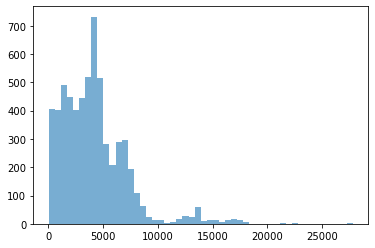

In [35]:
# quick histogram of distances to closest park
plt.hist(park_dists, bins=50, alpha=0.6)
plt.show()

In [36]:
data_proj["park_dist"] = data_proj.index.map(dict_dist_to_park)
data_proj.head()

,accommodates,bathrooms,bedrooms,beds,neighborhood,pool,d2balboa,coastal,price,log_price,...,pg_Condominium,pg_House,pg_Other,pg_Townhouse,rt_Entire_home/apt,rt_Private_room,rt_Shared_room,geometry,balboa_dist,park_dist
0,5,2.0,2.0,2.0,North Hills,0,2.972077,0,425.0,6.052089,...,0,1,0,0,1,0,0,POINT (487849.961 3624022.580),1776.87,1776.874
1,6,1.0,2.0,4.0,Mission Bay,0,11.501385,1,205.0,5.323010,...,1,0,0,0,1,0,0,POINT (476352.113 3627393.256),12324,4461.405
2,2,1.0,1.0,1.0,North Hills,0,2.493893,0,99.0,4.595120,...,0,0,0,0,0,1,0,POINT (486772.302 3623943.385),1540.37,1540.368
3,2,1.0,1.0,1.0,Mira Mesa,0,22.293757,0,72.0,4.276666,...,0,1,0,0,0,1,0,POINT (485725.689 3643659.514),25592,17720.201
4,2,1.0,1.0,1.0,Roseville,0,6.829451,0,55.0,4.007333,...,0,1,0,0,0,1,0,POINT (479510.620 3622708.972),7387.22,5915.552


In [37]:
print(len(data_proj))
data_proj = data_proj[data_proj['park_dist']!='NaN']
data_proj.reset_index(inplace=True, drop=True)
print(len(data_proj))
data_proj.head()

6092
6092


C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\gevor\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:68: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return op(a, b)


,accommodates,bathrooms,bedrooms,beds,neighborhood,pool,d2balboa,coastal,price,log_price,...,pg_Condominium,pg_House,pg_Other,pg_Townhouse,rt_Entire_home/apt,rt_Private_room,rt_Shared_room,geometry,balboa_dist,park_dist
0,5,2.0,2.0,2.0,North Hills,0,2.972077,0,425.0,6.052089,...,0,1,0,0,1,0,0,POINT (487849.961 3624022.580),1776.87,1776.874
1,6,1.0,2.0,4.0,Mission Bay,0,11.501385,1,205.0,5.323010,...,1,0,0,0,1,0,0,POINT (476352.113 3627393.256),12324,4461.405
2,2,1.0,1.0,1.0,North Hills,0,2.493893,0,99.0,4.595120,...,0,0,0,0,0,1,0,POINT (486772.302 3623943.385),1540.37,1540.368
3,2,1.0,1.0,1.0,Mira Mesa,0,22.293757,0,72.0,4.276666,...,0,1,0,0,0,1,0,POINT (485725.689 3643659.514),25592,17720.201
4,2,1.0,1.0,1.0,Roseville,0,6.829451,0,55.0,4.007333,...,0,1,0,0,0,1,0,POINT (479510.620 3622708.972),7387.22,5915.552


Let's map Airbnb listings colored based on distance to closest park.

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


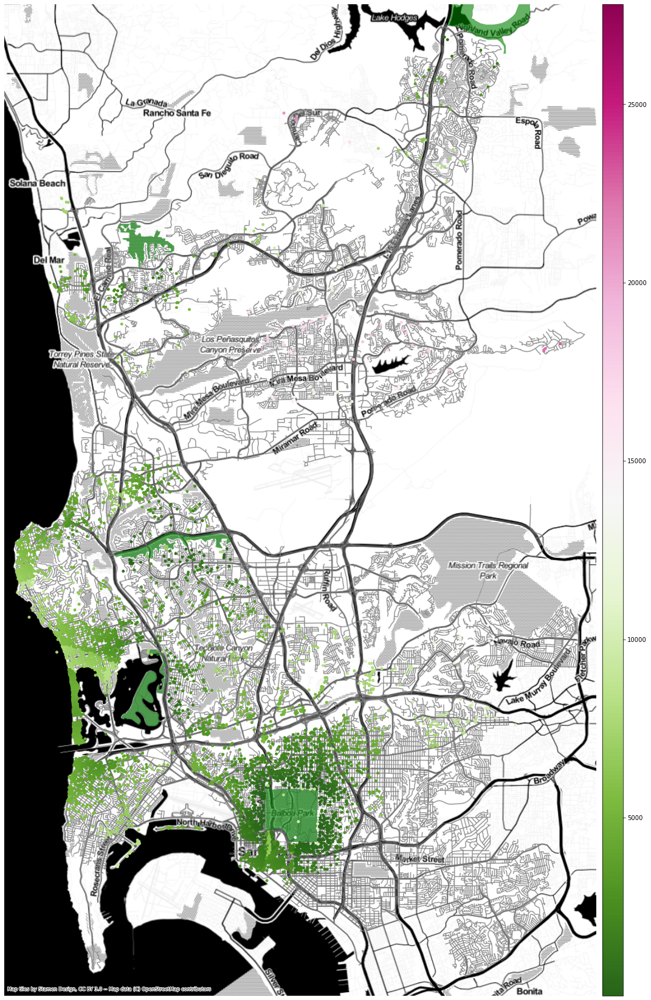

In [38]:
fig,ax = plt.subplots(1,figsize=(24, 30))

ox.plot_graph(G_proj, ax=ax, show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=1.5, node_alpha=0.8, node_zorder=1, edge_color='grey', \
              edge_alpha=0.5)

data_proj.plot(ax=ax, column = 'park_dist', cmap='PiYG_r', s=15, legend=False, zorder=3)
parks_proj.plot(ax=ax, color='green', alpha=0.6)

cbax = fig.add_axes([0.8, 0.125, 0.02, 0.755])

sm = plt.cm.ScalarMappable(cmap='PiYG_r', \
                          norm = plt.Normalize(vmin=min(data_proj.park_dist), vmax=max(data_proj.park_dist)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(
    ax, 
    crs=data_proj.crs.to_string(), 
    source=ctx.providers.Stamen.Toner
)

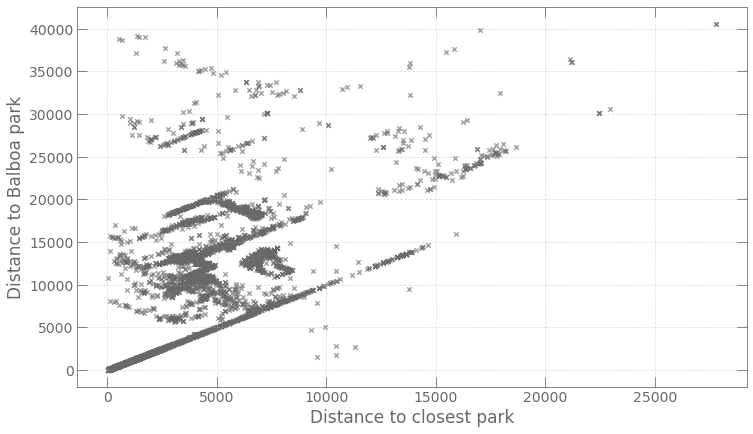

In [40]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(data_proj.park_dist, data_proj.balboa_dist, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', s=20)

plt.xlabel('Distance to closest park', size=17, color='dimgrey')
plt.ylabel('Distance to Balboa park', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
plt.show()

Can you spot something weird in the plot?

In [41]:
data_proj[data_proj["park_dist"]>data_proj["balboa_dist"]]

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,accommodates,bathrooms,bedrooms,beds,neighborhood,pool,d2balboa,coastal,price,log_price,...,pg_Condominium,pg_House,pg_Other,pg_Townhouse,rt_Entire_home/apt,rt_Private_room,rt_Shared_room,geometry,balboa_dist,park_dist
140,2,1.0,1.0,1.0,North Hills,0,1.578645,0,200.0,5.298317,...,0,0,0,0,1,0,0,POINT (487376.957 3622640.304),1540.37,9593.983
381,2,1.0,0.0,1.0,North Hills,0,1.393017,0,122.0,4.804021,...,0,1,0,0,1,0,0,POINT (487127.407 3622610.442),4677.93,9291.288
437,2,1.0,1.0,1.0,North Hills,0,1.223335,0,119.0,4.779123,...,0,1,0,0,1,0,0,POINT (486782.100 3622620.887),8556.43,8988.781
441,10,2.5,3.0,5.0,Balboa Park,0,1.382549,0,350.0,5.857933,...,0,1,0,0,1,0,0,POINT (487468.391 3620817.628),2693.21,11286.864
509,6,1.0,2.0,2.0,Balboa Park,0,1.142406,0,149.0,5.003946,...,0,1,0,0,1,0,0,POINT (486453.962 3620394.537),9522.48,13751.584
2046,6,1.0,3.0,4.0,Balboa Park,0,1.845786,0,149.0,5.003946,...,0,1,0,0,1,0,0,POINT (487455.233 3620103.116),2847.16,10433.237
3974,8,2.0,4.0,5.0,North Hills,0,1.526488,0,229.0,5.433722,...,0,1,0,0,1,0,0,POINT (487334.251 3622609.015),7849.59,9593.983
4261,6,1.0,3.0,4.0,Balboa Park,0,1.849126,0,149.0,5.003946,...,0,1,0,0,1,0,0,POINT (487441.905 3620088.023),1821.37,10433.237
5954,1,1.0,1.0,1.0,Balboa Park,0,0.511498,0,35.0,3.555348,...,0,0,0,0,0,0,1,POINT (486595.695 3621121.249),5073.26,9948.667


C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


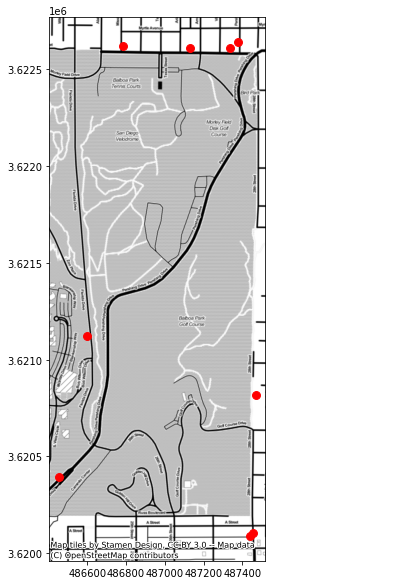

In [44]:
f,ax = plt.subplots(1,figsize=(10, 10))
data_proj[data_proj["park_dist"]>data_proj["balboa_dist"]].plot(ax=ax, marker='.', color='r', markersize=250, zorder=2)
#data_proj.plot(ax=ax, marker='.')
ctx.add_basemap(
    ax, 
    crs=data_proj.crs.to_string(), 
    source=ctx.providers.Stamen.Toner
)

### Restaurants in neighbourhood

Let's engineer a new feature representing the number of restaurants in each neighbourhood, normalised by area to mitigate the [Modifiable Areal Unit Problem (MAUP)](https://en.wikipedia.org/wiki/Modifiable_areal_unit_problem#:~:text=The%20modifiable%20areal%20unit%20problem%20(MAUP)%20is%20a%20source%20of,results%20of%20statistical%20hypothesis%20tests.&text=Thus%20the%20results%20of%20data,to%20use%20in%20their%20analysis.).

In [65]:
# get everything tagged restaurant and pub
tags = {'amenity': ['restaurant', 'pub', 'bar']}
restaurants = ox.geometries_from_place("San Diego, USA", tags)
print(restaurants.shape)
restaurants.head()

(1157, 117)


amenity  cuisine                 name  \
element_type osmid                                                 
node         273607070  restaurant  italian             Leucadia   
             273607369  restaurant    sushi            Subarashi   
             274187845         pub      NaN  Rock Bottom Brewery   
             274193511  restaurant     thai        Thai Time III   
             274363369  restaurant      NaN     Sipz Fusion Cafe   

                                           geometry     created_by food  \
element_type osmid                                                        
node         273607070  POINT (-117.22469 32.86232)            NaN  NaN   
             273607369  POINT (-117.22469 32.86205)            NaN  NaN   
             274187845  POINT (-117.23422 32.87115)  Potlatch 0.9c  yes   
             274193511  POINT (-117.18378 32.82139)            NaN  NaN   
             274363369  POINT (-117.17386 32.83364)            NaN  NaN   

                       diet:vegan diet:vegetarian addr:city addr:housenumber  \
element_type osmid                                                             
node         273607070        NaN             NaN       NaN              NaN   
             273607369        NaN             NaN       NaN              NaN   
             274187845        NaN             NaN       NaN              NaN   
             274193511        yes             yes       NaN              NaN   
             274363369       only             NaN       NaN              NaN   

                        ... height owner toilets:wheelchair source:addr  \
element_type osmid      ...                                               
node         273607070  ...    NaN   NaN                NaN         NaN   
             273607369  ...    NaN   NaN                NaN         NaN   
             274187845  ...    NaN   NaN                NaN         NaN   
             274193511  ...    NaN   NaN                NaN         NaN   
             274363369  ...    NaN   NaN                NaN         NaN   

                       old_name source_ref fast_food indoor room craft  
element_type osmid                                                      
node         273607070      NaN        NaN       NaN    NaN  NaN   NaN  
             273607369      NaN        NaN       NaN    NaN  NaN   NaN  
             274187845      NaN        NaN       NaN    NaN  NaN   NaN  
             274193511      NaN        NaN       NaN    NaN  NaN   NaN  
             274363369      NaN        NaN       NaN    NaN  NaN   NaN  

[5 rows x 117 columns]

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


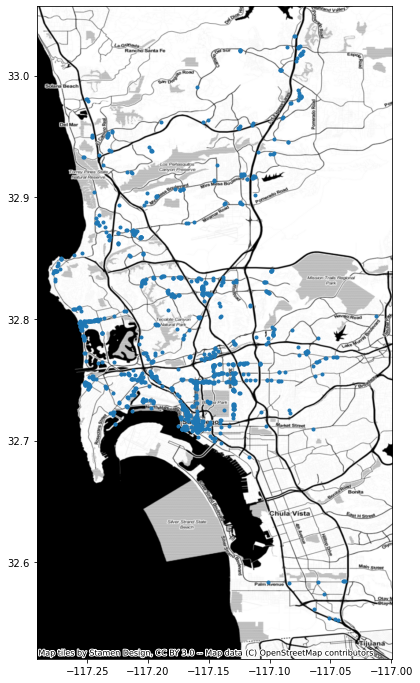

In [66]:
f,ax = plt.subplots(1,figsize=(12, 12))
restaurants.plot(ax=ax, marker='.')
ctx.add_basemap(
    ax, 
    crs=restaurants.crs.to_string(), 
    source=ctx.providers.Stamen.Toner
)

In [67]:
# get the clean geodataframe
restaurants = restaurants[restaurants["geometry"].geom_type == "Point"].dropna(axis=1, how="any")
print(restaurants.shape)
restaurants.reset_index(inplace=True, drop=True)
restaurants

(1024, 2)


C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,amenity,geometry
0,restaurant,POINT (-117.22469 32.86232)
1,restaurant,POINT (-117.22469 32.86205)
2,pub,POINT (-117.23422 32.87115)
3,restaurant,POINT (-117.18378 32.82139)
4,restaurant,POINT (-117.17386 32.83364)
...,...,...
1019,restaurant,POINT (-117.19304 32.90069)
1020,restaurant,POINT (-117.19294 32.90086)
1021,restaurant,POINT (-117.20099 32.90353)
1022,bar,POINT (-117.23388 32.94975)


In [68]:
restaurant_shp = restaurants[['geometry']]
restaurant_shp= restaurant_shp.copy()
restaurant_shp

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,geometry
0,POINT (-117.22469 32.86232)
1,POINT (-117.22469 32.86205)
2,POINT (-117.23422 32.87115)
3,POINT (-117.18378 32.82139)
4,POINT (-117.17386 32.83364)
...,...
1019,POINT (-117.19304 32.90069)
1020,POINT (-117.19294 32.90086)
1021,POINT (-117.20099 32.90353)
1022,POINT (-117.23388 32.94975)


In [69]:
# convert crs
restaurant_shp.geometry = restaurant_shp.geometry.to_crs(data_proj.crs)
restaurant_shp.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,geometry
0,POINT (478977.480 3636046.550)
1,POINT (478977.733 3636015.853)
2,POINT (478088.540 3637027.453)
3,POINT (482797.584 3631501.426)
4,POINT (483728.162 3632858.301)


C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


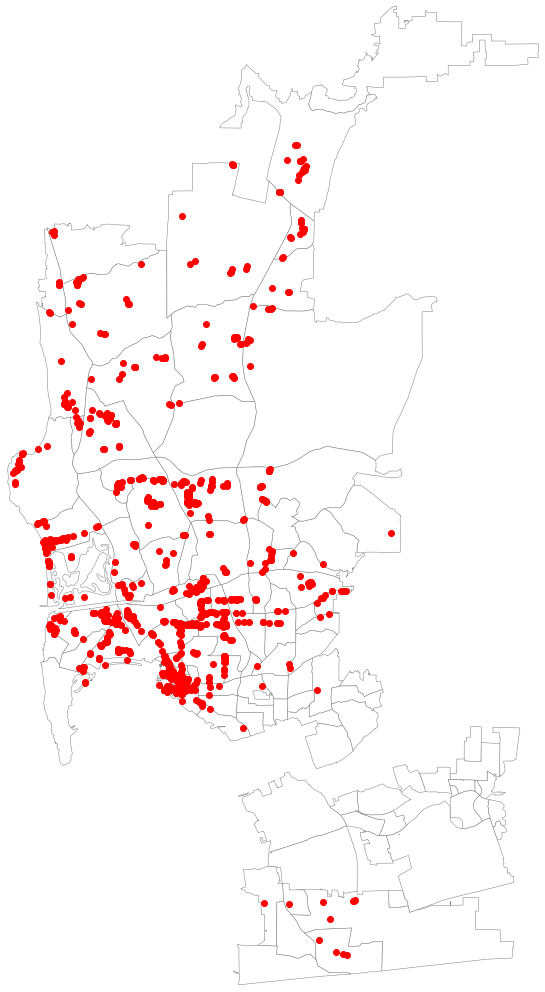

In [73]:
west, south, east, north = neighborhoods_proj.unary_union.bounds
fig, ax = plt.subplots(figsize=(10,18))
neighborhoods_proj.plot(ax=ax, linewidth=0.5, edgecolor='grey', color='white')  
restaurant_shp.plot(ax=ax, color='red', zorder=2)        
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

Let's aggregate the restaurant-bar-pub counts by neighbourhood via a spatial join operation:

In [74]:
cells_restaurantcounts = gpd.sjoin(neighborhoods_proj, restaurant_shp, op='contains')
cells_restaurantcounts.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,neighbourhood,neighbourhood_group,geometry,index_right
14,Allied Gardens,None,"MULTIPOLYGON (((490050.672 3630548.336, 490071...",64
14,Allied Gardens,None,"MULTIPOLYGON (((490050.672 3630548.336, 490071...",880
14,Allied Gardens,None,"MULTIPOLYGON (((490050.672 3630548.336, 490071...",881
14,Allied Gardens,None,"MULTIPOLYGON (((490050.672 3630548.336, 490071...",879
14,Allied Gardens,None,"MULTIPOLYGON (((490050.672 3630548.336, 490071...",878


In [75]:
restaurantcounts = cells_restaurantcounts.groupby(cells_restaurantcounts.index)['index_right'].count()
counts = pd.DataFrame(restaurantcounts)
counts.columns = ['counts']
counts

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,counts
14,7
19,21
25,2
27,7
30,13
...,...
99,2
100,9
102,16
103,33


C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


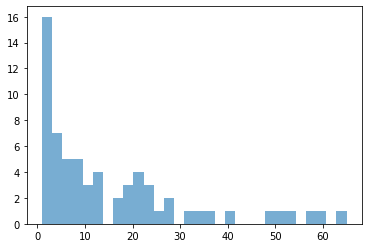

In [76]:
# a quick histogram of restaurant counts
plt.hist(counts.counts, bins=30, alpha=0.6)
plt.show()

Now, since we are going to normalise our counts by area, let's compute the neighbourhood areas and store them in a new column.

In [83]:
neighborhoods_proj["area"] = neighborhoods_proj.area
neighborhoods_proj.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,neighbourhood,neighbourhood_group,geometry,area
0,Amphitheater And Water Park,None,"MULTIPOLYGON (((498637.801 3605602.988, 498640...",1.203724e+06
1,Bella Lago,None,"MULTIPOLYGON (((505504.923 3616291.485, 505504...",3.029410e+06
2,Bonita Long Canyon,None,"MULTIPOLYGON (((498922.690 3613986.357, 498922...",2.372164e+06
3,East Lake,None,"MULTIPOLYGON (((500654.435 3613639.457, 501721...",2.585990e+06
4,Eastlake Trails,None,"MULTIPOLYGON (((504209.763 3611517.140, 504214...",1.224078e+06


In [84]:
neigh_counts = neighborhoods_proj.copy()
neigh_counts['counts'] = counts.counts
neigh_counts['counts'].fillna(0, inplace=True)
neigh_counts['counts'] = neigh_counts['counts'].astype(int)
neigh_counts

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,neighbourhood,neighbourhood_group,geometry,area,counts
0,Amphitheater And Water Park,None,"MULTIPOLYGON (((498637.801 3605602.988, 498640...",1.203724e+06,0
1,Bella Lago,None,"MULTIPOLYGON (((505504.923 3616291.485, 505504...",3.029410e+06,0
2,Bonita Long Canyon,None,"MULTIPOLYGON (((498922.690 3613986.357, 498922...",2.372164e+06,0
3,East Lake,None,"MULTIPOLYGON (((500654.435 3613639.457, 501721...",2.585990e+06,0
4,Eastlake Trails,None,"MULTIPOLYGON (((504209.763 3611517.140, 504214...",1.224078e+06,0
...,...,...,...,...,...
103,University City,None,"MULTIPOLYGON (((479922.299 3637914.592, 479985...",1.697497e+07,33
104,Valencia Park,None,"MULTIPOLYGON (((491981.252 3618158.658, 491995...",1.756195e+06,0
105,Webster,None,"MULTIPOLYGON (((489637.189 3620066.758, 489671...",3.713418e+06,0
106,West University Heights,None,"MULTIPOLYGON (((484631.424 3624752.248, 484669...",3.062351e+06,23


In [86]:
neigh_counts['counts'].isnull().values.any()

False

Let's quickly visualise the aggregated counts schematically on a map!

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


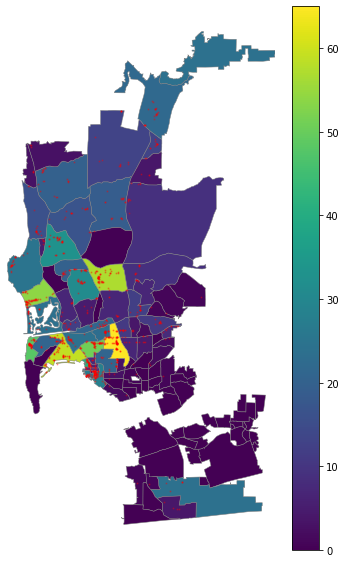

In [88]:
west, south, east, north = neigh_counts.unary_union.bounds
fig, ax = plt.subplots(figsize=(6,10))
neigh_counts.plot(column="counts", ax=ax, linewidth=0.5, edgecolor='grey', legend=True)  
restaurant_shp.plot(ax=ax, color='red', zorder=2, alpha=0.3, markersize=1)        
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

Now let's normalise the counts by neighbourhood area and plot again.

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


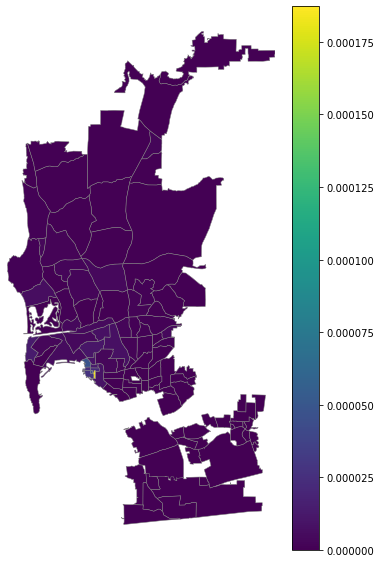

In [92]:
neigh_counts["counts_normalised"] = neigh_counts.counts/neigh_counts.area

west, south, east, north = neigh_counts.unary_union.bounds
fig, ax = plt.subplots(figsize=(6,10))
neigh_counts.plot(column="counts_normalised", ax=ax, linewidth=0.5, edgecolor='grey', legend=True)  
#restaurant_shp.plot(ax=ax, color='red', zorder=2, alpha=0.3, markersize=1)        
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

Since the neighbourhood with the highest normalised restaurant counts has them disproportionately higher than other neighbourhoods, let's remove it and plot the rest for illustrating the importance of normalising by area.

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


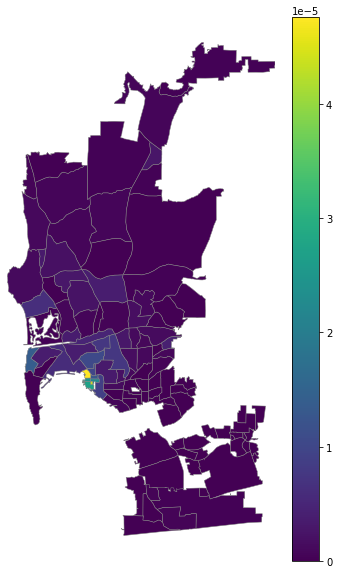

In [93]:
neigh_counts["counts_normalised"] = neigh_counts.counts/neigh_counts.area

west, south, east, north = neigh_counts.unary_union.bounds
fig, ax = plt.subplots(figsize=(6,10))
neigh_counts[neigh_counts.counts_normalised != neigh_counts.counts_normalised.max()].plot(column="counts_normalised", \
                                                  ax=ax, linewidth=0.5, edgecolor='grey', legend=True)  
#restaurant_shp.plot(ax=ax, color='red', zorder=2, alpha=0.3, markersize=1)        
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

Finally, let's merge the `data_proj` geodataframe containing the Airbnb listings with the `neigh_counts` geodataframe containing the restaurant counts in each neighbourhood, to obtain the feature we were engineering: the number of restaurants in the neighbourhood a given Airbnb listing is located in.

In [94]:
neigh_counts.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,neighbourhood,neighbourhood_group,geometry,area,counts,counts_normalised
0,Amphitheater And Water Park,None,"MULTIPOLYGON (((498637.801 3605602.988, 498640...",1.203724e+06,0,0.0
1,Bella Lago,None,"MULTIPOLYGON (((505504.923 3616291.485, 505504...",3.029410e+06,0,0.0
2,Bonita Long Canyon,None,"MULTIPOLYGON (((498922.690 3613986.357, 498922...",2.372164e+06,0,0.0
3,East Lake,None,"MULTIPOLYGON (((500654.435 3613639.457, 501721...",2.585990e+06,0,0.0
4,Eastlake Trails,None,"MULTIPOLYGON (((504209.763 3611517.140, 504214...",1.224078e+06,0,0.0


In [95]:
data_proj.head()

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,accommodates,bathrooms,bedrooms,beds,neighborhood,pool,d2balboa,coastal,price,log_price,...,pg_Condominium,pg_House,pg_Other,pg_Townhouse,rt_Entire_home/apt,rt_Private_room,rt_Shared_room,geometry,balboa_dist,park_dist
0,5,2.0,2.0,2.0,North Hills,0,2.972077,0,425.0,6.052089,...,0,1,0,0,1,0,0,POINT (487849.961 3624022.580),1776.87,1776.874
1,6,1.0,2.0,4.0,Mission Bay,0,11.501385,1,205.0,5.323010,...,1,0,0,0,1,0,0,POINT (476352.113 3627393.256),12324,4461.405
2,2,1.0,1.0,1.0,North Hills,0,2.493893,0,99.0,4.595120,...,0,0,0,0,0,1,0,POINT (486772.302 3623943.385),1540.37,1540.368
3,2,1.0,1.0,1.0,Mira Mesa,0,22.293757,0,72.0,4.276666,...,0,1,0,0,0,1,0,POINT (485725.689 3643659.514),25592,17720.201
4,2,1.0,1.0,1.0,Roseville,0,6.829451,0,55.0,4.007333,...,0,1,0,0,0,1,0,POINT (479510.620 3622708.972),7387.22,5915.552


You might often come across a naming issues across data that ought to be representing the same thing. In this case, a quick look reveals that the word _neighbourhood_ is spelled differently in the dataframes. Hence, we change it in one of the dataframes.

In [96]:
neigh_counts.rename(columns={'neighbourhood':'neighborhood'}, inplace=True)

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [98]:
new_gdf = pd.merge(data_proj, neigh_counts[["neighborhood", "counts_normalised"]], on='neighborhood')
new_gdf.head()

,accommodates,bathrooms,bedrooms,beds,neighborhood,pool,d2balboa,coastal,price,log_price,...,pg_House,pg_Other,pg_Townhouse,rt_Entire_home/apt,rt_Private_room,rt_Shared_room,geometry,balboa_dist,park_dist,counts_normalised
0,5,2.0,2.0,2.0,North Hills,0,2.972077,0,425.0,6.052089,...,1,0,0,1,0,0,POINT (487849.961 3624022.580),1776.87,1776.874,0.000007
1,2,1.0,1.0,1.0,North Hills,0,2.493893,0,99.0,4.595120,...,0,0,0,0,1,0,POINT (486772.302 3623943.385),1540.37,1540.368,0.000007
2,2,0.0,1.0,1.0,North Hills,1,2.548985,0,65.0,4.174387,...,0,1,0,1,0,0,POINT (488833.186 3621570.517),2595.12,2595.122,0.000007
3,2,1.0,1.0,1.0,North Hills,0,1.791777,0,42.0,3.737670,...,0,0,0,0,1,0,POINT (486487.957 3623282.786),583.347,583.347,0.000007
4,2,1.0,1.0,1.0,North Hills,0,1.642844,0,47.0,3.850148,...,0,0,0,0,1,0,POINT (486504.207 3623131.391),501.974,501.974,0.000007


Let's save the file to .geojson, and we are ready for using our engineered features for further analysis.

In [99]:
from pyproj import CRS
crs = CRS.from_epsg(4326)
new_gdf.geometry = new_gdf.geometry.to_crs(crs)
new_gdf.to_file("../data/san_diego_regr_data.geojson", driver="GeoJSON")

C:\Users\gevor\anaconda3\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Homework assignment

Compute and plot the distances from all restaurants in Yerevan to your house.